# Initialize Libraries and Methods

In [2]:
import glob, os
import pandas as pd
import numpy as np
from pathlib import Path
import datetime
import time
import scipy.stats as stats
from warnings import filterwarnings

from pdfminer.pdfinterp import PDFResourceManager, PDFPageInterpreter
from pdfminer.converter import TextConverter
from pdfminer.layout import LAParams
from pdfminer.pdfpage import PDFPage
from io import StringIO

from pylinac import WinstonLutz
from pylinac import settings
import matplotlib.pyplot as plt
from matplotlib.pyplot import cm

import seaborn as sns

def convert_pdf_to_txt(path):
    #https://stackoverflow.com/questions/26494211/extracting-text-from-a-pdf-file-using-pdfminer-in-python
    rsrcmgr = PDFResourceManager()
    retstr = StringIO()
    codec = 'utf-8'
    laparams = LAParams()
    device = TextConverter(rsrcmgr, retstr, codec=codec, laparams=laparams)
    fp = open(path, 'rb')
    interpreter = PDFPageInterpreter(rsrcmgr, device)
    password = ""
    maxpages = 0
    caching = True
    pagenos=set()

    for page in PDFPage.get_pages(fp, pagenos, maxpages=maxpages, password=password,caching=caching, check_extractable=True):
        interpreter.process_page(page)

    text = retstr.getvalue()

    fp.close()
    device.close()
    retstr.close()
    return text

def find_between( s, first, last ):
    #https://stackoverflow.com/questions/3368969/find-string-between-two-substrings
    try:
        start = s.index( first ) + len( first )
        end = s.index( last, start )
        return s[start:end]
    except ValueError:
        return ""

# Read Winston-Lutz PDF data and save to df dataframe

In [4]:
#Initialization
root_folder = "WL_Data" #Change this to your input folder
files = []
folders = []

units = sorted(next(os.walk(root_folder))[1])
for unit in units:
    unit_folder = os.path.join(root_folder,unit)
    dates = sorted(next(os.walk(unit_folder))[1])
    
    for date in dates:
        test_folder = os.path.join(unit_folder,date)
        pdfs = os.path.join(test_folder,'*.pdf')
        if glob.glob(pdfs) == []: #In case the pdf isn't in the top most folder, search one more level down.
            subdir = os.path.join(test_folder,sorted(next(os.walk(test_folder))[1])[0],'*.pdf')
            files.append(glob.glob(subdir)[0])
        else:
            files.append(glob.glob(pdfs)[0])
    
    
#Extracting info
#df = pd.DataFrame(columns=['unit','date','maximum_delta','maximum_total_delta','mean_total_delta','3d_x,3d_y,3d_z','filepath'])
data = []
for file in files:
    test_data = {}
    test_data['unit'] = file.split('\\')[1]
    test_data['filepath'] = file
    
    pdf_text = convert_pdf_to_txt(file)
    
    for text in pdf_text.split('\n'):
        if text.startswith('Date: '):
            test_data['date'] = str(datetime.datetime.strptime(text.split(': ')[1], '%B %d, %Y').date())
        if text.startswith('3D X position: '):
            test_data['3d_x'] = float(find_between(text, ': ', ' m').replace('−', '-'))
        if text.startswith('3D Y position: '):
            test_data['3d_y'] = float(find_between(text, ': ', ' m').replace('−', '-'))
        if text.startswith('3D Z position: '):
            test_data['3d_z'] = float(find_between(text, ': ', ' m').replace('−', '-'))
            
    print(file,test_data.values())
    data.append(test_data)
    
    
df = pd.DataFrame(data)
df

2020-06-19 00:07:35 - xref found: pos=b'274401'
2020-06-19 00:07:35 - read_xref_from: start=274401, token=/b'xref'
2020-06-19 00:07:35 - xref objects: {1: (None, 5741, 0), 2: (None, 274278, 0), 3: (None, 5668, 0), 4: (None, 5039, 0), 5: (None, 15, 0), 6: (None, 2430, 0), 7: (None, 5806, 0), 8: (None, 251736, 0), 9: (None, 260985, 0), 10: (None, 252236, 0), 11: (None, 264447, 0), 12: (None, 253252, 0), 13: (None, 272086, 0), 14: (None, 5856, 0), 15: (None, 136967, 0), 16: (None, 94481, 0), 17: (None, 54158, 0), 18: (None, 11990, 0), 19: (None, 6771, 0), 20: (None, 6633, 0), 21: (None, 6665, 0), 22: (None, 6695, 0), 23: (None, 183183, 0), 24: (None, 5259, 0), 25: (None, 2450, 0), 26: (None, 4454, 0), 27: (None, 252775, 0), 28: (None, 269112, 0), 29: (None, 203634, 0), 30: (None, 251260, 0), 31: (None, 258280, 0), 32: (None, 196572, 0), 33: (None, 189926, 0), 34: (None, 183373, 0), 35: (None, 183235, 0), 36: (None, 183267, 0), 37: (None, 183297, 0), 38: (None, 210537, 0), 39: (None, 5481,

2020-06-19 00:07:36 - Processing xobj: <PDFStream(33): raw=6501, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 111, 'Height': 115, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 6500}>
2020-06-19 00:07:36 - Processing xobj: <PDFStream(34): raw=6408, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 111, 'Height': 111, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 6407}>
2020-06-19 00:07:36 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:07:36 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:07:36 - Pro

WL_Data\Unit 01\2016_11_25\2016-11-25, Unit 1, Winston-Lutz.pdf dict_values(['Unit 01', 'WL_Data\\Unit 01\\2016_11_25\\2016-11-25, Unit 1, Winston-Lutz.pdf', '2016-11-25', 0.05, 0.74, 0.19])


2020-06-19 00:07:36 - xref found: pos=b'487562'
2020-06-19 00:07:36 - read_xref_from: start=487562, token=/b'xref'
2020-06-19 00:07:36 - xref objects: {1: (None, 6199, 0), 2: (None, 487439, 0), 3: (None, 6126, 0), 4: (None, 5497, 0), 5: (None, 15, 0), 6: (None, 2402, 0), 7: (None, 6264, 0), 8: (None, 465128, 0), 9: (None, 474178, 0), 10: (None, 465628, 0), 11: (None, 477640, 0), 12: (None, 466640, 0), 13: (None, 485247, 0), 14: (None, 6314, 0), 15: (None, 270573, 0), 16: (None, 185799, 0), 17: (None, 97235, 0), 18: (None, 12448, 0), 19: (None, 7229, 0), 20: (None, 7091, 0), 21: (None, 7123, 0), 22: (None, 7153, 0), 23: (None, 366275, 0), 24: (None, 5717, 0), 25: (None, 2422, 0), 26: (None, 4914, 0), 27: (None, 466167, 0), 28: (None, 482305, 0), 29: (None, 409927, 0), 30: (None, 464652, 0), 31: (None, 471473, 0), 32: (None, 395150, 0), 33: (None, 380399, 0), 34: (None, 366465, 0), 35: (None, 366327, 0), 36: (None, 366359, 0), 37: (None, 366389, 0), 38: (None, 423935, 0), 39: (None, 5939

2020-06-19 00:07:36 - Processing xobj: <PDFStream(33): raw=14605, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 218, 'Height': 225, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 14604}>
2020-06-19 00:07:36 - Processing xobj: <PDFStream(34): raw=13788, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 221, 'Height': 220, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 13787}>
2020-06-19 00:07:36 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:07:36 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:07:36 -

WL_Data\Unit 01\2016_12_02\2016-12-02, Unit 1, Winston-Lutz.pdf dict_values(['Unit 01', 'WL_Data\\Unit 01\\2016_12_02\\2016-12-02, Unit 1, Winston-Lutz.pdf', '2016-12-02', -0.44, 0.51, -0.15])


2020-06-19 00:07:36 - xref found: pos=b'487527'
2020-06-19 00:07:36 - read_xref_from: start=487527, token=/b'xref'
2020-06-19 00:07:36 - xref objects: {1: (None, 6130, 0), 2: (None, 487404, 0), 3: (None, 6057, 0), 4: (None, 5428, 0), 5: (None, 15, 0), 6: (None, 2406, 0), 7: (None, 6195, 0), 8: (None, 464779, 0), 9: (None, 473978, 0), 10: (None, 465281, 0), 11: (None, 477476, 0), 12: (None, 466295, 0), 13: (None, 485212, 0), 14: (None, 6245, 0), 15: (None, 271689, 0), 16: (None, 181218, 0), 17: (None, 92174, 0), 18: (None, 12379, 0), 19: (None, 7160, 0), 20: (None, 7022, 0), 21: (None, 7054, 0), 22: (None, 7084, 0), 23: (None, 366102, 0), 24: (None, 5648, 0), 25: (None, 2426, 0), 26: (None, 4844, 0), 27: (None, 465820, 0), 28: (None, 482141, 0), 29: (None, 409379, 0), 30: (None, 464315, 0), 31: (None, 471276, 0), 32: (None, 394720, 0), 33: (None, 380238, 0), 34: (None, 366292, 0), 35: (None, 366154, 0), 36: (None, 366186, 0), 37: (None, 366216, 0), 38: (None, 423596, 0), 39: (None, 5870

2020-06-19 00:07:36 - Processing xobj: <PDFStream(33): raw=14336, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 220, 'Height': 227, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 14335}>
2020-06-19 00:07:36 - Processing xobj: <PDFStream(34): raw=13800, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 221, 'Height': 220, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 13799}>
2020-06-19 00:07:36 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:07:36 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:07:36 -

WL_Data\Unit 01\2016_12_08\2016-12-08, Unit 1, Winston-Lutz.pdf dict_values(['Unit 01', 'WL_Data\\Unit 01\\2016_12_08\\2016-12-08, Unit 1, Winston-Lutz.pdf', '2016-12-08', -0.08, 0.94, -0.19])


2020-06-19 00:07:36 - xref found: pos=b'570747'
2020-06-19 00:07:36 - read_xref_from: start=570747, token=/b'xref'
2020-06-19 00:07:36 - xref objects: {1: (None, 6164, 0), 2: (None, 570624, 0), 3: (None, 6091, 0), 4: (None, 5462, 0), 5: (None, 15, 0), 6: (None, 2408, 0), 7: (None, 6229, 0), 8: (None, 548185, 0), 9: (None, 557362, 0), 10: (None, 548685, 0), 11: (None, 560806, 0), 12: (None, 549697, 0), 13: (None, 568432, 0), 14: (None, 6279, 0), 15: (None, 342847, 0), 16: (None, 239568, 0), 17: (None, 140606, 0), 18: (None, 12413, 0), 19: (None, 7194, 0), 20: (None, 7056, 0), 21: (None, 7088, 0), 22: (None, 7118, 0), 23: (None, 443050, 0), 24: (None, 5682, 0), 25: (None, 2428, 0), 26: (None, 4879, 0), 27: (None, 549224, 0), 28: (None, 565471, 0), 29: (None, 491780, 0), 30: (None, 547723, 0), 31: (None, 554716, 0), 32: (None, 475902, 0), 33: (None, 460420, 0), 34: (None, 443240, 0), 35: (None, 443102, 0), 36: (None, 443134, 0), 37: (None, 443164, 0), 38: (None, 507004, 0), 39: (None, 590

2020-06-19 00:07:36 - Processing xobj: <PDFStream(33): raw=15336, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 221, 'Height': 230, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 15335}>
2020-06-19 00:07:36 - Processing xobj: <PDFStream(34): raw=17034, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 221, 'Height': 223, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 17033}>
2020-06-19 00:07:36 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:07:36 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:07:36 -

WL_Data\Unit 01\2016_12_15\2016-12-15, Unit 1, Winston-Lutz.pdf dict_values(['Unit 01', 'WL_Data\\Unit 01\\2016_12_15\\2016-12-15, Unit 1, Winston-Lutz.pdf', '2016-12-15', 0.99, -0.28, -0.32])


2020-06-19 00:07:37 - xref found: pos=b'679924'
2020-06-19 00:07:37 - read_xref_from: start=679924, token=/b'xref'
2020-06-19 00:07:37 - xref objects: {1: (None, 7519, 0), 2: (None, 679801, 0), 3: (None, 7446, 0), 4: (None, 6817, 0), 5: (None, 15, 0), 6: (None, 2479, 0), 7: (None, 7584, 0), 8: (None, 657545, 0), 9: (None, 666584, 0), 10: (None, 658047, 0), 11: (None, 669981, 0), 12: (None, 659057, 0), 13: (None, 677609, 0), 14: (None, 7634, 0), 15: (None, 396454, 0), 16: (None, 269034, 0), 17: (None, 140654, 0), 18: (None, 13768, 0), 19: (None, 8549, 0), 20: (None, 8411, 0), 21: (None, 8443, 0), 22: (None, 8473, 0), 23: (None, 530557, 0), 24: (None, 7037, 0), 25: (None, 2499, 0), 26: (None, 6233, 0), 27: (None, 658584, 0), 28: (None, 674667, 0), 29: (None, 594856, 0), 30: (None, 657081, 0), 31: (None, 663986, 0), 32: (None, 574035, 0), 33: (None, 552096, 0), 34: (None, 530747, 0), 35: (None, 530609, 0), 36: (None, 530641, 0), 37: (None, 530671, 0), 38: (None, 616364, 0), 39: (None, 725

2020-06-19 00:07:37 - Processing xobj: <PDFStream(33): raw=21793, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 227, 'Height': 253, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 21792}>
2020-06-19 00:07:37 - Processing xobj: <PDFStream(34): raw=21203, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 227, 'Height': 249, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 21202}>
2020-06-19 00:07:37 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:07:37 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:07:37 -

WL_Data\Unit 01\2016_12_29\2016-12-29, Unit 1, Winston-Lutz.pdf dict_values(['Unit 01', 'WL_Data\\Unit 01\\2016_12_29\\2016-12-29, Unit 1, Winston-Lutz.pdf', '2016-12-29', 0.89, -0.19, -0.22])


2020-06-19 00:07:37 - xref found: pos=b'315766'
2020-06-19 00:07:37 - read_xref_from: start=315766, token=/b'xref'
2020-06-19 00:07:37 - xref objects: {1: (None, 11034, 0), 2: (None, 315643, 0), 3: (None, 10961, 0), 4: (None, 10332, 0), 5: (None, 15, 0), 6: (None, 3930, 0), 7: (None, 11099, 0), 8: (None, 293146, 0), 9: (None, 300965, 0), 10: (None, 294133, 0), 11: (None, 307426, 0), 12: (None, 295024, 0), 13: (None, 313451, 0), 14: (None, 11149, 0), 15: (None, 150501, 0), 16: (None, 133780, 0), 17: (None, 117304, 0), 18: (None, 100688, 0), 19: (None, 84218, 0), 20: (None, 67615, 0), 21: (None, 50868, 0), 22: (None, 34130, 0), 23: (None, 17338, 0), 24: (None, 12119, 0), 25: (None, 11926, 0), 26: (None, 11958, 0), 27: (None, 11988, 0), 28: (None, 166999, 0), 29: (None, 10552, 0), 30: (None, 3950, 0), 31: (None, 9748, 0), 32: (None, 292307, 0), 33: (None, 295476, 0), 34: (None, 242925, 0), 35: (None, 292780, 0), 36: (None, 298380, 0), 37: (None, 233492, 0), 38: (None, 224026, 0), 39: (Non

2020-06-19 00:07:37 - get_font: create: objid=35, spec={'BaseFont': /'ADSCYR+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:07:37 - Processing xobj: <PDFStream(34): raw=9361, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9360}>
2020-06-19 00:07:37 - Processing xobj: <PDFStream(37): raw=9288, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9287}>
2020-06-19 00:07:37 - Processing xobj: <PDFStrea

WL_Data\Unit 01\2019_08_12\2019-08-12, Unit 1, Winston-Lutz.pdf dict_values(['Unit 01', 'WL_Data\\Unit 01\\2019_08_12\\2019-08-12, Unit 1, Winston-Lutz.pdf', '2019-08-12', -0.17, -0.01, 0.03])


2020-06-19 00:07:37 - xref found: pos=b'318046'
2020-06-19 00:07:37 - read_xref_from: start=318046, token=/b'xref'
2020-06-19 00:07:37 - xref objects: {1: (None, 11359, 0), 2: (None, 317923, 0), 3: (None, 11286, 0), 4: (None, 10657, 0), 5: (None, 15, 0), 6: (None, 3913, 0), 7: (None, 11424, 0), 8: (None, 295642, 0), 9: (None, 303379, 0), 10: (None, 296627, 0), 11: (None, 309706, 0), 12: (None, 297518, 0), 13: (None, 315731, 0), 14: (None, 11474, 0), 15: (None, 152182, 0), 16: (None, 135532, 0), 17: (None, 118899, 0), 18: (None, 102230, 0), 19: (None, 85462, 0), 20: (None, 68753, 0), 21: (None, 51704, 0), 22: (None, 34690, 0), 23: (None, 17663, 0), 24: (None, 12444, 0), 25: (None, 12251, 0), 26: (None, 12283, 0), 27: (None, 12313, 0), 28: (None, 168792, 0), 29: (None, 10877, 0), 30: (None, 3933, 0), 31: (None, 10073, 0), 32: (None, 294803, 0), 33: (None, 297970, 0), 34: (None, 245451, 0), 35: (None, 295276, 0), 36: (None, 300874, 0), 37: (None, 235908, 0), 38: (None, 226357, 0), 39: (No

2020-06-19 00:07:38 - get_font: create: objid=35, spec={'BaseFont': /'EGWKXW+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 667, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:07:38 - Processing xobj: <PDFStream(34): raw=9331, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9330}>
2020-06-19 00:07:38 - Processing xobj: <PDFStream(37): raw=9398, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9397}>
2020-06-19 00:07:38 - Processing xobj: <PDFStrea

WL_Data\Unit 01\2019_08_13\2019-08-13, Unit 1, Winston-Lutz.pdf dict_values(['Unit 01', 'WL_Data\\Unit 01\\2019_08_13\\2019-08-13, Unit 1, Winston-Lutz.pdf', '2019-08-13', -0.0, -0.21, 0.03])


2020-06-19 00:07:38 - xref found: pos=b'276070'
2020-06-19 00:07:38 - read_xref_from: start=276070, token=/b'xref'
2020-06-19 00:07:38 - xref objects: {1: (None, 11506, 0), 2: (None, 275947, 0), 3: (None, 11433, 0), 4: (None, 10804, 0), 5: (None, 15, 0), 6: (None, 4254, 0), 7: (None, 11571, 0), 8: (None, 253698, 0), 9: (None, 261392, 0), 10: (None, 254683, 0), 11: (None, 267730, 0), 12: (None, 255574, 0), 13: (None, 273755, 0), 14: (None, 11621, 0), 15: (None, 126402, 0), 16: (None, 112989, 0), 17: (None, 99447, 0), 18: (None, 85920, 0), 19: (None, 72389, 0), 20: (None, 58841, 0), 21: (None, 45107, 0), 22: (None, 31366, 0), 23: (None, 17810, 0), 24: (None, 12591, 0), 25: (None, 12398, 0), 26: (None, 12430, 0), 27: (None, 12460, 0), 28: (None, 139924, 0), 29: (None, 11024, 0), 30: (None, 4274, 0), 31: (None, 10220, 0), 32: (None, 252861, 0), 33: (None, 256026, 0), 34: (None, 204860, 0), 35: (None, 253334, 0), 36: (None, 258930, 0), 37: (None, 196808, 0), 38: (None, 188741, 0), 39: (None

2020-06-19 00:07:38 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:07:38 - Processing xobj: <PDFStream(34): raw=7980, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7979}>
2020-06-19 00:07:38 - Processing xobj: <PDFStream(37): raw=7907, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7906}>
2020-06-19 00:07:38 - Processing xobj: <PDFStream(

WL_Data\Unit 01\2019_08_20\QA Winston-Lutz U1\2019-08-20, Unit 1, Winston-Lutz.pdf dict_values(['Unit 01', 'WL_Data\\Unit 01\\2019_08_20\\QA Winston-Lutz U1\\2019-08-20, Unit 1, Winston-Lutz.pdf', '2019-08-20', 0.0, 0.23, -0.17])


2020-06-19 00:07:38 - xref found: pos=b'317160'
2020-06-19 00:07:38 - read_xref_from: start=317160, token=/b'xref'
2020-06-19 00:07:38 - xref objects: {1: (None, 11357, 0), 2: (None, 317037, 0), 3: (None, 11284, 0), 4: (None, 10655, 0), 5: (None, 15, 0), 6: (None, 3919, 0), 7: (None, 11422, 0), 8: (None, 294731, 0), 9: (None, 302324, 0), 10: (None, 295720, 0), 11: (None, 308820, 0), 12: (None, 296611, 0), 13: (None, 314845, 0), 14: (None, 11472, 0), 15: (None, 151629, 0), 16: (None, 134924, 0), 17: (None, 118275, 0), 18: (None, 101726, 0), 19: (None, 85083, 0), 20: (None, 68454, 0), 21: (None, 51527, 0), 22: (None, 34533, 0), 23: (None, 17661, 0), 24: (None, 12442, 0), 25: (None, 12249, 0), 26: (None, 12281, 0), 27: (None, 12311, 0), 28: (None, 168303, 0), 29: (None, 10875, 0), 30: (None, 3939, 0), 31: (None, 10071, 0), 32: (None, 293896, 0), 33: (None, 297063, 0), 34: (None, 244529, 0), 35: (None, 294367, 0), 36: (None, 299862, 0), 37: (None, 235047, 0), 38: (None, 225521, 0), 39: (No

2020-06-19 00:07:38 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:07:38 - Processing xobj: <PDFStream(34): raw=9346, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9345}>
2020-06-19 00:07:38 - Processing xobj: <PDFStream(37): raw=9337, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9336}>
2020-06-19 00:07:38 - Processing xobj: <PDFStream(

WL_Data\Unit 01\2019_08_27\2019-08-27, Unit 1, Winston-Lutz.pdf dict_values(['Unit 01', 'WL_Data\\Unit 01\\2019_08_27\\2019-08-27, Unit 1, Winston-Lutz.pdf', '2019-08-27', -0.13, 0.16, 0.04])


2020-06-19 00:07:39 - xref found: pos=b'317234'
2020-06-19 00:07:39 - read_xref_from: start=317234, token=/b'xref'
2020-06-19 00:07:39 - xref objects: {1: (None, 11117, 0), 2: (None, 317111, 0), 3: (None, 11044, 0), 4: (None, 10415, 0), 5: (None, 15, 0), 6: (None, 3945, 0), 7: (None, 11182, 0), 8: (None, 294440, 0), 9: (None, 302328, 0), 10: (None, 295427, 0), 11: (None, 308893, 0), 12: (None, 296318, 0), 13: (None, 314919, 0), 14: (None, 11232, 0), 15: (None, 151284, 0), 16: (None, 134681, 0), 17: (None, 118002, 0), 18: (None, 101412, 0), 19: (None, 84795, 0), 20: (None, 68040, 0), 21: (None, 51223, 0), 22: (None, 34304, 0), 23: (None, 17421, 0), 24: (None, 12202, 0), 25: (None, 12009, 0), 26: (None, 12041, 0), 27: (None, 12071, 0), 28: (None, 167883, 0), 29: (None, 10635, 0), 30: (None, 3965, 0), 31: (None, 9831, 0), 32: (None, 293603, 0), 33: (None, 296770, 0), 34: (None, 244141, 0), 35: (None, 294076, 0), 36: (None, 299866, 0), 37: (None, 234621, 0), 38: (None, 224962, 0), 39: (Non

2020-06-19 00:07:39 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:07:39 - Processing xobj: <PDFStream(34): raw=9441, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9440}>
2020-06-19 00:07:39 - Processing xobj: <PDFStream(37): raw=9375, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9374}>
2020-06-19 00:07:39 - Processing xobj: <PDFStream(

WL_Data\Unit 01\2019_09_09\2019-09-09, Unit 1, Winston-Lutz.pdf dict_values(['Unit 01', 'WL_Data\\Unit 01\\2019_09_09\\2019-09-09, Unit 1, Winston-Lutz.pdf', '2019-09-09', -0.11, -0.06, -0.22])


2020-06-19 00:07:39 - xref found: pos=b'319088'
2020-06-19 00:07:39 - read_xref_from: start=319088, token=/b'xref'
2020-06-19 00:07:39 - xref objects: {1: (None, 11264, 0), 2: (None, 318965, 0), 3: (None, 11191, 0), 4: (None, 10562, 0), 5: (None, 15, 0), 6: (None, 3939, 0), 7: (None, 11329, 0), 8: (None, 295914, 0), 9: (None, 303911, 0), 10: (None, 296909, 0), 11: (None, 310726, 0), 12: (None, 297802, 0), 13: (None, 316773, 0), 14: (None, 11379, 0), 15: (None, 152248, 0), 16: (None, 135491, 0), 17: (None, 118747, 0), 18: (None, 101970, 0), 19: (None, 85146, 0), 20: (None, 68409, 0), 21: (None, 51323, 0), 22: (None, 34498, 0), 23: (None, 17568, 0), 24: (None, 12349, 0), 25: (None, 12156, 0), 26: (None, 12188, 0), 27: (None, 12218, 0), 28: (None, 169000, 0), 29: (None, 10782, 0), 30: (None, 3959, 0), 31: (None, 9975, 0), 32: (None, 295073, 0), 33: (None, 298254, 0), 34: (None, 245727, 0), 35: (None, 295548, 0), 36: (None, 301406, 0), 37: (None, 236225, 0), 38: (None, 226675, 0), 39: (Non

2020-06-19 00:07:39 - get_font: create: objid=35, spec={'BaseFont': /'EGWKXW+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 667, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:07:39 - Processing xobj: <PDFStream(34): raw=9325, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9324}>
2020-06-19 00:07:39 - Processing xobj: <PDFStream(37): raw=9357, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9356}>
2020-06-19 00:07:39 - Processing xobj: <PDFStrea

WL_Data\Unit 01\2019_09_16\2019-09-16, Unit 1, Winston-Lutz.pdf dict_values(['Unit 01', 'WL_Data\\Unit 01\\2019_09_16\\2019-09-16, Unit 1, Winston-Lutz.pdf', '2019-09-16', -0.27, 0.13, -0.18])


2020-06-19 00:07:39 - xref found: pos=b'316272'
2020-06-19 00:07:39 - read_xref_from: start=316272, token=/b'xref'
2020-06-19 00:07:39 - xref objects: {1: (None, 11226, 0), 2: (None, 316149, 0), 3: (None, 11153, 0), 4: (None, 10524, 0), 5: (None, 15, 0), 6: (None, 3942, 0), 7: (None, 11291, 0), 8: (None, 293534, 0), 9: (None, 301371, 0), 10: (None, 294523, 0), 11: (None, 307974, 0), 12: (None, 295412, 0), 13: (None, 313957, 0), 14: (None, 11341, 0), 15: (None, 150605, 0), 16: (None, 134100, 0), 17: (None, 117481, 0), 18: (None, 100920, 0), 19: (None, 84375, 0), 20: (None, 67785, 0), 21: (None, 51095, 0), 22: (None, 34261, 0), 23: (None, 17530, 0), 24: (None, 12311, 0), 25: (None, 12118, 0), 26: (None, 12150, 0), 27: (None, 12180, 0), 28: (None, 167190, 0), 29: (None, 10744, 0), 30: (None, 3962, 0), 31: (None, 9938, 0), 32: (None, 292697, 0), 33: (None, 295864, 0), 34: (None, 243408, 0), 35: (None, 293170, 0), 36: (None, 298909, 0), 37: (None, 233920, 0), 38: (None, 224475, 0), 39: (Non

2020-06-19 00:07:40 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:07:40 - Processing xobj: <PDFStream(34): raw=9268, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9267}>
2020-06-19 00:07:40 - Processing xobj: <PDFStream(37): raw=9343, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9342}>
2020-06-19 00:07:40 - Processing xobj: <PDFStream(

WL_Data\Unit 01\2019_09_30\2019-09-30, Unit 1, Winston-Lutz.pdf dict_values(['Unit 01', 'WL_Data\\Unit 01\\2019_09_30\\2019-09-30, Unit 1, Winston-Lutz.pdf', '2019-09-30', -0.09, 0.23, -0.16])


2020-06-19 00:07:40 - xref found: pos=b'206691'
2020-06-19 00:07:40 - read_xref_from: start=206691, token=/b'xref'
2020-06-19 00:07:40 - xref objects: {1: (None, 10619, 0), 2: (None, 206366, 0), 3: (None, 10546, 0), 4: (None, 9933, 0), 5: (None, 15, 0), 6: (None, 3796, 0), 7: (None, 10684, 0), 8: (None, 184682, 0), 9: (None, 193374, 0), 10: (None, 185184, 0), 11: (None, 196658, 0), 12: (None, 186196, 0), 13: (None, 204234, 0), 14: (None, 10745, 0), 15: (None, 53214, 0), 16: (None, 48906, 0), 17: (None, 44629, 0), 18: (None, 40239, 0), 19: (None, 35931, 0), 20: (None, 31634, 0), 21: (None, 27224, 0), 22: (None, 22827, 0), 23: (None, 18397, 0), 24: (None, 13178, 0), 25: (None, 12985, 0), 26: (None, 13017, 0), 27: (None, 13047, 0), 28: (None, 57536, 0), 29: (None, 10145, 0), 30: (None, 3816, 0), 31: (None, 9373, 0), 32: (None, 185721, 0), 33: (None, 201226, 0), 34: (None, 133866, 0), 35: (None, 184316, 0), 36: (None, 190954, 0), 37: (None, 124346, 0), 38: (None, 114843, 0), 39: (None, 105

2020-06-19 00:07:40 - get_font: create: objid=32, spec={'BaseFont': /'NTTWKQ+Helvetica', 'FontDescriptor': <PDFObjRef:33>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 116, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 584, 278, 584, 278, 278, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 278, 0, 584, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 0, 0, 0, 0, 778, 667, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 556, 500, 0, 556, 0, 556, 0, 222, 0, 0, 222, 833, 556, 556, 0, 0, 333, 500, 278], 'Encoding': <PDFObjRef:70>, 'Subtype': /'Type1'}
2020-06-19 00:07:40 - Processing xobj: <PDFStream(34): raw=9352, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9351}>
2020-06-19 00:07:40 - Processing xobj: <PDFStream(37): raw=9375, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9374}>
2020-06-19 00:

WL_Data\Unit 01\2019_10_07\2019-10-07, Unit 1, Winston-Lutz.pdf dict_values(['Unit 01', 'WL_Data\\Unit 01\\2019_10_07\\2019-10-07, Unit 1, Winston-Lutz.pdf', '2019-10-07', -0.17, 0.07, -0.34])


2020-06-19 00:07:40 - xref found: pos=b'319448'
2020-06-19 00:07:40 - read_xref_from: start=319448, token=/b'xref'
2020-06-19 00:07:40 - xref objects: {1: (None, 11202, 0), 2: (None, 319325, 0), 3: (None, 11129, 0), 4: (None, 10500, 0), 5: (None, 15, 0), 6: (None, 3945, 0), 7: (None, 11267, 0), 8: (None, 296523, 0), 9: (None, 304374, 0), 10: (None, 297514, 0), 11: (None, 311011, 0), 12: (None, 298407, 0), 13: (None, 317133, 0), 14: (None, 11317, 0), 15: (None, 152618, 0), 16: (None, 135840, 0), 17: (None, 119060, 0), 18: (None, 102255, 0), 19: (None, 85458, 0), 20: (None, 68742, 0), 21: (None, 51625, 0), 22: (None, 34473, 0), 23: (None, 17506, 0), 24: (None, 12287, 0), 25: (None, 12094, 0), 26: (None, 12126, 0), 27: (None, 12156, 0), 28: (None, 169411, 0), 29: (None, 10720, 0), 30: (None, 3965, 0), 31: (None, 9915, 0), 32: (None, 295686, 0), 33: (None, 298859, 0), 34: (None, 246230, 0), 35: (None, 296159, 0), 36: (None, 301912, 0), 37: (None, 236653, 0), 38: (None, 227061, 0), 39: (Non

2020-06-19 00:07:41 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:07:41 - Processing xobj: <PDFStream(34): raw=9435, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9434}>
2020-06-19 00:07:41 - Processing xobj: <PDFStream(37): raw=9432, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9431}>
2020-06-19 00:07:41 - Processing xobj: <PDFStream(

WL_Data\Unit 01\2019_10_15\2019-10-15, Unit 1, Winston-Lutz.pdf dict_values(['Unit 01', 'WL_Data\\Unit 01\\2019_10_15\\2019-10-15, Unit 1, Winston-Lutz.pdf', '2019-10-15', 0.0, 0.06, -0.05])


2020-06-19 00:07:41 - xref found: pos=b'318841'
2020-06-19 00:07:41 - read_xref_from: start=318841, token=/b'xref'
2020-06-19 00:07:41 - xref objects: {1: (None, 11210, 0), 2: (None, 318718, 0), 3: (None, 11137, 0), 4: (None, 10508, 0), 5: (None, 15, 0), 6: (None, 3932, 0), 7: (None, 11275, 0), 8: (None, 296087, 0), 9: (None, 303978, 0), 10: (None, 297076, 0), 11: (None, 310464, 0), 12: (None, 297967, 0), 13: (None, 316526, 0), 14: (None, 11325, 0), 15: (None, 152326, 0), 16: (None, 135494, 0), 17: (None, 118776, 0), 18: (None, 101971, 0), 19: (None, 85259, 0), 20: (None, 68443, 0), 21: (None, 51472, 0), 22: (None, 34394, 0), 23: (None, 17514, 0), 24: (None, 12295, 0), 25: (None, 12102, 0), 26: (None, 12134, 0), 27: (None, 12164, 0), 28: (None, 169153, 0), 29: (None, 10728, 0), 30: (None, 3952, 0), 31: (None, 9925, 0), 32: (None, 295248, 0), 33: (None, 298419, 0), 34: (None, 245816, 0), 35: (None, 295723, 0), 36: (None, 301516, 0), 37: (None, 236179, 0), 38: (None, 226700, 0), 39: (Non

2020-06-19 00:07:41 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:07:41 - Processing xobj: <PDFStream(34): raw=9411, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9410}>
2020-06-19 00:07:41 - Processing xobj: <PDFStream(37): raw=9492, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9491}>
2020-06-19 00:07:41 - Processing xobj: <PDFStream(

WL_Data\Unit 01\2019_10_21\2019-10-21, Unit 1, Winston-Lutz.pdf dict_values(['Unit 01', 'WL_Data\\Unit 01\\2019_10_21\\2019-10-21, Unit 1, Winston-Lutz.pdf', '2019-10-21', -0.3, -0.3, 0.04])


2020-06-19 00:07:41 - xref found: pos=b'317054'
2020-06-19 00:07:41 - read_xref_from: start=317054, token=/b'xref'
2020-06-19 00:07:41 - xref objects: {1: (None, 11262, 0), 2: (None, 316931, 0), 3: (None, 11189, 0), 4: (None, 10560, 0), 5: (None, 15, 0), 6: (None, 3930, 0), 7: (None, 11327, 0), 8: (None, 294071, 0), 9: (None, 302007, 0), 10: (None, 295062, 0), 11: (None, 308677, 0), 12: (None, 295953, 0), 13: (None, 314739, 0), 14: (None, 11377, 0), 15: (None, 150910, 0), 16: (None, 134336, 0), 17: (None, 117756, 0), 18: (None, 101279, 0), 19: (None, 84623, 0), 20: (None, 68049, 0), 21: (None, 51257, 0), 22: (None, 34337, 0), 23: (None, 17566, 0), 24: (None, 12347, 0), 25: (None, 12154, 0), 26: (None, 12186, 0), 27: (None, 12216, 0), 28: (None, 167458, 0), 29: (None, 10780, 0), 30: (None, 3950, 0), 31: (None, 9977, 0), 32: (None, 293230, 0), 33: (None, 296405, 0), 34: (None, 243904, 0), 35: (None, 293705, 0), 36: (None, 299502, 0), 37: (None, 234369, 0), 38: (None, 224867, 0), 39: (Non

2020-06-19 00:07:41 - get_font: create: objid=35, spec={'BaseFont': /'EGWKXW+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 667, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:07:41 - Processing xobj: <PDFStream(34): raw=9305, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9304}>
2020-06-19 00:07:41 - Processing xobj: <PDFStream(37): raw=9390, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9389}>
2020-06-19 00:07:41 - Processing xobj: <PDFStrea

WL_Data\Unit 01\2019_10_28\2019-10-28, Unit 1, Winston-Lutz.pdf dict_values(['Unit 01', 'WL_Data\\Unit 01\\2019_10_28\\2019-10-28, Unit 1, Winston-Lutz.pdf', '2019-10-28', -0.16, -0.29, -0.09])


2020-06-19 00:07:42 - xref found: pos=b'314786'
2020-06-19 00:07:42 - read_xref_from: start=314786, token=/b'xref'
2020-06-19 00:07:42 - xref objects: {1: (None, 11218, 0), 2: (None, 314663, 0), 3: (None, 11145, 0), 4: (None, 10516, 0), 5: (None, 15, 0), 6: (None, 3930, 0), 7: (None, 11283, 0), 8: (None, 292081, 0), 9: (None, 299894, 0), 10: (None, 293072, 0), 11: (None, 306451, 0), 12: (None, 293963, 0), 13: (None, 312471, 0), 14: (None, 11333, 0), 15: (None, 150020, 0), 16: (None, 133595, 0), 17: (None, 117169, 0), 18: (None, 100709, 0), 19: (None, 84042, 0), 20: (None, 67569, 0), 21: (None, 50939, 0), 22: (None, 34180, 0), 23: (None, 17522, 0), 24: (None, 12303, 0), 25: (None, 12110, 0), 26: (None, 12142, 0), 27: (None, 12172, 0), 28: (None, 166519, 0), 29: (None, 10736, 0), 30: (None, 3950, 0), 31: (None, 9932, 0), 32: (None, 291238, 0), 33: (None, 294415, 0), 34: (None, 241945, 0), 35: (None, 291717, 0), 36: (None, 297432, 0), 37: (None, 232556, 0), 38: (None, 223157, 0), 39: (Non

2020-06-19 00:07:42 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:07:42 - Processing xobj: <PDFStream(34): raw=9272, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9271}>
2020-06-19 00:07:42 - Processing xobj: <PDFStream(37): raw=9244, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9243}>
2020-06-19 00:07:42 - Processing xobj: <PDFStream(

WL_Data\Unit 01\2019_11_04\Z20190814\2019-11-04, Unit 1, Winston-Lutz.pdf dict_values(['Unit 01', 'WL_Data\\Unit 01\\2019_11_04\\Z20190814\\2019-11-04, Unit 1, Winston-Lutz.pdf', '2019-11-04', 0.14, 0.06, 0.01])


2020-06-19 00:07:42 - xref found: pos=b'316543'
2020-06-19 00:07:42 - read_xref_from: start=316543, token=/b'xref'
2020-06-19 00:07:42 - xref objects: {1: (None, 11197, 0), 2: (None, 316420, 0), 3: (None, 11124, 0), 4: (None, 10495, 0), 5: (None, 15, 0), 6: (None, 3925, 0), 7: (None, 11262, 0), 8: (None, 294058, 0), 9: (None, 301761, 0), 10: (None, 295047, 0), 11: (None, 308208, 0), 12: (None, 295938, 0), 13: (None, 314228, 0), 14: (None, 11312, 0), 15: (None, 151398, 0), 16: (None, 134713, 0), 17: (None, 118128, 0), 18: (None, 101487, 0), 19: (None, 84740, 0), 20: (None, 68097, 0), 21: (None, 51254, 0), 22: (None, 34340, 0), 23: (None, 17501, 0), 24: (None, 12282, 0), 25: (None, 12089, 0), 26: (None, 12121, 0), 27: (None, 12151, 0), 28: (None, 168025, 0), 29: (None, 10715, 0), 30: (None, 3945, 0), 31: (None, 9908, 0), 32: (None, 293217, 0), 33: (None, 296390, 0), 34: (None, 243913, 0), 35: (None, 293694, 0), 36: (None, 299299, 0), 37: (None, 234406, 0), 38: (None, 224833, 0), 39: (Non

2020-06-19 00:07:42 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:07:42 - Processing xobj: <PDFStream(34): raw=9283, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9282}>
2020-06-19 00:07:42 - Processing xobj: <PDFStream(37): raw=9362, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9361}>
2020-06-19 00:07:42 - Processing xobj: <PDFStream(

WL_Data\Unit 01\2019_11_12\2019-11-12, Unit 1, Winston-Lutz.pdf dict_values(['Unit 01', 'WL_Data\\Unit 01\\2019_11_12\\2019-11-12, Unit 1, Winston-Lutz.pdf', '2019-11-12', -0.13, 0.04, -0.0])


2020-06-19 00:07:42 - xref found: pos=b'316630'
2020-06-19 00:07:42 - read_xref_from: start=316630, token=/b'xref'
2020-06-19 00:07:42 - xref objects: {1: (None, 11211, 0), 2: (None, 316507, 0), 3: (None, 11138, 0), 4: (None, 10509, 0), 5: (None, 15, 0), 6: (None, 3923, 0), 7: (None, 11276, 0), 8: (None, 293806, 0), 9: (None, 301621, 0), 10: (None, 294799, 0), 11: (None, 308295, 0), 12: (None, 295690, 0), 13: (None, 314315, 0), 14: (None, 11326, 0), 15: (None, 151027, 0), 16: (None, 134347, 0), 17: (None, 117664, 0), 18: (None, 101108, 0), 19: (None, 84365, 0), 20: (None, 67754, 0), 21: (None, 51093, 0), 22: (None, 34244, 0), 23: (None, 17515, 0), 24: (None, 12296, 0), 25: (None, 12103, 0), 26: (None, 12135, 0), 27: (None, 12165, 0), 28: (None, 167683, 0), 29: (None, 10729, 0), 30: (None, 3943, 0), 31: (None, 9927, 0), 32: (None, 292963, 0), 33: (None, 296142, 0), 34: (None, 243660, 0), 35: (None, 293442, 0), 36: (None, 299159, 0), 37: (None, 234218, 0), 38: (None, 224678, 0), 39: (Non

2020-06-19 00:07:43 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:07:43 - Processing xobj: <PDFStream(34): raw=9282, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9281}>
2020-06-19 00:07:43 - Processing xobj: <PDFStream(37): raw=9297, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9296}>
2020-06-19 00:07:43 - Processing xobj: <PDFStream(

WL_Data\Unit 01\2019_11_18\2019-11-18, Unit 1, Winston-Lutz.pdf dict_values(['Unit 01', 'WL_Data\\Unit 01\\2019_11_18\\2019-11-18, Unit 1, Winston-Lutz.pdf', '2019-11-18', -0.25, -0.37, -0.34])


2020-06-19 00:07:43 - xref found: pos=b'206720'
2020-06-19 00:07:43 - read_xref_from: start=206720, token=/b'xref'
2020-06-19 00:07:43 - xref objects: {1: (None, 10585, 0), 2: (None, 206395, 0), 3: (None, 10512, 0), 4: (None, 9899, 0), 5: (None, 15, 0), 6: (None, 3796, 0), 7: (None, 10650, 0), 8: (None, 185073, 0), 9: (None, 193550, 0), 10: (None, 185573, 0), 11: (None, 196798, 0), 12: (None, 186583, 0), 13: (None, 204263, 0), 14: (None, 10711, 0), 15: (None, 53201, 0), 16: (None, 48910, 0), 17: (None, 44540, 0), 18: (None, 40190, 0), 19: (None, 35878, 0), 20: (None, 31560, 0), 21: (None, 27189, 0), 22: (None, 22770, 0), 23: (None, 18363, 0), 24: (None, 13144, 0), 25: (None, 12951, 0), 26: (None, 12983, 0), 27: (None, 13013, 0), 28: (None, 57516, 0), 29: (None, 10111, 0), 30: (None, 3816, 0), 31: (None, 9346, 0), 32: (None, 186108, 0), 33: (None, 201282, 0), 34: (None, 134253, 0), 35: (None, 184709, 0), 36: (None, 191171, 0), 37: (None, 124605, 0), 38: (None, 114996, 0), 39: (None, 105

2020-06-19 00:07:43 - get_font: create: objid=32, spec={'BaseFont': /'CEPIWG+Helvetica', 'FontDescriptor': <PDFObjRef:33>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 116, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 584, 278, 584, 278, 278, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 278, 0, 584, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 0, 278, 0, 0, 0, 0, 0, 0, 667, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 556, 500, 0, 556, 0, 556, 0, 222, 0, 0, 222, 833, 556, 556, 0, 0, 333, 500, 278], 'Encoding': <PDFObjRef:70>, 'Subtype': /'Type1'}
2020-06-19 00:07:43 - Processing xobj: <PDFStream(34): raw=9364, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9363}>
2020-06-19 00:07:43 - Processing xobj: <PDFStream(37): raw=9503, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9502}>
2020-06-19 00:

WL_Data\Unit 01\2019_12_02\2019-12-02, Unit 1, Winston-Lutz.pdf dict_values(['Unit 01', 'WL_Data\\Unit 01\\2019_12_02\\2019-12-02, Unit 1, Winston-Lutz.pdf', '2019-12-02', -0.22, -0.13, -0.14])


2020-06-19 00:07:43 - xref found: pos=b'316892'
2020-06-19 00:07:43 - read_xref_from: start=316892, token=/b'xref'
2020-06-19 00:07:43 - xref objects: {1: (None, 11504, 0), 2: (None, 316769, 0), 3: (None, 11431, 0), 4: (None, 10802, 0), 5: (None, 15, 0), 6: (None, 3945, 0), 7: (None, 11569, 0), 8: (None, 294307, 0), 9: (None, 302172, 0), 10: (None, 295298, 0), 11: (None, 308728, 0), 12: (None, 296187, 0), 13: (None, 314577, 0), 14: (None, 11619, 0), 15: (None, 151459, 0), 16: (None, 134821, 0), 17: (None, 118244, 0), 18: (None, 101572, 0), 19: (None, 84981, 0), 20: (None, 68238, 0), 21: (None, 51424, 0), 22: (None, 34574, 0), 23: (None, 17808, 0), 24: (None, 12589, 0), 25: (None, 12396, 0), 26: (None, 12428, 0), 27: (None, 12458, 0), 28: (None, 168007, 0), 29: (None, 11022, 0), 30: (None, 3965, 0), 31: (None, 10219, 0), 32: (None, 293468, 0), 33: (None, 296639, 0), 34: (None, 244127, 0), 35: (None, 293943, 0), 36: (None, 299710, 0), 37: (None, 234649, 0), 38: (None, 225188, 0), 39: (No

2020-06-19 00:07:44 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:07:44 - Processing xobj: <PDFStream(34): raw=9320, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9319}>
2020-06-19 00:07:44 - Processing xobj: <PDFStream(37): raw=9333, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9332}>
2020-06-19 00:07:44 - Processing xobj: <PDFStream(

WL_Data\Unit 01\2019_12_09\2019-12-09, Unit 1, Winston-Lutz.pdf dict_values(['Unit 01', 'WL_Data\\Unit 01\\2019_12_09\\2019-12-09, Unit 1, Winston-Lutz.pdf', '2019-12-09', -0.46, 0.07, 0.03])


2020-06-19 00:07:44 - xref found: pos=b'316943'
2020-06-19 00:07:44 - read_xref_from: start=316943, token=/b'xref'
2020-06-19 00:07:44 - xref objects: {1: (None, 11391, 0), 2: (None, 316820, 0), 3: (None, 11318, 0), 4: (None, 10689, 0), 5: (None, 15, 0), 6: (None, 3920, 0), 7: (None, 11456, 0), 8: (None, 294279, 0), 9: (None, 302146, 0), 10: (None, 295270, 0), 11: (None, 308749, 0), 12: (None, 296161, 0), 13: (None, 314628, 0), 14: (None, 11506, 0), 15: (None, 151493, 0), 16: (None, 134746, 0), 17: (None, 117964, 0), 18: (None, 101233, 0), 19: (None, 84558, 0), 20: (None, 67928, 0), 21: (None, 51333, 0), 22: (None, 34466, 0), 23: (None, 17695, 0), 24: (None, 12476, 0), 25: (None, 12283, 0), 26: (None, 12315, 0), 27: (None, 12345, 0), 28: (None, 168148, 0), 29: (None, 10909, 0), 30: (None, 3940, 0), 31: (None, 10108, 0), 32: (None, 293440, 0), 33: (None, 296613, 0), 34: (None, 244133, 0), 35: (None, 293915, 0), 36: (None, 299684, 0), 37: (None, 234625, 0), 38: (None, 225236, 0), 39: (No

2020-06-19 00:07:44 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:07:44 - Processing xobj: <PDFStream(34): raw=9286, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9285}>
2020-06-19 00:07:44 - Processing xobj: <PDFStream(37): raw=9363, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9362}>
2020-06-19 00:07:44 - Processing xobj: <PDFStream(

WL_Data\Unit 01\2019_12_16\2019-12-16, Unit 1, Winston-Lutz.pdf dict_values(['Unit 01', 'WL_Data\\Unit 01\\2019_12_16\\2019-12-16, Unit 1, Winston-Lutz.pdf', '2019-12-16', 0.05, 0.3, 0.14])


2020-06-19 00:07:44 - xref found: pos=b'318123'
2020-06-19 00:07:44 - read_xref_from: start=318123, token=/b'xref'
2020-06-19 00:07:44 - xref objects: {1: (None, 11137, 0), 2: (None, 318000, 0), 3: (None, 11064, 0), 4: (None, 10435, 0), 5: (None, 15, 0), 6: (None, 3927, 0), 7: (None, 11202, 0), 8: (None, 295547, 0), 9: (None, 303324, 0), 10: (None, 296536, 0), 11: (None, 309825, 0), 12: (None, 297425, 0), 13: (None, 315808, 0), 14: (None, 11252, 0), 15: (None, 152510, 0), 16: (None, 135663, 0), 17: (None, 118872, 0), 18: (None, 102102, 0), 19: (None, 85366, 0), 20: (None, 68544, 0), 21: (None, 51539, 0), 22: (None, 34419, 0), 23: (None, 17441, 0), 24: (None, 12222, 0), 25: (None, 12029, 0), 26: (None, 12061, 0), 27: (None, 12091, 0), 28: (None, 169253, 0), 29: (None, 10655, 0), 30: (None, 3947, 0), 31: (None, 9854, 0), 32: (None, 294708, 0), 33: (None, 297877, 0), 34: (None, 245342, 0), 35: (None, 295181, 0), 36: (None, 300819, 0), 37: (None, 235754, 0), 38: (None, 226289, 0), 39: (Non

2020-06-19 00:07:44 - get_font: create: objid=35, spec={'BaseFont': /'EGWKXW+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 667, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:07:44 - Processing xobj: <PDFStream(34): raw=9345, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9344}>
2020-06-19 00:07:45 - Processing xobj: <PDFStream(37): raw=9443, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9442}>
2020-06-19 00:07:45 - Processing xobj: <PDFStrea

WL_Data\Unit 01\2019_12_23\2019-12-23, Unit 1, Winston-Lutz.pdf dict_values(['Unit 01', 'WL_Data\\Unit 01\\2019_12_23\\2019-12-23, Unit 1, Winston-Lutz.pdf', '2019-12-23', -0.16, -0.33, -0.07])


2020-06-19 00:07:45 - xref found: pos=b'318566'
2020-06-19 00:07:45 - read_xref_from: start=318566, token=/b'xref'
2020-06-19 00:07:45 - xref objects: {1: (None, 11148, 0), 2: (None, 318443, 0), 3: (None, 11075, 0), 4: (None, 10446, 0), 5: (None, 15, 0), 6: (None, 3925, 0), 7: (None, 11213, 0), 8: (None, 295800, 0), 9: (None, 303667, 0), 10: (None, 296789, 0), 11: (None, 310192, 0), 12: (None, 297682, 0), 13: (None, 316251, 0), 14: (None, 11263, 0), 15: (None, 152267, 0), 16: (None, 135677, 0), 17: (None, 118887, 0), 18: (None, 102158, 0), 19: (None, 85342, 0), 20: (None, 68587, 0), 21: (None, 51522, 0), 22: (None, 34518, 0), 23: (None, 17452, 0), 24: (None, 12233, 0), 25: (None, 12040, 0), 26: (None, 12072, 0), 27: (None, 12102, 0), 28: (None, 169023, 0), 29: (None, 10666, 0), 30: (None, 3945, 0), 31: (None, 9864, 0), 32: (None, 294961, 0), 33: (None, 298134, 0), 34: (None, 245512, 0), 35: (None, 295436, 0), 36: (None, 301205, 0), 37: (None, 236040, 0), 38: (None, 226537, 0), 39: (Non

2020-06-19 00:07:45 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:07:45 - Processing xobj: <PDFStream(34): raw=9428, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9427}>
2020-06-19 00:07:45 - Processing xobj: <PDFStream(37): raw=9327, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9326}>
2020-06-19 00:07:45 - Processing xobj: <PDFStream(

WL_Data\Unit 01\2019_12_30\QA Winston-Lutz U1\2019-12-30, Unit 1, Winston-Lutz.pdf dict_values(['Unit 01', 'WL_Data\\Unit 01\\2019_12_30\\QA Winston-Lutz U1\\2019-12-30, Unit 1, Winston-Lutz.pdf', '2019-12-30', -0.08, 0.01, -0.07])


2020-06-19 00:07:45 - xref found: pos=b'318616'
2020-06-19 00:07:45 - read_xref_from: start=318616, token=/b'xref'
2020-06-19 00:07:45 - xref objects: {1: (None, 11015, 0), 2: (None, 318493, 0), 3: (None, 10942, 0), 4: (None, 10313, 0), 5: (None, 15, 0), 6: (None, 3947, 0), 7: (None, 11080, 0), 8: (None, 296127, 0), 9: (None, 303965, 0), 10: (None, 297112, 0), 11: (None, 310383, 0), 12: (None, 298003, 0), 13: (None, 316301, 0), 14: (None, 11130, 0), 15: (None, 152281, 0), 16: (None, 135527, 0), 17: (None, 118654, 0), 18: (None, 101786, 0), 19: (None, 85096, 0), 20: (None, 68379, 0), 21: (None, 51343, 0), 22: (None, 34393, 0), 23: (None, 17319, 0), 24: (None, 12100, 0), 25: (None, 11907, 0), 26: (None, 11939, 0), 27: (None, 11969, 0), 28: (None, 169159, 0), 29: (None, 10533, 0), 30: (None, 3967, 0), 31: (None, 9728, 0), 32: (None, 295278, 0), 33: (None, 298455, 0), 34: (None, 245778, 0), 35: (None, 295763, 0), 36: (None, 301503, 0), 37: (None, 236167, 0), 38: (None, 226632, 0), 39: (Non

2020-06-19 00:07:45 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:07:45 - Processing xobj: <PDFStream(34): raw=9479, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9478}>
2020-06-19 00:07:45 - Processing xobj: <PDFStream(37): raw=9466, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9465}>
2020-06-19 00:07:45 - Processing xobj: <PDFStream(

WL_Data\Unit 01\2020_01_06\2020-01-06, Unit 1, Winston-Lutz.pdf dict_values(['Unit 01', 'WL_Data\\Unit 01\\2020_01_06\\2020-01-06, Unit 1, Winston-Lutz.pdf', '2020-01-06', -0.2, -0.19, -0.02])


2020-06-19 00:07:46 - xref found: pos=b'318028'
2020-06-19 00:07:46 - read_xref_from: start=318028, token=/b'xref'
2020-06-19 00:07:46 - xref objects: {1: (None, 11393, 0), 2: (None, 317905, 0), 3: (None, 11320, 0), 4: (None, 10691, 0), 5: (None, 15, 0), 6: (None, 3922, 0), 7: (None, 11458, 0), 8: (None, 295343, 0), 9: (None, 303185, 0), 10: (None, 296332, 0), 11: (None, 309671, 0), 12: (None, 297223, 0), 13: (None, 315713, 0), 14: (None, 11508, 0), 15: (None, 152152, 0), 16: (None, 135422, 0), 17: (None, 118745, 0), 18: (None, 101973, 0), 19: (None, 85250, 0), 20: (None, 68628, 0), 21: (None, 51744, 0), 22: (None, 34650, 0), 23: (None, 17697, 0), 24: (None, 12478, 0), 25: (None, 12285, 0), 26: (None, 12317, 0), 27: (None, 12347, 0), 28: (None, 168948, 0), 29: (None, 10911, 0), 30: (None, 3942, 0), 31: (None, 10105, 0), 32: (None, 294494, 0), 33: (None, 297675, 0), 34: (None, 245179, 0), 35: (None, 294979, 0), 36: (None, 300723, 0), 37: (None, 235616, 0), 38: (None, 226112, 0), 39: (No

2020-06-19 00:07:46 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:07:46 - Processing xobj: <PDFStream(34): raw=9294, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9293}>
2020-06-19 00:07:46 - Processing xobj: <PDFStream(37): raw=9418, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9417}>
2020-06-19 00:07:46 - Processing xobj: <PDFStream(

WL_Data\Unit 01\2020_01_13\2020-01-13, Unit 1, Winston-Lutz.pdf dict_values(['Unit 01', 'WL_Data\\Unit 01\\2020_01_13\\2020-01-13, Unit 1, Winston-Lutz.pdf', '2020-01-13', 0.06, 0.05, -0.07])


2020-06-19 00:07:46 - xref found: pos=b'318140'
2020-06-19 00:07:46 - read_xref_from: start=318140, token=/b'xref'
2020-06-19 00:07:46 - xref objects: {1: (None, 11011, 0), 2: (None, 318017, 0), 3: (None, 10938, 0), 4: (None, 10309, 0), 5: (None, 15, 0), 6: (None, 3936, 0), 7: (None, 11076, 0), 8: (None, 295719, 0), 9: (None, 303557, 0), 10: (None, 296704, 0), 11: (None, 309906, 0), 12: (None, 297595, 0), 13: (None, 315825, 0), 14: (None, 11126, 0), 15: (None, 152500, 0), 16: (None, 135734, 0), 17: (None, 118944, 0), 18: (None, 102100, 0), 19: (None, 85247, 0), 20: (None, 68316, 0), 21: (None, 51252, 0), 22: (None, 34285, 0), 23: (None, 17315, 0), 24: (None, 12096, 0), 25: (None, 11903, 0), 26: (None, 11935, 0), 27: (None, 11965, 0), 28: (None, 169321, 0), 29: (None, 10529, 0), 30: (None, 3956, 0), 31: (None, 9724, 0), 32: (None, 294870, 0), 33: (None, 298047, 0), 34: (None, 245547, 0), 35: (None, 295355, 0), 36: (None, 301095, 0), 37: (None, 236057, 0), 38: (None, 226575, 0), 39: (Non

2020-06-19 00:07:46 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:07:46 - Processing xobj: <PDFStream(34): raw=9302, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9301}>
2020-06-19 00:07:46 - Processing xobj: <PDFStream(37): raw=9345, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9344}>
2020-06-19 00:07:46 - Processing xobj: <PDFStream(

WL_Data\Unit 01\2020_01_20\2020-01-20, Unit 1, Winston-Lutz.pdf dict_values(['Unit 01', 'WL_Data\\Unit 01\\2020_01_20\\2020-01-20, Unit 1, Winston-Lutz.pdf', '2020-01-20', -0.11, 0.12, -0.19])


2020-06-19 00:07:46 - xref found: pos=b'319608'
2020-06-19 00:07:46 - read_xref_from: start=319608, token=/b'xref'
2020-06-19 00:07:46 - xref objects: {1: (None, 11274, 0), 2: (None, 319485, 0), 3: (None, 11201, 0), 4: (None, 10572, 0), 5: (None, 15, 0), 6: (None, 3927, 0), 7: (None, 11339, 0), 8: (None, 296999, 0), 9: (None, 304839, 0), 10: (None, 297984, 0), 11: (None, 311138, 0), 12: (None, 298877, 0), 13: (None, 317293, 0), 14: (None, 11389, 0), 15: (None, 153902, 0), 16: (None, 136936, 0), 17: (None, 119893, 0), 18: (None, 102917, 0), 19: (None, 86004, 0), 20: (None, 69059, 0), 21: (None, 51858, 0), 22: (None, 34581, 0), 23: (None, 17578, 0), 24: (None, 12359, 0), 25: (None, 12166, 0), 26: (None, 12198, 0), 27: (None, 12228, 0), 28: (None, 170925, 0), 29: (None, 10792, 0), 30: (None, 3947, 0), 31: (None, 9987, 0), 32: (None, 296150, 0), 33: (None, 299329, 0), 34: (None, 246788, 0), 35: (None, 296635, 0), 36: (None, 302377, 0), 37: (None, 237392, 0), 38: (None, 227926, 0), 39: (Non

2020-06-19 00:07:47 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:07:47 - Processing xobj: <PDFStream(34): raw=9341, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9340}>
2020-06-19 00:07:47 - Processing xobj: <PDFStream(37): raw=9251, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9250}>
2020-06-19 00:07:47 - Processing xobj: <PDFStream(

WL_Data\Unit 01\2020_01_27\2020-01-27, Unit 1, Winston-Lutz.pdf dict_values(['Unit 01', 'WL_Data\\Unit 01\\2020_01_27\\2020-01-27, Unit 1, Winston-Lutz.pdf', '2020-01-27', -0.13, -0.24, -0.02])


2020-06-19 00:07:47 - xref found: pos=b'316916'
2020-06-19 00:07:47 - read_xref_from: start=316916, token=/b'xref'
2020-06-19 00:07:47 - xref objects: {1: (None, 11112, 0), 2: (None, 316793, 0), 3: (None, 11039, 0), 4: (None, 10410, 0), 5: (None, 15, 0), 6: (None, 3938, 0), 7: (None, 11177, 0), 8: (None, 294181, 0), 9: (None, 302087, 0), 10: (None, 295170, 0), 11: (None, 308464, 0), 12: (None, 296063, 0), 13: (None, 314601, 0), 14: (None, 11227, 0), 15: (None, 150573, 0), 16: (None, 134050, 0), 17: (None, 117548, 0), 18: (None, 101053, 0), 19: (None, 84485, 0), 20: (None, 67889, 0), 21: (None, 51036, 0), 22: (None, 34115, 0), 23: (None, 17416, 0), 24: (None, 12197, 0), 25: (None, 12004, 0), 26: (None, 12036, 0), 27: (None, 12066, 0), 28: (None, 167225, 0), 29: (None, 10630, 0), 30: (None, 3958, 0), 31: (None, 9825, 0), 32: (None, 293330, 0), 33: (None, 296515, 0), 34: (None, 243880, 0), 35: (None, 293817, 0), 36: (None, 299625, 0), 37: (None, 234315, 0), 38: (None, 224799, 0), 39: (Non

2020-06-19 00:07:47 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:07:47 - Processing xobj: <PDFStream(34): raw=9429, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9428}>
2020-06-19 00:07:47 - Processing xobj: <PDFStream(37): raw=9420, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9419}>
2020-06-19 00:07:47 - Processing xobj: <PDFStream(

WL_Data\Unit 01\2020_02_03\2020-02-03, Unit 1, Winston-Lutz.pdf dict_values(['Unit 01', 'WL_Data\\Unit 01\\2020_02_03\\2020-02-03, Unit 1, Winston-Lutz.pdf', '2020-02-03', -0.17, -0.34, 0.01])


2020-06-19 00:07:47 - xref found: pos=b'317614'
2020-06-19 00:07:47 - read_xref_from: start=317614, token=/b'xref'
2020-06-19 00:07:47 - xref objects: {1: (None, 11020, 0), 2: (None, 317491, 0), 3: (None, 10947, 0), 4: (None, 10318, 0), 5: (None, 15, 0), 6: (None, 3931, 0), 7: (None, 11085, 0), 8: (None, 295293, 0), 9: (None, 303140, 0), 10: (None, 296278, 0), 11: (None, 309420, 0), 12: (None, 297169, 0), 13: (None, 315299, 0), 14: (None, 11135, 0), 15: (None, 151242, 0), 16: (None, 134514, 0), 17: (None, 117908, 0), 18: (None, 101327, 0), 19: (None, 84673, 0), 20: (None, 67972, 0), 21: (None, 51066, 0), 22: (None, 34208, 0), 23: (None, 17324, 0), 24: (None, 12105, 0), 25: (None, 11912, 0), 26: (None, 11944, 0), 27: (None, 11974, 0), 28: (None, 167876, 0), 29: (None, 10538, 0), 30: (None, 3951, 0), 31: (None, 9734, 0), 32: (None, 294444, 0), 33: (None, 297621, 0), 34: (None, 244842, 0), 35: (None, 294929, 0), 36: (None, 300678, 0), 37: (None, 235264, 0), 38: (None, 225540, 0), 39: (Non

2020-06-19 00:07:47 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:07:47 - Processing xobj: <PDFStream(34): raw=9581, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9580}>
2020-06-19 00:07:47 - Processing xobj: <PDFStream(37): raw=9433, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9432}>
2020-06-19 00:07:48 - Processing xobj: <PDFStream(

WL_Data\Unit 01\2020_02_10\2020-02-10, Unit 1, Winston-Lutz.pdf dict_values(['Unit 01', 'WL_Data\\Unit 01\\2020_02_10\\2020-02-10, Unit 1, Winston-Lutz.pdf', '2020-02-10', -0.2, -0.1, 0.13])


2020-06-19 00:07:48 - xref found: pos=b'315842'
2020-06-19 00:07:48 - read_xref_from: start=315842, token=/b'xref'
2020-06-19 00:07:48 - xref objects: {1: (None, 11131, 0), 2: (None, 315719, 0), 3: (None, 11058, 0), 4: (None, 10429, 0), 5: (None, 15, 0), 6: (None, 3934, 0), 7: (None, 11196, 0), 8: (None, 293132, 0), 9: (None, 301079, 0), 10: (None, 294121, 0), 11: (None, 307502, 0), 12: (None, 295012, 0), 13: (None, 313527, 0), 14: (None, 11246, 0), 15: (None, 149623, 0), 16: (None, 133151, 0), 17: (None, 116653, 0), 18: (None, 100141, 0), 19: (None, 83807, 0), 20: (None, 67356, 0), 21: (None, 50691, 0), 22: (None, 34064, 0), 23: (None, 17435, 0), 24: (None, 12216, 0), 25: (None, 12023, 0), 26: (None, 12055, 0), 27: (None, 12085, 0), 28: (None, 166145, 0), 29: (None, 10649, 0), 30: (None, 3954, 0), 31: (None, 9845, 0), 32: (None, 292279, 0), 33: (None, 295464, 0), 34: (None, 242805, 0), 35: (None, 292766, 0), 36: (None, 298574, 0), 37: (None, 233244, 0), 38: (None, 223722, 0), 39: (Non

2020-06-19 00:07:48 - get_font: create: objid=35, spec={'BaseFont': /'EGWKXW+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 667, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:07:48 - Processing xobj: <PDFStream(34): raw=9453, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9452}>
2020-06-19 00:07:48 - Processing xobj: <PDFStream(37): raw=9416, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9415}>
2020-06-19 00:07:48 - Processing xobj: <PDFStrea

WL_Data\Unit 01\2020_02_19\2020-02-19, Unit 1, Winston-Lutz.pdf dict_values(['Unit 01', 'WL_Data\\Unit 01\\2020_02_19\\2020-02-19, Unit 1, Winston-Lutz.pdf', '2020-02-19', -0.22, -0.09, 0.12])


2020-06-19 00:07:48 - xref found: pos=b'316449'
2020-06-19 00:07:48 - read_xref_from: start=316449, token=/b'xref'
2020-06-19 00:07:48 - xref objects: {1: (None, 11114, 0), 2: (None, 316326, 0), 3: (None, 11041, 0), 4: (None, 10412, 0), 5: (None, 15, 0), 6: (None, 3929, 0), 7: (None, 11179, 0), 8: (None, 293499, 0), 9: (None, 301528, 0), 10: (None, 294490, 0), 11: (None, 308109, 0), 12: (None, 295381, 0), 13: (None, 314134, 0), 14: (None, 11229, 0), 15: (None, 150086, 0), 16: (None, 133553, 0), 17: (None, 117140, 0), 18: (None, 100598, 0), 19: (None, 84085, 0), 20: (None, 67732, 0), 21: (None, 51021, 0), 22: (None, 34201, 0), 23: (None, 17418, 0), 24: (None, 12199, 0), 25: (None, 12006, 0), 26: (None, 12038, 0), 27: (None, 12068, 0), 28: (None, 166665, 0), 29: (None, 10632, 0), 30: (None, 3949, 0), 31: (None, 9826, 0), 32: (None, 292646, 0), 33: (None, 295833, 0), 34: (None, 243125, 0), 35: (None, 293133, 0), 36: (None, 298943, 0), 37: (None, 233508, 0), 38: (None, 223890, 0), 39: (Non

2020-06-19 00:07:48 - get_font: create: objid=35, spec={'BaseFont': /'ADSCYR+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:07:48 - Processing xobj: <PDFStream(34): raw=9500, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9499}>
2020-06-19 00:07:48 - Processing xobj: <PDFStream(37): raw=9472, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9471}>
2020-06-19 00:07:48 - Processing xobj: <PDFStrea

WL_Data\Unit 01\2020_02_24\2020-02-24, Unit 1, Winston-Lutz.pdf dict_values(['Unit 01', 'WL_Data\\Unit 01\\2020_02_24\\2020-02-24, Unit 1, Winston-Lutz.pdf', '2020-02-24', -0.24, 0.18, 0.03])


2020-06-19 00:07:48 - xref found: pos=b'317060'
2020-06-19 00:07:49 - read_xref_from: start=317060, token=/b'xref'
2020-06-19 00:07:49 - xref objects: {1: (None, 11170, 0), 2: (None, 316937, 0), 3: (None, 11097, 0), 4: (None, 10468, 0), 5: (None, 15, 0), 6: (None, 3933, 0), 7: (None, 11235, 0), 8: (None, 294577, 0), 9: (None, 302443, 0), 10: (None, 295564, 0), 11: (None, 308762, 0), 12: (None, 296453, 0), 13: (None, 314745, 0), 14: (None, 11285, 0), 15: (None, 150744, 0), 16: (None, 134272, 0), 17: (None, 117709, 0), 18: (None, 101196, 0), 19: (None, 84591, 0), 20: (None, 67920, 0), 21: (None, 51084, 0), 22: (None, 34195, 0), 23: (None, 17474, 0), 24: (None, 12255, 0), 25: (None, 12062, 0), 26: (None, 12094, 0), 27: (None, 12124, 0), 28: (None, 167408, 0), 29: (None, 10688, 0), 30: (None, 3953, 0), 31: (None, 9887, 0), 32: (None, 293736, 0), 33: (None, 296905, 0), 34: (None, 244293, 0), 35: (None, 294211, 0), 36: (None, 299938, 0), 37: (None, 234794, 0), 38: (None, 225226, 0), 39: (Non

2020-06-19 00:07:49 - get_font: create: objid=35, spec={'BaseFont': /'EGWKXW+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 667, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:07:49 - Processing xobj: <PDFStream(34): raw=9422, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9421}>
2020-06-19 00:07:49 - Processing xobj: <PDFStream(37): raw=9354, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9353}>
2020-06-19 00:07:49 - Processing xobj: <PDFStrea

WL_Data\Unit 01\2020_03_02\2020-03-02, Unit 1, Winston-Lutz.pdf dict_values(['Unit 01', 'WL_Data\\Unit 01\\2020_03_02\\2020-03-02, Unit 1, Winston-Lutz.pdf', '2020-03-02', 0.04, 0.14, -0.14])


2020-06-19 00:07:49 - xref found: pos=b'318720'
2020-06-19 00:07:49 - read_xref_from: start=318720, token=/b'xref'
2020-06-19 00:07:49 - xref objects: {1: (None, 11499, 0), 2: (None, 318597, 0), 3: (None, 11426, 0), 4: (None, 10797, 0), 5: (None, 15, 0), 6: (None, 3930, 0), 7: (None, 11564, 0), 8: (None, 296185, 0), 9: (None, 304055, 0), 10: (None, 297174, 0), 11: (None, 310526, 0), 12: (None, 298065, 0), 13: (None, 316405, 0), 14: (None, 11614, 0), 15: (None, 151720, 0), 16: (None, 135103, 0), 17: (None, 118475, 0), 18: (None, 101774, 0), 19: (None, 85162, 0), 20: (None, 68525, 0), 21: (None, 51645, 0), 22: (None, 34678, 0), 23: (None, 17803, 0), 24: (None, 12584, 0), 25: (None, 12391, 0), 26: (None, 12423, 0), 27: (None, 12453, 0), 28: (None, 168322, 0), 29: (None, 11017, 0), 30: (None, 3950, 0), 31: (None, 10213, 0), 32: (None, 295344, 0), 33: (None, 298517, 0), 34: (None, 245855, 0), 35: (None, 295819, 0), 36: (None, 301550, 0), 37: (None, 236205, 0), 38: (None, 226500, 0), 39: (No

2020-06-19 00:07:49 - get_font: create: objid=35, spec={'BaseFont': /'EGWKXW+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 667, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:07:49 - Processing xobj: <PDFStream(34): raw=9468, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9467}>
2020-06-19 00:07:49 - Processing xobj: <PDFStream(37): raw=9505, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9504}>
2020-06-19 00:07:49 - Processing xobj: <PDFStrea

WL_Data\Unit 01\2020_03_09\2020-03-09, Unit 1, Winston-Lutz.pdf dict_values(['Unit 01', 'WL_Data\\Unit 01\\2020_03_09\\2020-03-09, Unit 1, Winston-Lutz.pdf', '2020-03-09', 0.02, 0.25, -0.27])


2020-06-19 00:07:49 - xref found: pos=b'317114'
2020-06-19 00:07:49 - read_xref_from: start=317114, token=/b'xref'
2020-06-19 00:07:49 - xref objects: {1: (None, 11241, 0), 2: (None, 316991, 0), 3: (None, 11168, 0), 4: (None, 10539, 0), 5: (None, 15, 0), 6: (None, 3917, 0), 7: (None, 11306, 0), 8: (None, 294460, 0), 9: (None, 302353, 0), 10: (None, 295447, 0), 11: (None, 308816, 0), 12: (None, 296336, 0), 13: (None, 314799, 0), 14: (None, 11356, 0), 15: (None, 150889, 0), 16: (None, 134279, 0), 17: (None, 117760, 0), 18: (None, 101187, 0), 19: (None, 84671, 0), 20: (None, 68009, 0), 21: (None, 51164, 0), 22: (None, 34317, 0), 23: (None, 17545, 0), 24: (None, 12326, 0), 25: (None, 12133, 0), 26: (None, 12165, 0), 27: (None, 12195, 0), 28: (None, 167492, 0), 29: (None, 10759, 0), 30: (None, 3937, 0), 31: (None, 9954, 0), 32: (None, 293621, 0), 33: (None, 296788, 0), 34: (None, 244115, 0), 35: (None, 294094, 0), 36: (None, 299768, 0), 37: (None, 234616, 0), 38: (None, 225079, 0), 39: (Non

2020-06-19 00:07:50 - get_font: create: objid=35, spec={'BaseFont': /'ADSCYR+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:07:50 - Processing xobj: <PDFStream(34): raw=9485, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9484}>
2020-06-19 00:07:50 - Processing xobj: <PDFStream(37): raw=9354, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9353}>
2020-06-19 00:07:50 - Processing xobj: <PDFStrea

WL_Data\Unit 01\2020_03_16\2020-03-16, Unit 1, Winston-Lutz.pdf dict_values(['Unit 01', 'WL_Data\\Unit 01\\2020_03_16\\2020-03-16, Unit 1, Winston-Lutz.pdf', '2020-03-16', -0.02, 0.2, -0.01])


2020-06-19 00:07:50 - xref found: pos=b'317957'
2020-06-19 00:07:50 - read_xref_from: start=317957, token=/b'xref'
2020-06-19 00:07:50 - xref objects: {1: (None, 10936, 0), 2: (None, 317834, 0), 3: (None, 10863, 0), 4: (None, 10234, 0), 5: (None, 15, 0), 6: (None, 3889, 0), 7: (None, 11001, 0), 8: (None, 295600, 0), 9: (None, 303419, 0), 10: (None, 296585, 0), 11: (None, 309831, 0), 12: (None, 297472, 0), 13: (None, 315642, 0), 14: (None, 11051, 0), 15: (None, 151903, 0), 16: (None, 135156, 0), 17: (None, 118363, 0), 18: (None, 101707, 0), 19: (None, 84929, 0), 20: (None, 68136, 0), 21: (None, 51144, 0), 22: (None, 34082, 0), 23: (None, 17240, 0), 24: (None, 12021, 0), 25: (None, 11828, 0), 26: (None, 11860, 0), 27: (None, 11890, 0), 28: (None, 168656, 0), 29: (None, 10454, 0), 30: (None, 3909, 0), 31: (None, 9645, 0), 32: (None, 294761, 0), 33: (None, 297924, 0), 34: (None, 245328, 0), 35: (None, 295236, 0), 36: (None, 300957, 0), 37: (None, 235814, 0), 38: (None, 226258, 0), 39: (Non

2020-06-19 00:07:50 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:07:50 - Processing xobj: <PDFStream(34): raw=9412, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9411}>
2020-06-19 00:07:50 - Processing xobj: <PDFStream(37): raw=9369, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9368}>
2020-06-19 00:07:50 - Processing xobj: <PDFStream(

WL_Data\Unit 01\2020_03_23\2020-03-23, Unit 1, Winston-Lutz.pdf dict_values(['Unit 01', 'WL_Data\\Unit 01\\2020_03_23\\2020-03-23, Unit 1, Winston-Lutz.pdf', '2020-03-23', -0.22, 0.38, 0.05])


2020-06-19 00:07:50 - xref found: pos=b'318885'
2020-06-19 00:07:50 - read_xref_from: start=318885, token=/b'xref'
2020-06-19 00:07:50 - xref objects: {1: (None, 11288, 0), 2: (None, 318762, 0), 3: (None, 11215, 0), 4: (None, 10586, 0), 5: (None, 15, 0), 6: (None, 3914, 0), 7: (None, 11353, 0), 8: (None, 296488, 0), 9: (None, 304221, 0), 10: (None, 297473, 0), 11: (None, 310545, 0), 12: (None, 298364, 0), 13: (None, 316570, 0), 14: (None, 11403, 0), 15: (None, 152281, 0), 16: (None, 135513, 0), 17: (None, 118731, 0), 18: (None, 101929, 0), 19: (None, 85256, 0), 20: (None, 68469, 0), 21: (None, 51517, 0), 22: (None, 34510, 0), 23: (None, 17592, 0), 24: (None, 12373, 0), 25: (None, 12180, 0), 26: (None, 12212, 0), 27: (None, 12242, 0), 28: (None, 169037, 0), 29: (None, 10806, 0), 30: (None, 3934, 0), 31: (None, 10002, 0), 32: (None, 295651, 0), 33: (None, 298816, 0), 34: (None, 246128, 0), 35: (None, 296124, 0), 36: (None, 301759, 0), 37: (None, 236501, 0), 38: (None, 226837, 0), 39: (No

2020-06-19 00:07:50 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:07:50 - Processing xobj: <PDFStream(34): raw=9502, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9501}>
2020-06-19 00:07:50 - Processing xobj: <PDFStream(37): raw=9482, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9481}>
2020-06-19 00:07:51 - Processing xobj: <PDFStream(

WL_Data\Unit 01\2020_03_30\2020-03-30, Unit 1, Winston-Lutz.pdf dict_values(['Unit 01', 'WL_Data\\Unit 01\\2020_03_30\\2020-03-30, Unit 1, Winston-Lutz.pdf', '2020-03-30', 0.05, -0.11, -0.21])


2020-06-19 00:07:51 - xref found: pos=b'317987'
2020-06-19 00:07:51 - read_xref_from: start=317987, token=/b'xref'
2020-06-19 00:07:51 - xref objects: {1: (None, 11050, 0), 2: (None, 317864, 0), 3: (None, 10977, 0), 4: (None, 10348, 0), 5: (None, 15, 0), 6: (None, 3882, 0), 7: (None, 11115, 0), 8: (None, 295441, 0), 9: (None, 303347, 0), 10: (None, 296426, 0), 11: (None, 309812, 0), 12: (None, 297315, 0), 13: (None, 315672, 0), 14: (None, 11165, 0), 15: (None, 152093, 0), 16: (None, 135313, 0), 17: (None, 118645, 0), 18: (None, 101862, 0), 19: (None, 85146, 0), 20: (None, 68387, 0), 21: (None, 51330, 0), 22: (None, 34302, 0), 23: (None, 17354, 0), 24: (None, 12135, 0), 25: (None, 11942, 0), 26: (None, 11974, 0), 27: (None, 12004, 0), 28: (None, 168810, 0), 29: (None, 10568, 0), 30: (None, 3902, 0), 31: (None, 9761, 0), 32: (None, 294602, 0), 33: (None, 297767, 0), 34: (None, 245299, 0), 35: (None, 295075, 0), 36: (None, 300762, 0), 37: (None, 235793, 0), 38: (None, 226241, 0), 39: (Non

2020-06-19 00:07:51 - get_font: create: objid=35, spec={'BaseFont': /'ADSCYR+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:07:51 - Processing xobj: <PDFStream(34): raw=9282, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9281}>
2020-06-19 00:07:51 - Processing xobj: <PDFStream(37): raw=9361, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9360}>
2020-06-19 00:07:51 - Processing xobj: <PDFStrea

WL_Data\Unit 01\2020_04_06\Z20190814\2020-04-06, Unit 1, Winston-Lutz.pdf dict_values(['Unit 01', 'WL_Data\\Unit 01\\2020_04_06\\Z20190814\\2020-04-06, Unit 1, Winston-Lutz.pdf', '2020-04-06', -0.5, 0.02, -0.03])


2020-06-19 00:07:51 - xref found: pos=b'320511'
2020-06-19 00:07:51 - read_xref_from: start=320511, token=/b'xref'
2020-06-19 00:07:51 - xref objects: {1: (None, 11111, 0), 2: (None, 320388, 0), 3: (None, 11038, 0), 4: (None, 10409, 0), 5: (None, 15, 0), 6: (None, 3919, 0), 7: (None, 11176, 0), 8: (None, 298026, 0), 9: (None, 305856, 0), 10: (None, 299013, 0), 11: (None, 312171, 0), 12: (None, 299904, 0), 13: (None, 318196, 0), 14: (None, 11226, 0), 15: (None, 153403, 0), 16: (None, 136397, 0), 17: (None, 119478, 0), 18: (None, 102614, 0), 19: (None, 85824, 0), 20: (None, 68991, 0), 21: (None, 51772, 0), 22: (None, 34510, 0), 23: (None, 17415, 0), 24: (None, 12196, 0), 25: (None, 12003, 0), 26: (None, 12035, 0), 27: (None, 12065, 0), 28: (None, 170367, 0), 29: (None, 10629, 0), 30: (None, 3939, 0), 31: (None, 9826, 0), 32: (None, 297187, 0), 33: (None, 300356, 0), 34: (None, 247646, 0), 35: (None, 297660, 0), 36: (None, 303351, 0), 37: (None, 238065, 0), 38: (None, 228433, 0), 39: (Non

2020-06-19 00:07:51 - get_font: create: objid=35, spec={'BaseFont': /'EGWKXW+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 667, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:07:51 - Processing xobj: <PDFStream(34): raw=9520, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9519}>
2020-06-19 00:07:51 - Processing xobj: <PDFStream(37): raw=9436, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9435}>
2020-06-19 00:07:51 - Processing xobj: <PDFStrea

WL_Data\Unit 01\2020_04_14\2020-04-14, Unit 1, Winston-Lutz.pdf dict_values(['Unit 01', 'WL_Data\\Unit 01\\2020_04_14\\2020-04-14, Unit 1, Winston-Lutz.pdf', '2020-04-14', -0.27, 0.32, -0.03])


2020-06-19 00:07:52 - xref found: pos=b'317114'
2020-06-19 00:07:52 - read_xref_from: start=317114, token=/b'xref'
2020-06-19 00:07:52 - xref objects: {1: (None, 11431, 0), 2: (None, 316991, 0), 3: (None, 11358, 0), 4: (None, 10729, 0), 5: (None, 15, 0), 6: (None, 4117, 0), 7: (None, 11496, 0), 8: (None, 294847, 0), 9: (None, 302482, 0), 10: (None, 295824, 0), 11: (None, 308730, 0), 12: (None, 296717, 0), 13: (None, 314799, 0), 14: (None, 11546, 0), 15: (None, 150578, 0), 16: (None, 134041, 0), 17: (None, 117513, 0), 18: (None, 100974, 0), 19: (None, 84420, 0), 20: (None, 67646, 0), 21: (None, 50905, 0), 22: (None, 34210, 0), 23: (None, 17735, 0), 24: (None, 12516, 0), 25: (None, 12323, 0), 26: (None, 12355, 0), 27: (None, 12385, 0), 28: (None, 167257, 0), 29: (None, 10949, 0), 30: (None, 4137, 0), 31: (None, 10142, 0), 32: (None, 294016, 0), 33: (None, 297169, 0), 34: (None, 244538, 0), 35: (None, 294489, 0), 36: (None, 300164, 0), 37: (None, 234840, 0), 38: (None, 225275, 0), 39: (No

2020-06-19 00:07:52 - get_font: create: objid=35, spec={'BaseFont': /'WBPZGP+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:07:52 - Processing xobj: <PDFStream(34): raw=9457, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9456}>
2020-06-19 00:07:52 - Processing xobj: <PDFStream(37): raw=9553, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9552}>
2020-06-19 00:07:52 - Processing xobj: <PDFStream(38): r

WL_Data\Unit 01\2020_04_20\2020-04-20, Unit 1, Winston-Lutz.pdf dict_values(['Unit 01', 'WL_Data\\Unit 01\\2020_04_20\\2020-04-20, Unit 1, Winston-Lutz.pdf', '2020-04-20', -0.12, 0.35, 0.01])


2020-06-19 00:07:52 - xref found: pos=b'317340'
2020-06-19 00:07:52 - read_xref_from: start=317340, token=/b'xref'
2020-06-19 00:07:52 - xref objects: {1: (None, 11214, 0), 2: (None, 317217, 0), 3: (None, 11141, 0), 4: (None, 10512, 0), 5: (None, 15, 0), 6: (None, 4041, 0), 7: (None, 11279, 0), 8: (None, 294976, 0), 9: (None, 302613, 0), 10: (None, 295955, 0), 11: (None, 308956, 0), 12: (None, 296848, 0), 13: (None, 315025, 0), 14: (None, 11329, 0), 15: (None, 151203, 0), 16: (None, 134613, 0), 17: (None, 117963, 0), 18: (None, 101300, 0), 19: (None, 84755, 0), 20: (None, 67966, 0), 21: (None, 51333, 0), 22: (None, 34469, 0), 23: (None, 17518, 0), 24: (None, 12299, 0), 25: (None, 12106, 0), 26: (None, 12138, 0), 27: (None, 12168, 0), 28: (None, 167770, 0), 29: (None, 10732, 0), 30: (None, 4061, 0), 31: (None, 9924, 0), 32: (None, 294145, 0), 33: (None, 297300, 0), 34: (None, 244659, 0), 35: (None, 294618, 0), 36: (None, 300295, 0), 37: (None, 235002, 0), 38: (None, 225382, 0), 39: (Non

2020-06-19 00:07:52 - get_font: create: objid=35, spec={'BaseFont': /'WBPZGP+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:07:52 - Processing xobj: <PDFStream(34): raw=9465, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9464}>
2020-06-19 00:07:52 - Processing xobj: <PDFStream(37): raw=9512, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9511}>
2020-06-19 00:07:52 - Processing xobj: <PDFStream(38): r

WL_Data\Unit 01\2020_04_27\2020-04-27, Unit 1, Winston-Lutz.pdf dict_values(['Unit 01', 'WL_Data\\Unit 01\\2020_04_27\\2020-04-27, Unit 1, Winston-Lutz.pdf', '2020-04-27', -0.48, 0.42, -0.03])


2020-06-19 00:07:52 - xref found: pos=b'318318'
2020-06-19 00:07:52 - read_xref_from: start=318318, token=/b'xref'
2020-06-19 00:07:52 - xref objects: {1: (None, 11283, 0), 2: (None, 318195, 0), 3: (None, 11210, 0), 4: (None, 10581, 0), 5: (None, 15, 0), 6: (None, 3880, 0), 7: (None, 11348, 0), 8: (None, 295874, 0), 9: (None, 303657, 0), 10: (None, 296859, 0), 11: (None, 310144, 0), 12: (None, 297748, 0), 13: (None, 316003, 0), 14: (None, 11398, 0), 15: (None, 151721, 0), 16: (None, 135063, 0), 17: (None, 118392, 0), 18: (None, 101741, 0), 19: (None, 85065, 0), 20: (None, 68329, 0), 21: (None, 51440, 0), 22: (None, 34494, 0), 23: (None, 17587, 0), 24: (None, 12368, 0), 25: (None, 12175, 0), 26: (None, 12207, 0), 27: (None, 12237, 0), 28: (None, 168384, 0), 29: (None, 10801, 0), 30: (None, 3900, 0), 31: (None, 9991, 0), 32: (None, 295037, 0), 33: (None, 298200, 0), 34: (None, 245535, 0), 35: (None, 295510, 0), 36: (None, 301195, 0), 37: (None, 235956, 0), 38: (None, 226293, 0), 39: (Non

2020-06-19 00:07:53 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:07:53 - Processing xobj: <PDFStream(34): raw=9481, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9480}>
2020-06-19 00:07:53 - Processing xobj: <PDFStream(37): raw=9434, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9433}>
2020-06-19 00:07:53 - Processing xobj: <PDFStream(

WL_Data\Unit 01\2020_04_28\Z20190814\2020-04-28, Unit 1, Winston-Lutz.pdf dict_values(['Unit 01', 'WL_Data\\Unit 01\\2020_04_28\\Z20190814\\2020-04-28, Unit 1, Winston-Lutz.pdf', '2020-04-28', -0.29, 0.22, 0.06])


2020-06-19 00:07:53 - xref found: pos=b'318191'
2020-06-19 00:07:53 - read_xref_from: start=318191, token=/b'xref'
2020-06-19 00:07:53 - xref objects: {1: (None, 10991, 0), 2: (None, 318068, 0), 3: (None, 10918, 0), 4: (None, 10289, 0), 5: (None, 15, 0), 6: (None, 3932, 0), 7: (None, 11056, 0), 8: (None, 295553, 0), 9: (None, 303390, 0), 10: (None, 296544, 0), 11: (None, 309997, 0), 12: (None, 297435, 0), 13: (None, 315876, 0), 14: (None, 11106, 0), 15: (None, 151379, 0), 16: (None, 134651, 0), 17: (None, 118008, 0), 18: (None, 101397, 0), 19: (None, 84665, 0), 20: (None, 67988, 0), 21: (None, 51079, 0), 22: (None, 34100, 0), 23: (None, 17295, 0), 24: (None, 12076, 0), 25: (None, 11883, 0), 26: (None, 11915, 0), 27: (None, 11945, 0), 28: (None, 168036, 0), 29: (None, 10509, 0), 30: (None, 3952, 0), 31: (None, 9706, 0), 32: (None, 294706, 0), 33: (None, 297887, 0), 34: (None, 245237, 0), 35: (None, 295187, 0), 36: (None, 300805, 0), 37: (None, 235635, 0), 38: (None, 226007, 0), 39: (Non

2020-06-19 00:07:53 - get_font: create: objid=35, spec={'BaseFont': /'ADSCYR+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:07:53 - Processing xobj: <PDFStream(34): raw=9448, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9447}>
2020-06-19 00:07:53 - Processing xobj: <PDFStream(37): raw=9457, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9456}>
2020-06-19 00:07:53 - Processing xobj: <PDFStrea

WL_Data\Unit 01\2020_05_04\2020-05-04, Unit 1, Winston-Lutz.pdf dict_values(['Unit 01', 'WL_Data\\Unit 01\\2020_05_04\\2020-05-04, Unit 1, Winston-Lutz.pdf', '2020-05-04', -0.05, 0.16, -0.02])


2020-06-19 00:07:53 - xref found: pos=b'317277'
2020-06-19 00:07:53 - read_xref_from: start=317277, token=/b'xref'
2020-06-19 00:07:53 - xref objects: {1: (None, 11276, 0), 2: (None, 317154, 0), 3: (None, 11203, 0), 4: (None, 10574, 0), 5: (None, 15, 0), 6: (None, 3910, 0), 7: (None, 11341, 0), 8: (None, 294566, 0), 9: (None, 302440, 0), 10: (None, 295555, 0), 11: (None, 308937, 0), 12: (None, 296446, 0), 13: (None, 314962, 0), 14: (None, 11391, 0), 15: (None, 150972, 0), 16: (None, 134341, 0), 17: (None, 117789, 0), 18: (None, 101258, 0), 19: (None, 84552, 0), 20: (None, 68002, 0), 21: (None, 51183, 0), 22: (None, 34308, 0), 23: (None, 17580, 0), 24: (None, 12361, 0), 25: (None, 12168, 0), 26: (None, 12200, 0), 27: (None, 12230, 0), 28: (None, 167533, 0), 29: (None, 10794, 0), 30: (None, 3930, 0), 31: (None, 9991, 0), 32: (None, 293717, 0), 33: (None, 296898, 0), 34: (None, 244296, 0), 35: (None, 294198, 0), 36: (None, 299816, 0), 37: (None, 234718, 0), 38: (None, 225145, 0), 39: (Non

2020-06-19 00:07:53 - get_font: create: objid=35, spec={'BaseFont': /'KQGVHZ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 667, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:07:53 - Processing xobj: <PDFStream(34): raw=9400, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9399}>
2020-06-19 00:07:53 - Processing xobj: <PDFStream(37): raw=9433, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9432}>
2020-06-19 00:07:53 - Processing xobj: <PDFStr

WL_Data\Unit 01\2020_05_11\Z20190814\2020-05-11, Unit 1, Winston-Lutz.pdf dict_values(['Unit 01', 'WL_Data\\Unit 01\\2020_05_11\\Z20190814\\2020-05-11, Unit 1, Winston-Lutz.pdf', '2020-05-11', -0.03, 0.29, -0.12])


2020-06-19 00:07:54 - xref found: pos=b'316355'
2020-06-19 00:07:54 - read_xref_from: start=316355, token=/b'xref'
2020-06-19 00:07:54 - xref objects: {1: (None, 11344, 0), 2: (None, 316232, 0), 3: (None, 11271, 0), 4: (None, 10642, 0), 5: (None, 15, 0), 6: (None, 4146, 0), 7: (None, 11409, 0), 8: (None, 293994, 0), 9: (None, 301554, 0), 10: (None, 294975, 0), 11: (None, 307998, 0), 12: (None, 295866, 0), 13: (None, 314040, 0), 14: (None, 11459, 0), 15: (None, 150127, 0), 16: (None, 133699, 0), 17: (None, 117249, 0), 18: (None, 100690, 0), 19: (None, 84134, 0), 20: (None, 67531, 0), 21: (None, 50869, 0), 22: (None, 34164, 0), 23: (None, 17648, 0), 24: (None, 12429, 0), 25: (None, 12236, 0), 26: (None, 12268, 0), 27: (None, 12298, 0), 28: (None, 166562, 0), 29: (None, 10862, 0), 30: (None, 4166, 0), 31: (None, 10059, 0), 32: (None, 293155, 0), 33: (None, 296318, 0), 34: (None, 243624, 0), 35: (None, 293636, 0), 36: (None, 299236, 0), 37: (None, 234016, 0), 38: (None, 224470, 0), 39: (No

2020-06-19 00:07:54 - get_font: create: objid=35, spec={'BaseFont': /'WBPZGP+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:07:54 - Processing xobj: <PDFStream(34): raw=9510, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9509}>
2020-06-19 00:07:54 - Processing xobj: <PDFStream(37): raw=9463, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9462}>
2020-06-19 00:07:54 - Processing xobj: <PDFStream(38): r

WL_Data\Unit 01\2020_05_19\2020-05-19, Unit 1, Winston-Lutz.pdf dict_values(['Unit 01', 'WL_Data\\Unit 01\\2020_05_19\\2020-05-19, Unit 1, Winston-Lutz.pdf', '2020-05-19', -0.09, 0.18, 0.0])


2020-06-19 00:07:54 - xref found: pos=b'314856'
2020-06-19 00:07:54 - read_xref_from: start=314856, token=/b'xref'
2020-06-19 00:07:54 - xref objects: {1: (None, 11120, 0), 2: (None, 314733, 0), 3: (None, 11047, 0), 4: (None, 10418, 0), 5: (None, 15, 0), 6: (None, 3928, 0), 7: (None, 11185, 0), 8: (None, 292372, 0), 9: (None, 300034, 0), 10: (None, 293361, 0), 11: (None, 306558, 0), 12: (None, 294250, 0), 13: (None, 312541, 0), 14: (None, 11235, 0), 15: (None, 149181, 0), 16: (None, 132800, 0), 17: (None, 116420, 0), 18: (None, 99918, 0), 19: (None, 83531, 0), 20: (None, 67173, 0), 21: (None, 50596, 0), 22: (None, 34028, 0), 23: (None, 17424, 0), 24: (None, 12205, 0), 25: (None, 12012, 0), 26: (None, 12044, 0), 27: (None, 12074, 0), 28: (None, 165419, 0), 29: (None, 10638, 0), 30: (None, 3948, 0), 31: (None, 9836, 0), 32: (None, 291527, 0), 33: (None, 294702, 0), 34: (None, 242115, 0), 35: (None, 292006, 0), 36: (None, 297494, 0), 37: (None, 232588, 0), 38: (None, 222945, 0), 39: (None

2020-06-19 00:07:54 - get_font: create: objid=35, spec={'BaseFont': /'UTXRZR+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 0, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 667, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:07:54 - Processing xobj: <PDFStream(34): raw=9391, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9390}>
2020-06-19 00:07:54 - Processing xobj: <PDFStream(37): raw=9382, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9381}>
2020-06-19 00:07:54 - Processing xobj: <PDFStrea

WL_Data\Unit 01\2020_05_21\WLU1\2020-05-21, Unit 1, Winston-Lutz.pdf dict_values(['Unit 01', 'WL_Data\\Unit 01\\2020_05_21\\WLU1\\2020-05-21, Unit 1, Winston-Lutz.pdf', '2020-05-21', -0.08, -0.15, 0.01])


2020-06-19 00:07:54 - xref found: pos=b'207327'
2020-06-19 00:07:54 - read_xref_from: start=207327, token=/b'xref'
2020-06-19 00:07:54 - xref objects: {1: (None, 7822, 0), 2: (None, 207204, 0), 3: (None, 7749, 0), 4: (None, 7120, 0), 5: (None, 15, 0), 6: (None, 2676, 0), 7: (None, 7887, 0), 8: (None, 185441, 0), 9: (None, 192929, 0), 10: (None, 185937, 0), 11: (None, 196065, 0), 12: (None, 186961, 0), 13: (None, 203775, 0), 14: (None, 7937, 0), 15: (None, 80559, 0), 16: (None, 64111, 0), 17: (None, 47370, 0), 18: (None, 30690, 0), 19: (None, 14082, 0), 20: (None, 8863, 0), 21: (None, 8714, 0), 22: (None, 8746, 0), 23: (None, 8776, 0), 24: (None, 96983, 0), 25: (None, 7340, 0), 26: (None, 2696, 0), 27: (None, 6541, 0), 28: (None, 184600, 0), 29: (None, 187765, 0), 30: (None, 135240, 0), 31: (None, 185081, 0), 32: (None, 190683, 0), 33: (None, 125653, 0), 34: (None, 116213, 0), 35: (None, 106595, 0), 36: (None, 97184, 0), 37: (None, 97035, 0), 38: (None, 97067, 0), 39: (None, 97097, 0), 

2020-06-19 00:07:55 - Processing xobj: <PDFStream(33): raw=9442, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9441}>
2020-06-19 00:07:55 - Processing xobj: <PDFStream(34): raw=9295, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9294}>
2020-06-19 00:07:55 - Processing xobj: <PDFStream(35): raw=9473, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9472}>
2020-06-19 00:07:55 - Processing xobj: <PDFStream(36): raw=9266, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9265}>
2020-06-19 00:07:55 - Processing xobj: <PDFStream(20): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerC

WL_Data\Unit 01\2020_05_25\2020-05-25, Unit 1, Winston-Lutz.pdf dict_values(['Unit 01', 'WL_Data\\Unit 01\\2020_05_25\\2020-05-25, Unit 1, Winston-Lutz.pdf', '2020-05-25', 0.07, 0.06, -0.06])


2020-06-19 00:07:55 - xref found: pos=b'207690'
2020-06-19 00:07:55 - read_xref_from: start=207690, token=/b'xref'
2020-06-19 00:07:55 - xref objects: {1: (None, 7788, 0), 2: (None, 207567, 0), 3: (None, 7715, 0), 4: (None, 7086, 0), 5: (None, 15, 0), 6: (None, 2664, 0), 7: (None, 7853, 0), 8: (None, 185622, 0), 9: (None, 193096, 0), 10: (None, 186120, 0), 11: (None, 196267, 0), 12: (None, 187146, 0), 13: (None, 204138, 0), 14: (None, 7903, 0), 15: (None, 80229, 0), 16: (None, 63805, 0), 17: (None, 47197, 0), 18: (None, 30596, 0), 19: (None, 14048, 0), 20: (None, 8829, 0), 21: (None, 8680, 0), 22: (None, 8712, 0), 23: (None, 8742, 0), 24: (None, 96791, 0), 25: (None, 7306, 0), 26: (None, 2684, 0), 27: (None, 6505, 0), 28: (None, 184789, 0), 29: (None, 187950, 0), 30: (None, 135248, 0), 31: (None, 185260, 0), 32: (None, 190811, 0), 33: (None, 125672, 0), 34: (None, 116148, 0), 35: (None, 106657, 0), 36: (None, 96992, 0), 37: (None, 96843, 0), 38: (None, 96875, 0), 39: (None, 96905, 0), 

2020-06-19 00:07:55 - Processing xobj: <PDFStream(33): raw=9431, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9430}>
2020-06-19 00:07:55 - Processing xobj: <PDFStream(34): raw=9379, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9378}>
2020-06-19 00:07:55 - Processing xobj: <PDFStream(35): raw=9346, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9345}>
2020-06-19 00:07:55 - Processing xobj: <PDFStream(36): raw=9520, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9519}>
2020-06-19 00:07:55 - Processing xobj: <PDFStream(20): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerC

WL_Data\Unit 01\2020_06_01\2020-06-01, Unit 1, Winston-Lutz.pdf dict_values(['Unit 01', 'WL_Data\\Unit 01\\2020_06_01\\2020-06-01, Unit 1, Winston-Lutz.pdf', '2020-06-01', 0.28, 0.03, -0.07])


2020-06-19 00:07:55 - xref found: pos=b'208335'
2020-06-19 00:07:55 - read_xref_from: start=208335, token=/b'xref'
2020-06-19 00:07:55 - xref objects: {1: (None, 7754, 0), 2: (None, 208212, 0), 3: (None, 7681, 0), 4: (None, 7052, 0), 5: (None, 15, 0), 6: (None, 2667, 0), 7: (None, 7819, 0), 8: (None, 186143, 0), 9: (None, 193676, 0), 10: (None, 186643, 0), 11: (None, 196978, 0), 12: (None, 187667, 0), 13: (None, 204783, 0), 14: (None, 7869, 0), 15: (None, 80606, 0), 16: (None, 64069, 0), 17: (None, 47368, 0), 18: (None, 30739, 0), 19: (None, 14014, 0), 20: (None, 8795, 0), 21: (None, 8646, 0), 22: (None, 8678, 0), 23: (None, 8708, 0), 24: (None, 97120, 0), 25: (None, 7272, 0), 26: (None, 2687, 0), 27: (None, 6473, 0), 28: (None, 185308, 0), 29: (None, 188471, 0), 30: (None, 135815, 0), 31: (None, 185779, 0), 32: (None, 191258, 0), 33: (None, 126153, 0), 34: (None, 116655, 0), 35: (None, 107013, 0), 36: (None, 97321, 0), 37: (None, 97172, 0), 38: (None, 97204, 0), 39: (None, 97234, 0), 

2020-06-19 00:07:55 - Processing xobj: <PDFStream(33): raw=9517, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9516}>
2020-06-19 00:07:55 - Processing xobj: <PDFStream(34): raw=9353, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9352}>
2020-06-19 00:07:55 - Processing xobj: <PDFStream(35): raw=9497, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9496}>
2020-06-19 00:07:55 - Processing xobj: <PDFStream(36): raw=9547, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9546}>
2020-06-19 00:07:55 - Processing xobj: <PDFStream(20): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerC

WL_Data\Unit 01\2020_06_02\2020-06-02, Unit 1, Winston-Lutz.pdf dict_values(['Unit 01', 'WL_Data\\Unit 01\\2020_06_02\\2020-06-02, Unit 1, Winston-Lutz.pdf', '2020-06-02', -0.01, 0.19, -0.01])


2020-06-19 00:07:55 - xref found: pos=b'210902'
2020-06-19 00:07:55 - read_xref_from: start=210902, token=/b'xref'
2020-06-19 00:07:55 - xref objects: {1: (None, 7802, 0), 2: (None, 210779, 0), 3: (None, 7729, 0), 4: (None, 7100, 0), 5: (None, 15, 0), 6: (None, 2665, 0), 7: (None, 7867, 0), 8: (None, 188752, 0), 9: (None, 196234, 0), 10: (None, 189250, 0), 11: (None, 199405, 0), 12: (None, 190276, 0), 13: (None, 207350, 0), 14: (None, 7917, 0), 15: (None, 82946, 0), 16: (None, 65864, 0), 17: (None, 48642, 0), 18: (None, 31312, 0), 19: (None, 14062, 0), 20: (None, 8843, 0), 21: (None, 8694, 0), 22: (None, 8726, 0), 23: (None, 8756, 0), 24: (None, 99869, 0), 25: (None, 7320, 0), 26: (None, 2685, 0), 27: (None, 6522, 0), 28: (None, 187919, 0), 29: (None, 191080, 0), 30: (None, 138475, 0), 31: (None, 188390, 0), 32: (None, 193949, 0), 33: (None, 128895, 0), 34: (None, 119356, 0), 35: (None, 109766, 0), 36: (None, 100070, 0), 37: (None, 99921, 0), 38: (None, 99953, 0), 39: (None, 99983, 0),

2020-06-19 00:07:56 - Processing xobj: <PDFStream(33): raw=9435, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9434}>
2020-06-19 00:07:56 - Processing xobj: <PDFStream(34): raw=9394, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9393}>
2020-06-19 00:07:56 - Processing xobj: <PDFStream(35): raw=9445, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9444}>
2020-06-19 00:07:56 - Processing xobj: <PDFStream(36): raw=9551, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9550}>
2020-06-19 00:07:56 - Processing xobj: <PDFStream(20): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerC

WL_Data\Unit 01\2020_06_03\2020-06-03, Unit 1, Winston-Lutz.pdf dict_values(['Unit 01', 'WL_Data\\Unit 01\\2020_06_03\\2020-06-03, Unit 1, Winston-Lutz.pdf', '2020-06-03', 0.04, 0.08, 0.26])


2020-06-19 00:07:56 - xref found: pos=b'211325'
2020-06-19 00:07:56 - read_xref_from: start=211325, token=/b'xref'
2020-06-19 00:07:56 - xref objects: {1: (None, 7834, 0), 2: (None, 211202, 0), 3: (None, 7761, 0), 4: (None, 7132, 0), 5: (None, 15, 0), 6: (None, 2667, 0), 7: (None, 7899, 0), 8: (None, 189247, 0), 9: (None, 196709, 0), 10: (None, 189745, 0), 11: (None, 199928, 0), 12: (None, 190771, 0), 13: (None, 207773, 0), 14: (None, 7949, 0), 15: (None, 83023, 0), 16: (None, 66027, 0), 17: (None, 48621, 0), 18: (None, 31158, 0), 19: (None, 14094, 0), 20: (None, 8875, 0), 21: (None, 8726, 0), 22: (None, 8758, 0), 23: (None, 8788, 0), 24: (None, 100253, 0), 25: (None, 7352, 0), 26: (None, 2687, 0), 27: (None, 6551, 0), 28: (None, 188414, 0), 29: (None, 191575, 0), 30: (None, 138927, 0), 31: (None, 188885, 0), 32: (None, 194377, 0), 33: (None, 129283, 0), 34: (None, 119675, 0), 35: (None, 110030, 0), 36: (None, 100454, 0), 37: (None, 100305, 0), 38: (None, 100337, 0), 39: (None, 100367,

2020-06-19 00:07:56 - Processing xobj: <PDFStream(33): raw=9499, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9498}>
2020-06-19 00:07:56 - Processing xobj: <PDFStream(34): raw=9463, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9462}>
2020-06-19 00:07:56 - Processing xobj: <PDFStream(35): raw=9500, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9499}>
2020-06-19 00:07:56 - Processing xobj: <PDFStream(36): raw=9431, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9430}>
2020-06-19 00:07:56 - Processing xobj: <PDFStream(20): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerC

WL_Data\Unit 01\2020_06_04\2020-06-04, Unit 1, Winston-Lutz.pdf dict_values(['Unit 01', 'WL_Data\\Unit 01\\2020_06_04\\2020-06-04, Unit 1, Winston-Lutz.pdf', '2020-06-04', -0.27, 0.25, 0.02])


2020-06-19 00:07:56 - xref found: pos=b'210601'
2020-06-19 00:07:56 - read_xref_from: start=210601, token=/b'xref'
2020-06-19 00:07:56 - xref objects: {1: (None, 7721, 0), 2: (None, 210478, 0), 3: (None, 7648, 0), 4: (None, 7019, 0), 5: (None, 15, 0), 6: (None, 2668, 0), 7: (None, 7786, 0), 8: (None, 188228, 0), 9: (None, 195800, 0), 10: (None, 188726, 0), 11: (None, 199019, 0), 12: (None, 189754, 0), 13: (None, 207049, 0), 14: (None, 7836, 0), 15: (None, 82468, 0), 16: (None, 65520, 0), 17: (None, 48368, 0), 18: (None, 31105, 0), 19: (None, 13981, 0), 20: (None, 8762, 0), 21: (None, 8613, 0), 22: (None, 8645, 0), 23: (None, 8675, 0), 24: (None, 99410, 0), 25: (None, 7239, 0), 26: (None, 2688, 0), 27: (None, 6439, 0), 28: (None, 187393, 0), 29: (None, 190558, 0), 30: (None, 137878, 0), 31: (None, 187866, 0), 32: (None, 193468, 0), 33: (None, 128354, 0), 34: (None, 118743, 0), 35: (None, 109173, 0), 36: (None, 99611, 0), 37: (None, 99462, 0), 38: (None, 99494, 0), 39: (None, 99524, 0), 

2020-06-19 00:07:56 - Processing xobj: <PDFStream(33): raw=9379, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9378}>
2020-06-19 00:07:56 - Processing xobj: <PDFStream(34): raw=9466, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9465}>
2020-06-19 00:07:56 - Processing xobj: <PDFStream(35): raw=9425, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9424}>
2020-06-19 00:07:56 - Processing xobj: <PDFStream(36): raw=9417, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9416}>
2020-06-19 00:07:56 - Processing xobj: <PDFStream(20): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerC

WL_Data\Unit 01\2020_06_05\2020-06-05, Unit 1, Winston-Lutz.pdf dict_values(['Unit 01', 'WL_Data\\Unit 01\\2020_06_05\\2020-06-05, Unit 1, Winston-Lutz.pdf', '2020-06-05', -0.09, 0.07, -0.08])


2020-06-19 00:07:56 - xref found: pos=b'210077'
2020-06-19 00:07:56 - read_xref_from: start=210077, token=/b'xref'
2020-06-19 00:07:56 - xref objects: {1: (None, 7873, 0), 2: (None, 209954, 0), 3: (None, 7800, 0), 4: (None, 7171, 0), 5: (None, 15, 0), 6: (None, 2680, 0), 7: (None, 7938, 0), 8: (None, 187929, 0), 9: (None, 195499, 0), 10: (None, 188427, 0), 11: (None, 198718, 0), 12: (None, 189453, 0), 13: (None, 206525, 0), 14: (None, 7988, 0), 15: (None, 82260, 0), 16: (None, 65369, 0), 17: (None, 48276, 0), 18: (None, 31180, 0), 19: (None, 14133, 0), 20: (None, 8914, 0), 21: (None, 8765, 0), 22: (None, 8797, 0), 23: (None, 8827, 0), 24: (None, 99278, 0), 25: (None, 7391, 0), 26: (None, 2700, 0), 27: (None, 6590, 0), 28: (None, 187094, 0), 29: (None, 190257, 0), 30: (None, 137603, 0), 31: (None, 187567, 0), 32: (None, 193167, 0), 33: (None, 128083, 0), 34: (None, 118581, 0), 35: (None, 108973, 0), 36: (None, 99479, 0), 37: (None, 99330, 0), 38: (None, 99362, 0), 39: (None, 99392, 0), 

2020-06-19 00:07:56 - Processing xobj: <PDFStream(33): raw=9375, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9374}>
2020-06-19 00:07:56 - Processing xobj: <PDFStream(34): raw=9357, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9356}>
2020-06-19 00:07:57 - Processing xobj: <PDFStream(35): raw=9463, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9462}>
2020-06-19 00:07:57 - Processing xobj: <PDFStream(36): raw=9349, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9348}>
2020-06-19 00:07:57 - Processing xobj: <PDFStream(20): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerC

WL_Data\Unit 01\2020_06_08\2020-06-08, Unit 1, Winston-Lutz.pdf dict_values(['Unit 01', 'WL_Data\\Unit 01\\2020_06_08\\2020-06-08, Unit 1, Winston-Lutz.pdf', '2020-06-08', -0.18, -0.13, 0.06])


2020-06-19 00:07:57 - xref found: pos=b'209605'
2020-06-19 00:07:57 - read_xref_from: start=209605, token=/b'xref'
2020-06-19 00:07:57 - xref objects: {1: (None, 7941, 0), 2: (None, 209482, 0), 3: (None, 7868, 0), 4: (None, 7239, 0), 5: (None, 15, 0), 6: (None, 2723, 0), 7: (None, 8006, 0), 8: (None, 187919, 0), 9: (None, 195091, 0), 10: (None, 188417, 0), 11: (None, 198310, 0), 12: (None, 189441, 0), 13: (None, 206053, 0), 14: (None, 8056, 0), 15: (None, 82090, 0), 16: (None, 65315, 0), 17: (None, 48273, 0), 18: (None, 31246, 0), 19: (None, 14201, 0), 20: (None, 8982, 0), 21: (None, 8833, 0), 22: (None, 8865, 0), 23: (None, 8895, 0), 24: (None, 99020, 0), 25: (None, 7459, 0), 26: (None, 2743, 0), 27: (None, 6653, 0), 28: (None, 187092, 0), 29: (None, 190245, 0), 30: (None, 137512, 0), 31: (None, 187557, 0), 32: (None, 192759, 0), 33: (None, 127903, 0), 34: (None, 118340, 0), 35: (None, 108728, 0), 36: (None, 99221, 0), 37: (None, 99072, 0), 38: (None, 99104, 0), 39: (None, 99134, 0), 

2020-06-19 00:07:57 - Processing xobj: <PDFStream(33): raw=9464, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9463}>
2020-06-19 00:07:57 - Processing xobj: <PDFStream(34): raw=9418, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9417}>
2020-06-19 00:07:57 - Processing xobj: <PDFStream(35): raw=9467, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9466}>
2020-06-19 00:07:57 - Processing xobj: <PDFStream(36): raw=9362, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9361}>
2020-06-19 00:07:57 - Processing xobj: <PDFStream(20): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerC

WL_Data\Unit 01\2020_06_10\Z20190814\2020-06-10, Unit 1, Winston-Lutz.pdf dict_values(['Unit 01', 'WL_Data\\Unit 01\\2020_06_10\\Z20190814\\2020-06-10, Unit 1, Winston-Lutz.pdf', '2020-06-10', -0.14, 0.4, 0.1])


2020-06-19 00:07:57 - xref found: pos=b'404211'
2020-06-19 00:07:57 - read_xref_from: start=404211, token=/b'xref'
2020-06-19 00:07:57 - xref objects: {1: (None, 10937, 0), 2: (None, 404088, 0), 3: (None, 10864, 0), 4: (None, 10235, 0), 5: (None, 15, 0), 6: (None, 3909, 0), 7: (None, 11002, 0), 8: (None, 380612, 0), 9: (None, 389179, 0), 10: (None, 381603, 0), 11: (None, 395854, 0), 12: (None, 382494, 0), 13: (None, 401896, 0), 14: (None, 11052, 0), 15: (None, 237016, 0), 16: (None, 208923, 0), 17: (None, 180956, 0), 18: (None, 153408, 0), 19: (None, 125698, 0), 20: (None, 98821, 0), 21: (None, 72383, 0), 22: (None, 43772, 0), 23: (None, 17241, 0), 24: (None, 12022, 0), 25: (None, 11829, 0), 26: (None, 11861, 0), 27: (None, 11891, 0), 28: (None, 264084, 0), 29: (None, 10455, 0), 30: (None, 3929, 0), 31: (None, 9648, 0), 32: (None, 379635, 0), 33: (None, 382946, 0), 34: (None, 331411, 0), 35: (None, 380120, 0), 36: (None, 385994, 0), 37: (None, 323017, 0), 38: (None, 314583, 0), 39: (No

2020-06-19 00:07:57 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:07:57 - Processing xobj: <PDFStream(34): raw=8203, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8202}>
2020-06-19 00:07:57 - Processing xobj: <PDFStream(37): raw=8249, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 03\2020_01_02\2020-01-02, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_01_02\\2020-01-02, Unit 3, Winston-Lutz.pdf', '2020-01-02', -0.19, 0.12, -0.28])


2020-06-19 00:07:57 - xref found: pos=b'420408'
2020-06-19 00:07:57 - read_xref_from: start=420408, token=/b'xref'
2020-06-19 00:07:57 - xref objects: {1: (None, 10950, 0), 2: (None, 420285, 0), 3: (None, 10877, 0), 4: (None, 10248, 0), 5: (None, 15, 0), 6: (None, 3911, 0), 7: (None, 11015, 0), 8: (None, 397231, 0), 9: (None, 405666, 0), 10: (None, 398218, 0), 11: (None, 412102, 0), 12: (None, 399107, 0), 13: (None, 418093, 0), 14: (None, 11065, 0), 15: (None, 251945, 0), 16: (None, 222298, 0), 17: (None, 192592, 0), 18: (None, 163785, 0), 19: (None, 135156, 0), 20: (None, 105375, 0), 21: (None, 76901, 0), 22: (None, 46146, 0), 23: (None, 17254, 0), 24: (None, 12035, 0), 25: (None, 11842, 0), 26: (None, 11874, 0), 27: (None, 11904, 0), 28: (None, 280677, 0), 29: (None, 10468, 0), 30: (None, 3931, 0), 31: (None, 9661, 0), 32: (None, 396256, 0), 33: (None, 399559, 0), 34: (None, 348046, 0), 35: (None, 396739, 0), 36: (None, 402481, 0), 37: (None, 339753, 0), 38: (None, 331374, 0), 39: (N

2020-06-19 00:07:58 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:07:58 - Processing xobj: <PDFStream(34): raw=8189, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8188}>
2020-06-19 00:07:58 - Processing xobj: <PDFStream(37): raw=8148, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 03\2020_01_03\2020-01-03, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_01_03\\2020-01-03, Unit 3, Winston-Lutz.pdf', '2020-01-03', -0.33, 0.13, -0.12])


2020-06-19 00:07:58 - xref found: pos=b'428178'
2020-06-19 00:07:58 - read_xref_from: start=428178, token=/b'xref'
2020-06-19 00:07:58 - xref objects: {1: (None, 11053, 0), 2: (None, 428055, 0), 3: (None, 10980, 0), 4: (None, 10351, 0), 5: (None, 15, 0), 6: (None, 3923, 0), 7: (None, 11118, 0), 8: (None, 404564, 0), 9: (None, 413135, 0), 10: (None, 405557, 0), 11: (None, 419778, 0), 12: (None, 406450, 0), 13: (None, 425863, 0), 14: (None, 11168, 0), 15: (None, 257155, 0), 16: (None, 226903, 0), 17: (None, 196943, 0), 18: (None, 167375, 0), 19: (None, 137515, 0), 20: (None, 106681, 0), 21: (None, 77992, 0), 22: (None, 46493, 0), 23: (None, 17357, 0), 24: (None, 12138, 0), 25: (None, 11945, 0), 26: (None, 11977, 0), 27: (None, 12007, 0), 28: (None, 288009, 0), 29: (None, 10571, 0), 30: (None, 3943, 0), 31: (None, 9764, 0), 32: (None, 403587, 0), 33: (None, 406902, 0), 34: (None, 355354, 0), 35: (None, 404072, 0), 36: (None, 409950, 0), 37: (None, 346966, 0), 38: (None, 338597, 0), 39: (N

2020-06-19 00:07:58 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:07:58 - Processing xobj: <PDFStream(34): raw=8212, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8211}>
2020-06-19 00:07:58 - Processing xobj: <PDFStream(37): raw=8243, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 03\2020_01_06\2020-01-06, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_01_06\\2020-01-06, Unit 3, Winston-Lutz.pdf', '2020-01-06', 0.17, -0.06, -0.14])


2020-06-19 00:07:58 - xref found: pos=b'366638'
2020-06-19 00:07:58 - read_xref_from: start=366638, token=/b'xref'
2020-06-19 00:07:58 - xref objects: {1: (None, 10719, 0), 2: (None, 366515, 0), 3: (None, 10646, 0), 4: (None, 10017, 0), 5: (None, 15, 0), 6: (None, 3929, 0), 7: (None, 10784, 0), 8: (None, 343283, 0), 9: (None, 351722, 0), 10: (None, 344272, 0), 11: (None, 358287, 0), 12: (None, 345163, 0), 13: (None, 364323, 0), 14: (None, 10834, 0), 15: (None, 203403, 0), 16: (None, 179889, 0), 17: (None, 156547, 0), 18: (None, 133257, 0), 19: (None, 109771, 0), 20: (None, 86651, 0), 21: (None, 63576, 0), 22: (None, 39925, 0), 23: (None, 17023, 0), 24: (None, 11804, 0), 25: (None, 11611, 0), 26: (None, 11643, 0), 27: (None, 11673, 0), 28: (None, 226748, 0), 29: (None, 10237, 0), 30: (None, 3949, 0), 31: (None, 9433, 0), 32: (None, 342308, 0), 33: (None, 345615, 0), 34: (None, 294080, 0), 35: (None, 342791, 0), 36: (None, 348537, 0), 37: (None, 285700, 0), 38: (None, 277317, 0), 39: (No

2020-06-19 00:07:58 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:07:58 - Processing xobj: <PDFStream(34): raw=8207, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8206}>
2020-06-19 00:07:59 - Processing xobj: <PDFStream(37): raw=8235, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 03\2020_01_07\2020-01-07, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_01_07\\2020-01-07, Unit 3, Winston-Lutz.pdf', '2020-01-07', -0.23, -0.26, -0.4])


2020-06-19 00:07:59 - xref found: pos=b'402417'
2020-06-19 00:07:59 - read_xref_from: start=402417, token=/b'xref'
2020-06-19 00:07:59 - xref objects: {1: (None, 11148, 0), 2: (None, 402294, 0), 3: (None, 11075, 0), 4: (None, 10446, 0), 5: (None, 15, 0), 6: (None, 3934, 0), 7: (None, 11213, 0), 8: (None, 378781, 0), 9: (None, 387350, 0), 10: (None, 379772, 0), 11: (None, 394018, 0), 12: (None, 380665, 0), 13: (None, 400102, 0), 14: (None, 11263, 0), 15: (None, 234430, 0), 16: (None, 206715, 0), 17: (None, 180198, 0), 18: (None, 152834, 0), 19: (None, 125542, 0), 20: (None, 98173, 0), 21: (None, 71780, 0), 22: (None, 44125, 0), 23: (None, 17452, 0), 24: (None, 12233, 0), 25: (None, 12040, 0), 26: (None, 12072, 0), 27: (None, 12102, 0), 28: (None, 262347, 0), 29: (None, 10666, 0), 30: (None, 3954, 0), 31: (None, 9859, 0), 32: (None, 377804, 0), 33: (None, 381117, 0), 34: (None, 329506, 0), 35: (None, 378289, 0), 36: (None, 384165, 0), 37: (None, 321192, 0), 38: (None, 312877, 0), 39: (No

2020-06-19 00:07:59 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:07:59 - Processing xobj: <PDFStream(34): raw=8277, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8276}>
2020-06-19 00:07:59 - Processing xobj: <PDFStream(37): raw=8169, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 03\2020_01_08\2020-01-08, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_01_08\\2020-01-08, Unit 3, Winston-Lutz.pdf', '2020-01-08', 0.0, -0.05, -0.24])


2020-06-19 00:07:59 - xref found: pos=b'382679'
2020-06-19 00:07:59 - read_xref_from: start=382679, token=/b'xref'
2020-06-19 00:07:59 - xref objects: {1: (None, 11029, 0), 2: (None, 382556, 0), 3: (None, 10956, 0), 4: (None, 10327, 0), 5: (None, 15, 0), 6: (None, 3929, 0), 7: (None, 11094, 0), 8: (None, 359214, 0), 9: (None, 367775, 0), 10: (None, 360201, 0), 11: (None, 374373, 0), 12: (None, 361090, 0), 13: (None, 380364, 0), 14: (None, 11144, 0), 15: (None, 216890, 0), 16: (None, 191877, 0), 17: (None, 166297, 0), 18: (None, 141523, 0), 19: (None, 116625, 0), 20: (None, 91761, 0), 21: (None, 67188, 0), 22: (None, 41633, 0), 23: (None, 17333, 0), 24: (None, 12114, 0), 25: (None, 11921, 0), 26: (None, 11953, 0), 27: (None, 11983, 0), 28: (None, 242389, 0), 29: (None, 10547, 0), 30: (None, 3949, 0), 31: (None, 9744, 0), 32: (None, 358237, 0), 33: (None, 361542, 0), 34: (None, 310010, 0), 35: (None, 358722, 0), 36: (None, 364590, 0), 37: (None, 301604, 0), 38: (None, 293135, 0), 39: (No

2020-06-19 00:07:59 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:07:59 - Processing xobj: <PDFStream(34): raw=8206, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8205}>
2020-06-19 00:07:59 - Processing xobj: <PDFStream(37): raw=8261, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 03\2020_01_09\2020-01-09, Unit 3, Winston-Lutz-2.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_01_09\\2020-01-09, Unit 3, Winston-Lutz-2.pdf', '2020-01-09', -0.08, -0.23, -0.38])


2020-06-19 00:08:00 - xref found: pos=b'386156'
2020-06-19 00:08:00 - read_xref_from: start=386156, token=/b'xref'
2020-06-19 00:08:00 - xref objects: {1: (None, 11076, 0), 2: (None, 386033, 0), 3: (None, 11003, 0), 4: (None, 10374, 0), 5: (None, 15, 0), 6: (None, 3916, 0), 7: (None, 11141, 0), 8: (None, 362593, 0), 9: (None, 371162, 0), 10: (None, 363584, 0), 11: (None, 377757, 0), 12: (None, 364477, 0), 13: (None, 383841, 0), 14: (None, 11191, 0), 15: (None, 220382, 0), 16: (None, 194567, 0), 17: (None, 169601, 0), 18: (None, 144523, 0), 19: (None, 119294, 0), 20: (None, 93231, 0), 21: (None, 68493, 0), 22: (None, 42409, 0), 23: (None, 17380, 0), 24: (None, 12161, 0), 25: (None, 11968, 0), 26: (None, 12000, 0), 27: (None, 12030, 0), 28: (None, 246192, 0), 29: (None, 10594, 0), 30: (None, 3936, 0), 31: (None, 9788, 0), 32: (None, 361616, 0), 33: (None, 364929, 0), 34: (None, 313285, 0), 35: (None, 362101, 0), 36: (None, 367977, 0), 37: (None, 304992, 0), 38: (None, 296727, 0), 39: (No

2020-06-19 00:08:00 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:00 - Processing xobj: <PDFStream(34): raw=8310, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8309}>
2020-06-19 00:08:00 - Processing xobj: <PDFStream(37): raw=8148, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 03\2020_01_10\QA Winston-Lutz U3\2020-01-10, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_01_10\\QA Winston-Lutz U3\\2020-01-10, Unit 3, Winston-Lutz.pdf', '2020-01-10', 0.1, 0.17, -0.29])


2020-06-19 00:08:00 - xref found: pos=b'367342'
2020-06-19 00:08:00 - read_xref_from: start=367342, token=/b'xref'
2020-06-19 00:08:00 - xref objects: {1: (None, 10961, 0), 2: (None, 367219, 0), 3: (None, 10888, 0), 4: (None, 10259, 0), 5: (None, 15, 0), 6: (None, 3904, 0), 7: (None, 11026, 0), 8: (None, 344064, 0), 9: (None, 352503, 0), 10: (None, 345053, 0), 11: (None, 358985, 0), 12: (None, 345944, 0), 13: (None, 365027, 0), 14: (None, 11076, 0), 15: (None, 203968, 0), 16: (None, 180787, 0), 17: (None, 157273, 0), 18: (None, 133912, 0), 19: (None, 110974, 0), 20: (None, 87531, 0), 21: (None, 64291, 0), 22: (None, 40550, 0), 23: (None, 17265, 0), 24: (None, 12046, 0), 25: (None, 11853, 0), 26: (None, 11885, 0), 27: (None, 11915, 0), 28: (None, 227414, 0), 29: (None, 10479, 0), 30: (None, 3924, 0), 31: (None, 9672, 0), 32: (None, 343089, 0), 33: (None, 346396, 0), 34: (None, 294799, 0), 35: (None, 343572, 0), 36: (None, 349318, 0), 37: (None, 286465, 0), 38: (None, 278117, 0), 39: (No

2020-06-19 00:08:00 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:00 - Processing xobj: <PDFStream(34): raw=8269, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8268}>
2020-06-19 00:08:00 - Processing xobj: <PDFStream(37): raw=8189, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 03\2020_01_13\2020-01-13, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_01_13\\2020-01-13, Unit 3, Winston-Lutz.pdf', '2020-01-13', -0.07, 0.02, 0.13])


2020-06-19 00:08:00 - xref found: pos=b'341141'
2020-06-19 00:08:00 - read_xref_from: start=341141, token=/b'xref'
2020-06-19 00:08:00 - xref objects: {1: (None, 10843, 0), 2: (None, 341018, 0), 3: (None, 10770, 0), 4: (None, 10141, 0), 5: (None, 15, 0), 6: (None, 3921, 0), 7: (None, 10908, 0), 8: (None, 317629, 0), 9: (None, 326091, 0), 10: (None, 318620, 0), 11: (None, 332625, 0), 12: (None, 319515, 0), 13: (None, 338826, 0), 14: (None, 10958, 0), 15: (None, 179875, 0), 16: (None, 159498, 0), 17: (None, 139230, 0), 18: (None, 119067, 0), 19: (None, 98716, 0), 20: (None, 78082, 0), 21: (None, 57895, 0), 22: (None, 37213, 0), 23: (None, 17147, 0), 24: (None, 11928, 0), 25: (None, 11735, 0), 26: (None, 11767, 0), 27: (None, 11797, 0), 28: (None, 200219, 0), 29: (None, 10361, 0), 30: (None, 3941, 0), 31: (None, 9554, 0), 32: (None, 316654, 0), 33: (None, 319967, 0), 34: (None, 268351, 0), 35: (None, 317137, 0), 36: (None, 322906, 0), 37: (None, 259935, 0), 38: (None, 251523, 0), 39: (Non

2020-06-19 00:08:01 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:01 - Processing xobj: <PDFStream(34): raw=8282, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8281}>
2020-06-19 00:08:01 - Processing xobj: <PDFStream(37): raw=8271, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 03\2020_01_14\2020-01-14, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_01_14\\2020-01-14, Unit 3, Winston-Lutz.pdf', '2020-01-14', -0.01, 0.13, -0.47])


2020-06-19 00:08:01 - xref found: pos=b'360276'
2020-06-19 00:08:01 - read_xref_from: start=360276, token=/b'xref'
2020-06-19 00:08:01 - xref objects: {1: (None, 10754, 0), 2: (None, 360153, 0), 3: (None, 10681, 0), 4: (None, 10052, 0), 5: (None, 15, 0), 6: (None, 3919, 0), 7: (None, 10819, 0), 8: (None, 336623, 0), 9: (None, 345190, 0), 10: (None, 337612, 0), 11: (None, 351806, 0), 12: (None, 338505, 0), 13: (None, 357961, 0), 14: (None, 10869, 0), 15: (None, 197564, 0), 16: (None, 175175, 0), 17: (None, 152777, 0), 18: (None, 130105, 0), 19: (None, 107535, 0), 20: (None, 84762, 0), 21: (None, 62338, 0), 22: (None, 39382, 0), 23: (None, 17058, 0), 24: (None, 11839, 0), 25: (None, 11646, 0), 26: (None, 11678, 0), 27: (None, 11708, 0), 28: (None, 219989, 0), 29: (None, 10272, 0), 30: (None, 3939, 0), 31: (None, 9468, 0), 32: (None, 335646, 0), 33: (None, 338957, 0), 34: (None, 287465, 0), 35: (None, 336131, 0), 36: (None, 342005, 0), 37: (None, 279209, 0), 38: (None, 271004, 0), 39: (No

2020-06-19 00:08:01 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:01 - Processing xobj: <PDFStream(34): raw=8160, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8159}>
2020-06-19 00:08:01 - Processing xobj: <PDFStream(37): raw=8111, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 03\2020_01_15\2020-01-15, Unit 3, Winston-Lutz-2.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_01_15\\2020-01-15, Unit 3, Winston-Lutz-2.pdf', '2020-01-15', -0.03, -0.02, -0.08])


2020-06-19 00:08:01 - xref found: pos=b'347043'
2020-06-19 00:08:01 - read_xref_from: start=347043, token=/b'xref'
2020-06-19 00:08:01 - xref objects: {1: (None, 11156, 0), 2: (None, 346920, 0), 3: (None, 11083, 0), 4: (None, 10454, 0), 5: (None, 15, 0), 6: (None, 3939, 0), 7: (None, 11221, 0), 8: (None, 323490, 0), 9: (None, 332057, 0), 10: (None, 324481, 0), 11: (None, 338692, 0), 12: (None, 325372, 0), 13: (None, 344728, 0), 14: (None, 11271, 0), 15: (None, 185075, 0), 16: (None, 164054, 0), 17: (None, 143136, 0), 18: (None, 122307, 0), 19: (None, 101435, 0), 20: (None, 80366, 0), 21: (None, 59414, 0), 22: (None, 38143, 0), 23: (None, 17460, 0), 24: (None, 12241, 0), 25: (None, 12048, 0), 26: (None, 12080, 0), 27: (None, 12110, 0), 28: (None, 206110, 0), 29: (None, 10674, 0), 30: (None, 3959, 0), 31: (None, 9867, 0), 32: (None, 322513, 0), 33: (None, 325824, 0), 34: (None, 274191, 0), 35: (None, 322998, 0), 36: (None, 328872, 0), 37: (None, 265744, 0), 38: (None, 257223, 0), 39: (No

2020-06-19 00:08:01 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:01 - Processing xobj: <PDFStream(34): raw=8301, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8300}>
2020-06-19 00:08:01 - Processing xobj: <PDFStream(37): raw=8302, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 03\2020_01_16\QA Winston-Lutz U3\2020-01-16, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_01_16\\QA Winston-Lutz U3\\2020-01-16, Unit 3, Winston-Lutz.pdf', '2020-01-16', -0.23, 0.0, -0.15])


2020-06-19 00:08:02 - xref found: pos=b'354246'
2020-06-19 00:08:02 - read_xref_from: start=354246, token=/b'xref'
2020-06-19 00:08:02 - xref objects: {1: (None, 10702, 0), 2: (None, 354123, 0), 3: (None, 10629, 0), 4: (None, 10000, 0), 5: (None, 15, 0), 6: (None, 3934, 0), 7: (None, 10767, 0), 8: (None, 330733, 0), 9: (None, 339300, 0), 10: (None, 331722, 0), 11: (None, 345851, 0), 12: (None, 332615, 0), 13: (None, 351931, 0), 14: (None, 10817, 0), 15: (None, 191683, 0), 16: (None, 169732, 0), 17: (None, 147899, 0), 18: (None, 125962, 0), 19: (None, 103985, 0), 20: (None, 82029, 0), 21: (None, 60449, 0), 22: (None, 38386, 0), 23: (None, 17006, 0), 24: (None, 11787, 0), 25: (None, 11594, 0), 26: (None, 11626, 0), 27: (None, 11656, 0), 28: (None, 213630, 0), 29: (None, 10220, 0), 30: (None, 3954, 0), 31: (None, 9417, 0), 32: (None, 329756, 0), 33: (None, 333067, 0), 34: (None, 281507, 0), 35: (None, 330241, 0), 36: (None, 336115, 0), 37: (None, 273073, 0), 38: (None, 264736, 0), 39: (No

2020-06-19 00:08:02 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:02 - Processing xobj: <PDFStream(34): raw=8228, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8227}>
2020-06-19 00:08:02 - Processing xobj: <PDFStream(37): raw=8289, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 03\2020_01_17\QA Winston-Lutz U3\2020-01-17, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_01_17\\QA Winston-Lutz U3\\2020-01-17, Unit 3, Winston-Lutz.pdf', '2020-01-17', -0.26, -0.06, -0.3])


2020-06-19 00:08:02 - xref found: pos=b'355064'
2020-06-19 00:08:02 - read_xref_from: start=355064, token=/b'xref'
2020-06-19 00:08:02 - xref objects: {1: (None, 10955, 0), 2: (None, 354941, 0), 3: (None, 10882, 0), 4: (None, 10253, 0), 5: (None, 15, 0), 6: (None, 3915, 0), 7: (None, 11020, 0), 8: (None, 331641, 0), 9: (None, 340119, 0), 10: (None, 332630, 0), 11: (None, 346665, 0), 12: (None, 333523, 0), 13: (None, 352749, 0), 14: (None, 11070, 0), 15: (None, 192616, 0), 16: (None, 170679, 0), 17: (None, 148788, 0), 18: (None, 126897, 0), 19: (None, 105007, 0), 20: (None, 82994, 0), 21: (None, 61299, 0), 22: (None, 39087, 0), 23: (None, 17259, 0), 24: (None, 12040, 0), 25: (None, 11847, 0), 26: (None, 11879, 0), 27: (None, 11909, 0), 28: (None, 214618, 0), 29: (None, 10473, 0), 30: (None, 3935, 0), 31: (None, 9666, 0), 32: (None, 330666, 0), 33: (None, 333975, 0), 34: (None, 282306, 0), 35: (None, 331149, 0), 36: (None, 336934, 0), 37: (None, 273875, 0), 38: (None, 265457, 0), 39: (No

2020-06-19 00:08:02 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:02 - Processing xobj: <PDFStream(34): raw=8339, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8338}>
2020-06-19 00:08:02 - Processing xobj: <PDFStream(37): raw=8286, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 03\2020_01_20\2020-01-20, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_01_20\\2020-01-20, Unit 3, Winston-Lutz.pdf', '2020-01-20', -0.21, 0.1, -0.06])


2020-06-19 00:08:03 - xref found: pos=b'377959'
2020-06-19 00:08:03 - read_xref_from: start=377959, token=/b'xref'
2020-06-19 00:08:03 - xref objects: {1: (None, 11128, 0), 2: (None, 377836, 0), 3: (None, 11055, 0), 4: (None, 10426, 0), 5: (None, 15, 0), 6: (None, 3914, 0), 7: (None, 11193, 0), 8: (None, 354504, 0), 9: (None, 363071, 0), 10: (None, 355493, 0), 11: (None, 369560, 0), 12: (None, 356386, 0), 13: (None, 375644, 0), 14: (None, 11243, 0), 15: (None, 212822, 0), 16: (None, 188182, 0), 17: (None, 163836, 0), 18: (None, 139127, 0), 19: (None, 114256, 0), 20: (None, 89629, 0), 21: (None, 66103, 0), 22: (None, 41223, 0), 23: (None, 17432, 0), 24: (None, 12213, 0), 25: (None, 12020, 0), 26: (None, 12052, 0), 27: (None, 12082, 0), 28: (None, 237572, 0), 29: (None, 10646, 0), 30: (None, 3934, 0), 31: (None, 9840, 0), 32: (None, 353527, 0), 33: (None, 356838, 0), 34: (None, 305346, 0), 35: (None, 354012, 0), 36: (None, 359886, 0), 37: (None, 296847, 0), 38: (None, 288496, 0), 39: (No

2020-06-19 00:08:03 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:03 - Processing xobj: <PDFStream(34): raw=8160, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8159}>
2020-06-19 00:08:03 - Processing xobj: <PDFStream(37): raw=8354, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 03\2020_01_21\QA Winston-Lutz U3\2020-01-21, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_01_21\\QA Winston-Lutz U3\\2020-01-21, Unit 3, Winston-Lutz.pdf', '2020-01-21', -0.12, 0.14, 0.03])


2020-06-19 00:08:03 - xref found: pos=b'385040'
2020-06-19 00:08:03 - read_xref_from: start=385040, token=/b'xref'
2020-06-19 00:08:03 - xref objects: {1: (None, 11170, 0), 2: (None, 384917, 0), 3: (None, 11097, 0), 4: (None, 10468, 0), 5: (None, 15, 0), 6: (None, 3933, 0), 7: (None, 11235, 0), 8: (None, 361685, 0), 9: (None, 370248, 0), 10: (None, 362670, 0), 11: (None, 376645, 0), 12: (None, 363563, 0), 13: (None, 382725, 0), 14: (None, 11285, 0), 15: (None, 219392, 0), 16: (None, 193959, 0), 17: (None, 168439, 0), 18: (None, 143185, 0), 19: (None, 117862, 0), 20: (None, 92521, 0), 21: (None, 67936, 0), 22: (None, 41995, 0), 23: (None, 17474, 0), 24: (None, 12255, 0), 25: (None, 12062, 0), 26: (None, 12094, 0), 27: (None, 12124, 0), 28: (None, 244536, 0), 29: (None, 10688, 0), 30: (None, 3953, 0), 31: (None, 9884, 0), 32: (None, 360708, 0), 33: (None, 364015, 0), 34: (None, 312517, 0), 35: (None, 361193, 0), 36: (None, 367063, 0), 37: (None, 304107, 0), 38: (None, 295571, 0), 39: (No

2020-06-19 00:08:03 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:03 - Processing xobj: <PDFStream(34): raw=8170, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8169}>
2020-06-19 00:08:03 - Processing xobj: <PDFStream(37): raw=8265, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 03\2020_01_22\2020-01-22, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_01_22\\2020-01-22, Unit 3, Winston-Lutz.pdf', '2020-01-22', -0.23, -0.03, -0.1])


2020-06-19 00:08:03 - xref found: pos=b'387886'
2020-06-19 00:08:03 - read_xref_from: start=387886, token=/b'xref'
2020-06-19 00:08:03 - xref objects: {1: (None, 11044, 0), 2: (None, 387763, 0), 3: (None, 10971, 0), 4: (None, 10342, 0), 5: (None, 15, 0), 6: (None, 3922, 0), 7: (None, 11109, 0), 8: (None, 364336, 0), 9: (None, 372858, 0), 10: (None, 365323, 0), 11: (None, 379417, 0), 12: (None, 366216, 0), 13: (None, 385571, 0), 14: (None, 11159, 0), 15: (None, 221962, 0), 16: (None, 196763, 0), 17: (None, 170765, 0), 18: (None, 145630, 0), 19: (None, 119978, 0), 20: (None, 93594, 0), 21: (None, 68835, 0), 22: (None, 42676, 0), 23: (None, 17348, 0), 24: (None, 12129, 0), 25: (None, 11936, 0), 26: (None, 11968, 0), 27: (None, 11998, 0), 28: (None, 247099, 0), 29: (None, 10562, 0), 30: (None, 3942, 0), 31: (None, 9758, 0), 32: (None, 363361, 0), 33: (None, 366668, 0), 34: (None, 315180, 0), 35: (None, 363844, 0), 36: (None, 369673, 0), 37: (None, 306882, 0), 38: (None, 298378, 0), 39: (No

2020-06-19 00:08:04 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:04 - Processing xobj: <PDFStream(34): raw=8160, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8159}>
2020-06-19 00:08:04 - Processing xobj: <PDFStream(37): raw=8153, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 03\2020_01_23\2020-01-23, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_01_23\\2020-01-23, Unit 3, Winston-Lutz.pdf', '2020-01-23', -0.32, -0.09, -0.25])


2020-06-19 00:08:04 - xref found: pos=b'394145'
2020-06-19 00:08:04 - read_xref_from: start=394145, token=/b'xref'
2020-06-19 00:08:04 - xref objects: {1: (None, 11088, 0), 2: (None, 394022, 0), 3: (None, 11015, 0), 4: (None, 10386, 0), 5: (None, 15, 0), 6: (None, 3917, 0), 7: (None, 11153, 0), 8: (None, 370667, 0), 9: (None, 379125, 0), 10: (None, 371658, 0), 11: (None, 385794, 0), 12: (None, 372549, 0), 13: (None, 391830, 0), 14: (None, 11203, 0), 15: (None, 227952, 0), 16: (None, 201060, 0), 17: (None, 174945, 0), 18: (None, 149212, 0), 19: (None, 122151, 0), 20: (None, 95925, 0), 21: (None, 70038, 0), 22: (None, 42948, 0), 23: (None, 17392, 0), 24: (None, 12173, 0), 25: (None, 11980, 0), 26: (None, 12012, 0), 27: (None, 12042, 0), 28: (None, 253591, 0), 29: (None, 10606, 0), 30: (None, 3937, 0), 31: (None, 9803, 0), 32: (None, 369692, 0), 33: (None, 373001, 0), 34: (None, 321423, 0), 35: (None, 370175, 0), 36: (None, 375940, 0), 37: (None, 313053, 0), 38: (None, 304557, 0), 39: (No

2020-06-19 00:08:04 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:04 - Processing xobj: <PDFStream(34): raw=8248, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8247}>
2020-06-19 00:08:04 - Processing xobj: <PDFStream(37): raw=8225, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 03\2020_01_24\2020-01-24, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_01_24\\2020-01-24, Unit 3, Winston-Lutz.pdf', '2020-01-24', -0.15, -0.05, -0.08])


2020-06-19 00:08:04 - xref found: pos=b'404161'
2020-06-19 00:08:04 - read_xref_from: start=404161, token=/b'xref'
2020-06-19 00:08:04 - xref objects: {1: (None, 10949, 0), 2: (None, 404038, 0), 3: (None, 10876, 0), 4: (None, 10247, 0), 5: (None, 15, 0), 6: (None, 3941, 0), 7: (None, 11014, 0), 8: (None, 380374, 0), 9: (None, 388947, 0), 10: (None, 381367, 0), 11: (None, 395645, 0), 12: (None, 382262, 0), 13: (None, 401846, 0), 14: (None, 11064, 0), 15: (None, 236082, 0), 16: (None, 208267, 0), 17: (None, 180491, 0), 18: (None, 152833, 0), 19: (None, 125438, 0), 20: (None, 98135, 0), 21: (None, 71859, 0), 22: (None, 43813, 0), 23: (None, 17253, 0), 24: (None, 12034, 0), 25: (None, 11841, 0), 26: (None, 11873, 0), 27: (None, 11903, 0), 28: (None, 263725, 0), 29: (None, 10467, 0), 30: (None, 3961, 0), 31: (None, 9661, 0), 32: (None, 379397, 0), 33: (None, 382714, 0), 34: (None, 331321, 0), 35: (None, 379882, 0), 36: (None, 385762, 0), 37: (None, 322884, 0), 38: (None, 314486, 0), 39: (No

2020-06-19 00:08:05 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:05 - Processing xobj: <PDFStream(34): raw=8055, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8054}>
2020-06-19 00:08:05 - Processing xobj: <PDFStream(37): raw=8292, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 03\2020_01_27\2020-01-27, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_01_27\\2020-01-27, Unit 3, Winston-Lutz.pdf', '2020-01-27', -0.28, 0.15, -0.2])


2020-06-19 00:08:05 - xref found: pos=b'416616'
2020-06-19 00:08:05 - read_xref_from: start=416616, token=/b'xref'
2020-06-19 00:08:05 - xref objects: {1: (None, 10725, 0), 2: (None, 416493, 0), 3: (None, 10652, 0), 4: (None, 10023, 0), 5: (None, 15, 0), 6: (None, 3925, 0), 7: (None, 10790, 0), 8: (None, 393017, 0), 9: (None, 401537, 0), 10: (None, 394010, 0), 11: (None, 408259, 0), 12: (None, 394901, 0), 13: (None, 414301, 0), 14: (None, 10840, 0), 15: (None, 245797, 0), 16: (None, 217074, 0), 17: (None, 188111, 0), 18: (None, 159738, 0), 19: (None, 130056, 0), 20: (None, 101545, 0), 21: (None, 74393, 0), 22: (None, 44793, 0), 23: (None, 17029, 0), 24: (None, 11810, 0), 25: (None, 11617, 0), 26: (None, 11649, 0), 27: (None, 11679, 0), 28: (None, 276326, 0), 29: (None, 10243, 0), 30: (None, 3945, 0), 31: (None, 9439, 0), 32: (None, 392040, 0), 33: (None, 395353, 0), 34: (None, 343793, 0), 35: (None, 392523, 0), 36: (None, 398312, 0), 37: (None, 335465, 0), 38: (None, 327239, 0), 39: (N

2020-06-19 00:08:05 - get_font: create: objid=35, spec={'BaseFont': /'HHBAET+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 667, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:05 - Processing xobj: <PDFStream(34): raw=8226, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8225}>
2020-06-19 00:08:05 - Processing xobj: <PDFStream(37): raw=8183, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 03\2020_01_28\2020-01-28, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_01_28\\2020-01-28, Unit 3, Winston-Lutz.pdf', '2020-01-28', -0.04, -0.08, -0.16])


2020-06-19 00:08:05 - xref found: pos=b'418062'
2020-06-19 00:08:05 - read_xref_from: start=418062, token=/b'xref'
2020-06-19 00:08:05 - xref objects: {1: (None, 10877, 0), 2: (None, 417939, 0), 3: (None, 10804, 0), 4: (None, 10175, 0), 5: (None, 15, 0), 6: (None, 3923, 0), 7: (None, 10942, 0), 8: (None, 394543, 0), 9: (None, 403110, 0), 10: (None, 395534, 0), 11: (None, 409705, 0), 12: (None, 396425, 0), 13: (None, 415747, 0), 14: (None, 10992, 0), 15: (None, 248513, 0), 16: (None, 219163, 0), 17: (None, 190403, 0), 18: (None, 160706, 0), 19: (None, 132085, 0), 20: (None, 102480, 0), 21: (None, 74534, 0), 22: (None, 45157, 0), 23: (None, 17181, 0), 24: (None, 11962, 0), 25: (None, 11769, 0), 26: (None, 11801, 0), 27: (None, 11831, 0), 28: (None, 277816, 0), 29: (None, 10395, 0), 30: (None, 3943, 0), 31: (None, 9589, 0), 32: (None, 393566, 0), 33: (None, 396877, 0), 34: (None, 345304, 0), 35: (None, 394051, 0), 36: (None, 399925, 0), 37: (None, 336860, 0), 38: (None, 328491, 0), 39: (N

2020-06-19 00:08:05 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:05 - Processing xobj: <PDFStream(34): raw=8241, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8240}>
2020-06-19 00:08:05 - Processing xobj: <PDFStream(37): raw=8299, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 03\2020_01_29\2020-01-29, Unit 3, Winston-Lutz-2.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_01_29\\2020-01-29, Unit 3, Winston-Lutz-2.pdf', '2020-01-29', 0.01, -0.09, -0.37])


2020-06-19 00:08:06 - xref found: pos=b'411254'
2020-06-19 00:08:06 - read_xref_from: start=411254, token=/b'xref'
2020-06-19 00:08:06 - xref objects: {1: (None, 11056, 0), 2: (None, 411131, 0), 3: (None, 10983, 0), 4: (None, 10354, 0), 5: (None, 15, 0), 6: (None, 3940, 0), 7: (None, 11121, 0), 8: (None, 387858, 0), 9: (None, 396423, 0), 10: (None, 388845, 0), 11: (None, 402859, 0), 12: (None, 389738, 0), 13: (None, 408939, 0), 14: (None, 11171, 0), 15: (None, 242421, 0), 16: (None, 214053, 0), 17: (None, 185903, 0), 18: (None, 157586, 0), 19: (None, 129413, 0), 20: (None, 101202, 0), 21: (None, 73843, 0), 22: (None, 44705, 0), 23: (None, 17360, 0), 24: (None, 12141, 0), 25: (None, 11948, 0), 26: (None, 11980, 0), 27: (None, 12010, 0), 28: (None, 270887, 0), 29: (None, 10574, 0), 30: (None, 3960, 0), 31: (None, 9768, 0), 32: (None, 386881, 0), 33: (None, 390190, 0), 34: (None, 338594, 0), 35: (None, 387366, 0), 36: (None, 393238, 0), 37: (None, 330103, 0), 38: (None, 321781, 0), 39: (N

2020-06-19 00:08:06 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:06 - Processing xobj: <PDFStream(34): raw=8266, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8265}>
2020-06-19 00:08:06 - Processing xobj: <PDFStream(37): raw=8346, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 03\2020_01_30\2020-01-30, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_01_30\\2020-01-30, Unit 3, Winston-Lutz.pdf', '2020-01-30', -0.3, 0.1, -0.11])


2020-06-19 00:08:06 - xref found: pos=b'416812'
2020-06-19 00:08:06 - read_xref_from: start=416812, token=/b'xref'
2020-06-19 00:08:06 - xref objects: {1: (None, 11050, 0), 2: (None, 416689, 0), 3: (None, 10977, 0), 4: (None, 10348, 0), 5: (None, 15, 0), 6: (None, 3919, 0), 7: (None, 11115, 0), 8: (None, 393292, 0), 9: (None, 401752, 0), 10: (None, 394283, 0), 11: (None, 408342, 0), 12: (None, 395176, 0), 13: (None, 414497, 0), 14: (None, 11165, 0), 15: (None, 246896, 0), 16: (None, 217811, 0), 17: (None, 189131, 0), 18: (None, 160506, 0), 19: (None, 131395, 0), 20: (None, 102799, 0), 21: (None, 75162, 0), 22: (None, 45619, 0), 23: (None, 17354, 0), 24: (None, 12135, 0), 25: (None, 11942, 0), 26: (None, 11974, 0), 27: (None, 12004, 0), 28: (None, 276233, 0), 29: (None, 10568, 0), 30: (None, 3939, 0), 31: (None, 9762, 0), 32: (None, 392317, 0), 33: (None, 395628, 0), 34: (None, 343987, 0), 35: (None, 392800, 0), 36: (None, 398567, 0), 37: (None, 335559, 0), 38: (None, 327127, 0), 39: (N

2020-06-19 00:08:06 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:06 - Processing xobj: <PDFStream(34): raw=8309, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8308}>
2020-06-19 00:08:06 - Processing xobj: <PDFStream(37): raw=8283, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 03\2020_01_31\2020-01-31, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_01_31\\2020-01-31, Unit 3, Winston-Lutz.pdf', '2020-01-31', -0.17, 0.07, -0.06])


2020-06-19 00:08:06 - xref found: pos=b'430409'
2020-06-19 00:08:06 - read_xref_from: start=430409, token=/b'xref'
2020-06-19 00:08:06 - xref objects: {1: (None, 11127, 0), 2: (None, 430286, 0), 3: (None, 11054, 0), 4: (None, 10425, 0), 5: (None, 15, 0), 6: (None, 3917, 0), 7: (None, 11192, 0), 8: (None, 407046, 0), 9: (None, 415566, 0), 10: (None, 408035, 0), 11: (None, 422042, 0), 12: (None, 408924, 0), 13: (None, 428094, 0), 14: (None, 11242, 0), 15: (None, 260261, 0), 16: (None, 229381, 0), 17: (None, 198960, 0), 18: (None, 169003, 0), 19: (None, 138591, 0), 20: (None, 107456, 0), 21: (None, 78601, 0), 22: (None, 47018, 0), 23: (None, 17431, 0), 24: (None, 12212, 0), 25: (None, 12019, 0), 26: (None, 12051, 0), 27: (None, 12081, 0), 28: (None, 290403, 0), 29: (None, 10645, 0), 30: (None, 3937, 0), 31: (None, 9841, 0), 32: (None, 406069, 0), 33: (None, 409376, 0), 34: (None, 357790, 0), 35: (None, 406554, 0), 36: (None, 412381, 0), 37: (None, 349330, 0), 38: (None, 341007, 0), 39: (N

2020-06-19 00:08:07 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:07 - Processing xobj: <PDFStream(34): raw=8258, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8257}>
2020-06-19 00:08:07 - Processing xobj: <PDFStream(37): raw=8315, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 03\2020_02_03\2020-02-03, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_02_03\\2020-02-03, Unit 3, Winston-Lutz.pdf', '2020-02-03', 0.02, 0.01, -0.23])


2020-06-19 00:08:07 - xref found: pos=b'381024'
2020-06-19 00:08:07 - read_xref_from: start=381024, token=/b'xref'
2020-06-19 00:08:07 - xref objects: {1: (None, 10960, 0), 2: (None, 380901, 0), 3: (None, 10887, 0), 4: (None, 10258, 0), 5: (None, 15, 0), 6: (None, 3921, 0), 7: (None, 11025, 0), 8: (None, 357583, 0), 9: (None, 366107, 0), 10: (None, 358576, 0), 11: (None, 372726, 0), 12: (None, 359465, 0), 13: (None, 378709, 0), 14: (None, 11075, 0), 15: (None, 215433, 0), 16: (None, 190815, 0), 17: (None, 165903, 0), 18: (None, 141018, 0), 19: (None, 116268, 0), 20: (None, 91244, 0), 21: (None, 67147, 0), 22: (None, 41792, 0), 23: (None, 17264, 0), 24: (None, 12045, 0), 25: (None, 11852, 0), 26: (None, 11884, 0), 27: (None, 11914, 0), 28: (None, 240653, 0), 29: (None, 10478, 0), 30: (None, 3941, 0), 31: (None, 9674, 0), 32: (None, 356606, 0), 33: (None, 359917, 0), 34: (None, 308351, 0), 35: (None, 357091, 0), 36: (None, 362922, 0), 37: (None, 299907, 0), 38: (None, 291539, 0), 39: (No

2020-06-19 00:08:07 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:07 - Processing xobj: <PDFStream(34): raw=8234, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8233}>
2020-06-19 00:08:07 - Processing xobj: <PDFStream(37): raw=8299, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 03\2020_02_05\2020-02-05, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_02_05\\2020-02-05, Unit 3, Winston-Lutz.pdf', '2020-02-05', 0.14, -0.1, -0.35])


2020-06-19 00:08:07 - xref found: pos=b'382144'
2020-06-19 00:08:07 - read_xref_from: start=382144, token=/b'xref'
2020-06-19 00:08:07 - xref objects: {1: (None, 10936, 0), 2: (None, 382021, 0), 3: (None, 10863, 0), 4: (None, 10234, 0), 5: (None, 15, 0), 6: (None, 3913, 0), 7: (None, 11001, 0), 8: (None, 358129, 0), 9: (None, 366888, 0), 10: (None, 359124, 0), 11: (None, 373782, 0), 12: (None, 360017, 0), 13: (None, 379829, 0), 14: (None, 11051, 0), 15: (None, 216446, 0), 16: (None, 191781, 0), 17: (None, 166480, 0), 18: (None, 141752, 0), 19: (None, 116495, 0), 20: (None, 91018, 0), 21: (None, 66814, 0), 22: (None, 41669, 0), 23: (None, 17240, 0), 24: (None, 12021, 0), 25: (None, 11828, 0), 26: (None, 11860, 0), 27: (None, 11890, 0), 28: (None, 241006, 0), 29: (None, 10454, 0), 30: (None, 3933, 0), 31: (None, 9651, 0), 32: (None, 357148, 0), 33: (None, 360469, 0), 34: (None, 308915, 0), 35: (None, 357635, 0), 36: (None, 363579, 0), 37: (None, 300606, 0), 38: (None, 292155, 0), 39: (No

2020-06-19 00:08:08 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:08 - Processing xobj: <PDFStream(34): raw=8212, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8211}>
2020-06-19 00:08:08 - Processing xobj: <PDFStream(37): raw=8164, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 03\2020_02_06\2020-02-06, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_02_06\\2020-02-06, Unit 3, Winston-Lutz.pdf', '2020-02-06', -0.1, -0.08, -0.25])


2020-06-19 00:08:08 - xref found: pos=b'373726'
2020-06-19 00:08:08 - read_xref_from: start=373726, token=/b'xref'
2020-06-19 00:08:08 - xref objects: {1: (None, 11105, 0), 2: (None, 373603, 0), 3: (None, 11032, 0), 4: (None, 10403, 0), 5: (None, 15, 0), 6: (None, 3918, 0), 7: (None, 11170, 0), 8: (None, 350280, 0), 9: (None, 358907, 0), 10: (None, 351271, 0), 11: (None, 365428, 0), 12: (None, 352160, 0), 13: (None, 371411, 0), 14: (None, 11220, 0), 15: (None, 209862, 0), 16: (None, 185561, 0), 17: (None, 161460, 0), 18: (None, 137215, 0), 19: (None, 113085, 0), 20: (None, 89168, 0), 21: (None, 65627, 0), 22: (None, 41129, 0), 23: (None, 17409, 0), 24: (None, 12190, 0), 25: (None, 11997, 0), 26: (None, 12029, 0), 27: (None, 12059, 0), 28: (None, 233416, 0), 29: (None, 10623, 0), 30: (None, 3938, 0), 31: (None, 9818, 0), 32: (None, 349301, 0), 33: (None, 352612, 0), 34: (None, 301140, 0), 35: (None, 349788, 0), 36: (None, 355722, 0), 37: (None, 292710, 0), 38: (None, 284232, 0), 39: (No

2020-06-19 00:08:08 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:08 - Processing xobj: <PDFStream(34): raw=8140, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8139}>
2020-06-19 00:08:08 - Processing xobj: <PDFStream(37): raw=8285, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 03\2020_02_07\QA Winston-Lutz U3\2020-02-07, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_02_07\\QA Winston-Lutz U3\\2020-02-07, Unit 3, Winston-Lutz.pdf', '2020-02-07', -0.21, 0.07, -0.13])


2020-06-19 00:08:08 - xref found: pos=b'392528'
2020-06-19 00:08:08 - read_xref_from: start=392528, token=/b'xref'
2020-06-19 00:08:08 - xref objects: {1: (None, 11025, 0), 2: (None, 392405, 0), 3: (None, 10952, 0), 4: (None, 10323, 0), 5: (None, 15, 0), 6: (None, 3934, 0), 7: (None, 11090, 0), 8: (None, 368904, 0), 9: (None, 377537, 0), 10: (None, 369897, 0), 11: (None, 384173, 0), 12: (None, 370790, 0), 13: (None, 390213, 0), 14: (None, 11140, 0), 15: (None, 225521, 0), 16: (None, 199079, 0), 17: (None, 173078, 0), 18: (None, 147155, 0), 19: (None, 121454, 0), 20: (None, 94953, 0), 21: (None, 69885, 0), 22: (None, 43085, 0), 23: (None, 17329, 0), 24: (None, 12110, 0), 25: (None, 11917, 0), 26: (None, 11949, 0), 27: (None, 11979, 0), 28: (None, 252063, 0), 29: (None, 10543, 0), 30: (None, 3954, 0), 31: (None, 9739, 0), 32: (None, 367925, 0), 33: (None, 371242, 0), 34: (None, 319561, 0), 35: (None, 368412, 0), 36: (None, 374352, 0), 37: (None, 311208, 0), 38: (None, 302936, 0), 39: (No

2020-06-19 00:08:08 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:08 - Processing xobj: <PDFStream(34): raw=8343, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8342}>
2020-06-19 00:08:09 - Processing xobj: <PDFStream(37): raw=8208, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 03\2020_02_10\2020-02-10, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_02_10\\2020-02-10, Unit 3, Winston-Lutz.pdf', '2020-02-10', -0.21, 0.19, 0.14])


2020-06-19 00:08:09 - xref found: pos=b'381334'
2020-06-19 00:08:09 - read_xref_from: start=381334, token=/b'xref'
2020-06-19 00:08:09 - xref objects: {1: (None, 10804, 0), 2: (None, 381211, 0), 3: (None, 10731, 0), 4: (None, 10102, 0), 5: (None, 15, 0), 6: (None, 3923, 0), 7: (None, 10869, 0), 8: (None, 357815, 0), 9: (None, 366484, 0), 10: (None, 358808, 0), 11: (None, 373042, 0), 12: (None, 359697, 0), 13: (None, 379019, 0), 14: (None, 10919, 0), 15: (None, 215960, 0), 16: (None, 191314, 0), 17: (None, 166589, 0), 18: (None, 141141, 0), 19: (None, 116653, 0), 20: (None, 91389, 0), 21: (None, 67183, 0), 22: (None, 41682, 0), 23: (None, 17108, 0), 24: (None, 11889, 0), 25: (None, 11696, 0), 26: (None, 11728, 0), 27: (None, 11758, 0), 28: (None, 240691, 0), 29: (None, 10322, 0), 30: (None, 3943, 0), 31: (None, 9519, 0), 32: (None, 356834, 0), 33: (None, 360149, 0), 34: (None, 308479, 0), 35: (None, 357321, 0), 36: (None, 363259, 0), 37: (None, 300010, 0), 38: (None, 291681, 0), 39: (No

2020-06-19 00:08:09 - get_font: create: objid=35, spec={'BaseFont': /'HHBAET+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 667, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:09 - Processing xobj: <PDFStream(34): raw=8334, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8333}>
2020-06-19 00:08:09 - Processing xobj: <PDFStream(37): raw=8324, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 03\2020_02_11\2020-02-11, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_02_11\\2020-02-11, Unit 3, Winston-Lutz.pdf', '2020-02-11', 0.03, -0.23, -0.27])


2020-06-19 00:08:09 - xref found: pos=b'381788'
2020-06-19 00:08:09 - read_xref_from: start=381788, token=/b'xref'
2020-06-19 00:08:09 - xref objects: {1: (None, 11129, 0), 2: (None, 381665, 0), 3: (None, 11056, 0), 4: (None, 10427, 0), 5: (None, 15, 0), 6: (None, 3932, 0), 7: (None, 11194, 0), 8: (None, 358170, 0), 9: (None, 366799, 0), 10: (None, 359161, 0), 11: (None, 373454, 0), 12: (None, 360052, 0), 13: (None, 379473, 0), 14: (None, 11244, 0), 15: (None, 216227, 0), 16: (None, 191385, 0), 17: (None, 166799, 0), 18: (None, 141379, 0), 19: (None, 116507, 0), 20: (None, 91531, 0), 21: (None, 67306, 0), 22: (None, 41942, 0), 23: (None, 17433, 0), 24: (None, 12214, 0), 25: (None, 12021, 0), 26: (None, 12053, 0), 27: (None, 12083, 0), 28: (None, 240963, 0), 29: (None, 10647, 0), 30: (None, 3952, 0), 31: (None, 9845, 0), 32: (None, 357191, 0), 33: (None, 360504, 0), 34: (None, 308868, 0), 35: (None, 357678, 0), 36: (None, 363614, 0), 37: (None, 300397, 0), 38: (None, 292086, 0), 39: (No

2020-06-19 00:08:09 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:09 - Processing xobj: <PDFStream(34): raw=8302, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8301}>
2020-06-19 00:08:09 - Processing xobj: <PDFStream(37): raw=8326, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 03\2020_02_12\QA Winston-Lutz U3\2020-02-12, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_02_12\\QA Winston-Lutz U3\\2020-02-12, Unit 3, Winston-Lutz.pdf', '2020-02-12', -0.26, -0.03, -0.29])


2020-06-19 00:08:10 - xref found: pos=b'383863'
2020-06-19 00:08:10 - read_xref_from: start=383863, token=/b'xref'
2020-06-19 00:08:10 - xref objects: {1: (None, 10746, 0), 2: (None, 383740, 0), 3: (None, 10673, 0), 4: (None, 10044, 0), 5: (None, 15, 0), 6: (None, 3933, 0), 7: (None, 10811, 0), 8: (None, 360447, 0), 9: (None, 369070, 0), 10: (None, 361436, 0), 11: (None, 375616, 0), 12: (None, 362323, 0), 13: (None, 381548, 0), 14: (None, 10861, 0), 15: (None, 218668, 0), 16: (None, 193634, 0), 17: (None, 168237, 0), 18: (None, 142844, 0), 19: (None, 117222, 0), 20: (None, 91896, 0), 21: (None, 67449, 0), 22: (None, 41681, 0), 23: (None, 17050, 0), 24: (None, 11831, 0), 25: (None, 11638, 0), 26: (None, 11670, 0), 27: (None, 11700, 0), 28: (None, 243494, 0), 29: (None, 10264, 0), 30: (None, 3953, 0), 31: (None, 9463, 0), 32: (None, 359468, 0), 33: (None, 362775, 0), 34: (None, 311267, 0), 35: (None, 359955, 0), 36: (None, 365885, 0), 37: (None, 302750, 0), 38: (None, 294300, 0), 39: (No

2020-06-19 00:08:10 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:10 - Processing xobj: <PDFStream(34): raw=8180, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8179}>
2020-06-19 00:08:10 - Processing xobj: <PDFStream(37): raw=8372, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 03\2020_02_13\2020-02-13, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_02_13\\2020-02-13, Unit 3, Winston-Lutz.pdf', '2020-02-13', -0.2, -0.06, -0.03])


2020-06-19 00:08:10 - xref found: pos=b'558132'
2020-06-19 00:08:10 - read_xref_from: start=558132, token=/b'xref'
2020-06-19 00:08:10 - xref objects: {1: (None, 11145, 0), 2: (None, 558009, 0), 3: (None, 11072, 0), 4: (None, 10443, 0), 5: (None, 15, 0), 6: (None, 3910, 0), 7: (None, 11210, 0), 8: (None, 534412, 0), 9: (None, 543045, 0), 10: (None, 535407, 0), 11: (None, 549791, 0), 12: (None, 536298, 0), 13: (None, 555817, 0), 14: (None, 11260, 0), 15: (None, 373003, 0), 16: (None, 328520, 0), 17: (None, 282389, 0), 18: (None, 236169, 0), 19: (None, 191303, 0), 20: (None, 144298, 0), 21: (None, 103984, 0), 22: (None, 58215, 0), 23: (None, 17449, 0), 24: (None, 12230, 0), 25: (None, 12037, 0), 26: (None, 12069, 0), 27: (None, 12099, 0), 28: (None, 418007, 0), 29: (None, 10663, 0), 30: (None, 3930, 0), 31: (None, 9857, 0), 32: (None, 533433, 0), 33: (None, 536750, 0), 34: (None, 485318, 0), 35: (None, 533920, 0), 36: (None, 539860, 0), 37: (None, 476940, 0), 38: (None, 468547, 0), 39: (

2020-06-19 00:08:10 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:10 - Processing xobj: <PDFStream(34): raw=8094, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8093}>
2020-06-19 00:08:10 - Processing xobj: <PDFStream(37): raw=8233, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 03\2020_02_14\QA Winston-Lutz U3\2020-02-14, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_02_14\\QA Winston-Lutz U3\\2020-02-14, Unit 3, Winston-Lutz.pdf', '2020-02-14', -0.08, 0.15, -0.24])


2020-06-19 00:08:10 - xref found: pos=b'514590'
2020-06-19 00:08:10 - read_xref_from: start=514590, token=/b'xref'
2020-06-19 00:08:10 - xref objects: {1: (None, 11147, 0), 2: (None, 514467, 0), 3: (None, 11074, 0), 4: (None, 10445, 0), 5: (None, 15, 0), 6: (None, 3948, 0), 7: (None, 11212, 0), 8: (None, 490868, 0), 9: (None, 499518, 0), 10: (None, 491863, 0), 11: (None, 506301, 0), 12: (None, 492752, 0), 13: (None, 512275, 0), 14: (None, 11262, 0), 15: (None, 333046, 0), 16: (None, 293296, 0), 17: (None, 251586, 0), 18: (None, 211419, 0), 19: (None, 170780, 0), 20: (None, 130930, 0), 21: (None, 94522, 0), 22: (None, 53573, 0), 23: (None, 17451, 0), 24: (None, 12232, 0), 25: (None, 12039, 0), 26: (None, 12071, 0), 27: (None, 12101, 0), 28: (None, 374294, 0), 29: (None, 10665, 0), 30: (None, 3968, 0), 31: (None, 9860, 0), 32: (None, 489889, 0), 33: (None, 493204, 0), 34: (None, 441568, 0), 35: (None, 490374, 0), 36: (None, 496209, 0), 37: (None, 433249, 0), 38: (None, 424890, 0), 39: (N

2020-06-19 00:08:11 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:11 - Processing xobj: <PDFStream(34): raw=8300, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8299}>
2020-06-19 00:08:11 - Processing xobj: <PDFStream(37): raw=8174, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 03\2020_02_18\2020-02-18, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_02_18\\2020-02-18, Unit 3, Winston-Lutz.pdf', '2020-02-18', -0.21, 0.04, -0.12])


2020-06-19 00:08:11 - xref found: pos=b'593528'
2020-06-19 00:08:11 - read_xref_from: start=593528, token=/b'xref'
2020-06-19 00:08:11 - xref objects: {1: (None, 11153, 0), 2: (None, 593405, 0), 3: (None, 11080, 0), 4: (None, 10451, 0), 5: (None, 15, 0), 6: (None, 3937, 0), 7: (None, 11218, 0), 8: (None, 569635, 0), 9: (None, 578390, 0), 10: (None, 570628, 0), 11: (None, 585194, 0), 12: (None, 571519, 0), 13: (None, 591213, 0), 14: (None, 11268, 0), 15: (None, 403895, 0), 16: (None, 355570, 0), 17: (None, 307385, 0), 18: (None, 256863, 0), 19: (None, 207882, 0), 20: (None, 154044, 0), 21: (None, 109290, 0), 22: (None, 60600, 0), 23: (None, 17457, 0), 24: (None, 12238, 0), 25: (None, 12045, 0), 26: (None, 12077, 0), 27: (None, 12107, 0), 28: (None, 452677, 0), 29: (None, 10671, 0), 30: (None, 3957, 0), 31: (None, 9870, 0), 32: (None, 568654, 0), 33: (None, 571971, 0), 34: (None, 520235, 0), 35: (None, 569141, 0), 36: (None, 575081, 0), 37: (None, 511934, 0), 38: (None, 503510, 0), 39: (

2020-06-19 00:08:11 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:11 - Processing xobj: <PDFStream(34): raw=8398, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8397}>
2020-06-19 00:08:11 - Processing xobj: <PDFStream(37): raw=8156, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 03\2020_02_19\2020-02-19, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_02_19\\2020-02-19, Unit 3, Winston-Lutz.pdf', '2020-02-19', -0.18, -0.08, -0.28])


2020-06-19 00:08:11 - xref found: pos=b'596506'
2020-06-19 00:08:11 - read_xref_from: start=596506, token=/b'xref'
2020-06-19 00:08:11 - xref objects: {1: (None, 10933, 0), 2: (None, 596383, 0), 3: (None, 10860, 0), 4: (None, 10231, 0), 5: (None, 15, 0), 6: (None, 3927, 0), 7: (None, 10998, 0), 8: (None, 572663, 0), 9: (None, 581313, 0), 10: (None, 573658, 0), 11: (None, 588054, 0), 12: (None, 574551, 0), 13: (None, 594191, 0), 14: (None, 11048, 0), 15: (None, 406346, 0), 16: (None, 356324, 0), 17: (None, 306270, 0), 18: (None, 258222, 0), 19: (None, 210360, 0), 20: (None, 164818, 0), 21: (None, 117921, 0), 22: (None, 64923, 0), 23: (None, 17237, 0), 24: (None, 12018, 0), 25: (None, 11825, 0), 26: (None, 11857, 0), 27: (None, 11887, 0), 28: (None, 455879, 0), 29: (None, 10451, 0), 30: (None, 3947, 0), 31: (None, 9648, 0), 32: (None, 571684, 0), 33: (None, 575003, 0), 34: (None, 523425, 0), 35: (None, 572169, 0), 36: (None, 578004, 0), 37: (None, 515061, 0), 38: (None, 506605, 0), 39: (

2020-06-19 00:08:12 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:12 - Processing xobj: <PDFStream(34): raw=8238, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8237}>
2020-06-19 00:08:12 - Processing xobj: <PDFStream(37): raw=8219, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 03\2020_02_20\2020-02-20, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_02_20\\2020-02-20, Unit 3, Winston-Lutz.pdf', '2020-02-20', -0.25, 0.21, -0.27])


2020-06-19 00:08:12 - xref found: pos=b'600359'
2020-06-19 00:08:12 - read_xref_from: start=600359, token=/b'xref'
2020-06-19 00:08:12 - xref objects: {1: (None, 11363, 0), 2: (None, 600236, 0), 3: (None, 11290, 0), 4: (None, 10661, 0), 5: (None, 15, 0), 6: (None, 4154, 0), 7: (None, 11428, 0), 8: (None, 577969, 0), 9: (None, 585719, 0), 10: (None, 578950, 0), 11: (None, 592064, 0), 12: (None, 579839, 0), 13: (None, 598044, 0), 14: (None, 11478, 0), 15: (None, 410634, 0), 16: (None, 366759, 0), 17: (None, 317123, 0), 18: (None, 262247, 0), 19: (None, 214175, 0), 20: (None, 162672, 0), 21: (None, 118527, 0), 22: (None, 69378, 0), 23: (None, 17667, 0), 24: (None, 12448, 0), 25: (None, 12255, 0), 26: (None, 12287, 0), 27: (None, 12317, 0), 28: (None, 461515, 0), 29: (None, 10881, 0), 30: (None, 4174, 0), 31: (None, 10077, 0), 32: (None, 577124, 0), 33: (None, 580291, 0), 34: (None, 528947, 0), 35: (None, 577611, 0), 36: (None, 583401, 0), 37: (None, 520583, 0), 38: (None, 512137, 0), 39: 

2020-06-19 00:08:12 - get_font: create: objid=35, spec={'BaseFont': /'WBPZGP+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:08:12 - Processing xobj: <PDFStream(34): raw=8156, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8155}>
2020-06-19 00:08:12 - Processing xobj: <PDFStream(37): raw=8219, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8218}>
2020-06-19 00:08:12 - Processing xobj: <PDFStream(38): r

WL_Data\Unit 03\2020_02_21\2020-02-21, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_02_21\\2020-02-21, Unit 3, Winston-Lutz.pdf', '2020-02-21', -0.15, 0.11, -0.21])


2020-06-19 00:08:12 - xref found: pos=b'679322'
2020-06-19 00:08:12 - read_xref_from: start=679322, token=/b'xref'
2020-06-19 00:08:12 - xref objects: {1: (None, 11048, 0), 2: (None, 679199, 0), 3: (None, 10975, 0), 4: (None, 10346, 0), 5: (None, 15, 0), 6: (None, 3926, 0), 7: (None, 11113, 0), 8: (None, 655610, 0), 9: (None, 664363, 0), 10: (None, 656601, 0), 11: (None, 670982, 0), 12: (None, 657492, 0), 13: (None, 677007, 0), 14: (None, 11163, 0), 15: (None, 479508, 0), 16: (None, 417838, 0), 17: (None, 360534, 0), 18: (None, 302490, 0), 19: (None, 242286, 0), 20: (None, 182938, 0), 21: (None, 131534, 0), 22: (None, 68334, 0), 23: (None, 17352, 0), 24: (None, 12133, 0), 25: (None, 11940, 0), 26: (None, 11972, 0), 27: (None, 12002, 0), 28: (None, 538864, 0), 29: (None, 10566, 0), 30: (None, 3946, 0), 31: (None, 9764, 0), 32: (None, 654629, 0), 33: (None, 657944, 0), 34: (None, 606449, 0), 35: (None, 655116, 0), 36: (None, 661054, 0), 37: (None, 597974, 0), 38: (None, 589680, 0), 39: (

2020-06-19 00:08:13 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:13 - Processing xobj: <PDFStream(34): raw=8159, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8158}>
2020-06-19 00:08:13 - Processing xobj: <PDFStream(37): raw=8330, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 03\2020_02_24\2020-02-24, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_02_24\\2020-02-24, Unit 3, Winston-Lutz.pdf', '2020-02-24', -0.11, -0.03, -0.13])


2020-06-19 00:08:13 - xref found: pos=b'593681'
2020-06-19 00:08:13 - read_xref_from: start=593681, token=/b'xref'
2020-06-19 00:08:13 - xref objects: {1: (None, 11080, 0), 2: (None, 593558, 0), 3: (None, 11007, 0), 4: (None, 10378, 0), 5: (None, 15, 0), 6: (None, 3946, 0), 7: (None, 11145, 0), 8: (None, 570203, 0), 9: (None, 578725, 0), 10: (None, 571198, 0), 11: (None, 585389, 0), 12: (None, 572087, 0), 13: (None, 591366, 0), 14: (None, 11195, 0), 15: (None, 403964, 0), 16: (None, 355184, 0), 17: (None, 304874, 0), 18: (None, 255665, 0), 19: (None, 205616, 0), 20: (None, 154295, 0), 21: (None, 111643, 0), 22: (None, 60498, 0), 23: (None, 17384, 0), 24: (None, 12165, 0), 25: (None, 11972, 0), 26: (None, 12004, 0), 27: (None, 12034, 0), 28: (None, 453598, 0), 29: (None, 10598, 0), 30: (None, 3966, 0), 31: (None, 9792, 0), 32: (None, 569226, 0), 33: (None, 572539, 0), 34: (None, 521006, 0), 35: (None, 569711, 0), 36: (None, 575540, 0), 37: (None, 512549, 0), 38: (None, 504270, 0), 39: (

2020-06-19 00:08:13 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:13 - Processing xobj: <PDFStream(34): raw=8199, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8198}>
2020-06-19 00:08:13 - Processing xobj: <PDFStream(37): raw=8312, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 03\2020_02_25\2020-02-25, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_02_25\\2020-02-25, Unit 3, Winston-Lutz.pdf', '2020-02-25', -0.24, -0.1, 0.37])


2020-06-19 00:08:13 - xref found: pos=b'696162'
2020-06-19 00:08:13 - read_xref_from: start=696162, token=/b'xref'
2020-06-19 00:08:13 - xref objects: {1: (None, 11435, 0), 2: (None, 696039, 0), 3: (None, 11362, 0), 4: (None, 10733, 0), 5: (None, 15, 0), 6: (None, 4160, 0), 7: (None, 11500, 0), 8: (None, 673609, 0), 9: (None, 681361, 0), 10: (None, 674592, 0), 11: (None, 687870, 0), 12: (None, 675481, 0), 13: (None, 693847, 0), 14: (None, 11550, 0), 15: (None, 496618, 0), 16: (None, 435516, 0), 17: (None, 372392, 0), 18: (None, 310873, 0), 19: (None, 256720, 0), 20: (None, 195429, 0), 21: (None, 135313, 0), 22: (None, 71973, 0), 23: (None, 17739, 0), 24: (None, 12520, 0), 25: (None, 12327, 0), 26: (None, 12359, 0), 27: (None, 12389, 0), 28: (None, 557216, 0), 29: (None, 10953, 0), 30: (None, 4180, 0), 31: (None, 10151, 0), 32: (None, 672764, 0), 33: (None, 675933, 0), 34: (None, 624561, 0), 35: (None, 673251, 0), 36: (None, 679043, 0), 37: (None, 616324, 0), 38: (None, 607925, 0), 39: 

2020-06-19 00:08:13 - get_font: create: objid=35, spec={'BaseFont': /'WBPZGP+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:08:13 - Processing xobj: <PDFStream(34): raw=8182, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8181}>
2020-06-19 00:08:13 - Processing xobj: <PDFStream(37): raw=8092, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8091}>
2020-06-19 00:08:13 - Processing xobj: <PDFStream(38): r

WL_Data\Unit 03\2020_02_26\2020-02-26, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_02_26\\2020-02-26, Unit 3, Winston-Lutz.pdf', '2020-02-26', -0.4, -0.08, -0.07])


2020-06-19 00:08:14 - xref found: pos=b'563061'
2020-06-19 00:08:14 - read_xref_from: start=563061, token=/b'xref'
2020-06-19 00:08:14 - xref objects: {1: (None, 11109, 0), 2: (None, 562938, 0), 3: (None, 11036, 0), 4: (None, 10407, 0), 5: (None, 15, 0), 6: (None, 3936, 0), 7: (None, 11174, 0), 8: (None, 539322, 0), 9: (None, 548077, 0), 10: (None, 540315, 0), 11: (None, 554727, 0), 12: (None, 541206, 0), 13: (None, 560746, 0), 14: (None, 11224, 0), 15: (None, 376435, 0), 16: (None, 329835, 0), 17: (None, 283044, 0), 18: (None, 238301, 0), 19: (None, 191152, 0), 20: (None, 144456, 0), 21: (None, 104743, 0), 22: (None, 57526, 0), 23: (None, 17413, 0), 24: (None, 12194, 0), 25: (None, 12001, 0), 26: (None, 12033, 0), 27: (None, 12063, 0), 28: (None, 422921, 0), 29: (None, 10627, 0), 30: (None, 3956, 0), 31: (None, 9825, 0), 32: (None, 538341, 0), 33: (None, 541658, 0), 34: (None, 490120, 0), 35: (None, 538828, 0), 36: (None, 544768, 0), 37: (None, 481706, 0), 38: (None, 473376, 0), 39: (

2020-06-19 00:08:14 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:14 - Processing xobj: <PDFStream(34): raw=8200, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8199}>
2020-06-19 00:08:14 - Processing xobj: <PDFStream(37): raw=8269, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 03\2020_02_27\2020-02-27, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_02_27\\2020-02-27, Unit 3, Winston-Lutz.pdf', '2020-02-27', -0.32, 0.1, -0.32])


2020-06-19 00:08:14 - xref found: pos=b'575331'
2020-06-19 00:08:14 - read_xref_from: start=575331, token=/b'xref'
2020-06-19 00:08:14 - xref objects: {1: (None, 11026, 0), 2: (None, 575208, 0), 3: (None, 10953, 0), 4: (None, 10324, 0), 5: (None, 15, 0), 6: (None, 3912, 0), 7: (None, 11091, 0), 8: (None, 551659, 0), 9: (None, 560187, 0), 10: (None, 552652, 0), 11: (None, 566969, 0), 12: (None, 553545, 0), 13: (None, 573016, 0), 14: (None, 11141, 0), 15: (None, 388518, 0), 16: (None, 340827, 0), 17: (None, 293949, 0), 18: (None, 246581, 0), 19: (None, 199442, 0), 20: (None, 151337, 0), 21: (None, 110121, 0), 22: (None, 61164, 0), 23: (None, 17330, 0), 24: (None, 12111, 0), 25: (None, 11918, 0), 26: (None, 11950, 0), 27: (None, 11980, 0), 28: (None, 435110, 0), 29: (None, 10544, 0), 30: (None, 3932, 0), 31: (None, 9740, 0), 32: (None, 550682, 0), 33: (None, 553997, 0), 34: (None, 502410, 0), 35: (None, 551167, 0), 36: (None, 557002, 0), 37: (None, 494016, 0), 38: (None, 485633, 0), 39: (

2020-06-19 00:08:14 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:14 - Processing xobj: <PDFStream(34): raw=8251, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8250}>
2020-06-19 00:08:14 - Processing xobj: <PDFStream(37): raw=8249, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 03\2020_02_28\2020-02-28, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_02_28\\2020-02-28, Unit 3, Winston-Lutz.pdf', '2020-02-28', 0.02, 0.06, -0.09])


2020-06-19 00:08:14 - xref found: pos=b'774747'
2020-06-19 00:08:14 - read_xref_from: start=774747, token=/b'xref'
2020-06-19 00:08:14 - xref objects: {1: (None, 11139, 0), 2: (None, 774624, 0), 3: (None, 11066, 0), 4: (None, 10437, 0), 5: (None, 15, 0), 6: (None, 3942, 0), 7: (None, 11204, 0), 8: (None, 751076, 0), 9: (None, 759748, 0), 10: (None, 752067, 0), 11: (None, 766500, 0), 12: (None, 752954, 0), 13: (None, 772432, 0), 14: (None, 11254, 0), 15: (None, 562447, 0), 16: (None, 495978, 0), 17: (None, 429080, 0), 18: (None, 360583, 0), 19: (None, 286774, 0), 20: (None, 219065, 0), 21: (None, 158369, 0), 22: (None, 83754, 0), 23: (None, 17443, 0), 24: (None, 12224, 0), 25: (None, 12031, 0), 26: (None, 12063, 0), 27: (None, 12093, 0), 28: (None, 634642, 0), 29: (None, 10657, 0), 30: (None, 3962, 0), 31: (None, 9855, 0), 32: (None, 750107, 0), 33: (None, 753406, 0), 34: (None, 701887, 0), 35: (None, 750582, 0), 36: (None, 756439, 0), 37: (None, 693617, 0), 38: (None, 685200, 0), 39: (

2020-06-19 00:08:15 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:15 - Processing xobj: <PDFStream(34): raw=8199, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8198}>
2020-06-19 00:08:15 - Processing xobj: <PDFStream(37): raw=8125, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 03\2020_03_02\2020-03-02, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_03_02\\2020-03-02, Unit 3, Winston-Lutz.pdf', '2020-03-02', -0.08, -0.23, -0.45])


2020-06-19 00:08:15 - xref found: pos=b'689279'
2020-06-19 00:08:15 - read_xref_from: start=689279, token=/b'xref'
2020-06-19 00:08:15 - xref objects: {1: (None, 10955, 0), 2: (None, 689156, 0), 3: (None, 10882, 0), 4: (None, 10253, 0), 5: (None, 15, 0), 6: (None, 3935, 0), 7: (None, 11020, 0), 8: (None, 665611, 0), 9: (None, 674240, 0), 10: (None, 666602, 0), 11: (None, 680973, 0), 12: (None, 667491, 0), 13: (None, 686964, 0), 14: (None, 11070, 0), 15: (None, 490029, 0), 16: (None, 430799, 0), 17: (None, 370740, 0), 18: (None, 309804, 0), 19: (None, 247972, 0), 20: (None, 188592, 0), 21: (None, 133421, 0), 22: (None, 69691, 0), 23: (None, 17259, 0), 24: (None, 12040, 0), 25: (None, 11847, 0), 26: (None, 11879, 0), 27: (None, 11909, 0), 28: (None, 549155, 0), 29: (None, 10473, 0), 30: (None, 3955, 0), 31: (None, 9671, 0), 32: (None, 664644, 0), 33: (None, 667943, 0), 34: (None, 616442, 0), 35: (None, 665117, 0), 36: (None, 670931, 0), 37: (None, 608106, 0), 38: (None, 599745, 0), 39: (

2020-06-19 00:08:15 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:15 - Processing xobj: <PDFStream(34): raw=8181, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8180}>
2020-06-19 00:08:15 - Processing xobj: <PDFStream(37): raw=8191, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 03\2020_03_03\2020-03-03, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_03_03\\2020-03-03, Unit 3, Winston-Lutz.pdf', '2020-03-03', -0.05, -0.23, -0.46])


2020-06-19 00:08:15 - xref found: pos=b'580127'
2020-06-19 00:08:15 - read_xref_from: start=580127, token=/b'xref'
2020-06-19 00:08:15 - xref objects: {1: (None, 11446, 0), 2: (None, 580004, 0), 3: (None, 11373, 0), 4: (None, 10744, 0), 5: (None, 15, 0), 6: (None, 4148, 0), 7: (None, 11511, 0), 8: (None, 557665, 0), 9: (None, 565340, 0), 10: (None, 558648, 0), 11: (None, 571837, 0), 12: (None, 559537, 0), 13: (None, 577812, 0), 14: (None, 11561, 0), 15: (None, 398969, 0), 16: (None, 351952, 0), 17: (None, 305261, 0), 18: (None, 256488, 0), 19: (None, 207544, 0), 20: (None, 157649, 0), 21: (None, 108170, 0), 22: (None, 66243, 0), 23: (None, 17750, 0), 24: (None, 12531, 0), 25: (None, 12338, 0), 26: (None, 12370, 0), 27: (None, 12400, 0), 28: (None, 441466, 0), 29: (None, 10964, 0), 30: (None, 4168, 0), 31: (None, 10159, 0), 32: (None, 556832, 0), 33: (None, 559989, 0), 34: (None, 508686, 0), 35: (None, 557307, 0), 36: (None, 563022, 0), 37: (None, 500470, 0), 38: (None, 492223, 0), 39: 

2020-06-19 00:08:16 - get_font: create: objid=35, spec={'BaseFont': /'WBPZGP+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:08:16 - Processing xobj: <PDFStream(34): raw=8125, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8124}>
2020-06-19 00:08:16 - Processing xobj: <PDFStream(37): raw=8071, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8070}>
2020-06-19 00:08:16 - Processing xobj: <PDFStream(38): r

WL_Data\Unit 03\2020_03_04\2020-03-04, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_03_04\\2020-03-04, Unit 3, Winston-Lutz.pdf', '2020-03-04', 0.38, -0.09, -0.13])


2020-06-19 00:08:16 - xref found: pos=b'704019'
2020-06-19 00:08:16 - read_xref_from: start=704019, token=/b'xref'
2020-06-19 00:08:16 - xref objects: {1: (None, 11073, 0), 2: (None, 703896, 0), 3: (None, 11000, 0), 4: (None, 10371, 0), 5: (None, 15, 0), 6: (None, 3940, 0), 7: (None, 11138, 0), 8: (None, 680392, 0), 9: (None, 688946, 0), 10: (None, 681383, 0), 11: (None, 695664, 0), 12: (None, 682276, 0), 13: (None, 701704, 0), 14: (None, 11188, 0), 15: (None, 500588, 0), 16: (None, 440054, 0), 17: (None, 380764, 0), 18: (None, 316713, 0), 19: (None, 255671, 0), 20: (None, 193675, 0), 21: (None, 138558, 0), 22: (None, 73121, 0), 23: (None, 17377, 0), 24: (None, 12158, 0), 25: (None, 11965, 0), 26: (None, 11997, 0), 27: (None, 12027, 0), 28: (None, 563579, 0), 29: (None, 10591, 0), 30: (None, 3960, 0), 31: (None, 9788, 0), 32: (None, 679425, 0), 33: (None, 682728, 0), 34: (None, 631124, 0), 35: (None, 679900, 0), 36: (None, 685761, 0), 37: (None, 622719, 0), 38: (None, 614447, 0), 39: (

2020-06-19 00:08:16 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:16 - Processing xobj: <PDFStream(34): raw=8280, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8279}>
2020-06-19 00:08:16 - Processing xobj: <PDFStream(37): raw=8260, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 03\2020_03_05\2020-03-05, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_03_05\\2020-03-05, Unit 3, Winston-Lutz.pdf', '2020-03-05', -0.38, -0.1, -0.26])


2020-06-19 00:08:16 - xref found: pos=b'651193'
2020-06-19 00:08:16 - read_xref_from: start=651193, token=/b'xref'
2020-06-19 00:08:16 - xref objects: {1: (None, 11457, 0), 2: (None, 651070, 0), 3: (None, 11384, 0), 4: (None, 10755, 0), 5: (None, 15, 0), 6: (None, 4159, 0), 7: (None, 11522, 0), 8: (None, 628913, 0), 9: (None, 636584, 0), 10: (None, 629892, 0), 11: (None, 642898, 0), 12: (None, 630781, 0), 13: (None, 648878, 0), 14: (None, 11572, 0), 15: (None, 454649, 0), 16: (None, 402687, 0), 17: (None, 348867, 0), 18: (None, 298158, 0), 19: (None, 248243, 0), 20: (None, 188722, 0), 21: (None, 130402, 0), 22: (None, 74582, 0), 23: (None, 17761, 0), 24: (None, 12542, 0), 25: (None, 12349, 0), 26: (None, 12381, 0), 27: (None, 12411, 0), 28: (None, 512325, 0), 29: (None, 10975, 0), 30: (None, 4179, 0), 31: (None, 10171, 0), 32: (None, 628080, 0), 33: (None, 631233, 0), 34: (None, 579838, 0), 35: (None, 628555, 0), 36: (None, 634266, 0), 37: (None, 571481, 0), 38: (None, 563073, 0), 39: 

2020-06-19 00:08:17 - get_font: create: objid=35, spec={'BaseFont': /'WBPZGP+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:08:17 - Processing xobj: <PDFStream(34): raw=8221, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8220}>
2020-06-19 00:08:17 - Processing xobj: <PDFStream(37): raw=8212, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8211}>
2020-06-19 00:08:17 - Processing xobj: <PDFStream(38): r

WL_Data\Unit 03\2020_03_06\2020-03-06, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_03_06\\2020-03-06, Unit 3, Winston-Lutz.pdf', '2020-03-06', 0.0, 0.1, -0.12])


2020-06-19 00:08:17 - xref found: pos=b'662148'
2020-06-19 00:08:17 - read_xref_from: start=662148, token=/b'xref'
2020-06-19 00:08:17 - xref objects: {1: (None, 10916, 0), 2: (None, 662025, 0), 3: (None, 10843, 0), 4: (None, 10214, 0), 5: (None, 15, 0), 6: (None, 3918, 0), 7: (None, 10981, 0), 8: (None, 638715, 0), 9: (None, 647141, 0), 10: (None, 639706, 0), 11: (None, 653786, 0), 12: (None, 640599, 0), 13: (None, 659833, 0), 14: (None, 11031, 0), 15: (None, 470199, 0), 16: (None, 410819, 0), 17: (None, 353618, 0), 18: (None, 296873, 0), 19: (None, 236755, 0), 20: (None, 178531, 0), 21: (None, 128828, 0), 22: (None, 67840, 0), 23: (None, 17220, 0), 24: (None, 12001, 0), 25: (None, 11808, 0), 26: (None, 11840, 0), 27: (None, 11870, 0), 28: (None, 522101, 0), 29: (None, 10434, 0), 30: (None, 3938, 0), 31: (None, 9630, 0), 32: (None, 637750, 0), 33: (None, 641051, 0), 34: (None, 589502, 0), 35: (None, 638223, 0), 36: (None, 643956, 0), 37: (None, 581215, 0), 38: (None, 572881, 0), 39: (

2020-06-19 00:08:17 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:17 - Processing xobj: <PDFStream(34): raw=8227, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8226}>
2020-06-19 00:08:17 - Processing xobj: <PDFStream(37): raw=8142, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 03\2020_03_09\2020-03-09, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_03_09\\2020-03-09, Unit 3, Winston-Lutz.pdf', '2020-03-09', -0.11, 0.01, -0.16])


2020-06-19 00:08:17 - xref found: pos=b'667307'
2020-06-19 00:08:17 - read_xref_from: start=667307, token=/b'xref'
2020-06-19 00:08:17 - xref objects: {1: (None, 10921, 0), 2: (None, 667184, 0), 3: (None, 10848, 0), 4: (None, 10219, 0), 5: (None, 15, 0), 6: (None, 3914, 0), 7: (None, 10986, 0), 8: (None, 643682, 0), 9: (None, 652358, 0), 10: (None, 644673, 0), 11: (None, 658967, 0), 12: (None, 645564, 0), 13: (None, 664992, 0), 14: (None, 11036, 0), 15: (None, 466004, 0), 16: (None, 411213, 0), 17: (None, 352506, 0), 18: (None, 296499, 0), 19: (None, 238272, 0), 20: (None, 182715, 0), 21: (None, 130728, 0), 22: (None, 68797, 0), 23: (None, 17225, 0), 24: (None, 12006, 0), 25: (None, 11813, 0), 26: (None, 11845, 0), 27: (None, 11875, 0), 28: (None, 526971, 0), 29: (None, 10439, 0), 30: (None, 3934, 0), 31: (None, 9635, 0), 32: (None, 642713, 0), 33: (None, 646016, 0), 34: (None, 594393, 0), 35: (None, 643188, 0), 36: (None, 649049, 0), 37: (None, 586070, 0), 38: (None, 577673, 0), 39: (

2020-06-19 00:08:17 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:18 - Processing xobj: <PDFStream(34): raw=8299, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8298}>
2020-06-19 00:08:18 - Processing xobj: <PDFStream(37): raw=8178, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 03\2020_03_10\2020-03-10, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_03_10\\2020-03-10, Unit 3, Winston-Lutz.pdf', '2020-03-10', -0.14, 0.13, -0.04])


2020-06-19 00:08:18 - xref found: pos=b'666634'
2020-06-19 00:08:18 - read_xref_from: start=666634, token=/b'xref'
2020-06-19 00:08:18 - xref objects: {1: (None, 11033, 0), 2: (None, 666511, 0), 3: (None, 10960, 0), 4: (None, 10331, 0), 5: (None, 15, 0), 6: (None, 4182, 0), 7: (None, 11098, 0), 8: (None, 644279, 0), 9: (None, 651952, 0), 10: (None, 645260, 0), 11: (None, 658338, 0), 12: (None, 646149, 0), 13: (None, 664319, 0), 14: (None, 11148, 0), 15: (None, 474743, 0), 16: (None, 420421, 0), 17: (None, 361543, 0), 18: (None, 304135, 0), 19: (None, 238747, 0), 20: (None, 181145, 0), 21: (None, 126125, 0), 22: (None, 74751, 0), 23: (None, 17337, 0), 24: (None, 12118, 0), 25: (None, 11925, 0), 26: (None, 11957, 0), 27: (None, 11987, 0), 28: (None, 527941, 0), 29: (None, 10551, 0), 30: (None, 4202, 0), 31: (None, 9747, 0), 32: (None, 643446, 0), 33: (None, 646601, 0), 34: (None, 595182, 0), 35: (None, 643921, 0), 36: (None, 649634, 0), 37: (None, 586809, 0), 38: (None, 578340, 0), 39: (

2020-06-19 00:08:18 - get_font: create: objid=35, spec={'BaseFont': /'WBPZGP+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:08:18 - Processing xobj: <PDFStream(34): raw=8243, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8242}>
2020-06-19 00:08:18 - Processing xobj: <PDFStream(37): raw=8228, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8227}>
2020-06-19 00:08:18 - Processing xobj: <PDFStream(38): r

WL_Data\Unit 03\2020_03_11\2020-03-11, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_03_11\\2020-03-11, Unit 3, Winston-Lutz.pdf', '2020-03-11', 0.14, -0.08, -0.03])


2020-06-19 00:08:18 - xref found: pos=b'686454'
2020-06-19 00:08:18 - read_xref_from: start=686454, token=/b'xref'
2020-06-19 00:08:18 - xref objects: {1: (None, 10895, 0), 2: (None, 686331, 0), 3: (None, 10822, 0), 4: (None, 10193, 0), 5: (None, 15, 0), 6: (None, 3939, 0), 7: (None, 10960, 0), 8: (None, 663269, 0), 9: (None, 671687, 0), 10: (None, 664258, 0), 11: (None, 678207, 0), 12: (None, 665145, 0), 13: (None, 684139, 0), 14: (None, 11010, 0), 15: (None, 486392, 0), 16: (None, 429311, 0), 17: (None, 369908, 0), 18: (None, 307827, 0), 19: (None, 249667, 0), 20: (None, 193050, 0), 21: (None, 138686, 0), 22: (None, 73987, 0), 23: (None, 17199, 0), 24: (None, 11980, 0), 25: (None, 11787, 0), 26: (None, 11819, 0), 27: (None, 11849, 0), 28: (None, 546185, 0), 29: (None, 10413, 0), 30: (None, 3959, 0), 31: (None, 9608, 0), 32: (None, 662304, 0), 33: (None, 665597, 0), 34: (None, 614098, 0), 35: (None, 662777, 0), 36: (None, 668502, 0), 37: (None, 605760, 0), 38: (None, 597425, 0), 39: (

2020-06-19 00:08:18 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:18 - Processing xobj: <PDFStream(34): raw=8185, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8184}>
2020-06-19 00:08:18 - Processing xobj: <PDFStream(37): raw=8193, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 03\2020_03_12\2020-03-12, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_03_12\\2020-03-12, Unit 3, Winston-Lutz.pdf', '2020-03-12', 0.25, -0.03, 0.05])


2020-06-19 00:08:19 - xref found: pos=b'723708'
2020-06-19 00:08:19 - read_xref_from: start=723708, token=/b'xref'
2020-06-19 00:08:19 - xref objects: {1: (None, 10913, 0), 2: (None, 723585, 0), 3: (None, 10840, 0), 4: (None, 10211, 0), 5: (None, 15, 0), 6: (None, 3915, 0), 7: (None, 10978, 0), 8: (None, 699971, 0), 9: (None, 708649, 0), 10: (None, 700964, 0), 11: (None, 715368, 0), 12: (None, 701855, 0), 13: (None, 721393, 0), 14: (None, 11028, 0), 15: (None, 519865, 0), 16: (None, 457615, 0), 17: (None, 394549, 0), 18: (None, 326627, 0), 19: (None, 262269, 0), 20: (None, 198108, 0), 21: (None, 141696, 0), 22: (None, 74285, 0), 23: (None, 17217, 0), 24: (None, 11998, 0), 25: (None, 11805, 0), 26: (None, 11837, 0), 27: (None, 11867, 0), 28: (None, 582772, 0), 29: (None, 10431, 0), 30: (None, 3935, 0), 31: (None, 9627, 0), 32: (None, 699002, 0), 33: (None, 702307, 0), 34: (None, 650756, 0), 35: (None, 699477, 0), 36: (None, 705340, 0), 37: (None, 642356, 0), 38: (None, 634026, 0), 39: (

2020-06-19 00:08:19 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:19 - Processing xobj: <PDFStream(34): raw=8225, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8224}>
2020-06-19 00:08:19 - Processing xobj: <PDFStream(37): raw=8255, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 03\2020_03_13\2020-03-13, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_03_13\\2020-03-13, Unit 3, Winston-Lutz.pdf', '2020-03-13', 0.04, 0.14, -0.29])


2020-06-19 00:08:19 - xref found: pos=b'512409'
2020-06-19 00:08:19 - read_xref_from: start=512409, token=/b'xref'
2020-06-19 00:08:19 - xref objects: {1: (None, 11361, 0), 2: (None, 512286, 0), 3: (None, 11288, 0), 4: (None, 10659, 0), 5: (None, 15, 0), 6: (None, 4151, 0), 7: (None, 11426, 0), 8: (None, 489990, 0), 9: (None, 497663, 0), 10: (None, 490973, 0), 11: (None, 504156, 0), 12: (None, 491860, 0), 13: (None, 510094, 0), 14: (None, 11476, 0), 15: (None, 332964, 0), 16: (None, 293120, 0), 17: (None, 252840, 0), 18: (None, 217294, 0), 19: (None, 176284, 0), 20: (None, 134814, 0), 21: (None, 95570, 0), 22: (None, 59244, 0), 23: (None, 17665, 0), 24: (None, 12446, 0), 25: (None, 12253, 0), 26: (None, 12285, 0), 27: (None, 12315, 0), 28: (None, 373660, 0), 29: (None, 10879, 0), 30: (None, 4171, 0), 31: (None, 10073, 0), 32: (None, 489157, 0), 33: (None, 492312, 0), 34: (None, 440809, 0), 35: (None, 489632, 0), 36: (None, 495345, 0), 37: (None, 432509, 0), 38: (None, 424199, 0), 39: (

2020-06-19 00:08:19 - get_font: create: objid=35, spec={'BaseFont': /'WBPZGP+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:08:19 - Processing xobj: <PDFStream(34): raw=8327, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 136, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8326}>
2020-06-19 00:08:19 - Processing xobj: <PDFStream(37): raw=8155, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8154}>
2020-06-19 00:08:19 - Processing xobj: <PDFStream(38): r

WL_Data\Unit 03\2020_03_16\2020-03-16, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_03_16\\2020-03-16, Unit 3, Winston-Lutz.pdf', '2020-03-16', -0.14, 0.08, -0.24])


2020-06-19 00:08:20 - xref found: pos=b'448428'
2020-06-19 00:08:20 - read_xref_from: start=448428, token=/b'xref'
2020-06-19 00:08:20 - xref objects: {1: (None, 11015, 0), 2: (None, 448305, 0), 3: (None, 10942, 0), 4: (None, 10313, 0), 5: (None, 15, 0), 6: (None, 3896, 0), 7: (None, 11080, 0), 8: (None, 424993, 0), 9: (None, 433545, 0), 10: (None, 425984, 0), 11: (None, 440071, 0), 12: (None, 426875, 0), 13: (None, 446113, 0), 14: (None, 11130, 0), 15: (None, 276097, 0), 16: (None, 244620, 0), 17: (None, 211165, 0), 18: (None, 178142, 0), 19: (None, 145281, 0), 20: (None, 112710, 0), 21: (None, 82230, 0), 22: (None, 47654, 0), 23: (None, 17319, 0), 24: (None, 12100, 0), 25: (None, 11907, 0), 26: (None, 11939, 0), 27: (None, 11969, 0), 28: (None, 308015, 0), 29: (None, 10533, 0), 30: (None, 3916, 0), 31: (None, 9728, 0), 32: (None, 424026, 0), 33: (None, 427327, 0), 34: (None, 375765, 0), 35: (None, 424501, 0), 36: (None, 430360, 0), 37: (None, 367379, 0), 38: (None, 358947, 0), 39: (N

2020-06-19 00:08:20 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:20 - Processing xobj: <PDFStream(34): raw=8240, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8239}>
2020-06-19 00:08:20 - Processing xobj: <PDFStream(37): raw=8241, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 03\2020_03_17\2020-03-17, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_03_17\\2020-03-17, Unit 3, Winston-Lutz.pdf', '2020-03-17', 0.11, 0.04, -0.22])


2020-06-19 00:08:20 - xref found: pos=b'446778'
2020-06-19 00:08:20 - read_xref_from: start=446778, token=/b'xref'
2020-06-19 00:08:20 - xref objects: {1: (None, 11167, 0), 2: (None, 446655, 0), 3: (None, 11094, 0), 4: (None, 10465, 0), 5: (None, 15, 0), 6: (None, 4157, 0), 7: (None, 11232, 0), 8: (None, 424423, 0), 9: (None, 432096, 0), 10: (None, 425404, 0), 11: (None, 438482, 0), 12: (None, 426293, 0), 13: (None, 444463, 0), 14: (None, 11282, 0), 15: (None, 275174, 0), 16: (None, 244477, 0), 17: (None, 212109, 0), 18: (None, 180310, 0), 19: (None, 149480, 0), 20: (None, 115678, 0), 21: (None, 82843, 0), 22: (None, 50512, 0), 23: (None, 17471, 0), 24: (None, 12252, 0), 25: (None, 12059, 0), 26: (None, 12091, 0), 27: (None, 12121, 0), 28: (None, 307665, 0), 29: (None, 10685, 0), 30: (None, 4177, 0), 31: (None, 9881, 0), 32: (None, 423590, 0), 33: (None, 426745, 0), 34: (None, 375371, 0), 35: (None, 424065, 0), 36: (None, 429778, 0), 37: (None, 366864, 0), 38: (None, 358479, 0), 39: (N

2020-06-19 00:08:20 - get_font: create: objid=35, spec={'BaseFont': /'WBPZGP+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:08:20 - Processing xobj: <PDFStream(34): raw=8198, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8197}>
2020-06-19 00:08:20 - Processing xobj: <PDFStream(37): raw=8362, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8361}>
2020-06-19 00:08:20 - Processing xobj: <PDFStream(38): r

WL_Data\Unit 03\2020_03_18\2020-03-18, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_03_18\\2020-03-18, Unit 3, Winston-Lutz.pdf', '2020-03-18', -0.04, 0.11, -0.03])


2020-06-19 00:08:20 - xref found: pos=b'484329'
2020-06-19 00:08:20 - read_xref_from: start=484329, token=/b'xref'
2020-06-19 00:08:20 - xref objects: {1: (None, 10836, 0), 2: (None, 484206, 0), 3: (None, 10763, 0), 4: (None, 10134, 0), 5: (None, 15, 0), 6: (None, 3897, 0), 7: (None, 10901, 0), 8: (None, 460846, 0), 9: (None, 469351, 0), 10: (None, 461837, 0), 11: (None, 476017, 0), 12: (None, 462726, 0), 13: (None, 482014, 0), 14: (None, 10951, 0), 15: (None, 307719, 0), 16: (None, 272578, 0), 17: (None, 234057, 0), 18: (None, 198911, 0), 19: (None, 163518, 0), 20: (None, 126195, 0), 21: (None, 90619, 0), 22: (None, 51655, 0), 23: (None, 17140, 0), 24: (None, 11921, 0), 25: (None, 11728, 0), 26: (None, 11760, 0), 27: (None, 11790, 0), 28: (None, 343832, 0), 29: (None, 10354, 0), 30: (None, 3917, 0), 31: (None, 9550, 0), 32: (None, 459881, 0), 33: (None, 463178, 0), 34: (None, 411621, 0), 35: (None, 460354, 0), 36: (None, 466166, 0), 37: (None, 403273, 0), 38: (None, 394818, 0), 39: (N

2020-06-19 00:08:21 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:21 - Processing xobj: <PDFStream(34): raw=8239, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8238}>
2020-06-19 00:08:21 - Processing xobj: <PDFStream(37): raw=8203, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 03\2020_03_19\2020-03-19, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_03_19\\2020-03-19, Unit 3, Winston-Lutz.pdf', '2020-03-19', -0.03, 0.01, -0.08])


2020-06-19 00:08:21 - xref found: pos=b'476196'
2020-06-19 00:08:21 - read_xref_from: start=476196, token=/b'xref'
2020-06-19 00:08:21 - xref objects: {1: (None, 11458, 0), 2: (None, 476073, 0), 3: (None, 11385, 0), 4: (None, 10756, 0), 5: (None, 15, 0), 6: (None, 4177, 0), 7: (None, 11523, 0), 8: (None, 453894, 0), 9: (None, 461520, 0), 10: (None, 454873, 0), 11: (None, 467906, 0), 12: (None, 455762, 0), 13: (None, 473881, 0), 14: (None, 11573, 0), 15: (None, 300729, 0), 16: (None, 264660, 0), 17: (None, 226802, 0), 18: (None, 193711, 0), 19: (None, 160778, 0), 20: (None, 125724, 0), 21: (None, 89757, 0), 22: (None, 53479, 0), 23: (None, 17762, 0), 24: (None, 12543, 0), 25: (None, 12350, 0), 26: (None, 12382, 0), 27: (None, 12412, 0), 28: (None, 337469, 0), 29: (None, 10976, 0), 30: (None, 4197, 0), 31: (None, 10175, 0), 32: (None, 453063, 0), 33: (None, 456214, 0), 34: (None, 404778, 0), 35: (None, 453536, 0), 36: (None, 459202, 0), 37: (None, 396436, 0), 38: (None, 387920, 0), 39: (

2020-06-19 00:08:21 - get_font: create: objid=35, spec={'BaseFont': /'WBPZGP+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:08:21 - Processing xobj: <PDFStream(34): raw=8264, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8263}>
2020-06-19 00:08:21 - Processing xobj: <PDFStream(37): raw=8197, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8196}>
2020-06-19 00:08:21 - Processing xobj: <PDFStream(38): r

WL_Data\Unit 03\2020_03_20\2020-03-20, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_03_20\\2020-03-20, Unit 3, Winston-Lutz.pdf', '2020-03-20', -0.19, -0.01, -0.06])


2020-06-19 00:08:21 - xref found: pos=b'576995'
2020-06-19 00:08:21 - read_xref_from: start=576995, token=/b'xref'
2020-06-19 00:08:21 - xref objects: {1: (None, 10829, 0), 2: (None, 576872, 0), 3: (None, 10756, 0), 4: (None, 10127, 0), 5: (None, 15, 0), 6: (None, 3765, 0), 7: (None, 10894, 0), 8: (None, 553460, 0), 9: (None, 562132, 0), 10: (None, 554449, 0), 11: (None, 568703, 0), 12: (None, 555338, 0), 13: (None, 574680, 0), 14: (None, 10944, 0), 15: (None, 386631, 0), 16: (None, 338252, 0), 17: (None, 291291, 0), 18: (None, 244824, 0), 19: (None, 198913, 0), 20: (None, 153416, 0), 21: (None, 110519, 0), 22: (None, 60113, 0), 23: (None, 17133, 0), 24: (None, 11914, 0), 25: (None, 11721, 0), 26: (None, 11753, 0), 27: (None, 11783, 0), 28: (None, 436916, 0), 29: (None, 10347, 0), 30: (None, 3785, 0), 31: (None, 9546, 0), 32: (None, 552491, 0), 33: (None, 555790, 0), 34: (None, 504235, 0), 35: (None, 552966, 0), 36: (None, 558823, 0), 37: (None, 495904, 0), 38: (None, 487632, 0), 39: (

2020-06-19 00:08:22 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:22 - Processing xobj: <PDFStream(34): raw=8235, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8234}>
2020-06-19 00:08:22 - Processing xobj: <PDFStream(37): raw=8186, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 03\2020_03_23\2020-03-23, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_03_23\\2020-03-23, Unit 3, Winston-Lutz.pdf', '2020-03-23', -0.1, -0.14, -0.1])


2020-06-19 00:08:22 - xref found: pos=b'492591'
2020-06-19 00:08:22 - read_xref_from: start=492591, token=/b'xref'
2020-06-19 00:08:22 - xref objects: {1: (None, 11027, 0), 2: (None, 492468, 0), 3: (None, 10954, 0), 4: (None, 10325, 0), 5: (None, 15, 0), 6: (None, 3892, 0), 7: (None, 11092, 0), 8: (None, 468949, 0), 9: (None, 477625, 0), 10: (None, 469940, 0), 11: (None, 484234, 0), 12: (None, 470831, 0), 13: (None, 490276, 0), 14: (None, 11142, 0), 15: (None, 314477, 0), 16: (None, 276363, 0), 17: (None, 237381, 0), 18: (None, 200092, 0), 19: (None, 162269, 0), 20: (None, 124508, 0), 21: (None, 90290, 0), 22: (None, 51709, 0), 23: (None, 17331, 0), 24: (None, 12112, 0), 25: (None, 11919, 0), 26: (None, 11951, 0), 27: (None, 11981, 0), 28: (None, 352292, 0), 29: (None, 10545, 0), 30: (None, 3912, 0), 31: (None, 9741, 0), 32: (None, 467980, 0), 33: (None, 471283, 0), 34: (None, 419756, 0), 35: (None, 468455, 0), 36: (None, 474316, 0), 37: (None, 411306, 0), 38: (None, 402856, 0), 39: (N

2020-06-19 00:08:22 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:22 - Processing xobj: <PDFStream(34): raw=8203, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8202}>
2020-06-19 00:08:22 - Processing xobj: <PDFStream(37): raw=8305, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 03\2020_03_24\2020-03-24, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_03_24\\2020-03-24, Unit 3, Winston-Lutz.pdf', '2020-03-24', 0.02, 0.0, -0.21])


2020-06-19 00:08:22 - xref found: pos=b'544893'
2020-06-19 00:08:22 - read_xref_from: start=544893, token=/b'xref'
2020-06-19 00:08:22 - xref objects: {1: (None, 10934, 0), 2: (None, 544770, 0), 3: (None, 10861, 0), 4: (None, 10232, 0), 5: (None, 15, 0), 6: (None, 3929, 0), 7: (None, 10999, 0), 8: (None, 521275, 0), 9: (None, 529949, 0), 10: (None, 522264, 0), 11: (None, 536559, 0), 12: (None, 523155, 0), 13: (None, 542578, 0), 14: (None, 11049, 0), 15: (None, 360613, 0), 16: (None, 318862, 0), 17: (None, 274510, 0), 18: (None, 225933, 0), 19: (None, 183811, 0), 20: (None, 140066, 0), 21: (None, 100888, 0), 22: (None, 56684, 0), 23: (None, 17238, 0), 24: (None, 12019, 0), 25: (None, 11826, 0), 26: (None, 11858, 0), 27: (None, 11888, 0), 28: (None, 404669, 0), 29: (None, 10452, 0), 30: (None, 3949, 0), 31: (None, 9650, 0), 32: (None, 520306, 0), 33: (None, 523607, 0), 34: (None, 472063, 0), 35: (None, 520781, 0), 36: (None, 526640, 0), 37: (None, 463775, 0), 38: (None, 455403, 0), 39: (

2020-06-19 00:08:22 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:22 - Processing xobj: <PDFStream(34): raw=8222, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8221}>
2020-06-19 00:08:22 - Processing xobj: <PDFStream(37): raw=8143, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 03\2020_03_25\2020-03-25, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_03_25\\2020-03-25, Unit 3, Winston-Lutz.pdf', '2020-03-25', -0.1, -0.2, -0.35])


2020-06-19 00:08:23 - xref found: pos=b'516411'
2020-06-19 00:08:23 - read_xref_from: start=516411, token=/b'xref'
2020-06-19 00:08:23 - xref objects: {1: (None, 10913, 0), 2: (None, 516288, 0), 3: (None, 10840, 0), 4: (None, 10211, 0), 5: (None, 15, 0), 6: (None, 3922, 0), 7: (None, 10978, 0), 8: (None, 492725, 0), 9: (None, 501292, 0), 10: (None, 493718, 0), 11: (None, 508071, 0), 12: (None, 494609, 0), 13: (None, 514096, 0), 14: (None, 11028, 0), 15: (None, 334470, 0), 16: (None, 290282, 0), 17: (None, 252195, 0), 18: (None, 212424, 0), 19: (None, 174504, 0), 20: (None, 132440, 0), 21: (None, 95798, 0), 22: (None, 53933, 0), 23: (None, 17217, 0), 24: (None, 11998, 0), 25: (None, 11805, 0), 26: (None, 11837, 0), 27: (None, 11867, 0), 28: (None, 375967, 0), 29: (None, 10431, 0), 30: (None, 3942, 0), 31: (None, 9627, 0), 32: (None, 491758, 0), 33: (None, 495061, 0), 34: (None, 443525, 0), 35: (None, 492231, 0), 36: (None, 497983, 0), 37: (None, 435094, 0), 38: (None, 426839, 0), 39: (N

2020-06-19 00:08:23 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:23 - Processing xobj: <PDFStream(34): raw=8212, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8211}>
2020-06-19 00:08:23 - Processing xobj: <PDFStream(37): raw=8286, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 03\2020_03_26\2020-03-26, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_03_26\\2020-03-26, Unit 3, Winston-Lutz.pdf', '2020-03-26', -0.09, 0.06, 0.07])


2020-06-19 00:08:23 - xref found: pos=b'493390'
2020-06-19 00:08:23 - read_xref_from: start=493390, token=/b'xref'
2020-06-19 00:08:23 - xref objects: {1: (None, 10966, 0), 2: (None, 493267, 0), 3: (None, 10893, 0), 4: (None, 10264, 0), 5: (None, 15, 0), 6: (None, 3890, 0), 7: (None, 11031, 0), 8: (None, 470027, 0), 9: (None, 478575, 0), 10: (None, 471016, 0), 11: (None, 485098, 0), 12: (None, 471905, 0), 13: (None, 491075, 0), 14: (None, 11081, 0), 15: (None, 315821, 0), 16: (None, 275975, 0), 17: (None, 239687, 0), 18: (None, 201315, 0), 19: (None, 163123, 0), 20: (None, 128072, 0), 21: (None, 92567, 0), 22: (None, 52937, 0), 23: (None, 17270, 0), 24: (None, 12051, 0), 25: (None, 11858, 0), 26: (None, 11890, 0), 27: (None, 11920, 0), 28: (None, 353399, 0), 29: (None, 10484, 0), 30: (None, 3910, 0), 31: (None, 9679, 0), 32: (None, 469060, 0), 33: (None, 472357, 0), 34: (None, 420730, 0), 35: (None, 469535, 0), 36: (None, 475390, 0), 37: (None, 412423, 0), 38: (None, 404214, 0), 39: (N

2020-06-19 00:08:23 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:23 - Processing xobj: <PDFStream(34): raw=8309, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8308}>
2020-06-19 00:08:23 - Processing xobj: <PDFStream(37): raw=8162, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 03\2020_03_27\2020-03-27, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_03_27\\2020-03-27, Unit 3, Winston-Lutz.pdf', '2020-03-27', -0.13, -0.15, -0.31])


2020-06-19 00:08:24 - xref found: pos=b'478537'
2020-06-19 00:08:24 - read_xref_from: start=478537, token=/b'xref'
2020-06-19 00:08:24 - xref objects: {1: (None, 10889, 0), 2: (None, 478414, 0), 3: (None, 10816, 0), 4: (None, 10187, 0), 5: (None, 15, 0), 6: (None, 3917, 0), 7: (None, 10954, 0), 8: (None, 454846, 0), 9: (None, 463522, 0), 10: (None, 455839, 0), 11: (None, 470241, 0), 12: (None, 456728, 0), 13: (None, 476222, 0), 14: (None, 11004, 0), 15: (None, 305266, 0), 16: (None, 268711, 0), 17: (None, 233806, 0), 18: (None, 196496, 0), 19: (None, 160075, 0), 20: (None, 121486, 0), 21: (None, 88681, 0), 22: (None, 50863, 0), 23: (None, 17193, 0), 24: (None, 11974, 0), 25: (None, 11781, 0), 26: (None, 11813, 0), 27: (None, 11843, 0), 28: (None, 338543, 0), 29: (None, 10407, 0), 30: (None, 3937, 0), 31: (None, 9603, 0), 32: (None, 453877, 0), 33: (None, 457180, 0), 34: (None, 405603, 0), 35: (None, 454352, 0), 36: (None, 460213, 0), 37: (None, 397236, 0), 38: (None, 388965, 0), 39: (N

2020-06-19 00:08:24 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:24 - Processing xobj: <PDFStream(34): raw=8253, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8252}>
2020-06-19 00:08:24 - Processing xobj: <PDFStream(37): raw=8222, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 03\2020_03_30\2020-03-30, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_03_30\\2020-03-30, Unit 3, Winston-Lutz.pdf', '2020-03-30', 0.06, 0.14, -0.01])


2020-06-19 00:08:24 - xref found: pos=b'519686'
2020-06-19 00:08:24 - read_xref_from: start=519686, token=/b'xref'
2020-06-19 00:08:24 - xref objects: {1: (None, 11002, 0), 2: (None, 519563, 0), 3: (None, 10929, 0), 4: (None, 10300, 0), 5: (None, 15, 0), 6: (None, 3937, 0), 7: (None, 11067, 0), 8: (None, 496167, 0), 9: (None, 504839, 0), 10: (None, 497156, 0), 11: (None, 511396, 0), 12: (None, 498045, 0), 13: (None, 517371, 0), 14: (None, 11117, 0), 15: (None, 338491, 0), 16: (None, 298455, 0), 17: (None, 258341, 0), 18: (None, 217543, 0), 19: (None, 177355, 0), 20: (None, 134020, 0), 21: (None, 97059, 0), 22: (None, 54286, 0), 23: (None, 17306, 0), 24: (None, 12087, 0), 25: (None, 11894, 0), 26: (None, 11926, 0), 27: (None, 11956, 0), 28: (None, 379519, 0), 29: (None, 10520, 0), 30: (None, 3957, 0), 31: (None, 9716, 0), 32: (None, 495198, 0), 33: (None, 498497, 0), 34: (None, 446946, 0), 35: (None, 495673, 0), 36: (None, 501530, 0), 37: (None, 438715, 0), 38: (None, 430380, 0), 39: (N

2020-06-19 00:08:24 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:24 - Processing xobj: <PDFStream(34): raw=8231, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8230}>
2020-06-19 00:08:24 - Processing xobj: <PDFStream(37): raw=8086, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 03\2020_03_31\2020-03-31, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_03_31\\2020-03-31, Unit 3, Winston-Lutz.pdf', '2020-03-31', -0.31, -0.02, 0.11])


2020-06-19 00:08:24 - xref found: pos=b'566651'
2020-06-19 00:08:24 - read_xref_from: start=566651, token=/b'xref'
2020-06-19 00:08:24 - xref objects: {1: (None, 10807, 0), 2: (None, 566528, 0), 3: (None, 10734, 0), 4: (None, 10105, 0), 5: (None, 15, 0), 6: (None, 3773, 0), 7: (None, 10872, 0), 8: (None, 543177, 0), 9: (None, 551691, 0), 10: (None, 544168, 0), 11: (None, 558310, 0), 12: (None, 545059, 0), 13: (None, 564336, 0), 14: (None, 10922, 0), 15: (None, 382900, 0), 16: (None, 337406, 0), 17: (None, 288913, 0), 18: (None, 244256, 0), 19: (None, 197339, 0), 20: (None, 150756, 0), 21: (None, 108890, 0), 22: (None, 59843, 0), 23: (None, 17111, 0), 24: (None, 11892, 0), 25: (None, 11699, 0), 26: (None, 11731, 0), 27: (None, 11761, 0), 28: (None, 426401, 0), 29: (None, 10325, 0), 30: (None, 3793, 0), 31: (None, 9519, 0), 32: (None, 542212, 0), 33: (None, 545511, 0), 34: (None, 493986, 0), 35: (None, 542685, 0), 36: (None, 548506, 0), 37: (None, 485766, 0), 38: (None, 477280, 0), 39: (

2020-06-19 00:08:25 - get_font: create: objid=32, spec={'BaseFont': /'GXBMXK+Helvetica', 'FontDescriptor': <PDFObjRef:33>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 116, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 584, 278, 584, 278, 278, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 278, 0, 584, 0, 0, 0, 667, 0, 0, 0, 0, 0, 0, 0, 278, 0, 0, 0, 0, 0, 0, 667, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 0, 0, 556, 0, 556, 0, 222, 0, 0, 222, 833, 556, 556, 556, 0, 333, 500, 278], 'Encoding': <PDFObjRef:67>, 'Subtype': /'Type1'}
2020-06-19 00:08:25 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 

WL_Data\Unit 03\2020_04_01\2020-04-01, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_04_01\\2020-04-01, Unit 3, Winston-Lutz.pdf', '2020-04-01', 0.06, 0.37, -0.15])


2020-06-19 00:08:25 - xref found: pos=b'572990'
2020-06-19 00:08:25 - read_xref_from: start=572990, token=/b'xref'
2020-06-19 00:08:25 - xref objects: {1: (None, 11106, 0), 2: (None, 572867, 0), 3: (None, 11033, 0), 4: (None, 10404, 0), 5: (None, 15, 0), 6: (None, 3947, 0), 7: (None, 11171, 0), 8: (None, 549284, 0), 9: (None, 557926, 0), 10: (None, 550275, 0), 11: (None, 564587, 0), 12: (None, 551170, 0), 13: (None, 570675, 0), 14: (None, 11221, 0), 15: (None, 385404, 0), 16: (None, 337905, 0), 17: (None, 290609, 0), 18: (None, 244286, 0), 19: (None, 197218, 0), 20: (None, 152269, 0), 21: (None, 109537, 0), 22: (None, 60293, 0), 23: (None, 17410, 0), 24: (None, 12191, 0), 25: (None, 11998, 0), 26: (None, 12030, 0), 27: (None, 12060, 0), 28: (None, 432872, 0), 29: (None, 10624, 0), 30: (None, 3967, 0), 31: (None, 9821, 0), 32: (None, 548317, 0), 33: (None, 551622, 0), 34: (None, 500071, 0), 35: (None, 548790, 0), 36: (None, 554617, 0), 37: (None, 491780, 0), 38: (None, 483443, 0), 39: (

2020-06-19 00:08:25 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:25 - Processing xobj: <PDFStream(34): raw=8225, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8224}>
2020-06-19 00:08:25 - Processing xobj: <PDFStream(37): raw=8146, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 03\2020_04_02\U3 WL 1st attempt\2020-04-02, Unit 3, Winston-Lutz-2.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_04_02\\U3 WL 1st attempt\\2020-04-02, Unit 3, Winston-Lutz-2.pdf', '2020-04-02', 0.67, -0.02, 0.16])


2020-06-19 00:08:25 - xref found: pos=b'471630'
2020-06-19 00:08:25 - read_xref_from: start=471630, token=/b'xref'
2020-06-19 00:08:25 - xref objects: {1: (None, 10799, 0), 2: (None, 471507, 0), 3: (None, 10726, 0), 4: (None, 10097, 0), 5: (None, 15, 0), 6: (None, 3859, 0), 7: (None, 10864, 0), 8: (None, 448475, 0), 9: (None, 456934, 0), 10: (None, 449460, 0), 11: (None, 463377, 0), 12: (None, 450347, 0), 13: (None, 469315, 0), 14: (None, 10914, 0), 15: (None, 296529, 0), 16: (None, 259176, 0), 17: (None, 224274, 0), 18: (None, 188683, 0), 19: (None, 152821, 0), 20: (None, 118112, 0), 21: (None, 85493, 0), 22: (None, 49937, 0), 23: (None, 17103, 0), 24: (None, 11884, 0), 25: (None, 11691, 0), 26: (None, 11723, 0), 27: (None, 11753, 0), 28: (None, 331725, 0), 29: (None, 10317, 0), 30: (None, 3879, 0), 31: (None, 9516, 0), 32: (None, 447512, 0), 33: (None, 450799, 0), 34: (None, 399311, 0), 35: (None, 447983, 0), 36: (None, 453749, 0), 37: (None, 390881, 0), 38: (None, 382552, 0), 39: (N

2020-06-19 00:08:26 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:26 - Processing xobj: <PDFStream(34): raw=8180, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8179}>
2020-06-19 00:08:26 - Processing xobj: <PDFStream(37): raw=8285, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 03\2020_04_03\QA Winston-Lutz U3\2020-04-03, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_04_03\\QA Winston-Lutz U3\\2020-04-03, Unit 3, Winston-Lutz.pdf', '2020-04-03', -0.04, -0.04, -0.05])


2020-06-19 00:08:26 - xref found: pos=b'573299'
2020-06-19 00:08:26 - read_xref_from: start=573299, token=/b'xref'
2020-06-19 00:08:26 - xref objects: {1: (None, 11122, 0), 2: (None, 573176, 0), 3: (None, 11049, 0), 4: (None, 10420, 0), 5: (None, 15, 0), 6: (None, 3877, 0), 7: (None, 11187, 0), 8: (None, 549784, 0), 9: (None, 558416, 0), 10: (None, 550773, 0), 11: (None, 565046, 0), 12: (None, 551660, 0), 13: (None, 570984, 0), 14: (None, 11237, 0), 15: (None, 385781, 0), 16: (None, 338346, 0), 17: (None, 292381, 0), 18: (None, 246058, 0), 19: (None, 199738, 0), 20: (None, 151209, 0), 21: (None, 107974, 0), 22: (None, 59358, 0), 23: (None, 17426, 0), 24: (None, 12207, 0), 25: (None, 12014, 0), 26: (None, 12046, 0), 27: (None, 12076, 0), 28: (None, 433721, 0), 29: (None, 10640, 0), 30: (None, 3897, 0), 31: (None, 9834, 0), 32: (None, 548817, 0), 33: (None, 552112, 0), 34: (None, 500648, 0), 35: (None, 549290, 0), 36: (None, 555107, 0), 37: (None, 492183, 0), 38: (None, 483984, 0), 39: (

2020-06-19 00:08:26 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:26 - Processing xobj: <PDFStream(34): raw=8148, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8147}>
2020-06-19 00:08:26 - Processing xobj: <PDFStream(37): raw=8320, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 03\2020_04_06\QA Winston-Lutz U3\2020-04-06, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_04_06\\QA Winston-Lutz U3\\2020-04-06, Unit 3, Winston-Lutz.pdf', '2020-04-06', 0.03, 0.02, -0.34])


2020-06-19 00:08:26 - xref found: pos=b'457582'
2020-06-19 00:08:26 - read_xref_from: start=457582, token=/b'xref'
2020-06-19 00:08:26 - xref objects: {1: (None, 11365, 0), 2: (None, 457459, 0), 3: (None, 11292, 0), 4: (None, 10663, 0), 5: (None, 15, 0), 6: (None, 4135, 0), 7: (None, 11430, 0), 8: (None, 435406, 0), 9: (None, 442845, 0), 10: (None, 436387, 0), 11: (None, 449225, 0), 12: (None, 437278, 0), 13: (None, 455267, 0), 14: (None, 11480, 0), 15: (None, 284619, 0), 16: (None, 251548, 0), 17: (None, 217391, 0), 18: (None, 184008, 0), 19: (None, 149842, 0), 20: (None, 117565, 0), 21: (None, 86239, 0), 22: (None, 51615, 0), 23: (None, 17669, 0), 24: (None, 12450, 0), 25: (None, 12257, 0), 26: (None, 12289, 0), 27: (None, 12319, 0), 28: (None, 319043, 0), 29: (None, 10883, 0), 30: (None, 4155, 0), 31: (None, 10080, 0), 32: (None, 434579, 0), 33: (None, 437730, 0), 34: (None, 386340, 0), 35: (None, 435048, 0), 36: (None, 440527, 0), 37: (None, 377974, 0), 38: (None, 369779, 0), 39: (

2020-06-19 00:08:26 - get_font: create: objid=35, spec={'BaseFont': /'WBPZGP+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:08:27 - Processing xobj: <PDFStream(34): raw=8218, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8217}>
2020-06-19 00:08:27 - Processing xobj: <PDFStream(37): raw=8221, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8220}>
2020-06-19 00:08:27 - Processing xobj: <PDFStream(38): r

WL_Data\Unit 03\2020_04_07\2020-04-07, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_04_07\\2020-04-07, Unit 3, Winston-Lutz.pdf', '2020-04-07', 0.08, -0.17, -0.24])


2020-06-19 00:08:27 - xref found: pos=b'576471'
2020-06-19 00:08:27 - read_xref_from: start=576471, token=/b'xref'
2020-06-19 00:08:27 - xref objects: {1: (None, 11019, 0), 2: (None, 576348, 0), 3: (None, 10946, 0), 4: (None, 10317, 0), 5: (None, 15, 0), 6: (None, 3913, 0), 7: (None, 11084, 0), 8: (None, 553251, 0), 9: (None, 561649, 0), 10: (None, 554238, 0), 11: (None, 568154, 0), 12: (None, 555129, 0), 13: (None, 574156, 0), 14: (None, 11134, 0), 15: (None, 389675, 0), 16: (None, 343804, 0), 17: (None, 296270, 0), 18: (None, 248905, 0), 19: (None, 201378, 0), 20: (None, 152852, 0), 21: (None, 109757, 0), 22: (None, 60131, 0), 23: (None, 17323, 0), 24: (None, 12104, 0), 25: (None, 11911, 0), 26: (None, 11943, 0), 27: (None, 11973, 0), 28: (None, 436955, 0), 29: (None, 10537, 0), 30: (None, 3933, 0), 31: (None, 9734, 0), 32: (None, 552288, 0), 33: (None, 555581, 0), 34: (None, 504137, 0), 35: (None, 552759, 0), 36: (None, 558464, 0), 37: (None, 495737, 0), 38: (None, 487469, 0), 39: (

2020-06-19 00:08:27 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:27 - Processing xobj: <PDFStream(34): raw=8130, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8129}>
2020-06-19 00:08:27 - Processing xobj: <PDFStream(37): raw=8255, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 03\2020_04_08\2020-04-08, Unit 3, Winston-Lutz-2.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_04_08\\2020-04-08, Unit 3, Winston-Lutz-2.pdf', '2020-04-08', -0.03, 0.08, -0.1])


2020-06-19 00:08:27 - xref found: pos=b'461744'
2020-06-19 00:08:27 - read_xref_from: start=461744, token=/b'xref'
2020-06-19 00:08:27 - xref objects: {1: (None, 10901, 0), 2: (None, 461621, 0), 3: (None, 10828, 0), 4: (None, 10199, 0), 5: (None, 15, 0), 6: (None, 3903, 0), 7: (None, 10966, 0), 8: (None, 438151, 0), 9: (None, 446680, 0), 10: (None, 439142, 0), 11: (None, 453387, 0), 12: (None, 440033, 0), 13: (None, 459429, 0), 14: (None, 11016, 0), 15: (None, 286543, 0), 16: (None, 252182, 0), 17: (None, 217707, 0), 18: (None, 182800, 0), 19: (None, 148159, 0), 20: (None, 114318, 0), 21: (None, 83318, 0), 22: (None, 48903, 0), 23: (None, 17205, 0), 24: (None, 11986, 0), 25: (None, 11793, 0), 26: (None, 11825, 0), 27: (None, 11855, 0), 28: (None, 321310, 0), 29: (None, 10419, 0), 30: (None, 3923, 0), 31: (None, 9616, 0), 32: (None, 437186, 0), 33: (None, 440485, 0), 34: (None, 388966, 0), 35: (None, 437657, 0), 36: (None, 443371, 0), 37: (None, 380553, 0), 38: (None, 372136, 0), 39: (N

2020-06-19 00:08:27 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:27 - Processing xobj: <PDFStream(34): raw=8199, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8198}>
2020-06-19 00:08:27 - Processing xobj: <PDFStream(37): raw=8268, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 03\2020_04_09\2020-04-09, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_04_09\\2020-04-09, Unit 3, Winston-Lutz.pdf', '2020-04-09', -0.13, 0.0, -0.05])


2020-06-19 00:08:28 - xref found: pos=b'569056'
2020-06-19 00:08:28 - read_xref_from: start=569056, token=/b'xref'
2020-06-19 00:08:28 - xref objects: {1: (None, 11472, 0), 2: (None, 568933, 0), 3: (None, 11399, 0), 4: (None, 10770, 0), 5: (None, 15, 0), 6: (None, 4185, 0), 7: (None, 11537, 0), 8: (None, 546952, 0), 9: (None, 554458, 0), 10: (None, 547929, 0), 11: (None, 560672, 0), 12: (None, 548822, 0), 13: (None, 566741, 0), 14: (None, 11587, 0), 15: (None, 382852, 0), 16: (None, 341675, 0), 17: (None, 299297, 0), 18: (None, 251160, 0), 19: (None, 203946, 0), 20: (None, 160932, 0), 21: (None, 113444, 0), 22: (None, 68024, 0), 23: (None, 17776, 0), 24: (None, 12557, 0), 25: (None, 12364, 0), 26: (None, 12396, 0), 27: (None, 12426, 0), 28: (None, 430722, 0), 29: (None, 10990, 0), 30: (None, 4205, 0), 31: (None, 10188, 0), 32: (None, 546123, 0), 33: (None, 549274, 0), 34: (None, 497801, 0), 35: (None, 546594, 0), 36: (None, 552140, 0), 37: (None, 489478, 0), 38: (None, 481013, 0), 39: 

2020-06-19 00:08:28 - get_font: create: objid=35, spec={'BaseFont': /'WBPZGP+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:08:28 - Processing xobj: <PDFStream(34): raw=8301, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8300}>
2020-06-19 00:08:28 - Processing xobj: <PDFStream(37): raw=8178, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8177}>
2020-06-19 00:08:28 - Processing xobj: <PDFStream(38): r

WL_Data\Unit 03\2020_04_13\2020-04-13, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_04_13\\2020-04-13, Unit 3, Winston-Lutz.pdf', '2020-04-13', -0.24, -0.07, -0.04])


2020-06-19 00:08:28 - xref found: pos=b'565419'
2020-06-19 00:08:28 - read_xref_from: start=565419, token=/b'xref'
2020-06-19 00:08:28 - xref objects: {1: (None, 11054, 0), 2: (None, 565296, 0), 3: (None, 10981, 0), 4: (None, 10352, 0), 5: (None, 15, 0), 6: (None, 3927, 0), 7: (None, 11119, 0), 8: (None, 541932, 0), 9: (None, 550319, 0), 10: (None, 542923, 0), 11: (None, 557038, 0), 12: (None, 543816, 0), 13: (None, 563104, 0), 14: (None, 11169, 0), 15: (None, 379515, 0), 16: (None, 333005, 0), 17: (None, 286694, 0), 18: (None, 239244, 0), 19: (None, 193760, 0), 20: (None, 148083, 0), 21: (None, 106158, 0), 22: (None, 58998, 0), 23: (None, 17358, 0), 24: (None, 12139, 0), 25: (None, 11946, 0), 26: (None, 11978, 0), 27: (None, 12008, 0), 28: (None, 425339, 0), 29: (None, 10572, 0), 30: (None, 3947, 0), 31: (None, 9772, 0), 32: (None, 540969, 0), 33: (None, 544268, 0), 34: (None, 492809, 0), 35: (None, 541440, 0), 36: (None, 547134, 0), 37: (None, 484419, 0), 38: (None, 476099, 0), 39: (

2020-06-19 00:08:28 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:28 - Processing xobj: <PDFStream(34): raw=8139, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8138}>
2020-06-19 00:08:28 - Processing xobj: <PDFStream(37): raw=8245, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 03\2020_04_14\2020-04-14, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_04_14\\2020-04-14, Unit 3, Winston-Lutz.pdf', '2020-04-14', -0.28, -0.16, -0.05])


2020-06-19 00:08:28 - xref found: pos=b'509710'
2020-06-19 00:08:28 - read_xref_from: start=509710, token=/b'xref'
2020-06-19 00:08:28 - xref objects: {1: (None, 10881, 0), 2: (None, 509587, 0), 3: (None, 10808, 0), 4: (None, 10179, 0), 5: (None, 15, 0), 6: (None, 3890, 0), 7: (None, 10946, 0), 8: (None, 486180, 0), 9: (None, 494814, 0), 10: (None, 487169, 0), 11: (None, 501413, 0), 12: (None, 488058, 0), 13: (None, 507395, 0), 14: (None, 10996, 0), 15: (None, 331729, 0), 16: (None, 291842, 0), 17: (None, 250571, 0), 18: (None, 211260, 0), 19: (None, 170425, 0), 20: (None, 131244, 0), 21: (None, 95435, 0), 22: (None, 53400, 0), 23: (None, 17185, 0), 24: (None, 11966, 0), 25: (None, 11773, 0), 26: (None, 11805, 0), 27: (None, 11835, 0), 28: (None, 369454, 0), 29: (None, 10399, 0), 30: (None, 3910, 0), 31: (None, 9591, 0), 32: (None, 485213, 0), 33: (None, 488510, 0), 34: (None, 437020, 0), 35: (None, 485686, 0), 36: (None, 491505, 0), 37: (None, 428712, 0), 38: (None, 420207, 0), 39: (N

2020-06-19 00:08:29 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:29 - Processing xobj: <PDFStream(34): raw=8172, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8171}>
2020-06-19 00:08:29 - Processing xobj: <PDFStream(37): raw=8163, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 03\2020_04_15\2020-04-15, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_04_15\\2020-04-15, Unit 3, Winston-Lutz.pdf', '2020-04-15', -0.01, 0.2, -0.25])


2020-06-19 00:08:29 - xref found: pos=b'547786'
2020-06-19 00:08:29 - read_xref_from: start=547786, token=/b'xref'
2020-06-19 00:08:29 - xref objects: {1: (None, 10782, 0), 2: (None, 547663, 0), 3: (None, 10709, 0), 4: (None, 10080, 0), 5: (None, 15, 0), 6: (None, 3920, 0), 7: (None, 10847, 0), 8: (None, 524077, 0), 9: (None, 532717, 0), 10: (None, 525068, 0), 11: (None, 539424, 0), 12: (None, 525961, 0), 13: (None, 545471, 0), 14: (None, 10897, 0), 15: (None, 360700, 0), 16: (None, 316652, 0), 17: (None, 272010, 0), 18: (None, 226420, 0), 19: (None, 183259, 0), 20: (None, 140675, 0), 21: (None, 101436, 0), 22: (None, 55785, 0), 23: (None, 17086, 0), 24: (None, 11867, 0), 25: (None, 11674, 0), 26: (None, 11706, 0), 27: (None, 11736, 0), 28: (None, 407506, 0), 29: (None, 10300, 0), 30: (None, 3940, 0), 31: (None, 9497, 0), 32: (None, 523110, 0), 33: (None, 526413, 0), 34: (None, 474781, 0), 35: (None, 523583, 0), 36: (None, 529408, 0), 37: (None, 466471, 0), 38: (None, 458120, 0), 39: (

2020-06-19 00:08:29 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:29 - Processing xobj: <PDFStream(34): raw=8308, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8307}>
2020-06-19 00:08:29 - Processing xobj: <PDFStream(37): raw=8165, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 03\2020_04_16\2020-04-16, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_04_16\\2020-04-16, Unit 3, Winston-Lutz.pdf', '2020-04-16', -0.03, 0.15, -0.16])


2020-06-19 00:08:29 - xref found: pos=b'468592'
2020-06-19 00:08:29 - read_xref_from: start=468592, token=/b'xref'
2020-06-19 00:08:29 - xref objects: {1: (None, 10893, 0), 2: (None, 468469, 0), 3: (None, 10820, 0), 4: (None, 10191, 0), 5: (None, 15, 0), 6: (None, 3786, 0), 7: (None, 10958, 0), 8: (None, 445175, 0), 9: (None, 453687, 0), 10: (None, 446164, 0), 11: (None, 460251, 0), 12: (None, 447055, 0), 13: (None, 466277, 0), 14: (None, 11008, 0), 15: (None, 292660, 0), 16: (None, 257085, 0), 17: (None, 222025, 0), 18: (None, 186331, 0), 19: (None, 150922, 0), 20: (None, 116236, 0), 21: (None, 84352, 0), 22: (None, 49215, 0), 23: (None, 17197, 0), 24: (None, 11978, 0), 25: (None, 11785, 0), 26: (None, 11817, 0), 27: (None, 11847, 0), 28: (None, 328312, 0), 29: (None, 10411, 0), 30: (None, 3806, 0), 31: (None, 9609, 0), 32: (None, 444210, 0), 33: (None, 447507, 0), 34: (None, 395953, 0), 35: (None, 444683, 0), 36: (None, 450502, 0), 37: (None, 387548, 0), 38: (None, 379143, 0), 39: (N

2020-06-19 00:08:30 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:30 - Processing xobj: <PDFStream(34): raw=8236, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8235}>
2020-06-19 00:08:30 - Processing xobj: <PDFStream(37): raw=8260, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 03\2020_04_17\2020-04-17, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_04_17\\2020-04-17, Unit 3, Winston-Lutz.pdf', '2020-04-17', -0.13, -0.28, -0.14])


2020-06-19 00:08:30 - xref found: pos=b'513285'
2020-06-19 00:08:30 - read_xref_from: start=513285, token=/b'xref'
2020-06-19 00:08:30 - xref objects: {1: (None, 11101, 0), 2: (None, 513162, 0), 3: (None, 11028, 0), 4: (None, 10399, 0), 5: (None, 15, 0), 6: (None, 4109, 0), 7: (None, 11166, 0), 8: (None, 491153, 0), 9: (None, 498784, 0), 10: (None, 492126, 0), 11: (None, 504901, 0), 12: (None, 493019, 0), 13: (None, 510970, 0), 14: (None, 11216, 0), 15: (None, 334576, 0), 16: (None, 296384, 0), 17: (None, 255650, 0), 18: (None, 215312, 0), 19: (None, 178079, 0), 20: (None, 136372, 0), 21: (None, 96916, 0), 22: (None, 54502, 0), 23: (None, 17405, 0), 24: (None, 12186, 0), 25: (None, 11993, 0), 26: (None, 12025, 0), 27: (None, 12055, 0), 28: (None, 374638, 0), 29: (None, 10619, 0), 30: (None, 4129, 0), 31: (None, 9816, 0), 32: (None, 490322, 0), 33: (None, 493471, 0), 34: (None, 442039, 0), 35: (None, 490795, 0), 36: (None, 496466, 0), 37: (None, 433673, 0), 38: (None, 425328, 0), 39: (N

2020-06-19 00:08:30 - get_font: create: objid=35, spec={'BaseFont': /'WBPZGP+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:08:30 - Processing xobj: <PDFStream(34): raw=8262, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8261}>
2020-06-19 00:08:30 - Processing xobj: <PDFStream(37): raw=8221, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8220}>
2020-06-19 00:08:30 - Processing xobj: <PDFStream(38): r

WL_Data\Unit 03\2020_04_20\2020-04-20, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_04_20\\2020-04-20, Unit 3, Winston-Lutz.pdf', '2020-04-20', -0.01, -0.13, -0.32])


2020-06-19 00:08:30 - xref found: pos=b'512690'
2020-06-19 00:08:30 - read_xref_from: start=512690, token=/b'xref'
2020-06-19 00:08:30 - xref objects: {1: (None, 11060, 0), 2: (None, 512567, 0), 3: (None, 10987, 0), 4: (None, 10358, 0), 5: (None, 15, 0), 6: (None, 3919, 0), 7: (None, 11125, 0), 8: (None, 488989, 0), 9: (None, 497629, 0), 10: (None, 489980, 0), 11: (None, 504290, 0), 12: (None, 490873, 0), 13: (None, 510375, 0), 14: (None, 11175, 0), 15: (None, 331931, 0), 16: (None, 293992, 0), 17: (None, 254169, 0), 18: (None, 215007, 0), 19: (None, 173830, 0), 20: (None, 134313, 0), 21: (None, 97689, 0), 22: (None, 55401, 0), 23: (None, 17364, 0), 24: (None, 12145, 0), 25: (None, 11952, 0), 26: (None, 11984, 0), 27: (None, 12014, 0), 28: (None, 372153, 0), 29: (None, 10578, 0), 30: (None, 3939, 0), 31: (None, 9777, 0), 32: (None, 488022, 0), 33: (None, 491325, 0), 34: (None, 439905, 0), 35: (None, 488495, 0), 36: (None, 494320, 0), 37: (None, 431533, 0), 38: (None, 423132, 0), 39: (N

2020-06-19 00:08:30 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:30 - Processing xobj: <PDFStream(34): raw=8096, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8095}>
2020-06-19 00:08:30 - Processing xobj: <PDFStream(37): raw=8227, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 03\2020_04_21\2020-04-21, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_04_21\\2020-04-21, Unit 3, Winston-Lutz.pdf', '2020-04-21', 0.16, 0.21, 0.07])


2020-06-19 00:08:31 - xref found: pos=b'526816'
2020-06-19 00:08:31 - read_xref_from: start=526816, token=/b'xref'
2020-06-19 00:08:31 - xref objects: {1: (None, 10806, 0), 2: (None, 526693, 0), 3: (None, 10733, 0), 4: (None, 10104, 0), 5: (None, 15, 0), 6: (None, 3942, 0), 7: (None, 10871, 0), 8: (None, 503578, 0), 9: (None, 511959, 0), 10: (None, 504565, 0), 11: (None, 518479, 0), 12: (None, 505456, 0), 13: (None, 524501, 0), 14: (None, 10921, 0), 15: (None, 344031, 0), 16: (None, 301608, 0), 17: (None, 260382, 0), 18: (None, 218802, 0), 19: (None, 176273, 0), 20: (None, 134948, 0), 21: (None, 97318, 0), 22: (None, 54851, 0), 23: (None, 17110, 0), 24: (None, 11891, 0), 25: (None, 11698, 0), 26: (None, 11730, 0), 27: (None, 11760, 0), 28: (None, 386899, 0), 29: (None, 10324, 0), 30: (None, 3962, 0), 31: (None, 9524, 0), 32: (None, 502615, 0), 33: (None, 505908, 0), 34: (None, 454426, 0), 35: (None, 503086, 0), 36: (None, 508774, 0), 37: (None, 446089, 0), 38: (None, 437865, 0), 39: (N

2020-06-19 00:08:31 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:31 - Processing xobj: <PDFStream(34): raw=8168, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8167}>
2020-06-19 00:08:31 - Processing xobj: <PDFStream(37): raw=8192, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 03\2020_04_22\2020-04-22, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_04_22\\2020-04-22, Unit 3, Winston-Lutz.pdf', '2020-04-22', -0.14, -0.1, -0.28])


2020-06-19 00:08:31 - xref found: pos=b'507956'
2020-06-19 00:08:31 - read_xref_from: start=507956, token=/b'xref'
2020-06-19 00:08:31 - xref objects: {1: (None, 10808, 0), 2: (None, 507833, 0), 3: (None, 10735, 0), 4: (None, 10106, 0), 5: (None, 15, 0), 6: (None, 3847, 0), 7: (None, 10873, 0), 8: (None, 484586, 0), 9: (None, 493091, 0), 10: (None, 485575, 0), 11: (None, 499658, 0), 12: (None, 486464, 0), 13: (None, 505641, 0), 14: (None, 10923, 0), 15: (None, 328721, 0), 16: (None, 290066, 0), 17: (None, 252233, 0), 18: (None, 211514, 0), 19: (None, 171363, 0), 20: (None, 132673, 0), 21: (None, 96305, 0), 22: (None, 55592, 0), 23: (None, 17112, 0), 24: (None, 11893, 0), 25: (None, 11700, 0), 26: (None, 11732, 0), 27: (None, 11762, 0), 28: (None, 367822, 0), 29: (None, 10326, 0), 30: (None, 3867, 0), 31: (None, 9520, 0), 32: (None, 483621, 0), 33: (None, 486916, 0), 34: (None, 435472, 0), 35: (None, 484092, 0), 36: (None, 489782, 0), 37: (None, 427090, 0), 38: (None, 418765, 0), 39: (N

2020-06-19 00:08:31 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:31 - Processing xobj: <PDFStream(34): raw=8128, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8127}>
2020-06-19 00:08:31 - Processing xobj: <PDFStream(37): raw=8237, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 03\2020_04_23\2020-04-23, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_04_23\\2020-04-23, Unit 3, Winston-Lutz.pdf', '2020-04-23', -0.04, 0.07, -0.07])


2020-06-19 00:08:32 - xref found: pos=b'564627'
2020-06-19 00:08:32 - read_xref_from: start=564627, token=/b'xref'
2020-06-19 00:08:32 - xref objects: {1: (None, 10843, 0), 2: (None, 564504, 0), 3: (None, 10770, 0), 4: (None, 10141, 0), 5: (None, 15, 0), 6: (None, 3924, 0), 7: (None, 10908, 0), 8: (None, 540975, 0), 9: (None, 549613, 0), 10: (None, 541966, 0), 11: (None, 556287, 0), 12: (None, 542857, 0), 13: (None, 562312, 0), 14: (None, 10958, 0), 15: (None, 376345, 0), 16: (None, 329939, 0), 17: (None, 284783, 0), 18: (None, 238679, 0), 19: (None, 193345, 0), 20: (None, 149248, 0), 21: (None, 107548, 0), 22: (None, 58518, 0), 23: (None, 17147, 0), 24: (None, 11928, 0), 25: (None, 11735, 0), 26: (None, 11767, 0), 27: (None, 11797, 0), 28: (None, 424253, 0), 29: (None, 10361, 0), 30: (None, 3944, 0), 31: (None, 9562, 0), 32: (None, 540008, 0), 33: (None, 543309, 0), 34: (None, 491733, 0), 35: (None, 540481, 0), 36: (None, 546304, 0), 37: (None, 483266, 0), 38: (None, 474933, 0), 39: (

2020-06-19 00:08:32 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:32 - Processing xobj: <PDFStream(34): raw=8254, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8253}>
2020-06-19 00:08:32 - Processing xobj: <PDFStream(37): raw=8322, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 03\2020_04_24\2020-04-24, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_04_24\\2020-04-24, Unit 3, Winston-Lutz.pdf', '2020-04-24', -0.11, -0.07, -0.06])


2020-06-19 00:08:32 - xref found: pos=b'485789'
2020-06-19 00:08:32 - read_xref_from: start=485789, token=/b'xref'
2020-06-19 00:08:32 - xref objects: {1: (None, 11167, 0), 2: (None, 485666, 0), 3: (None, 11094, 0), 4: (None, 10465, 0), 5: (None, 15, 0), 6: (None, 4029, 0), 7: (None, 11232, 0), 8: (None, 463690, 0), 9: (None, 471105, 0), 10: (None, 464667, 0), 11: (None, 477448, 0), 12: (None, 465558, 0), 13: (None, 483474, 0), 14: (None, 11282, 0), 15: (None, 312260, 0), 16: (None, 275435, 0), 17: (None, 241129, 0), 18: (None, 203417, 0), 19: (None, 167459, 0), 20: (None, 131284, 0), 21: (None, 92771, 0), 22: (None, 54364, 0), 23: (None, 17471, 0), 24: (None, 12252, 0), 25: (None, 12059, 0), 26: (None, 12091, 0), 27: (None, 12121, 0), 28: (None, 346748, 0), 29: (None, 10685, 0), 30: (None, 4049, 0), 31: (None, 9881, 0), 32: (None, 462863, 0), 33: (None, 466010, 0), 34: (None, 414506, 0), 35: (None, 463332, 0), 36: (None, 468787, 0), 37: (None, 406025, 0), 38: (None, 397597, 0), 39: (N

2020-06-19 00:08:32 - get_font: create: objid=35, spec={'BaseFont': /'WBPZGP+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:08:32 - Processing xobj: <PDFStream(34): raw=8336, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8335}>
2020-06-19 00:08:32 - Processing xobj: <PDFStream(37): raw=8336, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8335}>
2020-06-19 00:08:32 - Processing xobj: <PDFStream(38): r

WL_Data\Unit 03\2020_04_27\2020-04-27, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_04_27\\2020-04-27, Unit 3, Winston-Lutz.pdf', '2020-04-27', -0.02, -0.08, -0.05])


2020-06-19 00:08:32 - xref found: pos=b'493784'
2020-06-19 00:08:32 - read_xref_from: start=493784, token=/b'xref'
2020-06-19 00:08:32 - xref objects: {1: (None, 10968, 0), 2: (None, 493661, 0), 3: (None, 10895, 0), 4: (None, 10266, 0), 5: (None, 15, 0), 6: (None, 3879, 0), 7: (None, 11033, 0), 8: (None, 469921, 0), 9: (None, 478563, 0), 10: (None, 470916, 0), 11: (None, 485443, 0), 12: (None, 471807, 0), 13: (None, 491469, 0), 14: (None, 11083, 0), 15: (None, 315628, 0), 16: (None, 275677, 0), 17: (None, 237862, 0), 18: (None, 200255, 0), 19: (None, 162802, 0), 20: (None, 126003, 0), 21: (None, 91320, 0), 22: (None, 52655, 0), 23: (None, 17272, 0), 24: (None, 12053, 0), 25: (None, 11860, 0), 26: (None, 11892, 0), 27: (None, 11922, 0), 28: (None, 352988, 0), 29: (None, 10486, 0), 30: (None, 3899, 0), 31: (None, 9675, 0), 32: (None, 468954, 0), 33: (None, 472259, 0), 34: (None, 420714, 0), 35: (None, 469427, 0), 36: (None, 475254, 0), 37: (None, 412252, 0), 38: (None, 403951, 0), 39: (N

2020-06-19 00:08:33 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:33 - Processing xobj: <PDFStream(34): raw=8219, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8218}>
2020-06-19 00:08:33 - Processing xobj: <PDFStream(37): raw=8317, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 03\2020_04_28\QA Winston-Lutz U3\2020-04-28, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_04_28\\QA Winston-Lutz U3\\2020-04-28, Unit 3, Winston-Lutz.pdf', '2020-04-28', -0.07, 0.19, -0.25])


2020-06-19 00:08:33 - xref found: pos=b'545720'
2020-06-19 00:08:33 - read_xref_from: start=545720, token=/b'xref'
2020-06-19 00:08:33 - xref objects: {1: (None, 11020, 0), 2: (None, 545597, 0), 3: (None, 10947, 0), 4: (None, 10318, 0), 5: (None, 15, 0), 6: (None, 3945, 0), 7: (None, 11085, 0), 8: (None, 522215, 0), 9: (None, 530729, 0), 10: (None, 523204, 0), 11: (None, 537339, 0), 12: (None, 524097, 0), 13: (None, 543405, 0), 14: (None, 11135, 0), 15: (None, 359755, 0), 16: (None, 315578, 0), 17: (None, 271913, 0), 18: (None, 228920, 0), 19: (None, 188148, 0), 20: (None, 145999, 0), 21: (None, 105526, 0), 22: (None, 59673, 0), 23: (None, 17324, 0), 24: (None, 12105, 0), 25: (None, 11912, 0), 26: (None, 11944, 0), 27: (None, 11974, 0), 28: (None, 405377, 0), 29: (None, 10538, 0), 30: (None, 3965, 0), 31: (None, 9740, 0), 32: (None, 521250, 0), 33: (None, 524549, 0), 34: (None, 473031, 0), 35: (None, 521723, 0), 36: (None, 527544, 0), 37: (None, 464643, 0), 38: (None, 456260, 0), 39: (

2020-06-19 00:08:33 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:33 - Processing xobj: <PDFStream(34): raw=8198, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8197}>
2020-06-19 00:08:33 - Processing xobj: <PDFStream(37): raw=8243, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 03\2020_04_29\2020-04-29, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_04_29\\2020-04-29, Unit 3, Winston-Lutz.pdf', '2020-04-29', -0.14, -0.06, -0.06])


2020-06-19 00:08:33 - xref found: pos=b'542078'
2020-06-19 00:08:33 - read_xref_from: start=542078, token=/b'xref'
2020-06-19 00:08:33 - xref objects: {1: (None, 10753, 0), 2: (None, 541955, 0), 3: (None, 10680, 0), 4: (None, 10051, 0), 5: (None, 15, 0), 6: (None, 3904, 0), 7: (None, 10818, 0), 8: (None, 518769, 0), 9: (None, 527277, 0), 10: (None, 519756, 0), 11: (None, 533782, 0), 12: (None, 520645, 0), 13: (None, 539763, 0), 14: (None, 10868, 0), 15: (None, 358254, 0), 16: (None, 312950, 0), 17: (None, 267849, 0), 18: (None, 226738, 0), 19: (None, 185663, 0), 20: (None, 142158, 0), 21: (None, 102319, 0), 22: (None, 56911, 0), 23: (None, 17057, 0), 24: (None, 11838, 0), 25: (None, 11645, 0), 26: (None, 11677, 0), 27: (None, 11707, 0), 28: (None, 402086, 0), 29: (None, 10271, 0), 30: (None, 3924, 0), 31: (None, 9469, 0), 32: (None, 517804, 0), 33: (None, 521097, 0), 34: (None, 469534, 0), 35: (None, 518277, 0), 36: (None, 524092, 0), 37: (None, 461090, 0), 38: (None, 452652, 0), 39: (

2020-06-19 00:08:34 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:34 - Processing xobj: <PDFStream(34): raw=8249, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8248}>
2020-06-19 00:08:34 - Processing xobj: <PDFStream(37): raw=8299, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 03\2020_04_30\2020-04-30, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_04_30\\2020-04-30, Unit 3, Winston-Lutz.pdf', '2020-04-30', -0.01, 0.22, -0.08])


2020-06-19 00:08:34 - xref found: pos=b'554282'
2020-06-19 00:08:34 - read_xref_from: start=554282, token=/b'xref'
2020-06-19 00:08:34 - xref objects: {1: (None, 11151, 0), 2: (None, 554159, 0), 3: (None, 11078, 0), 4: (None, 10449, 0), 5: (None, 15, 0), 6: (None, 4104, 0), 7: (None, 11216, 0), 8: (None, 532322, 0), 9: (None, 539728, 0), 10: (None, 533299, 0), 11: (None, 545987, 0), 12: (None, 534188, 0), 13: (None, 551967, 0), 14: (None, 11266, 0), 15: (None, 368117, 0), 16: (None, 320711, 0), 17: (None, 274853, 0), 18: (None, 231605, 0), 19: (None, 187961, 0), 20: (None, 146828, 0), 21: (None, 101229, 0), 22: (None, 56798, 0), 23: (None, 17455, 0), 24: (None, 12236, 0), 25: (None, 12043, 0), 26: (None, 12075, 0), 27: (None, 12105, 0), 28: (None, 415797, 0), 29: (None, 10669, 0), 30: (None, 4124, 0), 31: (None, 9864, 0), 32: (None, 531487, 0), 33: (None, 534640, 0), 34: (None, 483149, 0), 35: (None, 531964, 0), 36: (None, 537410, 0), 37: (None, 474801, 0), 38: (None, 466372, 0), 39: (

2020-06-19 00:08:34 - get_font: create: objid=35, spec={'BaseFont': /'WBPZGP+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:08:34 - Processing xobj: <PDFStream(34): raw=8317, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 136, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8316}>
2020-06-19 00:08:34 - Processing xobj: <PDFStream(37): raw=8203, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8202}>
2020-06-19 00:08:34 - Processing xobj: <PDFStream(38): r

WL_Data\Unit 03\2020_05_01\2020-05-01, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_05_01\\2020-05-01, Unit 3, Winston-Lutz.pdf', '2020-05-01', -0.15, -0.02, -0.03])


2020-06-19 00:08:34 - xref found: pos=b'528411'
2020-06-19 00:08:34 - read_xref_from: start=528411, token=/b'xref'
2020-06-19 00:08:34 - xref objects: {1: (None, 10824, 0), 2: (None, 528288, 0), 3: (None, 10751, 0), 4: (None, 10122, 0), 5: (None, 15, 0), 6: (None, 3903, 0), 7: (None, 10889, 0), 8: (None, 504891, 0), 9: (None, 513450, 0), 10: (None, 505882, 0), 11: (None, 520099, 0), 12: (None, 506771, 0), 13: (None, 526096, 0), 14: (None, 10939, 0), 15: (None, 345522, 0), 16: (None, 304266, 0), 17: (None, 262703, 0), 18: (None, 222994, 0), 19: (None, 180633, 0), 20: (None, 137584, 0), 21: (None, 99487, 0), 22: (None, 54787, 0), 23: (None, 17128, 0), 24: (None, 11909, 0), 25: (None, 11716, 0), 26: (None, 11748, 0), 27: (None, 11778, 0), 28: (None, 388145, 0), 29: (None, 10342, 0), 30: (None, 3923, 0), 31: (None, 9540, 0), 32: (None, 503916, 0), 33: (None, 507223, 0), 34: (None, 455659, 0), 35: (None, 504397, 0), 36: (None, 510141, 0), 37: (None, 447258, 0), 38: (None, 439032, 0), 39: (N

2020-06-19 00:08:35 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:35 - Processing xobj: <PDFStream(34): raw=8236, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8235}>
2020-06-19 00:08:35 - Processing xobj: <PDFStream(37): raw=8256, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 03\2020_05_05\2020-05-05, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_05_05\\2020-05-05, Unit 3, Winston-Lutz.pdf', '2020-05-05', 0.12, 0.02, -0.1])


2020-06-19 00:08:35 - xref found: pos=b'661735'
2020-06-19 00:08:35 - read_xref_from: start=661735, token=/b'xref'
2020-06-19 00:08:35 - xref objects: {1: (None, 10847, 0), 2: (None, 661612, 0), 3: (None, 10774, 0), 4: (None, 10145, 0), 5: (None, 15, 0), 6: (None, 3926, 0), 7: (None, 10912, 0), 8: (None, 638207, 0), 9: (None, 646644, 0), 10: (None, 639200, 0), 11: (None, 653401, 0), 12: (None, 640091, 0), 13: (None, 659420, 0), 14: (None, 10962, 0), 15: (None, 463814, 0), 16: (None, 403028, 0), 17: (None, 345934, 0), 18: (None, 290372, 0), 19: (None, 235995, 0), 20: (None, 178877, 0), 21: (None, 128576, 0), 22: (None, 69750, 0), 23: (None, 17151, 0), 24: (None, 11932, 0), 25: (None, 11739, 0), 26: (None, 11771, 0), 27: (None, 11801, 0), 28: (None, 521424, 0), 29: (None, 10365, 0), 30: (None, 3946, 0), 31: (None, 9562, 0), 32: (None, 637234, 0), 33: (None, 640543, 0), 34: (None, 589027, 0), 35: (None, 637713, 0), 36: (None, 643335, 0), 37: (None, 580619, 0), 38: (None, 572245, 0), 39: (

2020-06-19 00:08:35 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:35 - Processing xobj: <PDFStream(34): raw=8186, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8185}>
2020-06-19 00:08:35 - Processing xobj: <PDFStream(37): raw=8263, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 03\2020_05_06\2020-05-06, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_05_06\\2020-05-06, Unit 3, Winston-Lutz.pdf', '2020-05-06', -0.15, 0.25, -0.33])


2020-06-19 00:08:35 - xref found: pos=b'689378'
2020-06-19 00:08:35 - read_xref_from: start=689378, token=/b'xref'
2020-06-19 00:08:35 - xref objects: {1: (None, 10778, 0), 2: (None, 689255, 0), 3: (None, 10705, 0), 4: (None, 10076, 0), 5: (None, 15, 0), 6: (None, 3942, 0), 7: (None, 10843, 0), 8: (None, 665999, 0), 9: (None, 674438, 0), 10: (None, 666990, 0), 11: (None, 681023, 0), 12: (None, 667883, 0), 13: (None, 687063, 0), 14: (None, 10893, 0), 15: (None, 486961, 0), 16: (None, 429838, 0), 17: (None, 367818, 0), 18: (None, 308908, 0), 19: (None, 250587, 0), 20: (None, 187252, 0), 21: (None, 134331, 0), 22: (None, 70296, 0), 23: (None, 17082, 0), 24: (None, 11863, 0), 25: (None, 11670, 0), 26: (None, 11702, 0), 27: (None, 11732, 0), 28: (None, 549228, 0), 29: (None, 10296, 0), 30: (None, 3962, 0), 31: (None, 9492, 0), 32: (None, 665026, 0), 33: (None, 668335, 0), 34: (None, 616869, 0), 35: (None, 665507, 0), 36: (None, 671253, 0), 37: (None, 608452, 0), 38: (None, 600100, 0), 39: (

2020-06-19 00:08:35 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:35 - Processing xobj: <PDFStream(34): raw=8136, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8135}>
2020-06-19 00:08:35 - Processing xobj: <PDFStream(37): raw=8272, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 03\2020_05_07\2020-05-07, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_05_07\\2020-05-07, Unit 3, Winston-Lutz.pdf', '2020-05-07', -0.29, 0.2, -0.17])


2020-06-19 00:08:36 - xref found: pos=b'551819'
2020-06-19 00:08:36 - read_xref_from: start=551819, token=/b'xref'
2020-06-19 00:08:36 - xref objects: {1: (None, 10904, 0), 2: (None, 551696, 0), 3: (None, 10831, 0), 4: (None, 10202, 0), 5: (None, 15, 0), 6: (None, 3939, 0), 7: (None, 10969, 0), 8: (None, 528147, 0), 9: (None, 536710, 0), 10: (None, 529140, 0), 11: (None, 543485, 0), 12: (None, 530031, 0), 13: (None, 549504, 0), 14: (None, 11019, 0), 15: (None, 369586, 0), 16: (None, 325627, 0), 17: (None, 279402, 0), 18: (None, 234002, 0), 19: (None, 186925, 0), 20: (None, 143615, 0), 21: (None, 103826, 0), 22: (None, 58919, 0), 23: (None, 17208, 0), 24: (None, 11989, 0), 25: (None, 11796, 0), 26: (None, 11828, 0), 27: (None, 11858, 0), 28: (None, 411669, 0), 29: (None, 10422, 0), 30: (None, 3959, 0), 31: (None, 9619, 0), 32: (None, 527172, 0), 33: (None, 530483, 0), 34: (None, 478976, 0), 35: (None, 527653, 0), 36: (None, 533401, 0), 37: (None, 470810, 0), 38: (None, 462527, 0), 39: (

2020-06-19 00:08:36 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:36 - Processing xobj: <PDFStream(34): raw=8175, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8174}>
2020-06-19 00:08:36 - Processing xobj: <PDFStream(37): raw=8021, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 03\2020_05_08\2020-05-08, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_05_08\\2020-05-08, Unit 3, Winston-Lutz.pdf', '2020-05-08', -0.05, 0.18, -0.33])


2020-06-19 00:08:36 - xref found: pos=b'520440'
2020-06-19 00:08:36 - read_xref_from: start=520440, token=/b'xref'
2020-06-19 00:08:36 - xref objects: {1: (None, 10922, 0), 2: (None, 520317, 0), 3: (None, 10849, 0), 4: (None, 10220, 0), 5: (None, 15, 0), 6: (None, 3909, 0), 7: (None, 10987, 0), 8: (None, 496789, 0), 9: (None, 505354, 0), 10: (None, 497784, 0), 11: (None, 512100, 0), 12: (None, 498675, 0), 13: (None, 518125, 0), 14: (None, 11037, 0), 15: (None, 337677, 0), 16: (None, 297736, 0), 17: (None, 256487, 0), 18: (None, 215708, 0), 19: (None, 173648, 0), 20: (None, 132709, 0), 21: (None, 95867, 0), 22: (None, 53750, 0), 23: (None, 17226, 0), 24: (None, 12007, 0), 25: (None, 11814, 0), 26: (None, 11846, 0), 27: (None, 11876, 0), 28: (None, 380441, 0), 29: (None, 10440, 0), 30: (None, 3929, 0), 31: (None, 9638, 0), 32: (None, 495814, 0), 33: (None, 499127, 0), 34: (None, 447618, 0), 35: (None, 496295, 0), 36: (None, 502045, 0), 37: (None, 439269, 0), 38: (None, 430891, 0), 39: (N

2020-06-19 00:08:36 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:36 - Processing xobj: <PDFStream(34): raw=8175, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8174}>
2020-06-19 00:08:36 - Processing xobj: <PDFStream(37): raw=8204, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 03\2020_05_11\QA Winston-Lutz U3\2020-05-11, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_05_11\\QA Winston-Lutz U3\\2020-05-11, Unit 3, Winston-Lutz.pdf', '2020-05-11', -0.14, 0.17, -0.05])


2020-06-19 00:08:37 - xref found: pos=b'748130'
2020-06-19 00:08:37 - read_xref_from: start=748130, token=/b'xref'
2020-06-19 00:08:37 - xref objects: {1: (None, 11253, 0), 2: (None, 748007, 0), 3: (None, 11180, 0), 4: (None, 10551, 0), 5: (None, 15, 0), 6: (None, 4161, 0), 7: (None, 11318, 0), 8: (None, 725776, 0), 9: (None, 733336, 0), 10: (None, 726757, 0), 11: (None, 739722, 0), 12: (None, 727648, 0), 13: (None, 745815, 0), 14: (None, 11368, 0), 15: (None, 544744, 0), 16: (None, 473382, 0), 17: (None, 406844, 0), 18: (None, 341192, 0), 19: (None, 273845, 0), 20: (None, 204147, 0), 21: (None, 142221, 0), 22: (None, 77954, 0), 23: (None, 17557, 0), 24: (None, 12338, 0), 25: (None, 12145, 0), 26: (None, 12177, 0), 27: (None, 12207, 0), 28: (None, 608994, 0), 29: (None, 10771, 0), 30: (None, 4181, 0), 31: (None, 9968, 0), 32: (None, 724937, 0), 33: (None, 728100, 0), 34: (None, 676744, 0), 35: (None, 725418, 0), 36: (None, 731018, 0), 37: (None, 668232, 0), 38: (None, 659790, 0), 39: (

2020-06-19 00:08:37 - get_font: create: objid=35, spec={'BaseFont': /'WBPZGP+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:08:37 - Processing xobj: <PDFStream(34): raw=8172, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8171}>
2020-06-19 00:08:37 - Processing xobj: <PDFStream(37): raw=8367, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 136, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8366}>
2020-06-19 00:08:37 - Processing xobj: <PDFStream(38): r

WL_Data\Unit 03\2020_05_13\2020-05-13, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_05_13\\2020-05-13, Unit 3, Winston-Lutz.pdf', '2020-05-13', -0.14, 0.24, -0.08])


2020-06-19 00:08:37 - xref found: pos=b'779142'
2020-06-19 00:08:37 - read_xref_from: start=779142, token=/b'xref'
2020-06-19 00:08:37 - xref objects: {1: (None, 10859, 0), 2: (None, 779019, 0), 3: (None, 10786, 0), 4: (None, 10157, 0), 5: (None, 15, 0), 6: (None, 3945, 0), 7: (None, 10924, 0), 8: (None, 755693, 0), 9: (None, 764132, 0), 10: (None, 756686, 0), 11: (None, 770787, 0), 12: (None, 757579, 0), 13: (None, 776827, 0), 14: (None, 10974, 0), 15: (None, 568810, 0), 16: (None, 498154, 0), 17: (None, 425841, 0), 18: (None, 360101, 0), 19: (None, 284044, 0), 20: (None, 216796, 0), 21: (None, 154398, 0), 22: (None, 79447, 0), 23: (None, 17163, 0), 24: (None, 11944, 0), 25: (None, 11751, 0), 26: (None, 11783, 0), 27: (None, 11813, 0), 28: (None, 638730, 0), 29: (None, 10377, 0), 30: (None, 3965, 0), 31: (None, 9575, 0), 32: (None, 754720, 0), 33: (None, 758031, 0), 34: (None, 706496, 0), 35: (None, 755199, 0), 36: (None, 760823, 0), 37: (None, 697989, 0), 38: (None, 689588, 0), 39: (

2020-06-19 00:08:37 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:37 - Processing xobj: <PDFStream(34): raw=8203, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8202}>
2020-06-19 00:08:37 - Processing xobj: <PDFStream(37): raw=8362, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 03\2020_05_14\2020-05-14, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_05_14\\2020-05-14, Unit 3, Winston-Lutz.pdf', '2020-05-14', -0.11, 0.17, -0.33])


2020-06-19 00:08:37 - xref found: pos=b'794068'
2020-06-19 00:08:37 - read_xref_from: start=794068, token=/b'xref'
2020-06-19 00:08:37 - xref objects: {1: (None, 10780, 0), 2: (None, 793945, 0), 3: (None, 10707, 0), 4: (None, 10078, 0), 5: (None, 15, 0), 6: (None, 3922, 0), 7: (None, 10845, 0), 8: (None, 770672, 0), 9: (None, 779004, 0), 10: (None, 771667, 0), 11: (None, 785728, 0), 12: (None, 772558, 0), 13: (None, 791753, 0), 14: (None, 10895, 0), 15: (None, 579637, 0), 16: (None, 510694, 0), 17: (None, 443289, 0), 18: (None, 367247, 0), 19: (None, 295255, 0), 20: (None, 225599, 0), 21: (None, 160112, 0), 22: (None, 81358, 0), 23: (None, 17084, 0), 24: (None, 11865, 0), 25: (None, 11672, 0), 26: (None, 11704, 0), 27: (None, 11734, 0), 28: (None, 653591, 0), 29: (None, 10298, 0), 30: (None, 3942, 0), 31: (None, 9495, 0), 32: (None, 769701, 0), 33: (None, 773010, 0), 34: (None, 721463, 0), 35: (None, 770180, 0), 36: (None, 775819, 0), 37: (None, 712967, 0), 38: (None, 704536, 0), 39: (

2020-06-19 00:08:38 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:38 - Processing xobj: <PDFStream(34): raw=8217, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8216}>
2020-06-19 00:08:38 - Processing xobj: <PDFStream(37): raw=8351, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 03\2020_05_15\2020-05-15, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_05_15\\2020-05-15, Unit 3, Winston-Lutz.pdf', '2020-05-15', -0.04, 0.09, -0.07])


2020-06-19 00:08:38 - xref found: pos=b'937167'
2020-06-19 00:08:38 - read_xref_from: start=937167, token=/b'xref'
2020-06-19 00:08:38 - xref objects: {1: (None, 11378, 0), 2: (None, 937044, 0), 3: (None, 11305, 0), 4: (None, 10676, 0), 5: (None, 15, 0), 6: (None, 4129, 0), 7: (None, 11443, 0), 8: (None, 914751, 0), 9: (None, 922313, 0), 10: (None, 915734, 0), 11: (None, 928810, 0), 12: (None, 916625, 0), 13: (None, 934852, 0), 14: (None, 11493, 0), 15: (None, 712622, 0), 16: (None, 629461, 0), 17: (None, 540516, 0), 18: (None, 453412, 0), 19: (None, 367701, 0), 20: (None, 280422, 0), 21: (None, 198639, 0), 22: (None, 102375, 0), 23: (None, 17682, 0), 24: (None, 12463, 0), 25: (None, 12270, 0), 26: (None, 12302, 0), 27: (None, 12332, 0), 28: (None, 798291, 0), 29: (None, 10896, 0), 30: (None, 4149, 0), 31: (None, 10094, 0), 32: (None, 913912, 0), 33: (None, 917077, 0), 34: (None, 865746, 0), 35: (None, 914393, 0), 36: (None, 919995, 0), 37: (None, 857248, 0), 38: (None, 848847, 0), 39:

2020-06-19 00:08:38 - get_font: create: objid=35, spec={'BaseFont': /'WBPZGP+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:08:38 - Processing xobj: <PDFStream(34): raw=8145, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8144}>
2020-06-19 00:08:38 - Processing xobj: <PDFStream(37): raw=8353, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8352}>
2020-06-19 00:08:38 - Processing xobj: <PDFStream(38): r

WL_Data\Unit 03\2020_05_19\2020-05-19, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_05_19\\2020-05-19, Unit 3, Winston-Lutz.pdf', '2020-05-19', 0.08, -0.04, 0.09])


2020-06-19 00:08:38 - xref found: pos=b'874137'
2020-06-19 00:08:38 - read_xref_from: start=874137, token=/b'xref'
2020-06-19 00:08:38 - xref objects: {1: (None, 10952, 0), 2: (None, 874014, 0), 3: (None, 10879, 0), 4: (None, 10250, 0), 5: (None, 15, 0), 6: (None, 4166, 0), 7: (None, 11017, 0), 8: (None, 851853, 0), 9: (None, 859411, 0), 10: (None, 852834, 0), 11: (None, 865831, 0), 12: (None, 853723, 0), 13: (None, 871822, 0), 14: (None, 11067, 0), 15: (None, 650525, 0), 16: (None, 574863, 0), 17: (None, 486170, 0), 18: (None, 406948, 0), 19: (None, 330053, 0), 20: (None, 247209, 0), 21: (None, 166906, 0), 22: (None, 90878, 0), 23: (None, 17256, 0), 24: (None, 12037, 0), 25: (None, 11844, 0), 26: (None, 11876, 0), 27: (None, 11906, 0), 28: (None, 735114, 0), 29: (None, 10470, 0), 30: (None, 4186, 0), 31: (None, 9672, 0), 32: (None, 851014, 0), 33: (None, 854175, 0), 34: (None, 802692, 0), 35: (None, 851495, 0), 36: (None, 857093, 0), 37: (None, 794208, 0), 38: (None, 785764, 0), 39: (

2020-06-19 00:08:39 - get_font: create: objid=35, spec={'BaseFont': /'WBPZGP+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:08:39 - Processing xobj: <PDFStream(34): raw=8301, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 136, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8300}>
2020-06-19 00:08:39 - Processing xobj: <PDFStream(37): raw=8339, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 136, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8338}>
2020-06-19 00:08:39 - Processing xobj: <PDFStream(38): r

WL_Data\Unit 03\2020_05_20\2020-05-20, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_05_20\\2020-05-20, Unit 3, Winston-Lutz.pdf', '2020-05-20', -0.14, -0.09, -0.05])


2020-06-19 00:08:39 - xref found: pos=b'734380'
2020-06-19 00:08:39 - read_xref_from: start=734380, token=/b'xref'
2020-06-19 00:08:39 - xref objects: {1: (None, 10804, 0), 2: (None, 734257, 0), 3: (None, 10731, 0), 4: (None, 10102, 0), 5: (None, 15, 0), 6: (None, 3928, 0), 7: (None, 10869, 0), 8: (None, 711180, 0), 9: (None, 719609, 0), 10: (None, 712167, 0), 11: (None, 726127, 0), 12: (None, 713054, 0), 13: (None, 732065, 0), 14: (None, 10919, 0), 15: (None, 528239, 0), 16: (None, 462117, 0), 17: (None, 396734, 0), 18: (None, 334131, 0), 19: (None, 270698, 0), 20: (None, 205774, 0), 21: (None, 150623, 0), 22: (None, 78434, 0), 23: (None, 17108, 0), 24: (None, 11889, 0), 25: (None, 11696, 0), 26: (None, 11728, 0), 27: (None, 11758, 0), 28: (None, 594587, 0), 29: (None, 10322, 0), 30: (None, 3948, 0), 31: (None, 9523, 0), 32: (None, 710207, 0), 33: (None, 713506, 0), 34: (None, 661944, 0), 35: (None, 710688, 0), 36: (None, 716424, 0), 37: (None, 653770, 0), 38: (None, 645224, 0), 39: (

2020-06-19 00:08:39 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:39 - Processing xobj: <PDFStream(34): raw=8242, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8241}>
2020-06-19 00:08:39 - Processing xobj: <PDFStream(37): raw=8029, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 03\2020_05_21\WLU3\2020-05-21, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_05_21\\WLU3\\2020-05-21, Unit 3, Winston-Lutz.pdf', '2020-05-21', -0.1, -0.01, -0.08])


2020-06-19 00:08:39 - xref found: pos=b'482261'
2020-06-19 00:08:39 - read_xref_from: start=482261, token=/b'xref'
2020-06-19 00:08:39 - xref objects: {1: (None, 10993, 0), 2: (None, 482138, 0), 3: (None, 10920, 0), 4: (None, 10291, 0), 5: (None, 15, 0), 6: (None, 3950, 0), 7: (None, 11058, 0), 8: (None, 458714, 0), 9: (None, 467275, 0), 10: (None, 459705, 0), 11: (None, 473927, 0), 12: (None, 460596, 0), 13: (None, 479946, 0), 14: (None, 11108, 0), 15: (None, 305676, 0), 16: (None, 269431, 0), 17: (None, 233569, 0), 18: (None, 196315, 0), 19: (None, 158986, 0), 20: (None, 122794, 0), 21: (None, 88925, 0), 22: (None, 51349, 0), 23: (None, 17297, 0), 24: (None, 12078, 0), 25: (None, 11885, 0), 26: (None, 11917, 0), 27: (None, 11947, 0), 28: (None, 342090, 0), 29: (None, 10511, 0), 30: (None, 3970, 0), 31: (None, 9711, 0), 32: (None, 457739, 0), 33: (None, 461048, 0), 34: (None, 409444, 0), 35: (None, 458220, 0), 36: (None, 463966, 0), 37: (None, 400962, 0), 38: (None, 392561, 0), 39: (N

2020-06-19 00:08:40 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:40 - Processing xobj: <PDFStream(34): raw=8274, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8273}>
2020-06-19 00:08:40 - Processing xobj: <PDFStream(37): raw=8337, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 03\2020_05_25\2020-05-25, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_05_25\\2020-05-25, Unit 3, Winston-Lutz.pdf', '2020-05-25', -0.17, -0.03, -0.21])


2020-06-19 00:08:40 - xref found: pos=b'756828'
2020-06-19 00:08:40 - read_xref_from: start=756828, token=/b'xref'
2020-06-19 00:08:40 - xref objects: {1: (None, 10972, 0), 2: (None, 756705, 0), 3: (None, 10899, 0), 4: (None, 10270, 0), 5: (None, 15, 0), 6: (None, 3927, 0), 7: (None, 11037, 0), 8: (None, 733477, 0), 9: (None, 741910, 0), 10: (None, 734466, 0), 11: (None, 748536, 0), 12: (None, 735355, 0), 13: (None, 754513, 0), 14: (None, 11087, 0), 15: (None, 547904, 0), 16: (None, 482620, 0), 17: (None, 417395, 0), 18: (None, 350286, 0), 19: (None, 279721, 0), 20: (None, 213725, 0), 21: (None, 150969, 0), 22: (None, 77436, 0), 23: (None, 17276, 0), 24: (None, 12057, 0), 25: (None, 11864, 0), 26: (None, 11896, 0), 27: (None, 11926, 0), 28: (None, 616726, 0), 29: (None, 10490, 0), 30: (None, 3947, 0), 31: (None, 9691, 0), 32: (None, 732504, 0), 33: (None, 735807, 0), 34: (None, 684007, 0), 35: (None, 732985, 0), 36: (None, 738725, 0), 37: (None, 675589, 0), 38: (None, 667291, 0), 39: (

2020-06-19 00:08:40 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:40 - Processing xobj: <PDFStream(34): raw=8476, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8475}>
2020-06-19 00:08:40 - Processing xobj: <PDFStream(37): raw=8273, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 03\2020_05_26\2020-05-26, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_05_26\\2020-05-26, Unit 3, Winston-Lutz.pdf', '2020-05-26', -0.1, -0.16, -0.08])


2020-06-19 00:08:40 - xref found: pos=b'724196'
2020-06-19 00:08:40 - read_xref_from: start=724196, token=/b'xref'
2020-06-19 00:08:40 - xref objects: {1: (None, 11443, 0), 2: (None, 724073, 0), 3: (None, 11370, 0), 4: (None, 10741, 0), 5: (None, 15, 0), 6: (None, 4169, 0), 7: (None, 11508, 0), 8: (None, 701917, 0), 9: (None, 709477, 0), 10: (None, 702896, 0), 11: (None, 715744, 0), 12: (None, 703789, 0), 13: (None, 721881, 0), 14: (None, 11558, 0), 15: (None, 527763, 0), 16: (None, 463112, 0), 17: (None, 398891, 0), 18: (None, 331541, 0), 19: (None, 271479, 0), 20: (None, 201621, 0), 21: (None, 143815, 0), 22: (None, 82898, 0), 23: (None, 17747, 0), 24: (None, 12528, 0), 25: (None, 12335, 0), 26: (None, 12367, 0), 27: (None, 12397, 0), 28: (None, 585432, 0), 29: (None, 10961, 0), 30: (None, 4189, 0), 31: (None, 10161, 0), 32: (None, 701078, 0), 33: (None, 704241, 0), 34: (None, 652882, 0), 35: (None, 701559, 0), 36: (None, 707159, 0), 37: (None, 644705, 0), 38: (None, 636316, 0), 39: 

2020-06-19 00:08:41 - get_font: create: objid=35, spec={'BaseFont': /'WBPZGP+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:08:41 - Processing xobj: <PDFStream(34): raw=8175, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8174}>
2020-06-19 00:08:41 - Processing xobj: <PDFStream(37): raw=8032, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8031}>
2020-06-19 00:08:41 - Processing xobj: <PDFStream(38): r

WL_Data\Unit 03\2020_05_27\2020-05-27, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_05_27\\2020-05-27, Unit 3, Winston-Lutz.pdf', '2020-05-27', -0.24, -0.27, -0.01])


2020-06-19 00:08:41 - xref found: pos=b'669112'
2020-06-19 00:08:41 - read_xref_from: start=669112, token=/b'xref'
2020-06-19 00:08:41 - xref objects: {1: (None, 11450, 0), 2: (None, 668989, 0), 3: (None, 11377, 0), 4: (None, 10748, 0), 5: (None, 15, 0), 6: (None, 4173, 0), 7: (None, 11515, 0), 8: (None, 646703, 0), 9: (None, 654263, 0), 10: (None, 647684, 0), 11: (None, 660704, 0), 12: (None, 648575, 0), 13: (None, 666797, 0), 14: (None, 11565, 0), 15: (None, 471842, 0), 16: (None, 414549, 0), 17: (None, 356797, 0), 18: (None, 298228, 0), 19: (None, 247827, 0), 20: (None, 186826, 0), 21: (None, 125865, 0), 22: (None, 76767, 0), 23: (None, 17754, 0), 24: (None, 12535, 0), 25: (None, 12342, 0), 26: (None, 12374, 0), 27: (None, 12404, 0), 28: (None, 530126, 0), 29: (None, 10968, 0), 30: (None, 4193, 0), 31: (None, 10165, 0), 32: (None, 645864, 0), 33: (None, 649027, 0), 34: (None, 597659, 0), 35: (None, 646345, 0), 36: (None, 651945, 0), 37: (None, 589225, 0), 38: (None, 580738, 0), 39: 

2020-06-19 00:08:41 - get_font: create: objid=35, spec={'BaseFont': /'WBPZGP+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:08:41 - Processing xobj: <PDFStream(34): raw=8184, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8183}>
2020-06-19 00:08:41 - Processing xobj: <PDFStream(37): raw=8289, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8288}>
2020-06-19 00:08:41 - Processing xobj: <PDFStream(38): r

WL_Data\Unit 03\2020_05_28\2020-05-28, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_05_28\\2020-05-28, Unit 3, Winston-Lutz.pdf', '2020-05-28', -0.26, 0.12, -0.02])


2020-06-19 00:08:41 - xref found: pos=b'693551'
2020-06-19 00:08:41 - read_xref_from: start=693551, token=/b'xref'
2020-06-19 00:08:41 - xref objects: {1: (None, 11418, 0), 2: (None, 693428, 0), 3: (None, 11345, 0), 4: (None, 10716, 0), 5: (None, 15, 0), 6: (None, 4166, 0), 7: (None, 11483, 0), 8: (None, 671242, 0), 9: (None, 678761, 0), 10: (None, 672221, 0), 11: (None, 685099, 0), 12: (None, 673114, 0), 13: (None, 691236, 0), 14: (None, 11533, 0), 15: (None, 495916, 0), 16: (None, 433131, 0), 17: (None, 372710, 0), 18: (None, 308883, 0), 19: (None, 253726, 0), 20: (None, 195864, 0), 21: (None, 132903, 0), 22: (None, 76978, 0), 23: (None, 17722, 0), 24: (None, 12503, 0), 25: (None, 12310, 0), 26: (None, 12342, 0), 27: (None, 12372, 0), 28: (None, 554663, 0), 29: (None, 10936, 0), 30: (None, 4186, 0), 31: (None, 10136, 0), 32: (None, 670405, 0), 33: (None, 673566, 0), 34: (None, 622178, 0), 35: (None, 670884, 0), 36: (None, 676443, 0), 37: (None, 613801, 0), 38: (None, 605412, 0), 39: 

2020-06-19 00:08:42 - get_font: create: objid=35, spec={'BaseFont': /'WBPZGP+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:08:42 - Processing xobj: <PDFStream(34): raw=8206, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8205}>
2020-06-19 00:08:42 - Processing xobj: <PDFStream(37): raw=8232, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8231}>
2020-06-19 00:08:42 - Processing xobj: <PDFStream(38): r

WL_Data\Unit 03\2020_05_29\2020-05-29, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_05_29\\2020-05-29, Unit 3, Winston-Lutz.pdf', '2020-05-29', -0.02, -0.27, -0.04])


2020-06-19 00:08:42 - xref found: pos=b'728587'
2020-06-19 00:08:42 - read_xref_from: start=728587, token=/b'xref'
2020-06-19 00:08:42 - xref objects: {1: (None, 11107, 0), 2: (None, 728464, 0), 3: (None, 11034, 0), 4: (None, 10405, 0), 5: (None, 15, 0), 6: (None, 3917, 0), 7: (None, 11172, 0), 8: (None, 705066, 0), 9: (None, 713619, 0), 10: (None, 706057, 0), 11: (None, 720230, 0), 12: (None, 706948, 0), 13: (None, 726272, 0), 14: (None, 11222, 0), 15: (None, 526726, 0), 16: (None, 461495, 0), 17: (None, 394415, 0), 18: (None, 334727, 0), 19: (None, 271270, 0), 20: (None, 205400, 0), 21: (None, 147032, 0), 22: (None, 75620, 0), 23: (None, 17411, 0), 24: (None, 12192, 0), 25: (None, 11999, 0), 26: (None, 12031, 0), 27: (None, 12061, 0), 28: (None, 589132, 0), 29: (None, 10625, 0), 30: (None, 3937, 0), 31: (None, 9825, 0), 32: (None, 704099, 0), 33: (None, 707400, 0), 34: (None, 655911, 0), 35: (None, 704572, 0), 36: (None, 710310, 0), 37: (None, 647654, 0), 38: (None, 639401, 0), 39: (

2020-06-19 00:08:42 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:42 - Processing xobj: <PDFStream(34): raw=8167, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8166}>
2020-06-19 00:08:42 - Processing xobj: <PDFStream(37): raw=8112, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 03\2020_06_01\2020-06-01, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_06_01\\2020-06-01, Unit 3, Winston-Lutz.pdf', '2020-06-01', -0.17, 0.1, -0.3])


2020-06-19 00:08:42 - xref found: pos=b'735109'
2020-06-19 00:08:42 - read_xref_from: start=735109, token=/b'xref'
2020-06-19 00:08:42 - xref objects: {1: (None, 10816, 0), 2: (None, 734986, 0), 3: (None, 10743, 0), 4: (None, 10114, 0), 5: (None, 15, 0), 6: (None, 3943, 0), 7: (None, 10881, 0), 8: (None, 711648, 0), 9: (None, 720095, 0), 10: (None, 712641, 0), 11: (None, 726758, 0), 12: (None, 713532, 0), 13: (None, 732794, 0), 14: (None, 10931, 0), 15: (None, 528222, 0), 16: (None, 467300, 0), 17: (None, 400931, 0), 18: (None, 334373, 0), 19: (None, 271582, 0), 20: (None, 204654, 0), 21: (None, 145055, 0), 22: (None, 76847, 0), 23: (None, 17120, 0), 24: (None, 11901, 0), 25: (None, 11708, 0), 26: (None, 11740, 0), 27: (None, 11770, 0), 28: (None, 595173, 0), 29: (None, 10334, 0), 30: (None, 3963, 0), 31: (None, 9533, 0), 32: (None, 710683, 0), 33: (None, 713984, 0), 34: (None, 662417, 0), 35: (None, 711154, 0), 36: (None, 716786, 0), 37: (None, 654102, 0), 38: (None, 645718, 0), 39: (

2020-06-19 00:08:42 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:42 - Processing xobj: <PDFStream(34): raw=8245, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8244}>
2020-06-19 00:08:42 - Processing xobj: <PDFStream(37): raw=8170, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 03\2020_06_02\2020-06-02, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_06_02\\2020-06-02, Unit 3, Winston-Lutz.pdf', '2020-06-02', -0.17, 0.04, -0.41])


2020-06-19 00:08:43 - xref found: pos=b'814833'
2020-06-19 00:08:43 - read_xref_from: start=814833, token=/b'xref'
2020-06-19 00:08:43 - xref objects: {1: (None, 10794, 0), 2: (None, 814710, 0), 3: (None, 10721, 0), 4: (None, 10092, 0), 5: (None, 15, 0), 6: (None, 3950, 0), 7: (None, 10859, 0), 8: (None, 791381, 0), 9: (None, 799928, 0), 10: (None, 792368, 0), 11: (None, 806527, 0), 12: (None, 793257, 0), 13: (None, 812518, 0), 14: (None, 10909, 0), 15: (None, 603253, 0), 16: (None, 525411, 0), 17: (None, 455319, 0), 18: (None, 380548, 0), 19: (None, 307012, 0), 20: (None, 231140, 0), 21: (None, 163691, 0), 22: (None, 84543, 0), 23: (None, 17098, 0), 24: (None, 11879, 0), 25: (None, 11686, 0), 26: (None, 11718, 0), 27: (None, 11748, 0), 28: (None, 674783, 0), 29: (None, 10312, 0), 30: (None, 3970, 0), 31: (None, 9515, 0), 32: (None, 790414, 0), 33: (None, 793709, 0), 34: (None, 742200, 0), 35: (None, 790887, 0), 36: (None, 796619, 0), 37: (None, 733749, 0), 38: (None, 725515, 0), 39: (

2020-06-19 00:08:43 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:43 - Processing xobj: <PDFStream(34): raw=8193, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8192}>
2020-06-19 00:08:43 - Processing xobj: <PDFStream(37): raw=8306, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 03\2020_06_03\2020-06-03, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_06_03\\2020-06-03, Unit 3, Winston-Lutz.pdf', '2020-06-03', -0.2, -0.09, -0.02])


2020-06-19 00:08:43 - xref found: pos=b'689789'
2020-06-19 00:08:43 - read_xref_from: start=689789, token=/b'xref'
2020-06-19 00:08:43 - xref objects: {1: (None, 10740, 0), 2: (None, 689666, 0), 3: (None, 10667, 0), 4: (None, 10038, 0), 5: (None, 15, 0), 6: (None, 3916, 0), 7: (None, 10805, 0), 8: (None, 666169, 0), 9: (None, 674724, 0), 10: (None, 667162, 0), 11: (None, 681432, 0), 12: (None, 668053, 0), 13: (None, 687474, 0), 14: (None, 10855, 0), 15: (None, 489760, 0), 16: (None, 426964, 0), 17: (None, 368605, 0), 18: (None, 305521, 0), 19: (None, 245982, 0), 20: (None, 187463, 0), 21: (None, 134505, 0), 22: (None, 70985, 0), 23: (None, 17044, 0), 24: (None, 11825, 0), 25: (None, 11632, 0), 26: (None, 11664, 0), 27: (None, 11694, 0), 28: (None, 549433, 0), 29: (None, 10258, 0), 30: (None, 3936, 0), 31: (None, 9458, 0), 32: (None, 665202, 0), 33: (None, 668505, 0), 34: (None, 616902, 0), 35: (None, 665675, 0), 36: (None, 671415, 0), 37: (None, 608607, 0), 38: (None, 600137, 0), 39: (

2020-06-19 00:08:43 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:43 - Processing xobj: <PDFStream(34): raw=8279, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8278}>
2020-06-19 00:08:43 - Processing xobj: <PDFStream(37): raw=8150, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 03\2020_06_04\2020-06-03, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_06_04\\2020-06-03, Unit 3, Winston-Lutz.pdf', '2020-06-04', -0.22, 0.05, -0.31])


2020-06-19 00:08:44 - xref found: pos=b'544820'
2020-06-19 00:08:44 - read_xref_from: start=544820, token=/b'xref'
2020-06-19 00:08:44 - xref objects: {1: (None, 10680, 0), 2: (None, 544697, 0), 3: (None, 10607, 0), 4: (None, 9978, 0), 5: (None, 15, 0), 6: (None, 3923, 0), 7: (None, 10745, 0), 8: (None, 521508, 0), 9: (None, 529814, 0), 10: (None, 522499, 0), 11: (None, 536463, 0), 12: (None, 523390, 0), 13: (None, 542505, 0), 14: (None, 10795, 0), 15: (None, 361403, 0), 16: (None, 317619, 0), 17: (None, 274565, 0), 18: (None, 228004, 0), 19: (None, 184244, 0), 20: (None, 142069, 0), 21: (None, 102358, 0), 22: (None, 56406, 0), 23: (None, 16984, 0), 24: (None, 11765, 0), 25: (None, 11572, 0), 26: (None, 11604, 0), 27: (None, 11634, 0), 28: (None, 405066, 0), 29: (None, 10198, 0), 30: (None, 3943, 0), 31: (None, 9398, 0), 32: (None, 520545, 0), 33: (None, 523842, 0), 34: (None, 472435, 0), 35: (None, 521016, 0), 36: (None, 526629, 0), 37: (None, 463895, 0), 38: (None, 455596, 0), 39: (N

2020-06-19 00:08:44 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:44 - Processing xobj: <PDFStream(34): raw=8089, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8088}>
2020-06-19 00:08:44 - Processing xobj: <PDFStream(37): raw=8395, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 03\2020_06_05\2020-06-05, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_06_05\\2020-06-05, Unit 3, Winston-Lutz.pdf', '2020-06-05', -0.12, -0.06, -0.24])


2020-06-19 00:08:44 - xref found: pos=b'743273'
2020-06-19 00:08:44 - read_xref_from: start=743273, token=/b'xref'
2020-06-19 00:08:44 - xref objects: {1: (None, 11113, 0), 2: (None, 743150, 0), 3: (None, 11040, 0), 4: (None, 10411, 0), 5: (None, 15, 0), 6: (None, 3916, 0), 7: (None, 11178, 0), 8: (None, 719753, 0), 9: (None, 728219, 0), 10: (None, 720742, 0), 11: (None, 734873, 0), 12: (None, 721635, 0), 13: (None, 740958, 0), 14: (None, 11228, 0), 15: (None, 538653, 0), 16: (None, 476109, 0), 17: (None, 408973, 0), 18: (None, 340020, 0), 19: (None, 279225, 0), 20: (None, 208830, 0), 21: (None, 149354, 0), 22: (None, 76660, 0), 23: (None, 17417, 0), 24: (None, 12198, 0), 25: (None, 12005, 0), 26: (None, 12037, 0), 27: (None, 12067, 0), 28: (None, 603851, 0), 29: (None, 10631, 0), 30: (None, 3936, 0), 31: (None, 9830, 0), 32: (None, 718788, 0), 33: (None, 722087, 0), 34: (None, 670585, 0), 35: (None, 719259, 0), 36: (None, 724910, 0), 37: (None, 662401, 0), 38: (None, 654020, 0), 39: (

2020-06-19 00:08:44 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:44 - Processing xobj: <PDFStream(34): raw=8182, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8181}>
2020-06-19 00:08:44 - Processing xobj: <PDFStream(37): raw=8039, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 03\2020_06_08\2020-06-08, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_06_08\\2020-06-08, Unit 3, Winston-Lutz.pdf', '2020-06-08', 0.22, -0.02, 0.08])


2020-06-19 00:08:44 - xref found: pos=b'640086'
2020-06-19 00:08:44 - read_xref_from: start=640086, token=/b'xref'
2020-06-19 00:08:44 - xref objects: {1: (None, 10705, 0), 2: (None, 639963, 0), 3: (None, 10632, 0), 4: (None, 10003, 0), 5: (None, 15, 0), 6: (None, 3854, 0), 7: (None, 10770, 0), 8: (None, 616604, 0), 9: (None, 625054, 0), 10: (None, 617595, 0), 11: (None, 631729, 0), 12: (None, 618486, 0), 13: (None, 637771, 0), 14: (None, 10820, 0), 15: (None, 446573, 0), 16: (None, 392961, 0), 17: (None, 339485, 0), 18: (None, 285436, 0), 19: (None, 231350, 0), 20: (None, 176825, 0), 21: (None, 127943, 0), 22: (None, 68964, 0), 23: (None, 17009, 0), 24: (None, 11790, 0), 25: (None, 11597, 0), 26: (None, 11629, 0), 27: (None, 11659, 0), 28: (None, 499730, 0), 29: (None, 10223, 0), 30: (None, 3874, 0), 31: (None, 9417, 0), 32: (None, 615639, 0), 33: (None, 618938, 0), 34: (None, 567464, 0), 35: (None, 616110, 0), 36: (None, 621745, 0), 37: (None, 559086, 0), 38: (None, 550694, 0), 39: (

2020-06-19 00:08:45 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:45 - Processing xobj: <PDFStream(34): raw=8154, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8153}>
2020-06-19 00:08:45 - Processing xobj: <PDFStream(37): raw=8233, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 03\2020_06_10\QA Winston-Lutz U3\2020-06-10, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_06_10\\QA Winston-Lutz U3\\2020-06-10, Unit 3, Winston-Lutz.pdf', '2020-06-10', -0.1, 0.02, -0.16])


2020-06-19 00:08:45 - xref found: pos=b'611765'
2020-06-19 00:08:45 - read_xref_from: start=611765, token=/b'xref'
2020-06-19 00:08:45 - xref objects: {1: (None, 11033, 0), 2: (None, 611642, 0), 3: (None, 10960, 0), 4: (None, 10331, 0), 5: (None, 15, 0), 6: (None, 4134, 0), 7: (None, 11098, 0), 8: (None, 589400, 0), 9: (None, 596956, 0), 10: (None, 590381, 0), 11: (None, 603324, 0), 12: (None, 591276, 0), 13: (None, 609450, 0), 14: (None, 11148, 0), 15: (None, 423951, 0), 16: (None, 369781, 0), 17: (None, 316605, 0), 18: (None, 262984, 0), 19: (None, 212644, 0), 20: (None, 166001, 0), 21: (None, 118798, 0), 22: (None, 66963, 0), 23: (None, 17337, 0), 24: (None, 12118, 0), 25: (None, 11925, 0), 26: (None, 11957, 0), 27: (None, 11987, 0), 28: (None, 472989, 0), 29: (None, 10551, 0), 30: (None, 4154, 0), 31: (None, 9746, 0), 32: (None, 588569, 0), 33: (None, 591728, 0), 34: (None, 540264, 0), 35: (None, 589042, 0), 36: (None, 594638, 0), 37: (None, 531856, 0), 38: (None, 523504, 0), 39: (

2020-06-19 00:08:45 - get_font: create: objid=35, spec={'BaseFont': /'WBPZGP+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:08:45 - Processing xobj: <PDFStream(34): raw=8284, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8283}>
2020-06-19 00:08:45 - Processing xobj: <PDFStream(37): raw=8263, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8262}>
2020-06-19 00:08:45 - Processing xobj: <PDFStream(38): r

WL_Data\Unit 03\2020_06_11\2020-06-11, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_06_11\\2020-06-11, Unit 3, Winston-Lutz.pdf', '2020-06-11', 0.16, 0.17, -0.31])


2020-06-19 00:08:45 - xref found: pos=b'665359'
2020-06-19 00:08:45 - read_xref_from: start=665359, token=/b'xref'
2020-06-19 00:08:45 - xref objects: {1: (None, 10648, 0), 2: (None, 665236, 0), 3: (None, 10575, 0), 4: (None, 9946, 0), 5: (None, 15, 0), 6: (None, 3944, 0), 7: (None, 10713, 0), 8: (None, 641752, 0), 9: (None, 650307, 0), 10: (None, 642743, 0), 11: (None, 656964, 0), 12: (None, 643636, 0), 13: (None, 663044, 0), 14: (None, 10763, 0), 15: (None, 467149, 0), 16: (None, 409108, 0), 17: (None, 351930, 0), 18: (None, 294295, 0), 19: (None, 232344, 0), 20: (None, 178639, 0), 21: (None, 125871, 0), 22: (None, 67616, 0), 23: (None, 16952, 0), 24: (None, 11733, 0), 25: (None, 11540, 0), 26: (None, 11572, 0), 27: (None, 11602, 0), 28: (None, 525063, 0), 29: (None, 10166, 0), 30: (None, 3964, 0), 31: (None, 9366, 0), 32: (None, 640785, 0), 33: (None, 644088, 0), 34: (None, 592651, 0), 35: (None, 641258, 0), 36: (None, 646998, 0), 37: (None, 584310, 0), 38: (None, 575963, 0), 39: (N

2020-06-19 00:08:46 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:46 - Processing xobj: <PDFStream(34): raw=8113, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8112}>
2020-06-19 00:08:46 - Processing xobj: <PDFStream(37): raw=8196, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 03\2020_06_12\2020-06-12, Unit 3, Winston-Lutz.pdf dict_values(['Unit 03', 'WL_Data\\Unit 03\\2020_06_12\\2020-06-12, Unit 3, Winston-Lutz.pdf', '2020-06-12', 0.32, 0.12, -0.15])


2020-06-19 00:08:46 - xref found: pos=b'392081'
2020-06-19 00:08:46 - read_xref_from: start=392081, token=/b'xref'
2020-06-19 00:08:46 - xref objects: {1: (None, 10858, 0), 2: (None, 391958, 0), 3: (None, 10785, 0), 4: (None, 10156, 0), 5: (None, 15, 0), 6: (None, 3946, 0), 7: (None, 10923, 0), 8: (None, 368548, 0), 9: (None, 377117, 0), 10: (None, 369537, 0), 11: (None, 383658, 0), 12: (None, 370432, 0), 13: (None, 389766, 0), 14: (None, 10973, 0), 15: (None, 225182, 0), 16: (None, 199500, 0), 17: (None, 173207, 0), 18: (None, 147229, 0), 19: (None, 121063, 0), 20: (None, 94889, 0), 21: (None, 69487, 0), 22: (None, 42402, 0), 23: (None, 17162, 0), 24: (None, 11943, 0), 25: (None, 11750, 0), 26: (None, 11782, 0), 27: (None, 11812, 0), 28: (None, 251767, 0), 29: (None, 10376, 0), 30: (None, 3966, 0), 31: (None, 9575, 0), 32: (None, 367571, 0), 33: (None, 370884, 0), 34: (None, 319241, 0), 35: (None, 368056, 0), 36: (None, 373932, 0), 37: (None, 310921, 0), 38: (None, 302584, 0), 39: (No

2020-06-19 00:08:46 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:46 - Processing xobj: <PDFStream(34): raw=8309, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8308}>
2020-06-19 00:08:46 - Processing xobj: <PDFStream(37): raw=8175, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 05\2020_01_02\2020-01-02, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_01_02\\2020-01-02, Unit 5_New, Winston-Lutz.pdf', '2020-01-02', -0.14, -0.14, -0.05])


2020-06-19 00:08:46 - xref found: pos=b'387215'
2020-06-19 00:08:46 - read_xref_from: start=387215, token=/b'xref'
2020-06-19 00:08:46 - xref objects: {1: (None, 10711, 0), 2: (None, 387092, 0), 3: (None, 10638, 0), 4: (None, 10009, 0), 5: (None, 15, 0), 6: (None, 3928, 0), 7: (None, 10776, 0), 8: (None, 363777, 0), 9: (None, 372344, 0), 10: (None, 364762, 0), 11: (None, 378741, 0), 12: (None, 365659, 0), 13: (None, 384900, 0), 14: (None, 10826, 0), 15: (None, 222181, 0), 16: (None, 196228, 0), 17: (None, 170087, 0), 18: (None, 144765, 0), 19: (None, 118820, 0), 20: (None, 93351, 0), 21: (None, 68111, 0), 22: (None, 41933, 0), 23: (None, 17015, 0), 24: (None, 11796, 0), 25: (None, 11603, 0), 26: (None, 11635, 0), 27: (None, 11665, 0), 28: (None, 247468, 0), 29: (None, 10229, 0), 30: (None, 3948, 0), 31: (None, 9425, 0), 32: (None, 362800, 0), 33: (None, 366111, 0), 34: (None, 314681, 0), 35: (None, 363285, 0), 36: (None, 369159, 0), 37: (None, 306304, 0), 38: (None, 297771, 0), 39: (No

2020-06-19 00:08:46 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:46 - Processing xobj: <PDFStream(34): raw=8098, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8097}>
2020-06-19 00:08:46 - Processing xobj: <PDFStream(37): raw=8232, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 05\2020_01_03\2020-01-03, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_01_03\\2020-01-03, Unit 5_New, Winston-Lutz.pdf', '2020-01-03', -0.02, -0.1, -0.02])


2020-06-19 00:08:47 - xref found: pos=b'398526'
2020-06-19 00:08:47 - read_xref_from: start=398526, token=/b'xref'
2020-06-19 00:08:47 - xref objects: {1: (None, 10957, 0), 2: (None, 398403, 0), 3: (None, 10884, 0), 4: (None, 10255, 0), 5: (None, 15, 0), 6: (None, 3946, 0), 7: (None, 11022, 0), 8: (None, 374650, 0), 9: (None, 383225, 0), 10: (None, 375643, 0), 11: (None, 390061, 0), 12: (None, 376540, 0), 13: (None, 396211, 0), 14: (None, 11072, 0), 15: (None, 231078, 0), 16: (None, 204498, 0), 17: (None, 177695, 0), 18: (None, 151253, 0), 19: (None, 124058, 0), 20: (None, 96755, 0), 21: (None, 70901, 0), 22: (None, 43290, 0), 23: (None, 17261, 0), 24: (None, 12042, 0), 25: (None, 11849, 0), 26: (None, 11881, 0), 27: (None, 11911, 0), 28: (None, 258144, 0), 29: (None, 10475, 0), 30: (None, 3966, 0), 31: (None, 9671, 0), 32: (None, 373673, 0), 33: (None, 376992, 0), 34: (None, 325417, 0), 35: (None, 374158, 0), 36: (None, 380040, 0), 37: (None, 317012, 0), 38: (None, 308792, 0), 39: (No

2020-06-19 00:08:47 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:47 - Processing xobj: <PDFStream(34): raw=8235, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8234}>
2020-06-19 00:08:47 - Processing xobj: <PDFStream(37): raw=8260, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 05\2020_01_06\2020-01-06, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_01_06\\2020-01-06, Unit 5_New, Winston-Lutz.pdf', '2020-01-06', -0.09, -0.18, -0.25])


2020-06-19 00:08:47 - xref found: pos=b'362448'
2020-06-19 00:08:47 - read_xref_from: start=362448, token=/b'xref'
2020-06-19 00:08:47 - xref objects: {1: (None, 10804, 0), 2: (None, 362325, 0), 3: (None, 10731, 0), 4: (None, 10102, 0), 5: (None, 15, 0), 6: (None, 3944, 0), 7: (None, 10869, 0), 8: (None, 338949, 0), 9: (None, 347520, 0), 10: (None, 339936, 0), 11: (None, 353963, 0), 12: (None, 340835, 0), 13: (None, 360133, 0), 14: (None, 10919, 0), 15: (None, 199646, 0), 16: (None, 176699, 0), 17: (None, 154097, 0), 18: (None, 131656, 0), 19: (None, 108535, 0), 20: (None, 85839, 0), 21: (None, 63179, 0), 22: (None, 39751, 0), 23: (None, 17108, 0), 24: (None, 11889, 0), 25: (None, 11696, 0), 26: (None, 11728, 0), 27: (None, 11758, 0), 28: (None, 222191, 0), 29: (None, 10322, 0), 30: (None, 3964, 0), 31: (None, 9518, 0), 32: (None, 337972, 0), 33: (None, 341287, 0), 34: (None, 289759, 0), 35: (None, 338457, 0), 36: (None, 344335, 0), 37: (None, 281381, 0), 38: (None, 272995, 0), 39: (No

2020-06-19 00:08:47 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:47 - Processing xobj: <PDFStream(34): raw=8192, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8191}>
2020-06-19 00:08:47 - Processing xobj: <PDFStream(37): raw=8233, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 05\2020_01_07\2020-01-07, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_01_07\\2020-01-07, Unit 5_New, Winston-Lutz.pdf', '2020-01-07', -0.01, -0.17, -0.07])


2020-06-19 00:08:48 - xref found: pos=b'377317'
2020-06-19 00:08:48 - read_xref_from: start=377317, token=/b'xref'
2020-06-19 00:08:48 - xref objects: {1: (None, 11042, 0), 2: (None, 377194, 0), 3: (None, 10969, 0), 4: (None, 10340, 0), 5: (None, 15, 0), 6: (None, 3941, 0), 7: (None, 11107, 0), 8: (None, 353827, 0), 9: (None, 362185, 0), 10: (None, 354818, 0), 11: (None, 368804, 0), 12: (None, 355717, 0), 13: (None, 375002, 0), 14: (None, 11157, 0), 15: (None, 212183, 0), 16: (None, 187591, 0), 17: (None, 163308, 0), 18: (None, 138839, 0), 19: (None, 114635, 0), 20: (None, 90254, 0), 21: (None, 66089, 0), 22: (None, 41228, 0), 23: (None, 17346, 0), 24: (None, 12127, 0), 25: (None, 11934, 0), 26: (None, 11966, 0), 27: (None, 11996, 0), 28: (None, 237048, 0), 29: (None, 10560, 0), 30: (None, 3961, 0), 31: (None, 9754, 0), 32: (None, 352854, 0), 33: (None, 356169, 0), 34: (None, 304542, 0), 35: (None, 353335, 0), 36: (None, 359000, 0), 37: (None, 296234, 0), 38: (None, 287858, 0), 39: (No

2020-06-19 00:08:48 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:48 - Processing xobj: <PDFStream(34): raw=8291, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8290}>
2020-06-19 00:08:48 - Processing xobj: <PDFStream(37): raw=8163, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 05\2020_01_08\2020-01-08, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_01_08\\2020-01-08, Unit 5_New, Winston-Lutz.pdf', '2020-01-08', 0.01, 0.04, -0.14])


2020-06-19 00:08:48 - xref found: pos=b'383452'
2020-06-19 00:08:48 - read_xref_from: start=383452, token=/b'xref'
2020-06-19 00:08:48 - xref objects: {1: (None, 10962, 0), 2: (None, 383329, 0), 3: (None, 10889, 0), 4: (None, 10260, 0), 5: (None, 15, 0), 6: (None, 3938, 0), 7: (None, 11027, 0), 8: (None, 359895, 0), 9: (None, 368462, 0), 10: (None, 360884, 0), 11: (None, 375076, 0), 12: (None, 361777, 0), 13: (None, 381137, 0), 14: (None, 11077, 0), 15: (None, 217650, 0), 16: (None, 192662, 0), 17: (None, 167355, 0), 18: (None, 141729, 0), 19: (None, 116872, 0), 20: (None, 92055, 0), 21: (None, 67554, 0), 22: (None, 41526, 0), 23: (None, 17266, 0), 24: (None, 12047, 0), 25: (None, 11854, 0), 26: (None, 11886, 0), 27: (None, 11916, 0), 28: (None, 242922, 0), 29: (None, 10480, 0), 30: (None, 3958, 0), 31: (None, 9676, 0), 32: (None, 358918, 0), 33: (None, 362229, 0), 34: (None, 310570, 0), 35: (None, 359403, 0), 36: (None, 365277, 0), 37: (None, 302077, 0), 38: (None, 293682, 0), 39: (No

2020-06-19 00:08:48 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:48 - Processing xobj: <PDFStream(34): raw=8327, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8326}>
2020-06-19 00:08:48 - Processing xobj: <PDFStream(37): raw=8348, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 05\2020_01_09\2020-01-09, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_01_09\\2020-01-09, Unit 5_New, Winston-Lutz.pdf', '2020-01-09', -0.06, -0.26, -0.1])


2020-06-19 00:08:48 - xref found: pos=b'386954'
2020-06-19 00:08:48 - read_xref_from: start=386954, token=/b'xref'
2020-06-19 00:08:48 - xref objects: {1: (None, 11006, 0), 2: (None, 386831, 0), 3: (None, 10933, 0), 4: (None, 10304, 0), 5: (None, 15, 0), 6: (None, 3956, 0), 7: (None, 11071, 0), 8: (None, 363384, 0), 9: (None, 371968, 0), 10: (None, 364373, 0), 11: (None, 378533, 0), 12: (None, 365268, 0), 13: (None, 384639, 0), 14: (None, 11121, 0), 15: (None, 220971, 0), 16: (None, 195328, 0), 17: (None, 169903, 0), 18: (None, 143809, 0), 19: (None, 118098, 0), 20: (None, 92923, 0), 21: (None, 68066, 0), 22: (None, 41978, 0), 23: (None, 17310, 0), 24: (None, 12091, 0), 25: (None, 11898, 0), 26: (None, 11930, 0), 27: (None, 11960, 0), 28: (None, 246732, 0), 29: (None, 10524, 0), 30: (None, 3976, 0), 31: (None, 9718, 0), 32: (None, 362407, 0), 33: (None, 365720, 0), 34: (None, 314189, 0), 35: (None, 362890, 0), 36: (None, 368659, 0), 37: (None, 305766, 0), 38: (None, 297470, 0), 39: (No

2020-06-19 00:08:49 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:49 - Processing xobj: <PDFStream(34): raw=8197, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8196}>
2020-06-19 00:08:49 - Processing xobj: <PDFStream(37): raw=8278, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 05\2020_01_10\QA Winston-Lutz U5 2019\2020-01-10, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_01_10\\QA Winston-Lutz U5 2019\\2020-01-10, Unit 5_New, Winston-Lutz.pdf', '2020-01-10', 0.11, -0.23, -0.2])


2020-06-19 00:08:49 - xref found: pos=b'358270'
2020-06-19 00:08:49 - read_xref_from: start=358270, token=/b'xref'
2020-06-19 00:08:49 - xref objects: {1: (None, 10831, 0), 2: (None, 358147, 0), 3: (None, 10758, 0), 4: (None, 10129, 0), 5: (None, 15, 0), 6: (None, 3941, 0), 7: (None, 10896, 0), 8: (None, 334791, 0), 9: (None, 343358, 0), 10: (None, 335778, 0), 11: (None, 349847, 0), 12: (None, 336673, 0), 13: (None, 355955, 0), 14: (None, 10946, 0), 15: (None, 195420, 0), 16: (None, 172940, 0), 17: (None, 150571, 0), 18: (None, 128411, 0), 19: (None, 106330, 0), 20: (None, 84028, 0), 21: (None, 61780, 0), 22: (None, 39136, 0), 23: (None, 17135, 0), 24: (None, 11916, 0), 25: (None, 11723, 0), 26: (None, 11755, 0), 27: (None, 11785, 0), 28: (None, 217605, 0), 29: (None, 10349, 0), 30: (None, 3961, 0), 31: (None, 9546, 0), 32: (None, 333814, 0), 33: (None, 337125, 0), 34: (None, 285569, 0), 35: (None, 334299, 0), 36: (None, 340173, 0), 37: (None, 277146, 0), 38: (None, 268741, 0), 39: (No

2020-06-19 00:08:49 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:49 - Processing xobj: <PDFStream(34): raw=8224, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8223}>
2020-06-19 00:08:49 - Processing xobj: <PDFStream(37): raw=8278, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 05\2020_01_13\2020-01-13, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_01_13\\2020-01-13, Unit 5_New, Winston-Lutz.pdf', '2020-01-13', -0.0, -0.05, -0.13])


2020-06-19 00:08:49 - xref found: pos=b'341141'
2020-06-19 00:08:49 - read_xref_from: start=341141, token=/b'xref'
2020-06-19 00:08:49 - xref objects: {1: (None, 10843, 0), 2: (None, 341018, 0), 3: (None, 10770, 0), 4: (None, 10141, 0), 5: (None, 15, 0), 6: (None, 3921, 0), 7: (None, 10908, 0), 8: (None, 317629, 0), 9: (None, 326091, 0), 10: (None, 318620, 0), 11: (None, 332625, 0), 12: (None, 319515, 0), 13: (None, 338826, 0), 14: (None, 10958, 0), 15: (None, 179875, 0), 16: (None, 159498, 0), 17: (None, 139230, 0), 18: (None, 119067, 0), 19: (None, 98716, 0), 20: (None, 78082, 0), 21: (None, 57895, 0), 22: (None, 37213, 0), 23: (None, 17147, 0), 24: (None, 11928, 0), 25: (None, 11735, 0), 26: (None, 11767, 0), 27: (None, 11797, 0), 28: (None, 200219, 0), 29: (None, 10361, 0), 30: (None, 3941, 0), 31: (None, 9554, 0), 32: (None, 316654, 0), 33: (None, 319967, 0), 34: (None, 268351, 0), 35: (None, 317137, 0), 36: (None, 322906, 0), 37: (None, 259935, 0), 38: (None, 251523, 0), 39: (Non

2020-06-19 00:08:50 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:50 - Processing xobj: <PDFStream(34): raw=8282, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8281}>
2020-06-19 00:08:50 - Processing xobj: <PDFStream(37): raw=8271, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 05\2020_01_14\2020-01-14, Unit 3, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_01_14\\2020-01-14, Unit 3, Winston-Lutz.pdf', '2020-01-14', -0.01, 0.13, -0.47])


2020-06-19 00:08:50 - xref found: pos=b'365961'
2020-06-19 00:08:50 - read_xref_from: start=365961, token=/b'xref'
2020-06-19 00:08:50 - xref objects: {1: (None, 10881, 0), 2: (None, 365838, 0), 3: (None, 10808, 0), 4: (None, 10179, 0), 5: (None, 15, 0), 6: (None, 3937, 0), 7: (None, 10946, 0), 8: (None, 342112, 0), 9: (None, 350689, 0), 10: (None, 343105, 0), 11: (None, 357376, 0), 12: (None, 344004, 0), 13: (None, 363646, 0), 14: (None, 10996, 0), 15: (None, 201723, 0), 16: (None, 178428, 0), 17: (None, 155450, 0), 18: (None, 132555, 0), 19: (None, 109264, 0), 20: (None, 85893, 0), 21: (None, 63194, 0), 22: (None, 39945, 0), 23: (None, 17185, 0), 24: (None, 11966, 0), 25: (None, 11773, 0), 26: (None, 11805, 0), 27: (None, 11835, 0), 28: (None, 224591, 0), 29: (None, 10399, 0), 30: (None, 3957, 0), 31: (None, 9591, 0), 32: (None, 341135, 0), 33: (None, 344456, 0), 34: (None, 292796, 0), 35: (None, 341620, 0), 36: (None, 347504, 0), 37: (None, 284377, 0), 38: (None, 275962, 0), 39: (No

2020-06-19 00:08:50 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:50 - Processing xobj: <PDFStream(34): raw=8318, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8317}>
2020-06-19 00:08:50 - Processing xobj: <PDFStream(37): raw=8274, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 05\2020_01_15\2020-01-15, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_01_15\\2020-01-15, Unit 5_New, Winston-Lutz.pdf', '2020-01-15', 0.24, 0.06, -0.02])


2020-06-19 00:08:50 - xref found: pos=b'347434'
2020-06-19 00:08:50 - read_xref_from: start=347434, token=/b'xref'
2020-06-19 00:08:50 - xref objects: {1: (None, 10957, 0), 2: (None, 347311, 0), 3: (None, 10884, 0), 4: (None, 10255, 0), 5: (None, 15, 0), 6: (None, 3942, 0), 7: (None, 11022, 0), 8: (None, 323765, 0), 9: (None, 332216, 0), 10: (None, 324758, 0), 11: (None, 338921, 0), 12: (None, 325657, 0), 13: (None, 345119, 0), 14: (None, 11072, 0), 15: (None, 184512, 0), 16: (None, 163410, 0), 17: (None, 142596, 0), 18: (None, 121908, 0), 19: (None, 100827, 0), 20: (None, 79786, 0), 21: (None, 59037, 0), 22: (None, 38035, 0), 23: (None, 17261, 0), 24: (None, 12042, 0), 25: (None, 11849, 0), 26: (None, 11881, 0), 27: (None, 11911, 0), 28: (None, 205337, 0), 29: (None, 10475, 0), 30: (None, 3962, 0), 31: (None, 9669, 0), 32: (None, 322790, 0), 33: (None, 326109, 0), 34: (None, 274272, 0), 35: (None, 323273, 0), 36: (None, 329031, 0), 37: (None, 265652, 0), 38: (None, 257081, 0), 39: (No

2020-06-19 00:08:50 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:50 - Processing xobj: <PDFStream(34): raw=8497, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8496}>
2020-06-19 00:08:50 - Processing xobj: <PDFStream(37): raw=8475, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 05\2020_01_16\QA Winston-Lutz U5 2019\2020-01-16, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_01_16\\QA Winston-Lutz U5 2019\\2020-01-16, Unit 5_New, Winston-Lutz.pdf', '2020-01-16', -0.14, 0.04, -0.19])


2020-06-19 00:08:51 - xref found: pos=b'355485'
2020-06-19 00:08:51 - read_xref_from: start=355485, token=/b'xref'
2020-06-19 00:08:51 - xref objects: {1: (None, 11016, 0), 2: (None, 355362, 0), 3: (None, 10943, 0), 4: (None, 10314, 0), 5: (None, 15, 0), 6: (None, 3944, 0), 7: (None, 11081, 0), 8: (None, 331804, 0), 9: (None, 340377, 0), 10: (None, 332795, 0), 11: (None, 347020, 0), 12: (None, 333692, 0), 13: (None, 353170, 0), 14: (None, 11131, 0), 15: (None, 191977, 0), 16: (None, 170202, 0), 17: (None, 148229, 0), 18: (None, 126480, 0), 19: (None, 104542, 0), 20: (None, 82934, 0), 21: (None, 60999, 0), 22: (None, 38947, 0), 23: (None, 17320, 0), 24: (None, 12101, 0), 25: (None, 11908, 0), 26: (None, 11940, 0), 27: (None, 11970, 0), 28: (None, 213978, 0), 29: (None, 10534, 0), 30: (None, 3964, 0), 31: (None, 9729, 0), 32: (None, 330827, 0), 33: (None, 334144, 0), 34: (None, 282388, 0), 35: (None, 331312, 0), 36: (None, 337192, 0), 37: (None, 273990, 0), 38: (None, 265441, 0), 39: (No

2020-06-19 00:08:51 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:51 - Processing xobj: <PDFStream(34): raw=8418, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8417}>
2020-06-19 00:08:51 - Processing xobj: <PDFStream(37): raw=8253, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 05\2020_01_17\QA Winston-Lutz U5 2019\2020-01-17, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_01_17\\QA Winston-Lutz U5 2019\\2020-01-17, Unit 5_New, Winston-Lutz.pdf', '2020-01-17', -0.05, -0.19, -0.2])


2020-06-19 00:08:51 - xref found: pos=b'366118'
2020-06-19 00:08:51 - read_xref_from: start=366118, token=/b'xref'
2020-06-19 00:08:51 - xref objects: {1: (None, 10898, 0), 2: (None, 365995, 0), 3: (None, 10825, 0), 4: (None, 10196, 0), 5: (None, 15, 0), 6: (None, 3960, 0), 7: (None, 10963, 0), 8: (None, 342446, 0), 9: (None, 351021, 0), 10: (None, 343437, 0), 11: (None, 357605, 0), 12: (None, 344336, 0), 13: (None, 363803, 0), 14: (None, 11013, 0), 15: (None, 202265, 0), 16: (None, 179138, 0), 17: (None, 155890, 0), 18: (None, 132619, 0), 19: (None, 109277, 0), 20: (None, 86014, 0), 21: (None, 63261, 0), 22: (None, 39871, 0), 23: (None, 17202, 0), 24: (None, 11983, 0), 25: (None, 11790, 0), 26: (None, 11822, 0), 27: (None, 11852, 0), 28: (None, 225367, 0), 29: (None, 10416, 0), 30: (None, 3980, 0), 31: (None, 9613, 0), 32: (None, 341469, 0), 33: (None, 344788, 0), 34: (None, 293165, 0), 35: (None, 341954, 0), 36: (None, 347836, 0), 37: (None, 284802, 0), 38: (None, 276379, 0), 39: (No

2020-06-19 00:08:51 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:51 - Processing xobj: <PDFStream(34): raw=8283, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8282}>
2020-06-19 00:08:51 - Processing xobj: <PDFStream(37): raw=8218, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 05\2020_01_20\2020-01-20, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_01_20\\2020-01-20, Unit 5_New, Winston-Lutz.pdf', '2020-01-20', -0.01, -0.47, -0.05])


2020-06-19 00:08:51 - xref found: pos=b'384811'
2020-06-19 00:08:51 - read_xref_from: start=384811, token=/b'xref'
2020-06-19 00:08:51 - xref objects: {1: (None, 11116, 0), 2: (None, 384688, 0), 3: (None, 11043, 0), 4: (None, 10414, 0), 5: (None, 15, 0), 6: (None, 3951, 0), 7: (None, 11181, 0), 8: (None, 361049, 0), 9: (None, 369784, 0), 10: (None, 362038, 0), 11: (None, 376345, 0), 12: (None, 362935, 0), 13: (None, 382496, 0), 14: (None, 11231, 0), 15: (None, 218440, 0), 16: (None, 193551, 0), 17: (None, 168127, 0), 18: (None, 143210, 0), 19: (None, 117423, 0), 20: (None, 92248, 0), 21: (None, 67468, 0), 22: (None, 42048, 0), 23: (None, 17420, 0), 24: (None, 12201, 0), 25: (None, 12008, 0), 26: (None, 12040, 0), 27: (None, 12070, 0), 28: (None, 243986, 0), 29: (None, 10634, 0), 30: (None, 3971, 0), 31: (None, 9831, 0), 32: (None, 360068, 0), 33: (None, 363387, 0), 34: (None, 311776, 0), 35: (None, 360553, 0), 36: (None, 366435, 0), 37: (None, 303516, 0), 38: (None, 295142, 0), 39: (No

2020-06-19 00:08:52 - get_font: create: objid=35, spec={'BaseFont': /'RTZSBY+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 667, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:52 - Processing xobj: <PDFStream(34): raw=8271, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8270}>
2020-06-19 00:08:52 - Processing xobj: <PDFStream(37): raw=8115, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Len

WL_Data\Unit 05\2020_01_21\2020-01-21, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_01_21\\2020-01-21, Unit 5_New, Winston-Lutz.pdf', '2020-01-21', -0.12, -0.22, -0.13])


2020-06-19 00:08:52 - xref found: pos=b'370760'
2020-06-19 00:08:52 - read_xref_from: start=370760, token=/b'xref'
2020-06-19 00:08:52 - xref objects: {1: (None, 10997, 0), 2: (None, 370637, 0), 3: (None, 10924, 0), 4: (None, 10295, 0), 5: (None, 15, 0), 6: (None, 3938, 0), 7: (None, 11062, 0), 8: (None, 346982, 0), 9: (None, 355556, 0), 10: (None, 347975, 0), 11: (None, 362247, 0), 12: (None, 348874, 0), 13: (None, 368445, 0), 14: (None, 11112, 0), 15: (None, 206720, 0), 16: (None, 183231, 0), 17: (None, 159761, 0), 18: (None, 136218, 0), 19: (None, 112399, 0), 20: (None, 88139, 0), 21: (None, 64966, 0), 22: (None, 40728, 0), 23: (None, 17301, 0), 24: (None, 12082, 0), 25: (None, 11889, 0), 26: (None, 11921, 0), 27: (None, 11951, 0), 28: (None, 230851, 0), 29: (None, 10515, 0), 30: (None, 3958, 0), 31: (None, 9708, 0), 32: (None, 346005, 0), 33: (None, 349326, 0), 34: (None, 297814, 0), 35: (None, 346488, 0), 36: (None, 352331, 0), 37: (None, 289550, 0), 38: (None, 281348, 0), 39: (No

2020-06-19 00:08:52 - get_font: create: objid=35, spec={'BaseFont': /'HHBAET+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 667, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:52 - Processing xobj: <PDFStream(34): raw=8170, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8169}>
2020-06-19 00:08:52 - Processing xobj: <PDFStream(37): raw=8119, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 05\2020_01_22\2020-01-22, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_01_22\\2020-01-22, Unit 5_New, Winston-Lutz.pdf', '2020-01-22', 0.15, -0.12, -0.08])


2020-06-19 00:08:52 - xref found: pos=b'375951'
2020-06-19 00:08:52 - read_xref_from: start=375951, token=/b'xref'
2020-06-19 00:08:52 - xref objects: {1: (None, 10705, 0), 2: (None, 375828, 0), 3: (None, 10632, 0), 4: (None, 10003, 0), 5: (None, 15, 0), 6: (None, 3943, 0), 7: (None, 10770, 0), 8: (None, 352395, 0), 9: (None, 360840, 0), 10: (None, 353382, 0), 11: (None, 367366, 0), 12: (None, 354281, 0), 13: (None, 373636, 0), 14: (None, 10820, 0), 15: (None, 211621, 0), 16: (None, 187310, 0), 17: (None, 162781, 0), 18: (None, 138134, 0), 19: (None, 113972, 0), 20: (None, 89970, 0), 21: (None, 65890, 0), 22: (None, 40911, 0), 23: (None, 17009, 0), 24: (None, 11790, 0), 25: (None, 11597, 0), 26: (None, 11629, 0), 27: (None, 11659, 0), 28: (None, 236331, 0), 29: (None, 10223, 0), 30: (None, 3963, 0), 31: (None, 9419, 0), 32: (None, 351420, 0), 33: (None, 354733, 0), 34: (None, 303295, 0), 35: (None, 351903, 0), 36: (None, 357655, 0), 37: (None, 294956, 0), 38: (None, 286723, 0), 39: (No

2020-06-19 00:08:53 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:53 - Processing xobj: <PDFStream(34): raw=8104, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8103}>
2020-06-19 00:08:53 - Processing xobj: <PDFStream(37): raw=8194, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 05\2020_01_23\2020-01-23, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_01_23\\2020-01-23, Unit 5_New, Winston-Lutz.pdf', '2020-01-23', -0.03, -0.32, -0.18])


2020-06-19 00:08:53 - xref found: pos=b'388332'
2020-06-19 00:08:53 - read_xref_from: start=388332, token=/b'xref'
2020-06-19 00:08:53 - xref objects: {1: (None, 10939, 0), 2: (None, 388209, 0), 3: (None, 10866, 0), 4: (None, 10237, 0), 5: (None, 15, 0), 6: (None, 3942, 0), 7: (None, 11004, 0), 8: (None, 364507, 0), 9: (None, 373202, 0), 10: (None, 365498, 0), 11: (None, 379909, 0), 12: (None, 366393, 0), 13: (None, 386017, 0), 14: (None, 11054, 0), 15: (None, 222092, 0), 16: (None, 196786, 0), 17: (None, 170681, 0), 18: (None, 144166, 0), 19: (None, 118665, 0), 20: (None, 93472, 0), 21: (None, 68227, 0), 22: (None, 42068, 0), 23: (None, 17243, 0), 24: (None, 12024, 0), 25: (None, 11831, 0), 26: (None, 11863, 0), 27: (None, 11893, 0), 28: (None, 248600, 0), 29: (None, 10457, 0), 30: (None, 3962, 0), 31: (None, 9654, 0), 32: (None, 363528, 0), 33: (None, 366845, 0), 34: (None, 315364, 0), 35: (None, 364013, 0), 36: (None, 369893, 0), 37: (None, 307093, 0), 38: (None, 298855, 0), 39: (No

2020-06-19 00:08:53 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:53 - Processing xobj: <PDFStream(34): raw=8143, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8142}>
2020-06-19 00:08:53 - Processing xobj: <PDFStream(37): raw=8126, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 05\2020_01_24\2020-01-24, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_01_24\\2020-01-24, Unit 5_New, Winston-Lutz.pdf', '2020-01-24', -0.11, -0.28, -0.21])


2020-06-19 00:08:53 - xref found: pos=b'366976'
2020-06-19 00:08:53 - read_xref_from: start=366976, token=/b'xref'
2020-06-19 00:08:53 - xref objects: {1: (None, 10964, 0), 2: (None, 366853, 0), 3: (None, 10891, 0), 4: (None, 10262, 0), 5: (None, 15, 0), 6: (None, 3959, 0), 7: (None, 11029, 0), 8: (None, 343156, 0), 9: (None, 351731, 0), 10: (None, 344147, 0), 11: (None, 358391, 0), 12: (None, 345046, 0), 13: (None, 364661, 0), 14: (None, 11079, 0), 15: (None, 203612, 0), 16: (None, 179998, 0), 17: (None, 156357, 0), 18: (None, 133093, 0), 19: (None, 109547, 0), 20: (None, 86407, 0), 21: (None, 63498, 0), 22: (None, 40201, 0), 23: (None, 17268, 0), 24: (None, 12049, 0), 25: (None, 11856, 0), 26: (None, 11888, 0), 27: (None, 11918, 0), 28: (None, 227153, 0), 29: (None, 10482, 0), 30: (None, 3979, 0), 31: (None, 9679, 0), 32: (None, 342179, 0), 33: (None, 345498, 0), 34: (None, 294165, 0), 35: (None, 342664, 0), 36: (None, 348546, 0), 37: (None, 285817, 0), 38: (None, 277460, 0), 39: (No

2020-06-19 00:08:53 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:53 - Processing xobj: <PDFStream(34): raw=7993, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7992}>
2020-06-19 00:08:53 - Processing xobj: <PDFStream(37): raw=8203, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 05\2020_01_27\2020-01-27, Unit 5_New, Winston-Lutz-2.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_01_27\\2020-01-27, Unit 5_New, Winston-Lutz-2.pdf', '2020-01-27', -0.11, -0.28, -0.25])


2020-06-19 00:08:54 - xref found: pos=b'378156'
2020-06-19 00:08:54 - read_xref_from: start=378156, token=/b'xref'
2020-06-19 00:08:54 - xref objects: {1: (None, 10823, 0), 2: (None, 378033, 0), 3: (None, 10750, 0), 4: (None, 10121, 0), 5: (None, 15, 0), 6: (None, 3952, 0), 7: (None, 10888, 0), 8: (None, 354302, 0), 9: (None, 362997, 0), 10: (None, 355295, 0), 11: (None, 369780, 0), 12: (None, 356188, 0), 13: (None, 375841, 0), 14: (None, 10938, 0), 15: (None, 214195, 0), 16: (None, 189585, 0), 17: (None, 164709, 0), 18: (None, 139668, 0), 19: (None, 114795, 0), 20: (None, 90522, 0), 21: (None, 66190, 0), 22: (None, 41104, 0), 23: (None, 17127, 0), 24: (None, 11908, 0), 25: (None, 11715, 0), 26: (None, 11747, 0), 27: (None, 11777, 0), 28: (None, 238305, 0), 29: (None, 10341, 0), 30: (None, 3972, 0), 31: (None, 9535, 0), 32: (None, 353323, 0), 33: (None, 356640, 0), 34: (None, 305343, 0), 35: (None, 353808, 0), 36: (None, 359688, 0), 37: (None, 297091, 0), 38: (None, 288808, 0), 39: (No

2020-06-19 00:08:54 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:54 - Processing xobj: <PDFStream(34): raw=7959, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7958}>
2020-06-19 00:08:54 - Processing xobj: <PDFStream(37): raw=8107, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 05\2020_01_28\2020-01-28, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_01_28\\2020-01-28, Unit 5_New, Winston-Lutz.pdf', '2020-01-28', 0.02, 0.05, -0.21])


2020-06-19 00:08:54 - xref found: pos=b'379245'
2020-06-19 00:08:54 - read_xref_from: start=379245, token=/b'xref'
2020-06-19 00:08:54 - xref objects: {1: (None, 10794, 0), 2: (None, 379122, 0), 3: (None, 10721, 0), 4: (None, 10092, 0), 5: (None, 15, 0), 6: (None, 3945, 0), 7: (None, 10859, 0), 8: (None, 355656, 0), 9: (None, 364227, 0), 10: (None, 356647, 0), 11: (None, 370822, 0), 12: (None, 357542, 0), 13: (None, 376930, 0), 14: (None, 10909, 0), 15: (None, 214992, 0), 16: (None, 190060, 0), 17: (None, 165239, 0), 18: (None, 140595, 0), 19: (None, 115817, 0), 20: (None, 90613, 0), 21: (None, 66501, 0), 22: (None, 41125, 0), 23: (None, 17098, 0), 24: (None, 11879, 0), 25: (None, 11686, 0), 26: (None, 11718, 0), 27: (None, 11748, 0), 28: (None, 239614, 0), 29: (None, 10312, 0), 30: (None, 3965, 0), 31: (None, 9505, 0), 32: (None, 354679, 0), 33: (None, 357994, 0), 34: (None, 306565, 0), 35: (None, 355164, 0), 36: (None, 361042, 0), 37: (None, 298270, 0), 38: (None, 289999, 0), 39: (No

2020-06-19 00:08:54 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:54 - Processing xobj: <PDFStream(34): raw=8093, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8092}>
2020-06-19 00:08:54 - Processing xobj: <PDFStream(37): raw=8150, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 05\2020_01_29\2020-01-29, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_01_29\\2020-01-29, Unit 5_New, Winston-Lutz.pdf', '2020-01-29', 0.09, -0.17, -0.07])


2020-06-19 00:08:54 - xref found: pos=b'373551'
2020-06-19 00:08:54 - read_xref_from: start=373551, token=/b'xref'
2020-06-19 00:08:54 - xref objects: {1: (None, 11142, 0), 2: (None, 373428, 0), 3: (None, 11069, 0), 4: (None, 10440, 0), 5: (None, 15, 0), 6: (None, 3943, 0), 7: (None, 11207, 0), 8: (None, 350231, 0), 9: (None, 358602, 0), 10: (None, 351218, 0), 11: (None, 365038, 0), 12: (None, 352117, 0), 13: (None, 371236, 0), 14: (None, 11257, 0), 15: (None, 210380, 0), 16: (None, 185928, 0), 17: (None, 162205, 0), 18: (None, 137693, 0), 19: (None, 113616, 0), 20: (None, 89412, 0), 21: (None, 65713, 0), 22: (None, 41050, 0), 23: (None, 17446, 0), 24: (None, 12227, 0), 25: (None, 12034, 0), 26: (None, 12066, 0), 27: (None, 12096, 0), 28: (None, 234359, 0), 29: (None, 10660, 0), 30: (None, 3963, 0), 31: (None, 9854, 0), 32: (None, 349258, 0), 33: (None, 352569, 0), 34: (None, 301192, 0), 35: (None, 349739, 0), 36: (None, 355417, 0), 37: (None, 292707, 0), 38: (None, 284539, 0), 39: (No

2020-06-19 00:08:55 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:55 - Processing xobj: <PDFStream(34): raw=8045, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8044}>
2020-06-19 00:08:55 - Processing xobj: <PDFStream(37): raw=8340, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 05\2020_01_30\2020-01-30, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_01_30\\2020-01-30, Unit 5_New, Winston-Lutz.pdf', '2020-01-30', 0.02, -0.03, -0.13])


2020-06-19 00:08:55 - xref found: pos=b'365985'
2020-06-19 00:08:55 - read_xref_from: start=365985, token=/b'xref'
2020-06-19 00:08:55 - xref objects: {1: (None, 10886, 0), 2: (None, 365862, 0), 3: (None, 10813, 0), 4: (None, 10184, 0), 5: (None, 15, 0), 6: (None, 3927, 0), 7: (None, 10951, 0), 8: (None, 342350, 0), 9: (None, 350834, 0), 10: (None, 343339, 0), 11: (None, 357400, 0), 12: (None, 344238, 0), 13: (None, 363670, 0), 14: (None, 11001, 0), 15: (None, 203297, 0), 16: (None, 179864, 0), 17: (None, 156687, 0), 18: (None, 133322, 0), 19: (None, 109889, 0), 20: (None, 86648, 0), 21: (None, 63780, 0), 22: (None, 40049, 0), 23: (None, 17190, 0), 24: (None, 11971, 0), 25: (None, 11778, 0), 26: (None, 11810, 0), 27: (None, 11840, 0), 28: (None, 226078, 0), 29: (None, 10404, 0), 30: (None, 3947, 0), 31: (None, 9598, 0), 32: (None, 341375, 0), 33: (None, 344690, 0), 34: (None, 293180, 0), 35: (None, 341858, 0), 36: (None, 347649, 0), 37: (None, 284902, 0), 38: (None, 276543, 0), 39: (No

2020-06-19 00:08:55 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:55 - Processing xobj: <PDFStream(34): raw=8174, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8173}>
2020-06-19 00:08:55 - Processing xobj: <PDFStream(37): raw=8133, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 05\2020_01_31\2020-01-31, Unit 5_New, Winston-Lutz-REDO.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_01_31\\2020-01-31, Unit 5_New, Winston-Lutz-REDO.pdf', '2020-01-31', 0.08, -0.11, -0.13])


2020-06-19 00:08:55 - xref found: pos=b'403376'
2020-06-19 00:08:55 - read_xref_from: start=403376, token=/b'xref'
2020-06-19 00:08:55 - xref objects: {1: (None, 10858, 0), 2: (None, 403253, 0), 3: (None, 10785, 0), 4: (None, 10156, 0), 5: (None, 15, 0), 6: (None, 3944, 0), 7: (None, 10923, 0), 8: (None, 379651, 0), 9: (None, 388244, 0), 10: (None, 380642, 0), 11: (None, 394853, 0), 12: (None, 381539, 0), 13: (None, 401061, 0), 14: (None, 10973, 0), 15: (None, 235734, 0), 16: (None, 208560, 0), 17: (None, 181748, 0), 18: (None, 154131, 0), 19: (None, 125788, 0), 20: (None, 98246, 0), 21: (None, 71533, 0), 22: (None, 43331, 0), 23: (None, 17162, 0), 24: (None, 11943, 0), 25: (None, 11750, 0), 26: (None, 11782, 0), 27: (None, 11812, 0), 28: (None, 263715, 0), 29: (None, 10376, 0), 30: (None, 3964, 0), 31: (None, 9574, 0), 32: (None, 378674, 0), 33: (None, 381991, 0), 34: (None, 330441, 0), 35: (None, 379159, 0), 36: (None, 385059, 0), 37: (None, 322201, 0), 38: (None, 313923, 0), 39: (No

2020-06-19 00:08:56 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:56 - Processing xobj: <PDFStream(34): raw=8212, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8211}>
2020-06-19 00:08:56 - Processing xobj: <PDFStream(37): raw=8095, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 05\2020_02_03\2020-02-03, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_02_03\\2020-02-03, Unit 5_New, Winston-Lutz.pdf', '2020-02-03', -0.2, -0.07, -0.18])


2020-06-19 00:08:56 - xref found: pos=b'358849'
2020-06-19 00:08:56 - read_xref_from: start=358849, token=/b'xref'
2020-06-19 00:08:56 - xref objects: {1: (None, 10790, 0), 2: (None, 358726, 0), 3: (None, 10717, 0), 4: (None, 10088, 0), 5: (None, 15, 0), 6: (None, 3948, 0), 7: (None, 10855, 0), 8: (None, 335337, 0), 9: (None, 343966, 0), 10: (None, 336328, 0), 11: (None, 350533, 0), 12: (None, 337219, 0), 13: (None, 356534, 0), 14: (None, 10905, 0), 15: (None, 196389, 0), 16: (None, 174073, 0), 17: (None, 151307, 0), 18: (None, 128987, 0), 19: (None, 106588, 0), 20: (None, 84101, 0), 21: (None, 62132, 0), 22: (None, 39177, 0), 23: (None, 17094, 0), 24: (None, 11875, 0), 25: (None, 11682, 0), 26: (None, 11714, 0), 27: (None, 11744, 0), 28: (None, 219013, 0), 29: (None, 10308, 0), 30: (None, 3968, 0), 31: (None, 9504, 0), 32: (None, 334358, 0), 33: (None, 337671, 0), 34: (None, 286204, 0), 35: (None, 334845, 0), 36: (None, 340781, 0), 37: (None, 277877, 0), 38: (None, 269438, 0), 39: (No

2020-06-19 00:08:56 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:56 - Processing xobj: <PDFStream(34): raw=8133, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8132}>
2020-06-19 00:08:56 - Processing xobj: <PDFStream(37): raw=8182, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 05\2020_02_05\2020-02-05, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_02_05\\2020-02-05, Unit 5_New, Winston-Lutz.pdf', '2020-02-05', 0.22, -0.05, -0.01])


2020-06-19 00:08:56 - xref found: pos=b'371958'
2020-06-19 00:08:56 - read_xref_from: start=371958, token=/b'xref'
2020-06-19 00:08:56 - xref objects: {1: (None, 10935, 0), 2: (None, 371835, 0), 3: (None, 10862, 0), 4: (None, 10233, 0), 5: (None, 15, 0), 6: (None, 3953, 0), 7: (None, 11000, 0), 8: (None, 348057, 0), 9: (None, 356776, 0), 10: (None, 349052, 0), 11: (None, 363578, 0), 12: (None, 349947, 0), 13: (None, 369643, 0), 14: (None, 11050, 0), 15: (None, 208006, 0), 16: (None, 184521, 0), 17: (None, 160257, 0), 18: (None, 136146, 0), 19: (None, 112159, 0), 20: (None, 88609, 0), 21: (None, 64962, 0), 22: (None, 40712, 0), 23: (None, 17239, 0), 24: (None, 12020, 0), 25: (None, 11827, 0), 26: (None, 11859, 0), 27: (None, 11889, 0), 28: (None, 231649, 0), 29: (None, 10453, 0), 30: (None, 3973, 0), 31: (None, 9648, 0), 32: (None, 347078, 0), 33: (None, 350399, 0), 34: (None, 299040, 0), 35: (None, 347563, 0), 36: (None, 353467, 0), 37: (None, 290718, 0), 38: (None, 282276, 0), 39: (No

2020-06-19 00:08:56 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:56 - Processing xobj: <PDFStream(34): raw=8017, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8016}>
2020-06-19 00:08:56 - Processing xobj: <PDFStream(37): raw=8177, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 05\2020_02_06\2020-02-06, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_02_06\\2020-02-06, Unit 5_New, Winston-Lutz.pdf', '2020-02-06', 0.06, -0.15, -0.2])


2020-06-19 00:08:57 - xref found: pos=b'363993'
2020-06-19 00:08:57 - read_xref_from: start=363993, token=/b'xref'
2020-06-19 00:08:57 - xref objects: {1: (None, 10799, 0), 2: (None, 363870, 0), 3: (None, 10726, 0), 4: (None, 10097, 0), 5: (None, 15, 0), 6: (None, 3942, 0), 7: (None, 10864, 0), 8: (None, 340208, 0), 9: (None, 348880, 0), 10: (None, 341203, 0), 11: (None, 355582, 0), 12: (None, 342098, 0), 13: (None, 361678, 0), 14: (None, 10914, 0), 15: (None, 200538, 0), 16: (None, 177356, 0), 17: (None, 154622, 0), 18: (None, 131594, 0), 19: (None, 108140, 0), 20: (None, 85313, 0), 21: (None, 62816, 0), 22: (None, 39603, 0), 23: (None, 17103, 0), 24: (None, 11884, 0), 25: (None, 11691, 0), 26: (None, 11723, 0), 27: (None, 11753, 0), 28: (None, 223831, 0), 29: (None, 10317, 0), 30: (None, 3962, 0), 31: (None, 9512, 0), 32: (None, 339229, 0), 33: (None, 342550, 0), 34: (None, 290924, 0), 35: (None, 339714, 0), 36: (None, 345571, 0), 37: (None, 282666, 0), 38: (None, 274489, 0), 39: (No

2020-06-19 00:08:57 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:57 - Processing xobj: <PDFStream(34): raw=8284, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8283}>
2020-06-19 00:08:57 - Processing xobj: <PDFStream(37): raw=8113, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 05\2020_02_07\QA Winston-Lutz U5 2019\2020-02-07, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_02_07\\QA Winston-Lutz U5 2019\\2020-02-07, Unit 5_New, Winston-Lutz.pdf', '2020-02-07', -0.22, 0.1, -0.14])


2020-06-19 00:08:57 - xref found: pos=b'369025'
2020-06-19 00:08:57 - read_xref_from: start=369025, token=/b'xref'
2020-06-19 00:08:57 - xref objects: {1: (None, 10823, 0), 2: (None, 368902, 0), 3: (None, 10750, 0), 4: (None, 10121, 0), 5: (None, 15, 0), 6: (None, 3950, 0), 7: (None, 10888, 0), 8: (None, 345298, 0), 9: (None, 353882, 0), 10: (None, 346291, 0), 11: (None, 360600, 0), 12: (None, 347188, 0), 13: (None, 366710, 0), 14: (None, 10938, 0), 15: (None, 205283, 0), 16: (None, 181482, 0), 17: (None, 157630, 0), 18: (None, 134155, 0), 19: (None, 110677, 0), 20: (None, 87058, 0), 21: (None, 64062, 0), 22: (None, 40252, 0), 23: (None, 17127, 0), 24: (None, 11908, 0), 25: (None, 11715, 0), 26: (None, 11747, 0), 27: (None, 11777, 0), 28: (None, 229159, 0), 29: (None, 10341, 0), 30: (None, 3970, 0), 31: (None, 9540, 0), 32: (None, 344321, 0), 33: (None, 347640, 0), 34: (None, 296060, 0), 35: (None, 344806, 0), 36: (None, 350697, 0), 37: (None, 287712, 0), 38: (None, 279388, 0), 39: (No

2020-06-19 00:08:57 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:57 - Processing xobj: <PDFStream(34): raw=8240, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8239}>
2020-06-19 00:08:57 - Processing xobj: <PDFStream(37): raw=8203, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 05\2020_02_10\2020-02-10, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_02_10\\2020-02-10, Unit 5_New, Winston-Lutz.pdf', '2020-02-10', -0.08, -0.16, -0.07])


2020-06-19 00:08:57 - xref found: pos=b'368524'
2020-06-19 00:08:57 - read_xref_from: start=368524, token=/b'xref'
2020-06-19 00:08:57 - xref objects: {1: (None, 10885, 0), 2: (None, 368401, 0), 3: (None, 10812, 0), 4: (None, 10183, 0), 5: (None, 15, 0), 6: (None, 3940, 0), 7: (None, 10950, 0), 8: (None, 344913, 0), 9: (None, 353546, 0), 10: (None, 345904, 0), 11: (None, 360113, 0), 12: (None, 346799, 0), 13: (None, 366209, 0), 14: (None, 11000, 0), 15: (None, 204935, 0), 16: (None, 181219, 0), 17: (None, 157488, 0), 18: (None, 134246, 0), 19: (None, 110562, 0), 20: (None, 87093, 0), 21: (None, 64000, 0), 22: (None, 40336, 0), 23: (None, 17189, 0), 24: (None, 11970, 0), 25: (None, 11777, 0), 26: (None, 11809, 0), 27: (None, 11839, 0), 28: (None, 228305, 0), 29: (None, 10403, 0), 30: (None, 3960, 0), 31: (None, 9598, 0), 32: (None, 343934, 0), 33: (None, 347251, 0), 34: (None, 295784, 0), 35: (None, 344421, 0), 36: (None, 350361, 0), 37: (None, 287392, 0), 38: (None, 279149, 0), 39: (No

2020-06-19 00:08:58 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:58 - Processing xobj: <PDFStream(34): raw=8129, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8128}>
2020-06-19 00:08:58 - Processing xobj: <PDFStream(37): raw=8247, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 05\2020_02_11\2020-02-11, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_02_11\\2020-02-11, Unit 5_New, Winston-Lutz.pdf', '2020-02-11', 0.1, 0.02, -0.25])


2020-06-19 00:08:58 - xref found: pos=b'490696'
2020-06-19 00:08:58 - read_xref_from: start=490696, token=/b'xref'
2020-06-19 00:08:58 - xref objects: {1: (None, 10873, 0), 2: (None, 490573, 0), 3: (None, 10800, 0), 4: (None, 10171, 0), 5: (None, 15, 0), 6: (None, 3955, 0), 7: (None, 10938, 0), 8: (None, 467088, 0), 9: (None, 475721, 0), 10: (None, 468079, 0), 11: (None, 482293, 0), 12: (None, 468974, 0), 13: (None, 488381, 0), 14: (None, 10988, 0), 15: (None, 314528, 0), 16: (None, 277207, 0), 17: (None, 236425, 0), 18: (None, 198747, 0), 19: (None, 159472, 0), 20: (None, 122346, 0), 21: (None, 89170, 0), 22: (None, 51077, 0), 23: (None, 17177, 0), 24: (None, 11958, 0), 25: (None, 11765, 0), 26: (None, 11797, 0), 27: (None, 11827, 0), 28: (None, 351168, 0), 29: (None, 10391, 0), 30: (None, 3975, 0), 31: (None, 9587, 0), 32: (None, 466109, 0), 33: (None, 469426, 0), 34: (None, 418056, 0), 35: (None, 466596, 0), 36: (None, 472536, 0), 37: (None, 409722, 0), 38: (None, 401304, 0), 39: (N

2020-06-19 00:08:58 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:58 - Processing xobj: <PDFStream(34): raw=8032, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8031}>
2020-06-19 00:08:58 - Processing xobj: <PDFStream(37): raw=8189, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 05\2020_02_12\QA Winston-Lutz U5 2019\2020-02-12, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_02_12\\QA Winston-Lutz U5 2019\\2020-02-12, Unit 5_New, Winston-Lutz.pdf', '2020-02-12', -0.13, -0.15, -0.07])


2020-06-19 00:08:58 - xref found: pos=b'1002640'
2020-06-19 00:08:58 - read_xref_from: start=1002640, token=/b'xref'
2020-06-19 00:08:58 - xref objects: {1: (None, 10811, 0), 2: (None, 1002517, 0), 3: (None, 10738, 0), 4: (None, 10109, 0), 5: (None, 15, 0), 6: (None, 3951, 0), 7: (None, 10876, 0), 8: (None, 979079, 0), 9: (None, 987605, 0), 10: (None, 980070, 0), 11: (None, 994280, 0), 12: (None, 980963, 0), 13: (None, 1000325, 0), 14: (None, 10926, 0), 15: (None, 767909, 0), 16: (None, 668340, 0), 17: (None, 574640, 0), 18: (None, 474667, 0), 19: (None, 376872, 0), 20: (None, 285387, 0), 21: (None, 202074, 0), 22: (None, 101267, 0), 23: (None, 17115, 0), 24: (None, 11896, 0), 25: (None, 11703, 0), 26: (None, 11735, 0), 27: (None, 11765, 0), 28: (None, 863551, 0), 29: (None, 10329, 0), 30: (None, 3971, 0), 31: (None, 9529, 0), 32: (None, 978102, 0), 33: (None, 981415, 0), 34: (None, 930041, 0), 35: (None, 978587, 0), 36: (None, 984420, 0), 37: (None, 921843, 0), 38: (None, 913602, 0), 

2020-06-19 00:08:59 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:59 - Processing xobj: <PDFStream(34): raw=8040, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8039}>
2020-06-19 00:08:59 - Processing xobj: <PDFStream(37): raw=8053, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 05\2020_02_13\2020-02-13, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_02_13\\2020-02-13, Unit 5_New, Winston-Lutz.pdf', '2020-02-13', -0.09, -0.18, -0.18])


2020-06-19 00:08:59 - xref found: pos=b'538913'
2020-06-19 00:08:59 - read_xref_from: start=538913, token=/b'xref'
2020-06-19 00:08:59 - xref objects: {1: (None, 10955, 0), 2: (None, 538790, 0), 3: (None, 10882, 0), 4: (None, 10253, 0), 5: (None, 15, 0), 6: (None, 3959, 0), 7: (None, 11020, 0), 8: (None, 515188, 0), 9: (None, 523823, 0), 10: (None, 516181, 0), 11: (None, 530510, 0), 12: (None, 517076, 0), 13: (None, 536598, 0), 14: (None, 11070, 0), 15: (None, 354640, 0), 16: (None, 311823, 0), 17: (None, 271144, 0), 18: (None, 227405, 0), 19: (None, 182459, 0), 20: (None, 141246, 0), 21: (None, 100312, 0), 22: (None, 55530, 0), 23: (None, 17259, 0), 24: (None, 12040, 0), 25: (None, 11847, 0), 26: (None, 11879, 0), 27: (None, 11909, 0), 28: (None, 399734, 0), 29: (None, 10473, 0), 30: (None, 3979, 0), 31: (None, 9671, 0), 32: (None, 514209, 0), 33: (None, 517528, 0), 34: (None, 466040, 0), 35: (None, 514696, 0), 36: (None, 520638, 0), 37: (None, 457784, 0), 38: (None, 449559, 0), 39: (

2020-06-19 00:08:59 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:08:59 - Processing xobj: <PDFStream(34): raw=8148, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8147}>
2020-06-19 00:08:59 - Processing xobj: <PDFStream(37): raw=8111, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 05\2020_02_14\QA Winston-Lutz U5 2019\2020-02-14, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_02_14\\QA Winston-Lutz U5 2019\\2020-02-14, Unit 5_New, Winston-Lutz.pdf', '2020-02-14', -0.15, -0.1, -0.06])


2020-06-19 00:08:59 - xref found: pos=b'464669'
2020-06-19 00:08:59 - read_xref_from: start=464669, token=/b'xref'
2020-06-19 00:08:59 - xref objects: {1: (None, 11066, 0), 2: (None, 464546, 0), 3: (None, 10993, 0), 4: (None, 10364, 0), 5: (None, 15, 0), 6: (None, 3919, 0), 7: (None, 11131, 0), 8: (None, 440913, 0), 9: (None, 449548, 0), 10: (None, 441906, 0), 11: (None, 456266, 0), 12: (None, 442801, 0), 13: (None, 462354, 0), 14: (None, 11181, 0), 15: (None, 288989, 0), 16: (None, 253970, 0), 17: (None, 220016, 0), 18: (None, 186768, 0), 19: (None, 152845, 0), 20: (None, 117609, 0), 21: (None, 85312, 0), 22: (None, 49591, 0), 23: (None, 17370, 0), 24: (None, 12151, 0), 25: (None, 11958, 0), 26: (None, 11990, 0), 27: (None, 12020, 0), 28: (None, 324991, 0), 29: (None, 10584, 0), 30: (None, 3939, 0), 31: (None, 9783, 0), 32: (None, 439934, 0), 33: (None, 443253, 0), 34: (None, 391663, 0), 35: (None, 440421, 0), 36: (None, 446363, 0), 37: (None, 383402, 0), 38: (None, 375120, 0), 39: (N

2020-06-19 00:09:00 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:09:00 - Processing xobj: <PDFStream(34): raw=8250, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8249}>
2020-06-19 00:09:00 - Processing xobj: <PDFStream(37): raw=8116, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 05\2020_02_18\2020-02-18, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_02_18\\2020-02-18, Unit 5_New, Winston-Lutz.pdf', '2020-02-18', -0.23, -0.67, -0.07])


2020-06-19 00:09:00 - xref found: pos=b'531791'
2020-06-19 00:09:00 - read_xref_from: start=531791, token=/b'xref'
2020-06-19 00:09:00 - xref objects: {1: (None, 10999, 0), 2: (None, 531668, 0), 3: (None, 10926, 0), 4: (None, 10297, 0), 5: (None, 15, 0), 6: (None, 3940, 0), 7: (None, 11064, 0), 8: (None, 507739, 0), 9: (None, 516542, 0), 10: (None, 508736, 0), 11: (None, 523381, 0), 12: (None, 509631, 0), 13: (None, 529476, 0), 14: (None, 11114, 0), 15: (None, 348851, 0), 16: (None, 309644, 0), 17: (None, 267369, 0), 18: (None, 224711, 0), 19: (None, 184966, 0), 20: (None, 140663, 0), 21: (None, 101698, 0), 22: (None, 55393, 0), 23: (None, 17303, 0), 24: (None, 12084, 0), 25: (None, 11891, 0), 26: (None, 11923, 0), 27: (None, 11953, 0), 28: (None, 391908, 0), 29: (None, 10517, 0), 30: (None, 3960, 0), 31: (None, 9713, 0), 32: (None, 506756, 0), 33: (None, 510083, 0), 34: (None, 458588, 0), 35: (None, 507243, 0), 36: (None, 513193, 0), 37: (None, 450255, 0), 38: (None, 441995, 0), 39: (

2020-06-19 00:09:00 - get_font: create: objid=35, spec={'BaseFont': /'RTZSBY+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 667, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:09:00 - Processing xobj: <PDFStream(34): raw=8147, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8146}>
2020-06-19 00:09:00 - Processing xobj: <PDFStream(37): raw=8188, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Len

WL_Data\Unit 05\2020_02_19\2020-02-19, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_02_19\\2020-02-19, Unit 5_New, Winston-Lutz.pdf', '2020-02-19', -0.09, -0.05, 0.22])


2020-06-19 00:09:00 - xref found: pos=b'509303'
2020-06-19 00:09:00 - read_xref_from: start=509303, token=/b'xref'
2020-06-19 00:09:00 - xref objects: {1: (None, 10912, 0), 2: (None, 509180, 0), 3: (None, 10839, 0), 4: (None, 10210, 0), 5: (None, 15, 0), 6: (None, 3945, 0), 7: (None, 10977, 0), 8: (None, 485588, 0), 9: (None, 494099, 0), 10: (None, 486581, 0), 11: (None, 500780, 0), 12: (None, 487478, 0), 13: (None, 506988, 0), 14: (None, 11027, 0), 15: (None, 330516, 0), 16: (None, 288469, 0), 17: (None, 250351, 0), 18: (None, 209504, 0), 19: (None, 170991, 0), 20: (None, 132228, 0), 21: (None, 95740, 0), 22: (None, 53893, 0), 23: (None, 17216, 0), 24: (None, 11997, 0), 25: (None, 11804, 0), 26: (None, 11836, 0), 27: (None, 11866, 0), 28: (None, 369619, 0), 29: (None, 10430, 0), 30: (None, 3965, 0), 31: (None, 9627, 0), 32: (None, 484611, 0), 33: (None, 487930, 0), 34: (None, 436509, 0), 35: (None, 485096, 0), 36: (None, 490914, 0), 37: (None, 428211, 0), 38: (None, 419861, 0), 39: (N

2020-06-19 00:09:00 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:09:00 - Processing xobj: <PDFStream(34): raw=8081, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8080}>
2020-06-19 00:09:01 - Processing xobj: <PDFStream(37): raw=8153, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 05\2020_02_20\2020-02-20, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_02_20\\2020-02-20, Unit 5_New, Winston-Lutz.pdf', '2020-02-20', -0.07, 0.06, -0.05])


2020-06-19 00:09:01 - xref found: pos=b'497574'
2020-06-19 00:09:01 - read_xref_from: start=497574, token=/b'xref'
2020-06-19 00:09:01 - xref objects: {1: (None, 11167, 0), 2: (None, 497451, 0), 3: (None, 11094, 0), 4: (None, 10465, 0), 5: (None, 15, 0), 6: (None, 4175, 0), 7: (None, 11232, 0), 8: (None, 474898, 0), 9: (None, 482660, 0), 10: (None, 475883, 0), 11: (None, 489120, 0), 12: (None, 476780, 0), 13: (None, 495259, 0), 14: (None, 11282, 0), 15: (None, 320971, 0), 16: (None, 281873, 0), 17: (None, 243832, 0), 18: (None, 205626, 0), 19: (None, 170540, 0), 20: (None, 130495, 0), 21: (None, 91497, 0), 22: (None, 55239, 0), 23: (None, 17471, 0), 24: (None, 12252, 0), 25: (None, 12059, 0), 26: (None, 12091, 0), 27: (None, 12121, 0), 28: (None, 359323, 0), 29: (None, 10685, 0), 30: (None, 4195, 0), 31: (None, 9881, 0), 32: (None, 474053, 0), 33: (None, 477232, 0), 34: (None, 425896, 0), 35: (None, 474540, 0), 36: (None, 480342, 0), 37: (None, 417571, 0), 38: (None, 409481, 0), 39: (N

2020-06-19 00:09:01 - get_font: create: objid=35, spec={'BaseFont': /'WBPZGP+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:09:01 - Processing xobj: <PDFStream(34): raw=8136, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8135}>
2020-06-19 00:09:01 - Processing xobj: <PDFStream(37): raw=8180, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8179}>
2020-06-19 00:09:01 - Processing xobj: <PDFStream(38): r

WL_Data\Unit 05\2020_02_21\2020-02-21, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_02_21\\2020-02-21, Unit 5_New, Winston-Lutz.pdf', '2020-02-21', -0.07, 0.09, 0.04])


2020-06-19 00:09:01 - xref found: pos=b'605869'
2020-06-19 00:09:01 - read_xref_from: start=605869, token=/b'xref'
2020-06-19 00:09:01 - xref objects: {1: (None, 10814, 0), 2: (None, 605746, 0), 3: (None, 10741, 0), 4: (None, 10112, 0), 5: (None, 15, 0), 6: (None, 3948, 0), 7: (None, 10879, 0), 8: (None, 581989, 0), 9: (None, 590748, 0), 10: (None, 582982, 0), 11: (None, 597463, 0), 12: (None, 583877, 0), 13: (None, 603554, 0), 14: (None, 10929, 0), 15: (None, 412357, 0), 16: (None, 364760, 0), 17: (None, 316279, 0), 18: (None, 264221, 0), 19: (None, 214429, 0), 20: (None, 162325, 0), 21: (None, 115779, 0), 22: (None, 61499, 0), 23: (None, 17118, 0), 24: (None, 11899, 0), 25: (None, 11706, 0), 26: (None, 11738, 0), 27: (None, 11768, 0), 28: (None, 465798, 0), 29: (None, 10332, 0), 30: (None, 3968, 0), 31: (None, 9530, 0), 32: (None, 581008, 0), 33: (None, 584329, 0), 34: (None, 532777, 0), 35: (None, 581495, 0), 36: (None, 587439, 0), 37: (None, 524495, 0), 38: (None, 516225, 0), 39: (

2020-06-19 00:09:01 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:09:01 - Processing xobj: <PDFStream(34): raw=8210, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8209}>
2020-06-19 00:09:01 - Processing xobj: <PDFStream(37): raw=8137, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 05\2020_02_24\2020-02-24, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_02_24\\2020-02-24, Unit 5_New, Winston-Lutz.pdf', '2020-02-24', -0.05, -0.22, -0.07])


2020-06-19 00:09:02 - xref found: pos=b'561494'
2020-06-19 00:09:02 - read_xref_from: start=561494, token=/b'xref'
2020-06-19 00:09:02 - xref objects: {1: (None, 11042, 0), 2: (None, 561371, 0), 3: (None, 10969, 0), 4: (None, 10340, 0), 5: (None, 15, 0), 6: (None, 3958, 0), 7: (None, 11107, 0), 8: (None, 537774, 0), 9: (None, 546409, 0), 10: (None, 538769, 0), 11: (None, 553134, 0), 12: (None, 539662, 0), 13: (None, 559179, 0), 14: (None, 11157, 0), 15: (None, 376256, 0), 16: (None, 330790, 0), 17: (None, 285455, 0), 18: (None, 236219, 0), 19: (None, 189536, 0), 20: (None, 146420, 0), 21: (None, 104842, 0), 22: (None, 57448, 0), 23: (None, 17346, 0), 24: (None, 12127, 0), 25: (None, 11934, 0), 26: (None, 11966, 0), 27: (None, 11996, 0), 28: (None, 421703, 0), 29: (None, 10560, 0), 30: (None, 3978, 0), 31: (None, 9755, 0), 32: (None, 536795, 0), 33: (None, 540114, 0), 34: (None, 488665, 0), 35: (None, 537282, 0), 36: (None, 543224, 0), 37: (None, 480405, 0), 38: (None, 472188, 0), 39: (

2020-06-19 00:09:02 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:09:02 - Processing xobj: <PDFStream(34): raw=8109, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8108}>
2020-06-19 00:09:02 - Processing xobj: <PDFStream(37): raw=8115, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 05\2020_02_25\2020-02-25, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_02_25\\2020-02-25, Unit 5_New, Winston-Lutz.pdf', '2020-02-25', 0.06, -0.4, -0.15])


2020-06-19 00:09:02 - xref found: pos=b'498639'
2020-06-19 00:09:02 - read_xref_from: start=498639, token=/b'xref'
2020-06-19 00:09:02 - xref objects: {1: (None, 11210, 0), 2: (None, 498516, 0), 3: (None, 11137, 0), 4: (None, 10508, 0), 5: (None, 15, 0), 6: (None, 4179, 0), 7: (None, 11275, 0), 8: (None, 476046, 0), 9: (None, 483802, 0), 10: (None, 477029, 0), 11: (None, 490279, 0), 12: (None, 477922, 0), 13: (None, 496324, 0), 14: (None, 11325, 0), 15: (None, 319528, 0), 16: (None, 278280, 0), 17: (None, 240447, 0), 18: (None, 200483, 0), 19: (None, 163311, 0), 20: (None, 128920, 0), 21: (None, 93779, 0), 22: (None, 55171, 0), 23: (None, 17514, 0), 24: (None, 12295, 0), 25: (None, 12102, 0), 26: (None, 12134, 0), 27: (None, 12164, 0), 28: (None, 359885, 0), 29: (None, 10728, 0), 30: (None, 4199, 0), 31: (None, 9926, 0), 32: (None, 475201, 0), 33: (None, 478374, 0), 34: (None, 426918, 0), 35: (None, 475688, 0), 36: (None, 481484, 0), 37: (None, 418618, 0), 38: (None, 410327, 0), 39: (N

2020-06-19 00:09:02 - get_font: create: objid=35, spec={'BaseFont': /'WBPZGP+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:09:02 - Processing xobj: <PDFStream(34): raw=8262, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8261}>
2020-06-19 00:09:02 - Processing xobj: <PDFStream(37): raw=8155, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8154}>
2020-06-19 00:09:02 - Processing xobj: <PDFStream(38): r

WL_Data\Unit 05\2020_02_26\2020-02-26, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_02_26\\2020-02-26, Unit 5_New, Winston-Lutz.pdf', '2020-02-26', -0.12, -0.17, -0.09])


2020-06-19 00:09:02 - xref found: pos=b'531537'
2020-06-19 00:09:02 - read_xref_from: start=531537, token=/b'xref'
2020-06-19 00:09:02 - xref objects: {1: (None, 10990, 0), 2: (None, 531414, 0), 3: (None, 10917, 0), 4: (None, 10288, 0), 5: (None, 15, 0), 6: (None, 3958, 0), 7: (None, 11055, 0), 8: (None, 507665, 0), 9: (None, 516321, 0), 10: (None, 508660, 0), 11: (None, 523131, 0), 12: (None, 509555, 0), 13: (None, 529222, 0), 14: (None, 11105, 0), 15: (None, 351708, 0), 16: (None, 307286, 0), 17: (None, 264275, 0), 18: (None, 220594, 0), 19: (None, 180524, 0), 20: (None, 138557, 0), 21: (None, 100117, 0), 22: (None, 55183, 0), 23: (None, 17294, 0), 24: (None, 12075, 0), 25: (None, 11882, 0), 26: (None, 11914, 0), 27: (None, 11944, 0), 28: (None, 391646, 0), 29: (None, 10508, 0), 30: (None, 3978, 0), 31: (None, 9706, 0), 32: (None, 506686, 0), 33: (None, 510007, 0), 34: (None, 458621, 0), 35: (None, 507171, 0), 36: (None, 513012, 0), 37: (None, 450194, 0), 38: (None, 441958, 0), 39: (

2020-06-19 00:09:03 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:09:03 - Processing xobj: <PDFStream(34): raw=8044, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8043}>
2020-06-19 00:09:03 - Processing xobj: <PDFStream(37): raw=8282, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 05\2020_02_27\2020-02-27, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_02_27\\2020-02-27, Unit 5_New, Winston-Lutz.pdf', '2020-02-27', -0.05, 0.26, -0.05])


2020-06-19 00:09:03 - xref found: pos=b'526739'
2020-06-19 00:09:03 - read_xref_from: start=526739, token=/b'xref'
2020-06-19 00:09:03 - xref objects: {1: (None, 10949, 0), 2: (None, 526616, 0), 3: (None, 10876, 0), 4: (None, 10247, 0), 5: (None, 15, 0), 6: (None, 3955, 0), 7: (None, 11014, 0), 8: (None, 503164, 0), 9: (None, 511795, 0), 10: (None, 504153, 0), 11: (None, 518359, 0), 12: (None, 505048, 0), 13: (None, 524424, 0), 14: (None, 11064, 0), 15: (None, 346192, 0), 16: (None, 306456, 0), 17: (None, 265161, 0), 18: (None, 221759, 0), 19: (None, 179115, 0), 20: (None, 137345, 0), 21: (None, 98762, 0), 22: (None, 54348, 0), 23: (None, 17253, 0), 24: (None, 12034, 0), 25: (None, 11841, 0), 26: (None, 11873, 0), 27: (None, 11903, 0), 28: (None, 387125, 0), 29: (None, 10467, 0), 30: (None, 3975, 0), 31: (None, 9665, 0), 32: (None, 502185, 0), 33: (None, 505500, 0), 34: (None, 454086, 0), 35: (None, 502672, 0), 36: (None, 508610, 0), 37: (None, 445822, 0), 38: (None, 437623, 0), 39: (N

2020-06-19 00:09:03 - get_font: create: objid=32, spec={'BaseFont': /'WOVTHW+Helvetica', 'FontDescriptor': <PDFObjRef:33>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 121, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 584, 278, 584, 278, 278, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 278, 0, 584, 0, 0, 0, 0, 0, 0, 0, 0, 611, 0, 0, 278, 0, 0, 0, 0, 0, 0, 667, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 556, 0, 0, 556, 0, 556, 0, 222, 0, 0, 222, 833, 556, 556, 0, 0, 333, 500, 278, 556, 0, 0, 0, 500], 'Encoding': <PDFObjRef:67>, 'Subtype': /'Type1'}
2020-06-19 00:09:03 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0

WL_Data\Unit 05\2020_02_28\2020-02-28, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_02_28\\2020-02-28, Unit 5_New, Winston-Lutz.pdf', '2020-02-28', -0.11, -0.28, -0.1])


2020-06-19 00:09:03 - xref found: pos=b'560926'
2020-06-19 00:09:03 - read_xref_from: start=560926, token=/b'xref'
2020-06-19 00:09:03 - xref objects: {1: (None, 10864, 0), 2: (None, 560803, 0), 3: (None, 10791, 0), 4: (None, 10162, 0), 5: (None, 15, 0), 6: (None, 3947, 0), 7: (None, 10929, 0), 8: (None, 537478, 0), 9: (None, 546030, 0), 10: (None, 538467, 0), 11: (None, 552566, 0), 12: (None, 539360, 0), 13: (None, 558611, 0), 14: (None, 10979, 0), 15: (None, 376485, 0), 16: (None, 332996, 0), 17: (None, 284988, 0), 18: (None, 237932, 0), 19: (None, 194211, 0), 20: (None, 151670, 0), 21: (None, 108090, 0), 22: (None, 57289, 0), 23: (None, 17168, 0), 24: (None, 11949, 0), 25: (None, 11756, 0), 26: (None, 11788, 0), 27: (None, 11818, 0), 28: (None, 421197, 0), 29: (None, 10382, 0), 30: (None, 3967, 0), 31: (None, 9577, 0), 32: (None, 536511, 0), 33: (None, 539812, 0), 34: (None, 488303, 0), 35: (None, 536986, 0), 36: (None, 542845, 0), 37: (None, 480089, 0), 38: (None, 471680, 0), 39: (

2020-06-19 00:09:04 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:09:04 - Processing xobj: <PDFStream(34): raw=8187, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8186}>
2020-06-19 00:09:04 - Processing xobj: <PDFStream(37): raw=8069, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 05\2020_03_02\2020-03-02, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_03_02\\2020-03-02, Unit 5_New, Winston-Lutz.pdf', '2020-03-02', 0.29, -0.11, 0.12])


2020-06-19 00:09:04 - xref found: pos=b'552431'
2020-06-19 00:09:04 - read_xref_from: start=552431, token=/b'xref'
2020-06-19 00:09:04 - xref objects: {1: (None, 10829, 0), 2: (None, 552308, 0), 3: (None, 10756, 0), 4: (None, 10127, 0), 5: (None, 15, 0), 6: (None, 3963, 0), 7: (None, 10894, 0), 8: (None, 528483, 0), 9: (None, 537167, 0), 10: (None, 529478, 0), 11: (None, 544008, 0), 12: (None, 530373, 0), 13: (None, 550116, 0), 14: (None, 10944, 0), 15: (None, 368358, 0), 16: (None, 321746, 0), 17: (None, 277653, 0), 18: (None, 230654, 0), 19: (None, 187528, 0), 20: (None, 143734, 0), 21: (None, 103980, 0), 22: (None, 56737, 0), 23: (None, 17133, 0), 24: (None, 11914, 0), 25: (None, 11721, 0), 26: (None, 11753, 0), 27: (None, 11783, 0), 28: (None, 412319, 0), 29: (None, 10347, 0), 30: (None, 3983, 0), 31: (None, 9542, 0), 32: (None, 527514, 0), 33: (None, 530825, 0), 34: (None, 479472, 0), 35: (None, 527989, 0), 36: (None, 533858, 0), 37: (None, 471090, 0), 38: (None, 462809, 0), 39: (

2020-06-19 00:09:04 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:09:04 - Processing xobj: <PDFStream(34): raw=8021, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8020}>
2020-06-19 00:09:04 - Processing xobj: <PDFStream(37): raw=8237, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 05\2020_03_03\2020-03-03, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_03_03\\2020-03-03, Unit 5_New, Winston-Lutz.pdf', '2020-03-03', 0.18, 0.06, -0.07])


2020-06-19 00:09:04 - xref found: pos=b'488498'
2020-06-19 00:09:04 - read_xref_from: start=488498, token=/b'xref'
2020-06-19 00:09:04 - xref objects: {1: (None, 10713, 0), 2: (None, 488375, 0), 3: (None, 10640, 0), 4: (None, 10011, 0), 5: (None, 15, 0), 6: (None, 3938, 0), 7: (None, 10778, 0), 8: (None, 464617, 0), 9: (None, 473301, 0), 10: (None, 465610, 0), 11: (None, 480046, 0), 12: (None, 466507, 0), 13: (None, 486183, 0), 14: (None, 10828, 0), 15: (None, 311315, 0), 16: (None, 276971, 0), 17: (None, 240106, 0), 18: (None, 202945, 0), 19: (None, 162513, 0), 20: (None, 124752, 0), 21: (None, 90284, 0), 22: (None, 49745, 0), 23: (None, 17017, 0), 24: (None, 11798, 0), 25: (None, 11605, 0), 26: (None, 11637, 0), 27: (None, 11667, 0), 28: (None, 348426, 0), 29: (None, 10231, 0), 30: (None, 3958, 0), 31: (None, 9427, 0), 32: (None, 463648, 0), 33: (None, 466959, 0), 34: (None, 415537, 0), 35: (None, 464123, 0), 36: (None, 469992, 0), 37: (None, 407226, 0), 38: (None, 398860, 0), 39: (N

2020-06-19 00:09:04 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:09:04 - Processing xobj: <PDFStream(34): raw=8090, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8089}>
2020-06-19 00:09:04 - Processing xobj: <PDFStream(37): raw=8166, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 05\2020_03_04\2020-03-04, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_03_04\\2020-03-04, Unit 5_New, Winston-Lutz.pdf', '2020-03-04', -0.02, 0.07, -0.08])


2020-06-19 00:09:05 - xref found: pos=b'425658'
2020-06-19 00:09:05 - read_xref_from: start=425658, token=/b'xref'
2020-06-19 00:09:05 - xref objects: {1: (None, 10818, 0), 2: (None, 425535, 0), 3: (None, 10745, 0), 4: (None, 10116, 0), 5: (None, 15, 0), 6: (None, 3948, 0), 7: (None, 10883, 0), 8: (None, 401927, 0), 9: (None, 410489, 0), 10: (None, 402920, 0), 11: (None, 417187, 0), 12: (None, 403819, 0), 13: (None, 423343, 0), 14: (None, 10933, 0), 15: (None, 255089, 0), 16: (None, 225502, 0), 17: (None, 195180, 0), 18: (None, 164871, 0), 19: (None, 136070, 0), 20: (None, 106039, 0), 21: (None, 77434, 0), 22: (None, 45736, 0), 23: (None, 17122, 0), 24: (None, 11903, 0), 25: (None, 11710, 0), 26: (None, 11742, 0), 27: (None, 11772, 0), 28: (None, 285732, 0), 29: (None, 10336, 0), 30: (None, 3968, 0), 31: (None, 9532, 0), 32: (None, 400960, 0), 33: (None, 404271, 0), 34: (None, 352693, 0), 35: (None, 401435, 0), 36: (None, 407304, 0), 37: (None, 344478, 0), 38: (None, 336112, 0), 39: (N

2020-06-19 00:09:05 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:09:05 - Processing xobj: <PDFStream(34): raw=8246, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8245}>
2020-06-19 00:09:05 - Processing xobj: <PDFStream(37): raw=8070, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 05\2020_03_05\2020-03-05, Unit 5_New, Winston-Lutz - rerun.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_03_05\\2020-03-05, Unit 5_New, Winston-Lutz - rerun.pdf', '2020-03-05', -0.04, 0.1, -0.08])


2020-06-19 00:09:05 - xref found: pos=b'502628'
2020-06-19 00:09:05 - read_xref_from: start=502628, token=/b'xref'
2020-06-19 00:09:05 - xref objects: {1: (None, 11128, 0), 2: (None, 502505, 0), 3: (None, 11055, 0), 4: (None, 10426, 0), 5: (None, 15, 0), 6: (None, 4174, 0), 7: (None, 11193, 0), 8: (None, 480177, 0), 9: (None, 487768, 0), 10: (None, 481158, 0), 11: (None, 494174, 0), 12: (None, 482055, 0), 13: (None, 500313, 0), 14: (None, 11243, 0), 15: (None, 324682, 0), 16: (None, 285870, 0), 17: (None, 250883, 0), 18: (None, 210817, 0), 19: (None, 176362, 0), 20: (None, 136419, 0), 21: (None, 94884, 0), 22: (None, 57671, 0), 23: (None, 17432, 0), 24: (None, 12213, 0), 25: (None, 12020, 0), 26: (None, 12052, 0), 27: (None, 12082, 0), 28: (None, 363781, 0), 29: (None, 10646, 0), 30: (None, 4194, 0), 31: (None, 9842, 0), 32: (None, 479346, 0), 33: (None, 482507, 0), 34: (None, 431144, 0), 35: (None, 479819, 0), 36: (None, 485450, 0), 37: (None, 422837, 0), 38: (None, 414436, 0), 39: (N

2020-06-19 00:09:05 - get_font: create: objid=35, spec={'BaseFont': /'WBPZGP+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:09:05 - Processing xobj: <PDFStream(34): raw=8181, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8180}>
2020-06-19 00:09:05 - Processing xobj: <PDFStream(37): raw=8162, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8161}>
2020-06-19 00:09:05 - Processing xobj: <PDFStream(38): r

WL_Data\Unit 05\2020_03_06\2020-03-06, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_03_06\\2020-03-06, Unit 5_New, Winston-Lutz.pdf', '2020-03-06', 0.15, 0.12, -0.1])


2020-06-19 00:09:06 - xref found: pos=b'549610'
2020-06-19 00:09:06 - read_xref_from: start=549610, token=/b'xref'
2020-06-19 00:09:06 - xref objects: {1: (None, 10589, 0), 2: (None, 549487, 0), 3: (None, 10516, 0), 4: (None, 9887, 0), 5: (None, 15, 0), 6: (None, 3941, 0), 7: (None, 10654, 0), 8: (None, 525682, 0), 9: (None, 534368, 0), 10: (None, 526675, 0), 11: (None, 541139, 0), 12: (None, 527574, 0), 13: (None, 547295, 0), 14: (None, 10704, 0), 15: (None, 366132, 0), 16: (None, 319532, 0), 17: (None, 276672, 0), 18: (None, 233807, 0), 19: (None, 191411, 0), 20: (None, 146869, 0), 21: (None, 104043, 0), 22: (None, 55725, 0), 23: (None, 16893, 0), 24: (None, 11674, 0), 25: (None, 11481, 0), 26: (None, 11513, 0), 27: (None, 11543, 0), 28: (None, 409673, 0), 29: (None, 10107, 0), 30: (None, 3961, 0), 31: (None, 9306, 0), 32: (None, 524713, 0), 33: (None, 528026, 0), 34: (None, 476562, 0), 35: (None, 525188, 0), 36: (None, 531059, 0), 37: (None, 468212, 0), 38: (None, 459948, 0), 39: (N

2020-06-19 00:09:06 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:09:06 - Processing xobj: <PDFStream(34): raw=8130, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8129}>
2020-06-19 00:09:06 - Processing xobj: <PDFStream(37): raw=8205, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 05\2020_03_09\2020-03-09, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_03_09\\2020-03-09, Unit 5_New, Winston-Lutz.pdf', '2020-03-09', -0.04, -0.15, -0.05])


2020-06-19 00:09:06 - xref found: pos=b'579587'
2020-06-19 00:09:06 - read_xref_from: start=579587, token=/b'xref'
2020-06-19 00:09:06 - xref objects: {1: (None, 10860, 0), 2: (None, 579464, 0), 3: (None, 10787, 0), 4: (None, 10158, 0), 5: (None, 15, 0), 6: (None, 3946, 0), 7: (None, 10925, 0), 8: (None, 556081, 0), 9: (None, 564635, 0), 10: (None, 557068, 0), 11: (None, 571135, 0), 12: (None, 557965, 0), 13: (None, 577272, 0), 14: (None, 10975, 0), 15: (None, 390593, 0), 16: (None, 338949, 0), 17: (None, 294613, 0), 18: (None, 247243, 0), 19: (None, 201500, 0), 20: (None, 154551, 0), 21: (None, 111502, 0), 22: (None, 59030, 0), 23: (None, 17164, 0), 24: (None, 11945, 0), 25: (None, 11752, 0), 26: (None, 11784, 0), 27: (None, 11814, 0), 28: (None, 439540, 0), 29: (None, 10378, 0), 30: (None, 3966, 0), 31: (None, 9577, 0), 32: (None, 555114, 0), 33: (None, 558417, 0), 34: (None, 506999, 0), 35: (None, 555589, 0), 36: (None, 561450, 0), 37: (None, 498541, 0), 38: (None, 490194, 0), 39: (

2020-06-19 00:09:06 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:09:06 - Processing xobj: <PDFStream(34): raw=8094, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8093}>
2020-06-19 00:09:06 - Processing xobj: <PDFStream(37): raw=8313, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 05\2020_03_10\2020-03-10, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_03_10\\2020-03-10, Unit 5_New, Winston-Lutz.pdf', '2020-03-10', -0.1, -0.03, -0.19])


2020-06-19 00:09:07 - xref found: pos=b'508683'
2020-06-19 00:09:07 - read_xref_from: start=508683, token=/b'xref'
2020-06-19 00:09:07 - xref objects: {1: (None, 11182, 0), 2: (None, 508560, 0), 3: (None, 11109, 0), 4: (None, 10480, 0), 5: (None, 15, 0), 6: (None, 4183, 0), 7: (None, 11247, 0), 8: (None, 486232, 0), 9: (None, 493807, 0), 10: (None, 487213, 0), 11: (None, 500231, 0), 12: (None, 488110, 0), 13: (None, 506368, 0), 14: (None, 11297, 0), 15: (None, 330089, 0), 16: (None, 294032, 0), 17: (None, 258745, 0), 18: (None, 215412, 0), 19: (None, 175355, 0), 20: (None, 136875, 0), 21: (None, 96603, 0), 22: (None, 56582, 0), 23: (None, 17486, 0), 24: (None, 12267, 0), 25: (None, 12074, 0), 26: (None, 12106, 0), 27: (None, 12136, 0), 28: (None, 370025, 0), 29: (None, 10700, 0), 30: (None, 4203, 0), 31: (None, 9897, 0), 32: (None, 485401, 0), 33: (None, 488562, 0), 34: (None, 437133, 0), 35: (None, 485874, 0), 36: (None, 491489, 0), 37: (None, 428769, 0), 38: (None, 420252, 0), 39: (N

2020-06-19 00:09:07 - get_font: create: objid=35, spec={'BaseFont': /'WBPZGP+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:09:07 - Processing xobj: <PDFStream(34): raw=8247, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8246}>
2020-06-19 00:09:07 - Processing xobj: <PDFStream(37): raw=8219, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8218}>
2020-06-19 00:09:07 - Processing xobj: <PDFStream(38): r

WL_Data\Unit 05\2020_03_11\2020-03-11, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_03_11\\2020-03-11, Unit 5_New, Winston-Lutz.pdf', '2020-03-11', 0.05, 0.01, -0.08])


2020-06-19 00:09:07 - xref found: pos=b'561138'
2020-06-19 00:09:07 - read_xref_from: start=561138, token=/b'xref'
2020-06-19 00:09:07 - xref objects: {1: (None, 10764, 0), 2: (None, 561015, 0), 3: (None, 10691, 0), 4: (None, 10062, 0), 5: (None, 15, 0), 6: (None, 3930, 0), 7: (None, 10829, 0), 8: (None, 537488, 0), 9: (None, 546062, 0), 10: (None, 538479, 0), 11: (None, 552727, 0), 12: (None, 539374, 0), 13: (None, 558823, 0), 14: (None, 10879, 0), 15: (None, 376937, 0), 16: (None, 334379, 0), 17: (None, 288503, 0), 18: (None, 243365, 0), 19: (None, 195346, 0), 20: (None, 149366, 0), 21: (None, 108330, 0), 22: (None, 59156, 0), 23: (None, 17068, 0), 24: (None, 11849, 0), 25: (None, 11656, 0), 26: (None, 11688, 0), 27: (None, 11718, 0), 28: (None, 420914, 0), 29: (None, 10282, 0), 30: (None, 3950, 0), 31: (None, 9478, 0), 32: (None, 536521, 0), 33: (None, 539826, 0), 34: (None, 488411, 0), 35: (None, 536994, 0), 36: (None, 542753, 0), 37: (None, 480037, 0), 38: (None, 471677, 0), 39: (

2020-06-19 00:09:07 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:09:07 - Processing xobj: <PDFStream(34): raw=8089, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8088}>
2020-06-19 00:09:07 - Processing xobj: <PDFStream(37): raw=8229, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 05\2020_03_12\2020-03-12, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_03_12\\2020-03-12, Unit 5_New, Winston-Lutz.pdf', '2020-03-12', 0.01, 0.11, -0.26])


2020-06-19 00:09:07 - xref found: pos=b'598918'
2020-06-19 00:09:07 - read_xref_from: start=598918, token=/b'xref'
2020-06-19 00:09:07 - xref objects: {1: (None, 10871, 0), 2: (None, 598795, 0), 3: (None, 10798, 0), 4: (None, 10169, 0), 5: (None, 15, 0), 6: (None, 3942, 0), 7: (None, 10936, 0), 8: (None, 575124, 0), 9: (None, 583806, 0), 10: (None, 576117, 0), 11: (None, 590512, 0), 12: (None, 577012, 0), 13: (None, 596603, 0), 14: (None, 10986, 0), 15: (None, 408683, 0), 16: (None, 358609, 0), 17: (None, 309042, 0), 18: (None, 261149, 0), 19: (None, 210386, 0), 20: (None, 160843, 0), 21: (None, 115114, 0), 22: (None, 60049, 0), 23: (None, 17175, 0), 24: (None, 11956, 0), 25: (None, 11763, 0), 26: (None, 11795, 0), 27: (None, 11825, 0), 28: (None, 458396, 0), 29: (None, 10389, 0), 30: (None, 3962, 0), 31: (None, 9588, 0), 32: (None, 574155, 0), 33: (None, 577464, 0), 34: (None, 525877, 0), 35: (None, 574630, 0), 36: (None, 580497, 0), 37: (None, 517553, 0), 38: (None, 509311, 0), 39: (

2020-06-19 00:09:08 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:09:08 - Processing xobj: <PDFStream(34): raw=8257, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8256}>
2020-06-19 00:09:08 - Processing xobj: <PDFStream(37): raw=8179, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 05\2020_03_13\2020-03-13, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_03_13\\2020-03-13, Unit 5_New, Winston-Lutz.pdf', '2020-03-13', -0.05, -0.14, -0.07])


2020-06-19 00:09:08 - xref found: pos=b'503079'
2020-06-19 00:09:08 - read_xref_from: start=503079, token=/b'xref'
2020-06-19 00:09:08 - xref objects: {1: (None, 10923, 0), 2: (None, 502956, 0), 3: (None, 10850, 0), 4: (None, 10221, 0), 5: (None, 15, 0), 6: (None, 3942, 0), 7: (None, 10988, 0), 8: (None, 479415, 0), 9: (None, 488091, 0), 10: (None, 480404, 0), 11: (None, 494719, 0), 12: (None, 481297, 0), 13: (None, 500764, 0), 14: (None, 11038, 0), 15: (None, 322636, 0), 16: (None, 284847, 0), 17: (None, 243133, 0), 18: (None, 204239, 0), 19: (None, 164924, 0), 20: (None, 126827, 0), 21: (None, 92046, 0), 22: (None, 51476, 0), 23: (None, 17227, 0), 24: (None, 12008, 0), 25: (None, 11815, 0), 26: (None, 11847, 0), 27: (None, 11877, 0), 28: (None, 362485, 0), 29: (None, 10441, 0), 30: (None, 3962, 0), 31: (None, 9640, 0), 32: (None, 478446, 0), 33: (None, 481749, 0), 34: (None, 430242, 0), 35: (None, 478921, 0), 36: (None, 484782, 0), 37: (None, 421897, 0), 38: (None, 413481, 0), 39: (N

2020-06-19 00:09:08 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:09:08 - Processing xobj: <PDFStream(34): raw=8183, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8182}>
2020-06-19 00:09:08 - Processing xobj: <PDFStream(37): raw=8200, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 05\2020_03_16\2020-03-16, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_03_16\\2020-03-16, Unit 5_New, Winston-Lutz.pdf', '2020-03-16', -0.21, -0.16, -0.1])


2020-06-19 00:09:08 - xref found: pos=b'446660'
2020-06-19 00:09:08 - read_xref_from: start=446660, token=/b'xref'
2020-06-19 00:09:08 - xref objects: {1: (None, 10811, 0), 2: (None, 446537, 0), 3: (None, 10738, 0), 4: (None, 10109, 0), 5: (None, 15, 0), 6: (None, 3917, 0), 7: (None, 10876, 0), 8: (None, 422734, 0), 9: (None, 431420, 0), 10: (None, 423729, 0), 11: (None, 438186, 0), 12: (None, 424626, 0), 13: (None, 444345, 0), 14: (None, 10926, 0), 15: (None, 272446, 0), 16: (None, 240193, 0), 17: (None, 208974, 0), 18: (None, 176444, 0), 19: (None, 144180, 0), 20: (None, 110929, 0), 21: (None, 80480, 0), 22: (None, 47079, 0), 23: (None, 17115, 0), 24: (None, 11896, 0), 25: (None, 11703, 0), 26: (None, 11735, 0), 27: (None, 11765, 0), 28: (None, 306049, 0), 29: (None, 10329, 0), 30: (None, 3937, 0), 31: (None, 9528, 0), 32: (None, 421765, 0), 33: (None, 425078, 0), 34: (None, 373525, 0), 35: (None, 422240, 0), 36: (None, 428111, 0), 37: (None, 365048, 0), 38: (None, 356772, 0), 39: (N

2020-06-19 00:09:09 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:09:09 - Processing xobj: <PDFStream(34): raw=8219, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8218}>
2020-06-19 00:09:09 - Processing xobj: <PDFStream(37): raw=8332, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 05\2020_03_17\2020-03-17, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_03_17\\2020-03-17, Unit 5_New, Winston-Lutz.pdf', '2020-03-17', 0.03, 0.09, 0.04])


2020-06-19 00:09:09 - xref found: pos=b'446120'
2020-06-19 00:09:09 - read_xref_from: start=446120, token=/b'xref'
2020-06-19 00:09:09 - xref objects: {1: (None, 11148, 0), 2: (None, 445997, 0), 3: (None, 11075, 0), 4: (None, 10446, 0), 5: (None, 15, 0), 6: (None, 4178, 0), 7: (None, 11213, 0), 8: (None, 423546, 0), 9: (None, 431227, 0), 10: (None, 424527, 0), 11: (None, 437668, 0), 12: (None, 425424, 0), 13: (None, 443805, 0), 14: (None, 11263, 0), 15: (None, 273610, 0), 16: (None, 243473, 0), 17: (None, 209717, 0), 18: (None, 177234, 0), 19: (None, 144422, 0), 20: (None, 112760, 0), 21: (None, 81263, 0), 22: (None, 48673, 0), 23: (None, 17452, 0), 24: (None, 12233, 0), 25: (None, 12040, 0), 26: (None, 12072, 0), 27: (None, 12102, 0), 28: (None, 307123, 0), 29: (None, 10666, 0), 30: (None, 4198, 0), 31: (None, 9862, 0), 32: (None, 422713, 0), 33: (None, 425876, 0), 34: (None, 374401, 0), 35: (None, 423188, 0), 36: (None, 428909, 0), 37: (None, 365916, 0), 38: (None, 357532, 0), 39: (N

2020-06-19 00:09:09 - get_font: create: objid=35, spec={'BaseFont': /'WBPZGP+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:09:09 - Processing xobj: <PDFStream(34): raw=8291, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8290}>
2020-06-19 00:09:09 - Processing xobj: <PDFStream(37): raw=8340, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8339}>
2020-06-19 00:09:09 - Processing xobj: <PDFStream(38): r

WL_Data\Unit 05\2020_03_18\2020-03-18, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_03_18\\2020-03-18, Unit 5_New, Winston-Lutz.pdf', '2020-03-18', 0.01, -0.08, -0.16])


2020-06-19 00:09:09 - xref found: pos=b'464405'
2020-06-19 00:09:09 - read_xref_from: start=464405, token=/b'xref'
2020-06-19 00:09:09 - xref objects: {1: (None, 10822, 0), 2: (None, 464282, 0), 3: (None, 10749, 0), 4: (None, 10120, 0), 5: (None, 15, 0), 6: (None, 3916, 0), 7: (None, 10887, 0), 8: (None, 440831, 0), 9: (None, 449387, 0), 10: (None, 441822, 0), 11: (None, 455977, 0), 12: (None, 442717, 0), 13: (None, 462090, 0), 14: (None, 10937, 0), 15: (None, 289599, 0), 16: (None, 254961, 0), 17: (None, 221257, 0), 18: (None, 184727, 0), 19: (None, 148166, 0), 20: (None, 115860, 0), 21: (None, 83062, 0), 22: (None, 47664, 0), 23: (None, 17126, 0), 24: (None, 11907, 0), 25: (None, 11714, 0), 26: (None, 11746, 0), 27: (None, 11776, 0), 28: (None, 324345, 0), 29: (None, 10340, 0), 30: (None, 3936, 0), 31: (None, 9536, 0), 32: (None, 439864, 0), 33: (None, 443169, 0), 34: (None, 391722, 0), 35: (None, 440339, 0), 36: (None, 446202, 0), 37: (None, 383307, 0), 38: (None, 375026, 0), 39: (N

2020-06-19 00:09:09 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:09:09 - Processing xobj: <PDFStream(34): raw=8121, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8120}>
2020-06-19 00:09:09 - Processing xobj: <PDFStream(37): raw=8270, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 05\2020_03_19\2020-03-19, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_03_19\\2020-03-19, Unit 5_New, Winston-Lutz.pdf', '2020-03-19', -0.04, 0.03, 0.01])


2020-06-19 00:09:10 - xref found: pos=b'468405'
2020-06-19 00:09:10 - read_xref_from: start=468405, token=/b'xref'
2020-06-19 00:09:10 - xref objects: {1: (None, 11123, 0), 2: (None, 468282, 0), 3: (None, 11050, 0), 4: (None, 10421, 0), 5: (None, 15, 0), 6: (None, 4179, 0), 7: (None, 11188, 0), 8: (None, 445853, 0), 9: (None, 453534, 0), 10: (None, 446834, 0), 11: (None, 459953, 0), 12: (None, 447731, 0), 13: (None, 466090, 0), 14: (None, 11238, 0), 15: (None, 296461, 0), 16: (None, 261269, 0), 17: (None, 224108, 0), 18: (None, 192230, 0), 19: (None, 158020, 0), 20: (None, 123366, 0), 21: (None, 90411, 0), 22: (None, 55341, 0), 23: (None, 17427, 0), 24: (None, 12208, 0), 25: (None, 12015, 0), 26: (None, 12047, 0), 27: (None, 12077, 0), 28: (None, 329346, 0), 29: (None, 10641, 0), 30: (None, 4199, 0), 31: (None, 9838, 0), 32: (None, 445020, 0), 33: (None, 448183, 0), 34: (None, 396809, 0), 35: (None, 445495, 0), 36: (None, 451216, 0), 37: (None, 388354, 0), 38: (None, 379917, 0), 39: (N

2020-06-19 00:09:10 - get_font: create: objid=35, spec={'BaseFont': /'WBPZGP+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:09:10 - Processing xobj: <PDFStream(34): raw=8190, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8189}>
2020-06-19 00:09:10 - Processing xobj: <PDFStream(37): raw=8310, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8309}>
2020-06-19 00:09:10 - Processing xobj: <PDFStream(38): r

WL_Data\Unit 05\2020_03_20\2020-03-20, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_03_20\\2020-03-20, Unit 5_New, Winston-Lutz.pdf', '2020-03-20', 0.05, -0.09, 0.04])


2020-06-19 00:09:10 - xref found: pos=b'441803'
2020-06-19 00:09:10 - read_xref_from: start=441803, token=/b'xref'
2020-06-19 00:09:10 - xref objects: {1: (None, 10946, 0), 2: (None, 441680, 0), 3: (None, 10873, 0), 4: (None, 10244, 0), 5: (None, 15, 0), 6: (None, 3963, 0), 7: (None, 11011, 0), 8: (None, 418505, 0), 9: (None, 426944, 0), 10: (None, 419492, 0), 11: (None, 433443, 0), 12: (None, 420385, 0), 13: (None, 439488, 0), 14: (None, 11061, 0), 15: (None, 271167, 0), 16: (None, 239194, 0), 17: (None, 206828, 0), 18: (None, 173657, 0), 19: (None, 141232, 0), 20: (None, 109261, 0), 21: (None, 79114, 0), 22: (None, 46554, 0), 23: (None, 17250, 0), 24: (None, 12031, 0), 25: (None, 11838, 0), 26: (None, 11870, 0), 27: (None, 11900, 0), 28: (None, 301904, 0), 29: (None, 10464, 0), 30: (None, 3983, 0), 31: (None, 9660, 0), 32: (None, 417540, 0), 33: (None, 420837, 0), 34: (None, 369268, 0), 35: (None, 418013, 0), 36: (None, 423759, 0), 37: (None, 360865, 0), 38: (None, 352408, 0), 39: (N

2020-06-19 00:09:10 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:09:10 - Processing xobj: <PDFStream(34): raw=8251, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8250}>
2020-06-19 00:09:10 - Processing xobj: <PDFStream(37): raw=8258, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 05\2020_03_23\2020-03-23, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_03_23\\2020-03-23, Unit 5_New, Winston-Lutz.pdf', '2020-03-23', -0.06, -0.2, -0.16])


2020-06-19 00:09:10 - xref found: pos=b'459379'
2020-06-19 00:09:10 - read_xref_from: start=459379, token=/b'xref'
2020-06-19 00:09:10 - xref objects: {1: (None, 10859, 0), 2: (None, 459256, 0), 3: (None, 10786, 0), 4: (None, 10157, 0), 5: (None, 15, 0), 6: (None, 3950, 0), 7: (None, 10924, 0), 8: (None, 435653, 0), 9: (None, 444331, 0), 10: (None, 436642, 0), 11: (None, 450956, 0), 12: (None, 437537, 0), 13: (None, 457064, 0), 14: (None, 10974, 0), 15: (None, 285488, 0), 16: (None, 252895, 0), 17: (None, 217638, 0), 18: (None, 184702, 0), 19: (None, 150272, 0), 20: (None, 116908, 0), 21: (None, 85493, 0), 22: (None, 49103, 0), 23: (None, 17163, 0), 24: (None, 11944, 0), 25: (None, 11751, 0), 26: (None, 11783, 0), 27: (None, 11813, 0), 28: (None, 318937, 0), 29: (None, 10377, 0), 30: (None, 3970, 0), 31: (None, 9576, 0), 32: (None, 434684, 0), 33: (None, 437989, 0), 34: (None, 386546, 0), 35: (None, 435159, 0), 36: (None, 441022, 0), 37: (None, 378105, 0), 38: (None, 369580, 0), 39: (N

2020-06-19 00:09:11 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:09:11 - Processing xobj: <PDFStream(34): raw=8117, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8116}>
2020-06-19 00:09:11 - Processing xobj: <PDFStream(37): raw=8296, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 05\2020_03_24\2020-03-24, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_03_24\\2020-03-24, Unit 5_New, Winston-Lutz.pdf', '2020-03-24', -0.05, -0.23, -0.25])


2020-06-19 00:09:11 - xref found: pos=b'445936'
2020-06-19 00:09:11 - read_xref_from: start=445936, token=/b'xref'
2020-06-19 00:09:11 - xref objects: {1: (None, 10988, 0), 2: (None, 445813, 0), 3: (None, 10915, 0), 4: (None, 10286, 0), 5: (None, 15, 0), 6: (None, 3934, 0), 7: (None, 11053, 0), 8: (None, 422581, 0), 9: (None, 430902, 0), 10: (None, 423572, 0), 11: (None, 437530, 0), 12: (None, 424467, 0), 13: (None, 443621, 0), 14: (None, 11103, 0), 15: (None, 272821, 0), 16: (None, 241620, 0), 17: (None, 209140, 0), 18: (None, 177592, 0), 19: (None, 144272, 0), 20: (None, 112573, 0), 21: (None, 80911, 0), 22: (None, 47177, 0), 23: (None, 17292, 0), 24: (None, 12073, 0), 25: (None, 11880, 0), 26: (None, 11912, 0), 27: (None, 11942, 0), 28: (None, 305685, 0), 29: (None, 10506, 0), 30: (None, 3954, 0), 31: (None, 9702, 0), 32: (None, 421618, 0), 33: (None, 424919, 0), 34: (None, 373294, 0), 35: (None, 422089, 0), 36: (None, 427717, 0), 37: (None, 364954, 0), 38: (None, 356574, 0), 39: (N

2020-06-19 00:09:11 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:09:11 - Processing xobj: <PDFStream(34): raw=8303, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8302}>
2020-06-19 00:09:11 - Processing xobj: <PDFStream(37): raw=8195, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 05\2020_03_25\2020-03-25, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_03_25\\2020-03-25, Unit 5_New, Winston-Lutz.pdf', '2020-03-25', 0.01, -0.15, 0.06])


2020-06-19 00:09:11 - xref found: pos=b'456766'
2020-06-19 00:09:11 - read_xref_from: start=456766, token=/b'xref'
2020-06-19 00:09:11 - xref objects: {1: (None, 10788, 0), 2: (None, 456643, 0), 3: (None, 10715, 0), 4: (None, 10086, 0), 5: (None, 15, 0), 6: (None, 3946, 0), 7: (None, 10853, 0), 8: (None, 432787, 0), 9: (None, 441473, 0), 10: (None, 433782, 0), 11: (None, 448314, 0), 12: (None, 434679, 0), 13: (None, 454451, 0), 14: (None, 10903, 0), 15: (None, 281795, 0), 16: (None, 247117, 0), 17: (None, 214070, 0), 18: (None, 179504, 0), 19: (None, 146740, 0), 20: (None, 114623, 0), 21: (None, 83135, 0), 22: (None, 47935, 0), 23: (None, 17092, 0), 24: (None, 11873, 0), 25: (None, 11680, 0), 26: (None, 11712, 0), 27: (None, 11742, 0), 28: (None, 316225, 0), 29: (None, 10306, 0), 30: (None, 3966, 0), 31: (None, 9501, 0), 32: (None, 431818, 0), 33: (None, 435131, 0), 34: (None, 383620, 0), 35: (None, 432293, 0), 36: (None, 438164, 0), 37: (None, 375141, 0), 38: (None, 366854, 0), 39: (N

2020-06-19 00:09:12 - get_font: create: objid=32, spec={'BaseFont': /'WXBCUQ+Helvetica', 'FontDescriptor': <PDFObjRef:33>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 116, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 584, 278, 584, 278, 278, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 278, 0, 584, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 0, 0, 833, 0, 0, 667, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 500, 0, 556, 0, 556, 556, 222, 0, 0, 222, 833, 556, 556, 0, 0, 333, 500, 278], 'Encoding': <PDFObjRef:67>, 'Subtype': /'Type1'}
2020-06-19 00:09:12 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 5

WL_Data\Unit 05\2020_03_26\2020-03-26, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_03_26\\2020-03-26, Unit 5_New, Winston-Lutz.pdf', '2020-03-26', 0.07, -0.1, -0.08])


2020-06-19 00:09:12 - xref found: pos=b'437622'
2020-06-19 00:09:12 - read_xref_from: start=437622, token=/b'xref'
2020-06-19 00:09:12 - xref objects: {1: (None, 10819, 0), 2: (None, 437499, 0), 3: (None, 10746, 0), 4: (None, 10117, 0), 5: (None, 15, 0), 6: (None, 3758, 0), 7: (None, 10884, 0), 8: (None, 414022, 0), 9: (None, 422698, 0), 10: (None, 415011, 0), 11: (None, 429262, 0), 12: (None, 415904, 0), 13: (None, 435307, 0), 14: (None, 10934, 0), 15: (None, 266786, 0), 16: (None, 234998, 0), 17: (None, 204725, 0), 18: (None, 172646, 0), 19: (None, 139984, 0), 20: (None, 108759, 0), 21: (None, 79012, 0), 22: (None, 46573, 0), 23: (None, 17123, 0), 24: (None, 11904, 0), 25: (None, 11711, 0), 26: (None, 11743, 0), 27: (None, 11773, 0), 28: (None, 297376, 0), 29: (None, 10337, 0), 30: (None, 3778, 0), 31: (None, 9532, 0), 32: (None, 413053, 0), 33: (None, 416356, 0), 34: (None, 364875, 0), 35: (None, 413528, 0), 36: (None, 419389, 0), 37: (None, 356576, 0), 38: (None, 348098, 0), 39: (N

2020-06-19 00:09:12 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:09:12 - Processing xobj: <PDFStream(34): raw=8157, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8156}>
2020-06-19 00:09:12 - Processing xobj: <PDFStream(37): raw=8154, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 05\2020_03_27\2020-03-27, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_03_27\\2020-03-27, Unit 5_New, Winston-Lutz.pdf', '2020-03-27', -0.1, -0.3, -0.12])


2020-06-19 00:09:12 - xref found: pos=b'476425'
2020-06-19 00:09:12 - read_xref_from: start=476425, token=/b'xref'
2020-06-19 00:09:12 - xref objects: {1: (None, 10937, 0), 2: (None, 476302, 0), 3: (None, 10864, 0), 4: (None, 10235, 0), 5: (None, 15, 0), 6: (None, 3949, 0), 7: (None, 11002, 0), 8: (None, 452579, 0), 9: (None, 461261, 0), 10: (None, 453572, 0), 11: (None, 468019, 0), 12: (None, 454467, 0), 13: (None, 474110, 0), 14: (None, 11052, 0), 15: (None, 299052, 0), 16: (None, 263325, 0), 17: (None, 227021, 0), 18: (None, 192992, 0), 19: (None, 158065, 0), 20: (None, 121894, 0), 21: (None, 88305, 0), 22: (None, 50066, 0), 23: (None, 17241, 0), 24: (None, 12022, 0), 25: (None, 11829, 0), 26: (None, 11861, 0), 27: (None, 11891, 0), 28: (None, 335832, 0), 29: (None, 10455, 0), 30: (None, 3969, 0), 31: (None, 9650, 0), 32: (None, 451610, 0), 33: (None, 454919, 0), 34: (None, 403322, 0), 35: (None, 452085, 0), 36: (None, 457952, 0), 37: (None, 394955, 0), 38: (None, 386437, 0), 39: (N

2020-06-19 00:09:13 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:09:13 - Processing xobj: <PDFStream(34): raw=8267, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8266}>
2020-06-19 00:09:13 - Processing xobj: <PDFStream(37): raw=8222, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 05\2020_03_30\2020-03-30, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_03_30\\2020-03-30, Unit 5_New, Winston-Lutz.pdf', '2020-03-30', 0.15, -0.23, 0.09])


2020-06-19 00:09:13 - xref found: pos=b'464616'
2020-06-19 00:09:13 - read_xref_from: start=464616, token=/b'xref'
2020-06-19 00:09:13 - xref objects: {1: (None, 10879, 0), 2: (None, 464493, 0), 3: (None, 10806, 0), 4: (None, 10177, 0), 5: (None, 15, 0), 6: (None, 3958, 0), 7: (None, 10944, 0), 8: (None, 440968, 0), 9: (None, 449646, 0), 10: (None, 441957, 0), 11: (None, 456210, 0), 12: (None, 442852, 0), 13: (None, 462301, 0), 14: (None, 10994, 0), 15: (None, 289523, 0), 16: (None, 255583, 0), 17: (None, 220869, 0), 18: (None, 186993, 0), 19: (None, 151484, 0), 20: (None, 117533, 0), 21: (None, 85639, 0), 22: (None, 48905, 0), 23: (None, 17183, 0), 24: (None, 11964, 0), 25: (None, 11771, 0), 26: (None, 11803, 0), 27: (None, 11833, 0), 28: (None, 324694, 0), 29: (None, 10397, 0), 30: (None, 3978, 0), 31: (None, 9595, 0), 32: (None, 439999, 0), 33: (None, 443304, 0), 34: (None, 391813, 0), 35: (None, 440474, 0), 36: (None, 446337, 0), 37: (None, 383448, 0), 38: (None, 375117, 0), 39: (N

2020-06-19 00:09:13 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:09:13 - Processing xobj: <PDFStream(34): raw=8165, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8164}>
2020-06-19 00:09:13 - Processing xobj: <PDFStream(37): raw=8220, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 05\2020_03_31\2020-03-31, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_03_31\\2020-03-31, Unit 5_New, Winston-Lutz.pdf', '2020-03-31', -0.0, -0.31, -0.17])


2020-06-19 00:09:13 - xref found: pos=b'431550'
2020-06-19 00:09:13 - read_xref_from: start=431550, token=/b'xref'
2020-06-19 00:09:13 - xref objects: {1: (None, 10729, 0), 2: (None, 431427, 0), 3: (None, 10656, 0), 4: (None, 10027, 0), 5: (None, 15, 0), 6: (None, 3755, 0), 7: (None, 10794, 0), 8: (None, 407804, 0), 9: (None, 416446, 0), 10: (None, 408795, 0), 11: (None, 423139, 0), 12: (None, 409690, 0), 13: (None, 429235, 0), 14: (None, 10844, 0), 15: (None, 260221, 0), 16: (None, 228628, 0), 17: (None, 197976, 0), 18: (None, 167603, 0), 19: (None, 137386, 0), 20: (None, 107000, 0), 21: (None, 77629, 0), 22: (None, 45494, 0), 23: (None, 17033, 0), 24: (None, 11814, 0), 25: (None, 11621, 0), 26: (None, 11653, 0), 27: (None, 11683, 0), 28: (None, 290818, 0), 29: (None, 10247, 0), 30: (None, 3775, 0), 31: (None, 9444, 0), 32: (None, 406837, 0), 33: (None, 410142, 0), 34: (None, 358661, 0), 35: (None, 407310, 0), 36: (None, 413137, 0), 37: (None, 350235, 0), 38: (None, 341846, 0), 39: (N

2020-06-19 00:09:13 - get_font: create: objid=32, spec={'BaseFont': /'GXBMXK+Helvetica', 'FontDescriptor': <PDFObjRef:33>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 116, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 584, 278, 584, 278, 278, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 278, 0, 584, 0, 0, 0, 667, 0, 0, 0, 0, 0, 0, 0, 278, 0, 0, 0, 0, 0, 0, 667, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 0, 0, 556, 0, 556, 0, 222, 0, 0, 222, 833, 556, 556, 556, 0, 333, 500, 278], 'Encoding': <PDFObjRef:67>, 'Subtype': /'Type1'}
2020-06-19 00:09:13 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556

WL_Data\Unit 05\2020_04_01\2020-04-01, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_04_01\\2020-04-01, Unit 5_New, Winston-Lutz.pdf', '2020-04-01', -0.07, -0.18, -0.14])


2020-06-19 00:09:14 - xref found: pos=b'449168'
2020-06-19 00:09:14 - read_xref_from: start=449168, token=/b'xref'
2020-06-19 00:09:14 - xref objects: {1: (None, 10775, 0), 2: (None, 449045, 0), 3: (None, 10702, 0), 4: (None, 10073, 0), 5: (None, 15, 0), 6: (None, 3926, 0), 7: (None, 10840, 0), 8: (None, 425549, 0), 9: (None, 434191, 0), 10: (None, 426536, 0), 11: (None, 440697, 0), 12: (None, 427435, 0), 13: (None, 446853, 0), 14: (None, 10890, 0), 15: (None, 277365, 0), 16: (None, 244932, 0), 17: (None, 212281, 0), 18: (None, 180428, 0), 19: (None, 147218, 0), 20: (None, 114123, 0), 21: (None, 82012, 0), 22: (None, 47293, 0), 23: (None, 17079, 0), 24: (None, 11860, 0), 25: (None, 11667, 0), 26: (None, 11699, 0), 27: (None, 11729, 0), 28: (None, 308657, 0), 29: (None, 10293, 0), 30: (None, 3946, 0), 31: (None, 9494, 0), 32: (None, 424582, 0), 33: (None, 427887, 0), 34: (None, 376368, 0), 35: (None, 425055, 0), 36: (None, 430882, 0), 37: (None, 368017, 0), 38: (None, 359583, 0), 39: (N

2020-06-19 00:09:14 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:09:14 - Processing xobj: <PDFStream(34): raw=8193, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8192}>
2020-06-19 00:09:14 - Processing xobj: <PDFStream(37): raw=8206, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 05\2020_04_02\2020-04-02, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_04_02\\2020-04-02, Unit 5_New, Winston-Lutz.pdf', '2020-04-02', 0.02, 0.12, -0.12])


2020-06-19 00:09:14 - xref found: pos=b'474050'
2020-06-19 00:09:14 - read_xref_from: start=474050, token=/b'xref'
2020-06-19 00:09:14 - xref objects: {1: (None, 10730, 0), 2: (None, 473927, 0), 3: (None, 10657, 0), 4: (None, 10028, 0), 5: (None, 15, 0), 6: (None, 3770, 0), 7: (None, 10795, 0), 8: (None, 450324, 0), 9: (None, 458964, 0), 10: (None, 451315, 0), 11: (None, 465683, 0), 12: (None, 452208, 0), 13: (None, 471735, 0), 14: (None, 10845, 0), 15: (None, 299254, 0), 16: (None, 262649, 0), 17: (None, 226934, 0), 18: (None, 189818, 0), 19: (None, 154916, 0), 20: (None, 120725, 0), 21: (None, 88018, 0), 22: (None, 49957, 0), 23: (None, 17034, 0), 24: (None, 11815, 0), 25: (None, 11622, 0), 26: (None, 11654, 0), 27: (None, 11684, 0), 28: (None, 333388, 0), 29: (None, 10248, 0), 30: (None, 3790, 0), 31: (None, 9444, 0), 32: (None, 449357, 0), 33: (None, 452660, 0), 34: (None, 401111, 0), 35: (None, 449830, 0), 36: (None, 455655, 0), 37: (None, 392807, 0), 38: (None, 384373, 0), 39: (N

2020-06-19 00:09:14 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:09:14 - Processing xobj: <PDFStream(34): raw=8225, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8224}>
2020-06-19 00:09:14 - Processing xobj: <PDFStream(37): raw=8159, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 05\2020_04_03\QA Winston-Lutz U5\2020-04-03, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_04_03\\QA Winston-Lutz U5\\2020-04-03, Unit 5_New, Winston-Lutz.pdf', '2020-04-03', -0.05, -0.26, -0.14])


2020-06-19 00:09:14 - xref found: pos=b'416924'
2020-06-19 00:09:14 - read_xref_from: start=416924, token=/b'xref'
2020-06-19 00:09:14 - xref objects: {1: (None, 10764, 0), 2: (None, 416801, 0), 3: (None, 10691, 0), 4: (None, 10062, 0), 5: (None, 15, 0), 6: (None, 3885, 0), 7: (None, 10829, 0), 8: (None, 393322, 0), 9: (None, 401848, 0), 10: (None, 394309, 0), 11: (None, 408513, 0), 12: (None, 395204, 0), 13: (None, 414609, 0), 14: (None, 10879, 0), 15: (None, 247894, 0), 16: (None, 218859, 0), 17: (None, 189441, 0), 18: (None, 160226, 0), 19: (None, 131731, 0), 20: (None, 102462, 0), 21: (None, 74671, 0), 22: (None, 44422, 0), 23: (None, 17068, 0), 24: (None, 11849, 0), 25: (None, 11656, 0), 26: (None, 11688, 0), 27: (None, 11718, 0), 28: (None, 275984, 0), 29: (None, 10282, 0), 30: (None, 3905, 0), 31: (None, 9481, 0), 32: (None, 392357, 0), 33: (None, 395656, 0), 34: (None, 344125, 0), 35: (None, 392828, 0), 36: (None, 398539, 0), 37: (None, 335655, 0), 38: (None, 327293, 0), 39: (N

2020-06-19 00:09:15 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:09:15 - Processing xobj: <PDFStream(34): raw=8211, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8210}>
2020-06-19 00:09:15 - Processing xobj: <PDFStream(37): raw=8325, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 05\2020_04_06\QA Winston-Lutz U5\2020-04-06, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_04_06\\QA Winston-Lutz U5\\2020-04-06, Unit 5_New, Winston-Lutz.pdf', '2020-04-06', -0.02, -0.06, -0.08])


2020-06-19 00:09:15 - xref found: pos=b'444366'
2020-06-19 00:09:15 - read_xref_from: start=444366, token=/b'xref'
2020-06-19 00:09:15 - xref objects: {1: (None, 11183, 0), 2: (None, 444243, 0), 3: (None, 11110, 0), 4: (None, 10481, 0), 5: (None, 15, 0), 6: (None, 4145, 0), 7: (None, 11248, 0), 8: (None, 422052, 0), 9: (None, 429691, 0), 10: (None, 423029, 0), 11: (None, 435892, 0), 12: (None, 423926, 0), 13: (None, 442051, 0), 14: (None, 11298, 0), 15: (None, 275093, 0), 16: (None, 244253, 0), 17: (None, 210251, 0), 18: (None, 177173, 0), 19: (None, 145049, 0), 20: (None, 113644, 0), 21: (None, 82328, 0), 22: (None, 49611, 0), 23: (None, 17487, 0), 24: (None, 12268, 0), 25: (None, 12075, 0), 26: (None, 12107, 0), 27: (None, 12137, 0), 28: (None, 305345, 0), 29: (None, 10701, 0), 30: (None, 4165, 0), 31: (None, 9899, 0), 32: (None, 421221, 0), 33: (None, 424378, 0), 34: (None, 372937, 0), 35: (None, 421694, 0), 36: (None, 427373, 0), 37: (None, 364387, 0), 38: (None, 355921, 0), 39: (N

2020-06-19 00:09:15 - get_font: create: objid=35, spec={'BaseFont': /'WBPZGP+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:09:15 - Processing xobj: <PDFStream(34): raw=8263, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8262}>
2020-06-19 00:09:15 - Processing xobj: <PDFStream(37): raw=8405, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8404}>
2020-06-19 00:09:15 - Processing xobj: <PDFStream(38): r

WL_Data\Unit 05\2020_04_07\2020-04-07, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_04_07\\2020-04-07, Unit 5_New, Winston-Lutz.pdf', '2020-04-07', 0.01, -0.1, -0.12])


2020-06-19 00:09:15 - xref found: pos=b'471533'
2020-06-19 00:09:15 - read_xref_from: start=471533, token=/b'xref'
2020-06-19 00:09:15 - xref objects: {1: (None, 10920, 0), 2: (None, 471410, 0), 3: (None, 10847, 0), 4: (None, 10218, 0), 5: (None, 15, 0), 6: (None, 3945, 0), 7: (None, 10985, 0), 8: (None, 447663, 0), 9: (None, 456309, 0), 10: (None, 448654, 0), 11: (None, 463062, 0), 12: (None, 449553, 0), 13: (None, 469218, 0), 14: (None, 11035, 0), 15: (None, 296091, 0), 16: (None, 262731, 0), 17: (None, 227292, 0), 18: (None, 192581, 0), 19: (None, 157143, 0), 20: (None, 121530, 0), 21: (None, 88680, 0), 22: (None, 50844, 0), 23: (None, 17224, 0), 24: (None, 12005, 0), 25: (None, 11812, 0), 26: (None, 11844, 0), 27: (None, 11874, 0), 28: (None, 330713, 0), 29: (None, 10438, 0), 30: (None, 3965, 0), 31: (None, 9638, 0), 32: (None, 446696, 0), 33: (None, 450005, 0), 34: (None, 398429, 0), 35: (None, 447169, 0), 36: (None, 453000, 0), 37: (None, 390026, 0), 38: (None, 381588, 0), 39: (N

2020-06-19 00:09:16 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:09:16 - Processing xobj: <PDFStream(34): raw=8246, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8245}>
2020-06-19 00:09:16 - Processing xobj: <PDFStream(37): raw=8258, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 05\2020_04_08\2020-04-08, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_04_08\\2020-04-08, Unit 5_New, Winston-Lutz.pdf', '2020-04-08', -0.17, -0.2, -0.09])


2020-06-19 00:09:16 - xref found: pos=b'472868'
2020-06-19 00:09:16 - read_xref_from: start=472868, token=/b'xref'
2020-06-19 00:09:16 - xref objects: {1: (None, 10919, 0), 2: (None, 472745, 0), 3: (None, 10846, 0), 4: (None, 10217, 0), 5: (None, 15, 0), 6: (None, 3942, 0), 7: (None, 10984, 0), 8: (None, 449377, 0), 9: (None, 457893, 0), 10: (None, 450364, 0), 11: (None, 464394, 0), 12: (None, 451261, 0), 13: (None, 470553, 0), 14: (None, 11034, 0), 15: (None, 296340, 0), 16: (None, 260891, 0), 17: (None, 225913, 0), 18: (None, 191463, 0), 19: (None, 157568, 0), 20: (None, 121711, 0), 21: (None, 88382, 0), 22: (None, 49925, 0), 23: (None, 17223, 0), 24: (None, 12004, 0), 25: (None, 11811, 0), 26: (None, 11843, 0), 27: (None, 11873, 0), 28: (None, 332344, 0), 29: (None, 10437, 0), 30: (None, 3962, 0), 31: (None, 9638, 0), 32: (None, 448412, 0), 33: (None, 451713, 0), 34: (None, 400107, 0), 35: (None, 448885, 0), 36: (None, 454708, 0), 37: (None, 391690, 0), 38: (None, 383325, 0), 39: (N

2020-06-19 00:09:16 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:09:16 - Processing xobj: <PDFStream(34): raw=8284, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8283}>
2020-06-19 00:09:16 - Processing xobj: <PDFStream(37): raw=8272, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 05\2020_04_09\2020-04-09, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_04_09\\2020-04-09, Unit 5_New, Winston-Lutz.pdf', '2020-04-09', -0.11, -0.14, -0.13])


2020-06-19 00:09:16 - xref found: pos=b'483899'
2020-06-19 00:09:16 - read_xref_from: start=483899, token=/b'xref'
2020-06-19 00:09:16 - xref objects: {1: (None, 11065, 0), 2: (None, 483776, 0), 3: (None, 10992, 0), 4: (None, 10363, 0), 5: (None, 15, 0), 6: (None, 4035, 0), 7: (None, 11130, 0), 8: (None, 461611, 0), 9: (None, 469246, 0), 10: (None, 462586, 0), 11: (None, 475490, 0), 12: (None, 463481, 0), 13: (None, 481584, 0), 14: (None, 11180, 0), 15: (None, 307996, 0), 16: (None, 271139, 0), 17: (None, 233924, 0), 18: (None, 200559, 0), 19: (None, 161296, 0), 20: (None, 124879, 0), 21: (None, 90317, 0), 22: (None, 52905, 0), 23: (None, 17369, 0), 24: (None, 12150, 0), 25: (None, 11957, 0), 26: (None, 11989, 0), 27: (None, 12019, 0), 28: (None, 344788, 0), 29: (None, 10583, 0), 30: (None, 4055, 0), 31: (None, 9782, 0), 32: (None, 460780, 0), 33: (None, 463933, 0), 34: (None, 412456, 0), 35: (None, 461253, 0), 36: (None, 466928, 0), 37: (None, 404063, 0), 38: (None, 395709, 0), 39: (N

2020-06-19 00:09:17 - get_font: create: objid=35, spec={'BaseFont': /'WBPZGP+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:09:17 - Processing xobj: <PDFStream(34): raw=8303, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8302}>
2020-06-19 00:09:17 - Processing xobj: <PDFStream(37): raw=8248, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8247}>
2020-06-19 00:09:17 - Processing xobj: <PDFStream(38): r

WL_Data\Unit 05\2020_04_13\2020-04-13, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_04_13\\2020-04-13, Unit 5_New, Winston-Lutz.pdf', '2020-04-13', -0.12, -0.18, -0.1])


2020-06-19 00:09:17 - xref found: pos=b'493400'
2020-06-19 00:09:17 - read_xref_from: start=493400, token=/b'xref'
2020-06-19 00:09:17 - xref objects: {1: (None, 10764, 0), 2: (None, 493277, 0), 3: (None, 10691, 0), 4: (None, 10062, 0), 5: (None, 15, 0), 6: (None, 3919, 0), 7: (None, 10829, 0), 8: (None, 469782, 0), 9: (None, 478302, 0), 10: (None, 470773, 0), 11: (None, 484948, 0), 12: (None, 471670, 0), 13: (None, 491085, 0), 14: (None, 10879, 0), 15: (None, 317344, 0), 16: (None, 279815, 0), 17: (None, 242852, 0), 18: (None, 204533, 0), 19: (None, 166689, 0), 20: (None, 126058, 0), 21: (None, 91104, 0), 22: (None, 51777, 0), 23: (None, 17068, 0), 24: (None, 11849, 0), 25: (None, 11656, 0), 26: (None, 11688, 0), 27: (None, 11718, 0), 28: (None, 352832, 0), 29: (None, 10282, 0), 30: (None, 3939, 0), 31: (None, 9479, 0), 32: (None, 468817, 0), 33: (None, 472122, 0), 34: (None, 420535, 0), 35: (None, 469290, 0), 36: (None, 475117, 0), 37: (None, 412178, 0), 38: (None, 403837, 0), 39: (N

2020-06-19 00:09:17 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:09:17 - Processing xobj: <PDFStream(34): raw=8261, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8260}>
2020-06-19 00:09:17 - Processing xobj: <PDFStream(37): raw=8212, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 05\2020_04_14\2020-04-14, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_04_14\\2020-04-14, Unit 5_New, Winston-Lutz.pdf', '2020-04-14', 0.09, -0.1, -0.06])


2020-06-19 00:09:17 - xref found: pos=b'441358'
2020-06-19 00:09:17 - read_xref_from: start=441358, token=/b'xref'
2020-06-19 00:09:17 - xref objects: {1: (None, 10739, 0), 2: (None, 441235, 0), 3: (None, 10666, 0), 4: (None, 10037, 0), 5: (None, 15, 0), 6: (None, 3914, 0), 7: (None, 10804, 0), 8: (None, 417956, 0), 9: (None, 426470, 0), 10: (None, 418945, 0), 11: (None, 432991, 0), 12: (None, 419838, 0), 13: (None, 439043, 0), 14: (None, 10854, 0), 15: (None, 271552, 0), 16: (None, 240103, 0), 17: (None, 209052, 0), 18: (None, 178458, 0), 19: (None, 146884, 0), 20: (None, 114329, 0), 21: (None, 82596, 0), 22: (None, 47728, 0), 23: (None, 17043, 0), 24: (None, 11824, 0), 25: (None, 11631, 0), 26: (None, 11663, 0), 27: (None, 11693, 0), 28: (None, 302194, 0), 29: (None, 10257, 0), 30: (None, 3934, 0), 31: (None, 9449, 0), 32: (None, 416991, 0), 33: (None, 420290, 0), 34: (None, 368922, 0), 35: (None, 417464, 0), 36: (None, 423285, 0), 37: (None, 360690, 0), 38: (None, 352486, 0), 39: (N

2020-06-19 00:09:17 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:09:17 - Processing xobj: <PDFStream(34): raw=8048, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8047}>
2020-06-19 00:09:18 - Processing xobj: <PDFStream(37): raw=8087, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 05\2020_04_15\2020-04-15, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_04_15\\2020-04-15, Unit 5_New, Winston-Lutz.pdf', '2020-04-15', 0.14, -0.11, 0.04])


2020-06-19 00:09:18 - xref found: pos=b'448126'
2020-06-19 00:09:18 - read_xref_from: start=448126, token=/b'xref'
2020-06-19 00:09:18 - xref objects: {1: (None, 10868, 0), 2: (None, 448003, 0), 3: (None, 10795, 0), 4: (None, 10166, 0), 5: (None, 15, 0), 6: (None, 3939, 0), 7: (None, 10933, 0), 8: (None, 424348, 0), 9: (None, 432994, 0), 10: (None, 425339, 0), 11: (None, 439655, 0), 12: (None, 426238, 0), 13: (None, 445811, 0), 14: (None, 10983, 0), 15: (None, 276352, 0), 16: (None, 244578, 0), 17: (None, 212174, 0), 18: (None, 179379, 0), 19: (None, 146148, 0), 20: (None, 112216, 0), 21: (None, 81126, 0), 22: (None, 47644, 0), 23: (None, 17172, 0), 24: (None, 11953, 0), 25: (None, 11760, 0), 26: (None, 11792, 0), 27: (None, 11822, 0), 28: (None, 308436, 0), 29: (None, 10386, 0), 30: (None, 3959, 0), 31: (None, 9583, 0), 32: (None, 423381, 0), 33: (None, 426690, 0), 34: (None, 375229, 0), 35: (None, 423854, 0), 36: (None, 429685, 0), 37: (None, 366892, 0), 38: (None, 358607, 0), 39: (N

2020-06-19 00:09:18 - get_font: create: objid=32, spec={'BaseFont': /'GXBMXK+Helvetica', 'FontDescriptor': <PDFObjRef:33>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 116, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 584, 278, 584, 278, 278, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 278, 0, 584, 0, 0, 0, 667, 0, 0, 0, 0, 0, 0, 0, 278, 0, 0, 0, 0, 0, 0, 667, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 0, 0, 556, 0, 556, 0, 222, 0, 0, 222, 833, 556, 556, 556, 0, 333, 500, 278], 'Encoding': <PDFObjRef:67>, 'Subtype': /'Type1'}
2020-06-19 00:09:18 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556

WL_Data\Unit 05\2020_04_16\2020-04-16, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_04_16\\2020-04-16, Unit 5_New, Winston-Lutz.pdf', '2020-04-16', 0.07, 0.1, -0.11])


2020-06-19 00:09:18 - xref found: pos=b'420292'
2020-06-19 00:09:18 - read_xref_from: start=420292, token=/b'xref'
2020-06-19 00:09:18 - xref objects: {1: (None, 10843, 0), 2: (None, 420169, 0), 3: (None, 10770, 0), 4: (None, 10141, 0), 5: (None, 15, 0), 6: (None, 3893, 0), 7: (None, 10908, 0), 8: (None, 396889, 0), 9: (None, 405405, 0), 10: (None, 397878, 0), 11: (None, 411881, 0), 12: (None, 398773, 0), 13: (None, 417977, 0), 14: (None, 10958, 0), 15: (None, 250262, 0), 16: (None, 219994, 0), 17: (None, 190058, 0), 18: (None, 161595, 0), 19: (None, 132300, 0), 20: (None, 102928, 0), 21: (None, 74837, 0), 22: (None, 44465, 0), 23: (None, 17147, 0), 24: (None, 11928, 0), 25: (None, 11735, 0), 26: (None, 11767, 0), 27: (None, 11797, 0), 28: (None, 281148, 0), 29: (None, 10361, 0), 30: (None, 3913, 0), 31: (None, 9556, 0), 32: (None, 395924, 0), 33: (None, 399225, 0), 34: (None, 347751, 0), 35: (None, 396397, 0), 36: (None, 402220, 0), 37: (None, 339499, 0), 38: (None, 331224, 0), 39: (N

2020-06-19 00:09:18 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:09:18 - Processing xobj: <PDFStream(34): raw=8152, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8151}>
2020-06-19 00:09:18 - Processing xobj: <PDFStream(37): raw=8107, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 05\2020_04_17\2020-04-17, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_04_17\\2020-04-17, Unit 5_New, Winston-Lutz.pdf', '2020-04-17', -0.04, 0.02, 0.21])


2020-06-19 00:09:19 - xref found: pos=b'453096'
2020-06-19 00:09:19 - read_xref_from: start=453096, token=/b'xref'
2020-06-19 00:09:19 - xref objects: {1: (None, 11068, 0), 2: (None, 452973, 0), 3: (None, 10995, 0), 4: (None, 10366, 0), 5: (None, 15, 0), 6: (None, 4111, 0), 7: (None, 11133, 0), 8: (None, 430834, 0), 9: (None, 438337, 0), 10: (None, 431813, 0), 11: (None, 444642, 0), 12: (None, 432710, 0), 13: (None, 450781, 0), 14: (None, 11183, 0), 15: (None, 279450, 0), 16: (None, 246107, 0), 17: (None, 212500, 0), 18: (None, 180173, 0), 19: (None, 147371, 0), 20: (None, 115196, 0), 21: (None, 80943, 0), 22: (None, 49516, 0), 23: (None, 17372, 0), 24: (None, 12153, 0), 25: (None, 11960, 0), 26: (None, 11992, 0), 27: (None, 12022, 0), 28: (None, 315286, 0), 29: (None, 10586, 0), 30: (None, 4131, 0), 31: (None, 9780, 0), 32: (None, 430007, 0), 33: (None, 433162, 0), 34: (None, 381710, 0), 35: (None, 430476, 0), 36: (None, 436019, 0), 37: (None, 373499, 0), 38: (None, 365194, 0), 39: (N

2020-06-19 00:09:19 - get_font: create: objid=35, spec={'BaseFont': /'WBPZGP+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:09:19 - Processing xobj: <PDFStream(34): raw=8276, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8275}>
2020-06-19 00:09:19 - Processing xobj: <PDFStream(37): raw=8066, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8065}>
2020-06-19 00:09:19 - Processing xobj: <PDFStream(38): r

WL_Data\Unit 05\2020_04_20\2020-04-20, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_04_20\\2020-04-20, Unit 5_New, Winston-Lutz.pdf', '2020-04-20', -0.07, 0.05, -0.04])


2020-06-19 00:09:19 - xref found: pos=b'454316'
2020-06-19 00:09:19 - read_xref_from: start=454316, token=/b'xref'
2020-06-19 00:09:19 - xref objects: {1: (None, 10835, 0), 2: (None, 454193, 0), 3: (None, 10762, 0), 4: (None, 10133, 0), 5: (None, 15, 0), 6: (None, 3919, 0), 7: (None, 10900, 0), 8: (None, 430648, 0), 9: (None, 439181, 0), 10: (None, 431639, 0), 11: (None, 445888, 0), 12: (None, 432534, 0), 13: (None, 452001, 0), 14: (None, 10950, 0), 15: (None, 279936, 0), 16: (None, 246380, 0), 17: (None, 212331, 0), 18: (None, 178832, 0), 19: (None, 147081, 0), 20: (None, 114149, 0), 21: (None, 83343, 0), 22: (None, 47813, 0), 23: (None, 17139, 0), 24: (None, 11920, 0), 25: (None, 11727, 0), 26: (None, 11759, 0), 27: (None, 11789, 0), 28: (None, 314793, 0), 29: (None, 10353, 0), 30: (None, 3939, 0), 31: (None, 9552, 0), 32: (None, 429683, 0), 33: (None, 432986, 0), 34: (None, 381401, 0), 35: (None, 430154, 0), 36: (None, 435872, 0), 37: (None, 373212, 0), 38: (None, 364879, 0), 39: (N

2020-06-19 00:09:19 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:09:19 - Processing xobj: <PDFStream(34): raw=8261, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8260}>
2020-06-19 00:09:19 - Processing xobj: <PDFStream(37): raw=8044, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 05\2020_04_21\2020-04-21, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_04_21\\2020-04-21, Unit 5_New, Winston-Lutz.pdf', '2020-04-21', -0.05, -0.06, 0.02])


2020-06-19 00:09:19 - xref found: pos=b'439096'
2020-06-19 00:09:19 - read_xref_from: start=439096, token=/b'xref'
2020-06-19 00:09:19 - xref objects: {1: (None, 10800, 0), 2: (None, 438973, 0), 3: (None, 10727, 0), 4: (None, 10098, 0), 5: (None, 15, 0), 6: (None, 3945, 0), 7: (None, 10865, 0), 8: (None, 415386, 0), 9: (None, 424028, 0), 10: (None, 416375, 0), 11: (None, 430644, 0), 12: (None, 417272, 0), 13: (None, 436781, 0), 14: (None, 10915, 0), 15: (None, 267731, 0), 16: (None, 235024, 0), 17: (None, 203243, 0), 18: (None, 172402, 0), 19: (None, 140671, 0), 20: (None, 108871, 0), 21: (None, 79285, 0), 22: (None, 45920, 0), 23: (None, 17104, 0), 24: (None, 11885, 0), 25: (None, 11692, 0), 26: (None, 11724, 0), 27: (None, 11754, 0), 28: (None, 299436, 0), 29: (None, 10318, 0), 30: (None, 3965, 0), 31: (None, 9516, 0), 32: (None, 414419, 0), 33: (None, 417724, 0), 34: (None, 366365, 0), 35: (None, 414892, 0), 36: (None, 420719, 0), 37: (None, 358141, 0), 38: (None, 349817, 0), 39: (N

2020-06-19 00:09:20 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:09:20 - Processing xobj: <PDFStream(34): raw=8033, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8032}>
2020-06-19 00:09:20 - Processing xobj: <PDFStream(37): raw=8079, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 05\2020_04_22\2020-04-22, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_04_22\\2020-04-22, Unit 5_New, Winston-Lutz.pdf', '2020-04-22', 0.02, -0.06, 0.01])


2020-06-19 00:09:20 - xref found: pos=b'439924'
2020-06-19 00:09:20 - read_xref_from: start=439924, token=/b'xref'
2020-06-19 00:09:20 - xref objects: {1: (None, 10808, 0), 2: (None, 439801, 0), 3: (None, 10735, 0), 4: (None, 10106, 0), 5: (None, 15, 0), 6: (None, 3910, 0), 7: (None, 10873, 0), 8: (None, 416773, 0), 9: (None, 425174, 0), 10: (None, 417756, 0), 11: (None, 431513, 0), 12: (None, 418651, 0), 13: (None, 437609, 0), 14: (None, 10923, 0), 15: (None, 270561, 0), 16: (None, 238541, 0), 17: (None, 206526, 0), 18: (None, 174689, 0), 19: (None, 143768, 0), 20: (None, 111754, 0), 21: (None, 81557, 0), 22: (None, 47550, 0), 23: (None, 17112, 0), 24: (None, 11893, 0), 25: (None, 11700, 0), 26: (None, 11732, 0), 27: (None, 11762, 0), 28: (None, 300922, 0), 29: (None, 10326, 0), 30: (None, 3930, 0), 31: (None, 9522, 0), 32: (None, 415810, 0), 33: (None, 419103, 0), 34: (None, 367708, 0), 35: (None, 416281, 0), 36: (None, 421989, 0), 37: (None, 359465, 0), 38: (None, 351055, 0), 39: (N

2020-06-19 00:09:20 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:09:20 - Processing xobj: <PDFStream(34): raw=8081, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8080}>
2020-06-19 00:09:20 - Processing xobj: <PDFStream(37): raw=8098, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 05\2020_04_23\2020-04-23, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_04_23\\2020-04-23, Unit 5_New, Winston-Lutz.pdf', '2020-04-23', -0.11, -0.21, -0.01])


2020-06-19 00:09:20 - xref found: pos=b'454238'
2020-06-19 00:09:20 - read_xref_from: start=454238, token=/b'xref'
2020-06-19 00:09:20 - xref objects: {1: (None, 10863, 0), 2: (None, 454115, 0), 3: (None, 10790, 0), 4: (None, 10161, 0), 5: (None, 15, 0), 6: (None, 3936, 0), 7: (None, 10928, 0), 8: (None, 430385, 0), 9: (None, 439029, 0), 10: (None, 431376, 0), 11: (None, 445786, 0), 12: (None, 432273, 0), 13: (None, 451923, 0), 14: (None, 10978, 0), 15: (None, 280899, 0), 16: (None, 247865, 0), 17: (None, 213833, 0), 18: (None, 179305, 0), 19: (None, 146582, 0), 20: (None, 112904, 0), 21: (None, 82057, 0), 22: (None, 46927, 0), 23: (None, 17167, 0), 24: (None, 11948, 0), 25: (None, 11755, 0), 26: (None, 11787, 0), 27: (None, 11817, 0), 28: (None, 314267, 0), 29: (None, 10381, 0), 30: (None, 3956, 0), 31: (None, 9579, 0), 32: (None, 429418, 0), 33: (None, 432725, 0), 34: (None, 381307, 0), 35: (None, 429891, 0), 36: (None, 435720, 0), 37: (None, 373024, 0), 38: (None, 364779, 0), 39: (N

2020-06-19 00:09:21 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:09:21 - Processing xobj: <PDFStream(34): raw=8090, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8089}>
2020-06-19 00:09:21 - Processing xobj: <PDFStream(37): raw=8138, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 05\2020_04_24\2020-04-24, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_04_24\\2020-04-24, Unit 5_New, Winston-Lutz.pdf', '2020-04-24', 0.08, -0.06, 0.02])


2020-06-19 00:09:21 - xref found: pos=b'432981'
2020-06-19 00:09:21 - read_xref_from: start=432981, token=/b'xref'
2020-06-19 00:09:21 - xref objects: {1: (None, 11017, 0), 2: (None, 432858, 0), 3: (None, 10944, 0), 4: (None, 10315, 0), 5: (None, 15, 0), 6: (None, 4132, 0), 7: (None, 11082, 0), 8: (None, 410674, 0), 9: (None, 418313, 0), 10: (None, 411651, 0), 11: (None, 424527, 0), 12: (None, 412548, 0), 13: (None, 430666, 0), 14: (None, 11132, 0), 15: (None, 264071, 0), 16: (None, 232494, 0), 17: (None, 201848, 0), 18: (None, 170520, 0), 19: (None, 141795, 0), 20: (None, 110433, 0), 21: (None, 78321, 0), 22: (None, 48482, 0), 23: (None, 17321, 0), 24: (None, 12102, 0), 25: (None, 11909, 0), 26: (None, 11941, 0), 27: (None, 11971, 0), 28: (None, 295028, 0), 29: (None, 10535, 0), 30: (None, 4152, 0), 31: (None, 9729, 0), 32: (None, 409843, 0), 33: (None, 413000, 0), 34: (None, 361696, 0), 35: (None, 410316, 0), 36: (None, 415995, 0), 37: (None, 353458, 0), 38: (None, 345131, 0), 39: (N

2020-06-19 00:09:21 - get_font: create: objid=35, spec={'BaseFont': /'WBPZGP+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:09:21 - Processing xobj: <PDFStream(34): raw=8126, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8125}>
2020-06-19 00:09:21 - Processing xobj: <PDFStream(37): raw=8093, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8092}>
2020-06-19 00:09:21 - Processing xobj: <PDFStream(38): r

WL_Data\Unit 05\2020_04_27\2020-04-27, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_04_27\\2020-04-27, Unit 5_New, Winston-Lutz.pdf', '2020-04-27', -0.04, -0.1, -0.01])


2020-06-19 00:09:21 - xref found: pos=b'435345'
2020-06-19 00:09:21 - read_xref_from: start=435345, token=/b'xref'
2020-06-19 00:09:21 - xref objects: {1: (None, 10895, 0), 2: (None, 435222, 0), 3: (None, 10822, 0), 4: (None, 10193, 0), 5: (None, 15, 0), 6: (None, 3900, 0), 7: (None, 10960, 0), 8: (None, 411566, 0), 9: (None, 420101, 0), 10: (None, 412559, 0), 11: (None, 426936, 0), 12: (None, 413454, 0), 13: (None, 433030, 0), 14: (None, 11010, 0), 15: (None, 264484, 0), 16: (None, 233306, 0), 17: (None, 202228, 0), 18: (None, 170869, 0), 19: (None, 140517, 0), 20: (None, 108865, 0), 21: (None, 78660, 0), 22: (None, 46068, 0), 23: (None, 17199, 0), 24: (None, 11980, 0), 25: (None, 11787, 0), 26: (None, 11819, 0), 27: (None, 11849, 0), 28: (None, 295761, 0), 29: (None, 10413, 0), 30: (None, 3920, 0), 31: (None, 9604, 0), 32: (None, 410601, 0), 33: (None, 413906, 0), 34: (None, 362556, 0), 35: (None, 411072, 0), 36: (None, 416792, 0), 37: (None, 354182, 0), 38: (None, 345839, 0), 39: (N

2020-06-19 00:09:22 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:09:22 - Processing xobj: <PDFStream(34): raw=8024, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8023}>
2020-06-19 00:09:22 - Processing xobj: <PDFStream(37): raw=8229, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 05\2020_04_28\QA Winston-Lutz U5\2020-04-28, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_04_28\\QA Winston-Lutz U5\\2020-04-28, Unit 5_New, Winston-Lutz.pdf', '2020-04-28', 0.05, 0.09, -0.11])


2020-06-19 00:09:22 - xref found: pos=b'432478'
2020-06-19 00:09:22 - read_xref_from: start=432478, token=/b'xref'
2020-06-19 00:09:22 - xref objects: {1: (None, 10819, 0), 2: (None, 432355, 0), 3: (None, 10746, 0), 4: (None, 10117, 0), 5: (None, 15, 0), 6: (None, 3946, 0), 7: (None, 10884, 0), 8: (None, 408933, 0), 9: (None, 417449, 0), 10: (None, 409920, 0), 11: (None, 424026, 0), 12: (None, 410817, 0), 13: (None, 430163, 0), 14: (None, 10934, 0), 15: (None, 261891, 0), 16: (None, 231278, 0), 17: (None, 200122, 0), 18: (None, 169825, 0), 19: (None, 139361, 0), 20: (None, 108304, 0), 21: (None, 79134, 0), 22: (None, 46291, 0), 23: (None, 17123, 0), 24: (None, 11904, 0), 25: (None, 11711, 0), 26: (None, 11743, 0), 27: (None, 11773, 0), 28: (None, 292902, 0), 29: (None, 10337, 0), 30: (None, 3966, 0), 31: (None, 9537, 0), 32: (None, 407968, 0), 33: (None, 411269, 0), 34: (None, 359841, 0), 35: (None, 408441, 0), 36: (None, 414264, 0), 37: (None, 351415, 0), 38: (None, 343132, 0), 39: (N

2020-06-19 00:09:22 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:09:22 - Processing xobj: <PDFStream(34): raw=8106, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8105}>
2020-06-19 00:09:22 - Processing xobj: <PDFStream(37): raw=8281, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 05\2020_04_29\2020-04-29, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_04_29\\2020-04-29, Unit 5_New, Winston-Lutz.pdf', '2020-04-29', 0.0, 0.08, 0.22])


2020-06-19 00:09:22 - xref found: pos=b'487656'
2020-06-19 00:09:22 - read_xref_from: start=487656, token=/b'xref'
2020-06-19 00:09:22 - xref objects: {1: (None, 10778, 0), 2: (None, 487533, 0), 3: (None, 10705, 0), 4: (None, 10076, 0), 5: (None, 15, 0), 6: (None, 3920, 0), 7: (None, 10843, 0), 8: (None, 464193, 0), 9: (None, 472707, 0), 10: (None, 465180, 0), 11: (None, 479246, 0), 12: (None, 466075, 0), 13: (None, 485341, 0), 14: (None, 10893, 0), 15: (None, 313190, 0), 16: (None, 275431, 0), 17: (None, 238469, 0), 18: (None, 201498, 0), 19: (None, 162241, 0), 20: (None, 125175, 0), 21: (None, 89686, 0), 22: (None, 50304, 0), 23: (None, 17082, 0), 24: (None, 11863, 0), 25: (None, 11670, 0), 26: (None, 11702, 0), 27: (None, 11732, 0), 28: (None, 348360, 0), 29: (None, 10296, 0), 30: (None, 3940, 0), 31: (None, 9495, 0), 32: (None, 463228, 0), 33: (None, 466527, 0), 34: (None, 415077, 0), 35: (None, 463701, 0), 36: (None, 469522, 0), 37: (None, 406783, 0), 38: (None, 398516, 0), 39: (N

2020-06-19 00:09:22 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:09:22 - Processing xobj: <PDFStream(34): raw=8130, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8129}>
2020-06-19 00:09:22 - Processing xobj: <PDFStream(37): raw=8149, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 05\2020_04_30\2020-04-30, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_04_30\\2020-04-30, Unit 5_New, Winston-Lutz.pdf', '2020-04-30', 0.09, -0.05, -0.09])


2020-06-19 00:09:23 - xref found: pos=b'518801'
2020-06-19 00:09:23 - read_xref_from: start=518801, token=/b'xref'
2020-06-19 00:09:23 - xref objects: {1: (None, 11195, 0), 2: (None, 518678, 0), 3: (None, 11122, 0), 4: (None, 10493, 0), 5: (None, 15, 0), 6: (None, 4154, 0), 7: (None, 11260, 0), 8: (None, 496374, 0), 9: (None, 503940, 0), 10: (None, 497355, 0), 11: (None, 510347, 0), 12: (None, 498252, 0), 13: (None, 516486, 0), 14: (None, 11310, 0), 15: (None, 340094, 0), 16: (None, 295539, 0), 17: (None, 253292, 0), 18: (None, 215491, 0), 19: (None, 175969, 0), 20: (None, 134353, 0), 21: (None, 96606, 0), 22: (None, 56743, 0), 23: (None, 17499, 0), 24: (None, 12280, 0), 25: (None, 12087, 0), 26: (None, 12119, 0), 27: (None, 12149, 0), 28: (None, 379827, 0), 29: (None, 10713, 0), 30: (None, 4174, 0), 31: (None, 9904, 0), 32: (None, 495535, 0), 33: (None, 498704, 0), 34: (None, 447288, 0), 35: (None, 496016, 0), 36: (None, 501622, 0), 37: (None, 438887, 0), 38: (None, 430417, 0), 39: (N

2020-06-19 00:09:23 - get_font: create: objid=35, spec={'BaseFont': /'WBPZGP+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:09:23 - Processing xobj: <PDFStream(34): raw=8226, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8225}>
2020-06-19 00:09:23 - Processing xobj: <PDFStream(37): raw=8256, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8255}>
2020-06-19 00:09:23 - Processing xobj: <PDFStream(38): r

WL_Data\Unit 05\2020_05_01\2020-05-01, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_05_01\\2020-05-01, Unit 5_New, Winston-Lutz.pdf', '2020-05-01', 0.25, -0.09, 0.1])


2020-06-19 00:09:23 - xref found: pos=b'553610'
2020-06-19 00:09:23 - read_xref_from: start=553610, token=/b'xref'
2020-06-19 00:09:23 - xref objects: {1: (None, 10758, 0), 2: (None, 553487, 0), 3: (None, 10685, 0), 4: (None, 10056, 0), 5: (None, 15, 0), 6: (None, 3945, 0), 7: (None, 10823, 0), 8: (None, 529817, 0), 9: (None, 538386, 0), 10: (None, 530812, 0), 11: (None, 545187, 0), 12: (None, 531707, 0), 13: (None, 551295, 0), 14: (None, 10873, 0), 15: (None, 370836, 0), 16: (None, 326122, 0), 17: (None, 281374, 0), 18: (None, 237332, 0), 19: (None, 192378, 0), 20: (None, 145554, 0), 21: (None, 106252, 0), 22: (None, 57804, 0), 23: (None, 17062, 0), 24: (None, 11843, 0), 25: (None, 11650, 0), 26: (None, 11682, 0), 27: (None, 11712, 0), 28: (None, 413760, 0), 29: (None, 10276, 0), 30: (None, 3965, 0), 31: (None, 9474, 0), 32: (None, 528842, 0), 33: (None, 532159, 0), 34: (None, 480643, 0), 35: (None, 529323, 0), 36: (None, 535077, 0), 37: (None, 472398, 0), 38: (None, 464125, 0), 39: (

2020-06-19 00:09:23 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:09:23 - Processing xobj: <PDFStream(34): raw=8178, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8177}>
2020-06-19 00:09:23 - Processing xobj: <PDFStream(37): raw=8100, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 05\2020_05_05\2020-05-05, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_05_05\\2020-05-05, Unit 5_New, Winston-Lutz.pdf', '2020-05-05', 0.13, -0.07, -0.06])


2020-06-19 00:09:23 - xref found: pos=b'645866'
2020-06-19 00:09:23 - read_xref_from: start=645866, token=/b'xref'
2020-06-19 00:09:23 - xref objects: {1: (None, 10765, 0), 2: (None, 645743, 0), 3: (None, 10692, 0), 4: (None, 10063, 0), 5: (None, 15, 0), 6: (None, 3947, 0), 7: (None, 10830, 0), 8: (None, 622220, 0), 9: (None, 630785, 0), 10: (None, 623213, 0), 11: (None, 637504, 0), 12: (None, 624106, 0), 13: (None, 643551, 0), 14: (None, 10880, 0), 15: (None, 452463, 0), 16: (None, 397568, 0), 17: (None, 338773, 0), 18: (None, 279440, 0), 19: (None, 224523, 0), 20: (None, 170170, 0), 21: (None, 120582, 0), 22: (None, 62290, 0), 23: (None, 17069, 0), 24: (None, 11850, 0), 25: (None, 11657, 0), 26: (None, 11689, 0), 27: (None, 11719, 0), 28: (None, 505725, 0), 29: (None, 10283, 0), 30: (None, 3967, 0), 31: (None, 9481, 0), 32: (None, 621245, 0), 33: (None, 624558, 0), 34: (None, 573016, 0), 35: (None, 621726, 0), 36: (None, 627476, 0), 37: (None, 564598, 0), 38: (None, 556224, 0), 39: (

2020-06-19 00:09:24 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:09:24 - Processing xobj: <PDFStream(34): raw=8208, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8207}>
2020-06-19 00:09:24 - Processing xobj: <PDFStream(37): raw=8273, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 05\2020_05_06\2020-05-06, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_05_06\\2020-05-06, Unit 5_New, Winston-Lutz.pdf', '2020-05-06', -0.04, -0.1, 0.06])


2020-06-19 00:09:24 - xref found: pos=b'746876'
2020-06-19 00:09:24 - read_xref_from: start=746876, token=/b'xref'
2020-06-19 00:09:24 - xref objects: {1: (None, 10706, 0), 2: (None, 746753, 0), 3: (None, 10633, 0), 4: (None, 10004, 0), 5: (None, 15, 0), 6: (None, 3951, 0), 7: (None, 10771, 0), 8: (None, 723446, 0), 9: (None, 731887, 0), 10: (None, 724435, 0), 11: (None, 738451, 0), 12: (None, 725332, 0), 13: (None, 744561, 0), 14: (None, 10821, 0), 15: (None, 540865, 0), 16: (None, 468923, 0), 17: (None, 404638, 0), 18: (None, 349210, 0), 19: (None, 285013, 0), 20: (None, 215456, 0), 21: (None, 153227, 0), 22: (None, 77869, 0), 23: (None, 17010, 0), 24: (None, 11791, 0), 25: (None, 11598, 0), 26: (None, 11630, 0), 27: (None, 11660, 0), 28: (None, 607106, 0), 29: (None, 10224, 0), 30: (None, 3971, 0), 31: (None, 9427, 0), 32: (None, 722473, 0), 33: (None, 725784, 0), 34: (None, 674292, 0), 35: (None, 722954, 0), 36: (None, 728702, 0), 37: (None, 665940, 0), 38: (None, 657518, 0), 39: (

2020-06-19 00:09:24 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:09:24 - Processing xobj: <PDFStream(34): raw=8160, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8159}>
2020-06-19 00:09:24 - Processing xobj: <PDFStream(37): raw=8207, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 05\2020_05_07\2020-05-07, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_05_07\\2020-05-07, Unit 5_New, Winston-Lutz.pdf', '2020-05-07', -0.01, -0.08, -0.01])


2020-06-19 00:09:24 - xref found: pos=b'784876'
2020-06-19 00:09:24 - read_xref_from: start=784876, token=/b'xref'
2020-06-19 00:09:24 - xref objects: {1: (None, 10790, 0), 2: (None, 784753, 0), 3: (None, 10717, 0), 4: (None, 10088, 0), 5: (None, 15, 0), 6: (None, 3957, 0), 7: (None, 10855, 0), 8: (None, 761220, 0), 9: (None, 769785, 0), 10: (None, 762211, 0), 11: (None, 776470, 0), 12: (None, 763106, 0), 13: (None, 782561, 0), 14: (None, 10905, 0), 15: (None, 572982, 0), 16: (None, 507963, 0), 17: (None, 433606, 0), 18: (None, 362029, 0), 19: (None, 293517, 0), 20: (None, 224328, 0), 21: (None, 159054, 0), 22: (None, 82520, 0), 23: (None, 17094, 0), 24: (None, 11875, 0), 25: (None, 11682, 0), 26: (None, 11714, 0), 27: (None, 11744, 0), 28: (None, 644935, 0), 29: (None, 10308, 0), 30: (None, 3977, 0), 31: (None, 9505, 0), 32: (None, 760245, 0), 33: (None, 763558, 0), 34: (None, 711950, 0), 35: (None, 760726, 0), 36: (None, 766476, 0), 37: (None, 703645, 0), 38: (None, 695321, 0), 39: (

2020-06-19 00:09:25 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:09:25 - Processing xobj: <PDFStream(34): raw=8274, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8273}>
2020-06-19 00:09:25 - Processing xobj: <PDFStream(37): raw=8160, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 05\2020_05_08\2020-05-08, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_05_08\\2020-05-08, Unit 5_New, Winston-Lutz.pdf', '2020-05-08', 0.02, -0.18, -0.02])


2020-06-19 00:09:25 - xref found: pos=b'830721'
2020-06-19 00:09:25 - read_xref_from: start=830721, token=/b'xref'
2020-06-19 00:09:25 - xref objects: {1: (None, 10813, 0), 2: (None, 830598, 0), 3: (None, 10740, 0), 4: (None, 10111, 0), 5: (None, 15, 0), 6: (None, 3926, 0), 7: (None, 10878, 0), 8: (None, 807154, 0), 9: (None, 815614, 0), 10: (None, 808147, 0), 11: (None, 822269, 0), 12: (None, 809044, 0), 13: (None, 828406, 0), 14: (None, 10928, 0), 15: (None, 618139, 0), 16: (None, 541214, 0), 17: (None, 466915, 0), 18: (None, 392519, 0), 19: (None, 316989, 0), 20: (None, 239360, 0), 21: (None, 169731, 0), 22: (None, 86070, 0), 23: (None, 17117, 0), 24: (None, 11898, 0), 25: (None, 11705, 0), 26: (None, 11737, 0), 27: (None, 11767, 0), 28: (None, 690700, 0), 29: (None, 10331, 0), 30: (None, 3946, 0), 31: (None, 9529, 0), 32: (None, 806181, 0), 33: (None, 809496, 0), 34: (None, 757957, 0), 35: (None, 806660, 0), 36: (None, 812305, 0), 37: (None, 749692, 0), 38: (None, 741412, 0), 39: (

2020-06-19 00:09:25 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:09:25 - Processing xobj: <PDFStream(34): raw=8203, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8202}>
2020-06-19 00:09:25 - Processing xobj: <PDFStream(37): raw=8120, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 05\2020_05_11\QA Winston-Lutz U5\2020-05-11, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_05_11\\QA Winston-Lutz U5\\2020-05-11, Unit 5_New, Winston-Lutz.pdf', '2020-05-11', -0.02, 0.07, -0.04])


2020-06-19 00:09:25 - xref found: pos=b'730074'
2020-06-19 00:09:25 - read_xref_from: start=730074, token=/b'xref'
2020-06-19 00:09:25 - xref objects: {1: (None, 11131, 0), 2: (None, 729951, 0), 3: (None, 11058, 0), 4: (None, 10429, 0), 5: (None, 15, 0), 6: (None, 4164, 0), 7: (None, 11196, 0), 8: (None, 707761, 0), 9: (None, 715201, 0), 10: (None, 708742, 0), 11: (None, 721551, 0), 12: (None, 709639, 0), 13: (None, 727759, 0), 14: (None, 11246, 0), 15: (None, 527741, 0), 16: (None, 460237, 0), 17: (None, 400999, 0), 18: (None, 339520, 0), 19: (None, 275359, 0), 20: (None, 200825, 0), 21: (None, 134788, 0), 22: (None, 77430, 0), 23: (None, 17435, 0), 24: (None, 12216, 0), 25: (None, 12023, 0), 26: (None, 12055, 0), 27: (None, 12085, 0), 28: (None, 591821, 0), 29: (None, 10649, 0), 30: (None, 4184, 0), 31: (None, 9849, 0), 32: (None, 706924, 0), 33: (None, 710091, 0), 34: (None, 658825, 0), 35: (None, 707403, 0), 36: (None, 712883, 0), 37: (None, 650466, 0), 38: (None, 642180, 0), 39: (

2020-06-19 00:09:26 - get_font: create: objid=35, spec={'BaseFont': /'WBPZGP+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:09:26 - Processing xobj: <PDFStream(34): raw=8078, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8077}>
2020-06-19 00:09:26 - Processing xobj: <PDFStream(37): raw=8214, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8213}>
2020-06-19 00:09:26 - Processing xobj: <PDFStream(38): r

WL_Data\Unit 05\2020_05_13\2020-05-13, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_05_13\\2020-05-13, Unit 5_New, Winston-Lutz.pdf', '2020-05-13', -0.15, -0.14, 0.04])


2020-06-19 00:09:26 - xref found: pos=b'674398'
2020-06-19 00:09:26 - read_xref_from: start=674398, token=/b'xref'
2020-06-19 00:09:26 - xref objects: {1: (None, 10628, 0), 2: (None, 674275, 0), 3: (None, 10555, 0), 4: (None, 9926, 0), 5: (None, 15, 0), 6: (None, 3933, 0), 7: (None, 10693, 0), 8: (None, 650910, 0), 9: (None, 659355, 0), 10: (None, 651901, 0), 11: (None, 665927, 0), 12: (None, 652800, 0), 13: (None, 672083, 0), 14: (None, 10743, 0), 15: (None, 476818, 0), 16: (None, 419335, 0), 17: (None, 358747, 0), 18: (None, 299078, 0), 19: (None, 240066, 0), 20: (None, 186121, 0), 21: (None, 132103, 0), 22: (None, 67077, 0), 23: (None, 16932, 0), 24: (None, 11713, 0), 25: (None, 11520, 0), 26: (None, 11552, 0), 27: (None, 11582, 0), 28: (None, 534519, 0), 29: (None, 10146, 0), 30: (None, 3953, 0), 31: (None, 9346, 0), 32: (None, 649937, 0), 33: (None, 653252, 0), 34: (None, 601738, 0), 35: (None, 650418, 0), 36: (None, 656170, 0), 37: (None, 593530, 0), 38: (None, 585037, 0), 39: (N

2020-06-19 00:09:26 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:09:26 - Processing xobj: <PDFStream(34): raw=8178, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8177}>
2020-06-19 00:09:26 - Processing xobj: <PDFStream(37): raw=8063, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 05\2020_05_14\2020-05-14, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_05_14\\2020-05-14, Unit 5_New, Winston-Lutz.pdf', '2020-05-14', 0.12, 0.05, 0.11])


2020-06-19 00:09:26 - xref found: pos=b'754412'
2020-06-19 00:09:26 - read_xref_from: start=754412, token=/b'xref'
2020-06-19 00:09:26 - xref objects: {1: (None, 10833, 0), 2: (None, 754289, 0), 3: (None, 10760, 0), 4: (None, 10131, 0), 5: (None, 15, 0), 6: (None, 3962, 0), 7: (None, 10898, 0), 8: (None, 730817, 0), 9: (None, 739262, 0), 10: (None, 731812, 0), 11: (None, 746006, 0), 12: (None, 732707, 0), 13: (None, 752097, 0), 14: (None, 10948, 0), 15: (None, 544776, 0), 16: (None, 476981, 0), 17: (None, 409363, 0), 18: (None, 342571, 0), 19: (None, 275211, 0), 20: (None, 214661, 0), 21: (None, 154579, 0), 22: (None, 79102, 0), 23: (None, 17137, 0), 24: (None, 11918, 0), 25: (None, 11725, 0), 26: (None, 11757, 0), 27: (None, 11787, 0), 28: (None, 614398, 0), 29: (None, 10351, 0), 30: (None, 3982, 0), 31: (None, 9548, 0), 32: (None, 729844, 0), 33: (None, 733159, 0), 34: (None, 681688, 0), 35: (None, 730325, 0), 36: (None, 736077, 0), 37: (None, 673306, 0), 38: (None, 664868, 0), 39: (

2020-06-19 00:09:26 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:09:26 - Processing xobj: <PDFStream(34): raw=8135, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8134}>
2020-06-19 00:09:26 - Processing xobj: <PDFStream(37): raw=8237, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 05\2020_05_15\2020-05-15, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_05_15\\2020-05-15, Unit 5_New, Winston-Lutz.pdf', '2020-05-15', 0.07, -0.18, 0.04])


2020-06-19 00:09:27 - xref found: pos=b'659323'
2020-06-19 00:09:27 - read_xref_from: start=659323, token=/b'xref'
2020-06-19 00:09:27 - xref objects: {1: (None, 11107, 0), 2: (None, 659200, 0), 3: (None, 11034, 0), 4: (None, 10405, 0), 5: (None, 15, 0), 6: (None, 4152, 0), 7: (None, 11172, 0), 8: (None, 636876, 0), 9: (None, 644442, 0), 10: (None, 637857, 0), 11: (None, 650849, 0), 12: (None, 638754, 0), 13: (None, 657008, 0), 14: (None, 11222, 0), 15: (None, 462779, 0), 16: (None, 407770, 0), 17: (None, 355078, 0), 18: (None, 298913, 0), 19: (None, 233350, 0), 20: (None, 180641, 0), 21: (None, 122760, 0), 22: (None, 72108, 0), 23: (None, 17411, 0), 24: (None, 12192, 0), 25: (None, 11999, 0), 26: (None, 12031, 0), 27: (None, 12061, 0), 28: (None, 520765, 0), 29: (None, 10625, 0), 30: (None, 4172, 0), 31: (None, 9822, 0), 32: (None, 636037, 0), 33: (None, 639206, 0), 34: (None, 587691, 0), 35: (None, 636518, 0), 36: (None, 642124, 0), 37: (None, 579429, 0), 38: (None, 570934, 0), 39: (

2020-06-19 00:09:27 - get_font: create: objid=35, spec={'BaseFont': /'WBPZGP+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:09:27 - Processing xobj: <PDFStream(34): raw=8325, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8324}>
2020-06-19 00:09:27 - Processing xobj: <PDFStream(37): raw=8117, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8116}>
2020-06-19 00:09:27 - Processing xobj: <PDFStream(38): r

WL_Data\Unit 05\2020_05_19\2020-05-19, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_05_19\\2020-05-19, Unit 5_New, Winston-Lutz.pdf', '2020-05-19', -0.03, -0.1, 0.05])


2020-06-19 00:09:27 - xref found: pos=b'724623'
2020-06-19 00:09:27 - read_xref_from: start=724623, token=/b'xref'
2020-06-19 00:09:27 - xref objects: {1: (None, 11091, 0), 2: (None, 724500, 0), 3: (None, 11018, 0), 4: (None, 10389, 0), 5: (None, 15, 0), 6: (None, 4130, 0), 7: (None, 11156, 0), 8: (None, 702220, 0), 9: (None, 709786, 0), 10: (None, 703201, 0), 11: (None, 716149, 0), 12: (None, 704098, 0), 13: (None, 722308, 0), 14: (None, 11206, 0), 15: (None, 523761, 0), 16: (None, 459632, 0), 17: (None, 403906, 0), 18: (None, 332345, 0), 19: (None, 266343, 0), 20: (None, 201253, 0), 21: (None, 131804, 0), 22: (None, 71578, 0), 23: (None, 17395, 0), 24: (None, 12176, 0), 25: (None, 11983, 0), 26: (None, 12015, 0), 27: (None, 12045, 0), 28: (None, 586070, 0), 29: (None, 10609, 0), 30: (None, 4150, 0), 31: (None, 9808, 0), 32: (None, 701381, 0), 33: (None, 704550, 0), 34: (None, 653195, 0), 35: (None, 701862, 0), 36: (None, 707468, 0), 37: (None, 645071, 0), 38: (None, 636559, 0), 39: (

2020-06-19 00:09:27 - get_font: create: objid=35, spec={'BaseFont': /'WBPZGP+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:09:27 - Processing xobj: <PDFStream(34): raw=8165, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8164}>
2020-06-19 00:09:27 - Processing xobj: <PDFStream(37): raw=7979, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7978}>
2020-06-19 00:09:27 - Processing xobj: <PDFStream(38): r

WL_Data\Unit 05\2020_05_20\2020-05-20, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_05_20\\2020-05-20, Unit 5_New, Winston-Lutz.pdf', '2020-05-20', -0.07, 0.12, -0.09])


2020-06-19 00:09:28 - xref found: pos=b'523848'
2020-06-19 00:09:28 - read_xref_from: start=523848, token=/b'xref'
2020-06-19 00:09:28 - xref objects: {1: (None, 10678, 0), 2: (None, 523725, 0), 3: (None, 10605, 0), 4: (None, 9976, 0), 5: (None, 15, 0), 6: (None, 3939, 0), 7: (None, 10743, 0), 8: (None, 500291, 0), 9: (None, 508813, 0), 10: (None, 501282, 0), 11: (None, 515488, 0), 12: (None, 502175, 0), 13: (None, 521533, 0), 14: (None, 10793, 0), 15: (None, 341494, 0), 16: (None, 303337, 0), 17: (None, 261191, 0), 18: (None, 217702, 0), 19: (None, 177863, 0), 20: (None, 136907, 0), 21: (None, 96959, 0), 22: (None, 53949, 0), 23: (None, 16982, 0), 24: (None, 11763, 0), 25: (None, 11570, 0), 26: (None, 11602, 0), 27: (None, 11632, 0), 28: (None, 383968, 0), 29: (None, 10196, 0), 30: (None, 3959, 0), 31: (None, 9399, 0), 32: (None, 499318, 0), 33: (None, 502627, 0), 34: (None, 451098, 0), 35: (None, 499797, 0), 36: (None, 505504, 0), 37: (None, 442849, 0), 38: (None, 434509, 0), 39: (No

2020-06-19 00:09:28 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:09:28 - Processing xobj: <PDFStream(34): raw=8199, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8198}>
2020-06-19 00:09:28 - Processing xobj: <PDFStream(37): raw=8104, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 05\2020_05_21\WLU5-redo\2020-05-21, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_05_21\\WLU5-redo\\2020-05-21, Unit 5_New, Winston-Lutz.pdf', '2020-05-21', -0.09, -0.07, -0.07])


2020-06-19 00:09:28 - xref found: pos=b'656258'
2020-06-19 00:09:28 - read_xref_from: start=656258, token=/b'xref'
2020-06-19 00:09:28 - xref objects: {1: (None, 10763, 0), 2: (None, 656135, 0), 3: (None, 10690, 0), 4: (None, 10061, 0), 5: (None, 15, 0), 6: (None, 3957, 0), 7: (None, 10828, 0), 8: (None, 632999, 0), 9: (None, 641436, 0), 10: (None, 633986, 0), 11: (None, 647878, 0), 12: (None, 634881, 0), 13: (None, 653943, 0), 14: (None, 10878, 0), 15: (None, 457415, 0), 16: (None, 399812, 0), 17: (None, 343481, 0), 18: (None, 288479, 0), 19: (None, 234050, 0), 20: (None, 179524, 0), 21: (None, 128218, 0), 22: (None, 64963, 0), 23: (None, 17067, 0), 24: (None, 11848, 0), 25: (None, 11655, 0), 26: (None, 11687, 0), 27: (None, 11717, 0), 28: (None, 516944, 0), 29: (None, 10281, 0), 30: (None, 3977, 0), 31: (None, 9481, 0), 32: (None, 632026, 0), 33: (None, 635333, 0), 34: (None, 583889, 0), 35: (None, 632507, 0), 36: (None, 638251, 0), 37: (None, 575503, 0), 38: (None, 567224, 0), 39: (

2020-06-19 00:09:28 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:09:28 - Processing xobj: <PDFStream(34): raw=8116, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8115}>
2020-06-19 00:09:28 - Processing xobj: <PDFStream(37): raw=8241, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 05\2020_05_22\2020-05-22, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_05_22\\2020-05-22, Unit 5_New, Winston-Lutz.pdf', '2020-05-22', -0.04, -0.14, -0.02])


2020-06-19 00:09:28 - xref found: pos=b'641299'
2020-06-19 00:09:28 - read_xref_from: start=641299, token=/b'xref'
2020-06-19 00:09:28 - xref objects: {1: (None, 10577, 0), 2: (None, 641176, 0), 3: (None, 10504, 0), 4: (None, 9875, 0), 5: (None, 15, 0), 6: (None, 3935, 0), 7: (None, 10642, 0), 8: (None, 617555, 0), 9: (None, 626122, 0), 10: (None, 618546, 0), 11: (None, 632847, 0), 12: (None, 619443, 0), 13: (None, 638984, 0), 14: (None, 10692, 0), 15: (None, 445011, 0), 16: (None, 389613, 0), 17: (None, 335825, 0), 18: (None, 281402, 0), 19: (None, 225455, 0), 20: (None, 173708, 0), 21: (None, 121244, 0), 22: (None, 64087, 0), 23: (None, 16881, 0), 24: (None, 11662, 0), 25: (None, 11469, 0), 26: (None, 11501, 0), 27: (None, 11531, 0), 28: (None, 501047, 0), 29: (None, 10095, 0), 30: (None, 3955, 0), 31: (None, 9296, 0), 32: (None, 616580, 0), 33: (None, 619895, 0), 34: (None, 568422, 0), 35: (None, 617061, 0), 36: (None, 622813, 0), 37: (None, 560115, 0), 38: (None, 551881, 0), 39: (N

2020-06-19 00:09:29 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:09:29 - Processing xobj: <PDFStream(34): raw=8137, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8136}>
2020-06-19 00:09:29 - Processing xobj: <PDFStream(37): raw=8162, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 05\2020_05_25\2020-05-25, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_05_25\\2020-05-25, Unit 5_New, Winston-Lutz.pdf', '2020-05-25', -0.06, -0.07, -0.05])


2020-06-19 00:09:29 - xref found: pos=b'692374'
2020-06-19 00:09:29 - read_xref_from: start=692374, token=/b'xref'
2020-06-19 00:09:29 - xref objects: {1: (None, 10584, 0), 2: (None, 692251, 0), 3: (None, 10511, 0), 4: (None, 9882, 0), 5: (None, 15, 0), 6: (None, 3939, 0), 7: (None, 10649, 0), 8: (None, 668585, 0), 9: (None, 677154, 0), 10: (None, 669580, 0), 11: (None, 683963, 0), 12: (None, 670475, 0), 13: (None, 690059, 0), 14: (None, 10699, 0), 15: (None, 489532, 0), 16: (None, 426494, 0), 17: (None, 369918, 0), 18: (None, 312803, 0), 19: (None, 250771, 0), 20: (None, 189724, 0), 21: (None, 136789, 0), 22: (None, 73955, 0), 23: (None, 16888, 0), 24: (None, 11669, 0), 25: (None, 11476, 0), 26: (None, 11508, 0), 27: (None, 11538, 0), 28: (None, 552198, 0), 29: (None, 10102, 0), 30: (None, 3959, 0), 31: (None, 9301, 0), 32: (None, 667610, 0), 33: (None, 670927, 0), 34: (None, 619372, 0), 35: (None, 668091, 0), 36: (None, 673845, 0), 37: (None, 611011, 0), 38: (None, 602738, 0), 39: (N

2020-06-19 00:09:29 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:09:29 - Processing xobj: <PDFStream(34): raw=8217, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8216}>
2020-06-19 00:09:29 - Processing xobj: <PDFStream(37): raw=8216, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 05\2020_05_26\2020-05-26, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_05_26\\2020-05-26, Unit 5_New, Winston-Lutz.pdf', '2020-05-26', -0.1, -0.04, 0.05])


2020-06-19 00:09:29 - xref found: pos=b'724196'
2020-06-19 00:09:29 - read_xref_from: start=724196, token=/b'xref'
2020-06-19 00:09:29 - xref objects: {1: (None, 11443, 0), 2: (None, 724073, 0), 3: (None, 11370, 0), 4: (None, 10741, 0), 5: (None, 15, 0), 6: (None, 4169, 0), 7: (None, 11508, 0), 8: (None, 701917, 0), 9: (None, 709477, 0), 10: (None, 702896, 0), 11: (None, 715744, 0), 12: (None, 703789, 0), 13: (None, 721881, 0), 14: (None, 11558, 0), 15: (None, 527763, 0), 16: (None, 463112, 0), 17: (None, 398891, 0), 18: (None, 331541, 0), 19: (None, 271479, 0), 20: (None, 201621, 0), 21: (None, 143815, 0), 22: (None, 82898, 0), 23: (None, 17747, 0), 24: (None, 12528, 0), 25: (None, 12335, 0), 26: (None, 12367, 0), 27: (None, 12397, 0), 28: (None, 585432, 0), 29: (None, 10961, 0), 30: (None, 4189, 0), 31: (None, 10161, 0), 32: (None, 701078, 0), 33: (None, 704241, 0), 34: (None, 652882, 0), 35: (None, 701559, 0), 36: (None, 707159, 0), 37: (None, 644705, 0), 38: (None, 636316, 0), 39: 

2020-06-19 00:09:30 - get_font: create: objid=35, spec={'BaseFont': /'WBPZGP+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:09:30 - Processing xobj: <PDFStream(34): raw=8175, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8174}>
2020-06-19 00:09:30 - Processing xobj: <PDFStream(37): raw=8032, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8031}>
2020-06-19 00:09:30 - Processing xobj: <PDFStream(38): r

WL_Data\Unit 05\2020_05_27\2020-05-27, Unit 3, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_05_27\\2020-05-27, Unit 3, Winston-Lutz.pdf', '2020-05-27', -0.24, -0.27, -0.01])


2020-06-19 00:09:30 - xref found: pos=b'619404'
2020-06-19 00:09:30 - read_xref_from: start=619404, token=/b'xref'
2020-06-19 00:09:30 - xref objects: {1: (None, 11259, 0), 2: (None, 619281, 0), 3: (None, 11186, 0), 4: (None, 10557, 0), 5: (None, 15, 0), 6: (None, 4158, 0), 7: (None, 11324, 0), 8: (None, 596770, 0), 9: (None, 604340, 0), 10: (None, 597755, 0), 11: (None, 610881, 0), 12: (None, 598652, 0), 13: (None, 617089, 0), 14: (None, 11374, 0), 15: (None, 427911, 0), 16: (None, 377518, 0), 17: (None, 322864, 0), 18: (None, 273126, 0), 19: (None, 214837, 0), 20: (None, 168357, 0), 21: (None, 121473, 0), 22: (None, 67173, 0), 23: (None, 17563, 0), 24: (None, 12344, 0), 25: (None, 12151, 0), 26: (None, 12183, 0), 27: (None, 12213, 0), 28: (None, 480030, 0), 29: (None, 10777, 0), 30: (None, 4178, 0), 31: (None, 9973, 0), 32: (None, 595931, 0), 33: (None, 599104, 0), 34: (None, 547719, 0), 35: (None, 596412, 0), 36: (None, 602022, 0), 37: (None, 539455, 0), 38: (None, 531091, 0), 39: (

2020-06-19 00:09:30 - get_font: create: objid=35, spec={'BaseFont': /'WBPZGP+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:09:30 - Processing xobj: <PDFStream(34): raw=8191, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8190}>
2020-06-19 00:09:30 - Processing xobj: <PDFStream(37): raw=8119, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8118}>
2020-06-19 00:09:30 - Processing xobj: <PDFStream(38): r

WL_Data\Unit 05\2020_05_28\2020-05-28, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_05_28\\2020-05-28, Unit 5_New, Winston-Lutz.pdf', '2020-05-28', -0.24, 0.06, -0.17])


2020-06-19 00:09:30 - xref found: pos=b'654478'
2020-06-19 00:09:30 - read_xref_from: start=654478, token=/b'xref'
2020-06-19 00:09:30 - xref objects: {1: (None, 11167, 0), 2: (None, 654355, 0), 3: (None, 11094, 0), 4: (None, 10465, 0), 5: (None, 15, 0), 6: (None, 4179, 0), 7: (None, 11232, 0), 8: (None, 632030, 0), 9: (None, 639594, 0), 10: (None, 633011, 0), 11: (None, 646001, 0), 12: (None, 633906, 0), 13: (None, 652163, 0), 14: (None, 11282, 0), 15: (None, 465754, 0), 16: (None, 414902, 0), 17: (None, 354459, 0), 18: (None, 300614, 0), 19: (None, 244734, 0), 20: (None, 189527, 0), 21: (None, 130937, 0), 22: (None, 71575, 0), 23: (None, 17471, 0), 24: (None, 12252, 0), 25: (None, 12059, 0), 26: (None, 12091, 0), 27: (None, 12121, 0), 28: (None, 515455, 0), 29: (None, 10685, 0), 30: (None, 4199, 0), 31: (None, 9883, 0), 32: (None, 631191, 0), 33: (None, 634358, 0), 34: (None, 582853, 0), 35: (None, 631672, 0), 36: (None, 637276, 0), 37: (None, 574305, 0), 38: (None, 565808, 0), 39: (

2020-06-19 00:09:31 - get_font: create: objid=35, spec={'BaseFont': /'WBPZGP+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:09:31 - Processing xobj: <PDFStream(34): raw=8317, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8316}>
2020-06-19 00:09:31 - Processing xobj: <PDFStream(37): raw=8403, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8402}>
2020-06-19 00:09:31 - Processing xobj: <PDFStream(38): r

WL_Data\Unit 05\2020_05_29\2020-05-29, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_05_29\\2020-05-29, Unit 5_New, Winston-Lutz.pdf', '2020-05-29', -0.05, 0.13, 0.05])


2020-06-19 00:09:31 - xref found: pos=b'649165'
2020-06-19 00:09:31 - read_xref_from: start=649165, token=/b'xref'
2020-06-19 00:09:31 - xref objects: {1: (None, 10669, 0), 2: (None, 649042, 0), 3: (None, 10596, 0), 4: (None, 9967, 0), 5: (None, 15, 0), 6: (None, 3941, 0), 7: (None, 10734, 0), 8: (None, 625455, 0), 9: (None, 633908, 0), 10: (None, 626448, 0), 11: (None, 640691, 0), 12: (None, 627345, 0), 13: (None, 646850, 0), 14: (None, 10784, 0), 15: (None, 449271, 0), 16: (None, 391628, 0), 17: (None, 340314, 0), 18: (None, 284551, 0), 19: (None, 228661, 0), 20: (None, 171381, 0), 21: (None, 121856, 0), 22: (None, 62883, 0), 23: (None, 16973, 0), 24: (None, 11754, 0), 25: (None, 11561, 0), 26: (None, 11593, 0), 27: (None, 11623, 0), 28: (None, 508894, 0), 29: (None, 10187, 0), 30: (None, 3961, 0), 31: (None, 9387, 0), 32: (None, 624490, 0), 33: (None, 627797, 0), 34: (None, 576215, 0), 35: (None, 624961, 0), 36: (None, 630599, 0), 37: (None, 567816, 0), 38: (None, 559517, 0), 39: (N

2020-06-19 00:09:31 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:09:31 - Processing xobj: <PDFStream(34): raw=8254, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8253}>
2020-06-19 00:09:31 - Processing xobj: <PDFStream(37): raw=8254, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 05\2020_06_01\2020-06-01, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_06_01\\2020-06-01, Unit 5_New, Winston-Lutz.pdf', '2020-06-01', -0.15, 0.02, 0.08])


2020-06-19 00:09:31 - xref found: pos=b'454021'
2020-06-19 00:09:31 - read_xref_from: start=454021, token=/b'xref'
2020-06-19 00:09:31 - xref objects: {1: (None, 10914, 0), 2: (None, 453898, 0), 3: (None, 10841, 0), 4: (None, 10212, 0), 5: (None, 15, 0), 6: (None, 3928, 0), 7: (None, 10979, 0), 8: (None, 430382, 0), 9: (None, 438898, 0), 10: (None, 431373, 0), 11: (None, 445593, 0), 12: (None, 432268, 0), 13: (None, 451706, 0), 14: (None, 11029, 0), 15: (None, 280103, 0), 16: (None, 247465, 0), 17: (None, 214216, 0), 18: (None, 179796, 0), 19: (None, 145832, 0), 20: (None, 112358, 0), 21: (None, 81394, 0), 22: (None, 48147, 0), 23: (None, 17218, 0), 24: (None, 11999, 0), 25: (None, 11806, 0), 26: (None, 11838, 0), 27: (None, 11868, 0), 28: (None, 313602, 0), 29: (None, 10432, 0), 30: (None, 3948, 0), 31: (None, 9632, 0), 32: (None, 429417, 0), 33: (None, 432720, 0), 34: (None, 381151, 0), 35: (None, 429888, 0), 36: (None, 435589, 0), 37: (None, 372813, 0), 38: (None, 364468, 0), 39: (N

2020-06-19 00:09:31 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:09:31 - Processing xobj: <PDFStream(34): raw=8245, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8244}>
2020-06-19 00:09:31 - Processing xobj: <PDFStream(37): raw=8193, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 05\2020_06_02\2020-06-02, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_06_02\\2020-06-02, Unit 5_New, Winston-Lutz.pdf', '2020-06-02', 0.03, -0.01, 0.08])


2020-06-19 00:09:32 - xref found: pos=b'803428'
2020-06-19 00:09:32 - read_xref_from: start=803428, token=/b'xref'
2020-06-19 00:09:32 - xref objects: {1: (None, 10722, 0), 2: (None, 803305, 0), 3: (None, 10649, 0), 4: (None, 10020, 0), 5: (None, 15, 0), 6: (None, 3946, 0), 7: (None, 10787, 0), 8: (None, 779787, 0), 9: (None, 788344, 0), 10: (None, 780780, 0), 11: (None, 795052, 0), 12: (None, 781673, 0), 13: (None, 801113, 0), 14: (None, 10837, 0), 15: (None, 592845, 0), 16: (None, 523243, 0), 17: (None, 450543, 0), 18: (None, 377585, 0), 19: (None, 304818, 0), 20: (None, 222157, 0), 21: (None, 160581, 0), 22: (None, 82635, 0), 23: (None, 17026, 0), 24: (None, 11807, 0), 25: (None, 11614, 0), 26: (None, 11646, 0), 27: (None, 11676, 0), 28: (None, 662897, 0), 29: (None, 10240, 0), 30: (None, 3966, 0), 31: (None, 9438, 0), 32: (None, 778820, 0), 33: (None, 782125, 0), 34: (None, 730516, 0), 35: (None, 779293, 0), 36: (None, 785035, 0), 37: (None, 722069, 0), 38: (None, 713746, 0), 39: (

2020-06-19 00:09:32 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:09:32 - Processing xobj: <PDFStream(34): raw=8283, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8282}>
2020-06-19 00:09:32 - Processing xobj: <PDFStream(37): raw=8302, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 05\2020_06_03\2020-06-03, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_06_03\\2020-06-03, Unit 5_New, Winston-Lutz.pdf', '2020-06-03', -0.24, 0.05, 0.13])


2020-06-19 00:09:32 - xref found: pos=b'705706'
2020-06-19 00:09:32 - read_xref_from: start=705706, token=/b'xref'
2020-06-19 00:09:32 - xref objects: {1: (None, 10747, 0), 2: (None, 705583, 0), 3: (None, 10674, 0), 4: (None, 10045, 0), 5: (None, 15, 0), 6: (None, 3941, 0), 7: (None, 10812, 0), 8: (None, 682046, 0), 9: (None, 690603, 0), 10: (None, 683039, 0), 11: (None, 697330, 0), 12: (None, 683932, 0), 13: (None, 703391, 0), 14: (None, 10862, 0), 15: (None, 499294, 0), 16: (None, 440908, 0), 17: (None, 379155, 0), 18: (None, 320546, 0), 19: (None, 259117, 0), 20: (None, 195395, 0), 21: (None, 139302, 0), 22: (None, 74815, 0), 23: (None, 17051, 0), 24: (None, 11832, 0), 25: (None, 11639, 0), 26: (None, 11671, 0), 27: (None, 11701, 0), 28: (None, 565208, 0), 29: (None, 10265, 0), 30: (None, 3961, 0), 31: (None, 9464, 0), 32: (None, 681079, 0), 33: (None, 684384, 0), 34: (None, 632774, 0), 35: (None, 681552, 0), 36: (None, 687294, 0), 37: (None, 624467, 0), 38: (None, 616204, 0), 39: (

2020-06-19 00:09:32 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:09:32 - Processing xobj: <PDFStream(34): raw=8284, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8283}>
2020-06-19 00:09:32 - Processing xobj: <PDFStream(37): raw=8162, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 05\2020_06_04\2020-06-04, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_06_04\\2020-06-04, Unit 5_New, Winston-Lutz.pdf', '2020-06-04', -0.29, -0.01, 0.13])


2020-06-19 00:09:33 - xref found: pos=b'645425'
2020-06-19 00:09:33 - read_xref_from: start=645425, token=/b'xref'
2020-06-19 00:09:33 - xref objects: {1: (None, 10670, 0), 2: (None, 645302, 0), 3: (None, 10597, 0), 4: (None, 9968, 0), 5: (None, 15, 0), 6: (None, 3924, 0), 7: (None, 10735, 0), 8: (None, 621940, 0), 9: (None, 630392, 0), 10: (None, 622931, 0), 11: (None, 637049, 0), 12: (None, 623824, 0), 13: (None, 643110, 0), 14: (None, 10785, 0), 15: (None, 456573, 0), 16: (None, 403372, 0), 17: (None, 346693, 0), 18: (None, 289059, 0), 19: (None, 227308, 0), 20: (None, 173532, 0), 21: (None, 125900, 0), 22: (None, 65729, 0), 23: (None, 16974, 0), 24: (None, 11755, 0), 25: (None, 11562, 0), 26: (None, 11594, 0), 27: (None, 11624, 0), 28: (None, 505118, 0), 29: (None, 10188, 0), 30: (None, 3944, 0), 31: (None, 9388, 0), 32: (None, 620975, 0), 33: (None, 624276, 0), 34: (None, 572643, 0), 35: (None, 621446, 0), 36: (None, 627083, 0), 37: (None, 564441, 0), 38: (None, 556013, 0), 39: (N

2020-06-19 00:09:33 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:09:33 - Processing xobj: <PDFStream(34): raw=8311, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8310}>
2020-06-19 00:09:33 - Processing xobj: <PDFStream(37): raw=8057, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 05\2020_06_05\2020-06-05, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_06_05\\2020-06-05, Unit 5_New, Winston-Lutz.pdf', '2020-06-05', -0.15, 0.13, 0.1])


2020-06-19 00:09:33 - xref found: pos=b'651903'
2020-06-19 00:09:33 - read_xref_from: start=651903, token=/b'xref'
2020-06-19 00:09:33 - xref objects: {1: (None, 10722, 0), 2: (None, 651780, 0), 3: (None, 10649, 0), 4: (None, 10020, 0), 5: (None, 15, 0), 6: (None, 3943, 0), 7: (None, 10787, 0), 8: (None, 628112, 0), 9: (None, 636671, 0), 10: (None, 629103, 0), 11: (None, 643433, 0), 12: (None, 630000, 0), 13: (None, 649588, 0), 14: (None, 10837, 0), 15: (None, 456241, 0), 16: (None, 402502, 0), 17: (None, 343276, 0), 18: (None, 292421, 0), 19: (None, 235925, 0), 20: (None, 181891, 0), 21: (None, 128551, 0), 22: (None, 69160, 0), 23: (None, 17026, 0), 24: (None, 11807, 0), 25: (None, 11614, 0), 26: (None, 11646, 0), 27: (None, 11676, 0), 28: (None, 511072, 0), 29: (None, 10240, 0), 30: (None, 3963, 0), 31: (None, 9440, 0), 32: (None, 627145, 0), 33: (None, 630452, 0), 34: (None, 578880, 0), 35: (None, 627618, 0), 36: (None, 633362, 0), 37: (None, 570528, 0), 38: (None, 562086, 0), 39: (

2020-06-19 00:09:33 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:09:33 - Processing xobj: <PDFStream(34): raw=8244, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8243}>
2020-06-19 00:09:33 - Processing xobj: <PDFStream(37): raw=8207, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 05\2020_06_08\2020-06-08, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_06_08\\2020-06-08, Unit 5_New, Winston-Lutz.pdf', '2020-06-08', 0.06, -0.03, -0.02])


2020-06-19 00:09:33 - xref found: pos=b'659395'
2020-06-19 00:09:33 - read_xref_from: start=659395, token=/b'xref'
2020-06-19 00:09:33 - xref objects: {1: (None, 10818, 0), 2: (None, 659272, 0), 3: (None, 10745, 0), 4: (None, 10116, 0), 5: (None, 15, 0), 6: (None, 3907, 0), 7: (None, 10883, 0), 8: (None, 636107, 0), 9: (None, 644536, 0), 10: (None, 637094, 0), 11: (None, 650972, 0), 12: (None, 637989, 0), 13: (None, 657080, 0), 14: (None, 10933, 0), 15: (None, 462377, 0), 16: (None, 404630, 0), 17: (None, 351430, 0), 18: (None, 292965, 0), 19: (None, 232544, 0), 20: (None, 176420, 0), 21: (None, 123037, 0), 22: (None, 65086, 0), 23: (None, 17122, 0), 24: (None, 11903, 0), 25: (None, 11710, 0), 26: (None, 11742, 0), 27: (None, 11772, 0), 28: (None, 518607, 0), 29: (None, 10336, 0), 30: (None, 3927, 0), 31: (None, 9532, 0), 32: (None, 635142, 0), 33: (None, 638441, 0), 34: (None, 586729, 0), 35: (None, 635615, 0), 36: (None, 641351, 0), 37: (None, 578437, 0), 38: (None, 569960, 0), 39: (

2020-06-19 00:09:34 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:09:34 - Processing xobj: <PDFStream(34): raw=8392, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8391}>
2020-06-19 00:09:34 - Processing xobj: <PDFStream(37): raw=8147, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 05\2020_06_10\QA Winston-Lutz U5\2020-06-10, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_06_10\\QA Winston-Lutz U5\\2020-06-10, Unit 5_New, Winston-Lutz.pdf', '2020-06-10', -0.1, 0.01, 0.01])


2020-06-19 00:09:34 - xref found: pos=b'601904'
2020-06-19 00:09:34 - read_xref_from: start=601904, token=/b'xref'
2020-06-19 00:09:34 - xref objects: {1: (None, 11083, 0), 2: (None, 601781, 0), 3: (None, 11010, 0), 4: (None, 10381, 0), 5: (None, 15, 0), 6: (None, 4126, 0), 7: (None, 11148, 0), 8: (None, 579621, 0), 9: (None, 587177, 0), 10: (None, 580598, 0), 11: (None, 593391, 0), 12: (None, 581497, 0), 13: (None, 599589, 0), 14: (None, 11198, 0), 15: (None, 415390, 0), 16: (None, 364327, 0), 17: (None, 310550, 0), 18: (None, 264850, 0), 19: (None, 213373, 0), 20: (None, 162065, 0), 21: (None, 111992, 0), 22: (None, 64769, 0), 23: (None, 17387, 0), 24: (None, 12168, 0), 25: (None, 11975, 0), 26: (None, 12007, 0), 27: (None, 12037, 0), 28: (None, 462270, 0), 29: (None, 10601, 0), 30: (None, 4146, 0), 31: (None, 9798, 0), 32: (None, 578790, 0), 33: (None, 581949, 0), 34: (None, 530328, 0), 35: (None, 579263, 0), 36: (None, 584859, 0), 37: (None, 521848, 0), 38: (None, 513211, 0), 39: (

2020-06-19 00:09:34 - get_font: create: objid=35, spec={'BaseFont': /'WBPZGP+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:09:34 - Processing xobj: <PDFStream(34): raw=8441, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8440}>
2020-06-19 00:09:34 - Processing xobj: <PDFStream(37): raw=8335, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8334}>
2020-06-19 00:09:34 - Processing xobj: <PDFStream(38): r

WL_Data\Unit 05\2020_06_11\2020-06-11, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_06_11\\2020-06-11, Unit 5_New, Winston-Lutz.pdf', '2020-06-11', 0.11, 0.01, 0.1])


2020-06-19 00:09:34 - xref found: pos=b'644090'
2020-06-19 00:09:34 - read_xref_from: start=644090, token=/b'xref'
2020-06-19 00:09:34 - xref objects: {1: (None, 10725, 0), 2: (None, 643967, 0), 3: (None, 10652, 0), 4: (None, 10023, 0), 5: (None, 15, 0), 6: (None, 3934, 0), 7: (None, 10790, 0), 8: (None, 620373, 0), 9: (None, 628813, 0), 10: (None, 621366, 0), 11: (None, 635577, 0), 12: (None, 622265, 0), 13: (None, 641775, 0), 14: (None, 10840, 0), 15: (None, 445291, 0), 16: (None, 393491, 0), 17: (None, 340481, 0), 18: (None, 289938, 0), 19: (None, 237931, 0), 20: (None, 180461, 0), 21: (None, 129840, 0), 22: (None, 65501, 0), 23: (None, 17029, 0), 24: (None, 11810, 0), 25: (None, 11617, 0), 26: (None, 11649, 0), 27: (None, 11679, 0), 28: (None, 502499, 0), 29: (None, 10243, 0), 30: (None, 3954, 0), 31: (None, 9445, 0), 32: (None, 619408, 0), 33: (None, 622717, 0), 34: (None, 570984, 0), 35: (None, 619879, 0), 36: (None, 625504, 0), 37: (None, 562597, 0), 38: (None, 553982, 0), 39: (

2020-06-19 00:09:35 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:09:35 - Processing xobj: <PDFStream(34): raw=8403, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8402}>
2020-06-19 00:09:35 - Processing xobj: <PDFStream(37): raw=8242, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 132, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 05\2020_06_12\2020-06-12, Unit 5_New, Winston-Lutz.pdf dict_values(['Unit 05', 'WL_Data\\Unit 05\\2020_06_12\\2020-06-12, Unit 5_New, Winston-Lutz.pdf', '2020-06-12', 0.06, 0.02, 0.05])


2020-06-19 00:09:35 - xref found: pos=b'334848'
2020-06-19 00:09:35 - read_xref_from: start=334848, token=/b'xref'
2020-06-19 00:09:35 - xref objects: {1: (None, 9556, 0), 2: (None, 334725, 0), 3: (None, 9490, 0), 4: (None, 9048, 0), 5: (None, 15, 0), 6: (None, 3653, 0), 7: (None, 9621, 0), 8: (None, 317787, 0), 9: (None, 324747, 0), 10: (None, 318287, 0), 11: (None, 328096, 0), 12: (None, 318816, 0), 13: (None, 332533, 0), 14: (None, 9671, 0), 15: (None, 200938, 0), 16: (None, 177962, 0), 17: (None, 154973, 0), 18: (None, 132088, 0), 19: (None, 108862, 0), 20: (None, 85694, 0), 21: (None, 62544, 0), 22: (None, 39064, 0), 23: (None, 15860, 0), 24: (None, 10641, 0), 25: (None, 10448, 0), 26: (None, 10480, 0), 27: (None, 10510, 0), 28: (None, 224103, 0), 29: (None, 9268, 0), 30: (None, 3673, 0), 31: (None, 9027, 0), 32: (None, 316944, 0), 33: (None, 319268, 0), 34: (None, 306677, 0), 35: (None, 317423, 0), 36: (None, 322285, 0), 37: (None, 296472, 0), 38: (None, 286285, 0), 39: (None, 27

2020-06-19 00:09:35 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:09:35 - Processing xobj: <PDFStream(34): raw=10067, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10066}>
2020-06-19 00:09:35 - Processing xobj: <PDFStream(37): raw=10059, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10058}>
2020-06-19 00:09:35 - Processing xobj: <PDFStr

WL_Data\Unit 06\2016_11_10\Z20150323\2016-11-10, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2016_11_10\\Z20150323\\2016-11-10, Unit 6, Winston-Lutz.pdf', '2016-11-10'])


2020-06-19 00:09:35 - xref found: pos=b'508547'
2020-06-19 00:09:35 - read_xref_from: start=508547, token=/b'xref'
2020-06-19 00:09:35 - xref objects: {1: (None, 5157, 0), 2: (None, 508424, 0), 3: (None, 5091, 0), 4: (None, 4692, 0), 5: (None, 15, 0), 6: (None, 2482, 0), 7: (None, 5222, 0), 8: (None, 493432, 0), 9: (None, 499098, 0), 10: (None, 493812, 0), 11: (None, 501555, 0), 12: (None, 494353, 0), 13: (None, 506279, 0), 14: (None, 5334, 0), 15: (None, 5272, 0), 16: (None, 5302, 0), 17: (None, 17384, 0), 18: (None, 4877, 0), 19: (None, 2502, 0), 20: (None, 4671, 0), 21: (None, 17436, 0), 22: (None, 18307, 0), 23: (None, 492687, 0), 24: (None, 494510, 0), 25: (None, 493050, 0), 26: (None, 496566, 0), 27: (None, 18213, 0), 28: (None, 18245, 0), 29: (None, 18275, 0), 30: (None, 492644, 0), 31: (None, 494814, 0), 32: (None, 496869, 0), 33: (None, 499383, 0), 34: (None, 501995, 0), 35: (None, 506489, 0), 36: (None, 494266, 0), 37: (None, 507028, 0)}
2020-06-19 00:09:35 - trailer: {'Size'

WL_Data\Unit 06\2016_11_21\Z20150323\2016-11-21, Unit 6, MLC Strip Test.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2016_11_21\\Z20150323\\2016-11-21, Unit 6, MLC Strip Test.pdf', '2016-11-21'])


2020-06-19 00:09:35 - xref found: pos=b'999492'
2020-06-19 00:09:35 - read_xref_from: start=999492, token=/b'xref'
2020-06-19 00:09:35 - xref objects: {1: (None, 7184, 0), 2: (None, 999369, 0), 3: (None, 7111, 0), 4: (None, 6482, 0), 5: (None, 15, 0), 6: (None, 2394, 0), 7: (None, 7249, 0), 8: (None, 977797, 0), 9: (None, 986402, 0), 10: (None, 978293, 0), 11: (None, 989570, 0), 12: (None, 979305, 0), 13: (None, 997177, 0), 14: (None, 7299, 0), 15: (None, 618856, 0), 16: (None, 420596, 0), 17: (None, 216417, 0), 18: (None, 13433, 0), 19: (None, 8214, 0), 20: (None, 8076, 0), 21: (None, 8108, 0), 22: (None, 8138, 0), 23: (None, 823370, 0), 24: (None, 6702, 0), 25: (None, 2414, 0), 26: (None, 5900, 0), 27: (None, 978832, 0), 28: (None, 994235, 0), 29: (None, 908815, 0), 30: (None, 977435, 0), 31: (None, 984047, 0), 32: (None, 880944, 0), 33: (None, 852009, 0), 34: (None, 823560, 0), 35: (None, 823422, 0), 36: (None, 823454, 0), 37: (None, 823484, 0), 38: (None, 936720, 0), 39: (None, 692

2020-06-19 00:09:36 - Processing xobj: <PDFStream(33): raw=28789, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 253, 'Height': 262, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 28788}>
2020-06-19 00:09:36 - Processing xobj: <PDFStream(34): raw=28303, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 253, 'Height': 258, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 28302}>
2020-06-19 00:09:36 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:09:36 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:09:36 -

WL_Data\Unit 06\2016_12_13\2016-12-13, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2016_12_13\\2016-12-13, Unit 6, Winston-Lutz.pdf', '2016-12-13', -0.66, 0.24, 0.14])


2020-06-19 00:09:36 - xref found: pos=b'214304'
2020-06-19 00:09:36 - read_xref_from: start=214304, token=/b'xref'
2020-06-19 00:09:36 - xref objects: {1: (None, 9576, 0), 2: (None, 214181, 0), 3: (None, 9510, 0), 4: (None, 9068, 0), 5: (None, 15, 0), 6: (None, 3652, 0), 7: (None, 9641, 0), 8: (None, 197176, 0), 9: (None, 204190, 0), 10: (None, 197676, 0), 11: (None, 207539, 0), 12: (None, 198205, 0), 13: (None, 211989, 0), 14: (None, 9691, 0), 15: (None, 92737, 0), 16: (None, 82751, 0), 17: (None, 73811, 0), 18: (None, 65003, 0), 19: (None, 55826, 0), 20: (None, 46837, 0), 21: (None, 36450, 0), 22: (None, 26254, 0), 23: (None, 15880, 0), 24: (None, 10661, 0), 25: (None, 10468, 0), 26: (None, 10500, 0), 27: (None, 10530, 0), 28: (None, 102695, 0), 29: (None, 9288, 0), 30: (None, 3672, 0), 31: (None, 9047, 0), 32: (None, 196337, 0), 33: (None, 198657, 0), 34: (None, 185853, 0), 35: (None, 196812, 0), 36: (None, 201728, 0), 37: (None, 175650, 0), 38: (None, 165179, 0), 39: (None, 154883,

2020-06-19 00:09:36 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:09:36 - Processing xobj: <PDFStream(34): raw=10284, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10283}>
2020-06-19 00:09:36 - Processing xobj: <PDFStream(37): raw=10057, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10056}>
2020-06-19 00:09:36 - Processing xobj: <PDFStr

WL_Data\Unit 06\2016_12_23\2016-12-23, Unit 6, Winston-Lutz ('bad' pixels not removed).pdf dict_values(['Unit 06', "WL_Data\\Unit 06\\2016_12_23\\2016-12-23, Unit 6, Winston-Lutz ('bad' pixels not removed).pdf", '2016-12-23'])


2020-06-19 00:09:36 - xref found: pos=b'659364'
2020-06-19 00:09:36 - read_xref_from: start=659364, token=/b'xref'
2020-06-19 00:09:36 - xref objects: {1: (None, 10840, 0), 2: (None, 659241, 0), 3: (None, 10767, 0), 4: (None, 10138, 0), 5: (None, 15, 0), 6: (None, 3919, 0), 7: (None, 10905, 0), 8: (None, 636834, 0), 9: (None, 644676, 0), 10: (None, 637823, 0), 11: (None, 651142, 0), 12: (None, 638714, 0), 13: (None, 657049, 0), 14: (None, 10955, 0), 15: (None, 448669, 0), 16: (None, 393256, 0), 17: (None, 338611, 0), 18: (None, 285133, 0), 19: (None, 229905, 0), 20: (None, 175943, 0), 21: (None, 123867, 0), 22: (None, 68085, 0), 23: (None, 17144, 0), 24: (None, 11925, 0), 25: (None, 11732, 0), 26: (None, 11764, 0), 27: (None, 11794, 0), 28: (None, 502403, 0), 29: (None, 10358, 0), 30: (None, 3939, 0), 31: (None, 9554, 0), 32: (None, 635985, 0), 33: (None, 639166, 0), 34: (None, 585822, 0), 35: (None, 636470, 0), 36: (None, 642214, 0), 37: (None, 575339, 0), 38: (None, 564963, 0), 39: (

2020-06-19 00:09:36 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:09:36 - Processing xobj: <PDFStream(34): raw=10141, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10140}>
2020-06-19 00:09:36 - Processing xobj: <PDFStream(37): raw=10337, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10336}>
2020-06-19 00:09:36 - Processing xobj: <PDFStr

WL_Data\Unit 06\2017_01_03\Z20150323\2017-01-03, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_01_03\\Z20150323\\2017-01-03, Unit 6, Winston-Lutz.pdf', '2017-01-03', 0.08, 0.14, 0.23])


2020-06-19 00:09:36 - xref found: pos=b'592073'
2020-06-19 00:09:36 - read_xref_from: start=592073, token=/b'xref'
2020-06-19 00:09:36 - xref objects: {1: (None, 9394, 0), 2: (None, 591950, 0), 3: (None, 9328, 0), 4: (None, 8886, 0), 5: (None, 15, 0), 6: (None, 4056, 0), 7: (None, 9459, 0), 8: (None, 575016, 0), 9: (None, 581925, 0), 10: (None, 575516, 0), 11: (None, 585274, 0), 12: (None, 576049, 0), 13: (None, 589758, 0), 14: (None, 9509, 0), 15: (None, 440907, 0), 16: (None, 381552, 0), 17: (None, 327666, 0), 18: (None, 267301, 0), 19: (None, 210603, 0), 20: (None, 153884, 0), 21: (None, 110300, 0), 22: (None, 58487, 0), 23: (None, 15698, 0), 24: (None, 10479, 0), 25: (None, 10286, 0), 26: (None, 10318, 0), 27: (None, 10348, 0), 28: (None, 500082, 0), 29: (None, 9106, 0), 30: (None, 4076, 0), 31: (None, 8865, 0), 32: (None, 574167, 0), 33: (None, 576501, 0), 34: (None, 565650, 0), 35: (None, 574652, 0), 36: (None, 579463, 0), 37: (None, 557153, 0), 38: (None, 548881, 0), 39: (None, 

2020-06-19 00:09:37 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:09:37 - Processing xobj: <PDFStream(34): raw=8318, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8317}>
2020-06-19 00:09:37 - Processing xobj: <PDFStream(37): raw=8352, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8351}>
2020-06-19 00:09:37 - Processing xobj: <PDFStream(

WL_Data\Unit 06\2017_01_04\Z20150323\2017-01-04, Unit 6, Winston-Lutz,test.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_01_04\\Z20150323\\2017-01-04, Unit 6, Winston-Lutz,test.pdf', '2017-01-04'])


2020-06-19 00:09:37 - xref found: pos=b'659498'
2020-06-19 00:09:37 - read_xref_from: start=659498, token=/b'xref'
2020-06-19 00:09:37 - xref objects: {1: (None, 10822, 0), 2: (None, 659375, 0), 3: (None, 10749, 0), 4: (None, 10120, 0), 5: (None, 15, 0), 6: (None, 3910, 0), 7: (None, 10887, 0), 8: (None, 636816, 0), 9: (None, 644660, 0), 10: (None, 637805, 0), 11: (None, 651126, 0), 12: (None, 638698, 0), 13: (None, 657183, 0), 14: (None, 10937, 0), 15: (None, 448651, 0), 16: (None, 393238, 0), 17: (None, 338593, 0), 18: (None, 285115, 0), 19: (None, 229887, 0), 20: (None, 175925, 0), 21: (None, 123849, 0), 22: (None, 68067, 0), 23: (None, 17126, 0), 24: (None, 11907, 0), 25: (None, 11714, 0), 26: (None, 11746, 0), 27: (None, 11776, 0), 28: (None, 502385, 0), 29: (None, 10340, 0), 30: (None, 3930, 0), 31: (None, 9536, 0), 32: (None, 635967, 0), 33: (None, 639150, 0), 34: (None, 585804, 0), 35: (None, 636452, 0), 36: (None, 642198, 0), 37: (None, 575321, 0), 38: (None, 564945, 0), 39: (

2020-06-19 00:09:37 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:09:37 - Processing xobj: <PDFStream(34): raw=10141, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10140}>
2020-06-19 00:09:37 - Processing xobj: <PDFStream(37): raw=10337, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10336}>
2020-06-19 00:09:37 - Processing xobj: <PDFStr

WL_Data\Unit 06\2017_01_05\2017-01-03, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_01_05\\2017-01-03, Unit 6, Winston-Lutz.pdf', '2017-01-03', 0.08, 0.14, 0.23])


2020-06-19 00:09:37 - xref found: pos=b'768858'
2020-06-19 00:09:37 - read_xref_from: start=768858, token=/b'xref'
2020-06-19 00:09:37 - xref objects: {1: (None, 11062, 0), 2: (None, 768735, 0), 3: (None, 10989, 0), 4: (None, 10360, 0), 5: (None, 15, 0), 6: (None, 3920, 0), 7: (None, 11127, 0), 8: (None, 746419, 0), 9: (None, 754302, 0), 10: (None, 747408, 0), 11: (None, 760731, 0), 12: (None, 748297, 0), 13: (None, 766543, 0), 14: (None, 11177, 0), 15: (None, 543675, 0), 16: (None, 476988, 0), 17: (None, 412745, 0), 18: (None, 345596, 0), 19: (None, 278529, 0), 20: (None, 211009, 0), 21: (None, 147050, 0), 22: (None, 79164, 0), 23: (None, 17366, 0), 24: (None, 12147, 0), 25: (None, 11954, 0), 26: (None, 11986, 0), 27: (None, 12016, 0), 28: (None, 610965, 0), 29: (None, 10580, 0), 30: (None, 3940, 0), 31: (None, 9775, 0), 32: (None, 745568, 0), 33: (None, 748749, 0), 34: (None, 695250, 0), 35: (None, 746053, 0), 36: (None, 751797, 0), 37: (None, 684677, 0), 38: (None, 674174, 0), 39: (

2020-06-19 00:09:37 - get_font: create: objid=35, spec={'BaseFont': /'EGWKXW+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 667, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:09:37 - Processing xobj: <PDFStream(34): raw=10296, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10295}>
2020-06-19 00:09:38 - Processing xobj: <PDFStream(37): raw=10427, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10426}>
2020-06-19 00:09:38 - Processing xobj: <PDFS

WL_Data\Unit 06\2017_01_06\2017-01-06, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_01_06\\2017-01-06, Unit 6, Winston-Lutz.pdf', '2017-01-06', 0.01, 0.31, -0.23])


2020-06-19 00:09:38 - xref found: pos=b'361117'
2020-06-19 00:09:38 - read_xref_from: start=361117, token=/b'xref'
2020-06-19 00:09:38 - xref objects: {1: (None, 6827, 0), 2: (None, 360994, 0), 3: (None, 6754, 0), 4: (None, 6125, 0), 5: (None, 15, 0), 6: (None, 2398, 0), 7: (None, 6892, 0), 8: (None, 338849, 0), 9: (None, 347764, 0), 10: (None, 339347, 0), 11: (None, 351060, 0), 12: (None, 340371, 0), 13: (None, 358802, 0), 14: (None, 6942, 0), 15: (None, 191944, 0), 16: (None, 133508, 0), 17: (None, 72726, 0), 18: (None, 13076, 0), 19: (None, 7857, 0), 20: (None, 7719, 0), 21: (None, 7751, 0), 22: (None, 7781, 0), 23: (None, 256019, 0), 24: (None, 6345, 0), 25: (None, 2418, 0), 26: (None, 5538, 0), 27: (None, 339888, 0), 28: (None, 355880, 0), 29: (None, 287254, 0), 30: (None, 338487, 0), 31: (None, 345357, 0), 32: (None, 276971, 0), 33: (None, 266679, 0), 34: (None, 256209, 0), 35: (None, 256071, 0), 36: (None, 256103, 0), 37: (None, 256133, 0), 38: (None, 297766, 0), 39: (None, 6567

2020-06-19 00:09:38 - Processing xobj: <PDFStream(33): raw=10146, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 137, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10145}>
2020-06-19 00:09:38 - Processing xobj: <PDFStream(34): raw=10324, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10323}>
2020-06-19 00:09:38 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:09:38 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:09:38 -

WL_Data\Unit 06\2017_01_09\2017-01-09, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_01_09\\2017-01-09, Unit 6, Winston-Lutz.pdf', '2017-01-09', -0.47, 0.15, -0.06])


2020-06-19 00:09:38 - xref found: pos=b'806614'
2020-06-19 00:09:38 - read_xref_from: start=806614, token=/b'xref'
2020-06-19 00:09:38 - xref objects: {1: (None, 10917, 0), 2: (None, 806491, 0), 3: (None, 10844, 0), 4: (None, 10215, 0), 5: (None, 15, 0), 6: (None, 3916, 0), 7: (None, 10982, 0), 8: (None, 784062, 0), 9: (None, 791904, 0), 10: (None, 785049, 0), 11: (None, 798242, 0), 12: (None, 785942, 0), 13: (None, 804299, 0), 14: (None, 11032, 0), 15: (None, 576592, 0), 16: (None, 505112, 0), 17: (None, 436323, 0), 18: (None, 364956, 0), 19: (None, 293332, 0), 20: (None, 222299, 0), 21: (None, 153607, 0), 22: (None, 83961, 0), 23: (None, 17221, 0), 24: (None, 12002, 0), 25: (None, 11809, 0), 26: (None, 11841, 0), 27: (None, 11871, 0), 28: (None, 648700, 0), 29: (None, 10435, 0), 30: (None, 3936, 0), 31: (None, 9631, 0), 32: (None, 783213, 0), 33: (None, 786394, 0), 34: (None, 732850, 0), 35: (None, 783698, 0), 36: (None, 789442, 0), 37: (None, 722384, 0), 38: (None, 711943, 0), 39: (

2020-06-19 00:09:38 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:09:38 - Processing xobj: <PDFStream(34): raw=10341, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10340}>
2020-06-19 00:09:38 - Processing xobj: <PDFStream(37): raw=10320, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10319}>
2020-06-19 00:09:38 - Processing xobj: <PDFStr

WL_Data\Unit 06\2017_01_10\2017-01-10, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_01_10\\2017-01-10, Unit 6, Winston-Lutz.pdf', '2017-01-10', 0.04, 0.13, 0.27])


2020-06-19 00:09:38 - xref found: pos=b'369172'
2020-06-19 00:09:38 - read_xref_from: start=369172, token=/b'xref'
2020-06-19 00:09:38 - xref objects: {1: (None, 6680, 0), 2: (None, 369049, 0), 3: (None, 6607, 0), 4: (None, 5978, 0), 5: (None, 15, 0), 6: (None, 2390, 0), 7: (None, 6745, 0), 8: (None, 347360, 0), 9: (None, 356040, 0), 10: (None, 347858, 0), 11: (None, 359336, 0), 12: (None, 348878, 0), 13: (None, 366857, 0), 14: (None, 6795, 0), 15: (None, 199802, 0), 16: (None, 137347, 0), 17: (None, 73394, 0), 18: (None, 12929, 0), 19: (None, 7710, 0), 20: (None, 7572, 0), 21: (None, 7604, 0), 22: (None, 7634, 0), 23: (None, 264127, 0), 24: (None, 6198, 0), 25: (None, 2410, 0), 26: (None, 5393, 0), 27: (None, 348397, 0), 28: (None, 364047, 0), 29: (None, 295781, 0), 30: (None, 346998, 0), 31: (None, 353633, 0), 32: (None, 285307, 0), 33: (None, 274627, 0), 34: (None, 264317, 0), 35: (None, 264179, 0), 36: (None, 264211, 0), 37: (None, 264241, 0), 38: (None, 306283, 0), 39: (None, 6420

2020-06-19 00:09:39 - Processing xobj: <PDFStream(33): raw=10534, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 143, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10533}>
2020-06-19 00:09:39 - Processing xobj: <PDFStream(34): raw=10164, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10163}>
2020-06-19 00:09:39 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:09:39 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:09:39 -

WL_Data\Unit 06\2017_01_11\2017-01-11, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_01_11\\2017-01-11, Unit 6, Winston-Lutz.pdf', '2017-01-11', -0.28, -0.02, 0.11])


2020-06-19 00:09:39 - xref found: pos=b'385485'
2020-06-19 00:09:39 - read_xref_from: start=385485, token=/b'xref'
2020-06-19 00:09:39 - xref objects: {1: (None, 6710, 0), 2: (None, 385362, 0), 3: (None, 6637, 0), 4: (None, 6008, 0), 5: (None, 15, 0), 6: (None, 2394, 0), 7: (None, 6775, 0), 8: (None, 363487, 0), 9: (None, 372291, 0), 10: (None, 363985, 0), 11: (None, 375587, 0), 12: (None, 365005, 0), 13: (None, 383170, 0), 14: (None, 6825, 0), 15: (None, 210604, 0), 16: (None, 145640, 0), 17: (None, 76294, 0), 18: (None, 12959, 0), 19: (None, 7740, 0), 20: (None, 7602, 0), 21: (None, 7634, 0), 22: (None, 7664, 0), 23: (None, 279947, 0), 24: (None, 6228, 0), 25: (None, 2414, 0), 26: (None, 5421, 0), 27: (None, 364522, 0), 28: (None, 380227, 0), 29: (None, 311845, 0), 30: (None, 363125, 0), 31: (None, 369884, 0), 32: (None, 301328, 0), 33: (None, 290624, 0), 34: (None, 280137, 0), 35: (None, 279999, 0), 36: (None, 280031, 0), 37: (None, 280061, 0), 38: (None, 322406, 0), 39: (None, 6450

2020-06-19 00:09:39 - Processing xobj: <PDFStream(33): raw=10558, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10557}>
2020-06-19 00:09:39 - Processing xobj: <PDFStream(34): raw=10341, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10340}>
2020-06-19 00:09:39 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:09:39 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:09:39 -

WL_Data\Unit 06\2017_01_12\2017-01-12, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_01_12\\2017-01-12, Unit 6, Winston-Lutz.pdf', '2017-01-12', -0.26, 0.14, -0.05])


2020-06-19 00:09:39 - xref found: pos=b'344310'
2020-06-19 00:09:39 - read_xref_from: start=344310, token=/b'xref'
2020-06-19 00:09:39 - xref objects: {1: (None, 5754, 0), 2: (None, 344187, 0), 3: (None, 5688, 0), 4: (None, 5246, 0), 5: (None, 15, 0), 6: (None, 2251, 0), 7: (None, 5819, 0), 8: (None, 326896, 0), 9: (None, 331267, 0), 10: (None, 327394, 0), 11: (None, 334563, 0), 12: (None, 328408, 0), 13: (None, 341995, 0), 14: (None, 5869, 0), 15: (None, 214568, 0), 16: (None, 147510, 0), 17: (None, 78142, 0), 18: (None, 12003, 0), 19: (None, 6784, 0), 20: (None, 6646, 0), 21: (None, 6678, 0), 22: (None, 6708, 0), 23: (None, 284190, 0), 24: (None, 5466, 0), 25: (None, 2271, 0), 26: (None, 5225, 0), 27: (None, 327925, 0), 28: (None, 339073, 0), 29: (None, 315903, 0), 30: (None, 326534, 0), 31: (None, 328860, 0), 32: (None, 305466, 0), 33: (None, 294784, 0), 34: (None, 284380, 0), 35: (None, 284242, 0), 36: (None, 284274, 0), 37: (None, 284304, 0), 38: (None, 326480, 0), 39: (None, 3291

2020-06-19 00:09:39 - Processing xobj: <PDFStream(34): raw=10258, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10257}>
2020-06-19 00:09:39 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>


WL_Data\Unit 06\2017_01_13\2017-01-13, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_01_13\\2017-01-13, Unit 6, Winston-Lutz.pdf', '2017-01-13'])


2020-06-19 00:09:39 - xref found: pos=b'387502'
2020-06-19 00:09:39 - read_xref_from: start=387502, token=/b'xref'
2020-06-19 00:09:39 - xref objects: {1: (None, 6690, 0), 2: (None, 387379, 0), 3: (None, 6617, 0), 4: (None, 5988, 0), 5: (None, 15, 0), 6: (None, 2383, 0), 7: (None, 6755, 0), 8: (None, 365483, 0), 9: (None, 374161, 0), 10: (None, 365981, 0), 11: (None, 377457, 0), 12: (None, 367005, 0), 13: (None, 385187, 0), 14: (None, 6805, 0), 15: (None, 213815, 0), 16: (None, 147342, 0), 17: (None, 79544, 0), 18: (None, 12939, 0), 19: (None, 7720, 0), 20: (None, 7582, 0), 21: (None, 7614, 0), 22: (None, 7644, 0), 23: (None, 282313, 0), 24: (None, 6208, 0), 25: (None, 2403, 0), 26: (None, 5405, 0), 27: (None, 366520, 0), 28: (None, 382139, 0), 29: (None, 313967, 0), 30: (None, 365121, 0), 31: (None, 371754, 0), 32: (None, 303520, 0), 33: (None, 292951, 0), 34: (None, 282503, 0), 35: (None, 282365, 0), 36: (None, 282397, 0), 37: (None, 282427, 0), 38: (None, 324406, 0), 39: (None, 6430

2020-06-19 00:09:39 - Processing xobj: <PDFStream(33): raw=10423, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10422}>
2020-06-19 00:09:39 - Processing xobj: <PDFStream(34): raw=10302, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10301}>
2020-06-19 00:09:39 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:09:39 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:09:39 -

WL_Data\Unit 06\2017_01_19\2017-01-19, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_01_19\\2017-01-19, Unit 6, Winston-Lutz.pdf', '2017-01-19', -0.24, -0.03, -0.07])


2020-06-19 00:09:40 - xref found: pos=b'394170'
2020-06-19 00:09:40 - read_xref_from: start=394170, token=/b'xref'
2020-06-19 00:09:40 - xref objects: {1: (None, 6685, 0), 2: (None, 394047, 0), 3: (None, 6612, 0), 4: (None, 5983, 0), 5: (None, 15, 0), 6: (None, 2391, 0), 7: (None, 6750, 0), 8: (None, 372263, 0), 9: (None, 380929, 0), 10: (None, 372761, 0), 11: (None, 384225, 0), 12: (None, 373783, 0), 13: (None, 391855, 0), 14: (None, 6800, 0), 15: (None, 220035, 0), 16: (None, 151709, 0), 17: (None, 80038, 0), 18: (None, 12934, 0), 19: (None, 7715, 0), 20: (None, 7577, 0), 21: (None, 7609, 0), 22: (None, 7639, 0), 23: (None, 289043, 0), 24: (None, 6203, 0), 25: (None, 2411, 0), 26: (None, 5398, 0), 27: (None, 373302, 0), 28: (None, 389045, 0), 29: (None, 320780, 0), 30: (None, 371901, 0), 31: (None, 378522, 0), 32: (None, 310453, 0), 33: (None, 299767, 0), 34: (None, 289233, 0), 35: (None, 289095, 0), 36: (None, 289127, 0), 37: (None, 289157, 0), 38: (None, 331186, 0), 39: (None, 6425

2020-06-19 00:09:40 - Processing xobj: <PDFStream(33): raw=10540, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10539}>
2020-06-19 00:09:40 - Processing xobj: <PDFStream(34): raw=10388, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10387}>
2020-06-19 00:09:40 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:09:40 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:09:40 -

WL_Data\Unit 06\2017_01_23\2017-01-23, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_01_23\\2017-01-23, Unit 6, Winston-Lutz.pdf', '2017-01-23', -0.21, 0.09, 0.01])


2020-06-19 00:09:40 - xref found: pos=b'736386'
2020-06-19 00:09:40 - read_xref_from: start=736386, token=/b'xref'
2020-06-19 00:09:40 - xref objects: {1: (None, 10032, 0), 2: (None, 736263, 0), 3: (None, 9966, 0), 4: (None, 9524, 0), 5: (None, 15, 0), 6: (None, 3868, 0), 7: (None, 10097, 0), 8: (None, 719320, 0), 9: (None, 726208, 0), 10: (None, 719820, 0), 11: (None, 729557, 0), 12: (None, 720351, 0), 13: (None, 734071, 0), 14: (None, 10147, 0), 15: (None, 555702, 0), 16: (None, 489049, 0), 17: (None, 420025, 0), 18: (None, 352729, 0), 19: (None, 283682, 0), 20: (None, 214225, 0), 21: (None, 149694, 0), 22: (None, 79895, 0), 23: (None, 16336, 0), 24: (None, 11117, 0), 25: (None, 10924, 0), 26: (None, 10956, 0), 27: (None, 10986, 0), 28: (None, 624329, 0), 29: (None, 9744, 0), 30: (None, 3888, 0), 31: (None, 9503, 0), 32: (None, 718473, 0), 33: (None, 720803, 0), 34: (None, 708030, 0), 35: (None, 718956, 0), 36: (None, 723746, 0), 37: (None, 697660, 0), 38: (None, 687267, 0), 39: (Non

2020-06-19 00:09:40 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:09:40 - Processing xobj: <PDFStream(34): raw=10243, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10242}>
2020-06-19 00:09:40 - Processing xobj: <PDFStream(37): raw=10224, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10223}>
2020-06-19 00:09:40 - Processing xobj: <PDFStr

WL_Data\Unit 06\2017_01_30\2017-01-30, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_01_30\\2017-01-30, Unit 6, Winston-Lutz.pdf', '2017-01-30'])


2020-06-19 00:09:40 - xref found: pos=b'385909'
2020-06-19 00:09:40 - read_xref_from: start=385909, token=/b'xref'
2020-06-19 00:09:40 - xref objects: {1: (None, 6737, 0), 2: (None, 385786, 0), 3: (None, 6664, 0), 4: (None, 6035, 0), 5: (None, 15, 0), 6: (None, 2388, 0), 7: (None, 6802, 0), 8: (None, 363949, 0), 9: (None, 372610, 0), 10: (None, 364447, 0), 11: (None, 375906, 0), 12: (None, 365469, 0), 13: (None, 383594, 0), 14: (None, 6852, 0), 15: (None, 211092, 0), 16: (None, 146813, 0), 17: (None, 76423, 0), 18: (None, 12986, 0), 19: (None, 7767, 0), 20: (None, 7629, 0), 21: (None, 7661, 0), 22: (None, 7691, 0), 23: (None, 280812, 0), 24: (None, 6255, 0), 25: (None, 2408, 0), 26: (None, 5450, 0), 27: (None, 364984, 0), 28: (None, 380546, 0), 29: (None, 312312, 0), 30: (None, 363587, 0), 31: (None, 370203, 0), 32: (None, 302041, 0), 33: (None, 291531, 0), 34: (None, 281002, 0), 35: (None, 280864, 0), 36: (None, 280896, 0), 37: (None, 280926, 0), 38: (None, 322872, 0), 39: (None, 6477

2020-06-19 00:09:40 - Processing xobj: <PDFStream(33): raw=10364, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10363}>
2020-06-19 00:09:40 - Processing xobj: <PDFStream(34): raw=10383, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10382}>
2020-06-19 00:09:40 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:09:40 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:09:40 -

WL_Data\Unit 06\2017_01_31\2017-01-31, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_01_31\\2017-01-31, Unit 6, Winston-Lutz.pdf', '2017-01-31', -0.32, 0.06, 0.31])


2020-06-19 00:09:41 - xref found: pos=b'387434'
2020-06-19 00:09:41 - read_xref_from: start=387434, token=/b'xref'
2020-06-19 00:09:41 - xref objects: {1: (None, 6690, 0), 2: (None, 387311, 0), 3: (None, 6617, 0), 4: (None, 5988, 0), 5: (None, 15, 0), 6: (None, 2385, 0), 7: (None, 6755, 0), 8: (None, 365483, 0), 9: (None, 374091, 0), 10: (None, 365981, 0), 11: (None, 377387, 0), 12: (None, 367005, 0), 13: (None, 385119, 0), 14: (None, 6805, 0), 15: (None, 213815, 0), 16: (None, 147342, 0), 17: (None, 79544, 0), 18: (None, 12939, 0), 19: (None, 7720, 0), 20: (None, 7582, 0), 21: (None, 7614, 0), 22: (None, 7644, 0), 23: (None, 282313, 0), 24: (None, 6208, 0), 25: (None, 2405, 0), 26: (None, 5407, 0), 27: (None, 366518, 0), 28: (None, 382009, 0), 29: (None, 313967, 0), 30: (None, 365121, 0), 31: (None, 371684, 0), 32: (None, 303520, 0), 33: (None, 292951, 0), 34: (None, 282503, 0), 35: (None, 282365, 0), 36: (None, 282397, 0), 37: (None, 282427, 0), 38: (None, 324406, 0), 39: (None, 6430

2020-06-19 00:09:41 - Processing xobj: <PDFStream(33): raw=10423, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10422}>
2020-06-19 00:09:41 - Processing xobj: <PDFStream(34): raw=10302, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10301}>
2020-06-19 00:09:41 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:09:41 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:09:41 -

WL_Data\Unit 06\2017_02_01\2017-02-01, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_02_01\\2017-02-01, Unit 6, Winston-Lutz.pdf', '2017-02-01', -0.24, -0.03, -0.07])


2020-06-19 00:09:41 - xref found: pos=b'116'
2020-06-19 00:09:41 - read_xref_from: start=116, token=46
2020-06-19 00:09:41 - xref stream: objid=(26, 37), fields=1,3,1
2020-06-19 00:09:41 - trailer: {'DecodeParms': {'Columns': 5, 'Predictor': 12}, 'Filter': /'FlateDecode', 'ID': [b'\xd5\xe5\xf8\xe5\x83\xff\xaaEn\x01\x9b\xab\xccp\xa5\xd9', b'l\xdeW\x93\x89WrB\x9c\xe9\xdfs\x9cWP\xbc'], 'Index': [26, 37], 'Info': <PDFObjRef:25>, 'Length': 100, 'Prev': 163855, 'Root': <PDFObjRef:27>, 'Size': 63, 'Type': /'XRef', 'W': [1, 3, 1]}
2020-06-19 00:09:41 - read_xref_from: start=163855, token=14
2020-06-19 00:09:41 - xref stream: objid=(0, 26), fields=1,3,1
2020-06-19 00:09:41 - trailer: {'DecodeParms': {'Columns': 5, 'Predictor': 12}, 'Filter': /'FlateDecode', 'ID': [b'\xd5\xe5\xf8\xe5\x83\xff\xaaEn\x01\x9b\xab\xccp\xa5\xd9', b'l\xdeW\x93\x89WrB\x9c\xe9\xdfs\x9cWP\xbc'], 'Info': <PDFObjRef:25>, 'Length': 89, 'Root': <PDFObjRef:27>, 'Size': 26, 'Type': /'XRef', 'W': [1, 3, 1]}
2020-06-19 00:09:41 -

WL_Data\Unit 06\2017_02_02\Winston-Lutz-Unit-06.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_02_02\\Winston-Lutz-Unit-06.pdf', '2017-02-02'])


2020-06-19 00:09:41 - xref found: pos=b'160706'
2020-06-19 00:09:41 - read_xref_from: start=160706, token=/b'xref'
2020-06-19 00:09:41 - xref objects: {1: (None, 5912, 0), 2: (None, 160583, 0), 3: (None, 5846, 0), 4: (None, 5404, 0), 5: (None, 15, 0), 6: (None, 2350, 0), 7: (None, 5977, 0), 8: (None, 143410, 0), 9: (None, 147779, 0), 10: (None, 143908, 0), 11: (None, 151075, 0), 12: (None, 144920, 0), 13: (None, 158391, 0), 14: (None, 6027, 0), 15: (None, 79470, 0), 16: (None, 57043, 0), 17: (None, 34661, 0), 18: (None, 12161, 0), 19: (None, 6942, 0), 20: (None, 6804, 0), 21: (None, 6836, 0), 22: (None, 6866, 0), 23: (None, 101810, 0), 24: (None, 5624, 0), 25: (None, 2370, 0), 26: (None, 5383, 0), 27: (None, 144435, 0), 28: (None, 155407, 0), 29: (None, 132836, 0), 30: (None, 143048, 0), 31: (None, 145372, 0), 32: (None, 122592, 0), 33: (None, 112356, 0), 34: (None, 102000, 0), 35: (None, 101862, 0), 36: (None, 101894, 0), 37: (None, 101924, 0), 38: (None, 142994, 0), 39: (None, 145692

2020-06-19 00:09:41 - Processing xobj: <PDFStream(34): raw=10210, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10209}>
2020-06-19 00:09:41 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>


WL_Data\Unit 06\2017_02_06\2017-02-06, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_02_06\\2017-02-06, Unit 6, Winston-Lutz.pdf', '2017-02-06'])


2020-06-19 00:09:41 - xref found: pos=b'207659'
2020-06-19 00:09:41 - read_xref_from: start=207659, token=/b'xref'
2020-06-19 00:09:41 - xref objects: {1: (None, 6712, 0), 2: (None, 207536, 0), 3: (None, 6639, 0), 4: (None, 6010, 0), 5: (None, 15, 0), 6: (None, 2430, 0), 7: (None, 6777, 0), 8: (None, 185461, 0), 9: (None, 194274, 0), 10: (None, 185959, 0), 11: (None, 197570, 0), 12: (None, 186985, 0), 13: (None, 205344, 0), 14: (None, 6827, 0), 15: (None, 80361, 0), 16: (None, 57945, 0), 17: (None, 35490, 0), 18: (None, 12961, 0), 19: (None, 7742, 0), 20: (None, 7604, 0), 21: (None, 7636, 0), 22: (None, 7666, 0), 23: (None, 103202, 0), 24: (None, 6230, 0), 25: (None, 2450, 0), 26: (None, 5426, 0), 27: (None, 186498, 0), 28: (None, 202234, 0), 29: (None, 133865, 0), 30: (None, 185099, 0), 31: (None, 191867, 0), 32: (None, 123706, 0), 33: (None, 113575, 0), 34: (None, 103392, 0), 35: (None, 103254, 0), 36: (None, 103286, 0), 37: (None, 103316, 0), 38: (None, 144380, 0), 39: (None, 6452, 

2020-06-19 00:09:41 - Processing xobj: <PDFStream(33): raw=9986, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9985}>
2020-06-19 00:09:41 - Processing xobj: <PDFStream(34): raw=10037, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10036}>
2020-06-19 00:09:41 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:09:42 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:09:42 - P

WL_Data\Unit 06\2017_02_09\2017-02-09, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_02_09\\2017-02-09, Unit 6, Winston-Lutz.pdf', '2017-02-09', -0.27, 0.69, -0.16])


2020-06-19 00:09:42 - xref found: pos=b'212316'
2020-06-19 00:09:42 - read_xref_from: start=212316, token=/b'xref'
2020-06-19 00:09:42 - xref objects: {1: (None, 6599, 0), 2: (None, 212193, 0), 3: (None, 6526, 0), 4: (None, 5897, 0), 5: (None, 15, 0), 6: (None, 2388, 0), 7: (None, 6664, 0), 8: (None, 190766, 0), 9: (None, 199258, 0), 10: (None, 191264, 0), 11: (None, 202554, 0), 12: (None, 192272, 0), 13: (None, 210001, 0), 14: (None, 6714, 0), 15: (None, 84217, 0), 16: (None, 60598, 0), 17: (None, 36607, 0), 18: (None, 12848, 0), 19: (None, 7629, 0), 20: (None, 7491, 0), 21: (None, 7523, 0), 22: (None, 7553, 0), 23: (None, 108117, 0), 24: (None, 6117, 0), 25: (None, 2408, 0), 26: (None, 5319, 0), 27: (None, 191801, 0), 28: (None, 207205, 0), 29: (None, 139258, 0), 30: (None, 190404, 0), 31: (None, 196851, 0), 32: (None, 129028, 0), 33: (None, 118688, 0), 34: (None, 108307, 0), 35: (None, 108169, 0), 36: (None, 108201, 0), 37: (None, 108231, 0), 38: (None, 149693, 0), 39: (None, 6339, 

2020-06-19 00:09:42 - Processing xobj: <PDFStream(33): raw=10194, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10193}>
2020-06-19 00:09:42 - Processing xobj: <PDFStream(34): raw=10235, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10234}>
2020-06-19 00:09:42 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:09:42 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:09:42 -

WL_Data\Unit 06\2017_03_10\Z20150323\2017-03-10, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_03_10\\Z20150323\\2017-03-10, Unit 6, Winston-Lutz.pdf', '2017-03-10', -0.3, -0.01, -0.01])


2020-06-19 00:09:42 - xref found: pos=b'312031'
2020-06-19 00:09:42 - read_xref_from: start=312031, token=/b'xref'
2020-06-19 00:09:42 - xref objects: {1: (None, 6505, 0), 2: (None, 311908, 0), 3: (None, 6432, 0), 4: (None, 5803, 0), 5: (None, 15, 0), 6: (None, 2473, 0), 7: (None, 6570, 0), 8: (None, 290391, 0), 9: (None, 299012, 0), 10: (None, 290889, 0), 11: (None, 302308, 0), 12: (None, 291897, 0), 13: (None, 309716, 0), 14: (None, 6620, 0), 15: (None, 162573, 0), 16: (None, 112350, 0), 17: (None, 62111, 0), 18: (None, 12754, 0), 19: (None, 7535, 0), 20: (None, 7397, 0), 21: (None, 7429, 0), 22: (None, 7459, 0), 23: (None, 215466, 0), 24: (None, 6023, 0), 25: (None, 2493, 0), 26: (None, 5222, 0), 27: (None, 291424, 0), 28: (None, 306811, 0), 29: (None, 240946, 0), 30: (None, 290029, 0), 31: (None, 296605, 0), 32: (None, 232722, 0), 33: (None, 224155, 0), 34: (None, 215656, 0), 35: (None, 215518, 0), 36: (None, 215550, 0), 37: (None, 215580, 0), 38: (None, 249314, 0), 39: (None, 6245

2020-06-19 00:09:42 - Processing xobj: <PDFStream(33): raw=8422, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8421}>
2020-06-19 00:09:42 - Processing xobj: <PDFStream(34): raw=8354, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8353}>
2020-06-19 00:09:42 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:09:42 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:09:42 - Pro

WL_Data\Unit 06\2017_03_17\Z20150323\2017-03-17, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_03_17\\Z20150323\\2017-03-17, Unit 6, Winston-Lutz.pdf', '2017-03-17', 0.15, 0.31, -0.15])


2020-06-19 00:09:42 - xref found: pos=b'394716'
2020-06-19 00:09:42 - read_xref_from: start=394716, token=/b'xref'
2020-06-19 00:09:42 - xref objects: {1: (None, 10960, 0), 2: (None, 394593, 0), 3: (None, 10887, 0), 4: (None, 10258, 0), 5: (None, 15, 0), 6: (None, 3942, 0), 7: (None, 11025, 0), 8: (None, 372349, 0), 9: (None, 380172, 0), 10: (None, 373336, 0), 11: (None, 386559, 0), 12: (None, 374225, 0), 13: (None, 392401, 0), 14: (None, 11075, 0), 15: (None, 213645, 0), 16: (None, 189031, 0), 17: (None, 164580, 0), 18: (None, 140051, 0), 19: (None, 115422, 0), 20: (None, 90789, 0), 21: (None, 66425, 0), 22: (None, 41894, 0), 23: (None, 17264, 0), 24: (None, 12045, 0), 25: (None, 11852, 0), 26: (None, 11884, 0), 27: (None, 11914, 0), 28: (None, 238158, 0), 29: (None, 10478, 0), 30: (None, 3962, 0), 31: (None, 9675, 0), 32: (None, 371510, 0), 33: (None, 374677, 0), 34: (None, 321297, 0), 35: (None, 371985, 0), 36: (None, 377710, 0), 37: (None, 310927, 0), 38: (None, 300632, 0), 39: (No

2020-06-19 00:09:42 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:09:42 - Processing xobj: <PDFStream(34): raw=10191, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10190}>
2020-06-19 00:09:42 - Processing xobj: <PDFStream(37): raw=10224, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10223}>
2020-06-19 00:09:42 - Processing xobj: <PDFStr

WL_Data\Unit 06\2017_03_20\Z20150323\2017-03-20, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_03_20\\Z20150323\\2017-03-20, Unit 6, Winston-Lutz.pdf', '2017-03-20', -0.02, 0.06, -0.11])


2020-06-19 00:09:43 - xref found: pos=b'397977'
2020-06-19 00:09:43 - read_xref_from: start=397977, token=/b'xref'
2020-06-19 00:09:43 - xref objects: {1: (None, 11074, 0), 2: (None, 397854, 0), 3: (None, 11001, 0), 4: (None, 10372, 0), 5: (None, 15, 0), 6: (None, 3926, 0), 7: (None, 11139, 0), 8: (None, 375519, 0), 9: (None, 383344, 0), 10: (None, 376508, 0), 11: (None, 389820, 0), 12: (None, 377397, 0), 13: (None, 395662, 0), 14: (None, 11189, 0), 15: (None, 215846, 0), 16: (None, 190911, 0), 17: (None, 166131, 0), 18: (None, 141419, 0), 19: (None, 116597, 0), 20: (None, 91602, 0), 21: (None, 67118, 0), 22: (None, 42249, 0), 23: (None, 17378, 0), 24: (None, 12159, 0), 25: (None, 11966, 0), 26: (None, 11998, 0), 27: (None, 12028, 0), 28: (None, 240785, 0), 29: (None, 10592, 0), 30: (None, 3946, 0), 31: (None, 9789, 0), 32: (None, 374680, 0), 33: (None, 377849, 0), 34: (None, 324409, 0), 35: (None, 375155, 0), 36: (None, 380882, 0), 37: (None, 313959, 0), 38: (None, 303656, 0), 39: (No

2020-06-19 00:09:43 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:09:43 - Processing xobj: <PDFStream(34): raw=10249, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10248}>
2020-06-19 00:09:43 - Processing xobj: <PDFStream(37): raw=10304, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10303}>
2020-06-19 00:09:43 - Processing xobj: <PDFStr

WL_Data\Unit 06\2017_03_27\Z20150323\2017-03-27, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_03_27\\Z20150323\\2017-03-27, Unit 6, Winston-Lutz.pdf', '2017-03-27', 0.06, 0.15, -0.12])


2020-06-19 00:09:43 - xref found: pos=b'221352'
2020-06-19 00:09:43 - read_xref_from: start=221352, token=/b'xref'
2020-06-19 00:09:43 - xref objects: {1: (None, 6672, 0), 2: (None, 221229, 0), 3: (None, 6599, 0), 4: (None, 5970, 0), 5: (None, 15, 0), 6: (None, 2391, 0), 7: (None, 6737, 0), 8: (None, 199704, 0), 9: (None, 208273, 0), 10: (None, 200202, 0), 11: (None, 211569, 0), 12: (None, 201208, 0), 13: (None, 219037, 0), 14: (None, 6787, 0), 15: (None, 90463, 0), 16: (None, 64822, 0), 17: (None, 38778, 0), 18: (None, 12921, 0), 19: (None, 7702, 0), 20: (None, 7564, 0), 21: (None, 7596, 0), 22: (None, 7626, 0), 23: (None, 116422, 0), 24: (None, 6190, 0), 25: (None, 2411, 0), 26: (None, 5389, 0), 27: (None, 200741, 0), 28: (None, 216328, 0), 29: (None, 148042, 0), 30: (None, 199342, 0), 31: (None, 205866, 0), 32: (None, 137597, 0), 33: (None, 127183, 0), 34: (None, 116612, 0), 35: (None, 116474, 0), 36: (None, 116506, 0), 37: (None, 116536, 0), 38: (None, 158629, 0), 39: (None, 6412, 

2020-06-19 00:09:43 - Processing xobj: <PDFStream(33): raw=10268, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10267}>
2020-06-19 00:09:43 - Processing xobj: <PDFStream(34): raw=10425, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10424}>
2020-06-19 00:09:43 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:09:43 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:09:43 -

WL_Data\Unit 06\2017_04_07\2017-04-07, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_04_07\\2017-04-07, Unit 6, Winston-Lutz.pdf', '2017-04-07', -0.25, -0.0, 0.01])


2020-06-19 00:09:43 - xref found: pos=b'198817'
2020-06-19 00:09:43 - read_xref_from: start=198817, token=/b'xref'
2020-06-19 00:09:43 - xref objects: {1: (None, 6735, 0), 2: (None, 198694, 0), 3: (None, 6662, 0), 4: (None, 6033, 0), 5: (None, 15, 0), 6: (None, 2389, 0), 7: (None, 6800, 0), 8: (None, 177129, 0), 9: (None, 185756, 0), 10: (None, 177627, 0), 11: (None, 189052, 0), 12: (None, 178635, 0), 13: (None, 196502, 0), 14: (None, 6850, 0), 15: (None, 74239, 0), 16: (None, 54001, 0), 17: (None, 33473, 0), 18: (None, 12984, 0), 19: (None, 7765, 0), 20: (None, 7627, 0), 21: (None, 7659, 0), 22: (None, 7689, 0), 23: (None, 94662, 0), 24: (None, 6253, 0), 25: (None, 2409, 0), 26: (None, 5454, 0), 27: (None, 178164, 0), 28: (None, 193695, 0), 29: (None, 125618, 0), 30: (None, 176767, 0), 31: (None, 183349, 0), 32: (None, 115487, 0), 33: (None, 105196, 0), 34: (None, 94852, 0), 35: (None, 94714, 0), 36: (None, 94746, 0), 37: (None, 94776, 0), 38: (None, 136052, 0), 39: (None, 6475, 0), 4

2020-06-19 00:09:43 - Processing xobj: <PDFStream(33): raw=10145, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 137, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10144}>
2020-06-19 00:09:43 - Processing xobj: <PDFStream(34): raw=10198, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10197}>
2020-06-19 00:09:43 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:09:43 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:09:43 -

WL_Data\Unit 06\2017_06_30\2017-06-30, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_06_30\\2017-06-30, Unit 6, Winston-Lutz.pdf', '2017-06-30', -0.35, 0.07, 0.13])


2020-06-19 00:09:43 - xref found: pos=b'363023'
2020-06-19 00:09:43 - read_xref_from: start=363023, token=/b'xref'
2020-06-19 00:09:43 - xref objects: {1: (None, 10813, 0), 2: (None, 362900, 0), 3: (None, 10740, 0), 4: (None, 10111, 0), 5: (None, 15, 0), 6: (None, 3937, 0), 7: (None, 10878, 0), 8: (None, 340511, 0), 9: (None, 348296, 0), 10: (None, 341500, 0), 11: (None, 354746, 0), 12: (None, 342393, 0), 13: (None, 360708, 0), 14: (None, 10928, 0), 15: (None, 184542, 0), 16: (None, 163562, 0), 17: (None, 142729, 0), 18: (None, 121758, 0), 19: (None, 100762, 0), 20: (None, 79817, 0), 21: (None, 58960, 0), 22: (None, 38211, 0), 23: (None, 17117, 0), 24: (None, 11898, 0), 25: (None, 11705, 0), 26: (None, 11737, 0), 27: (None, 11767, 0), 28: (None, 205489, 0), 29: (None, 10331, 0), 30: (None, 3957, 0), 31: (None, 9531, 0), 32: (None, 339664, 0), 33: (None, 342845, 0), 34: (None, 289225, 0), 35: (None, 340147, 0), 36: (None, 345834, 0), 37: (None, 278727, 0), 38: (None, 268304, 0), 39: (No

2020-06-19 00:09:44 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:09:44 - Processing xobj: <PDFStream(34): raw=10417, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10416}>
2020-06-19 00:09:44 - Processing xobj: <PDFStream(37): raw=10352, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10351}>
2020-06-19 00:09:44 - Processing xobj: <PDFStr

WL_Data\Unit 06\2017_07_04\2017-07-04, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_07_04\\2017-07-04, Unit 6, Winston-Lutz.pdf', '2017-07-04', 0.09, 0.09, -0.03])


2020-06-19 00:09:44 - xref found: pos=b'200068'
2020-06-19 00:09:44 - read_xref_from: start=200068, token=/b'xref'
2020-06-19 00:09:44 - xref objects: {1: (None, 6733, 0), 2: (None, 199945, 0), 3: (None, 6660, 0), 4: (None, 6031, 0), 5: (None, 15, 0), 6: (None, 2385, 0), 7: (None, 6798, 0), 8: (None, 178192, 0), 9: (None, 186957, 0), 10: (None, 178690, 0), 11: (None, 190253, 0), 12: (None, 179708, 0), 13: (None, 197753, 0), 14: (None, 6848, 0), 15: (None, 74781, 0), 16: (None, 54290, 0), 17: (None, 33614, 0), 18: (None, 12982, 0), 19: (None, 7763, 0), 20: (None, 7625, 0), 21: (None, 7657, 0), 22: (None, 7687, 0), 23: (None, 95433, 0), 24: (None, 6251, 0), 25: (None, 2405, 0), 26: (None, 5447, 0), 27: (None, 179227, 0), 28: (None, 194893, 0), 29: (None, 126681, 0), 30: (None, 177830, 0), 31: (None, 184550, 0), 32: (None, 116344, 0), 33: (None, 106021, 0), 34: (None, 95623, 0), 35: (None, 95485, 0), 36: (None, 95517, 0), 37: (None, 95547, 0), 38: (None, 137113, 0), 39: (None, 6473, 0), 4

2020-06-19 00:09:44 - Processing xobj: <PDFStream(33): raw=10177, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10176}>
2020-06-19 00:09:44 - Processing xobj: <PDFStream(34): raw=10252, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10251}>
2020-06-19 00:09:44 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:09:44 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:09:44 -

WL_Data\Unit 06\2017_07_05\2017-07-05, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_07_05\\2017-07-05, Unit 6, Winston-Lutz.pdf', '2017-07-05', -0.22, 0.08, -0.0])


2020-06-19 00:09:44 - xref found: pos=b'199267'
2020-06-19 00:09:44 - read_xref_from: start=199267, token=/b'xref'
2020-06-19 00:09:44 - xref objects: {1: (None, 6696, 0), 2: (None, 199144, 0), 3: (None, 6623, 0), 4: (None, 5994, 0), 5: (None, 15, 0), 6: (None, 2386, 0), 7: (None, 6761, 0), 8: (None, 177383, 0), 9: (None, 186221, 0), 10: (None, 177881, 0), 11: (None, 189517, 0), 12: (None, 178899, 0), 13: (None, 196952, 0), 14: (None, 6811, 0), 15: (None, 74095, 0), 16: (None, 53753, 0), 17: (None, 33304, 0), 18: (None, 12945, 0), 19: (None, 7726, 0), 20: (None, 7588, 0), 21: (None, 7620, 0), 22: (None, 7650, 0), 23: (None, 94484, 0), 24: (None, 6214, 0), 25: (None, 2406, 0), 26: (None, 5410, 0), 27: (None, 178418, 0), 28: (None, 194092, 0), 29: (None, 125764, 0), 30: (None, 177021, 0), 31: (None, 183814, 0), 32: (None, 115487, 0), 33: (None, 105005, 0), 34: (None, 94674, 0), 35: (None, 94536, 0), 36: (None, 94568, 0), 37: (None, 94598, 0), 38: (None, 136302, 0), 39: (None, 6436, 0), 4

2020-06-19 00:09:44 - Processing xobj: <PDFStream(33): raw=10336, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10335}>
2020-06-19 00:09:44 - Processing xobj: <PDFStream(34): raw=10185, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10184}>
2020-06-19 00:09:44 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:09:44 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:09:44 -

WL_Data\Unit 06\2017_07_06\2017-07-06, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_07_06\\2017-07-06, Unit 6, Winston-Lutz.pdf', '2017-07-06', -0.18, 0.04, 0.26])


2020-06-19 00:09:44 - xref found: pos=b'185442'
2020-06-19 00:09:44 - read_xref_from: start=185442, token=/b'xref'
2020-06-19 00:09:44 - xref objects: {1: (None, 6704, 0), 2: (None, 185319, 0), 3: (None, 6631, 0), 4: (None, 6002, 0), 5: (None, 15, 0), 6: (None, 2388, 0), 7: (None, 6769, 0), 8: (None, 163682, 0), 9: (None, 172360, 0), 10: (None, 164180, 0), 11: (None, 175656, 0), 12: (None, 165198, 0), 13: (None, 183127, 0), 14: (None, 6819, 0), 15: (None, 73768, 0), 16: (None, 53587, 0), 17: (None, 33295, 0), 18: (None, 12953, 0), 19: (None, 7734, 0), 20: (None, 7596, 0), 21: (None, 7628, 0), 22: (None, 7658, 0), 23: (None, 81129, 0), 24: (None, 6222, 0), 25: (None, 2408, 0), 26: (None, 5418, 0), 27: (None, 164719, 0), 28: (None, 180334, 0), 29: (None, 111948, 0), 30: (None, 163320, 0), 31: (None, 169953, 0), 32: (None, 101763, 0), 33: (None, 91674, 0), 34: (None, 81319, 0), 35: (None, 81181, 0), 36: (None, 81213, 0), 37: (None, 81243, 0), 38: (None, 122605, 0), 39: (None, 6444, 0), 40

2020-06-19 00:09:45 - Processing xobj: <PDFStream(33): raw=9944, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 137, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9943}>
2020-06-19 00:09:45 - Processing xobj: <PDFStream(34): raw=10209, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10208}>
2020-06-19 00:09:45 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:09:45 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:09:45 - P

WL_Data\Unit 06\2017_07_07\2017-07-07, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_07_07\\2017-07-07, Unit 6, Winston-Lutz.pdf', '2017-07-07', -0.28, 0.11, 0.03])


2020-06-19 00:09:45 - xref found: pos=b'350237'
2020-06-19 00:09:45 - read_xref_from: start=350237, token=/b'xref'
2020-06-19 00:09:45 - xref objects: {1: (None, 10779, 0), 2: (None, 350114, 0), 3: (None, 10706, 0), 4: (None, 10077, 0), 5: (None, 15, 0), 6: (None, 3929, 0), 7: (None, 10844, 0), 8: (None, 327823, 0), 9: (None, 335604, 0), 10: (None, 328810, 0), 11: (None, 342019, 0), 12: (None, 329701, 0), 13: (None, 347922, 0), 14: (None, 10894, 0), 15: (None, 173543, 0), 16: (None, 154031, 0), 17: (None, 134466, 0), 18: (None, 114914, 0), 19: (None, 95382, 0), 20: (None, 75820, 0), 21: (None, 56342, 0), 22: (None, 36761, 0), 23: (None, 17083, 0), 24: (None, 11864, 0), 25: (None, 11671, 0), 26: (None, 11703, 0), 27: (None, 11733, 0), 28: (None, 193180, 0), 29: (None, 10297, 0), 30: (None, 3949, 0), 31: (None, 9494, 0), 32: (None, 326976, 0), 33: (None, 330153, 0), 34: (None, 276747, 0), 35: (None, 327459, 0), 36: (None, 333142, 0), 37: (None, 266330, 0), 38: (None, 255728, 0), 39: (Non

2020-06-19 00:09:45 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:09:45 - Processing xobj: <PDFStream(34): raw=10207, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10206}>
2020-06-19 00:09:45 - Processing xobj: <PDFStream(37): raw=10271, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10270}>
2020-06-19 00:09:45 - Processing xobj: <PDFStr

WL_Data\Unit 06\2017_07_10\2017-07-10, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_07_10\\2017-07-10, Unit 6, Winston-Lutz.pdf', '2017-07-10', 0.08, 0.1, -0.0])


2020-06-19 00:09:45 - xref found: pos=b'199664'
2020-06-19 00:09:45 - read_xref_from: start=199664, token=/b'xref'
2020-06-19 00:09:45 - xref objects: {1: (None, 6747, 0), 2: (None, 199541, 0), 3: (None, 6674, 0), 4: (None, 6045, 0), 5: (None, 15, 0), 6: (None, 2423, 0), 7: (None, 6812, 0), 8: (None, 177718, 0), 9: (None, 186558, 0), 10: (None, 178216, 0), 11: (None, 189854, 0), 12: (None, 179236, 0), 13: (None, 197349, 0), 14: (None, 6862, 0), 15: (None, 74186, 0), 16: (None, 54016, 0), 17: (None, 33370, 0), 18: (None, 12996, 0), 19: (None, 7777, 0), 20: (None, 7639, 0), 21: (None, 7671, 0), 22: (None, 7701, 0), 23: (None, 94533, 0), 24: (None, 6265, 0), 25: (None, 2443, 0), 26: (None, 5461, 0), 27: (None, 178755, 0), 28: (None, 194471, 0), 29: (None, 126012, 0), 30: (None, 177356, 0), 31: (None, 184151, 0), 32: (None, 115706, 0), 33: (None, 105113, 0), 34: (None, 94723, 0), 35: (None, 94585, 0), 36: (None, 94617, 0), 37: (None, 94647, 0), 38: (None, 136637, 0), 39: (None, 6487, 0), 4

2020-06-19 00:09:45 - Processing xobj: <PDFStream(33): raw=10447, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10446}>
2020-06-19 00:09:45 - Processing xobj: <PDFStream(34): raw=10244, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10243}>
2020-06-19 00:09:45 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:09:45 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:09:45 -

WL_Data\Unit 06\2017_07_12\2017-07-12, Unit 6, Winston-Lutz (2).pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_07_12\\2017-07-12, Unit 6, Winston-Lutz (2).pdf', '2017-07-12', -0.48, 0.16, -0.01])


2020-06-19 00:09:46 - xref found: pos=b'202112'
2020-06-19 00:09:46 - read_xref_from: start=202112, token=/b'xref'
2020-06-19 00:09:46 - xref objects: {1: (None, 6746, 0), 2: (None, 201989, 0), 3: (None, 6673, 0), 4: (None, 6044, 0), 5: (None, 15, 0), 6: (None, 2425, 0), 7: (None, 6811, 0), 8: (None, 180147, 0), 9: (None, 188948, 0), 10: (None, 180645, 0), 11: (None, 192244, 0), 12: (None, 181665, 0), 13: (None, 199797, 0), 14: (None, 6861, 0), 15: (None, 76014, 0), 16: (None, 55108, 0), 17: (None, 33911, 0), 18: (None, 12995, 0), 19: (None, 7776, 0), 20: (None, 7638, 0), 21: (None, 7670, 0), 22: (None, 7700, 0), 23: (None, 97054, 0), 24: (None, 6264, 0), 25: (None, 2445, 0), 26: (None, 5461, 0), 27: (None, 181184, 0), 28: (None, 196919, 0), 29: (None, 128609, 0), 30: (None, 179785, 0), 31: (None, 186541, 0), 32: (None, 118234, 0), 33: (None, 107715, 0), 34: (None, 97244, 0), 35: (None, 97106, 0), 36: (None, 97138, 0), 37: (None, 97168, 0), 38: (None, 139066, 0), 39: (None, 6486, 0), 4

2020-06-19 00:09:46 - Processing xobj: <PDFStream(33): raw=10373, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10372}>
2020-06-19 00:09:46 - Processing xobj: <PDFStream(34): raw=10325, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10324}>
2020-06-19 00:09:46 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:09:46 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:09:46 -

WL_Data\Unit 06\2017_07_13\2017-07-13, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_07_13\\2017-07-13, Unit 6, Winston-Lutz.pdf', '2017-07-13', -0.49, 0.15, 0.12])


2020-06-19 00:09:46 - xref found: pos=b'202166'
2020-06-19 00:09:46 - read_xref_from: start=202166, token=/b'xref'
2020-06-19 00:09:46 - xref objects: {1: (None, 6763, 0), 2: (None, 202043, 0), 3: (None, 6690, 0), 4: (None, 6061, 0), 5: (None, 15, 0), 6: (None, 2388, 0), 7: (None, 6828, 0), 8: (None, 180564, 0), 9: (None, 189270, 0), 10: (None, 181062, 0), 11: (None, 192566, 0), 12: (None, 182076, 0), 13: (None, 199851, 0), 14: (None, 6878, 0), 15: (None, 75998, 0), 16: (None, 55078, 0), 17: (None, 34018, 0), 18: (None, 13012, 0), 19: (None, 7793, 0), 20: (None, 7655, 0), 21: (None, 7687, 0), 22: (None, 7717, 0), 23: (None, 97051, 0), 24: (None, 6281, 0), 25: (None, 2408, 0), 26: (None, 5478, 0), 27: (None, 181597, 0), 28: (None, 197098, 0), 29: (None, 128765, 0), 30: (None, 180202, 0), 31: (None, 186863, 0), 32: (None, 118426, 0), 33: (None, 107831, 0), 34: (None, 97241, 0), 35: (None, 97103, 0), 36: (None, 97135, 0), 37: (None, 97165, 0), 38: (None, 139485, 0), 39: (None, 6503, 0), 4

2020-06-19 00:09:46 - Processing xobj: <PDFStream(33): raw=10449, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10448}>
2020-06-19 00:09:46 - Processing xobj: <PDFStream(34): raw=10444, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10443}>
2020-06-19 00:09:46 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:09:46 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:09:46 -

WL_Data\Unit 06\2017_07_14\2017-07-14, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_07_14\\2017-07-14, Unit 6, Winston-Lutz.pdf', '2017-07-14', -0.3, 0.16, 0.13])


2020-06-19 00:09:46 - xref found: pos=b'360118'
2020-06-19 00:09:46 - read_xref_from: start=360118, token=/b'xref'
2020-06-19 00:09:46 - xref objects: {1: (None, 10961, 0), 2: (None, 359995, 0), 3: (None, 10888, 0), 4: (None, 10259, 0), 5: (None, 15, 0), 6: (None, 3938, 0), 7: (None, 11026, 0), 8: (None, 337585, 0), 9: (None, 345411, 0), 10: (None, 338576, 0), 11: (None, 351932, 0), 12: (None, 339465, 0), 13: (None, 357803, 0), 14: (None, 11076, 0), 15: (None, 181862, 0), 16: (None, 161172, 0), 17: (None, 140650, 0), 18: (None, 119981, 0), 19: (None, 99550, 0), 20: (None, 78826, 0), 21: (None, 58333, 0), 22: (None, 37846, 0), 23: (None, 17265, 0), 24: (None, 12046, 0), 25: (None, 11853, 0), 26: (None, 11885, 0), 27: (None, 11915, 0), 28: (None, 202359, 0), 29: (None, 10479, 0), 30: (None, 3958, 0), 31: (None, 9678, 0), 32: (None, 336736, 0), 33: (None, 339917, 0), 34: (None, 286374, 0), 35: (None, 337219, 0), 36: (None, 342906, 0), 37: (None, 275746, 0), 38: (None, 265226, 0), 39: (Non

2020-06-19 00:09:46 - get_font: create: objid=35, spec={'BaseFont': /'EGWKXW+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 667, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:09:46 - Processing xobj: <PDFStream(34): raw=10340, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10339}>
2020-06-19 00:09:46 - Processing xobj: <PDFStream(37): raw=10482, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10481}>
2020-06-19 00:09:46 - Processing xobj: <PDFS

WL_Data\Unit 06\2017_07_17\2017-07-17, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_07_17\\2017-07-17, Unit 6, Winston-Lutz.pdf', '2017-07-17', 0.05, 0.12, 0.06])


2020-06-19 00:09:46 - xref found: pos=b'202309'
2020-06-19 00:09:46 - read_xref_from: start=202309, token=/b'xref'
2020-06-19 00:09:46 - xref objects: {1: (None, 6709, 0), 2: (None, 202186, 0), 3: (None, 6636, 0), 4: (None, 6007, 0), 5: (None, 15, 0), 6: (None, 2429, 0), 7: (None, 6774, 0), 8: (None, 180498, 0), 9: (None, 189263, 0), 10: (None, 180996, 0), 11: (None, 192559, 0), 12: (None, 182014, 0), 13: (None, 199994, 0), 14: (None, 6824, 0), 15: (None, 76237, 0), 16: (None, 55355, 0), 17: (None, 33969, 0), 18: (None, 12958, 0), 19: (None, 7739, 0), 20: (None, 7601, 0), 21: (None, 7633, 0), 22: (None, 7663, 0), 23: (None, 97303, 0), 24: (None, 6227, 0), 25: (None, 2449, 0), 26: (None, 5424, 0), 27: (None, 181533, 0), 28: (None, 197116, 0), 29: (None, 128803, 0), 30: (None, 180136, 0), 31: (None, 186856, 0), 32: (None, 118585, 0), 33: (None, 107975, 0), 34: (None, 97493, 0), 35: (None, 97355, 0), 36: (None, 97387, 0), 37: (None, 97417, 0), 38: (None, 139419, 0), 39: (None, 6449, 0), 4

2020-06-19 00:09:47 - Processing xobj: <PDFStream(33): raw=10464, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10463}>
2020-06-19 00:09:47 - Processing xobj: <PDFStream(34): raw=10336, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10335}>
2020-06-19 00:09:47 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:09:47 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:09:47 -

WL_Data\Unit 06\2017_07_18\2017-07-18, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_07_18\\2017-07-18, Unit 6, Winston-Lutz.pdf', '2017-07-18', -0.35, 0.28, -0.05])


2020-06-19 00:09:47 - xref found: pos=b'202652'
2020-06-19 00:09:47 - read_xref_from: start=202652, token=/b'xref'
2020-06-19 00:09:47 - xref objects: {1: (None, 6686, 0), 2: (None, 202529, 0), 3: (None, 6613, 0), 4: (None, 5984, 0), 5: (None, 15, 0), 6: (None, 2429, 0), 7: (None, 6751, 0), 8: (None, 180670, 0), 9: (None, 189418, 0), 10: (None, 181168, 0), 11: (None, 192714, 0), 12: (None, 182188, 0), 13: (None, 200337, 0), 14: (None, 6801, 0), 15: (None, 76395, 0), 16: (None, 55307, 0), 17: (None, 34017, 0), 18: (None, 12935, 0), 19: (None, 7716, 0), 20: (None, 7578, 0), 21: (None, 7610, 0), 22: (None, 7640, 0), 23: (None, 97458, 0), 24: (None, 6204, 0), 25: (None, 2449, 0), 26: (None, 5401, 0), 27: (None, 181705, 0), 28: (None, 197348, 0), 29: (None, 128961, 0), 30: (None, 180308, 0), 31: (None, 187011, 0), 32: (None, 118750, 0), 33: (None, 108148, 0), 34: (None, 97648, 0), 35: (None, 97510, 0), 36: (None, 97542, 0), 37: (None, 97572, 0), 38: (None, 139591, 0), 39: (None, 6426, 0), 4

2020-06-19 00:09:47 - Processing xobj: <PDFStream(33): raw=10456, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10455}>
2020-06-19 00:09:47 - Processing xobj: <PDFStream(34): raw=10354, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10353}>
2020-06-19 00:09:47 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:09:47 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:09:47 -

WL_Data\Unit 06\2017_07_19\2017-07-19, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_07_19\\2017-07-19, Unit 6, Winston-Lutz.pdf', '2017-07-19', -0.51, 0.17, -0.01])


2020-06-19 00:09:47 - xref found: pos=b'200127'
2020-06-19 00:09:47 - read_xref_from: start=200127, token=/b'xref'
2020-06-19 00:09:47 - xref objects: {1: (None, 6759, 0), 2: (None, 200004, 0), 3: (None, 6686, 0), 4: (None, 6057, 0), 5: (None, 15, 0), 6: (None, 2390, 0), 7: (None, 6824, 0), 8: (None, 178406, 0), 9: (None, 187063, 0), 10: (None, 178904, 0), 11: (None, 190359, 0), 12: (None, 179922, 0), 13: (None, 197812, 0), 14: (None, 6874, 0), 15: (None, 74826, 0), 16: (None, 54192, 0), 17: (None, 33541, 0), 18: (None, 13008, 0), 19: (None, 7789, 0), 20: (None, 7651, 0), 21: (None, 7683, 0), 22: (None, 7713, 0), 23: (None, 95484, 0), 24: (None, 6277, 0), 25: (None, 2410, 0), 26: (None, 5474, 0), 27: (None, 179441, 0), 28: (None, 194934, 0), 29: (None, 126785, 0), 30: (None, 178044, 0), 31: (None, 184656, 0), 32: (None, 116442, 0), 33: (None, 105953, 0), 34: (None, 95674, 0), 35: (None, 95536, 0), 36: (None, 95568, 0), 37: (None, 95598, 0), 38: (None, 137329, 0), 39: (None, 6499, 0), 4

2020-06-19 00:09:47 - Processing xobj: <PDFStream(33): raw=10343, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10342}>
2020-06-19 00:09:47 - Processing xobj: <PDFStream(34): raw=10133, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10132}>
2020-06-19 00:09:47 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:09:47 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:09:47 -

WL_Data\Unit 06\2017_07_20\2017-07-20, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_07_20\\2017-07-20, Unit 6, Winston-Lutz.pdf', '2017-07-20', -0.2, 0.06, 0.03])


2020-06-19 00:09:47 - xref found: pos=b'201822'
2020-06-19 00:09:47 - read_xref_from: start=201822, token=/b'xref'
2020-06-19 00:09:47 - xref objects: {1: (None, 6769, 0), 2: (None, 201699, 0), 3: (None, 6696, 0), 4: (None, 6067, 0), 5: (None, 15, 0), 6: (None, 2425, 0), 7: (None, 6834, 0), 8: (None, 180028, 0), 9: (None, 188717, 0), 10: (None, 180526, 0), 11: (None, 192013, 0), 12: (None, 181544, 0), 13: (None, 199507, 0), 14: (None, 6884, 0), 15: (None, 76063, 0), 16: (None, 55093, 0), 17: (None, 34058, 0), 18: (None, 13018, 0), 19: (None, 7799, 0), 20: (None, 7661, 0), 21: (None, 7693, 0), 22: (None, 7723, 0), 23: (None, 97170, 0), 24: (None, 6287, 0), 25: (None, 2445, 0), 26: (None, 5483, 0), 27: (None, 181063, 0), 28: (None, 196647, 0), 29: (None, 128313, 0), 30: (None, 179666, 0), 31: (None, 186310, 0), 32: (None, 118145, 0), 33: (None, 107784, 0), 34: (None, 97360, 0), 35: (None, 97222, 0), 36: (None, 97254, 0), 37: (None, 97284, 0), 38: (None, 138949, 0), 39: (None, 6509, 0), 4

2020-06-19 00:09:47 - Processing xobj: <PDFStream(33): raw=10215, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10214}>
2020-06-19 00:09:48 - Processing xobj: <PDFStream(34): raw=10278, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10277}>
2020-06-19 00:09:48 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:09:48 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:09:48 -

WL_Data\Unit 06\2017_07_21\2017-07-21, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_07_21\\2017-07-21, Unit 6, Winston-Lutz.pdf', '2017-07-21', -0.44, 0.15, 0.21])


2020-06-19 00:09:48 - xref found: pos=b'362407'
2020-06-19 00:09:48 - read_xref_from: start=362407, token=/b'xref'
2020-06-19 00:09:48 - xref objects: {1: (None, 10818, 0), 2: (None, 362284, 0), 3: (None, 10745, 0), 4: (None, 10116, 0), 5: (None, 15, 0), 6: (None, 3933, 0), 7: (None, 10883, 0), 8: (None, 339895, 0), 9: (None, 347680, 0), 10: (None, 340884, 0), 11: (None, 354130, 0), 12: (None, 341777, 0), 13: (None, 360092, 0), 14: (None, 10933, 0), 15: (None, 183845, 0), 16: (None, 162933, 0), 17: (None, 142086, 0), 18: (None, 121239, 0), 19: (None, 100438, 0), 20: (None, 79546, 0), 21: (None, 58827, 0), 22: (None, 38053, 0), 23: (None, 17122, 0), 24: (None, 11903, 0), 25: (None, 11710, 0), 26: (None, 11742, 0), 27: (None, 11772, 0), 28: (None, 204817, 0), 29: (None, 10336, 0), 30: (None, 3953, 0), 31: (None, 9535, 0), 32: (None, 339048, 0), 33: (None, 342229, 0), 34: (None, 288665, 0), 35: (None, 339531, 0), 36: (None, 345218, 0), 37: (None, 278194, 0), 38: (None, 267586, 0), 39: (No

2020-06-19 00:09:48 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:09:48 - Processing xobj: <PDFStream(34): raw=10361, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10360}>
2020-06-19 00:09:48 - Processing xobj: <PDFStream(37): raw=10325, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10324}>
2020-06-19 00:09:48 - Processing xobj: <PDFStr

WL_Data\Unit 06\2017_07_24\2017-07-24, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_07_24\\2017-07-24, Unit 6, Winston-Lutz.pdf', '2017-07-24', 0.07, 0.12, 0.09])


2020-06-19 00:09:48 - xref found: pos=b'201261'
2020-06-19 00:09:48 - read_xref_from: start=201261, token=/b'xref'
2020-06-19 00:09:48 - xref objects: {1: (None, 6737, 0), 2: (None, 201138, 0), 3: (None, 6664, 0), 4: (None, 6035, 0), 5: (None, 15, 0), 6: (None, 2431, 0), 7: (None, 6802, 0), 8: (None, 179442, 0), 9: (None, 188079, 0), 10: (None, 179940, 0), 11: (None, 191375, 0), 12: (None, 180958, 0), 13: (None, 198946, 0), 14: (None, 6852, 0), 15: (None, 75513, 0), 16: (None, 54750, 0), 17: (None, 33748, 0), 18: (None, 12986, 0), 19: (None, 7767, 0), 20: (None, 7629, 0), 21: (None, 7661, 0), 22: (None, 7691, 0), 23: (None, 96270, 0), 24: (None, 6255, 0), 25: (None, 2451, 0), 26: (None, 5452, 0), 27: (None, 180477, 0), 28: (None, 196009, 0), 29: (None, 127734, 0), 30: (None, 179080, 0), 31: (None, 185672, 0), 32: (None, 117388, 0), 33: (None, 107000, 0), 34: (None, 96460, 0), 35: (None, 96322, 0), 36: (None, 96354, 0), 37: (None, 96384, 0), 38: (None, 138365, 0), 39: (None, 6477, 0), 4

2020-06-19 00:09:48 - Processing xobj: <PDFStream(33): raw=10242, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10241}>
2020-06-19 00:09:48 - Processing xobj: <PDFStream(34): raw=10394, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10393}>
2020-06-19 00:09:48 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:09:48 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:09:48 -

WL_Data\Unit 06\2017_07_25\2017-07-25, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_07_25\\2017-07-25, Unit 6, Winston-Lutz.pdf', '2017-07-25', -0.55, 0.21, 0.03])


2020-06-19 00:09:48 - xref found: pos=b'196651'
2020-06-19 00:09:48 - read_xref_from: start=196651, token=/b'xref'
2020-06-19 00:09:48 - xref objects: {1: (None, 6764, 0), 2: (None, 196528, 0), 3: (None, 6691, 0), 4: (None, 6062, 0), 5: (None, 15, 0), 6: (None, 2388, 0), 7: (None, 6829, 0), 8: (None, 174923, 0), 9: (None, 183524, 0), 10: (None, 175421, 0), 11: (None, 186820, 0), 12: (None, 176439, 0), 13: (None, 194336, 0), 14: (None, 6879, 0), 15: (None, 72188, 0), 16: (None, 52541, 0), 17: (None, 32695, 0), 18: (None, 13013, 0), 19: (None, 7794, 0), 20: (None, 7656, 0), 21: (None, 7688, 0), 22: (None, 7718, 0), 23: (None, 91945, 0), 24: (None, 6282, 0), 25: (None, 2408, 0), 26: (None, 5478, 0), 27: (None, 175960, 0), 28: (None, 191490, 0), 29: (None, 123264, 0), 30: (None, 174561, 0), 31: (None, 181117, 0), 32: (None, 112883, 0), 33: (None, 102545, 0), 34: (None, 92135, 0), 35: (None, 91997, 0), 36: (None, 92029, 0), 37: (None, 92059, 0), 38: (None, 133846, 0), 39: (None, 6504, 0), 4

2020-06-19 00:09:48 - Processing xobj: <PDFStream(33): raw=10192, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10191}>
2020-06-19 00:09:48 - Processing xobj: <PDFStream(34): raw=10264, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10263}>
2020-06-19 00:09:48 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:09:48 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:09:49 -

WL_Data\Unit 06\2017_07_27\2017-07-27, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_07_27\\2017-07-27, Unit 6, Winston-Lutz.pdf', '2017-07-27', -0.22, 0.0, 0.14])


2020-06-19 00:09:49 - xref found: pos=b'199153'
2020-06-19 00:09:49 - read_xref_from: start=199153, token=/b'xref'
2020-06-19 00:09:49 - xref objects: {1: (None, 6695, 0), 2: (None, 199030, 0), 3: (None, 6622, 0), 4: (None, 5993, 0), 5: (None, 15, 0), 6: (None, 2387, 0), 7: (None, 6760, 0), 8: (None, 177193, 0), 9: (None, 185983, 0), 10: (None, 177691, 0), 11: (None, 189279, 0), 12: (None, 178711, 0), 13: (None, 196838, 0), 14: (None, 6810, 0), 15: (None, 73553, 0), 16: (None, 53360, 0), 17: (None, 33066, 0), 18: (None, 12944, 0), 19: (None, 7725, 0), 20: (None, 7587, 0), 21: (None, 7619, 0), 22: (None, 7649, 0), 23: (None, 93868, 0), 24: (None, 6213, 0), 25: (None, 2407, 0), 26: (None, 5410, 0), 27: (None, 178230, 0), 28: (None, 193957, 0), 29: (None, 125341, 0), 30: (None, 176831, 0), 31: (None, 183576, 0), 32: (None, 115073, 0), 33: (None, 104467, 0), 34: (None, 94058, 0), 35: (None, 93920, 0), 36: (None, 93952, 0), 37: (None, 93982, 0), 38: (None, 136114, 0), 39: (None, 6435, 0), 4

2020-06-19 00:09:49 - Processing xobj: <PDFStream(33): raw=10460, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10459}>
2020-06-19 00:09:49 - Processing xobj: <PDFStream(34): raw=10263, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10262}>
2020-06-19 00:09:49 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:09:49 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:09:49 -

WL_Data\Unit 06\2017_07_28\Z20150323\2017-07-28, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_07_28\\Z20150323\\2017-07-28, Unit 6, Winston-Lutz.pdf', '2017-07-28', -0.3, 0.02, 0.09])


2020-06-19 00:09:49 - xref found: pos=b'364933'
2020-06-19 00:09:49 - read_xref_from: start=364933, token=/b'xref'
2020-06-19 00:09:49 - xref objects: {1: (None, 11013, 0), 2: (None, 364810, 0), 3: (None, 10940, 0), 4: (None, 10311, 0), 5: (None, 15, 0), 6: (None, 3932, 0), 7: (None, 11078, 0), 8: (None, 342394, 0), 9: (None, 350179, 0), 10: (None, 343385, 0), 11: (None, 356715, 0), 12: (None, 344276, 0), 13: (None, 362618, 0), 14: (None, 11128, 0), 15: (None, 186602, 0), 16: (None, 165520, 0), 17: (None, 144291, 0), 18: (None, 122975, 0), 19: (None, 101771, 0), 20: (None, 80543, 0), 21: (None, 59609, 0), 22: (None, 38501, 0), 23: (None, 17317, 0), 24: (None, 12098, 0), 25: (None, 11905, 0), 26: (None, 11937, 0), 27: (None, 11967, 0), 28: (None, 207813, 0), 29: (None, 10531, 0), 30: (None, 3952, 0), 31: (None, 9730, 0), 32: (None, 341547, 0), 33: (None, 344728, 0), 34: (None, 291191, 0), 35: (None, 342030, 0), 36: (None, 347717, 0), 37: (None, 280719, 0), 38: (None, 270284, 0), 39: (No

2020-06-19 00:09:49 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:09:49 - Processing xobj: <PDFStream(34): raw=10334, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10333}>
2020-06-19 00:09:49 - Processing xobj: <PDFStream(37): raw=10326, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10325}>
2020-06-19 00:09:49 - Processing xobj: <PDFStr

WL_Data\Unit 06\2017_07_31\2017-07-31, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_07_31\\2017-07-31, Unit 6, Winston-Lutz.pdf', '2017-07-31', 0.09, 0.14, 0.05])


2020-06-19 00:09:49 - xref found: pos=b'203794'
2020-06-19 00:09:49 - read_xref_from: start=203794, token=/b'xref'
2020-06-19 00:09:49 - xref objects: {1: (None, 6729, 0), 2: (None, 203671, 0), 3: (None, 6656, 0), 4: (None, 6027, 0), 5: (None, 15, 0), 6: (None, 2391, 0), 7: (None, 6794, 0), 8: (None, 182016, 0), 9: (None, 190661, 0), 10: (None, 182514, 0), 11: (None, 193957, 0), 12: (None, 183524, 0), 13: (None, 201479, 0), 14: (None, 6844, 0), 15: (None, 77274, 0), 16: (None, 55971, 0), 17: (None, 34341, 0), 18: (None, 12978, 0), 19: (None, 7759, 0), 20: (None, 7621, 0), 21: (None, 7653, 0), 22: (None, 7683, 0), 23: (None, 98758, 0), 24: (None, 6247, 0), 25: (None, 2411, 0), 26: (None, 5443, 0), 27: (None, 183051, 0), 28: (None, 198575, 0), 29: (None, 130238, 0), 30: (None, 181654, 0), 31: (None, 188254, 0), 32: (None, 119914, 0), 33: (None, 109444, 0), 34: (None, 98948, 0), 35: (None, 98810, 0), 36: (None, 98842, 0), 37: (None, 98872, 0), 38: (None, 140939, 0), 39: (None, 6469, 0), 4

2020-06-19 00:09:49 - Processing xobj: <PDFStream(33): raw=10324, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10323}>
2020-06-19 00:09:49 - Processing xobj: <PDFStream(34): raw=10350, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10349}>
2020-06-19 00:09:49 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:09:49 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:09:49 -

WL_Data\Unit 06\2017_08_01\2017-08-01, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_08_01\\2017-08-01, Unit 6, Winston-Lutz.pdf', '2017-08-01', -0.34, 0.12, 0.09])


2020-06-19 00:09:50 - xref found: pos=b'201012'
2020-06-19 00:09:50 - read_xref_from: start=201012, token=/b'xref'
2020-06-19 00:09:50 - xref objects: {1: (None, 6700, 0), 2: (None, 200889, 0), 3: (None, 6627, 0), 4: (None, 5998, 0), 5: (None, 15, 0), 6: (None, 2392, 0), 7: (None, 6765, 0), 8: (None, 179457, 0), 9: (None, 188112, 0), 10: (None, 179955, 0), 11: (None, 191408, 0), 12: (None, 180959, 0), 13: (None, 198697, 0), 14: (None, 6815, 0), 15: (None, 75715, 0), 16: (None, 54990, 0), 17: (None, 33919, 0), 18: (None, 12949, 0), 19: (None, 7730, 0), 20: (None, 7592, 0), 21: (None, 7624, 0), 22: (None, 7654, 0), 23: (None, 96657, 0), 24: (None, 6218, 0), 25: (None, 2412, 0), 26: (None, 5414, 0), 27: (None, 180490, 0), 28: (None, 195988, 0), 29: (None, 127874, 0), 30: (None, 179095, 0), 31: (None, 185705, 0), 32: (None, 117626, 0), 33: (None, 107319, 0), 34: (None, 96847, 0), 35: (None, 96709, 0), 36: (None, 96741, 0), 37: (None, 96771, 0), 38: (None, 138380, 0), 39: (None, 6440, 0), 4

2020-06-19 00:09:50 - Processing xobj: <PDFStream(33): raw=10161, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 137, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10160}>
2020-06-19 00:09:50 - Processing xobj: <PDFStream(34): raw=10326, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10325}>
2020-06-19 00:09:50 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:09:50 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:09:50 -

WL_Data\Unit 06\2017_08_02\2017-08-02, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_08_02\\2017-08-02, Unit 6, Winston-Lutz.pdf', '2017-08-02', -0.24, 0.18, 0.11])


2020-06-19 00:09:50 - xref found: pos=b'201037'
2020-06-19 00:09:50 - read_xref_from: start=201037, token=/b'xref'
2020-06-19 00:09:50 - xref objects: {1: (None, 6741, 0), 2: (None, 200914, 0), 3: (None, 6668, 0), 4: (None, 6039, 0), 5: (None, 15, 0), 6: (None, 2393, 0), 7: (None, 6806, 0), 8: (None, 179590, 0), 9: (None, 188121, 0), 10: (None, 180088, 0), 11: (None, 191417, 0), 12: (None, 181094, 0), 13: (None, 198722, 0), 14: (None, 6856, 0), 15: (None, 75574, 0), 16: (None, 54895, 0), 17: (None, 33822, 0), 18: (None, 12990, 0), 19: (None, 7771, 0), 20: (None, 7633, 0), 21: (None, 7665, 0), 22: (None, 7695, 0), 23: (None, 96499, 0), 24: (None, 6259, 0), 25: (None, 2413, 0), 26: (None, 5456, 0), 27: (None, 180623, 0), 28: (None, 195927, 0), 29: (None, 127946, 0), 30: (None, 179228, 0), 31: (None, 185714, 0), 32: (None, 117614, 0), 33: (None, 107156, 0), 34: (None, 96689, 0), 35: (None, 96551, 0), 36: (None, 96583, 0), 37: (None, 96613, 0), 38: (None, 138515, 0), 39: (None, 6481, 0), 4

2020-06-19 00:09:50 - Processing xobj: <PDFStream(33): raw=10312, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10311}>
2020-06-19 00:09:50 - Processing xobj: <PDFStream(34): raw=10321, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10320}>
2020-06-19 00:09:50 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:09:50 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:09:50 -

WL_Data\Unit 06\2017_08_03\2017-08-03, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_08_03\\2017-08-03, Unit 6, Winston-Lutz.pdf', '2017-08-03', -0.21, 0.14, 0.12])


2020-06-19 00:09:50 - xref found: pos=b'203193'
2020-06-19 00:09:50 - read_xref_from: start=203193, token=/b'xref'
2020-06-19 00:09:50 - xref objects: {1: (None, 6720, 0), 2: (None, 203070, 0), 3: (None, 6647, 0), 4: (None, 6018, 0), 5: (None, 15, 0), 6: (None, 2391, 0), 7: (None, 6785, 0), 8: (None, 181636, 0), 9: (None, 190169, 0), 10: (None, 182134, 0), 11: (None, 193465, 0), 12: (None, 183142, 0), 13: (None, 200878, 0), 14: (None, 6835, 0), 15: (None, 76755, 0), 16: (None, 55651, 0), 17: (None, 34253, 0), 18: (None, 12969, 0), 19: (None, 7750, 0), 20: (None, 7612, 0), 21: (None, 7644, 0), 22: (None, 7674, 0), 23: (None, 98300, 0), 24: (None, 6238, 0), 25: (None, 2411, 0), 26: (None, 5435, 0), 27: (None, 182671, 0), 28: (None, 198083, 0), 29: (None, 129836, 0), 30: (None, 181274, 0), 31: (None, 187762, 0), 32: (None, 119530, 0), 33: (None, 109142, 0), 34: (None, 98490, 0), 35: (None, 98352, 0), 36: (None, 98384, 0), 37: (None, 98414, 0), 38: (None, 140561, 0), 39: (None, 6460, 0), 4

2020-06-19 00:09:50 - Processing xobj: <PDFStream(33): raw=10242, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10241}>
2020-06-19 00:09:50 - Processing xobj: <PDFStream(34): raw=10506, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10505}>
2020-06-19 00:09:50 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:09:50 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:09:50 -

WL_Data\Unit 06\2017_08_04\2017-08-04, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_08_04\\2017-08-04, Unit 6, Winston-Lutz.pdf', '2017-08-04', -0.22, 0.12, 0.02])


2020-06-19 00:09:50 - xref found: pos=b'201760'
2020-06-19 00:09:50 - read_xref_from: start=201760, token=/b'xref'
2020-06-19 00:09:50 - xref objects: {1: (None, 6853, 0), 2: (None, 201637, 0), 3: (None, 6780, 0), 4: (None, 6151, 0), 5: (None, 15, 0), 6: (None, 2428, 0), 7: (None, 6918, 0), 8: (None, 180010, 0), 9: (None, 188727, 0), 10: (None, 180508, 0), 11: (None, 192023, 0), 12: (None, 181516, 0), 13: (None, 199445, 0), 14: (None, 6968, 0), 15: (None, 75800, 0), 16: (None, 55034, 0), 17: (None, 33976, 0), 18: (None, 13102, 0), 19: (None, 7883, 0), 20: (None, 7745, 0), 21: (None, 7777, 0), 22: (None, 7807, 0), 23: (None, 96620, 0), 24: (None, 6371, 0), 25: (None, 2448, 0), 26: (None, 5568, 0), 27: (None, 181045, 0), 28: (None, 196646, 0), 29: (None, 128312, 0), 30: (None, 179648, 0), 31: (None, 186320, 0), 32: (None, 117817, 0), 33: (None, 107262, 0), 34: (None, 96810, 0), 35: (None, 96672, 0), 36: (None, 96704, 0), 37: (None, 96734, 0), 38: (None, 138933, 0), 39: (None, 6593, 0), 4

2020-06-19 00:09:51 - Processing xobj: <PDFStream(33): raw=10409, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10408}>
2020-06-19 00:09:51 - Processing xobj: <PDFStream(34): raw=10306, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10305}>
2020-06-19 00:09:51 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:09:51 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:09:51 -

WL_Data\Unit 06\2017_08_08\2017-08-08, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_08_08\\2017-08-08, Unit 6, Winston-Lutz.pdf', '2017-08-08', -0.39, 0.3, 0.08])


2020-06-19 00:09:51 - xref found: pos=b'367686'
2020-06-19 00:09:51 - read_xref_from: start=367686, token=/b'xref'
2020-06-19 00:09:51 - xref objects: {1: (None, 10952, 0), 2: (None, 367563, 0), 3: (None, 10879, 0), 4: (None, 10250, 0), 5: (None, 15, 0), 6: (None, 3936, 0), 7: (None, 11017, 0), 8: (None, 345448, 0), 9: (None, 353142, 0), 10: (None, 346433, 0), 11: (None, 359480, 0), 12: (None, 347324, 0), 13: (None, 365371, 0), 14: (None, 11067, 0), 15: (None, 188873, 0), 16: (None, 167547, 0), 17: (None, 146035, 0), 18: (None, 124515, 0), 19: (None, 102988, 0), 20: (None, 81436, 0), 21: (None, 60175, 0), 22: (None, 38747, 0), 23: (None, 17256, 0), 24: (None, 12037, 0), 25: (None, 11844, 0), 26: (None, 11876, 0), 27: (None, 11906, 0), 28: (None, 210223, 0), 29: (None, 10470, 0), 30: (None, 3956, 0), 31: (None, 9665, 0), 32: (None, 344611, 0), 33: (None, 347776, 0), 34: (None, 294205, 0), 35: (None, 345084, 0), 36: (None, 350680, 0), 37: (None, 283789, 0), 38: (None, 273288, 0), 39: (No

2020-06-19 00:09:51 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:09:51 - Processing xobj: <PDFStream(34): raw=10384, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10383}>
2020-06-19 00:09:51 - Processing xobj: <PDFStream(37): raw=10270, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10269}>
2020-06-19 00:09:51 - Processing xobj: <PDFStr

WL_Data\Unit 06\2017_08_09\2017-08-09, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_08_09\\2017-08-09, Unit 6, Winston-Lutz.pdf', '2017-08-09', 0.09, 0.1, -0.01])


2020-06-19 00:09:51 - xref found: pos=b'205111'
2020-06-19 00:09:51 - read_xref_from: start=205111, token=/b'xref'
2020-06-19 00:09:51 - xref objects: {1: (None, 6768, 0), 2: (None, 204988, 0), 3: (None, 6695, 0), 4: (None, 6066, 0), 5: (None, 15, 0), 6: (None, 2394, 0), 7: (None, 6833, 0), 8: (None, 183551, 0), 9: (None, 192138, 0), 10: (None, 184049, 0), 11: (None, 195434, 0), 12: (None, 185055, 0), 13: (None, 202796, 0), 14: (None, 6883, 0), 15: (None, 78106, 0), 16: (None, 56531, 0), 17: (None, 34657, 0), 18: (None, 13017, 0), 19: (None, 7798, 0), 20: (None, 7660, 0), 21: (None, 7692, 0), 22: (None, 7722, 0), 23: (None, 99894, 0), 24: (None, 6286, 0), 25: (None, 2414, 0), 26: (None, 5482, 0), 27: (None, 184586, 0), 28: (None, 200052, 0), 29: (None, 131731, 0), 30: (None, 183189, 0), 31: (None, 189731, 0), 32: (None, 121402, 0), 33: (None, 110675, 0), 34: (None, 100084, 0), 35: (None, 99946, 0), 36: (None, 99978, 0), 37: (None, 100008, 0), 38: (None, 142476, 0), 39: (None, 6508, 0),

2020-06-19 00:09:51 - Processing xobj: <PDFStream(33): raw=10581, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10580}>
2020-06-19 00:09:51 - Processing xobj: <PDFStream(34): raw=10445, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10444}>
2020-06-19 00:09:51 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:09:51 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:09:51 -

WL_Data\Unit 06\2017_08_11\2017-08-11, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_08_11\\2017-08-11, Unit 6, Winston-Lutz.pdf', '2017-08-11', -0.23, 0.11, 0.06])


2020-06-19 00:09:51 - xref found: pos=b'369548'
2020-06-19 00:09:51 - read_xref_from: start=369548, token=/b'xref'
2020-06-19 00:09:51 - xref objects: {1: (None, 10963, 0), 2: (None, 369425, 0), 3: (None, 10890, 0), 4: (None, 10261, 0), 5: (None, 15, 0), 6: (None, 3943, 0), 7: (None, 11028, 0), 8: (None, 347193, 0), 9: (None, 354932, 0), 10: (None, 348182, 0), 11: (None, 361373, 0), 12: (None, 349071, 0), 13: (None, 367233, 0), 14: (None, 11078, 0), 15: (None, 189516, 0), 16: (None, 167957, 0), 17: (None, 146406, 0), 18: (None, 124732, 0), 19: (None, 103230, 0), 20: (None, 81790, 0), 21: (None, 60402, 0), 22: (None, 38891, 0), 23: (None, 17267, 0), 24: (None, 12048, 0), 25: (None, 11855, 0), 26: (None, 11887, 0), 27: (None, 11917, 0), 28: (None, 211013, 0), 29: (None, 10481, 0), 30: (None, 3963, 0), 31: (None, 9681, 0), 32: (None, 346354, 0), 33: (None, 349523, 0), 34: (None, 295876, 0), 35: (None, 346827, 0), 36: (None, 352427, 0), 37: (None, 285163, 0), 38: (None, 274666, 0), 39: (No

2020-06-19 00:09:52 - get_font: create: objid=35, spec={'BaseFont': /'EGWKXW+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 667, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:09:52 - Processing xobj: <PDFStream(34): raw=10456, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10455}>
2020-06-19 00:09:52 - Processing xobj: <PDFStream(37): raw=10567, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10566}>
2020-06-19 00:09:52 - Processing xobj: <PDFS

WL_Data\Unit 06\2017_08_14\2017-08-14, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_08_14\\2017-08-14, Unit 6, Winston-Lutz.pdf', '2017-08-14', 0.08, 0.08, -0.07])


2020-06-19 00:09:52 - xref found: pos=b'203825'
2020-06-19 00:09:52 - read_xref_from: start=203825, token=/b'xref'
2020-06-19 00:09:52 - xref objects: {1: (None, 6774, 0), 2: (None, 203702, 0), 3: (None, 6701, 0), 4: (None, 6072, 0), 5: (None, 15, 0), 6: (None, 2382, 0), 7: (None, 6839, 0), 8: (None, 182181, 0), 9: (None, 190964, 0), 10: (None, 182679, 0), 11: (None, 194260, 0), 12: (None, 183683, 0), 13: (None, 201510, 0), 14: (None, 6889, 0), 15: (None, 77334, 0), 16: (None, 55959, 0), 17: (None, 34457, 0), 18: (None, 13023, 0), 19: (None, 7804, 0), 20: (None, 7666, 0), 21: (None, 7698, 0), 22: (None, 7728, 0), 23: (None, 98808, 0), 24: (None, 6292, 0), 25: (None, 2402, 0), 26: (None, 5488, 0), 27: (None, 183214, 0), 28: (None, 198840, 0), 29: (None, 130498, 0), 30: (None, 181819, 0), 31: (None, 188557, 0), 32: (None, 120115, 0), 33: (None, 109630, 0), 34: (None, 98998, 0), 35: (None, 98860, 0), 36: (None, 98892, 0), 37: (None, 98922, 0), 38: (None, 141102, 0), 39: (None, 6514, 0), 4

2020-06-19 00:09:52 - Processing xobj: <PDFStream(33): raw=10339, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10338}>
2020-06-19 00:09:52 - Processing xobj: <PDFStream(34): raw=10486, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10485}>
2020-06-19 00:09:52 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:09:52 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:09:52 -

WL_Data\Unit 06\2017_08_15\2017-08-15, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_08_15\\2017-08-15, Unit 6, Winston-Lutz.pdf', '2017-08-15', -0.29, -0.03, 0.06])


2020-06-19 00:09:52 - xref found: pos=b'202130'
2020-06-19 00:09:52 - read_xref_from: start=202130, token=/b'xref'
2020-06-19 00:09:52 - xref objects: {1: (None, 6698, 0), 2: (None, 202007, 0), 3: (None, 6625, 0), 4: (None, 5996, 0), 5: (None, 15, 0), 6: (None, 2386, 0), 7: (None, 6763, 0), 8: (None, 180960, 0), 9: (None, 189503, 0), 10: (None, 181458, 0), 11: (None, 192799, 0), 12: (None, 182458, 0), 13: (None, 199815, 0), 14: (None, 6813, 0), 15: (None, 76167, 0), 16: (None, 55145, 0), 17: (None, 34011, 0), 18: (None, 12947, 0), 19: (None, 7728, 0), 20: (None, 7590, 0), 21: (None, 7622, 0), 22: (None, 7652, 0), 23: (None, 97489, 0), 24: (None, 6216, 0), 25: (None, 2406, 0), 26: (None, 5417, 0), 27: (None, 181993, 0), 28: (None, 197309, 0), 29: (None, 129168, 0), 30: (None, 180598, 0), 31: (None, 187096, 0), 32: (None, 118822, 0), 33: (None, 108245, 0), 34: (None, 97679, 0), 35: (None, 97541, 0), 36: (None, 97573, 0), 37: (None, 97603, 0), 38: (None, 139887, 0), 39: (None, 6438, 0), 4

2020-06-19 00:09:52 - Processing xobj: <PDFStream(33): raw=10431, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10430}>
2020-06-19 00:09:52 - Processing xobj: <PDFStream(34): raw=10420, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10419}>
2020-06-19 00:09:52 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:09:52 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:09:52 -

WL_Data\Unit 06\2017_08_17\2017-08-17, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_08_17\\2017-08-17, Unit 6, Winston-Lutz.pdf', '2017-08-17', -0.26, -0.02, -0.02])


2020-06-19 00:09:52 - xref found: pos=b'365751'
2020-06-19 00:09:52 - read_xref_from: start=365751, token=/b'xref'
2020-06-19 00:09:52 - xref objects: {1: (None, 11016, 0), 2: (None, 365628, 0), 3: (None, 10943, 0), 4: (None, 10314, 0), 5: (None, 15, 0), 6: (None, 3943, 0), 7: (None, 11081, 0), 8: (None, 343785, 0), 9: (None, 351366, 0), 10: (None, 344770, 0), 11: (None, 357684, 0), 12: (None, 345657, 0), 13: (None, 363436, 0), 14: (None, 11131, 0), 15: (None, 186907, 0), 16: (None, 165772, 0), 17: (None, 144648, 0), 18: (None, 123369, 0), 19: (None, 102125, 0), 20: (None, 80795, 0), 21: (None, 59629, 0), 22: (None, 38420, 0), 23: (None, 17320, 0), 24: (None, 12101, 0), 25: (None, 11908, 0), 26: (None, 11940, 0), 27: (None, 11970, 0), 28: (None, 208043, 0), 29: (None, 10534, 0), 30: (None, 3963, 0), 31: (None, 9731, 0), 32: (None, 342950, 0), 33: (None, 346109, 0), 34: (None, 292410, 0), 35: (None, 343421, 0), 36: (None, 348904, 0), 37: (None, 282034, 0), 38: (None, 271643, 0), 39: (No

2020-06-19 00:09:53 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:09:53 - Processing xobj: <PDFStream(34): raw=10518, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10517}>
2020-06-19 00:09:53 - Processing xobj: <PDFStream(37): raw=10230, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10229}>
2020-06-19 00:09:53 - Processing xobj: <PDFStr

WL_Data\Unit 06\2017_08_21\2017-08-21, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_08_21\\2017-08-21, Unit 6, Winston-Lutz.pdf', '2017-08-21', 0.1, 0.13, -0.05])


2020-06-19 00:09:53 - xref found: pos=b'204606'
2020-06-19 00:09:53 - read_xref_from: start=204606, token=/b'xref'
2020-06-19 00:09:53 - xref objects: {1: (None, 6733, 0), 2: (None, 204483, 0), 3: (None, 6660, 0), 4: (None, 6031, 0), 5: (None, 15, 0), 6: (None, 2386, 0), 7: (None, 6798, 0), 8: (None, 182975, 0), 9: (None, 191564, 0), 10: (None, 183473, 0), 11: (None, 194860, 0), 12: (None, 184479, 0), 13: (None, 202291, 0), 14: (None, 6848, 0), 15: (None, 78174, 0), 16: (None, 56441, 0), 17: (None, 34717, 0), 18: (None, 12982, 0), 19: (None, 7763, 0), 20: (None, 7625, 0), 21: (None, 7657, 0), 22: (None, 7687, 0), 23: (None, 99900, 0), 24: (None, 6251, 0), 25: (None, 2406, 0), 26: (None, 5448, 0), 27: (None, 184008, 0), 28: (None, 199440, 0), 29: (None, 131327, 0), 30: (None, 182613, 0), 31: (None, 189157, 0), 32: (None, 120997, 0), 33: (None, 110565, 0), 34: (None, 100090, 0), 35: (None, 99952, 0), 36: (None, 99984, 0), 37: (None, 100014, 0), 38: (None, 141900, 0), 39: (None, 6473, 0),

2020-06-19 00:09:53 - Processing xobj: <PDFStream(33): raw=10286, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10285}>
2020-06-19 00:09:53 - Processing xobj: <PDFStream(34): raw=10329, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10328}>
2020-06-19 00:09:53 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:09:53 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:09:53 -

WL_Data\Unit 06\2017_08_23\2017-08-23, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_08_23\\2017-08-23, Unit 6, Winston-Lutz.pdf', '2017-08-23', -0.29, 0.07, 0.03])


2020-06-19 00:09:53 - xref found: pos=b'200504'
2020-06-19 00:09:53 - read_xref_from: start=200504, token=/b'xref'
2020-06-19 00:09:53 - xref objects: {1: (None, 6763, 0), 2: (None, 200381, 0), 3: (None, 6690, 0), 4: (None, 6061, 0), 5: (None, 15, 0), 6: (None, 2435, 0), 7: (None, 6828, 0), 8: (None, 178699, 0), 9: (None, 187326, 0), 10: (None, 179197, 0), 11: (None, 190622, 0), 12: (None, 180209, 0), 13: (None, 198189, 0), 14: (None, 6878, 0), 15: (None, 74989, 0), 16: (None, 54428, 0), 17: (None, 33537, 0), 18: (None, 13012, 0), 19: (None, 7793, 0), 20: (None, 7655, 0), 21: (None, 7687, 0), 22: (None, 7717, 0), 23: (None, 95594, 0), 24: (None, 6281, 0), 25: (None, 2455, 0), 26: (None, 5478, 0), 27: (None, 179736, 0), 28: (None, 195285, 0), 29: (None, 127125, 0), 30: (None, 178337, 0), 31: (None, 184919, 0), 32: (None, 116769, 0), 33: (None, 106313, 0), 34: (None, 95784, 0), 35: (None, 95646, 0), 36: (None, 95678, 0), 37: (None, 95708, 0), 38: (None, 137622, 0), 39: (None, 6503, 0), 4

2020-06-19 00:09:53 - Processing xobj: <PDFStream(33): raw=10310, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10309}>
2020-06-19 00:09:53 - Processing xobj: <PDFStream(34): raw=10383, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10382}>
2020-06-19 00:09:53 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:09:53 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:09:53 -

WL_Data\Unit 06\2017_08_24\2017-08-24, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_08_24\\2017-08-24, Unit 6, Winston-Lutz.pdf', '2017-08-24', -0.45, 0.07, 0.0])


2020-06-19 00:09:53 - xref found: pos=b'202664'
2020-06-19 00:09:53 - read_xref_from: start=202664, token=/b'xref'
2020-06-19 00:09:53 - xref objects: {1: (None, 6674, 0), 2: (None, 202541, 0), 3: (None, 6601, 0), 4: (None, 5972, 0), 5: (None, 15, 0), 6: (None, 2390, 0), 7: (None, 6739, 0), 8: (None, 181073, 0), 9: (None, 189761, 0), 10: (None, 181571, 0), 11: (None, 193057, 0), 12: (None, 182577, 0), 13: (None, 200349, 0), 14: (None, 6789, 0), 15: (None, 76443, 0), 16: (None, 55384, 0), 17: (None, 34042, 0), 18: (None, 12923, 0), 19: (None, 7704, 0), 20: (None, 7566, 0), 21: (None, 7598, 0), 22: (None, 7628, 0), 23: (None, 97681, 0), 24: (None, 6192, 0), 25: (None, 2410, 0), 26: (None, 5391, 0), 27: (None, 182108, 0), 28: (None, 197675, 0), 29: (None, 129267, 0), 30: (None, 180711, 0), 31: (None, 187354, 0), 32: (None, 118856, 0), 33: (None, 108435, 0), 34: (None, 97871, 0), 35: (None, 97733, 0), 36: (None, 97765, 0), 37: (None, 97795, 0), 38: (None, 139996, 0), 39: (None, 6414, 0), 4

2020-06-19 00:09:53 - Processing xobj: <PDFStream(33): raw=10275, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10274}>
2020-06-19 00:09:53 - Processing xobj: <PDFStream(34): raw=10418, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10417}>
2020-06-19 00:09:54 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:09:54 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:09:54 -

WL_Data\Unit 06\2017_08_25\2017-08-25, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_08_25\\2017-08-25, Unit 6, Winston-Lutz.pdf', '2017-08-25', -0.41, -0.02, -0.06])


2020-06-19 00:09:54 - xref found: pos=b'355130'
2020-06-19 00:09:54 - read_xref_from: start=355130, token=/b'xref'
2020-06-19 00:09:54 - xref objects: {1: (None, 10822, 0), 2: (None, 355007, 0), 3: (None, 10749, 0), 4: (None, 10120, 0), 5: (None, 15, 0), 6: (None, 3941, 0), 7: (None, 10887, 0), 8: (None, 332687, 0), 9: (None, 340383, 0), 10: (None, 333676, 0), 11: (None, 346955, 0), 12: (None, 334565, 0), 13: (None, 352815, 0), 14: (None, 10937, 0), 15: (None, 177430, 0), 16: (None, 157339, 0), 17: (None, 137285, 0), 18: (None, 117307, 0), 19: (None, 97304, 0), 20: (None, 77262, 0), 21: (None, 57247, 0), 22: (None, 37217, 0), 23: (None, 17126, 0), 24: (None, 11907, 0), 25: (None, 11714, 0), 26: (None, 11746, 0), 27: (None, 11776, 0), 28: (None, 197481, 0), 29: (None, 10340, 0), 30: (None, 3961, 0), 31: (None, 9537, 0), 32: (None, 331850, 0), 33: (None, 335017, 0), 34: (None, 281425, 0), 35: (None, 332323, 0), 36: (None, 337921, 0), 37: (None, 271119, 0), 38: (None, 260619, 0), 39: (Non

2020-06-19 00:09:54 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:09:54 - Processing xobj: <PDFStream(34): raw=10403, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10402}>
2020-06-19 00:09:54 - Processing xobj: <PDFStream(37): raw=10160, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10159}>
2020-06-19 00:09:54 - Processing xobj: <PDFStr

WL_Data\Unit 06\2017_08_28\2017-08-28, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_08_28\\2017-08-28, Unit 6, Winston-Lutz.pdf', '2017-08-28', 0.09, 0.06, -0.02])


2020-06-19 00:09:54 - xref found: pos=b'207792'
2020-06-19 00:09:54 - read_xref_from: start=207792, token=/b'xref'
2020-06-19 00:09:54 - xref objects: {1: (None, 6777, 0), 2: (None, 207669, 0), 3: (None, 6704, 0), 4: (None, 6075, 0), 5: (None, 15, 0), 6: (None, 2394, 0), 7: (None, 6842, 0), 8: (None, 186459, 0), 9: (None, 195112, 0), 10: (None, 186957, 0), 11: (None, 198408, 0), 12: (None, 187959, 0), 13: (None, 205477, 0), 14: (None, 6892, 0), 15: (None, 80416, 0), 16: (None, 58071, 0), 17: (None, 35479, 0), 18: (None, 13026, 0), 19: (None, 7807, 0), 20: (None, 7669, 0), 21: (None, 7701, 0), 22: (None, 7731, 0), 23: (None, 103082, 0), 24: (None, 6295, 0), 25: (None, 2414, 0), 26: (None, 5492, 0), 27: (None, 187492, 0), 28: (None, 202918, 0), 29: (None, 134645, 0), 30: (None, 186097, 0), 31: (None, 192705, 0), 32: (None, 124152, 0), 33: (None, 113759, 0), 34: (None, 103272, 0), 35: (None, 103134, 0), 36: (None, 103166, 0), 37: (None, 103196, 0), 38: (None, 145382, 0), 39: (None, 6517, 

2020-06-19 00:09:54 - Processing xobj: <PDFStream(33): raw=10247, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10246}>
2020-06-19 00:09:54 - Processing xobj: <PDFStream(34): raw=10341, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10340}>
2020-06-19 00:09:54 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:09:54 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:09:54 -

WL_Data\Unit 06\2017_08_30\2017-08-30, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_08_30\\2017-08-30, Unit 6, Winston-Lutz.pdf', '2017-08-30', -0.4, 0.08, 0.02])


2020-06-19 00:09:54 - xref found: pos=b'201138'
2020-06-19 00:09:54 - read_xref_from: start=201138, token=/b'xref'
2020-06-19 00:09:54 - xref objects: {1: (None, 6761, 0), 2: (None, 201015, 0), 3: (None, 6688, 0), 4: (None, 6059, 0), 5: (None, 15, 0), 6: (None, 2388, 0), 7: (None, 6826, 0), 8: (None, 179452, 0), 9: (None, 188043, 0), 10: (None, 179950, 0), 11: (None, 191339, 0), 12: (None, 180958, 0), 13: (None, 198823, 0), 14: (None, 6876, 0), 15: (None, 75203, 0), 16: (None, 54496, 0), 17: (None, 33699, 0), 18: (None, 13010, 0), 19: (None, 7791, 0), 20: (None, 7653, 0), 21: (None, 7685, 0), 22: (None, 7715, 0), 23: (None, 95941, 0), 24: (None, 6279, 0), 25: (None, 2408, 0), 26: (None, 5475, 0), 27: (None, 180485, 0), 28: (None, 195919, 0), 29: (None, 127629, 0), 30: (None, 179090, 0), 31: (None, 185636, 0), 32: (None, 117229, 0), 33: (None, 106587, 0), 34: (None, 96131, 0), 35: (None, 95993, 0), 36: (None, 96025, 0), 37: (None, 96055, 0), 38: (None, 138377, 0), 39: (None, 6501, 0), 4

2020-06-19 00:09:54 - Processing xobj: <PDFStream(33): raw=10496, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10495}>
2020-06-19 00:09:54 - Processing xobj: <PDFStream(34): raw=10310, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10309}>
2020-06-19 00:09:54 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:09:54 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:09:54 -

WL_Data\Unit 06\2017_08_31\2017-08-31, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_08_31\\2017-08-31, Unit 6, Winston-Lutz.pdf', '2017-08-31', -0.31, 0.09, 0.19])


2020-06-19 00:09:55 - xref found: pos=b'359553'
2020-06-19 00:09:55 - read_xref_from: start=359553, token=/b'xref'
2020-06-19 00:09:55 - xref objects: {1: (None, 10797, 0), 2: (None, 359430, 0), 3: (None, 10724, 0), 4: (None, 10095, 0), 5: (None, 15, 0), 6: (None, 3920, 0), 7: (None, 10862, 0), 8: (None, 336964, 0), 9: (None, 344906, 0), 10: (None, 337955, 0), 11: (None, 351535, 0), 12: (None, 338840, 0), 13: (None, 357238, 0), 14: (None, 10912, 0), 15: (None, 181162, 0), 16: (None, 160692, 0), 17: (None, 140110, 0), 18: (None, 119512, 0), 19: (None, 99111, 0), 20: (None, 78633, 0), 21: (None, 58184, 0), 22: (None, 37679, 0), 23: (None, 17101, 0), 24: (None, 11882, 0), 25: (None, 11689, 0), 26: (None, 11721, 0), 27: (None, 11751, 0), 28: (None, 201636, 0), 29: (None, 10315, 0), 30: (None, 3940, 0), 31: (None, 9510, 0), 32: (None, 336125, 0), 33: (None, 339292, 0), 34: (None, 285677, 0), 35: (None, 336600, 0), 36: (None, 342444, 0), 37: (None, 275140, 0), 38: (None, 264699, 0), 39: (Non

2020-06-19 00:09:55 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:09:55 - Processing xobj: <PDFStream(34): raw=10426, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10425}>
2020-06-19 00:09:55 - Processing xobj: <PDFStream(37): raw=10391, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10390}>
2020-06-19 00:09:55 - Processing xobj: <PDFStr

WL_Data\Unit 06\2017_09_06\2017-09-06, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_09_06\\2017-09-06, Unit 6, Winston-Lutz.pdf', '2017-09-06', 0.01, 0.05, -0.02])


2020-06-19 00:09:55 - xref found: pos=b'200122'
2020-06-19 00:09:55 - read_xref_from: start=200122, token=/b'xref'
2020-06-19 00:09:55 - xref objects: {1: (None, 6793, 0), 2: (None, 199999, 0), 3: (None, 6720, 0), 4: (None, 6091, 0), 5: (None, 15, 0), 6: (None, 2391, 0), 7: (None, 6858, 0), 8: (None, 178138, 0), 9: (None, 186997, 0), 10: (None, 178636, 0), 11: (None, 190293, 0), 12: (None, 179642, 0), 13: (None, 197807, 0), 14: (None, 6908, 0), 15: (None, 74588, 0), 16: (None, 54259, 0), 17: (None, 33700, 0), 18: (None, 13042, 0), 19: (None, 7823, 0), 20: (None, 7685, 0), 21: (None, 7717, 0), 22: (None, 7747, 0), 23: (None, 95232, 0), 24: (None, 6311, 0), 25: (None, 2411, 0), 26: (None, 5505, 0), 27: (None, 179169, 0), 28: (None, 194765, 0), 29: (None, 126400, 0), 30: (None, 177776, 0), 31: (None, 184590, 0), 32: (None, 116231, 0), 33: (None, 105911, 0), 34: (None, 95422, 0), 35: (None, 95284, 0), 36: (None, 95316, 0), 37: (None, 95346, 0), 38: (None, 137057, 0), 39: (None, 6533, 0), 4

2020-06-19 00:09:55 - Processing xobj: <PDFStream(33): raw=10174, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 137, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10173}>
2020-06-19 00:09:55 - Processing xobj: <PDFStream(34): raw=10343, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10342}>
2020-06-19 00:09:55 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:09:55 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:09:55 -

WL_Data\Unit 06\2017_09_07\2017-09-07, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_09_07\\2017-09-07, Unit 6, Winston-Lutz.pdf', '2017-09-07', -0.14, 0.18, 0.1])


2020-06-19 00:09:55 - xref found: pos=b'199616'
2020-06-19 00:09:55 - read_xref_from: start=199616, token=/b'xref'
2020-06-19 00:09:55 - xref objects: {1: (None, 6705, 0), 2: (None, 199493, 0), 3: (None, 6632, 0), 4: (None, 6003, 0), 5: (None, 15, 0), 6: (None, 2393, 0), 7: (None, 6770, 0), 8: (None, 177479, 0), 9: (None, 186291, 0), 10: (None, 177977, 0), 11: (None, 189587, 0), 12: (None, 178987, 0), 13: (None, 197301, 0), 14: (None, 6820, 0), 15: (None, 74053, 0), 16: (None, 53789, 0), 17: (None, 33310, 0), 18: (None, 12954, 0), 19: (None, 7735, 0), 20: (None, 7597, 0), 21: (None, 7629, 0), 22: (None, 7659, 0), 23: (None, 94397, 0), 24: (None, 6223, 0), 25: (None, 2413, 0), 26: (None, 5416, 0), 27: (None, 178514, 0), 28: (None, 194205, 0), 29: (None, 125906, 0), 30: (None, 177117, 0), 31: (None, 183884, 0), 32: (None, 115528, 0), 33: (None, 105077, 0), 34: (None, 94587, 0), 35: (None, 94449, 0), 36: (None, 94481, 0), 37: (None, 94511, 0), 38: (None, 136400, 0), 39: (None, 6445, 0), 4

2020-06-19 00:09:55 - Processing xobj: <PDFStream(33): raw=10305, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10304}>
2020-06-19 00:09:55 - Processing xobj: <PDFStream(34): raw=10344, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10343}>
2020-06-19 00:09:55 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:09:55 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:09:55 -

WL_Data\Unit 06\2017_09_08\2017-09-08, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_09_08\\2017-09-08, Unit 6, Winston-Lutz.pdf', '2017-09-08', -0.22, 0.07, 0.2])


2020-06-19 00:09:56 - xref found: pos=b'358621'
2020-06-19 00:09:56 - read_xref_from: start=358621, token=/b'xref'
2020-06-19 00:09:56 - xref objects: {1: (None, 10928, 0), 2: (None, 358498, 0), 3: (None, 10855, 0), 4: (None, 10226, 0), 5: (None, 15, 0), 6: (None, 3940, 0), 7: (None, 10993, 0), 8: (None, 336343, 0), 9: (None, 344174, 0), 10: (None, 337328, 0), 11: (None, 350566, 0), 12: (None, 338215, 0), 13: (None, 356306, 0), 14: (None, 11043, 0), 15: (None, 180442, 0), 16: (None, 159853, 0), 17: (None, 139572, 0), 18: (None, 119266, 0), 19: (None, 98885, 0), 20: (None, 78479, 0), 21: (None, 58154, 0), 22: (None, 37703, 0), 23: (None, 17232, 0), 24: (None, 12013, 0), 25: (None, 11820, 0), 26: (None, 11852, 0), 27: (None, 11882, 0), 28: (None, 200761, 0), 29: (None, 10446, 0), 30: (None, 3960, 0), 31: (None, 9641, 0), 32: (None, 335506, 0), 33: (None, 338667, 0), 34: (None, 285068, 0), 35: (None, 335979, 0), 36: (None, 341712, 0), 37: (None, 274498, 0), 38: (None, 264017, 0), 39: (Non

2020-06-19 00:09:56 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:09:56 - Processing xobj: <PDFStream(34): raw=10416, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10415}>
2020-06-19 00:09:56 - Processing xobj: <PDFStream(37): raw=10424, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10423}>
2020-06-19 00:09:56 - Processing xobj: <PDFStr

WL_Data\Unit 06\2017_09_11\2017-09-11, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_09_11\\2017-09-11, Unit 6, Winston-Lutz.pdf', '2017-09-11', -0.1, -0.23, -0.02])


2020-06-19 00:09:56 - xref found: pos=b'200431'
2020-06-19 00:09:56 - read_xref_from: start=200431, token=/b'xref'
2020-06-19 00:09:56 - xref objects: {1: (None, 6658, 0), 2: (None, 200308, 0), 3: (None, 6585, 0), 4: (None, 5956, 0), 5: (None, 15, 0), 6: (None, 2394, 0), 7: (None, 6723, 0), 8: (None, 178628, 0), 9: (None, 187415, 0), 10: (None, 179126, 0), 11: (None, 190711, 0), 12: (None, 180130, 0), 13: (None, 198116, 0), 14: (None, 6773, 0), 15: (None, 74684, 0), 16: (None, 54142, 0), 17: (None, 33349, 0), 18: (None, 12907, 0), 19: (None, 7688, 0), 20: (None, 7550, 0), 21: (None, 7582, 0), 22: (None, 7612, 0), 23: (None, 95370, 0), 24: (None, 6176, 0), 25: (None, 2414, 0), 26: (None, 5371, 0), 27: (None, 179659, 0), 28: (None, 195183, 0), 29: (None, 126745, 0), 30: (None, 178266, 0), 31: (None, 185008, 0), 32: (None, 116243, 0), 33: (None, 105895, 0), 34: (None, 95560, 0), 35: (None, 95422, 0), 36: (None, 95454, 0), 37: (None, 95484, 0), 38: (None, 137549, 0), 39: (None, 6398, 0), 4

2020-06-19 00:09:56 - Processing xobj: <PDFStream(33): raw=10202, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10201}>
2020-06-19 00:09:56 - Processing xobj: <PDFStream(34): raw=10189, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10188}>
2020-06-19 00:09:56 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:09:56 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:09:56 -

WL_Data\Unit 06\2017_09_13\2017-09-13, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_09_13\\2017-09-13, Unit 6, Winston-Lutz.pdf', '2017-09-13', -0.32, 0.16, 0.02])


2020-06-19 00:09:56 - xref found: pos=b'199626'
2020-06-19 00:09:56 - read_xref_from: start=199626, token=/b'xref'
2020-06-19 00:09:56 - xref objects: {1: (None, 6781, 0), 2: (None, 199503, 0), 3: (None, 6708, 0), 4: (None, 6079, 0), 5: (None, 15, 0), 6: (None, 2395, 0), 7: (None, 6846, 0), 8: (None, 177577, 0), 9: (None, 186438, 0), 10: (None, 178075, 0), 11: (None, 189734, 0), 12: (None, 179083, 0), 13: (None, 197311, 0), 14: (None, 6896, 0), 15: (None, 74471, 0), 16: (None, 53951, 0), 17: (None, 33424, 0), 18: (None, 13030, 0), 19: (None, 7811, 0), 20: (None, 7673, 0), 21: (None, 7705, 0), 22: (None, 7735, 0), 23: (None, 94805, 0), 24: (None, 6299, 0), 25: (None, 2415, 0), 26: (None, 5494, 0), 27: (None, 178612, 0), 28: (None, 194356, 0), 29: (None, 126032, 0), 30: (None, 177215, 0), 31: (None, 184031, 0), 32: (None, 115723, 0), 33: (None, 105451, 0), 34: (None, 94995, 0), 35: (None, 94857, 0), 36: (None, 94889, 0), 37: (None, 94919, 0), 38: (None, 136496, 0), 39: (None, 6521, 0), 4

2020-06-19 00:09:56 - Processing xobj: <PDFStream(33): raw=10126, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 137, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10125}>
2020-06-19 00:09:56 - Processing xobj: <PDFStream(34): raw=10310, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10309}>
2020-06-19 00:09:56 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:09:56 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:09:56 -

WL_Data\Unit 06\2017_09_14\2017-09-14, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_09_14\\2017-09-14, Unit 6, Winston-Lutz.pdf', '2017-09-14', -0.24, 0.14, 0.08])


2020-06-19 00:09:57 - xref found: pos=b'203204'
2020-06-19 00:09:57 - read_xref_from: start=203204, token=/b'xref'
2020-06-19 00:09:57 - xref objects: {1: (None, 6678, 0), 2: (None, 203081, 0), 3: (None, 6605, 0), 4: (None, 5976, 0), 5: (None, 15, 0), 6: (None, 2398, 0), 7: (None, 6743, 0), 8: (None, 181022, 0), 9: (None, 190032, 0), 10: (None, 181520, 0), 11: (None, 193328, 0), 12: (None, 182528, 0), 13: (None, 200889, 0), 14: (None, 6793, 0), 15: (None, 76498, 0), 16: (None, 55449, 0), 17: (None, 34117, 0), 18: (None, 12927, 0), 19: (None, 7708, 0), 20: (None, 7570, 0), 21: (None, 7602, 0), 22: (None, 7632, 0), 23: (None, 97674, 0), 24: (None, 6196, 0), 25: (None, 2418, 0), 26: (None, 5389, 0), 27: (None, 182055, 0), 28: (None, 197831, 0), 29: (None, 129256, 0), 30: (None, 180660, 0), 31: (None, 187625, 0), 32: (None, 118948, 0), 33: (None, 108519, 0), 34: (None, 97864, 0), 35: (None, 97726, 0), 36: (None, 97758, 0), 37: (None, 97788, 0), 38: (None, 139939, 0), 39: (None, 6418, 0), 4

2020-06-19 00:09:57 - Processing xobj: <PDFStream(33): raw=10283, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10282}>
2020-06-19 00:09:57 - Processing xobj: <PDFStream(34): raw=10509, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10508}>
2020-06-19 00:09:57 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:09:57 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:09:57 -

WL_Data\Unit 06\2017_09_18\2017-09-18, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_09_18\\2017-09-18, Unit 6, Winston-Lutz.pdf', '2017-09-18', -0.35, 0.12, -0.26])


2020-06-19 00:09:57 - xref found: pos=b'363971'
2020-06-19 00:09:57 - read_xref_from: start=363971, token=/b'xref'
2020-06-19 00:09:57 - xref objects: {1: (None, 10970, 0), 2: (None, 363848, 0), 3: (None, 10897, 0), 4: (None, 10268, 0), 5: (None, 15, 0), 6: (None, 3928, 0), 7: (None, 11035, 0), 8: (None, 341363, 0), 9: (None, 349305, 0), 10: (None, 342352, 0), 11: (None, 355845, 0), 12: (None, 343239, 0), 13: (None, 361656, 0), 14: (None, 11085, 0), 15: (None, 184146, 0), 16: (None, 163247, 0), 17: (None, 142471, 0), 18: (None, 121618, 0), 19: (None, 100765, 0), 20: (None, 79990, 0), 21: (None, 59155, 0), 22: (None, 38266, 0), 23: (None, 17274, 0), 24: (None, 12055, 0), 25: (None, 11862, 0), 26: (None, 11894, 0), 27: (None, 11924, 0), 28: (None, 204940, 0), 29: (None, 10488, 0), 30: (None, 3948, 0), 31: (None, 9682, 0), 32: (None, 340524, 0), 33: (None, 343691, 0), 34: (None, 290055, 0), 35: (None, 340999, 0), 36: (None, 346843, 0), 37: (None, 279487, 0), 38: (None, 268729, 0), 39: (No

2020-06-19 00:09:57 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:09:57 - Processing xobj: <PDFStream(34): raw=10447, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10446}>
2020-06-19 00:09:57 - Processing xobj: <PDFStream(37): raw=10422, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10421}>
2020-06-19 00:09:57 - Processing xobj: <PDFStr

WL_Data\Unit 06\2017_09_19\2017-09-19, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_09_19\\2017-09-19, Unit 6, Winston-Lutz.pdf', '2017-09-19', 0.07, 0.13, -0.09])


2020-06-19 00:09:57 - xref found: pos=b'201613'
2020-06-19 00:09:57 - read_xref_from: start=201613, token=/b'xref'
2020-06-19 00:09:57 - xref objects: {1: (None, 6705, 0), 2: (None, 201490, 0), 3: (None, 6632, 0), 4: (None, 6003, 0), 5: (None, 15, 0), 6: (None, 2395, 0), 7: (None, 6770, 0), 8: (None, 179919, 0), 9: (None, 188723, 0), 10: (None, 180417, 0), 11: (None, 192019, 0), 12: (None, 181419, 0), 13: (None, 199298, 0), 14: (None, 6820, 0), 15: (None, 75880, 0), 16: (None, 54956, 0), 17: (None, 33857, 0), 18: (None, 12954, 0), 19: (None, 7735, 0), 20: (None, 7597, 0), 21: (None, 7629, 0), 22: (None, 7659, 0), 23: (None, 96696, 0), 24: (None, 6223, 0), 25: (None, 2415, 0), 26: (None, 5416, 0), 27: (None, 180950, 0), 28: (None, 196491, 0), 29: (None, 128310, 0), 30: (None, 179557, 0), 31: (None, 186316, 0), 32: (None, 117863, 0), 33: (None, 107391, 0), 34: (None, 96886, 0), 35: (None, 96748, 0), 36: (None, 96780, 0), 37: (None, 96810, 0), 38: (None, 138840, 0), 39: (None, 6445, 0), 4

2020-06-19 00:09:57 - Processing xobj: <PDFStream(33): raw=10326, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10325}>
2020-06-19 00:09:57 - Processing xobj: <PDFStream(34): raw=10359, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10358}>
2020-06-19 00:09:57 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:09:57 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:09:57 -

WL_Data\Unit 06\2017_09_20\2017-09-20, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_09_20\\2017-09-20, Unit 6, Winston-Lutz.pdf', '2017-09-20', -0.18, 0.13, 0.0])


2020-06-19 00:09:58 - xref found: pos=b'201496'
2020-06-19 00:09:58 - read_xref_from: start=201496, token=/b'xref'
2020-06-19 00:09:58 - xref objects: {1: (None, 6706, 0), 2: (None, 201373, 0), 3: (None, 6633, 0), 4: (None, 6004, 0), 5: (None, 15, 0), 6: (None, 2391, 0), 7: (None, 6771, 0), 8: (None, 179470, 0), 9: (None, 188263, 0), 10: (None, 179968, 0), 11: (None, 191559, 0), 12: (None, 180976, 0), 13: (None, 199181, 0), 14: (None, 6821, 0), 15: (None, 75245, 0), 16: (None, 54770, 0), 17: (None, 33994, 0), 18: (None, 12955, 0), 19: (None, 7736, 0), 20: (None, 7598, 0), 21: (None, 7630, 0), 22: (None, 7660, 0), 23: (None, 96252, 0), 24: (None, 6224, 0), 25: (None, 2411, 0), 26: (None, 5418, 0), 27: (None, 180503, 0), 28: (None, 196139, 0), 29: (None, 127600, 0), 30: (None, 179108, 0), 31: (None, 185856, 0), 32: (None, 117425, 0), 33: (None, 107030, 0), 34: (None, 96442, 0), 35: (None, 96304, 0), 36: (None, 96336, 0), 37: (None, 96366, 0), 38: (None, 138391, 0), 39: (None, 6446, 0), 4

2020-06-19 00:09:58 - Processing xobj: <PDFStream(33): raw=10249, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 137, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10248}>
2020-06-19 00:09:58 - Processing xobj: <PDFStream(34): raw=10442, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10441}>
2020-06-19 00:09:58 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:09:58 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:09:58 -

WL_Data\Unit 06\2017_09_21\2017-09-21, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_09_21\\2017-09-21, Unit 6, Winston-Lutz.pdf', '2017-09-21', -0.22, 0.09, 0.11])


2020-06-19 00:09:58 - xref found: pos=b'201803'
2020-06-19 00:09:58 - read_xref_from: start=201803, token=/b'xref'
2020-06-19 00:09:58 - xref objects: {1: (None, 6704, 0), 2: (None, 201680, 0), 3: (None, 6631, 0), 4: (None, 6002, 0), 5: (None, 15, 0), 6: (None, 2391, 0), 7: (None, 6769, 0), 8: (None, 179868, 0), 9: (None, 188657, 0), 10: (None, 180366, 0), 11: (None, 191953, 0), 12: (None, 181372, 0), 13: (None, 199488, 0), 14: (None, 6819, 0), 15: (None, 75480, 0), 16: (None, 54770, 0), 17: (None, 33856, 0), 18: (None, 12953, 0), 19: (None, 7734, 0), 20: (None, 7596, 0), 21: (None, 7628, 0), 22: (None, 7658, 0), 23: (None, 96348, 0), 24: (None, 6222, 0), 25: (None, 2411, 0), 26: (None, 5415, 0), 27: (None, 180901, 0), 28: (None, 196533, 0), 29: (None, 128085, 0), 30: (None, 179506, 0), 31: (None, 186250, 0), 32: (None, 117623, 0), 33: (None, 107122, 0), 34: (None, 96538, 0), 35: (None, 96400, 0), 36: (None, 96432, 0), 37: (None, 96462, 0), 38: (None, 138789, 0), 39: (None, 6444, 0), 4

2020-06-19 00:09:58 - Processing xobj: <PDFStream(33): raw=10355, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10354}>
2020-06-19 00:09:58 - Processing xobj: <PDFStream(34): raw=10438, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10437}>
2020-06-19 00:09:58 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:09:58 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:09:58 -

WL_Data\Unit 06\2017_09_22\2017-09-22, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_09_22\\2017-09-22, Unit 6, Winston-Lutz.pdf', '2017-09-22', -0.26, 0.17, -0.03])


2020-06-19 00:09:58 - xref found: pos=b'371850'
2020-06-19 00:09:58 - read_xref_from: start=371850, token=/b'xref'
2020-06-19 00:09:58 - xref objects: {1: (None, 10889, 0), 2: (None, 371727, 0), 3: (None, 10816, 0), 4: (None, 10187, 0), 5: (None, 15, 0), 6: (None, 3944, 0), 7: (None, 10954, 0), 8: (None, 349318, 0), 9: (None, 357260, 0), 10: (None, 350307, 0), 11: (None, 363795, 0), 12: (None, 351194, 0), 13: (None, 369535, 0), 14: (None, 11004, 0), 15: (None, 191075, 0), 16: (None, 169498, 0), 17: (None, 147882, 0), 18: (None, 126067, 0), 19: (None, 104315, 0), 20: (None, 82652, 0), 21: (None, 60965, 0), 22: (None, 39153, 0), 23: (None, 17193, 0), 24: (None, 11974, 0), 25: (None, 11781, 0), 26: (None, 11813, 0), 27: (None, 11843, 0), 28: (None, 212775, 0), 29: (None, 10407, 0), 30: (None, 3964, 0), 31: (None, 9604, 0), 32: (None, 348479, 0), 33: (None, 351646, 0), 34: (None, 297865, 0), 35: (None, 348954, 0), 36: (None, 354798, 0), 37: (None, 287304, 0), 38: (None, 276767, 0), 39: (No

2020-06-19 00:09:58 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:09:58 - Processing xobj: <PDFStream(34): raw=10592, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10591}>
2020-06-19 00:09:58 - Processing xobj: <PDFStream(37): raw=10415, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10414}>
2020-06-19 00:09:58 - Processing xobj: <PDFStr

WL_Data\Unit 06\2017_09_25\2017-09-25, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_09_25\\2017-09-25, Unit 6, Winston-Lutz.pdf', '2017-09-25', -0.05, -0.22, -0.04])


2020-06-19 00:09:58 - xref found: pos=b'203060'
2020-06-19 00:09:58 - read_xref_from: start=203060, token=/b'xref'
2020-06-19 00:09:58 - xref objects: {1: (None, 6718, 0), 2: (None, 202937, 0), 3: (None, 6645, 0), 4: (None, 6016, 0), 5: (None, 15, 0), 6: (None, 2394, 0), 7: (None, 6783, 0), 8: (None, 181258, 0), 9: (None, 190026, 0), 10: (None, 181756, 0), 11: (None, 193322, 0), 12: (None, 182760, 0), 13: (None, 200745, 0), 14: (None, 6833, 0), 15: (None, 76528, 0), 16: (None, 55328, 0), 17: (None, 34053, 0), 18: (None, 12967, 0), 19: (None, 7748, 0), 20: (None, 7610, 0), 21: (None, 7642, 0), 22: (None, 7672, 0), 23: (None, 97682, 0), 24: (None, 6236, 0), 25: (None, 2414, 0), 26: (None, 5430, 0), 27: (None, 182289, 0), 28: (None, 197794, 0), 29: (None, 129524, 0), 30: (None, 180896, 0), 31: (None, 187619, 0), 32: (None, 118949, 0), 33: (None, 108425, 0), 34: (None, 97872, 0), 35: (None, 97734, 0), 36: (None, 97766, 0), 37: (None, 97796, 0), 38: (None, 140179, 0), 39: (None, 6458, 0), 4

2020-06-19 00:09:59 - Processing xobj: <PDFStream(33): raw=10378, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10377}>
2020-06-19 00:09:59 - Processing xobj: <PDFStream(34): raw=10407, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10406}>
2020-06-19 00:09:59 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:09:59 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:09:59 -

WL_Data\Unit 06\2017_09_27\2017-09-27, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_09_27\\2017-09-27, Unit 6, Winston-Lutz.pdf', '2017-09-27', -0.27, 0.15, -0.05])


2020-06-19 00:09:59 - xref found: pos=b'196448'
2020-06-19 00:09:59 - read_xref_from: start=196448, token=/b'xref'
2020-06-19 00:09:59 - xref objects: {1: (None, 6748, 0), 2: (None, 196325, 0), 3: (None, 6675, 0), 4: (None, 6046, 0), 5: (None, 15, 0), 6: (None, 2401, 0), 7: (None, 6813, 0), 8: (None, 174116, 0), 9: (None, 183084, 0), 10: (None, 174616, 0), 11: (None, 186415, 0), 12: (None, 175626, 0), 13: (None, 194133, 0), 14: (None, 6863, 0), 15: (None, 71936, 0), 16: (None, 52477, 0), 17: (None, 32672, 0), 18: (None, 12997, 0), 19: (None, 7778, 0), 20: (None, 7640, 0), 21: (None, 7672, 0), 22: (None, 7702, 0), 23: (None, 91608, 0), 24: (None, 6266, 0), 25: (None, 2421, 0), 26: (None, 5459, 0), 27: (None, 175153, 0), 28: (None, 191037, 0), 29: (None, 122506, 0), 30: (None, 173752, 0), 31: (None, 180632, 0), 32: (None, 112402, 0), 33: (None, 102199, 0), 34: (None, 91798, 0), 35: (None, 91660, 0), 36: (None, 91692, 0), 37: (None, 91722, 0), 38: (None, 133033, 0), 39: (None, 6488, 0), 4

2020-06-19 00:09:59 - Processing xobj: <PDFStream(33): raw=10057, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 137, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10056}>
2020-06-19 00:09:59 - Processing xobj: <PDFStream(34): raw=10255, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10254}>
2020-06-19 00:09:59 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:09:59 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:09:59 -

WL_Data\Unit 06\2017_09_28\2017-09-28, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_09_28\\2017-09-28, Unit 6, Winston-Lutz.pdf', '2017-09-28', -0.22, 0.16, 0.0])


2020-06-19 00:09:59 - xref found: pos=b'195109'
2020-06-19 00:09:59 - read_xref_from: start=195109, token=/b'xref'
2020-06-19 00:09:59 - xref objects: {1: (None, 6703, 0), 2: (None, 194986, 0), 3: (None, 6630, 0), 4: (None, 6001, 0), 5: (None, 15, 0), 6: (None, 2399, 0), 7: (None, 6768, 0), 8: (None, 172962, 0), 9: (None, 181865, 0), 10: (None, 173460, 0), 11: (None, 185161, 0), 12: (None, 174470, 0), 13: (None, 192794, 0), 14: (None, 6818, 0), 15: (None, 71128, 0), 16: (None, 51848, 0), 17: (None, 32378, 0), 18: (None, 12952, 0), 19: (None, 7733, 0), 20: (None, 7595, 0), 21: (None, 7627, 0), 22: (None, 7657, 0), 23: (None, 90492, 0), 24: (None, 6221, 0), 25: (None, 2419, 0), 26: (None, 5414, 0), 27: (None, 173997, 0), 28: (None, 189771, 0), 29: (None, 121407, 0), 30: (None, 172600, 0), 31: (None, 179458, 0), 32: (None, 111271, 0), 33: (None, 101030, 0), 34: (None, 90682, 0), 35: (None, 90544, 0), 36: (None, 90576, 0), 37: (None, 90606, 0), 38: (None, 131881, 0), 39: (None, 6443, 0), 4

2020-06-19 00:09:59 - Processing xobj: <PDFStream(33): raw=10095, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 137, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10094}>
2020-06-19 00:09:59 - Processing xobj: <PDFStream(34): raw=10202, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10201}>
2020-06-19 00:09:59 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:09:59 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:09:59 -

WL_Data\Unit 06\2017_09_29\2017-09-29, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_09_29\\2017-09-29, Unit 6, Winston-Lutz.pdf', '2017-09-29', -0.26, 0.09, -0.02])


2020-06-19 00:09:59 - xref found: pos=b'196673'
2020-06-19 00:09:59 - read_xref_from: start=196673, token=/b'xref'
2020-06-19 00:09:59 - xref objects: {1: (None, 6614, 0), 2: (None, 196550, 0), 3: (None, 6541, 0), 4: (None, 5912, 0), 5: (None, 15, 0), 6: (None, 2394, 0), 7: (None, 6679, 0), 8: (None, 174888, 0), 9: (None, 183603, 0), 10: (None, 175386, 0), 11: (None, 186899, 0), 12: (None, 176394, 0), 13: (None, 194358, 0), 14: (None, 6729, 0), 15: (None, 72286, 0), 16: (None, 52509, 0), 17: (None, 32674, 0), 18: (None, 12863, 0), 19: (None, 7644, 0), 20: (None, 7506, 0), 21: (None, 7538, 0), 22: (None, 7568, 0), 23: (None, 92130, 0), 24: (None, 6132, 0), 25: (None, 2414, 0), 26: (None, 5326, 0), 27: (None, 175923, 0), 28: (None, 191482, 0), 29: (None, 123317, 0), 30: (None, 174526, 0), 31: (None, 181196, 0), 32: (None, 112982, 0), 33: (None, 102696, 0), 34: (None, 92320, 0), 35: (None, 92182, 0), 36: (None, 92214, 0), 37: (None, 92244, 0), 38: (None, 133809, 0), 39: (None, 6354, 0), 4

2020-06-19 00:09:59 - Processing xobj: <PDFStream(33): raw=10140, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10139}>
2020-06-19 00:09:59 - Processing xobj: <PDFStream(34): raw=10230, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10229}>
2020-06-19 00:10:00 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:00 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:00 -

WL_Data\Unit 06\2017_10_02\2017-10-02, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_10_02\\2017-10-02, Unit 6, Winston-Lutz.pdf', '2017-10-02', -0.25, -0.01, 0.1])


2020-06-19 00:10:00 - xref found: pos=b'354977'
2020-06-19 00:10:00 - read_xref_from: start=354977, token=/b'xref'
2020-06-19 00:10:00 - xref objects: {1: (None, 10788, 0), 2: (None, 354854, 0), 3: (None, 10715, 0), 4: (None, 10086, 0), 5: (None, 15, 0), 6: (None, 3939, 0), 7: (None, 10853, 0), 8: (None, 332426, 0), 9: (None, 340141, 0), 10: (None, 333417, 0), 11: (None, 346657, 0), 12: (None, 334308, 0), 13: (None, 352662, 0), 14: (None, 10903, 0), 15: (None, 176994, 0), 16: (None, 157265, 0), 17: (None, 137333, 0), 18: (None, 117250, 0), 19: (None, 97254, 0), 20: (None, 77245, 0), 21: (None, 57203, 0), 22: (None, 37200, 0), 23: (None, 17092, 0), 24: (None, 11873, 0), 25: (None, 11680, 0), 26: (None, 11712, 0), 27: (None, 11742, 0), 28: (None, 196888, 0), 29: (None, 10306, 0), 30: (None, 3959, 0), 31: (None, 9499, 0), 32: (None, 331589, 0), 33: (None, 334760, 0), 34: (None, 281232, 0), 35: (None, 332060, 0), 36: (None, 337636, 0), 37: (None, 270673, 0), 38: (None, 260148, 0), 39: (Non

2020-06-19 00:10:00 - get_font: create: objid=35, spec={'BaseFont': /'EGWKXW+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 667, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:10:00 - Processing xobj: <PDFStream(34): raw=10335, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10334}>
2020-06-19 00:10:00 - Processing xobj: <PDFStream(37): raw=10413, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10412}>
2020-06-19 00:10:00 - Processing xobj: <PDFS

WL_Data\Unit 06\2017_10_03\2017-10-03, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_10_03\\2017-10-03, Unit 6, Winston-Lutz.pdf', '2017-10-03', 0.09, 0.17, -0.01])


2020-06-19 00:10:00 - xref found: pos=b'199897'
2020-06-19 00:10:00 - read_xref_from: start=199897, token=/b'xref'
2020-06-19 00:10:00 - xref objects: {1: (None, 6698, 0), 2: (None, 199774, 0), 3: (None, 6625, 0), 4: (None, 5996, 0), 5: (None, 15, 0), 6: (None, 2391, 0), 7: (None, 6763, 0), 8: (None, 177983, 0), 9: (None, 186768, 0), 10: (None, 178481, 0), 11: (None, 190064, 0), 12: (None, 179489, 0), 13: (None, 197582, 0), 14: (None, 6813, 0), 15: (None, 74400, 0), 16: (None, 53926, 0), 17: (None, 33307, 0), 18: (None, 12947, 0), 19: (None, 7728, 0), 20: (None, 7590, 0), 21: (None, 7622, 0), 22: (None, 7652, 0), 23: (None, 94913, 0), 24: (None, 6216, 0), 25: (None, 2411, 0), 26: (None, 5410, 0), 27: (None, 179016, 0), 28: (None, 194616, 0), 29: (None, 126296, 0), 30: (None, 177621, 0), 31: (None, 184361, 0), 32: (None, 115970, 0), 33: (None, 105492, 0), 34: (None, 95103, 0), 35: (None, 94965, 0), 36: (None, 94997, 0), 37: (None, 95027, 0), 38: (None, 136902, 0), 39: (None, 6438, 0), 4

2020-06-19 00:10:00 - Processing xobj: <PDFStream(33): raw=10332, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10331}>
2020-06-19 00:10:00 - Processing xobj: <PDFStream(34): raw=10243, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10242}>
2020-06-19 00:10:00 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:00 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:00 -

WL_Data\Unit 06\2017_10_04\2017-10-04, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_10_04\\2017-10-04, Unit 6, Winston-Lutz.pdf', '2017-10-04', -0.23, 0.22, 0.06])


2020-06-19 00:10:00 - xref found: pos=b'198930'
2020-06-19 00:10:00 - read_xref_from: start=198930, token=/b'xref'
2020-06-19 00:10:00 - xref objects: {1: (None, 6604, 0), 2: (None, 198807, 0), 3: (None, 6531, 0), 4: (None, 5902, 0), 5: (None, 15, 0), 6: (None, 2383, 0), 7: (None, 6669, 0), 8: (None, 176869, 0), 9: (None, 185694, 0), 10: (None, 177367, 0), 11: (None, 188990, 0), 12: (None, 178377, 0), 13: (None, 196615, 0), 14: (None, 6719, 0), 15: (None, 73592, 0), 16: (None, 53459, 0), 17: (None, 33037, 0), 18: (None, 12853, 0), 19: (None, 7634, 0), 20: (None, 7496, 0), 21: (None, 7528, 0), 22: (None, 7558, 0), 23: (None, 93826, 0), 24: (None, 6122, 0), 25: (None, 2403, 0), 26: (None, 5316, 0), 27: (None, 177904, 0), 28: (None, 193649, 0), 29: (None, 125327, 0), 30: (None, 176507, 0), 31: (None, 183287, 0), 32: (None, 115000, 0), 33: (None, 104527, 0), 34: (None, 94016, 0), 35: (None, 93878, 0), 36: (None, 93910, 0), 37: (None, 93940, 0), 38: (None, 135788, 0), 39: (None, 6344, 0), 4

2020-06-19 00:10:00 - Processing xobj: <PDFStream(33): raw=10327, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10326}>
2020-06-19 00:10:00 - Processing xobj: <PDFStream(34): raw=10365, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10364}>
2020-06-19 00:10:00 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:00 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:00 -

WL_Data\Unit 06\2017_10_05\2017-10-05, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_10_05\\2017-10-05, Unit 6, Winston-Lutz.pdf', '2017-10-05', -0.27, 0.02, 0.09])


2020-06-19 00:10:01 - xref found: pos=b'199075'
2020-06-19 00:10:01 - read_xref_from: start=199075, token=/b'xref'
2020-06-19 00:10:01 - xref objects: {1: (None, 6736, 0), 2: (None, 198952, 0), 3: (None, 6663, 0), 4: (None, 6034, 0), 5: (None, 15, 0), 6: (None, 2383, 0), 7: (None, 6801, 0), 8: (None, 176726, 0), 9: (None, 185666, 0), 10: (None, 177224, 0), 11: (None, 188962, 0), 12: (None, 178238, 0), 13: (None, 196760, 0), 14: (None, 6851, 0), 15: (None, 73498, 0), 16: (None, 53503, 0), 17: (None, 33313, 0), 18: (None, 12985, 0), 19: (None, 7766, 0), 20: (None, 7628, 0), 21: (None, 7660, 0), 22: (None, 7690, 0), 23: (None, 93978, 0), 24: (None, 6254, 0), 25: (None, 2403, 0), 26: (None, 5448, 0), 27: (None, 177763, 0), 28: (None, 193663, 0), 29: (None, 124993, 0), 30: (None, 176364, 0), 31: (None, 183259, 0), 32: (None, 114861, 0), 33: (None, 104651, 0), 34: (None, 94168, 0), 35: (None, 94030, 0), 36: (None, 94062, 0), 37: (None, 94092, 0), 38: (None, 135643, 0), 39: (None, 6476, 0), 4

2020-06-19 00:10:01 - Processing xobj: <PDFStream(33): raw=10064, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 136, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10063}>
2020-06-19 00:10:01 - Processing xobj: <PDFStream(34): raw=10337, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10336}>
2020-06-19 00:10:01 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:01 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:01 -

WL_Data\Unit 06\2017_10_06\2017-10-06, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_10_06\\2017-10-06, Unit 6, Winston-Lutz.pdf', '2017-10-06', -0.29, -0.03, 0.05])


2020-06-19 00:10:01 - xref found: pos=b'361365'
2020-06-19 00:10:01 - read_xref_from: start=361365, token=/b'xref'
2020-06-19 00:10:01 - xref objects: {1: (None, 10836, 0), 2: (None, 361242, 0), 3: (None, 10763, 0), 4: (None, 10134, 0), 5: (None, 15, 0), 6: (None, 3953, 0), 7: (None, 10901, 0), 8: (None, 338611, 0), 9: (None, 346504, 0), 10: (None, 339602, 0), 11: (None, 353116, 0), 12: (None, 340493, 0), 13: (None, 359050, 0), 14: (None, 10951, 0), 15: (None, 182254, 0), 16: (None, 161693, 0), 17: (None, 141195, 0), 18: (None, 120550, 0), 19: (None, 99858, 0), 20: (None, 79213, 0), 21: (None, 58519, 0), 22: (None, 37876, 0), 23: (None, 17140, 0), 24: (None, 11921, 0), 25: (None, 11728, 0), 26: (None, 11760, 0), 27: (None, 11790, 0), 28: (None, 202863, 0), 29: (None, 10354, 0), 30: (None, 3973, 0), 31: (None, 9549, 0), 32: (None, 337772, 0), 33: (None, 340945, 0), 34: (None, 287409, 0), 35: (None, 338247, 0), 36: (None, 344042, 0), 37: (None, 277006, 0), 38: (None, 266379, 0), 39: (Non

2020-06-19 00:10:01 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:10:01 - Processing xobj: <PDFStream(34): raw=10341, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10340}>
2020-06-19 00:10:01 - Processing xobj: <PDFStream(37): raw=10257, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10256}>
2020-06-19 00:10:01 - Processing xobj: <PDFStr

WL_Data\Unit 06\2017_10_10\2017-10-10, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_10_10\\2017-10-10, Unit 6, Winston-Lutz.pdf', '2017-10-10', 0.08, 0.09, -0.07])


2020-06-19 00:10:01 - xref found: pos=b'200826'
2020-06-19 00:10:01 - read_xref_from: start=200826, token=/b'xref'
2020-06-19 00:10:01 - xref objects: {1: (None, 6757, 0), 2: (None, 200703, 0), 3: (None, 6684, 0), 4: (None, 6055, 0), 5: (None, 15, 0), 6: (None, 2389, 0), 7: (None, 6822, 0), 8: (None, 179175, 0), 9: (None, 187798, 0), 10: (None, 179673, 0), 11: (None, 191094, 0), 12: (None, 180679, 0), 13: (None, 198511, 0), 14: (None, 6872, 0), 15: (None, 75153, 0), 16: (None, 54695, 0), 17: (None, 33878, 0), 18: (None, 13006, 0), 19: (None, 7787, 0), 20: (None, 7649, 0), 21: (None, 7681, 0), 22: (None, 7711, 0), 23: (None, 95929, 0), 24: (None, 6275, 0), 25: (None, 2409, 0), 26: (None, 5469, 0), 27: (None, 180210, 0), 28: (None, 195685, 0), 29: (None, 127459, 0), 30: (None, 178813, 0), 31: (None, 185391, 0), 32: (None, 117182, 0), 33: (None, 106707, 0), 34: (None, 96119, 0), 35: (None, 95981, 0), 36: (None, 96013, 0), 37: (None, 96043, 0), 38: (None, 138098, 0), 39: (None, 6497, 0), 4

2020-06-19 00:10:01 - Processing xobj: <PDFStream(33): raw=10329, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10328}>
2020-06-19 00:10:01 - Processing xobj: <PDFStream(34): raw=10442, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10441}>
2020-06-19 00:10:01 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:01 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:01 -

WL_Data\Unit 06\2017_10_11\2017-10-11, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_10_11\\2017-10-11, Unit 6, Winston-Lutz.pdf', '2017-10-11', -0.21, 0.17, -0.1])


2020-06-19 00:10:01 - xref found: pos=b'201186'
2020-06-19 00:10:01 - read_xref_from: start=201186, token=/b'xref'
2020-06-19 00:10:01 - xref objects: {1: (None, 6680, 0), 2: (None, 201063, 0), 3: (None, 6607, 0), 4: (None, 5978, 0), 5: (None, 15, 0), 6: (None, 2391, 0), 7: (None, 6745, 0), 8: (None, 179044, 0), 9: (None, 187908, 0), 10: (None, 179542, 0), 11: (None, 191204, 0), 12: (None, 180554, 0), 13: (None, 198871, 0), 14: (None, 6795, 0), 15: (None, 75212, 0), 16: (None, 54658, 0), 17: (None, 33658, 0), 18: (None, 12929, 0), 19: (None, 7710, 0), 20: (None, 7572, 0), 21: (None, 7604, 0), 22: (None, 7634, 0), 23: (None, 96104, 0), 24: (None, 6198, 0), 25: (None, 2411, 0), 26: (None, 5392, 0), 27: (None, 180081, 0), 28: (None, 195905, 0), 29: (None, 127293, 0), 30: (None, 178682, 0), 31: (None, 185501, 0), 32: (None, 117060, 0), 33: (None, 106796, 0), 34: (None, 96294, 0), 35: (None, 96156, 0), 36: (None, 96188, 0), 37: (None, 96218, 0), 38: (None, 137963, 0), 39: (None, 6420, 0), 4

2020-06-19 00:10:02 - Processing xobj: <PDFStream(33): raw=10118, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 136, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10117}>
2020-06-19 00:10:02 - Processing xobj: <PDFStream(34): raw=10356, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10355}>
2020-06-19 00:10:02 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:02 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:02 -

WL_Data\Unit 06\2017_10_12\2017-10-12, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_10_12\\2017-10-12, Unit 6, Winston-Lutz.pdf', '2017-10-12', -0.26, 0.2, 0.08])


2020-06-19 00:10:02 - xref found: pos=b'201990'
2020-06-19 00:10:02 - read_xref_from: start=201990, token=/b'xref'
2020-06-19 00:10:02 - xref objects: {1: (None, 6723, 0), 2: (None, 201867, 0), 3: (None, 6650, 0), 4: (None, 6021, 0), 5: (None, 15, 0), 6: (None, 2435, 0), 7: (None, 6788, 0), 8: (None, 180037, 0), 9: (None, 188756, 0), 10: (None, 180535, 0), 11: (None, 192052, 0), 12: (None, 181547, 0), 13: (None, 199675, 0), 14: (None, 6838, 0), 15: (None, 75874, 0), 16: (None, 54940, 0), 17: (None, 33947, 0), 18: (None, 12972, 0), 19: (None, 7753, 0), 20: (None, 7615, 0), 21: (None, 7647, 0), 22: (None, 7677, 0), 23: (None, 96717, 0), 24: (None, 6241, 0), 25: (None, 2455, 0), 26: (None, 5435, 0), 27: (None, 181074, 0), 28: (None, 196690, 0), 29: (None, 128290, 0), 30: (None, 179675, 0), 31: (None, 186349, 0), 32: (None, 117779, 0), 33: (None, 107357, 0), 34: (None, 96907, 0), 35: (None, 96769, 0), 36: (None, 96801, 0), 37: (None, 96831, 0), 38: (None, 138958, 0), 39: (None, 6463, 0), 4

2020-06-19 00:10:02 - Processing xobj: <PDFStream(33): raw=10276, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10275}>
2020-06-19 00:10:02 - Processing xobj: <PDFStream(34): raw=10304, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10303}>
2020-06-19 00:10:02 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:02 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:02 -

WL_Data\Unit 06\2017_10_13\2017-10-13, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_10_13\\2017-10-13, Unit 6, Winston-Lutz.pdf', '2017-10-13', -0.15, 0.53, 0.2])


2020-06-19 00:10:02 - xref found: pos=b'369583'
2020-06-19 00:10:02 - read_xref_from: start=369583, token=/b'xref'
2020-06-19 00:10:02 - xref objects: {1: (None, 10985, 0), 2: (None, 369460, 0), 3: (None, 10912, 0), 4: (None, 10283, 0), 5: (None, 15, 0), 6: (None, 3936, 0), 7: (None, 11050, 0), 8: (None, 347046, 0), 9: (None, 354808, 0), 10: (None, 348037, 0), 11: (None, 361340, 0), 12: (None, 348928, 0), 13: (None, 367268, 0), 14: (None, 11100, 0), 15: (None, 189625, 0), 16: (None, 168110, 0), 17: (None, 146438, 0), 18: (None, 124733, 0), 19: (None, 103262, 0), 20: (None, 81757, 0), 21: (None, 60375, 0), 22: (None, 38781, 0), 23: (None, 17289, 0), 24: (None, 12070, 0), 25: (None, 11877, 0), 26: (None, 11909, 0), 27: (None, 11939, 0), 28: (None, 211128, 0), 29: (None, 10503, 0), 30: (None, 3956, 0), 31: (None, 9697, 0), 32: (None, 346209, 0), 33: (None, 349380, 0), 34: (None, 295683, 0), 35: (None, 346682, 0), 36: (None, 352346, 0), 37: (None, 285265, 0), 38: (None, 274756, 0), 39: (No

2020-06-19 00:10:02 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:10:02 - Processing xobj: <PDFStream(34): raw=10504, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10503}>
2020-06-19 00:10:02 - Processing xobj: <PDFStream(37): raw=10272, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10271}>
2020-06-19 00:10:02 - Processing xobj: <PDFStr

WL_Data\Unit 06\2017_10_16\2017-10-16, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_10_16\\2017-10-16, Unit 6, Winston-Lutz.pdf', '2017-10-16', -0.16, -0.27, 0.04])


2020-06-19 00:10:02 - xref found: pos=b'205272'
2020-06-19 00:10:02 - read_xref_from: start=205272, token=/b'xref'
2020-06-19 00:10:02 - xref objects: {1: (None, 6703, 0), 2: (None, 205149, 0), 3: (None, 6630, 0), 4: (None, 6001, 0), 5: (None, 15, 0), 6: (None, 2394, 0), 7: (None, 6768, 0), 8: (None, 183347, 0), 9: (None, 191976, 0), 10: (None, 183845, 0), 11: (None, 195272, 0), 12: (None, 184857, 0), 13: (None, 202957, 0), 14: (None, 6818, 0), 15: (None, 78038, 0), 16: (None, 56503, 0), 17: (None, 34651, 0), 18: (None, 12952, 0), 19: (None, 7733, 0), 20: (None, 7595, 0), 21: (None, 7627, 0), 22: (None, 7657, 0), 23: (None, 99817, 0), 24: (None, 6221, 0), 25: (None, 2414, 0), 26: (None, 5416, 0), 27: (None, 184384, 0), 28: (None, 199972, 0), 29: (None, 131529, 0), 30: (None, 182985, 0), 31: (None, 189569, 0), 32: (None, 121112, 0), 33: (None, 110553, 0), 34: (None, 100007, 0), 35: (None, 99869, 0), 36: (None, 99901, 0), 37: (None, 99931, 0), 38: (None, 142270, 0), 39: (None, 6443, 0), 

2020-06-19 00:10:03 - Processing xobj: <PDFStream(33): raw=10413, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10412}>
2020-06-19 00:10:03 - Processing xobj: <PDFStream(34): raw=10400, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10399}>
2020-06-19 00:10:03 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:03 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:03 -

WL_Data\Unit 06\2017_10_17\2017-10-17, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_10_17\\2017-10-17, Unit 6, Winston-Lutz.pdf', '2017-10-17', -0.17, 0.12, -0.03])


2020-06-19 00:10:03 - xref found: pos=b'197980'
2020-06-19 00:10:03 - read_xref_from: start=197980, token=/b'xref'
2020-06-19 00:10:03 - xref objects: {1: (None, 6707, 0), 2: (None, 197857, 0), 3: (None, 6634, 0), 4: (None, 6005, 0), 5: (None, 15, 0), 6: (None, 2397, 0), 7: (None, 6772, 0), 8: (None, 176030, 0), 9: (None, 184890, 0), 10: (None, 176528, 0), 11: (None, 188186, 0), 12: (None, 177536, 0), 13: (None, 195665, 0), 14: (None, 6822, 0), 15: (None, 73060, 0), 16: (None, 53066, 0), 17: (None, 32986, 0), 18: (None, 12956, 0), 19: (None, 7737, 0), 20: (None, 7599, 0), 21: (None, 7631, 0), 22: (None, 7661, 0), 23: (None, 92889, 0), 24: (None, 6225, 0), 25: (None, 2417, 0), 26: (None, 5419, 0), 27: (None, 177065, 0), 28: (None, 192769, 0), 29: (None, 124380, 0), 30: (None, 175668, 0), 31: (None, 182483, 0), 32: (None, 113926, 0), 33: (None, 103556, 0), 34: (None, 93079, 0), 35: (None, 92941, 0), 36: (None, 92973, 0), 37: (None, 93003, 0), 38: (None, 134949, 0), 39: (None, 6447, 0), 4

2020-06-19 00:10:03 - Processing xobj: <PDFStream(33): raw=10224, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10223}>
2020-06-19 00:10:03 - Processing xobj: <PDFStream(34): raw=10331, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10330}>
2020-06-19 00:10:03 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:03 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:03 -

WL_Data\Unit 06\2017_10_18\2017-10-18, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_10_18\\2017-10-18, Unit 6, Winston-Lutz.pdf', '2017-10-18', -0.26, 0.18, -0.03])


2020-06-19 00:10:03 - xref found: pos=b'199547'
2020-06-19 00:10:03 - read_xref_from: start=199547, token=/b'xref'
2020-06-19 00:10:03 - xref objects: {1: (None, 6704, 0), 2: (None, 199424, 0), 3: (None, 6631, 0), 4: (None, 6002, 0), 5: (None, 15, 0), 6: (None, 2395, 0), 7: (None, 6769, 0), 8: (None, 177456, 0), 9: (None, 186246, 0), 10: (None, 177954, 0), 11: (None, 189542, 0), 12: (None, 178966, 0), 13: (None, 197232, 0), 14: (None, 6819, 0), 15: (None, 74073, 0), 16: (None, 53654, 0), 17: (None, 33139, 0), 18: (None, 12953, 0), 19: (None, 7734, 0), 20: (None, 7596, 0), 21: (None, 7628, 0), 22: (None, 7658, 0), 23: (None, 94537, 0), 24: (None, 6222, 0), 25: (None, 2415, 0), 26: (None, 5416, 0), 27: (None, 178493, 0), 28: (None, 194242, 0), 29: (None, 125845, 0), 30: (None, 177094, 0), 31: (None, 183839, 0), 32: (None, 115530, 0), 33: (None, 105131, 0), 34: (None, 94727, 0), 35: (None, 94589, 0), 36: (None, 94621, 0), 37: (None, 94651, 0), 38: (None, 136375, 0), 39: (None, 6444, 0), 4

2020-06-19 00:10:03 - Processing xobj: <PDFStream(33): raw=10253, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10252}>
2020-06-19 00:10:03 - Processing xobj: <PDFStream(34): raw=10258, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10257}>
2020-06-19 00:10:03 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:03 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:03 -

WL_Data\Unit 06\2017_10_19\2017-10-19, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_10_19\\2017-10-19, Unit 6, Winston-Lutz.pdf', '2017-10-19', -0.27, 0.12, -0.04])


2020-06-19 00:10:03 - xref found: pos=b'198896'
2020-06-19 00:10:03 - read_xref_from: start=198896, token=/b'xref'
2020-06-19 00:10:03 - xref objects: {1: (None, 6741, 0), 2: (None, 198773, 0), 3: (None, 6668, 0), 4: (None, 6039, 0), 5: (None, 15, 0), 6: (None, 2392, 0), 7: (None, 6806, 0), 8: (None, 177110, 0), 9: (None, 185843, 0), 10: (None, 177608, 0), 11: (None, 189139, 0), 12: (None, 178616, 0), 13: (None, 196581, 0), 14: (None, 6856, 0), 15: (None, 73697, 0), 16: (None, 53604, 0), 17: (None, 33346, 0), 18: (None, 12990, 0), 19: (None, 7771, 0), 20: (None, 7633, 0), 21: (None, 7665, 0), 22: (None, 7695, 0), 23: (None, 94119, 0), 24: (None, 6259, 0), 25: (None, 2412, 0), 26: (None, 5456, 0), 27: (None, 178145, 0), 28: (None, 193722, 0), 29: (None, 125504, 0), 30: (None, 176748, 0), 31: (None, 183436, 0), 32: (None, 115260, 0), 33: (None, 104870, 0), 34: (None, 94309, 0), 35: (None, 94171, 0), 36: (None, 94203, 0), 37: (None, 94233, 0), 38: (None, 136031, 0), 39: (None, 6481, 0), 4

2020-06-19 00:10:03 - Processing xobj: <PDFStream(33): raw=10244, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 137, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10243}>
2020-06-19 00:10:03 - Processing xobj: <PDFStream(34): raw=10415, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10414}>
2020-06-19 00:10:03 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:04 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:04 -

WL_Data\Unit 06\2017_10_20\2017-10-20, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_10_20\\2017-10-20, Unit 6, Winston-Lutz.pdf', '2017-10-20', -0.17, 0.17, 0.06])


2020-06-19 00:10:04 - xref found: pos=b'357787'
2020-06-19 00:10:04 - read_xref_from: start=357787, token=/b'xref'
2020-06-19 00:10:04 - xref objects: {1: (None, 10930, 0), 2: (None, 357664, 0), 3: (None, 10857, 0), 4: (None, 10228, 0), 5: (None, 15, 0), 6: (None, 3940, 0), 7: (None, 10995, 0), 8: (None, 335179, 0), 9: (None, 343070, 0), 10: (None, 336168, 0), 11: (None, 349550, 0), 12: (None, 337059, 0), 13: (None, 355472, 0), 14: (None, 11045, 0), 15: (None, 179804, 0), 16: (None, 159586, 0), 17: (None, 139328, 0), 18: (None, 119039, 0), 19: (None, 98768, 0), 20: (None, 78563, 0), 21: (None, 58239, 0), 22: (None, 37730, 0), 23: (None, 17234, 0), 24: (None, 12015, 0), 25: (None, 11822, 0), 26: (None, 11854, 0), 27: (None, 11884, 0), 28: (None, 199983, 0), 29: (None, 10448, 0), 30: (None, 3960, 0), 31: (None, 9641, 0), 32: (None, 334340, 0), 33: (None, 337511, 0), 34: (None, 283886, 0), 35: (None, 334815, 0), 36: (None, 340608, 0), 37: (None, 273434, 0), 38: (None, 262989, 0), 39: (Non

2020-06-19 00:10:04 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:10:04 - Processing xobj: <PDFStream(34): raw=10432, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10431}>
2020-06-19 00:10:04 - Processing xobj: <PDFStream(37): raw=10306, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10305}>
2020-06-19 00:10:04 - Processing xobj: <PDFStr

WL_Data\Unit 06\2017_10_23\2017-10-23, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_10_23\\2017-10-23, Unit 6, Winston-Lutz.pdf', '2017-10-23', -0.2, 0.16, -0.02])


2020-06-19 00:10:04 - xref found: pos=b'359938'
2020-06-19 00:10:04 - read_xref_from: start=359938, token=/b'xref'
2020-06-19 00:10:04 - xref objects: {1: (None, 11062, 0), 2: (None, 359815, 0), 3: (None, 10989, 0), 4: (None, 10360, 0), 5: (None, 15, 0), 6: (None, 3935, 0), 7: (None, 11127, 0), 8: (None, 337195, 0), 9: (None, 345090, 0), 10: (None, 338186, 0), 11: (None, 351640, 0), 12: (None, 339079, 0), 13: (None, 357623, 0), 14: (None, 11177, 0), 15: (None, 180881, 0), 16: (None, 160490, 0), 17: (None, 140090, 0), 18: (None, 119714, 0), 19: (None, 99288, 0), 20: (None, 78930, 0), 21: (None, 58502, 0), 22: (None, 37892, 0), 23: (None, 17366, 0), 24: (None, 12147, 0), 25: (None, 11954, 0), 26: (None, 11986, 0), 27: (None, 12016, 0), 28: (None, 201281, 0), 29: (None, 10580, 0), 30: (None, 3955, 0), 31: (None, 9774, 0), 32: (None, 336356, 0), 33: (None, 339531, 0), 34: (None, 285910, 0), 35: (None, 336831, 0), 36: (None, 342628, 0), 37: (None, 275387, 0), 38: (None, 264983, 0), 39: (Non

2020-06-19 00:10:04 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:10:04 - Processing xobj: <PDFStream(34): raw=10424, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10423}>
2020-06-19 00:10:04 - Processing xobj: <PDFStream(37): raw=10377, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10376}>
2020-06-19 00:10:04 - Processing xobj: <PDFStr

WL_Data\Unit 06\2017_10_24\2017-10-24, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_10_24\\2017-10-24, Unit 6, Winston-Lutz.pdf', '2017-10-24', 0.02, 0.23, -0.18])


2020-06-19 00:10:04 - xref found: pos=b'201200'
2020-06-19 00:10:04 - read_xref_from: start=201200, token=/b'xref'
2020-06-19 00:10:04 - xref objects: {1: (None, 6803, 0), 2: (None, 201077, 0), 3: (None, 6730, 0), 4: (None, 6101, 0), 5: (None, 15, 0), 6: (None, 2430, 0), 7: (None, 6868, 0), 8: (None, 178867, 0), 9: (None, 187807, 0), 10: (None, 179365, 0), 11: (None, 191103, 0), 12: (None, 180379, 0), 13: (None, 198885, 0), 14: (None, 6918, 0), 15: (None, 74779, 0), 16: (None, 54359, 0), 17: (None, 33683, 0), 18: (None, 13052, 0), 19: (None, 7833, 0), 20: (None, 7695, 0), 21: (None, 7727, 0), 22: (None, 7757, 0), 23: (None, 95297, 0), 24: (None, 6321, 0), 25: (None, 2450, 0), 26: (None, 5516, 0), 27: (None, 179904, 0), 28: (None, 195788, 0), 29: (None, 127071, 0), 30: (None, 178505, 0), 31: (None, 185400, 0), 32: (None, 116569, 0), 33: (None, 105978, 0), 34: (None, 95487, 0), 35: (None, 95349, 0), 36: (None, 95381, 0), 37: (None, 95411, 0), 38: (None, 137784, 0), 39: (None, 6543, 0), 4

2020-06-19 00:10:05 - Processing xobj: <PDFStream(33): raw=10445, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10444}>
2020-06-19 00:10:05 - Processing xobj: <PDFStream(34): raw=10345, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10344}>
2020-06-19 00:10:05 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:05 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:05 -

WL_Data\Unit 06\2017_10_25\2017-10-25, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_10_25\\2017-10-25, Unit 6, Winston-Lutz.pdf', '2017-10-25', -0.26, 0.39, 0.07])


2020-06-19 00:10:05 - xref found: pos=b'201473'
2020-06-19 00:10:05 - read_xref_from: start=201473, token=/b'xref'
2020-06-19 00:10:05 - xref objects: {1: (None, 6706, 0), 2: (None, 201350, 0), 3: (None, 6633, 0), 4: (None, 6004, 0), 5: (None, 15, 0), 6: (None, 2398, 0), 7: (None, 6771, 0), 8: (None, 179307, 0), 9: (None, 188171, 0), 10: (None, 179805, 0), 11: (None, 191467, 0), 12: (None, 180817, 0), 13: (None, 199158, 0), 14: (None, 6821, 0), 15: (None, 74998, 0), 16: (None, 54307, 0), 17: (None, 33538, 0), 18: (None, 12955, 0), 19: (None, 7736, 0), 20: (None, 7598, 0), 21: (None, 7630, 0), 22: (None, 7660, 0), 23: (None, 95770, 0), 24: (None, 6224, 0), 25: (None, 2418, 0), 26: (None, 5418, 0), 27: (None, 180342, 0), 28: (None, 196061, 0), 29: (None, 127555, 0), 30: (None, 178945, 0), 31: (None, 185764, 0), 32: (None, 116951, 0), 33: (None, 106450, 0), 34: (None, 95960, 0), 35: (None, 95822, 0), 36: (None, 95854, 0), 37: (None, 95884, 0), 38: (None, 138226, 0), 39: (None, 6446, 0), 4

2020-06-19 00:10:05 - Processing xobj: <PDFStream(33): raw=10355, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10354}>
2020-06-19 00:10:05 - Processing xobj: <PDFStream(34): raw=10344, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10343}>
2020-06-19 00:10:05 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:05 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:05 -

WL_Data\Unit 06\2017_10_26\2017-10-26, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_10_26\\2017-10-26, Unit 6, Winston-Lutz.pdf', '2017-10-26', -0.33, 0.18, 0.06])


2020-06-19 00:10:05 - xref found: pos=b'201581'
2020-06-19 00:10:05 - read_xref_from: start=201581, token=/b'xref'
2020-06-19 00:10:05 - xref objects: {1: (None, 6695, 0), 2: (None, 201458, 0), 3: (None, 6622, 0), 4: (None, 5993, 0), 5: (None, 15, 0), 6: (None, 2394, 0), 7: (None, 6760, 0), 8: (None, 179782, 0), 9: (None, 188409, 0), 10: (None, 180280, 0), 11: (None, 191705, 0), 12: (None, 181290, 0), 13: (None, 199266, 0), 14: (None, 6810, 0), 15: (None, 75465, 0), 16: (None, 54650, 0), 17: (None, 33681, 0), 18: (None, 12944, 0), 19: (None, 7725, 0), 20: (None, 7587, 0), 21: (None, 7619, 0), 22: (None, 7649, 0), 23: (None, 96339, 0), 24: (None, 6213, 0), 25: (None, 2414, 0), 26: (None, 5408, 0), 27: (None, 180819, 0), 28: (None, 196406, 0), 29: (None, 128186, 0), 30: (None, 179420, 0), 31: (None, 186002, 0), 32: (None, 117678, 0), 33: (None, 107033, 0), 34: (None, 96529, 0), 35: (None, 96391, 0), 36: (None, 96423, 0), 37: (None, 96453, 0), 38: (None, 138705, 0), 39: (None, 6435, 0), 4

2020-06-19 00:10:05 - Processing xobj: <PDFStream(33): raw=10499, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10498}>
2020-06-19 00:10:05 - Processing xobj: <PDFStream(34): raw=10358, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10357}>
2020-06-19 00:10:05 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:05 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:05 -

WL_Data\Unit 06\2017_10_27\2017-10-27, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_10_27\\2017-10-27, Unit 6, Winston-Lutz.pdf', '2017-10-27', -0.23, 0.11, 0.03])


2020-06-19 00:10:05 - xref found: pos=b'362856'
2020-06-19 00:10:05 - read_xref_from: start=362856, token=/b'xref'
2020-06-19 00:10:05 - xref objects: {1: (None, 10901, 0), 2: (None, 362733, 0), 3: (None, 10828, 0), 4: (None, 10199, 0), 5: (None, 15, 0), 6: (None, 3930, 0), 7: (None, 10966, 0), 8: (None, 340392, 0), 9: (None, 348279, 0), 10: (None, 341377, 0), 11: (None, 354613, 0), 12: (None, 342268, 0), 13: (None, 360541, 0), 14: (None, 11016, 0), 15: (None, 184115, 0), 16: (None, 163248, 0), 17: (None, 142385, 0), 18: (None, 121400, 0), 19: (None, 100402, 0), 20: (None, 79581, 0), 21: (None, 58830, 0), 22: (None, 38011, 0), 23: (None, 17205, 0), 24: (None, 11986, 0), 25: (None, 11793, 0), 26: (None, 11825, 0), 27: (None, 11855, 0), 28: (None, 204897, 0), 29: (None, 10419, 0), 30: (None, 3950, 0), 31: (None, 9616, 0), 32: (None, 339553, 0), 33: (None, 342720, 0), 34: (None, 289153, 0), 35: (None, 340028, 0), 36: (None, 345817, 0), 37: (None, 278666, 0), 38: (None, 268047, 0), 39: (No

2020-06-19 00:10:05 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:10:05 - Processing xobj: <PDFStream(34): raw=10378, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10377}>
2020-06-19 00:10:06 - Processing xobj: <PDFStream(37): raw=10341, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10340}>
2020-06-19 00:10:06 - Processing xobj: <PDFStr

WL_Data\Unit 06\2017_10_30\2017-10-30, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_10_30\\2017-10-30, Unit 6, Winston-Lutz.pdf', '2017-10-30', -0.13, -0.22, -0.02])


2020-06-19 00:10:06 - xref found: pos=b'368397'
2020-06-19 00:10:06 - read_xref_from: start=368397, token=/b'xref'
2020-06-19 00:10:06 - xref objects: {1: (None, 10949, 0), 2: (None, 368274, 0), 3: (None, 10876, 0), 4: (None, 10247, 0), 5: (None, 15, 0), 6: (None, 3925, 0), 7: (None, 11014, 0), 8: (None, 345946, 0), 9: (None, 353835, 0), 10: (None, 346933, 0), 11: (None, 360207, 0), 12: (None, 347824, 0), 13: (None, 366082, 0), 14: (None, 11064, 0), 15: (None, 188379, 0), 16: (None, 167083, 0), 17: (None, 145681, 0), 18: (None, 124469, 0), 19: (None, 103096, 0), 20: (None, 81772, 0), 21: (None, 60324, 0), 22: (None, 38751, 0), 23: (None, 17253, 0), 24: (None, 12034, 0), 25: (None, 11841, 0), 26: (None, 11873, 0), 27: (None, 11903, 0), 28: (None, 209686, 0), 29: (None, 10467, 0), 30: (None, 3945, 0), 31: (None, 9663, 0), 32: (None, 345107, 0), 33: (None, 348276, 0), 34: (None, 294488, 0), 35: (None, 345582, 0), 36: (None, 351373, 0), 37: (None, 283900, 0), 38: (None, 273347, 0), 39: (No

2020-06-19 00:10:06 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:10:06 - Processing xobj: <PDFStream(34): raw=10597, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10596}>
2020-06-19 00:10:06 - Processing xobj: <PDFStream(37): raw=10442, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10441}>
2020-06-19 00:10:06 - Processing xobj: <PDFStr

WL_Data\Unit 06\2017_10_31\2017-10-31, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_10_31\\2017-10-31, Unit 6, Winston-Lutz.pdf', '2017-10-31', 0.1, 0.13, -0.03])


2020-06-19 00:10:06 - xref found: pos=b'365486'
2020-06-19 00:10:06 - read_xref_from: start=365486, token=/b'xref'
2020-06-19 00:10:06 - xref objects: {1: (None, 10849, 0), 2: (None, 365363, 0), 3: (None, 10776, 0), 4: (None, 10147, 0), 5: (None, 15, 0), 6: (None, 3945, 0), 7: (None, 10914, 0), 8: (None, 343014, 0), 9: (None, 350773, 0), 10: (None, 344005, 0), 11: (None, 357323, 0), 12: (None, 344894, 0), 13: (None, 363171, 0), 14: (None, 10964, 0), 15: (None, 186031, 0), 16: (None, 164886, 0), 17: (None, 143977, 0), 18: (None, 122810, 0), 19: (None, 101854, 0), 20: (None, 80781, 0), 21: (None, 59702, 0), 22: (None, 38501, 0), 23: (None, 17153, 0), 24: (None, 11934, 0), 25: (None, 11741, 0), 26: (None, 11773, 0), 27: (None, 11803, 0), 28: (None, 207062, 0), 29: (None, 10367, 0), 30: (None, 3965, 0), 31: (None, 9561, 0), 32: (None, 342173, 0), 33: (None, 345346, 0), 34: (None, 291774, 0), 35: (None, 342650, 0), 36: (None, 348311, 0), 37: (None, 281201, 0), 38: (None, 270802, 0), 39: (No

2020-06-19 00:10:06 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:10:06 - Processing xobj: <PDFStream(34): raw=10377, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10376}>
2020-06-19 00:10:06 - Processing xobj: <PDFStream(37): raw=10427, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10426}>
2020-06-19 00:10:06 - Processing xobj: <PDFStr

WL_Data\Unit 06\2017_11_01\2017-11-01, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_11_01\\2017-11-01, Unit 6, Winston-Lutz.pdf', '2017-11-01', 0.09, 0.12, -0.06])


2020-06-19 00:10:07 - xref found: pos=b'367135'
2020-06-19 00:10:07 - read_xref_from: start=367135, token=/b'xref'
2020-06-19 00:10:07 - xref objects: {1: (None, 10997, 0), 2: (None, 367012, 0), 3: (None, 10924, 0), 4: (None, 10295, 0), 5: (None, 15, 0), 6: (None, 3917, 0), 7: (None, 11062, 0), 8: (None, 344762, 0), 9: (None, 352443, 0), 10: (None, 345753, 0), 11: (None, 358972, 0), 12: (None, 346642, 0), 13: (None, 364820, 0), 14: (None, 11112, 0), 15: (None, 187726, 0), 16: (None, 166343, 0), 17: (None, 145042, 0), 18: (None, 123857, 0), 19: (None, 102636, 0), 20: (None, 81266, 0), 21: (None, 60044, 0), 22: (None, 38697, 0), 23: (None, 17301, 0), 24: (None, 12082, 0), 25: (None, 11889, 0), 26: (None, 11921, 0), 27: (None, 11951, 0), 28: (None, 208895, 0), 29: (None, 10515, 0), 30: (None, 3937, 0), 31: (None, 9709, 0), 32: (None, 343921, 0), 33: (None, 347094, 0), 34: (None, 293744, 0), 35: (None, 344398, 0), 36: (None, 349981, 0), 37: (None, 283133, 0), 38: (None, 272466, 0), 39: (No

2020-06-19 00:10:07 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:10:07 - Processing xobj: <PDFStream(34): raw=10155, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10154}>
2020-06-19 00:10:07 - Processing xobj: <PDFStream(37): raw=10465, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10464}>
2020-06-19 00:10:07 - Processing xobj: <PDFStr

WL_Data\Unit 06\2017_11_02\2017-11-02, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_11_02\\2017-11-02, Unit 6, Winston-Lutz.pdf', '2017-11-02', 0.09, 0.15, -0.0])


2020-06-19 00:10:07 - xref found: pos=b'368143'
2020-06-19 00:10:07 - read_xref_from: start=368143, token=/b'xref'
2020-06-19 00:10:07 - xref objects: {1: (None, 10851, 0), 2: (None, 368020, 0), 3: (None, 10778, 0), 4: (None, 10149, 0), 5: (None, 15, 0), 6: (None, 3942, 0), 7: (None, 10916, 0), 8: (None, 345898, 0), 9: (None, 353597, 0), 10: (None, 346887, 0), 11: (None, 360056, 0), 12: (None, 347776, 0), 13: (None, 365828, 0), 14: (None, 10966, 0), 15: (None, 187769, 0), 16: (None, 166437, 0), 17: (None, 145197, 0), 18: (None, 123847, 0), 19: (None, 102648, 0), 20: (None, 81430, 0), 21: (None, 60170, 0), 22: (None, 38763, 0), 23: (None, 17155, 0), 24: (None, 11936, 0), 25: (None, 11743, 0), 26: (None, 11775, 0), 27: (None, 11805, 0), 28: (None, 209161, 0), 29: (None, 10369, 0), 30: (None, 3962, 0), 31: (None, 9565, 0), 32: (None, 345057, 0), 33: (None, 348228, 0), 34: (None, 294619, 0), 35: (None, 345534, 0), 36: (None, 351135, 0), 37: (None, 283888, 0), 38: (None, 273278, 0), 39: (No

2020-06-19 00:10:07 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:10:07 - Processing xobj: <PDFStream(34): raw=10416, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10415}>
2020-06-19 00:10:07 - Processing xobj: <PDFStream(37): raw=10585, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10584}>
2020-06-19 00:10:07 - Processing xobj: <PDFStr

WL_Data\Unit 06\2017_11_03\2017-11-03, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_11_03\\2017-11-03, Unit 6, Winston-Lutz.pdf', '2017-11-03', 0.08, 0.13, 0.07])


2020-06-19 00:10:07 - xref found: pos=b'369509'
2020-06-19 00:10:07 - read_xref_from: start=369509, token=/b'xref'
2020-06-19 00:10:07 - xref objects: {1: (None, 10947, 0), 2: (None, 369386, 0), 3: (None, 10874, 0), 4: (None, 10245, 0), 5: (None, 15, 0), 6: (None, 3942, 0), 7: (None, 11012, 0), 8: (None, 347098, 0), 9: (None, 354907, 0), 10: (None, 348087, 0), 11: (None, 361346, 0), 12: (None, 348976, 0), 13: (None, 367194, 0), 14: (None, 11062, 0), 15: (None, 189189, 0), 16: (None, 167687, 0), 17: (None, 146266, 0), 18: (None, 124781, 0), 19: (None, 103165, 0), 20: (None, 81724, 0), 21: (None, 60267, 0), 22: (None, 38761, 0), 23: (None, 17251, 0), 24: (None, 12032, 0), 25: (None, 11839, 0), 26: (None, 11871, 0), 27: (None, 11901, 0), 28: (None, 210672, 0), 29: (None, 10465, 0), 30: (None, 3962, 0), 31: (None, 9659, 0), 32: (None, 346255, 0), 33: (None, 349428, 0), 34: (None, 295825, 0), 35: (None, 346734, 0), 36: (None, 352445, 0), 37: (None, 285319, 0), 38: (None, 274694, 0), 39: (No

2020-06-19 00:10:08 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:10:08 - Processing xobj: <PDFStream(34): raw=10408, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10407}>
2020-06-19 00:10:08 - Processing xobj: <PDFStream(37): raw=10360, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10359}>
2020-06-19 00:10:08 - Processing xobj: <PDFStr

WL_Data\Unit 06\2017_11_06\2017-11-06, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_11_06\\2017-11-06, Unit 6, Winston-Lutz.pdf', '2017-11-06', -0.13, -0.17, 0.01])


2020-06-19 00:10:08 - xref found: pos=b'374324'
2020-06-19 00:10:08 - read_xref_from: start=374324, token=/b'xref'
2020-06-19 00:10:08 - xref objects: {1: (None, 11049, 0), 2: (None, 374201, 0), 3: (None, 10976, 0), 4: (None, 10347, 0), 5: (None, 15, 0), 6: (None, 3931, 0), 7: (None, 11114, 0), 8: (None, 351787, 0), 9: (None, 359600, 0), 10: (None, 352778, 0), 11: (None, 366129, 0), 12: (None, 353669, 0), 13: (None, 372009, 0), 14: (None, 11164, 0), 15: (None, 193028, 0), 16: (None, 171227, 0), 17: (None, 149166, 0), 18: (None, 127302, 0), 19: (None, 105427, 0), 20: (None, 83261, 0), 21: (None, 61368, 0), 22: (None, 39427, 0), 23: (None, 17353, 0), 24: (None, 12134, 0), 25: (None, 11941, 0), 26: (None, 11973, 0), 27: (None, 12003, 0), 28: (None, 214915, 0), 29: (None, 10567, 0), 30: (None, 3951, 0), 31: (None, 9761, 0), 32: (None, 350944, 0), 33: (None, 354121, 0), 34: (None, 300436, 0), 35: (None, 351423, 0), 36: (None, 357138, 0), 37: (None, 289810, 0), 38: (None, 279175, 0), 39: (No

2020-06-19 00:10:08 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:10:08 - Processing xobj: <PDFStream(34): raw=10486, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10485}>
2020-06-19 00:10:08 - Processing xobj: <PDFStream(37): raw=10480, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10479}>
2020-06-19 00:10:08 - Processing xobj: <PDFStr

WL_Data\Unit 06\2017_11_07\2017-11-07, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_11_07\\2017-11-07, Unit 6, Winston-Lutz.pdf', '2017-11-07', 0.09, 0.15, -0.07])


2020-06-19 00:10:08 - xref found: pos=b'208469'
2020-06-19 00:10:08 - read_xref_from: start=208469, token=/b'xref'
2020-06-19 00:10:08 - xref objects: {1: (None, 6672, 0), 2: (None, 208346, 0), 3: (None, 6599, 0), 4: (None, 5970, 0), 5: (None, 15, 0), 6: (None, 2396, 0), 7: (None, 6737, 0), 8: (None, 186571, 0), 9: (None, 195303, 0), 10: (None, 187069, 0), 11: (None, 198599, 0), 12: (None, 188085, 0), 13: (None, 206154, 0), 14: (None, 6787, 0), 15: (None, 80027, 0), 16: (None, 57866, 0), 17: (None, 35278, 0), 18: (None, 12921, 0), 19: (None, 7702, 0), 20: (None, 7564, 0), 21: (None, 7596, 0), 22: (None, 7626, 0), 23: (None, 102359, 0), 24: (None, 6190, 0), 25: (None, 2416, 0), 26: (None, 5387, 0), 27: (None, 187608, 0), 28: (None, 203247, 0), 29: (None, 134699, 0), 30: (None, 186209, 0), 31: (None, 192896, 0), 32: (None, 124093, 0), 33: (None, 113280, 0), 34: (None, 102549, 0), 35: (None, 102411, 0), 36: (None, 102443, 0), 37: (None, 102473, 0), 38: (None, 145492, 0), 39: (None, 6412, 

2020-06-19 00:10:08 - Processing xobj: <PDFStream(33): raw=10667, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10666}>
2020-06-19 00:10:08 - Processing xobj: <PDFStream(34): raw=10585, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10584}>
2020-06-19 00:10:08 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:08 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:08 -

WL_Data\Unit 06\2017_11_08\2017-11-08, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_11_08\\2017-11-08, Unit 6, Winston-Lutz.pdf', '2017-11-08', -0.27, -0.03, -0.04])


2020-06-19 00:10:08 - xref found: pos=b'380004'
2020-06-19 00:10:08 - read_xref_from: start=380004, token=/b'xref'
2020-06-19 00:10:08 - xref objects: {1: (None, 11082, 0), 2: (None, 379881, 0), 3: (None, 11009, 0), 4: (None, 10380, 0), 5: (None, 15, 0), 6: (None, 3950, 0), 7: (None, 11147, 0), 8: (None, 357592, 0), 9: (None, 365401, 0), 10: (None, 358581, 0), 11: (None, 371841, 0), 12: (None, 359470, 0), 13: (None, 377689, 0), 14: (None, 11197, 0), 15: (None, 197461, 0), 16: (None, 174751, 0), 17: (None, 152169, 0), 18: (None, 129730, 0), 19: (None, 107367, 0), 20: (None, 84952, 0), 21: (None, 62585, 0), 22: (None, 40068, 0), 23: (None, 17386, 0), 24: (None, 12167, 0), 25: (None, 11974, 0), 26: (None, 12006, 0), 27: (None, 12036, 0), 28: (None, 220102, 0), 29: (None, 10600, 0), 30: (None, 3970, 0), 31: (None, 9793, 0), 32: (None, 356749, 0), 33: (None, 359922, 0), 34: (None, 305906, 0), 35: (None, 357228, 0), 36: (None, 362939, 0), 37: (None, 295176, 0), 38: (None, 284414, 0), 39: (No

2020-06-19 00:10:09 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:10:09 - Processing xobj: <PDFStream(34): raw=10821, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10820}>
2020-06-19 00:10:09 - Processing xobj: <PDFStream(37): raw=10584, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10583}>
2020-06-19 00:10:09 - Processing xobj: <PDFStr

WL_Data\Unit 06\2017_11_09\2017-11-09, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_11_09\\2017-11-09, Unit 6, Winston-Lutz.pdf', '2017-11-09', -0.13, -0.2, 0.09])


2020-06-19 00:10:09 - xref found: pos=b'209954'
2020-06-19 00:10:09 - read_xref_from: start=209954, token=/b'xref'
2020-06-19 00:10:09 - xref objects: {1: (None, 6655, 0), 2: (None, 209831, 0), 3: (None, 6582, 0), 4: (None, 5953, 0), 5: (None, 15, 0), 6: (None, 2398, 0), 7: (None, 6720, 0), 8: (None, 188301, 0), 9: (None, 197065, 0), 10: (None, 188799, 0), 11: (None, 200361, 0), 12: (None, 189807, 0), 13: (None, 207639, 0), 14: (None, 6770, 0), 15: (None, 81306, 0), 16: (None, 58562, 0), 17: (None, 35611, 0), 18: (None, 12904, 0), 19: (None, 7685, 0), 20: (None, 7547, 0), 21: (None, 7579, 0), 22: (None, 7609, 0), 23: (None, 104023, 0), 24: (None, 6173, 0), 25: (None, 2418, 0), 26: (None, 5367, 0), 27: (None, 189334, 0), 28: (None, 204871, 0), 29: (None, 136402, 0), 30: (None, 187939, 0), 31: (None, 194658, 0), 32: (None, 125755, 0), 33: (None, 114959, 0), 34: (None, 104213, 0), 35: (None, 104075, 0), 36: (None, 104107, 0), 37: (None, 104137, 0), 38: (None, 147220, 0), 39: (None, 6395, 

2020-06-19 00:10:09 - Processing xobj: <PDFStream(33): raw=10650, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10649}>
2020-06-19 00:10:09 - Processing xobj: <PDFStream(34): raw=10600, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10599}>
2020-06-19 00:10:09 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:09 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:09 -

WL_Data\Unit 06\2017_11_10\2017-11-10, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_11_10\\2017-11-10, Unit 6, Winston-Lutz.pdf', '2017-11-10', -0.24, 0.03, 0.08])


2020-06-19 00:10:09 - xref found: pos=b'384773'
2020-06-19 00:10:09 - read_xref_from: start=384773, token=/b'xref'
2020-06-19 00:10:09 - xref objects: {1: (None, 10898, 0), 2: (None, 384650, 0), 3: (None, 10825, 0), 4: (None, 10196, 0), 5: (None, 15, 0), 6: (None, 3934, 0), 7: (None, 10963, 0), 8: (None, 362404, 0), 9: (None, 370087, 0), 10: (None, 363395, 0), 11: (None, 376578, 0), 12: (None, 364286, 0), 13: (None, 382458, 0), 14: (None, 11013, 0), 15: (None, 201723, 0), 16: (None, 178759, 0), 17: (None, 155654, 0), 18: (None, 132643, 0), 19: (None, 109616, 0), 20: (None, 86578, 0), 21: (None, 63451, 0), 22: (None, 40311, 0), 23: (None, 17202, 0), 24: (None, 11983, 0), 25: (None, 11790, 0), 26: (None, 11822, 0), 27: (None, 11852, 0), 28: (None, 224794, 0), 29: (None, 10416, 0), 30: (None, 3954, 0), 31: (None, 9611, 0), 32: (None, 361563, 0), 33: (None, 364738, 0), 34: (None, 311020, 0), 35: (None, 362040, 0), 36: (None, 367625, 0), 37: (None, 300410, 0), 38: (None, 289537, 0), 39: (No

2020-06-19 00:10:09 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:10:09 - Processing xobj: <PDFStream(34): raw=10521, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10520}>
2020-06-19 00:10:09 - Processing xobj: <PDFStream(37): raw=10464, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10463}>
2020-06-19 00:10:09 - Processing xobj: <PDFStr

WL_Data\Unit 06\2017_11_14\2017-11-14, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_11_14\\2017-11-14, Unit 6, Winston-Lutz.pdf', '2017-11-14', 0.07, 0.09, -0.02])


2020-06-19 00:10:10 - xref found: pos=b'383746'
2020-06-19 00:10:10 - read_xref_from: start=383746, token=/b'xref'
2020-06-19 00:10:10 - xref objects: {1: (None, 10922, 0), 2: (None, 383623, 0), 3: (None, 10849, 0), 4: (None, 10220, 0), 5: (None, 15, 0), 6: (None, 3940, 0), 7: (None, 10987, 0), 8: (None, 361202, 0), 9: (None, 369017, 0), 10: (None, 362193, 0), 11: (None, 375490, 0), 12: (None, 363086, 0), 13: (None, 381431, 0), 14: (None, 11037, 0), 15: (None, 201011, 0), 16: (None, 177994, 0), 17: (None, 154991, 0), 18: (None, 132075, 0), 19: (None, 109219, 0), 20: (None, 86218, 0), 21: (None, 63298, 0), 22: (None, 40263, 0), 23: (None, 17226, 0), 24: (None, 12007, 0), 25: (None, 11814, 0), 26: (None, 11846, 0), 27: (None, 11876, 0), 28: (None, 223732, 0), 29: (None, 10440, 0), 30: (None, 3960, 0), 31: (None, 9634, 0), 32: (None, 360359, 0), 33: (None, 363538, 0), 34: (None, 309937, 0), 35: (None, 360838, 0), 36: (None, 366555, 0), 37: (None, 299221, 0), 38: (None, 288428, 0), 39: (No

2020-06-19 00:10:10 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:10:10 - Processing xobj: <PDFStream(34): raw=10400, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10399}>
2020-06-19 00:10:10 - Processing xobj: <PDFStream(37): raw=10570, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10569}>
2020-06-19 00:10:10 - Processing xobj: <PDFStr

WL_Data\Unit 06\2017_11_15\2017-11-15, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_11_15\\2017-11-15, Unit 6, Winston-Lutz.pdf', '2017-11-15', 0.04, 0.15, -0.21])


2020-06-19 00:10:10 - xref found: pos=b'210942'
2020-06-19 00:10:10 - read_xref_from: start=210942, token=/b'xref'
2020-06-19 00:10:10 - xref objects: {1: (None, 6661, 0), 2: (None, 210819, 0), 3: (None, 6588, 0), 4: (None, 5959, 0), 5: (None, 15, 0), 6: (None, 2398, 0), 7: (None, 6726, 0), 8: (None, 189109, 0), 9: (None, 197934, 0), 10: (None, 189607, 0), 11: (None, 201230, 0), 12: (None, 190619, 0), 13: (None, 208627, 0), 14: (None, 6776, 0), 15: (None, 82195, 0), 16: (None, 59249, 0), 17: (None, 35991, 0), 18: (None, 12910, 0), 19: (None, 7691, 0), 20: (None, 7553, 0), 21: (None, 7585, 0), 22: (None, 7615, 0), 23: (None, 105060, 0), 24: (None, 6179, 0), 25: (None, 2418, 0), 26: (None, 5372, 0), 27: (None, 190142, 0), 28: (None, 205740, 0), 29: (None, 137262, 0), 30: (None, 188747, 0), 31: (None, 195527, 0), 32: (None, 126667, 0), 33: (None, 115831, 0), 34: (None, 105250, 0), 35: (None, 105112, 0), 36: (None, 105144, 0), 37: (None, 105174, 0), 38: (None, 148028, 0), 39: (None, 6401, 

2020-06-19 00:10:10 - Processing xobj: <PDFStream(33): raw=10690, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10689}>
2020-06-19 00:10:10 - Processing xobj: <PDFStream(34): raw=10435, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10434}>
2020-06-19 00:10:10 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:10 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:10 -

WL_Data\Unit 06\2017_11_16\2017-11-16, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_11_16\\2017-11-16, Unit 6, Winston-Lutz.pdf', '2017-11-16', -0.18, 0.03, 0.11])


2020-06-19 00:10:10 - xref found: pos=b'212386'
2020-06-19 00:10:10 - read_xref_from: start=212386, token=/b'xref'
2020-06-19 00:10:10 - xref objects: {1: (None, 6707, 0), 2: (None, 212263, 0), 3: (None, 6634, 0), 4: (None, 6005, 0), 5: (None, 15, 0), 6: (None, 2394, 0), 7: (None, 6772, 0), 8: (None, 190459, 0), 9: (None, 199151, 0), 10: (None, 190959, 0), 11: (None, 202482, 0), 12: (None, 191975, 0), 13: (None, 210071, 0), 14: (None, 6822, 0), 15: (None, 82875, 0), 16: (None, 59749, 0), 17: (None, 36269, 0), 18: (None, 12956, 0), 19: (None, 7737, 0), 20: (None, 7599, 0), 21: (None, 7631, 0), 22: (None, 7661, 0), 23: (None, 106158, 0), 24: (None, 6225, 0), 25: (None, 2414, 0), 26: (None, 5421, 0), 27: (None, 191498, 0), 28: (None, 207144, 0), 29: (None, 138538, 0), 30: (None, 190095, 0), 31: (None, 196699, 0), 32: (None, 127868, 0), 33: (None, 117133, 0), 34: (None, 106348, 0), 35: (None, 106210, 0), 36: (None, 106242, 0), 37: (None, 106272, 0), 38: (None, 149378, 0), 39: (None, 6447, 

2020-06-19 00:10:11 - Processing xobj: <PDFStream(33): raw=10589, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10588}>
2020-06-19 00:10:11 - Processing xobj: <PDFStream(34): raw=10639, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10638}>
2020-06-19 00:10:11 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:11 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:11 -

WL_Data\Unit 06\2017_11_17\2017-11-17, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_11_17\\2017-11-17, Unit 6, Winston-Lutz.pdf', '2017-11-17', -0.4, -0.07, 0.07])


2020-06-19 00:10:11 - xref found: pos=b'385150'
2020-06-19 00:10:11 - read_xref_from: start=385150, token=/b'xref'
2020-06-19 00:10:11 - xref objects: {1: (None, 10856, 0), 2: (None, 385027, 0), 3: (None, 10783, 0), 4: (None, 10154, 0), 5: (None, 15, 0), 6: (None, 3941, 0), 7: (None, 10921, 0), 8: (None, 362939, 0), 9: (None, 370636, 0), 10: (None, 363928, 0), 11: (None, 377095, 0), 12: (None, 364815, 0), 13: (None, 382835, 0), 14: (None, 10971, 0), 15: (None, 203279, 0), 16: (None, 180120, 0), 17: (None, 156861, 0), 18: (None, 133449, 0), 19: (None, 109849, 0), 20: (None, 86495, 0), 21: (None, 63505, 0), 22: (None, 40266, 0), 23: (None, 17160, 0), 24: (None, 11941, 0), 25: (None, 11748, 0), 26: (None, 11780, 0), 27: (None, 11810, 0), 28: (None, 226419, 0), 29: (None, 10374, 0), 30: (None, 3961, 0), 31: (None, 9568, 0), 32: (None, 362098, 0), 33: (None, 365267, 0), 34: (None, 311566, 0), 35: (None, 362575, 0), 36: (None, 368174, 0), 37: (None, 300933, 0), 38: (None, 290257, 0), 39: (No

2020-06-19 00:10:11 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:10:11 - Processing xobj: <PDFStream(34): raw=10510, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10509}>
2020-06-19 00:10:11 - Processing xobj: <PDFStream(37): raw=10487, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10486}>
2020-06-19 00:10:11 - Processing xobj: <PDFStr

WL_Data\Unit 06\2017_11_20\2017-11-20, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_11_20\\2017-11-20, Unit 6, Winston-Lutz.pdf', '2017-11-20', -0.08, -0.2, 0.0])


2020-06-19 00:10:11 - xref found: pos=b'209314'
2020-06-19 00:10:11 - read_xref_from: start=209314, token=/b'xref'
2020-06-19 00:10:11 - xref objects: {1: (None, 6684, 0), 2: (None, 209191, 0), 3: (None, 6611, 0), 4: (None, 5982, 0), 5: (None, 15, 0), 6: (None, 2401, 0), 7: (None, 6749, 0), 8: (None, 187524, 0), 9: (None, 196242, 0), 10: (None, 188022, 0), 11: (None, 199538, 0), 12: (None, 189036, 0), 13: (None, 206999, 0), 14: (None, 6799, 0), 15: (None, 80894, 0), 16: (None, 58313, 0), 17: (None, 35543, 0), 18: (None, 12933, 0), 19: (None, 7714, 0), 20: (None, 7576, 0), 21: (None, 7608, 0), 22: (None, 7638, 0), 23: (None, 103475, 0), 24: (None, 6202, 0), 25: (None, 2421, 0), 26: (None, 5398, 0), 27: (None, 188559, 0), 28: (None, 204092, 0), 29: (None, 135569, 0), 30: (None, 187162, 0), 31: (None, 193835, 0), 32: (None, 125103, 0), 33: (None, 114359, 0), 34: (None, 103665, 0), 35: (None, 103527, 0), 36: (None, 103559, 0), 37: (None, 103589, 0), 38: (None, 146445, 0), 39: (None, 6424, 

2020-06-19 00:10:11 - Processing xobj: <PDFStream(33): raw=10598, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10597}>
2020-06-19 00:10:11 - Processing xobj: <PDFStream(34): raw=10548, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10547}>
2020-06-19 00:10:11 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:11 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:11 -

WL_Data\Unit 06\2017_11_21\2017-11-21, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_11_21\\2017-11-21, Unit 6, Winston-Lutz.pdf', '2017-11-21', -0.28, 0.07, 0.07])


2020-06-19 00:10:11 - xref found: pos=b'209891'
2020-06-19 00:10:11 - read_xref_from: start=209891, token=/b'xref'
2020-06-19 00:10:11 - xref objects: {1: (None, 6673, 0), 2: (None, 209768, 0), 3: (None, 6600, 0), 4: (None, 5971, 0), 5: (None, 15, 0), 6: (None, 2393, 0), 7: (None, 6738, 0), 8: (None, 188368, 0), 9: (None, 196954, 0), 10: (None, 188866, 0), 11: (None, 200250, 0), 12: (None, 189876, 0), 13: (None, 207576, 0), 14: (None, 6788, 0), 15: (None, 81498, 0), 16: (None, 58789, 0), 17: (None, 35757, 0), 18: (None, 12922, 0), 19: (None, 7703, 0), 20: (None, 7565, 0), 21: (None, 7597, 0), 22: (None, 7627, 0), 23: (None, 104169, 0), 24: (None, 6191, 0), 25: (None, 2413, 0), 26: (None, 5385, 0), 27: (None, 189401, 0), 28: (None, 204760, 0), 29: (None, 136467, 0), 30: (None, 188006, 0), 31: (None, 194547, 0), 32: (None, 125850, 0), 33: (None, 115052, 0), 34: (None, 104359, 0), 35: (None, 104221, 0), 36: (None, 104253, 0), 37: (None, 104283, 0), 38: (None, 147291, 0), 39: (None, 6413, 

2020-06-19 00:10:12 - Processing xobj: <PDFStream(33): raw=10652, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10651}>
2020-06-19 00:10:12 - Processing xobj: <PDFStream(34): raw=10547, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10546}>
2020-06-19 00:10:12 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:12 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:12 -

WL_Data\Unit 06\2017_11_22\2017-11-22, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_11_22\\2017-11-22, Unit 6, Winston-Lutz.pdf', '2017-11-22', -0.2, -0.03, 0.01])


2020-06-19 00:10:12 - xref found: pos=b'366408'
2020-06-19 00:10:12 - read_xref_from: start=366408, token=/b'xref'
2020-06-19 00:10:12 - xref objects: {1: (None, 10959, 0), 2: (None, 366285, 0), 3: (None, 10886, 0), 4: (None, 10257, 0), 5: (None, 15, 0), 6: (None, 3940, 0), 7: (None, 11024, 0), 8: (None, 344217, 0), 9: (None, 352022, 0), 10: (None, 345204, 0), 11: (None, 358353, 0), 12: (None, 346091, 0), 13: (None, 364093, 0), 14: (None, 11074, 0), 15: (None, 187081, 0), 16: (None, 166012, 0), 17: (None, 144877, 0), 18: (None, 123650, 0), 19: (None, 102583, 0), 20: (None, 81358, 0), 21: (None, 60000, 0), 22: (None, 38625, 0), 23: (None, 17263, 0), 24: (None, 12044, 0), 25: (None, 11851, 0), 26: (None, 11883, 0), 27: (None, 11913, 0), 28: (None, 208157, 0), 29: (None, 10477, 0), 30: (None, 3960, 0), 31: (None, 9670, 0), 32: (None, 343374, 0), 33: (None, 346543, 0), 34: (None, 292906, 0), 35: (None, 343853, 0), 36: (None, 349560, 0), 37: (None, 282292, 0), 38: (None, 271674, 0), 39: (No

2020-06-19 00:10:12 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:10:12 - Processing xobj: <PDFStream(34): raw=10446, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10445}>
2020-06-19 00:10:12 - Processing xobj: <PDFStream(37): raw=10468, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10467}>
2020-06-19 00:10:12 - Processing xobj: <PDFStr

WL_Data\Unit 06\2017_11_27\2017-11-27, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_11_27\\2017-11-27, Unit 6, Winston-Lutz.pdf', '2017-11-27', -0.1, -0.21, 0.02])


2020-06-19 00:10:12 - xref found: pos=b'202487'
2020-06-19 00:10:12 - read_xref_from: start=202487, token=/b'xref'
2020-06-19 00:10:12 - xref objects: {1: (None, 6646, 0), 2: (None, 202364, 0), 3: (None, 6573, 0), 4: (None, 5944, 0), 5: (None, 15, 0), 6: (None, 2399, 0), 7: (None, 6711, 0), 8: (None, 180608, 0), 9: (None, 189373, 0), 10: (None, 181108, 0), 11: (None, 192704, 0), 12: (None, 182122, 0), 13: (None, 200172, 0), 14: (None, 6761, 0), 15: (None, 75653, 0), 16: (None, 54728, 0), 17: (None, 33747, 0), 18: (None, 12895, 0), 19: (None, 7676, 0), 20: (None, 7538, 0), 21: (None, 7570, 0), 22: (None, 7600, 0), 23: (None, 96747, 0), 24: (None, 6164, 0), 25: (None, 2419, 0), 26: (None, 5358, 0), 27: (None, 181647, 0), 28: (None, 197352, 0), 29: (None, 128673, 0), 30: (None, 180244, 0), 31: (None, 186921, 0), 32: (None, 118126, 0), 33: (None, 107446, 0), 34: (None, 96937, 0), 35: (None, 96799, 0), 36: (None, 96831, 0), 37: (None, 96861, 0), 38: (None, 139527, 0), 39: (None, 6386, 0), 4

2020-06-19 00:10:12 - Processing xobj: <PDFStream(33): raw=10534, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10533}>
2020-06-19 00:10:12 - Processing xobj: <PDFStream(34): raw=10363, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10362}>
2020-06-19 00:10:12 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:12 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:12 -

WL_Data\Unit 06\2017_11_28\2017-11-28, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_11_28\\2017-11-28, Unit 6, Winston-Lutz.pdf', '2017-11-28', -0.31, 0.08, 0.07])


2020-06-19 00:10:12 - xref found: pos=b'209887'
2020-06-19 00:10:12 - read_xref_from: start=209887, token=/b'xref'
2020-06-19 00:10:12 - xref objects: {1: (None, 6713, 0), 2: (None, 209764, 0), 3: (None, 6640, 0), 4: (None, 6011, 0), 5: (None, 15, 0), 6: (None, 2384, 0), 7: (None, 6778, 0), 8: (None, 187994, 0), 9: (None, 196693, 0), 10: (None, 188492, 0), 11: (None, 199989, 0), 12: (None, 189506, 0), 13: (None, 207572, 0), 14: (None, 6828, 0), 15: (None, 82021, 0), 16: (None, 59073, 0), 17: (None, 35948, 0), 18: (None, 12962, 0), 19: (None, 7743, 0), 20: (None, 7605, 0), 21: (None, 7637, 0), 22: (None, 7667, 0), 23: (None, 105178, 0), 24: (None, 6231, 0), 25: (None, 2404, 0), 26: (None, 5426, 0), 27: (None, 189029, 0), 28: (None, 204607, 0), 29: (None, 136349, 0), 30: (None, 187632, 0), 31: (None, 194286, 0), 32: (None, 126124, 0), 33: (None, 115690, 0), 34: (None, 105368, 0), 35: (None, 105230, 0), 36: (None, 105262, 0), 37: (None, 105292, 0), 38: (None, 146915, 0), 39: (None, 6453, 

2020-06-19 00:10:13 - Processing xobj: <PDFStream(33): raw=10288, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10287}>
2020-06-19 00:10:13 - Processing xobj: <PDFStream(34): raw=10176, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10175}>
2020-06-19 00:10:13 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:13 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:13 -

WL_Data\Unit 06\2017_11_29\2017-11-29, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_11_29\\2017-11-29, Unit 6, Winston-Lutz.pdf', '2017-11-29', -0.31, -0.03, 0.01])


2020-06-19 00:10:13 - xref found: pos=b'204945'
2020-06-19 00:10:13 - read_xref_from: start=204945, token=/b'xref'
2020-06-19 00:10:13 - xref objects: {1: (None, 6665, 0), 2: (None, 204822, 0), 3: (None, 6592, 0), 4: (None, 5963, 0), 5: (None, 15, 0), 6: (None, 2390, 0), 7: (None, 6730, 0), 8: (None, 183442, 0), 9: (None, 192134, 0), 10: (None, 183940, 0), 11: (None, 195430, 0), 12: (None, 184948, 0), 13: (None, 202630, 0), 14: (None, 6780, 0), 15: (None, 78574, 0), 16: (None, 56774, 0), 17: (None, 34816, 0), 18: (None, 12914, 0), 19: (None, 7695, 0), 20: (None, 7557, 0), 21: (None, 7589, 0), 22: (None, 7619, 0), 23: (None, 100429, 0), 24: (None, 6183, 0), 25: (None, 2410, 0), 26: (None, 5379, 0), 27: (None, 184475, 0), 28: (None, 199940, 0), 29: (None, 131673, 0), 30: (None, 183080, 0), 31: (None, 189727, 0), 32: (None, 121447, 0), 33: (None, 111070, 0), 34: (None, 100619, 0), 35: (None, 100481, 0), 36: (None, 100513, 0), 37: (None, 100543, 0), 38: (None, 142363, 0), 39: (None, 6405, 

2020-06-19 00:10:13 - Processing xobj: <PDFStream(33): raw=10231, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10230}>
2020-06-19 00:10:13 - Processing xobj: <PDFStream(34): raw=10305, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10304}>
2020-06-19 00:10:13 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:13 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:13 -

WL_Data\Unit 06\2017_11_30\2017-11-30, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_11_30\\2017-11-30, Unit 6, Winston-Lutz.pdf', '2017-11-30', -0.26, 0.02, 0.02])


2020-06-19 00:10:13 - xref found: pos=b'205956'
2020-06-19 00:10:13 - read_xref_from: start=205956, token=/b'xref'
2020-06-19 00:10:13 - xref objects: {1: (None, 6702, 0), 2: (None, 205833, 0), 3: (None, 6629, 0), 4: (None, 6000, 0), 5: (None, 15, 0), 6: (None, 2429, 0), 7: (None, 6767, 0), 8: (None, 183876, 0), 9: (None, 192669, 0), 10: (None, 184374, 0), 11: (None, 195965, 0), 12: (None, 185386, 0), 13: (None, 203641, 0), 14: (None, 6817, 0), 15: (None, 78746, 0), 16: (None, 56944, 0), 17: (None, 34891, 0), 18: (None, 12951, 0), 19: (None, 7732, 0), 20: (None, 7594, 0), 21: (None, 7626, 0), 22: (None, 7656, 0), 23: (None, 100743, 0), 24: (None, 6220, 0), 25: (None, 2449, 0), 26: (None, 5418, 0), 27: (None, 184911, 0), 28: (None, 200570, 0), 29: (None, 132135, 0), 30: (None, 183514, 0), 31: (None, 190262, 0), 32: (None, 121974, 0), 33: (None, 111433, 0), 34: (None, 100933, 0), 35: (None, 100795, 0), 36: (None, 100827, 0), 37: (None, 100857, 0), 38: (None, 142795, 0), 39: (None, 6442, 

2020-06-19 00:10:13 - Processing xobj: <PDFStream(33): raw=10395, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10394}>
2020-06-19 00:10:13 - Processing xobj: <PDFStream(34): raw=10354, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10353}>
2020-06-19 00:10:13 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:13 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:13 -

WL_Data\Unit 06\2017_12_01\2017-12-01, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_12_01\\2017-12-01, Unit 6, Winston-Lutz.pdf', '2017-12-01', -0.42, 0.06, 0.05])


2020-06-19 00:10:13 - xref found: pos=b'376541'
2020-06-19 00:10:13 - read_xref_from: start=376541, token=/b'xref'
2020-06-19 00:10:13 - xref objects: {1: (None, 10897, 0), 2: (None, 376418, 0), 3: (None, 10824, 0), 4: (None, 10195, 0), 5: (None, 15, 0), 6: (None, 3939, 0), 7: (None, 10962, 0), 8: (None, 354182, 0), 9: (None, 361935, 0), 10: (None, 355171, 0), 11: (None, 368384, 0), 12: (None, 356060, 0), 13: (None, 374226, 0), 14: (None, 11012, 0), 15: (None, 197306, 0), 16: (None, 174972, 0), 17: (None, 152620, 0), 18: (None, 130043, 0), 19: (None, 107617, 0), 20: (None, 85141, 0), 21: (None, 62677, 0), 22: (None, 39900, 0), 23: (None, 17201, 0), 24: (None, 11982, 0), 25: (None, 11789, 0), 26: (None, 11821, 0), 27: (None, 11851, 0), 28: (None, 219729, 0), 29: (None, 10415, 0), 30: (None, 3959, 0), 31: (None, 9613, 0), 32: (None, 353345, 0), 33: (None, 356512, 0), 34: (None, 303020, 0), 35: (None, 353818, 0), 36: (None, 359473, 0), 37: (None, 292671, 0), 38: (None, 282266, 0), 39: (No

2020-06-19 00:10:13 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:10:13 - Processing xobj: <PDFStream(34): raw=10303, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10302}>
2020-06-19 00:10:13 - Processing xobj: <PDFStream(37): raw=10203, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10202}>
2020-06-19 00:10:13 - Processing xobj: <PDFStr

WL_Data\Unit 06\2017_12_04\2017-12-04, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_12_04\\2017-12-04, Unit 6, Winston-Lutz.pdf', '2017-12-04', 0.1, 0.09, 0.02])


2020-06-19 00:10:14 - xref found: pos=b'212348'
2020-06-19 00:10:14 - read_xref_from: start=212348, token=/b'xref'
2020-06-19 00:10:14 - xref objects: {1: (None, 6636, 0), 2: (None, 212225, 0), 3: (None, 6563, 0), 4: (None, 5934, 0), 5: (None, 15, 0), 6: (None, 2393, 0), 7: (None, 6701, 0), 8: (None, 190234, 0), 9: (None, 199153, 0), 10: (None, 190732, 0), 11: (None, 202449, 0), 12: (None, 191742, 0), 13: (None, 210033, 0), 14: (None, 6751, 0), 15: (None, 83393, 0), 16: (None, 60072, 0), 17: (None, 36361, 0), 18: (None, 12885, 0), 19: (None, 7666, 0), 20: (None, 7528, 0), 21: (None, 7560, 0), 22: (None, 7590, 0), 23: (None, 106899, 0), 24: (None, 6154, 0), 25: (None, 2413, 0), 26: (None, 5352, 0), 27: (None, 191267, 0), 28: (None, 206962, 0), 29: (None, 138429, 0), 30: (None, 189872, 0), 31: (None, 196746, 0), 32: (None, 128083, 0), 33: (None, 117532, 0), 34: (None, 107089, 0), 35: (None, 106951, 0), 36: (None, 106983, 0), 37: (None, 107013, 0), 38: (None, 149151, 0), 39: (None, 6376, 

2020-06-19 00:10:14 - Processing xobj: <PDFStream(33): raw=10405, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10404}>
2020-06-19 00:10:14 - Processing xobj: <PDFStream(34): raw=10297, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10296}>
2020-06-19 00:10:14 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:14 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:14 -

WL_Data\Unit 06\2017_12_05\2017-12-05, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_12_05\\2017-12-05, Unit 6, Winston-Lutz.pdf', '2017-12-05', -0.38, 0.06, -0.34])


2020-06-19 00:10:14 - xref found: pos=b'210298'
2020-06-19 00:10:14 - read_xref_from: start=210298, token=/b'xref'
2020-06-19 00:10:14 - xref objects: {1: (None, 6622, 0), 2: (None, 210175, 0), 3: (None, 6549, 0), 4: (None, 5920, 0), 5: (None, 15, 0), 6: (None, 2389, 0), 7: (None, 6687, 0), 8: (None, 188161, 0), 9: (None, 196994, 0), 10: (None, 188659, 0), 11: (None, 200290, 0), 12: (None, 189671, 0), 13: (None, 207983, 0), 14: (None, 6737, 0), 15: (None, 82192, 0), 16: (None, 59337, 0), 17: (None, 36042, 0), 18: (None, 12871, 0), 19: (None, 7652, 0), 20: (None, 7514, 0), 21: (None, 7546, 0), 22: (None, 7576, 0), 23: (None, 105361, 0), 24: (None, 6140, 0), 25: (None, 2409, 0), 26: (None, 5337, 0), 27: (None, 189196, 0), 28: (None, 204912, 0), 29: (None, 136593, 0), 30: (None, 187799, 0), 31: (None, 194587, 0), 32: (None, 126369, 0), 33: (None, 115956, 0), 34: (None, 105551, 0), 35: (None, 105413, 0), 36: (None, 105445, 0), 37: (None, 105475, 0), 38: (None, 147080, 0), 39: (None, 6362, 

2020-06-19 00:10:14 - Processing xobj: <PDFStream(33): raw=10267, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10266}>
2020-06-19 00:10:14 - Processing xobj: <PDFStream(34): raw=10259, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10258}>
2020-06-19 00:10:14 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:14 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:14 -

WL_Data\Unit 06\2017_12_06\2017-12-06, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_12_06\\2017-12-06, Unit 6, Winston-Lutz.pdf', '2017-12-06', -0.22, 0.08, -0.24])


2020-06-19 00:10:14 - xref found: pos=b'209593'
2020-06-19 00:10:14 - read_xref_from: start=209593, token=/b'xref'
2020-06-19 00:10:14 - xref objects: {1: (None, 6686, 0), 2: (None, 209470, 0), 3: (None, 6613, 0), 4: (None, 5984, 0), 5: (None, 15, 0), 6: (None, 2393, 0), 7: (None, 6751, 0), 8: (None, 187559, 0), 9: (None, 196365, 0), 10: (None, 188059, 0), 11: (None, 199696, 0), 12: (None, 189069, 0), 13: (None, 207278, 0), 14: (None, 6801, 0), 15: (None, 81654, 0), 16: (None, 58801, 0), 17: (None, 35811, 0), 18: (None, 12935, 0), 19: (None, 7716, 0), 20: (None, 7578, 0), 21: (None, 7610, 0), 22: (None, 7640, 0), 23: (None, 104657, 0), 24: (None, 6204, 0), 25: (None, 2413, 0), 26: (None, 5400, 0), 27: (None, 188596, 0), 28: (None, 204314, 0), 29: (None, 135918, 0), 30: (None, 187195, 0), 31: (None, 193913, 0), 32: (None, 125608, 0), 33: (None, 115312, 0), 34: (None, 104847, 0), 35: (None, 104709, 0), 36: (None, 104741, 0), 37: (None, 104771, 0), 38: (None, 146478, 0), 39: (None, 6426, 

2020-06-19 00:10:14 - Processing xobj: <PDFStream(33): raw=10150, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10149}>
2020-06-19 00:10:14 - Processing xobj: <PDFStream(34): raw=10319, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10318}>
2020-06-19 00:10:14 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:14 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:14 -

WL_Data\Unit 06\2017_12_07\2017-12-07, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_12_07\\2017-12-07, Unit 6, Winston-Lutz.pdf', '2017-12-07', -0.19, -0.02, 0.06])


2020-06-19 00:10:14 - xref found: pos=b'209985'
2020-06-19 00:10:14 - read_xref_from: start=209985, token=/b'xref'
2020-06-19 00:10:14 - xref objects: {1: (None, 6706, 0), 2: (None, 209862, 0), 3: (None, 6633, 0), 4: (None, 6004, 0), 5: (None, 15, 0), 6: (None, 2397, 0), 7: (None, 6771, 0), 8: (None, 188015, 0), 9: (None, 196880, 0), 10: (None, 188513, 0), 11: (None, 200176, 0), 12: (None, 189521, 0), 13: (None, 207670, 0), 14: (None, 6821, 0), 15: (None, 81761, 0), 16: (None, 59072, 0), 17: (None, 36025, 0), 18: (None, 12955, 0), 19: (None, 7736, 0), 20: (None, 7598, 0), 21: (None, 7630, 0), 22: (None, 7660, 0), 23: (None, 104949, 0), 24: (None, 6224, 0), 25: (None, 2417, 0), 26: (None, 5421, 0), 27: (None, 189048, 0), 28: (None, 204689, 0), 29: (None, 136357, 0), 30: (None, 187653, 0), 31: (None, 194473, 0), 32: (None, 126019, 0), 33: (None, 115686, 0), 34: (None, 105139, 0), 35: (None, 105001, 0), 36: (None, 105033, 0), 37: (None, 105063, 0), 38: (None, 146934, 0), 39: (None, 6446, 

2020-06-19 00:10:15 - Processing xobj: <PDFStream(33): raw=10187, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10186}>
2020-06-19 00:10:15 - Processing xobj: <PDFStream(34): raw=10401, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10400}>
2020-06-19 00:10:15 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:15 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:15 -

WL_Data\Unit 06\2017_12_08\2017-12-08, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_12_08\\2017-12-08, Unit 6, Winston-Lutz.pdf', '2017-12-08', -0.15, 0.1, -0.16])


2020-06-19 00:10:15 - xref found: pos=b'384464'
2020-06-19 00:10:15 - read_xref_from: start=384464, token=/b'xref'
2020-06-19 00:10:15 - xref objects: {1: (None, 10913, 0), 2: (None, 384341, 0), 3: (None, 10840, 0), 4: (None, 10211, 0), 5: (None, 15, 0), 6: (None, 3946, 0), 7: (None, 10978, 0), 8: (None, 362082, 0), 9: (None, 369941, 0), 10: (None, 363069, 0), 11: (None, 376338, 0), 12: (None, 363956, 0), 13: (None, 382149, 0), 14: (None, 11028, 0), 15: (None, 203498, 0), 16: (None, 180244, 0), 17: (None, 156901, 0), 18: (None, 133551, 0), 19: (None, 110346, 0), 20: (None, 87214, 0), 21: (None, 63943, 0), 22: (None, 40603, 0), 23: (None, 17217, 0), 24: (None, 11998, 0), 25: (None, 11805, 0), 26: (None, 11837, 0), 27: (None, 11867, 0), 28: (None, 226561, 0), 29: (None, 10431, 0), 30: (None, 3966, 0), 31: (None, 9628, 0), 32: (None, 361243, 0), 33: (None, 364408, 0), 34: (None, 310767, 0), 35: (None, 361718, 0), 36: (None, 367479, 0), 37: (None, 300266, 0), 38: (None, 289718, 0), 39: (No

2020-06-19 00:10:15 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:10:15 - Processing xobj: <PDFStream(34): raw=10454, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10453}>
2020-06-19 00:10:15 - Processing xobj: <PDFStream(37): raw=10355, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10354}>
2020-06-19 00:10:15 - Processing xobj: <PDFStr

WL_Data\Unit 06\2017_12_11\2017-12-11, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_12_11\\2017-12-11, Unit 6, Winston-Lutz.pdf', '2017-12-11', 0.09, 0.1, -0.0])


2020-06-19 00:10:15 - xref found: pos=b'218105'
2020-06-19 00:10:15 - read_xref_from: start=218105, token=/b'xref'
2020-06-19 00:10:15 - xref objects: {1: (None, 6740, 0), 2: (None, 217982, 0), 3: (None, 6667, 0), 4: (None, 6038, 0), 5: (None, 15, 0), 6: (None, 2391, 0), 7: (None, 6805, 0), 8: (None, 196149, 0), 9: (None, 204801, 0), 10: (None, 196647, 0), 11: (None, 208097, 0), 12: (None, 197659, 0), 13: (None, 215790, 0), 14: (None, 6855, 0), 15: (None, 87784, 0), 16: (None, 62932, 0), 17: (None, 37727, 0), 18: (None, 12989, 0), 19: (None, 7770, 0), 20: (None, 7632, 0), 21: (None, 7664, 0), 22: (None, 7694, 0), 23: (None, 112895, 0), 24: (None, 6258, 0), 25: (None, 2411, 0), 26: (None, 5455, 0), 27: (None, 197184, 0), 28: (None, 212719, 0), 29: (None, 144493, 0), 30: (None, 195787, 0), 31: (None, 202394, 0), 32: (None, 134020, 0), 33: (None, 123492, 0), 34: (None, 113085, 0), 35: (None, 112947, 0), 36: (None, 112979, 0), 37: (None, 113009, 0), 38: (None, 155072, 0), 39: (None, 6480, 

2020-06-19 00:10:15 - Processing xobj: <PDFStream(33): raw=10382, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10381}>
2020-06-19 00:10:15 - Processing xobj: <PDFStream(34): raw=10261, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10260}>
2020-06-19 00:10:15 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:15 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:15 -

WL_Data\Unit 06\2017_12_12\2017-12-12, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_12_12\\2017-12-12, Unit 6, Winston-Lutz.pdf', '2017-12-12', -0.16, 0.13, 0.01])


2020-06-19 00:10:15 - xref found: pos=b'173890'
2020-06-19 00:10:15 - read_xref_from: start=173890, token=/b'xref'
2020-06-19 00:10:15 - xref objects: {1: (None, 5863, 0), 2: (None, 173767, 0), 3: (None, 5797, 0), 4: (None, 5355, 0), 5: (None, 15, 0), 6: (None, 2353, 0), 7: (None, 5928, 0), 8: (None, 156800, 0), 9: (None, 161155, 0), 10: (None, 157298, 0), 11: (None, 164451, 0), 12: (None, 158296, 0), 13: (None, 171575, 0), 14: (None, 5978, 0), 15: (None, 88447, 0), 16: (None, 63211, 0), 17: (None, 37387, 0), 18: (None, 12112, 0), 19: (None, 6893, 0), 20: (None, 6755, 0), 21: (None, 6787, 0), 22: (None, 6817, 0), 23: (None, 113804, 0), 24: (None, 5575, 0), 25: (None, 2373, 0), 26: (None, 5334, 0), 27: (None, 157827, 0), 28: (None, 168849, 0), 29: (None, 145656, 0), 30: (None, 156438, 0), 31: (None, 158748, 0), 32: (None, 135140, 0), 33: (None, 124560, 0), 34: (None, 113994, 0), 35: (None, 113856, 0), 36: (None, 113888, 0), 37: (None, 113918, 0), 38: (None, 156384, 0), 39: (None, 159068

2020-06-19 00:10:15 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>


WL_Data\Unit 06\2017_12_13\2017-12-13, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_12_13\\2017-12-13, Unit 6, Winston-Lutz.pdf', '2017-12-13'])


2020-06-19 00:10:16 - xref found: pos=b'219381'
2020-06-19 00:10:16 - read_xref_from: start=219381, token=/b'xref'
2020-06-19 00:10:16 - xref objects: {1: (None, 6682, 0), 2: (None, 219258, 0), 3: (None, 6609, 0), 4: (None, 5980, 0), 5: (None, 15, 0), 6: (None, 2386, 0), 7: (None, 6747, 0), 8: (None, 197492, 0), 9: (None, 206320, 0), 10: (None, 197990, 0), 11: (None, 209616, 0), 12: (None, 198996, 0), 13: (None, 217066, 0), 14: (None, 6797, 0), 15: (None, 88805, 0), 16: (None, 63596, 0), 17: (None, 38144, 0), 18: (None, 12931, 0), 19: (None, 7712, 0), 20: (None, 7574, 0), 21: (None, 7606, 0), 22: (None, 7636, 0), 23: (None, 114185, 0), 24: (None, 6200, 0), 25: (None, 2406, 0), 26: (None, 5396, 0), 27: (None, 198525, 0), 28: (None, 214196, 0), 29: (None, 145627, 0), 30: (None, 197130, 0), 31: (None, 203913, 0), 32: (None, 135333, 0), 33: (None, 124814, 0), 34: (None, 114375, 0), 35: (None, 114237, 0), 36: (None, 114269, 0), 37: (None, 114299, 0), 38: (None, 156411, 0), 39: (None, 6422, 

2020-06-19 00:10:16 - Processing xobj: <PDFStream(33): raw=10373, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10372}>
2020-06-19 00:10:16 - Processing xobj: <PDFStream(34): raw=10293, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10292}>
2020-06-19 00:10:16 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:16 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:16 -

WL_Data\Unit 06\2017_12_14\2017-12-14, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_12_14\\2017-12-14, Unit 6, Winston-Lutz.pdf', '2017-12-14', -0.28, 0.02, -0.09])


2020-06-19 00:10:16 - xref found: pos=b'218853'
2020-06-19 00:10:16 - read_xref_from: start=218853, token=/b'xref'
2020-06-19 00:10:16 - xref objects: {1: (None, 6826, 0), 2: (None, 218730, 0), 3: (None, 6753, 0), 4: (None, 6124, 0), 5: (None, 15, 0), 6: (None, 2435, 0), 7: (None, 6891, 0), 8: (None, 196761, 0), 9: (None, 205557, 0), 10: (None, 197259, 0), 11: (None, 208853, 0), 12: (None, 198271, 0), 13: (None, 216538, 0), 14: (None, 6941, 0), 15: (None, 88495, 0), 16: (None, 63629, 0), 17: (None, 38369, 0), 18: (None, 13075, 0), 19: (None, 7856, 0), 20: (None, 7718, 0), 21: (None, 7750, 0), 22: (None, 7780, 0), 23: (None, 113954, 0), 24: (None, 6344, 0), 25: (None, 2455, 0), 26: (None, 5540, 0), 27: (None, 197796, 0), 28: (None, 213467, 0), 29: (None, 145192, 0), 30: (None, 196399, 0), 31: (None, 203150, 0), 32: (None, 134766, 0), 33: (None, 124492, 0), 34: (None, 114144, 0), 35: (None, 114006, 0), 36: (None, 114038, 0), 37: (None, 114068, 0), 38: (None, 155680, 0), 39: (None, 6566, 

2020-06-19 00:10:16 - Processing xobj: <PDFStream(33): raw=10128, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 137, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10127}>
2020-06-19 00:10:16 - Processing xobj: <PDFStream(34): raw=10202, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10201}>
2020-06-19 00:10:16 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:16 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:16 -

WL_Data\Unit 06\2017_12_15\2017-12-15, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_12_15\\2017-12-15, Unit 6, Winston-Lutz.pdf', '2017-12-15', -0.21, 0.49, -0.17])


2020-06-19 00:10:16 - xref found: pos=b'404326'
2020-06-19 00:10:16 - read_xref_from: start=404326, token=/b'xref'
2020-06-19 00:10:16 - xref objects: {1: (None, 10878, 0), 2: (None, 404203, 0), 3: (None, 10805, 0), 4: (None, 10176, 0), 5: (None, 15, 0), 6: (None, 3938, 0), 7: (None, 10943, 0), 8: (None, 381949, 0), 9: (None, 389810, 0), 10: (None, 382938, 0), 11: (None, 396277, 0), 12: (None, 383825, 0), 13: (None, 402011, 0), 14: (None, 10993, 0), 15: (None, 221229, 0), 16: (None, 195842, 0), 17: (None, 170355, 0), 18: (None, 144755, 0), 19: (None, 119225, 0), 20: (None, 93546, 0), 21: (None, 68136, 0), 22: (None, 42602, 0), 23: (None, 17182, 0), 24: (None, 11963, 0), 25: (None, 11770, 0), 26: (None, 11802, 0), 27: (None, 11832, 0), 28: (None, 246676, 0), 29: (None, 10396, 0), 30: (None, 3958, 0), 31: (None, 9594, 0), 32: (None, 381110, 0), 33: (None, 384277, 0), 34: (None, 330666, 0), 35: (None, 381585, 0), 36: (None, 387348, 0), 37: (None, 320260, 0), 38: (None, 309820, 0), 39: (No

2020-06-19 00:10:16 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:10:16 - Processing xobj: <PDFStream(34): raw=10422, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10421}>
2020-06-19 00:10:16 - Processing xobj: <PDFStream(37): raw=10260, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10259}>
2020-06-19 00:10:16 - Processing xobj: <PDFStr

WL_Data\Unit 06\2017_12_18\2017-12-18, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_12_18\\2017-12-18, Unit 6, Winston-Lutz.pdf', '2017-12-18', 0.08, 0.1, 0.04])


2020-06-19 00:10:16 - xref found: pos=b'397593'
2020-06-19 00:10:17 - read_xref_from: start=397593, token=/b'xref'
2020-06-19 00:10:17 - xref objects: {1: (None, 10818, 0), 2: (None, 397470, 0), 3: (None, 10745, 0), 4: (None, 10116, 0), 5: (None, 15, 0), 6: (None, 3831, 0), 7: (None, 10883, 0), 8: (None, 375222, 0), 9: (None, 382976, 0), 10: (None, 376211, 0), 11: (None, 389480, 0), 12: (None, 377098, 0), 13: (None, 395278, 0), 14: (None, 10933, 0), 15: (None, 214383, 0), 16: (None, 189760, 0), 17: (None, 164991, 0), 18: (None, 140292, 0), 19: (None, 115935, 0), 20: (None, 91257, 0), 21: (None, 66892, 0), 22: (None, 41983, 0), 23: (None, 17122, 0), 24: (None, 11903, 0), 25: (None, 11710, 0), 26: (None, 11742, 0), 27: (None, 11772, 0), 28: (None, 238849, 0), 29: (None, 10336, 0), 30: (None, 3851, 0), 31: (None, 9533, 0), 32: (None, 374385, 0), 33: (None, 377550, 0), 34: (None, 323775, 0), 35: (None, 374858, 0), 36: (None, 380514, 0), 37: (None, 313159, 0), 38: (None, 302466, 0), 39: (No

2020-06-19 00:10:17 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:10:17 - Processing xobj: <PDFStream(34): raw=10588, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10587}>
2020-06-19 00:10:17 - Processing xobj: <PDFStream(37): raw=10470, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10469}>
2020-06-19 00:10:17 - Processing xobj: <PDFStr

WL_Data\Unit 06\2017_12_19\long\2017-12-19, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_12_19\\long\\2017-12-19, Unit 6, Winston-Lutz.pdf', '2017-12-19', 0.12, 0.06, -0.21])


2020-06-19 00:10:17 - xref found: pos=b'219306'
2020-06-19 00:10:17 - read_xref_from: start=219306, token=/b'xref'
2020-06-19 00:10:17 - xref objects: {1: (None, 6649, 0), 2: (None, 219183, 0), 3: (None, 6576, 0), 4: (None, 5947, 0), 5: (None, 15, 0), 6: (None, 2389, 0), 7: (None, 6714, 0), 8: (None, 197595, 0), 9: (None, 206134, 0), 10: (None, 198093, 0), 11: (None, 209430, 0), 12: (None, 199101, 0), 13: (None, 216991, 0), 14: (None, 6764, 0), 15: (None, 89130, 0), 16: (None, 63742, 0), 17: (None, 38274, 0), 18: (None, 12898, 0), 19: (None, 7679, 0), 20: (None, 7541, 0), 21: (None, 7573, 0), 22: (None, 7603, 0), 23: (None, 114593, 0), 24: (None, 6167, 0), 25: (None, 2409, 0), 26: (None, 5364, 0), 27: (None, 198628, 0), 28: (None, 214010, 0), 29: (None, 146020, 0), 30: (None, 197233, 0), 31: (None, 203727, 0), 32: (None, 135587, 0), 33: (None, 125166, 0), 34: (None, 114783, 0), 35: (None, 114645, 0), 36: (None, 114677, 0), 37: (None, 114707, 0), 38: (None, 156520, 0), 39: (None, 6389, 

2020-06-19 00:10:17 - Processing xobj: <PDFStream(33): raw=10275, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10274}>
2020-06-19 00:10:17 - Processing xobj: <PDFStream(34): raw=10237, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10236}>
2020-06-19 00:10:17 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:17 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:17 -

WL_Data\Unit 06\2017_12_20\Z20150323\2017-12-20, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_12_20\\Z20150323\\2017-12-20, Unit 6, Winston-Lutz.pdf', '2017-12-20', -0.2, -0.02, 0.11])


2020-06-19 00:10:17 - xref found: pos=b'215338'
2020-06-19 00:10:17 - read_xref_from: start=215338, token=/b'xref'
2020-06-19 00:10:17 - xref objects: {1: (None, 6607, 0), 2: (None, 215215, 0), 3: (None, 6534, 0), 4: (None, 5905, 0), 5: (None, 15, 0), 6: (None, 2395, 0), 7: (None, 6672, 0), 8: (None, 193566, 0), 9: (None, 202266, 0), 10: (None, 194064, 0), 11: (None, 205562, 0), 12: (None, 195072, 0), 13: (None, 213023, 0), 14: (None, 6722, 0), 15: (None, 85917, 0), 16: (None, 61752, 0), 17: (None, 37243, 0), 18: (None, 12856, 0), 19: (None, 7637, 0), 20: (None, 7499, 0), 21: (None, 7531, 0), 22: (None, 7561, 0), 23: (None, 110322, 0), 24: (None, 6125, 0), 25: (None, 2415, 0), 26: (None, 5327, 0), 27: (None, 194601, 0), 28: (None, 210172, 0), 29: (None, 141962, 0), 30: (None, 193204, 0), 31: (None, 199859, 0), 32: (None, 131583, 0), 33: (None, 121138, 0), 34: (None, 110512, 0), 35: (None, 110374, 0), 36: (None, 110406, 0), 37: (None, 110436, 0), 38: (None, 152489, 0), 39: (None, 6347, 

2020-06-19 00:10:17 - Processing xobj: <PDFStream(33): raw=10299, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10298}>
2020-06-19 00:10:17 - Processing xobj: <PDFStream(34): raw=10480, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10479}>
2020-06-19 00:10:17 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:17 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:17 -

WL_Data\Unit 06\2017_12_21\2017-12-21, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_12_21\\2017-12-21, Unit 6, Winston-Lutz.pdf', '2017-12-21', -0.39, -0.05, -0.03])


2020-06-19 00:10:17 - xref found: pos=b'216580'
2020-06-19 00:10:17 - read_xref_from: start=216580, token=/b'xref'
2020-06-19 00:10:17 - xref objects: {1: (None, 6618, 0), 2: (None, 216457, 0), 3: (None, 6545, 0), 4: (None, 5916, 0), 5: (None, 15, 0), 6: (None, 2396, 0), 7: (None, 6683, 0), 8: (None, 194933, 0), 9: (None, 203632, 0), 10: (None, 195431, 0), 11: (None, 206928, 0), 12: (None, 196437, 0), 13: (None, 214265, 0), 14: (None, 6733, 0), 15: (None, 87089, 0), 16: (None, 62364, 0), 17: (None, 37467, 0), 18: (None, 12867, 0), 19: (None, 7648, 0), 20: (None, 7510, 0), 21: (None, 7542, 0), 22: (None, 7572, 0), 23: (None, 111668, 0), 24: (None, 6136, 0), 25: (None, 2416, 0), 26: (None, 5333, 0), 27: (None, 195966, 0), 28: (None, 211431, 0), 29: (None, 143368, 0), 30: (None, 194571, 0), 31: (None, 201225, 0), 32: (None, 132850, 0), 33: (None, 122342, 0), 34: (None, 111858, 0), 35: (None, 111720, 0), 36: (None, 111752, 0), 37: (None, 111782, 0), 38: (None, 153854, 0), 39: (None, 6358, 

2020-06-19 00:10:18 - Processing xobj: <PDFStream(33): raw=10362, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10361}>
2020-06-19 00:10:18 - Processing xobj: <PDFStream(34): raw=10338, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10337}>
2020-06-19 00:10:18 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:18 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:18 -

WL_Data\Unit 06\2017_12_22\2017-12-22, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_12_22\\2017-12-22, Unit 6, Winston-Lutz.pdf', '2017-12-22', -0.24, 0.26, 0.01])


2020-06-19 00:10:18 - xref found: pos=b'219576'
2020-06-19 00:10:18 - read_xref_from: start=219576, token=/b'xref'
2020-06-19 00:10:18 - xref objects: {1: (None, 6594, 0), 2: (None, 219453, 0), 3: (None, 6521, 0), 4: (None, 5892, 0), 5: (None, 15, 0), 6: (None, 2394, 0), 7: (None, 6659, 0), 8: (None, 197774, 0), 9: (None, 206494, 0), 10: (None, 198272, 0), 11: (None, 209790, 0), 12: (None, 199280, 0), 13: (None, 217261, 0), 14: (None, 6709, 0), 15: (None, 88970, 0), 16: (None, 63722, 0), 17: (None, 38098, 0), 18: (None, 12843, 0), 19: (None, 7624, 0), 20: (None, 7486, 0), 21: (None, 7518, 0), 22: (None, 7548, 0), 23: (None, 114437, 0), 24: (None, 6112, 0), 25: (None, 2414, 0), 26: (None, 5309, 0), 27: (None, 198807, 0), 28: (None, 214300, 0), 29: (None, 146081, 0), 30: (None, 197412, 0), 31: (None, 204087, 0), 32: (None, 135593, 0), 33: (None, 125107, 0), 34: (None, 114627, 0), 35: (None, 114489, 0), 36: (None, 114521, 0), 37: (None, 114551, 0), 38: (None, 156695, 0), 39: (None, 6334, 

2020-06-19 00:10:18 - Processing xobj: <PDFStream(33): raw=10340, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10339}>
2020-06-19 00:10:18 - Processing xobj: <PDFStream(34): raw=10334, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10333}>
2020-06-19 00:10:18 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:18 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:18 -

WL_Data\Unit 06\2017_12_28\2017-12-28, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_12_28\\2017-12-28, Unit 6, Winston-Lutz.pdf', '2017-12-28', -0.22, 0.28, -0.04])


2020-06-19 00:10:18 - xref found: pos=b'214291'
2020-06-19 00:10:18 - read_xref_from: start=214291, token=/b'xref'
2020-06-19 00:10:18 - xref objects: {1: (None, 6616, 0), 2: (None, 214168, 0), 3: (None, 6543, 0), 4: (None, 5914, 0), 5: (None, 15, 0), 6: (None, 2390, 0), 7: (None, 6681, 0), 8: (None, 192317, 0), 9: (None, 201147, 0), 10: (None, 192815, 0), 11: (None, 204443, 0), 12: (None, 193823, 0), 13: (None, 211976, 0), 14: (None, 6731, 0), 15: (None, 85115, 0), 16: (None, 61064, 0), 17: (None, 36865, 0), 18: (None, 12865, 0), 19: (None, 7646, 0), 20: (None, 7508, 0), 21: (None, 7540, 0), 22: (None, 7570, 0), 23: (None, 109147, 0), 24: (None, 6134, 0), 25: (None, 2410, 0), 26: (None, 5330, 0), 27: (None, 193352, 0), 28: (None, 209065, 0), 29: (None, 140649, 0), 30: (None, 191955, 0), 31: (None, 198740, 0), 32: (None, 130228, 0), 33: (None, 119867, 0), 34: (None, 109337, 0), 35: (None, 109199, 0), 36: (None, 109231, 0), 37: (None, 109261, 0), 38: (None, 151236, 0), 39: (None, 6356, 

2020-06-19 00:10:18 - Processing xobj: <PDFStream(33): raw=10215, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10214}>
2020-06-19 00:10:18 - Processing xobj: <PDFStream(34): raw=10384, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10383}>
2020-06-19 00:10:18 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:18 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:18 -

WL_Data\Unit 06\2017_12_29\2017-12-29, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2017_12_29\\2017-12-29, Unit 6, Winston-Lutz.pdf', '2017-12-29', -0.18, 0.12, -0.04])


2020-06-19 00:10:18 - xref found: pos=b'415562'
2020-06-19 00:10:18 - read_xref_from: start=415562, token=/b'xref'
2020-06-19 00:10:18 - xref objects: {1: (None, 10957, 0), 2: (None, 415439, 0), 3: (None, 10884, 0), 4: (None, 10255, 0), 5: (None, 15, 0), 6: (None, 3947, 0), 7: (None, 11022, 0), 8: (None, 393007, 0), 9: (None, 400847, 0), 10: (None, 393996, 0), 11: (None, 407376, 0), 12: (None, 394885, 0), 13: (None, 413247, 0), 14: (None, 11072, 0), 15: (None, 230525, 0), 16: (None, 203632, 0), 17: (None, 176979, 0), 18: (None, 150347, 0), 19: (None, 123724, 0), 20: (None, 97162, 0), 21: (None, 70763, 0), 22: (None, 43925, 0), 23: (None, 17261, 0), 24: (None, 12042, 0), 25: (None, 11849, 0), 26: (None, 11881, 0), 27: (None, 11911, 0), 28: (None, 257174, 0), 29: (None, 10475, 0), 30: (None, 3967, 0), 31: (None, 9669, 0), 32: (None, 392158, 0), 33: (None, 395337, 0), 34: (None, 341684, 0), 35: (None, 392643, 0), 36: (None, 398385, 0), 37: (None, 331147, 0), 38: (None, 320432, 0), 39: (No

2020-06-19 00:10:19 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:10:19 - Processing xobj: <PDFStream(34): raw=10452, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10451}>
2020-06-19 00:10:19 - Processing xobj: <PDFStream(37): raw=10391, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10390}>
2020-06-19 00:10:19 - Processing xobj: <PDFStr

WL_Data\Unit 06\2018_01_02\2018-01-02, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_01_02\\2018-01-02, Unit 6, Winston-Lutz.pdf', '2018-01-02', 0.11, 0.09, -0.14])


2020-06-19 00:10:19 - xref found: pos=b'226084'
2020-06-19 00:10:19 - read_xref_from: start=226084, token=/b'xref'
2020-06-19 00:10:19 - xref objects: {1: (None, 6608, 0), 2: (None, 225961, 0), 3: (None, 6535, 0), 4: (None, 5906, 0), 5: (None, 15, 0), 6: (None, 2386, 0), 7: (None, 6673, 0), 8: (None, 204219, 0), 9: (None, 212907, 0), 10: (None, 204717, 0), 11: (None, 216203, 0), 12: (None, 205737, 0), 13: (None, 223769, 0), 14: (None, 6723, 0), 15: (None, 93605, 0), 16: (None, 67026, 0), 17: (None, 39579, 0), 18: (None, 12857, 0), 19: (None, 7638, 0), 20: (None, 7500, 0), 21: (None, 7532, 0), 22: (None, 7562, 0), 23: (None, 120654, 0), 24: (None, 6126, 0), 25: (None, 2406, 0), 26: (None, 5320, 0), 27: (None, 205254, 0), 28: (None, 220773, 0), 29: (None, 152378, 0), 30: (None, 203857, 0), 31: (None, 210500, 0), 32: (None, 142018, 0), 33: (None, 131239, 0), 34: (None, 120844, 0), 35: (None, 120706, 0), 36: (None, 120738, 0), 37: (None, 120768, 0), 38: (None, 163142, 0), 39: (None, 6348, 

2020-06-19 00:10:19 - Processing xobj: <PDFStream(33): raw=10633, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10632}>
2020-06-19 00:10:19 - Processing xobj: <PDFStream(34): raw=10249, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10248}>
2020-06-19 00:10:19 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:19 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:19 -

WL_Data\Unit 06\2018_01_03\2018-01-03, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_01_03\\2018-01-03, Unit 6, Winston-Lutz.pdf', '2018-01-03', -0.3, 0.02, 0.04])


2020-06-19 00:10:19 - xref found: pos=b'217569'
2020-06-19 00:10:19 - read_xref_from: start=217569, token=/b'xref'
2020-06-19 00:10:19 - xref objects: {1: (None, 6651, 0), 2: (None, 217446, 0), 3: (None, 6578, 0), 4: (None, 5949, 0), 5: (None, 15, 0), 6: (None, 2387, 0), 7: (None, 6716, 0), 8: (None, 195570, 0), 9: (None, 204362, 0), 10: (None, 196068, 0), 11: (None, 207658, 0), 12: (None, 197088, 0), 13: (None, 215254, 0), 14: (None, 6766, 0), 15: (None, 87740, 0), 16: (None, 62779, 0), 17: (None, 37767, 0), 18: (None, 12900, 0), 19: (None, 7681, 0), 20: (None, 7543, 0), 21: (None, 7575, 0), 22: (None, 7605, 0), 23: (None, 112584, 0), 24: (None, 6169, 0), 25: (None, 2407, 0), 26: (None, 5364, 0), 27: (None, 196605, 0), 28: (None, 212295, 0), 29: (None, 143885, 0), 30: (None, 195208, 0), 31: (None, 201955, 0), 32: (None, 133488, 0), 33: (None, 123126, 0), 34: (None, 112774, 0), 35: (None, 112636, 0), 36: (None, 112668, 0), 37: (None, 112698, 0), 38: (None, 154491, 0), 39: (None, 6391, 

2020-06-19 00:10:19 - Processing xobj: <PDFStream(33): raw=10216, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10215}>
2020-06-19 00:10:19 - Processing xobj: <PDFStream(34): raw=10206, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10205}>
2020-06-19 00:10:19 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:19 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:19 -

WL_Data\Unit 06\2018_01_04\2018-01-04, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_01_04\\2018-01-04, Unit 6, Winston-Lutz.pdf', '2018-01-04', -0.26, -0.2, 0.06])


2020-06-19 00:10:19 - xref found: pos=b'217652'
2020-06-19 00:10:19 - read_xref_from: start=217652, token=/b'xref'
2020-06-19 00:10:19 - xref objects: {1: (None, 6699, 0), 2: (None, 217529, 0), 3: (None, 6626, 0), 4: (None, 5997, 0), 5: (None, 15, 0), 6: (None, 2387, 0), 7: (None, 6764, 0), 8: (None, 195836, 0), 9: (None, 204555, 0), 10: (None, 196334, 0), 11: (None, 207851, 0), 12: (None, 197350, 0), 13: (None, 215337, 0), 14: (None, 6814, 0), 15: (None, 87748, 0), 16: (None, 62801, 0), 17: (None, 37840, 0), 18: (None, 12948, 0), 19: (None, 7729, 0), 20: (None, 7591, 0), 21: (None, 7623, 0), 22: (None, 7653, 0), 23: (None, 112715, 0), 24: (None, 6217, 0), 25: (None, 2407, 0), 26: (None, 5411, 0), 27: (None, 196871, 0), 28: (None, 212488, 0), 29: (None, 144196, 0), 30: (None, 195474, 0), 31: (None, 202148, 0), 32: (None, 133844, 0), 33: (None, 123396, 0), 34: (None, 112905, 0), 35: (None, 112767, 0), 36: (None, 112799, 0), 37: (None, 112829, 0), 38: (None, 154759, 0), 39: (None, 6439, 

2020-06-19 00:10:19 - Processing xobj: <PDFStream(33): raw=10302, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10301}>
2020-06-19 00:10:20 - Processing xobj: <PDFStream(34): raw=10345, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10344}>
2020-06-19 00:10:20 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:20 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:20 -

WL_Data\Unit 06\2018_01_05\2018-01-05, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_01_05\\2018-01-05, Unit 6, Winston-Lutz.pdf', '2018-01-05', -0.12, 0.13, -0.05])


2020-06-19 00:10:20 - xref found: pos=b'407656'
2020-06-19 00:10:20 - read_xref_from: start=407656, token=/b'xref'
2020-06-19 00:10:20 - xref objects: {1: (None, 10997, 0), 2: (None, 407533, 0), 3: (None, 10924, 0), 4: (None, 10295, 0), 5: (None, 15, 0), 6: (None, 3933, 0), 7: (None, 11062, 0), 8: (None, 385110, 0), 9: (None, 392950, 0), 10: (None, 386097, 0), 11: (None, 399429, 0), 12: (None, 386988, 0), 13: (None, 405341, 0), 14: (None, 11112, 0), 15: (None, 223774, 0), 16: (None, 197966, 0), 17: (None, 171956, 0), 18: (None, 146297, 0), 19: (None, 120634, 0), 20: (None, 94858, 0), 21: (None, 69170, 0), 22: (None, 43179, 0), 23: (None, 17301, 0), 24: (None, 12082, 0), 25: (None, 11889, 0), 26: (None, 11921, 0), 27: (None, 11951, 0), 28: (None, 249516, 0), 29: (None, 10515, 0), 30: (None, 3953, 0), 31: (None, 9708, 0), 32: (None, 384261, 0), 33: (None, 387440, 0), 34: (None, 333949, 0), 35: (None, 384746, 0), 36: (None, 390488, 0), 37: (None, 323255, 0), 38: (None, 312751, 0), 39: (No

2020-06-19 00:10:20 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:10:20 - Processing xobj: <PDFStream(34): raw=10290, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10289}>
2020-06-19 00:10:20 - Processing xobj: <PDFStream(37): raw=10548, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10547}>
2020-06-19 00:10:20 - Processing xobj: <PDFStr

WL_Data\Unit 06\2018_01_08\2018-01-08, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_01_08\\2018-01-08, Unit 6, Winston-Lutz.pdf', '2018-01-08', 0.11, 0.09, -0.02])


2020-06-19 00:10:20 - xref found: pos=b'221407'
2020-06-19 00:10:20 - read_xref_from: start=221407, token=/b'xref'
2020-06-19 00:10:20 - xref objects: {1: (None, 6703, 0), 2: (None, 221284, 0), 3: (None, 6630, 0), 4: (None, 6001, 0), 5: (None, 15, 0), 6: (None, 2384, 0), 7: (None, 6768, 0), 8: (None, 199403, 0), 9: (None, 208197, 0), 10: (None, 199901, 0), 11: (None, 211493, 0), 12: (None, 200921, 0), 13: (None, 219092, 0), 14: (None, 6818, 0), 15: (None, 90224, 0), 16: (None, 64663, 0), 17: (None, 38537, 0), 18: (None, 12952, 0), 19: (None, 7733, 0), 20: (None, 7595, 0), 21: (None, 7627, 0), 22: (None, 7657, 0), 23: (None, 116153, 0), 24: (None, 6221, 0), 25: (None, 2404, 0), 26: (None, 5414, 0), 27: (None, 200438, 0), 28: (None, 216133, 0), 29: (None, 147683, 0), 30: (None, 199041, 0), 31: (None, 205790, 0), 32: (None, 137339, 0), 33: (None, 126797, 0), 34: (None, 116343, 0), 35: (None, 116205, 0), 36: (None, 116237, 0), 37: (None, 116267, 0), 38: (None, 158324, 0), 39: (None, 6443, 

2020-06-19 00:10:20 - Processing xobj: <PDFStream(33): raw=10396, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10395}>
2020-06-19 00:10:20 - Processing xobj: <PDFStream(34): raw=10308, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10307}>
2020-06-19 00:10:20 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:20 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:20 -

WL_Data\Unit 06\2018_01_09\2018-01-09, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_01_09\\2018-01-09, Unit 6, Winston-Lutz.pdf', '2018-01-09', -0.23, 0.14, 0.08])


2020-06-19 00:10:20 - xref found: pos=b'223099'
2020-06-19 00:10:20 - read_xref_from: start=223099, token=/b'xref'
2020-06-19 00:10:20 - xref objects: {1: (None, 6713, 0), 2: (None, 222976, 0), 3: (None, 6640, 0), 4: (None, 6011, 0), 5: (None, 15, 0), 6: (None, 2380, 0), 7: (None, 6778, 0), 8: (None, 201079, 0), 9: (None, 209980, 0), 10: (None, 201577, 0), 11: (None, 213276, 0), 12: (None, 202593, 0), 13: (None, 220784, 0), 14: (None, 6828, 0), 15: (None, 91561, 0), 16: (None, 65428, 0), 17: (None, 38994, 0), 18: (None, 12962, 0), 19: (None, 7743, 0), 20: (None, 7605, 0), 21: (None, 7637, 0), 22: (None, 7667, 0), 23: (None, 117772, 0), 24: (None, 6231, 0), 25: (None, 2400, 0), 26: (None, 5428, 0), 27: (None, 202112, 0), 28: (None, 217871, 0), 29: (None, 149311, 0), 30: (None, 200717, 0), 31: (None, 207573, 0), 32: (None, 138897, 0), 33: (None, 128369, 0), 34: (None, 117962, 0), 35: (None, 117824, 0), 36: (None, 117856, 0), 37: (None, 117886, 0), 38: (None, 160000, 0), 39: (None, 6453, 

2020-06-19 00:10:20 - Processing xobj: <PDFStream(33): raw=10382, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10381}>
2020-06-19 00:10:20 - Processing xobj: <PDFStream(34): raw=10261, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10260}>
2020-06-19 00:10:20 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:20 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:20 -

WL_Data\Unit 06\2018_01_10\2018-01-10, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_01_10\\2018-01-10, Unit 6, Winston-Lutz.pdf', '2018-01-10', -0.16, -0.25, -0.09])


2020-06-19 00:10:21 - xref found: pos=b'224482'
2020-06-19 00:10:21 - read_xref_from: start=224482, token=/b'xref'
2020-06-19 00:10:21 - xref objects: {1: (None, 6655, 0), 2: (None, 224359, 0), 3: (None, 6582, 0), 4: (None, 5953, 0), 5: (None, 15, 0), 6: (None, 2388, 0), 7: (None, 6720, 0), 8: (None, 202502, 0), 9: (None, 211141, 0), 10: (None, 203000, 0), 11: (None, 214437, 0), 12: (None, 204024, 0), 13: (None, 222167, 0), 14: (None, 6770, 0), 15: (None, 92554, 0), 16: (None, 66007, 0), 17: (None, 39212, 0), 18: (None, 12904, 0), 19: (None, 7685, 0), 20: (None, 7547, 0), 21: (None, 7579, 0), 22: (None, 7609, 0), 23: (None, 119206, 0), 24: (None, 6173, 0), 25: (None, 2408, 0), 26: (None, 5368, 0), 27: (None, 203539, 0), 28: (None, 219119, 0), 29: (None, 150766, 0), 30: (None, 202140, 0), 31: (None, 208734, 0), 32: (None, 140382, 0), 33: (None, 129848, 0), 34: (None, 119396, 0), 35: (None, 119258, 0), 36: (None, 119290, 0), 37: (None, 119320, 0), 38: (None, 161427, 0), 39: (None, 6395, 

2020-06-19 00:10:21 - Processing xobj: <PDFStream(33): raw=10388, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10387}>
2020-06-19 00:10:21 - Processing xobj: <PDFStream(34): raw=10306, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10305}>
2020-06-19 00:10:21 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:21 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:21 -

WL_Data\Unit 06\2018_01_11\2018-01-11, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_01_11\\2018-01-11, Unit 6, Winston-Lutz.pdf', '2018-01-11', -0.08, 0.01, 0.02])


2020-06-19 00:10:21 - xref found: pos=b'222423'
2020-06-19 00:10:21 - read_xref_from: start=222423, token=/b'xref'
2020-06-19 00:10:21 - xref objects: {1: (None, 6661, 0), 2: (None, 222300, 0), 3: (None, 6588, 0), 4: (None, 5959, 0), 5: (None, 15, 0), 6: (None, 2393, 0), 7: (None, 6726, 0), 8: (None, 200667, 0), 9: (None, 209388, 0), 10: (None, 201165, 0), 11: (None, 212684, 0), 12: (None, 202183, 0), 13: (None, 220108, 0), 14: (None, 6776, 0), 15: (None, 91198, 0), 16: (None, 65263, 0), 17: (None, 38664, 0), 18: (None, 12910, 0), 19: (None, 7691, 0), 20: (None, 7553, 0), 21: (None, 7585, 0), 22: (None, 7615, 0), 23: (None, 117505, 0), 24: (None, 6179, 0), 25: (None, 2413, 0), 26: (None, 5372, 0), 27: (None, 201702, 0), 28: (None, 217254, 0), 29: (None, 149123, 0), 30: (None, 200305, 0), 31: (None, 206981, 0), 32: (None, 138647, 0), 33: (None, 128120, 0), 34: (None, 117695, 0), 35: (None, 117557, 0), 36: (None, 117589, 0), 37: (None, 117619, 0), 38: (None, 159590, 0), 39: (None, 6401, 

2020-06-19 00:10:21 - Processing xobj: <PDFStream(33): raw=10381, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10380}>
2020-06-19 00:10:21 - Processing xobj: <PDFStream(34): raw=10279, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10278}>
2020-06-19 00:10:21 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:21 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:21 -

WL_Data\Unit 06\2018_01_12\2018-01-12, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_01_12\\2018-01-12, Unit 6, Winston-Lutz.pdf', '2018-01-12', -0.15, 0.08, 0.1])


2020-06-19 00:10:21 - xref found: pos=b'417301'
2020-06-19 00:10:21 - read_xref_from: start=417301, token=/b'xref'
2020-06-19 00:10:21 - xref objects: {1: (None, 10949, 0), 2: (None, 417178, 0), 3: (None, 10876, 0), 4: (None, 10247, 0), 5: (None, 15, 0), 6: (None, 3932, 0), 7: (None, 11014, 0), 8: (None, 394728, 0), 9: (None, 402570, 0), 10: (None, 395717, 0), 11: (None, 409072, 0), 12: (None, 396608, 0), 13: (None, 414986, 0), 14: (None, 11064, 0), 15: (None, 231572, 0), 16: (None, 204855, 0), 17: (None, 177932, 0), 18: (None, 151129, 0), 19: (None, 124258, 0), 20: (None, 97522, 0), 21: (None, 71016, 0), 22: (None, 44106, 0), 23: (None, 17253, 0), 24: (None, 12034, 0), 25: (None, 11841, 0), 26: (None, 11873, 0), 27: (None, 11903, 0), 28: (None, 258662, 0), 29: (None, 10467, 0), 30: (None, 3952, 0), 31: (None, 9661, 0), 32: (None, 393879, 0), 33: (None, 397060, 0), 34: (None, 343419, 0), 35: (None, 394364, 0), 36: (None, 400108, 0), 37: (None, 332937, 0), 38: (None, 322321, 0), 39: (No

2020-06-19 00:10:21 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:10:21 - Processing xobj: <PDFStream(34): raw=10438, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10437}>
2020-06-19 00:10:21 - Processing xobj: <PDFStream(37): raw=10336, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10335}>
2020-06-19 00:10:21 - Processing xobj: <PDFStr

WL_Data\Unit 06\2018_01_15\2018-01-15, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_01_15\\2018-01-15, Unit 6, Winston-Lutz.pdf', '2018-01-15', 0.07, 0.12, -0.01])


2020-06-19 00:10:21 - xref found: pos=b'226684'
2020-06-19 00:10:21 - read_xref_from: start=226684, token=/b'xref'
2020-06-19 00:10:21 - xref objects: {1: (None, 6720, 0), 2: (None, 226561, 0), 3: (None, 6647, 0), 4: (None, 6018, 0), 5: (None, 15, 0), 6: (None, 2392, 0), 7: (None, 6785, 0), 8: (None, 204844, 0), 9: (None, 213582, 0), 10: (None, 205342, 0), 11: (None, 216878, 0), 12: (None, 206360, 0), 13: (None, 224369, 0), 14: (None, 6835, 0), 15: (None, 94469, 0), 16: (None, 67561, 0), 17: (None, 40085, 0), 18: (None, 12969, 0), 19: (None, 7750, 0), 20: (None, 7612, 0), 21: (None, 7644, 0), 22: (None, 7674, 0), 23: (None, 121590, 0), 24: (None, 6238, 0), 25: (None, 2412, 0), 26: (None, 5433, 0), 27: (None, 205877, 0), 28: (None, 221410, 0), 29: (None, 153219, 0), 30: (None, 204482, 0), 31: (None, 211175, 0), 32: (None, 142829, 0), 33: (None, 132223, 0), 34: (None, 121780, 0), 35: (None, 121642, 0), 36: (None, 121674, 0), 37: (None, 121704, 0), 38: (None, 163767, 0), 39: (None, 6460, 

2020-06-19 00:10:22 - Processing xobj: <PDFStream(33): raw=10460, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10459}>
2020-06-19 00:10:22 - Processing xobj: <PDFStream(34): raw=10297, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10296}>
2020-06-19 00:10:22 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:22 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:22 -

WL_Data\Unit 06\2018_01_16\2018-01-16, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_01_16\\2018-01-16, Unit 6, Winston-Lutz.pdf', '2018-01-16', -0.13, 0.0, -0.1])


2020-06-19 00:10:22 - xref found: pos=b'225905'
2020-06-19 00:10:22 - read_xref_from: start=225905, token=/b'xref'
2020-06-19 00:10:22 - xref objects: {1: (None, 6754, 0), 2: (None, 225782, 0), 3: (None, 6681, 0), 4: (None, 6052, 0), 5: (None, 15, 0), 6: (None, 2388, 0), 7: (None, 6819, 0), 8: (None, 204221, 0), 9: (None, 212899, 0), 10: (None, 204719, 0), 11: (None, 216195, 0), 12: (None, 205737, 0), 13: (None, 223590, 0), 14: (None, 6869, 0), 15: (None, 93414, 0), 16: (None, 66634, 0), 17: (None, 39501, 0), 18: (None, 13003, 0), 19: (None, 7784, 0), 20: (None, 7646, 0), 21: (None, 7678, 0), 22: (None, 7708, 0), 23: (None, 120681, 0), 24: (None, 6272, 0), 25: (None, 2408, 0), 26: (None, 5466, 0), 27: (None, 205256, 0), 28: (None, 220759, 0), 29: (None, 152281, 0), 30: (None, 203859, 0), 31: (None, 210492, 0), 32: (None, 141757, 0), 33: (None, 131254, 0), 34: (None, 120871, 0), 35: (None, 120733, 0), 36: (None, 120765, 0), 37: (None, 120795, 0), 38: (None, 163144, 0), 39: (None, 6494, 

2020-06-19 00:10:22 - Processing xobj: <PDFStream(33): raw=10357, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10356}>
2020-06-19 00:10:22 - Processing xobj: <PDFStream(34): raw=10237, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10236}>
2020-06-19 00:10:22 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:22 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:22 -

WL_Data\Unit 06\2018_01_17\2018-01-17, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_01_17\\2018-01-17, Unit 6, Winston-Lutz.pdf', '2018-01-17', -0.18, -0.01, 0.03])


2020-06-19 00:10:22 - xref found: pos=b'228013'
2020-06-19 00:10:22 - read_xref_from: start=228013, token=/b'xref'
2020-06-19 00:10:22 - xref objects: {1: (None, 6650, 0), 2: (None, 227890, 0), 3: (None, 6577, 0), 4: (None, 5948, 0), 5: (None, 15, 0), 6: (None, 2386, 0), 7: (None, 6715, 0), 8: (None, 205922, 0), 9: (None, 214714, 0), 10: (None, 206420, 0), 11: (None, 218010, 0), 12: (None, 207442, 0), 13: (None, 225698, 0), 14: (None, 6765, 0), 15: (None, 94677, 0), 16: (None, 67539, 0), 17: (None, 40058, 0), 18: (None, 12899, 0), 19: (None, 7680, 0), 20: (None, 7542, 0), 21: (None, 7574, 0), 22: (None, 7604, 0), 23: (None, 122158, 0), 24: (None, 6168, 0), 25: (None, 2406, 0), 26: (None, 5362, 0), 27: (None, 206957, 0), 28: (None, 222650, 0), 29: (None, 154054, 0), 30: (None, 205560, 0), 31: (None, 212307, 0), 32: (None, 143549, 0), 33: (None, 132978, 0), 34: (None, 122348, 0), 35: (None, 122210, 0), 36: (None, 122242, 0), 37: (None, 122272, 0), 38: (None, 164843, 0), 39: (None, 6390, 

2020-06-19 00:10:22 - Processing xobj: <PDFStream(33): raw=10425, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10424}>
2020-06-19 00:10:22 - Processing xobj: <PDFStream(34): raw=10484, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10483}>
2020-06-19 00:10:22 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:22 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:22 -

WL_Data\Unit 06\2018_01_18\2018-01-18, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_01_18\\2018-01-18, Unit 6, Winston-Lutz.pdf', '2018-01-18', -0.19, 0.07, 0.01])


2020-06-19 00:10:22 - xref found: pos=b'377720'
2020-06-19 00:10:22 - read_xref_from: start=377720, token=/b'xref'
2020-06-19 00:10:22 - xref objects: {1: (None, 10920, 0), 2: (None, 377597, 0), 3: (None, 10847, 0), 4: (None, 10218, 0), 5: (None, 15, 0), 6: (None, 3938, 0), 7: (None, 10985, 0), 8: (None, 355063, 0), 9: (None, 362905, 0), 10: (None, 356052, 0), 11: (None, 369491, 0), 12: (None, 356943, 0), 13: (None, 375405, 0), 14: (None, 11035, 0), 15: (None, 197835, 0), 16: (None, 175473, 0), 17: (None, 152782, 0), 18: (None, 130300, 0), 19: (None, 107757, 0), 20: (None, 85063, 0), 21: (None, 62626, 0), 22: (None, 40025, 0), 23: (None, 17224, 0), 24: (None, 12005, 0), 25: (None, 11812, 0), 26: (None, 11844, 0), 27: (None, 11874, 0), 28: (None, 220374, 0), 29: (None, 10438, 0), 30: (None, 3958, 0), 31: (None, 9632, 0), 32: (None, 354214, 0), 33: (None, 357395, 0), 34: (None, 304009, 0), 35: (None, 354699, 0), 36: (None, 360443, 0), 37: (None, 293395, 0), 38: (None, 282964, 0), 39: (No

2020-06-19 00:10:22 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:10:23 - Processing xobj: <PDFStream(34): raw=10183, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10182}>
2020-06-19 00:10:23 - Processing xobj: <PDFStream(37): raw=10468, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10467}>
2020-06-19 00:10:23 - Processing xobj: <PDFStr

WL_Data\Unit 06\2018_01_22\2018-01-22, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_01_22\\2018-01-22, Unit 6, Winston-Lutz.pdf', '2018-01-22', 0.09, 0.12, -0.16])


2020-06-19 00:10:23 - xref found: pos=b'210155'
2020-06-19 00:10:23 - read_xref_from: start=210155, token=/b'xref'
2020-06-19 00:10:23 - xref objects: {1: (None, 6661, 0), 2: (None, 210032, 0), 3: (None, 6588, 0), 4: (None, 5959, 0), 5: (None, 15, 0), 6: (None, 2382, 0), 7: (None, 6726, 0), 8: (None, 188321, 0), 9: (None, 197050, 0), 10: (None, 188819, 0), 11: (None, 200346, 0), 12: (None, 189837, 0), 13: (None, 207840, 0), 14: (None, 6776, 0), 15: (None, 81881, 0), 16: (None, 59059, 0), 17: (None, 35751, 0), 18: (None, 12910, 0), 19: (None, 7691, 0), 20: (None, 7553, 0), 21: (None, 7585, 0), 22: (None, 7615, 0), 23: (None, 105097, 0), 24: (None, 6179, 0), 25: (None, 2402, 0), 26: (None, 5373, 0), 27: (None, 189356, 0), 28: (None, 204986, 0), 29: (None, 136582, 0), 30: (None, 187959, 0), 31: (None, 194643, 0), 32: (None, 126279, 0), 33: (None, 115752, 0), 34: (None, 105287, 0), 35: (None, 105149, 0), 36: (None, 105181, 0), 37: (None, 105211, 0), 38: (None, 147242, 0), 39: (None, 6401, 

2020-06-19 00:10:23 - Processing xobj: <PDFStream(33): raw=10381, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10380}>
2020-06-19 00:10:23 - Processing xobj: <PDFStream(34): raw=10319, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10318}>
2020-06-19 00:10:23 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:23 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:23 -

WL_Data\Unit 06\2018_01_23\2018-01-23, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_01_23\\2018-01-23, Unit 6, Winston-Lutz.pdf', '2018-01-23', -0.2, -0.04, 0.07])


2020-06-19 00:10:23 - xref found: pos=b'210291'
2020-06-19 00:10:23 - read_xref_from: start=210291, token=/b'xref'
2020-06-19 00:10:23 - xref objects: {1: (None, 6749, 0), 2: (None, 210168, 0), 3: (None, 6676, 0), 4: (None, 6047, 0), 5: (None, 15, 0), 6: (None, 2392, 0), 7: (None, 6814, 0), 8: (None, 188520, 0), 9: (None, 197167, 0), 10: (None, 189018, 0), 11: (None, 200463, 0), 12: (None, 190038, 0), 13: (None, 207976, 0), 14: (None, 6864, 0), 15: (None, 82048, 0), 16: (None, 59066, 0), 17: (None, 36001, 0), 18: (None, 12998, 0), 19: (None, 7779, 0), 20: (None, 7641, 0), 21: (None, 7673, 0), 22: (None, 7703, 0), 23: (None, 105355, 0), 24: (None, 6267, 0), 25: (None, 2412, 0), 26: (None, 5464, 0), 27: (None, 189555, 0), 28: (None, 205037, 0), 29: (None, 136729, 0), 30: (None, 188158, 0), 31: (None, 194760, 0), 32: (None, 126390, 0), 33: (None, 115999, 0), 34: (None, 105545, 0), 35: (None, 105407, 0), 36: (None, 105439, 0), 37: (None, 105469, 0), 38: (None, 147445, 0), 39: (None, 6489, 

2020-06-19 00:10:23 - Processing xobj: <PDFStream(33): raw=10245, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10244}>
2020-06-19 00:10:23 - Processing xobj: <PDFStream(34): raw=10308, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10307}>
2020-06-19 00:10:23 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:23 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:23 -

WL_Data\Unit 06\2018_01_24\2018-01-24, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_01_24\\2018-01-24, Unit 6, Winston-Lutz.pdf', '2018-01-24', -0.23, -0.04, -0.01])


2020-06-19 00:10:23 - xref found: pos=b'210738'
2020-06-19 00:10:23 - read_xref_from: start=210738, token=/b'xref'
2020-06-19 00:10:23 - xref objects: {1: (None, 6689, 0), 2: (None, 210615, 0), 3: (None, 6616, 0), 4: (None, 5987, 0), 5: (None, 15, 0), 6: (None, 2391, 0), 7: (None, 6754, 0), 8: (None, 188825, 0), 9: (None, 197590, 0), 10: (None, 189323, 0), 11: (None, 200886, 0), 12: (None, 190341, 0), 13: (None, 208423, 0), 14: (None, 6804, 0), 15: (None, 82479, 0), 16: (None, 59331, 0), 17: (None, 36069, 0), 18: (None, 12938, 0), 19: (None, 7719, 0), 20: (None, 7581, 0), 21: (None, 7613, 0), 22: (None, 7643, 0), 23: (None, 105926, 0), 24: (None, 6207, 0), 25: (None, 2411, 0), 26: (None, 5400, 0), 27: (None, 189858, 0), 28: (None, 205418, 0), 29: (None, 137214, 0), 30: (None, 188463, 0), 31: (None, 195183, 0), 32: (None, 126911, 0), 33: (None, 116531, 0), 34: (None, 106116, 0), 35: (None, 105978, 0), 36: (None, 106010, 0), 37: (None, 106040, 0), 38: (None, 147746, 0), 39: (None, 6429, 

2020-06-19 00:10:23 - Processing xobj: <PDFStream(33): raw=10234, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10233}>
2020-06-19 00:10:23 - Processing xobj: <PDFStream(34): raw=10269, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10268}>
2020-06-19 00:10:23 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:23 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:23 -

WL_Data\Unit 06\2018_01_25\2018-01-25, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_01_25\\2018-01-25, Unit 6, Winston-Lutz.pdf', '2018-01-25', -0.17, 0.03, -0.05])


2020-06-19 00:10:23 - xref found: pos=b'212339'
2020-06-19 00:10:23 - read_xref_from: start=212339, token=/b'xref'
2020-06-19 00:10:23 - xref objects: {1: (None, 6713, 0), 2: (None, 212216, 0), 3: (None, 6640, 0), 4: (None, 6011, 0), 5: (None, 15, 0), 6: (None, 2392, 0), 7: (None, 6778, 0), 8: (None, 190297, 0), 9: (None, 199089, 0), 10: (None, 190795, 0), 11: (None, 202385, 0), 12: (None, 191815, 0), 13: (None, 210024, 0), 14: (None, 6828, 0), 15: (None, 83501, 0), 16: (None, 60208, 0), 17: (None, 36451, 0), 18: (None, 12962, 0), 19: (None, 7743, 0), 20: (None, 7605, 0), 21: (None, 7637, 0), 22: (None, 7667, 0), 23: (None, 107111, 0), 24: (None, 6231, 0), 25: (None, 2412, 0), 26: (None, 5425, 0), 27: (None, 191332, 0), 28: (None, 207019, 0), 29: (None, 138626, 0), 30: (None, 189935, 0), 31: (None, 196682, 0), 32: (None, 128227, 0), 33: (None, 117828, 0), 34: (None, 107301, 0), 35: (None, 107163, 0), 36: (None, 107195, 0), 37: (None, 107225, 0), 38: (None, 149218, 0), 39: (None, 6453, 

2020-06-19 00:10:24 - Processing xobj: <PDFStream(33): raw=10253, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10252}>
2020-06-19 00:10:24 - Processing xobj: <PDFStream(34): raw=10381, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10380}>
2020-06-19 00:10:24 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:24 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:24 -

WL_Data\Unit 06\2018_01_26\2018-01-26, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_01_26\\2018-01-26, Unit 6, Winston-Lutz.pdf', '2018-01-26', -0.2, 0.12, 0.14])


2020-06-19 00:10:24 - xref found: pos=b'390295'
2020-06-19 00:10:24 - read_xref_from: start=390295, token=/b'xref'
2020-06-19 00:10:24 - xref objects: {1: (None, 11041, 0), 2: (None, 390172, 0), 3: (None, 10968, 0), 4: (None, 10339, 0), 5: (None, 15, 0), 6: (None, 3931, 0), 7: (None, 11106, 0), 8: (None, 367683, 0), 9: (None, 375523, 0), 10: (None, 368672, 0), 11: (None, 382109, 0), 12: (None, 369561, 0), 13: (None, 387980, 0), 14: (None, 11156, 0), 15: (None, 208557, 0), 16: (None, 184500, 0), 17: (None, 160592, 0), 18: (None, 136581, 0), 19: (None, 112885, 0), 20: (None, 89051, 0), 21: (None, 65252, 0), 22: (None, 41173, 0), 23: (None, 17345, 0), 24: (None, 12126, 0), 25: (None, 11933, 0), 26: (None, 11965, 0), 27: (None, 11995, 0), 28: (None, 232399, 0), 29: (None, 10559, 0), 30: (None, 3951, 0), 31: (None, 9755, 0), 32: (None, 366834, 0), 33: (None, 370013, 0), 34: (None, 316691, 0), 35: (None, 367319, 0), 36: (None, 373061, 0), 37: (None, 306224, 0), 38: (None, 295682, 0), 39: (No

2020-06-19 00:10:24 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:10:24 - Processing xobj: <PDFStream(34): raw=10121, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10120}>
2020-06-19 00:10:24 - Processing xobj: <PDFStream(37): raw=10321, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10320}>
2020-06-19 00:10:24 - Processing xobj: <PDFStr

WL_Data\Unit 06\2018_01_29\2018-01-29, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_01_29\\2018-01-29, Unit 6, Winston-Lutz.pdf', '2018-01-29', 0.1, 0.16, 0.03])


2020-06-19 00:10:24 - xref found: pos=b'214968'
2020-06-19 00:10:24 - read_xref_from: start=214968, token=/b'xref'
2020-06-19 00:10:24 - xref objects: {1: (None, 6720, 0), 2: (None, 214845, 0), 3: (None, 6647, 0), 4: (None, 6018, 0), 5: (None, 15, 0), 6: (None, 2431, 0), 7: (None, 6785, 0), 8: (None, 192738, 0), 9: (None, 201584, 0), 10: (None, 193236, 0), 11: (None, 204880, 0), 12: (None, 194262, 0), 13: (None, 212653, 0), 14: (None, 6835, 0), 15: (None, 85322, 0), 16: (None, 61371, 0), 17: (None, 36932, 0), 18: (None, 12969, 0), 19: (None, 7750, 0), 20: (None, 7612, 0), 21: (None, 7644, 0), 22: (None, 7674, 0), 23: (None, 109452, 0), 24: (None, 6238, 0), 25: (None, 2451, 0), 26: (None, 5432, 0), 27: (None, 193777, 0), 28: (None, 209605, 0), 29: (None, 141128, 0), 30: (None, 192376, 0), 31: (None, 199177, 0), 32: (None, 130734, 0), 33: (None, 120112, 0), 34: (None, 109642, 0), 35: (None, 109504, 0), 36: (None, 109536, 0), 37: (None, 109566, 0), 38: (None, 151657, 0), 39: (None, 6460, 

2020-06-19 00:10:24 - Processing xobj: <PDFStream(33): raw=10476, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10475}>
2020-06-19 00:10:24 - Processing xobj: <PDFStream(34): raw=10324, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10323}>
2020-06-19 00:10:24 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:24 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:24 -

WL_Data\Unit 06\2018_01_30\2018-01-30, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_01_30\\2018-01-30, Unit 6, Winston-Lutz.pdf', '2018-01-30', -0.74, 0.32, 0.6])


2020-06-19 00:10:24 - xref found: pos=b'394463'
2020-06-19 00:10:24 - read_xref_from: start=394463, token=/b'xref'
2020-06-19 00:10:24 - xref objects: {1: (None, 10904, 0), 2: (None, 394340, 0), 3: (None, 10831, 0), 4: (None, 10202, 0), 5: (None, 15, 0), 6: (None, 3886, 0), 7: (None, 10969, 0), 8: (None, 372077, 0), 9: (None, 379913, 0), 10: (None, 373062, 0), 11: (None, 386283, 0), 12: (None, 373951, 0), 13: (None, 392148, 0), 14: (None, 11019, 0), 15: (None, 212560, 0), 16: (None, 188244, 0), 17: (None, 163793, 0), 18: (None, 139438, 0), 19: (None, 115178, 0), 20: (None, 90654, 0), 21: (None, 66374, 0), 22: (None, 41769, 0), 23: (None, 17208, 0), 24: (None, 11989, 0), 25: (None, 11796, 0), 26: (None, 11828, 0), 27: (None, 11858, 0), 28: (None, 236838, 0), 29: (None, 10422, 0), 30: (None, 3906, 0), 31: (None, 9618, 0), 32: (None, 371228, 0), 33: (None, 374403, 0), 34: (None, 320852, 0), 35: (None, 371713, 0), 36: (None, 377451, 0), 37: (None, 310332, 0), 38: (None, 299897, 0), 39: (No

2020-06-19 00:10:25 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:10:25 - Processing xobj: <PDFStream(34): raw=10354, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10353}>
2020-06-19 00:10:25 - Processing xobj: <PDFStream(37): raw=10374, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10373}>
2020-06-19 00:10:25 - Processing xobj: <PDFStr

WL_Data\Unit 06\2018_01_31\2018-01-31, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_01_31\\2018-01-31, Unit 6, Winston-Lutz.pdf', '2018-01-31', 0.01, 0.2, 0.28])


2020-06-19 00:10:25 - xref found: pos=b'215259'
2020-06-19 00:10:25 - read_xref_from: start=215259, token=/b'xref'
2020-06-19 00:10:25 - xref objects: {1: (None, 6644, 0), 2: (None, 215136, 0), 3: (None, 6571, 0), 4: (None, 5942, 0), 5: (None, 15, 0), 6: (None, 2437, 0), 7: (None, 6709, 0), 8: (None, 193407, 0), 9: (None, 202234, 0), 10: (None, 193905, 0), 11: (None, 205530, 0), 12: (None, 194921, 0), 13: (None, 212944, 0), 14: (None, 6759, 0), 15: (None, 85883, 0), 16: (None, 61584, 0), 17: (None, 37035, 0), 18: (None, 12893, 0), 19: (None, 7674, 0), 20: (None, 7536, 0), 21: (None, 7568, 0), 22: (None, 7598, 0), 23: (None, 110545, 0), 24: (None, 6162, 0), 25: (None, 2457, 0), 26: (None, 5359, 0), 27: (None, 194438, 0), 28: (None, 209996, 0), 29: (None, 141704, 0), 30: (None, 193045, 0), 31: (None, 199827, 0), 32: (None, 131488, 0), 33: (None, 121152, 0), 34: (None, 110735, 0), 35: (None, 110597, 0), 36: (None, 110629, 0), 37: (None, 110659, 0), 38: (None, 152326, 0), 39: (None, 6384, 

2020-06-19 00:10:25 - Processing xobj: <PDFStream(33): raw=10190, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10189}>
2020-06-19 00:10:25 - Processing xobj: <PDFStream(34): raw=10271, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10270}>
2020-06-19 00:10:25 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:25 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:25 -

WL_Data\Unit 06\2018_02_01\2018-02-01, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_02_01\\2018-02-01, Unit 6, Winston-Lutz.pdf', '2018-02-01', -0.64, 0.03, 0.31])


2020-06-19 00:10:25 - xref found: pos=b'216260'
2020-06-19 00:10:25 - read_xref_from: start=216260, token=/b'xref'
2020-06-19 00:10:25 - xref objects: {1: (None, 6705, 0), 2: (None, 216137, 0), 3: (None, 6632, 0), 4: (None, 6003, 0), 5: (None, 15, 0), 6: (None, 2395, 0), 7: (None, 6770, 0), 8: (None, 194335, 0), 9: (None, 203007, 0), 10: (None, 194833, 0), 11: (None, 206303, 0), 12: (None, 195853, 0), 13: (None, 213945, 0), 14: (None, 6820, 0), 15: (None, 86551, 0), 16: (None, 62319, 0), 17: (None, 37512, 0), 18: (None, 12954, 0), 19: (None, 7735, 0), 20: (None, 7597, 0), 21: (None, 7629, 0), 22: (None, 7659, 0), 23: (None, 111248, 0), 24: (None, 6223, 0), 25: (None, 2415, 0), 26: (None, 5419, 0), 27: (None, 195368, 0), 28: (None, 210877, 0), 29: (None, 142813, 0), 30: (None, 193973, 0), 31: (None, 200600, 0), 32: (None, 132482, 0), 33: (None, 121999, 0), 34: (None, 111438, 0), 35: (None, 111300, 0), 36: (None, 111332, 0), 37: (None, 111362, 0), 38: (None, 153258, 0), 39: (None, 6445, 

2020-06-19 00:10:25 - Processing xobj: <PDFStream(33): raw=10337, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10336}>
2020-06-19 00:10:25 - Processing xobj: <PDFStream(34): raw=10415, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10414}>
2020-06-19 00:10:25 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:25 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:25 -

WL_Data\Unit 06\2018_02_02\2018-02-02, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_02_02\\2018-02-02, Unit 6, Winston-Lutz.pdf', '2018-02-02', -0.23, 0.1, -0.0])


2020-06-19 00:10:25 - xref found: pos=b'400394'
2020-06-19 00:10:25 - read_xref_from: start=400394, token=/b'xref'
2020-06-19 00:10:25 - xref objects: {1: (None, 10940, 0), 2: (None, 400271, 0), 3: (None, 10867, 0), 4: (None, 10238, 0), 5: (None, 15, 0), 6: (None, 3945, 0), 7: (None, 11005, 0), 8: (None, 377667, 0), 9: (None, 385573, 0), 10: (None, 378660, 0), 11: (None, 392228, 0), 12: (None, 379549, 0), 13: (None, 398079, 0), 14: (None, 11055, 0), 15: (None, 217847, 0), 16: (None, 192956, 0), 17: (None, 167833, 0), 18: (None, 142800, 0), 19: (None, 117641, 0), 20: (None, 92583, 0), 21: (None, 67632, 0), 22: (None, 42275, 0), 23: (None, 17244, 0), 24: (None, 12025, 0), 25: (None, 11832, 0), 26: (None, 11864, 0), 27: (None, 11894, 0), 28: (None, 242697, 0), 29: (None, 10458, 0), 30: (None, 3965, 0), 31: (None, 9655, 0), 32: (None, 376816, 0), 33: (None, 380001, 0), 34: (None, 326500, 0), 35: (None, 377303, 0), 36: (None, 383111, 0), 37: (None, 316199, 0), 38: (None, 305762, 0), 39: (No

2020-06-19 00:10:26 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:10:26 - Processing xobj: <PDFStream(34): raw=10294, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10293}>
2020-06-19 00:10:26 - Processing xobj: <PDFStream(37): raw=10155, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10154}>
2020-06-19 00:10:26 - Processing xobj: <PDFStr

WL_Data\Unit 06\2018_02_05\2018-02-05, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_02_05\\2018-02-05, Unit 6, Winston-Lutz.pdf', '2018-02-05', 0.07, 0.09, -0.01])


2020-06-19 00:10:26 - xref found: pos=b'219856'
2020-06-19 00:10:26 - read_xref_from: start=219856, token=/b'xref'
2020-06-19 00:10:26 - xref objects: {1: (None, 6722, 0), 2: (None, 219733, 0), 3: (None, 6649, 0), 4: (None, 6020, 0), 5: (None, 15, 0), 6: (None, 2397, 0), 7: (None, 6787, 0), 8: (None, 197729, 0), 9: (None, 206622, 0), 10: (None, 198227, 0), 11: (None, 209918, 0), 12: (None, 199249, 0), 13: (None, 217541, 0), 14: (None, 6837, 0), 15: (None, 88684, 0), 16: (None, 63658, 0), 17: (None, 38286, 0), 18: (None, 12971, 0), 19: (None, 7752, 0), 20: (None, 7614, 0), 21: (None, 7646, 0), 22: (None, 7676, 0), 23: (None, 114505, 0), 24: (None, 6240, 0), 25: (None, 2417, 0), 26: (None, 5435, 0), 27: (None, 198764, 0), 28: (None, 214540, 0), 29: (None, 146090, 0), 30: (None, 197367, 0), 31: (None, 204215, 0), 32: (None, 135617, 0), 33: (None, 125171, 0), 34: (None, 114695, 0), 35: (None, 114557, 0), 36: (None, 114589, 0), 37: (None, 114619, 0), 38: (None, 156648, 0), 39: (None, 6462, 

2020-06-19 00:10:26 - Processing xobj: <PDFStream(33): raw=10300, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10299}>
2020-06-19 00:10:26 - Processing xobj: <PDFStream(34): raw=10330, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10329}>
2020-06-19 00:10:26 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:26 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:26 -

WL_Data\Unit 06\2018_02_06\2018-02-06, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_02_06\\2018-02-06, Unit 6, Winston-Lutz.pdf', '2018-02-06', -0.08, 0.19, 0.02])


2020-06-19 00:10:26 - xref found: pos=b'223149'
2020-06-19 00:10:26 - read_xref_from: start=223149, token=/b'xref'
2020-06-19 00:10:26 - xref objects: {1: (None, 6779, 0), 2: (None, 223026, 0), 3: (None, 6706, 0), 4: (None, 6077, 0), 5: (None, 15, 0), 6: (None, 2392, 0), 7: (None, 6844, 0), 8: (None, 201032, 0), 9: (None, 209948, 0), 10: (None, 201530, 0), 11: (None, 213244, 0), 12: (None, 202550, 0), 13: (None, 220834, 0), 14: (None, 6894, 0), 15: (None, 91222, 0), 16: (None, 65441, 0), 17: (None, 39035, 0), 18: (None, 13028, 0), 19: (None, 7809, 0), 20: (None, 7671, 0), 21: (None, 7703, 0), 22: (None, 7733, 0), 23: (None, 117756, 0), 24: (None, 6297, 0), 25: (None, 2412, 0), 26: (None, 5493, 0), 27: (None, 202065, 0), 28: (None, 217829, 0), 29: (None, 149355, 0), 30: (None, 200670, 0), 31: (None, 207541, 0), 32: (None, 138979, 0), 33: (None, 128499, 0), 34: (None, 117946, 0), 35: (None, 117808, 0), 36: (None, 117840, 0), 37: (None, 117870, 0), 38: (None, 159949, 0), 39: (None, 6519, 

2020-06-19 00:10:26 - Processing xobj: <PDFStream(33): raw=10334, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10333}>
2020-06-19 00:10:26 - Processing xobj: <PDFStream(34): raw=10407, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10406}>
2020-06-19 00:10:26 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:26 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:26 -

WL_Data\Unit 06\2018_02_07\2018-02-07, Unit 6, Winston-Lutz-2.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_02_07\\2018-02-07, Unit 6, Winston-Lutz-2.pdf', '2018-02-07', -0.25, 0.15, -0.16])


2020-06-19 00:10:26 - xref found: pos=b'226970'
2020-06-19 00:10:26 - read_xref_from: start=226970, token=/b'xref'
2020-06-19 00:10:26 - xref objects: {1: (None, 6729, 0), 2: (None, 226847, 0), 3: (None, 6656, 0), 4: (None, 6027, 0), 5: (None, 15, 0), 6: (None, 2390, 0), 7: (None, 6794, 0), 8: (None, 204845, 0), 9: (None, 213700, 0), 10: (None, 205345, 0), 11: (None, 217031, 0), 12: (None, 206367, 0), 13: (None, 224655, 0), 14: (None, 6844, 0), 15: (None, 94078, 0), 16: (None, 67242, 0), 17: (None, 39942, 0), 18: (None, 12978, 0), 19: (None, 7759, 0), 20: (None, 7621, 0), 21: (None, 7653, 0), 22: (None, 7683, 0), 23: (None, 121419, 0), 24: (None, 6247, 0), 25: (None, 2410, 0), 26: (None, 5443, 0), 27: (None, 205880, 0), 28: (None, 221545, 0), 29: (None, 153186, 0), 30: (None, 204481, 0), 31: (None, 211248, 0), 32: (None, 142759, 0), 33: (None, 132221, 0), 34: (None, 121609, 0), 35: (None, 121471, 0), 36: (None, 121503, 0), 37: (None, 121533, 0), 38: (None, 163762, 0), 39: (None, 6469, 

2020-06-19 00:10:27 - Processing xobj: <PDFStream(33): raw=10392, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10391}>
2020-06-19 00:10:27 - Processing xobj: <PDFStream(34): raw=10466, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10465}>
2020-06-19 00:10:27 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:27 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:27 -

WL_Data\Unit 06\2018_02_08\2018-02-08, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_02_08\\2018-02-08, Unit 6, Winston-Lutz.pdf', '2018-02-08', -0.07, 0.25, -0.11])


2020-06-19 00:10:27 - xref found: pos=b'223420'
2020-06-19 00:10:27 - read_xref_from: start=223420, token=/b'xref'
2020-06-19 00:10:27 - xref objects: {1: (None, 6695, 0), 2: (None, 223297, 0), 3: (None, 6622, 0), 4: (None, 5993, 0), 5: (None, 15, 0), 6: (None, 2398, 0), 7: (None, 6760, 0), 8: (None, 201330, 0), 9: (None, 210234, 0), 10: (None, 201828, 0), 11: (None, 213530, 0), 12: (None, 202848, 0), 13: (None, 221105, 0), 14: (None, 6810, 0), 15: (None, 91677, 0), 16: (None, 65538, 0), 17: (None, 38895, 0), 18: (None, 12944, 0), 19: (None, 7725, 0), 20: (None, 7587, 0), 21: (None, 7619, 0), 22: (None, 7649, 0), 23: (None, 118051, 0), 24: (None, 6213, 0), 25: (None, 2418, 0), 26: (None, 5412, 0), 27: (None, 202365, 0), 28: (None, 218152, 0), 29: (None, 149697, 0), 30: (None, 200968, 0), 31: (None, 207827, 0), 32: (None, 139277, 0), 33: (None, 128685, 0), 34: (None, 118241, 0), 35: (None, 118103, 0), 36: (None, 118135, 0), 37: (None, 118165, 0), 38: (None, 160249, 0), 39: (None, 6435, 

2020-06-19 00:10:27 - Processing xobj: <PDFStream(33): raw=10446, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10445}>
2020-06-19 00:10:27 - Processing xobj: <PDFStream(34): raw=10298, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10297}>
2020-06-19 00:10:27 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:27 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:27 -

WL_Data\Unit 06\2018_02_09\2018-02-09, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_02_09\\2018-02-09, Unit 6, Winston-Lutz.pdf', '2018-02-09', -0.14, -0.16, -0.08])


2020-06-19 00:10:27 - xref found: pos=b'415241'
2020-06-19 00:10:27 - read_xref_from: start=415241, token=/b'xref'
2020-06-19 00:10:27 - xref objects: {1: (None, 11087, 0), 2: (None, 415118, 0), 3: (None, 11014, 0), 4: (None, 10385, 0), 5: (None, 15, 0), 6: (None, 3948, 0), 7: (None, 11152, 0), 8: (None, 392718, 0), 9: (None, 400620, 0), 10: (None, 393709, 0), 11: (None, 407186, 0), 12: (None, 394596, 0), 13: (None, 412926, 0), 14: (None, 11202, 0), 15: (None, 229961, 0), 16: (None, 203293, 0), 17: (None, 176717, 0), 18: (None, 150292, 0), 19: (None, 123490, 0), 20: (None, 97006, 0), 21: (None, 70750, 0), 22: (None, 43929, 0), 23: (None, 17391, 0), 24: (None, 12172, 0), 25: (None, 11979, 0), 26: (None, 12011, 0), 27: (None, 12041, 0), 28: (None, 256734, 0), 29: (None, 10605, 0), 30: (None, 3968, 0), 31: (None, 9801, 0), 32: (None, 391867, 0), 33: (None, 395048, 0), 34: (None, 341434, 0), 35: (None, 392354, 0), 36: (None, 398158, 0), 37: (None, 330911, 0), 38: (None, 320403, 0), 39: (No

2020-06-19 00:10:27 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:10:27 - Processing xobj: <PDFStream(34): raw=10411, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10410}>
2020-06-19 00:10:27 - Processing xobj: <PDFStream(37): raw=10377, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10376}>
2020-06-19 00:10:27 - Processing xobj: <PDFStr

WL_Data\Unit 06\2018_02_12\2018-02-12, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_02_12\\2018-02-12, Unit 6, Winston-Lutz.pdf', '2018-02-12', 0.06, 0.14, -0.0])


2020-06-19 00:10:27 - xref found: pos=b'162725'
2020-06-19 00:10:27 - read_xref_from: start=162725, token=/b'xref'
2020-06-19 00:10:27 - xref objects: {1: (None, 6370, 0), 2: (None, 162400, 0), 3: (None, 6297, 0), 4: (None, 5684, 0), 5: (None, 15, 0), 6: (None, 2320, 0), 7: (None, 6435, 0), 8: (None, 140674, 0), 9: (None, 149055, 0), 10: (None, 141524, 0), 11: (None, 153456, 0), 12: (None, 142421, 0), 13: (None, 160268, 0), 14: (None, 6496, 0), 15: (None, 46383, 0), 16: (None, 35641, 0), 17: (None, 24772, 0), 18: (None, 14093, 0), 19: (None, 8874, 0), 20: (None, 8736, 0), 21: (None, 8768, 0), 22: (None, 8798, 0), 23: (None, 57228, 0), 24: (None, 5896, 0), 25: (None, 2340, 0), 26: (None, 5129, 0), 27: (None, 140187, 0), 28: (None, 146030, 0), 29: (None, 88885, 0), 30: (None, 142059, 0), 31: (None, 157940, 0), 32: (None, 78552, 0), 33: (None, 67958, 0), 34: (None, 57418, 0), 35: (None, 57280, 0), 36: (None, 57312, 0), 37: (None, 57342, 0), 38: (None, 99588, 0), 39: (None, 6110, 0), 40: (

2020-06-19 00:10:28 - Processing xobj: <PDFStream(33): raw=10448, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10447}>
2020-06-19 00:10:28 - Processing xobj: <PDFStream(34): raw=10394, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10393}>
2020-06-19 00:10:28 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:28 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:28 -

WL_Data\Unit 06\2018_02_13\2018-02-13, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_02_13\\2018-02-13, Unit 6, Winston-Lutz.pdf', '2018-02-13', -0.19, -0.1, -0.06])


2020-06-19 00:10:28 - xref found: pos=b'228777'
2020-06-19 00:10:28 - read_xref_from: start=228777, token=/b'xref'
2020-06-19 00:10:28 - xref objects: {1: (None, 6700, 0), 2: (None, 228654, 0), 3: (None, 6627, 0), 4: (None, 5998, 0), 5: (None, 15, 0), 6: (None, 2397, 0), 7: (None, 6765, 0), 8: (None, 206662, 0), 9: (None, 215434, 0), 10: (None, 207160, 0), 11: (None, 218730, 0), 12: (None, 208184, 0), 13: (None, 226462, 0), 14: (None, 6815, 0), 15: (None, 95803, 0), 16: (None, 68382, 0), 17: (None, 40427, 0), 18: (None, 12949, 0), 19: (None, 7730, 0), 20: (None, 7592, 0), 21: (None, 7624, 0), 22: (None, 7654, 0), 23: (None, 123219, 0), 24: (None, 6218, 0), 25: (None, 2417, 0), 26: (None, 5418, 0), 27: (None, 207697, 0), 28: (None, 223352, 0), 29: (None, 154911, 0), 30: (None, 206300, 0), 31: (None, 213027, 0), 32: (None, 144498, 0), 33: (None, 134030, 0), 34: (None, 123409, 0), 35: (None, 123271, 0), 36: (None, 123303, 0), 37: (None, 123333, 0), 38: (None, 165581, 0), 39: (None, 6440, 

2020-06-19 00:10:28 - Processing xobj: <PDFStream(33): raw=10322, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10321}>
2020-06-19 00:10:28 - Processing xobj: <PDFStream(34): raw=10475, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10474}>
2020-06-19 00:10:28 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:28 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:28 -

WL_Data\Unit 06\2018_02_14\2018-02-14, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_02_14\\2018-02-14, Unit 6, Winston-Lutz.pdf', '2018-02-14', -0.07, -0.02, 0.02])


2020-06-19 00:10:28 - xref found: pos=b'229929'
2020-06-19 00:10:28 - read_xref_from: start=229929, token=/b'xref'
2020-06-19 00:10:28 - xref objects: {1: (None, 6617, 0), 2: (None, 229806, 0), 3: (None, 6544, 0), 4: (None, 5915, 0), 5: (None, 15, 0), 6: (None, 2393, 0), 7: (None, 6682, 0), 8: (None, 208020, 0), 9: (None, 216887, 0), 10: (None, 208518, 0), 11: (None, 220183, 0), 12: (None, 209534, 0), 13: (None, 227614, 0), 14: (None, 6732, 0), 15: (None, 96317, 0), 16: (None, 68799, 0), 17: (None, 40519, 0), 18: (None, 12866, 0), 19: (None, 7647, 0), 20: (None, 7509, 0), 21: (None, 7541, 0), 22: (None, 7571, 0), 23: (None, 124800, 0), 24: (None, 6135, 0), 25: (None, 2413, 0), 26: (None, 5331, 0), 27: (None, 209051, 0), 28: (None, 224656, 0), 29: (None, 156249, 0), 30: (None, 207658, 0), 31: (None, 214480, 0), 32: (None, 145858, 0), 33: (None, 135420, 0), 34: (None, 124990, 0), 35: (None, 124852, 0), 36: (None, 124884, 0), 37: (None, 124914, 0), 38: (None, 166939, 0), 39: (None, 6357, 

2020-06-19 00:10:28 - Processing xobj: <PDFStream(33): raw=10292, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10291}>
2020-06-19 00:10:28 - Processing xobj: <PDFStream(34): raw=10284, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10283}>
2020-06-19 00:10:28 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:28 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:28 -

WL_Data\Unit 06\2018_02_16\2018-02-16, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_02_16\\2018-02-16, Unit 6, Winston-Lutz.pdf', '2018-02-16', -0.2, 0.05, -0.0])


2020-06-19 00:10:28 - xref found: pos=b'438107'
2020-06-19 00:10:28 - read_xref_from: start=438107, token=/b'xref'
2020-06-19 00:10:28 - xref objects: {1: (None, 10908, 0), 2: (None, 437984, 0), 3: (None, 10835, 0), 4: (None, 10206, 0), 5: (None, 15, 0), 6: (None, 3936, 0), 7: (None, 10973, 0), 8: (None, 415632, 0), 9: (None, 423532, 0), 10: (None, 416621, 0), 11: (None, 430047, 0), 12: (None, 417508, 0), 13: (None, 435792, 0), 14: (None, 11023, 0), 15: (None, 250372, 0), 16: (None, 221249, 0), 17: (None, 191766, 0), 18: (None, 162245, 0), 19: (None, 133278, 0), 20: (None, 103910, 0), 21: (None, 75124, 0), 22: (None, 46168, 0), 23: (None, 17212, 0), 24: (None, 11993, 0), 25: (None, 11800, 0), 26: (None, 11832, 0), 27: (None, 11862, 0), 28: (None, 279472, 0), 29: (None, 10426, 0), 30: (None, 3956, 0), 31: (None, 9623, 0), 32: (None, 414781, 0), 33: (None, 417960, 0), 34: (None, 364416, 0), 35: (None, 415268, 0), 36: (None, 421070, 0), 37: (None, 353752, 0), 38: (None, 343132, 0), 39: (N

2020-06-19 00:10:28 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:10:28 - Processing xobj: <PDFStream(34): raw=10343, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10342}>
2020-06-19 00:10:28 - Processing xobj: <PDFStream(37): raw=10518, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10517}>
2020-06-19 00:10:28 - Processing xobj: <PDFStr

WL_Data\Unit 06\2018_02_20\2018-02-20, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_02_20\\2018-02-20, Unit 6, Winston-Lutz.pdf', '2018-02-20', 0.06, 0.16, -0.02])


2020-06-19 00:10:29 - xref found: pos=b'235379'
2020-06-19 00:10:29 - read_xref_from: start=235379, token=/b'xref'
2020-06-19 00:10:29 - xref objects: {1: (None, 6652, 0), 2: (None, 235256, 0), 3: (None, 6579, 0), 4: (None, 5950, 0), 5: (None, 15, 0), 6: (None, 2390, 0), 7: (None, 6717, 0), 8: (None, 213180, 0), 9: (None, 222008, 0), 10: (None, 213678, 0), 11: (None, 225304, 0), 12: (None, 214700, 0), 13: (None, 233064, 0), 14: (None, 6767, 0), 15: (None, 99931, 0), 16: (None, 70979, 0), 17: (None, 41400, 0), 18: (None, 12901, 0), 19: (None, 7682, 0), 20: (None, 7544, 0), 21: (None, 7576, 0), 22: (None, 7606, 0), 23: (None, 129376, 0), 24: (None, 6170, 0), 25: (None, 2410, 0), 26: (None, 5367, 0), 27: (None, 214215, 0), 28: (None, 229996, 0), 29: (None, 161236, 0), 30: (None, 212818, 0), 31: (None, 219601, 0), 32: (None, 150732, 0), 33: (None, 140068, 0), 34: (None, 129566, 0), 35: (None, 129428, 0), 36: (None, 129460, 0), 37: (None, 129490, 0), 38: (None, 172099, 0), 39: (None, 6392, 

2020-06-19 00:10:29 - Processing xobj: <PDFStream(33): raw=10518, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10517}>
2020-06-19 00:10:29 - Processing xobj: <PDFStream(34): raw=10356, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10355}>
2020-06-19 00:10:29 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:29 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:29 -

WL_Data\Unit 06\2018_02_21\2018-02-21, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_02_21\\2018-02-21, Unit 6, Winston-Lutz.pdf', '2018-02-21', -0.29, 0.01, 0.07])


2020-06-19 00:10:29 - xref found: pos=b'233051'
2020-06-19 00:10:29 - read_xref_from: start=233051, token=/b'xref'
2020-06-19 00:10:29 - xref objects: {1: (None, 6592, 0), 2: (None, 232928, 0), 3: (None, 6519, 0), 4: (None, 5890, 0), 5: (None, 15, 0), 6: (None, 2389, 0), 7: (None, 6657, 0), 8: (None, 211087, 0), 9: (None, 219855, 0), 10: (None, 211585, 0), 11: (None, 223151, 0), 12: (None, 212605, 0), 13: (None, 230736, 0), 14: (None, 6707, 0), 15: (None, 98175, 0), 16: (None, 70112, 0), 17: (None, 41207, 0), 18: (None, 12841, 0), 19: (None, 7622, 0), 20: (None, 7484, 0), 21: (None, 7516, 0), 22: (None, 7546, 0), 23: (None, 127229, 0), 24: (None, 6110, 0), 25: (None, 2409, 0), 26: (None, 5307, 0), 27: (None, 212120, 0), 28: (None, 227731, 0), 29: (None, 159148, 0), 30: (None, 210725, 0), 31: (None, 217448, 0), 32: (None, 148649, 0), 33: (None, 138077, 0), 34: (None, 127419, 0), 35: (None, 127281, 0), 36: (None, 127313, 0), 37: (None, 127343, 0), 38: (None, 170006, 0), 39: (None, 6332, 

2020-06-19 00:10:29 - Processing xobj: <PDFStream(33): raw=10426, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10425}>
2020-06-19 00:10:29 - Processing xobj: <PDFStream(34): raw=10512, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10511}>
2020-06-19 00:10:29 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:29 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:29 -

WL_Data\Unit 06\2018_02_22\2018-02-22, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_02_22\\2018-02-22, Unit 6, Winston-Lutz.pdf', '2018-02-22', -0.24, 0.04, 0.07])


2020-06-19 00:10:29 - xref found: pos=b'238912'
2020-06-19 00:10:29 - read_xref_from: start=238912, token=/b'xref'
2020-06-19 00:10:29 - xref objects: {1: (None, 6581, 0), 2: (None, 238789, 0), 3: (None, 6508, 0), 4: (None, 5879, 0), 5: (None, 15, 0), 6: (None, 2394, 0), 7: (None, 6646, 0), 8: (None, 217054, 0), 9: (None, 225726, 0), 10: (None, 217552, 0), 11: (None, 229022, 0), 12: (None, 218572, 0), 13: (None, 236597, 0), 14: (None, 6696, 0), 15: (None, 102680, 0), 16: (None, 72725, 0), 17: (None, 42201, 0), 18: (None, 12830, 0), 19: (None, 7611, 0), 20: (None, 7473, 0), 21: (None, 7505, 0), 22: (None, 7535, 0), 23: (None, 133442, 0), 24: (None, 6099, 0), 25: (None, 2414, 0), 26: (None, 5296, 0), 27: (None, 218089, 0), 28: (None, 233644, 0), 29: (None, 165111, 0), 30: (None, 216692, 0), 31: (None, 223319, 0), 32: (None, 154547, 0), 33: (None, 144041, 0), 34: (None, 133632, 0), 35: (None, 133494, 0), 36: (None, 133526, 0), 37: (None, 133556, 0), 38: (None, 175977, 0), 39: (None, 6321,

2020-06-19 00:10:29 - Processing xobj: <PDFStream(33): raw=10360, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10359}>
2020-06-19 00:10:29 - Processing xobj: <PDFStream(34): raw=10263, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10262}>
2020-06-19 00:10:29 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:29 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:29 -

WL_Data\Unit 06\2018_02_23\2018-02-23, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_02_23\\2018-02-23, Unit 6, Winston-Lutz.pdf', '2018-02-23', -0.32, 0.02, 0.01])


2020-06-19 00:10:29 - xref found: pos=b'242367'
2020-06-19 00:10:29 - read_xref_from: start=242367, token=/b'xref'
2020-06-19 00:10:29 - xref objects: {1: (None, 6707, 0), 2: (None, 242244, 0), 3: (None, 6634, 0), 4: (None, 6005, 0), 5: (None, 15, 0), 6: (None, 2382, 0), 7: (None, 6772, 0), 8: (None, 220131, 0), 9: (None, 229070, 0), 10: (None, 220629, 0), 11: (None, 232366, 0), 12: (None, 221651, 0), 13: (None, 240052, 0), 14: (None, 6822, 0), 15: (None, 105496, 0), 16: (None, 74782, 0), 17: (None, 43242, 0), 18: (None, 12956, 0), 19: (None, 7737, 0), 20: (None, 7599, 0), 21: (None, 7631, 0), 22: (None, 7661, 0), 23: (None, 136362, 0), 24: (None, 6225, 0), 25: (None, 2402, 0), 26: (None, 5420, 0), 27: (None, 221166, 0), 28: (None, 236984, 0), 29: (None, 168361, 0), 30: (None, 219769, 0), 31: (None, 226663, 0), 32: (None, 157728, 0), 33: (None, 147054, 0), 34: (None, 136552, 0), 35: (None, 136414, 0), 36: (None, 136446, 0), 37: (None, 136476, 0), 38: (None, 179048, 0), 39: (None, 6447,

2020-06-19 00:10:30 - Processing xobj: <PDFStream(33): raw=10528, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10527}>
2020-06-19 00:10:30 - Processing xobj: <PDFStream(34): raw=10356, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10355}>
2020-06-19 00:10:30 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:30 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:30 -

WL_Data\Unit 06\2018_02_26\2018-02-26, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_02_26\\2018-02-26, Unit 6, Winston-Lutz.pdf', '2018-02-26', -0.19, -0.07, 0.11])


2020-06-19 00:10:30 - xref found: pos=b'247518'
2020-06-19 00:10:30 - read_xref_from: start=247518, token=/b'xref'
2020-06-19 00:10:30 - xref objects: {1: (None, 6654, 0), 2: (None, 247395, 0), 3: (None, 6581, 0), 4: (None, 5952, 0), 5: (None, 15, 0), 6: (None, 2393, 0), 7: (None, 6719, 0), 8: (None, 225472, 0), 9: (None, 234388, 0), 10: (None, 225970, 0), 11: (None, 237684, 0), 12: (None, 226990, 0), 13: (None, 245203, 0), 14: (None, 6769, 0), 15: (None, 108986, 0), 16: (None, 77294, 0), 17: (None, 44360, 0), 18: (None, 12903, 0), 19: (None, 7684, 0), 20: (None, 7546, 0), 21: (None, 7578, 0), 22: (None, 7608, 0), 23: (None, 141573, 0), 24: (None, 6172, 0), 25: (None, 2413, 0), 26: (None, 5369, 0), 27: (None, 226505, 0), 28: (None, 242198, 0), 29: (None, 173620, 0), 30: (None, 225110, 0), 31: (None, 231981, 0), 32: (None, 163089, 0), 33: (None, 152427, 0), 34: (None, 141763, 0), 35: (None, 141625, 0), 36: (None, 141657, 0), 37: (None, 141687, 0), 38: (None, 184389, 0), 39: (None, 6394,

2020-06-19 00:10:30 - Processing xobj: <PDFStream(33): raw=10516, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10515}>
2020-06-19 00:10:30 - Processing xobj: <PDFStream(34): raw=10518, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10517}>
2020-06-19 00:10:30 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:30 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:30 -

WL_Data\Unit 06\2018_02_27\2018-02-27, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_02_27\\2018-02-27, Unit 6, Winston-Lutz.pdf', '2018-02-27', -0.36, 0.05, 0.07])


2020-06-19 00:10:30 - xref found: pos=b'475056'
2020-06-19 00:10:30 - read_xref_from: start=475056, token=/b'xref'
2020-06-19 00:10:30 - xref objects: {1: (None, 10931, 0), 2: (None, 474933, 0), 3: (None, 10858, 0), 4: (None, 10229, 0), 5: (None, 15, 0), 6: (None, 3827, 0), 7: (None, 10996, 0), 8: (None, 452517, 0), 9: (None, 460417, 0), 10: (None, 453506, 0), 11: (None, 466932, 0), 12: (None, 454393, 0), 13: (None, 472741, 0), 14: (None, 11046, 0), 15: (None, 282104, 0), 16: (None, 248537, 0), 17: (None, 215450, 0), 18: (None, 182433, 0), 19: (None, 149521, 0), 20: (None, 116089, 0), 21: (None, 83386, 0), 22: (None, 49619, 0), 23: (None, 17235, 0), 24: (None, 12016, 0), 25: (None, 11823, 0), 26: (None, 11855, 0), 27: (None, 11885, 0), 28: (None, 315486, 0), 29: (None, 10449, 0), 30: (None, 3847, 0), 31: (None, 9644, 0), 32: (None, 451666, 0), 33: (None, 454845, 0), 34: (None, 401028, 0), 35: (None, 452153, 0), 36: (None, 457955, 0), 37: (None, 390372, 0), 38: (None, 379741, 0), 39: (N

2020-06-19 00:10:30 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:10:30 - Processing xobj: <PDFStream(34): raw=10616, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10615}>
2020-06-19 00:10:30 - Processing xobj: <PDFStream(37): raw=10510, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10509}>
2020-06-19 00:10:30 - Processing xobj: <PDFStr

WL_Data\Unit 06\2018_02_28\2018-02-28, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_02_28\\2018-02-28, Unit 6, Winston-Lutz.pdf', '2018-02-28', 0.08, 0.1, -0.06])


2020-06-19 00:10:30 - xref found: pos=b'253350'
2020-06-19 00:10:30 - read_xref_from: start=253350, token=/b'xref'
2020-06-19 00:10:30 - xref objects: {1: (None, 6711, 0), 2: (None, 253227, 0), 3: (None, 6638, 0), 4: (None, 6009, 0), 5: (None, 15, 0), 6: (None, 2391, 0), 7: (None, 6776, 0), 8: (None, 231718, 0), 9: (None, 240344, 0), 10: (None, 232216, 0), 11: (None, 243640, 0), 12: (None, 233222, 0), 13: (None, 251035, 0), 14: (None, 6826, 0), 15: (None, 113291, 0), 16: (None, 79772, 0), 17: (None, 46052, 0), 18: (None, 12960, 0), 19: (None, 7741, 0), 20: (None, 7603, 0), 21: (None, 7635, 0), 22: (None, 7665, 0), 23: (None, 147986, 0), 24: (None, 6229, 0), 25: (None, 2411, 0), 26: (None, 5429, 0), 27: (None, 232749, 0), 28: (None, 248113, 0), 29: (None, 179981, 0), 30: (None, 231356, 0), 31: (None, 237937, 0), 32: (None, 169422, 0), 33: (None, 158711, 0), 34: (None, 148176, 0), 35: (None, 148038, 0), 36: (None, 148070, 0), 37: (None, 148100, 0), 38: (None, 190643, 0), 39: (None, 6451,

2020-06-19 00:10:31 - Processing xobj: <PDFStream(33): raw=10565, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10564}>
2020-06-19 00:10:31 - Processing xobj: <PDFStream(34): raw=10389, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10388}>
2020-06-19 00:10:31 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:31 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:31 -

WL_Data\Unit 06\2018_03_01\2018-03-01, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_03_01\\2018-03-01, Unit 6, Winston-Lutz.pdf', '2018-03-01', -0.32, -0.04, -0.3])


2020-06-19 00:10:31 - xref found: pos=b'242540'
2020-06-19 00:10:31 - read_xref_from: start=242540, token=/b'xref'
2020-06-19 00:10:31 - xref objects: {1: (None, 6653, 0), 2: (None, 242417, 0), 3: (None, 6580, 0), 4: (None, 5951, 0), 5: (None, 15, 0), 6: (None, 2381, 0), 7: (None, 6718, 0), 8: (None, 220617, 0), 9: (None, 229368, 0), 10: (None, 221115, 0), 11: (None, 232664, 0), 12: (None, 222125, 0), 13: (None, 240225, 0), 14: (None, 6768, 0), 15: (None, 105416, 0), 16: (None, 75417, 0), 17: (None, 43996, 0), 18: (None, 12902, 0), 19: (None, 7683, 0), 20: (None, 7545, 0), 21: (None, 7577, 0), 22: (None, 7607, 0), 23: (None, 137323, 0), 24: (None, 6171, 0), 25: (None, 2401, 0), 26: (None, 5367, 0), 27: (None, 221652, 0), 28: (None, 237282, 0), 29: (None, 168821, 0), 30: (None, 220255, 0), 31: (None, 226961, 0), 32: (None, 158520, 0), 33: (None, 148025, 0), 34: (None, 137513, 0), 35: (None, 137375, 0), 36: (None, 137407, 0), 37: (None, 137437, 0), 38: (None, 179538, 0), 39: (None, 6393,

2020-06-19 00:10:31 - Processing xobj: <PDFStream(33): raw=10349, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 137, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10348}>
2020-06-19 00:10:31 - Processing xobj: <PDFStream(34): raw=10366, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10365}>
2020-06-19 00:10:31 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:31 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:31 -

WL_Data\Unit 06\2018_03_02\2018-03-02, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_03_02\\2018-03-02, Unit 6, Winston-Lutz.pdf', '2018-03-02', 0.12, 0.27, -0.25])


2020-06-19 00:10:31 - xref found: pos=b'473406'
2020-06-19 00:10:31 - read_xref_from: start=473406, token=/b'xref'
2020-06-19 00:10:31 - xref objects: {1: (None, 10959, 0), 2: (None, 473283, 0), 3: (None, 10886, 0), 4: (None, 10257, 0), 5: (None, 15, 0), 6: (None, 3953, 0), 7: (None, 11024, 0), 8: (None, 450678, 0), 9: (None, 458507, 0), 10: (None, 451669, 0), 11: (None, 465120, 0), 12: (None, 452560, 0), 13: (None, 471091, 0), 14: (None, 11074, 0), 15: (None, 280373, 0), 16: (None, 247063, 0), 17: (None, 213495, 0), 18: (None, 180828, 0), 19: (None, 147917, 0), 20: (None, 114638, 0), 21: (None, 81987, 0), 22: (None, 48851, 0), 23: (None, 17263, 0), 24: (None, 12044, 0), 25: (None, 11851, 0), 26: (None, 11883, 0), 27: (None, 11913, 0), 28: (None, 313767, 0), 29: (None, 10477, 0), 30: (None, 3973, 0), 31: (None, 9673, 0), 32: (None, 449839, 0), 33: (None, 453012, 0), 34: (None, 399296, 0), 35: (None, 450314, 0), 36: (None, 456045, 0), 37: (None, 388619, 0), 38: (None, 377870, 0), 39: (N

2020-06-19 00:10:31 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:10:31 - Processing xobj: <PDFStream(34): raw=10521, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10520}>
2020-06-19 00:10:31 - Processing xobj: <PDFStream(37): raw=10531, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10530}>
2020-06-19 00:10:31 - Processing xobj: <PDFStr

WL_Data\Unit 06\2018_03_05\2018-03-05, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_03_05\\2018-03-05, Unit 6, Winston-Lutz.pdf', '2018-03-05', 0.12, 0.09, -0.04])


2020-06-19 00:10:31 - xref found: pos=b'482224'
2020-06-19 00:10:31 - read_xref_from: start=482224, token=/b'xref'
2020-06-19 00:10:31 - xref objects: {1: (None, 11075, 0), 2: (None, 482101, 0), 3: (None, 11002, 0), 4: (None, 10373, 0), 5: (None, 15, 0), 6: (None, 3947, 0), 7: (None, 11140, 0), 8: (None, 459694, 0), 9: (None, 467517, 0), 10: (None, 460683, 0), 11: (None, 474098, 0), 12: (None, 461570, 0), 13: (None, 479909, 0), 14: (None, 11190, 0), 15: (None, 289089, 0), 16: (None, 254666, 0), 17: (None, 220788, 0), 18: (None, 185674, 0), 19: (None, 151247, 0), 20: (None, 117772, 0), 21: (None, 84189, 0), 22: (None, 49550, 0), 23: (None, 17379, 0), 24: (None, 12160, 0), 25: (None, 11967, 0), 26: (None, 11999, 0), 27: (None, 12029, 0), 28: (None, 322600, 0), 29: (None, 10593, 0), 30: (None, 3967, 0), 31: (None, 9792, 0), 32: (None, 458855, 0), 33: (None, 462022, 0), 34: (None, 408425, 0), 35: (None, 459330, 0), 36: (None, 465055, 0), 37: (None, 397732, 0), 38: (None, 387074, 0), 39: (N

2020-06-19 00:10:32 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:10:32 - Processing xobj: <PDFStream(34): raw=10408, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10407}>
2020-06-19 00:10:32 - Processing xobj: <PDFStream(37): raw=10547, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10546}>
2020-06-19 00:10:32 - Processing xobj: <PDFStr

WL_Data\Unit 06\2018_03_06\2018-03-06, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_03_06\\2018-03-06, Unit 6, Winston-Lutz.pdf', '2018-03-06', 0.09, 0.16, 0.01])


2020-06-19 00:10:32 - xref found: pos=b'477888'
2020-06-19 00:10:32 - read_xref_from: start=477888, token=/b'xref'
2020-06-19 00:10:32 - xref objects: {1: (None, 11001, 0), 2: (None, 477765, 0), 3: (None, 10928, 0), 4: (None, 10299, 0), 5: (None, 15, 0), 6: (None, 3950, 0), 7: (None, 11066, 0), 8: (None, 455492, 0), 9: (None, 463315, 0), 10: (None, 456479, 0), 11: (None, 469722, 0), 12: (None, 457368, 0), 13: (None, 475573, 0), 14: (None, 11116, 0), 15: (None, 284394, 0), 16: (None, 250615, 0), 17: (None, 216689, 0), 18: (None, 183706, 0), 19: (None, 149749, 0), 20: (None, 116523, 0), 21: (None, 84210, 0), 22: (None, 50291, 0), 23: (None, 17305, 0), 24: (None, 12086, 0), 25: (None, 11893, 0), 26: (None, 11925, 0), 27: (None, 11955, 0), 28: (None, 318663, 0), 29: (None, 10519, 0), 30: (None, 3970, 0), 31: (None, 9718, 0), 32: (None, 454653, 0), 33: (None, 457820, 0), 34: (None, 403912, 0), 35: (None, 455128, 0), 36: (None, 460853, 0), 37: (None, 393333, 0), 38: (None, 382668, 0), 39: (N

2020-06-19 00:10:32 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:10:32 - Processing xobj: <PDFStream(34): raw=10719, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10718}>
2020-06-19 00:10:32 - Processing xobj: <PDFStream(37): raw=10433, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10432}>
2020-06-19 00:10:32 - Processing xobj: <PDFStr

WL_Data\Unit 06\2018_03_07\2018-03-07, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_03_07\\2018-03-07, Unit 6, Winston-Lutz.pdf', '2018-03-07', 0.08, 0.11, 0.03])


2020-06-19 00:10:32 - xref found: pos=b'259474'
2020-06-19 00:10:32 - read_xref_from: start=259474, token=/b'xref'
2020-06-19 00:10:32 - xref objects: {1: (None, 6606, 0), 2: (None, 259351, 0), 3: (None, 6533, 0), 4: (None, 5904, 0), 5: (None, 15, 0), 6: (None, 2389, 0), 7: (None, 6671, 0), 8: (None, 237635, 0), 9: (None, 246353, 0), 10: (None, 238133, 0), 11: (None, 249649, 0), 12: (None, 239139, 0), 13: (None, 257159, 0), 14: (None, 6721, 0), 15: (None, 117118, 0), 16: (None, 82904, 0), 17: (None, 47656, 0), 18: (None, 12855, 0), 19: (None, 7636, 0), 20: (None, 7498, 0), 21: (None, 7530, 0), 22: (None, 7560, 0), 23: (None, 153524, 0), 24: (None, 6124, 0), 25: (None, 2409, 0), 26: (None, 5322, 0), 27: (None, 238668, 0), 28: (None, 254223, 0), 29: (None, 185626, 0), 30: (None, 237273, 0), 31: (None, 243946, 0), 32: (None, 175026, 0), 33: (None, 164408, 0), 34: (None, 153714, 0), 35: (None, 153576, 0), 36: (None, 153608, 0), 37: (None, 153638, 0), 38: (None, 196558, 0), 39: (None, 6346,

2020-06-19 00:10:32 - Processing xobj: <PDFStream(33): raw=10472, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10471}>
2020-06-19 00:10:32 - Processing xobj: <PDFStream(34): raw=10548, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10547}>
2020-06-19 00:10:32 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:32 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:32 -

WL_Data\Unit 06\2018_03_08\2018-03-08, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_03_08\\2018-03-08, Unit 6, Winston-Lutz.pdf', '2018-03-08', -0.23, 0.06, 0.06])


2020-06-19 00:10:32 - xref found: pos=b'254529'
2020-06-19 00:10:32 - read_xref_from: start=254529, token=/b'xref'
2020-06-19 00:10:32 - xref objects: {1: (None, 6647, 0), 2: (None, 254406, 0), 3: (None, 6574, 0), 4: (None, 5945, 0), 5: (None, 15, 0), 6: (None, 2393, 0), 7: (None, 6712, 0), 8: (None, 232580, 0), 9: (None, 241305, 0), 10: (None, 233078, 0), 11: (None, 244601, 0), 12: (None, 234088, 0), 13: (None, 252214, 0), 14: (None, 6762, 0), 15: (None, 114936, 0), 16: (None, 81325, 0), 17: (None, 46083, 0), 18: (None, 12896, 0), 19: (None, 7677, 0), 20: (None, 7539, 0), 21: (None, 7571, 0), 22: (None, 7601, 0), 23: (None, 148750, 0), 24: (None, 6165, 0), 25: (None, 2413, 0), 26: (None, 5362, 0), 27: (None, 233613, 0), 28: (None, 249181, 0), 29: (None, 180782, 0), 30: (None, 232218, 0), 31: (None, 238898, 0), 32: (None, 170204, 0), 33: (None, 159513, 0), 34: (None, 148940, 0), 35: (None, 148802, 0), 36: (None, 148834, 0), 37: (None, 148864, 0), 38: (None, 191503, 0), 39: (None, 6387,

2020-06-19 00:10:33 - Processing xobj: <PDFStream(33): raw=10545, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10544}>
2020-06-19 00:10:33 - Processing xobj: <PDFStream(34): raw=10427, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10426}>
2020-06-19 00:10:33 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:33 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:33 -

WL_Data\Unit 06\2018_03_09\2018-03-09, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_03_09\\2018-03-09, Unit 6, Winston-Lutz.pdf', '2018-03-09', -0.32, 0.13, 0.02])


2020-06-19 00:10:33 - xref found: pos=b'517452'
2020-06-19 00:10:33 - read_xref_from: start=517452, token=/b'xref'
2020-06-19 00:10:33 - xref objects: {1: (None, 10973, 0), 2: (None, 517329, 0), 3: (None, 10900, 0), 4: (None, 10271, 0), 5: (None, 15, 0), 6: (None, 3924, 0), 7: (None, 11038, 0), 8: (None, 494980, 0), 9: (None, 502803, 0), 10: (None, 495969, 0), 11: (None, 509326, 0), 12: (None, 496856, 0), 13: (None, 515137, 0), 14: (None, 11088, 0), 15: (None, 319402, 0), 16: (None, 281147, 0), 17: (None, 243923, 0), 18: (None, 205900, 0), 19: (None, 167374, 0), 20: (None, 129212, 0), 21: (None, 91889, 0), 22: (None, 54674, 0), 23: (None, 17277, 0), 24: (None, 12058, 0), 25: (None, 11865, 0), 26: (None, 11897, 0), 27: (None, 11927, 0), 28: (None, 357660, 0), 29: (None, 10491, 0), 30: (None, 3944, 0), 31: (None, 9689, 0), 32: (None, 494141, 0), 33: (None, 497308, 0), 34: (None, 443536, 0), 35: (None, 494616, 0), 36: (None, 500341, 0), 37: (None, 432824, 0), 38: (None, 422172, 0), 39: (N

2020-06-19 00:10:33 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:10:33 - Processing xobj: <PDFStream(34): raw=10583, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10582}>
2020-06-19 00:10:33 - Processing xobj: <PDFStream(37): raw=10566, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10565}>
2020-06-19 00:10:33 - Processing xobj: <PDFStr

WL_Data\Unit 06\2018_03_12\2018-03-12, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_03_12\\2018-03-12, Unit 6, Winston-Lutz.pdf', '2018-03-12', 0.09, 0.14, -0.14])


2020-06-19 00:10:33 - xref found: pos=b'269320'
2020-06-19 00:10:33 - read_xref_from: start=269320, token=/b'xref'
2020-06-19 00:10:33 - xref objects: {1: (None, 6704, 0), 2: (None, 269197, 0), 3: (None, 6631, 0), 4: (None, 6002, 0), 5: (None, 15, 0), 6: (None, 2401, 0), 7: (None, 6769, 0), 8: (None, 247335, 0), 9: (None, 256149, 0), 10: (None, 247833, 0), 11: (None, 259445, 0), 12: (None, 248841, 0), 13: (None, 267005, 0), 14: (None, 6819, 0), 15: (None, 125717, 0), 16: (None, 89330, 0), 17: (None, 50067, 0), 18: (None, 12953, 0), 19: (None, 7734, 0), 20: (None, 7596, 0), 21: (None, 7628, 0), 22: (None, 7658, 0), 23: (None, 163320, 0), 24: (None, 6222, 0), 25: (None, 2421, 0), 26: (None, 5418, 0), 27: (None, 248368, 0), 28: (None, 264025, 0), 29: (None, 195504, 0), 30: (None, 246973, 0), 31: (None, 253742, 0), 32: (None, 184939, 0), 33: (None, 174247, 0), 34: (None, 163510, 0), 35: (None, 163372, 0), 36: (None, 163404, 0), 37: (None, 163434, 0), 38: (None, 206256, 0), 39: (None, 6444,

2020-06-19 00:10:33 - Processing xobj: <PDFStream(33): raw=10546, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10545}>
2020-06-19 00:10:33 - Processing xobj: <PDFStream(34): raw=10591, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10590}>
2020-06-19 00:10:33 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:33 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:33 -

WL_Data\Unit 06\2018_03_13\2018-03-13, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_03_13\\2018-03-13, Unit 6, Winston-Lutz.pdf', '2018-03-13', -0.16, 0.05, -0.02])


2020-06-19 00:10:33 - xref found: pos=b'179414'
2020-06-19 00:10:33 - read_xref_from: start=179414, token=/b'xref'
2020-06-19 00:10:33 - xref objects: {1: (None, 6456, 0), 2: (None, 179089, 0), 3: (None, 6383, 0), 4: (None, 5770, 0), 5: (None, 15, 0), 6: (None, 2313, 0), 7: (None, 6521, 0), 8: (None, 157556, 0), 9: (None, 165744, 0), 10: (None, 158406, 0), 11: (None, 170145, 0), 12: (None, 159303, 0), 13: (None, 176957, 0), 14: (None, 6582, 0), 15: (None, 58216, 0), 16: (None, 43763, 0), 17: (None, 28990, 0), 18: (None, 14179, 0), 19: (None, 8960, 0), 20: (None, 8822, 0), 21: (None, 8854, 0), 22: (None, 8884, 0), 23: (None, 73262, 0), 24: (None, 5982, 0), 25: (None, 2333, 0), 26: (None, 5214, 0), 27: (None, 157085, 0), 28: (None, 162956, 0), 29: (None, 105510, 0), 30: (None, 158941, 0), 31: (None, 174629, 0), 32: (None, 94849, 0), 33: (None, 84206, 0), 34: (None, 73452, 0), 35: (None, 73314, 0), 36: (None, 73346, 0), 37: (None, 73376, 0), 38: (None, 116484, 0), 39: (None, 6196, 0), 40:

2020-06-19 00:10:34 - Processing xobj: <PDFStream(34): raw=10608, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10607}>
2020-06-19 00:10:34 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:34 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:34 - Processing page: <PDFPage: Resources={'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, MediaBox=[0, 0, 612, 791]>
2020-06-19 00:10:34 - rend

WL_Data\Unit 06\2018_03_14\2018-03-14, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_03_14\\2018-03-14, Unit 6, Winston-Lutz.pdf', '2018-03-14', -0.16, -0.09, 0.02])


2020-06-19 00:10:34 - xref found: pos=b'262698'
2020-06-19 00:10:34 - read_xref_from: start=262698, token=/b'xref'
2020-06-19 00:10:34 - xref objects: {1: (None, 6626, 0), 2: (None, 262575, 0), 3: (None, 6553, 0), 4: (None, 5924, 0), 5: (None, 15, 0), 6: (None, 2394, 0), 7: (None, 6691, 0), 8: (None, 240634, 0), 9: (None, 249547, 0), 10: (None, 241134, 0), 11: (None, 252878, 0), 12: (None, 242142, 0), 13: (None, 260383, 0), 14: (None, 6741, 0), 15: (None, 119620, 0), 16: (None, 83823, 0), 17: (None, 47609, 0), 18: (None, 12875, 0), 19: (None, 7656, 0), 20: (None, 7518, 0), 21: (None, 7550, 0), 22: (None, 7580, 0), 23: (None, 156450, 0), 24: (None, 6144, 0), 25: (None, 2414, 0), 26: (None, 5340, 0), 27: (None, 241669, 0), 28: (None, 257456, 0), 29: (None, 188542, 0), 30: (None, 240270, 0), 31: (None, 247095, 0), 32: (None, 177875, 0), 33: (None, 167301, 0), 34: (None, 156640, 0), 35: (None, 156502, 0), 36: (None, 156534, 0), 37: (None, 156564, 0), 38: (None, 199551, 0), 39: (None, 6366,

2020-06-19 00:10:34 - Processing xobj: <PDFStream(33): raw=10428, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10427}>
2020-06-19 00:10:34 - Processing xobj: <PDFStream(34): raw=10515, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10514}>
2020-06-19 00:10:34 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:34 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:34 -

WL_Data\Unit 06\2018_03_15\2018-03-15, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_03_15\\2018-03-15, Unit 6, Winston-Lutz.pdf', '2018-03-15', -0.35, 0.09, 0.04])


2020-06-19 00:10:34 - xref found: pos=b'262149'
2020-06-19 00:10:34 - read_xref_from: start=262149, token=/b'xref'
2020-06-19 00:10:34 - xref objects: {1: (None, 6631, 0), 2: (None, 262026, 0), 3: (None, 6558, 0), 4: (None, 5929, 0), 5: (None, 15, 0), 6: (None, 2392, 0), 7: (None, 6696, 0), 8: (None, 240107, 0), 9: (None, 248972, 0), 10: (None, 240605, 0), 11: (None, 252268, 0), 12: (None, 241613, 0), 13: (None, 259834, 0), 14: (None, 6746, 0), 15: (None, 119334, 0), 16: (None, 84822, 0), 17: (None, 47810, 0), 18: (None, 12880, 0), 19: (None, 7661, 0), 20: (None, 7523, 0), 21: (None, 7555, 0), 22: (None, 7585, 0), 23: (None, 156015, 0), 24: (None, 6149, 0), 25: (None, 2412, 0), 26: (None, 5346, 0), 27: (None, 241140, 0), 28: (None, 256846, 0), 29: (None, 188099, 0), 30: (None, 239745, 0), 31: (None, 246565, 0), 32: (None, 177573, 0), 33: (None, 166884, 0), 34: (None, 156205, 0), 35: (None, 156067, 0), 36: (None, 156099, 0), 37: (None, 156129, 0), 38: (None, 199026, 0), 39: (None, 6371,

2020-06-19 00:10:34 - Processing xobj: <PDFStream(33): raw=10543, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10542}>
2020-06-19 00:10:34 - Processing xobj: <PDFStream(34): raw=10533, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10532}>
2020-06-19 00:10:34 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:34 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:34 -

WL_Data\Unit 06\2018_03_16\2018-03-16, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_03_16\\2018-03-16, Unit 6, Winston-Lutz.pdf', '2018-03-16', -0.34, 0.05, 0.03])


2020-06-19 00:10:34 - xref found: pos=b'534837'
2020-06-19 00:10:34 - read_xref_from: start=534837, token=/b'xref'
2020-06-19 00:10:34 - xref objects: {1: (None, 10827, 0), 2: (None, 534714, 0), 3: (None, 10754, 0), 4: (None, 10125, 0), 5: (None, 15, 0), 6: (None, 3832, 0), 7: (None, 10892, 0), 8: (None, 512367, 0), 9: (None, 520190, 0), 10: (None, 513356, 0), 11: (None, 526713, 0), 12: (None, 514243, 0), 13: (None, 532522, 0), 14: (None, 10942, 0), 15: (None, 334457, 0), 16: (None, 293992, 0), 17: (None, 255189, 0), 18: (None, 214749, 0), 19: (None, 174563, 0), 20: (None, 134308, 0), 21: (None, 95318, 0), 22: (None, 54859, 0), 23: (None, 17131, 0), 24: (None, 11912, 0), 25: (None, 11719, 0), 26: (None, 11751, 0), 27: (None, 11781, 0), 28: (None, 374489, 0), 29: (None, 10345, 0), 30: (None, 3852, 0), 31: (None, 9541, 0), 32: (None, 511528, 0), 33: (None, 514695, 0), 34: (None, 460911, 0), 35: (None, 512003, 0), 36: (None, 517728, 0), 37: (None, 450074, 0), 38: (None, 439441, 0), 39: (N

2020-06-19 00:10:34 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:10:34 - Processing xobj: <PDFStream(34): raw=10595, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10594}>
2020-06-19 00:10:34 - Processing xobj: <PDFStream(37): raw=10691, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10690}>
2020-06-19 00:10:35 - Processing xobj: <PDFStr

WL_Data\Unit 06\2018_03_19\2018-03-19, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_03_19\\2018-03-19, Unit 6, Winston-Lutz.pdf', '2018-03-19', 0.09, 0.11, -0.04])


2020-06-19 00:10:35 - xref found: pos=b'268439'
2020-06-19 00:10:35 - read_xref_from: start=268439, token=/b'xref'
2020-06-19 00:10:35 - xref objects: {1: (None, 6739, 0), 2: (None, 268316, 0), 3: (None, 6666, 0), 4: (None, 6037, 0), 5: (None, 15, 0), 6: (None, 2392, 0), 7: (None, 6804, 0), 8: (None, 246829, 0), 9: (None, 255635, 0), 10: (None, 247327, 0), 11: (None, 258931, 0), 12: (None, 248327, 0), 13: (None, 266124, 0), 14: (None, 6854, 0), 15: (None, 124504, 0), 16: (None, 87520, 0), 17: (None, 49692, 0), 18: (None, 12988, 0), 19: (None, 7769, 0), 20: (None, 7631, 0), 21: (None, 7663, 0), 22: (None, 7693, 0), 23: (None, 162610, 0), 24: (None, 6257, 0), 25: (None, 2412, 0), 26: (None, 5453, 0), 27: (None, 247858, 0), 28: (None, 263361, 0), 29: (None, 194832, 0), 30: (None, 246467, 0), 31: (None, 253228, 0), 32: (None, 184191, 0), 33: (None, 173499, 0), 34: (None, 162800, 0), 35: (None, 162662, 0), 36: (None, 162694, 0), 37: (None, 162724, 0), 38: (None, 205750, 0), 39: (None, 6479,

2020-06-19 00:10:35 - Processing xobj: <PDFStream(33): raw=10546, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10545}>
2020-06-19 00:10:35 - Processing xobj: <PDFStream(34): raw=10553, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10552}>
2020-06-19 00:10:35 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:35 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:35 -

WL_Data\Unit 06\2018_03_20\2018-03-20, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_03_20\\2018-03-20, Unit 6, Winston-Lutz.pdf', '2018-03-20', -0.15, 0.01, 0.06])


2020-06-19 00:10:35 - xref found: pos=b'270270'
2020-06-19 00:10:35 - read_xref_from: start=270270, token=/b'xref'
2020-06-19 00:10:35 - xref objects: {1: (None, 6662, 0), 2: (None, 270147, 0), 3: (None, 6589, 0), 4: (None, 5960, 0), 5: (None, 15, 0), 6: (None, 2400, 0), 7: (None, 6727, 0), 8: (None, 248376, 0), 9: (None, 257099, 0), 10: (None, 248874, 0), 11: (None, 260395, 0), 12: (None, 249882, 0), 13: (None, 267955, 0), 14: (None, 6777, 0), 15: (None, 124969, 0), 16: (None, 88700, 0), 17: (None, 50749, 0), 18: (None, 12911, 0), 19: (None, 7692, 0), 20: (None, 7554, 0), 21: (None, 7586, 0), 22: (None, 7616, 0), 23: (None, 164415, 0), 24: (None, 6180, 0), 25: (None, 2420, 0), 26: (None, 5376, 0), 27: (None, 249409, 0), 28: (None, 264975, 0), 29: (None, 196416, 0), 30: (None, 248014, 0), 31: (None, 254692, 0), 32: (None, 185835, 0), 33: (None, 175217, 0), 34: (None, 164605, 0), 35: (None, 164467, 0), 36: (None, 164499, 0), 37: (None, 164529, 0), 38: (None, 207299, 0), 39: (None, 6402,

2020-06-19 00:10:35 - Processing xobj: <PDFStream(33): raw=10472, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10471}>
2020-06-19 00:10:35 - Processing xobj: <PDFStream(34): raw=10466, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10465}>
2020-06-19 00:10:35 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:35 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:35 -

WL_Data\Unit 06\2018_03_21\2018-03-21, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_03_21\\2018-03-21, Unit 6, Winston-Lutz.pdf', '2018-03-21', -0.13, 0.09, -0.02])


2020-06-19 00:10:35 - xref found: pos=b'267519'
2020-06-19 00:10:35 - read_xref_from: start=267519, token=/b'xref'
2020-06-19 00:10:35 - xref objects: {1: (None, 6640, 0), 2: (None, 267396, 0), 3: (None, 6567, 0), 4: (None, 5938, 0), 5: (None, 15, 0), 6: (None, 2395, 0), 7: (None, 6705, 0), 8: (None, 245709, 0), 9: (None, 254412, 0), 10: (None, 246207, 0), 11: (None, 257708, 0), 12: (None, 247215, 0), 13: (None, 265204, 0), 14: (None, 6755, 0), 15: (None, 123412, 0), 16: (None, 87157, 0), 17: (None, 48954, 0), 18: (None, 12889, 0), 19: (None, 7670, 0), 20: (None, 7532, 0), 21: (None, 7564, 0), 22: (None, 7594, 0), 23: (None, 160948, 0), 24: (None, 6158, 0), 25: (None, 2415, 0), 26: (None, 5355, 0), 27: (None, 246744, 0), 28: (None, 262330, 0), 29: (None, 193585, 0), 30: (None, 245347, 0), 31: (None, 252005, 0), 32: (None, 182826, 0), 33: (None, 171968, 0), 34: (None, 161138, 0), 35: (None, 161000, 0), 36: (None, 161032, 0), 37: (None, 161062, 0), 38: (None, 204632, 0), 39: (None, 6380,

2020-06-19 00:10:35 - Processing xobj: <PDFStream(33): raw=10712, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10711}>
2020-06-19 00:10:35 - Processing xobj: <PDFStream(34): raw=10684, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10683}>
2020-06-19 00:10:35 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:35 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:35 -

WL_Data\Unit 06\2018_03_22\2018-03-22, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_03_22\\2018-03-22, Unit 6, Winston-Lutz.pdf', '2018-03-22', -0.22, 0.05, 0.03])


2020-06-19 00:10:35 - xref found: pos=b'270230'
2020-06-19 00:10:35 - read_xref_from: start=270230, token=/b'xref'
2020-06-19 00:10:35 - xref objects: {1: (None, 6622, 0), 2: (None, 270107, 0), 3: (None, 6549, 0), 4: (None, 5920, 0), 5: (None, 15, 0), 6: (None, 2387, 0), 7: (None, 6687, 0), 8: (None, 248444, 0), 9: (None, 257057, 0), 10: (None, 248942, 0), 11: (None, 260353, 0), 12: (None, 249950, 0), 13: (None, 267915, 0), 14: (None, 6737, 0), 15: (None, 125771, 0), 16: (None, 89020, 0), 17: (None, 50605, 0), 18: (None, 12871, 0), 19: (None, 7652, 0), 20: (None, 7514, 0), 21: (None, 7546, 0), 22: (None, 7576, 0), 23: (None, 163887, 0), 24: (None, 6140, 0), 25: (None, 2407, 0), 26: (None, 5338, 0), 27: (None, 249477, 0), 28: (None, 264927, 0), 29: (None, 196402, 0), 30: (None, 248082, 0), 31: (None, 254650, 0), 32: (None, 185721, 0), 33: (None, 174884, 0), 34: (None, 164077, 0), 35: (None, 163939, 0), 36: (None, 163971, 0), 37: (None, 164001, 0), 38: (None, 207369, 0), 39: (None, 6362,

2020-06-19 00:10:36 - Processing xobj: <PDFStream(33): raw=10691, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10690}>
2020-06-19 00:10:36 - Processing xobj: <PDFStream(34): raw=10661, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10660}>
2020-06-19 00:10:36 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:36 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:36 -

WL_Data\Unit 06\2018_03_23\2018-03-23, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_03_23\\2018-03-23, Unit 6, Winston-Lutz.pdf', '2018-03-23', -0.22, 0.22, -0.1])


2020-06-19 00:10:36 - xref found: pos=b'514989'
2020-06-19 00:10:36 - read_xref_from: start=514989, token=/b'xref'
2020-06-19 00:10:36 - xref objects: {1: (None, 10956, 0), 2: (None, 514866, 0), 3: (None, 10883, 0), 4: (None, 10254, 0), 5: (None, 15, 0), 6: (None, 3929, 0), 7: (None, 11021, 0), 8: (None, 492577, 0), 9: (None, 500291, 0), 10: (None, 493566, 0), 11: (None, 506810, 0), 12: (None, 494455, 0), 13: (None, 512674, 0), 14: (None, 11071, 0), 15: (None, 316411, 0), 16: (None, 279356, 0), 17: (None, 241596, 0), 18: (None, 203827, 0), 19: (None, 166529, 0), 20: (None, 128640, 0), 21: (None, 91338, 0), 22: (None, 54363, 0), 23: (None, 17260, 0), 24: (None, 12041, 0), 25: (None, 11848, 0), 26: (None, 11880, 0), 27: (None, 11910, 0), 28: (None, 354758, 0), 29: (None, 10474, 0), 30: (None, 3949, 0), 31: (None, 9670, 0), 32: (None, 491740, 0), 33: (None, 494907, 0), 34: (None, 441057, 0), 35: (None, 492213, 0), 36: (None, 497829, 0), 37: (None, 430359, 0), 38: (None, 419498, 0), 39: (N

2020-06-19 00:10:36 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:10:36 - Processing xobj: <PDFStream(34): raw=10661, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10660}>
2020-06-19 00:10:36 - Processing xobj: <PDFStream(37): raw=10552, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10551}>
2020-06-19 00:10:36 - Processing xobj: <PDFStr

WL_Data\Unit 06\2018_03_26\2018-03-26, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_03_26\\2018-03-26, Unit 6, Winston-Lutz.pdf', '2018-03-26', 0.1, 0.16, -0.14])


2020-06-19 00:10:36 - xref found: pos=b'268333'
2020-06-19 00:10:36 - read_xref_from: start=268333, token=/b'xref'
2020-06-19 00:10:36 - xref objects: {1: (None, 6700, 0), 2: (None, 268210, 0), 3: (None, 6627, 0), 4: (None, 5998, 0), 5: (None, 15, 0), 6: (None, 2389, 0), 7: (None, 6765, 0), 8: (None, 246441, 0), 9: (None, 255210, 0), 10: (None, 246939, 0), 11: (None, 258506, 0), 12: (None, 247947, 0), 13: (None, 266018, 0), 14: (None, 6815, 0), 15: (None, 124233, 0), 16: (None, 87455, 0), 17: (None, 48979, 0), 18: (None, 12949, 0), 19: (None, 7730, 0), 20: (None, 7592, 0), 21: (None, 7624, 0), 22: (None, 7654, 0), 23: (None, 162153, 0), 24: (None, 6218, 0), 25: (None, 2409, 0), 26: (None, 5414, 0), 27: (None, 247474, 0), 28: (None, 263091, 0), 29: (None, 194375, 0), 30: (None, 246079, 0), 31: (None, 252803, 0), 32: (None, 183703, 0), 33: (None, 172915, 0), 34: (None, 162343, 0), 35: (None, 162205, 0), 36: (None, 162237, 0), 37: (None, 162267, 0), 38: (None, 205362, 0), 39: (None, 6440,

2020-06-19 00:10:36 - Processing xobj: <PDFStream(33): raw=10642, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10641}>
2020-06-19 00:10:36 - Processing xobj: <PDFStream(34): raw=10426, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10425}>
2020-06-19 00:10:36 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:36 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:36 -

WL_Data\Unit 06\2018_03_27\2018-03-27, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_03_27\\2018-03-27, Unit 6, Winston-Lutz.pdf', '2018-03-27', -0.16, 0.17, 0.0])


2020-06-19 00:10:36 - xref found: pos=b'271963'
2020-06-19 00:10:36 - read_xref_from: start=271963, token=/b'xref'
2020-06-19 00:10:36 - xref objects: {1: (None, 6582, 0), 2: (None, 271840, 0), 3: (None, 6509, 0), 4: (None, 5880, 0), 5: (None, 15, 0), 6: (None, 2393, 0), 7: (None, 6647, 0), 8: (None, 250232, 0), 9: (None, 258845, 0), 10: (None, 250730, 0), 11: (None, 262141, 0), 12: (None, 251738, 0), 13: (None, 269648, 0), 14: (None, 6697, 0), 15: (None, 127255, 0), 16: (None, 89322, 0), 17: (None, 51009, 0), 18: (None, 12831, 0), 19: (None, 7612, 0), 20: (None, 7474, 0), 21: (None, 7506, 0), 22: (None, 7536, 0), 23: (None, 165837, 0), 24: (None, 6100, 0), 25: (None, 2413, 0), 26: (None, 5297, 0), 27: (None, 251265, 0), 28: (None, 266726, 0), 29: (None, 198236, 0), 30: (None, 249870, 0), 31: (None, 256438, 0), 32: (None, 187523, 0), 33: (None, 176908, 0), 34: (None, 166027, 0), 35: (None, 165889, 0), 36: (None, 165921, 0), 37: (None, 165951, 0), 38: (None, 209157, 0), 39: (None, 6322,

2020-06-19 00:10:37 - Processing xobj: <PDFStream(33): raw=10469, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10468}>
2020-06-19 00:10:37 - Processing xobj: <PDFStream(34): raw=10735, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10734}>
2020-06-19 00:10:37 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:37 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:37 -

WL_Data\Unit 06\2018_03_28\2018-03-28, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_03_28\\2018-03-28, Unit 6, Winston-Lutz.pdf', '2018-03-28', -0.31, 0.03, 0.02])


2020-06-19 00:10:37 - xref found: pos=b'273690'
2020-06-19 00:10:37 - read_xref_from: start=273690, token=/b'xref'
2020-06-19 00:10:37 - xref objects: {1: (None, 6688, 0), 2: (None, 273567, 0), 3: (None, 6615, 0), 4: (None, 5986, 0), 5: (None, 15, 0), 6: (None, 2396, 0), 7: (None, 6753, 0), 8: (None, 251897, 0), 9: (None, 260620, 0), 10: (None, 252395, 0), 11: (None, 263916, 0), 12: (None, 253403, 0), 13: (None, 271375, 0), 14: (None, 6803, 0), 15: (None, 127928, 0), 16: (None, 89975, 0), 17: (None, 51356, 0), 18: (None, 12937, 0), 19: (None, 7718, 0), 20: (None, 7580, 0), 21: (None, 7612, 0), 22: (None, 7642, 0), 23: (None, 167506, 0), 24: (None, 6206, 0), 25: (None, 2416, 0), 26: (None, 5400, 0), 27: (None, 252932, 0), 28: (None, 268538, 0), 29: (None, 199817, 0), 30: (None, 251535, 0), 31: (None, 258213, 0), 32: (None, 189078, 0), 33: (None, 178430, 0), 34: (None, 167696, 0), 35: (None, 167558, 0), 36: (None, 167590, 0), 37: (None, 167620, 0), 38: (None, 210820, 0), 39: (None, 6428,

2020-06-19 00:10:37 - Processing xobj: <PDFStream(33): raw=10502, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10501}>
2020-06-19 00:10:37 - Processing xobj: <PDFStream(34): raw=10588, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10587}>
2020-06-19 00:10:37 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:37 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:37 -

WL_Data\Unit 06\2018_03_29\2018-03-29, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_03_29\\2018-03-29, Unit 6, Winston-Lutz.pdf', '2018-03-29', -0.19, 0.03, 0.1])


2020-06-19 00:10:37 - xref found: pos=b'270905'
2020-06-19 00:10:37 - read_xref_from: start=270905, token=/b'xref'
2020-06-19 00:10:37 - xref objects: {1: (None, 6709, 0), 2: (None, 270782, 0), 3: (None, 6636, 0), 4: (None, 6007, 0), 5: (None, 15, 0), 6: (None, 2431, 0), 7: (None, 6774, 0), 8: (None, 249335, 0), 9: (None, 257895, 0), 10: (None, 249833, 0), 11: (None, 261191, 0), 12: (None, 250839, 0), 13: (None, 268590, 0), 14: (None, 6824, 0), 15: (None, 126625, 0), 16: (None, 89115, 0), 17: (None, 50479, 0), 18: (None, 12958, 0), 19: (None, 7739, 0), 20: (None, 7601, 0), 21: (None, 7633, 0), 22: (None, 7663, 0), 23: (None, 165330, 0), 24: (None, 6227, 0), 25: (None, 2451, 0), 26: (None, 5426, 0), 27: (None, 250368, 0), 28: (None, 265707, 0), 29: (None, 197427, 0), 30: (None, 248973, 0), 31: (None, 255488, 0), 32: (None, 186820, 0), 33: (None, 176091, 0), 34: (None, 165520, 0), 35: (None, 165382, 0), 36: (None, 165414, 0), 37: (None, 165444, 0), 38: (None, 208262, 0), 39: (None, 6449,

2020-06-19 00:10:37 - Processing xobj: <PDFStream(33): raw=10583, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10582}>
2020-06-19 00:10:37 - Processing xobj: <PDFStream(34): raw=10425, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10424}>
2020-06-19 00:10:37 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:37 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:37 -

WL_Data\Unit 06\2018_04_02\2018-04-02, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_04_02\\2018-04-02, Unit 6, Winston-Lutz.pdf', '2018-04-02', -0.38, 0.21, 0.08])


2020-06-19 00:10:37 - xref found: pos=b'272301'
2020-06-19 00:10:37 - read_xref_from: start=272301, token=/b'xref'
2020-06-19 00:10:37 - xref objects: {1: (None, 6692, 0), 2: (None, 272178, 0), 3: (None, 6619, 0), 4: (None, 5990, 0), 5: (None, 15, 0), 6: (None, 2380, 0), 7: (None, 6757, 0), 8: (None, 250763, 0), 9: (None, 259319, 0), 10: (None, 251261, 0), 11: (None, 262615, 0), 12: (None, 252263, 0), 13: (None, 269986, 0), 14: (None, 6807, 0), 15: (None, 127090, 0), 16: (None, 88968, 0), 17: (None, 51271, 0), 18: (None, 12941, 0), 19: (None, 7722, 0), 20: (None, 7584, 0), 21: (None, 7616, 0), 22: (None, 7646, 0), 23: (None, 166325, 0), 24: (None, 6210, 0), 25: (None, 2400, 0), 26: (None, 5409, 0), 27: (None, 251794, 0), 28: (None, 267152, 0), 29: (None, 198722, 0), 30: (None, 250401, 0), 31: (None, 256912, 0), 32: (None, 188026, 0), 33: (None, 177306, 0), 34: (None, 166515, 0), 35: (None, 166377, 0), 36: (None, 166409, 0), 37: (None, 166439, 0), 38: (None, 209690, 0), 39: (None, 6432,

2020-06-19 00:10:37 - Processing xobj: <PDFStream(33): raw=10574, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10573}>
2020-06-19 00:10:37 - Processing xobj: <PDFStream(34): raw=10645, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10644}>
2020-06-19 00:10:37 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:37 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:37 -

WL_Data\Unit 06\2018_04_03\2018-04-03, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_04_03\\2018-04-03, Unit 6, Winston-Lutz.pdf', '2018-04-03', -0.12, 0.01, -0.11])


2020-06-19 00:10:37 - xref found: pos=b'522381'
2020-06-19 00:10:37 - read_xref_from: start=522381, token=/b'xref'
2020-06-19 00:10:37 - xref objects: {1: (None, 10893, 0), 2: (None, 522258, 0), 3: (None, 10820, 0), 4: (None, 10191, 0), 5: (None, 15, 0), 6: (None, 3926, 0), 7: (None, 10958, 0), 8: (None, 500172, 0), 9: (None, 507953, 0), 10: (None, 501157, 0), 11: (None, 514314, 0), 12: (None, 502044, 0), 13: (None, 520066, 0), 14: (None, 11008, 0), 15: (None, 324291, 0), 16: (None, 285202, 0), 17: (None, 246883, 0), 18: (None, 208079, 0), 19: (None, 169631, 0), 20: (None, 131424, 0), 21: (None, 93866, 0), 22: (None, 54346, 0), 23: (None, 17197, 0), 24: (None, 11978, 0), 25: (None, 11785, 0), 26: (None, 11817, 0), 27: (None, 11847, 0), 28: (None, 363539, 0), 29: (None, 10411, 0), 30: (None, 3946, 0), 31: (None, 9612, 0), 32: (None, 499335, 0), 33: (None, 502496, 0), 34: (None, 448690, 0), 35: (None, 499808, 0), 36: (None, 505491, 0), 37: (None, 437935, 0), 38: (None, 427382, 0), 39: (N

2020-06-19 00:10:38 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:10:38 - Processing xobj: <PDFStream(34): raw=10623, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10622}>
2020-06-19 00:10:38 - Processing xobj: <PDFStream(37): raw=10609, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10608}>
2020-06-19 00:10:38 - Processing xobj: <PDFStr

WL_Data\Unit 06\2018_04_04\2018-04-04, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_04_04\\2018-04-04, Unit 6, Winston-Lutz.pdf', '2018-04-04', 0.08, 0.13, 0.04])


2020-06-19 00:10:38 - xref found: pos=b'277298'
2020-06-19 00:10:38 - read_xref_from: start=277298, token=/b'xref'
2020-06-19 00:10:38 - xref objects: {1: (None, 6721, 0), 2: (None, 277175, 0), 3: (None, 6648, 0), 4: (None, 6019, 0), 5: (None, 15, 0), 6: (None, 2391, 0), 7: (None, 6786, 0), 8: (None, 255464, 0), 9: (None, 264165, 0), 10: (None, 255962, 0), 11: (None, 267461, 0), 12: (None, 256968, 0), 13: (None, 274983, 0), 14: (None, 6836, 0), 15: (None, 130571, 0), 16: (None, 91986, 0), 17: (None, 51914, 0), 18: (None, 12970, 0), 19: (None, 7751, 0), 20: (None, 7613, 0), 21: (None, 7645, 0), 22: (None, 7675, 0), 23: (None, 170976, 0), 24: (None, 6239, 0), 25: (None, 2411, 0), 26: (None, 5439, 0), 27: (None, 256497, 0), 28: (None, 272041, 0), 29: (None, 203393, 0), 30: (None, 255102, 0), 31: (None, 261758, 0), 32: (None, 192747, 0), 33: (None, 181969, 0), 34: (None, 171166, 0), 35: (None, 171028, 0), 36: (None, 171060, 0), 37: (None, 171090, 0), 38: (None, 214387, 0), 39: (None, 6461,

2020-06-19 00:10:38 - Processing xobj: <PDFStream(33): raw=10632, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10631}>
2020-06-19 00:10:38 - Processing xobj: <PDFStream(34): raw=10657, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10656}>
2020-06-19 00:10:38 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:38 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:38 -

WL_Data\Unit 06\2018_04_05\2018-04-05, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_04_05\\2018-04-05, Unit 6, Winston-Lutz.pdf', '2018-04-05', -0.23, 0.04, 0.04])


2020-06-19 00:10:38 - xref found: pos=b'278088'
2020-06-19 00:10:38 - read_xref_from: start=278088, token=/b'xref'
2020-06-19 00:10:38 - xref objects: {1: (None, 6628, 0), 2: (None, 277965, 0), 3: (None, 6555, 0), 4: (None, 5926, 0), 5: (None, 15, 0), 6: (None, 2389, 0), 7: (None, 6693, 0), 8: (None, 256544, 0), 9: (None, 265209, 0), 10: (None, 257042, 0), 11: (None, 268505, 0), 12: (None, 258044, 0), 13: (None, 275773, 0), 14: (None, 6743, 0), 15: (None, 130802, 0), 16: (None, 90944, 0), 17: (None, 51806, 0), 18: (None, 12877, 0), 19: (None, 7658, 0), 20: (None, 7520, 0), 21: (None, 7552, 0), 22: (None, 7582, 0), 23: (None, 172102, 0), 24: (None, 6146, 0), 25: (None, 2409, 0), 26: (None, 5346, 0), 27: (None, 257575, 0), 28: (None, 272977, 0), 29: (None, 204442, 0), 30: (None, 256182, 0), 31: (None, 262802, 0), 32: (None, 193667, 0), 33: (None, 182924, 0), 34: (None, 172292, 0), 35: (None, 172154, 0), 36: (None, 172186, 0), 37: (None, 172216, 0), 38: (None, 215469, 0), 39: (None, 6368,

2020-06-19 00:10:38 - Processing xobj: <PDFStream(33): raw=10597, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10596}>
2020-06-19 00:10:38 - Processing xobj: <PDFStream(34): raw=10486, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10485}>
2020-06-19 00:10:38 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:38 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:38 -

WL_Data\Unit 06\2018_04_06\2018-04-06, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_04_06\\2018-04-06, Unit 6, Winston-Lutz.pdf', '2018-04-06', -0.16, -0.1, 0.0])


2020-06-19 00:10:38 - xref found: pos=b'311237'
2020-06-19 00:10:38 - read_xref_from: start=311237, token=/b'xref'
2020-06-19 00:10:38 - xref objects: {1: (None, 10950, 0), 2: (None, 311114, 0), 3: (None, 10877, 0), 4: (None, 10248, 0), 5: (None, 15, 0), 6: (None, 4227, 0), 7: (None, 11015, 0), 8: (None, 288866, 0), 9: (None, 296598, 0), 10: (None, 289853, 0), 11: (None, 303062, 0), 12: (None, 290742, 0), 13: (None, 308922, 0), 14: (None, 11065, 0), 15: (None, 156497, 0), 16: (None, 139035, 0), 17: (None, 121664, 0), 18: (None, 104404, 0), 19: (None, 87103, 0), 20: (None, 69851, 0), 21: (None, 52531, 0), 22: (None, 34828, 0), 23: (None, 17254, 0), 24: (None, 12035, 0), 25: (None, 11842, 0), 26: (None, 11874, 0), 27: (None, 11904, 0), 28: (None, 173751, 0), 29: (None, 10468, 0), 30: (None, 4247, 0), 31: (None, 9669, 0), 32: (None, 288031, 0), 33: (None, 291194, 0), 34: (None, 239858, 0), 35: (None, 288502, 0), 36: (None, 294136, 0), 37: (None, 231633, 0), 38: (None, 223383, 0), 39: (Non

2020-06-19 00:10:39 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:10:39 - Processing xobj: <PDFStream(34): raw=8152, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8151}>
2020-06-19 00:10:39 - Processing xobj: <PDFStream(37): raw=8080, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8079}>
2020-06-19 00:10:39 - Processing xobj: <PDFStream(

WL_Data\Unit 06\2018_04_09\2018-04-09, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_04_09\\2018-04-09, Unit 6, Winston-Lutz.pdf', '2018-04-09', 0.11, 0.09, 0.07])


2020-06-19 00:10:39 - xref found: pos=b'186992'
2020-06-19 00:10:39 - read_xref_from: start=186992, token=/b'xref'
2020-06-19 00:10:39 - xref objects: {1: (None, 6354, 0), 2: (None, 186667, 0), 3: (None, 6281, 0), 4: (None, 5668, 0), 5: (None, 15, 0), 6: (None, 2322, 0), 7: (None, 6419, 0), 8: (None, 165450, 0), 9: (None, 173434, 0), 10: (None, 166300, 0), 11: (None, 177835, 0), 12: (None, 167195, 0), 13: (None, 184535, 0), 14: (None, 6480, 0), 15: (None, 63847, 0), 16: (None, 47355, 0), 17: (None, 30187, 0), 18: (None, 14077, 0), 19: (None, 8858, 0), 20: (None, 8720, 0), 21: (None, 8752, 0), 22: (None, 8782, 0), 23: (None, 80780, 0), 24: (None, 5880, 0), 25: (None, 2342, 0), 26: (None, 5115, 0), 27: (None, 164981, 0), 28: (None, 170685, 0), 29: (None, 113240, 0), 30: (None, 166833, 0), 31: (None, 182207, 0), 32: (None, 102472, 0), 33: (None, 91595, 0), 34: (None, 80970, 0), 35: (None, 80832, 0), 36: (None, 80864, 0), 37: (None, 80894, 0), 38: (None, 124384, 0), 39: (None, 6094, 0), 40

2020-06-19 00:10:39 - Processing xobj: <PDFStream(34): raw=10479, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10478}>
2020-06-19 00:10:39 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:39 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:39 - Processing page: <PDFPage: Resources={'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, MediaBox=[0, 0, 612, 791]>
2020-06-19 00:10:39 - rend

WL_Data\Unit 06\2018_04_10\2018-04-10, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_04_10\\2018-04-10, Unit 6, Winston-Lutz.pdf', '2018-04-10', -0.36, 0.07, 0.02])


2020-06-19 00:10:39 - xref found: pos=b'288907'
2020-06-19 00:10:39 - read_xref_from: start=288907, token=/b'xref'
2020-06-19 00:10:39 - xref objects: {1: (None, 6612, 0), 2: (None, 288784, 0), 3: (None, 6539, 0), 4: (None, 5910, 0), 5: (None, 15, 0), 6: (None, 2388, 0), 7: (None, 6677, 0), 8: (None, 266976, 0), 9: (None, 275736, 0), 10: (None, 267474, 0), 11: (None, 279032, 0), 12: (None, 268482, 0), 13: (None, 286592, 0), 14: (None, 6727, 0), 15: (None, 139151, 0), 16: (None, 97747, 0), 17: (None, 54906, 0), 18: (None, 12861, 0), 19: (None, 7642, 0), 20: (None, 7504, 0), 21: (None, 7536, 0), 22: (None, 7566, 0), 23: (None, 182255, 0), 24: (None, 6130, 0), 25: (None, 2408, 0), 26: (None, 5330, 0), 27: (None, 268011, 0), 28: (None, 283650, 0), 29: (None, 214824, 0), 30: (None, 266614, 0), 31: (None, 273329, 0), 32: (None, 204038, 0), 33: (None, 193205, 0), 34: (None, 182445, 0), 35: (None, 182307, 0), 36: (None, 182339, 0), 37: (None, 182369, 0), 38: (None, 225899, 0), 39: (None, 6352,

2020-06-19 00:10:39 - Processing xobj: <PDFStream(33): raw=10687, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10686}>
2020-06-19 00:10:39 - Processing xobj: <PDFStream(34): raw=10614, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10613}>
2020-06-19 00:10:39 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:39 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:39 -

WL_Data\Unit 06\2018_04_11\2018-04-11, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_04_11\\2018-04-11, Unit 6, Winston-Lutz.pdf', '2018-04-11', -0.25, 0.06, -0.06])


2020-06-19 00:10:39 - xref found: pos=b'297024'
2020-06-19 00:10:39 - read_xref_from: start=297024, token=/b'xref'
2020-06-19 00:10:39 - xref objects: {1: (None, 6651, 0), 2: (None, 296901, 0), 3: (None, 6578, 0), 4: (None, 5949, 0), 5: (None, 15, 0), 6: (None, 2382, 0), 7: (None, 6716, 0), 8: (None, 275356, 0), 9: (None, 283987, 0), 10: (None, 275854, 0), 11: (None, 287283, 0), 12: (None, 276858, 0), 13: (None, 294709, 0), 14: (None, 6766, 0), 15: (None, 146536, 0), 16: (None, 101920, 0), 17: (None, 57398, 0), 18: (None, 12900, 0), 19: (None, 7681, 0), 20: (None, 7543, 0), 21: (None, 7575, 0), 22: (None, 7605, 0), 23: (None, 190813, 0), 24: (None, 6169, 0), 25: (None, 2402, 0), 26: (None, 5371, 0), 27: (None, 276389, 0), 28: (None, 291932, 0), 29: (None, 223297, 0), 30: (None, 274994, 0), 31: (None, 281580, 0), 32: (None, 212533, 0), 33: (None, 201859, 0), 34: (None, 191003, 0), 35: (None, 190865, 0), 36: (None, 190897, 0), 37: (None, 190927, 0), 38: (None, 234283, 0), 39: (None, 6391

2020-06-19 00:10:40 - Processing xobj: <PDFStream(33): raw=10528, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10527}>
2020-06-19 00:10:40 - Processing xobj: <PDFStream(34): raw=10710, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10709}>
2020-06-19 00:10:40 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:40 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:40 -

WL_Data\Unit 06\2018_04_12\2018-04-12, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_04_12\\2018-04-12, Unit 6, Winston-Lutz.pdf', '2018-04-12', -0.31, -0.09, -0.02])


2020-06-19 00:10:40 - xref found: pos=b'286979'
2020-06-19 00:10:40 - read_xref_from: start=286979, token=/b'xref'
2020-06-19 00:10:40 - xref objects: {1: (None, 6652, 0), 2: (None, 286856, 0), 3: (None, 6579, 0), 4: (None, 5950, 0), 5: (None, 15, 0), 6: (None, 2384, 0), 7: (None, 6717, 0), 8: (None, 265328, 0), 9: (None, 273978, 0), 10: (None, 265828, 0), 11: (None, 277309, 0), 12: (None, 266832, 0), 13: (None, 284664, 0), 14: (None, 6767, 0), 15: (None, 138512, 0), 16: (None, 96107, 0), 17: (None, 53237, 0), 18: (None, 12901, 0), 19: (None, 7682, 0), 20: (None, 7544, 0), 21: (None, 7576, 0), 22: (None, 7606, 0), 23: (None, 180947, 0), 24: (None, 6170, 0), 25: (None, 2404, 0), 26: (None, 5369, 0), 27: (None, 266361, 0), 28: (None, 281781, 0), 29: (None, 213368, 0), 30: (None, 264964, 0), 31: (None, 271526, 0), 32: (None, 202654, 0), 33: (None, 191650, 0), 34: (None, 181137, 0), 35: (None, 180999, 0), 36: (None, 181031, 0), 37: (None, 181061, 0), 38: (None, 224251, 0), 39: (None, 6392,

2020-06-19 00:10:40 - Processing xobj: <PDFStream(33): raw=10858, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10857}>
2020-06-19 00:10:40 - Processing xobj: <PDFStream(34): raw=10367, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10366}>
2020-06-19 00:10:40 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:40 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:40 -

WL_Data\Unit 06\2018_04_13\2018-04-13, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_04_13\\2018-04-13, Unit 6, Winston-Lutz.pdf', '2018-04-13', -0.37, 0.13, 0.07])


2020-06-19 00:10:40 - xref found: pos=b'291967'
2020-06-19 00:10:40 - read_xref_from: start=291967, token=/b'xref'
2020-06-19 00:10:40 - xref objects: {1: (None, 6613, 0), 2: (None, 291844, 0), 3: (None, 6540, 0), 4: (None, 5911, 0), 5: (None, 15, 0), 6: (None, 2389, 0), 7: (None, 6678, 0), 8: (None, 270183, 0), 9: (None, 278850, 0), 10: (None, 270681, 0), 11: (None, 282146, 0), 12: (None, 271685, 0), 13: (None, 289652, 0), 14: (None, 6728, 0), 15: (None, 142421, 0), 16: (None, 99378, 0), 17: (None, 56211, 0), 18: (None, 12862, 0), 19: (None, 7643, 0), 20: (None, 7505, 0), 21: (None, 7537, 0), 22: (None, 7567, 0), 23: (None, 185805, 0), 24: (None, 6131, 0), 25: (None, 2409, 0), 26: (None, 5330, 0), 27: (None, 271216, 0), 28: (None, 286795, 0), 29: (None, 218260, 0), 30: (None, 269821, 0), 31: (None, 276443, 0), 32: (None, 207525, 0), 33: (None, 196937, 0), 34: (None, 185995, 0), 35: (None, 185857, 0), 36: (None, 185889, 0), 37: (None, 185919, 0), 38: (None, 229108, 0), 39: (None, 6353,

2020-06-19 00:10:40 - Processing xobj: <PDFStream(33): raw=10442, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10441}>
2020-06-19 00:10:40 - Processing xobj: <PDFStream(34): raw=10796, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10795}>
2020-06-19 00:10:40 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:40 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:40 -

WL_Data\Unit 06\2018_04_16\2018-04-16, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_04_16\\2018-04-16, Unit 6, Winston-Lutz.pdf', '2018-04-16', -0.21, 0.26, 0.0])


2020-06-19 00:10:40 - xref found: pos=b'574536'
2020-06-19 00:10:40 - read_xref_from: start=574536, token=/b'xref'
2020-06-19 00:10:40 - xref objects: {1: (None, 10832, 0), 2: (None, 574413, 0), 3: (None, 10759, 0), 4: (None, 10130, 0), 5: (None, 15, 0), 6: (None, 3925, 0), 7: (None, 10897, 0), 8: (None, 552244, 0), 9: (None, 560027, 0), 10: (None, 553231, 0), 11: (None, 566469, 0), 12: (None, 554118, 0), 13: (None, 572221, 0), 14: (None, 10947, 0), 15: (None, 370496, 0), 16: (None, 326818, 0), 17: (None, 281950, 0), 18: (None, 237532, 0), 19: (None, 192488, 0), 20: (None, 147848, 0), 21: (None, 104118, 0), 22: (None, 59380, 0), 23: (None, 17136, 0), 24: (None, 11917, 0), 25: (None, 11724, 0), 26: (None, 11756, 0), 27: (None, 11786, 0), 28: (None, 413707, 0), 29: (None, 10350, 0), 30: (None, 3945, 0), 31: (None, 9549, 0), 32: (None, 551407, 0), 33: (None, 554570, 0), 34: (None, 500851, 0), 35: (None, 551880, 0), 36: (None, 557565, 0), 37: (None, 490164, 0), 38: (None, 479248, 0), 39: (

2020-06-19 00:10:40 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:10:40 - Processing xobj: <PDFStream(34): raw=10534, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10533}>
2020-06-19 00:10:40 - Processing xobj: <PDFStream(37): raw=10541, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10540}>
2020-06-19 00:10:40 - Processing xobj: <PDFStr

WL_Data\Unit 06\2018_04_17\2018-04-17, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_04_17\\2018-04-17, Unit 6, Winston-Lutz.pdf', '2018-04-17', 0.1, 0.15, -0.05])


2020-06-19 00:10:41 - xref found: pos=b'296324'
2020-06-19 00:10:41 - read_xref_from: start=296324, token=/b'xref'
2020-06-19 00:10:41 - xref objects: {1: (None, 6597, 0), 2: (None, 296201, 0), 3: (None, 6524, 0), 4: (None, 5895, 0), 5: (None, 15, 0), 6: (None, 2394, 0), 7: (None, 6662, 0), 8: (None, 274470, 0), 9: (None, 283193, 0), 10: (None, 274968, 0), 11: (None, 286489, 0), 12: (None, 275974, 0), 13: (None, 294009, 0), 14: (None, 6712, 0), 15: (None, 145561, 0), 16: (None, 101199, 0), 17: (None, 55272, 0), 18: (None, 12846, 0), 19: (None, 7627, 0), 20: (None, 7489, 0), 21: (None, 7521, 0), 22: (None, 7551, 0), 23: (None, 189717, 0), 24: (None, 6115, 0), 25: (None, 2414, 0), 26: (None, 5314, 0), 27: (None, 275503, 0), 28: (None, 291067, 0), 29: (None, 222460, 0), 30: (None, 274108, 0), 31: (None, 280786, 0), 32: (None, 211601, 0), 33: (None, 200676, 0), 34: (None, 189907, 0), 35: (None, 189769, 0), 36: (None, 189801, 0), 37: (None, 189831, 0), 38: (None, 233393, 0), 39: (None, 6337

2020-06-19 00:10:41 - Processing xobj: <PDFStream(33): raw=10779, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10778}>
2020-06-19 00:10:41 - Processing xobj: <PDFStream(34): raw=10623, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10622}>
2020-06-19 00:10:41 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:41 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:41 -

WL_Data\Unit 06\2018_04_18\2018-04-18, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_04_18\\2018-04-18, Unit 6, Winston-Lutz.pdf', '2018-04-18', -0.29, 0.1, 0.14])


2020-06-19 00:10:41 - xref found: pos=b'248785'
2020-06-19 00:10:41 - read_xref_from: start=248785, token=/b'xref'
2020-06-19 00:10:41 - xref objects: {1: (None, 6637, 0), 2: (None, 248662, 0), 3: (None, 6564, 0), 4: (None, 5935, 0), 5: (None, 15, 0), 6: (None, 2382, 0), 7: (None, 6702, 0), 8: (None, 226925, 0), 9: (None, 235648, 0), 10: (None, 227423, 0), 11: (None, 238944, 0), 12: (None, 228429, 0), 13: (None, 246470, 0), 14: (None, 6752, 0), 15: (None, 109719, 0), 16: (None, 77858, 0), 17: (None, 45103, 0), 18: (None, 12886, 0), 19: (None, 7667, 0), 20: (None, 7529, 0), 21: (None, 7561, 0), 22: (None, 7591, 0), 23: (None, 143101, 0), 24: (None, 6155, 0), 25: (None, 2402, 0), 26: (None, 5357, 0), 27: (None, 227960, 0), 28: (None, 243636, 0), 29: (None, 175057, 0), 30: (None, 226563, 0), 31: (None, 233241, 0), 32: (None, 164540, 0), 33: (None, 153890, 0), 34: (None, 143291, 0), 35: (None, 143153, 0), 36: (None, 143185, 0), 37: (None, 143215, 0), 38: (None, 185850, 0), 39: (None, 6377,

2020-06-19 00:10:41 - Processing xobj: <PDFStream(33): raw=10504, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10503}>
2020-06-19 00:10:41 - Processing xobj: <PDFStream(34): raw=10453, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10452}>
2020-06-19 00:10:41 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:41 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:41 -

WL_Data\Unit 06\2018_04_19\2018-04-19, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_04_19\\2018-04-19, Unit 6, Winston-Lutz.pdf', '2018-04-19', -0.21, -0.08, -0.05])


2020-06-19 00:10:41 - xref found: pos=b'258915'
2020-06-19 00:10:41 - read_xref_from: start=258915, token=/b'xref'
2020-06-19 00:10:41 - xref objects: {1: (None, 6640, 0), 2: (None, 258792, 0), 3: (None, 6567, 0), 4: (None, 5938, 0), 5: (None, 15, 0), 6: (None, 2384, 0), 7: (None, 6705, 0), 8: (None, 237287, 0), 9: (None, 245890, 0), 10: (None, 237785, 0), 11: (None, 249186, 0), 12: (None, 238789, 0), 13: (None, 256600, 0), 14: (None, 6755, 0), 15: (None, 117554, 0), 16: (None, 82989, 0), 17: (None, 47446, 0), 18: (None, 12889, 0), 19: (None, 7670, 0), 20: (None, 7532, 0), 21: (None, 7564, 0), 22: (None, 7594, 0), 23: (None, 153484, 0), 24: (None, 6158, 0), 25: (None, 2404, 0), 26: (None, 5356, 0), 27: (None, 238320, 0), 28: (None, 253766, 0), 29: (None, 185293, 0), 30: (None, 236925, 0), 31: (None, 243483, 0), 32: (None, 174911, 0), 33: (None, 164283, 0), 34: (None, 153674, 0), 35: (None, 153536, 0), 36: (None, 153568, 0), 37: (None, 153598, 0), 38: (None, 196212, 0), 39: (None, 6380,

2020-06-19 00:10:41 - Processing xobj: <PDFStream(33): raw=10482, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10481}>
2020-06-19 00:10:41 - Processing xobj: <PDFStream(34): raw=10463, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10462}>
2020-06-19 00:10:41 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:41 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:41 -

WL_Data\Unit 06\2018_04_20\2018-04-20, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_04_20\\2018-04-20, Unit 6, Winston-Lutz.pdf', '2018-04-20', -0.2, 0.03, -0.07])


2020-06-19 00:10:41 - xref found: pos=b'508672'
2020-06-19 00:10:41 - read_xref_from: start=508672, token=/b'xref'
2020-06-19 00:10:41 - xref objects: {1: (None, 10890, 0), 2: (None, 508549, 0), 3: (None, 10817, 0), 4: (None, 10188, 0), 5: (None, 15, 0), 6: (None, 3933, 0), 7: (None, 10955, 0), 8: (None, 486629, 0), 9: (None, 494296, 0), 10: (None, 487612, 0), 11: (None, 500605, 0), 12: (None, 488499, 0), 13: (None, 506357, 0), 14: (None, 11005, 0), 15: (None, 313614, 0), 16: (None, 276808, 0), 17: (None, 240155, 0), 18: (None, 203180, 0), 19: (None, 165745, 0), 20: (None, 129189, 0), 21: (None, 92380, 0), 22: (None, 54579, 0), 23: (None, 17194, 0), 24: (None, 11975, 0), 25: (None, 11782, 0), 26: (None, 11814, 0), 27: (None, 11844, 0), 28: (None, 349939, 0), 29: (None, 10408, 0), 30: (None, 3953, 0), 31: (None, 9606, 0), 32: (None, 485794, 0), 33: (None, 488951, 0), 34: (None, 435386, 0), 35: (None, 486265, 0), 36: (None, 491834, 0), 37: (None, 424759, 0), 38: (None, 414058, 0), 39: (N

2020-06-19 00:10:42 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:10:42 - Processing xobj: <PDFStream(34): raw=10386, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10385}>
2020-06-19 00:10:42 - Processing xobj: <PDFStream(37): raw=10481, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10480}>
2020-06-19 00:10:42 - Processing xobj: <PDFStr

WL_Data\Unit 06\2018_04_23\2018-04-23, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_04_23\\2018-04-23, Unit 6, Winston-Lutz.pdf', '2018-04-23', 0.1, 0.12, -0.03])


2020-06-19 00:10:42 - xref found: pos=b'271214'
2020-06-19 00:10:42 - read_xref_from: start=271214, token=/b'xref'
2020-06-19 00:10:42 - xref objects: {1: (None, 6679, 0), 2: (None, 271091, 0), 3: (None, 6606, 0), 4: (None, 5977, 0), 5: (None, 15, 0), 6: (None, 2391, 0), 7: (None, 6744, 0), 8: (None, 249591, 0), 9: (None, 258203, 0), 10: (None, 250089, 0), 11: (None, 261499, 0), 12: (None, 251095, 0), 13: (None, 268899, 0), 14: (None, 6794, 0), 15: (None, 127911, 0), 16: (None, 88970, 0), 17: (None, 50793, 0), 18: (None, 12928, 0), 19: (None, 7709, 0), 20: (None, 7571, 0), 21: (None, 7603, 0), 22: (None, 7633, 0), 23: (None, 165821, 0), 24: (None, 6197, 0), 25: (None, 2411, 0), 26: (None, 5396, 0), 27: (None, 250624, 0), 28: (None, 266013, 0), 29: (None, 197811, 0), 30: (None, 249229, 0), 31: (None, 255796, 0), 32: (None, 187284, 0), 33: (None, 176683, 0), 34: (None, 166011, 0), 35: (None, 165873, 0), 36: (None, 165905, 0), 37: (None, 165935, 0), 38: (None, 208516, 0), 39: (None, 6419,

2020-06-19 00:10:42 - Processing xobj: <PDFStream(33): raw=10455, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10454}>
2020-06-19 00:10:42 - Processing xobj: <PDFStream(34): raw=10526, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10525}>
2020-06-19 00:10:42 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:42 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:42 -

WL_Data\Unit 06\2018_04_24\2018-04-24, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_04_24\\2018-04-24, Unit 6, Winston-Lutz.pdf', '2018-04-24', -0.14, 0.2, 0.0])


2020-06-19 00:10:42 - xref found: pos=b'275472'
2020-06-19 00:10:42 - read_xref_from: start=275472, token=/b'xref'
2020-06-19 00:10:42 - xref objects: {1: (None, 6677, 0), 2: (None, 275349, 0), 3: (None, 6604, 0), 4: (None, 5975, 0), 5: (None, 15, 0), 6: (None, 2386, 0), 7: (None, 6742, 0), 8: (None, 253696, 0), 9: (None, 262506, 0), 10: (None, 254194, 0), 11: (None, 265802, 0), 12: (None, 255198, 0), 13: (None, 273157, 0), 14: (None, 6792, 0), 15: (None, 129930, 0), 16: (None, 91329, 0), 17: (None, 51038, 0), 18: (None, 12926, 0), 19: (None, 7707, 0), 20: (None, 7569, 0), 21: (None, 7601, 0), 22: (None, 7631, 0), 23: (None, 169565, 0), 24: (None, 6195, 0), 25: (None, 2406, 0), 26: (None, 5393, 0), 27: (None, 254727, 0), 28: (None, 270274, 0), 29: (None, 201661, 0), 30: (None, 253334, 0), 31: (None, 260099, 0), 32: (None, 191048, 0), 33: (None, 180305, 0), 34: (None, 169755, 0), 35: (None, 169617, 0), 36: (None, 169649, 0), 37: (None, 169679, 0), 38: (None, 212617, 0), 39: (None, 6417,

2020-06-19 00:10:42 - Processing xobj: <PDFStream(33): raw=10597, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10596}>
2020-06-19 00:10:42 - Processing xobj: <PDFStream(34): raw=10404, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10403}>
2020-06-19 00:10:42 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:42 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:42 -

WL_Data\Unit 06\2018_04_25\2018-04-25, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_04_25\\2018-04-25, Unit 6, Winston-Lutz.pdf', '2018-04-25', -0.36, 0.12, 0.04])


2020-06-19 00:10:42 - xref found: pos=b'138468'
2020-06-19 00:10:42 - read_xref_from: start=138468, token=/b'xref'
2020-06-19 00:10:42 - xref objects: {1: (None, 6355, 0), 2: (None, 138143, 0), 3: (None, 6282, 0), 4: (None, 5669, 0), 5: (None, 15, 0), 6: (None, 2321, 0), 7: (None, 6420, 0), 8: (None, 116972, 0), 9: (None, 124831, 0), 10: (None, 117824, 0), 11: (None, 129270, 0), 12: (None, 118721, 0), 13: (None, 136011, 0), 14: (None, 6481, 0), 15: (None, 27990, 0), 16: (None, 23310, 0), 17: (None, 18770, 0), 18: (None, 14078, 0), 19: (None, 8859, 0), 20: (None, 8721, 0), 21: (None, 8753, 0), 22: (None, 8783, 0), 23: (None, 33001, 0), 24: (None, 5881, 0), 25: (None, 2341, 0), 26: (None, 5117, 0), 27: (None, 116503, 0), 28: (None, 122125, 0), 29: (None, 65129, 0), 30: (None, 118357, 0), 31: (None, 133642, 0), 32: (None, 54456, 0), 33: (None, 43739, 0), 34: (None, 33191, 0), 35: (None, 33053, 0), 36: (None, 33085, 0), 37: (None, 33115, 0), 38: (None, 75910, 0), 39: (None, 6095, 0), 40: (

2020-06-19 00:10:43 - Processing xobj: <PDFStream(33): raw=10571, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10570}>
2020-06-19 00:10:43 - Processing xobj: <PDFStream(34): raw=10402, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10401}>
2020-06-19 00:10:43 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:43 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:43 -

WL_Data\Unit 06\2018_04_26\2018-04-26, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_04_26\\2018-04-26, Unit 6, Winston-Lutz.pdf', '2018-04-26', -0.12, -0.08, -0.03])


2020-06-19 00:10:43 - xref found: pos=b'138478'
2020-06-19 00:10:43 - read_xref_from: start=138478, token=/b'xref'
2020-06-19 00:10:43 - xref objects: {1: (None, 6395, 0), 2: (None, 138153, 0), 3: (None, 6322, 0), 4: (None, 5709, 0), 5: (None, 15, 0), 6: (None, 2318, 0), 7: (None, 6460, 0), 8: (None, 116731, 0), 9: (None, 124808, 0), 10: (None, 117581, 0), 11: (None, 129209, 0), 12: (None, 118478, 0), 13: (None, 136021, 0), 14: (None, 6521, 0), 15: (None, 28392, 0), 16: (None, 23586, 0), 17: (None, 18769, 0), 18: (None, 14118, 0), 19: (None, 8899, 0), 20: (None, 8761, 0), 21: (None, 8793, 0), 22: (None, 8823, 0), 23: (None, 32823, 0), 24: (None, 5921, 0), 25: (None, 2338, 0), 26: (None, 5156, 0), 27: (None, 116260, 0), 28: (None, 122015, 0), 29: (None, 64850, 0), 30: (None, 118116, 0), 31: (None, 133693, 0), 32: (None, 54358, 0), 33: (None, 43691, 0), 34: (None, 33013, 0), 35: (None, 32875, 0), 36: (None, 32907, 0), 37: (None, 32937, 0), 38: (None, 75661, 0), 39: (None, 6135, 0), 40: (

2020-06-19 00:10:43 - Processing xobj: <PDFStream(34): raw=10532, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10531}>
2020-06-19 00:10:43 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:43 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:43 - Processing page: <PDFPage: Resources={'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, MediaBox=[0, 0, 612, 791]>
2020-06-19 00:10:43 - rend

WL_Data\Unit 06\2018_04_27\2018-04-27, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_04_27\\2018-04-27, Unit 6, Winston-Lutz.pdf', '2018-04-27', -0.39, 0.04, 0.09])


2020-06-19 00:10:43 - xref found: pos=b'548159'
2020-06-19 00:10:43 - read_xref_from: start=548159, token=/b'xref'
2020-06-19 00:10:43 - xref objects: {1: (None, 10838, 0), 2: (None, 548036, 0), 3: (None, 10765, 0), 4: (None, 10136, 0), 5: (None, 15, 0), 6: (None, 3927, 0), 7: (None, 10903, 0), 8: (None, 525630, 0), 9: (None, 533417, 0), 10: (None, 526617, 0), 11: (None, 539943, 0), 12: (None, 527508, 0), 13: (None, 545844, 0), 14: (None, 10953, 0), 15: (None, 346936, 0), 16: (None, 304993, 0), 17: (None, 263373, 0), 18: (None, 221752, 0), 19: (None, 180347, 0), 20: (None, 138832, 0), 21: (None, 99317, 0), 22: (None, 58362, 0), 23: (None, 17142, 0), 24: (None, 11923, 0), 25: (None, 11730, 0), 26: (None, 11762, 0), 27: (None, 11792, 0), 28: (None, 388857, 0), 29: (None, 10356, 0), 30: (None, 3947, 0), 31: (None, 9555, 0), 32: (None, 524793, 0), 33: (None, 527960, 0), 34: (None, 474278, 0), 35: (None, 525266, 0), 36: (None, 530955, 0), 37: (None, 463478, 0), 38: (None, 452893, 0), 39: (N

2020-06-19 00:10:43 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:10:43 - Processing xobj: <PDFStream(34): raw=10493, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10492}>
2020-06-19 00:10:43 - Processing xobj: <PDFStream(37): raw=10654, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10653}>
2020-06-19 00:10:43 - Processing xobj: <PDFStr

WL_Data\Unit 06\2018_04_30\2018-04-30, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_04_30\\2018-04-30, Unit 6, Winston-Lutz.pdf', '2018-04-30', 0.09, 0.06, -0.02])


2020-06-19 00:10:43 - xref found: pos=b'287114'
2020-06-19 00:10:43 - read_xref_from: start=287114, token=/b'xref'
2020-06-19 00:10:43 - xref objects: {1: (None, 6762, 0), 2: (None, 286991, 0), 3: (None, 6689, 0), 4: (None, 6060, 0), 5: (None, 15, 0), 6: (None, 2391, 0), 7: (None, 6827, 0), 8: (None, 265371, 0), 9: (None, 274125, 0), 10: (None, 265871, 0), 11: (None, 277456, 0), 12: (None, 266883, 0), 13: (None, 284799, 0), 14: (None, 6877, 0), 15: (None, 138407, 0), 16: (None, 96508, 0), 17: (None, 53945, 0), 18: (None, 13011, 0), 19: (None, 7792, 0), 20: (None, 7654, 0), 21: (None, 7686, 0), 22: (None, 7716, 0), 23: (None, 181587, 0), 24: (None, 6280, 0), 25: (None, 2411, 0), 26: (None, 5479, 0), 27: (None, 266406, 0), 28: (None, 282041, 0), 29: (None, 213413, 0), 30: (None, 265007, 0), 31: (None, 271673, 0), 32: (None, 202961, 0), 33: (None, 192379, 0), 34: (None, 181777, 0), 35: (None, 181639, 0), 36: (None, 181671, 0), 37: (None, 181701, 0), 38: (None, 224292, 0), 39: (None, 6502,

2020-06-19 00:10:44 - Processing xobj: <PDFStream(33): raw=10436, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10435}>
2020-06-19 00:10:44 - Processing xobj: <PDFStream(34): raw=10456, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10455}>
2020-06-19 00:10:44 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:44 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:44 -

WL_Data\Unit 06\2018_05_01\2018-05-01, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_05_01\\2018-05-01, Unit 6, Winston-Lutz.pdf', '2018-05-01', -0.13, -0.15, 0.1])


2020-06-19 00:10:44 - xref found: pos=b'273478'
2020-06-19 00:10:44 - read_xref_from: start=273478, token=/b'xref'
2020-06-19 00:10:44 - xref objects: {1: (None, 6691, 0), 2: (None, 273355, 0), 3: (None, 6618, 0), 4: (None, 5989, 0), 5: (None, 15, 0), 6: (None, 2383, 0), 7: (None, 6756, 0), 8: (None, 251922, 0), 9: (None, 260586, 0), 10: (None, 252420, 0), 11: (None, 263882, 0), 12: (None, 253432, 0), 13: (None, 271163, 0), 14: (None, 6806, 0), 15: (None, 128942, 0), 16: (None, 90145, 0), 17: (None, 50992, 0), 18: (None, 12940, 0), 19: (None, 7721, 0), 20: (None, 7583, 0), 21: (None, 7615, 0), 22: (None, 7645, 0), 23: (None, 167845, 0), 24: (None, 6209, 0), 25: (None, 2403, 0), 26: (None, 5407, 0), 27: (None, 252953, 0), 28: (None, 268354, 0), 29: (None, 199983, 0), 30: (None, 251560, 0), 31: (None, 258179, 0), 32: (None, 189329, 0), 33: (None, 178720, 0), 34: (None, 168035, 0), 35: (None, 167897, 0), 36: (None, 167929, 0), 37: (None, 167959, 0), 38: (None, 210845, 0), 39: (None, 6431,

2020-06-19 00:10:44 - Processing xobj: <PDFStream(33): raw=10463, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10462}>
2020-06-19 00:10:44 - Processing xobj: <PDFStream(34): raw=10539, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10538}>
2020-06-19 00:10:44 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:44 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:44 -

WL_Data\Unit 06\2018_05_02\2018-05-02, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_05_02\\2018-05-02, Unit 6, Winston-Lutz.pdf', '2018-05-02', -0.3, 0.17, 0.07])


2020-06-19 00:10:44 - xref found: pos=b'276433'
2020-06-19 00:10:44 - read_xref_from: start=276433, token=/b'xref'
2020-06-19 00:10:44 - xref objects: {1: (None, 6681, 0), 2: (None, 276310, 0), 3: (None, 6608, 0), 4: (None, 5979, 0), 5: (None, 15, 0), 6: (None, 2392, 0), 7: (None, 6746, 0), 8: (None, 254586, 0), 9: (None, 263282, 0), 10: (None, 255084, 0), 11: (None, 266578, 0), 12: (None, 256102, 0), 13: (None, 274118, 0), 14: (None, 6796, 0), 15: (None, 130732, 0), 16: (None, 92307, 0), 17: (None, 51812, 0), 18: (None, 12930, 0), 19: (None, 7711, 0), 20: (None, 7573, 0), 21: (None, 7605, 0), 22: (None, 7635, 0), 23: (None, 170323, 0), 24: (None, 6199, 0), 25: (None, 2412, 0), 26: (None, 5399, 0), 27: (None, 255621, 0), 28: (None, 271200, 0), 29: (None, 202562, 0), 30: (None, 254224, 0), 31: (None, 260875, 0), 32: (None, 191884, 0), 33: (None, 181221, 0), 34: (None, 170513, 0), 35: (None, 170375, 0), 36: (None, 170407, 0), 37: (None, 170437, 0), 38: (None, 213511, 0), 39: (None, 6421,

2020-06-19 00:10:44 - Processing xobj: <PDFStream(33): raw=10517, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10516}>
2020-06-19 00:10:44 - Processing xobj: <PDFStream(34): raw=10562, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10561}>
2020-06-19 00:10:44 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:44 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:44 -

WL_Data\Unit 06\2018_05_03\2018-05-03, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_05_03\\2018-05-03, Unit 6, Winston-Lutz.pdf', '2018-05-03', -0.09, -0.1, -0.12])


2020-06-19 00:10:44 - xref found: pos=b'272606'
2020-06-19 00:10:44 - read_xref_from: start=272606, token=/b'xref'
2020-06-19 00:10:44 - xref objects: {1: (None, 6613, 0), 2: (None, 272483, 0), 3: (None, 6540, 0), 4: (None, 5911, 0), 5: (None, 15, 0), 6: (None, 2392, 0), 7: (None, 6678, 0), 8: (None, 251174, 0), 9: (None, 259804, 0), 10: (None, 251672, 0), 11: (None, 263100, 0), 12: (None, 252682, 0), 13: (None, 270291, 0), 14: (None, 6728, 0), 15: (None, 128035, 0), 16: (None, 90285, 0), 17: (None, 50692, 0), 18: (None, 12862, 0), 19: (None, 7643, 0), 20: (None, 7505, 0), 21: (None, 7537, 0), 22: (None, 7567, 0), 23: (None, 167097, 0), 24: (None, 6131, 0), 25: (None, 2412, 0), 26: (None, 5333, 0), 27: (None, 252205, 0), 28: (None, 267573, 0), 29: (None, 199199, 0), 30: (None, 250812, 0), 31: (None, 257397, 0), 32: (None, 188696, 0), 33: (None, 177949, 0), 34: (None, 167287, 0), 35: (None, 167149, 0), 36: (None, 167181, 0), 37: (None, 167211, 0), 38: (None, 210099, 0), 39: (None, 6353,

2020-06-19 00:10:45 - Processing xobj: <PDFStream(33): raw=10601, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10600}>
2020-06-19 00:10:45 - Processing xobj: <PDFStream(34): raw=10516, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10515}>
2020-06-19 00:10:45 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:45 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:45 -

WL_Data\Unit 06\2018_05_04\2018-05-04, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_05_04\\2018-05-04, Unit 6, Winston-Lutz.pdf', '2018-05-04', -0.23, -0.02, -0.01])


2020-06-19 00:10:45 - xref found: pos=b'526619'
2020-06-19 00:10:45 - read_xref_from: start=526619, token=/b'xref'
2020-06-19 00:10:45 - xref objects: {1: (None, 10757, 0), 2: (None, 526496, 0), 3: (None, 10684, 0), 4: (None, 10055, 0), 5: (None, 15, 0), 6: (None, 3932, 0), 7: (None, 10822, 0), 8: (None, 504464, 0), 9: (None, 512063, 0), 10: (None, 505453, 0), 11: (None, 518559, 0), 12: (None, 506340, 0), 13: (None, 524304, 0), 14: (None, 10872, 0), 15: (None, 328176, 0), 16: (None, 288600, 0), 17: (None, 249897, 0), 18: (None, 210903, 0), 19: (None, 171395, 0), 20: (None, 133400, 0), 21: (None, 94680, 0), 22: (None, 55458, 0), 23: (None, 17061, 0), 24: (None, 11842, 0), 25: (None, 11649, 0), 26: (None, 11681, 0), 27: (None, 11711, 0), 28: (None, 367139, 0), 29: (None, 10275, 0), 30: (None, 3952, 0), 31: (None, 9473, 0), 32: (None, 503621, 0), 33: (None, 506792, 0), 34: (None, 453030, 0), 35: (None, 504100, 0), 36: (None, 509601, 0), 37: (None, 442345, 0), 38: (None, 431481, 0), 39: (N

2020-06-19 00:10:45 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:10:45 - Processing xobj: <PDFStream(34): raw=10569, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10568}>
2020-06-19 00:10:45 - Processing xobj: <PDFStream(37): raw=10539, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10538}>
2020-06-19 00:10:45 - Processing xobj: <PDFStr

WL_Data\Unit 06\2018_05_07\2018-05-07, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_05_07\\2018-05-07, Unit 6, Winston-Lutz.pdf', '2018-05-07', -0.1, -0.22, 0.05])


2020-06-19 00:10:45 - xref found: pos=b'273688'
2020-06-19 00:10:45 - read_xref_from: start=273688, token=/b'xref'
2020-06-19 00:10:45 - xref objects: {1: (None, 6744, 0), 2: (None, 273565, 0), 3: (None, 6671, 0), 4: (None, 6042, 0), 5: (None, 15, 0), 6: (None, 2431, 0), 7: (None, 6809, 0), 8: (None, 252071, 0), 9: (None, 260740, 0), 10: (None, 252569, 0), 11: (None, 264036, 0), 12: (None, 253581, 0), 13: (None, 271373, 0), 14: (None, 6859, 0), 15: (None, 129550, 0), 16: (None, 90909, 0), 17: (None, 51417, 0), 18: (None, 12993, 0), 19: (None, 7774, 0), 20: (None, 7636, 0), 21: (None, 7668, 0), 22: (None, 7698, 0), 23: (None, 167948, 0), 24: (None, 6262, 0), 25: (None, 2451, 0), 26: (None, 5460, 0), 27: (None, 253104, 0), 28: (None, 268603, 0), 29: (None, 200262, 0), 30: (None, 251709, 0), 31: (None, 258333, 0), 32: (None, 189673, 0), 33: (None, 178912, 0), 34: (None, 168138, 0), 35: (None, 168000, 0), 36: (None, 168032, 0), 37: (None, 168062, 0), 38: (None, 210994, 0), 39: (None, 6484,

2020-06-19 00:10:45 - Processing xobj: <PDFStream(33): raw=10615, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10614}>
2020-06-19 00:10:45 - Processing xobj: <PDFStream(34): raw=10628, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10627}>
2020-06-19 00:10:45 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:45 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:45 -

WL_Data\Unit 06\2018_05_08\2018-05-08, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_05_08\\2018-05-08, Unit 6, Winston-Lutz.pdf', '2018-05-08', -0.34, 0.23, 0.0])


2020-06-19 00:10:45 - xref found: pos=b'278453'
2020-06-19 00:10:45 - read_xref_from: start=278453, token=/b'xref'
2020-06-19 00:10:45 - xref objects: {1: (None, 6697, 0), 2: (None, 278330, 0), 3: (None, 6624, 0), 4: (None, 5995, 0), 5: (None, 15, 0), 6: (None, 2424, 0), 7: (None, 6762, 0), 8: (None, 256517, 0), 9: (None, 265303, 0), 10: (None, 257015, 0), 11: (None, 268599, 0), 12: (None, 258033, 0), 13: (None, 276138, 0), 14: (None, 6812, 0), 15: (None, 131680, 0), 16: (None, 92811, 0), 17: (None, 52136, 0), 18: (None, 12946, 0), 19: (None, 7727, 0), 20: (None, 7589, 0), 21: (None, 7621, 0), 22: (None, 7651, 0), 23: (None, 172035, 0), 24: (None, 6215, 0), 25: (None, 2444, 0), 26: (None, 5416, 0), 27: (None, 257552, 0), 28: (None, 273220, 0), 29: (None, 204576, 0), 30: (None, 256155, 0), 31: (None, 262896, 0), 32: (None, 193892, 0), 33: (None, 182978, 0), 34: (None, 172225, 0), 35: (None, 172087, 0), 36: (None, 172119, 0), 37: (None, 172149, 0), 38: (None, 215438, 0), 39: (None, 6437,

2020-06-19 00:10:46 - Processing xobj: <PDFStream(33): raw=10768, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10767}>
2020-06-19 00:10:46 - Processing xobj: <PDFStream(34): raw=10607, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10606}>
2020-06-19 00:10:46 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:46 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:46 -

WL_Data\Unit 06\2018_05_09\2018-05-09, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_05_09\\2018-05-09, Unit 6, Winston-Lutz.pdf', '2018-05-09', 0.48, 0.02, 0.03])


2020-06-19 00:10:46 - xref found: pos=b'249230'
2020-06-19 00:10:46 - read_xref_from: start=249230, token=/b'xref'
2020-06-19 00:10:46 - xref objects: {1: (None, 6729, 0), 2: (None, 249107, 0), 3: (None, 6656, 0), 4: (None, 6027, 0), 5: (None, 15, 0), 6: (None, 2383, 0), 7: (None, 6794, 0), 8: (None, 227501, 0), 9: (None, 236230, 0), 10: (None, 227999, 0), 11: (None, 239526, 0), 12: (None, 229013, 0), 13: (None, 246915, 0), 14: (None, 6844, 0), 15: (None, 110462, 0), 16: (None, 78443, 0), 17: (None, 45607, 0), 18: (None, 12978, 0), 19: (None, 7759, 0), 20: (None, 7621, 0), 21: (None, 7653, 0), 22: (None, 7683, 0), 23: (None, 143974, 0), 24: (None, 6247, 0), 25: (None, 2403, 0), 26: (None, 5445, 0), 27: (None, 228534, 0), 28: (None, 244106, 0), 29: (None, 175682, 0), 30: (None, 227139, 0), 31: (None, 233823, 0), 32: (None, 165278, 0), 33: (None, 154792, 0), 34: (None, 144164, 0), 35: (None, 144026, 0), 36: (None, 144058, 0), 37: (None, 144088, 0), 38: (None, 186424, 0), 39: (None, 6469,

2020-06-19 00:10:46 - Processing xobj: <PDFStream(33): raw=10340, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10339}>
2020-06-19 00:10:46 - Processing xobj: <PDFStream(34): raw=10482, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10481}>
2020-06-19 00:10:46 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:46 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:46 -

WL_Data\Unit 06\2018_05_10\2018-05-10, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_05_10\\2018-05-10, Unit 6, Winston-Lutz.pdf', '2018-05-10', -0.3, -0.02, 0.09])


2020-06-19 00:10:46 - xref found: pos=b'136967'
2020-06-19 00:10:46 - read_xref_from: start=136967, token=/b'xref'
2020-06-19 00:10:46 - xref objects: {1: (None, 6424, 0), 2: (None, 136642, 0), 3: (None, 6351, 0), 4: (None, 5738, 0), 5: (None, 15, 0), 6: (None, 2320, 0), 7: (None, 6489, 0), 8: (None, 115486, 0), 9: (None, 123409, 0), 10: (None, 116336, 0), 11: (None, 127810, 0), 12: (None, 117231, 0), 13: (None, 134510, 0), 14: (None, 6550, 0), 15: (None, 27700, 0), 16: (None, 23327, 0), 17: (None, 18985, 0), 18: (None, 14147, 0), 19: (None, 8928, 0), 20: (None, 8790, 0), 21: (None, 8822, 0), 22: (None, 8852, 0), 23: (None, 31907, 0), 24: (None, 5950, 0), 25: (None, 2340, 0), 26: (None, 5183, 0), 27: (None, 115007, 0), 28: (None, 120663, 0), 29: (None, 63712, 0), 30: (None, 116869, 0), 31: (None, 132182, 0), 32: (None, 53143, 0), 33: (None, 42560, 0), 34: (None, 32097, 0), 35: (None, 31959, 0), 36: (None, 31991, 0), 37: (None, 32021, 0), 38: (None, 74410, 0), 39: (None, 6164, 0), 40: (

2020-06-19 00:10:46 - Processing xobj: <PDFStream(33): raw=10437, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10436}>
2020-06-19 00:10:46 - Processing xobj: <PDFStream(34): raw=10317, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10316}>
2020-06-19 00:10:46 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:46 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:46 -

WL_Data\Unit 06\2018_05_11\2018-05-11, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_05_11\\2018-05-11, Unit 6, Winston-Lutz.pdf', '2018-05-11', -0.28, 0.07, 0.03])


2020-06-19 00:10:46 - xref found: pos=b'486359'
2020-06-19 00:10:46 - read_xref_from: start=486359, token=/b'xref'
2020-06-19 00:10:46 - xref objects: {1: (None, 10784, 0), 2: (None, 486236, 0), 3: (None, 10711, 0), 4: (None, 10082, 0), 5: (None, 15, 0), 6: (None, 3934, 0), 7: (None, 10849, 0), 8: (None, 464373, 0), 9: (None, 471966, 0), 10: (None, 465358, 0), 11: (None, 478341, 0), 12: (None, 466243, 0), 13: (None, 484044, 0), 14: (None, 10899, 0), 15: (None, 294166, 0), 16: (None, 260294, 0), 17: (None, 225338, 0), 18: (None, 190203, 0), 19: (None, 156568, 0), 20: (None, 121296, 0), 21: (None, 86938, 0), 22: (None, 52486, 0), 23: (None, 17088, 0), 24: (None, 11869, 0), 25: (None, 11676, 0), 26: (None, 11708, 0), 27: (None, 11738, 0), 28: (None, 328360, 0), 29: (None, 10302, 0), 30: (None, 3954, 0), 31: (None, 9505, 0), 32: (None, 463530, 0), 33: (None, 466695, 0), 34: (None, 413115, 0), 35: (None, 464009, 0), 36: (None, 469504, 0), 37: (None, 402536, 0), 38: (None, 391878, 0), 39: (N

2020-06-19 00:10:46 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:10:46 - Processing xobj: <PDFStream(34): raw=10393, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10392}>
2020-06-19 00:10:46 - Processing xobj: <PDFStream(37): raw=10433, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10432}>
2020-06-19 00:10:46 - Processing xobj: <PDFStr

WL_Data\Unit 06\2018_05_14\2018-05-14, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_05_14\\2018-05-14, Unit 6, Winston-Lutz.pdf', '2018-05-14', -0.04, -0.23, -0.04])


2020-06-19 00:10:47 - xref found: pos=b'247992'
2020-06-19 00:10:47 - read_xref_from: start=247992, token=/b'xref'
2020-06-19 00:10:47 - xref objects: {1: (None, 6676, 0), 2: (None, 247869, 0), 3: (None, 6603, 0), 4: (None, 5974, 0), 5: (None, 15, 0), 6: (None, 2383, 0), 7: (None, 6741, 0), 8: (None, 226119, 0), 9: (None, 234990, 0), 10: (None, 226617, 0), 11: (None, 238286, 0), 12: (None, 227631, 0), 13: (None, 245677, 0), 14: (None, 6791, 0), 15: (None, 109540, 0), 16: (None, 77743, 0), 17: (None, 44966, 0), 18: (None, 12925, 0), 19: (None, 7706, 0), 20: (None, 7568, 0), 21: (None, 7600, 0), 22: (None, 7630, 0), 23: (None, 142204, 0), 24: (None, 6194, 0), 25: (None, 2403, 0), 26: (None, 5393, 0), 27: (None, 227152, 0), 28: (None, 242866, 0), 29: (None, 174295, 0), 30: (None, 225757, 0), 31: (None, 232583, 0), 32: (None, 163770, 0), 33: (None, 153065, 0), 34: (None, 142394, 0), 35: (None, 142256, 0), 36: (None, 142288, 0), 37: (None, 142318, 0), 38: (None, 185038, 0), 39: (None, 6416,

2020-06-19 00:10:47 - Processing xobj: <PDFStream(33): raw=10559, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10558}>
2020-06-19 00:10:47 - Processing xobj: <PDFStream(34): raw=10525, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10524}>
2020-06-19 00:10:47 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:47 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:47 -

WL_Data\Unit 06\2018_05_15\2018-05-15, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_05_15\\2018-05-15, Unit 6, Winston-Lutz.pdf', '2018-05-15', -0.41, 0.06, 0.01])


2020-06-19 00:10:47 - xref found: pos=b'253573'
2020-06-19 00:10:47 - read_xref_from: start=253573, token=/b'xref'
2020-06-19 00:10:47 - xref objects: {1: (None, 6682, 0), 2: (None, 253450, 0), 3: (None, 6609, 0), 4: (None, 5980, 0), 5: (None, 15, 0), 6: (None, 2386, 0), 7: (None, 6747, 0), 8: (None, 231671, 0), 9: (None, 240511, 0), 10: (None, 232169, 0), 11: (None, 243807, 0), 12: (None, 233183, 0), 13: (None, 251258, 0), 14: (None, 6797, 0), 15: (None, 113743, 0), 16: (None, 80970, 0), 17: (None, 46524, 0), 18: (None, 12931, 0), 19: (None, 7712, 0), 20: (None, 7574, 0), 21: (None, 7606, 0), 22: (None, 7636, 0), 23: (None, 148024, 0), 24: (None, 6200, 0), 25: (None, 2406, 0), 26: (None, 5397, 0), 27: (None, 232704, 0), 28: (None, 248381, 0), 29: (None, 179804, 0), 30: (None, 231309, 0), 31: (None, 238104, 0), 32: (None, 169444, 0), 33: (None, 158765, 0), 34: (None, 148214, 0), 35: (None, 148076, 0), 36: (None, 148108, 0), 37: (None, 148138, 0), 38: (None, 190592, 0), 39: (None, 6422,

2020-06-19 00:10:47 - Processing xobj: <PDFStream(33): raw=10533, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10532}>
2020-06-19 00:10:47 - Processing xobj: <PDFStream(34): raw=10405, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10404}>
2020-06-19 00:10:47 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:47 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:47 -

WL_Data\Unit 06\2018_05_16\2018-05-16, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_05_16\\2018-05-16, Unit 6, Winston-Lutz.pdf', '2018-05-16', -0.22, 0.03, -0.09])


2020-06-19 00:10:47 - xref found: pos=b'250003'
2020-06-19 00:10:47 - read_xref_from: start=250003, token=/b'xref'
2020-06-19 00:10:47 - xref objects: {1: (None, 6642, 0), 2: (None, 249880, 0), 3: (None, 6569, 0), 4: (None, 5940, 0), 5: (None, 15, 0), 6: (None, 2391, 0), 7: (None, 6707, 0), 8: (None, 228229, 0), 9: (None, 236946, 0), 10: (None, 228727, 0), 11: (None, 240242, 0), 12: (None, 229741, 0), 13: (None, 247688, 0), 14: (None, 6757, 0), 15: (None, 111664, 0), 16: (None, 78541, 0), 17: (None, 45136, 0), 18: (None, 12891, 0), 19: (None, 7672, 0), 20: (None, 7534, 0), 21: (None, 7566, 0), 22: (None, 7596, 0), 23: (None, 144740, 0), 24: (None, 6160, 0), 25: (None, 2411, 0), 26: (None, 5358, 0), 27: (None, 229262, 0), 28: (None, 244822, 0), 29: (None, 176561, 0), 30: (None, 227867, 0), 31: (None, 234539, 0), 32: (None, 166038, 0), 33: (None, 155494, 0), 34: (None, 144930, 0), 35: (None, 144792, 0), 36: (None, 144824, 0), 37: (None, 144854, 0), 38: (None, 187150, 0), 39: (None, 6382,

2020-06-19 00:10:47 - Processing xobj: <PDFStream(33): raw=10398, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10397}>
2020-06-19 00:10:47 - Processing xobj: <PDFStream(34): raw=10418, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10417}>
2020-06-19 00:10:47 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:47 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:47 -

WL_Data\Unit 06\2018_05_17\2018-05-17, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_05_17\\2018-05-17, Unit 6, Winston-Lutz.pdf', '2018-05-17', -0.24, 0.04, -0.07])


2020-06-19 00:10:47 - xref found: pos=b'257756'
2020-06-19 00:10:47 - read_xref_from: start=257756, token=/b'xref'
2020-06-19 00:10:47 - xref objects: {1: (None, 6674, 0), 2: (None, 257633, 0), 3: (None, 6601, 0), 4: (None, 5972, 0), 5: (None, 15, 0), 6: (None, 2382, 0), 7: (None, 6739, 0), 8: (None, 235924, 0), 9: (None, 244742, 0), 10: (None, 236422, 0), 11: (None, 248038, 0), 12: (None, 237434, 0), 13: (None, 255441, 0), 14: (None, 6789, 0), 15: (None, 117237, 0), 16: (None, 82677, 0), 17: (None, 46951, 0), 18: (None, 12923, 0), 19: (None, 7704, 0), 20: (None, 7566, 0), 21: (None, 7598, 0), 22: (None, 7628, 0), 23: (None, 152051, 0), 24: (None, 6192, 0), 25: (None, 2402, 0), 26: (None, 5391, 0), 27: (None, 236957, 0), 28: (None, 252616, 0), 29: (None, 184077, 0), 30: (None, 235562, 0), 31: (None, 242335, 0), 32: (None, 173524, 0), 33: (None, 162904, 0), 34: (None, 152241, 0), 35: (None, 152103, 0), 36: (None, 152135, 0), 37: (None, 152165, 0), 38: (None, 194845, 0), 39: (None, 6414,

2020-06-19 00:10:48 - Processing xobj: <PDFStream(33): raw=10474, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10473}>
2020-06-19 00:10:48 - Processing xobj: <PDFStream(34): raw=10517, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10516}>
2020-06-19 00:10:48 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:48 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:48 -

WL_Data\Unit 06\2018_05_18\2018-05-18, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_05_18\\2018-05-18, Unit 6, Winston-Lutz.pdf', '2018-05-18', -0.35, -0.15, 0.16])


2020-06-19 00:10:48 - xref found: pos=b'486328'
2020-06-19 00:10:48 - read_xref_from: start=486328, token=/b'xref'
2020-06-19 00:10:48 - xref objects: {1: (None, 10873, 0), 2: (None, 486205, 0), 3: (None, 10800, 0), 4: (None, 10171, 0), 5: (None, 15, 0), 6: (None, 3925, 0), 7: (None, 10938, 0), 8: (None, 464172, 0), 9: (None, 471833, 0), 10: (None, 465157, 0), 11: (None, 478245, 0), 12: (None, 466042, 0), 13: (None, 484013, 0), 14: (None, 10988, 0), 15: (None, 292605, 0), 16: (None, 258144, 0), 17: (None, 223743, 0), 18: (None, 189127, 0), 19: (None, 155677, 0), 20: (None, 120520, 0), 21: (None, 85832, 0), 22: (None, 51119, 0), 23: (None, 17177, 0), 24: (None, 11958, 0), 25: (None, 11765, 0), 26: (None, 11797, 0), 27: (None, 11827, 0), 28: (None, 327154, 0), 29: (None, 10391, 0), 30: (None, 3945, 0), 31: (None, 9592, 0), 32: (None, 463329, 0), 33: (None, 466494, 0), 34: (None, 412664, 0), 35: (None, 463808, 0), 36: (None, 469371, 0), 37: (None, 401895, 0), 38: (None, 391341, 0), 39: (N

2020-06-19 00:10:48 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:10:48 - Processing xobj: <PDFStream(34): raw=10643, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10642}>
2020-06-19 00:10:48 - Processing xobj: <PDFStream(37): raw=10623, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10622}>
2020-06-19 00:10:48 - Processing xobj: <PDFStr

WL_Data\Unit 06\2018_05_22\2018-05-22, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_05_22\\2018-05-22, Unit 6, Winston-Lutz.pdf', '2018-05-22', -0.05, -0.32, -0.15])


2020-06-19 00:10:48 - xref found: pos=b'257810'
2020-06-19 00:10:48 - read_xref_from: start=257810, token=/b'xref'
2020-06-19 00:10:48 - xref objects: {1: (None, 6723, 0), 2: (None, 257687, 0), 3: (None, 6650, 0), 4: (None, 6021, 0), 5: (None, 15, 0), 6: (None, 2386, 0), 7: (None, 6788, 0), 8: (None, 236219, 0), 9: (None, 244907, 0), 10: (None, 236717, 0), 11: (None, 248203, 0), 12: (None, 237727, 0), 13: (None, 255495, 0), 14: (None, 6838, 0), 15: (None, 118003, 0), 16: (None, 83313, 0), 17: (None, 47777, 0), 18: (None, 12972, 0), 19: (None, 7753, 0), 20: (None, 7615, 0), 21: (None, 7647, 0), 22: (None, 7677, 0), 23: (None, 152292, 0), 24: (None, 6241, 0), 25: (None, 2406, 0), 26: (None, 5441, 0), 27: (None, 237252, 0), 28: (None, 252783, 0), 29: (None, 184499, 0), 30: (None, 235857, 0), 31: (None, 242500, 0), 32: (None, 173853, 0), 33: (None, 163146, 0), 34: (None, 152482, 0), 35: (None, 152344, 0), 36: (None, 152376, 0), 37: (None, 152406, 0), 38: (None, 195144, 0), 39: (None, 6463,

2020-06-19 00:10:48 - Processing xobj: <PDFStream(33): raw=10561, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10560}>
2020-06-19 00:10:48 - Processing xobj: <PDFStream(34): raw=10518, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10517}>
2020-06-19 00:10:48 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:48 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:48 -

WL_Data\Unit 06\2018_05_23\2018-05-23, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_05_23\\2018-05-23, Unit 6, Winston-Lutz.pdf', '2018-05-23', -0.18, -0.09, -0.02])


2020-06-19 00:10:48 - xref found: pos=b'239567'
2020-06-19 00:10:48 - read_xref_from: start=239567, token=/b'xref'
2020-06-19 00:10:48 - xref objects: {1: (None, 6667, 0), 2: (None, 239444, 0), 3: (None, 6594, 0), 4: (None, 5965, 0), 5: (None, 15, 0), 6: (None, 2389, 0), 7: (None, 6732, 0), 8: (None, 217876, 0), 9: (None, 226652, 0), 10: (None, 218374, 0), 11: (None, 229948, 0), 12: (None, 219386, 0), 13: (None, 237252, 0), 14: (None, 6782, 0), 15: (None, 103731, 0), 16: (None, 73690, 0), 17: (None, 43052, 0), 18: (None, 12916, 0), 19: (None, 7697, 0), 20: (None, 7559, 0), 21: (None, 7591, 0), 22: (None, 7621, 0), 23: (None, 133927, 0), 24: (None, 6185, 0), 25: (None, 2409, 0), 26: (None, 5384, 0), 27: (None, 218907, 0), 28: (None, 234421, 0), 29: (None, 166096, 0), 30: (None, 217514, 0), 31: (None, 224245, 0), 32: (None, 155424, 0), 33: (None, 144811, 0), 34: (None, 134117, 0), 35: (None, 133979, 0), 36: (None, 134011, 0), 37: (None, 134041, 0), 38: (None, 176797, 0), 39: (None, 6407,

2020-06-19 00:10:48 - Processing xobj: <PDFStream(33): raw=10467, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10466}>
2020-06-19 00:10:48 - Processing xobj: <PDFStream(34): raw=10548, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10547}>
2020-06-19 00:10:48 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:48 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:48 -

WL_Data\Unit 06\2018_05_24\2018-05-24, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_05_24\\2018-05-24, Unit 6, Winston-Lutz.pdf', '2018-05-24', -0.3, 0.08, 0.06])


2020-06-19 00:10:49 - xref found: pos=b'469253'
2020-06-19 00:10:49 - read_xref_from: start=469253, token=/b'xref'
2020-06-19 00:10:49 - xref objects: {1: (None, 10785, 0), 2: (None, 469130, 0), 3: (None, 10712, 0), 4: (None, 10083, 0), 5: (None, 15, 0), 6: (None, 3922, 0), 7: (None, 10850, 0), 8: (None, 447115, 0), 9: (None, 454767, 0), 10: (None, 448100, 0), 11: (None, 461127, 0), 12: (None, 448987, 0), 13: (None, 466938, 0), 14: (None, 10900, 0), 15: (None, 277578, 0), 16: (None, 245624, 0), 17: (None, 212874, 0), 18: (None, 179960, 0), 19: (None, 147298, 0), 20: (None, 114366, 0), 21: (None, 82915, 0), 22: (None, 49881, 0), 23: (None, 17089, 0), 24: (None, 11870, 0), 25: (None, 11677, 0), 26: (None, 11709, 0), 27: (None, 11739, 0), 28: (None, 309921, 0), 29: (None, 10303, 0), 30: (None, 3942, 0), 31: (None, 9501, 0), 32: (None, 446272, 0), 33: (None, 449439, 0), 34: (None, 395720, 0), 35: (None, 446751, 0), 36: (None, 452305, 0), 37: (None, 385055, 0), 38: (None, 374272, 0), 39: (N

2020-06-19 00:10:49 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:10:49 - Processing xobj: <PDFStream(34): raw=10530, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10529}>
2020-06-19 00:10:49 - Processing xobj: <PDFStream(37): raw=10519, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10518}>
2020-06-19 00:10:49 - Processing xobj: <PDFStr

WL_Data\Unit 06\2018_05_28\2018-05-28, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_05_28\\2018-05-28, Unit 6, Winston-Lutz.pdf', '2018-05-28', -0.13, -0.32, 0.01])


2020-06-19 00:10:49 - xref found: pos=b'256555'
2020-06-19 00:10:49 - read_xref_from: start=256555, token=/b'xref'
2020-06-19 00:10:49 - xref objects: {1: (None, 6750, 0), 2: (None, 256432, 0), 3: (None, 6677, 0), 4: (None, 6048, 0), 5: (None, 15, 0), 6: (None, 2390, 0), 7: (None, 6815, 0), 8: (None, 234849, 0), 9: (None, 243697, 0), 10: (None, 235347, 0), 11: (None, 246993, 0), 12: (None, 236357, 0), 13: (None, 254240, 0), 14: (None, 6865, 0), 15: (None, 115925, 0), 16: (None, 81711, 0), 17: (None, 47149, 0), 18: (None, 12999, 0), 19: (None, 7780, 0), 20: (None, 7642, 0), 21: (None, 7674, 0), 22: (None, 7704, 0), 23: (None, 150943, 0), 24: (None, 6268, 0), 25: (None, 2410, 0), 26: (None, 5471, 0), 27: (None, 235882, 0), 28: (None, 251573, 0), 29: (None, 182935, 0), 30: (None, 234487, 0), 31: (None, 241290, 0), 32: (None, 172222, 0), 33: (None, 161680, 0), 34: (None, 151133, 0), 35: (None, 150995, 0), 36: (None, 151027, 0), 37: (None, 151057, 0), 38: (None, 193770, 0), 39: (None, 6490,

2020-06-19 00:10:49 - Processing xobj: <PDFStream(33): raw=10396, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10395}>
2020-06-19 00:10:49 - Processing xobj: <PDFStream(34): raw=10401, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10400}>
2020-06-19 00:10:49 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:49 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:49 -

WL_Data\Unit 06\2018_05_29\2018-05-29, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_05_29\\2018-05-29, Unit 6, Winston-Lutz.pdf', '2018-05-29', -0.26, -0.14, -0.14])


2020-06-19 00:10:49 - xref found: pos=b'256986'
2020-06-19 00:10:49 - read_xref_from: start=256986, token=/b'xref'
2020-06-19 00:10:49 - xref objects: {1: (None, 6667, 0), 2: (None, 256863, 0), 3: (None, 6594, 0), 4: (None, 5965, 0), 5: (None, 15, 0), 6: (None, 2385, 0), 7: (None, 6732, 0), 8: (None, 235441, 0), 9: (None, 244126, 0), 10: (None, 235939, 0), 11: (None, 247422, 0), 12: (None, 236949, 0), 13: (None, 254671, 0), 14: (None, 6782, 0), 15: (None, 116565, 0), 16: (None, 82586, 0), 17: (None, 47114, 0), 18: (None, 12916, 0), 19: (None, 7697, 0), 20: (None, 7559, 0), 21: (None, 7591, 0), 22: (None, 7621, 0), 23: (None, 151147, 0), 24: (None, 6185, 0), 25: (None, 2405, 0), 26: (None, 5387, 0), 27: (None, 236474, 0), 28: (None, 252007, 0), 29: (None, 183596, 0), 30: (None, 235079, 0), 31: (None, 241719, 0), 32: (None, 172822, 0), 33: (None, 162015, 0), 34: (None, 151337, 0), 35: (None, 151199, 0), 36: (None, 151231, 0), 37: (None, 151261, 0), 38: (None, 194366, 0), 39: (None, 6407,

2020-06-19 00:10:49 - Processing xobj: <PDFStream(33): raw=10661, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10660}>
2020-06-19 00:10:49 - Processing xobj: <PDFStream(34): raw=10532, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10531}>
2020-06-19 00:10:49 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:49 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:49 -

WL_Data\Unit 06\2018_05_30\2018-05-30, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_05_30\\2018-05-30, Unit 6, Winston-Lutz.pdf', '2018-05-30', -0.2, -0.03, -0.06])


2020-06-19 00:10:49 - xref found: pos=b'250063'
2020-06-19 00:10:49 - read_xref_from: start=250063, token=/b'xref'
2020-06-19 00:10:49 - xref objects: {1: (None, 6755, 0), 2: (None, 249940, 0), 3: (None, 6682, 0), 4: (None, 6053, 0), 5: (None, 15, 0), 6: (None, 2393, 0), 7: (None, 6820, 0), 8: (None, 228269, 0), 9: (None, 236995, 0), 10: (None, 228767, 0), 11: (None, 240291, 0), 12: (None, 229781, 0), 13: (None, 247748, 0), 14: (None, 6870, 0), 15: (None, 111364, 0), 16: (None, 79402, 0), 17: (None, 45548, 0), 18: (None, 13004, 0), 19: (None, 7785, 0), 20: (None, 7647, 0), 21: (None, 7679, 0), 22: (None, 7709, 0), 23: (None, 144393, 0), 24: (None, 6273, 0), 25: (None, 2413, 0), 26: (None, 5472, 0), 27: (None, 229302, 0), 28: (None, 244871, 0), 29: (None, 176466, 0), 30: (None, 227907, 0), 31: (None, 234588, 0), 32: (None, 165927, 0), 33: (None, 155238, 0), 34: (None, 144583, 0), 35: (None, 144445, 0), 36: (None, 144477, 0), 37: (None, 144507, 0), 38: (None, 187192, 0), 39: (None, 6495,

2020-06-19 00:10:50 - Processing xobj: <PDFStream(33): raw=10543, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10542}>
2020-06-19 00:10:50 - Processing xobj: <PDFStream(34): raw=10509, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10508}>
2020-06-19 00:10:50 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:50 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:50 -

WL_Data\Unit 06\2018_05_31\2018-05-31, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_05_31\\2018-05-31, Unit 6, Winston-Lutz.pdf', '2018-05-31', -0.22, -0.16, 0.02])


2020-06-19 00:10:50 - xref found: pos=b'244849'
2020-06-19 00:10:50 - read_xref_from: start=244849, token=/b'xref'
2020-06-19 00:10:50 - xref objects: {1: (None, 6694, 0), 2: (None, 244726, 0), 3: (None, 6621, 0), 4: (None, 5992, 0), 5: (None, 15, 0), 6: (None, 2384, 0), 7: (None, 6759, 0), 8: (None, 223271, 0), 9: (None, 231904, 0), 10: (None, 223769, 0), 11: (None, 235200, 0), 12: (None, 224775, 0), 13: (None, 242534, 0), 14: (None, 6809, 0), 15: (None, 107093, 0), 16: (None, 75986, 0), 17: (None, 43917, 0), 18: (None, 12943, 0), 19: (None, 7724, 0), 20: (None, 7586, 0), 21: (None, 7618, 0), 22: (None, 7648, 0), 23: (None, 139306, 0), 24: (None, 6212, 0), 25: (None, 2404, 0), 26: (None, 5416, 0), 27: (None, 224304, 0), 28: (None, 239732, 0), 29: (None, 171422, 0), 30: (None, 222909, 0), 31: (None, 229497, 0), 32: (None, 160781, 0), 33: (None, 150173, 0), 34: (None, 139496, 0), 35: (None, 139358, 0), 36: (None, 139390, 0), 37: (None, 139420, 0), 38: (None, 182196, 0), 39: (None, 6434,

2020-06-19 00:10:50 - Processing xobj: <PDFStream(33): raw=10462, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10461}>
2020-06-19 00:10:50 - Processing xobj: <PDFStream(34): raw=10531, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10530}>
2020-06-19 00:10:50 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:50 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:50 -

WL_Data\Unit 06\2018_06_01\2018-06-01, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_06_01\\2018-06-01, Unit 6, Winston-Lutz.pdf', '2018-06-01', -0.24, -0.01, -0.02])


2020-06-19 00:10:50 - xref found: pos=b'440563'
2020-06-19 00:10:50 - read_xref_from: start=440563, token=/b'xref'
2020-06-19 00:10:50 - xref objects: {1: (None, 10830, 0), 2: (None, 440440, 0), 3: (None, 10757, 0), 4: (None, 10128, 0), 5: (None, 15, 0), 6: (None, 3943, 0), 7: (None, 10895, 0), 8: (None, 418219, 0), 9: (None, 425921, 0), 10: (None, 419206, 0), 11: (None, 432394, 0), 12: (None, 420097, 0), 13: (None, 438248, 0), 14: (None, 10945, 0), 15: (None, 252045, 0), 16: (None, 222368, 0), 17: (None, 192761, 0), 18: (None, 163714, 0), 19: (None, 134805, 0), 20: (None, 105350, 0), 21: (None, 76334, 0), 22: (None, 46189, 0), 23: (None, 17134, 0), 24: (None, 11915, 0), 25: (None, 11722, 0), 26: (None, 11754, 0), 27: (None, 11784, 0), 28: (None, 281514, 0), 29: (None, 10348, 0), 30: (None, 3963, 0), 31: (None, 9550, 0), 32: (None, 417382, 0), 33: (None, 420549, 0), 34: (None, 366735, 0), 35: (None, 417855, 0), 36: (None, 423459, 0), 37: (None, 356095, 0), 38: (None, 345350, 0), 39: (N

2020-06-19 00:10:50 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:10:50 - Processing xobj: <PDFStream(34): raw=10625, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10624}>
2020-06-19 00:10:50 - Processing xobj: <PDFStream(37): raw=10494, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10493}>
2020-06-19 00:10:50 - Processing xobj: <PDFStr

WL_Data\Unit 06\2018_06_04\2018-06-04, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_06_04\\2018-06-04, Unit 6, Winston-Lutz.pdf', '2018-06-04', -0.15, -0.23, -0.08])


2020-06-19 00:10:50 - xref found: pos=b'248849'
2020-06-19 00:10:50 - read_xref_from: start=248849, token=/b'xref'
2020-06-19 00:10:50 - xref objects: {1: (None, 6690, 0), 2: (None, 248726, 0), 3: (None, 6617, 0), 4: (None, 5988, 0), 5: (None, 15, 0), 6: (None, 2389, 0), 7: (None, 6755, 0), 8: (None, 226912, 0), 9: (None, 235733, 0), 10: (None, 227410, 0), 11: (None, 239029, 0), 12: (None, 228418, 0), 13: (None, 246534, 0), 14: (None, 6805, 0), 15: (None, 109987, 0), 16: (None, 78138, 0), 17: (None, 45455, 0), 18: (None, 12939, 0), 19: (None, 7720, 0), 20: (None, 7582, 0), 21: (None, 7614, 0), 22: (None, 7644, 0), 23: (None, 142896, 0), 24: (None, 6208, 0), 25: (None, 2409, 0), 26: (None, 5408, 0), 27: (None, 227945, 0), 28: (None, 243624, 0), 29: (None, 175016, 0), 30: (None, 226550, 0), 31: (None, 233326, 0), 32: (None, 164521, 0), 33: (None, 153833, 0), 34: (None, 143086, 0), 35: (None, 142948, 0), 36: (None, 142980, 0), 37: (None, 143010, 0), 38: (None, 185833, 0), 39: (None, 6430,

2020-06-19 00:10:51 - Processing xobj: <PDFStream(33): raw=10542, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10541}>
2020-06-19 00:10:51 - Processing xobj: <PDFStream(34): raw=10601, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10600}>
2020-06-19 00:10:51 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:51 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:51 -

WL_Data\Unit 06\2018_06_05\2018-06-05, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_06_05\\2018-06-05, Unit 6, Winston-Lutz.pdf', '2018-06-05', -0.26, 0.11, 0.02])


2020-06-19 00:10:51 - xref found: pos=b'247418'
2020-06-19 00:10:51 - read_xref_from: start=247418, token=/b'xref'
2020-06-19 00:10:51 - xref objects: {1: (None, 6709, 0), 2: (None, 247295, 0), 3: (None, 6636, 0), 4: (None, 6007, 0), 5: (None, 15, 0), 6: (None, 2382, 0), 7: (None, 6774, 0), 8: (None, 225844, 0), 9: (None, 234618, 0), 10: (None, 226342, 0), 11: (None, 237914, 0), 12: (None, 227344, 0), 13: (None, 245103, 0), 14: (None, 6824, 0), 15: (None, 109145, 0), 16: (None, 77028, 0), 17: (None, 44524, 0), 18: (None, 12958, 0), 19: (None, 7739, 0), 20: (None, 7601, 0), 21: (None, 7633, 0), 22: (None, 7663, 0), 23: (None, 141827, 0), 24: (None, 6227, 0), 25: (None, 2402, 0), 26: (None, 5428, 0), 27: (None, 226877, 0), 28: (None, 242446, 0), 29: (None, 173942, 0), 30: (None, 225482, 0), 31: (None, 232211, 0), 32: (None, 163273, 0), 33: (None, 152721, 0), 34: (None, 142017, 0), 35: (None, 141879, 0), 36: (None, 141911, 0), 37: (None, 141941, 0), 38: (None, 184765, 0), 39: (None, 6449,

2020-06-19 00:10:51 - Processing xobj: <PDFStream(33): raw=10406, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10405}>
2020-06-19 00:10:51 - Processing xobj: <PDFStream(34): raw=10558, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10557}>
2020-06-19 00:10:51 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:51 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:51 -

WL_Data\Unit 06\2018_06_06\2018-06-06, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_06_06\\2018-06-06, Unit 6, Winston-Lutz.pdf', '2018-06-06', -0.24, 0.03, 0.02])


2020-06-19 00:10:51 - xref found: pos=b'246929'
2020-06-19 00:10:51 - read_xref_from: start=246929, token=/b'xref'
2020-06-19 00:10:51 - xref objects: {1: (None, 6656, 0), 2: (None, 246806, 0), 3: (None, 6583, 0), 4: (None, 5954, 0), 5: (None, 15, 0), 6: (None, 2395, 0), 7: (None, 6721, 0), 8: (None, 224947, 0), 9: (None, 233726, 0), 10: (None, 225445, 0), 11: (None, 237022, 0), 12: (None, 226457, 0), 13: (None, 244614, 0), 14: (None, 6771, 0), 15: (None, 108546, 0), 16: (None, 76926, 0), 17: (None, 44180, 0), 18: (None, 12905, 0), 19: (None, 7686, 0), 20: (None, 7548, 0), 21: (None, 7580, 0), 22: (None, 7610, 0), 23: (None, 141119, 0), 24: (None, 6174, 0), 25: (None, 2415, 0), 26: (None, 5374, 0), 27: (None, 225984, 0), 28: (None, 241704, 0), 29: (None, 173108, 0), 30: (None, 224585, 0), 31: (None, 231319, 0), 32: (None, 162619, 0), 33: (None, 151896, 0), 34: (None, 141309, 0), 35: (None, 141171, 0), 36: (None, 141203, 0), 37: (None, 141233, 0), 38: (None, 183868, 0), 39: (None, 6396,

2020-06-19 00:10:51 - Processing xobj: <PDFStream(33): raw=10577, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10576}>
2020-06-19 00:10:51 - Processing xobj: <PDFStream(34): raw=10441, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10440}>
2020-06-19 00:10:51 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:51 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:51 -

WL_Data\Unit 06\2018_06_07\2018-06-07, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_06_07\\2018-06-07, Unit 6, Winston-Lutz.pdf', '2018-06-07', -0.26, 0.07, -0.01])


2020-06-19 00:10:51 - xref found: pos=b'480842'
2020-06-19 00:10:51 - read_xref_from: start=480842, token=/b'xref'
2020-06-19 00:10:51 - xref objects: {1: (None, 10822, 0), 2: (None, 480719, 0), 3: (None, 10749, 0), 4: (None, 10120, 0), 5: (None, 15, 0), 6: (None, 3927, 0), 7: (None, 10887, 0), 8: (None, 458425, 0), 9: (None, 466125, 0), 10: (None, 459412, 0), 11: (None, 472656, 0), 12: (None, 460301, 0), 13: (None, 478527, 0), 14: (None, 10937, 0), 15: (None, 286796, 0), 16: (None, 252998, 0), 17: (None, 219206, 0), 18: (None, 185426, 0), 19: (None, 151850, 0), 20: (None, 118405, 0), 21: (None, 84541, 0), 22: (None, 50538, 0), 23: (None, 17126, 0), 24: (None, 11907, 0), 25: (None, 11714, 0), 26: (None, 11746, 0), 27: (None, 11776, 0), 28: (None, 321232, 0), 29: (None, 10340, 0), 30: (None, 3947, 0), 31: (None, 9543, 0), 32: (None, 457588, 0), 33: (None, 460753, 0), 34: (None, 407172, 0), 35: (None, 458061, 0), 36: (None, 463663, 0), 37: (None, 396349, 0), 38: (None, 385550, 0), 39: (N

2020-06-19 00:10:52 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:10:52 - Processing xobj: <PDFStream(34): raw=10394, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10393}>
2020-06-19 00:10:52 - Processing xobj: <PDFStream(37): raw=10677, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10676}>
2020-06-19 00:10:52 - Processing xobj: <PDFStr

WL_Data\Unit 06\2018_06_11\2018-06-11, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_06_11\\2018-06-11, Unit 6, Winston-Lutz.pdf', '2018-06-11', -0.09, -0.25, -0.05])


2020-06-19 00:10:52 - xref found: pos=b'136310'
2020-06-19 00:10:52 - read_xref_from: start=136310, token=/b'xref'
2020-06-19 00:10:52 - xref objects: {1: (None, 6360, 0), 2: (None, 135985, 0), 3: (None, 6287, 0), 4: (None, 5674, 0), 5: (None, 15, 0), 6: (None, 2314, 0), 7: (None, 6425, 0), 8: (None, 114757, 0), 9: (None, 122576, 0), 10: (None, 115607, 0), 11: (None, 126977, 0), 12: (None, 116506, 0), 13: (None, 133853, 0), 14: (None, 6486, 0), 15: (None, 26705, 0), 16: (None, 22220, 0), 17: (None, 18153, 0), 18: (None, 14083, 0), 19: (None, 8864, 0), 20: (None, 8726, 0), 21: (None, 8758, 0), 22: (None, 8788, 0), 23: (None, 30742, 0), 24: (None, 5886, 0), 25: (None, 2334, 0), 26: (None, 5120, 0), 27: (None, 114288, 0), 28: (None, 119902, 0), 29: (None, 62925, 0), 30: (None, 116144, 0), 31: (None, 131525, 0), 32: (None, 52413, 0), 33: (None, 41590, 0), 34: (None, 30932, 0), 35: (None, 30794, 0), 36: (None, 30826, 0), 37: (None, 30856, 0), 38: (None, 73693, 0), 39: (None, 6100, 0), 40: (

2020-06-19 00:10:52 - Processing xobj: <PDFStream(33): raw=10677, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10676}>
2020-06-19 00:10:52 - Processing xobj: <PDFStream(34): raw=10512, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10511}>
2020-06-19 00:10:52 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:52 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:52 -

WL_Data\Unit 06\2018_06_12\2018-06-12, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_06_12\\2018-06-12, Unit 6, Winston-Lutz.pdf', '2018-06-12', -0.21, -0.08, 0.03])


2020-06-19 00:10:52 - xref found: pos=b'243791'
2020-06-19 00:10:52 - read_xref_from: start=243791, token=/b'xref'
2020-06-19 00:10:52 - xref objects: {1: (None, 6729, 0), 2: (None, 243668, 0), 3: (None, 6656, 0), 4: (None, 6027, 0), 5: (None, 15, 0), 6: (None, 2387, 0), 7: (None, 6794, 0), 8: (None, 222132, 0), 9: (None, 230821, 0), 10: (None, 222630, 0), 11: (None, 234117, 0), 12: (None, 223636, 0), 13: (None, 241476, 0), 14: (None, 6844, 0), 15: (None, 106686, 0), 16: (None, 75732, 0), 17: (None, 43800, 0), 18: (None, 12978, 0), 19: (None, 7759, 0), 20: (None, 7621, 0), 21: (None, 7653, 0), 22: (None, 7683, 0), 23: (None, 138166, 0), 24: (None, 6247, 0), 25: (None, 2407, 0), 26: (None, 5451, 0), 27: (None, 223167, 0), 28: (None, 238760, 0), 29: (None, 170268, 0), 30: (None, 221770, 0), 31: (None, 228414, 0), 32: (None, 159691, 0), 33: (None, 149038, 0), 34: (None, 138356, 0), 35: (None, 138218, 0), 36: (None, 138250, 0), 37: (None, 138280, 0), 38: (None, 181057, 0), 39: (None, 6469,

2020-06-19 00:10:52 - Processing xobj: <PDFStream(33): raw=10507, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10506}>
2020-06-19 00:10:52 - Processing xobj: <PDFStream(34): raw=10536, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10535}>
2020-06-19 00:10:52 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:52 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:52 -

WL_Data\Unit 06\2018_06_13\2018-06-13, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_06_13\\2018-06-13, Unit 6, Winston-Lutz.pdf', '2018-06-13', -0.16, -0.1, -0.02])


2020-06-19 00:10:52 - xref found: pos=b'248545'
2020-06-19 00:10:52 - read_xref_from: start=248545, token=/b'xref'
2020-06-19 00:10:52 - xref objects: {1: (None, 6608, 0), 2: (None, 248422, 0), 3: (None, 6535, 0), 4: (None, 5906, 0), 5: (None, 15, 0), 6: (None, 2391, 0), 7: (None, 6673, 0), 8: (None, 226855, 0), 9: (None, 235490, 0), 10: (None, 227353, 0), 11: (None, 238786, 0), 12: (None, 228361, 0), 13: (None, 246230, 0), 14: (None, 6723, 0), 15: (None, 109884, 0), 16: (None, 78437, 0), 17: (None, 45169, 0), 18: (None, 12857, 0), 19: (None, 7638, 0), 20: (None, 7500, 0), 21: (None, 7532, 0), 22: (None, 7562, 0), 23: (None, 142709, 0), 24: (None, 6126, 0), 25: (None, 2411, 0), 26: (None, 5328, 0), 27: (None, 227890, 0), 28: (None, 243423, 0), 29: (None, 175043, 0), 30: (None, 226493, 0), 31: (None, 233083, 0), 32: (None, 164333, 0), 33: (None, 153669, 0), 34: (None, 142899, 0), 35: (None, 142761, 0), 36: (None, 142793, 0), 37: (None, 142823, 0), 38: (None, 185780, 0), 39: (None, 6348,

2020-06-19 00:10:52 - Processing xobj: <PDFStream(33): raw=10518, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10517}>
2020-06-19 00:10:52 - Processing xobj: <PDFStream(34): raw=10624, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10623}>
2020-06-19 00:10:52 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:52 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:52 -

WL_Data\Unit 06\2018_06_14\2018-06-14, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_06_14\\2018-06-14, Unit 6, Winston-Lutz.pdf', '2018-06-14', -0.21, -0.1, -0.02])


2020-06-19 00:10:52 - xref found: pos=b'481599'
2020-06-19 00:10:52 - read_xref_from: start=481599, token=/b'xref'
2020-06-19 00:10:52 - xref objects: {1: (None, 10896, 0), 2: (None, 481476, 0), 3: (None, 10823, 0), 4: (None, 10194, 0), 5: (None, 15, 0), 6: (None, 3933, 0), 7: (None, 10961, 0), 8: (None, 459260, 0), 9: (None, 466960, 0), 10: (None, 460247, 0), 11: (None, 473418, 0), 12: (None, 461136, 0), 13: (None, 479284, 0), 14: (None, 11011, 0), 15: (None, 289123, 0), 16: (None, 255677, 0), 17: (None, 221176, 0), 18: (None, 186877, 0), 19: (None, 153482, 0), 20: (None, 119634, 0), 21: (None, 85500, 0), 22: (None, 51545, 0), 23: (None, 17200, 0), 24: (None, 11981, 0), 25: (None, 11788, 0), 26: (None, 11820, 0), 27: (None, 11850, 0), 28: (None, 322205, 0), 29: (None, 10414, 0), 30: (None, 3953, 0), 31: (None, 9613, 0), 32: (None, 458423, 0), 33: (None, 461588, 0), 34: (None, 407864, 0), 35: (None, 458896, 0), 36: (None, 464498, 0), 37: (None, 397289, 0), 38: (None, 386616, 0), 39: (N

2020-06-19 00:10:53 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:10:53 - Processing xobj: <PDFStream(34): raw=10537, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10536}>
2020-06-19 00:10:53 - Processing xobj: <PDFStream(37): raw=10429, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10428}>
2020-06-19 00:10:53 - Processing xobj: <PDFStr

WL_Data\Unit 06\2018_06_18\2018-06-18, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_06_18\\2018-06-18, Unit 6, Winston-Lutz.pdf', '2018-06-18', -0.15, -0.33, 0.03])


2020-06-19 00:10:53 - xref found: pos=b'249937'
2020-06-19 00:10:53 - read_xref_from: start=249937, token=/b'xref'
2020-06-19 00:10:53 - xref objects: {1: (None, 6718, 0), 2: (None, 249814, 0), 3: (None, 6645, 0), 4: (None, 6016, 0), 5: (None, 15, 0), 6: (None, 2390, 0), 7: (None, 6783, 0), 8: (None, 227879, 0), 9: (None, 236665, 0), 10: (None, 228377, 0), 11: (None, 239961, 0), 12: (None, 229389, 0), 13: (None, 247622, 0), 14: (None, 6833, 0), 15: (None, 110269, 0), 16: (None, 78420, 0), 17: (None, 45468, 0), 18: (None, 12967, 0), 19: (None, 7748, 0), 20: (None, 7610, 0), 21: (None, 7642, 0), 22: (None, 7672, 0), 23: (None, 143515, 0), 24: (None, 6236, 0), 25: (None, 2410, 0), 26: (None, 5437, 0), 27: (None, 228916, 0), 28: (None, 244712, 0), 29: (None, 175911, 0), 30: (None, 227517, 0), 31: (None, 234258, 0), 32: (None, 165309, 0), 33: (None, 154514, 0), 34: (None, 143705, 0), 35: (None, 143567, 0), 36: (None, 143599, 0), 37: (None, 143629, 0), 38: (None, 186800, 0), 39: (None, 6458,

2020-06-19 00:10:53 - Processing xobj: <PDFStream(33): raw=10649, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10648}>
2020-06-19 00:10:53 - Processing xobj: <PDFStream(34): raw=10663, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10662}>
2020-06-19 00:10:53 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:53 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:53 -

WL_Data\Unit 06\2018_06_19\2018-06-19, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_06_19\\2018-06-19, Unit 6, Winston-Lutz.pdf', '2018-06-19', -0.29, 0.0, 0.04])


2020-06-19 00:10:53 - xref found: pos=b'249053'
2020-06-19 00:10:53 - read_xref_from: start=249053, token=/b'xref'
2020-06-19 00:10:53 - xref objects: {1: (None, 6703, 0), 2: (None, 248930, 0), 3: (None, 6630, 0), 4: (None, 6001, 0), 5: (None, 15, 0), 6: (None, 2384, 0), 7: (None, 6768, 0), 8: (None, 227600, 0), 9: (None, 236225, 0), 10: (None, 228098, 0), 11: (None, 239521, 0), 12: (None, 229102, 0), 13: (None, 246738, 0), 14: (None, 6818, 0), 15: (None, 110146, 0), 16: (None, 78439, 0), 17: (None, 45550, 0), 18: (None, 12952, 0), 19: (None, 7733, 0), 20: (None, 7595, 0), 21: (None, 7627, 0), 22: (None, 7657, 0), 23: (None, 143254, 0), 24: (None, 6221, 0), 25: (None, 2404, 0), 26: (None, 5426, 0), 27: (None, 228635, 0), 28: (None, 244095, 0), 29: (None, 175731, 0), 30: (None, 227238, 0), 31: (None, 233818, 0), 32: (None, 165011, 0), 33: (None, 154214, 0), 34: (None, 143444, 0), 35: (None, 143306, 0), 36: (None, 143338, 0), 37: (None, 143368, 0), 38: (None, 186525, 0), 39: (None, 6443,

2020-06-19 00:10:53 - Processing xobj: <PDFStream(33): raw=10651, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10650}>
2020-06-19 00:10:53 - Processing xobj: <PDFStream(34): raw=10624, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10623}>
2020-06-19 00:10:53 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:53 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:53 -

WL_Data\Unit 06\2018_06_20\2018-06-20, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_06_20\\2018-06-20, Unit 6, Winston-Lutz.pdf', '2018-06-20', -0.32, -0.07, -0.07])


2020-06-19 00:10:53 - xref found: pos=b'137299'
2020-06-19 00:10:53 - read_xref_from: start=137299, token=/b'xref'
2020-06-19 00:10:53 - xref objects: {1: (None, 6352, 0), 2: (None, 136974, 0), 3: (None, 6279, 0), 4: (None, 5666, 0), 5: (None, 15, 0), 6: (None, 2316, 0), 7: (None, 6417, 0), 8: (None, 115693, 0), 9: (None, 123565, 0), 10: (None, 116543, 0), 11: (None, 127966, 0), 12: (None, 117442, 0), 13: (None, 134842, 0), 14: (None, 6478, 0), 15: (None, 27517, 0), 16: (None, 23362, 0), 17: (None, 18720, 0), 18: (None, 14075, 0), 19: (None, 8856, 0), 20: (None, 8718, 0), 21: (None, 8750, 0), 22: (None, 8780, 0), 23: (None, 31731, 0), 24: (None, 5878, 0), 25: (None, 2336, 0), 26: (None, 5113, 0), 27: (None, 115222, 0), 28: (None, 120838, 0), 29: (None, 63811, 0), 30: (None, 117080, 0), 31: (None, 132514, 0), 32: (None, 53168, 0), 33: (None, 42548, 0), 34: (None, 31921, 0), 35: (None, 31783, 0), 36: (None, 31815, 0), 37: (None, 31845, 0), 38: (None, 74627, 0), 39: (None, 6092, 0), 40: (

2020-06-19 00:10:54 - Processing xobj: <PDFStream(33): raw=10474, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10473}>
2020-06-19 00:10:54 - Processing xobj: <PDFStream(34): raw=10481, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10480}>
2020-06-19 00:10:54 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:54 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:54 -

WL_Data\Unit 06\2018_06_21\2018-06-21, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_06_21\\2018-06-21, Unit 6, Winston-Lutz.pdf', '2018-06-21', -0.2, -0.08, 0.01])


2020-06-19 00:10:54 - xref found: pos=b'474610'
2020-06-19 00:10:54 - read_xref_from: start=474610, token=/b'xref'
2020-06-19 00:10:54 - xref objects: {1: (None, 10873, 0), 2: (None, 474487, 0), 3: (None, 10800, 0), 4: (None, 10171, 0), 5: (None, 15, 0), 6: (None, 3936, 0), 7: (None, 10938, 0), 8: (None, 452301, 0), 9: (None, 460001, 0), 10: (None, 453288, 0), 11: (None, 466424, 0), 12: (None, 454177, 0), 13: (None, 472295, 0), 14: (None, 10988, 0), 15: (None, 281587, 0), 16: (None, 248543, 0), 17: (None, 215417, 0), 18: (None, 182209, 0), 19: (None, 148873, 0), 20: (None, 115744, 0), 21: (None, 83718, 0), 22: (None, 50036, 0), 23: (None, 17177, 0), 24: (None, 11958, 0), 25: (None, 11765, 0), 26: (None, 11797, 0), 27: (None, 11827, 0), 28: (None, 314456, 0), 29: (None, 10391, 0), 30: (None, 3956, 0), 31: (None, 9591, 0), 32: (None, 451464, 0), 33: (None, 454629, 0), 34: (None, 400860, 0), 35: (None, 451937, 0), 36: (None, 457539, 0), 37: (None, 390105, 0), 38: (None, 379232, 0), 39: (N

2020-06-19 00:10:54 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:10:54 - Processing xobj: <PDFStream(34): raw=10582, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10581}>
2020-06-19 00:10:54 - Processing xobj: <PDFStream(37): raw=10609, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10608}>
2020-06-19 00:10:54 - Processing xobj: <PDFStr

WL_Data\Unit 06\2018_06_22\2018-06-22, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_06_22\\2018-06-22, Unit 6, Winston-Lutz.pdf', '2018-06-22', -0.14, -0.32, 0.02])


2020-06-19 00:10:54 - xref found: pos=b'462652'
2020-06-19 00:10:54 - read_xref_from: start=462652, token=/b'xref'
2020-06-19 00:10:54 - xref objects: {1: (None, 10996, 0), 2: (None, 462529, 0), 3: (None, 10923, 0), 4: (None, 10294, 0), 5: (None, 15, 0), 6: (None, 3934, 0), 7: (None, 11061, 0), 8: (None, 440179, 0), 9: (None, 447881, 0), 10: (None, 441164, 0), 11: (None, 454301, 0), 12: (None, 442057, 0), 13: (None, 460337, 0), 14: (None, 11111, 0), 15: (None, 270065, 0), 16: (None, 237949, 0), 17: (None, 206873, 0), 18: (None, 175545, 0), 19: (None, 143747, 0), 20: (None, 112324, 0), 21: (None, 80399, 0), 22: (None, 48582, 0), 23: (None, 17300, 0), 24: (None, 12081, 0), 25: (None, 11888, 0), 26: (None, 11920, 0), 27: (None, 11950, 0), 28: (None, 302484, 0), 29: (None, 10514, 0), 30: (None, 3954, 0), 31: (None, 9717, 0), 32: (None, 439342, 0), 33: (None, 442509, 0), 34: (None, 388744, 0), 35: (None, 439815, 0), 36: (None, 445419, 0), 37: (None, 377880, 0), 38: (None, 367174, 0), 39: (N

2020-06-19 00:10:54 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:10:54 - Processing xobj: <PDFStream(34): raw=10576, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10575}>
2020-06-19 00:10:54 - Processing xobj: <PDFStream(37): raw=10718, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10717}>
2020-06-19 00:10:54 - Processing xobj: <PDFStr

WL_Data\Unit 06\2018_06_25\2018-06-25, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_06_25\\2018-06-25, Unit 6, Winston-Lutz.pdf', '2018-06-25', -0.03, -0.38, -0.02])


2020-06-19 00:10:55 - xref found: pos=b'254072'
2020-06-19 00:10:55 - read_xref_from: start=254072, token=/b'xref'
2020-06-19 00:10:55 - xref objects: {1: (None, 6717, 0), 2: (None, 253949, 0), 3: (None, 6644, 0), 4: (None, 6015, 0), 5: (None, 15, 0), 6: (None, 2383, 0), 7: (None, 6782, 0), 8: (None, 232264, 0), 9: (None, 241037, 0), 10: (None, 232762, 0), 11: (None, 244333, 0), 12: (None, 233768, 0), 13: (None, 251757, 0), 14: (None, 6832, 0), 15: (None, 114091, 0), 16: (None, 80885, 0), 17: (None, 46754, 0), 18: (None, 12966, 0), 19: (None, 7747, 0), 20: (None, 7609, 0), 21: (None, 7641, 0), 22: (None, 7671, 0), 23: (None, 147800, 0), 24: (None, 6235, 0), 25: (None, 2403, 0), 26: (None, 5435, 0), 27: (None, 233299, 0), 28: (None, 248976, 0), 29: (None, 180402, 0), 30: (None, 231902, 0), 31: (None, 238630, 0), 32: (None, 169779, 0), 33: (None, 158852, 0), 34: (None, 147990, 0), 35: (None, 147852, 0), 36: (None, 147884, 0), 37: (None, 147914, 0), 38: (None, 191185, 0), 39: (None, 6457,

2020-06-19 00:10:55 - Processing xobj: <PDFStream(33): raw=10781, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10780}>
2020-06-19 00:10:55 - Processing xobj: <PDFStream(34): raw=10716, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10715}>
2020-06-19 00:10:55 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:55 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:55 -

WL_Data\Unit 06\2018_06_26\2018-06-26, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_06_26\\2018-06-26, Unit 6, Winston-Lutz.pdf', '2018-06-26', -0.27, -0.13, 0.01])


2020-06-19 00:10:55 - xref found: pos=b'223138'
2020-06-19 00:10:55 - read_xref_from: start=223138, token=/b'xref'
2020-06-19 00:10:55 - xref objects: {1: (None, 6906, 0), 2: (None, 223015, 0), 3: (None, 6833, 0), 4: (None, 6204, 0), 5: (None, 15, 0), 6: (None, 2387, 0), 7: (None, 6971, 0), 8: (None, 201285, 0), 9: (None, 210042, 0), 10: (None, 201783, 0), 11: (None, 213338, 0), 12: (None, 202793, 0), 13: (None, 220823, 0), 14: (None, 7021, 0), 15: (None, 92780, 0), 16: (None, 66491, 0), 17: (None, 39591, 0), 18: (None, 13155, 0), 19: (None, 7936, 0), 20: (None, 7798, 0), 21: (None, 7830, 0), 22: (None, 7860, 0), 23: (None, 120131, 0), 24: (None, 6424, 0), 25: (None, 2407, 0), 26: (None, 5625, 0), 27: (None, 202322, 0), 28: (None, 218016, 0), 29: (None, 150149, 0), 30: (None, 200923, 0), 31: (None, 207635, 0), 32: (None, 140171, 0), 33: (None, 130364, 0), 34: (None, 120321, 0), 35: (None, 120183, 0), 36: (None, 120215, 0), 37: (None, 120245, 0), 38: (None, 160206, 0), 39: (None, 6646, 

2020-06-19 00:10:55 - Processing xobj: <PDFStream(33): raw=9662, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9661}>
2020-06-19 00:10:55 - Processing xobj: <PDFStream(34): raw=9898, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9897}>
2020-06-19 00:10:55 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:55 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:55 - Pro

WL_Data\Unit 06\2018_06_27\2018-06-27, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_06_27\\2018-06-27, Unit 6, Winston-Lutz.pdf', '2018-06-27', 0.0, -0.37, 0.05])


2020-06-19 00:10:55 - xref found: pos=b'228757'
2020-06-19 00:10:55 - read_xref_from: start=228757, token=/b'xref'
2020-06-19 00:10:55 - xref objects: {1: (None, 6874, 0), 2: (None, 228634, 0), 3: (None, 6801, 0), 4: (None, 6172, 0), 5: (None, 15, 0), 6: (None, 2392, 0), 7: (None, 6939, 0), 8: (None, 207160, 0), 9: (None, 215793, 0), 10: (None, 207658, 0), 11: (None, 219089, 0), 12: (None, 208664, 0), 13: (None, 226442, 0), 14: (None, 6989, 0), 15: (None, 97064, 0), 16: (None, 68887, 0), 17: (None, 41134, 0), 18: (None, 13123, 0), 19: (None, 7904, 0), 20: (None, 7766, 0), 21: (None, 7798, 0), 22: (None, 7828, 0), 23: (None, 125315, 0), 24: (None, 6392, 0), 25: (None, 2412, 0), 26: (None, 5594, 0), 27: (None, 208195, 0), 28: (None, 223726, 0), 29: (None, 155844, 0), 30: (None, 206798, 0), 31: (None, 213386, 0), 32: (None, 145804, 0), 33: (None, 135794, 0), 34: (None, 125505, 0), 35: (None, 125367, 0), 36: (None, 125399, 0), 37: (None, 125429, 0), 38: (None, 166085, 0), 39: (None, 6614, 

2020-06-19 00:10:55 - Processing xobj: <PDFStream(33): raw=9865, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9864}>
2020-06-19 00:10:55 - Processing xobj: <PDFStream(34): raw=10143, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10142}>
2020-06-19 00:10:55 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:55 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:55 - P

WL_Data\Unit 06\2018_06_28\2018-06-28, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_06_28\\2018-06-28, Unit 6, Winston-Lutz.pdf', '2018-06-28', -0.04, -0.22, -0.11])


2020-06-19 00:10:55 - xref found: pos=b'224919'
2020-06-19 00:10:55 - read_xref_from: start=224919, token=/b'xref'
2020-06-19 00:10:55 - xref objects: {1: (None, 6956, 0), 2: (None, 224796, 0), 3: (None, 6883, 0), 4: (None, 6254, 0), 5: (None, 15, 0), 6: (None, 2395, 0), 7: (None, 7021, 0), 8: (None, 202846, 0), 9: (None, 211734, 0), 10: (None, 203344, 0), 11: (None, 215030, 0), 12: (None, 204354, 0), 13: (None, 222604, 0), 14: (None, 7071, 0), 15: (None, 94370, 0), 16: (None, 67144, 0), 17: (None, 40073, 0), 18: (None, 13205, 0), 19: (None, 7986, 0), 20: (None, 7848, 0), 21: (None, 7880, 0), 22: (None, 7910, 0), 23: (None, 121403, 0), 24: (None, 6474, 0), 25: (None, 2415, 0), 26: (None, 5674, 0), 27: (None, 203883, 0), 28: (None, 219781, 0), 29: (None, 151767, 0), 30: (None, 202484, 0), 31: (None, 209327, 0), 32: (None, 141851, 0), 33: (None, 131822, 0), 34: (None, 121593, 0), 35: (None, 121455, 0), 36: (None, 121487, 0), 37: (None, 121517, 0), 38: (None, 161765, 0), 39: (None, 6696, 

2020-06-19 00:10:55 - Processing xobj: <PDFStream(33): raw=9884, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9883}>
2020-06-19 00:10:56 - Processing xobj: <PDFStream(34): raw=10083, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10082}>
2020-06-19 00:10:56 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:56 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:56 - P

WL_Data\Unit 06\2018_06_29\2018-06-29, Unit 6, Winston-Lutz-2.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_06_29\\2018-06-29, Unit 6, Winston-Lutz-2.pdf', '2018-06-29', 0.06, -0.1, -0.07])


2020-06-19 00:10:56 - xref found: pos=b'229678'
2020-06-19 00:10:56 - read_xref_from: start=229678, token=/b'xref'
2020-06-19 00:10:56 - xref objects: {1: (None, 6973, 0), 2: (None, 229555, 0), 3: (None, 6900, 0), 4: (None, 6271, 0), 5: (None, 15, 0), 6: (None, 2391, 0), 7: (None, 7038, 0), 8: (None, 207706, 0), 9: (None, 216396, 0), 10: (None, 208204, 0), 11: (None, 219692, 0), 12: (None, 209226, 0), 13: (None, 227363, 0), 14: (None, 7088, 0), 15: (None, 97380, 0), 16: (None, 69335, 0), 17: (None, 41587, 0), 18: (None, 13222, 0), 19: (None, 8003, 0), 20: (None, 7865, 0), 21: (None, 7897, 0), 22: (None, 7927, 0), 23: (None, 125832, 0), 24: (None, 6491, 0), 25: (None, 2411, 0), 26: (None, 5689, 0), 27: (None, 208743, 0), 28: (None, 224374, 0), 29: (None, 156479, 0), 30: (None, 207344, 0), 31: (None, 213989, 0), 32: (None, 146340, 0), 33: (None, 136293, 0), 34: (None, 126022, 0), 35: (None, 125884, 0), 36: (None, 125916, 0), 37: (None, 125946, 0), 38: (None, 166629, 0), 39: (None, 6713, 

2020-06-19 00:10:56 - Processing xobj: <PDFStream(33): raw=9902, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9901}>
2020-06-19 00:10:56 - Processing xobj: <PDFStream(34): raw=10125, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10124}>
2020-06-19 00:10:56 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:56 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:56 - P

WL_Data\Unit 06\2018_07_04\2018-07-04, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_07_04\\2018-07-04, Unit 6, Winston-Lutz.pdf', '2018-07-04', -0.03, -0.02, 0.01])


2020-06-19 00:10:56 - xref found: pos=b'225104'
2020-06-19 00:10:56 - read_xref_from: start=225104, token=/b'xref'
2020-06-19 00:10:56 - xref objects: {1: (None, 6959, 0), 2: (None, 224981, 0), 3: (None, 6886, 0), 4: (None, 6257, 0), 5: (None, 15, 0), 6: (None, 2388, 0), 7: (None, 7024, 0), 8: (None, 203128, 0), 9: (None, 211849, 0), 10: (None, 203626, 0), 11: (None, 215145, 0), 12: (None, 204644, 0), 13: (None, 222789, 0), 14: (None, 7074, 0), 15: (None, 94046, 0), 16: (None, 67383, 0), 17: (None, 40128, 0), 18: (None, 13208, 0), 19: (None, 7989, 0), 20: (None, 7851, 0), 21: (None, 7883, 0), 22: (None, 7913, 0), 23: (None, 121357, 0), 24: (None, 6477, 0), 25: (None, 2408, 0), 26: (None, 5674, 0), 27: (None, 204163, 0), 28: (None, 219852, 0), 29: (None, 152030, 0), 30: (None, 202766, 0), 31: (None, 209442, 0), 32: (None, 141917, 0), 33: (None, 131793, 0), 34: (None, 121547, 0), 35: (None, 121409, 0), 36: (None, 121441, 0), 37: (None, 121471, 0), 38: (None, 162051, 0), 39: (None, 6699, 

2020-06-19 00:10:56 - Processing xobj: <PDFStream(33): raw=9979, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9978}>
2020-06-19 00:10:56 - Processing xobj: <PDFStream(34): raw=10100, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10099}>
2020-06-19 00:10:56 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:56 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:56 - P

WL_Data\Unit 06\2018_07_05\2018-07-05, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_07_05\\2018-07-05, Unit 6, Winston-Lutz.pdf', '2018-07-05', -0.2, 0.1, 0.02])


2020-06-19 00:10:56 - xref found: pos=b'227244'
2020-06-19 00:10:56 - read_xref_from: start=227244, token=/b'xref'
2020-06-19 00:10:56 - xref objects: {1: (None, 7053, 0), 2: (None, 227121, 0), 3: (None, 6980, 0), 4: (None, 6351, 0), 5: (None, 15, 0), 6: (None, 2395, 0), 7: (None, 7118, 0), 8: (None, 205211, 0), 9: (None, 214105, 0), 10: (None, 205711, 0), 11: (None, 217436, 0), 12: (None, 206727, 0), 13: (None, 224929, 0), 14: (None, 7168, 0), 15: (None, 96032, 0), 16: (None, 68939, 0), 17: (None, 40958, 0), 18: (None, 13302, 0), 19: (None, 8083, 0), 20: (None, 7945, 0), 21: (None, 7977, 0), 22: (None, 8007, 0), 23: (None, 123501, 0), 24: (None, 6571, 0), 25: (None, 2415, 0), 26: (None, 5767, 0), 27: (None, 206246, 0), 28: (None, 222031, 0), 29: (None, 154016, 0), 30: (None, 204847, 0), 31: (None, 211653, 0), 32: (None, 144097, 0), 33: (None, 134081, 0), 34: (None, 123691, 0), 35: (None, 123553, 0), 36: (None, 123585, 0), 37: (None, 123615, 0), 38: (None, 164130, 0), 39: (None, 6793, 

2020-06-19 00:10:56 - Processing xobj: <PDFStream(33): raw=9871, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9870}>
2020-06-19 00:10:56 - Processing xobj: <PDFStream(34): raw=10244, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10243}>
2020-06-19 00:10:56 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:56 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:56 - P

WL_Data\Unit 06\2018_07_06\2018-07-06, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_07_06\\2018-07-06, Unit 6, Winston-Lutz.pdf', '2018-07-06', 0.12, -0.29, 0.01])


2020-06-19 00:10:56 - xref found: pos=b'420948'
2020-06-19 00:10:56 - read_xref_from: start=420948, token=/b'xref'
2020-06-19 00:10:56 - xref objects: {1: (None, 11372, 0), 2: (None, 420825, 0), 3: (None, 11299, 0), 4: (None, 10670, 0), 5: (None, 15, 0), 6: (None, 3921, 0), 7: (None, 11437, 0), 8: (None, 398261, 0), 9: (None, 406165, 0), 10: (None, 399250, 0), 11: (None, 412767, 0), 12: (None, 400139, 0), 13: (None, 418633, 0), 14: (None, 11487, 0), 15: (None, 238233, 0), 16: (None, 210634, 0), 17: (None, 183008, 0), 18: (None, 155539, 0), 19: (None, 127928, 0), 20: (None, 100480, 0), 21: (None, 73295, 0), 22: (None, 45385, 0), 23: (None, 17676, 0), 24: (None, 12457, 0), 25: (None, 12264, 0), 26: (None, 12296, 0), 27: (None, 12326, 0), 28: (None, 266098, 0), 29: (None, 10890, 0), 30: (None, 3941, 0), 31: (None, 10087, 0), 32: (None, 397412, 0), 33: (None, 400591, 0), 34: (None, 347262, 0), 35: (None, 397895, 0), 36: (None, 403580, 0), 37: (None, 337144, 0), 38: (None, 327075, 0), 39: (

2020-06-19 00:10:57 - get_font: create: objid=35, spec={'BaseFont': /'ADSCYR+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:10:57 - Processing xobj: <PDFStream(34): raw=10128, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10127}>
2020-06-19 00:10:57 - Processing xobj: <PDFStream(37): raw=9973, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9972}>
2020-06-19 00:10:57 - Processing xobj: <PDFStr

WL_Data\Unit 06\2018_07_09\2018-07-09, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_07_09\\2018-07-09, Unit 6, Winston-Lutz.pdf', '2018-07-09', 0.08, -0.09, 0.02])


2020-06-19 00:10:57 - xref found: pos=b'224070'
2020-06-19 00:10:57 - read_xref_from: start=224070, token=/b'xref'
2020-06-19 00:10:57 - xref objects: {1: (None, 6970, 0), 2: (None, 223947, 0), 3: (None, 6897, 0), 4: (None, 6268, 0), 5: (None, 15, 0), 6: (None, 2392, 0), 7: (None, 7035, 0), 8: (None, 202173, 0), 9: (None, 210877, 0), 10: (None, 202671, 0), 11: (None, 214173, 0), 12: (None, 203689, 0), 13: (None, 221755, 0), 14: (None, 7085, 0), 15: (None, 93447, 0), 16: (None, 67317, 0), 17: (None, 40091, 0), 18: (None, 13219, 0), 19: (None, 8000, 0), 20: (None, 7862, 0), 21: (None, 7894, 0), 22: (None, 7924, 0), 23: (None, 120427, 0), 24: (None, 6488, 0), 25: (None, 2412, 0), 26: (None, 5688, 0), 27: (None, 203208, 0), 28: (None, 218810, 0), 29: (None, 150970, 0), 30: (None, 201811, 0), 31: (None, 208470, 0), 32: (None, 140964, 0), 33: (None, 130921, 0), 34: (None, 120617, 0), 35: (None, 120479, 0), 36: (None, 120511, 0), 37: (None, 120541, 0), 38: (None, 161098, 0), 39: (None, 6710, 

2020-06-19 00:10:57 - Processing xobj: <PDFStream(33): raw=9898, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9897}>
2020-06-19 00:10:57 - Processing xobj: <PDFStream(34): raw=10158, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10157}>
2020-06-19 00:10:57 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:57 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:57 - P

WL_Data\Unit 06\2018_07_10\2018-07-10, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_07_10\\2018-07-10, Unit 6, Winston-Lutz.pdf', '2018-07-10', -0.12, -0.19, -0.01])


2020-06-19 00:10:57 - xref found: pos=b'134555'
2020-06-19 00:10:57 - read_xref_from: start=134555, token=/b'xref'
2020-06-19 00:10:57 - xref objects: {1: (None, 6613, 0), 2: (None, 134230, 0), 3: (None, 6540, 0), 4: (None, 5927, 0), 5: (None, 15, 0), 6: (None, 2308, 0), 7: (None, 6678, 0), 8: (None, 113120, 0), 9: (None, 120866, 0), 10: (None, 113970, 0), 11: (None, 125267, 0), 12: (None, 114867, 0), 13: (None, 132098, 0), 14: (None, 6739, 0), 15: (None, 27115, 0), 16: (None, 22814, 0), 17: (None, 18677, 0), 18: (None, 14336, 0), 19: (None, 9117, 0), 20: (None, 8979, 0), 21: (None, 9011, 0), 22: (None, 9041, 0), 23: (None, 31211, 0), 24: (None, 6139, 0), 25: (None, 2328, 0), 26: (None, 5371, 0), 27: (None, 112645, 0), 28: (None, 118313, 0), 29: (None, 61867, 0), 30: (None, 114505, 0), 31: (None, 129770, 0), 32: (None, 51749, 0), 33: (None, 41651, 0), 34: (None, 31401, 0), 35: (None, 31263, 0), 36: (None, 31295, 0), 37: (None, 31325, 0), 38: (None, 72048, 0), 39: (None, 6353, 0), 40: (

2020-06-19 00:10:57 - Processing xobj: <PDFStream(33): raw=9953, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9952}>
2020-06-19 00:10:57 - Processing xobj: <PDFStream(34): raw=10104, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10103}>
2020-06-19 00:10:57 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:57 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:57 - P

WL_Data\Unit 06\2018_07_11\2018-07-11, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_07_11\\2018-07-11, Unit 6, Winston-Lutz.pdf', '2018-07-11', -0.21, 0.01, 0.04])


2020-06-19 00:10:57 - xref found: pos=b'231275'
2020-06-19 00:10:57 - read_xref_from: start=231275, token=/b'xref'
2020-06-19 00:10:57 - xref objects: {1: (None, 7014, 0), 2: (None, 231152, 0), 3: (None, 6941, 0), 4: (None, 6312, 0), 5: (None, 15, 0), 6: (None, 2389, 0), 7: (None, 7079, 0), 8: (None, 209608, 0), 9: (None, 218239, 0), 10: (None, 210106, 0), 11: (None, 221535, 0), 12: (None, 211122, 0), 13: (None, 228960, 0), 14: (None, 7129, 0), 15: (None, 98452, 0), 16: (None, 70499, 0), 17: (None, 41738, 0), 18: (None, 13263, 0), 19: (None, 8044, 0), 20: (None, 7906, 0), 21: (None, 7938, 0), 22: (None, 7968, 0), 23: (None, 127571, 0), 24: (None, 6532, 0), 25: (None, 2409, 0), 26: (None, 5728, 0), 27: (None, 210643, 0), 28: (None, 226172, 0), 29: (None, 158241, 0), 30: (None, 209246, 0), 31: (None, 215832, 0), 32: (None, 148188, 0), 33: (None, 138051, 0), 34: (None, 127761, 0), 35: (None, 127623, 0), 36: (None, 127655, 0), 37: (None, 127685, 0), 38: (None, 168533, 0), 39: (None, 6754, 

2020-06-19 00:10:57 - Processing xobj: <PDFStream(33): raw=9992, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9991}>
2020-06-19 00:10:57 - Processing xobj: <PDFStream(34): raw=10144, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10143}>
2020-06-19 00:10:58 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:58 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:58 - P

WL_Data\Unit 06\2018_07_12\2018-07-12, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_07_12\\2018-07-12, Unit 6, Winston-Lutz.pdf', '2018-07-12', -0.02, 0.3, 0.21])


2020-06-19 00:10:58 - xref found: pos=b'197865'
2020-06-19 00:10:58 - read_xref_from: start=197865, token=/b'xref'
2020-06-19 00:10:58 - xref objects: {1: (None, 6811, 0), 2: (None, 197742, 0), 3: (None, 6738, 0), 4: (None, 6109, 0), 5: (None, 15, 0), 6: (None, 2391, 0), 7: (None, 6876, 0), 8: (None, 176128, 0), 9: (None, 184807, 0), 10: (None, 176626, 0), 11: (None, 188103, 0), 12: (None, 177640, 0), 13: (None, 195550, 0), 14: (None, 6926, 0), 15: (None, 75874, 0), 16: (None, 55155, 0), 17: (None, 34254, 0), 18: (None, 13060, 0), 19: (None, 7841, 0), 20: (None, 7703, 0), 21: (None, 7735, 0), 22: (None, 7765, 0), 23: (None, 96396, 0), 24: (None, 6329, 0), 25: (None, 2411, 0), 26: (None, 5529, 0), 27: (None, 177161, 0), 28: (None, 192698, 0), 29: (None, 125624, 0), 30: (None, 175766, 0), 31: (None, 182400, 0), 32: (None, 116041, 0), 33: (None, 106430, 0), 34: (None, 96586, 0), 35: (None, 96448, 0), 36: (None, 96480, 0), 37: (None, 96510, 0), 38: (None, 135053, 0), 39: (None, 6551, 0), 4

2020-06-19 00:10:58 - Processing xobj: <PDFStream(33): raw=9466, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9465}>
2020-06-19 00:10:58 - Processing xobj: <PDFStream(34): raw=9699, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9698}>
2020-06-19 00:10:58 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:58 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:58 - Pro

WL_Data\Unit 06\2018_07_13\2018-07-13, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_07_13\\2018-07-13, Unit 6, Winston-Lutz.pdf', '2018-07-13', -0.02, -0.21, -0.05])


2020-06-19 00:10:58 - xref found: pos=b'362490'
2020-06-19 00:10:58 - read_xref_from: start=362490, token=/b'xref'
2020-06-19 00:10:58 - xref objects: {1: (None, 11357, 0), 2: (None, 362367, 0), 3: (None, 11284, 0), 4: (None, 10655, 0), 5: (None, 15, 0), 6: (None, 3927, 0), 7: (None, 11422, 0), 8: (None, 339912, 0), 9: (None, 347695, 0), 10: (None, 340901, 0), 11: (None, 354263, 0), 12: (None, 341792, 0), 13: (None, 360175, 0), 14: (None, 11472, 0), 15: (None, 190956, 0), 16: (None, 169566, 0), 17: (None, 148013, 0), 18: (None, 126380, 0), 19: (None, 104735, 0), 20: (None, 83103, 0), 21: (None, 61530, 0), 22: (None, 39555, 0), 23: (None, 17661, 0), 24: (None, 12442, 0), 25: (None, 12249, 0), 26: (None, 12281, 0), 27: (None, 12311, 0), 28: (None, 212280, 0), 29: (None, 10875, 0), 30: (None, 3947, 0), 31: (None, 10071, 0), 32: (None, 339065, 0), 33: (None, 342244, 0), 34: (None, 289699, 0), 35: (None, 339548, 0), 36: (None, 345233, 0), 37: (None, 280125, 0), 38: (None, 270453, 0), 39: (N

2020-06-19 00:10:58 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:10:58 - Processing xobj: <PDFStream(34): raw=9345, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9344}>
2020-06-19 00:10:58 - Processing xobj: <PDFStream(37): raw=9429, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9428}>
2020-06-19 00:10:58 - Processing xobj: <PDFStream(

WL_Data\Unit 06\2018_07_16\2018-07-16, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_07_16\\2018-07-16, Unit 6, Winston-Lutz.pdf', '2018-07-16', 0.15, -0.3, -0.02])


2020-06-19 00:10:58 - xref found: pos=b'195093'
2020-06-19 00:10:58 - read_xref_from: start=195093, token=/b'xref'
2020-06-19 00:10:58 - xref objects: {1: (None, 6826, 0), 2: (None, 194970, 0), 3: (None, 6753, 0), 4: (None, 6124, 0), 5: (None, 15, 0), 6: (None, 2393, 0), 7: (None, 6891, 0), 8: (None, 173167, 0), 9: (None, 181955, 0), 10: (None, 173665, 0), 11: (None, 185251, 0), 12: (None, 174683, 0), 13: (None, 192778, 0), 14: (None, 6941, 0), 15: (None, 73229, 0), 16: (None, 53417, 0), 17: (None, 33189, 0), 18: (None, 13075, 0), 19: (None, 7856, 0), 20: (None, 7718, 0), 21: (None, 7750, 0), 22: (None, 7780, 0), 23: (None, 93166, 0), 24: (None, 6344, 0), 25: (None, 2413, 0), 26: (None, 5540, 0), 27: (None, 174204, 0), 28: (None, 189932, 0), 29: (None, 122492, 0), 30: (None, 172805, 0), 31: (None, 179548, 0), 32: (None, 112819, 0), 33: (None, 103106, 0), 34: (None, 93356, 0), 35: (None, 93218, 0), 36: (None, 93250, 0), 37: (None, 93280, 0), 38: (None, 132088, 0), 39: (None, 6566, 0), 4

2020-06-19 00:10:58 - Processing xobj: <PDFStream(33): raw=9568, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9567}>
2020-06-19 00:10:58 - Processing xobj: <PDFStream(34): raw=9605, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9604}>
2020-06-19 00:10:58 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:58 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:58 - Pro

WL_Data\Unit 06\2018_07_17\2018-07-17, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_07_17\\2018-07-17, Unit 6, Winston-Lutz.pdf', '2018-07-17', -0.2, 0.19, -0.09])


2020-06-19 00:10:58 - xref found: pos=b'194768'
2020-06-19 00:10:58 - read_xref_from: start=194768, token=/b'xref'
2020-06-19 00:10:58 - xref objects: {1: (None, 6842, 0), 2: (None, 194645, 0), 3: (None, 6769, 0), 4: (None, 6140, 0), 5: (None, 15, 0), 6: (None, 2398, 0), 7: (None, 6907, 0), 8: (None, 172854, 0), 9: (None, 181575, 0), 10: (None, 173352, 0), 11: (None, 184871, 0), 12: (None, 174370, 0), 13: (None, 192453, 0), 14: (None, 6957, 0), 15: (None, 73103, 0), 16: (None, 53273, 0), 17: (None, 33142, 0), 18: (None, 13091, 0), 19: (None, 7872, 0), 20: (None, 7734, 0), 21: (None, 7766, 0), 22: (None, 7796, 0), 23: (None, 93005, 0), 24: (None, 6360, 0), 25: (None, 2418, 0), 26: (None, 5558, 0), 27: (None, 173889, 0), 28: (None, 189508, 0), 29: (None, 122194, 0), 30: (None, 172492, 0), 31: (None, 179168, 0), 32: (None, 112583, 0), 33: (None, 102884, 0), 34: (None, 93195, 0), 35: (None, 93057, 0), 36: (None, 93089, 0), 37: (None, 93119, 0), 38: (None, 131777, 0), 39: (None, 6582, 0), 4

2020-06-19 00:10:59 - Processing xobj: <PDFStream(33): raw=9554, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9553}>
2020-06-19 00:10:59 - Processing xobj: <PDFStream(34): raw=9544, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9543}>
2020-06-19 00:10:59 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:59 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:59 - Pro

WL_Data\Unit 06\2018_07_18\2018-07-18, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_07_18\\2018-07-18, Unit 6, Winston-Lutz.pdf', '2018-07-18', -0.11, 0.01, -0.35])


2020-06-19 00:10:59 - xref found: pos=b'202622'
2020-06-19 00:10:59 - read_xref_from: start=202622, token=/b'xref'
2020-06-19 00:10:59 - xref objects: {1: (None, 6885, 0), 2: (None, 202499, 0), 3: (None, 6812, 0), 4: (None, 6183, 0), 5: (None, 15, 0), 6: (None, 2385, 0), 7: (None, 6950, 0), 8: (None, 180542, 0), 9: (None, 189435, 0), 10: (None, 181040, 0), 11: (None, 192731, 0), 12: (None, 182060, 0), 13: (None, 200307, 0), 14: (None, 7000, 0), 15: (None, 79101, 0), 16: (None, 57430, 0), 17: (None, 35298, 0), 18: (None, 13134, 0), 19: (None, 7915, 0), 20: (None, 7777, 0), 21: (None, 7809, 0), 22: (None, 7839, 0), 23: (None, 100788, 0), 24: (None, 6403, 0), 25: (None, 2405, 0), 26: (None, 5603, 0), 27: (None, 181579, 0), 28: (None, 197409, 0), 29: (None, 130016, 0), 30: (None, 180178, 0), 31: (None, 186949, 0), 32: (None, 120453, 0), 33: (None, 110751, 0), 34: (None, 100978, 0), 35: (None, 100840, 0), 36: (None, 100872, 0), 37: (None, 100902, 0), 38: (None, 139463, 0), 39: (None, 6625, 

2020-06-19 00:10:59 - Processing xobj: <PDFStream(33): raw=9557, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9556}>
2020-06-19 00:10:59 - Processing xobj: <PDFStream(34): raw=9628, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9627}>
2020-06-19 00:10:59 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:59 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:59 - Pro

WL_Data\Unit 06\2018_07_19\2018-07-19, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_07_19\\2018-07-19, Unit 6, Winston-Lutz.pdf', '2018-07-19', -0.03, -0.09, -0.16])


2020-06-19 00:10:59 - xref found: pos=b'204353'
2020-06-19 00:10:59 - read_xref_from: start=204353, token=/b'xref'
2020-06-19 00:10:59 - xref objects: {1: (None, 6892, 0), 2: (None, 204230, 0), 3: (None, 6819, 0), 4: (None, 6190, 0), 5: (None, 15, 0), 6: (None, 2394, 0), 7: (None, 6957, 0), 8: (None, 182458, 0), 9: (None, 191214, 0), 10: (None, 182958, 0), 11: (None, 194632, 0), 12: (None, 183974, 0), 13: (None, 202038, 0), 14: (None, 7007, 0), 15: (None, 80177, 0), 16: (None, 57951, 0), 17: (None, 35499, 0), 18: (None, 13141, 0), 19: (None, 7922, 0), 20: (None, 7784, 0), 21: (None, 7816, 0), 22: (None, 7846, 0), 23: (None, 102344, 0), 24: (None, 6410, 0), 25: (None, 2414, 0), 26: (None, 5609, 0), 27: (None, 183495, 0), 28: (None, 199268, 0), 29: (None, 131739, 0), 30: (None, 182094, 0), 31: (None, 188684, 0), 32: (None, 122115, 0), 33: (None, 112268, 0), 34: (None, 102534, 0), 35: (None, 102396, 0), 36: (None, 102428, 0), 37: (None, 102458, 0), 38: (None, 141381, 0), 39: (None, 6632, 

2020-06-19 00:10:59 - Processing xobj: <PDFStream(33): raw=9702, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9701}>
2020-06-19 00:10:59 - Processing xobj: <PDFStream(34): raw=9589, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9588}>
2020-06-19 00:10:59 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:10:59 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:10:59 - Pro

WL_Data\Unit 06\2018_07_20\2018-07-20, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_07_20\\2018-07-20, Unit 6, Winston-Lutz.pdf', '2018-07-20', -0.11, 0.1, -0.11])


2020-06-19 00:10:59 - xref found: pos=b'363541'
2020-06-19 00:10:59 - read_xref_from: start=363541, token=/b'xref'
2020-06-19 00:10:59 - xref objects: {1: (None, 11351, 0), 2: (None, 363418, 0), 3: (None, 11278, 0), 4: (None, 10649, 0), 5: (None, 15, 0), 6: (None, 3917, 0), 7: (None, 11416, 0), 8: (None, 341252, 0), 9: (None, 349027, 0), 10: (None, 342237, 0), 11: (None, 355397, 0), 12: (None, 343124, 0), 13: (None, 361226, 0), 14: (None, 11466, 0), 15: (None, 191413, 0), 16: (None, 169779, 0), 17: (None, 148341, 0), 18: (None, 126711, 0), 19: (None, 105155, 0), 20: (None, 83369, 0), 21: (None, 61507, 0), 22: (None, 39531, 0), 23: (None, 17655, 0), 24: (None, 12436, 0), 25: (None, 12243, 0), 26: (None, 12275, 0), 27: (None, 12305, 0), 28: (None, 213230, 0), 29: (None, 10869, 0), 30: (None, 3937, 0), 31: (None, 10065, 0), 32: (None, 340405, 0), 33: (None, 343576, 0), 34: (None, 290880, 0), 35: (None, 340888, 0), 36: (None, 346565, 0), 37: (None, 281209, 0), 38: (None, 271641, 0), 39: (N

2020-06-19 00:10:59 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:10:59 - Processing xobj: <PDFStream(34): raw=9504, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9503}>
2020-06-19 00:10:59 - Processing xobj: <PDFStream(37): raw=9526, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9525}>
2020-06-19 00:11:00 - Processing xobj: <PDFStream(

WL_Data\Unit 06\2018_07_23\2018-07-23, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_07_23\\2018-07-23, Unit 6, Winston-Lutz.pdf', '2018-07-23', 0.12, 0.2, -0.0])


2020-06-19 00:11:00 - xref found: pos=b'202609'
2020-06-19 00:11:00 - read_xref_from: start=202609, token=/b'xref'
2020-06-19 00:11:00 - xref objects: {1: (None, 6932, 0), 2: (None, 202486, 0), 3: (None, 6859, 0), 4: (None, 6230, 0), 5: (None, 15, 0), 6: (None, 2391, 0), 7: (None, 6997, 0), 8: (None, 180879, 0), 9: (None, 189522, 0), 10: (None, 181377, 0), 11: (None, 192818, 0), 12: (None, 182393, 0), 13: (None, 200294, 0), 14: (None, 7047, 0), 15: (None, 78890, 0), 16: (None, 57115, 0), 17: (None, 35116, 0), 18: (None, 13181, 0), 19: (None, 7962, 0), 20: (None, 7824, 0), 21: (None, 7856, 0), 22: (None, 7886, 0), 23: (None, 100747, 0), 24: (None, 6450, 0), 25: (None, 2411, 0), 26: (None, 5650, 0), 27: (None, 181914, 0), 28: (None, 197455, 0), 29: (None, 130218, 0), 30: (None, 180517, 0), 31: (None, 187115, 0), 32: (None, 120618, 0), 33: (None, 110841, 0), 34: (None, 100937, 0), 35: (None, 100799, 0), 36: (None, 100831, 0), 37: (None, 100861, 0), 38: (None, 139804, 0), 39: (None, 6672, 

2020-06-19 00:11:00 - Processing xobj: <PDFStream(33): raw=9632, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9631}>
2020-06-19 00:11:00 - Processing xobj: <PDFStream(34): raw=9759, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9758}>
2020-06-19 00:11:00 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:11:00 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:11:00 - Pro

WL_Data\Unit 06\2018_07_24\2018-07-24, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_07_24\\2018-07-24, Unit 6, Winston-Lutz.pdf', '2018-07-24', -0.08, -0.04, -0.33])


2020-06-19 00:11:00 - xref found: pos=b'203814'
2020-06-19 00:11:00 - read_xref_from: start=203814, token=/b'xref'
2020-06-19 00:11:00 - xref objects: {1: (None, 6836, 0), 2: (None, 203691, 0), 3: (None, 6763, 0), 4: (None, 6134, 0), 5: (None, 15, 0), 6: (None, 2382, 0), 7: (None, 6901, 0), 8: (None, 181845, 0), 9: (None, 190619, 0), 10: (None, 182343, 0), 11: (None, 193915, 0), 12: (None, 183361, 0), 13: (None, 201499, 0), 14: (None, 6951, 0), 15: (None, 79612, 0), 16: (None, 57553, 0), 17: (None, 35247, 0), 18: (None, 13085, 0), 19: (None, 7866, 0), 20: (None, 7728, 0), 21: (None, 7760, 0), 22: (None, 7790, 0), 23: (None, 101802, 0), 24: (None, 6354, 0), 25: (None, 2402, 0), 26: (None, 5550, 0), 27: (None, 182878, 0), 28: (None, 198510, 0), 29: (None, 131153, 0), 30: (None, 181483, 0), 31: (None, 188212, 0), 32: (None, 121508, 0), 33: (None, 111786, 0), 34: (None, 101992, 0), 35: (None, 101854, 0), 36: (None, 101886, 0), 37: (None, 101916, 0), 38: (None, 140766, 0), 39: (None, 6576, 

2020-06-19 00:11:00 - Processing xobj: <PDFStream(33): raw=9577, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9576}>
2020-06-19 00:11:00 - Processing xobj: <PDFStream(34): raw=9649, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9648}>
2020-06-19 00:11:00 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:11:00 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:11:00 - Pro

WL_Data\Unit 06\2018_07_25\2018-07-25, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_07_25\\2018-07-25, Unit 6, Winston-Lutz.pdf', '2018-07-25', -0.21, 0.15, -0.04])


2020-06-19 00:11:00 - xref found: pos=b'203332'
2020-06-19 00:11:00 - read_xref_from: start=203332, token=/b'xref'
2020-06-19 00:11:00 - xref objects: {1: (None, 6793, 0), 2: (None, 203209, 0), 3: (None, 6720, 0), 4: (None, 6091, 0), 5: (None, 15, 0), 6: (None, 2394, 0), 7: (None, 6858, 0), 8: (None, 181327, 0), 9: (None, 190141, 0), 10: (None, 181825, 0), 11: (None, 193437, 0), 12: (None, 182845, 0), 13: (None, 201017, 0), 14: (None, 6908, 0), 15: (None, 79483, 0), 16: (None, 57438, 0), 17: (None, 35379, 0), 18: (None, 13042, 0), 19: (None, 7823, 0), 20: (None, 7685, 0), 21: (None, 7717, 0), 22: (None, 7747, 0), 23: (None, 101345, 0), 24: (None, 6311, 0), 25: (None, 2414, 0), 26: (None, 5511, 0), 27: (None, 182364, 0), 28: (None, 198119, 0), 29: (None, 130712, 0), 30: (None, 180965, 0), 31: (None, 187734, 0), 32: (None, 121165, 0), 33: (None, 111422, 0), 34: (None, 101535, 0), 35: (None, 101397, 0), 36: (None, 101429, 0), 37: (None, 101459, 0), 38: (None, 140250, 0), 39: (None, 6533, 

2020-06-19 00:11:00 - Processing xobj: <PDFStream(33): raw=9598, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9597}>
2020-06-19 00:11:00 - Processing xobj: <PDFStream(34): raw=9742, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9741}>
2020-06-19 00:11:00 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:11:00 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:11:00 - Pro

WL_Data\Unit 06\2018_07_26\2018-07-26, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_07_26\\2018-07-26, Unit 6, Winston-Lutz.pdf', '2018-07-26', -0.01, -0.18, -0.09])


2020-06-19 00:11:01 - xref found: pos=b'199011'
2020-06-19 00:11:01 - read_xref_from: start=199011, token=/b'xref'
2020-06-19 00:11:01 - xref objects: {1: (None, 6849, 0), 2: (None, 198888, 0), 3: (None, 6776, 0), 4: (None, 6147, 0), 5: (None, 15, 0), 6: (None, 2403, 0), 7: (None, 6914, 0), 8: (None, 176880, 0), 9: (None, 185751, 0), 10: (None, 177380, 0), 11: (None, 189169, 0), 12: (None, 178398, 0), 13: (None, 196696, 0), 14: (None, 6964, 0), 15: (None, 76190, 0), 16: (None, 55253, 0), 17: (None, 34281, 0), 18: (None, 13098, 0), 19: (None, 7879, 0), 20: (None, 7741, 0), 21: (None, 7773, 0), 22: (None, 7803, 0), 23: (None, 97024, 0), 24: (None, 6367, 0), 25: (None, 2423, 0), 26: (None, 5567, 0), 27: (None, 177919, 0), 28: (None, 193850, 0), 29: (None, 126316, 0), 30: (None, 176516, 0), 31: (None, 183221, 0), 32: (None, 116700, 0), 33: (None, 107010, 0), 34: (None, 97214, 0), 35: (None, 97076, 0), 36: (None, 97108, 0), 37: (None, 97138, 0), 38: (None, 135801, 0), 39: (None, 6589, 0), 4

2020-06-19 00:11:01 - Processing xobj: <PDFStream(33): raw=9545, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9544}>
2020-06-19 00:11:01 - Processing xobj: <PDFStream(34): raw=9651, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9650}>
2020-06-19 00:11:01 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:11:01 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:11:01 - Pro

WL_Data\Unit 06\2018_07_27\2018-07-27, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_07_27\\2018-07-27, Unit 6, Winston-Lutz.pdf', '2018-07-27', -0.06, -0.18, -0.03])


2020-06-19 00:11:01 - xref found: pos=b'360664'
2020-06-19 00:11:01 - read_xref_from: start=360664, token=/b'xref'
2020-06-19 00:11:01 - xref objects: {1: (None, 11328, 0), 2: (None, 360541, 0), 3: (None, 11255, 0), 4: (None, 10626, 0), 5: (None, 15, 0), 6: (None, 3828, 0), 7: (None, 11393, 0), 8: (None, 338112, 0), 9: (None, 345895, 0), 10: (None, 339101, 0), 11: (None, 352361, 0), 12: (None, 339992, 0), 13: (None, 358349, 0), 14: (None, 11443, 0), 15: (None, 189142, 0), 16: (None, 167631, 0), 17: (None, 146342, 0), 18: (None, 125168, 0), 19: (None, 103810, 0), 20: (None, 82538, 0), 21: (None, 60951, 0), 22: (None, 39299, 0), 23: (None, 17632, 0), 24: (None, 12413, 0), 25: (None, 12220, 0), 26: (None, 12252, 0), 27: (None, 12282, 0), 28: (None, 210388, 0), 29: (None, 10846, 0), 30: (None, 3848, 0), 31: (None, 10042, 0), 32: (None, 337265, 0), 33: (None, 340444, 0), 34: (None, 287783, 0), 35: (None, 337748, 0), 36: (None, 343433, 0), 37: (None, 278161, 0), 38: (None, 268598, 0), 39: (N

2020-06-19 00:11:01 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:01 - Processing xobj: <PDFStream(34): raw=9461, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9460}>
2020-06-19 00:11:01 - Processing xobj: <PDFStream(37): raw=9477, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9476}>
2020-06-19 00:11:01 - Processing xobj: <PDFStream(

WL_Data\Unit 06\2018_07_30\2018-07-30, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_07_30\\2018-07-30, Unit 6, Winston-Lutz.pdf', '2018-07-30', 0.27, -0.41, -0.12])


2020-06-19 00:11:01 - xref found: pos=b'201346'
2020-06-19 00:11:01 - read_xref_from: start=201346, token=/b'xref'
2020-06-19 00:11:01 - xref objects: {1: (None, 6943, 0), 2: (None, 201223, 0), 3: (None, 6870, 0), 4: (None, 6241, 0), 5: (None, 15, 0), 6: (None, 2394, 0), 7: (None, 7008, 0), 8: (None, 179509, 0), 9: (None, 188324, 0), 10: (None, 180007, 0), 11: (None, 191620, 0), 12: (None, 181023, 0), 13: (None, 199031, 0), 14: (None, 7058, 0), 15: (None, 77871, 0), 16: (None, 56441, 0), 17: (None, 34713, 0), 18: (None, 13192, 0), 19: (None, 7973, 0), 20: (None, 7835, 0), 21: (None, 7867, 0), 22: (None, 7897, 0), 23: (None, 99412, 0), 24: (None, 6461, 0), 25: (None, 2414, 0), 26: (None, 5658, 0), 27: (None, 180546, 0), 28: (None, 196301, 0), 29: (None, 128761, 0), 30: (None, 179147, 0), 31: (None, 185917, 0), 32: (None, 119093, 0), 33: (None, 109339, 0), 34: (None, 99602, 0), 35: (None, 99464, 0), 36: (None, 99496, 0), 37: (None, 99526, 0), 38: (None, 138428, 0), 39: (None, 6683, 0), 4

2020-06-19 00:11:01 - Processing xobj: <PDFStream(33): raw=9609, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9608}>
2020-06-19 00:11:01 - Processing xobj: <PDFStream(34): raw=9592, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9591}>
2020-06-19 00:11:01 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:11:01 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:11:01 - Pro

WL_Data\Unit 06\2018_07_31\2018-07-31, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_07_31\\2018-07-31, Unit 6, Winston-Lutz.pdf', '2018-07-31', -0.05, 0.04, -0.07])


2020-06-19 00:11:01 - xref found: pos=b'196046'
2020-06-19 00:11:01 - read_xref_from: start=196046, token=/b'xref'
2020-06-19 00:11:01 - xref objects: {1: (None, 6913, 0), 2: (None, 195923, 0), 3: (None, 6840, 0), 4: (None, 6211, 0), 5: (None, 15, 0), 6: (None, 2390, 0), 7: (None, 6978, 0), 8: (None, 174502, 0), 9: (None, 183166, 0), 10: (None, 175000, 0), 11: (None, 186462, 0), 12: (None, 176004, 0), 13: (None, 193731, 0), 14: (None, 7028, 0), 15: (None, 74252, 0), 16: (None, 54140, 0), 17: (None, 33708, 0), 18: (None, 13162, 0), 19: (None, 7943, 0), 20: (None, 7805, 0), 21: (None, 7837, 0), 22: (None, 7867, 0), 23: (None, 94475, 0), 24: (None, 6431, 0), 25: (None, 2410, 0), 26: (None, 5631, 0), 27: (None, 175535, 0), 28: (None, 191042, 0), 29: (None, 123747, 0), 30: (None, 174140, 0), 31: (None, 180759, 0), 32: (None, 114163, 0), 33: (None, 104404, 0), 34: (None, 94665, 0), 35: (None, 94527, 0), 36: (None, 94559, 0), 37: (None, 94589, 0), 38: (None, 133427, 0), 39: (None, 6653, 0), 4

2020-06-19 00:11:02 - Processing xobj: <PDFStream(33): raw=9614, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9613}>
2020-06-19 00:11:02 - Processing xobj: <PDFStream(34): raw=9594, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9593}>
2020-06-19 00:11:02 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:11:02 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:11:02 - Pro

WL_Data\Unit 06\2018_08_01\2018-08-01, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_08_01\\2018-08-01, Unit 6, Winston-Lutz.pdf', '2018-08-01', -0.03, -0.14, -0.05])


2020-06-19 00:11:02 - xref found: pos=b'196158'
2020-06-19 00:11:02 - read_xref_from: start=196158, token=/b'xref'
2020-06-19 00:11:02 - xref objects: {1: (None, 6856, 0), 2: (None, 196035, 0), 3: (None, 6783, 0), 4: (None, 6154, 0), 5: (None, 15, 0), 6: (None, 2397, 0), 7: (None, 6921, 0), 8: (None, 174480, 0), 9: (None, 183174, 0), 10: (None, 174980, 0), 11: (None, 186505, 0), 12: (None, 175984, 0), 13: (None, 193843, 0), 14: (None, 6971, 0), 15: (None, 74550, 0), 16: (None, 54182, 0), 17: (None, 33718, 0), 18: (None, 13105, 0), 19: (None, 7886, 0), 20: (None, 7748, 0), 21: (None, 7780, 0), 22: (None, 7810, 0), 23: (None, 94544, 0), 24: (None, 6374, 0), 25: (None, 2417, 0), 26: (None, 5571, 0), 27: (None, 175515, 0), 28: (None, 191154, 0), 29: (None, 123843, 0), 30: (None, 174116, 0), 31: (None, 180722, 0), 32: (None, 114271, 0), 33: (None, 104565, 0), 34: (None, 94734, 0), 35: (None, 94596, 0), 36: (None, 94628, 0), 37: (None, 94658, 0), 38: (None, 133403, 0), 39: (None, 6596, 0), 4

2020-06-19 00:11:02 - Processing xobj: <PDFStream(33): raw=9561, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9560}>
2020-06-19 00:11:02 - Processing xobj: <PDFStream(34): raw=9686, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9685}>
2020-06-19 00:11:02 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:11:02 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:11:02 - Pro

WL_Data\Unit 06\2018_08_02\2018-08-02, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_08_02\\2018-08-02, Unit 6, Winston-Lutz.pdf', '2018-08-02', 0.05, -0.11, 0.01])


2020-06-19 00:11:02 - xref found: pos=b'203959'
2020-06-19 00:11:02 - read_xref_from: start=203959, token=/b'xref'
2020-06-19 00:11:02 - xref objects: {1: (None, 6743, 0), 2: (None, 203836, 0), 3: (None, 6670, 0), 4: (None, 6041, 0), 5: (None, 15, 0), 6: (None, 2399, 0), 7: (None, 6808, 0), 8: (None, 182576, 0), 9: (None, 191095, 0), 10: (None, 183074, 0), 11: (None, 194391, 0), 12: (None, 184078, 0), 13: (None, 201644, 0), 14: (None, 6858, 0), 15: (None, 80276, 0), 16: (None, 58015, 0), 17: (None, 35574, 0), 18: (None, 12992, 0), 19: (None, 7773, 0), 20: (None, 7635, 0), 21: (None, 7667, 0), 22: (None, 7697, 0), 23: (None, 102425, 0), 24: (None, 6261, 0), 25: (None, 2419, 0), 26: (None, 5461, 0), 27: (None, 183611, 0), 28: (None, 199013, 0), 29: (None, 131942, 0), 30: (None, 182214, 0), 31: (None, 188688, 0), 32: (None, 122344, 0), 33: (None, 112614, 0), 34: (None, 102615, 0), 35: (None, 102477, 0), 36: (None, 102509, 0), 37: (None, 102539, 0), 38: (None, 141505, 0), 39: (None, 6483, 

2020-06-19 00:11:02 - Processing xobj: <PDFStream(33): raw=9585, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9584}>
2020-06-19 00:11:02 - Processing xobj: <PDFStream(34): raw=9854, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9853}>
2020-06-19 00:11:02 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:11:02 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:11:02 - Pro

WL_Data\Unit 06\2018_08_03\2018-08-03, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_08_03\\2018-08-03, Unit 6, Winston-Lutz.pdf', '2018-08-03', -0.03, -0.08, -0.02])


2020-06-19 00:11:02 - xref found: pos=b'350217'
2020-06-19 00:11:02 - read_xref_from: start=350217, token=/b'xref'
2020-06-19 00:11:02 - xref objects: {1: (None, 11386, 0), 2: (None, 350094, 0), 3: (None, 11313, 0), 4: (None, 10684, 0), 5: (None, 15, 0), 6: (None, 3926, 0), 7: (None, 11451, 0), 8: (None, 328105, 0), 9: (None, 335688, 0), 10: (None, 329090, 0), 11: (None, 342042, 0), 12: (None, 329979, 0), 13: (None, 347902, 0), 14: (None, 11501, 0), 15: (None, 180128, 0), 16: (None, 160000, 0), 17: (None, 139693, 0), 18: (None, 119488, 0), 19: (None, 99309, 0), 20: (None, 79023, 0), 21: (None, 58718, 0), 22: (None, 38252, 0), 23: (None, 17690, 0), 24: (None, 12471, 0), 25: (None, 12278, 0), 26: (None, 12310, 0), 27: (None, 12340, 0), 28: (None, 200389, 0), 29: (None, 10904, 0), 30: (None, 3946, 0), 31: (None, 10100, 0), 32: (None, 327270, 0), 33: (None, 330431, 0), 34: (None, 277866, 0), 35: (None, 327741, 0), 36: (None, 333226, 0), 37: (None, 268247, 0), 38: (None, 258679, 0), 39: (No

2020-06-19 00:11:02 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:02 - Processing xobj: <PDFStream(34): raw=9383, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9382}>
2020-06-19 00:11:02 - Processing xobj: <PDFStream(37): raw=9474, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9473}>
2020-06-19 00:11:02 - Processing xobj: <PDFStream(

WL_Data\Unit 06\2018_08_07\2018-08-07, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_08_07\\2018-08-07, Unit 6, Winston-Lutz.pdf', '2018-08-07', 0.13, -0.27, 0.03])


2020-06-19 00:11:03 - xref found: pos=b'202266'
2020-06-19 00:11:03 - read_xref_from: start=202266, token=/b'xref'
2020-06-19 00:11:03 - xref objects: {1: (None, 6876, 0), 2: (None, 202143, 0), 3: (None, 6803, 0), 4: (None, 6174, 0), 5: (None, 15, 0), 6: (None, 2387, 0), 7: (None, 6941, 0), 8: (None, 180611, 0), 9: (None, 189260, 0), 10: (None, 181109, 0), 11: (None, 192556, 0), 12: (None, 182115, 0), 13: (None, 199951, 0), 14: (None, 6991, 0), 15: (None, 78783, 0), 16: (None, 57062, 0), 17: (None, 35026, 0), 18: (None, 13125, 0), 19: (None, 7906, 0), 20: (None, 7768, 0), 21: (None, 7800, 0), 22: (None, 7830, 0), 23: (None, 100468, 0), 24: (None, 6394, 0), 25: (None, 2407, 0), 26: (None, 5589, 0), 27: (None, 181644, 0), 28: (None, 197136, 0), 29: (None, 129892, 0), 30: (None, 180249, 0), 31: (None, 186853, 0), 32: (None, 120181, 0), 33: (None, 110371, 0), 34: (None, 100658, 0), 35: (None, 100520, 0), 36: (None, 100552, 0), 37: (None, 100582, 0), 38: (None, 139536, 0), 39: (None, 6616, 

2020-06-19 00:11:03 - Processing xobj: <PDFStream(33): raw=9665, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9664}>
2020-06-19 00:11:03 - Processing xobj: <PDFStream(34): raw=9568, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9567}>
2020-06-19 00:11:03 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:11:03 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:11:03 - Pro

WL_Data\Unit 06\2018_08_08\2018-08-08, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_08_08\\2018-08-08, Unit 6, Winston-Lutz.pdf', '2018-08-08', -0.15, 0.2, -0.01])


2020-06-19 00:11:03 - xref found: pos=b'195540'
2020-06-19 00:11:03 - read_xref_from: start=195540, token=/b'xref'
2020-06-19 00:11:03 - xref objects: {1: (None, 6792, 0), 2: (None, 195417, 0), 3: (None, 6719, 0), 4: (None, 6090, 0), 5: (None, 15, 0), 6: (None, 2392, 0), 7: (None, 6857, 0), 8: (None, 173688, 0), 9: (None, 182456, 0), 10: (None, 174186, 0), 11: (None, 185752, 0), 12: (None, 175194, 0), 13: (None, 193225, 0), 14: (None, 6907, 0), 15: (None, 73572, 0), 16: (None, 53552, 0), 17: (None, 33352, 0), 18: (None, 13041, 0), 19: (None, 7822, 0), 20: (None, 7684, 0), 21: (None, 7716, 0), 22: (None, 7746, 0), 23: (None, 93621, 0), 24: (None, 6310, 0), 25: (None, 2412, 0), 26: (None, 5506, 0), 27: (None, 174723, 0), 28: (None, 190374, 0), 29: (None, 122927, 0), 30: (None, 173326, 0), 31: (None, 180049, 0), 32: (None, 113321, 0), 33: (None, 103572, 0), 34: (None, 93811, 0), 35: (None, 93673, 0), 36: (None, 93705, 0), 37: (None, 93735, 0), 38: (None, 132609, 0), 39: (None, 6532, 0), 4

2020-06-19 00:11:03 - Processing xobj: <PDFStream(33): raw=9604, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9603}>
2020-06-19 00:11:03 - Processing xobj: <PDFStream(34): raw=9616, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9615}>
2020-06-19 00:11:03 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:11:03 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:11:03 - Pro

WL_Data\Unit 06\2018_08_09\2018-08-09, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_08_09\\2018-08-09, Unit 6, Winston-Lutz.pdf', '2018-08-09', -0.07, 0.14, 0.02])


2020-06-19 00:11:03 - xref found: pos=b'132626'
2020-06-19 00:11:03 - read_xref_from: start=132626, token=/b'xref'
2020-06-19 00:11:03 - xref objects: {1: (None, 6556, 0), 2: (None, 132301, 0), 3: (None, 6483, 0), 4: (None, 5870, 0), 5: (None, 15, 0), 6: (None, 2317, 0), 7: (None, 6621, 0), 8: (None, 110997, 0), 9: (None, 118956, 0), 10: (None, 111847, 0), 11: (None, 123357, 0), 12: (None, 112744, 0), 13: (None, 130169, 0), 14: (None, 6682, 0), 15: (None, 26941, 0), 16: (None, 22895, 0), 17: (None, 18623, 0), 18: (None, 14279, 0), 19: (None, 9060, 0), 20: (None, 8922, 0), 21: (None, 8954, 0), 22: (None, 8984, 0), 23: (None, 31104, 0), 24: (None, 6082, 0), 25: (None, 2337, 0), 26: (None, 5316, 0), 27: (None, 110526, 0), 28: (None, 116238, 0), 29: (None, 60426, 0), 30: (None, 112382, 0), 31: (None, 127841, 0), 32: (None, 50776, 0), 33: (None, 40989, 0), 34: (None, 31294, 0), 35: (None, 31156, 0), 36: (None, 31188, 0), 37: (None, 31218, 0), 38: (None, 69929, 0), 39: (None, 6296, 0), 40: (

2020-06-19 00:11:03 - Processing xobj: <PDFStream(34): raw=9550, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9549}>
2020-06-19 00:11:03 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:11:03 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:11:03 - Processing page: <PDFPage: Resources={'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, MediaBox=[0, 0, 612, 791]>
2020-06-19 00:11:03 - render

WL_Data\Unit 06\2018_08_10\Z20150323\2018-08-10, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_08_10\\Z20150323\\2018-08-10, Unit 6, Winston-Lutz.pdf', '2018-08-10', 0.06, 0.26, 0.04])


2020-06-19 00:11:03 - xref found: pos=b'370336'
2020-06-19 00:11:03 - read_xref_from: start=370336, token=/b'xref'
2020-06-19 00:11:03 - xref objects: {1: (None, 11279, 0), 2: (None, 370213, 0), 3: (None, 11206, 0), 4: (None, 10577, 0), 5: (None, 15, 0), 6: (None, 3934, 0), 7: (None, 11344, 0), 8: (None, 348269, 0), 9: (None, 355850, 0), 10: (None, 349250, 0), 11: (None, 362120, 0), 12: (None, 350141, 0), 13: (None, 368021, 0), 14: (None, 11394, 0), 15: (None, 197248, 0), 16: (None, 174823, 0), 17: (None, 152447, 0), 18: (None, 130132, 0), 19: (None, 107811, 0), 20: (None, 85342, 0), 21: (None, 62822, 0), 22: (None, 40101, 0), 23: (None, 17583, 0), 24: (None, 12364, 0), 25: (None, 12171, 0), 26: (None, 12203, 0), 27: (None, 12233, 0), 28: (None, 219722, 0), 29: (None, 10797, 0), 30: (None, 3954, 0), 31: (None, 9998, 0), 32: (None, 347434, 0), 33: (None, 350593, 0), 34: (None, 297805, 0), 35: (None, 347905, 0), 36: (None, 353388, 0), 37: (None, 288020, 0), 38: (None, 278467, 0), 39: (No

2020-06-19 00:11:04 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:04 - Processing xobj: <PDFStream(34): raw=9608, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9607}>
2020-06-19 00:11:04 - Processing xobj: <PDFStream(37): raw=9640, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9639}>
2020-06-19 00:11:04 - Processing xobj: <PDFStream(

WL_Data\Unit 06\2018_08_13\2018-08-13, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_08_13\\2018-08-13, Unit 6, Winston-Lutz.pdf', '2018-08-13', -0.02, -0.13, -0.02])


2020-06-19 00:11:04 - xref found: pos=b'204372'
2020-06-19 00:11:04 - read_xref_from: start=204372, token=/b'xref'
2020-06-19 00:11:04 - xref objects: {1: (None, 6923, 0), 2: (None, 204249, 0), 3: (None, 6850, 0), 4: (None, 6221, 0), 5: (None, 15, 0), 6: (None, 2388, 0), 7: (None, 6988, 0), 8: (None, 182558, 0), 9: (None, 191283, 0), 10: (None, 183056, 0), 11: (None, 194579, 0), 12: (None, 184064, 0), 13: (None, 202057, 0), 14: (None, 7038, 0), 15: (None, 80261, 0), 16: (None, 57983, 0), 17: (None, 35461, 0), 18: (None, 13172, 0), 19: (None, 7953, 0), 20: (None, 7815, 0), 21: (None, 7847, 0), 22: (None, 7877, 0), 23: (None, 102372, 0), 24: (None, 6441, 0), 25: (None, 2408, 0), 26: (None, 5637, 0), 27: (None, 183591, 0), 28: (None, 199153, 0), 29: (None, 131856, 0), 30: (None, 182196, 0), 31: (None, 188876, 0), 32: (None, 122155, 0), 33: (None, 112317, 0), 34: (None, 102562, 0), 35: (None, 102424, 0), 36: (None, 102456, 0), 37: (None, 102486, 0), 38: (None, 141481, 0), 39: (None, 6663, 

2020-06-19 00:11:04 - Processing xobj: <PDFStream(33): raw=9693, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9692}>
2020-06-19 00:11:04 - Processing xobj: <PDFStream(34): raw=9610, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9609}>
2020-06-19 00:11:04 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:11:04 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:11:04 - Pro

WL_Data\Unit 06\2018_08_14\2018-08-14, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_08_14\\2018-08-14, Unit 6, Winston-Lutz.pdf', '2018-08-14', -0.09, 0.28, -0.04])


2020-06-19 00:11:04 - xref found: pos=b'196596'
2020-06-19 00:11:04 - read_xref_from: start=196596, token=/b'xref'
2020-06-19 00:11:04 - xref objects: {1: (None, 6906, 0), 2: (None, 196473, 0), 3: (None, 6833, 0), 4: (None, 6204, 0), 5: (None, 15, 0), 6: (None, 2432, 0), 7: (None, 6971, 0), 8: (None, 174692, 0), 9: (None, 183347, 0), 10: (None, 175190, 0), 11: (None, 186643, 0), 12: (None, 176202, 0), 13: (None, 194281, 0), 14: (None, 7021, 0), 15: (None, 74535, 0), 16: (None, 54112, 0), 17: (None, 33656, 0), 18: (None, 13155, 0), 19: (None, 7936, 0), 20: (None, 7798, 0), 21: (None, 7830, 0), 22: (None, 7860, 0), 23: (None, 94774, 0), 24: (None, 6424, 0), 25: (None, 2452, 0), 26: (None, 5620, 0), 27: (None, 175729, 0), 28: (None, 191377, 0), 29: (None, 124036, 0), 30: (None, 174330, 0), 31: (None, 180940, 0), 32: (None, 114414, 0), 33: (None, 104668, 0), 34: (None, 94964, 0), 35: (None, 94826, 0), 36: (None, 94858, 0), 37: (None, 94888, 0), 38: (None, 133617, 0), 39: (None, 6646, 0), 4

2020-06-19 00:11:04 - Processing xobj: <PDFStream(33): raw=9601, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9600}>
2020-06-19 00:11:04 - Processing xobj: <PDFStream(34): raw=9559, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9558}>
2020-06-19 00:11:04 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:11:04 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:11:04 - Pro

WL_Data\Unit 06\2018_08_15\2018-08-15, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_08_15\\2018-08-15, Unit 6, Winston-Lutz.pdf', '2018-08-15', -0.31, 0.32, -0.01])


2020-06-19 00:11:04 - xref found: pos=b'205428'
2020-06-19 00:11:04 - read_xref_from: start=205428, token=/b'xref'
2020-06-19 00:11:04 - xref objects: {1: (None, 6885, 0), 2: (None, 205305, 0), 3: (None, 6812, 0), 4: (None, 6183, 0), 5: (None, 15, 0), 6: (None, 2390, 0), 7: (None, 6950, 0), 8: (None, 183536, 0), 9: (None, 192344, 0), 10: (None, 184034, 0), 11: (None, 195640, 0), 12: (None, 185042, 0), 13: (None, 203113, 0), 14: (None, 7000, 0), 15: (None, 80866, 0), 16: (None, 58467, 0), 17: (None, 35647, 0), 18: (None, 13134, 0), 19: (None, 7915, 0), 20: (None, 7777, 0), 21: (None, 7809, 0), 22: (None, 7839, 0), 23: (None, 103298, 0), 24: (None, 6403, 0), 25: (None, 2410, 0), 26: (None, 5599, 0), 27: (None, 184571, 0), 28: (None, 200262, 0), 29: (None, 132762, 0), 30: (None, 183174, 0), 31: (None, 189937, 0), 32: (None, 123031, 0), 33: (None, 113183, 0), 34: (None, 103488, 0), 35: (None, 103350, 0), 36: (None, 103382, 0), 37: (None, 103412, 0), 38: (None, 142457, 0), 39: (None, 6625, 

2020-06-19 00:11:05 - Processing xobj: <PDFStream(33): raw=9703, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9702}>
2020-06-19 00:11:05 - Processing xobj: <PDFStream(34): raw=9550, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9549}>
2020-06-19 00:11:05 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:11:05 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:11:05 - Pro

WL_Data\Unit 06\2018_08_16\2018-08-16, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_08_16\\2018-08-16, Unit 6, Winston-Lutz.pdf', '2018-08-16', -0.18, -0.07, 0.05])


2020-06-19 00:11:05 - xref found: pos=b'200609'
2020-06-19 00:11:05 - read_xref_from: start=200609, token=/b'xref'
2020-06-19 00:11:05 - xref objects: {1: (None, 6861, 0), 2: (None, 200486, 0), 3: (None, 6788, 0), 4: (None, 6159, 0), 5: (None, 15, 0), 6: (None, 2388, 0), 7: (None, 6926, 0), 8: (None, 178870, 0), 9: (None, 187565, 0), 10: (None, 179368, 0), 11: (None, 190861, 0), 12: (None, 180376, 0), 13: (None, 198294, 0), 14: (None, 6976, 0), 15: (None, 77308, 0), 16: (None, 56022, 0), 17: (None, 34530, 0), 18: (None, 13110, 0), 19: (None, 7891, 0), 20: (None, 7753, 0), 21: (None, 7785, 0), 22: (None, 7815, 0), 23: (None, 98602, 0), 24: (None, 6379, 0), 25: (None, 2408, 0), 26: (None, 5576, 0), 27: (None, 179905, 0), 28: (None, 195479, 0), 29: (None, 128209, 0), 30: (None, 178508, 0), 31: (None, 185158, 0), 32: (None, 118470, 0), 33: (None, 108660, 0), 34: (None, 98792, 0), 35: (None, 98654, 0), 36: (None, 98686, 0), 37: (None, 98716, 0), 38: (None, 137793, 0), 39: (None, 6601, 0), 4

2020-06-19 00:11:05 - Processing xobj: <PDFStream(33): raw=9665, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9664}>
2020-06-19 00:11:05 - Processing xobj: <PDFStream(34): raw=9723, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9722}>
2020-06-19 00:11:05 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:11:05 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:11:05 - Pro

WL_Data\Unit 06\2018_08_17\2018-08-17, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_08_17\\2018-08-17, Unit 6, Winston-Lutz.pdf', '2018-08-17', -0.22, 0.21, 0.05])


2020-06-19 00:11:05 - xref found: pos=b'214127'
2020-06-19 00:11:05 - read_xref_from: start=214127, token=/b'xref'
2020-06-19 00:11:05 - xref objects: {1: (None, 10913, 0), 2: (None, 213802, 0), 3: (None, 10840, 0), 4: (None, 10227, 0), 5: (None, 15, 0), 6: (None, 3806, 0), 7: (None, 10978, 0), 8: (None, 192588, 0), 9: (None, 201068, 0), 10: (None, 193088, 0), 11: (None, 204316, 0), 12: (None, 194098, 0), 13: (None, 211670, 0), 14: (None, 11039, 0), 15: (None, 59196, 0), 16: (None, 54189, 0), 17: (None, 49140, 0), 18: (None, 44107, 0), 19: (None, 38993, 0), 20: (None, 33936, 0), 21: (None, 28914, 0), 22: (None, 23824, 0), 23: (None, 18691, 0), 24: (None, 13472, 0), 25: (None, 13279, 0), 26: (None, 13311, 0), 27: (None, 13341, 0), 28: (None, 64255, 0), 29: (None, 10439, 0), 30: (None, 3826, 0), 31: (None, 9674, 0), 32: (None, 193625, 0), 33: (None, 208846, 0), 34: (None, 141661, 0), 35: (None, 192224, 0), 36: (None, 198689, 0), 37: (None, 132019, 0), 38: (None, 122434, 0), 39: (None, 11

2020-06-19 00:11:05 - get_font: create: objid=32, spec={'BaseFont': /'WQIDQA+Helvetica', 'FontDescriptor': <PDFObjRef:33>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 117, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 584, 278, 584, 278, 278, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 278, 0, 584, 0, 0, 0, 667, 0, 0, 0, 0, 0, 0, 0, 278, 0, 0, 0, 0, 0, 0, 667, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 0, 0, 556, 0, 556, 0, 222, 0, 0, 222, 833, 556, 556, 0, 0, 0, 500, 278, 556], 'Encoding': <PDFObjRef:70>, 'Subtype': /'Type1'}
2020-06-19 00:11:05 - Processing xobj: <PDFStream(34): raw=9473, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9472}>
2020-06-19 00:11:05 - Processing xobj: <PDFStream(37): raw=9497, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9496}>
2020-06-19 00:1

WL_Data\Unit 06\2018_08_20\WL\2018-08-20, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_08_20\\WL\\2018-08-20, Unit 6, Winston-Lutz.pdf', '2018-08-20', -0.1, -0.0, -0.15])


2020-06-19 00:11:05 - xref found: pos=b'205091'
2020-06-19 00:11:05 - read_xref_from: start=205091, token=/b'xref'
2020-06-19 00:11:05 - xref objects: {1: (None, 6809, 0), 2: (None, 204968, 0), 3: (None, 6736, 0), 4: (None, 6107, 0), 5: (None, 15, 0), 6: (None, 2384, 0), 7: (None, 6874, 0), 8: (None, 183279, 0), 9: (None, 191996, 0), 10: (None, 183777, 0), 11: (None, 195292, 0), 12: (None, 184785, 0), 13: (None, 202776, 0), 14: (None, 6924, 0), 15: (None, 80474, 0), 16: (None, 57907, 0), 17: (None, 35360, 0), 18: (None, 13058, 0), 19: (None, 7839, 0), 20: (None, 7701, 0), 21: (None, 7733, 0), 22: (None, 7763, 0), 23: (None, 102859, 0), 24: (None, 6327, 0), 25: (None, 2404, 0), 26: (None, 5522, 0), 27: (None, 184312, 0), 28: (None, 199872, 0), 29: (None, 132536, 0), 30: (None, 182917, 0), 31: (None, 189589, 0), 32: (None, 122747, 0), 33: (None, 112931, 0), 34: (None, 103049, 0), 35: (None, 102911, 0), 36: (None, 102943, 0), 37: (None, 102973, 0), 38: (None, 142202, 0), 39: (None, 6549, 

2020-06-19 00:11:05 - Processing xobj: <PDFStream(33): raw=9671, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9670}>
2020-06-19 00:11:05 - Processing xobj: <PDFStream(34): raw=9737, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9736}>
2020-06-19 00:11:05 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:11:05 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:11:05 - Pro

WL_Data\Unit 06\2018_08_21\2018-08-21, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_08_21\\2018-08-21, Unit 6, Winston-Lutz.pdf', '2018-08-21', -0.19, 0.07, -0.12])


2020-06-19 00:11:06 - xref found: pos=b'202220'
2020-06-19 00:11:06 - read_xref_from: start=202220, token=/b'xref'
2020-06-19 00:11:06 - xref objects: {1: (None, 6852, 0), 2: (None, 202097, 0), 3: (None, 6779, 0), 4: (None, 6150, 0), 5: (None, 15, 0), 6: (None, 2383, 0), 7: (None, 6917, 0), 8: (None, 180564, 0), 9: (None, 189169, 0), 10: (None, 181062, 0), 11: (None, 192465, 0), 12: (None, 182068, 0), 13: (None, 199905, 0), 14: (None, 6967, 0), 15: (None, 78454, 0), 16: (None, 56727, 0), 17: (None, 34780, 0), 18: (None, 13101, 0), 19: (None, 7882, 0), 20: (None, 7744, 0), 21: (None, 7776, 0), 22: (None, 7806, 0), 23: (None, 100313, 0), 24: (None, 6370, 0), 25: (None, 2403, 0), 26: (None, 5566, 0), 27: (None, 181597, 0), 28: (None, 197045, 0), 29: (None, 129777, 0), 30: (None, 180202, 0), 31: (None, 186762, 0), 32: (None, 120052, 0), 33: (None, 110213, 0), 34: (None, 100503, 0), 35: (None, 100365, 0), 36: (None, 100397, 0), 37: (None, 100427, 0), 38: (None, 139489, 0), 39: (None, 6592, 

2020-06-19 00:11:06 - Processing xobj: <PDFStream(33): raw=9694, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9693}>
2020-06-19 00:11:06 - Processing xobj: <PDFStream(34): raw=9565, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9564}>
2020-06-19 00:11:06 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:11:06 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:11:06 - Pro

WL_Data\Unit 06\2018_08_22\2018-08-22, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_08_22\\2018-08-22, Unit 6, Winston-Lutz.pdf', '2018-08-22', -0.18, 0.07, -0.02])


2020-06-19 00:11:06 - xref found: pos=b'152228'
2020-06-19 00:11:06 - read_xref_from: start=152228, token=/b'xref'
2020-06-19 00:11:06 - xref objects: {1: (None, 6480, 0), 2: (None, 151903, 0), 3: (None, 6407, 0), 4: (None, 5794, 0), 5: (None, 15, 0), 6: (None, 2329, 0), 7: (None, 6545, 0), 8: (None, 130694, 0), 9: (None, 138558, 0), 10: (None, 131544, 0), 11: (None, 142959, 0), 12: (None, 132441, 0), 13: (None, 149771, 0), 14: (None, 6606, 0), 15: (None, 41528, 0), 16: (None, 32546, 0), 17: (None, 23409, 0), 18: (None, 14203, 0), 19: (None, 8984, 0), 20: (None, 8846, 0), 21: (None, 8878, 0), 22: (None, 8908, 0), 23: (None, 50565, 0), 24: (None, 6006, 0), 25: (None, 2349, 0), 26: (None, 5240, 0), 27: (None, 130223, 0), 28: (None, 135845, 0), 29: (None, 79971, 0), 30: (None, 132079, 0), 31: (None, 147443, 0), 32: (None, 70302, 0), 33: (None, 60581, 0), 34: (None, 50755, 0), 35: (None, 50617, 0), 36: (None, 50649, 0), 37: (None, 50679, 0), 38: (None, 89630, 0), 39: (None, 6220, 0), 40: (

2020-06-19 00:11:06 - Processing xobj: <PDFStream(33): raw=9576, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9575}>
2020-06-19 00:11:06 - Processing xobj: <PDFStream(34): raw=9681, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9680}>
2020-06-19 00:11:06 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:11:06 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:11:06 - Pro

WL_Data\Unit 06\2018_08_23\2018-08-23, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_08_23\\2018-08-23, Unit 6, Winston-Lutz.pdf', '2018-08-23', -0.03, -0.11, -0.09])


2020-06-19 00:11:06 - xref found: pos=b'154155'
2020-06-19 00:11:06 - read_xref_from: start=154155, token=/b'xref'
2020-06-19 00:11:06 - xref objects: {1: (None, 6520, 0), 2: (None, 153830, 0), 3: (None, 6447, 0), 4: (None, 5834, 0), 5: (None, 15, 0), 6: (None, 2326, 0), 7: (None, 6585, 0), 8: (None, 132535, 0), 9: (None, 140485, 0), 10: (None, 133385, 0), 11: (None, 144886, 0), 12: (None, 134282, 0), 13: (None, 151698, 0), 14: (None, 6646, 0), 15: (None, 42669, 0), 16: (None, 33319, 0), 17: (None, 23747, 0), 18: (None, 14243, 0), 19: (None, 9024, 0), 20: (None, 8886, 0), 21: (None, 8918, 0), 22: (None, 8948, 0), 23: (None, 52006, 0), 24: (None, 6046, 0), 25: (None, 2346, 0), 26: (None, 5276, 0), 27: (None, 132062, 0), 28: (None, 137661, 0), 29: (None, 81647, 0), 30: (None, 133920, 0), 31: (None, 149370, 0), 32: (None, 71950, 0), 33: (None, 61990, 0), 34: (None, 52196, 0), 35: (None, 52058, 0), 36: (None, 52090, 0), 37: (None, 52120, 0), 38: (None, 91467, 0), 39: (None, 6260, 0), 40: (

2020-06-19 00:11:06 - Processing xobj: <PDFStream(34): raw=9649, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9648}>
2020-06-19 00:11:06 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:11:06 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:11:06 - Processing page: <PDFPage: Resources={'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, MediaBox=[0, 0, 612, 791]>
2020-06-19 00:11:06 - render

WL_Data\Unit 06\2018_08_28\2018-08-28, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_08_28\\2018-08-28, Unit 6, Winston-Lutz.pdf', '2018-08-28', -0.13, 0.08, -0.07])


2020-06-19 00:11:06 - xref found: pos=b'202549'
2020-06-19 00:11:06 - read_xref_from: start=202549, token=/b'xref'
2020-06-19 00:11:06 - xref objects: {1: (None, 6895, 0), 2: (None, 202426, 0), 3: (None, 6822, 0), 4: (None, 6193, 0), 5: (None, 15, 0), 6: (None, 2401, 0), 7: (None, 6960, 0), 8: (None, 180676, 0), 9: (None, 189501, 0), 10: (None, 181174, 0), 11: (None, 192797, 0), 12: (None, 182182, 0), 13: (None, 200234, 0), 14: (None, 7010, 0), 15: (None, 78741, 0), 16: (None, 57158, 0), 17: (None, 35035, 0), 18: (None, 13144, 0), 19: (None, 7925, 0), 20: (None, 7787, 0), 21: (None, 7819, 0), 22: (None, 7849, 0), 23: (None, 100385, 0), 24: (None, 6413, 0), 25: (None, 2421, 0), 26: (None, 5609, 0), 27: (None, 181711, 0), 28: (None, 197419, 0), 29: (None, 129907, 0), 30: (None, 180314, 0), 31: (None, 187094, 0), 32: (None, 120189, 0), 33: (None, 110325, 0), 34: (None, 100575, 0), 35: (None, 100437, 0), 36: (None, 100469, 0), 37: (None, 100499, 0), 38: (None, 139597, 0), 39: (None, 6635, 

2020-06-19 00:11:06 - Processing xobj: <PDFStream(33): raw=9719, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9718}>
2020-06-19 00:11:06 - Processing xobj: <PDFStream(34): raw=9605, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9604}>
2020-06-19 00:11:07 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:11:07 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:11:07 - Pro

WL_Data\Unit 06\2018_08_29\2018-08-29, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_08_29\\2018-08-29, Unit 6, Winston-Lutz.pdf', '2018-08-29', -0.17, 0.26, 0.02])


2020-06-19 00:11:07 - xref found: pos=b'206994'
2020-06-19 00:11:07 - read_xref_from: start=206994, token=/b'xref'
2020-06-19 00:11:07 - xref objects: {1: (None, 6864, 0), 2: (None, 206871, 0), 3: (None, 6791, 0), 4: (None, 6162, 0), 5: (None, 15, 0), 6: (None, 2392, 0), 7: (None, 6929, 0), 8: (None, 185428, 0), 9: (None, 193949, 0), 10: (None, 185926, 0), 11: (None, 197245, 0), 12: (None, 186932, 0), 13: (None, 204679, 0), 14: (None, 6979, 0), 15: (None, 81865, 0), 16: (None, 59036, 0), 17: (None, 35988, 0), 18: (None, 13113, 0), 19: (None, 7894, 0), 20: (None, 7756, 0), 21: (None, 7788, 0), 22: (None, 7818, 0), 23: (None, 104838, 0), 24: (None, 6382, 0), 25: (None, 2412, 0), 26: (None, 5582, 0), 27: (None, 186461, 0), 28: (None, 201819, 0), 29: (None, 134548, 0), 30: (None, 185066, 0), 31: (None, 191542, 0), 32: (None, 124831, 0), 33: (None, 114891, 0), 34: (None, 105028, 0), 35: (None, 104890, 0), 36: (None, 104922, 0), 37: (None, 104952, 0), 38: (None, 144357, 0), 39: (None, 6604, 

2020-06-19 00:11:07 - Processing xobj: <PDFStream(33): raw=9795, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9794}>
2020-06-19 00:11:07 - Processing xobj: <PDFStream(34): raw=9718, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9717}>
2020-06-19 00:11:07 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:11:07 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:11:07 - Pro

WL_Data\Unit 06\2018_08_30\2018-08-30, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_08_30\\2018-08-30, Unit 6, Winston-Lutz.pdf', '2018-08-30', -0.31, -0.0, -0.11])


2020-06-19 00:11:07 - xref found: pos=b'154374'
2020-06-19 00:11:07 - read_xref_from: start=154374, token=/b'xref'
2020-06-19 00:11:07 - xref objects: {1: (None, 6610, 0), 2: (None, 154049, 0), 3: (None, 6537, 0), 4: (None, 5924, 0), 5: (None, 15, 0), 6: (None, 2321, 0), 7: (None, 6675, 0), 8: (None, 132836, 0), 9: (None, 140747, 0), 10: (None, 133686, 0), 11: (None, 145148, 0), 12: (None, 134581, 0), 13: (None, 151917, 0), 14: (None, 6736, 0), 15: (None, 43065, 0), 16: (None, 33522, 0), 17: (None, 23903, 0), 18: (None, 14333, 0), 19: (None, 9114, 0), 20: (None, 8976, 0), 21: (None, 9008, 0), 22: (None, 9038, 0), 23: (None, 52507, 0), 24: (None, 6136, 0), 25: (None, 2341, 0), 26: (None, 5368, 0), 27: (None, 132365, 0), 28: (None, 137965, 0), 29: (None, 82044, 0), 30: (None, 134219, 0), 31: (None, 149589, 0), 32: (None, 72334, 0), 33: (None, 62556, 0), 34: (None, 52697, 0), 35: (None, 52559, 0), 36: (None, 52591, 0), 37: (None, 52621, 0), 38: (None, 91770, 0), 39: (None, 6350, 0), 40: (

2020-06-19 00:11:07 - Processing xobj: <PDFStream(33): raw=9633, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9632}>
2020-06-19 00:11:07 - Processing xobj: <PDFStream(34): raw=9714, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9713}>
2020-06-19 00:11:07 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:11:07 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:11:07 - Pro

WL_Data\Unit 06\2018_08_31\2018-08-31, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_08_31\\2018-08-31, Unit 6, Winston-Lutz.pdf', '2018-08-31', -0.13, -0.04, 0.0])


2020-06-19 00:11:07 - xref found: pos=b'368745'
2020-06-19 00:11:07 - read_xref_from: start=368745, token=/b'xref'
2020-06-19 00:11:07 - xref objects: {1: (None, 11463, 0), 2: (None, 368622, 0), 3: (None, 11390, 0), 4: (None, 10761, 0), 5: (None, 15, 0), 6: (None, 3894, 0), 7: (None, 11528, 0), 8: (None, 345988, 0), 9: (None, 353930, 0), 10: (None, 346979, 0), 11: (None, 360660, 0), 12: (None, 347864, 0), 13: (None, 366430, 0), 14: (None, 11578, 0), 15: (None, 195559, 0), 16: (None, 173410, 0), 17: (None, 151299, 0), 18: (None, 129165, 0), 19: (None, 106962, 0), 20: (None, 84988, 0), 21: (None, 62947, 0), 22: (None, 40294, 0), 23: (None, 17767, 0), 24: (None, 12548, 0), 25: (None, 12355, 0), 26: (None, 12387, 0), 27: (None, 12417, 0), 28: (None, 217781, 0), 29: (None, 10981, 0), 30: (None, 3914, 0), 31: (None, 10177, 0), 32: (None, 345149, 0), 33: (None, 348316, 0), 34: (None, 295550, 0), 35: (None, 345624, 0), 36: (None, 351468, 0), 37: (None, 285908, 0), 38: (None, 276316, 0), 39: (N

2020-06-19 00:11:07 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:07 - Processing xobj: <PDFStream(34): raw=9578, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9577}>
2020-06-19 00:11:07 - Processing xobj: <PDFStream(37): raw=9497, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9496}>
2020-06-19 00:11:07 - Processing xobj: <PDFStream(

WL_Data\Unit 06\2018_09_04\2018-09-04, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_09_04\\2018-09-04, Unit 6, Winston-Lutz.pdf', '2018-09-04', -0.1, -0.56, -0.05])


2020-06-19 00:11:07 - xref found: pos=b'207902'
2020-06-19 00:11:07 - read_xref_from: start=207902, token=/b'xref'
2020-06-19 00:11:07 - xref objects: {1: (None, 6962, 0), 2: (None, 207779, 0), 3: (None, 6889, 0), 4: (None, 6260, 0), 5: (None, 15, 0), 6: (None, 2396, 0), 7: (None, 7027, 0), 8: (None, 185936, 0), 9: (None, 194830, 0), 10: (None, 186434, 0), 11: (None, 198126, 0), 12: (None, 187438, 0), 13: (None, 205587, 0), 14: (None, 7077, 0), 15: (None, 82346, 0), 16: (None, 59485, 0), 17: (None, 36223, 0), 18: (None, 13211, 0), 19: (None, 7992, 0), 20: (None, 7854, 0), 21: (None, 7886, 0), 22: (None, 7916, 0), 23: (None, 105271, 0), 24: (None, 6480, 0), 25: (None, 2416, 0), 26: (None, 5673, 0), 27: (None, 186971, 0), 28: (None, 202748, 0), 29: (None, 135037, 0), 30: (None, 185574, 0), 31: (None, 192423, 0), 32: (None, 125286, 0), 33: (None, 115289, 0), 34: (None, 105461, 0), 35: (None, 105323, 0), 36: (None, 105355, 0), 37: (None, 105385, 0), 38: (None, 144855, 0), 39: (None, 6702, 

2020-06-19 00:11:08 - Processing xobj: <PDFStream(33): raw=9852, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9851}>
2020-06-19 00:11:08 - Processing xobj: <PDFStream(34): raw=9683, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9682}>
2020-06-19 00:11:08 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:11:08 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:11:08 - Pro

WL_Data\Unit 06\2018_09_05\2018-09-05, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_09_05\\2018-09-05, Unit 6, Winston-Lutz.pdf', '2018-09-05', -0.18, 0.25, -0.07])


2020-06-19 00:11:08 - xref found: pos=b'155470'
2020-06-19 00:11:08 - read_xref_from: start=155470, token=/b'xref'
2020-06-19 00:11:08 - xref objects: {1: (None, 6639, 0), 2: (None, 155145, 0), 3: (None, 6566, 0), 4: (None, 5953, 0), 5: (None, 15, 0), 6: (None, 2329, 0), 7: (None, 6704, 0), 8: (None, 133517, 0), 9: (None, 141843, 0), 10: (None, 134367, 0), 11: (None, 146244, 0), 12: (None, 135262, 0), 13: (None, 153013, 0), 14: (None, 6765, 0), 15: (None, 43475, 0), 16: (None, 33765, 0), 17: (None, 23950, 0), 18: (None, 14362, 0), 19: (None, 9143, 0), 20: (None, 9005, 0), 21: (None, 9037, 0), 22: (None, 9067, 0), 23: (None, 53024, 0), 24: (None, 6165, 0), 25: (None, 2349, 0), 26: (None, 5393, 0), 27: (None, 133044, 0), 28: (None, 138896, 0), 29: (None, 82678, 0), 30: (None, 134900, 0), 31: (None, 150685, 0), 32: (None, 72940, 0), 33: (None, 63029, 0), 34: (None, 53214, 0), 35: (None, 53076, 0), 36: (None, 53108, 0), 37: (None, 53138, 0), 38: (None, 92445, 0), 39: (None, 6379, 0), 40: (

2020-06-19 00:11:08 - Processing xobj: <PDFStream(33): raw=9766, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9765}>
2020-06-19 00:11:08 - Processing xobj: <PDFStream(34): raw=9670, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9669}>
2020-06-19 00:11:08 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:11:08 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:11:08 - Pro

WL_Data\Unit 06\2018_09_06\2018-09-06, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_09_06\\2018-09-06, Unit 6, Winston-Lutz.pdf', '2018-09-06', -0.28, 0.26, 0.02])


2020-06-19 00:11:08 - xref found: pos=b'205909'
2020-06-19 00:11:08 - read_xref_from: start=205909, token=/b'xref'
2020-06-19 00:11:08 - xref objects: {1: (None, 6904, 0), 2: (None, 205786, 0), 3: (None, 6831, 0), 4: (None, 6202, 0), 5: (None, 15, 0), 6: (None, 2393, 0), 7: (None, 6969, 0), 8: (None, 183826, 0), 9: (None, 192638, 0), 10: (None, 184324, 0), 11: (None, 195934, 0), 12: (None, 185334, 0), 13: (None, 203594, 0), 14: (None, 7019, 0), 15: (None, 80778, 0), 16: (None, 58415, 0), 17: (None, 35649, 0), 18: (None, 13153, 0), 19: (None, 7934, 0), 20: (None, 7796, 0), 21: (None, 7828, 0), 22: (None, 7858, 0), 23: (None, 103362, 0), 24: (None, 6422, 0), 25: (None, 2413, 0), 26: (None, 5616, 0), 27: (None, 184861, 0), 28: (None, 200552, 0), 29: (None, 133007, 0), 30: (None, 183464, 0), 31: (None, 190231, 0), 32: (None, 123289, 0), 33: (None, 113416, 0), 34: (None, 103552, 0), 35: (None, 103414, 0), 36: (None, 103446, 0), 37: (None, 103476, 0), 38: (None, 142747, 0), 39: (None, 6644, 

2020-06-19 00:11:08 - Processing xobj: <PDFStream(33): raw=9728, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9727}>
2020-06-19 00:11:08 - Processing xobj: <PDFStream(34): raw=9719, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9718}>
2020-06-19 00:11:08 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:11:08 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:11:08 - Pro

WL_Data\Unit 06\2018_09_07\2018-09-07, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_09_07\\2018-09-07, Unit 6, Winston-Lutz.pdf', '2018-09-07', -0.08, 0.11, 0.01])


2020-06-19 00:11:08 - xref found: pos=b'380092'
2020-06-19 00:11:08 - read_xref_from: start=380092, token=/b'xref'
2020-06-19 00:11:08 - xref objects: {1: (None, 11388, 0), 2: (None, 379969, 0), 3: (None, 11315, 0), 4: (None, 10686, 0), 5: (None, 15, 0), 6: (None, 3931, 0), 7: (None, 11453, 0), 8: (None, 357427, 0), 9: (None, 365371, 0), 10: (None, 358416, 0), 11: (None, 371928, 0), 12: (None, 359305, 0), 13: (None, 377777, 0), 14: (None, 11503, 0), 15: (None, 204939, 0), 16: (None, 181451, 0), 17: (None, 158283, 0), 18: (None, 134812, 0), 19: (None, 111697, 0), 20: (None, 88345, 0), 21: (None, 64977, 0), 22: (None, 41154, 0), 23: (None, 17692, 0), 24: (None, 12473, 0), 25: (None, 12280, 0), 26: (None, 12312, 0), 27: (None, 12342, 0), 28: (None, 228192, 0), 29: (None, 10906, 0), 30: (None, 3951, 0), 31: (None, 10100, 0), 32: (None, 356588, 0), 33: (None, 359757, 0), 34: (None, 306991, 0), 35: (None, 357063, 0), 36: (None, 362909, 0), 37: (None, 297194, 0), 38: (None, 287457, 0), 39: (N

2020-06-19 00:11:08 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:08 - Processing xobj: <PDFStream(34): raw=9576, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9575}>
2020-06-19 00:11:08 - Processing xobj: <PDFStream(37): raw=9652, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9651}>
2020-06-19 00:11:08 - Processing xobj: <PDFStream(

WL_Data\Unit 06\2018_09_10\2018-09-10, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_09_10\\2018-09-10, Unit 6, Winston-Lutz.pdf', '2018-09-10', 0.01, -0.17, -0.07])


2020-06-19 00:11:09 - xref found: pos=b'155258'
2020-06-19 00:11:09 - read_xref_from: start=155258, token=/b'xref'
2020-06-19 00:11:09 - xref objects: {1: (None, 6635, 0), 2: (None, 154933, 0), 3: (None, 6562, 0), 4: (None, 5949, 0), 5: (None, 15, 0), 6: (None, 2331, 0), 7: (None, 6700, 0), 8: (None, 133394, 0), 9: (None, 141588, 0), 10: (None, 134244, 0), 11: (None, 145989, 0), 12: (None, 135141, 0), 13: (None, 152801, 0), 14: (None, 6761, 0), 15: (None, 43123, 0), 16: (None, 33557, 0), 17: (None, 23942, 0), 18: (None, 14358, 0), 19: (None, 9139, 0), 20: (None, 9001, 0), 21: (None, 9033, 0), 22: (None, 9063, 0), 23: (None, 52689, 0), 24: (None, 6161, 0), 25: (None, 2351, 0), 26: (None, 5390, 0), 27: (None, 132923, 0), 28: (None, 138670, 0), 29: (None, 82482, 0), 30: (None, 134779, 0), 31: (None, 150473, 0), 32: (None, 72604, 0), 33: (None, 62733, 0), 34: (None, 52879, 0), 35: (None, 52741, 0), 36: (None, 52773, 0), 37: (None, 52803, 0), 38: (None, 92326, 0), 39: (None, 6375, 0), 40: (

2020-06-19 00:11:09 - Processing xobj: <PDFStream(34): raw=9709, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9708}>
2020-06-19 00:11:09 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:11:09 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:11:09 - Processing page: <PDFPage: Resources={'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, MediaBox=[0, 0, 612, 791]>
2020-06-19 00:11:09 - render

WL_Data\Unit 06\2018_09_11\2018-09-11, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_09_11\\2018-09-11, Unit 6, Winston-Lutz.pdf', '2018-09-11', -0.22, 0.02, 0.0])


2020-06-19 00:11:09 - xref found: pos=b'210654'
2020-06-19 00:11:09 - read_xref_from: start=210654, token=/b'xref'
2020-06-19 00:11:09 - xref objects: {1: (None, 6916, 0), 2: (None, 210531, 0), 3: (None, 6843, 0), 4: (None, 6214, 0), 5: (None, 15, 0), 6: (None, 2402, 0), 7: (None, 6981, 0), 8: (None, 188392, 0), 9: (None, 197363, 0), 10: (None, 188890, 0), 11: (None, 200659, 0), 12: (None, 189900, 0), 13: (None, 208339, 0), 14: (None, 7031, 0), 15: (None, 84313, 0), 16: (None, 60632, 0), 17: (None, 36682, 0), 18: (None, 13165, 0), 19: (None, 7946, 0), 20: (None, 7808, 0), 21: (None, 7840, 0), 22: (None, 7870, 0), 23: (None, 107826, 0), 24: (None, 6434, 0), 25: (None, 2422, 0), 26: (None, 5626, 0), 27: (None, 189427, 0), 28: (None, 205281, 0), 29: (None, 137592, 0), 30: (None, 188030, 0), 31: (None, 194956, 0), 32: (None, 127820, 0), 33: (None, 117889, 0), 34: (None, 108016, 0), 35: (None, 107878, 0), 36: (None, 107910, 0), 37: (None, 107940, 0), 38: (None, 147311, 0), 39: (None, 6656, 

2020-06-19 00:11:09 - Processing xobj: <PDFStream(33): raw=9786, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9785}>
2020-06-19 00:11:09 - Processing xobj: <PDFStream(34): raw=9728, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9727}>
2020-06-19 00:11:09 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:11:09 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:11:09 - Pro

WL_Data\Unit 06\2018_09_12\2018-09-12, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_09_12\\2018-09-12, Unit 6, Winston-Lutz.pdf', '2018-09-12', -0.19, 0.05, -0.01])


2020-06-19 00:11:09 - xref found: pos=b'206662'
2020-06-19 00:11:09 - read_xref_from: start=206662, token=/b'xref'
2020-06-19 00:11:09 - xref objects: {1: (None, 6850, 0), 2: (None, 206539, 0), 3: (None, 6777, 0), 4: (None, 6148, 0), 5: (None, 15, 0), 6: (None, 2392, 0), 7: (None, 6915, 0), 8: (None, 184559, 0), 9: (None, 193435, 0), 10: (None, 185057, 0), 11: (None, 196731, 0), 12: (None, 186065, 0), 13: (None, 204347, 0), 14: (None, 6965, 0), 15: (None, 81429, 0), 16: (None, 58780, 0), 17: (None, 35839, 0), 18: (None, 13099, 0), 19: (None, 7880, 0), 20: (None, 7742, 0), 21: (None, 7774, 0), 22: (None, 7804, 0), 23: (None, 104123, 0), 24: (None, 6368, 0), 25: (None, 2412, 0), 26: (None, 5563, 0), 27: (None, 185592, 0), 28: (None, 201305, 0), 29: (None, 133733, 0), 30: (None, 184197, 0), 31: (None, 191028, 0), 32: (None, 124104, 0), 33: (None, 114228, 0), 34: (None, 104313, 0), 35: (None, 104175, 0), 36: (None, 104207, 0), 37: (None, 104237, 0), 38: (None, 143480, 0), 39: (None, 6590, 

2020-06-19 00:11:09 - Processing xobj: <PDFStream(33): raw=9731, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9730}>
2020-06-19 00:11:09 - Processing xobj: <PDFStream(34): raw=9770, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9769}>
2020-06-19 00:11:09 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:11:09 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:11:09 - Pro

WL_Data\Unit 06\2018_09_13\2018-09-13, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_09_13\\2018-09-13, Unit 6, Winston-Lutz.pdf', '2018-09-13', 0.01, 0.08, -0.09])


2020-06-19 00:11:10 - xref found: pos=b'210056'
2020-06-19 00:11:10 - read_xref_from: start=210056, token=/b'xref'
2020-06-19 00:11:10 - xref objects: {1: (None, 6811, 0), 2: (None, 209933, 0), 3: (None, 6738, 0), 4: (None, 6109, 0), 5: (None, 15, 0), 6: (None, 2394, 0), 7: (None, 6876, 0), 8: (None, 188001, 0), 9: (None, 196782, 0), 10: (None, 188499, 0), 11: (None, 200078, 0), 12: (None, 189509, 0), 13: (None, 207741, 0), 14: (None, 6926, 0), 15: (None, 83959, 0), 16: (None, 60516, 0), 17: (None, 36706, 0), 18: (None, 13060, 0), 19: (None, 7841, 0), 20: (None, 7703, 0), 21: (None, 7735, 0), 22: (None, 7765, 0), 23: (None, 107418, 0), 24: (None, 6329, 0), 25: (None, 2414, 0), 26: (None, 5528, 0), 27: (None, 189036, 0), 28: (None, 204696, 0), 29: (None, 137212, 0), 30: (None, 187639, 0), 31: (None, 194375, 0), 32: (None, 127459, 0), 33: (None, 117542, 0), 34: (None, 107608, 0), 35: (None, 107470, 0), 36: (None, 107502, 0), 37: (None, 107532, 0), 38: (None, 146924, 0), 39: (None, 6551, 

2020-06-19 00:11:10 - Processing xobj: <PDFStream(33): raw=9772, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9771}>
2020-06-19 00:11:10 - Processing xobj: <PDFStream(34): raw=9789, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9788}>
2020-06-19 00:11:10 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:11:10 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:11:10 - Pro

WL_Data\Unit 06\2018_09_14\2018-09-14, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_09_14\\2018-09-14, Unit 6, Winston-Lutz.pdf', '2018-09-14', -0.21, -0.22, -0.02])


2020-06-19 00:11:10 - xref found: pos=b'382081'
2020-06-19 00:11:10 - read_xref_from: start=382081, token=/b'xref'
2020-06-19 00:11:10 - xref objects: {1: (None, 11284, 0), 2: (None, 381958, 0), 3: (None, 11211, 0), 4: (None, 10582, 0), 5: (None, 15, 0), 6: (None, 3930, 0), 7: (None, 11349, 0), 8: (None, 359247, 0), 9: (None, 367195, 0), 10: (None, 360240, 0), 11: (None, 373915, 0), 12: (None, 361129, 0), 13: (None, 379766, 0), 14: (None, 11399, 0), 15: (None, 207092, 0), 16: (None, 183364, 0), 17: (None, 159591, 0), 18: (None, 135901, 0), 19: (None, 112376, 0), 20: (None, 88770, 0), 21: (None, 65113, 0), 22: (None, 41364, 0), 23: (None, 17588, 0), 24: (None, 12369, 0), 25: (None, 12176, 0), 26: (None, 12208, 0), 27: (None, 12238, 0), 28: (None, 230722, 0), 29: (None, 10802, 0), 30: (None, 3950, 0), 31: (None, 9996, 0), 32: (None, 358408, 0), 33: (None, 361581, 0), 34: (None, 308935, 0), 35: (None, 358883, 0), 36: (None, 364733, 0), 37: (None, 299227, 0), 38: (None, 289574, 0), 39: (No

2020-06-19 00:11:10 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:10 - Processing xobj: <PDFStream(34): raw=9452, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9451}>
2020-06-19 00:11:10 - Processing xobj: <PDFStream(37): raw=9563, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9562}>
2020-06-19 00:11:10 - Processing xobj: <PDFStream(

WL_Data\Unit 06\2018_09_17\2018-09-17, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_09_17\\2018-09-17, Unit 6, Winston-Lutz.pdf', '2018-09-17', 0.09, -0.43, 0.19])


2020-06-19 00:11:10 - xref found: pos=b'156369'
2020-06-19 00:11:10 - read_xref_from: start=156369, token=/b'xref'
2020-06-19 00:11:10 - xref objects: {1: (None, 6531, 0), 2: (None, 156044, 0), 3: (None, 6458, 0), 4: (None, 5845, 0), 5: (None, 15, 0), 6: (None, 2324, 0), 7: (None, 6596, 0), 8: (None, 134367, 0), 9: (None, 142742, 0), 10: (None, 135217, 0), 11: (None, 147143, 0), 12: (None, 136112, 0), 13: (None, 153912, 0), 14: (None, 6657, 0), 15: (None, 43802, 0), 16: (None, 34023, 0), 17: (None, 24082, 0), 18: (None, 14254, 0), 19: (None, 9035, 0), 20: (None, 8897, 0), 21: (None, 8929, 0), 22: (None, 8959, 0), 23: (None, 53736, 0), 24: (None, 6057, 0), 25: (None, 2344, 0), 26: (None, 5285, 0), 27: (None, 133894, 0), 28: (None, 139730, 0), 29: (None, 83422, 0), 30: (None, 135750, 0), 31: (None, 151584, 0), 32: (None, 73661, 0), 33: (None, 63771, 0), 34: (None, 53926, 0), 35: (None, 53788, 0), 36: (None, 53820, 0), 37: (None, 53850, 0), 38: (None, 93295, 0), 39: (None, 6271, 0), 40: (

2020-06-19 00:11:10 - Processing xobj: <PDFStream(33): raw=9745, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9744}>
2020-06-19 00:11:10 - Processing xobj: <PDFStream(34): raw=9700, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9699}>
2020-06-19 00:11:10 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:11:10 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:11:10 - Pro

WL_Data\Unit 06\2018_09_18\2018-09-18, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_09_18\\2018-09-18, Unit 6, Winston-Lutz.pdf', '2018-09-18', -0.22, 0.25, -0.12])


2020-06-19 00:11:10 - xref found: pos=b'212064'
2020-06-19 00:11:10 - read_xref_from: start=212064, token=/b'xref'
2020-06-19 00:11:10 - xref objects: {1: (None, 6911, 0), 2: (None, 211941, 0), 3: (None, 6838, 0), 4: (None, 6209, 0), 5: (None, 15, 0), 6: (None, 2387, 0), 7: (None, 6976, 0), 8: (None, 189990, 0), 9: (None, 198953, 0), 10: (None, 190488, 0), 11: (None, 202249, 0), 12: (None, 191490, 0), 13: (None, 209749, 0), 14: (None, 7026, 0), 15: (None, 85281, 0), 16: (None, 61368, 0), 17: (None, 37151, 0), 18: (None, 13160, 0), 19: (None, 7941, 0), 20: (None, 7803, 0), 21: (None, 7835, 0), 22: (None, 7865, 0), 23: (None, 109384, 0), 24: (None, 6429, 0), 25: (None, 2407, 0), 26: (None, 5623, 0), 27: (None, 191021, 0), 28: (None, 206786, 0), 29: (None, 139145, 0), 30: (None, 189628, 0), 31: (None, 196546, 0), 32: (None, 129330, 0), 33: (None, 119428, 0), 34: (None, 109574, 0), 35: (None, 109436, 0), 36: (None, 109468, 0), 37: (None, 109498, 0), 38: (None, 148909, 0), 39: (None, 6651, 

2020-06-19 00:11:11 - Processing xobj: <PDFStream(33): raw=9757, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9756}>
2020-06-19 00:11:11 - Processing xobj: <PDFStream(34): raw=9709, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9708}>
2020-06-19 00:11:11 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:11:11 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:11:11 - Pro

WL_Data\Unit 06\2018_09_19\2018-09-19, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_09_19\\2018-09-19, Unit 6, Winston-Lutz.pdf', '2018-09-19', -0.11, 0.05, 0.0])


2020-06-19 00:11:11 - xref found: pos=b'208287'
2020-06-19 00:11:11 - read_xref_from: start=208287, token=/b'xref'
2020-06-19 00:11:11 - xref objects: {1: (None, 6878, 0), 2: (None, 208164, 0), 3: (None, 6805, 0), 4: (None, 6176, 0), 5: (None, 15, 0), 6: (None, 2388, 0), 7: (None, 6943, 0), 8: (None, 186045, 0), 9: (None, 195016, 0), 10: (None, 186543, 0), 11: (None, 198312, 0), 12: (None, 187553, 0), 13: (None, 205972, 0), 14: (None, 6993, 0), 15: (None, 81976, 0), 16: (None, 59249, 0), 17: (None, 36098, 0), 18: (None, 13127, 0), 19: (None, 7908, 0), 20: (None, 7770, 0), 21: (None, 7802, 0), 22: (None, 7832, 0), 23: (None, 105157, 0), 24: (None, 6396, 0), 25: (None, 2408, 0), 26: (None, 5592, 0), 27: (None, 187080, 0), 28: (None, 202930, 0), 29: (None, 135002, 0), 30: (None, 185683, 0), 31: (None, 192609, 0), 32: (None, 125241, 0), 33: (None, 115268, 0), 34: (None, 105347, 0), 35: (None, 105209, 0), 36: (None, 105241, 0), 37: (None, 105271, 0), 38: (None, 144964, 0), 39: (None, 6618, 

2020-06-19 00:11:11 - Processing xobj: <PDFStream(33): raw=9828, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9827}>
2020-06-19 00:11:11 - Processing xobj: <PDFStream(34): raw=9776, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9775}>
2020-06-19 00:11:11 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:11:11 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:11:11 - Pro

WL_Data\Unit 06\2018_09_20\2018-09-20, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_09_20\\2018-09-20, Unit 6, Winston-Lutz.pdf', '2018-09-20', 0.0, 0.09, 0.05])


2020-06-19 00:11:11 - xref found: pos=b'212757'
2020-06-19 00:11:11 - read_xref_from: start=212757, token=/b'xref'
2020-06-19 00:11:11 - xref objects: {1: (None, 6899, 0), 2: (None, 212634, 0), 3: (None, 6826, 0), 4: (None, 6197, 0), 5: (None, 15, 0), 6: (None, 2388, 0), 7: (None, 6964, 0), 8: (None, 190795, 0), 9: (None, 199610, 0), 10: (None, 191293, 0), 11: (None, 202906, 0), 12: (None, 192299, 0), 13: (None, 210442, 0), 14: (None, 7014, 0), 15: (None, 85921, 0), 16: (None, 61723, 0), 17: (None, 37265, 0), 18: (None, 13148, 0), 19: (None, 7929, 0), 20: (None, 7791, 0), 21: (None, 7823, 0), 22: (None, 7853, 0), 23: (None, 110059, 0), 24: (None, 6417, 0), 25: (None, 2408, 0), 26: (None, 5614, 0), 27: (None, 191830, 0), 28: (None, 207598, 0), 29: (None, 139951, 0), 30: (None, 190433, 0), 31: (None, 197203, 0), 32: (None, 130153, 0), 33: (None, 120156, 0), 34: (None, 110249, 0), 35: (None, 110111, 0), 36: (None, 110143, 0), 37: (None, 110173, 0), 38: (None, 149718, 0), 39: (None, 6639, 

2020-06-19 00:11:11 - Processing xobj: <PDFStream(33): raw=9852, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9851}>
2020-06-19 00:11:11 - Processing xobj: <PDFStream(34): raw=9762, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9761}>
2020-06-19 00:11:11 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:11:11 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:11:11 - Pro

WL_Data\Unit 06\2018_09_21\2018-09-21, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_09_21\\2018-09-21, Unit 6, Winston-Lutz.pdf', '2018-09-21', -0.22, -0.03, -0.05])


2020-06-19 00:11:11 - xref found: pos=b'380450'
2020-06-19 00:11:11 - read_xref_from: start=380450, token=/b'xref'
2020-06-19 00:11:11 - xref objects: {1: (None, 11396, 0), 2: (None, 380327, 0), 3: (None, 11323, 0), 4: (None, 10694, 0), 5: (None, 15, 0), 6: (None, 3902, 0), 7: (None, 11461, 0), 8: (None, 357652, 0), 9: (None, 365596, 0), 10: (None, 358643, 0), 11: (None, 372326, 0), 12: (None, 359530, 0), 13: (None, 378135, 0), 14: (None, 11511, 0), 15: (None, 205192, 0), 16: (None, 182002, 0), 17: (None, 158511, 0), 18: (None, 134965, 0), 19: (None, 111436, 0), 20: (None, 88232, 0), 21: (None, 65039, 0), 22: (None, 41289, 0), 23: (None, 17700, 0), 24: (None, 12481, 0), 25: (None, 12288, 0), 26: (None, 12320, 0), 27: (None, 12350, 0), 28: (None, 228761, 0), 29: (None, 10914, 0), 30: (None, 3922, 0), 31: (None, 10110, 0), 32: (None, 356813, 0), 33: (None, 359982, 0), 34: (None, 307130, 0), 35: (None, 357288, 0), 36: (None, 363134, 0), 37: (None, 297377, 0), 38: (None, 287665, 0), 39: (N

2020-06-19 00:11:11 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:11 - Processing xobj: <PDFStream(34): raw=9662, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9661}>
2020-06-19 00:11:11 - Processing xobj: <PDFStream(37): raw=9608, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9607}>
2020-06-19 00:11:11 - Processing xobj: <PDFStream(

WL_Data\Unit 06\2018_09_24\2018-09-24, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_09_24\\2018-09-24, Unit 6, Winston-Lutz.pdf', '2018-09-24', -0.05, -0.61, -0.1])


2020-06-19 00:11:12 - xref found: pos=b'214671'
2020-06-19 00:11:12 - read_xref_from: start=214671, token=/b'xref'
2020-06-19 00:11:12 - xref objects: {1: (None, 6896, 0), 2: (None, 214548, 0), 3: (None, 6823, 0), 4: (None, 6194, 0), 5: (None, 15, 0), 6: (None, 2395, 0), 7: (None, 6961, 0), 8: (None, 192570, 0), 9: (None, 201533, 0), 10: (None, 193068, 0), 11: (None, 204829, 0), 12: (None, 194072, 0), 13: (None, 212356, 0), 14: (None, 7011, 0), 15: (None, 87144, 0), 16: (None, 62670, 0), 17: (None, 37733, 0), 18: (None, 13145, 0), 19: (None, 7926, 0), 20: (None, 7788, 0), 21: (None, 7820, 0), 22: (None, 7850, 0), 23: (None, 111702, 0), 24: (None, 6414, 0), 25: (None, 2415, 0), 26: (None, 5607, 0), 27: (None, 193601, 0), 28: (None, 209366, 0), 29: (None, 141682, 0), 30: (None, 192208, 0), 31: (None, 199126, 0), 32: (None, 131865, 0), 33: (None, 121921, 0), 34: (None, 111892, 0), 35: (None, 111754, 0), 36: (None, 111786, 0), 37: (None, 111816, 0), 38: (None, 151489, 0), 39: (None, 6636, 

2020-06-19 00:11:12 - Processing xobj: <PDFStream(33): raw=9799, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9798}>
2020-06-19 00:11:12 - Processing xobj: <PDFStream(34): raw=9884, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9883}>
2020-06-19 00:11:12 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:11:12 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:11:12 - Pro

WL_Data\Unit 06\2018_09_25\2018-09-25, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_09_25\\2018-09-25, Unit 6, Winston-Lutz.pdf', '2018-09-25', -0.16, 0.08, -0.1])


2020-06-19 00:11:12 - xref found: pos=b'211459'
2020-06-19 00:11:12 - read_xref_from: start=211459, token=/b'xref'
2020-06-19 00:11:12 - xref objects: {1: (None, 6852, 0), 2: (None, 211336, 0), 3: (None, 6779, 0), 4: (None, 6150, 0), 5: (None, 15, 0), 6: (None, 2400, 0), 7: (None, 6917, 0), 8: (None, 189232, 0), 9: (None, 198160, 0), 10: (None, 189730, 0), 11: (None, 201456, 0), 12: (None, 190738, 0), 13: (None, 209144, 0), 14: (None, 6967, 0), 15: (None, 84810, 0), 16: (None, 61034, 0), 17: (None, 37035, 0), 18: (None, 13101, 0), 19: (None, 7882, 0), 20: (None, 7744, 0), 21: (None, 7776, 0), 22: (None, 7806, 0), 23: (None, 108677, 0), 24: (None, 6370, 0), 25: (None, 2420, 0), 26: (None, 5568, 0), 27: (None, 190265, 0), 28: (None, 206036, 0), 29: (None, 138419, 0), 30: (None, 188870, 0), 31: (None, 195753, 0), 32: (None, 128625, 0), 33: (None, 118742, 0), 34: (None, 108867, 0), 35: (None, 108729, 0), 36: (None, 108761, 0), 37: (None, 108791, 0), 38: (None, 148153, 0), 39: (None, 6592, 

2020-06-19 00:11:12 - Processing xobj: <PDFStream(33): raw=9738, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9737}>
2020-06-19 00:11:12 - Processing xobj: <PDFStream(34): raw=9730, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9729}>
2020-06-19 00:11:12 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:11:12 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:11:12 - Pro

WL_Data\Unit 06\2018_09_26\2018-09-26, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_09_26\\2018-09-26, Unit 6, Winston-Lutz.pdf', '2018-09-26', -0.15, -0.02, -0.05])


2020-06-19 00:11:12 - xref found: pos=b'210743'
2020-06-19 00:11:12 - read_xref_from: start=210743, token=/b'xref'
2020-06-19 00:11:12 - xref objects: {1: (None, 6873, 0), 2: (None, 210620, 0), 3: (None, 6800, 0), 4: (None, 6171, 0), 5: (None, 15, 0), 6: (None, 2401, 0), 7: (None, 6938, 0), 8: (None, 188528, 0), 9: (None, 197414, 0), 10: (None, 189026, 0), 11: (None, 200710, 0), 12: (None, 190036, 0), 13: (None, 208428, 0), 14: (None, 6988, 0), 15: (None, 84346, 0), 16: (None, 60713, 0), 17: (None, 36810, 0), 18: (None, 13122, 0), 19: (None, 7903, 0), 20: (None, 7765, 0), 21: (None, 7797, 0), 22: (None, 7827, 0), 23: (None, 108051, 0), 24: (None, 6391, 0), 25: (None, 2421, 0), 26: (None, 5589, 0), 27: (None, 189563, 0), 28: (None, 205332, 0), 29: (None, 137677, 0), 30: (None, 188166, 0), 31: (None, 195007, 0), 32: (None, 127957, 0), 33: (None, 118073, 0), 34: (None, 108241, 0), 35: (None, 108103, 0), 36: (None, 108135, 0), 37: (None, 108165, 0), 38: (None, 147449, 0), 39: (None, 6613, 

2020-06-19 00:11:12 - Processing xobj: <PDFStream(33): raw=9739, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9738}>
2020-06-19 00:11:12 - Processing xobj: <PDFStream(34): raw=9687, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9686}>
2020-06-19 00:11:12 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:11:12 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:11:12 - Pro

WL_Data\Unit 06\2018_09_27\2018-09-27, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_09_27\\2018-09-27, Unit 6, Winston-Lutz.pdf', '2018-09-27', -0.09, -0.13, -0.03])


2020-06-19 00:11:12 - xref found: pos=b'211955'
2020-06-19 00:11:12 - read_xref_from: start=211955, token=/b'xref'
2020-06-19 00:11:12 - xref objects: {1: (None, 6838, 0), 2: (None, 211832, 0), 3: (None, 6765, 0), 4: (None, 6136, 0), 5: (None, 15, 0), 6: (None, 2390, 0), 7: (None, 6903, 0), 8: (None, 189991, 0), 9: (None, 198813, 0), 10: (None, 190489, 0), 11: (None, 202109, 0), 12: (None, 191495, 0), 13: (None, 209640, 0), 14: (None, 6953, 0), 15: (None, 85245, 0), 16: (None, 61235, 0), 17: (None, 37008, 0), 18: (None, 13087, 0), 19: (None, 7868, 0), 20: (None, 7730, 0), 21: (None, 7762, 0), 22: (None, 7792, 0), 23: (None, 109210, 0), 24: (None, 6356, 0), 25: (None, 2410, 0), 26: (None, 5553, 0), 27: (None, 191024, 0), 28: (None, 206689, 0), 29: (None, 139085, 0), 30: (None, 189629, 0), 31: (None, 196406, 0), 32: (None, 129209, 0), 33: (None, 119259, 0), 34: (None, 109400, 0), 35: (None, 109262, 0), 36: (None, 109294, 0), 37: (None, 109324, 0), 38: (None, 148912, 0), 39: (None, 6578, 

2020-06-19 00:11:13 - Processing xobj: <PDFStream(33): raw=9805, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9804}>
2020-06-19 00:11:13 - Processing xobj: <PDFStream(34): raw=9714, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9713}>
2020-06-19 00:11:13 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:11:13 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:11:13 - Pro

WL_Data\Unit 06\2018_09_28\2018-09-28, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_09_28\\2018-09-28, Unit 6, Winston-Lutz.pdf', '2018-09-28', -0.11, -0.04, -0.07])


2020-06-19 00:11:13 - xref found: pos=b'411105'
2020-06-19 00:11:13 - read_xref_from: start=411105, token=/b'xref'
2020-06-19 00:11:13 - xref objects: {1: (None, 11404, 0), 2: (None, 410982, 0), 3: (None, 11331, 0), 4: (None, 10702, 0), 5: (None, 15, 0), 6: (None, 3941, 0), 7: (None, 11469, 0), 8: (None, 388388, 0), 9: (None, 396322, 0), 10: (None, 389379, 0), 11: (None, 402901, 0), 12: (None, 390268, 0), 13: (None, 408790, 0), 14: (None, 11519, 0), 15: (None, 226845, 0), 16: (None, 200561, 0), 17: (None, 174416, 0), 18: (None, 148114, 0), 19: (None, 122034, 0), 20: (None, 95902, 0), 21: (None, 70028, 0), 22: (None, 43897, 0), 23: (None, 17708, 0), 24: (None, 12489, 0), 25: (None, 12296, 0), 26: (None, 12328, 0), 27: (None, 12358, 0), 28: (None, 252989, 0), 29: (None, 10922, 0), 30: (None, 3961, 0), 31: (None, 10117, 0), 32: (None, 387547, 0), 33: (None, 390720, 0), 34: (None, 337180, 0), 35: (None, 388022, 0), 36: (None, 393817, 0), 37: (None, 326633, 0), 38: (None, 316148, 0), 39: (N

2020-06-19 00:11:13 - get_font: create: objid=35, spec={'BaseFont': /'EGWKXW+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 667, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:13 - Processing xobj: <PDFStream(34): raw=10345, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10344}>
2020-06-19 00:11:13 - Processing xobj: <PDFStream(37): raw=10401, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10400}>
2020-06-19 00:11:13 - Processing xobj: <PDFS

WL_Data\Unit 06\2018_10_01\2018-10-01, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_10_01\\2018-10-01, Unit 6, Winston-Lutz.pdf', '2018-10-01', -0.15, 0.0, 0.1])


2020-06-19 00:11:13 - xref found: pos=b'216216'
2020-06-19 00:11:13 - read_xref_from: start=216216, token=/b'xref'
2020-06-19 00:11:13 - xref objects: {1: (None, 6903, 0), 2: (None, 216093, 0), 3: (None, 6830, 0), 4: (None, 6201, 0), 5: (None, 15, 0), 6: (None, 2384, 0), 7: (None, 6968, 0), 8: (None, 193876, 0), 9: (None, 202807, 0), 10: (None, 194374, 0), 11: (None, 206103, 0), 12: (None, 195388, 0), 13: (None, 213901, 0), 14: (None, 7018, 0), 15: (None, 88103, 0), 16: (None, 63311, 0), 17: (None, 38074, 0), 18: (None, 13152, 0), 19: (None, 7933, 0), 20: (None, 7795, 0), 21: (None, 7827, 0), 22: (None, 7857, 0), 23: (None, 113107, 0), 24: (None, 6421, 0), 25: (None, 2404, 0), 26: (None, 5617, 0), 27: (None, 194913, 0), 28: (None, 210804, 0), 29: (None, 142957, 0), 30: (None, 193514, 0), 31: (None, 200400, 0), 32: (None, 133169, 0), 33: (None, 123232, 0), 34: (None, 113297, 0), 35: (None, 113159, 0), 36: (None, 113191, 0), 37: (None, 113221, 0), 38: (None, 152795, 0), 39: (None, 6643, 

2020-06-19 00:11:13 - Processing xobj: <PDFStream(33): raw=9792, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9791}>
2020-06-19 00:11:13 - Processing xobj: <PDFStream(34): raw=9790, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9789}>
2020-06-19 00:11:13 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:11:13 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:11:13 - Pro

WL_Data\Unit 06\2018_10_02\2018-10-02, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_10_02\\2018-10-02, Unit 6, Winston-Lutz.pdf', '2018-10-02', -0.06, 0.09, -0.06])


2020-06-19 00:11:13 - xref found: pos=b'198549'
2020-06-19 00:11:13 - read_xref_from: start=198549, token=/b'xref'
2020-06-19 00:11:13 - xref objects: {1: (None, 6861, 0), 2: (None, 198426, 0), 3: (None, 6788, 0), 4: (None, 6159, 0), 5: (None, 15, 0), 6: (None, 2389, 0), 7: (None, 6926, 0), 8: (None, 176377, 0), 9: (None, 185194, 0), 10: (None, 176875, 0), 11: (None, 188490, 0), 12: (None, 177887, 0), 13: (None, 196234, 0), 14: (None, 6976, 0), 15: (None, 75610, 0), 16: (None, 55007, 0), 17: (None, 33970, 0), 18: (None, 13110, 0), 19: (None, 7891, 0), 20: (None, 7753, 0), 21: (None, 7785, 0), 22: (None, 7815, 0), 23: (None, 96297, 0), 24: (None, 6379, 0), 25: (None, 2409, 0), 26: (None, 5576, 0), 27: (None, 177414, 0), 28: (None, 193191, 0), 29: (None, 125524, 0), 30: (None, 176015, 0), 31: (None, 182787, 0), 32: (None, 115949, 0), 33: (None, 106182, 0), 34: (None, 96487, 0), 35: (None, 96349, 0), 36: (None, 96381, 0), 37: (None, 96411, 0), 38: (None, 135298, 0), 39: (None, 6601, 0), 4

2020-06-19 00:11:14 - Processing xobj: <PDFStream(33): raw=9622, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9621}>
2020-06-19 00:11:14 - Processing xobj: <PDFStream(34): raw=9550, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9549}>
2020-06-19 00:11:14 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:11:14 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:11:14 - Pro

WL_Data\Unit 06\2018_10_03\2018-10-03, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_10_03\\2018-10-03, Unit 6, Winston-Lutz.pdf', '2018-10-03', -0.16, 0.16, 0.06])


2020-06-19 00:11:14 - xref found: pos=b'201701'
2020-06-19 00:11:14 - read_xref_from: start=201701, token=/b'xref'
2020-06-19 00:11:14 - xref objects: {1: (None, 6887, 0), 2: (None, 201578, 0), 3: (None, 6814, 0), 4: (None, 6185, 0), 5: (None, 15, 0), 6: (None, 2391, 0), 7: (None, 6952, 0), 8: (None, 179603, 0), 9: (None, 188411, 0), 10: (None, 180103, 0), 11: (None, 191742, 0), 12: (None, 181113, 0), 13: (None, 199386, 0), 14: (None, 7002, 0), 15: (None, 78251, 0), 16: (None, 56749, 0), 17: (None, 34791, 0), 18: (None, 13136, 0), 19: (None, 7917, 0), 20: (None, 7779, 0), 21: (None, 7811, 0), 22: (None, 7841, 0), 23: (None, 99718, 0), 24: (None, 6405, 0), 25: (None, 2411, 0), 26: (None, 5599, 0), 27: (None, 180640, 0), 28: (None, 196396, 0), 29: (None, 128913, 0), 30: (None, 179239, 0), 31: (None, 185959, 0), 32: (None, 119410, 0), 33: (None, 109644, 0), 34: (None, 99908, 0), 35: (None, 99770, 0), 36: (None, 99802, 0), 37: (None, 99832, 0), 38: (None, 138522, 0), 39: (None, 6627, 0), 4

2020-06-19 00:11:14 - Processing xobj: <PDFStream(33): raw=9621, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9620}>
2020-06-19 00:11:14 - Processing xobj: <PDFStream(34): raw=9591, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9590}>
2020-06-19 00:11:14 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:11:14 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:11:14 - Pro

WL_Data\Unit 06\2018_10_04\2018-10-04, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_10_04\\2018-10-04, Unit 6, Winston-Lutz.pdf', '2018-10-04', -0.2, 0.28, -0.04])


2020-06-19 00:11:14 - xref found: pos=b'205068'
2020-06-19 00:11:14 - read_xref_from: start=205068, token=/b'xref'
2020-06-19 00:11:14 - xref objects: {1: (None, 6902, 0), 2: (None, 204945, 0), 3: (None, 6829, 0), 4: (None, 6200, 0), 5: (None, 15, 0), 6: (None, 2385, 0), 7: (None, 6967, 0), 8: (None, 182888, 0), 9: (None, 191745, 0), 10: (None, 183386, 0), 11: (None, 195041, 0), 12: (None, 184396, 0), 13: (None, 202753, 0), 14: (None, 7017, 0), 15: (None, 80408, 0), 16: (None, 58198, 0), 17: (None, 35484, 0), 18: (None, 13151, 0), 19: (None, 7932, 0), 20: (None, 7794, 0), 21: (None, 7826, 0), 22: (None, 7856, 0), 23: (None, 102749, 0), 24: (None, 6420, 0), 25: (None, 2405, 0), 26: (None, 5618, 0), 27: (None, 183923, 0), 28: (None, 199700, 0), 29: (None, 132158, 0), 30: (None, 182526, 0), 31: (None, 189338, 0), 32: (None, 122522, 0), 33: (None, 112631, 0), 34: (None, 102939, 0), 35: (None, 102801, 0), 36: (None, 102833, 0), 37: (None, 102863, 0), 38: (None, 141807, 0), 39: (None, 6642, 

2020-06-19 00:11:14 - Processing xobj: <PDFStream(33): raw=9746, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9745}>
2020-06-19 00:11:14 - Processing xobj: <PDFStream(34): raw=9547, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9546}>
2020-06-19 00:11:14 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:11:14 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:11:14 - Pro

WL_Data\Unit 06\2018_10_05\2018-10-05, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_10_05\\2018-10-05, Unit 6, Winston-Lutz.pdf', '2018-10-05', -0.17, -0.05, -0.04])


2020-06-19 00:11:14 - xref found: pos=b'377750'
2020-06-19 00:11:14 - read_xref_from: start=377750, token=/b'xref'
2020-06-19 00:11:14 - xref objects: {1: (None, 11409, 0), 2: (None, 377627, 0), 3: (None, 11336, 0), 4: (None, 10707, 0), 5: (None, 15, 0), 6: (None, 3927, 0), 7: (None, 11474, 0), 8: (None, 355043, 0), 9: (None, 362934, 0), 10: (None, 356034, 0), 11: (None, 369546, 0), 12: (None, 356923, 0), 13: (None, 375435, 0), 14: (None, 11524, 0), 15: (None, 202989, 0), 16: (None, 179709, 0), 17: (None, 156609, 0), 18: (None, 133371, 0), 19: (None, 110392, 0), 20: (None, 87126, 0), 21: (None, 64049, 0), 22: (None, 40737, 0), 23: (None, 17713, 0), 24: (None, 12494, 0), 25: (None, 12301, 0), 26: (None, 12333, 0), 27: (None, 12363, 0), 28: (None, 226087, 0), 29: (None, 10927, 0), 30: (None, 3947, 0), 31: (None, 10121, 0), 32: (None, 354204, 0), 33: (None, 357375, 0), 34: (None, 304674, 0), 35: (None, 354679, 0), 36: (None, 360472, 0), 37: (None, 294755, 0), 38: (None, 285068, 0), 39: (N

2020-06-19 00:11:14 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:14 - Processing xobj: <PDFStream(34): raw=9509, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9508}>
2020-06-19 00:11:14 - Processing xobj: <PDFStream(37): raw=9774, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9773}>
2020-06-19 00:11:14 - Processing xobj: <PDFStream(

WL_Data\Unit 06\2018_10_09\2018-10-09, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_10_09\\2018-10-09, Unit 6, Winston-Lutz.pdf', '2018-10-09', 0.23, -0.17, 0.01])


2020-06-19 00:11:15 - xref found: pos=b'210381'
2020-06-19 00:11:15 - read_xref_from: start=210381, token=/b'xref'
2020-06-19 00:11:15 - xref objects: {1: (None, 6831, 0), 2: (None, 210258, 0), 3: (None, 6758, 0), 4: (None, 6129, 0), 5: (None, 15, 0), 6: (None, 2390, 0), 7: (None, 6896, 0), 8: (None, 188267, 0), 9: (None, 197084, 0), 10: (None, 188765, 0), 11: (None, 200380, 0), 12: (None, 189777, 0), 13: (None, 208066, 0), 14: (None, 6946, 0), 15: (None, 83854, 0), 16: (None, 60439, 0), 17: (None, 36567, 0), 18: (None, 13080, 0), 19: (None, 7861, 0), 20: (None, 7723, 0), 21: (None, 7755, 0), 22: (None, 7785, 0), 23: (None, 107577, 0), 24: (None, 6349, 0), 25: (None, 2410, 0), 26: (None, 5544, 0), 27: (None, 189304, 0), 28: (None, 205081, 0), 29: (None, 137333, 0), 30: (None, 187905, 0), 31: (None, 194677, 0), 32: (None, 127682, 0), 33: (None, 117722, 0), 34: (None, 107767, 0), 35: (None, 107629, 0), 36: (None, 107661, 0), 37: (None, 107691, 0), 38: (None, 147188, 0), 39: (None, 6571, 

2020-06-19 00:11:15 - Processing xobj: <PDFStream(33): raw=9815, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9814}>
2020-06-19 00:11:15 - Processing xobj: <PDFStream(34): raw=9810, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9809}>
2020-06-19 00:11:15 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:11:15 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:11:15 - Pro

WL_Data\Unit 06\2018_10_10\2018-10-10, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_10_10\\2018-10-10, Unit 6, Winston-Lutz.pdf', '2018-10-10', -0.06, 0.1, 0.06])


2020-06-19 00:11:15 - xref found: pos=b'212259'
2020-06-19 00:11:15 - read_xref_from: start=212259, token=/b'xref'
2020-06-19 00:11:15 - xref objects: {1: (None, 6819, 0), 2: (None, 212136, 0), 3: (None, 6746, 0), 4: (None, 6117, 0), 5: (None, 15, 0), 6: (None, 2391, 0), 7: (None, 6884, 0), 8: (None, 190147, 0), 9: (None, 199015, 0), 10: (None, 190645, 0), 11: (None, 202311, 0), 12: (None, 191651, 0), 13: (None, 209944, 0), 14: (None, 6934, 0), 15: (None, 85562, 0), 16: (None, 61482, 0), 17: (None, 37103, 0), 18: (None, 13068, 0), 19: (None, 7849, 0), 20: (None, 7711, 0), 21: (None, 7743, 0), 22: (None, 7773, 0), 23: (None, 109632, 0), 24: (None, 6337, 0), 25: (None, 2411, 0), 26: (None, 5531, 0), 27: (None, 191182, 0), 28: (None, 207038, 0), 29: (None, 139234, 0), 30: (None, 189785, 0), 31: (None, 196608, 0), 32: (None, 129532, 0), 33: (None, 119654, 0), 34: (None, 109822, 0), 35: (None, 109684, 0), 36: (None, 109716, 0), 37: (None, 109746, 0), 38: (None, 149066, 0), 39: (None, 6559, 

2020-06-19 00:11:15 - Processing xobj: <PDFStream(33): raw=9733, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9732}>
2020-06-19 00:11:15 - Processing xobj: <PDFStream(34): raw=9687, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9686}>
2020-06-19 00:11:15 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:11:15 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:11:15 - Pro

WL_Data\Unit 06\2018_10_12\2018-10-12, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_10_12\\2018-10-12, Unit 6, Winston-Lutz.pdf', '2018-10-12', -0.19, -0.14, 0.0])


2020-06-19 00:11:15 - xref found: pos=b'211054'
2020-06-19 00:11:15 - read_xref_from: start=211054, token=/b'xref'
2020-06-19 00:11:15 - xref objects: {1: (None, 6881, 0), 2: (None, 210931, 0), 3: (None, 6808, 0), 4: (None, 6179, 0), 5: (None, 15, 0), 6: (None, 2424, 0), 7: (None, 6946, 0), 8: (None, 189043, 0), 9: (None, 198000, 0), 10: (None, 189541, 0), 11: (None, 201296, 0), 12: (None, 190545, 0), 13: (None, 208739, 0), 14: (None, 6996, 0), 15: (None, 84673, 0), 16: (None, 60975, 0), 17: (None, 36893, 0), 18: (None, 13130, 0), 19: (None, 7911, 0), 20: (None, 7773, 0), 21: (None, 7805, 0), 22: (None, 7835, 0), 23: (None, 108463, 0), 24: (None, 6399, 0), 25: (None, 2444, 0), 26: (None, 5593, 0), 27: (None, 190076, 0), 28: (None, 205904, 0), 29: (None, 138205, 0), 30: (None, 188681, 0), 31: (None, 195593, 0), 32: (None, 128542, 0), 33: (None, 118581, 0), 34: (None, 108653, 0), 35: (None, 108515, 0), 36: (None, 108547, 0), 37: (None, 108577, 0), 38: (None, 147960, 0), 39: (None, 6621, 

2020-06-19 00:11:15 - Processing xobj: <PDFStream(33): raw=9816, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9815}>
2020-06-19 00:11:15 - Processing xobj: <PDFStream(34): raw=9783, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9782}>
2020-06-19 00:11:15 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:11:15 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:11:15 - Pro

WL_Data\Unit 06\2018_10_15\2018-10-15, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_10_15\\2018-10-15, Unit 6, Winston-Lutz.pdf', '2018-10-15', 0.02, 0.45, -0.09])


2020-06-19 00:11:15 - xref found: pos=b'394652'
2020-06-19 00:11:15 - read_xref_from: start=394652, token=/b'xref'
2020-06-19 00:11:15 - xref objects: {1: (None, 11392, 0), 2: (None, 394529, 0), 3: (None, 11319, 0), 4: (None, 10690, 0), 5: (None, 15, 0), 6: (None, 3933, 0), 7: (None, 11457, 0), 8: (None, 371846, 0), 9: (None, 379741, 0), 10: (None, 372837, 0), 11: (None, 386354, 0), 12: (None, 373730, 0), 13: (None, 392337, 0), 14: (None, 11507, 0), 15: (None, 217624, 0), 16: (None, 192709, 0), 17: (None, 167657, 0), 18: (None, 142776, 0), 19: (None, 117705, 0), 20: (None, 92750, 0), 21: (None, 67930, 0), 22: (None, 42703, 0), 23: (None, 17696, 0), 24: (None, 12477, 0), 25: (None, 12284, 0), 26: (None, 12316, 0), 27: (None, 12346, 0), 28: (None, 242428, 0), 29: (None, 10910, 0), 30: (None, 3953, 0), 31: (None, 10106, 0), 32: (None, 371007, 0), 33: (None, 374182, 0), 34: (None, 321435, 0), 35: (None, 371482, 0), 36: (None, 377279, 0), 37: (None, 311641, 0), 38: (None, 301862, 0), 39: (N

2020-06-19 00:11:15 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:16 - Processing xobj: <PDFStream(34): raw=9551, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9550}>
2020-06-19 00:11:16 - Processing xobj: <PDFStream(37): raw=9649, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9648}>
2020-06-19 00:11:16 - Processing xobj: <PDFStream(

WL_Data\Unit 06\2018_10_16\2018-10-16, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_10_16\\2018-10-16, Unit 6, Winston-Lutz.pdf', '2018-10-16', 0.21, -0.21, -0.04])


2020-06-19 00:11:16 - xref found: pos=b'216202'
2020-06-19 00:11:16 - read_xref_from: start=216202, token=/b'xref'
2020-06-19 00:11:16 - xref objects: {1: (None, 6969, 0), 2: (None, 216079, 0), 3: (None, 6896, 0), 4: (None, 6267, 0), 5: (None, 15, 0), 6: (None, 2391, 0), 7: (None, 7034, 0), 8: (None, 194039, 0), 9: (None, 202994, 0), 10: (None, 194537, 0), 11: (None, 206290, 0), 12: (None, 195547, 0), 13: (None, 213887, 0), 14: (None, 7084, 0), 15: (None, 88598, 0), 16: (None, 63757, 0), 17: (None, 38227, 0), 18: (None, 13218, 0), 19: (None, 7999, 0), 20: (None, 7861, 0), 21: (None, 7893, 0), 22: (None, 7923, 0), 23: (None, 113952, 0), 24: (None, 6487, 0), 25: (None, 2411, 0), 26: (None, 5683, 0), 27: (None, 195076, 0), 28: (None, 210991, 0), 29: (None, 143163, 0), 30: (None, 193677, 0), 31: (None, 200587, 0), 32: (None, 133619, 0), 33: (None, 123917, 0), 34: (None, 114142, 0), 35: (None, 114004, 0), 36: (None, 114036, 0), 37: (None, 114066, 0), 38: (None, 152956, 0), 39: (None, 6709, 

2020-06-19 00:11:16 - Processing xobj: <PDFStream(33): raw=9557, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 137, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9556}>
2020-06-19 00:11:16 - Processing xobj: <PDFStream(34): raw=9630, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9629}>
2020-06-19 00:11:16 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:11:16 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:11:16 - Pro

WL_Data\Unit 06\2018_10_17\2018-10-17, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_10_17\\2018-10-17, Unit 6, Winston-Lutz.pdf', '2018-10-17', 0.05, 0.36, 0.13])


2020-06-19 00:11:16 - xref found: pos=b'158941'
2020-06-19 00:11:16 - read_xref_from: start=158941, token=/b'xref'
2020-06-19 00:11:16 - xref objects: {1: (None, 6574, 0), 2: (None, 158616, 0), 3: (None, 6501, 0), 4: (None, 5888, 0), 5: (None, 15, 0), 6: (None, 2317, 0), 7: (None, 6639, 0), 8: (None, 137002, 0), 9: (None, 145187, 0), 10: (None, 137852, 0), 11: (None, 149588, 0), 12: (None, 138751, 0), 13: (None, 156484, 0), 14: (None, 6700, 0), 15: (None, 45729, 0), 16: (None, 35385, 0), 17: (None, 24778, 0), 18: (None, 14297, 0), 19: (None, 9078, 0), 20: (None, 8940, 0), 21: (None, 8972, 0), 22: (None, 9002, 0), 23: (None, 56130, 0), 24: (None, 6100, 0), 25: (None, 2337, 0), 26: (None, 5331, 0), 27: (None, 136529, 0), 28: (None, 142230, 0), 29: (None, 86112, 0), 30: (None, 138389, 0), 31: (None, 154156, 0), 32: (None, 76266, 0), 33: (None, 66302, 0), 34: (None, 56320, 0), 35: (None, 56182, 0), 36: (None, 56214, 0), 37: (None, 56244, 0), 38: (None, 95932, 0), 39: (None, 6314, 0), 40: (

2020-06-19 00:11:16 - Processing xobj: <PDFStream(33): raw=9819, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 143, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9818}>
2020-06-19 00:11:16 - Processing xobj: <PDFStream(34): raw=9837, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9836}>
2020-06-19 00:11:16 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:11:16 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:11:16 - Pro

WL_Data\Unit 06\2018_10_18\2018-10-18, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_10_18\\2018-10-18, Unit 6, Winston-Lutz.pdf', '2018-10-18', 0.03, 0.08, -0.18])


2020-06-19 00:11:16 - xref found: pos=b'219185'
2020-06-19 00:11:16 - read_xref_from: start=219185, token=/b'xref'
2020-06-19 00:11:16 - xref objects: {1: (None, 6829, 0), 2: (None, 219062, 0), 3: (None, 6756, 0), 4: (None, 6127, 0), 5: (None, 15, 0), 6: (None, 2375, 0), 7: (None, 6894, 0), 8: (None, 197030, 0), 9: (None, 205900, 0), 10: (None, 197528, 0), 11: (None, 209196, 0), 12: (None, 198536, 0), 13: (None, 216870, 0), 14: (None, 6944, 0), 15: (None, 90341, 0), 16: (None, 64777, 0), 17: (None, 38618, 0), 18: (None, 13078, 0), 19: (None, 7859, 0), 20: (None, 7721, 0), 21: (None, 7753, 0), 22: (None, 7783, 0), 23: (None, 116177, 0), 24: (None, 6347, 0), 25: (None, 2395, 0), 26: (None, 5542, 0), 27: (None, 198065, 0), 28: (None, 213923, 0), 29: (None, 146128, 0), 30: (None, 196668, 0), 31: (None, 203493, 0), 32: (None, 136374, 0), 33: (None, 126375, 0), 34: (None, 116367, 0), 35: (None, 116229, 0), 36: (None, 116261, 0), 37: (None, 116291, 0), 38: (None, 155949, 0), 39: (None, 6569, 

2020-06-19 00:11:16 - Processing xobj: <PDFStream(33): raw=9854, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9853}>
2020-06-19 00:11:16 - Processing xobj: <PDFStream(34): raw=9863, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9862}>
2020-06-19 00:11:16 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:11:16 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:11:16 - Pro

WL_Data\Unit 06\2018_10_19\2018-10-19, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_10_19\\2018-10-19, Unit 6, Winston-Lutz.pdf', '2018-10-19', -0.01, 0.24, -0.24])


2020-06-19 00:11:16 - xref found: pos=b'405895'
2020-06-19 00:11:16 - read_xref_from: start=405895, token=/b'xref'
2020-06-19 00:11:16 - xref objects: {1: (None, 11348, 0), 2: (None, 405772, 0), 3: (None, 11275, 0), 4: (None, 10646, 0), 5: (None, 15, 0), 6: (None, 3924, 0), 7: (None, 11413, 0), 8: (None, 383290, 0), 9: (None, 391074, 0), 10: (None, 384281, 0), 11: (None, 397691, 0), 12: (None, 385170, 0), 13: (None, 403580, 0), 14: (None, 11463, 0), 15: (None, 227929, 0), 16: (None, 201927, 0), 17: (None, 175452, 0), 18: (None, 149277, 0), 19: (None, 122901, 0), 20: (None, 96510, 0), 21: (None, 70518, 0), 22: (None, 43990, 0), 23: (None, 17652, 0), 24: (None, 12433, 0), 25: (None, 12240, 0), 26: (None, 12272, 0), 27: (None, 12302, 0), 28: (None, 254275, 0), 29: (None, 10866, 0), 30: (None, 3944, 0), 31: (None, 10061, 0), 32: (None, 382453, 0), 33: (None, 385622, 0), 34: (None, 332846, 0), 35: (None, 382926, 0), 36: (None, 388612, 0), 37: (None, 323102, 0), 38: (None, 313287, 0), 39: (N

2020-06-19 00:11:17 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:17 - Processing xobj: <PDFStream(34): raw=9586, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9585}>
2020-06-19 00:11:17 - Processing xobj: <PDFStream(37): raw=9599, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9598}>
2020-06-19 00:11:17 - Processing xobj: <PDFStream(

WL_Data\Unit 06\2018_10_22\2018-10-22, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_10_22\\2018-10-22, Unit 6, Winston-Lutz.pdf', '2018-10-22', 0.09, -0.33, 0.04])


2020-06-19 00:11:17 - xref found: pos=b'214071'
2020-06-19 00:11:17 - read_xref_from: start=214071, token=/b'xref'
2020-06-19 00:11:17 - xref objects: {1: (None, 6800, 0), 2: (None, 213948, 0), 3: (None, 6727, 0), 4: (None, 6098, 0), 5: (None, 15, 0), 6: (None, 2396, 0), 7: (None, 6865, 0), 8: (None, 191790, 0), 9: (None, 200662, 0), 10: (None, 192288, 0), 11: (None, 203958, 0), 12: (None, 193302, 0), 13: (None, 211756, 0), 14: (None, 6915, 0), 15: (None, 86923, 0), 16: (None, 62422, 0), 17: (None, 37516, 0), 18: (None, 13049, 0), 19: (None, 7830, 0), 20: (None, 7692, 0), 21: (None, 7724, 0), 22: (None, 7754, 0), 23: (None, 111623, 0), 24: (None, 6318, 0), 25: (None, 2416, 0), 26: (None, 5512, 0), 27: (None, 192827, 0), 28: (None, 208659, 0), 29: (None, 140985, 0), 30: (None, 191428, 0), 31: (None, 198255, 0), 32: (None, 131402, 0), 33: (None, 121625, 0), 34: (None, 111813, 0), 35: (None, 111675, 0), 36: (None, 111707, 0), 37: (None, 111737, 0), 38: (None, 150709, 0), 39: (None, 6540, 

2020-06-19 00:11:17 - Processing xobj: <PDFStream(33): raw=9632, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9631}>
2020-06-19 00:11:17 - Processing xobj: <PDFStream(34): raw=9667, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9666}>
2020-06-19 00:11:17 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:11:17 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:11:17 - Pro

WL_Data\Unit 06\2018_10_23\2018-10-23, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_10_23\\2018-10-23, Unit 6, Winston-Lutz.pdf', '2018-10-23', -0.03, -0.16, 0.04])


2020-06-19 00:11:17 - xref found: pos=b'221410'
2020-06-19 00:11:17 - read_xref_from: start=221410, token=/b'xref'
2020-06-19 00:11:17 - xref objects: {1: (None, 6803, 0), 2: (None, 221287, 0), 3: (None, 6730, 0), 4: (None, 6101, 0), 5: (None, 15, 0), 6: (None, 2380, 0), 7: (None, 6868, 0), 8: (None, 199419, 0), 9: (None, 208178, 0), 10: (None, 199917, 0), 11: (None, 211474, 0), 12: (None, 200925, 0), 13: (None, 219095, 0), 14: (None, 6918, 0), 15: (None, 92170, 0), 16: (None, 65971, 0), 17: (None, 39250, 0), 18: (None, 13052, 0), 19: (None, 7833, 0), 20: (None, 7695, 0), 21: (None, 7727, 0), 22: (None, 7757, 0), 23: (None, 118912, 0), 24: (None, 6321, 0), 25: (None, 2400, 0), 26: (None, 5518, 0), 27: (None, 200452, 0), 28: (None, 216089, 0), 29: (None, 148564, 0), 30: (None, 199057, 0), 31: (None, 205771, 0), 32: (None, 138895, 0), 33: (None, 129058, 0), 34: (None, 119102, 0), 35: (None, 118964, 0), 36: (None, 118996, 0), 37: (None, 119026, 0), 38: (None, 158340, 0), 39: (None, 6543, 

2020-06-19 00:11:17 - Processing xobj: <PDFStream(33): raw=9692, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9691}>
2020-06-19 00:11:17 - Processing xobj: <PDFStream(34): raw=9811, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9810}>
2020-06-19 00:11:17 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:11:17 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:11:17 - Pro

WL_Data\Unit 06\2018_10_24\2018-10-24, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_10_24\\2018-10-24, Unit 6, Winston-Lutz.pdf', '2018-10-24', -0.08, 0.08, -0.03])


2020-06-19 00:11:17 - xref found: pos=b'203835'
2020-06-19 00:11:17 - read_xref_from: start=203835, token=/b'xref'
2020-06-19 00:11:17 - xref objects: {1: (None, 6828, 0), 2: (None, 203712, 0), 3: (None, 6755, 0), 4: (None, 6126, 0), 5: (None, 15, 0), 6: (None, 2387, 0), 7: (None, 6893, 0), 8: (None, 181661, 0), 9: (None, 190505, 0), 10: (None, 182159, 0), 11: (None, 193801, 0), 12: (None, 183169, 0), 13: (None, 201520, 0), 14: (None, 6943, 0), 15: (None, 79295, 0), 16: (None, 57406, 0), 17: (None, 35037, 0), 18: (None, 13077, 0), 19: (None, 7858, 0), 20: (None, 7720, 0), 21: (None, 7752, 0), 22: (None, 7782, 0), 23: (None, 101582, 0), 24: (None, 6346, 0), 25: (None, 2407, 0), 26: (None, 5541, 0), 27: (None, 182698, 0), 28: (None, 198573, 0), 29: (None, 130963, 0), 30: (None, 181299, 0), 31: (None, 188098, 0), 32: (None, 121310, 0), 33: (None, 111569, 0), 34: (None, 101772, 0), 35: (None, 101634, 0), 36: (None, 101666, 0), 37: (None, 101696, 0), 38: (None, 140580, 0), 39: (None, 6568, 

2020-06-19 00:11:18 - Processing xobj: <PDFStream(33): raw=9596, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9595}>
2020-06-19 00:11:18 - Processing xobj: <PDFStream(34): raw=9652, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9651}>
2020-06-19 00:11:18 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:11:18 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:11:18 - Pro

WL_Data\Unit 06\2018_10_25\2018-10-25, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_10_25\\2018-10-25, Unit 6, Winston-Lutz.pdf', '2018-10-25', -0.13, 0.07, 0.0])


2020-06-19 00:11:18 - xref found: pos=b'212489'
2020-06-19 00:11:18 - read_xref_from: start=212489, token=/b'xref'
2020-06-19 00:11:18 - xref objects: {1: (None, 6843, 0), 2: (None, 212366, 0), 3: (None, 6770, 0), 4: (None, 6141, 0), 5: (None, 15, 0), 6: (None, 2385, 0), 7: (None, 6908, 0), 8: (None, 190257, 0), 9: (None, 199121, 0), 10: (None, 190755, 0), 11: (None, 202417, 0), 12: (None, 191767, 0), 13: (None, 210174, 0), 14: (None, 6958, 0), 15: (None, 85509, 0), 16: (None, 61431, 0), 17: (None, 36952, 0), 18: (None, 13092, 0), 19: (None, 7873, 0), 20: (None, 7735, 0), 21: (None, 7767, 0), 22: (None, 7797, 0), 23: (None, 109892, 0), 24: (None, 6361, 0), 25: (None, 2405, 0), 26: (None, 5556, 0), 27: (None, 191294, 0), 28: (None, 207189, 0), 29: (None, 139452, 0), 30: (None, 189895, 0), 31: (None, 196714, 0), 32: (None, 129778, 0), 33: (None, 119860, 0), 34: (None, 110082, 0), 35: (None, 109944, 0), 36: (None, 109976, 0), 37: (None, 110006, 0), 38: (None, 149176, 0), 39: (None, 6583, 

2020-06-19 00:11:18 - Processing xobj: <PDFStream(33): raw=9773, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9772}>
2020-06-19 00:11:18 - Processing xobj: <PDFStream(34): raw=9633, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9632}>
2020-06-19 00:11:18 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:11:18 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:11:18 - Pro

WL_Data\Unit 06\2018_10_26\2018-10-26, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_10_26\\2018-10-26, Unit 6, Winston-Lutz.pdf', '2018-10-26', -0.17, 0.16, -0.03])


2020-06-19 00:11:18 - xref found: pos=b'382969'
2020-06-19 00:11:18 - read_xref_from: start=382969, token=/b'xref'
2020-06-19 00:11:18 - xref objects: {1: (None, 11213, 0), 2: (None, 382846, 0), 3: (None, 11140, 0), 4: (None, 10511, 0), 5: (None, 15, 0), 6: (None, 3912, 0), 7: (None, 11278, 0), 8: (None, 360004, 0), 9: (None, 367931, 0), 10: (None, 360997, 0), 11: (None, 374726, 0), 12: (None, 361888, 0), 13: (None, 380654, 0), 14: (None, 11328, 0), 15: (None, 207712, 0), 16: (None, 184105, 0), 17: (None, 160057, 0), 18: (None, 136506, 0), 19: (None, 112865, 0), 20: (None, 89114, 0), 21: (None, 65302, 0), 22: (None, 41286, 0), 23: (None, 17517, 0), 24: (None, 12298, 0), 25: (None, 12105, 0), 26: (None, 12137, 0), 27: (None, 12167, 0), 28: (None, 231606, 0), 29: (None, 10731, 0), 30: (None, 3932, 0), 31: (None, 9927, 0), 32: (None, 359165, 0), 33: (None, 362340, 0), 34: (None, 309605, 0), 35: (None, 359638, 0), 36: (None, 365346, 0), 37: (None, 299964, 0), 38: (None, 290282, 0), 39: (No

2020-06-19 00:11:18 - get_font: create: objid=35, spec={'BaseFont': /'ADSCYR+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:18 - Processing xobj: <PDFStream(34): raw=9539, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9538}>
2020-06-19 00:11:18 - Processing xobj: <PDFStream(37): raw=9496, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9495}>
2020-06-19 00:11:18 - Processing xobj: <PDFStrea

WL_Data\Unit 06\2018_10_29\2018-10-29, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_10_29\\2018-10-29, Unit 6, Winston-Lutz.pdf', '2018-10-29', 0.06, -0.16, 0.06])


2020-06-19 00:11:18 - xref found: pos=b'218245'
2020-06-19 00:11:18 - read_xref_from: start=218245, token=/b'xref'
2020-06-19 00:11:18 - xref objects: {1: (None, 6857, 0), 2: (None, 218122, 0), 3: (None, 6784, 0), 4: (None, 6155, 0), 5: (None, 15, 0), 6: (None, 2387, 0), 7: (None, 6922, 0), 8: (None, 196185, 0), 9: (None, 204948, 0), 10: (None, 196683, 0), 11: (None, 208244, 0), 12: (None, 197695, 0), 13: (None, 215930, 0), 14: (None, 6972, 0), 15: (None, 89892, 0), 16: (None, 64451, 0), 17: (None, 38372, 0), 18: (None, 13106, 0), 19: (None, 7887, 0), 20: (None, 7749, 0), 21: (None, 7781, 0), 22: (None, 7811, 0), 23: (None, 115631, 0), 24: (None, 6375, 0), 25: (None, 2407, 0), 26: (None, 5569, 0), 27: (None, 197222, 0), 28: (None, 212945, 0), 29: (None, 145430, 0), 30: (None, 195823, 0), 31: (None, 202541, 0), 32: (None, 135723, 0), 33: (None, 125786, 0), 34: (None, 115821, 0), 35: (None, 115683, 0), 36: (None, 115715, 0), 37: (None, 115745, 0), 38: (None, 155106, 0), 39: (None, 6597, 

2020-06-19 00:11:19 - Processing xobj: <PDFStream(33): raw=9792, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9791}>
2020-06-19 00:11:19 - Processing xobj: <PDFStream(34): raw=9820, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9819}>
2020-06-19 00:11:19 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:11:19 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:11:19 - Pro

WL_Data\Unit 06\2018_10_30\2018-10-30, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_10_30\\2018-10-30, Unit 6, Winston-Lutz.pdf', '2018-10-30', -0.2, 0.04, 0.03])


2020-06-19 00:11:19 - xref found: pos=b'212104'
2020-06-19 00:11:19 - read_xref_from: start=212104, token=/b'xref'
2020-06-19 00:11:19 - xref objects: {1: (None, 6828, 0), 2: (None, 211981, 0), 3: (None, 6755, 0), 4: (None, 6126, 0), 5: (None, 15, 0), 6: (None, 2388, 0), 7: (None, 6893, 0), 8: (None, 189917, 0), 9: (None, 198680, 0), 10: (None, 190415, 0), 11: (None, 201976, 0), 12: (None, 191427, 0), 13: (None, 209789, 0), 14: (None, 6943, 0), 15: (None, 85498, 0), 16: (None, 61407, 0), 17: (None, 37089, 0), 18: (None, 13077, 0), 19: (None, 7858, 0), 20: (None, 7720, 0), 21: (None, 7752, 0), 22: (None, 7782, 0), 23: (None, 109688, 0), 24: (None, 6346, 0), 25: (None, 2408, 0), 26: (None, 5541, 0), 27: (None, 190956, 0), 28: (None, 206842, 0), 29: (None, 139162, 0), 30: (None, 189555, 0), 31: (None, 196273, 0), 32: (None, 129630, 0), 33: (None, 119851, 0), 34: (None, 109878, 0), 35: (None, 109740, 0), 36: (None, 109772, 0), 37: (None, 109802, 0), 38: (None, 148838, 0), 39: (None, 6568, 

2020-06-19 00:11:19 - Processing xobj: <PDFStream(33): raw=9634, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9633}>
2020-06-19 00:11:19 - Processing xobj: <PDFStream(34): raw=9828, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9827}>
2020-06-19 00:11:19 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:11:19 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:11:19 - Pro

WL_Data\Unit 06\2018_10_31\2018-10-31, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_10_31\\2018-10-31, Unit 6, Winston-Lutz.pdf', '2018-10-31', 0.04, -0.14, 0.03])


2020-06-19 00:11:19 - xref found: pos=b'416897'
2020-06-19 00:11:19 - read_xref_from: start=416897, token=/b'xref'
2020-06-19 00:11:19 - xref objects: {1: (None, 11257, 0), 2: (None, 416774, 0), 3: (None, 11184, 0), 4: (None, 10555, 0), 5: (None, 15, 0), 6: (None, 3890, 0), 7: (None, 11322, 0), 8: (None, 393971, 0), 9: (None, 401788, 0), 10: (None, 394964, 0), 11: (None, 408448, 0), 12: (None, 395857, 0), 13: (None, 414582, 0), 14: (None, 11372, 0), 15: (None, 237483, 0), 16: (None, 210119, 0), 17: (None, 182792, 0), 18: (None, 155650, 0), 19: (None, 127919, 0), 20: (None, 100393, 0), 21: (None, 73327, 0), 22: (None, 44942, 0), 23: (None, 17561, 0), 24: (None, 12342, 0), 25: (None, 12149, 0), 26: (None, 12181, 0), 27: (None, 12211, 0), 28: (None, 265025, 0), 29: (None, 10775, 0), 30: (None, 3910, 0), 31: (None, 9968, 0), 32: (None, 393128, 0), 33: (None, 396309, 0), 34: (None, 343397, 0), 35: (None, 393607, 0), 36: (None, 399326, 0), 37: (None, 333694, 0), 38: (None, 323997, 0), 39: (N

2020-06-19 00:11:19 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:19 - Processing xobj: <PDFStream(34): raw=9710, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9709}>
2020-06-19 00:11:19 - Processing xobj: <PDFStream(37): raw=9558, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9557}>
2020-06-19 00:11:19 - Processing xobj: <PDFStream(

WL_Data\Unit 06\2018_11_05\2018-11-05, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_11_05\\2018-11-05, Unit 6, Winston-Lutz.pdf', '2018-11-05', 0.0, -0.57, 0.09])


2020-06-19 00:11:19 - xref found: pos=b'471852'
2020-06-19 00:11:19 - read_xref_from: start=471852, token=/b'xref'
2020-06-19 00:11:19 - xref objects: {1: (None, 11228, 0), 2: (None, 471729, 0), 3: (None, 11155, 0), 4: (None, 10526, 0), 5: (None, 15, 0), 6: (None, 3939, 0), 7: (None, 11293, 0), 8: (None, 448814, 0), 9: (None, 456793, 0), 10: (None, 449807, 0), 11: (None, 463474, 0), 12: (None, 450700, 0), 13: (None, 469537, 0), 14: (None, 11343, 0), 15: (None, 284397, 0), 16: (None, 251349, 0), 17: (None, 217718, 0), 18: (None, 183961, 0), 19: (None, 150583, 0), 20: (None, 117028, 0), 21: (None, 84080, 0), 22: (None, 49944, 0), 23: (None, 17532, 0), 24: (None, 12313, 0), 25: (None, 12120, 0), 26: (None, 12152, 0), 27: (None, 12182, 0), 28: (None, 318245, 0), 29: (None, 10746, 0), 30: (None, 3959, 0), 31: (None, 9941, 0), 32: (None, 447967, 0), 33: (None, 451152, 0), 34: (None, 398057, 0), 35: (None, 448446, 0), 36: (None, 454169, 0), 37: (None, 388194, 0), 38: (None, 378279, 0), 39: (N

2020-06-19 00:11:20 - get_font: create: objid=35, spec={'BaseFont': /'KQGVHZ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 667, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:20 - Processing xobj: <PDFStream(34): raw=9889, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9888}>
2020-06-19 00:11:20 - Processing xobj: <PDFStream(37): raw=9718, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9717}>
2020-06-19 00:11:20 - Processing xobj: <PDFStr

WL_Data\Unit 06\2018_11_13\2018-11-13, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_11_13\\2018-11-13, Unit 6, Winston-Lutz.pdf', '2018-11-13', 0.09, -0.08, -0.09])


2020-06-19 00:11:20 - xref found: pos=b'496679'
2020-06-19 00:11:20 - read_xref_from: start=496679, token=/b'xref'
2020-06-19 00:11:20 - xref objects: {1: (None, 11235, 0), 2: (None, 496556, 0), 3: (None, 11162, 0), 4: (None, 10533, 0), 5: (None, 15, 0), 6: (None, 3920, 0), 7: (None, 11300, 0), 8: (None, 473893, 0), 9: (None, 481706, 0), 10: (None, 474882, 0), 11: (None, 488230, 0), 12: (None, 475775, 0), 13: (None, 494364, 0), 14: (None, 11350, 0), 15: (None, 307051, 0), 16: (None, 270148, 0), 17: (None, 234011, 0), 18: (None, 197765, 0), 19: (None, 160900, 0), 20: (None, 125256, 0), 21: (None, 89568, 0), 22: (None, 52987, 0), 23: (None, 17539, 0), 24: (None, 12320, 0), 25: (None, 12127, 0), 26: (None, 12159, 0), 27: (None, 12189, 0), 28: (None, 343970, 0), 29: (None, 10753, 0), 30: (None, 3940, 0), 31: (None, 9947, 0), 32: (None, 473050, 0), 33: (None, 476227, 0), 34: (None, 423246, 0), 35: (None, 473529, 0), 36: (None, 479244, 0), 37: (None, 413369, 0), 38: (None, 403529, 0), 39: (N

2020-06-19 00:11:20 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:20 - Processing xobj: <PDFStream(34): raw=9783, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9782}>
2020-06-19 00:11:20 - Processing xobj: <PDFStream(37): raw=9732, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9731}>
2020-06-19 00:11:20 - Processing xobj: <PDFStream(

WL_Data\Unit 06\2018_11_19\2018-11-19, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_11_19\\2018-11-19, Unit 6, Winston-Lutz.pdf', '2018-11-19', 0.12, 0.1, -0.08])


2020-06-19 00:11:20 - xref found: pos=b'529994'
2020-06-19 00:11:20 - read_xref_from: start=529994, token=/b'xref'
2020-06-19 00:11:20 - xref objects: {1: (None, 11381, 0), 2: (None, 529871, 0), 3: (None, 11308, 0), 4: (None, 10679, 0), 5: (None, 15, 0), 6: (None, 3944, 0), 7: (None, 11446, 0), 8: (None, 506876, 0), 9: (None, 514818, 0), 10: (None, 507871, 0), 11: (None, 521618, 0), 12: (None, 508764, 0), 13: (None, 527679, 0), 14: (None, 11496, 0), 15: (None, 336332, 0), 16: (None, 296935, 0), 17: (None, 257450, 0), 18: (None, 216753, 0), 19: (None, 177043, 0), 20: (None, 136754, 0), 21: (None, 97670, 0), 22: (None, 57036, 0), 23: (None, 17685, 0), 24: (None, 12466, 0), 25: (None, 12273, 0), 26: (None, 12305, 0), 27: (None, 12335, 0), 28: (None, 376178, 0), 29: (None, 10899, 0), 30: (None, 3964, 0), 31: (None, 10092, 0), 32: (None, 506031, 0), 33: (None, 509216, 0), 34: (None, 456193, 0), 35: (None, 506510, 0), 36: (None, 512233, 0), 37: (None, 446151, 0), 38: (None, 436162, 0), 39: (

2020-06-19 00:11:20 - get_font: create: objid=35, spec={'BaseFont': /'ADSCYR+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:20 - Processing xobj: <PDFStream(34): raw=9817, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9816}>
2020-06-19 00:11:20 - Processing xobj: <PDFStream(37): raw=9897, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9896}>
2020-06-19 00:11:20 - Processing xobj: <PDFStrea

WL_Data\Unit 06\2018_11_26\2018-11-26, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_11_26\\2018-11-26, Unit 6, Winston-Lutz.pdf', '2018-11-26', 0.22, -0.37, -0.09])


2020-06-19 00:11:21 - xref found: pos=b'553588'
2020-06-19 00:11:21 - read_xref_from: start=553588, token=/b'xref'
2020-06-19 00:11:21 - xref objects: {1: (None, 11045, 0), 2: (None, 553465, 0), 3: (None, 10972, 0), 4: (None, 10343, 0), 5: (None, 15, 0), 6: (None, 3933, 0), 7: (None, 11110, 0), 8: (None, 530977, 0), 9: (None, 538838, 0), 10: (None, 531964, 0), 11: (None, 545296, 0), 12: (None, 532853, 0), 13: (None, 551273, 0), 14: (None, 11160, 0), 15: (None, 358030, 0), 16: (None, 314105, 0), 17: (None, 271319, 0), 18: (None, 228387, 0), 19: (None, 185814, 0), 20: (None, 143018, 0), 21: (None, 101137, 0), 22: (None, 58227, 0), 23: (None, 17349, 0), 24: (None, 12130, 0), 25: (None, 11937, 0), 26: (None, 11969, 0), 27: (None, 11999, 0), 28: (None, 400446, 0), 29: (None, 10563, 0), 30: (None, 3953, 0), 31: (None, 9761, 0), 32: (None, 530138, 0), 33: (None, 533305, 0), 34: (None, 480343, 0), 35: (None, 530613, 0), 36: (None, 536376, 0), 37: (None, 470342, 0), 38: (None, 460380, 0), 39: (

2020-06-19 00:11:21 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:21 - Processing xobj: <PDFStream(34): raw=9774, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9773}>
2020-06-19 00:11:21 - Processing xobj: <PDFStream(37): raw=9856, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9855}>
2020-06-19 00:11:21 - Processing xobj: <PDFStream(

WL_Data\Unit 06\2018_12_03\2018-12-03, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_12_03\\2018-12-03, Unit 6, Winston-Lutz.pdf', '2018-12-03', 0.0, -0.51, -0.0])


2020-06-19 00:11:21 - xref found: pos=b'620843'
2020-06-19 00:11:21 - read_xref_from: start=620843, token=/b'xref'
2020-06-19 00:11:21 - xref objects: {1: (None, 11132, 0), 2: (None, 620720, 0), 3: (None, 11059, 0), 4: (None, 10430, 0), 5: (None, 15, 0), 6: (None, 3921, 0), 7: (None, 11197, 0), 8: (None, 598199, 0), 9: (None, 606060, 0), 10: (None, 599184, 0), 11: (None, 612503, 0), 12: (None, 600075, 0), 13: (None, 618528, 0), 14: (None, 11247, 0), 15: (None, 418533, 0), 16: (None, 367319, 0), 17: (None, 317642, 0), 18: (None, 266239, 0), 19: (None, 216025, 0), 20: (None, 166131, 0), 21: (None, 116185, 0), 22: (None, 66608, 0), 23: (None, 17436, 0), 24: (None, 12217, 0), 25: (None, 12024, 0), 26: (None, 12056, 0), 27: (None, 12086, 0), 28: (None, 467778, 0), 29: (None, 10650, 0), 30: (None, 3941, 0), 31: (None, 9851, 0), 32: (None, 597360, 0), 33: (None, 600527, 0), 34: (None, 547541, 0), 35: (None, 597835, 0), 36: (None, 603598, 0), 37: (None, 537605, 0), 38: (None, 527604, 0), 39: (

2020-06-19 00:11:21 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:21 - Processing xobj: <PDFStream(34): raw=9798, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9797}>
2020-06-19 00:11:21 - Processing xobj: <PDFStream(37): raw=9791, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9790}>
2020-06-19 00:11:21 - Processing xobj: <PDFStream(

WL_Data\Unit 06\2018_12_10\2018-12-10, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_12_10\\2018-12-10, Unit 6, Winston-Lutz.pdf', '2018-12-10', -0.09, -0.28, -0.08])


2020-06-19 00:11:21 - xref found: pos=b'673399'
2020-06-19 00:11:21 - read_xref_from: start=673399, token=/b'xref'
2020-06-19 00:11:21 - xref objects: {1: (None, 11118, 0), 2: (None, 673276, 0), 3: (None, 11045, 0), 4: (None, 10416, 0), 5: (None, 15, 0), 6: (None, 3919, 0), 7: (None, 11183, 0), 8: (None, 650620, 0), 9: (None, 658485, 0), 10: (None, 651609, 0), 11: (None, 665059, 0), 12: (None, 652500, 0), 13: (None, 671084, 0), 14: (None, 11233, 0), 15: (None, 462617, 0), 16: (None, 405750, 0), 17: (None, 350278, 0), 18: (None, 294431, 0), 19: (None, 238600, 0), 20: (None, 183106, 0), 21: (None, 128445, 0), 22: (None, 72540, 0), 23: (None, 17422, 0), 24: (None, 12203, 0), 25: (None, 12010, 0), 26: (None, 12042, 0), 27: (None, 12072, 0), 28: (None, 519439, 0), 29: (None, 10636, 0), 30: (None, 3939, 0), 31: (None, 9835, 0), 32: (None, 649781, 0), 33: (None, 652952, 0), 34: (None, 599898, 0), 35: (None, 650256, 0), 36: (None, 656023, 0), 37: (None, 589774, 0), 38: (None, 579837, 0), 39: (

2020-06-19 00:11:22 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:22 - Processing xobj: <PDFStream(34): raw=9862, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9861}>
2020-06-19 00:11:22 - Processing xobj: <PDFStream(37): raw=9979, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9978}>
2020-06-19 00:11:22 - Processing xobj: <PDFStream(

WL_Data\Unit 06\2018_12_17\2018-12-17, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_12_17\\2018-12-17, Unit 6, Winston-Lutz.pdf', '2018-12-17', -0.05, -0.36, -0.1])


2020-06-19 00:11:22 - xref found: pos=b'693932'
2020-06-19 00:11:22 - read_xref_from: start=693932, token=/b'xref'
2020-06-19 00:11:22 - xref objects: {1: (None, 11136, 0), 2: (None, 693809, 0), 3: (None, 11063, 0), 4: (None, 10434, 0), 5: (None, 15, 0), 6: (None, 3915, 0), 7: (None, 11201, 0), 8: (None, 671195, 0), 9: (None, 678972, 0), 10: (None, 672186, 0), 11: (None, 685591, 0), 12: (None, 673077, 0), 13: (None, 691617, 0), 14: (None, 11251, 0), 15: (None, 481480, 0), 16: (None, 423920, 0), 17: (None, 365887, 0), 18: (None, 308103, 0), 19: (None, 249972, 0), 20: (None, 191620, 0), 21: (None, 134405, 0), 22: (None, 74880, 0), 23: (None, 17440, 0), 24: (None, 12221, 0), 25: (None, 12028, 0), 26: (None, 12060, 0), 27: (None, 12090, 0), 28: (None, 539384, 0), 29: (None, 10654, 0), 30: (None, 3935, 0), 31: (None, 9850, 0), 32: (None, 670358, 0), 33: (None, 673529, 0), 34: (None, 620372, 0), 35: (None, 670831, 0), 36: (None, 676510, 0), 37: (None, 610369, 0), 38: (None, 600302, 0), 39: (

2020-06-19 00:11:22 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:22 - Processing xobj: <PDFStream(34): raw=9965, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9964}>
2020-06-19 00:11:22 - Processing xobj: <PDFStream(37): raw=9858, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9857}>
2020-06-19 00:11:22 - Processing xobj: <PDFStream(

WL_Data\Unit 06\2018_12_24\2018-12-24, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_12_24\\2018-12-24, Unit 6, Winston-Lutz.pdf', '2018-12-24', 0.05, -0.33, -0.06])


2020-06-19 00:11:22 - xref found: pos=b'721806'
2020-06-19 00:11:22 - read_xref_from: start=721806, token=/b'xref'
2020-06-19 00:11:22 - xref objects: {1: (None, 11164, 0), 2: (None, 721683, 0), 3: (None, 11091, 0), 4: (None, 10462, 0), 5: (None, 15, 0), 6: (None, 3911, 0), 7: (None, 11229, 0), 8: (None, 699295, 0), 9: (None, 707051, 0), 10: (None, 700282, 0), 11: (None, 713465, 0), 12: (None, 701173, 0), 13: (None, 719491, 0), 14: (None, 11279, 0), 15: (None, 504906, 0), 16: (None, 444117, 0), 17: (None, 383189, 0), 18: (None, 322012, 0), 19: (None, 260355, 0), 20: (None, 198118, 0), 21: (None, 138800, 0), 22: (None, 77704, 0), 23: (None, 17468, 0), 24: (None, 12249, 0), 25: (None, 12056, 0), 26: (None, 12088, 0), 27: (None, 12118, 0), 28: (None, 567091, 0), 29: (None, 10682, 0), 30: (None, 3931, 0), 31: (None, 9879, 0), 32: (None, 698458, 0), 33: (None, 701625, 0), 34: (None, 648380, 0), 35: (None, 698931, 0), 36: (None, 704589, 0), 37: (None, 638327, 0), 38: (None, 628217, 0), 39: (

2020-06-19 00:11:23 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:23 - Processing xobj: <PDFStream(34): raw=10056, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10055}>
2020-06-19 00:11:23 - Processing xobj: <PDFStream(37): raw=9908, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9907}>
2020-06-19 00:11:23 - Processing xobj: <PDFStrea

WL_Data\Unit 06\2018_12_31\2018-12-31, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2018_12_31\\2018-12-31, Unit 6, Winston-Lutz.pdf', '2018-12-31', 0.13, -0.37, -0.07])


2020-06-19 00:11:23 - xref found: pos=b'2067631'
2020-06-19 00:11:23 - read_xref_from: start=2067631, token=/b'xref'
2020-06-19 00:11:23 - xref objects: {1: (None, 27245, 0), 2: (None, 2067508, 0), 3: (None, 27172, 0), 4: (None, 26543, 0), 5: (None, 15, 0), 6: (None, 4196, 0), 7: (None, 27310, 0), 8: (None, 2044876, 0), 9: (None, 2054445, 0), 10: (None, 2045380, 0), 11: (None, 2057900, 0), 12: (None, 2046289, 0), 13: (None, 2065316, 0), 14: (None, 27360, 0), 15: (None, 1284328, 0), 16: (None, 538065, 0), 17: (None, 474239, 0), 18: (None, 411288, 0), 19: (None, 348376, 0), 20: (None, 285613, 0), 21: (None, 221979, 0), 22: (None, 160295, 0), 23: (None, 96557, 0), 24: (None, 33560, 0), 25: (None, 28341, 0), 26: (None, 28137, 0), 27: (None, 28169, 0), 28: (None, 28199, 0), 29: (None, 1347772, 0), 30: (None, 26763, 0), 31: (None, 4216, 0), 32: (None, 25955, 0), 33: (None, 2044389, 0), 34: (None, 2051354, 0), 35: (None, 1993510, 0), 36: (None, 2045921, 0), 37: (None, 2062743, 0), 38: (None, 

2020-06-19 00:11:23 - get_font: create: objid=33, spec={'BaseFont': /'MAUVTA+Helvetica', 'FontDescriptor': <PDFObjRef:34>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 121, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 584, 278, 584, 278, 278, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 278, 0, 584, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 500, 0, 0, 0, 722, 0, 667, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 0, 0, 556, 0, 556, 0, 222, 0, 0, 222, 833, 556, 556, 0, 0, 333, 500, 278, 556, 0, 0, 0, 500], 'Encoding': <PDFObjRef:70>, 'Subtype': /'Type1'}
2020-06-19 00:11:23 - get_font: create: objid=36, spec={'BaseFont': /'KLJZJO+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:37>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 333, 333, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0

WL_Data\Unit 06\2019_01_07\2019-01-07, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2019_01_07\\2019-01-07, Unit 6, Winston-Lutz.pdf', '2019-01-07', 0.08, 0.05, -0.16])


2020-06-19 00:11:23 - xref found: pos=b'367043'
2020-06-19 00:11:23 - read_xref_from: start=367043, token=/b'xref'
2020-06-19 00:11:23 - xref objects: {1: (None, 11199, 0), 2: (None, 366920, 0), 3: (None, 11126, 0), 4: (None, 10497, 0), 5: (None, 15, 0), 6: (None, 3923, 0), 7: (None, 11264, 0), 8: (None, 344404, 0), 9: (None, 352246, 0), 10: (None, 345391, 0), 11: (None, 358648, 0), 12: (None, 346284, 0), 13: (None, 364728, 0), 14: (None, 11314, 0), 15: (None, 194373, 0), 16: (None, 172388, 0), 17: (None, 150479, 0), 18: (None, 128519, 0), 19: (None, 106331, 0), 20: (None, 84190, 0), 21: (None, 62062, 0), 22: (None, 39674, 0), 23: (None, 17503, 0), 24: (None, 12284, 0), 25: (None, 12091, 0), 26: (None, 12123, 0), 27: (None, 12153, 0), 28: (None, 216298, 0), 29: (None, 10717, 0), 30: (None, 3943, 0), 31: (None, 9911, 0), 32: (None, 343555, 0), 33: (None, 346736, 0), 34: (None, 294029, 0), 35: (None, 344040, 0), 36: (None, 349784, 0), 37: (None, 284372, 0), 38: (None, 274741, 0), 39: (No

2020-06-19 00:11:24 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:24 - Processing xobj: <PDFStream(34): raw=9505, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9504}>
2020-06-19 00:11:24 - Processing xobj: <PDFStream(37): raw=9512, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9511}>
2020-06-19 00:11:24 - Processing xobj: <PDFStream(

WL_Data\Unit 06\2019_01_14\2019-01-14, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2019_01_14\\2019-01-14, Unit 6, Winston-Lutz.pdf', '2019-01-14', 0.21, -0.31, -0.0])


2020-06-19 00:11:24 - xref found: pos=b'376159'
2020-06-19 00:11:24 - read_xref_from: start=376159, token=/b'xref'
2020-06-19 00:11:24 - xref objects: {1: (None, 11127, 0), 2: (None, 376036, 0), 3: (None, 11054, 0), 4: (None, 10425, 0), 5: (None, 15, 0), 6: (None, 3941, 0), 7: (None, 11192, 0), 8: (None, 353304, 0), 9: (None, 361150, 0), 10: (None, 354295, 0), 11: (None, 367764, 0), 12: (None, 355188, 0), 13: (None, 373844, 0), 14: (None, 11242, 0), 15: (None, 201639, 0), 16: (None, 178614, 0), 17: (None, 155593, 0), 18: (None, 132768, 0), 19: (None, 109852, 0), 20: (None, 86906, 0), 21: (None, 63916, 0), 22: (None, 40684, 0), 23: (None, 17431, 0), 24: (None, 12212, 0), 25: (None, 12019, 0), 26: (None, 12051, 0), 27: (None, 12081, 0), 28: (None, 224712, 0), 29: (None, 10645, 0), 30: (None, 3961, 0), 31: (None, 9839, 0), 32: (None, 352455, 0), 33: (None, 355640, 0), 34: (None, 302838, 0), 35: (None, 352940, 0), 36: (None, 358688, 0), 37: (None, 293162, 0), 38: (None, 283406, 0), 39: (No

2020-06-19 00:11:24 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:24 - Processing xobj: <PDFStream(34): raw=9596, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9595}>
2020-06-19 00:11:24 - Processing xobj: <PDFStream(37): raw=9531, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9530}>
2020-06-19 00:11:24 - Processing xobj: <PDFStream(

WL_Data\Unit 06\2019_01_21\2019-01-21, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2019_01_21\\2019-01-21, Unit 6, Winston-Lutz.pdf', '2019-01-21', 0.08, -0.51, -0.07])


2020-06-19 00:11:24 - xref found: pos=b'392592'
2020-06-19 00:11:24 - read_xref_from: start=392592, token=/b'xref'
2020-06-19 00:11:24 - xref objects: {1: (None, 11069, 0), 2: (None, 392469, 0), 3: (None, 10996, 0), 4: (None, 10367, 0), 5: (None, 15, 0), 6: (None, 3899, 0), 7: (None, 11134, 0), 8: (None, 369864, 0), 9: (None, 377706, 0), 10: (None, 370853, 0), 11: (None, 384235, 0), 12: (None, 371744, 0), 13: (None, 390277, 0), 14: (None, 11184, 0), 15: (None, 216297, 0), 16: (None, 191417, 0), 17: (None, 166523, 0), 18: (None, 141779, 0), 19: (None, 116997, 0), 20: (None, 92148, 0), 21: (None, 67448, 0), 22: (None, 42377, 0), 23: (None, 17373, 0), 24: (None, 12154, 0), 25: (None, 11961, 0), 26: (None, 11993, 0), 27: (None, 12023, 0), 28: (None, 240948, 0), 29: (None, 10587, 0), 30: (None, 3919, 0), 31: (None, 9780, 0), 32: (None, 369015, 0), 33: (None, 372196, 0), 34: (None, 319480, 0), 35: (None, 369500, 0), 36: (None, 375244, 0), 37: (None, 309750, 0), 38: (None, 299996, 0), 39: (No

2020-06-19 00:11:24 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:24 - Processing xobj: <PDFStream(34): raw=9514, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9513}>
2020-06-19 00:11:25 - Processing xobj: <PDFStream(37): raw=9585, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9584}>
2020-06-19 00:11:25 - Processing xobj: <PDFStream(

WL_Data\Unit 06\2019_01_28\2019-01-28, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2019_01_28\\2019-01-28, Unit 6, Winston-Lutz.pdf', '2019-01-28', 0.14, -0.24, 0.03])


2020-06-19 00:11:25 - xref found: pos=b'353739'
2020-06-19 00:11:25 - read_xref_from: start=353739, token=/b'xref'
2020-06-19 00:11:25 - xref objects: {1: (None, 11093, 0), 2: (None, 353616, 0), 3: (None, 11020, 0), 4: (None, 10391, 0), 5: (None, 15, 0), 6: (None, 3918, 0), 7: (None, 11158, 0), 8: (None, 330973, 0), 9: (None, 338879, 0), 10: (None, 331964, 0), 11: (None, 345410, 0), 12: (None, 332855, 0), 13: (None, 351424, 0), 14: (None, 11208, 0), 15: (None, 182668, 0), 16: (None, 162088, 0), 17: (None, 141604, 0), 18: (None, 121003, 0), 19: (None, 100635, 0), 20: (None, 80053, 0), 21: (None, 59202, 0), 22: (None, 38184, 0), 23: (None, 17397, 0), 24: (None, 12178, 0), 25: (None, 11985, 0), 26: (None, 12017, 0), 27: (None, 12047, 0), 28: (None, 203452, 0), 29: (None, 10611, 0), 30: (None, 3938, 0), 31: (None, 9807, 0), 32: (None, 330122, 0), 33: (None, 333307, 0), 34: (None, 280638, 0), 35: (None, 330609, 0), 36: (None, 336417, 0), 37: (None, 271049, 0), 38: (None, 261489, 0), 39: (No

2020-06-19 00:11:25 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:25 - Processing xobj: <PDFStream(34): raw=9463, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9462}>
2020-06-19 00:11:25 - Processing xobj: <PDFStream(37): raw=9444, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9443}>
2020-06-19 00:11:25 - Processing xobj: <PDFStream(

WL_Data\Unit 06\2019_02_04\2019-02-04, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2019_02_04\\2019-02-04, Unit 6, Winston-Lutz.pdf', '2019-02-04', 0.03, -0.35, -0.04])


2020-06-19 00:11:25 - xref found: pos=b'367235'
2020-06-19 00:11:25 - read_xref_from: start=367235, token=/b'xref'
2020-06-19 00:11:25 - xref objects: {1: (None, 11065, 0), 2: (None, 367112, 0), 3: (None, 10992, 0), 4: (None, 10363, 0), 5: (None, 15, 0), 6: (None, 3923, 0), 7: (None, 11130, 0), 8: (None, 344354, 0), 9: (None, 352379, 0), 10: (None, 345343, 0), 11: (None, 358943, 0), 12: (None, 346232, 0), 13: (None, 364920, 0), 14: (None, 11180, 0), 15: (None, 194630, 0), 16: (None, 172614, 0), 17: (None, 150313, 0), 18: (None, 128423, 0), 19: (None, 106357, 0), 20: (None, 84358, 0), 21: (None, 62204, 0), 22: (None, 39649, 0), 23: (None, 17369, 0), 24: (None, 12150, 0), 25: (None, 11957, 0), 26: (None, 11989, 0), 27: (None, 12019, 0), 28: (None, 216589, 0), 29: (None, 10583, 0), 30: (None, 3943, 0), 31: (None, 9783, 0), 32: (None, 343501, 0), 33: (None, 346684, 0), 34: (None, 294028, 0), 35: (None, 343988, 0), 36: (None, 349794, 0), 37: (None, 284433, 0), 38: (None, 274788, 0), 39: (No

2020-06-19 00:11:25 - get_font: create: objid=35, spec={'BaseFont': /'ADSCYR+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:25 - Processing xobj: <PDFStream(34): raw=9452, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9451}>
2020-06-19 00:11:25 - Processing xobj: <PDFStream(37): raw=9450, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9449}>
2020-06-19 00:11:25 - Processing xobj: <PDFStrea

WL_Data\Unit 06\2019_02_11\2019-02-11, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2019_02_11\\2019-02-11, Unit 6, Winston-Lutz.pdf', '2019-02-11', -0.12, -0.35, -0.05])


2020-06-19 00:11:25 - xref found: pos=b'192318'
2020-06-19 00:11:25 - read_xref_from: start=192318, token=/b'xref'
2020-06-19 00:11:25 - xref objects: {1: (None, 10574, 0), 2: (None, 191993, 0), 3: (None, 10501, 0), 4: (None, 9888, 0), 5: (None, 15, 0), 6: (None, 3778, 0), 7: (None, 10639, 0), 8: (None, 170152, 0), 9: (None, 178935, 0), 10: (None, 170656, 0), 11: (None, 182345, 0), 12: (None, 171676, 0), 13: (None, 189861, 0), 14: (None, 10700, 0), 15: (None, 39542, 0), 16: (None, 37013, 0), 17: (None, 34377, 0), 18: (None, 31684, 0), 19: (None, 29168, 0), 20: (None, 26599, 0), 21: (None, 23870, 0), 22: (None, 21132, 0), 23: (None, 18352, 0), 24: (None, 13133, 0), 25: (None, 12940, 0), 26: (None, 12972, 0), 27: (None, 13002, 0), 28: (None, 42189, 0), 29: (None, 10100, 0), 30: (None, 3798, 0), 31: (None, 9334, 0), 32: (None, 171193, 0), 33: (None, 186991, 0), 34: (None, 119412, 0), 35: (None, 169784, 0), 36: (None, 176392, 0), 37: (None, 109867, 0), 38: (None, 100335, 0), 39: (None, 907

2020-06-19 00:11:26 - get_font: create: objid=32, spec={'BaseFont': /'PBBUNH+Helvetica', 'FontDescriptor': <PDFObjRef:33>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 121, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 584, 278, 584, 278, 278, 556, 556, 556, 556, 556, 556, 0, 0, 556, 556, 0, 278, 0, 584, 0, 0, 0, 0, 0, 0, 0, 0, 611, 0, 0, 278, 0, 0, 0, 0, 0, 0, 667, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 556, 0, 0, 556, 0, 556, 0, 222, 0, 0, 222, 833, 556, 556, 0, 0, 333, 500, 278, 556, 0, 0, 0, 500], 'Encoding': <PDFObjRef:70>, 'Subtype': /'Type1'}
2020-06-19 00:11:26 - Processing xobj: <PDFStream(34): raw=9276, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9275}>
2020-06-19 00:11:26 - Processing xobj: <PDFStream(37): raw=9400, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9399}>
2

WL_Data\Unit 06\2019_02_19\2019-02-19, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2019_02_19\\2019-02-19, Unit 6, Winston-Lutz.pdf', '2019-02-19', -0.02, -0.14, -0.05])


2020-06-19 00:11:26 - xref found: pos=b'381021'
2020-06-19 00:11:26 - read_xref_from: start=381021, token=/b'xref'
2020-06-19 00:11:26 - xref objects: {1: (None, 11146, 0), 2: (None, 380898, 0), 3: (None, 11073, 0), 4: (None, 10444, 0), 5: (None, 15, 0), 6: (None, 3928, 0), 7: (None, 11211, 0), 8: (None, 358155, 0), 9: (None, 366065, 0), 10: (None, 359148, 0), 11: (None, 372659, 0), 12: (None, 360041, 0), 13: (None, 378706, 0), 14: (None, 11261, 0), 15: (None, 206648, 0), 16: (None, 182903, 0), 17: (None, 159200, 0), 18: (None, 135391, 0), 19: (None, 111929, 0), 20: (None, 88301, 0), 21: (None, 64940, 0), 22: (None, 41026, 0), 23: (None, 17450, 0), 24: (None, 12231, 0), 25: (None, 12038, 0), 26: (None, 12070, 0), 27: (None, 12100, 0), 28: (None, 230554, 0), 29: (None, 10664, 0), 30: (None, 3948, 0), 31: (None, 9860, 0), 32: (None, 357304, 0), 33: (None, 360493, 0), 34: (None, 307777, 0), 35: (None, 357791, 0), 36: (None, 363603, 0), 37: (None, 298167, 0), 38: (None, 288478, 0), 39: (No

2020-06-19 00:11:26 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:26 - Processing xobj: <PDFStream(34): raw=9506, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9505}>
2020-06-19 00:11:26 - Processing xobj: <PDFStream(37): raw=9465, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9464}>
2020-06-19 00:11:26 - Processing xobj: <PDFStream(

WL_Data\Unit 06\2019_02_26\2019-02-26, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2019_02_26\\2019-02-26, Unit 6, Winston-Lutz.pdf', '2019-02-26', -0.14, -0.23, 0.07])


2020-06-19 00:11:26 - xref found: pos=b'402360'
2020-06-19 00:11:26 - read_xref_from: start=402360, token=/b'xref'
2020-06-19 00:11:26 - xref objects: {1: (None, 11150, 0), 2: (None, 402237, 0), 3: (None, 11077, 0), 4: (None, 10448, 0), 5: (None, 15, 0), 6: (None, 3894, 0), 7: (None, 11215, 0), 8: (None, 379693, 0), 9: (None, 387522, 0), 10: (None, 380684, 0), 11: (None, 394050, 0), 12: (None, 381575, 0), 13: (None, 400045, 0), 14: (None, 11265, 0), 15: (None, 225529, 0), 16: (None, 199420, 0), 17: (None, 173256, 0), 18: (None, 147366, 0), 19: (None, 121515, 0), 20: (None, 95628, 0), 21: (None, 69721, 0), 22: (None, 43264, 0), 23: (None, 17454, 0), 24: (None, 12235, 0), 25: (None, 12042, 0), 26: (None, 12074, 0), 27: (None, 12104, 0), 28: (None, 251513, 0), 29: (None, 10668, 0), 30: (None, 3914, 0), 31: (None, 9864, 0), 32: (None, 378854, 0), 33: (None, 382027, 0), 34: (None, 329417, 0), 35: (None, 379329, 0), 36: (None, 385060, 0), 37: (None, 319584, 0), 38: (None, 310035, 0), 39: (No

2020-06-19 00:11:26 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:26 - Processing xobj: <PDFStream(34): raw=9416, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9415}>
2020-06-19 00:11:26 - Processing xobj: <PDFStream(37): raw=9688, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9687}>
2020-06-19 00:11:27 - Processing xobj: <PDFStream(

WL_Data\Unit 06\2019_03_04\2019-03-04, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2019_03_04\\2019-03-04, Unit 6, Winston-Lutz.pdf', '2019-03-04', 0.02, -0.75, 0.0])


2020-06-19 00:11:27 - xref found: pos=b'435994'
2020-06-19 00:11:27 - read_xref_from: start=435994, token=/b'xref'
2020-06-19 00:11:27 - xref objects: {1: (None, 11074, 0), 2: (None, 435871, 0), 3: (None, 11001, 0), 4: (None, 10372, 0), 5: (None, 15, 0), 6: (None, 3927, 0), 7: (None, 11139, 0), 8: (None, 413430, 0), 9: (None, 421253, 0), 10: (None, 414417, 0), 11: (None, 427702, 0), 12: (None, 415306, 0), 13: (None, 433679, 0), 14: (None, 11189, 0), 15: (None, 255419, 0), 16: (None, 225819, 0), 17: (None, 196132, 0), 18: (None, 166123, 0), 19: (None, 136386, 0), 20: (None, 106266, 0), 21: (None, 76907, 0), 22: (None, 46818, 0), 23: (None, 17378, 0), 24: (None, 12159, 0), 25: (None, 11966, 0), 26: (None, 11998, 0), 27: (None, 12028, 0), 28: (None, 285000, 0), 29: (None, 10592, 0), 30: (None, 3947, 0), 31: (None, 9788, 0), 32: (None, 412591, 0), 33: (None, 415758, 0), 34: (None, 362992, 0), 35: (None, 413066, 0), 36: (None, 418791, 0), 37: (None, 353249, 0), 38: (None, 343574, 0), 39: (N

2020-06-19 00:11:27 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:27 - Processing xobj: <PDFStream(34): raw=9578, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9577}>
2020-06-19 00:11:27 - Processing xobj: <PDFStream(37): raw=9598, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9597}>
2020-06-19 00:11:27 - Processing xobj: <PDFStream(

WL_Data\Unit 06\2019_03_11\2019-03-11, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2019_03_11\\2019-03-11, Unit 6, Winston-Lutz.pdf', '2019-03-11', 0.01, -0.3, -0.06])


2020-06-19 00:11:27 - xref found: pos=b'436024'
2020-06-19 00:11:27 - read_xref_from: start=436024, token=/b'xref'
2020-06-19 00:11:27 - xref objects: {1: (None, 11161, 0), 2: (None, 435901, 0), 3: (None, 11088, 0), 4: (None, 10459, 0), 5: (None, 15, 0), 6: (None, 3931, 0), 7: (None, 11226, 0), 8: (None, 413046, 0), 9: (None, 421000, 0), 10: (None, 414039, 0), 11: (None, 427690, 0), 12: (None, 414930, 0), 13: (None, 433709, 0), 14: (None, 11276, 0), 15: (None, 254947, 0), 16: (None, 225256, 0), 17: (None, 195264, 0), 18: (None, 165489, 0), 19: (None, 135817, 0), 20: (None, 106094, 0), 21: (None, 76675, 0), 22: (None, 46593, 0), 23: (None, 17465, 0), 24: (None, 12246, 0), 25: (None, 12053, 0), 26: (None, 12085, 0), 27: (None, 12115, 0), 28: (None, 284536, 0), 29: (None, 10679, 0), 30: (None, 3951, 0), 31: (None, 9874, 0), 32: (None, 412205, 0), 33: (None, 415382, 0), 34: (None, 362614, 0), 35: (None, 412680, 0), 36: (None, 418415, 0), 37: (None, 352941, 0), 38: (None, 343275, 0), 39: (N

2020-06-19 00:11:27 - get_font: create: objid=35, spec={'BaseFont': /'ADSCYR+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:27 - Processing xobj: <PDFStream(34): raw=9570, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9569}>
2020-06-19 00:11:27 - Processing xobj: <PDFStream(37): raw=9528, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9527}>
2020-06-19 00:11:27 - Processing xobj: <PDFStrea

WL_Data\Unit 06\2019_03_18\2019-03-18, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2019_03_18\\2019-03-18, Unit 6, Winston-Lutz.pdf', '2019-03-18', 0.07, -0.34, -0.02])


2020-06-19 00:11:27 - xref found: pos=b'433396'
2020-06-19 00:11:27 - read_xref_from: start=433396, token=/b'xref'
2020-06-19 00:11:27 - xref objects: {1: (None, 11025, 0), 2: (None, 433273, 0), 3: (None, 10952, 0), 4: (None, 10323, 0), 5: (None, 15, 0), 6: (None, 3934, 0), 7: (None, 11090, 0), 8: (None, 410550, 0), 9: (None, 418500, 0), 10: (None, 411539, 0), 11: (None, 425056, 0), 12: (None, 412430, 0), 13: (None, 431081, 0), 14: (None, 11140, 0), 15: (None, 252677, 0), 16: (None, 223613, 0), 17: (None, 194085, 0), 18: (None, 164441, 0), 19: (None, 134919, 0), 20: (None, 105234, 0), 21: (None, 76432, 0), 22: (None, 46467, 0), 23: (None, 17329, 0), 24: (None, 12110, 0), 25: (None, 11917, 0), 26: (None, 11949, 0), 27: (None, 11979, 0), 28: (None, 281839, 0), 29: (None, 10543, 0), 30: (None, 3954, 0), 31: (None, 9740, 0), 32: (None, 409709, 0), 33: (None, 412882, 0), 34: (None, 360049, 0), 35: (None, 410184, 0), 36: (None, 415915, 0), 37: (None, 350424, 0), 38: (None, 340612, 0), 39: (N

2020-06-19 00:11:28 - get_font: create: objid=35, spec={'BaseFont': /'ADSCYR+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:28 - Processing xobj: <PDFStream(34): raw=9639, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9638}>
2020-06-19 00:11:28 - Processing xobj: <PDFStream(37): raw=9480, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9479}>
2020-06-19 00:11:28 - Processing xobj: <PDFStrea

WL_Data\Unit 06\2019_03_25\2019-03-25, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2019_03_25\\2019-03-25, Unit 6, Winston-Lutz.pdf', '2019-03-25', 0.03, -0.23, 0.05])


2020-06-19 00:11:28 - xref found: pos=b'193461'
2020-06-19 00:11:28 - read_xref_from: start=193461, token=/b'xref'
2020-06-19 00:11:28 - xref objects: {1: (None, 10432, 0), 2: (None, 193136, 0), 3: (None, 10359, 0), 4: (None, 9746, 0), 5: (None, 15, 0), 6: (None, 3775, 0), 7: (None, 10497, 0), 8: (None, 171640, 0), 9: (None, 180207, 0), 10: (None, 172140, 0), 11: (None, 183455, 0), 12: (None, 173150, 0), 13: (None, 191004, 0), 14: (None, 10558, 0), 15: (None, 39929, 0), 16: (None, 37239, 0), 17: (None, 34496, 0), 18: (None, 31873, 0), 19: (None, 29105, 0), 20: (None, 26425, 0), 21: (None, 23688, 0), 22: (None, 20900, 0), 23: (None, 18210, 0), 24: (None, 12991, 0), 25: (None, 12798, 0), 26: (None, 12830, 0), 27: (None, 12860, 0), 28: (None, 42702, 0), 29: (None, 9958, 0), 30: (None, 3795, 0), 31: (None, 9191, 0), 32: (None, 172677, 0), 33: (None, 188101, 0), 34: (None, 120683, 0), 35: (None, 171276, 0), 36: (None, 177828, 0), 37: (None, 111015, 0), 38: (None, 101296, 0), 39: (None, 9152

2020-06-19 00:11:28 - get_font: create: objid=32, spec={'BaseFont': /'OVATAT+Helvetica', 'FontDescriptor': <PDFObjRef:33>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 116, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 584, 278, 584, 278, 278, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 278, 0, 584, 0, 0, 0, 667, 0, 0, 0, 0, 0, 0, 0, 278, 0, 0, 0, 0, 0, 0, 667, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 0, 0, 556, 0, 556, 0, 222, 0, 0, 222, 833, 556, 556, 556, 0, 333, 500, 278], 'Encoding': <PDFObjRef:70>, 'Subtype': /'Type1'}
2020-06-19 00:11:28 - Processing xobj: <PDFStream(34): raw=9499, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9498}>
2020-06-19 00:11:28 - Processing xobj: <PDFStream(37): raw=9523, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9522}>
2020-06-19 00:11

WL_Data\Unit 06\2019_04_01\2019-04-01, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2019_04_01\\2019-04-01, Unit 6, Winston-Lutz.pdf', '2019-04-01', 0.11, -0.61, -0.24])


2020-06-19 00:11:28 - xref found: pos=b'387233'
2020-06-19 00:11:28 - read_xref_from: start=387233, token=/b'xref'
2020-06-19 00:11:28 - xref objects: {1: (None, 10928, 0), 2: (None, 387110, 0), 3: (None, 10855, 0), 4: (None, 10226, 0), 5: (None, 15, 0), 6: (None, 3912, 0), 7: (None, 10993, 0), 8: (None, 364663, 0), 9: (None, 372446, 0), 10: (None, 365648, 0), 11: (None, 378935, 0), 12: (None, 366537, 0), 13: (None, 384918, 0), 14: (None, 11043, 0), 15: (None, 211567, 0), 16: (None, 187138, 0), 17: (None, 162836, 0), 18: (None, 138394, 0), 19: (None, 114474, 0), 20: (None, 90446, 0), 21: (None, 66300, 0), 22: (None, 41728, 0), 23: (None, 17232, 0), 24: (None, 12013, 0), 25: (None, 11820, 0), 26: (None, 11852, 0), 27: (None, 11882, 0), 28: (None, 235647, 0), 29: (None, 10446, 0), 30: (None, 3932, 0), 31: (None, 9647, 0), 32: (None, 363826, 0), 33: (None, 366989, 0), 34: (None, 314179, 0), 35: (None, 364299, 0), 36: (None, 369984, 0), 37: (None, 304438, 0), 38: (None, 294601, 0), 39: (No

2020-06-19 00:11:29 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:29 - Processing xobj: <PDFStream(34): raw=9626, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9625}>
2020-06-19 00:11:29 - Processing xobj: <PDFStream(37): raw=9596, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9595}>
2020-06-19 00:11:29 - Processing xobj: <PDFStream(

WL_Data\Unit 06\2019_04_08\2019-04-08, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2019_04_08\\2019-04-08, Unit 6, Winston-Lutz.pdf', '2019-04-08', -0.06, -0.16, -0.2])


2020-06-19 00:11:29 - xref found: pos=b'399186'
2020-06-19 00:11:29 - read_xref_from: start=399186, token=/b'xref'
2020-06-19 00:11:29 - xref objects: {1: (None, 10946, 0), 2: (None, 399063, 0), 3: (None, 10873, 0), 4: (None, 10244, 0), 5: (None, 15, 0), 6: (None, 3918, 0), 7: (None, 11011, 0), 8: (None, 376472, 0), 9: (None, 384263, 0), 10: (None, 377461, 0), 11: (None, 390824, 0), 12: (None, 378354, 0), 13: (None, 396871, 0), 14: (None, 11061, 0), 15: (None, 221432, 0), 16: (None, 196197, 0), 17: (None, 170821, 0), 18: (None, 145159, 0), 19: (None, 119623, 0), 20: (None, 93921, 0), 21: (None, 68465, 0), 22: (None, 42646, 0), 23: (None, 17250, 0), 24: (None, 12031, 0), 25: (None, 11838, 0), 26: (None, 11870, 0), 27: (None, 11900, 0), 28: (None, 246847, 0), 29: (None, 10464, 0), 30: (None, 3938, 0), 31: (None, 9665, 0), 32: (None, 375635, 0), 33: (None, 378806, 0), 34: (None, 325915, 0), 35: (None, 376108, 0), 36: (None, 381801, 0), 37: (None, 316040, 0), 38: (None, 306203, 0), 39: (No

2020-06-19 00:11:29 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:29 - Processing xobj: <PDFStream(34): raw=9699, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9698}>
2020-06-19 00:11:29 - Processing xobj: <PDFStream(37): raw=9730, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9729}>
2020-06-19 00:11:29 - Processing xobj: <PDFStream(

WL_Data\Unit 06\2019_04_15\2019-04-15, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2019_04_15\\2019-04-15, Unit 6, Winston-Lutz.pdf', '2019-04-15', 0.08, 0.04, 0.12])


2020-06-19 00:11:29 - xref found: pos=b'371409'
2020-06-19 00:11:29 - read_xref_from: start=371409, token=/b'xref'
2020-06-19 00:11:29 - xref objects: {1: (None, 11037, 0), 2: (None, 371286, 0), 3: (None, 10964, 0), 4: (None, 10335, 0), 5: (None, 15, 0), 6: (None, 3910, 0), 7: (None, 11102, 0), 8: (None, 348942, 0), 9: (None, 356725, 0), 10: (None, 349925, 0), 11: (None, 363068, 0), 12: (None, 350816, 0), 13: (None, 369094, 0), 14: (None, 11152, 0), 15: (None, 197210, 0), 16: (None, 174747, 0), 17: (None, 152248, 0), 18: (None, 129699, 0), 19: (None, 107276, 0), 20: (None, 84751, 0), 21: (None, 62573, 0), 22: (None, 39930, 0), 23: (None, 17341, 0), 24: (None, 12122, 0), 25: (None, 11929, 0), 26: (None, 11961, 0), 27: (None, 11991, 0), 28: (None, 219609, 0), 29: (None, 10555, 0), 30: (None, 3930, 0), 31: (None, 9756, 0), 32: (None, 348105, 0), 33: (None, 351268, 0), 34: (None, 298399, 0), 35: (None, 348578, 0), 36: (None, 354263, 0), 37: (None, 288609, 0), 38: (None, 278764, 0), 39: (No

2020-06-19 00:11:29 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:29 - Processing xobj: <PDFStream(34): raw=9685, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9684}>
2020-06-19 00:11:29 - Processing xobj: <PDFStream(37): raw=9645, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9644}>
2020-06-19 00:11:29 - Processing xobj: <PDFStream(

WL_Data\Unit 06\2019_04_22\2019-04-22, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2019_04_22\\2019-04-22, Unit 6, Winston-Lutz.pdf', '2019-04-22', -0.13, -0.19, -0.25])


2020-06-19 00:11:30 - xref found: pos=b'360126'
2020-06-19 00:11:30 - read_xref_from: start=360126, token=/b'xref'
2020-06-19 00:11:30 - xref objects: {1: (None, 11086, 0), 2: (None, 360003, 0), 3: (None, 11013, 0), 4: (None, 10384, 0), 5: (None, 15, 0), 6: (None, 3926, 0), 7: (None, 11151, 0), 8: (None, 337503, 0), 9: (None, 345292, 0), 10: (None, 338490, 0), 11: (None, 351742, 0), 12: (None, 339383, 0), 13: (None, 357811, 0), 14: (None, 11201, 0), 15: (None, 188178, 0), 16: (None, 166851, 0), 17: (None, 145720, 0), 18: (None, 124525, 0), 19: (None, 103230, 0), 20: (None, 81989, 0), 21: (None, 60570, 0), 22: (None, 38889, 0), 23: (None, 17390, 0), 24: (None, 12171, 0), 25: (None, 11978, 0), 26: (None, 12010, 0), 27: (None, 12040, 0), 28: (None, 209497, 0), 29: (None, 10604, 0), 30: (None, 3946, 0), 31: (None, 9801, 0), 32: (None, 336666, 0), 33: (None, 339835, 0), 34: (None, 287030, 0), 35: (None, 337139, 0), 36: (None, 342830, 0), 37: (None, 277493, 0), 38: (None, 267843, 0), 39: (No

2020-06-19 00:11:30 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:30 - Processing xobj: <PDFStream(34): raw=9615, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9614}>
2020-06-19 00:11:30 - Processing xobj: <PDFStream(37): raw=9392, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9391}>
2020-06-19 00:11:30 - Processing xobj: <PDFStream(

WL_Data\Unit 06\2019_04_29\2019-04-29, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2019_04_29\\2019-04-29, Unit 6, Winston-Lutz.pdf', '2019-04-29', 0.06, -0.34, -0.1])


2020-06-19 00:11:30 - xref found: pos=b'367953'
2020-06-19 00:11:30 - read_xref_from: start=367953, token=/b'xref'
2020-06-19 00:11:30 - xref objects: {1: (None, 11032, 0), 2: (None, 367830, 0), 3: (None, 10959, 0), 4: (None, 10330, 0), 5: (None, 15, 0), 6: (None, 3897, 0), 7: (None, 11097, 0), 8: (None, 345407, 0), 9: (None, 353119, 0), 10: (None, 346396, 0), 11: (None, 359612, 0), 12: (None, 347287, 0), 13: (None, 365638, 0), 14: (None, 11147, 0), 15: (None, 194717, 0), 16: (None, 172649, 0), 17: (None, 150650, 0), 18: (None, 128540, 0), 19: (None, 106404, 0), 20: (None, 84196, 0), 21: (None, 62043, 0), 22: (None, 39622, 0), 23: (None, 17336, 0), 24: (None, 12117, 0), 25: (None, 11924, 0), 26: (None, 11956, 0), 27: (None, 11986, 0), 28: (None, 216813, 0), 29: (None, 10550, 0), 30: (None, 3917, 0), 31: (None, 9749, 0), 32: (None, 344562, 0), 33: (None, 347739, 0), 34: (None, 294927, 0), 35: (None, 345043, 0), 36: (None, 350657, 0), 37: (None, 285261, 0), 38: (None, 275590, 0), 39: (No

2020-06-19 00:11:30 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:30 - Processing xobj: <PDFStream(34): raw=9614, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9613}>
2020-06-19 00:11:30 - Processing xobj: <PDFStream(37): raw=9521, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9520}>
2020-06-19 00:11:30 - Processing xobj: <PDFStream(

WL_Data\Unit 06\2019_05_06\2019-05-06, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2019_05_06\\2019-05-06, Unit 6, Winston-Lutz.pdf', '2019-05-06', 0.02, -0.72, -0.09])


2020-06-19 00:11:30 - xref found: pos=b'374976'
2020-06-19 00:11:30 - read_xref_from: start=374976, token=/b'xref'
2020-06-19 00:11:30 - xref objects: {1: (None, 11006, 0), 2: (None, 374853, 0), 3: (None, 10933, 0), 4: (None, 10304, 0), 5: (None, 15, 0), 6: (None, 3900, 0), 7: (None, 11071, 0), 8: (None, 352296, 0), 9: (None, 360010, 0), 10: (None, 353287, 0), 11: (None, 366635, 0), 12: (None, 354178, 0), 13: (None, 372661, 0), 14: (None, 11121, 0), 15: (None, 200469, 0), 16: (None, 177631, 0), 17: (None, 154713, 0), 18: (None, 132112, 0), 19: (None, 109317, 0), 20: (None, 86473, 0), 21: (None, 63624, 0), 22: (None, 40374, 0), 23: (None, 17310, 0), 24: (None, 12091, 0), 25: (None, 11898, 0), 26: (None, 11930, 0), 27: (None, 11960, 0), 28: (None, 223546, 0), 29: (None, 10524, 0), 30: (None, 3920, 0), 31: (None, 9722, 0), 32: (None, 351451, 0), 33: (None, 354630, 0), 34: (None, 301857, 0), 35: (None, 351932, 0), 36: (None, 357548, 0), 37: (None, 292070, 0), 38: (None, 282314, 0), 39: (No

2020-06-19 00:11:31 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:31 - Processing xobj: <PDFStream(34): raw=9573, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9572}>
2020-06-19 00:11:31 - Processing xobj: <PDFStream(37): raw=9642, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9641}>
2020-06-19 00:11:31 - Processing xobj: <PDFStream(

WL_Data\Unit 06\2019_05_07\2019-05-07, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2019_05_07\\2019-05-07, Unit 6, Winston-Lutz.pdf', '2019-05-07', 0.06, -0.38, -0.18])


2020-06-19 00:11:31 - xref found: pos=b'349510'
2020-06-19 00:11:31 - read_xref_from: start=349510, token=/b'xref'
2020-06-19 00:11:31 - xref objects: {1: (None, 10999, 0), 2: (None, 349387, 0), 3: (None, 10926, 0), 4: (None, 10297, 0), 5: (None, 15, 0), 6: (None, 3907, 0), 7: (None, 11064, 0), 8: (None, 326933, 0), 9: (None, 334645, 0), 10: (None, 327924, 0), 11: (None, 341212, 0), 12: (None, 328813, 0), 13: (None, 347195, 0), 14: (None, 11114, 0), 15: (None, 178372, 0), 16: (None, 158254, 0), 17: (None, 138183, 0), 18: (None, 117998, 0), 19: (None, 98055, 0), 20: (None, 78058, 0), 21: (None, 57855, 0), 22: (None, 37511, 0), 23: (None, 17303, 0), 24: (None, 12084, 0), 25: (None, 11891, 0), 26: (None, 11923, 0), 27: (None, 11953, 0), 28: (None, 198517, 0), 29: (None, 10517, 0), 30: (None, 3927, 0), 31: (None, 9715, 0), 32: (None, 326088, 0), 33: (None, 329265, 0), 34: (None, 276482, 0), 35: (None, 326569, 0), 36: (None, 332183, 0), 37: (None, 266861, 0), 38: (None, 257121, 0), 39: (Non

2020-06-19 00:11:31 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:31 - Processing xobj: <PDFStream(34): raw=9585, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9584}>
2020-06-19 00:11:31 - Processing xobj: <PDFStream(37): raw=9476, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9475}>
2020-06-19 00:11:31 - Processing xobj: <PDFStream(

WL_Data\Unit 06\2019_05_13\2019-05-13, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2019_05_13\\2019-05-13, Unit 6, Winston-Lutz.pdf', '2019-05-13', 0.04, -0.27, -0.08])


2020-06-19 00:11:31 - xref found: pos=b'361341'
2020-06-19 00:11:31 - read_xref_from: start=361341, token=/b'xref'
2020-06-19 00:11:31 - xref objects: {1: (None, 11211, 0), 2: (None, 361218, 0), 3: (None, 11138, 0), 4: (None, 10509, 0), 5: (None, 15, 0), 6: (None, 3916, 0), 7: (None, 11276, 0), 8: (None, 338512, 0), 9: (None, 346308, 0), 10: (None, 339503, 0), 11: (None, 353000, 0), 12: (None, 340394, 0), 13: (None, 359026, 0), 14: (None, 11326, 0), 15: (None, 188373, 0), 16: (None, 166998, 0), 17: (None, 145800, 0), 18: (None, 124533, 0), 19: (None, 103354, 0), 20: (None, 82146, 0), 21: (None, 60778, 0), 22: (None, 39025, 0), 23: (None, 17515, 0), 24: (None, 12296, 0), 25: (None, 12103, 0), 26: (None, 12135, 0), 27: (None, 12165, 0), 28: (None, 209474, 0), 29: (None, 10729, 0), 30: (None, 3936, 0), 31: (None, 9930, 0), 32: (None, 337667, 0), 33: (None, 340846, 0), 34: (None, 288060, 0), 35: (None, 338146, 0), 36: (None, 343723, 0), 37: (None, 278328, 0), 38: (None, 268542, 0), 39: (No

2020-06-19 00:11:31 - get_font: create: objid=35, spec={'BaseFont': /'ADSCYR+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:31 - Processing xobj: <PDFStream(34): raw=9586, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9585}>
2020-06-19 00:11:31 - Processing xobj: <PDFStream(37): raw=9587, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9586}>
2020-06-19 00:11:31 - Processing xobj: <PDFStrea

WL_Data\Unit 06\2019_05_21\2019-05-21, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2019_05_21\\2019-05-21, Unit 6, Winston-Lutz.pdf', '2019-05-21', -0.05, -0.18, -0.07])


2020-06-19 00:11:32 - xref found: pos=b'366104'
2020-06-19 00:11:32 - read_xref_from: start=366104, token=/b'xref'
2020-06-19 00:11:32 - xref objects: {1: (None, 11077, 0), 2: (None, 365981, 0), 3: (None, 11004, 0), 4: (None, 10375, 0), 5: (None, 15, 0), 6: (None, 3935, 0), 7: (None, 11142, 0), 8: (None, 343399, 0), 9: (None, 351156, 0), 10: (None, 344392, 0), 11: (None, 357812, 0), 12: (None, 345281, 0), 13: (None, 363789, 0), 14: (None, 11192, 0), 15: (None, 192240, 0), 16: (None, 170346, 0), 17: (None, 148475, 0), 18: (None, 126622, 0), 19: (None, 104815, 0), 20: (None, 83249, 0), 21: (None, 61368, 0), 22: (None, 39459, 0), 23: (None, 17381, 0), 24: (None, 12162, 0), 25: (None, 11969, 0), 26: (None, 12001, 0), 27: (None, 12031, 0), 28: (None, 214091, 0), 29: (None, 10595, 0), 30: (None, 3955, 0), 31: (None, 9796, 0), 32: (None, 342552, 0), 33: (None, 345733, 0), 34: (None, 292800, 0), 35: (None, 343033, 0), 36: (None, 348651, 0), 37: (None, 282979, 0), 38: (None, 273059, 0), 39: (No

2020-06-19 00:11:32 - get_font: create: objid=35, spec={'BaseFont': /'EGWKXW+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 667, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:32 - Processing xobj: <PDFStream(34): raw=9731, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9730}>
2020-06-19 00:11:32 - Processing xobj: <PDFStream(37): raw=9676, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9675}>
2020-06-19 00:11:32 - Processing xobj: <PDFStrea

WL_Data\Unit 06\2019_05_27\2019-05-27, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2019_05_27\\2019-05-27, Unit 6, Winston-Lutz.pdf', '2019-05-27', -0.19, -0.58, -0.14])


2020-06-19 00:11:32 - xref found: pos=b'341988'
2020-06-19 00:11:32 - read_xref_from: start=341988, token=/b'xref'
2020-06-19 00:11:32 - xref objects: {1: (None, 11158, 0), 2: (None, 341865, 0), 3: (None, 11085, 0), 4: (None, 10456, 0), 5: (None, 15, 0), 6: (None, 3942, 0), 7: (None, 11223, 0), 8: (None, 319535, 0), 9: (None, 327237, 0), 10: (None, 320520, 0), 11: (None, 333593, 0), 12: (None, 321413, 0), 13: (None, 339673, 0), 14: (None, 11273, 0), 15: (None, 173013, 0), 16: (None, 153705, 0), 17: (None, 134475, 0), 18: (None, 115099, 0), 19: (None, 95625, 0), 20: (None, 76346, 0), 21: (None, 56782, 0), 22: (None, 36964, 0), 23: (None, 17462, 0), 24: (None, 12243, 0), 25: (None, 12050, 0), 26: (None, 12082, 0), 27: (None, 12112, 0), 28: (None, 192357, 0), 29: (None, 10676, 0), 30: (None, 3962, 0), 31: (None, 9876, 0), 32: (None, 318698, 0), 33: (None, 321865, 0), 34: (None, 269163, 0), 35: (None, 319171, 0), 36: (None, 324775, 0), 37: (None, 259716, 0), 38: (None, 250117, 0), 39: (Non

2020-06-19 00:11:32 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:32 - Processing xobj: <PDFStream(34): raw=9514, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9513}>
2020-06-19 00:11:32 - Processing xobj: <PDFStream(37): raw=9302, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9301}>
2020-06-19 00:11:32 - Processing xobj: <PDFStream(

WL_Data\Unit 06\2019_06_03\2019-06-03, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2019_06_03\\2019-06-03, Unit 6, Winston-Lutz.pdf', '2019-06-03', -0.0, -0.33, -0.17])


2020-06-19 00:11:32 - xref found: pos=b'344619'
2020-06-19 00:11:32 - read_xref_from: start=344619, token=/b'xref'
2020-06-19 00:11:32 - xref objects: {1: (None, 11112, 0), 2: (None, 344496, 0), 3: (None, 11039, 0), 4: (None, 10410, 0), 5: (None, 15, 0), 6: (None, 3934, 0), 7: (None, 11177, 0), 8: (None, 322047, 0), 9: (None, 329755, 0), 10: (None, 323036, 0), 11: (None, 336205, 0), 12: (None, 323931, 0), 13: (None, 342304, 0), 14: (None, 11227, 0), 15: (None, 174598, 0), 16: (None, 155031, 0), 17: (None, 135714, 0), 18: (None, 116090, 0), 19: (None, 96614, 0), 20: (None, 76977, 0), 21: (None, 57219, 0), 22: (None, 37311, 0), 23: (None, 17416, 0), 24: (None, 12197, 0), 25: (None, 12004, 0), 26: (None, 12036, 0), 27: (None, 12066, 0), 28: (None, 194212, 0), 29: (None, 10630, 0), 30: (None, 3954, 0), 31: (None, 9831, 0), 32: (None, 321210, 0), 33: (None, 324383, 0), 34: (None, 271704, 0), 35: (None, 321683, 0), 36: (None, 327293, 0), 37: (None, 262032, 0), 38: (None, 252371, 0), 39: (Non

2020-06-19 00:11:33 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:33 - Processing xobj: <PDFStream(34): raw=9485, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9484}>
2020-06-19 00:11:33 - Processing xobj: <PDFStream(37): raw=9527, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9526}>
2020-06-19 00:11:33 - Processing xobj: <PDFStream(

WL_Data\Unit 06\2019_06_10\2019-06-10, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2019_06_10\\2019-06-10, Unit 6, Winston-Lutz.pdf', '2019-06-10', 0.04, -0.37, 0.03])


2020-06-19 00:11:33 - xref found: pos=b'347436'
2020-06-19 00:11:33 - read_xref_from: start=347436, token=/b'xref'
2020-06-19 00:11:33 - xref objects: {1: (None, 11143, 0), 2: (None, 347313, 0), 3: (None, 11070, 0), 4: (None, 10441, 0), 5: (None, 15, 0), 6: (None, 3935, 0), 7: (None, 11208, 0), 8: (None, 324885, 0), 9: (None, 332591, 0), 10: (None, 325874, 0), 11: (None, 339041, 0), 12: (None, 326767, 0), 13: (None, 345121, 0), 14: (None, 11258, 0), 15: (None, 177071, 0), 16: (None, 157313, 0), 17: (None, 137470, 0), 18: (None, 117569, 0), 19: (None, 97603, 0), 20: (None, 77668, 0), 21: (None, 57694, 0), 22: (None, 37523, 0), 23: (None, 17447, 0), 24: (None, 12228, 0), 25: (None, 12035, 0), 26: (None, 12067, 0), 27: (None, 12097, 0), 28: (None, 196800, 0), 29: (None, 10661, 0), 30: (None, 3955, 0), 31: (None, 9861, 0), 32: (None, 324048, 0), 33: (None, 327219, 0), 34: (None, 274547, 0), 35: (None, 324521, 0), 36: (None, 330129, 0), 37: (None, 264929, 0), 38: (None, 255241, 0), 39: (Non

2020-06-19 00:11:33 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:33 - Processing xobj: <PDFStream(34): raw=9480, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9479}>
2020-06-19 00:11:33 - Processing xobj: <PDFStream(37): raw=9473, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9472}>
2020-06-19 00:11:33 - Processing xobj: <PDFStream(

WL_Data\Unit 06\2019_06_17\2019-06-17, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2019_06_17\\2019-06-17, Unit 6, Winston-Lutz.pdf', '2019-06-17', 0.14, -0.37, -0.0])


2020-06-19 00:11:33 - xref found: pos=b'348985'
2020-06-19 00:11:33 - read_xref_from: start=348985, token=/b'xref'
2020-06-19 00:11:33 - xref objects: {1: (None, 11147, 0), 2: (None, 348862, 0), 3: (None, 11074, 0), 4: (None, 10445, 0), 5: (None, 15, 0), 6: (None, 3941, 0), 7: (None, 11212, 0), 8: (None, 326311, 0), 9: (None, 334019, 0), 10: (None, 327300, 0), 11: (None, 340469, 0), 12: (None, 328195, 0), 13: (None, 346670, 0), 14: (None, 11262, 0), 15: (None, 178224, 0), 16: (None, 158330, 0), 17: (None, 138179, 0), 18: (None, 118135, 0), 19: (None, 98089, 0), 20: (None, 77963, 0), 21: (None, 57963, 0), 22: (None, 37719, 0), 23: (None, 17451, 0), 24: (None, 12232, 0), 25: (None, 12039, 0), 26: (None, 12071, 0), 27: (None, 12101, 0), 28: (None, 198224, 0), 29: (None, 10665, 0), 30: (None, 3961, 0), 31: (None, 9865, 0), 32: (None, 325474, 0), 33: (None, 328647, 0), 34: (None, 275877, 0), 35: (None, 325947, 0), 36: (None, 331557, 0), 37: (None, 266225, 0), 38: (None, 256464, 0), 39: (Non

2020-06-19 00:11:33 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:33 - Processing xobj: <PDFStream(34): raw=9576, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9575}>
2020-06-19 00:11:33 - Processing xobj: <PDFStream(37): raw=9507, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9506}>
2020-06-19 00:11:33 - Processing xobj: <PDFStream(

WL_Data\Unit 06\2019_06_24\2019-06-24, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2019_06_24\\2019-06-24, Unit 6, Winston-Lutz.pdf', '2019-06-24', 0.17, -0.43, -0.0])


2020-06-19 00:11:34 - xref found: pos=b'354608'
2020-06-19 00:11:34 - read_xref_from: start=354608, token=/b'xref'
2020-06-19 00:11:34 - xref objects: {1: (None, 11110, 0), 2: (None, 354485, 0), 3: (None, 11037, 0), 4: (None, 10408, 0), 5: (None, 15, 0), 6: (None, 3923, 0), 7: (None, 11175, 0), 8: (None, 332036, 0), 9: (None, 339817, 0), 10: (None, 333023, 0), 11: (None, 346257, 0), 12: (None, 333914, 0), 13: (None, 352293, 0), 14: (None, 11225, 0), 15: (None, 182726, 0), 16: (None, 162199, 0), 17: (None, 141624, 0), 18: (None, 121040, 0), 19: (None, 100396, 0), 20: (None, 79759, 0), 21: (None, 59084, 0), 22: (None, 38225, 0), 23: (None, 17414, 0), 24: (None, 12195, 0), 25: (None, 12002, 0), 26: (None, 12034, 0), 27: (None, 12064, 0), 28: (None, 203495, 0), 29: (None, 10628, 0), 30: (None, 3943, 0), 31: (None, 9825, 0), 32: (None, 331189, 0), 33: (None, 334366, 0), 34: (None, 281446, 0), 35: (None, 331672, 0), 36: (None, 337355, 0), 37: (None, 271795, 0), 38: (None, 262155, 0), 39: (No

2020-06-19 00:11:34 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:34 - Processing xobj: <PDFStream(34): raw=9722, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9721}>
2020-06-19 00:11:34 - Processing xobj: <PDFStream(37): raw=9506, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9505}>
2020-06-19 00:11:34 - Processing xobj: <PDFStream(

WL_Data\Unit 06\2019_07_02\2019-07-02, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2019_07_02\\2019-07-02, Unit 6, Winston-Lutz.pdf', '2019-07-02', 0.02, -0.35, -0.09])


2020-06-19 00:11:34 - xref found: pos=b'361345'
2020-06-19 00:11:34 - read_xref_from: start=361345, token=/b'xref'
2020-06-19 00:11:34 - xref objects: {1: (None, 11219, 0), 2: (None, 361222, 0), 3: (None, 11146, 0), 4: (None, 10517, 0), 5: (None, 15, 0), 6: (None, 3900, 0), 7: (None, 11284, 0), 8: (None, 338783, 0), 9: (None, 346512, 0), 10: (None, 339772, 0), 11: (None, 353037, 0), 12: (None, 340661, 0), 13: (None, 359030, 0), 14: (None, 11334, 0), 15: (None, 188016, 0), 16: (None, 166590, 0), 17: (None, 145323, 0), 18: (None, 123999, 0), 19: (None, 102743, 0), 20: (None, 81537, 0), 21: (None, 60254, 0), 22: (None, 38951, 0), 23: (None, 17523, 0), 24: (None, 12304, 0), 25: (None, 12111, 0), 26: (None, 12143, 0), 27: (None, 12173, 0), 28: (None, 209304, 0), 29: (None, 10737, 0), 30: (None, 3920, 0), 31: (None, 9933, 0), 32: (None, 337938, 0), 33: (None, 341113, 0), 34: (None, 288133, 0), 35: (None, 338419, 0), 36: (None, 344050, 0), 37: (None, 278343, 0), 38: (None, 268460, 0), 39: (No

2020-06-19 00:11:34 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:34 - Processing xobj: <PDFStream(34): raw=9784, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9783}>
2020-06-19 00:11:34 - Processing xobj: <PDFStream(37): raw=9645, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9644}>
2020-06-19 00:11:34 - Processing xobj: <PDFStream(

WL_Data\Unit 06\2019_07_08\2019-07-08, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2019_07_08\\2019-07-08, Unit 6, Winston-Lutz.pdf', '2019-07-08', 0.19, -0.97, -0.01])


2020-06-19 00:11:34 - xref found: pos=b'357407'
2020-06-19 00:11:34 - read_xref_from: start=357407, token=/b'xref'
2020-06-19 00:11:34 - xref objects: {1: (None, 10929, 0), 2: (None, 357284, 0), 3: (None, 10856, 0), 4: (None, 10227, 0), 5: (None, 15, 0), 6: (None, 3918, 0), 7: (None, 10994, 0), 8: (None, 334846, 0), 9: (None, 342519, 0), 10: (None, 335833, 0), 11: (None, 349050, 0), 12: (None, 336724, 0), 13: (None, 355092, 0), 14: (None, 11044, 0), 15: (None, 184195, 0), 16: (None, 163527, 0), 17: (None, 142789, 0), 18: (None, 122092, 0), 19: (None, 101179, 0), 20: (None, 80337, 0), 21: (None, 59403, 0), 22: (None, 38344, 0), 23: (None, 17233, 0), 24: (None, 12014, 0), 25: (None, 11821, 0), 26: (None, 11853, 0), 27: (None, 11883, 0), 28: (None, 205165, 0), 29: (None, 10447, 0), 30: (None, 3938, 0), 31: (None, 9646, 0), 32: (None, 334001, 0), 33: (None, 337176, 0), 34: (None, 284299, 0), 35: (None, 334482, 0), 36: (None, 340057, 0), 37: (None, 274455, 0), 38: (None, 264719, 0), 39: (No

2020-06-19 00:11:35 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:35 - Processing xobj: <PDFStream(34): raw=9681, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9680}>
2020-06-19 00:11:35 - Processing xobj: <PDFStream(37): raw=9699, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9698}>
2020-06-19 00:11:35 - Processing xobj: <PDFStream(

WL_Data\Unit 06\2019_07_15\2019-07-15, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2019_07_15\\2019-07-15, Unit 6, Winston-Lutz.pdf', '2019-07-15', -0.12, -0.08, -0.11])


2020-06-19 00:11:35 - xref found: pos=b'343485'
2020-06-19 00:11:35 - read_xref_from: start=343485, token=/b'xref'
2020-06-19 00:11:35 - xref objects: {1: (None, 11436, 0), 2: (None, 343362, 0), 3: (None, 11363, 0), 4: (None, 10734, 0), 5: (None, 15, 0), 6: (None, 3888, 0), 7: (None, 11501, 0), 8: (None, 320810, 0), 9: (None, 328591, 0), 10: (None, 321799, 0), 11: (None, 335177, 0), 12: (None, 322688, 0), 13: (None, 341170, 0), 14: (None, 11551, 0), 15: (None, 172916, 0), 16: (None, 153578, 0), 17: (None, 134261, 0), 18: (None, 114960, 0), 19: (None, 95460, 0), 20: (None, 76017, 0), 21: (None, 56554, 0), 22: (None, 37146, 0), 23: (None, 17740, 0), 24: (None, 12521, 0), 25: (None, 12328, 0), 26: (None, 12360, 0), 27: (None, 12390, 0), 28: (None, 192234, 0), 29: (None, 10954, 0), 30: (None, 3908, 0), 31: (None, 10152, 0), 32: (None, 319963, 0), 33: (None, 323140, 0), 34: (None, 270286, 0), 35: (None, 320446, 0), 36: (None, 326129, 0), 37: (None, 260510, 0), 38: (None, 250830, 0), 39: (No

2020-06-19 00:11:35 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:35 - Processing xobj: <PDFStream(34): raw=9656, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9655}>
2020-06-19 00:11:35 - Processing xobj: <PDFStream(37): raw=9631, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9630}>
2020-06-19 00:11:35 - Processing xobj: <PDFStream(

WL_Data\Unit 06\2019_07_22\2019-07-22, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2019_07_22\\2019-07-22, Unit 6, Winston-Lutz.pdf', '2019-07-22', 0.08, -0.66, -0.26])


2020-06-19 00:11:35 - xref found: pos=b'349085'
2020-06-19 00:11:35 - read_xref_from: start=349085, token=/b'xref'
2020-06-19 00:11:35 - xref objects: {1: (None, 11093, 0), 2: (None, 348962, 0), 3: (None, 11020, 0), 4: (None, 10391, 0), 5: (None, 15, 0), 6: (None, 3933, 0), 7: (None, 11158, 0), 8: (None, 326080, 0), 9: (None, 333992, 0), 10: (None, 327071, 0), 11: (None, 340644, 0), 12: (None, 327966, 0), 13: (None, 346770, 0), 14: (None, 11208, 0), 15: (None, 177513, 0), 16: (None, 157549, 0), 17: (None, 137497, 0), 18: (None, 117437, 0), 19: (None, 97548, 0), 20: (None, 77650, 0), 21: (None, 57699, 0), 22: (None, 37452, 0), 23: (None, 17397, 0), 24: (None, 12178, 0), 25: (None, 11985, 0), 26: (None, 12017, 0), 27: (None, 12047, 0), 28: (None, 197466, 0), 29: (None, 10611, 0), 30: (None, 3953, 0), 31: (None, 9807, 0), 32: (None, 325231, 0), 33: (None, 328418, 0), 34: (None, 275644, 0), 35: (None, 325714, 0), 36: (None, 331407, 0), 37: (None, 265922, 0), 38: (None, 256157, 0), 39: (Non

2020-06-19 00:11:35 - get_font: create: objid=35, spec={'BaseFont': /'ADSCYR+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:35 - Processing xobj: <PDFStream(34): raw=9566, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9565}>
2020-06-19 00:11:35 - Processing xobj: <PDFStream(37): raw=9577, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9576}>
2020-06-19 00:11:35 - Processing xobj: <PDFStrea

WL_Data\Unit 06\2019_07_29\2019-07-29, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2019_07_29\\2019-07-29, Unit 6, Winston-Lutz.pdf', '2019-07-29', 0.08, -0.49, -0.11])


2020-06-19 00:11:36 - xref found: pos=b'346360'
2020-06-19 00:11:36 - read_xref_from: start=346360, token=/b'xref'
2020-06-19 00:11:36 - xref objects: {1: (None, 11212, 0), 2: (None, 346237, 0), 3: (None, 11139, 0), 4: (None, 10510, 0), 5: (None, 15, 0), 6: (None, 3925, 0), 7: (None, 11277, 0), 8: (None, 323788, 0), 9: (None, 331605, 0), 10: (None, 324773, 0), 11: (None, 338020, 0), 12: (None, 325664, 0), 13: (None, 344045, 0), 14: (None, 11327, 0), 15: (None, 175589, 0), 16: (None, 155929, 0), 17: (None, 136232, 0), 18: (None, 116512, 0), 19: (None, 96709, 0), 20: (None, 77091, 0), 21: (None, 57397, 0), 22: (None, 37353, 0), 23: (None, 17516, 0), 24: (None, 12297, 0), 25: (None, 12104, 0), 26: (None, 12136, 0), 27: (None, 12166, 0), 28: (None, 195280, 0), 29: (None, 10730, 0), 30: (None, 3945, 0), 31: (None, 9926, 0), 32: (None, 322949, 0), 33: (None, 326116, 0), 34: (None, 273461, 0), 35: (None, 323422, 0), 36: (None, 329020, 0), 37: (None, 263719, 0), 38: (None, 253997, 0), 39: (Non

2020-06-19 00:11:36 - get_font: create: objid=35, spec={'BaseFont': /'ADSCYR+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:36 - Processing xobj: <PDFStream(34): raw=9467, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9466}>
2020-06-19 00:11:36 - Processing xobj: <PDFStream(37): raw=9597, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9596}>
2020-06-19 00:11:36 - Processing xobj: <PDFStrea

WL_Data\Unit 06\2019_08_12\2019-08-12, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2019_08_12\\2019-08-12, Unit 6, Winston-Lutz.pdf', '2019-08-12', 0.13, -0.3, -0.11])


2020-06-19 00:11:36 - xref found: pos=b'336105'
2020-06-19 00:11:36 - read_xref_from: start=336105, token=/b'xref'
2020-06-19 00:11:36 - xref objects: {1: (None, 11085, 0), 2: (None, 335982, 0), 3: (None, 11012, 0), 4: (None, 10383, 0), 5: (None, 15, 0), 6: (None, 3898, 0), 7: (None, 11150, 0), 8: (None, 313604, 0), 9: (None, 321300, 0), 10: (None, 314591, 0), 11: (None, 327764, 0), 12: (None, 315482, 0), 13: (None, 333790, 0), 14: (None, 11200, 0), 15: (None, 166998, 0), 16: (None, 148326, 0), 17: (None, 129738, 0), 18: (None, 111070, 0), 19: (None, 92467, 0), 20: (None, 73765, 0), 21: (None, 55057, 0), 22: (None, 36251, 0), 23: (None, 17389, 0), 24: (None, 12170, 0), 25: (None, 11977, 0), 26: (None, 12009, 0), 27: (None, 12039, 0), 28: (None, 185475, 0), 29: (None, 10603, 0), 30: (None, 3918, 0), 31: (None, 9798, 0), 32: (None, 312767, 0), 33: (None, 315934, 0), 34: (None, 263199, 0), 35: (None, 313240, 0), 36: (None, 318838, 0), 37: (None, 253444, 0), 38: (None, 243750, 0), 39: (Non

2020-06-19 00:11:36 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:36 - Processing xobj: <PDFStream(34): raw=9547, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9546}>
2020-06-19 00:11:36 - Processing xobj: <PDFStream(37): raw=9610, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9609}>
2020-06-19 00:11:36 - Processing xobj: <PDFStream(

WL_Data\Unit 06\2019_08_19\2019-08-19, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2019_08_19\\2019-08-19, Unit 6, Winston-Lutz.pdf', '2019-08-19', 0.18, -0.77, -0.01])


2020-06-19 00:11:36 - xref found: pos=b'324335'
2020-06-19 00:11:36 - read_xref_from: start=324335, token=/b'xref'
2020-06-19 00:11:36 - xref objects: {1: (None, 11240, 0), 2: (None, 324212, 0), 3: (None, 11167, 0), 4: (None, 10538, 0), 5: (None, 15, 0), 6: (None, 3944, 0), 7: (None, 11305, 0), 8: (None, 301806, 0), 9: (None, 309417, 0), 10: (None, 302795, 0), 11: (None, 315951, 0), 12: (None, 303688, 0), 13: (None, 322020, 0), 14: (None, 11355, 0), 15: (None, 156886, 0), 16: (None, 139633, 0), 17: (None, 122247, 0), 18: (None, 104966, 0), 19: (None, 87681, 0), 20: (None, 70342, 0), 21: (None, 52765, 0), 22: (None, 35139, 0), 23: (None, 17544, 0), 24: (None, 12325, 0), 25: (None, 12132, 0), 26: (None, 12164, 0), 27: (None, 12194, 0), 28: (None, 174229, 0), 29: (None, 10758, 0), 30: (None, 3964, 0), 31: (None, 9952, 0), 32: (None, 300971, 0), 33: (None, 304140, 0), 34: (None, 251518, 0), 35: (None, 301442, 0), 36: (None, 306955, 0), 37: (None, 241980, 0), 38: (None, 232328, 0), 39: (Non

2020-06-19 00:11:37 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:37 - Processing xobj: <PDFStream(34): raw=9432, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9431}>
2020-06-19 00:11:37 - Processing xobj: <PDFStream(37): raw=9393, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9392}>
2020-06-19 00:11:37 - Processing xobj: <PDFStream(

WL_Data\Unit 06\2019_08_26\2019-08-26, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2019_08_26\\2019-08-26, Unit 6, Winston-Lutz.pdf', '2019-08-26', 0.05, -0.37, -0.2])


2020-06-19 00:11:37 - xref found: pos=b'325709'
2020-06-19 00:11:37 - read_xref_from: start=325709, token=/b'xref'
2020-06-19 00:11:37 - xref objects: {1: (None, 11270, 0), 2: (None, 325586, 0), 3: (None, 11197, 0), 4: (None, 10568, 0), 5: (None, 15, 0), 6: (None, 3897, 0), 7: (None, 11335, 0), 8: (None, 302524, 0), 9: (None, 310597, 0), 10: (None, 303517, 0), 11: (None, 317368, 0), 12: (None, 304408, 0), 13: (None, 323394, 0), 14: (None, 11385, 0), 15: (None, 156989, 0), 16: (None, 139574, 0), 17: (None, 122232, 0), 18: (None, 104794, 0), 19: (None, 87459, 0), 20: (None, 70093, 0), 21: (None, 52678, 0), 22: (None, 35097, 0), 23: (None, 17574, 0), 24: (None, 12355, 0), 25: (None, 12162, 0), 26: (None, 12194, 0), 27: (None, 12224, 0), 28: (None, 174486, 0), 29: (None, 10788, 0), 30: (None, 3917, 0), 31: (None, 9982, 0), 32: (None, 301683, 0), 33: (None, 304860, 0), 34: (None, 252088, 0), 35: (None, 302158, 0), 36: (None, 308012, 0), 37: (None, 242394, 0), 38: (None, 232651, 0), 39: (Non

2020-06-19 00:11:37 - get_font: create: objid=35, spec={'BaseFont': /'ADSCYR+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:37 - Processing xobj: <PDFStream(34): raw=9574, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9573}>
2020-06-19 00:11:37 - Processing xobj: <PDFStream(37): raw=9549, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9548}>
2020-06-19 00:11:37 - Processing xobj: <PDFStrea

WL_Data\Unit 06\2019_09_03\2019-09-03, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2019_09_03\\2019-09-03, Unit 6, Winston-Lutz.pdf', '2019-09-03', 0.17, -0.39, -0.16])


2020-06-19 00:11:37 - xref found: pos=b'328379'
2020-06-19 00:11:37 - read_xref_from: start=328379, token=/b'xref'
2020-06-19 00:11:37 - xref objects: {1: (None, 11248, 0), 2: (None, 328256, 0), 3: (None, 11175, 0), 4: (None, 10546, 0), 5: (None, 15, 0), 6: (None, 3897, 0), 7: (None, 11313, 0), 8: (None, 305297, 0), 9: (None, 313247, 0), 10: (None, 306290, 0), 11: (None, 319967, 0), 12: (None, 307181, 0), 13: (None, 326064, 0), 14: (None, 11363, 0), 15: (None, 159698, 0), 16: (None, 141894, 0), 17: (None, 124294, 0), 18: (None, 106607, 0), 19: (None, 88869, 0), 20: (None, 71165, 0), 21: (None, 53351, 0), 22: (None, 35443, 0), 23: (None, 17552, 0), 24: (None, 12333, 0), 25: (None, 12140, 0), 26: (None, 12172, 0), 27: (None, 12202, 0), 28: (None, 177458, 0), 29: (None, 10766, 0), 30: (None, 3917, 0), 31: (None, 9959, 0), 32: (None, 304458, 0), 33: (None, 307633, 0), 34: (None, 254911, 0), 35: (None, 304933, 0), 36: (None, 310785, 0), 37: (None, 245087, 0), 38: (None, 235381, 0), 39: (Non

2020-06-19 00:11:37 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:37 - Processing xobj: <PDFStream(34): raw=9526, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9525}>
2020-06-19 00:11:37 - Processing xobj: <PDFStream(37): raw=9679, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9678}>
2020-06-19 00:11:37 - Processing xobj: <PDFStream(

WL_Data\Unit 06\2019_09_04\2019-09-04, Unit 6, Winston-Lutz-2.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2019_09_04\\2019-09-04, Unit 6, Winston-Lutz-2.pdf', '2019-09-04', 0.19, -0.71, -0.18])


2020-06-19 00:11:37 - xref found: pos=b'333380'
2020-06-19 00:11:37 - read_xref_from: start=333380, token=/b'xref'
2020-06-19 00:11:37 - xref objects: {1: (None, 11305, 0), 2: (None, 333257, 0), 3: (None, 11232, 0), 4: (None, 10603, 0), 5: (None, 15, 0), 6: (None, 3943, 0), 7: (None, 11370, 0), 8: (None, 310420, 0), 9: (None, 318370, 0), 10: (None, 311411, 0), 11: (None, 325025, 0), 12: (None, 312304, 0), 13: (None, 331065, 0), 14: (None, 11420, 0), 15: (None, 164351, 0), 16: (None, 146160, 0), 17: (None, 127832, 0), 18: (None, 109487, 0), 19: (None, 91310, 0), 20: (None, 73077, 0), 21: (None, 54670, 0), 22: (None, 36114, 0), 23: (None, 17609, 0), 24: (None, 12390, 0), 25: (None, 12197, 0), 26: (None, 12229, 0), 27: (None, 12259, 0), 28: (None, 182546, 0), 29: (None, 10823, 0), 30: (None, 3963, 0), 31: (None, 10016, 0), 32: (None, 309581, 0), 33: (None, 312756, 0), 34: (None, 260059, 0), 35: (None, 310056, 0), 36: (None, 315908, 0), 37: (None, 250497, 0), 38: (None, 240851, 0), 39: (No

2020-06-19 00:11:38 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:38 - Processing xobj: <PDFStream(34): raw=9501, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9500}>
2020-06-19 00:11:38 - Processing xobj: <PDFStream(37): raw=9417, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9416}>
2020-06-19 00:11:38 - Processing xobj: <PDFStream(

WL_Data\Unit 06\2019_09_16\2019-09-16, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2019_09_16\\2019-09-16, Unit 6, Winston-Lutz.pdf', '2019-09-16', 0.09, -0.46, -0.01])


2020-06-19 00:11:38 - xref found: pos=b'336456'
2020-06-19 00:11:38 - read_xref_from: start=336456, token=/b'xref'
2020-06-19 00:11:38 - xref objects: {1: (None, 11098, 0), 2: (None, 336333, 0), 3: (None, 11025, 0), 4: (None, 10396, 0), 5: (None, 15, 0), 6: (None, 3895, 0), 7: (None, 11163, 0), 8: (None, 313464, 0), 9: (None, 321531, 0), 10: (None, 314455, 0), 11: (None, 328206, 0), 12: (None, 315342, 0), 13: (None, 334141, 0), 14: (None, 11213, 0), 15: (None, 167407, 0), 16: (None, 148711, 0), 17: (None, 130165, 0), 18: (None, 111463, 0), 19: (None, 92824, 0), 20: (None, 74249, 0), 21: (None, 55456, 0), 22: (None, 36465, 0), 23: (None, 17402, 0), 24: (None, 12183, 0), 25: (None, 11990, 0), 26: (None, 12022, 0), 27: (None, 12052, 0), 28: (None, 185979, 0), 29: (None, 10616, 0), 30: (None, 3915, 0), 31: (None, 9814, 0), 32: (None, 312623, 0), 33: (None, 315794, 0), 34: (None, 263206, 0), 35: (None, 313098, 0), 36: (None, 318946, 0), 37: (None, 253538, 0), 38: (None, 243928, 0), 39: (Non

2020-06-19 00:11:38 - get_font: create: objid=35, spec={'BaseFont': /'ADSCYR+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:38 - Processing xobj: <PDFStream(34): raw=9396, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9395}>
2020-06-19 00:11:38 - Processing xobj: <PDFStream(37): raw=9523, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9522}>
2020-06-19 00:11:38 - Processing xobj: <PDFStrea

WL_Data\Unit 06\2019_09_30\2019-09-30, Unit 6, Winston-Lutz-re-analysis.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2019_09_30\\2019-09-30, Unit 6, Winston-Lutz-re-analysis.pdf', '2019-09-30', -0.04, -0.77, -0.39])


2020-06-19 00:11:38 - xref found: pos=b'339208'
2020-06-19 00:11:38 - read_xref_from: start=339208, token=/b'xref'
2020-06-19 00:11:38 - xref objects: {1: (None, 11226, 0), 2: (None, 339085, 0), 3: (None, 11153, 0), 4: (None, 10524, 0), 5: (None, 15, 0), 6: (None, 3893, 0), 7: (None, 11291, 0), 8: (None, 316511, 0), 9: (None, 324360, 0), 10: (None, 317502, 0), 11: (None, 330955, 0), 12: (None, 318393, 0), 13: (None, 336893, 0), 14: (None, 11341, 0), 15: (None, 169671, 0), 16: (None, 150648, 0), 17: (None, 131536, 0), 18: (None, 112481, 0), 19: (None, 93504, 0), 20: (None, 74612, 0), 21: (None, 55673, 0), 22: (None, 36560, 0), 23: (None, 17530, 0), 24: (None, 12311, 0), 25: (None, 12118, 0), 26: (None, 12150, 0), 27: (None, 12180, 0), 28: (None, 188531, 0), 29: (None, 10744, 0), 30: (None, 3913, 0), 31: (None, 9936, 0), 32: (None, 315674, 0), 33: (None, 318845, 0), 34: (None, 266216, 0), 35: (None, 316147, 0), 36: (None, 321898, 0), 37: (None, 256514, 0), 38: (None, 246807, 0), 39: (Non

2020-06-19 00:11:38 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:38 - Processing xobj: <PDFStream(34): raw=9437, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9436}>
2020-06-19 00:11:38 - Processing xobj: <PDFStream(37): raw=9557, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9556}>
2020-06-19 00:11:38 - Processing xobj: <PDFStream(

WL_Data\Unit 06\2019_10_01\2019-10-01, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2019_10_01\\2019-10-01, Unit 6, Winston-Lutz.pdf', '2019-10-01', 0.09, -0.46, -0.2])


2020-06-19 00:11:39 - xref found: pos=b'210578'
2020-06-19 00:11:39 - read_xref_from: start=210578, token=/b'xref'
2020-06-19 00:11:39 - xref objects: {1: (None, 10477, 0), 2: (None, 210253, 0), 3: (None, 10404, 0), 4: (None, 9791, 0), 5: (None, 15, 0), 6: (None, 3802, 0), 7: (None, 10542, 0), 8: (None, 188452, 0), 9: (None, 197177, 0), 10: (None, 188954, 0), 11: (None, 200551, 0), 12: (None, 189966, 0), 13: (None, 208121, 0), 14: (None, 10603, 0), 15: (None, 54998, 0), 16: (None, 50402, 0), 17: (None, 45826, 0), 18: (None, 41193, 0), 19: (None, 36653, 0), 20: (None, 32108, 0), 21: (None, 27522, 0), 22: (None, 22888, 0), 23: (None, 18255, 0), 24: (None, 13036, 0), 25: (None, 12843, 0), 26: (None, 12875, 0), 27: (None, 12905, 0), 28: (None, 59516, 0), 29: (None, 10003, 0), 30: (None, 3822, 0), 31: (None, 9231, 0), 32: (None, 189491, 0), 33: (None, 205113, 0), 34: (None, 137430, 0), 35: (None, 188086, 0), 36: (None, 194675, 0), 37: (None, 127672, 0), 38: (None, 117988, 0), 39: (None, 108

2020-06-19 00:11:39 - get_font: create: objid=32, spec={'BaseFont': /'NTTWKQ+Helvetica', 'FontDescriptor': <PDFObjRef:33>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 116, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 584, 278, 584, 278, 278, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 278, 0, 584, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 0, 0, 0, 0, 778, 667, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 556, 500, 0, 556, 0, 556, 0, 222, 0, 0, 222, 833, 556, 556, 0, 0, 333, 500, 278], 'Encoding': <PDFObjRef:70>, 'Subtype': /'Type1'}
2020-06-19 00:11:39 - Processing xobj: <PDFStream(34): raw=9560, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9559}>
2020-06-19 00:11:39 - Processing xobj: <PDFStream(37): raw=9613, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9612}>
2020-06-19 00:

WL_Data\Unit 06\2019_10_07\2019-10-07, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2019_10_07\\2019-10-07, Unit 6, Winston-Lutz.pdf', '2019-10-07', 0.11, -0.37, -0.1])


2020-06-19 00:11:39 - xref found: pos=b'339879'
2020-06-19 00:11:39 - read_xref_from: start=339879, token=/b'xref'
2020-06-19 00:11:39 - xref objects: {1: (None, 11211, 0), 2: (None, 339756, 0), 3: (None, 11138, 0), 4: (None, 10509, 0), 5: (None, 15, 0), 6: (None, 3922, 0), 7: (None, 11276, 0), 8: (None, 316880, 0), 9: (None, 324775, 0), 10: (None, 317871, 0), 11: (None, 331447, 0), 12: (None, 318764, 0), 13: (None, 337564, 0), 14: (None, 11326, 0), 15: (None, 170632, 0), 16: (None, 151670, 0), 17: (None, 132636, 0), 18: (None, 113437, 0), 19: (None, 94400, 0), 20: (None, 75387, 0), 21: (None, 56203, 0), 22: (None, 36824, 0), 23: (None, 17515, 0), 24: (None, 12296, 0), 25: (None, 12103, 0), 26: (None, 12135, 0), 27: (None, 12165, 0), 28: (None, 189782, 0), 29: (None, 10729, 0), 30: (None, 3942, 0), 31: (None, 9924, 0), 32: (None, 316041, 0), 33: (None, 319216, 0), 34: (None, 266611, 0), 35: (None, 316516, 0), 36: (None, 322313, 0), 37: (None, 257101, 0), 38: (None, 247607, 0), 39: (Non

2020-06-19 00:11:39 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:39 - Processing xobj: <PDFStream(34): raw=9409, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9408}>
2020-06-19 00:11:39 - Processing xobj: <PDFStream(37): raw=9365, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9364}>
2020-06-19 00:11:39 - Processing xobj: <PDFStream(

WL_Data\Unit 06\2019_10_16\2019-10-16, Unit 1, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2019_10_16\\2019-10-16, Unit 1, Winston-Lutz.pdf', '2019-10-16', 0.11, -0.06, -0.38])


2020-06-19 00:11:39 - xref found: pos=b'337638'
2020-06-19 00:11:39 - read_xref_from: start=337638, token=/b'xref'
2020-06-19 00:11:39 - xref objects: {1: (None, 11208, 0), 2: (None, 337515, 0), 3: (None, 11135, 0), 4: (None, 10506, 0), 5: (None, 15, 0), 6: (None, 3942, 0), 7: (None, 11273, 0), 8: (None, 314906, 0), 9: (None, 322797, 0), 10: (None, 315897, 0), 11: (None, 329434, 0), 12: (None, 316786, 0), 13: (None, 335323, 0), 14: (None, 11323, 0), 15: (None, 168907, 0), 16: (None, 150015, 0), 17: (None, 131135, 0), 18: (None, 112491, 0), 19: (None, 93620, 0), 20: (None, 74721, 0), 21: (None, 55764, 0), 22: (None, 36646, 0), 23: (None, 17512, 0), 24: (None, 12293, 0), 25: (None, 12100, 0), 26: (None, 12132, 0), 27: (None, 12162, 0), 28: (None, 187731, 0), 29: (None, 10726, 0), 30: (None, 3962, 0), 31: (None, 9920, 0), 32: (None, 314067, 0), 33: (None, 317238, 0), 34: (None, 264647, 0), 35: (None, 314542, 0), 36: (None, 320335, 0), 37: (None, 255042, 0), 38: (None, 245500, 0), 39: (Non

2020-06-19 00:11:40 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:40 - Processing xobj: <PDFStream(34): raw=9399, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9398}>
2020-06-19 00:11:40 - Processing xobj: <PDFStream(37): raw=9460, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9459}>
2020-06-19 00:11:40 - Processing xobj: <PDFStream(

WL_Data\Unit 06\2019_10_21\2019-10-21, Unit 6, Winston-Lutz-v2.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2019_10_21\\2019-10-21, Unit 6, Winston-Lutz-v2.pdf', '2019-10-21', 0.13, -0.55, -0.16])


2020-06-19 00:11:40 - xref found: pos=b'343302'
2020-06-19 00:11:40 - read_xref_from: start=343302, token=/b'xref'
2020-06-19 00:11:40 - xref objects: {1: (None, 11047, 0), 2: (None, 343179, 0), 3: (None, 10974, 0), 4: (None, 10345, 0), 5: (None, 15, 0), 6: (None, 3916, 0), 7: (None, 11112, 0), 8: (None, 320381, 0), 9: (None, 328274, 0), 10: (None, 321372, 0), 11: (None, 334930, 0), 12: (None, 322263, 0), 13: (None, 340987, 0), 14: (None, 11162, 0), 15: (None, 173462, 0), 16: (None, 153874, 0), 17: (None, 134510, 0), 18: (None, 115169, 0), 19: (None, 95669, 0), 20: (None, 76232, 0), 21: (None, 56728, 0), 22: (None, 36979, 0), 23: (None, 17351, 0), 24: (None, 12132, 0), 25: (None, 11939, 0), 26: (None, 11971, 0), 27: (None, 12001, 0), 28: (None, 193014, 0), 29: (None, 10565, 0), 30: (None, 3936, 0), 31: (None, 9760, 0), 32: (None, 319542, 0), 33: (None, 322715, 0), 34: (None, 270043, 0), 35: (None, 320017, 0), 36: (None, 325812, 0), 37: (None, 260471, 0), 38: (None, 250921, 0), 39: (Non

2020-06-19 00:11:40 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:40 - Processing xobj: <PDFStream(34): raw=9478, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9477}>
2020-06-19 00:11:40 - Processing xobj: <PDFStream(37): raw=9427, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9426}>
2020-06-19 00:11:40 - Processing xobj: <PDFStream(

WL_Data\Unit 06\2019_10_28\2019-10-28, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2019_10_28\\2019-10-28, Unit 6, Winston-Lutz.pdf', '2019-10-28', 0.05, -0.39, -0.31])


2020-06-19 00:11:40 - xref found: pos=b'355317'
2020-06-19 00:11:40 - read_xref_from: start=355317, token=/b'xref'
2020-06-19 00:11:40 - xref objects: {1: (None, 11230, 0), 2: (None, 355194, 0), 3: (None, 11157, 0), 4: (None, 10528, 0), 5: (None, 15, 0), 6: (None, 3913, 0), 7: (None, 11295, 0), 8: (None, 332476, 0), 9: (None, 340412, 0), 10: (None, 333467, 0), 11: (None, 346982, 0), 12: (None, 334358, 0), 13: (None, 353002, 0), 14: (None, 11345, 0), 15: (None, 184175, 0), 16: (None, 163496, 0), 17: (None, 142788, 0), 18: (None, 122197, 0), 19: (None, 101651, 0), 20: (None, 80946, 0), 21: (None, 60045, 0), 22: (None, 38799, 0), 23: (None, 17534, 0), 24: (None, 12315, 0), 25: (None, 12122, 0), 26: (None, 12154, 0), 27: (None, 12184, 0), 28: (None, 204872, 0), 29: (None, 10748, 0), 30: (None, 3933, 0), 31: (None, 9941, 0), 32: (None, 331631, 0), 33: (None, 334810, 0), 34: (None, 282256, 0), 35: (None, 332110, 0), 36: (None, 337827, 0), 37: (None, 272650, 0), 38: (None, 263063, 0), 39: (No

2020-06-19 00:11:40 - get_font: create: objid=35, spec={'BaseFont': /'ADSCYR+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:40 - Processing xobj: <PDFStream(34): raw=9354, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9353}>
2020-06-19 00:11:40 - Processing xobj: <PDFStream(37): raw=9461, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9460}>
2020-06-19 00:11:41 - Processing xobj: <PDFStrea

WL_Data\Unit 06\2019_11_04\Z20150323\2019-11-04, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2019_11_04\\Z20150323\\2019-11-04, Unit 6, Winston-Lutz.pdf', '2019-11-04', 0.14, -0.29, -0.31])


2020-06-19 00:11:41 - xref found: pos=b'358257'
2020-06-19 00:11:41 - read_xref_from: start=358257, token=/b'xref'
2020-06-19 00:11:41 - xref objects: {1: (None, 11122, 0), 2: (None, 358134, 0), 3: (None, 11049, 0), 4: (None, 10420, 0), 5: (None, 15, 0), 6: (None, 3922, 0), 7: (None, 11187, 0), 8: (None, 335619, 0), 9: (None, 343326, 0), 10: (None, 336612, 0), 11: (None, 349928, 0), 12: (None, 337503, 0), 13: (None, 355942, 0), 14: (None, 11237, 0), 15: (None, 186592, 0), 16: (None, 165456, 0), 17: (None, 144405, 0), 18: (None, 123367, 0), 19: (None, 102352, 0), 20: (None, 81435, 0), 21: (None, 60405, 0), 22: (None, 38891, 0), 23: (None, 17426, 0), 24: (None, 12207, 0), 25: (None, 12014, 0), 26: (None, 12046, 0), 27: (None, 12076, 0), 28: (None, 207792, 0), 29: (None, 10640, 0), 30: (None, 3942, 0), 31: (None, 9833, 0), 32: (None, 334778, 0), 33: (None, 337955, 0), 34: (None, 285194, 0), 35: (None, 335255, 0), 36: (None, 340864, 0), 37: (None, 275619, 0), 38: (None, 266030, 0), 39: (No

2020-06-19 00:11:41 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:41 - Processing xobj: <PDFStream(34): raw=9563, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9562}>
2020-06-19 00:11:41 - Processing xobj: <PDFStream(37): raw=9430, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9429}>
2020-06-19 00:11:41 - Processing xobj: <PDFStream(

WL_Data\Unit 06\2019_11_12\2019-11-12, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2019_11_12\\2019-11-12, Unit 6, Winston-Lutz.pdf', '2019-11-12', 0.14, -0.47, -0.46])


2020-06-19 00:11:41 - xref found: pos=b'365871'
2020-06-19 00:11:41 - read_xref_from: start=365871, token=/b'xref'
2020-06-19 00:11:41 - xref objects: {1: (None, 11273, 0), 2: (None, 365748, 0), 3: (None, 11200, 0), 4: (None, 10571, 0), 5: (None, 15, 0), 6: (None, 3991, 0), 7: (None, 11338, 0), 8: (None, 343058, 0), 9: (None, 350873, 0), 10: (None, 344053, 0), 11: (None, 357584, 0), 12: (None, 344942, 0), 13: (None, 363556, 0), 14: (None, 11388, 0), 15: (None, 193102, 0), 16: (None, 171303, 0), 17: (None, 149552, 0), 18: (None, 127581, 0), 19: (None, 105804, 0), 20: (None, 83757, 0), 21: (None, 62041, 0), 22: (None, 39673, 0), 23: (None, 17577, 0), 24: (None, 12358, 0), 25: (None, 12165, 0), 26: (None, 12197, 0), 27: (None, 12227, 0), 28: (None, 215120, 0), 29: (None, 10791, 0), 30: (None, 4011, 0), 31: (None, 9984, 0), 32: (None, 342215, 0), 33: (None, 345394, 0), 34: (None, 292631, 0), 35: (None, 342694, 0), 36: (None, 348411, 0), 37: (None, 283070, 0), 38: (None, 273479, 0), 39: (No

2020-06-19 00:11:41 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:41 - Processing xobj: <PDFStream(34): raw=9563, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9562}>
2020-06-19 00:11:41 - Processing xobj: <PDFStream(37): raw=9416, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9415}>
2020-06-19 00:11:41 - Processing xobj: <PDFStream(

WL_Data\Unit 06\2019_11_18\2019-11-18, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2019_11_18\\2019-11-18, Unit 6, Winston-Lutz.pdf', '2019-11-18', 0.47, -0.25, -0.03])


2020-06-19 00:11:41 - xref found: pos=b'226024'
2020-06-19 00:11:41 - read_xref_from: start=226024, token=/b'xref'
2020-06-19 00:11:41 - xref objects: {1: (None, 10592, 0), 2: (None, 225699, 0), 3: (None, 10519, 0), 4: (None, 9906, 0), 5: (None, 15, 0), 6: (None, 3782, 0), 7: (None, 10657, 0), 8: (None, 204341, 0), 9: (None, 212854, 0), 10: (None, 204841, 0), 11: (None, 216102, 0), 12: (None, 205851, 0), 13: (None, 223567, 0), 14: (None, 10718, 0), 15: (None, 67778, 0), 16: (None, 61600, 0), 17: (None, 55489, 0), 18: (None, 49332, 0), 19: (None, 43255, 0), 20: (None, 37058, 0), 21: (None, 30909, 0), 22: (None, 24611, 0), 23: (None, 18370, 0), 24: (None, 13151, 0), 25: (None, 12958, 0), 26: (None, 12990, 0), 27: (None, 13020, 0), 28: (None, 73987, 0), 29: (None, 10118, 0), 30: (None, 3802, 0), 31: (None, 9350, 0), 32: (None, 205376, 0), 33: (None, 220586, 0), 34: (None, 153272, 0), 35: (None, 203977, 0), 36: (None, 210475, 0), 37: (None, 143505, 0), 38: (None, 133667, 0), 39: (None, 123

2020-06-19 00:11:42 - get_font: create: objid=32, spec={'BaseFont': /'CEPIWG+Helvetica', 'FontDescriptor': <PDFObjRef:33>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 116, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 584, 278, 584, 278, 278, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 278, 0, 584, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 0, 278, 0, 0, 0, 0, 0, 0, 667, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 556, 500, 0, 556, 0, 556, 0, 222, 0, 0, 222, 833, 556, 556, 0, 0, 333, 500, 278], 'Encoding': <PDFObjRef:70>, 'Subtype': /'Type1'}
2020-06-19 00:11:42 - Processing xobj: <PDFStream(34): raw=9611, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9610}>
2020-06-19 00:11:42 - Processing xobj: <PDFStream(37): raw=9622, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9621}>
2020-06-19 00:

WL_Data\Unit 06\2019_12_02\2019-12-02, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2019_12_02\\2019-12-02, Unit 6, Winston-Lutz.pdf', '2019-12-02', 0.09, -0.27, -0.17])


2020-06-19 00:11:42 - xref found: pos=b'399028'
2020-06-19 00:11:42 - read_xref_from: start=399028, token=/b'xref'
2020-06-19 00:11:42 - xref objects: {1: (None, 11428, 0), 2: (None, 398905, 0), 3: (None, 11355, 0), 4: (None, 10726, 0), 5: (None, 15, 0), 6: (None, 3937, 0), 7: (None, 11493, 0), 8: (None, 376415, 0), 9: (None, 384278, 0), 10: (None, 377404, 0), 11: (None, 390864, 0), 12: (None, 378293, 0), 13: (None, 396713, 0), 14: (None, 11543, 0), 15: (None, 221079, 0), 16: (None, 195739, 0), 17: (None, 170306, 0), 18: (None, 145126, 0), 19: (None, 119572, 0), 20: (None, 94325, 0), 21: (None, 69097, 0), 22: (None, 43042, 0), 23: (None, 17732, 0), 24: (None, 12513, 0), 25: (None, 12320, 0), 26: (None, 12352, 0), 27: (None, 12382, 0), 28: (None, 246626, 0), 29: (None, 10946, 0), 30: (None, 3957, 0), 31: (None, 10145, 0), 32: (None, 375576, 0), 33: (None, 378745, 0), 34: (None, 325870, 0), 35: (None, 376051, 0), 36: (None, 381816, 0), 37: (None, 316057, 0), 38: (None, 306224, 0), 39: (N

2020-06-19 00:11:42 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:42 - Processing xobj: <PDFStream(34): raw=9685, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9684}>
2020-06-19 00:11:42 - Processing xobj: <PDFStream(37): raw=9668, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9667}>
2020-06-19 00:11:42 - Processing xobj: <PDFStream(

WL_Data\Unit 06\2019_12_09\2019-12-09, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2019_12_09\\2019-12-09, Unit 6, Winston-Lutz.pdf', '2019-12-09', -0.09, -0.45, -0.28])


2020-06-19 00:11:42 - xref found: pos=b'417396'
2020-06-19 00:11:42 - read_xref_from: start=417396, token=/b'xref'
2020-06-19 00:11:42 - xref objects: {1: (None, 11243, 0), 2: (None, 417273, 0), 3: (None, 11170, 0), 4: (None, 10541, 0), 5: (None, 15, 0), 6: (None, 3945, 0), 7: (None, 11308, 0), 8: (None, 394832, 0), 9: (None, 402697, 0), 10: (None, 395821, 0), 11: (None, 409209, 0), 12: (None, 396712, 0), 13: (None, 415081, 0), 14: (None, 11358, 0), 15: (None, 236813, 0), 16: (None, 209629, 0), 17: (None, 182140, 0), 18: (None, 154968, 0), 19: (None, 127405, 0), 20: (None, 100005, 0), 21: (None, 72637, 0), 22: (None, 44798, 0), 23: (None, 17547, 0), 24: (None, 12328, 0), 25: (None, 12135, 0), 26: (None, 12167, 0), 27: (None, 12197, 0), 28: (None, 264187, 0), 29: (None, 10761, 0), 30: (None, 3965, 0), 31: (None, 9960, 0), 32: (None, 393993, 0), 33: (None, 397164, 0), 34: (None, 344150, 0), 35: (None, 394468, 0), 36: (None, 400235, 0), 37: (None, 334309, 0), 38: (None, 324389, 0), 39: (N

2020-06-19 00:11:42 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:42 - Processing xobj: <PDFStream(34): raw=9822, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9821}>
2020-06-19 00:11:42 - Processing xobj: <PDFStream(37): raw=9696, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9695}>
2020-06-19 00:11:43 - Processing xobj: <PDFStream(

WL_Data\Unit 06\2019_12_16\2019-12-16, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2019_12_16\\2019-12-16, Unit 6, Winston-Lutz.pdf', '2019-12-16', 0.09, -0.44, -0.09])


2020-06-19 00:11:43 - xref found: pos=b'331851'
2020-06-19 00:11:43 - read_xref_from: start=331851, token=/b'xref'
2020-06-19 00:11:43 - xref objects: {1: (None, 11391, 0), 2: (None, 331728, 0), 3: (None, 11318, 0), 4: (None, 10689, 0), 5: (None, 15, 0), 6: (None, 3898, 0), 7: (None, 11456, 0), 8: (None, 308591, 0), 9: (None, 316705, 0), 10: (None, 309586, 0), 11: (None, 323510, 0), 12: (None, 310477, 0), 13: (None, 329536, 0), 14: (None, 11506, 0), 15: (None, 162460, 0), 16: (None, 144448, 0), 17: (None, 126494, 0), 18: (None, 108383, 0), 19: (None, 90245, 0), 20: (None, 72173, 0), 21: (None, 54165, 0), 22: (None, 35985, 0), 23: (None, 17695, 0), 24: (None, 12476, 0), 25: (None, 12283, 0), 26: (None, 12315, 0), 27: (None, 12345, 0), 28: (None, 180390, 0), 29: (None, 10909, 0), 30: (None, 3918, 0), 31: (None, 10101, 0), 32: (None, 307748, 0), 33: (None, 310929, 0), 34: (None, 258256, 0), 35: (None, 308223, 0), 36: (None, 314081, 0), 37: (None, 248596, 0), 38: (None, 238885, 0), 39: (No

2020-06-19 00:11:43 - get_font: create: objid=35, spec={'BaseFont': /'KQGVHZ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 667, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:43 - Processing xobj: <PDFStream(34): raw=9471, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9470}>
2020-06-19 00:11:43 - Processing xobj: <PDFStream(37): raw=9515, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9514}>
2020-06-19 00:11:43 - Processing xobj: <PDFStr

WL_Data\Unit 06\2019_12_19\2019-09-12, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2019_12_19\\2019-09-12, Unit 6, Winston-Lutz.pdf', '2019-09-12', 0.1, -0.69, -0.17])


2020-06-19 00:11:43 - xref found: pos=b'369192'
2020-06-19 00:11:43 - read_xref_from: start=369192, token=/b'xref'
2020-06-19 00:11:43 - xref objects: {1: (None, 11107, 0), 2: (None, 369069, 0), 3: (None, 11034, 0), 4: (None, 10405, 0), 5: (None, 15, 0), 6: (None, 3945, 0), 7: (None, 11172, 0), 8: (None, 346352, 0), 9: (None, 354262, 0), 10: (None, 347345, 0), 11: (None, 360900, 0), 12: (None, 348234, 0), 13: (None, 366877, 0), 14: (None, 11222, 0), 15: (None, 196235, 0), 16: (None, 173803, 0), 17: (None, 151603, 0), 18: (None, 129250, 0), 19: (None, 106815, 0), 20: (None, 84774, 0), 21: (None, 62518, 0), 22: (None, 39800, 0), 23: (None, 17411, 0), 24: (None, 12192, 0), 25: (None, 11999, 0), 26: (None, 12031, 0), 27: (None, 12061, 0), 28: (None, 218446, 0), 29: (None, 10625, 0), 30: (None, 3965, 0), 31: (None, 9822, 0), 32: (None, 345511, 0), 33: (None, 348686, 0), 34: (None, 295944, 0), 35: (None, 345986, 0), 36: (None, 351757, 0), 37: (None, 286276, 0), 38: (None, 276609, 0), 39: (No

2020-06-19 00:11:43 - get_font: create: objid=35, spec={'BaseFont': /'EGWKXW+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 667, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:43 - Processing xobj: <PDFStream(34): raw=9546, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9545}>
2020-06-19 00:11:43 - Processing xobj: <PDFStream(37): raw=9523, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9522}>
2020-06-19 00:11:43 - Processing xobj: <PDFStrea

WL_Data\Unit 06\2019_12_23\2019-12-23, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2019_12_23\\2019-12-23, Unit 6, Winston-Lutz.pdf', '2019-12-23', 0.06, 0.62, -0.45])


2020-06-19 00:11:43 - xref found: pos=b'382813'
2020-06-19 00:11:43 - read_xref_from: start=382813, token=/b'xref'
2020-06-19 00:11:43 - xref objects: {1: (None, 11037, 0), 2: (None, 382690, 0), 3: (None, 10964, 0), 4: (None, 10335, 0), 5: (None, 15, 0), 6: (None, 3927, 0), 7: (None, 11102, 0), 8: (None, 360154, 0), 9: (None, 368017, 0), 10: (None, 361143, 0), 11: (None, 374521, 0), 12: (None, 362032, 0), 13: (None, 380498, 0), 14: (None, 11152, 0), 15: (None, 207992, 0), 16: (None, 184057, 0), 17: (None, 160706, 0), 18: (None, 137317, 0), 19: (None, 113561, 0), 20: (None, 89691, 0), 21: (None, 65866, 0), 22: (None, 41480, 0), 23: (None, 17341, 0), 24: (None, 12122, 0), 25: (None, 11929, 0), 26: (None, 11961, 0), 27: (None, 11991, 0), 28: (None, 231918, 0), 29: (None, 10555, 0), 30: (None, 3947, 0), 31: (None, 9751, 0), 32: (None, 359315, 0), 33: (None, 362484, 0), 34: (None, 309786, 0), 35: (None, 359790, 0), 36: (None, 365555, 0), 37: (None, 299998, 0), 38: (None, 290411, 0), 39: (No

2020-06-19 00:11:44 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:44 - Processing xobj: <PDFStream(34): raw=9508, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9507}>
2020-06-19 00:11:44 - Processing xobj: <PDFStream(37): raw=9643, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9642}>
2020-06-19 00:11:44 - Processing xobj: <PDFStream(

WL_Data\Unit 06\2020_01_02\2019-12-31, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2020_01_02\\2019-12-31, Unit 6, Winston-Lutz.pdf', '2019-12-31', 0.06, -0.3, -0.17])


2020-06-19 00:11:44 - xref found: pos=b'356115'
2020-06-19 00:11:44 - read_xref_from: start=356115, token=/b'xref'
2020-06-19 00:11:44 - xref objects: {1: (None, 11139, 0), 2: (None, 355992, 0), 3: (None, 11066, 0), 4: (None, 10437, 0), 5: (None, 15, 0), 6: (None, 3938, 0), 7: (None, 11204, 0), 8: (None, 333617, 0), 9: (None, 341318, 0), 10: (None, 334606, 0), 11: (None, 347886, 0), 12: (None, 335497, 0), 13: (None, 353800, 0), 14: (None, 11254, 0), 15: (None, 185014, 0), 16: (None, 164042, 0), 17: (None, 143390, 0), 18: (None, 122517, 0), 19: (None, 101626, 0), 20: (None, 80917, 0), 21: (None, 59782, 0), 22: (None, 38446, 0), 23: (None, 17443, 0), 24: (None, 12224, 0), 25: (None, 12031, 0), 26: (None, 12063, 0), 27: (None, 12093, 0), 28: (None, 206019, 0), 29: (None, 10657, 0), 30: (None, 3958, 0), 31: (None, 9850, 0), 32: (None, 332772, 0), 33: (None, 335949, 0), 34: (None, 283242, 0), 35: (None, 333253, 0), 36: (None, 338856, 0), 37: (None, 273565, 0), 38: (None, 263952, 0), 39: (No

2020-06-19 00:11:44 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:44 - Processing xobj: <PDFStream(34): raw=9509, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9508}>
2020-06-19 00:11:44 - Processing xobj: <PDFStream(37): raw=9532, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9531}>
2020-06-19 00:11:44 - Processing xobj: <PDFStream(

WL_Data\Unit 06\2020_01_06\2020-01-06, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2020_01_06\\2020-01-06, Unit 6, Winston-Lutz.pdf', '2020-01-06', 0.0, -0.25, -0.18])


2020-06-19 00:11:44 - xref found: pos=b'369418'
2020-06-19 00:11:44 - read_xref_from: start=369418, token=/b'xref'
2020-06-19 00:11:44 - xref objects: {1: (None, 11129, 0), 2: (None, 369295, 0), 3: (None, 11056, 0), 4: (None, 10427, 0), 5: (None, 15, 0), 6: (None, 3930, 0), 7: (None, 11194, 0), 8: (None, 346631, 0), 9: (None, 354594, 0), 10: (None, 347618, 0), 11: (None, 361067, 0), 12: (None, 348509, 0), 13: (None, 367103, 0), 14: (None, 11244, 0), 15: (None, 196259, 0), 16: (None, 173844, 0), 17: (None, 151715, 0), 18: (None, 129367, 0), 19: (None, 106889, 0), 20: (None, 84786, 0), 21: (None, 62553, 0), 22: (None, 39851, 0), 23: (None, 17433, 0), 24: (None, 12214, 0), 25: (None, 12021, 0), 26: (None, 12053, 0), 27: (None, 12083, 0), 28: (None, 218747, 0), 29: (None, 10647, 0), 30: (None, 3950, 0), 31: (None, 9841, 0), 32: (None, 345780, 0), 33: (None, 348961, 0), 34: (None, 296259, 0), 35: (None, 346265, 0), 36: (None, 352009, 0), 37: (None, 286620, 0), 38: (None, 277011, 0), 39: (No

2020-06-19 00:11:45 - get_font: create: objid=35, spec={'BaseFont': /'ADSCYR+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:45 - Processing xobj: <PDFStream(34): raw=9500, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9499}>
2020-06-19 00:11:45 - Processing xobj: <PDFStream(37): raw=9494, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9493}>
2020-06-19 00:11:45 - Processing xobj: <PDFStrea

WL_Data\Unit 06\2020_01_13\2020-01-13, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2020_01_13\\2020-01-13, Unit 6, Winston-Lutz.pdf', '2020-01-13', 0.1, -0.12, 0.06])


2020-06-19 00:11:45 - xref found: pos=b'371362'
2020-06-19 00:11:45 - read_xref_from: start=371362, token=/b'xref'
2020-06-19 00:11:45 - xref objects: {1: (None, 11074, 0), 2: (None, 371239, 0), 3: (None, 11001, 0), 4: (None, 10372, 0), 5: (None, 15, 0), 6: (None, 3949, 0), 7: (None, 11139, 0), 8: (None, 348917, 0), 9: (None, 356755, 0), 10: (None, 349900, 0), 11: (None, 363085, 0), 12: (None, 350793, 0), 13: (None, 369047, 0), 14: (None, 11189, 0), 15: (None, 198841, 0), 16: (None, 176113, 0), 17: (None, 153631, 0), 18: (None, 131036, 0), 19: (None, 108258, 0), 20: (None, 85463, 0), 21: (None, 62770, 0), 22: (None, 40051, 0), 23: (None, 17378, 0), 24: (None, 12159, 0), 25: (None, 11966, 0), 26: (None, 11998, 0), 27: (None, 12028, 0), 28: (None, 221361, 0), 29: (None, 10592, 0), 30: (None, 3969, 0), 31: (None, 9788, 0), 32: (None, 348068, 0), 33: (None, 351245, 0), 34: (None, 298574, 0), 35: (None, 348553, 0), 36: (None, 354293, 0), 37: (None, 289037, 0), 38: (None, 279453, 0), 39: (No

2020-06-19 00:11:45 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:45 - Processing xobj: <PDFStream(34): raw=9473, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9472}>
2020-06-19 00:11:45 - Processing xobj: <PDFStream(37): raw=9392, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9391}>
2020-06-19 00:11:45 - Processing xobj: <PDFStream(

WL_Data\Unit 06\2020_01_20\2020-01-20, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2020_01_20\\2020-01-20, Unit 6, Winston-Lutz.pdf', '2020-01-20', -0.1, -0.38, -0.82])


2020-06-19 00:11:45 - xref found: pos=b'382424'
2020-06-19 00:11:45 - read_xref_from: start=382424, token=/b'xref'
2020-06-19 00:11:45 - xref objects: {1: (None, 11050, 0), 2: (None, 382301, 0), 3: (None, 10977, 0), 4: (None, 10348, 0), 5: (None, 15, 0), 6: (None, 3908, 0), 7: (None, 11115, 0), 8: (None, 359883, 0), 9: (None, 367616, 0), 10: (None, 360870, 0), 11: (None, 373954, 0), 12: (None, 361763, 0), 13: (None, 380109, 0), 14: (None, 11165, 0), 15: (None, 208118, 0), 16: (None, 184590, 0), 17: (None, 160501, 0), 18: (None, 136725, 0), 19: (None, 112560, 0), 20: (None, 89132, 0), 21: (None, 65567, 0), 22: (None, 41141, 0), 23: (None, 17354, 0), 24: (None, 12135, 0), 25: (None, 11942, 0), 26: (None, 11974, 0), 27: (None, 12004, 0), 28: (None, 231904, 0), 29: (None, 10568, 0), 30: (None, 3928, 0), 31: (None, 9761, 0), 32: (None, 359036, 0), 33: (None, 362215, 0), 34: (None, 309523, 0), 35: (None, 359519, 0), 36: (None, 365154, 0), 37: (None, 299897, 0), 38: (None, 290243, 0), 39: (No

2020-06-19 00:11:45 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:45 - Processing xobj: <PDFStream(34): raw=9492, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9491}>
2020-06-19 00:11:45 - Processing xobj: <PDFStream(37): raw=9481, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9480}>
2020-06-19 00:11:45 - Processing xobj: <PDFStream(

WL_Data\Unit 06\2020_01_27\2020-01-27, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2020_01_27\\2020-01-27, Unit 6, Winston-Lutz.pdf', '2020-01-27', 0.14, -0.07, -0.12])


2020-06-19 00:11:46 - xref found: pos=b'408323'
2020-06-19 00:11:46 - read_xref_from: start=408323, token=/b'xref'
2020-06-19 00:11:46 - xref objects: {1: (None, 11012, 0), 2: (None, 408200, 0), 3: (None, 10939, 0), 4: (None, 10310, 0), 5: (None, 15, 0), 6: (None, 3919, 0), 7: (None, 11077, 0), 8: (None, 385609, 0), 9: (None, 393509, 0), 10: (None, 386594, 0), 11: (None, 399911, 0), 12: (None, 387485, 0), 13: (None, 406008, 0), 14: (None, 11127, 0), 15: (None, 230671, 0), 16: (None, 204130, 0), 17: (None, 177529, 0), 18: (None, 150870, 0), 19: (None, 123890, 0), 20: (None, 97047, 0), 21: (None, 70577, 0), 22: (None, 43268, 0), 23: (None, 17316, 0), 24: (None, 12097, 0), 25: (None, 11904, 0), 26: (None, 11936, 0), 27: (None, 11966, 0), 28: (None, 257468, 0), 29: (None, 10530, 0), 30: (None, 3939, 0), 31: (None, 9728, 0), 32: (None, 384758, 0), 33: (None, 387937, 0), 34: (None, 335212, 0), 35: (None, 385245, 0), 36: (None, 391047, 0), 37: (None, 325580, 0), 38: (None, 315878, 0), 39: (No

2020-06-19 00:11:46 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:46 - Processing xobj: <PDFStream(34): raw=9525, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9524}>
2020-06-19 00:11:46 - Processing xobj: <PDFStream(37): raw=9487, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9486}>
2020-06-19 00:11:46 - Processing xobj: <PDFStream(

WL_Data\Unit 06\2020_02_03\2020-02-03, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2020_02_03\\2020-02-03, Unit 6, Winston-Lutz.pdf', '2020-02-03', -0.06, -0.25, -0.33])


2020-06-19 00:11:46 - xref found: pos=b'430473'
2020-06-19 00:11:46 - read_xref_from: start=430473, token=/b'xref'
2020-06-19 00:11:46 - xref objects: {1: (None, 11136, 0), 2: (None, 430350, 0), 3: (None, 11063, 0), 4: (None, 10434, 0), 5: (None, 15, 0), 6: (None, 3886, 0), 7: (None, 11201, 0), 8: (None, 407930, 0), 9: (None, 415832, 0), 10: (None, 408919, 0), 11: (None, 422329, 0), 12: (None, 409808, 0), 13: (None, 428158, 0), 14: (None, 11251, 0), 15: (None, 250481, 0), 16: (None, 221597, 0), 17: (None, 191806, 0), 18: (None, 162199, 0), 19: (None, 133019, 0), 20: (None, 104195, 0), 21: (None, 75499, 0), 22: (None, 45747, 0), 23: (None, 17440, 0), 24: (None, 12221, 0), 25: (None, 12028, 0), 26: (None, 12060, 0), 27: (None, 12090, 0), 28: (None, 279775, 0), 29: (None, 10654, 0), 30: (None, 3906, 0), 31: (None, 9848, 0), 32: (None, 407079, 0), 33: (None, 410260, 0), 34: (None, 357517, 0), 35: (None, 407566, 0), 36: (None, 413370, 0), 37: (None, 347891, 0), 38: (None, 338225, 0), 39: (N

2020-06-19 00:11:46 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:46 - Processing xobj: <PDFStream(34): raw=9541, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9540}>
2020-06-19 00:11:46 - Processing xobj: <PDFStream(37): raw=9481, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9480}>
2020-06-19 00:11:46 - Processing xobj: <PDFStream(

WL_Data\Unit 06\2020_02_10\2020-02-10, Unit 6, Winston-Lutz - 2nd attempt.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2020_02_10\\2020-02-10, Unit 6, Winston-Lutz - 2nd attempt.pdf', '2020-02-10', 0.13, -0.69, -0.29])


2020-06-19 00:11:46 - xref found: pos=b'351769'
2020-06-19 00:11:46 - read_xref_from: start=351769, token=/b'xref'
2020-06-19 00:11:46 - xref objects: {1: (None, 11287, 0), 2: (None, 351646, 0), 3: (None, 11214, 0), 4: (None, 10585, 0), 5: (None, 15, 0), 6: (None, 3933, 0), 7: (None, 11352, 0), 8: (None, 329175, 0), 9: (None, 337077, 0), 10: (None, 330164, 0), 11: (None, 343595, 0), 12: (None, 331053, 0), 13: (None, 349454, 0), 14: (None, 11402, 0), 15: (None, 181926, 0), 16: (None, 161493, 0), 17: (None, 140985, 0), 18: (None, 120464, 0), 19: (None, 100158, 0), 20: (None, 79750, 0), 21: (None, 59185, 0), 22: (None, 38337, 0), 23: (None, 17591, 0), 24: (None, 12372, 0), 25: (None, 12179, 0), 26: (None, 12211, 0), 27: (None, 12241, 0), 28: (None, 202411, 0), 29: (None, 10805, 0), 30: (None, 3953, 0), 31: (None, 10000, 0), 32: (None, 328324, 0), 33: (None, 331505, 0), 34: (None, 278871, 0), 35: (None, 328811, 0), 36: (None, 334615, 0), 37: (None, 269455, 0), 38: (None, 259976, 0), 39: (N

2020-06-19 00:11:47 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:47 - Processing xobj: <PDFStream(34): raw=9432, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9431}>
2020-06-19 00:11:47 - Processing xobj: <PDFStream(37): raw=9271, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9270}>
2020-06-19 00:11:47 - Processing xobj: <PDFStream(

WL_Data\Unit 06\2020_02_18\2020-02-18, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2020_02_18\\2020-02-18, Unit 6, Winston-Lutz.pdf', '2020-02-18', 0.22, -0.08, -0.19])


2020-06-19 00:11:47 - xref found: pos=b'360250'
2020-06-19 00:11:47 - read_xref_from: start=360250, token=/b'xref'
2020-06-19 00:11:47 - xref objects: {1: (None, 10981, 0), 2: (None, 360127, 0), 3: (None, 10908, 0), 4: (None, 10279, 0), 5: (None, 15, 0), 6: (None, 3925, 0), 7: (None, 11046, 0), 8: (None, 337296, 0), 9: (None, 345238, 0), 10: (None, 338289, 0), 11: (None, 351910, 0), 12: (None, 339180, 0), 13: (None, 357935, 0), 14: (None, 11096, 0), 15: (None, 188990, 0), 16: (None, 167566, 0), 17: (None, 146156, 0), 18: (None, 124552, 0), 19: (None, 103346, 0), 20: (None, 82067, 0), 21: (None, 60592, 0), 22: (None, 38842, 0), 23: (None, 17285, 0), 24: (None, 12066, 0), 25: (None, 11873, 0), 26: (None, 11905, 0), 27: (None, 11935, 0), 28: (None, 210321, 0), 29: (None, 10499, 0), 30: (None, 3945, 0), 31: (None, 9694, 0), 32: (None, 336445, 0), 33: (None, 339632, 0), 34: (None, 287101, 0), 35: (None, 336930, 0), 36: (None, 342653, 0), 37: (None, 277584, 0), 38: (None, 268047, 0), 39: (No

2020-06-19 00:11:47 - get_font: create: objid=35, spec={'BaseFont': /'ADSCYR+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:47 - Processing xobj: <PDFStream(34): raw=9323, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9322}>
2020-06-19 00:11:47 - Processing xobj: <PDFStream(37): raw=9372, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9371}>
2020-06-19 00:11:47 - Processing xobj: <PDFStrea

WL_Data\Unit 06\2020_02_24\2020-02-24, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2020_02_24\\2020-02-24, Unit 6, Winston-Lutz.pdf', '2020-02-24', 0.29, -0.26, -0.1])


2020-06-19 00:11:47 - xref found: pos=b'369894'
2020-06-19 00:11:47 - read_xref_from: start=369894, token=/b'xref'
2020-06-19 00:11:47 - xref objects: {1: (None, 11154, 0), 2: (None, 369771, 0), 3: (None, 11081, 0), 4: (None, 10452, 0), 5: (None, 15, 0), 6: (None, 3928, 0), 7: (None, 11219, 0), 8: (None, 347339, 0), 9: (None, 355164, 0), 10: (None, 348328, 0), 11: (None, 361602, 0), 12: (None, 349217, 0), 13: (None, 367579, 0), 14: (None, 11269, 0), 15: (None, 197466, 0), 16: (None, 175089, 0), 17: (None, 152736, 0), 18: (None, 130415, 0), 19: (None, 107935, 0), 20: (None, 85519, 0), 21: (None, 63065, 0), 22: (None, 40191, 0), 23: (None, 17458, 0), 24: (None, 12239, 0), 25: (None, 12046, 0), 26: (None, 12078, 0), 27: (None, 12108, 0), 28: (None, 219704, 0), 29: (None, 10672, 0), 30: (None, 3948, 0), 31: (None, 9867, 0), 32: (None, 346500, 0), 33: (None, 349669, 0), 34: (None, 297041, 0), 35: (None, 346975, 0), 36: (None, 352702, 0), 37: (None, 287501, 0), 38: (None, 277917, 0), 39: (No

2020-06-19 00:11:47 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:47 - Processing xobj: <PDFStream(34): raw=9438, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9437}>
2020-06-19 00:11:47 - Processing xobj: <PDFStream(37): raw=9395, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9394}>
2020-06-19 00:11:47 - Processing xobj: <PDFStream(

WL_Data\Unit 06\2020_03_02\2020-03-02, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2020_03_02\\2020-03-02, Unit 6, Winston-Lutz.pdf', '2020-03-02', 0.06, -0.47, 0.21])


2020-06-19 00:11:48 - xref found: pos=b'376298'
2020-06-19 00:11:48 - read_xref_from: start=376298, token=/b'xref'
2020-06-19 00:11:48 - xref objects: {1: (None, 11096, 0), 2: (None, 376175, 0), 3: (None, 11023, 0), 4: (None, 10394, 0), 5: (None, 15, 0), 6: (None, 3961, 0), 7: (None, 11161, 0), 8: (None, 353877, 0), 9: (None, 361700, 0), 10: (None, 354862, 0), 11: (None, 368111, 0), 12: (None, 355753, 0), 13: (None, 373983, 0), 14: (None, 11211, 0), 15: (None, 203011, 0), 16: (None, 180095, 0), 17: (None, 156907, 0), 18: (None, 133818, 0), 19: (None, 110564, 0), 20: (None, 87389, 0), 21: (None, 64296, 0), 22: (None, 40660, 0), 23: (None, 17400, 0), 24: (None, 12181, 0), 25: (None, 11988, 0), 26: (None, 12020, 0), 27: (None, 12050, 0), 28: (None, 226061, 0), 29: (None, 10614, 0), 30: (None, 3981, 0), 31: (None, 9810, 0), 32: (None, 353038, 0), 33: (None, 356205, 0), 34: (None, 303563, 0), 35: (None, 353513, 0), 36: (None, 359238, 0), 37: (None, 294031, 0), 38: (None, 284408, 0), 39: (No

2020-06-19 00:11:48 - get_font: create: objid=35, spec={'BaseFont': /'QQTJAN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:48 - Processing xobj: <PDFStream(34): raw=9454, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9453}>
2020-06-19 00:11:48 - Processing xobj: <PDFStream(37): raw=9387, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9386}>
2020-06-19 00:11:48 - Processing xobj: <PDFStream(

WL_Data\Unit 06\2020_03_09\2020-03-09, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2020_03_09\\2020-03-09, Unit 6, Winston-Lutz.pdf', '2020-03-09', 0.06, -0.6, -0.39])


2020-06-19 00:11:48 - xref found: pos=b'390896'
2020-06-19 00:11:48 - read_xref_from: start=390896, token=/b'xref'
2020-06-19 00:11:48 - xref objects: {1: (None, 11134, 0), 2: (None, 390773, 0), 3: (None, 11061, 0), 4: (None, 10432, 0), 5: (None, 15, 0), 6: (None, 3935, 0), 7: (None, 11199, 0), 8: (None, 368093, 0), 9: (None, 376043, 0), 10: (None, 369084, 0), 11: (None, 382604, 0), 12: (None, 369973, 0), 13: (None, 388581, 0), 14: (None, 11249, 0), 15: (None, 214069, 0), 16: (None, 189353, 0), 17: (None, 164864, 0), 18: (None, 140396, 0), 19: (None, 115979, 0), 20: (None, 91326, 0), 21: (None, 66950, 0), 22: (None, 42070, 0), 23: (None, 17438, 0), 24: (None, 12219, 0), 25: (None, 12026, 0), 26: (None, 12058, 0), 27: (None, 12088, 0), 28: (None, 238529, 0), 29: (None, 10652, 0), 30: (None, 3955, 0), 31: (None, 9847, 0), 32: (None, 367252, 0), 33: (None, 370425, 0), 34: (None, 317604, 0), 35: (None, 367727, 0), 36: (None, 373458, 0), 37: (None, 307739, 0), 38: (None, 297936, 0), 39: (No

2020-06-19 00:11:48 - get_font: create: objid=35, spec={'BaseFont': /'ADSCYR+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:48 - Processing xobj: <PDFStream(34): raw=9627, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9626}>
2020-06-19 00:11:48 - Processing xobj: <PDFStream(37): raw=9720, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9719}>
2020-06-19 00:11:48 - Processing xobj: <PDFStrea

WL_Data\Unit 06\2020_03_16\2020-03-16, Unit 6, Winston-Lutz-2.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2020_03_16\\2020-03-16, Unit 6, Winston-Lutz-2.pdf', '2020-03-16', 0.27, -0.44, -0.33])


2020-06-19 00:11:48 - xref found: pos=b'408281'
2020-06-19 00:11:48 - read_xref_from: start=408281, token=/b'xref'
2020-06-19 00:11:48 - xref objects: {1: (None, 11224, 0), 2: (None, 408158, 0), 3: (None, 11151, 0), 4: (None, 10522, 0), 5: (None, 15, 0), 6: (None, 3959, 0), 7: (None, 11289, 0), 8: (None, 384751, 0), 9: (None, 393380, 0), 10: (None, 385742, 0), 11: (None, 399989, 0), 12: (None, 386631, 0), 13: (None, 405966, 0), 14: (None, 11339, 0), 15: (None, 228576, 0), 16: (None, 202471, 0), 17: (None, 176158, 0), 18: (None, 149781, 0), 19: (None, 123413, 0), 20: (None, 96994, 0), 21: (None, 70892, 0), 22: (None, 43888, 0), 23: (None, 17528, 0), 24: (None, 12309, 0), 25: (None, 12116, 0), 26: (None, 12148, 0), 27: (None, 12178, 0), 28: (None, 254916, 0), 29: (None, 10742, 0), 30: (None, 3979, 0), 31: (None, 9935, 0), 32: (None, 383784, 0), 33: (None, 387083, 0), 34: (None, 334149, 0), 35: (None, 384257, 0), 36: (None, 390071, 0), 37: (None, 324352, 0), 38: (None, 314584, 0), 39: (No

2020-06-19 00:11:49 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:11:49 - Processing xobj: <PDFStream(34): raw=9614, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9613}>
2020-06-19 00:11:49 - Processing xobj: <PDFStream(37): raw=9652, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 06\2020_03_23\2020-03-23, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2020_03_23\\2020-03-23, Unit 6, Winston-Lutz.pdf', '2020-03-23', 0.23, -0.4, -0.12])


2020-06-19 00:11:49 - xref found: pos=b'421834'
2020-06-19 00:11:49 - read_xref_from: start=421834, token=/b'xref'
2020-06-19 00:11:49 - xref objects: {1: (None, 11303, 0), 2: (None, 421711, 0), 3: (None, 11230, 0), 4: (None, 10601, 0), 5: (None, 15, 0), 6: (None, 3943, 0), 7: (None, 11368, 0), 8: (None, 397987, 0), 9: (None, 406743, 0), 10: (None, 398980, 0), 11: (None, 413500, 0), 12: (None, 399871, 0), 13: (None, 419519, 0), 14: (None, 11418, 0), 15: (None, 239083, 0), 16: (None, 211323, 0), 17: (None, 183672, 0), 18: (None, 156043, 0), 19: (None, 128271, 0), 20: (None, 100723, 0), 21: (None, 73422, 0), 22: (None, 44999, 0), 23: (None, 17607, 0), 24: (None, 12388, 0), 25: (None, 12195, 0), 26: (None, 12227, 0), 27: (None, 12257, 0), 28: (None, 267023, 0), 29: (None, 10821, 0), 30: (None, 3963, 0), 31: (None, 10016, 0), 32: (None, 397016, 0), 33: (None, 400323, 0), 34: (None, 347159, 0), 35: (None, 397491, 0), 36: (None, 403356, 0), 37: (None, 337232, 0), 38: (None, 327276, 0), 39: (

2020-06-19 00:11:49 - get_font: create: objid=35, spec={'BaseFont': /'XGDMTO+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 611, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:11:49 - Processing xobj: <PDFStream(34): raw=9836, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9835}>
2020-06-19 00:11:49 - Processing xobj: <PDFStream(37): raw=9782, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Len

WL_Data\Unit 06\2020_03_30\2020-03-30, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2020_03_30\\2020-03-30, Unit 6, Winston-Lutz.pdf', '2020-03-30', 0.13, -0.25, -0.16])


2020-06-19 00:11:49 - xref found: pos=b'456715'
2020-06-19 00:11:49 - read_xref_from: start=456715, token=/b'xref'
2020-06-19 00:11:49 - xref objects: {1: (None, 12062, 0), 2: (None, 456592, 0), 3: (None, 11989, 0), 4: (None, 11360, 0), 5: (None, 15, 0), 6: (None, 4188, 0), 7: (None, 12127, 0), 8: (None, 433219, 0), 9: (None, 442541, 0), 10: (None, 433729, 0), 11: (None, 446323, 0), 12: (None, 434764, 0), 13: (None, 454400, 0), 14: (None, 12177, 0), 15: (None, 265707, 0), 16: (None, 238152, 0), 17: (None, 210266, 0), 18: (None, 182778, 0), 19: (None, 155491, 0), 20: (None, 128243, 0), 21: (None, 100503, 0), 22: (None, 73300, 0), 23: (None, 45567, 0), 24: (None, 18377, 0), 25: (None, 13158, 0), 26: (None, 12954, 0), 27: (None, 12986, 0), 28: (None, 13016, 0), 29: (None, 293130, 0), 30: (None, 11580, 0), 31: (None, 4208, 0), 32: (None, 10772, 0), 33: (None, 432394, 0), 34: (None, 438309, 0), 35: (None, 382273, 0), 36: (None, 434264, 0), 37: (None, 450903, 0), 38: (None, 372468, 0), 39: (

2020-06-19 00:11:49 - get_font: create: objid=33, spec={'BaseFont': /'GXBMXK+Helvetica', 'FontDescriptor': <PDFObjRef:34>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 116, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 584, 278, 584, 278, 278, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 278, 0, 584, 0, 0, 0, 667, 0, 0, 0, 0, 0, 0, 0, 278, 0, 0, 0, 0, 0, 0, 667, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 0, 0, 556, 0, 556, 0, 222, 0, 0, 222, 833, 556, 556, 556, 0, 333, 500, 278], 'Encoding': <PDFObjRef:70>, 'Subtype': /'Type1'}
2020-06-19 00:11:49 - get_font: create: objid=36, spec={'BaseFont': /'NZETPN+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:37>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 333, 333, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0,

WL_Data\Unit 06\2020_04_01\QA Winston-Lutz U6\2020-04-01, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2020_04_01\\QA Winston-Lutz U6\\2020-04-01, Unit 6, Winston-Lutz.pdf', '2020-04-01', 0.19, -0.26, -0.17])


2020-06-19 00:11:50 - xref found: pos=b'385818'
2020-06-19 00:11:50 - read_xref_from: start=385818, token=/b'xref'
2020-06-19 00:11:50 - xref objects: {1: (None, 11136, 0), 2: (None, 385695, 0), 3: (None, 11063, 0), 4: (None, 10434, 0), 5: (None, 15, 0), 6: (None, 3863, 0), 7: (None, 11201, 0), 8: (None, 362346, 0), 9: (None, 370982, 0), 10: (None, 363337, 0), 11: (None, 377643, 0), 12: (None, 364226, 0), 13: (None, 383503, 0), 14: (None, 11251, 0), 15: (None, 209977, 0), 16: (None, 185809, 0), 17: (None, 161790, 0), 18: (None, 137913, 0), 19: (None, 113946, 0), 20: (None, 90016, 0), 21: (None, 65907, 0), 22: (None, 41623, 0), 23: (None, 17440, 0), 24: (None, 12221, 0), 25: (None, 12028, 0), 26: (None, 12060, 0), 27: (None, 12090, 0), 28: (None, 234051, 0), 29: (None, 10654, 0), 30: (None, 3883, 0), 31: (None, 9848, 0), 32: (None, 361379, 0), 33: (None, 364678, 0), 34: (None, 311835, 0), 35: (None, 361852, 0), 36: (None, 367673, 0), 37: (None, 302264, 0), 38: (None, 292607, 0), 39: (No

2020-06-19 00:11:50 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:11:50 - Processing xobj: <PDFStream(34): raw=9523, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9522}>
2020-06-19 00:11:50 - Processing xobj: <PDFStream(37): raw=9426, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 06\2020_04_06\QA Winston-Lutz U6\2020-04-06, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2020_04_06\\QA Winston-Lutz U6\\2020-04-06, Unit 6, Winston-Lutz.pdf', '2020-04-06', 0.07, -0.32, -0.21])


2020-06-19 00:11:50 - xref found: pos=b'394801'
2020-06-19 00:11:50 - read_xref_from: start=394801, token=/b'xref'
2020-06-19 00:11:50 - xref objects: {1: (None, 11518, 0), 2: (None, 394678, 0), 3: (None, 11445, 0), 4: (None, 10816, 0), 5: (None, 15, 0), 6: (None, 4081, 0), 7: (None, 11583, 0), 8: (None, 372955, 0), 9: (None, 380472, 0), 10: (None, 373930, 0), 11: (None, 386627, 0), 12: (None, 374819, 0), 13: (None, 392486, 0), 14: (None, 11633, 0), 15: (None, 219289, 0), 16: (None, 194244, 0), 17: (None, 169073, 0), 18: (None, 143883, 0), 19: (None, 118795, 0), 20: (None, 93181, 0), 21: (None, 68227, 0), 22: (None, 43055, 0), 23: (None, 17822, 0), 24: (None, 12603, 0), 25: (None, 12410, 0), 26: (None, 12442, 0), 27: (None, 12472, 0), 28: (None, 244239, 0), 29: (None, 11036, 0), 30: (None, 4101, 0), 31: (None, 10231, 0), 32: (None, 372126, 0), 33: (None, 375271, 0), 34: (None, 322568, 0), 35: (None, 372597, 0), 36: (None, 378154, 0), 37: (None, 312845, 0), 38: (None, 302773, 0), 39: (N

2020-06-19 00:11:50 - get_font: create: objid=35, spec={'BaseFont': /'WBPZGP+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:50 - Processing xobj: <PDFStream(34): raw=9537, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9536}>
2020-06-19 00:11:50 - Processing xobj: <PDFStream(37): raw=9578, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9577}>
2020-06-19 00:11:50 - Processing xobj: <PDFStream(38): r

WL_Data\Unit 06\2020_04_13\2020-04-13, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2020_04_13\\2020-04-13, Unit 6, Winston-Lutz.pdf', '2020-04-13', 0.02, -0.12, -0.1])


2020-06-19 00:11:50 - xref found: pos=b'398056'
2020-06-19 00:11:50 - read_xref_from: start=398056, token=/b'xref'
2020-06-19 00:11:50 - xref objects: {1: (None, 11304, 0), 2: (None, 397933, 0), 3: (None, 11231, 0), 4: (None, 10602, 0), 5: (None, 15, 0), 6: (None, 4044, 0), 7: (None, 11369, 0), 8: (None, 376052, 0), 9: (None, 383467, 0), 10: (None, 377029, 0), 11: (None, 389715, 0), 12: (None, 377920, 0), 13: (None, 395741, 0), 14: (None, 11419, 0), 15: (None, 221217, 0), 16: (None, 195557, 0), 17: (None, 170241, 0), 18: (None, 144652, 0), 19: (None, 119314, 0), 20: (None, 93858, 0), 21: (None, 68357, 0), 22: (None, 42944, 0), 23: (None, 17608, 0), 24: (None, 12389, 0), 25: (None, 12196, 0), 26: (None, 12228, 0), 27: (None, 12258, 0), 28: (None, 246833, 0), 29: (None, 10822, 0), 30: (None, 4064, 0), 31: (None, 10016, 0), 32: (None, 375225, 0), 33: (None, 378372, 0), 34: (None, 325478, 0), 35: (None, 375694, 0), 36: (None, 381149, 0), 37: (None, 315596, 0), 38: (None, 305841, 0), 39: (N

2020-06-19 00:11:51 - get_font: create: objid=35, spec={'BaseFont': /'WBPZGP+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:51 - Processing xobj: <PDFStream(34): raw=9726, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9725}>
2020-06-19 00:11:51 - Processing xobj: <PDFStream(37): raw=9737, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9736}>
2020-06-19 00:11:51 - Processing xobj: <PDFStream(38): r

WL_Data\Unit 06\2020_04_20\2020-04-20, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2020_04_20\\2020-04-20, Unit 6, Winston-Lutz.pdf', '2020-04-20', 0.02, -0.1, -0.35])


2020-06-19 00:11:51 - xref found: pos=b'404781'
2020-06-19 00:11:51 - read_xref_from: start=404781, token=/b'xref'
2020-06-19 00:11:51 - xref objects: {1: (None, 11192, 0), 2: (None, 404658, 0), 3: (None, 11119, 0), 4: (None, 10490, 0), 5: (None, 15, 0), 6: (None, 4105, 0), 7: (None, 11257, 0), 8: (None, 382516, 0), 9: (None, 390149, 0), 10: (None, 383493, 0), 11: (None, 396440, 0), 12: (None, 384384, 0), 13: (None, 402466, 0), 14: (None, 11307, 0), 15: (None, 226956, 0), 16: (None, 200845, 0), 17: (None, 174386, 0), 18: (None, 148130, 0), 19: (None, 122218, 0), 20: (None, 95936, 0), 21: (None, 69649, 0), 22: (None, 43481, 0), 23: (None, 17496, 0), 24: (None, 12277, 0), 25: (None, 12084, 0), 26: (None, 12116, 0), 27: (None, 12146, 0), 28: (None, 253094, 0), 29: (None, 10710, 0), 30: (None, 4125, 0), 31: (None, 9903, 0), 32: (None, 381685, 0), 33: (None, 384836, 0), 34: (None, 332073, 0), 35: (None, 382158, 0), 36: (None, 387831, 0), 37: (None, 322169, 0), 38: (None, 312229, 0), 39: (No

2020-06-19 00:11:51 - get_font: create: objid=35, spec={'BaseFont': /'WBPZGP+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:51 - Processing xobj: <PDFStream(34): raw=9591, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9590}>
2020-06-19 00:11:51 - Processing xobj: <PDFStream(37): raw=9759, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9758}>
2020-06-19 00:11:51 - Processing xobj: <PDFStream(38): r

WL_Data\Unit 06\2020_04_27\2020-04-27, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2020_04_27\\2020-04-27, Unit 6, Winston-Lutz.pdf', '2020-04-27', 0.08, -0.07, -0.27])


2020-06-19 00:11:51 - xref found: pos=b'415000'
2020-06-19 00:11:51 - read_xref_from: start=415000, token=/b'xref'
2020-06-19 00:11:51 - xref objects: {1: (None, 11308, 0), 2: (None, 414877, 0), 3: (None, 11235, 0), 4: (None, 10606, 0), 5: (None, 15, 0), 6: (None, 3944, 0), 7: (None, 11373, 0), 8: (None, 391440, 0), 9: (None, 399985, 0), 10: (None, 392429, 0), 11: (None, 406619, 0), 12: (None, 393322, 0), 13: (None, 412685, 0), 14: (None, 11423, 0), 15: (None, 234324, 0), 16: (None, 207076, 0), 17: (None, 180149, 0), 18: (None, 152850, 0), 19: (None, 125846, 0), 20: (None, 98632, 0), 21: (None, 71811, 0), 22: (None, 44624, 0), 23: (None, 17612, 0), 24: (None, 12393, 0), 25: (None, 12200, 0), 26: (None, 12232, 0), 27: (None, 12262, 0), 28: (None, 261343, 0), 29: (None, 10826, 0), 30: (None, 3964, 0), 31: (None, 10024, 0), 32: (None, 390475, 0), 33: (None, 393774, 0), 34: (None, 340751, 0), 35: (None, 390946, 0), 36: (None, 396676, 0), 37: (None, 330890, 0), 38: (None, 321073, 0), 39: (N

2020-06-19 00:11:51 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:11:51 - Processing xobj: <PDFStream(34): raw=9703, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9702}>
2020-06-19 00:11:51 - Processing xobj: <PDFStream(37): raw=9716, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 06\2020_04_30\2020-04-30, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2020_04_30\\2020-04-30, Unit 6, Winston-Lutz.pdf', '2020-04-30', 0.08, -0.23, -0.21])


2020-06-19 00:11:52 - xref found: pos=b'420542'
2020-06-19 00:11:52 - read_xref_from: start=420542, token=/b'xref'
2020-06-19 00:11:52 - xref objects: {1: (None, 10912, 0), 2: (None, 420419, 0), 3: (None, 10839, 0), 4: (None, 10210, 0), 5: (None, 15, 0), 6: (None, 3922, 0), 7: (None, 10977, 0), 8: (None, 396828, 0), 9: (None, 405393, 0), 10: (None, 397823, 0), 11: (None, 412202, 0), 12: (None, 398714, 0), 13: (None, 418227, 0), 14: (None, 11027, 0), 15: (None, 238084, 0), 16: (None, 210532, 0), 17: (None, 183155, 0), 18: (None, 155544, 0), 19: (None, 127903, 0), 20: (None, 100251, 0), 21: (None, 72777, 0), 22: (None, 44738, 0), 23: (None, 17216, 0), 24: (None, 11997, 0), 25: (None, 11804, 0), 26: (None, 11836, 0), 27: (None, 11866, 0), 28: (None, 265944, 0), 29: (None, 10430, 0), 30: (None, 3942, 0), 31: (None, 9628, 0), 32: (None, 395853, 0), 33: (None, 399166, 0), 34: (None, 345830, 0), 35: (None, 396334, 0), 36: (None, 402084, 0), 37: (None, 335941, 0), 38: (None, 325984, 0), 39: (N

2020-06-19 00:11:52 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:11:52 - Processing xobj: <PDFStream(34): raw=10001, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10000}>
2020-06-19 00:11:52 - Processing xobj: <PDFStream(37): raw=9744, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Len

WL_Data\Unit 06\2020_05_11\QA Winston-Lutz U6\2020-05-11, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2020_05_11\\QA Winston-Lutz U6\\2020-05-11, Unit 6, Winston-Lutz.pdf', '2020-05-11', 0.14, -0.29, -0.35])


2020-06-19 00:11:52 - xref found: pos=b'274838'
2020-06-19 00:11:52 - read_xref_from: start=274838, token=/b'xref'
2020-06-19 00:11:52 - xref objects: {1: (None, 8056, 0), 2: (None, 274715, 0), 3: (None, 7983, 0), 4: (None, 7354, 0), 5: (None, 15, 0), 6: (None, 2803, 0), 7: (None, 8121, 0), 8: (None, 252795, 0), 9: (None, 260244, 0), 10: (None, 253289, 0), 11: (None, 263567, 0), 12: (None, 254313, 0), 13: (None, 271286, 0), 14: (None, 8171, 0), 15: (None, 131630, 0), 16: (None, 102474, 0), 17: (None, 72827, 0), 18: (None, 43483, 0), 19: (None, 14316, 0), 20: (None, 9097, 0), 21: (None, 8948, 0), 22: (None, 8980, 0), 23: (None, 9010, 0), 24: (None, 161053, 0), 25: (None, 7574, 0), 26: (None, 2823, 0), 27: (None, 6772, 0), 28: (None, 251958, 0), 29: (None, 255117, 0), 30: (None, 201859, 0), 31: (None, 252437, 0), 32: (None, 257926, 0), 33: (None, 191832, 0), 34: (None, 181672, 0), 35: (None, 171583, 0), 36: (None, 161254, 0), 37: (None, 161105, 0), 38: (None, 161137, 0), 39: (None, 16116

2020-06-19 00:11:52 - Processing xobj: <PDFStream(33): raw=9882, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9881}>
2020-06-19 00:11:52 - Processing xobj: <PDFStream(34): raw=10014, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10013}>
2020-06-19 00:11:52 - Processing xobj: <PDFStream(35): raw=9944, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9943}>
2020-06-19 00:11:52 - Processing xobj: <PDFStream(36): raw=10183, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10182}>
2020-06-19 00:11:52 - Processing xobj: <PDFStream(20): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'Bits

WL_Data\Unit 06\2020_05_12\2020-05-12, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2020_05_12\\2020-05-12, Unit 6, Winston-Lutz.pdf', '2020-05-12', 0.14, -0.25, -0.4])


2020-06-19 00:11:52 - xref found: pos=b'429689'
2020-06-19 00:11:52 - read_xref_from: start=429689, token=/b'xref'
2020-06-19 00:11:52 - xref objects: {1: (None, 11185, 0), 2: (None, 429566, 0), 3: (None, 11112, 0), 4: (None, 10483, 0), 5: (None, 15, 0), 6: (None, 3931, 0), 7: (None, 11250, 0), 8: (None, 406213, 0), 9: (None, 414776, 0), 10: (None, 407206, 0), 11: (None, 421495, 0), 12: (None, 408097, 0), 13: (None, 427374, 0), 14: (None, 11300, 0), 15: (None, 246026, 0), 16: (None, 217616, 0), 17: (None, 189148, 0), 18: (None, 160560, 0), 19: (None, 131963, 0), 20: (None, 103290, 0), 21: (None, 74893, 0), 22: (None, 45832, 0), 23: (None, 17489, 0), 24: (None, 12270, 0), 25: (None, 12077, 0), 26: (None, 12109, 0), 27: (None, 12139, 0), 28: (None, 274594, 0), 29: (None, 10703, 0), 30: (None, 3951, 0), 31: (None, 9901, 0), 32: (None, 405238, 0), 33: (None, 408549, 0), 34: (None, 355467, 0), 35: (None, 405719, 0), 36: (None, 411467, 0), 37: (None, 345402, 0), 38: (None, 335507, 0), 39: (N

2020-06-19 00:11:53 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:11:53 - Processing xobj: <PDFStream(34): raw=9750, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9749}>
2020-06-19 00:11:53 - Processing xobj: <PDFStream(37): raw=9920, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 06\2020_05_14\2020-05-14, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2020_05_14\\2020-05-14, Unit 6, Winston-Lutz.pdf', '2020-05-14', 0.09, -0.2, -0.29])


2020-06-19 00:11:53 - xref found: pos=b'439083'
2020-06-19 00:11:53 - read_xref_from: start=439083, token=/b'xref'
2020-06-19 00:11:53 - xref objects: {1: (None, 11386, 0), 2: (None, 438960, 0), 3: (None, 11313, 0), 4: (None, 10684, 0), 5: (None, 15, 0), 6: (None, 4158, 0), 7: (None, 11451, 0), 8: (None, 416581, 0), 9: (None, 424145, 0), 10: (None, 417566, 0), 11: (None, 430732, 0), 12: (None, 418457, 0), 13: (None, 436768, 0), 14: (None, 11501, 0), 15: (None, 254927, 0), 16: (None, 225053, 0), 17: (None, 194880, 0), 18: (None, 165734, 0), 19: (None, 136245, 0), 20: (None, 106786, 0), 21: (None, 77220, 0), 22: (None, 47624, 0), 23: (None, 17690, 0), 24: (None, 12471, 0), 25: (None, 12278, 0), 26: (None, 12310, 0), 27: (None, 12340, 0), 28: (None, 284360, 0), 29: (None, 10904, 0), 30: (None, 4178, 0), 31: (None, 10101, 0), 32: (None, 415742, 0), 33: (None, 418909, 0), 34: (None, 365900, 0), 35: (None, 416223, 0), 36: (None, 421827, 0), 37: (None, 355576, 0), 38: (None, 345412, 0), 39: (

2020-06-19 00:11:53 - get_font: create: objid=35, spec={'BaseFont': /'WBPZGP+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:53 - Processing xobj: <PDFStream(34): raw=9821, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9820}>
2020-06-19 00:11:53 - Processing xobj: <PDFStream(37): raw=10178, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10177}>
2020-06-19 00:11:53 - Processing xobj: <PDFStream(38):

WL_Data\Unit 06\2020_05_19\2020-05-19, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2020_05_19\\2020-05-19, Unit 6, Winston-Lutz.pdf', '2020-05-19', 0.28, -0.34, -0.05])


2020-06-19 00:11:53 - xref found: pos=b'449127'
2020-06-19 00:11:53 - read_xref_from: start=449127, token=/b'xref'
2020-06-19 00:11:53 - xref objects: {1: (None, 11252, 0), 2: (None, 449004, 0), 3: (None, 11179, 0), 4: (None, 10550, 0), 5: (None, 15, 0), 6: (None, 4118, 0), 7: (None, 11317, 0), 8: (None, 426878, 0), 9: (None, 434436, 0), 10: (None, 427857, 0), 11: (None, 440770, 0), 12: (None, 428748, 0), 13: (None, 446812, 0), 14: (None, 11367, 0), 15: (None, 263579, 0), 16: (None, 233020, 0), 17: (None, 201936, 0), 18: (None, 171381, 0), 19: (None, 140082, 0), 20: (None, 109311, 0), 21: (None, 78775, 0), 22: (None, 48142, 0), 23: (None, 17556, 0), 24: (None, 12337, 0), 25: (None, 12144, 0), 26: (None, 12176, 0), 27: (None, 12206, 0), 28: (None, 294103, 0), 29: (None, 10770, 0), 30: (None, 4138, 0), 31: (None, 9970, 0), 32: (None, 426039, 0), 33: (None, 429200, 0), 34: (None, 376029, 0), 35: (None, 426520, 0), 36: (None, 432118, 0), 37: (None, 365835, 0), 38: (None, 355461, 0), 39: (N

2020-06-19 00:11:53 - get_font: create: objid=35, spec={'BaseFont': /'WBPZGP+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:53 - Processing xobj: <PDFStream(34): raw=9989, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9988}>
2020-06-19 00:11:53 - Processing xobj: <PDFStream(37): raw=10048, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10047}>
2020-06-19 00:11:53 - Processing xobj: <PDFStream(38):

WL_Data\Unit 06\2020_05_20\2020-05-20, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2020_05_20\\2020-05-20, Unit 6, Winston-Lutz.pdf', '2020-05-20', 0.18, -0.28, -0.2])


2020-06-19 00:11:54 - xref found: pos=b'448247'
2020-06-19 00:11:54 - read_xref_from: start=448247, token=/b'xref'
2020-06-19 00:11:54 - xref objects: {1: (None, 11028, 0), 2: (None, 448124, 0), 3: (None, 10955, 0), 4: (None, 10326, 0), 5: (None, 15, 0), 6: (None, 3926, 0), 7: (None, 11093, 0), 8: (None, 424813, 0), 9: (None, 433248, 0), 10: (None, 425806, 0), 11: (None, 439949, 0), 12: (None, 426695, 0), 13: (None, 445932, 0), 14: (None, 11143, 0), 15: (None, 260878, 0), 16: (None, 230355, 0), 17: (None, 199897, 0), 18: (None, 169312, 0), 19: (None, 138706, 0), 20: (None, 108056, 0), 21: (None, 77955, 0), 22: (None, 47345, 0), 23: (None, 17332, 0), 24: (None, 12113, 0), 25: (None, 11920, 0), 26: (None, 11952, 0), 27: (None, 11982, 0), 28: (None, 291040, 0), 29: (None, 10546, 0), 30: (None, 3946, 0), 31: (None, 9743, 0), 32: (None, 423840, 0), 33: (None, 427147, 0), 34: (None, 373815, 0), 35: (None, 424319, 0), 36: (None, 429939, 0), 37: (None, 363555, 0), 38: (None, 353226, 0), 39: (N

2020-06-19 00:11:54 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:11:54 - Processing xobj: <PDFStream(34): raw=10003, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10002}>
2020-06-19 00:11:54 - Processing xobj: <PDFStream(37): raw=10114, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Le

WL_Data\Unit 06\2020_05_21\WLU6\2020-05-21, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2020_05_21\\WLU6\\2020-05-21, Unit 6, Winston-Lutz.pdf', '2020-05-21', 0.23, -0.25, -0.34])


2020-06-19 00:11:54 - xref found: pos=b'283510'
2020-06-19 00:11:54 - read_xref_from: start=283510, token=/b'xref'
2020-06-19 00:11:54 - xref objects: {1: (None, 7859, 0), 2: (None, 283387, 0), 3: (None, 7786, 0), 4: (None, 7157, 0), 5: (None, 15, 0), 6: (None, 2679, 0), 7: (None, 7924, 0), 8: (None, 260551, 0), 9: (None, 268835, 0), 10: (None, 261051, 0), 11: (None, 272233, 0), 12: (None, 262077, 0), 13: (None, 279958, 0), 14: (None, 7974, 0), 15: (None, 137224, 0), 16: (None, 106615, 0), 17: (None, 76317, 0), 18: (None, 44945, 0), 19: (None, 14119, 0), 20: (None, 8900, 0), 21: (None, 8751, 0), 22: (None, 8783, 0), 23: (None, 8813, 0), 24: (None, 168333, 0), 25: (None, 7377, 0), 26: (None, 2699, 0), 27: (None, 6573, 0), 28: (None, 259582, 0), 29: (None, 262881, 0), 30: (None, 209430, 0), 31: (None, 260063, 0), 32: (None, 265799, 0), 33: (None, 199346, 0), 34: (None, 189239, 0), 35: (None, 178963, 0), 36: (None, 168534, 0), 37: (None, 168385, 0), 38: (None, 168417, 0), 39: (None, 16844

2020-06-19 00:11:54 - Processing xobj: <PDFStream(30): raw=10130, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10129}>
2020-06-19 00:11:54 - Processing xobj: <PDFStream(33): raw=9939, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9938}>
2020-06-19 00:11:54 - Processing xobj: <PDFStream(34): raw=9962, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9961}>
2020-06-19 00:11:54 - Processing xobj: <PDFStream(35): raw=10130, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10129}>
2020-06-19 00:11:54 - Processing xobj: <PDFStream(36): raw=10283, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, '

WL_Data\Unit 06\2020_05_22\2020-05-22, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2020_05_22\\2020-05-22, Unit 6, Winston-Lutz.pdf', '2020-05-22', 0.15, -0.06, -0.1])


2020-06-19 00:11:54 - xref found: pos=b'446718'
2020-06-19 00:11:54 - read_xref_from: start=446718, token=/b'xref'
2020-06-19 00:11:54 - xref objects: {1: (None, 11077, 0), 2: (None, 446595, 0), 3: (None, 11004, 0), 4: (None, 10375, 0), 5: (None, 15, 0), 6: (None, 3932, 0), 7: (None, 11142, 0), 8: (None, 424090, 0), 9: (None, 431923, 0), 10: (None, 425077, 0), 11: (None, 438384, 0), 12: (None, 425968, 0), 13: (None, 444403, 0), 14: (None, 11192, 0), 15: (None, 260563, 0), 16: (None, 229851, 0), 17: (None, 199517, 0), 18: (None, 169209, 0), 19: (None, 138945, 0), 20: (None, 108473, 0), 21: (None, 78282, 0), 22: (None, 47652, 0), 23: (None, 17381, 0), 24: (None, 12162, 0), 25: (None, 11969, 0), 26: (None, 12001, 0), 27: (None, 12031, 0), 28: (None, 291346, 0), 29: (None, 10595, 0), 30: (None, 3952, 0), 31: (None, 9793, 0), 32: (None, 423243, 0), 33: (None, 426420, 0), 34: (None, 373094, 0), 35: (None, 423724, 0), 36: (None, 429338, 0), 37: (None, 362804, 0), 38: (None, 352711, 0), 39: (N

2020-06-19 00:11:54 - get_font: create: objid=35, spec={'BaseFont': /'ADSCYR+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 833, 0, 0, 0, 0, 722, 0, 611, 0, 667, 0, 0, 0, 611, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:54 - Processing xobj: <PDFStream(34): raw=10127, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10126}>
2020-06-19 00:11:55 - Processing xobj: <PDFStream(37): raw=10144, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10143}>
2020-06-19 00:11:55 - Processing xobj: <PDFS

WL_Data\Unit 06\2020_05_25\2020-05-25, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2020_05_25\\2020-05-25, Unit 6, Winston-Lutz.pdf', '2020-05-25', 0.04, -0.44, -0.22])


2020-06-19 00:11:55 - xref found: pos=b'724196'
2020-06-19 00:11:55 - read_xref_from: start=724196, token=/b'xref'
2020-06-19 00:11:55 - xref objects: {1: (None, 11443, 0), 2: (None, 724073, 0), 3: (None, 11370, 0), 4: (None, 10741, 0), 5: (None, 15, 0), 6: (None, 4169, 0), 7: (None, 11508, 0), 8: (None, 701917, 0), 9: (None, 709477, 0), 10: (None, 702896, 0), 11: (None, 715744, 0), 12: (None, 703789, 0), 13: (None, 721881, 0), 14: (None, 11558, 0), 15: (None, 527763, 0), 16: (None, 463112, 0), 17: (None, 398891, 0), 18: (None, 331541, 0), 19: (None, 271479, 0), 20: (None, 201621, 0), 21: (None, 143815, 0), 22: (None, 82898, 0), 23: (None, 17747, 0), 24: (None, 12528, 0), 25: (None, 12335, 0), 26: (None, 12367, 0), 27: (None, 12397, 0), 28: (None, 585432, 0), 29: (None, 10961, 0), 30: (None, 4189, 0), 31: (None, 10161, 0), 32: (None, 701078, 0), 33: (None, 704241, 0), 34: (None, 652882, 0), 35: (None, 701559, 0), 36: (None, 707159, 0), 37: (None, 644705, 0), 38: (None, 636316, 0), 39: 

2020-06-19 00:11:55 - get_font: create: objid=35, spec={'BaseFont': /'WBPZGP+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:11:55 - Processing xobj: <PDFStream(34): raw=8175, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8174}>
2020-06-19 00:11:55 - Processing xobj: <PDFStream(37): raw=8032, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8031}>
2020-06-19 00:11:55 - Processing xobj: <PDFStream(38): r

WL_Data\Unit 06\2020_05_27\2020-05-27, Unit 3, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2020_05_27\\2020-05-27, Unit 3, Winston-Lutz.pdf', '2020-05-27', -0.24, -0.27, -0.01])


2020-06-19 00:11:55 - xref found: pos=b'279062'
2020-06-19 00:11:55 - read_xref_from: start=279062, token=/b'xref'
2020-06-19 00:11:55 - xref objects: {1: (None, 7786, 0), 2: (None, 278939, 0), 3: (None, 7713, 0), 4: (None, 7084, 0), 5: (None, 15, 0), 6: (None, 2669, 0), 7: (None, 7851, 0), 8: (None, 255747, 0), 9: (None, 264155, 0), 10: (None, 256249, 0), 11: (None, 267684, 0), 12: (None, 257273, 0), 13: (None, 275510, 0), 14: (None, 7901, 0), 15: (None, 133553, 0), 16: (None, 103672, 0), 17: (None, 74205, 0), 18: (None, 43961, 0), 19: (None, 14046, 0), 20: (None, 8827, 0), 21: (None, 8678, 0), 22: (None, 8710, 0), 23: (None, 8740, 0), 24: (None, 163288, 0), 25: (None, 7304, 0), 26: (None, 2689, 0), 27: (None, 6503, 0), 28: (None, 254784, 0), 29: (None, 258077, 0), 30: (None, 204747, 0), 31: (None, 255257, 0), 32: (None, 260987, 0), 33: (None, 194504, 0), 34: (None, 184400, 0), 35: (None, 174004, 0), 36: (None, 163489, 0), 37: (None, 163340, 0), 38: (None, 163372, 0), 39: (None, 16340

2020-06-19 00:11:55 - Processing xobj: <PDFStream(33): raw=10097, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10096}>
2020-06-19 00:11:55 - Processing xobj: <PDFStream(34): raw=9959, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9958}>
2020-06-19 00:11:55 - Processing xobj: <PDFStream(35): raw=10250, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10249}>
2020-06-19 00:11:55 - Processing xobj: <PDFStream(36): raw=10369, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10368}>
2020-06-19 00:11:55 - Processing xobj: <PDFStream(20): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'Bi

WL_Data\Unit 06\2020_06_01\2020-06-01, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2020_06_01\\2020-06-01, Unit 6, Winston-Lutz.pdf', '2020-06-01', 0.08, -0.33, -0.0])


2020-06-19 00:11:55 - xref found: pos=b'283131'
2020-06-19 00:11:55 - read_xref_from: start=283131, token=/b'xref'
2020-06-19 00:11:55 - xref objects: {1: (None, 7864, 0), 2: (None, 283008, 0), 3: (None, 7791, 0), 4: (None, 7162, 0), 5: (None, 15, 0), 6: (None, 2668, 0), 7: (None, 7929, 0), 8: (None, 259958, 0), 9: (None, 268212, 0), 10: (None, 260460, 0), 11: (None, 271741, 0), 12: (None, 261484, 0), 13: (None, 279579, 0), 14: (None, 7979, 0), 15: (None, 136811, 0), 16: (None, 106090, 0), 17: (None, 75909, 0), 18: (None, 44787, 0), 19: (None, 14124, 0), 20: (None, 8905, 0), 21: (None, 8756, 0), 22: (None, 8788, 0), 23: (None, 8818, 0), 24: (None, 167660, 0), 25: (None, 7382, 0), 26: (None, 2688, 0), 27: (None, 6584, 0), 28: (None, 258999, 0), 29: (None, 262288, 0), 30: (None, 208811, 0), 31: (None, 259468, 0), 32: (None, 265044, 0), 33: (None, 198660, 0), 34: (None, 188507, 0), 35: (None, 178295, 0), 36: (None, 167861, 0), 37: (None, 167712, 0), 38: (None, 167744, 0), 39: (None, 16777

2020-06-19 00:11:56 - Processing xobj: <PDFStream(30): raw=10166, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10165}>
2020-06-19 00:11:56 - Processing xobj: <PDFStream(33): raw=10005, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10004}>
2020-06-19 00:11:56 - Processing xobj: <PDFStream(34): raw=10007, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10006}>
2020-06-19 00:11:56 - Processing xobj: <PDFStream(35): raw=10066, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10065}>
2020-06-19 00:11:56 - Processing xobj: <PDFStream(36): raw=10288, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 13

WL_Data\Unit 06\2020_06_02\2020-06-02, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2020_06_02\\2020-06-02, Unit 6, Winston-Lutz.pdf', '2020-06-02', -0.01, -0.24, -0.18])


2020-06-19 00:11:56 - xref found: pos=b'282708'
2020-06-19 00:11:56 - read_xref_from: start=282708, token=/b'xref'
2020-06-19 00:11:56 - xref objects: {1: (None, 7886, 0), 2: (None, 282585, 0), 3: (None, 7813, 0), 4: (None, 7184, 0), 5: (None, 15, 0), 6: (None, 2671, 0), 7: (None, 7951, 0), 8: (None, 259785, 0), 9: (None, 268008, 0), 10: (None, 260287, 0), 11: (None, 271460, 0), 12: (None, 261309, 0), 13: (None, 279156, 0), 14: (None, 8001, 0), 15: (None, 136700, 0), 16: (None, 106211, 0), 17: (None, 76024, 0), 18: (None, 44532, 0), 19: (None, 14146, 0), 20: (None, 8927, 0), 21: (None, 8778, 0), 22: (None, 8810, 0), 23: (None, 8840, 0), 24: (None, 167278, 0), 25: (None, 7404, 0), 26: (None, 2691, 0), 27: (None, 6604, 0), 28: (None, 258824, 0), 29: (None, 262113, 0), 30: (None, 208722, 0), 31: (None, 259295, 0), 32: (None, 264915, 0), 33: (None, 198505, 0), 34: (None, 188338, 0), 35: (None, 177957, 0), 36: (None, 167479, 0), 37: (None, 167330, 0), 38: (None, 167362, 0), 39: (None, 16739

2020-06-19 00:11:56 - Processing xobj: <PDFStream(30): raw=10080, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10079}>
2020-06-19 00:11:56 - Processing xobj: <PDFStream(33): raw=10071, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10070}>
2020-06-19 00:11:56 - Processing xobj: <PDFStream(34): raw=10021, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10020}>
2020-06-19 00:11:56 - Processing xobj: <PDFStream(35): raw=10235, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10234}>
2020-06-19 00:11:56 - Processing xobj: <PDFStream(36): raw=10332, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 13

WL_Data\Unit 06\2020_06_03\2020-06-03, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2020_06_03\\2020-06-03, Unit 6, Winston-Lutz.pdf', '2020-06-03', 0.02, -0.31, -0.12])


2020-06-19 00:11:56 - xref found: pos=b'281534'
2020-06-19 00:11:56 - read_xref_from: start=281534, token=/b'xref'
2020-06-19 00:11:56 - xref objects: {1: (None, 7853, 0), 2: (None, 281411, 0), 3: (None, 7780, 0), 4: (None, 7151, 0), 5: (None, 15, 0), 6: (None, 2676, 0), 7: (None, 7918, 0), 8: (None, 258345, 0), 9: (None, 266514, 0), 10: (None, 258847, 0), 11: (None, 269999, 0), 12: (None, 259875, 0), 13: (None, 277982, 0), 14: (None, 7968, 0), 15: (None, 135718, 0), 16: (None, 105469, 0), 17: (None, 74998, 0), 18: (None, 44423, 0), 19: (None, 14113, 0), 20: (None, 8894, 0), 21: (None, 8745, 0), 22: (None, 8777, 0), 23: (None, 8807, 0), 24: (None, 165841, 0), 25: (None, 7371, 0), 26: (None, 2696, 0), 27: (None, 6571, 0), 28: (None, 257386, 0), 29: (None, 260679, 0), 30: (None, 207274, 0), 31: (None, 257855, 0), 32: (None, 263388, 0), 33: (None, 197073, 0), 34: (None, 186713, 0), 35: (None, 176475, 0), 36: (None, 166042, 0), 37: (None, 165893, 0), 38: (None, 165925, 0), 39: (None, 16595

2020-06-19 00:11:56 - Processing xobj: <PDFStream(30): raw=10090, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10089}>
2020-06-19 00:11:56 - Processing xobj: <PDFStream(33): raw=10055, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10054}>
2020-06-19 00:11:56 - Processing xobj: <PDFStream(34): raw=10214, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10213}>
2020-06-19 00:11:56 - Processing xobj: <PDFStream(35): raw=10092, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 10091}>
2020-06-19 00:11:56 - Processing xobj: <PDFStream(36): raw=10287, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 13

WL_Data\Unit 06\2020_06_04\2020-06-04, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2020_06_04\\2020-06-04, Unit 6, Winston-Lutz.pdf', '2020-06-04', 0.08, -0.06, -0.11])


2020-06-19 00:11:56 - xref found: pos=b'238073'
2020-06-19 00:11:56 - read_xref_from: start=238073, token=/b'xref'
2020-06-19 00:11:56 - xref objects: {1: (None, 7837, 0), 2: (None, 237950, 0), 3: (None, 7764, 0), 4: (None, 7135, 0), 5: (None, 15, 0), 6: (None, 2674, 0), 7: (None, 7902, 0), 8: (None, 214937, 0), 9: (None, 223197, 0), 10: (None, 215439, 0), 11: (None, 226682, 0), 12: (None, 216465, 0), 13: (None, 234521, 0), 14: (None, 7952, 0), 15: (None, 103495, 0), 16: (None, 81179, 0), 17: (None, 58850, 0), 18: (None, 36302, 0), 19: (None, 14097, 0), 20: (None, 8878, 0), 21: (None, 8729, 0), 22: (None, 8761, 0), 23: (None, 8791, 0), 24: (None, 125828, 0), 25: (None, 7355, 0), 26: (None, 2694, 0), 27: (None, 6554, 0), 28: (None, 213976, 0), 29: (None, 217269, 0), 30: (None, 164391, 0), 31: (None, 214447, 0), 32: (None, 220071, 0), 33: (None, 154823, 0), 34: (None, 145349, 0), 35: (None, 135722, 0), 36: (None, 126029, 0), 37: (None, 125880, 0), 38: (None, 125912, 0), 39: (None, 125942

2020-06-19 00:11:56 - Processing xobj: <PDFStream(30): raw=9564, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9563}>
2020-06-19 00:11:56 - Processing xobj: <PDFStream(33): raw=9423, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9422}>
2020-06-19 00:11:56 - Processing xobj: <PDFStream(34): raw=9329, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9328}>
2020-06-19 00:11:56 - Processing xobj: <PDFStream(35): raw=9482, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9481}>
2020-06-19 00:11:56 - Processing xobj: <PDFStream(36): raw=9548, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsP

WL_Data\Unit 06\2020_06_05\2020-06-05, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2020_06_05\\2020-06-05, Unit 6, Winston-Lutz.pdf', '2020-06-05', 0.02, -0.24, -0.14])


2020-06-19 00:11:57 - xref found: pos=b'251109'
2020-06-19 00:11:57 - read_xref_from: start=251109, token=/b'xref'
2020-06-19 00:11:57 - xref objects: {1: (None, 7737, 0), 2: (None, 250986, 0), 3: (None, 7664, 0), 4: (None, 7035, 0), 5: (None, 15, 0), 6: (None, 2683, 0), 7: (None, 7802, 0), 8: (None, 227930, 0), 9: (None, 236156, 0), 10: (None, 228432, 0), 11: (None, 239641, 0), 12: (None, 229460, 0), 13: (None, 247557, 0), 14: (None, 7852, 0), 15: (None, 113272, 0), 16: (None, 88469, 0), 17: (None, 63722, 0), 18: (None, 38718, 0), 19: (None, 13997, 0), 20: (None, 8778, 0), 21: (None, 8629, 0), 22: (None, 8661, 0), 23: (None, 8691, 0), 24: (None, 137952, 0), 25: (None, 7255, 0), 26: (None, 2703, 0), 27: (None, 6457, 0), 28: (None, 226971, 0), 29: (None, 230264, 0), 30: (None, 177330, 0), 31: (None, 227440, 0), 32: (None, 233030, 0), 33: (None, 167465, 0), 34: (None, 157797, 0), 35: (None, 148031, 0), 36: (None, 138153, 0), 37: (None, 138004, 0), 38: (None, 138036, 0), 39: (None, 138066

2020-06-19 00:11:57 - Processing xobj: <PDFStream(30): raw=9620, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9619}>
2020-06-19 00:11:57 - Processing xobj: <PDFStream(33): raw=9720, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9719}>
2020-06-19 00:11:57 - Processing xobj: <PDFStream(34): raw=9523, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9522}>
2020-06-19 00:11:57 - Processing xobj: <PDFStream(35): raw=9621, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9620}>
2020-06-19 00:11:57 - Processing xobj: <PDFStream(36): raw=9733, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsP

WL_Data\Unit 06\2020_06_08\2020-06-08, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2020_06_08\\2020-06-08, Unit 6, Winston-Lutz.pdf', '2020-06-08', -0.04, -0.35, -0.19])


2020-06-19 00:11:57 - xref found: pos=b'253107'
2020-06-19 00:11:57 - read_xref_from: start=253107, token=/b'xref'
2020-06-19 00:11:57 - xref objects: {1: (None, 7876, 0), 2: (None, 252984, 0), 3: (None, 7803, 0), 4: (None, 7174, 0), 5: (None, 15, 0), 6: (None, 2667, 0), 7: (None, 7941, 0), 8: (None, 230298, 0), 9: (None, 238447, 0), 10: (None, 230798, 0), 11: (None, 241845, 0), 12: (None, 231820, 0), 13: (None, 249555, 0), 14: (None, 7991, 0), 15: (None, 115014, 0), 16: (None, 89950, 0), 17: (None, 64773, 0), 18: (None, 39365, 0), 19: (None, 14136, 0), 20: (None, 8917, 0), 21: (None, 8768, 0), 22: (None, 8800, 0), 23: (None, 8830, 0), 24: (None, 140090, 0), 25: (None, 7394, 0), 26: (None, 2687, 0), 27: (None, 6592, 0), 28: (None, 229339, 0), 29: (None, 232624, 0), 30: (None, 179663, 0), 31: (None, 229810, 0), 32: (None, 235411, 0), 33: (None, 169903, 0), 34: (None, 160167, 0), 35: (None, 150335, 0), 36: (None, 140291, 0), 37: (None, 140142, 0), 38: (None, 140174, 0), 39: (None, 140204

2020-06-19 00:11:57 - Processing xobj: <PDFStream(30): raw=9655, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9654}>
2020-06-19 00:11:57 - Processing xobj: <PDFStream(33): raw=9615, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9614}>
2020-06-19 00:11:57 - Processing xobj: <PDFStream(34): raw=9591, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9590}>
2020-06-19 00:11:57 - Processing xobj: <PDFStream(35): raw=9687, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 124, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9686}>
2020-06-19 00:11:57 - Processing xobj: <PDFStream(36): raw=9899, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsP

WL_Data\Unit 06\2020_06_10\QA Winston-Lutz U6\2020-06-10, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2020_06_10\\QA Winston-Lutz U6\\2020-06-10, Unit 6, Winston-Lutz.pdf', '2020-06-10', -0.04, -0.24, -0.21])


2020-06-19 00:11:57 - xref found: pos=b'252298'
2020-06-19 00:11:57 - read_xref_from: start=252298, token=/b'xref'
2020-06-19 00:11:57 - xref objects: {1: (None, 7977, 0), 2: (None, 252175, 0), 3: (None, 7904, 0), 4: (None, 7275, 0), 5: (None, 15, 0), 6: (None, 2803, 0), 7: (None, 8042, 0), 8: (None, 229892, 0), 9: (None, 237446, 0), 10: (None, 230386, 0), 11: (None, 240769, 0), 12: (None, 231414, 0), 13: (None, 248746, 0), 14: (None, 8092, 0), 15: (None, 114404, 0), 16: (None, 89482, 0), 17: (None, 64276, 0), 18: (None, 39178, 0), 19: (None, 14237, 0), 20: (None, 9018, 0), 21: (None, 8869, 0), 22: (None, 8901, 0), 23: (None, 8931, 0), 24: (None, 139506, 0), 25: (None, 7495, 0), 26: (None, 2823, 0), 27: (None, 6689, 0), 28: (None, 229061, 0), 29: (None, 232218, 0), 30: (None, 179325, 0), 31: (None, 229534, 0), 32: (None, 235128, 0), 33: (None, 169525, 0), 34: (None, 159515, 0), 35: (None, 149482, 0), 36: (None, 139707, 0), 37: (None, 139558, 0), 38: (None, 139590, 0), 39: (None, 139620

2020-06-19 00:11:57 - Processing xobj: <PDFStream(33): raw=9655, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9654}>
2020-06-19 00:11:57 - Processing xobj: <PDFStream(34): raw=9865, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9864}>
2020-06-19 00:11:57 - Processing xobj: <PDFStream(35): raw=9888, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9887}>
2020-06-19 00:11:57 - Processing xobj: <PDFStream(36): raw=9630, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9629}>
2020-06-19 00:11:57 - Processing xobj: <PDFStream(20): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerC

WL_Data\Unit 06\2020_06_11\2020-06-11, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2020_06_11\\2020-06-11, Unit 6, Winston-Lutz.pdf', '2020-06-11', 0.09, -0.18, -0.1])


2020-06-19 00:11:57 - xref found: pos=b'258910'
2020-06-19 00:11:57 - read_xref_from: start=258910, token=/b'xref'
2020-06-19 00:11:57 - xref objects: {1: (None, 7712, 0), 2: (None, 258787, 0), 3: (None, 7639, 0), 4: (None, 7010, 0), 5: (None, 15, 0), 6: (None, 2685, 0), 7: (None, 7777, 0), 8: (None, 236191, 0), 9: (None, 244342, 0), 10: (None, 236691, 0), 11: (None, 247740, 0), 12: (None, 237715, 0), 13: (None, 255358, 0), 14: (None, 7827, 0), 15: (None, 119003, 0), 16: (None, 92645, 0), 17: (None, 66628, 0), 18: (None, 40341, 0), 19: (None, 13972, 0), 20: (None, 8753, 0), 21: (None, 8604, 0), 22: (None, 8636, 0), 23: (None, 8666, 0), 24: (None, 145264, 0), 25: (None, 7230, 0), 26: (None, 2705, 0), 27: (None, 6429, 0), 28: (None, 235232, 0), 29: (None, 238519, 0), 30: (None, 185394, 0), 31: (None, 235703, 0), 32: (None, 241306, 0), 33: (None, 175477, 0), 34: (None, 165654, 0), 35: (None, 155655, 0), 36: (None, 145465, 0), 37: (None, 145316, 0), 38: (None, 145348, 0), 39: (None, 145378

2020-06-19 00:11:58 - Processing xobj: <PDFStream(30): raw=9817, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9816}>
2020-06-19 00:11:58 - Processing xobj: <PDFStream(33): raw=9772, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9771}>
2020-06-19 00:11:58 - Processing xobj: <PDFStream(34): raw=9678, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9677}>
2020-06-19 00:11:58 - Processing xobj: <PDFStream(35): raw=9854, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9853}>
2020-06-19 00:11:58 - Processing xobj: <PDFStream(36): raw=10044, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'Bits

WL_Data\Unit 06\2020_06_12\2020-06-12, Unit 6, Winston-Lutz.pdf dict_values(['Unit 06', 'WL_Data\\Unit 06\\2020_06_12\\2020-06-12, Unit 6, Winston-Lutz.pdf', '2020-06-12', 0.1, -0.27, -0.22])


2020-06-19 00:11:58 - xref found: pos=b'698331'
2020-06-19 00:11:58 - read_xref_from: start=698331, token=/b'xref'
2020-06-19 00:11:58 - xref objects: {1: (None, 6523, 0), 2: (None, 698208, 0), 3: (None, 6450, 0), 4: (None, 5821, 0), 5: (None, 15, 0), 6: (None, 2473, 0), 7: (None, 6588, 0), 8: (None, 676131, 0), 9: (None, 685226, 0), 10: (None, 676629, 0), 11: (None, 688499, 0), 12: (None, 677637, 0), 13: (None, 696016, 0), 14: (None, 6638, 0), 15: (None, 450142, 0), 16: (None, 301334, 0), 17: (None, 151189, 0), 18: (None, 12772, 0), 19: (None, 7553, 0), 20: (None, 7415, 0), 21: (None, 7447, 0), 22: (None, 7477, 0), 23: (None, 601701, 0), 24: (None, 6041, 0), 25: (None, 2493, 0), 26: (None, 5241, 0), 27: (None, 677166, 0), 28: (None, 693150, 0), 29: (None, 626557, 0), 30: (None, 675645, 0), 31: (None, 682313, 0), 32: (None, 618286, 0), 33: (None, 609953, 0), 34: (None, 601891, 0), 35: (None, 601753, 0), 36: (None, 601785, 0), 37: (None, 601815, 0), 38: (None, 634932, 0), 39: (None, 626

2020-06-19 00:11:58 - Processing xobj: <PDFStream(33): raw=8188, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8187}>
2020-06-19 00:11:58 - Processing xobj: <PDFStream(34): raw=7917, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7916}>
2020-06-19 00:11:58 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:11:58 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:11:58 - Pro

WL_Data\Unit 07\2017_04_07\2017-04-07, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_04_07\\2017-04-07, Unit 7, Winston-Lutz.pdf', '2017-04-07', 0.06, 0.17, -0.17])


2020-06-19 00:11:58 - xref found: pos=b'526606'
2020-06-19 00:11:58 - read_xref_from: start=526606, token=/b'xref'
2020-06-19 00:11:58 - xref objects: {1: (None, 6606, 0), 2: (None, 526483, 0), 3: (None, 6533, 0), 4: (None, 5904, 0), 5: (None, 15, 0), 6: (None, 2466, 0), 7: (None, 6671, 0), 8: (None, 504748, 0), 9: (None, 513789, 0), 10: (None, 505246, 0), 11: (None, 517062, 0), 12: (None, 506250, 0), 13: (None, 524291, 0), 14: (None, 6721, 0), 15: (None, 324301, 0), 16: (None, 227386, 0), 17: (None, 119670, 0), 18: (None, 12855, 0), 19: (None, 7636, 0), 20: (None, 7498, 0), 21: (None, 7530, 0), 22: (None, 7560, 0), 23: (None, 431415, 0), 24: (None, 6124, 0), 25: (None, 2486, 0), 26: (None, 5325, 0), 27: (None, 505785, 0), 28: (None, 521813, 0), 29: (None, 455631, 0), 30: (None, 504262, 0), 31: (None, 510876, 0), 32: (None, 447745, 0), 33: (None, 439648, 0), 34: (None, 431605, 0), 35: (None, 431467, 0), 36: (None, 431499, 0), 37: (None, 431529, 0), 38: (None, 463549, 0), 39: (None, 634

2020-06-19 00:11:58 - Processing xobj: <PDFStream(33): raw=7952, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7951}>
2020-06-19 00:11:58 - Processing xobj: <PDFStream(34): raw=7898, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7897}>
2020-06-19 00:11:58 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:11:58 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:11:58 - Pro

WL_Data\Unit 07\2017_06_30\2017-06-30, Unit 7, Winston-Lutz_Short.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_06_30\\2017-06-30, Unit 7, Winston-Lutz_Short.pdf', '2017-06-30', 0.0, 0.22, -0.12])


2020-06-19 00:11:58 - xref found: pos=b'523409'
2020-06-19 00:11:58 - read_xref_from: start=523409, token=/b'xref'
2020-06-19 00:11:58 - xref objects: {1: (None, 6552, 0), 2: (None, 523286, 0), 3: (None, 6479, 0), 4: (None, 5850, 0), 5: (None, 15, 0), 6: (None, 2469, 0), 7: (None, 6617, 0), 8: (None, 501037, 0), 9: (None, 510258, 0), 10: (None, 501535, 0), 11: (None, 513531, 0), 12: (None, 502555, 0), 13: (None, 521094, 0), 14: (None, 6667, 0), 15: (None, 330502, 0), 16: (None, 227947, 0), 17: (None, 116112, 0), 18: (None, 12801, 0), 19: (None, 7582, 0), 20: (None, 7444, 0), 21: (None, 7476, 0), 22: (None, 7506, 0), 23: (None, 427316, 0), 24: (None, 6070, 0), 25: (None, 2489, 0), 26: (None, 5267, 0), 27: (None, 502074, 0), 28: (None, 518213, 0), 29: (None, 451763, 0), 30: (None, 500551, 0), 31: (None, 507345, 0), 32: (None, 443650, 0), 33: (None, 435638, 0), 34: (None, 427506, 0), 35: (None, 427368, 0), 36: (None, 427400, 0), 37: (None, 427430, 0), 38: (None, 459834, 0), 39: (None, 629

2020-06-19 00:11:58 - Processing xobj: <PDFStream(32): raw=7968, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7967}>
2020-06-19 00:11:58 - Processing xobj: <PDFStream(33): raw=7867, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7866}>
2020-06-19 00:11:58 - Processing xobj: <PDFStream(34): raw=7987, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7986}>
2020-06-19 00:11:58 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:11:58 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'P

WL_Data\Unit 07\2017_07_04\2017-07-04, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_07_04\\2017-07-04, Unit 7, Winston-Lutz.pdf', '2017-07-04', -0.03, -0.13, 0.09])


2020-06-19 00:11:58 - xref found: pos=b'602321'
2020-06-19 00:11:58 - read_xref_from: start=602321, token=/b'xref'
2020-06-19 00:11:58 - xref objects: {1: (None, 6498, 0), 2: (None, 602198, 0), 3: (None, 6425, 0), 4: (None, 5796, 0), 5: (None, 15, 0), 6: (None, 2470, 0), 7: (None, 6563, 0), 8: (None, 580052, 0), 9: (None, 589371, 0), 10: (None, 580550, 0), 11: (None, 592644, 0), 12: (None, 581564, 0), 13: (None, 600006, 0), 14: (None, 6613, 0), 15: (None, 376877, 0), 16: (None, 259067, 0), 17: (None, 133560, 0), 18: (None, 12747, 0), 19: (None, 7528, 0), 20: (None, 7390, 0), 21: (None, 7422, 0), 22: (None, 7452, 0), 23: (None, 506253, 0), 24: (None, 6016, 0), 25: (None, 2490, 0), 26: (None, 5214, 0), 27: (None, 581085, 0), 28: (None, 597176, 0), 29: (None, 530760, 0), 30: (None, 579566, 0), 31: (None, 586458, 0), 32: (None, 522717, 0), 33: (None, 514604, 0), 34: (None, 506443, 0), 35: (None, 506305, 0), 36: (None, 506337, 0), 37: (None, 506367, 0), 38: (None, 538847, 0), 39: (None, 623

2020-06-19 00:11:59 - Processing xobj: <PDFStream(33): raw=7968, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7967}>
2020-06-19 00:11:59 - Processing xobj: <PDFStream(34): raw=8016, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8015}>
2020-06-19 00:11:59 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:11:59 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:11:59 - Pro

WL_Data\Unit 07\2017_07_05\2017-07-05, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_07_05\\2017-07-05, Unit 7, Winston-Lutz.pdf', '2017-07-05', 0.08, -0.02, -0.04])


2020-06-19 00:11:59 - xref found: pos=b'514853'
2020-06-19 00:11:59 - read_xref_from: start=514853, token=/b'xref'
2020-06-19 00:11:59 - xref objects: {1: (None, 6541, 0), 2: (None, 514730, 0), 3: (None, 6468, 0), 4: (None, 5839, 0), 5: (None, 15, 0), 6: (None, 2468, 0), 7: (None, 6606, 0), 8: (None, 492711, 0), 9: (None, 501925, 0), 10: (None, 493209, 0), 11: (None, 505198, 0), 12: (None, 494225, 0), 13: (None, 512538, 0), 14: (None, 6656, 0), 15: (None, 314526, 0), 16: (None, 215460, 0), 17: (None, 112403, 0), 18: (None, 12790, 0), 19: (None, 7571, 0), 20: (None, 7433, 0), 21: (None, 7465, 0), 22: (None, 7495, 0), 23: (None, 419284, 0), 24: (None, 6059, 0), 25: (None, 2488, 0), 26: (None, 5256, 0), 27: (None, 493746, 0), 28: (None, 509768, 0), 29: (None, 443553, 0), 30: (None, 492225, 0), 31: (None, 499012, 0), 32: (None, 435512, 0), 33: (None, 427488, 0), 34: (None, 419474, 0), 35: (None, 419336, 0), 36: (None, 419368, 0), 37: (None, 419398, 0), 38: (None, 451508, 0), 39: (None, 628

2020-06-19 00:11:59 - Processing xobj: <PDFStream(33): raw=7879, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7878}>
2020-06-19 00:11:59 - Processing xobj: <PDFStream(34): raw=7869, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7868}>
2020-06-19 00:11:59 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:11:59 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:11:59 - Pro

WL_Data\Unit 07\2017_07_07\2017-07-07, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_07_07\\2017-07-07, Unit 7, Winston-Lutz.pdf', '2017-07-07', -0.06, 0.12, -0.04])


2020-06-19 00:11:59 - xref found: pos=b'641395'
2020-06-19 00:11:59 - read_xref_from: start=641395, token=/b'xref'
2020-06-19 00:11:59 - xref objects: {1: (None, 6559, 0), 2: (None, 641272, 0), 3: (None, 6486, 0), 4: (None, 5857, 0), 5: (None, 15, 0), 6: (None, 2466, 0), 7: (None, 6624, 0), 8: (None, 619191, 0), 9: (None, 628359, 0), 10: (None, 619689, 0), 11: (None, 631632, 0), 12: (None, 620707, 0), 13: (None, 639080, 0), 14: (None, 6674, 0), 15: (None, 410159, 0), 16: (None, 280529, 0), 17: (None, 147644, 0), 18: (None, 12808, 0), 19: (None, 7589, 0), 20: (None, 7451, 0), 21: (None, 7483, 0), 22: (None, 7513, 0), 23: (None, 545268, 0), 24: (None, 6077, 0), 25: (None, 2486, 0), 26: (None, 5276, 0), 27: (None, 620228, 0), 28: (None, 636310, 0), 29: (None, 569912, 0), 30: (None, 618705, 0), 31: (None, 625446, 0), 32: (None, 561735, 0), 33: (None, 553651, 0), 34: (None, 545458, 0), 35: (None, 545320, 0), 36: (None, 545352, 0), 37: (None, 545382, 0), 38: (None, 577990, 0), 39: (None, 629

2020-06-19 00:11:59 - Processing xobj: <PDFStream(33): raw=7939, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7938}>
2020-06-19 00:11:59 - Processing xobj: <PDFStream(34): raw=8048, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8047}>
2020-06-19 00:11:59 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:11:59 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:11:59 - Pro

WL_Data\Unit 07\2017_07_13\2017-07-13, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_07_13\\2017-07-13, Unit 7, Winston-Lutz.pdf', '2017-07-13', 0.09, 0.27, 0.0])


2020-06-19 00:11:59 - xref found: pos=b'583481'
2020-06-19 00:11:59 - read_xref_from: start=583481, token=/b'xref'
2020-06-19 00:11:59 - xref objects: {1: (None, 6508, 0), 2: (None, 583358, 0), 3: (None, 6435, 0), 4: (None, 5806, 0), 5: (None, 15, 0), 6: (None, 2467, 0), 7: (None, 6573, 0), 8: (None, 561198, 0), 9: (None, 570393, 0), 10: (None, 561696, 0), 11: (None, 573666, 0), 12: (None, 562714, 0), 13: (None, 581166, 0), 14: (None, 6623, 0), 15: (None, 366268, 0), 16: (None, 251306, 0), 17: (None, 129696, 0), 18: (None, 12757, 0), 19: (None, 7538, 0), 20: (None, 7400, 0), 21: (None, 7432, 0), 22: (None, 7462, 0), 23: (None, 487709, 0), 24: (None, 6026, 0), 25: (None, 2487, 0), 26: (None, 5223, 0), 27: (None, 562233, 0), 28: (None, 578306, 0), 29: (None, 511988, 0), 30: (None, 560712, 0), 31: (None, 567480, 0), 32: (None, 503968, 0), 33: (None, 495984, 0), 34: (None, 487899, 0), 35: (None, 487761, 0), 36: (None, 487793, 0), 37: (None, 487823, 0), 38: (None, 519995, 0), 39: (None, 624

2020-06-19 00:12:00 - Processing xobj: <PDFStream(33): raw=7839, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7838}>
2020-06-19 00:12:00 - Processing xobj: <PDFStream(34): raw=7940, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7939}>
2020-06-19 00:12:00 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:00 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:00 - Pro

WL_Data\Unit 07\2017_07_14\2017-07-14, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_07_14\\2017-07-14, Unit 7, Winston-Lutz.pdf', '2017-07-14', 0.17, 0.15, -0.03])


2020-06-19 00:12:00 - xref found: pos=b'534757'
2020-06-19 00:12:00 - read_xref_from: start=534757, token=/b'xref'
2020-06-19 00:12:00 - xref objects: {1: (None, 6499, 0), 2: (None, 534634, 0), 3: (None, 6426, 0), 4: (None, 5797, 0), 5: (None, 15, 0), 6: (None, 2466, 0), 7: (None, 6564, 0), 8: (None, 512524, 0), 9: (None, 521774, 0), 10: (None, 513022, 0), 11: (None, 525047, 0), 12: (None, 514038, 0), 13: (None, 532442, 0), 14: (None, 6614, 0), 15: (None, 325634, 0), 16: (None, 227433, 0), 17: (None, 114287, 0), 18: (None, 12748, 0), 19: (None, 7529, 0), 20: (None, 7391, 0), 21: (None, 7423, 0), 22: (None, 7453, 0), 23: (None, 438570, 0), 24: (None, 6017, 0), 25: (None, 2486, 0), 26: (None, 5214, 0), 27: (None, 513559, 0), 28: (None, 529687, 0), 29: (None, 463257, 0), 30: (None, 512038, 0), 31: (None, 518861, 0), 32: (None, 455094, 0), 33: (None, 446891, 0), 34: (None, 438760, 0), 35: (None, 438622, 0), 36: (None, 438654, 0), 37: (None, 438684, 0), 38: (None, 471321, 0), 39: (None, 623

2020-06-19 00:12:00 - Processing xobj: <PDFStream(32): raw=8018, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8017}>
2020-06-19 00:12:00 - Processing xobj: <PDFStream(33): raw=8058, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8057}>
2020-06-19 00:12:00 - Processing xobj: <PDFStream(34): raw=7986, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7985}>
2020-06-19 00:12:00 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:00 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'P

WL_Data\Unit 07\2017_07_17\2017-07-17, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_07_17\\2017-07-17, Unit 7, Winston-Lutz.pdf', '2017-07-17', 0.17, 0.05, -0.09])


2020-06-19 00:12:00 - xref found: pos=b'983412'
2020-06-19 00:12:00 - read_xref_from: start=983412, token=/b'xref'
2020-06-19 00:12:00 - xref objects: {1: (None, 10555, 0), 2: (None, 983289, 0), 3: (None, 10482, 0), 4: (None, 9853, 0), 5: (None, 15, 0), 6: (None, 4130, 0), 7: (None, 10620, 0), 8: (None, 960034, 0), 9: (None, 968542, 0), 10: (None, 961027, 0), 11: (None, 975240, 0), 12: (None, 961916, 0), 13: (None, 981097, 0), 14: (None, 10670, 0), 15: (None, 760120, 0), 16: (None, 670592, 0), 17: (None, 567415, 0), 18: (None, 472689, 0), 19: (None, 377577, 0), 20: (None, 279128, 0), 21: (None, 195073, 0), 22: (None, 99136, 0), 23: (None, 16859, 0), 24: (None, 11640, 0), 25: (None, 11447, 0), 26: (None, 11479, 0), 27: (None, 11509, 0), 28: (None, 846345, 0), 29: (None, 10073, 0), 30: (None, 4150, 0), 31: (None, 9269, 0), 32: (None, 959059, 0), 33: (None, 962368, 0), 34: (None, 911167, 0), 35: (None, 959542, 0), 36: (None, 965357, 0), 37: (None, 903061, 0), 38: (None, 894985, 0), 39: (N

2020-06-19 00:12:00 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:12:00 - Processing xobj: <PDFStream(34): raw=7871, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7870}>
2020-06-19 00:12:00 - Processing xobj: <PDFStream(37): raw=7961, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2017_07_18\2017-07-18, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_07_18\\2017-07-18, Unit 7, Winston-Lutz.pdf', '2017-07-18', -0.05, -0.27, 0.18])


2020-06-19 00:12:00 - xref found: pos=b'595632'
2020-06-19 00:12:00 - read_xref_from: start=595632, token=/b'xref'
2020-06-19 00:12:00 - xref objects: {1: (None, 6571, 0), 2: (None, 595509, 0), 3: (None, 6498, 0), 4: (None, 5869, 0), 5: (None, 15, 0), 6: (None, 2463, 0), 7: (None, 6636, 0), 8: (None, 572919, 0), 9: (None, 582415, 0), 10: (None, 573417, 0), 11: (None, 585688, 0), 12: (None, 574437, 0), 13: (None, 593317, 0), 14: (None, 6686, 0), 15: (None, 375868, 0), 16: (None, 252529, 0), 17: (None, 128327, 0), 18: (None, 12820, 0), 19: (None, 7601, 0), 20: (None, 7463, 0), 21: (None, 7495, 0), 22: (None, 7525, 0), 23: (None, 499393, 0), 24: (None, 6089, 0), 25: (None, 2483, 0), 26: (None, 5286, 0), 27: (None, 573954, 0), 28: (None, 590328, 0), 29: (None, 523828, 0), 30: (None, 572433, 0), 31: (None, 579502, 0), 32: (None, 515728, 0), 33: (None, 507605, 0), 34: (None, 499583, 0), 35: (None, 499445, 0), 36: (None, 499477, 0), 37: (None, 499507, 0), 38: (None, 531712, 0), 39: (None, 631

2020-06-19 00:12:01 - Processing xobj: <PDFStream(33): raw=7978, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7977}>
2020-06-19 00:12:01 - Processing xobj: <PDFStream(34): raw=7877, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7876}>
2020-06-19 00:12:01 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:01 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:01 - Pro

WL_Data\Unit 07\2017_07_19\2017-07-19, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_07_19\\2017-07-19, Unit 7, Winston-Lutz.pdf', '2017-07-19', 0.18, 0.16, -0.05])


2020-06-19 00:12:01 - xref found: pos=b'620689'
2020-06-19 00:12:01 - read_xref_from: start=620689, token=/b'xref'
2020-06-19 00:12:01 - xref objects: {1: (None, 6568, 0), 2: (None, 620566, 0), 3: (None, 6495, 0), 4: (None, 5866, 0), 5: (None, 15, 0), 6: (None, 2471, 0), 7: (None, 6633, 0), 8: (None, 598537, 0), 9: (None, 607754, 0), 10: (None, 599035, 0), 11: (None, 611027, 0), 12: (None, 600051, 0), 13: (None, 618374, 0), 14: (None, 6683, 0), 15: (None, 394518, 0), 16: (None, 270997, 0), 17: (None, 141970, 0), 18: (None, 12817, 0), 19: (None, 7598, 0), 20: (None, 7460, 0), 21: (None, 7492, 0), 22: (None, 7522, 0), 23: (None, 524863, 0), 24: (None, 6086, 0), 25: (None, 2491, 0), 26: (None, 5282, 0), 27: (None, 599574, 0), 28: (None, 615709, 0), 29: (None, 549233, 0), 30: (None, 598051, 0), 31: (None, 604841, 0), 32: (None, 541220, 0), 33: (None, 533134, 0), 34: (None, 525053, 0), 35: (None, 524915, 0), 36: (None, 524947, 0), 37: (None, 524977, 0), 38: (None, 557334, 0), 39: (None, 630

2020-06-19 00:12:01 - Processing xobj: <PDFStream(33): raw=7941, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7940}>
2020-06-19 00:12:01 - Processing xobj: <PDFStream(34): raw=7936, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7935}>
2020-06-19 00:12:01 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:01 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:01 - Pro

WL_Data\Unit 07\2017_07_20\2017-07-20, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_07_20\\2017-07-20, Unit 7, Winston-Lutz.pdf', '2017-07-20', 0.04, 0.2, -0.09])


2020-06-19 00:12:01 - xref found: pos=b'560145'
2020-06-19 00:12:01 - read_xref_from: start=560145, token=/b'xref'
2020-06-19 00:12:01 - xref objects: {1: (None, 6467, 0), 2: (None, 560022, 0), 3: (None, 6394, 0), 4: (None, 5765, 0), 5: (None, 15, 0), 6: (None, 2466, 0), 7: (None, 6532, 0), 8: (None, 538276, 0), 9: (None, 547325, 0), 10: (None, 538774, 0), 11: (None, 550598, 0), 12: (None, 539786, 0), 13: (None, 557830, 0), 14: (None, 6582, 0), 15: (None, 346263, 0), 16: (None, 237204, 0), 17: (None, 121180, 0), 18: (None, 12716, 0), 19: (None, 7497, 0), 20: (None, 7359, 0), 21: (None, 7391, 0), 22: (None, 7421, 0), 23: (None, 464731, 0), 24: (None, 5985, 0), 25: (None, 2486, 0), 26: (None, 5185, 0), 27: (None, 539309, 0), 28: (None, 555130, 0), 29: (None, 489047, 0), 30: (None, 537790, 0), 31: (None, 544412, 0), 32: (None, 480992, 0), 33: (None, 473050, 0), 34: (None, 464921, 0), 35: (None, 464783, 0), 36: (None, 464815, 0), 37: (None, 464845, 0), 38: (None, 497077, 0), 39: (None, 620

2020-06-19 00:12:01 - Processing xobj: <PDFStream(33): raw=7797, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7796}>
2020-06-19 00:12:01 - Processing xobj: <PDFStream(34): raw=7984, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7983}>
2020-06-19 00:12:01 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:01 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:01 - Pro

WL_Data\Unit 07\2017_07_21\2017-07-21, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_07_21\\2017-07-21, Unit 7, Winston-Lutz.pdf', '2017-07-21', -0.02, -0.03, 0.02])


2020-06-19 00:12:01 - xref found: pos=b'1166062'
2020-06-19 00:12:01 - read_xref_from: start=1166062, token=/b'xref'
2020-06-19 00:12:01 - xref objects: {1: (None, 9970, 0), 2: (None, 1165939, 0), 3: (None, 9897, 0), 4: (None, 9268, 0), 5: (None, 15, 0), 6: (None, 3533, 0), 7: (None, 10035, 0), 8: (None, 1142651, 0), 9: (None, 1151161, 0), 10: (None, 1143642, 0), 11: (None, 1157785, 0), 12: (None, 1144535, 0), 13: (None, 1163747, 0), 14: (None, 10085, 0), 15: (None, 919058, 0), 16: (None, 807617, 0), 17: (None, 691868, 0), 18: (None, 575503, 0), 19: (None, 458911, 0), 20: (None, 347595, 0), 21: (None, 239385, 0), 22: (None, 128525, 0), 23: (None, 16274, 0), 24: (None, 11055, 0), 25: (None, 10862, 0), 26: (None, 10894, 0), 27: (None, 10924, 0), 28: (None, 1029035, 0), 29: (None, 9488, 0), 30: (None, 3553, 0), 31: (None, 8688, 0), 32: (None, 1141676, 0), 33: (None, 1144987, 0), 34: (None, 1093779, 0), 35: (None, 1142159, 0), 36: (None, 1147976, 0), 37: (None, 1085739, 0), 38: (None, 1077

2020-06-19 00:12:01 - get_font: create: objid=32, spec={'BaseFont': /'SZGOZC+Helvetica', 'FontDescriptor': <PDFObjRef:33>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 121, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 584, 278, 584, 278, 278, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 278, 0, 584, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 500, 0, 0, 0, 0, 0, 667, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 0, 0, 556, 0, 556, 0, 222, 0, 0, 222, 833, 556, 556, 0, 0, 0, 500, 278, 556, 0, 0, 0, 500], 'Encoding': <PDFObjRef:67>, 'Subtype': /'Type1'}
2020-06-19 00:12:01 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0,

WL_Data\Unit 07\2017_07_24\2017-07-24, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_07_24\\2017-07-24, Unit 7, Winston-Lutz.pdf', '2017-07-24', -0.02, -0.27, -0.08])


2020-06-19 00:12:02 - xref found: pos=b'575383'
2020-06-19 00:12:02 - read_xref_from: start=575383, token=/b'xref'
2020-06-19 00:12:02 - xref objects: {1: (None, 6540, 0), 2: (None, 575260, 0), 3: (None, 6467, 0), 4: (None, 5838, 0), 5: (None, 15, 0), 6: (None, 2469, 0), 7: (None, 6605, 0), 8: (None, 553171, 0), 9: (None, 562385, 0), 10: (None, 553669, 0), 11: (None, 565658, 0), 12: (None, 554685, 0), 13: (None, 573068, 0), 14: (None, 6655, 0), 15: (None, 360559, 0), 16: (None, 248628, 0), 17: (None, 127773, 0), 18: (None, 12789, 0), 19: (None, 7570, 0), 20: (None, 7432, 0), 21: (None, 7464, 0), 22: (None, 7494, 0), 23: (None, 479471, 0), 24: (None, 6058, 0), 25: (None, 2489, 0), 26: (None, 5255, 0), 27: (None, 554204, 0), 28: (None, 570190, 0), 29: (None, 504004, 0), 30: (None, 552685, 0), 31: (None, 559472, 0), 32: (None, 495946, 0), 33: (None, 487776, 0), 34: (None, 479661, 0), 35: (None, 479523, 0), 36: (None, 479555, 0), 37: (None, 479585, 0), 38: (None, 511968, 0), 39: (None, 628

2020-06-19 00:12:02 - Processing xobj: <PDFStream(33): raw=8025, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8024}>
2020-06-19 00:12:02 - Processing xobj: <PDFStream(34): raw=7970, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7969}>
2020-06-19 00:12:02 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:02 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:02 - Pro

WL_Data\Unit 07\2017_07_26\2017-07-26, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_07_26\\2017-07-26, Unit 7, Winston-Lutz.pdf', '2017-07-26', 0.04, -0.07, -0.01])


2020-06-19 00:12:02 - xref found: pos=b'378395'
2020-06-19 00:12:02 - read_xref_from: start=378395, token=/b'xref'
2020-06-19 00:12:02 - xref objects: {1: (None, 6706, 0), 2: (None, 378272, 0), 3: (None, 6633, 0), 4: (None, 6004, 0), 5: (None, 15, 0), 6: (None, 2480, 0), 7: (None, 6771, 0), 8: (None, 356310, 0), 9: (None, 365365, 0), 10: (None, 356808, 0), 11: (None, 368638, 0), 12: (None, 357826, 0), 13: (None, 376080, 0), 14: (None, 6821, 0), 15: (None, 211707, 0), 16: (None, 144480, 0), 17: (None, 75750, 0), 18: (None, 12955, 0), 19: (None, 7736, 0), 20: (None, 7598, 0), 21: (None, 7630, 0), 22: (None, 7660, 0), 23: (None, 283128, 0), 24: (None, 6224, 0), 25: (None, 2500, 0), 26: (None, 5419, 0), 27: (None, 357345, 0), 28: (None, 373202, 0), 29: (None, 307148, 0), 30: (None, 355824, 0), 31: (None, 362452, 0), 32: (None, 299158, 0), 33: (None, 291338, 0), 34: (None, 283318, 0), 35: (None, 283180, 0), 36: (None, 283212, 0), 37: (None, 283242, 0), 38: (None, 315111, 0), 39: (None, 6446

2020-06-19 00:12:02 - Processing xobj: <PDFStream(33): raw=7675, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 116, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7674}>
2020-06-19 00:12:02 - Processing xobj: <PDFStream(34): raw=7875, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7874}>
2020-06-19 00:12:02 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:02 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:02 - Pro

WL_Data\Unit 07\2017_07_27\2017-07-27, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_07_27\\2017-07-27, Unit 7, Winston-Lutz.pdf', '2017-07-27', -0.03, 0.13, -0.2])


2020-06-19 00:12:02 - xref found: pos=b'541030'
2020-06-19 00:12:02 - read_xref_from: start=541030, token=/b'xref'
2020-06-19 00:12:02 - xref objects: {1: (None, 6538, 0), 2: (None, 540907, 0), 3: (None, 6465, 0), 4: (None, 5836, 0), 5: (None, 15, 0), 6: (None, 2469, 0), 7: (None, 6603, 0), 8: (None, 518759, 0), 9: (None, 527994, 0), 10: (None, 519257, 0), 11: (None, 531267, 0), 12: (None, 520275, 0), 13: (None, 538715, 0), 14: (None, 6653, 0), 15: (None, 330814, 0), 16: (None, 228367, 0), 17: (None, 113381, 0), 18: (None, 12787, 0), 19: (None, 7568, 0), 20: (None, 7430, 0), 21: (None, 7462, 0), 22: (None, 7492, 0), 23: (None, 445118, 0), 24: (None, 6056, 0), 25: (None, 2489, 0), 26: (None, 5253, 0), 27: (None, 519794, 0), 28: (None, 535837, 0), 29: (None, 469567, 0), 30: (None, 518273, 0), 31: (None, 525081, 0), 32: (None, 461560, 0), 33: (None, 453391, 0), 34: (None, 445308, 0), 35: (None, 445170, 0), 36: (None, 445202, 0), 37: (None, 445232, 0), 38: (None, 477556, 0), 39: (None, 627

2020-06-19 00:12:02 - Processing xobj: <PDFStream(32): raw=7862, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7861}>
2020-06-19 00:12:02 - Processing xobj: <PDFStream(33): raw=8024, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8023}>
2020-06-19 00:12:03 - Processing xobj: <PDFStream(34): raw=7938, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7937}>
2020-06-19 00:12:03 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:03 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'P

WL_Data\Unit 07\2017_07_28\QA Winston-Lutz U7\2017-07-28, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_07_28\\QA Winston-Lutz U7\\2017-07-28, Unit 7, Winston-Lutz.pdf', '2017-07-28', -0.04, 0.1, -0.01])


2020-06-19 00:12:03 - xref found: pos=b'1036235'
2020-06-19 00:12:03 - read_xref_from: start=1036235, token=/b'xref'
2020-06-19 00:12:03 - xref objects: {1: (None, 10579, 0), 2: (None, 1036112, 0), 3: (None, 10506, 0), 4: (None, 9877, 0), 5: (None, 15, 0), 6: (None, 4131, 0), 7: (None, 10644, 0), 8: (None, 1013077, 0), 9: (None, 1021581, 0), 10: (None, 1014066, 0), 11: (None, 1028063, 0), 12: (None, 1014955, 0), 13: (None, 1033920, 0), 14: (None, 10694, 0), 15: (None, 802024, 0), 16: (None, 698905, 0), 17: (None, 604737, 0), 18: (None, 508230, 0), 19: (None, 407559, 0), 20: (None, 307357, 0), 21: (None, 211111, 0), 22: (None, 108096, 0), 23: (None, 16883, 0), 24: (None, 11664, 0), 25: (None, 11471, 0), 26: (None, 11503, 0), 27: (None, 11533, 0), 28: (None, 899660, 0), 29: (None, 10097, 0), 30: (None, 4151, 0), 31: (None, 9293, 0), 32: (None, 1012102, 0), 33: (None, 1015407, 0), 34: (None, 964095, 0), 35: (None, 1012585, 0), 36: (None, 1018396, 0), 37: (None, 956041, 0), 38: (None, 9479

2020-06-19 00:12:03 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:12:03 - Processing xobj: <PDFStream(34): raw=7986, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7985}>
2020-06-19 00:12:03 - Processing xobj: <PDFStream(37): raw=7909, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2017_07_31\2017-07-31, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_07_31\\2017-07-31, Unit 7, Winston-Lutz.pdf', '2017-07-31', -0.03, -0.17, 0.01])


2020-06-19 00:12:03 - xref found: pos=b'1107634'
2020-06-19 00:12:03 - read_xref_from: start=1107634, token=/b'xref'
2020-06-19 00:12:03 - xref objects: {1: (None, 10075, 0), 2: (None, 1107511, 0), 3: (None, 10002, 0), 4: (None, 9373, 0), 5: (None, 15, 0), 6: (None, 3539, 0), 7: (None, 10140, 0), 8: (None, 1084526, 0), 9: (None, 1092945, 0), 10: (None, 1085513, 0), 11: (None, 1099419, 0), 12: (None, 1086404, 0), 13: (None, 1105319, 0), 14: (None, 10190, 0), 15: (None, 862702, 0), 16: (None, 756547, 0), 17: (None, 651251, 0), 18: (None, 544639, 0), 19: (None, 436735, 0), 20: (None, 326422, 0), 21: (None, 226461, 0), 22: (None, 121074, 0), 23: (None, 16379, 0), 24: (None, 11160, 0), 25: (None, 10967, 0), 26: (None, 10999, 0), 27: (None, 11029, 0), 28: (None, 969798, 0), 29: (None, 9593, 0), 30: (None, 3559, 0), 31: (None, 8793, 0), 32: (None, 1083561, 0), 33: (None, 1086856, 0), 34: (None, 1035435, 0), 35: (None, 1084034, 0), 36: (None, 1089760, 0), 37: (None, 1027404, 0), 38: (None, 101

2020-06-19 00:12:03 - get_font: create: objid=32, spec={'BaseFont': /'QELIJB+Helvetica', 'FontDescriptor': <PDFObjRef:33>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 117, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 584, 278, 584, 278, 278, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 278, 0, 584, 0, 0, 0, 667, 0, 0, 0, 0, 0, 0, 0, 278, 0, 0, 0, 0, 0, 0, 667, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 0, 0, 556, 0, 556, 0, 222, 0, 0, 222, 833, 556, 556, 0, 0, 0, 500, 278, 556], 'Encoding': <PDFObjRef:67>, 'Subtype': /'Type1'}
2020-06-19 00:12:03 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556,

WL_Data\Unit 07\2017_08_01\2017-08-01, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_08_01\\2017-08-01, Unit 7, Winston-Lutz.pdf', '2017-08-01', -0.01, -0.25, -0.02])


2020-06-19 00:12:03 - xref found: pos=b'390330'
2020-06-19 00:12:03 - read_xref_from: start=390330, token=/b'xref'
2020-06-19 00:12:03 - xref objects: {1: (None, 6532, 0), 2: (None, 390207, 0), 3: (None, 6459, 0), 4: (None, 5830, 0), 5: (None, 15, 0), 6: (None, 2476, 0), 7: (None, 6597, 0), 8: (None, 368330, 0), 9: (None, 377547, 0), 10: (None, 368828, 0), 11: (None, 380820, 0), 12: (None, 369830, 0), 13: (None, 388015, 0), 14: (None, 6647, 0), 15: (None, 221490, 0), 16: (None, 154047, 0), 17: (None, 77981, 0), 18: (None, 12781, 0), 19: (None, 7562, 0), 20: (None, 7424, 0), 21: (None, 7456, 0), 22: (None, 7486, 0), 23: (None, 294782, 0), 24: (None, 6050, 0), 25: (None, 2496, 0), 26: (None, 5247, 0), 27: (None, 369363, 0), 28: (None, 385400, 0), 29: (None, 319136, 0), 30: (None, 367844, 0), 31: (None, 374634, 0), 32: (None, 311086, 0), 33: (None, 302986, 0), 34: (None, 294972, 0), 35: (None, 294834, 0), 36: (None, 294866, 0), 37: (None, 294896, 0), 38: (None, 327129, 0), 39: (None, 6272

2020-06-19 00:12:04 - Processing xobj: <PDFStream(33): raw=7955, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7954}>
2020-06-19 00:12:04 - Processing xobj: <PDFStream(34): raw=7869, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7868}>
2020-06-19 00:12:04 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:04 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:04 - Pro

WL_Data\Unit 07\2017_08_02\2017-08-02, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_08_02\\2017-08-02, Unit 7, Winston-Lutz.pdf', '2017-08-02', -0.09, 0.08, 0.01])


2020-06-19 00:12:04 - xref found: pos=b'507354'
2020-06-19 00:12:04 - read_xref_from: start=507354, token=/b'xref'
2020-06-19 00:12:04 - xref objects: {1: (None, 6504, 0), 2: (None, 507231, 0), 3: (None, 6431, 0), 4: (None, 5802, 0), 5: (None, 15, 0), 6: (None, 2473, 0), 7: (None, 6569, 0), 8: (None, 485368, 0), 9: (None, 494461, 0), 10: (None, 485866, 0), 11: (None, 497734, 0), 12: (None, 486872, 0), 13: (None, 505039, 0), 14: (None, 6619, 0), 15: (None, 311197, 0), 16: (None, 212467, 0), 17: (None, 110362, 0), 18: (None, 12753, 0), 19: (None, 7534, 0), 20: (None, 7396, 0), 21: (None, 7428, 0), 22: (None, 7458, 0), 23: (None, 411751, 0), 24: (None, 6022, 0), 25: (None, 2493, 0), 26: (None, 5222, 0), 27: (None, 486401, 0), 28: (None, 502244, 0), 29: (None, 436177, 0), 30: (None, 484882, 0), 31: (None, 491548, 0), 32: (None, 428104, 0), 33: (None, 419987, 0), 34: (None, 411941, 0), 35: (None, 411803, 0), 36: (None, 411835, 0), 37: (None, 411865, 0), 38: (None, 444169, 0), 39: (None, 624

2020-06-19 00:12:04 - Processing xobj: <PDFStream(33): raw=7972, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7971}>
2020-06-19 00:12:04 - Processing xobj: <PDFStream(34): raw=7901, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7900}>
2020-06-19 00:12:04 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:04 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:04 - Pro

WL_Data\Unit 07\2017_08_03\2017-08-03, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_08_03\\2017-08-03, Unit 7, Winston-Lutz.pdf', '2017-08-03', 0.06, 0.03, 0.01])


2020-06-19 00:12:04 - xref found: pos=b'553846'
2020-06-19 00:12:04 - read_xref_from: start=553846, token=/b'xref'
2020-06-19 00:12:04 - xref objects: {1: (None, 6539, 0), 2: (None, 553723, 0), 3: (None, 6466, 0), 4: (None, 5837, 0), 5: (None, 15, 0), 6: (None, 2472, 0), 7: (None, 6604, 0), 8: (None, 531590, 0), 9: (None, 540825, 0), 10: (None, 532088, 0), 11: (None, 544098, 0), 12: (None, 533096, 0), 13: (None, 551531, 0), 14: (None, 6654, 0), 15: (None, 342341, 0), 16: (None, 234706, 0), 17: (None, 119706, 0), 18: (None, 12788, 0), 19: (None, 7569, 0), 20: (None, 7431, 0), 21: (None, 7463, 0), 22: (None, 7493, 0), 23: (None, 457827, 0), 24: (None, 6057, 0), 25: (None, 2492, 0), 26: (None, 5253, 0), 27: (None, 532625, 0), 28: (None, 548716, 0), 29: (None, 482326, 0), 30: (None, 531104, 0), 31: (None, 537912, 0), 32: (None, 474218, 0), 33: (None, 466143, 0), 34: (None, 458017, 0), 35: (None, 457879, 0), 36: (None, 457911, 0), 37: (None, 457941, 0), 38: (None, 490387, 0), 39: (None, 627

2020-06-19 00:12:04 - Processing xobj: <PDFStream(33): raw=7930, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7929}>
2020-06-19 00:12:04 - Processing xobj: <PDFStream(34): raw=7981, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7980}>
2020-06-19 00:12:04 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:04 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:04 - Pro

WL_Data\Unit 07\2017_08_04\2017-08-04, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_08_04\\2017-08-04, Unit 7, Winston-Lutz.pdf', '2017-08-04', -0.05, 0.16, -0.07])


2020-06-19 00:12:04 - xref found: pos=b'981132'
2020-06-19 00:12:04 - read_xref_from: start=981132, token=/b'xref'
2020-06-19 00:12:04 - xref objects: {1: (None, 10045, 0), 2: (None, 981009, 0), 3: (None, 9972, 0), 4: (None, 9343, 0), 5: (None, 15, 0), 6: (None, 3530, 0), 7: (None, 10110, 0), 8: (None, 958027, 0), 9: (None, 966444, 0), 10: (None, 959014, 0), 11: (None, 972957, 0), 12: (None, 959903, 0), 13: (None, 978817, 0), 14: (None, 10160, 0), 15: (None, 749576, 0), 16: (None, 658805, 0), 17: (None, 567668, 0), 18: (None, 468491, 0), 19: (None, 369554, 0), 20: (None, 292979, 0), 21: (None, 204914, 0), 22: (None, 105313, 0), 23: (None, 16349, 0), 24: (None, 11130, 0), 25: (None, 10937, 0), 26: (None, 10969, 0), 27: (None, 10999, 0), 28: (None, 844096, 0), 29: (None, 9563, 0), 30: (None, 3550, 0), 31: (None, 8764, 0), 32: (None, 957062, 0), 33: (None, 960355, 0), 34: (None, 909239, 0), 35: (None, 957535, 0), 36: (None, 963259, 0), 37: (None, 901170, 0), 38: (None, 893145, 0), 39: (No

2020-06-19 00:12:05 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:12:05 - Processing xobj: <PDFStream(34): raw=7802, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7801}>
2020-06-19 00:12:05 - Processing xobj: <PDFStream(37): raw=7924, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2017_08_08\2017-08-08, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_08_08\\2017-08-08, Unit 7, Winston-Lutz.pdf', '2017-08-08', -0.02, -0.27, -0.02])


2020-06-19 00:12:05 - xref found: pos=b'552601'
2020-06-19 00:12:05 - read_xref_from: start=552601, token=/b'xref'
2020-06-19 00:12:05 - xref objects: {1: (None, 6539, 0), 2: (None, 552478, 0), 3: (None, 6466, 0), 4: (None, 5837, 0), 5: (None, 15, 0), 6: (None, 2480, 0), 7: (None, 6604, 0), 8: (None, 530295, 0), 9: (None, 539588, 0), 10: (None, 530793, 0), 11: (None, 542861, 0), 12: (None, 531801, 0), 13: (None, 550286, 0), 14: (None, 6654, 0), 15: (None, 344016, 0), 16: (None, 242154, 0), 17: (None, 130960, 0), 18: (None, 12788, 0), 19: (None, 7569, 0), 20: (None, 7431, 0), 21: (None, 7463, 0), 22: (None, 7493, 0), 23: (None, 456373, 0), 24: (None, 6057, 0), 25: (None, 2500, 0), 26: (None, 5254, 0), 27: (None, 531330, 0), 28: (None, 547471, 0), 29: (None, 481053, 0), 30: (None, 529809, 0), 31: (None, 536675, 0), 32: (None, 472887, 0), 33: (None, 464724, 0), 34: (None, 456563, 0), 35: (None, 456425, 0), 36: (None, 456457, 0), 37: (None, 456487, 0), 38: (None, 489092, 0), 39: (None, 627

2020-06-19 00:12:05 - Processing xobj: <PDFStream(33): raw=8018, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8017}>
2020-06-19 00:12:05 - Processing xobj: <PDFStream(34): raw=8016, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8015}>
2020-06-19 00:12:05 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:05 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:05 - Pro

WL_Data\Unit 07\2017_08_09\2017-08-09, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_08_09\\2017-08-09, Unit 7, Winston-Lutz.pdf', '2017-08-09', -0.06, -0.03, 0.05])


2020-06-19 00:12:05 - xref found: pos=b'632725'
2020-06-19 00:12:05 - read_xref_from: start=632725, token=/b'xref'
2020-06-19 00:12:05 - xref objects: {1: (None, 6548, 0), 2: (None, 632602, 0), 3: (None, 6475, 0), 4: (None, 5846, 0), 5: (None, 15, 0), 6: (None, 2472, 0), 7: (None, 6613, 0), 8: (None, 610971, 0), 9: (None, 619953, 0), 10: (None, 611469, 0), 11: (None, 623226, 0), 12: (None, 612473, 0), 13: (None, 630410, 0), 14: (None, 6663, 0), 15: (None, 403733, 0), 16: (None, 274071, 0), 17: (None, 139910, 0), 18: (None, 12797, 0), 19: (None, 7578, 0), 20: (None, 7440, 0), 21: (None, 7472, 0), 22: (None, 7502, 0), 23: (None, 537013, 0), 24: (None, 6066, 0), 25: (None, 2492, 0), 26: (None, 5264, 0), 27: (None, 612004, 0), 28: (None, 627736, 0), 29: (None, 561696, 0), 30: (None, 610485, 0), 31: (None, 617040, 0), 32: (None, 553554, 0), 33: (None, 545407, 0), 34: (None, 537203, 0), 35: (None, 537065, 0), 36: (None, 537097, 0), 37: (None, 537127, 0), 38: (None, 569774, 0), 39: (None, 628

2020-06-19 00:12:05 - Processing xobj: <PDFStream(33): raw=8002, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8001}>
2020-06-19 00:12:05 - Processing xobj: <PDFStream(34): raw=8059, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8058}>
2020-06-19 00:12:05 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:05 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:05 - Pro

WL_Data\Unit 07\2017_08_11\2017-08-11, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_08_11\\2017-08-11, Unit 7, Winston-Lutz.pdf', '2017-08-11', -0.03, 0.02, 0.03])


2020-06-19 00:12:05 - xref found: pos=b'1144263'
2020-06-19 00:12:05 - read_xref_from: start=1144263, token=/b'xref'
2020-06-19 00:12:05 - xref objects: {1: (None, 10005, 0), 2: (None, 1144140, 0), 3: (None, 9932, 0), 4: (None, 9303, 0), 5: (None, 15, 0), 6: (None, 3539, 0), 7: (None, 10070, 0), 8: (None, 1121193, 0), 9: (None, 1129612, 0), 10: (None, 1122182, 0), 11: (None, 1136088, 0), 12: (None, 1123071, 0), 13: (None, 1141948, 0), 14: (None, 10120, 0), 15: (None, 890413, 0), 16: (None, 776468, 0), 17: (None, 667225, 0), 18: (None, 559573, 0), 19: (None, 448591, 0), 20: (None, 333002, 0), 21: (None, 230742, 0), 22: (None, 121922, 0), 23: (None, 16309, 0), 24: (None, 11090, 0), 25: (None, 10897, 0), 26: (None, 10929, 0), 27: (None, 10959, 0), 28: (None, 1007049, 0), 29: (None, 9523, 0), 30: (None, 3559, 0), 31: (None, 8719, 0), 32: (None, 1120228, 0), 33: (None, 1123523, 0), 34: (None, 1072188, 0), 35: (None, 1120701, 0), 36: (None, 1126427, 0), 37: (None, 1064015, 0), 38: (None, 105

2020-06-19 00:12:06 - get_font: create: objid=32, spec={'BaseFont': /'QELIJB+Helvetica', 'FontDescriptor': <PDFObjRef:33>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 117, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 584, 278, 584, 278, 278, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 278, 0, 584, 0, 0, 0, 667, 0, 0, 0, 0, 0, 0, 0, 278, 0, 0, 0, 0, 0, 0, 667, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 0, 0, 556, 0, 556, 0, 222, 0, 0, 222, 833, 556, 556, 0, 0, 0, 500, 278, 556], 'Encoding': <PDFObjRef:67>, 'Subtype': /'Type1'}
2020-06-19 00:12:06 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556,

WL_Data\Unit 07\2017_08_14\2017-08-14, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_08_14\\2017-08-14, Unit 7, Winston-Lutz.pdf', '2017-08-14', -0.04, -0.31, 0.02])


2020-06-19 00:12:06 - xref found: pos=b'532375'
2020-06-19 00:12:06 - read_xref_from: start=532375, token=/b'xref'
2020-06-19 00:12:06 - xref objects: {1: (None, 6584, 0), 2: (None, 532252, 0), 3: (None, 6511, 0), 4: (None, 5882, 0), 5: (None, 15, 0), 6: (None, 2472, 0), 7: (None, 6649, 0), 8: (None, 510230, 0), 9: (None, 519429, 0), 10: (None, 510728, 0), 11: (None, 522702, 0), 12: (None, 511734, 0), 13: (None, 530060, 0), 14: (None, 6699, 0), 15: (None, 326600, 0), 16: (None, 224891, 0), 17: (None, 118605, 0), 18: (None, 12833, 0), 19: (None, 7614, 0), 20: (None, 7476, 0), 21: (None, 7508, 0), 22: (None, 7538, 0), 23: (None, 436449, 0), 24: (None, 6102, 0), 25: (None, 2492, 0), 26: (None, 5299, 0), 27: (None, 511263, 0), 28: (None, 527282, 0), 29: (None, 460918, 0), 30: (None, 509744, 0), 31: (None, 516516, 0), 32: (None, 452841, 0), 33: (None, 444756, 0), 34: (None, 436639, 0), 35: (None, 436501, 0), 36: (None, 436533, 0), 37: (None, 436563, 0), 38: (None, 469029, 0), 39: (None, 632

2020-06-19 00:12:06 - Processing xobj: <PDFStream(33): raw=7940, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7939}>
2020-06-19 00:12:06 - Processing xobj: <PDFStream(34): raw=7972, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7971}>
2020-06-19 00:12:06 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:06 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:06 - Pro

WL_Data\Unit 07\2017_08_15\2017-08-15, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_08_15\\2017-08-15, Unit 7, Winston-Lutz.pdf', '2017-08-15', 0.03, -0.08, -0.01])


2020-06-19 00:12:06 - xref found: pos=b'639092'
2020-06-19 00:12:06 - read_xref_from: start=639092, token=/b'xref'
2020-06-19 00:12:06 - xref objects: {1: (None, 6512, 0), 2: (None, 638969, 0), 3: (None, 6439, 0), 4: (None, 5810, 0), 5: (None, 15, 0), 6: (None, 2467, 0), 7: (None, 6577, 0), 8: (None, 616994, 0), 9: (None, 626091, 0), 10: (None, 617492, 0), 11: (None, 629364, 0), 12: (None, 618500, 0), 13: (None, 636777, 0), 14: (None, 6627, 0), 15: (None, 410778, 0), 16: (None, 280250, 0), 17: (None, 145687, 0), 18: (None, 12761, 0), 19: (None, 7542, 0), 20: (None, 7404, 0), 21: (None, 7436, 0), 22: (None, 7466, 0), 23: (None, 543087, 0), 24: (None, 6030, 0), 25: (None, 2487, 0), 26: (None, 5229, 0), 27: (None, 618029, 0), 28: (None, 633982, 0), 29: (None, 567769, 0), 30: (None, 616508, 0), 31: (None, 623178, 0), 32: (None, 559680, 0), 33: (None, 551430, 0), 34: (None, 543277, 0), 35: (None, 543139, 0), 36: (None, 543171, 0), 37: (None, 543201, 0), 38: (None, 575795, 0), 39: (None, 625

2020-06-19 00:12:06 - Processing xobj: <PDFStream(33): raw=8105, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8104}>
2020-06-19 00:12:06 - Processing xobj: <PDFStream(34): raw=8008, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8007}>
2020-06-19 00:12:06 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:06 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:06 - Pro

WL_Data\Unit 07\2017_08_17\2017-08-17, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_08_17\\2017-08-17, Unit 7, Winston-Lutz.pdf', '2017-08-17', 0.12, 0.09, 0.01])


2020-06-19 00:12:06 - xref found: pos=b'1200101'
2020-06-19 00:12:06 - read_xref_from: start=1200101, token=/b'xref'
2020-06-19 00:12:06 - xref objects: {1: (None, 10668, 0), 2: (None, 1199978, 0), 3: (None, 10595, 0), 4: (None, 9966, 0), 5: (None, 15, 0), 6: (None, 4128, 0), 7: (None, 10733, 0), 8: (None, 1177173, 0), 9: (None, 1185586, 0), 10: (None, 1178158, 0), 11: (None, 1191969, 0), 12: (None, 1179045, 0), 13: (None, 1197786, 0), 14: (None, 10783, 0), 15: (None, 945689, 0), 16: (None, 827618, 0), 17: (None, 707996, 0), 18: (None, 594509, 0), 19: (None, 483628, 0), 20: (None, 367439, 0), 21: (None, 249518, 0), 22: (None, 132091, 0), 23: (None, 16972, 0), 24: (None, 11753, 0), 25: (None, 11560, 0), 26: (None, 11592, 0), 27: (None, 11622, 0), 28: (None, 1062915, 0), 29: (None, 10186, 0), 30: (None, 4148, 0), 31: (None, 9386, 0), 32: (None, 1176208, 0), 33: (None, 1179497, 0), 34: (None, 1128113, 0), 35: (None, 1176681, 0), 36: (None, 1182401, 0), 37: (None, 1119982, 0), 38: (None, 1

2020-06-19 00:12:07 - get_font: create: objid=32, spec={'BaseFont': /'QELIJB+Helvetica', 'FontDescriptor': <PDFObjRef:33>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 117, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 584, 278, 584, 278, 278, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 278, 0, 584, 0, 0, 0, 667, 0, 0, 0, 0, 0, 0, 0, 278, 0, 0, 0, 0, 0, 0, 667, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 0, 0, 556, 0, 556, 0, 222, 0, 0, 222, 833, 556, 556, 0, 0, 0, 500, 278, 556], 'Encoding': <PDFObjRef:67>, 'Subtype': /'Type1'}
2020-06-19 00:12:07 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556,

WL_Data\Unit 07\2017_08_21\2017-08-21, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_08_21\\2017-08-21, Unit 7, Winston-Lutz.pdf', '2017-08-21', -0.02, -0.23, -0.03])


2020-06-19 00:12:07 - xref found: pos=b'572571'
2020-06-19 00:12:07 - read_xref_from: start=572571, token=/b'xref'
2020-06-19 00:12:07 - xref objects: {1: (None, 6618, 0), 2: (None, 572448, 0), 3: (None, 6545, 0), 4: (None, 5916, 0), 5: (None, 15, 0), 6: (None, 2467, 0), 7: (None, 6683, 0), 8: (None, 550350, 0), 9: (None, 559499, 0), 10: (None, 550848, 0), 11: (None, 562772, 0), 12: (None, 551856, 0), 13: (None, 570256, 0), 14: (None, 6733, 0), 15: (None, 377766, 0), 16: (None, 258128, 0), 17: (None, 135383, 0), 18: (None, 12867, 0), 19: (None, 7648, 0), 20: (None, 7510, 0), 21: (None, 7542, 0), 22: (None, 7572, 0), 23: (None, 476548, 0), 24: (None, 6136, 0), 25: (None, 2487, 0), 26: (None, 5334, 0), 27: (None, 551383, 0), 28: (None, 567352, 0), 29: (None, 500974, 0), 30: (None, 549864, 0), 31: (None, 556586, 0), 32: (None, 492831, 0), 33: (None, 484781, 0), 34: (None, 476738, 0), 35: (None, 476600, 0), 36: (None, 476632, 0), 37: (None, 476662, 0), 38: (None, 509149, 0), 39: (None, 635

2020-06-19 00:12:07 - Processing xobj: <PDFStream(33): raw=7905, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7904}>
2020-06-19 00:12:07 - Processing xobj: <PDFStream(34): raw=7898, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7897}>
2020-06-19 00:12:07 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:07 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:07 - Pro

WL_Data\Unit 07\2017_08_23\2017-08-23, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_08_23\\2017-08-23, Unit 7, Winston-Lutz.pdf', '2017-08-23', 0.12, 0.09, 0.04])


2020-06-19 00:12:07 - xref found: pos=b'381484'
2020-06-19 00:12:07 - read_xref_from: start=381484, token=/b'xref'
2020-06-19 00:12:07 - xref objects: {1: (None, 6553, 0), 2: (None, 381361, 0), 3: (None, 6480, 0), 4: (None, 5851, 0), 5: (None, 15, 0), 6: (None, 2471, 0), 7: (None, 6618, 0), 8: (None, 359314, 0), 9: (None, 368463, 0), 10: (None, 359812, 0), 11: (None, 371736, 0), 12: (None, 360820, 0), 13: (None, 379169, 0), 14: (None, 6668, 0), 15: (None, 217134, 0), 16: (None, 150364, 0), 17: (None, 81195, 0), 18: (None, 12802, 0), 19: (None, 7583, 0), 20: (None, 7445, 0), 21: (None, 7477, 0), 22: (None, 7507, 0), 23: (None, 285736, 0), 24: (None, 6071, 0), 25: (None, 2491, 0), 26: (None, 5267, 0), 27: (None, 360349, 0), 28: (None, 376354, 0), 29: (None, 310134, 0), 30: (None, 358828, 0), 31: (None, 365550, 0), 32: (None, 302067, 0), 33: (None, 294013, 0), 34: (None, 285926, 0), 35: (None, 285788, 0), 36: (None, 285820, 0), 37: (None, 285850, 0), 38: (None, 318113, 0), 39: (None, 6293

2020-06-19 00:12:07 - Processing xobj: <PDFStream(33): raw=7909, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7908}>
2020-06-19 00:12:07 - Processing xobj: <PDFStream(34): raw=7942, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7941}>
2020-06-19 00:12:07 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:07 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:07 - Pro

WL_Data\Unit 07\2017_08_24\2017-08-24, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_08_24\\2017-08-24, Unit 7, Winston-Lutz.pdf', '2017-08-24', -0.07, 0.29, -0.03])


2020-06-19 00:12:07 - xref found: pos=b'459619'
2020-06-19 00:12:07 - read_xref_from: start=459619, token=/b'xref'
2020-06-19 00:12:07 - xref objects: {1: (None, 6560, 0), 2: (None, 459496, 0), 3: (None, 6487, 0), 4: (None, 5858, 0), 5: (None, 15, 0), 6: (None, 2470, 0), 7: (None, 6625, 0), 8: (None, 437450, 0), 9: (None, 446635, 0), 10: (None, 437948, 0), 11: (None, 449908, 0), 12: (None, 438956, 0), 13: (None, 457304, 0), 14: (None, 6675, 0), 15: (None, 272168, 0), 16: (None, 183310, 0), 17: (None, 94423, 0), 18: (None, 12809, 0), 19: (None, 7590, 0), 20: (None, 7452, 0), 21: (None, 7484, 0), 22: (None, 7514, 0), 23: (None, 364034, 0), 24: (None, 6078, 0), 25: (None, 2490, 0), 26: (None, 5275, 0), 27: (None, 438485, 0), 28: (None, 454526, 0), 29: (None, 388309, 0), 30: (None, 436964, 0), 31: (None, 443722, 0), 32: (None, 380316, 0), 33: (None, 372217, 0), 34: (None, 364224, 0), 35: (None, 364086, 0), 36: (None, 364118, 0), 37: (None, 364148, 0), 38: (None, 396249, 0), 39: (None, 6300

2020-06-19 00:12:08 - Processing xobj: <PDFStream(33): raw=7954, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7953}>
2020-06-19 00:12:08 - Processing xobj: <PDFStream(34): raw=7848, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7847}>
2020-06-19 00:12:08 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:08 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:08 - Pro

WL_Data\Unit 07\2017_08_25\2017-08-25, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_08_25\\2017-08-25, Unit 7, Winston-Lutz.pdf', '2017-08-25', 0.05, 0.09, -0.03])


2020-06-19 00:12:08 - xref found: pos=b'681384'
2020-06-19 00:12:08 - read_xref_from: start=681384, token=/b'xref'
2020-06-19 00:12:08 - xref objects: {1: (None, 10518, 0), 2: (None, 681261, 0), 3: (None, 10445, 0), 4: (None, 9816, 0), 5: (None, 15, 0), 6: (None, 4125, 0), 7: (None, 10583, 0), 8: (None, 658324, 0), 9: (None, 666739, 0), 10: (None, 659311, 0), 11: (None, 673252, 0), 12: (None, 660198, 0), 13: (None, 679069, 0), 14: (None, 10633, 0), 15: (None, 481526, 0), 16: (None, 421195, 0), 17: (None, 364798, 0), 18: (None, 306878, 0), 19: (None, 247716, 0), 20: (None, 189453, 0), 21: (None, 133593, 0), 22: (None, 75524, 0), 23: (None, 16822, 0), 24: (None, 11603, 0), 25: (None, 11410, 0), 26: (None, 11442, 0), 27: (None, 11472, 0), 28: (None, 545306, 0), 29: (None, 10036, 0), 30: (None, 4145, 0), 31: (None, 9235, 0), 32: (None, 657359, 0), 33: (None, 660650, 0), 34: (None, 609546, 0), 35: (None, 657832, 0), 36: (None, 663554, 0), 37: (None, 601519, 0), 38: (None, 593639, 0), 39: (N

2020-06-19 00:12:08 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:12:08 - Processing xobj: <PDFStream(34): raw=7792, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7791}>
2020-06-19 00:12:08 - Processing xobj: <PDFStream(37): raw=7882, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2017_08_28\2017-08-28, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_08_28\\2017-08-28, Unit 7, Winston-Lutz.pdf', '2017-08-28', -0.02, -0.27, -0.01])


2020-06-19 00:12:08 - xref found: pos=b'630767'
2020-06-19 00:12:08 - read_xref_from: start=630767, token=/b'xref'
2020-06-19 00:12:08 - xref objects: {1: (None, 6538, 0), 2: (None, 630644, 0), 3: (None, 6465, 0), 4: (None, 5836, 0), 5: (None, 15, 0), 6: (None, 2474, 0), 7: (None, 6603, 0), 8: (None, 608633, 0), 9: (None, 617710, 0), 10: (None, 609131, 0), 11: (None, 620983, 0), 12: (None, 610139, 0), 13: (None, 628452, 0), 14: (None, 6653, 0), 15: (None, 399189, 0), 16: (None, 265251, 0), 17: (None, 139460, 0), 18: (None, 12787, 0), 19: (None, 7568, 0), 20: (None, 7430, 0), 21: (None, 7462, 0), 22: (None, 7492, 0), 23: (None, 534380, 0), 24: (None, 6056, 0), 25: (None, 2494, 0), 26: (None, 5253, 0), 27: (None, 609668, 0), 28: (None, 625601, 0), 29: (None, 559169, 0), 30: (None, 608147, 0), 31: (None, 614797, 0), 32: (None, 550943, 0), 33: (None, 542720, 0), 34: (None, 534570, 0), 35: (None, 534432, 0), 36: (None, 534464, 0), 37: (None, 534494, 0), 38: (None, 567434, 0), 39: (None, 627

2020-06-19 00:12:08 - Processing xobj: <PDFStream(33): raw=8078, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8077}>
2020-06-19 00:12:08 - Processing xobj: <PDFStream(34): raw=8005, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8004}>
2020-06-19 00:12:08 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:08 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:08 - Pro

WL_Data\Unit 07\2017_08_30\2017-08-30, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_08_30\\2017-08-30, Unit 7, Winston-Lutz.pdf', '2017-08-30', 0.07, -0.01, -0.05])


2020-06-19 00:12:08 - xref found: pos=b'403995'
2020-06-19 00:12:08 - read_xref_from: start=403995, token=/b'xref'
2020-06-19 00:12:08 - xref objects: {1: (None, 6534, 0), 2: (None, 403872, 0), 3: (None, 6461, 0), 4: (None, 5832, 0), 5: (None, 15, 0), 6: (None, 2472, 0), 7: (None, 6599, 0), 8: (None, 381811, 0), 9: (None, 391138, 0), 10: (None, 382309, 0), 11: (None, 394411, 0), 12: (None, 383313, 0), 13: (None, 401680, 0), 14: (None, 6649, 0), 15: (None, 233461, 0), 16: (None, 163584, 0), 17: (None, 85142, 0), 18: (None, 12783, 0), 19: (None, 7564, 0), 20: (None, 7426, 0), 21: (None, 7458, 0), 22: (None, 7488, 0), 23: (None, 308191, 0), 24: (None, 6052, 0), 25: (None, 2492, 0), 26: (None, 5248, 0), 27: (None, 382844, 0), 28: (None, 398991, 0), 29: (None, 332655, 0), 30: (None, 381325, 0), 31: (None, 388225, 0), 32: (None, 324567, 0), 33: (None, 316449, 0), 34: (None, 308381, 0), 35: (None, 308243, 0), 36: (None, 308275, 0), 37: (None, 308305, 0), 38: (None, 340608, 0), 39: (None, 6274

2020-06-19 00:12:09 - Processing xobj: <PDFStream(32): raw=7943, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7942}>
2020-06-19 00:12:09 - Processing xobj: <PDFStream(33): raw=7973, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7972}>
2020-06-19 00:12:09 - Processing xobj: <PDFStream(34): raw=7923, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7922}>
2020-06-19 00:12:09 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:09 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'P

WL_Data\Unit 07\2017_08_31\2017-08-31, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_08_31\\2017-08-31, Unit 7, Winston-Lutz.pdf', '2017-08-31', -0.09, 0.28, -0.06])


2020-06-19 00:12:09 - xref found: pos=b'593543'
2020-06-19 00:12:09 - read_xref_from: start=593543, token=/b'xref'
2020-06-19 00:12:09 - xref objects: {1: (None, 6560, 0), 2: (None, 593420, 0), 3: (None, 6487, 0), 4: (None, 5858, 0), 5: (None, 15, 0), 6: (None, 2480, 0), 7: (None, 6625, 0), 8: (None, 571367, 0), 9: (None, 580658, 0), 10: (None, 571865, 0), 11: (None, 583931, 0), 12: (None, 572867, 0), 13: (None, 591228, 0), 14: (None, 6675, 0), 15: (None, 376179, 0), 16: (None, 253786, 0), 17: (None, 125848, 0), 18: (None, 12809, 0), 19: (None, 7590, 0), 20: (None, 7452, 0), 21: (None, 7484, 0), 22: (None, 7514, 0), 23: (None, 497153, 0), 24: (None, 6078, 0), 25: (None, 2500, 0), 26: (None, 5273, 0), 27: (None, 572398, 0), 28: (None, 588403, 0), 29: (None, 521928, 0), 30: (None, 570881, 0), 31: (None, 577745, 0), 32: (None, 513765, 0), 33: (None, 505479, 0), 34: (None, 497343, 0), 35: (None, 497205, 0), 36: (None, 497237, 0), 37: (None, 497267, 0), 38: (None, 530164, 0), 39: (None, 630

2020-06-19 00:12:09 - Processing xobj: <PDFStream(33): raw=8141, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8140}>
2020-06-19 00:12:09 - Processing xobj: <PDFStream(34): raw=7991, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7990}>
2020-06-19 00:12:09 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:09 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:09 - Pro

WL_Data\Unit 07\2017_09_06\2017-09-06, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_09_06\\2017-09-06, Unit 7, Winston-Lutz.pdf', '2017-09-06', 0.06, 0.07, -0.02])


2020-06-19 00:12:09 - xref found: pos=b'502427'
2020-06-19 00:12:09 - read_xref_from: start=502427, token=/b'xref'
2020-06-19 00:12:09 - xref objects: {1: (None, 6653, 0), 2: (None, 502304, 0), 3: (None, 6580, 0), 4: (None, 5951, 0), 5: (None, 15, 0), 6: (None, 2471, 0), 7: (None, 6718, 0), 8: (None, 479898, 0), 9: (None, 489214, 0), 10: (None, 480396, 0), 11: (None, 492487, 0), 12: (None, 481404, 0), 13: (None, 500112, 0), 14: (None, 6768, 0), 15: (None, 302785, 0), 16: (None, 210858, 0), 17: (None, 98443, 0), 18: (None, 12902, 0), 19: (None, 7683, 0), 20: (None, 7545, 0), 21: (None, 7577, 0), 22: (None, 7607, 0), 23: (None, 406090, 0), 24: (None, 6171, 0), 25: (None, 2491, 0), 26: (None, 5364, 0), 27: (None, 480931, 0), 28: (None, 497067, 0), 29: (None, 430551, 0), 30: (None, 479412, 0), 31: (None, 486301, 0), 32: (None, 422443, 0), 33: (None, 414304, 0), 34: (None, 406280, 0), 35: (None, 406142, 0), 36: (None, 406174, 0), 37: (None, 406204, 0), 38: (None, 438695, 0), 39: (None, 6393

2020-06-19 00:12:09 - Processing xobj: <PDFStream(33): raw=7994, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7993}>
2020-06-19 00:12:09 - Processing xobj: <PDFStream(34): raw=7879, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7878}>
2020-06-19 00:12:09 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:09 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:09 - Pro

WL_Data\Unit 07\2017_09_07\2017-09-07, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_09_07\\2017-09-07, Unit 7, Winston-Lutz.pdf', '2017-09-07', -0.17, 0.1, 0.08])


2020-06-19 00:12:09 - xref found: pos=b'475930'
2020-06-19 00:12:09 - read_xref_from: start=475930, token=/b'xref'
2020-06-19 00:12:09 - xref objects: {1: (None, 6536, 0), 2: (None, 475807, 0), 3: (None, 6463, 0), 4: (None, 5834, 0), 5: (None, 15, 0), 6: (None, 2478, 0), 7: (None, 6601, 0), 8: (None, 453365, 0), 9: (None, 462790, 0), 10: (None, 453863, 0), 11: (None, 466063, 0), 12: (None, 454871, 0), 13: (None, 473615, 0), 14: (None, 6651, 0), 15: (None, 286157, 0), 16: (None, 195736, 0), 17: (None, 103141, 0), 18: (None, 12785, 0), 19: (None, 7566, 0), 20: (None, 7428, 0), 21: (None, 7460, 0), 22: (None, 7490, 0), 23: (None, 379862, 0), 24: (None, 6054, 0), 25: (None, 2498, 0), 26: (None, 5248, 0), 27: (None, 454398, 0), 28: (None, 470573, 0), 29: (None, 404042, 0), 30: (None, 452879, 0), 31: (None, 459877, 0), 32: (None, 396055, 0), 33: (None, 388083, 0), 34: (None, 380052, 0), 35: (None, 379914, 0), 36: (None, 379946, 0), 37: (None, 379976, 0), 38: (None, 412160, 0), 39: (None, 627

2020-06-19 00:12:09 - Processing xobj: <PDFStream(32): raw=7842, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7841}>
2020-06-19 00:12:09 - Processing xobj: <PDFStream(33): raw=7827, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7826}>
2020-06-19 00:12:09 - Processing xobj: <PDFStream(34): raw=7886, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7885}>
2020-06-19 00:12:09 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:09 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'P

WL_Data\Unit 07\2017_09_08\2017-09-08, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_09_08\\2017-09-08, Unit 7, Winston-Lutz.pdf', '2017-09-08', 0.06, -0.01, -0.0])


2020-06-19 00:12:10 - xref found: pos=b'624690'
2020-06-19 00:12:10 - read_xref_from: start=624690, token=/b'xref'
2020-06-19 00:12:10 - xref objects: {1: (None, 6500, 0), 2: (None, 624567, 0), 3: (None, 6427, 0), 4: (None, 5798, 0), 5: (None, 15, 0), 6: (None, 2478, 0), 7: (None, 6565, 0), 8: (None, 602204, 0), 9: (None, 611534, 0), 10: (None, 602702, 0), 11: (None, 614807, 0), 12: (None, 603710, 0), 13: (None, 622375, 0), 14: (None, 6615, 0), 15: (None, 399643, 0), 16: (None, 272073, 0), 17: (None, 140487, 0), 18: (None, 12749, 0), 19: (None, 7530, 0), 20: (None, 7392, 0), 21: (None, 7424, 0), 22: (None, 7454, 0), 23: (None, 528020, 0), 24: (None, 6018, 0), 25: (None, 2498, 0), 26: (None, 5211, 0), 27: (None, 603237, 0), 28: (None, 619317, 0), 29: (None, 552853, 0), 30: (None, 601718, 0), 31: (None, 608621, 0), 32: (None, 544684, 0), 33: (None, 536390, 0), 34: (None, 528210, 0), 35: (None, 528072, 0), 36: (None, 528104, 0), 37: (None, 528134, 0), 38: (None, 560999, 0), 39: (None, 624

2020-06-19 00:12:10 - Processing xobj: <PDFStream(33): raw=8149, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8148}>
2020-06-19 00:12:10 - Processing xobj: <PDFStream(34): raw=8035, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8034}>
2020-06-19 00:12:10 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:10 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:10 - Pro

WL_Data\Unit 07\2017_09_11\2017-09-11, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_09_11\\2017-09-11, Unit 7, Winston-Lutz.pdf', '2017-09-11', 0.15, -0.03, -0.24])


2020-06-19 00:12:10 - xref found: pos=b'538511'
2020-06-19 00:12:10 - read_xref_from: start=538511, token=/b'xref'
2020-06-19 00:12:10 - xref objects: {1: (None, 6537, 0), 2: (None, 538388, 0), 3: (None, 6464, 0), 4: (None, 5835, 0), 5: (None, 15, 0), 6: (None, 2476, 0), 7: (None, 6602, 0), 8: (None, 516002, 0), 9: (None, 525301, 0), 10: (None, 516500, 0), 11: (None, 528574, 0), 12: (None, 517508, 0), 13: (None, 536196, 0), 14: (None, 6652, 0), 15: (None, 333966, 0), 16: (None, 229453, 0), 17: (None, 116431, 0), 18: (None, 12786, 0), 19: (None, 7567, 0), 20: (None, 7429, 0), 21: (None, 7461, 0), 22: (None, 7491, 0), 23: (None, 442243, 0), 24: (None, 6055, 0), 25: (None, 2496, 0), 26: (None, 5248, 0), 27: (None, 517035, 0), 28: (None, 533154, 0), 29: (None, 466726, 0), 30: (None, 515516, 0), 31: (None, 522388, 0), 32: (None, 458637, 0), 33: (None, 450530, 0), 34: (None, 442433, 0), 35: (None, 442295, 0), 36: (None, 442327, 0), 37: (None, 442357, 0), 38: (None, 474799, 0), 39: (None, 627

2020-06-19 00:12:10 - Processing xobj: <PDFStream(33): raw=7962, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7961}>
2020-06-19 00:12:10 - Processing xobj: <PDFStream(34): raw=7952, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7951}>
2020-06-19 00:12:10 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:10 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:10 - Pro

WL_Data\Unit 07\2017_09_13\2017-09-13, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_09_13\\2017-09-13, Unit 7, Winston-Lutz.pdf', '2017-09-13', -0.1, 0.09, -0.01])


2020-06-19 00:12:10 - xref found: pos=b'454946'
2020-06-19 00:12:10 - read_xref_from: start=454946, token=/b'xref'
2020-06-19 00:12:10 - xref objects: {1: (None, 6636, 0), 2: (None, 454823, 0), 3: (None, 6563, 0), 4: (None, 5934, 0), 5: (None, 15, 0), 6: (None, 2511, 0), 7: (None, 6701, 0), 8: (None, 432206, 0), 9: (None, 441542, 0), 10: (None, 432704, 0), 11: (None, 444815, 0), 12: (None, 433718, 0), 13: (None, 452631, 0), 14: (None, 6751, 0), 15: (None, 272952, 0), 16: (None, 188569, 0), 17: (None, 97914, 0), 18: (None, 12885, 0), 19: (None, 7666, 0), 20: (None, 7528, 0), 21: (None, 7560, 0), 22: (None, 7590, 0), 23: (None, 358565, 0), 24: (None, 6154, 0), 25: (None, 2531, 0), 26: (None, 5348, 0), 27: (None, 433243, 0), 28: (None, 449479, 0), 29: (None, 382912, 0), 30: (None, 431720, 0), 31: (None, 438629, 0), 32: (None, 374899, 0), 33: (None, 366852, 0), 34: (None, 358755, 0), 35: (None, 358617, 0), 36: (None, 358649, 0), 37: (None, 358679, 0), 38: (None, 391001, 0), 39: (None, 6376

2020-06-19 00:12:10 - Processing xobj: <PDFStream(33): raw=7902, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7901}>
2020-06-19 00:12:10 - Processing xobj: <PDFStream(34): raw=7952, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7951}>
2020-06-19 00:12:10 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:10 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:10 - Pro

WL_Data\Unit 07\2017_09_14\2017-09-14, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_09_14\\2017-09-14, Unit 7, Winston-Lutz.pdf', '2017-09-14', 0.11, -0.15, -0.24])


2020-06-19 00:12:10 - xref found: pos=b'1026083'
2020-06-19 00:12:10 - read_xref_from: start=1026083, token=/b'xref'
2020-06-19 00:12:10 - xref objects: {1: (None, 10443, 0), 2: (None, 1025960, 0), 3: (None, 10370, 0), 4: (None, 9741, 0), 5: (None, 15, 0), 6: (None, 4130, 0), 7: (None, 10508, 0), 8: (None, 1002589, 0), 9: (None, 1011256, 0), 10: (None, 1003580, 0), 11: (None, 1017970, 0), 12: (None, 1004467, 0), 13: (None, 1023768, 0), 14: (None, 10558, 0), 15: (None, 797169, 0), 16: (None, 698562, 0), 17: (None, 602959, 0), 18: (None, 504585, 0), 19: (None, 405996, 0), 20: (None, 308612, 0), 21: (None, 215343, 0), 22: (None, 113694, 0), 23: (None, 16747, 0), 24: (None, 11528, 0), 25: (None, 11335, 0), 26: (None, 11367, 0), 27: (None, 11397, 0), 28: (None, 888996, 0), 29: (None, 9961, 0), 30: (None, 4150, 0), 31: (None, 9160, 0), 32: (None, 1001622, 0), 33: (None, 1004919, 0), 34: (None, 953595, 0), 35: (None, 1002097, 0), 36: (None, 1008071, 0), 37: (None, 945532, 0), 38: (None, 93754

2020-06-19 00:12:11 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:12:11 - Processing xobj: <PDFStream(34): raw=8006, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8005}>
2020-06-19 00:12:11 - Processing xobj: <PDFStream(37): raw=7918, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2017_09_18\2017-09-18, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_09_18\\2017-09-18, Unit 7, Winston-Lutz.pdf', '2017-09-18', -0.02, -0.22, -0.02])


2020-06-19 00:12:11 - xref found: pos=b'1125735'
2020-06-19 00:12:11 - read_xref_from: start=1125735, token=/b'xref'
2020-06-19 00:12:11 - xref objects: {1: (None, 10455, 0), 2: (None, 1125612, 0), 3: (None, 10382, 0), 4: (None, 9753, 0), 5: (None, 15, 0), 6: (None, 4132, 0), 7: (None, 10520, 0), 8: (None, 1102247, 0), 9: (None, 1110914, 0), 10: (None, 1103240, 0), 11: (None, 1117650, 0), 12: (None, 1104125, 0), 13: (None, 1123420, 0), 14: (None, 10570, 0), 15: (None, 875760, 0), 16: (None, 756670, 0), 17: (None, 642925, 0), 18: (None, 527293, 0), 19: (None, 416832, 0), 20: (None, 301566, 0), 21: (None, 210126, 0), 22: (None, 113795, 0), 23: (None, 16759, 0), 24: (None, 11540, 0), 25: (None, 11347, 0), 26: (None, 11379, 0), 27: (None, 11409, 0), 28: (None, 988889, 0), 29: (None, 9973, 0), 30: (None, 4152, 0), 31: (None, 9169, 0), 32: (None, 1101280, 0), 33: (None, 1104577, 0), 34: (None, 1053399, 0), 35: (None, 1101755, 0), 36: (None, 1107729, 0), 37: (None, 1045365, 0), 38: (None, 103

2020-06-19 00:12:11 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:12:11 - Processing xobj: <PDFStream(34): raw=7860, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7859}>
2020-06-19 00:12:11 - Processing xobj: <PDFStream(37): raw=7889, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2017_09_19\2017-09-19, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_09_19\\2017-09-19, Unit 7, Winston-Lutz.pdf', '2017-09-19', -0.01, -0.17, 0.01])


2020-06-19 00:12:11 - xref found: pos=b'537895'
2020-06-19 00:12:11 - read_xref_from: start=537895, token=/b'xref'
2020-06-19 00:12:11 - xref objects: {1: (None, 6536, 0), 2: (None, 537772, 0), 3: (None, 6463, 0), 4: (None, 5834, 0), 5: (None, 15, 0), 6: (None, 2478, 0), 7: (None, 6601, 0), 8: (None, 515404, 0), 9: (None, 524682, 0), 10: (None, 515902, 0), 11: (None, 527955, 0), 12: (None, 516910, 0), 13: (None, 535580, 0), 14: (None, 6651, 0), 15: (None, 334385, 0), 16: (None, 232838, 0), 17: (None, 116872, 0), 18: (None, 12785, 0), 19: (None, 7566, 0), 20: (None, 7428, 0), 21: (None, 7460, 0), 22: (None, 7490, 0), 23: (None, 441883, 0), 24: (None, 6054, 0), 25: (None, 2498, 0), 26: (None, 5247, 0), 27: (None, 516437, 0), 28: (None, 532535, 0), 29: (None, 466173, 0), 30: (None, 514918, 0), 31: (None, 521769, 0), 32: (None, 458116, 0), 33: (None, 450113, 0), 34: (None, 442073, 0), 35: (None, 441935, 0), 36: (None, 441967, 0), 37: (None, 441997, 0), 38: (None, 474201, 0), 39: (None, 627

2020-06-19 00:12:12 - Processing xobj: <PDFStream(33): raw=7858, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7857}>
2020-06-19 00:12:12 - Processing xobj: <PDFStream(34): raw=7895, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7894}>
2020-06-19 00:12:12 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:12 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:12 - Pro

WL_Data\Unit 07\2017_09_20\2017-09-20, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_09_20\\2017-09-20, Unit 7, Winston-Lutz.pdf', '2017-09-20', 0.13, 0.2, -0.05])


2020-06-19 00:12:12 - xref found: pos=b'559597'
2020-06-19 00:12:12 - read_xref_from: start=559597, token=/b'xref'
2020-06-19 00:12:12 - xref objects: {1: (None, 6558, 0), 2: (None, 559474, 0), 3: (None, 6485, 0), 4: (None, 5856, 0), 5: (None, 15, 0), 6: (None, 2474, 0), 7: (None, 6623, 0), 8: (None, 536999, 0), 9: (None, 546406, 0), 10: (None, 537497, 0), 11: (None, 549679, 0), 12: (None, 538505, 0), 13: (None, 557282, 0), 14: (None, 6673, 0), 15: (None, 350731, 0), 16: (None, 235302, 0), 17: (None, 117350, 0), 18: (None, 12807, 0), 19: (None, 7588, 0), 20: (None, 7450, 0), 21: (None, 7482, 0), 22: (None, 7512, 0), 23: (None, 463299, 0), 24: (None, 6076, 0), 25: (None, 2494, 0), 26: (None, 5268, 0), 27: (None, 538032, 0), 28: (None, 554259, 0), 29: (None, 487823, 0), 30: (None, 536513, 0), 31: (None, 543493, 0), 32: (None, 479737, 0), 33: (None, 471515, 0), 34: (None, 463489, 0), 35: (None, 463351, 0), 36: (None, 463383, 0), 37: (None, 463413, 0), 38: (None, 495794, 0), 39: (None, 629

2020-06-19 00:12:12 - Processing xobj: <PDFStream(33): raw=8077, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8076}>
2020-06-19 00:12:12 - Processing xobj: <PDFStream(34): raw=7881, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7880}>
2020-06-19 00:12:12 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:12 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:12 - Pro

WL_Data\Unit 07\2017_09_21\2017-09-21, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_09_21\\2017-09-21, Unit 7, Winston-Lutz.pdf', '2017-09-21', 0.06, -0.19, -0.01])


2020-06-19 00:12:12 - xref found: pos=b'474792'
2020-06-19 00:12:12 - read_xref_from: start=474792, token=/b'xref'
2020-06-19 00:12:12 - xref objects: {1: (None, 6533, 0), 2: (None, 474669, 0), 3: (None, 6460, 0), 4: (None, 5831, 0), 5: (None, 15, 0), 6: (None, 2472, 0), 7: (None, 6598, 0), 8: (None, 452504, 0), 9: (None, 461690, 0), 10: (None, 453002, 0), 11: (None, 464963, 0), 12: (None, 454008, 0), 13: (None, 472477, 0), 14: (None, 6648, 0), 15: (None, 282477, 0), 16: (None, 193047, 0), 17: (None, 90738, 0), 18: (None, 12782, 0), 19: (None, 7563, 0), 20: (None, 7425, 0), 21: (None, 7457, 0), 22: (None, 7487, 0), 23: (None, 378787, 0), 24: (None, 6051, 0), 25: (None, 2492, 0), 26: (None, 5245, 0), 27: (None, 453535, 0), 28: (None, 469435, 0), 29: (None, 403236, 0), 30: (None, 452018, 0), 31: (None, 458777, 0), 32: (None, 395162, 0), 33: (None, 387026, 0), 34: (None, 378977, 0), 35: (None, 378839, 0), 36: (None, 378871, 0), 37: (None, 378901, 0), 38: (None, 411303, 0), 39: (None, 6273

2020-06-19 00:12:12 - Processing xobj: <PDFStream(33): raw=7991, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7990}>
2020-06-19 00:12:12 - Processing xobj: <PDFStream(34): raw=7904, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7903}>
2020-06-19 00:12:12 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:12 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:12 - Pro

WL_Data\Unit 07\2017_09_22\2017-09-22, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_09_22\\2017-09-22, Unit 7, Winston-Lutz.pdf', '2017-09-22', -0.07, 0.32, -0.01])


2020-06-19 00:12:12 - xref found: pos=b'1074921'
2020-06-19 00:12:12 - read_xref_from: start=1074921, token=/b'xref'
2020-06-19 00:12:12 - xref objects: {1: (None, 10492, 0), 2: (None, 1074798, 0), 3: (None, 10419, 0), 4: (None, 9790, 0), 5: (None, 15, 0), 6: (None, 4138, 0), 7: (None, 10557, 0), 8: (None, 1051416, 0), 9: (None, 1060085, 0), 10: (None, 1052409, 0), 11: (None, 1066800, 0), 12: (None, 1053296, 0), 13: (None, 1072606, 0), 14: (None, 10607, 0), 15: (None, 833830, 0), 16: (None, 726698, 0), 17: (None, 624038, 0), 18: (None, 518847, 0), 19: (None, 427301, 0), 20: (None, 318252, 0), 21: (None, 229459, 0), 22: (None, 121298, 0), 23: (None, 16796, 0), 24: (None, 11577, 0), 25: (None, 11384, 0), 26: (None, 11416, 0), 27: (None, 11446, 0), 28: (None, 937850, 0), 29: (None, 10010, 0), 30: (None, 4158, 0), 31: (None, 9205, 0), 32: (None, 1050449, 0), 33: (None, 1053748, 0), 34: (None, 1002559, 0), 35: (None, 1050924, 0), 36: (None, 1056900, 0), 37: (None, 994420, 0), 38: (None, 986

2020-06-19 00:12:12 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:12:12 - Processing xobj: <PDFStream(34): raw=7869, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7868}>
2020-06-19 00:12:12 - Processing xobj: <PDFStream(37): raw=7994, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2017_09_25\2017-09-25, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_09_25\\2017-09-25, Unit 7, Winston-Lutz.pdf', '2017-09-25', -0.21, 0.2, -0.0])


2020-06-19 00:12:13 - xref found: pos=b'285706'
2020-06-19 00:12:13 - read_xref_from: start=285706, token=/b'xref'
2020-06-19 00:12:13 - xref objects: {1: (None, 6552, 0), 2: (None, 285583, 0), 3: (None, 6479, 0), 4: (None, 5850, 0), 5: (None, 15, 0), 6: (None, 2477, 0), 7: (None, 6617, 0), 8: (None, 263196, 0), 9: (None, 272386, 0), 10: (None, 263694, 0), 11: (None, 275659, 0), 12: (None, 264704, 0), 13: (None, 283391, 0), 14: (None, 6667, 0), 15: (None, 141751, 0), 16: (None, 98576, 0), 17: (None, 56680, 0), 18: (None, 12801, 0), 19: (None, 7582, 0), 20: (None, 7444, 0), 21: (None, 7476, 0), 22: (None, 7506, 0), 23: (None, 190310, 0), 24: (None, 6070, 0), 25: (None, 2497, 0), 26: (None, 5264, 0), 27: (None, 264229, 0), 28: (None, 280239, 0), 29: (None, 214165, 0), 30: (None, 262710, 0), 31: (None, 269473, 0), 32: (None, 206328, 0), 33: (None, 198335, 0), 34: (None, 190500, 0), 35: (None, 190362, 0), 36: (None, 190394, 0), 37: (None, 190424, 0), 38: (None, 221995, 0), 39: (None, 6292,

2020-06-19 00:12:13 - Processing xobj: <PDFStream(33): raw=7848, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7847}>
2020-06-19 00:12:13 - Processing xobj: <PDFStream(34): raw=7690, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7689}>
2020-06-19 00:12:13 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:13 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:13 - Pro

WL_Data\Unit 07\2017_09_27\2017-09-27, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_09_27\\2017-09-27, Unit 7, Winston-Lutz.pdf', '2017-09-27', 0.13, 0.1, -0.01])


2020-06-19 00:12:13 - xref found: pos=b'314347'
2020-06-19 00:12:13 - read_xref_from: start=314347, token=/b'xref'
2020-06-19 00:12:13 - xref objects: {1: (None, 6587, 0), 2: (None, 314224, 0), 3: (None, 6514, 0), 4: (None, 5885, 0), 5: (None, 15, 0), 6: (None, 2479, 0), 7: (None, 6652, 0), 8: (None, 291836, 0), 9: (None, 301203, 0), 10: (None, 292334, 0), 11: (None, 304476, 0), 12: (None, 293342, 0), 13: (None, 312032, 0), 14: (None, 6702, 0), 15: (None, 163111, 0), 16: (None, 113357, 0), 17: (None, 64499, 0), 18: (None, 12836, 0), 19: (None, 7617, 0), 20: (None, 7479, 0), 21: (None, 7511, 0), 22: (None, 7541, 0), 23: (None, 219369, 0), 24: (None, 6105, 0), 25: (None, 2499, 0), 26: (None, 5301, 0), 27: (None, 292869, 0), 28: (None, 308990, 0), 29: (None, 242823, 0), 30: (None, 291350, 0), 31: (None, 298290, 0), 32: (None, 235059, 0), 33: (None, 227305, 0), 34: (None, 219559, 0), 35: (None, 219421, 0), 36: (None, 219453, 0), 37: (None, 219483, 0), 38: (None, 250631, 0), 39: (None, 6327

2020-06-19 00:12:13 - Processing xobj: <PDFStream(33): raw=7609, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7608}>
2020-06-19 00:12:13 - Processing xobj: <PDFStream(34): raw=7601, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7600}>
2020-06-19 00:12:13 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:13 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:13 - Pro

WL_Data\Unit 07\2017_09_28\2017-09-28, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_09_28\\2017-09-28, Unit 7, Winston-Lutz.pdf', '2017-09-28', -0.01, 0.04, -0.01])


2020-06-19 00:12:13 - xref found: pos=b'288420'
2020-06-19 00:12:13 - read_xref_from: start=288420, token=/b'xref'
2020-06-19 00:12:13 - xref objects: {1: (None, 6568, 0), 2: (None, 288297, 0), 3: (None, 6495, 0), 4: (None, 5866, 0), 5: (None, 15, 0), 6: (None, 2478, 0), 7: (None, 6633, 0), 8: (None, 265876, 0), 9: (None, 275177, 0), 10: (None, 266374, 0), 11: (None, 278450, 0), 12: (None, 267384, 0), 13: (None, 286105, 0), 14: (None, 6683, 0), 15: (None, 151665, 0), 16: (None, 105235, 0), 17: (None, 53260, 0), 18: (None, 12817, 0), 19: (None, 7598, 0), 20: (None, 7460, 0), 21: (None, 7492, 0), 22: (None, 7522, 0), 23: (None, 193257, 0), 24: (None, 6086, 0), 25: (None, 2498, 0), 26: (None, 5281, 0), 27: (None, 266911, 0), 28: (None, 283060, 0), 29: (None, 216937, 0), 30: (None, 265390, 0), 31: (None, 272264, 0), 32: (None, 209073, 0), 33: (None, 201283, 0), 34: (None, 193447, 0), 35: (None, 193309, 0), 36: (None, 193341, 0), 37: (None, 193371, 0), 38: (None, 224673, 0), 39: (None, 6308

2020-06-19 00:12:13 - Processing xobj: <PDFStream(33): raw=7645, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7644}>
2020-06-19 00:12:13 - Processing xobj: <PDFStream(34): raw=7691, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7690}>
2020-06-19 00:12:13 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:13 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:13 - Pro

WL_Data\Unit 07\2017_09_29\2017-09-29, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_09_29\\2017-09-29, Unit 7, Winston-Lutz.pdf', '2017-09-29', 0.03, 0.22, -0.02])


2020-06-19 00:12:13 - xref found: pos=b'613607'
2020-06-19 00:12:13 - read_xref_from: start=613607, token=/b'xref'
2020-06-19 00:12:13 - xref objects: {1: (None, 10537, 0), 2: (None, 613484, 0), 3: (None, 10464, 0), 4: (None, 9835, 0), 5: (None, 15, 0), 6: (None, 4127, 0), 7: (None, 10602, 0), 8: (None, 590250, 0), 9: (None, 598864, 0), 10: (None, 591243, 0), 11: (None, 605522, 0), 12: (None, 592130, 0), 13: (None, 611292, 0), 14: (None, 10652, 0), 15: (None, 427354, 0), 16: (None, 377460, 0), 17: (None, 319860, 0), 18: (None, 275290, 0), 19: (None, 230653, 0), 20: (None, 178083, 0), 21: (None, 130928, 0), 22: (None, 74119, 0), 23: (None, 16841, 0), 24: (None, 11622, 0), 25: (None, 11429, 0), 26: (None, 11461, 0), 27: (None, 11491, 0), 28: (None, 478779, 0), 29: (None, 10055, 0), 30: (None, 4147, 0), 31: (None, 9249, 0), 32: (None, 589283, 0), 33: (None, 592582, 0), 34: (None, 541654, 0), 35: (None, 589758, 0), 36: (None, 595679, 0), 37: (None, 533906, 0), 38: (None, 526072, 0), 39: (N

2020-06-19 00:12:14 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:12:14 - Processing xobj: <PDFStream(34): raw=7608, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7607}>
2020-06-19 00:12:14 - Processing xobj: <PDFStream(37): raw=7603, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2017_10_02\2017-10-02, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_10_02\\2017-10-02, Unit 7, Winston-Lutz.pdf', '2017-10-02', -0.01, -0.25, 0.03])


2020-06-19 00:12:14 - xref found: pos=b'284826'
2020-06-19 00:12:14 - read_xref_from: start=284826, token=/b'xref'
2020-06-19 00:12:14 - xref objects: {1: (None, 6597, 0), 2: (None, 284703, 0), 3: (None, 6524, 0), 4: (None, 5895, 0), 5: (None, 15, 0), 6: (None, 2474, 0), 7: (None, 6662, 0), 8: (None, 262186, 0), 9: (None, 271481, 0), 10: (None, 262684, 0), 11: (None, 274754, 0), 12: (None, 263696, 0), 13: (None, 282511, 0), 14: (None, 6712, 0), 15: (None, 145341, 0), 16: (None, 100831, 0), 17: (None, 52317, 0), 18: (None, 12846, 0), 19: (None, 7627, 0), 20: (None, 7489, 0), 21: (None, 7521, 0), 22: (None, 7551, 0), 23: (None, 189177, 0), 24: (None, 6115, 0), 25: (None, 2494, 0), 26: (None, 5311, 0), 27: (None, 263223, 0), 28: (None, 279526, 0), 29: (None, 213044, 0), 30: (None, 261700, 0), 31: (None, 268568, 0), 32: (None, 205126, 0), 33: (None, 197160, 0), 34: (None, 189367, 0), 35: (None, 189229, 0), 36: (None, 189261, 0), 37: (None, 189291, 0), 38: (None, 220981, 0), 39: (None, 6337

2020-06-19 00:12:14 - Processing xobj: <PDFStream(33): raw=7821, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7820}>
2020-06-19 00:12:14 - Processing xobj: <PDFStream(34): raw=7648, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7647}>
2020-06-19 00:12:14 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:14 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:14 - Pro

WL_Data\Unit 07\2017_10_03\2017-10-03, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_10_03\\2017-10-03, Unit 7, Winston-Lutz.pdf', '2017-10-03', 0.14, 0.16, 0.02])


2020-06-19 00:12:14 - xref found: pos=b'289391'
2020-06-19 00:12:14 - read_xref_from: start=289391, token=/b'xref'
2020-06-19 00:12:14 - xref objects: {1: (None, 6554, 0), 2: (None, 289268, 0), 3: (None, 6481, 0), 4: (None, 5852, 0), 5: (None, 15, 0), 6: (None, 2475, 0), 7: (None, 6619, 0), 8: (None, 266621, 0), 9: (None, 276047, 0), 10: (None, 267119, 0), 11: (None, 279320, 0), 12: (None, 268131, 0), 13: (None, 287076, 0), 14: (None, 6669, 0), 15: (None, 151068, 0), 16: (None, 107942, 0), 17: (None, 56102, 0), 18: (None, 12803, 0), 19: (None, 7584, 0), 20: (None, 7446, 0), 21: (None, 7478, 0), 22: (None, 7508, 0), 23: (None, 193658, 0), 24: (None, 6072, 0), 25: (None, 2495, 0), 26: (None, 5267, 0), 27: (None, 267656, 0), 28: (None, 283979, 0), 29: (None, 217555, 0), 30: (None, 266135, 0), 31: (None, 273134, 0), 32: (None, 209680, 0), 33: (None, 201634, 0), 34: (None, 193848, 0), 35: (None, 193710, 0), 36: (None, 193742, 0), 37: (None, 193772, 0), 38: (None, 225414, 0), 39: (None, 6294

2020-06-19 00:12:14 - Processing xobj: <PDFStream(33): raw=7901, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7900}>
2020-06-19 00:12:14 - Processing xobj: <PDFStream(34): raw=7641, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7640}>
2020-06-19 00:12:14 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:14 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:14 - Pro

WL_Data\Unit 07\2017_10_04\2017-10-04, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_10_04\\2017-10-04, Unit 7, Winston-Lutz.pdf', '2017-10-04', 0.08, 0.09, -0.01])


2020-06-19 00:12:14 - xref found: pos=b'315155'
2020-06-19 00:12:14 - read_xref_from: start=315155, token=/b'xref'
2020-06-19 00:12:14 - xref objects: {1: (None, 6630, 0), 2: (None, 315032, 0), 3: (None, 6557, 0), 4: (None, 5928, 0), 5: (None, 15, 0), 6: (None, 2474, 0), 7: (None, 6695, 0), 8: (None, 292920, 0), 9: (None, 302264, 0), 10: (None, 293418, 0), 11: (None, 305537, 0), 12: (None, 294422, 0), 13: (None, 312840, 0), 14: (None, 6745, 0), 15: (None, 166007, 0), 16: (None, 115596, 0), 17: (None, 59700, 0), 18: (None, 12879, 0), 19: (None, 7660, 0), 20: (None, 7522, 0), 21: (None, 7554, 0), 22: (None, 7584, 0), 23: (None, 220052, 0), 24: (None, 6148, 0), 25: (None, 2494, 0), 26: (None, 5343, 0), 27: (None, 293953, 0), 28: (None, 310089, 0), 29: (None, 243776, 0), 30: (None, 292434, 0), 31: (None, 299351, 0), 32: (None, 235879, 0), 33: (None, 228000, 0), 34: (None, 220242, 0), 35: (None, 220104, 0), 36: (None, 220136, 0), 37: (None, 220166, 0), 38: (None, 251715, 0), 39: (None, 6370

2020-06-19 00:12:15 - Processing xobj: <PDFStream(33): raw=7734, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7733}>
2020-06-19 00:12:15 - Processing xobj: <PDFStream(34): raw=7613, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7612}>
2020-06-19 00:12:15 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:15 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:15 - Pro

WL_Data\Unit 07\2017_10_05\2017-10-05, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_10_05\\2017-10-05, Unit 7, Winston-Lutz.pdf', '2017-10-05', 0.08, -0.11, 0.03])


2020-06-19 00:12:15 - xref found: pos=b'335034'
2020-06-19 00:12:15 - read_xref_from: start=335034, token=/b'xref'
2020-06-19 00:12:15 - xref objects: {1: (None, 6596, 0), 2: (None, 334911, 0), 3: (None, 6523, 0), 4: (None, 5894, 0), 5: (None, 15, 0), 6: (None, 2477, 0), 7: (None, 6661, 0), 8: (None, 312403, 0), 9: (None, 321648, 0), 10: (None, 312901, 0), 11: (None, 324921, 0), 12: (None, 313915, 0), 13: (None, 332719, 0), 14: (None, 6711, 0), 15: (None, 183500, 0), 16: (None, 127097, 0), 17: (None, 66434, 0), 18: (None, 12845, 0), 19: (None, 7626, 0), 20: (None, 7488, 0), 21: (None, 7520, 0), 22: (None, 7550, 0), 23: (None, 239695, 0), 24: (None, 6114, 0), 25: (None, 2497, 0), 26: (None, 5311, 0), 27: (None, 313440, 0), 28: (None, 329622, 0), 29: (None, 263322, 0), 30: (None, 311917, 0), 31: (None, 318735, 0), 32: (None, 255498, 0), 33: (None, 247638, 0), 34: (None, 239885, 0), 35: (None, 239747, 0), 36: (None, 239779, 0), 37: (None, 239809, 0), 38: (None, 271200, 0), 39: (None, 6336

2020-06-19 00:12:15 - Processing xobj: <PDFStream(32): raw=7679, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7678}>
2020-06-19 00:12:15 - Processing xobj: <PDFStream(33): raw=7715, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7714}>
2020-06-19 00:12:15 - Processing xobj: <PDFStream(34): raw=7608, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7607}>
2020-06-19 00:12:15 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:15 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'P

WL_Data\Unit 07\2017_10_06\2017-10-06, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_10_06\\2017-10-06, Unit 7, Winston-Lutz.pdf', '2017-10-06', 0.02, -0.03, -0.03])


2020-06-19 00:12:15 - xref found: pos=b'507023'
2020-06-19 00:12:15 - read_xref_from: start=507023, token=/b'xref'
2020-06-19 00:12:15 - xref objects: {1: (None, 10550, 0), 2: (None, 506900, 0), 3: (None, 10477, 0), 4: (None, 9848, 0), 5: (None, 15, 0), 6: (None, 4143, 0), 7: (None, 10615, 0), 8: (None, 483637, 0), 9: (None, 492251, 0), 10: (None, 484628, 0), 11: (None, 498819, 0), 12: (None, 485517, 0), 13: (None, 504708, 0), 14: (None, 10665, 0), 15: (None, 330440, 0), 16: (None, 294507, 0), 17: (None, 255520, 0), 18: (None, 218268, 0), 19: (None, 176327, 0), 20: (None, 139602, 0), 21: (None, 99737, 0), 22: (None, 57281, 0), 23: (None, 16854, 0), 24: (None, 11635, 0), 25: (None, 11442, 0), 26: (None, 11474, 0), 27: (None, 11504, 0), 28: (None, 371940, 0), 29: (None, 10068, 0), 30: (None, 4163, 0), 31: (None, 9263, 0), 32: (None, 482670, 0), 33: (None, 485969, 0), 34: (None, 434933, 0), 35: (None, 483145, 0), 36: (None, 489066, 0), 37: (None, 427103, 0), 38: (None, 419312, 0), 39: (No

2020-06-19 00:12:15 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:12:15 - Processing xobj: <PDFStream(34): raw=7716, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7715}>
2020-06-19 00:12:15 - Processing xobj: <PDFStream(37): raw=7685, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2017_10_10\2017-10-10, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_10_10\\2017-10-10, Unit 7, Winston-Lutz.pdf', '2017-10-10', -0.01, -0.23, 0.07])


2020-06-19 00:12:15 - xref found: pos=b'322347'
2020-06-19 00:12:15 - read_xref_from: start=322347, token=/b'xref'
2020-06-19 00:12:15 - xref objects: {1: (None, 6541, 0), 2: (None, 322224, 0), 3: (None, 6468, 0), 4: (None, 5839, 0), 5: (None, 15, 0), 6: (None, 2473, 0), 7: (None, 6606, 0), 8: (None, 300121, 0), 9: (None, 309340, 0), 10: (None, 300619, 0), 11: (None, 312613, 0), 12: (None, 301625, 0), 13: (None, 320032, 0), 14: (None, 6656, 0), 15: (None, 176196, 0), 16: (None, 124629, 0), 17: (None, 64525, 0), 18: (None, 12790, 0), 19: (None, 7571, 0), 20: (None, 7433, 0), 21: (None, 7465, 0), 22: (None, 7495, 0), 23: (None, 227082, 0), 24: (None, 6059, 0), 25: (None, 2493, 0), 26: (None, 5256, 0), 27: (None, 301158, 0), 28: (None, 317313, 0), 29: (None, 250994, 0), 30: (None, 299635, 0), 31: (None, 306427, 0), 32: (None, 243072, 0), 33: (None, 235041, 0), 34: (None, 227272, 0), 35: (None, 227134, 0), 36: (None, 227166, 0), 37: (None, 227196, 0), 38: (None, 258918, 0), 39: (None, 6281

2020-06-19 00:12:15 - Processing xobj: <PDFStream(33): raw=7886, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7885}>
2020-06-19 00:12:15 - Processing xobj: <PDFStream(34): raw=7624, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7623}>
2020-06-19 00:12:15 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:16 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:16 - Pro

WL_Data\Unit 07\2017_10_11\2017-10-11, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_10_11\\2017-10-11, Unit 7, Winston-Lutz.pdf', '2017-10-11', 0.05, 0.07, -0.05])


2020-06-19 00:12:16 - xref found: pos=b'298329'
2020-06-19 00:12:16 - read_xref_from: start=298329, token=/b'xref'
2020-06-19 00:12:16 - xref objects: {1: (None, 6600, 0), 2: (None, 298206, 0), 3: (None, 6527, 0), 4: (None, 5898, 0), 5: (None, 15, 0), 6: (None, 2481, 0), 7: (None, 6665, 0), 8: (None, 275921, 0), 9: (None, 285162, 0), 10: (None, 276419, 0), 11: (None, 288435, 0), 12: (None, 277429, 0), 13: (None, 296014, 0), 14: (None, 6715, 0), 15: (None, 153795, 0), 16: (None, 109862, 0), 17: (None, 56830, 0), 18: (None, 12849, 0), 19: (None, 7630, 0), 20: (None, 7492, 0), 21: (None, 7524, 0), 22: (None, 7554, 0), 23: (None, 202799, 0), 24: (None, 6118, 0), 25: (None, 2501, 0), 26: (None, 5313, 0), 27: (None, 276956, 0), 28: (None, 293029, 0), 29: (None, 226796, 0), 30: (None, 275435, 0), 31: (None, 282249, 0), 32: (None, 218802, 0), 33: (None, 210742, 0), 34: (None, 202989, 0), 35: (None, 202851, 0), 36: (None, 202883, 0), 37: (None, 202913, 0), 38: (None, 234718, 0), 39: (None, 6340

2020-06-19 00:12:16 - Processing xobj: <PDFStream(33): raw=7915, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7914}>
2020-06-19 00:12:16 - Processing xobj: <PDFStream(34): raw=7608, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7607}>
2020-06-19 00:12:16 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:16 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:16 - Pro

WL_Data\Unit 07\2017_10_12\2017-10-12, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_10_12\\2017-10-12, Unit 7, Winston-Lutz.pdf', '2017-10-12', 0.06, -0.02, 0.01])


2020-06-19 00:12:16 - xref found: pos=b'288153'
2020-06-19 00:12:16 - read_xref_from: start=288153, token=/b'xref'
2020-06-19 00:12:16 - xref objects: {1: (None, 6551, 0), 2: (None, 288030, 0), 3: (None, 6478, 0), 4: (None, 5849, 0), 5: (None, 15, 0), 6: (None, 2477, 0), 7: (None, 6616, 0), 8: (None, 265926, 0), 9: (None, 275057, 0), 10: (None, 266424, 0), 11: (None, 278330, 0), 12: (None, 267432, 0), 13: (None, 285838, 0), 14: (None, 6666, 0), 15: (None, 150481, 0), 16: (None, 104812, 0), 17: (None, 58888, 0), 18: (None, 12800, 0), 19: (None, 7581, 0), 20: (None, 7443, 0), 21: (None, 7475, 0), 22: (None, 7505, 0), 23: (None, 193003, 0), 24: (None, 6069, 0), 25: (None, 2497, 0), 26: (None, 5266, 0), 27: (None, 266961, 0), 28: (None, 282924, 0), 29: (None, 216862, 0), 30: (None, 265440, 0), 31: (None, 272144, 0), 32: (None, 208996, 0), 33: (None, 201067, 0), 34: (None, 193193, 0), 35: (None, 193055, 0), 36: (None, 193087, 0), 37: (None, 193117, 0), 38: (None, 224725, 0), 39: (None, 6291

2020-06-19 00:12:16 - Processing xobj: <PDFStream(33): raw=7784, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7783}>
2020-06-19 00:12:16 - Processing xobj: <PDFStream(34): raw=7729, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7728}>
2020-06-19 00:12:16 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:16 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:16 - Pro

WL_Data\Unit 07\2017_10_13\2017-10-13, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_10_13\\2017-10-13, Unit 7, Winston-Lutz.pdf', '2017-10-13', 0.17, -0.01, -0.01])


2020-06-19 00:12:16 - xref found: pos=b'639373'
2020-06-19 00:12:16 - read_xref_from: start=639373, token=/b'xref'
2020-06-19 00:12:16 - xref objects: {1: (None, 9923, 0), 2: (None, 639250, 0), 3: (None, 9850, 0), 4: (None, 9221, 0), 5: (None, 15, 0), 6: (None, 3541, 0), 7: (None, 9988, 0), 8: (None, 615691, 0), 9: (None, 624313, 0), 10: (None, 616688, 0), 11: (None, 631130, 0), 12: (None, 617579, 0), 13: (None, 637058, 0), 14: (None, 10038, 0), 15: (None, 448070, 0), 16: (None, 396859, 0), 17: (None, 340039, 0), 18: (None, 288330, 0), 19: (None, 235675, 0), 20: (None, 184622, 0), 21: (None, 129452, 0), 22: (None, 68625, 0), 23: (None, 16227, 0), 24: (None, 11008, 0), 25: (None, 10815, 0), 26: (None, 10847, 0), 27: (None, 10877, 0), 28: (None, 503344, 0), 29: (None, 9441, 0), 30: (None, 3561, 0), 31: (None, 8636, 0), 32: (None, 614724, 0), 33: (None, 618031, 0), 34: (None, 566920, 0), 35: (None, 615199, 0), 36: (None, 621128, 0), 37: (None, 559008, 0), 38: (None, 551225, 0), 39: (None,

2020-06-19 00:12:16 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:12:16 - Processing xobj: <PDFStream(34): raw=7783, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7782}>
2020-06-19 00:12:16 - Processing xobj: <PDFStream(37): raw=7767, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2017_10_16\2017-10-16, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_10_16\\2017-10-16, Unit 7, Winston-Lutz.pdf', '2017-10-16', -0.1, 0.05, 0.04])


2020-06-19 00:12:17 - xref found: pos=b'403393'
2020-06-19 00:12:17 - read_xref_from: start=403393, token=/b'xref'
2020-06-19 00:12:17 - xref objects: {1: (None, 6487, 0), 2: (None, 403270, 0), 3: (None, 6414, 0), 4: (None, 5785, 0), 5: (None, 15, 0), 6: (None, 2477, 0), 7: (None, 6552, 0), 8: (None, 380761, 0), 9: (None, 390113, 0), 10: (None, 381259, 0), 11: (None, 393386, 0), 12: (None, 382271, 0), 13: (None, 401078, 0), 14: (None, 6602, 0), 15: (None, 232131, 0), 16: (None, 161389, 0), 17: (None, 82259, 0), 18: (None, 12736, 0), 19: (None, 7517, 0), 20: (None, 7379, 0), 21: (None, 7411, 0), 22: (None, 7441, 0), 23: (None, 308089, 0), 24: (None, 6005, 0), 25: (None, 2497, 0), 26: (None, 5200, 0), 27: (None, 381796, 0), 28: (None, 397981, 0), 29: (None, 331643, 0), 30: (None, 380275, 0), 31: (None, 387200, 0), 32: (None, 323893, 0), 33: (None, 316114, 0), 34: (None, 308279, 0), 35: (None, 308141, 0), 36: (None, 308173, 0), 37: (None, 308203, 0), 38: (None, 339556, 0), 39: (None, 6227

2020-06-19 00:12:17 - Processing xobj: <PDFStream(33): raw=7634, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 117, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7633}>
2020-06-19 00:12:17 - Processing xobj: <PDFStream(34): raw=7690, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7689}>
2020-06-19 00:12:17 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:17 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:17 - Pro

WL_Data\Unit 07\2017_10_17\2017-10-17, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_10_17\\2017-10-17, Unit 7, Winston-Lutz.pdf', '2017-10-17', -0.15, 0.08, 0.05])


2020-06-19 00:12:17 - xref found: pos=b'367435'
2020-06-19 00:12:17 - read_xref_from: start=367435, token=/b'xref'
2020-06-19 00:12:17 - xref objects: {1: (None, 6582, 0), 2: (None, 367312, 0), 3: (None, 6509, 0), 4: (None, 5880, 0), 5: (None, 15, 0), 6: (None, 2477, 0), 7: (None, 6647, 0), 8: (None, 345069, 0), 9: (None, 354326, 0), 10: (None, 345567, 0), 11: (None, 357599, 0), 12: (None, 346575, 0), 13: (None, 365120, 0), 14: (None, 6697, 0), 15: (None, 209421, 0), 16: (None, 148485, 0), 17: (None, 64018, 0), 18: (None, 12831, 0), 19: (None, 7612, 0), 20: (None, 7474, 0), 21: (None, 7506, 0), 22: (None, 7536, 0), 23: (None, 271825, 0), 24: (None, 6100, 0), 25: (None, 2497, 0), 26: (None, 5295, 0), 27: (None, 346104, 0), 28: (None, 362182, 0), 29: (None, 295930, 0), 30: (None, 344583, 0), 31: (None, 351413, 0), 32: (None, 287922, 0), 33: (None, 279830, 0), 34: (None, 272015, 0), 35: (None, 271877, 0), 36: (None, 271909, 0), 37: (None, 271939, 0), 38: (None, 303866, 0), 39: (None, 6322

2020-06-19 00:12:17 - Processing xobj: <PDFStream(32): raw=7863, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7862}>
2020-06-19 00:12:17 - Processing xobj: <PDFStream(33): raw=7947, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7946}>
2020-06-19 00:12:17 - Processing xobj: <PDFStream(34): raw=7670, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7669}>
2020-06-19 00:12:17 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:17 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'P

WL_Data\Unit 07\2017_10_18\2017-10-18, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_10_18\\2017-10-18, Unit 7, Winston-Lutz.pdf', '2017-10-18', -0.0, 0.11, -0.03])


2020-06-19 00:12:17 - xref found: pos=b'321127'
2020-06-19 00:12:17 - read_xref_from: start=321127, token=/b'xref'
2020-06-19 00:12:17 - xref objects: {1: (None, 6661, 0), 2: (None, 321004, 0), 3: (None, 6588, 0), 4: (None, 5959, 0), 5: (None, 15, 0), 6: (None, 2504, 0), 7: (None, 6726, 0), 8: (None, 298453, 0), 9: (None, 307858, 0), 10: (None, 298951, 0), 11: (None, 311131, 0), 12: (None, 299963, 0), 13: (None, 318812, 0), 14: (None, 6776, 0), 15: (None, 171290, 0), 16: (None, 117875, 0), 17: (None, 61888, 0), 18: (None, 12910, 0), 19: (None, 7691, 0), 20: (None, 7553, 0), 21: (None, 7585, 0), 22: (None, 7615, 0), 23: (None, 225383, 0), 24: (None, 6179, 0), 25: (None, 2524, 0), 26: (None, 5376, 0), 27: (None, 299490, 0), 28: (None, 315822, 0), 29: (None, 249300, 0), 30: (None, 297967, 0), 31: (None, 304945, 0), 32: (None, 241409, 0), 33: (None, 233414, 0), 34: (None, 225573, 0), 35: (None, 225435, 0), 36: (None, 225467, 0), 37: (None, 225497, 0), 38: (None, 257246, 0), 39: (None, 6401

2020-06-19 00:12:17 - Processing xobj: <PDFStream(33): raw=7850, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7849}>
2020-06-19 00:12:17 - Processing xobj: <PDFStream(34): raw=7696, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7695}>
2020-06-19 00:12:17 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:17 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:17 - Pro

WL_Data\Unit 07\2017_10_19\2017-10-19, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_10_19\\2017-10-19, Unit 7, Winston-Lutz.pdf', '2017-10-19', 0.06, 0.74, 0.03])


2020-06-19 00:12:17 - xref found: pos=b'316711'
2020-06-19 00:12:17 - read_xref_from: start=316711, token=/b'xref'
2020-06-19 00:12:17 - xref objects: {1: (None, 6572, 0), 2: (None, 316588, 0), 3: (None, 6499, 0), 4: (None, 5870, 0), 5: (None, 15, 0), 6: (None, 2474, 0), 7: (None, 6637, 0), 8: (None, 294240, 0), 9: (None, 303426, 0), 10: (None, 294738, 0), 11: (None, 306699, 0), 12: (None, 295750, 0), 13: (None, 314396, 0), 14: (None, 6687, 0), 15: (None, 168044, 0), 16: (None, 117286, 0), 17: (None, 60596, 0), 18: (None, 12821, 0), 19: (None, 7602, 0), 20: (None, 7464, 0), 21: (None, 7496, 0), 22: (None, 7526, 0), 23: (None, 221094, 0), 24: (None, 6090, 0), 25: (None, 2494, 0), 26: (None, 5285, 0), 27: (None, 295277, 0), 28: (None, 311390, 0), 29: (None, 245165, 0), 30: (None, 293754, 0), 31: (None, 300513, 0), 32: (None, 237204, 0), 33: (None, 229239, 0), 34: (None, 221284, 0), 35: (None, 221146, 0), 36: (None, 221178, 0), 37: (None, 221208, 0), 38: (None, 253037, 0), 39: (None, 6312

2020-06-19 00:12:18 - Processing xobj: <PDFStream(33): raw=7820, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7819}>
2020-06-19 00:12:18 - Processing xobj: <PDFStream(34): raw=7810, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7809}>
2020-06-19 00:12:18 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:18 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:18 - Pro

WL_Data\Unit 07\2017_10_20\2017-10-20, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_10_20\\2017-10-20, Unit 7, Winston-Lutz.pdf', '2017-10-20', 0.02, 0.04, -0.13])


2020-06-19 00:12:18 - xref found: pos=b'567490'
2020-06-19 00:12:18 - read_xref_from: start=567490, token=/b'xref'
2020-06-19 00:12:18 - xref objects: {1: (None, 10062, 0), 2: (None, 567367, 0), 3: (None, 9989, 0), 4: (None, 9360, 0), 5: (None, 15, 0), 6: (None, 3550, 0), 7: (None, 10127, 0), 8: (None, 543787, 0), 9: (None, 552447, 0), 10: (None, 544782, 0), 11: (None, 559253, 0), 12: (None, 545673, 0), 13: (None, 565175, 0), 14: (None, 10177, 0), 15: (None, 384248, 0), 16: (None, 338172, 0), 17: (None, 290258, 0), 18: (None, 247989, 0), 19: (None, 196967, 0), 20: (None, 151034, 0), 21: (None, 107754, 0), 22: (None, 60017, 0), 23: (None, 16366, 0), 24: (None, 11147, 0), 25: (None, 10954, 0), 26: (None, 10986, 0), 27: (None, 11016, 0), 28: (None, 431687, 0), 29: (None, 9580, 0), 30: (None, 3570, 0), 31: (None, 8777, 0), 32: (None, 542818, 0), 33: (None, 546125, 0), 34: (None, 495076, 0), 35: (None, 543293, 0), 36: (None, 549222, 0), 37: (None, 487168, 0), 38: (None, 479345, 0), 39: (Non

2020-06-19 00:12:18 - get_font: create: objid=35, spec={'BaseFont': /'HHBAET+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 667, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:12:18 - Processing xobj: <PDFStream(34): raw=7721, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7720}>
2020-06-19 00:12:18 - Processing xobj: <PDFStream(37): raw=7763, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 07\2017_10_23\2017-10-23, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_10_23\\2017-10-23, Unit 7, Winston-Lutz.pdf', '2017-10-23', -0.01, -0.29, -0.18])


2020-06-19 00:12:18 - xref found: pos=b'330734'
2020-06-19 00:12:18 - read_xref_from: start=330734, token=/b'xref'
2020-06-19 00:12:18 - xref objects: {1: (None, 6596, 0), 2: (None, 330611, 0), 3: (None, 6523, 0), 4: (None, 5894, 0), 5: (None, 15, 0), 6: (None, 2473, 0), 7: (None, 6661, 0), 8: (None, 308272, 0), 9: (None, 317546, 0), 10: (None, 308770, 0), 11: (None, 320819, 0), 12: (None, 309780, 0), 13: (None, 328419, 0), 14: (None, 6711, 0), 15: (None, 177584, 0), 16: (None, 119366, 0), 17: (None, 63225, 0), 18: (None, 12845, 0), 19: (None, 7626, 0), 20: (None, 7488, 0), 21: (None, 7520, 0), 22: (None, 7550, 0), 23: (None, 235073, 0), 24: (None, 6114, 0), 25: (None, 2493, 0), 26: (None, 5308, 0), 27: (None, 309309, 0), 28: (None, 325520, 0), 29: (None, 259067, 0), 30: (None, 307786, 0), 31: (None, 314633, 0), 32: (None, 251061, 0), 33: (None, 243119, 0), 34: (None, 235263, 0), 35: (None, 235125, 0), 36: (None, 235157, 0), 37: (None, 235187, 0), 38: (None, 267067, 0), 39: (None, 6336

2020-06-19 00:12:18 - Processing xobj: <PDFStream(33): raw=7797, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7796}>
2020-06-19 00:12:18 - Processing xobj: <PDFStream(34): raw=7711, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7710}>
2020-06-19 00:12:18 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:18 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:18 - Pro

WL_Data\Unit 07\2017_10_24\2017-10-24, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_10_24\\2017-10-24, Unit 7, Winston-Lutz.pdf', '2017-10-24', -0.02, 0.01, -0.15])


2020-06-19 00:12:18 - xref found: pos=b'361896'
2020-06-19 00:12:18 - read_xref_from: start=361896, token=/b'xref'
2020-06-19 00:12:18 - xref objects: {1: (None, 6511, 0), 2: (None, 361773, 0), 3: (None, 6438, 0), 4: (None, 5809, 0), 5: (None, 15, 0), 6: (None, 2475, 0), 7: (None, 6576, 0), 8: (None, 339521, 0), 9: (None, 348899, 0), 10: (None, 340019, 0), 11: (None, 352172, 0), 12: (None, 341025, 0), 13: (None, 359581, 0), 14: (None, 6626, 0), 15: (None, 201733, 0), 16: (None, 138839, 0), 17: (None, 76337, 0), 18: (None, 12760, 0), 19: (None, 7541, 0), 20: (None, 7403, 0), 21: (None, 7435, 0), 22: (None, 7465, 0), 23: (None, 266426, 0), 24: (None, 6029, 0), 25: (None, 2495, 0), 26: (None, 5224, 0), 27: (None, 340556, 0), 28: (None, 356755, 0), 29: (None, 290434, 0), 30: (None, 339035, 0), 31: (None, 345986, 0), 32: (None, 282537, 0), 33: (None, 274514, 0), 34: (None, 266616, 0), 35: (None, 266478, 0), 36: (None, 266510, 0), 37: (None, 266540, 0), 38: (None, 298314, 0), 39: (None, 6251

2020-06-19 00:12:18 - Processing xobj: <PDFStream(33): raw=7878, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7877}>
2020-06-19 00:12:18 - Processing xobj: <PDFStream(34): raw=7753, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7752}>
2020-06-19 00:12:18 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:19 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:19 - Pro

WL_Data\Unit 07\2017_10_25\2017-10-25, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_10_25\\2017-10-25, Unit 7, Winston-Lutz.pdf', '2017-10-25', 0.16, 0.11, -0.04])


2020-06-19 00:12:19 - xref found: pos=b'338010'
2020-06-19 00:12:19 - read_xref_from: start=338010, token=/b'xref'
2020-06-19 00:12:19 - xref objects: {1: (None, 6659, 0), 2: (None, 337887, 0), 3: (None, 6586, 0), 4: (None, 5957, 0), 5: (None, 15, 0), 6: (None, 2479, 0), 7: (None, 6724, 0), 8: (None, 315268, 0), 9: (None, 324624, 0), 10: (None, 315766, 0), 11: (None, 327897, 0), 12: (None, 316780, 0), 13: (None, 335695, 0), 14: (None, 6774, 0), 15: (None, 181813, 0), 16: (None, 121332, 0), 17: (None, 62969, 0), 18: (None, 12908, 0), 19: (None, 7689, 0), 20: (None, 7551, 0), 21: (None, 7583, 0), 22: (None, 7613, 0), 23: (None, 242068, 0), 24: (None, 6177, 0), 25: (None, 2499, 0), 26: (None, 5369, 0), 27: (None, 316305, 0), 28: (None, 332598, 0), 29: (None, 266091, 0), 30: (None, 314782, 0), 31: (None, 321711, 0), 32: (None, 258144, 0), 33: (None, 250176, 0), 34: (None, 242258, 0), 35: (None, 242120, 0), 36: (None, 242152, 0), 37: (None, 242182, 0), 38: (None, 274063, 0), 39: (None, 6399

2020-06-19 00:12:19 - Processing xobj: <PDFStream(32): raw=7802, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7801}>
2020-06-19 00:12:19 - Processing xobj: <PDFStream(33): raw=7823, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7822}>
2020-06-19 00:12:19 - Processing xobj: <PDFStream(34): raw=7773, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7772}>
2020-06-19 00:12:19 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:19 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'P

WL_Data\Unit 07\2017_10_26\2017-10-26, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_10_26\\2017-10-26, Unit 7, Winston-Lutz.pdf', '2017-10-26', 0.21, -0.02, -0.19])


2020-06-19 00:12:19 - xref found: pos=b'250379'
2020-06-19 00:12:19 - read_xref_from: start=250379, token=/b'xref'
2020-06-19 00:12:19 - xref objects: {1: (None, 6572, 0), 2: (None, 250256, 0), 3: (None, 6499, 0), 4: (None, 5870, 0), 5: (None, 15, 0), 6: (None, 2478, 0), 7: (None, 6637, 0), 8: (None, 228135, 0), 9: (None, 237230, 0), 10: (None, 228633, 0), 11: (None, 240503, 0), 12: (None, 229643, 0), 13: (None, 248064, 0), 14: (None, 6687, 0), 15: (None, 120407, 0), 16: (None, 85363, 0), 17: (None, 45569, 0), 18: (None, 12821, 0), 19: (None, 7602, 0), 20: (None, 7464, 0), 21: (None, 7496, 0), 22: (None, 7526, 0), 23: (None, 155228, 0), 24: (None, 6090, 0), 25: (None, 2498, 0), 26: (None, 5288, 0), 27: (None, 229172, 0), 28: (None, 245204, 0), 29: (None, 178964, 0), 30: (None, 227649, 0), 31: (None, 234317, 0), 32: (None, 171091, 0), 33: (None, 163169, 0), 34: (None, 155418, 0), 35: (None, 155280, 0), 36: (None, 155312, 0), 37: (None, 155342, 0), 38: (None, 186936, 0), 39: (None, 6312,

2020-06-19 00:12:19 - Processing xobj: <PDFStream(32): raw=7728, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7727}>
2020-06-19 00:12:19 - Processing xobj: <PDFStream(33): raw=7777, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7776}>
2020-06-19 00:12:19 - Processing xobj: <PDFStream(34): raw=7606, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7605}>
2020-06-19 00:12:19 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:19 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'P

WL_Data\Unit 07\2017_10_27\2017-10-27, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_10_27\\2017-10-27, Unit 7, Winston-Lutz.pdf', '2017-10-27', -0.07, -0.01, -0.0])


2020-06-19 00:12:19 - xref found: pos=b'449095'
2020-06-19 00:12:19 - read_xref_from: start=449095, token=/b'xref'
2020-06-19 00:12:19 - xref objects: {1: (None, 10607, 0), 2: (None, 448972, 0), 3: (None, 10534, 0), 4: (None, 9905, 0), 5: (None, 15, 0), 6: (None, 4141, 0), 7: (None, 10672, 0), 8: (None, 425661, 0), 9: (None, 434277, 0), 10: (None, 426654, 0), 11: (None, 440896, 0), 12: (None, 427543, 0), 13: (None, 446780, 0), 14: (None, 10722, 0), 15: (None, 280296, 0), 16: (None, 249316, 0), 17: (None, 217398, 0), 18: (None, 183964, 0), 19: (None, 152424, 0), 20: (None, 116642, 0), 21: (None, 82744, 0), 22: (None, 49282, 0), 23: (None, 16911, 0), 24: (None, 11692, 0), 25: (None, 11499, 0), 26: (None, 11531, 0), 27: (None, 11561, 0), 28: (None, 313742, 0), 29: (None, 10125, 0), 30: (None, 4161, 0), 31: (None, 9319, 0), 32: (None, 424694, 0), 33: (None, 427995, 0), 34: (None, 377020, 0), 35: (None, 425169, 0), 36: (None, 431092, 0), 37: (None, 369182, 0), 38: (None, 361293, 0), 39: (No

2020-06-19 00:12:19 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:12:19 - Processing xobj: <PDFStream(34): raw=7653, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7652}>
2020-06-19 00:12:19 - Processing xobj: <PDFStream(37): raw=7693, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2017_10_30\2017-10-30, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_10_30\\2017-10-30, Unit 7, Winston-Lutz.pdf', '2017-10-30', -0.13, 0.21, 0.04])


2020-06-19 00:12:19 - xref found: pos=b'614115'
2020-06-19 00:12:19 - read_xref_from: start=614115, token=/b'xref'
2020-06-19 00:12:19 - xref objects: {1: (None, 9812, 0), 2: (None, 613992, 0), 3: (None, 9739, 0), 4: (None, 9110, 0), 5: (None, 15, 0), 6: (None, 3536, 0), 7: (None, 9877, 0), 8: (None, 590562, 0), 9: (None, 599180, 0), 10: (None, 591553, 0), 11: (None, 605817, 0), 12: (None, 592446, 0), 13: (None, 611800, 0), 14: (None, 9927, 0), 15: (None, 426621, 0), 16: (None, 379663, 0), 17: (None, 322467, 0), 18: (None, 276610, 0), 19: (None, 233342, 0), 20: (None, 183061, 0), 21: (None, 130962, 0), 22: (None, 72876, 0), 23: (None, 16116, 0), 24: (None, 10897, 0), 25: (None, 10704, 0), 26: (None, 10736, 0), 27: (None, 10766, 0), 28: (None, 478245, 0), 29: (None, 9330, 0), 30: (None, 3556, 0), 31: (None, 8528, 0), 32: (None, 589595, 0), 33: (None, 592898, 0), 34: (None, 541764, 0), 35: (None, 590070, 0), 36: (None, 595995, 0), 37: (None, 533874, 0), 38: (None, 526023, 0), 39: (None, 

2020-06-19 00:12:20 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:12:20 - Processing xobj: <PDFStream(34): raw=7810, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7809}>
2020-06-19 00:12:20 - Processing xobj: <PDFStream(37): raw=7745, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2017_10_31\2017-10-31, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_10_31\\2017-10-31, Unit 7, Winston-Lutz.pdf', '2017-10-31', -0.0, -0.23, -0.06])


2020-06-19 00:12:20 - xref found: pos=b'479652'
2020-06-19 00:12:20 - read_xref_from: start=479652, token=/b'xref'
2020-06-19 00:12:20 - xref objects: {1: (None, 9990, 0), 2: (None, 479529, 0), 3: (None, 9917, 0), 4: (None, 9288, 0), 5: (None, 15, 0), 6: (None, 3532, 0), 7: (None, 10055, 0), 8: (None, 456414, 0), 9: (None, 464948, 0), 10: (None, 457405, 0), 11: (None, 471489, 0), 12: (None, 458294, 0), 13: (None, 477337, 0), 14: (None, 10105, 0), 15: (None, 308299, 0), 16: (None, 272902, 0), 17: (None, 236352, 0), 18: (None, 200408, 0), 19: (None, 163500, 0), 20: (None, 129631, 0), 21: (None, 94350, 0), 22: (None, 53040, 0), 23: (None, 16294, 0), 24: (None, 11075, 0), 25: (None, 10882, 0), 26: (None, 10914, 0), 27: (None, 10944, 0), 28: (None, 343645, 0), 29: (None, 9508, 0), 30: (None, 3552, 0), 31: (None, 8705, 0), 32: (None, 455443, 0), 33: (None, 458746, 0), 34: (None, 407633, 0), 35: (None, 455922, 0), 36: (None, 461763, 0), 37: (None, 399638, 0), 38: (None, 391884, 0), 39: (None,

2020-06-19 00:12:20 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:12:20 - Processing xobj: <PDFStream(34): raw=7789, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7788}>
2020-06-19 00:12:20 - Processing xobj: <PDFStream(37): raw=7850, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2017_11_01\2017-11-01, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_11_01\\2017-11-01, Unit 7, Winston-Lutz.pdf', '2017-11-01', -0.04, -0.24, -0.22])


2020-06-19 00:12:20 - xref found: pos=b'461569'
2020-06-19 00:12:20 - read_xref_from: start=461569, token=/b'xref'
2020-06-19 00:12:20 - xref objects: {1: (None, 10176, 0), 2: (None, 461446, 0), 3: (None, 10103, 0), 4: (None, 9474, 0), 5: (None, 15, 0), 6: (None, 3532, 0), 7: (None, 10241, 0), 8: (None, 438331, 0), 9: (None, 446865, 0), 10: (None, 439322, 0), 11: (None, 453406, 0), 12: (None, 440211, 0), 13: (None, 459254, 0), 14: (None, 10291, 0), 15: (None, 293109, 0), 16: (None, 258841, 0), 17: (None, 225261, 0), 18: (None, 190691, 0), 19: (None, 155388, 0), 20: (None, 121953, 0), 21: (None, 85222, 0), 22: (None, 49919, 0), 23: (None, 16480, 0), 24: (None, 11261, 0), 25: (None, 11068, 0), 26: (None, 11100, 0), 27: (None, 11130, 0), 28: (None, 326778, 0), 29: (None, 9694, 0), 30: (None, 3552, 0), 31: (None, 8891, 0), 32: (None, 437360, 0), 33: (None, 440663, 0), 34: (None, 389602, 0), 35: (None, 437839, 0), 36: (None, 443680, 0), 37: (None, 381813, 0), 38: (None, 373964, 0), 39: (Non

2020-06-19 00:12:20 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:12:20 - Processing xobj: <PDFStream(34): raw=7737, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7736}>
2020-06-19 00:12:21 - Processing xobj: <PDFStream(37): raw=7644, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2017_11_02\2017-11-02, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_11_02\\2017-11-02, Unit 7, Winston-Lutz.pdf', '2017-11-02', -0.04, -0.22, -0.03])


2020-06-19 00:12:21 - xref found: pos=b'537566'
2020-06-19 00:12:21 - read_xref_from: start=537566, token=/b'xref'
2020-06-19 00:12:21 - xref objects: {1: (None, 9997, 0), 2: (None, 537443, 0), 3: (None, 9924, 0), 4: (None, 9295, 0), 5: (None, 15, 0), 6: (None, 3541, 0), 7: (None, 10062, 0), 8: (None, 514144, 0), 9: (None, 522684, 0), 10: (None, 515139, 0), 11: (None, 529371, 0), 12: (None, 516030, 0), 13: (None, 535251, 0), 14: (None, 10112, 0), 15: (None, 358596, 0), 16: (None, 314939, 0), 17: (None, 272296, 0), 18: (None, 229032, 0), 19: (None, 185123, 0), 20: (None, 142723, 0), 21: (None, 100504, 0), 22: (None, 58430, 0), 23: (None, 16301, 0), 24: (None, 11082, 0), 25: (None, 10889, 0), 26: (None, 10921, 0), 27: (None, 10951, 0), 28: (None, 401498, 0), 29: (None, 9515, 0), 30: (None, 3561, 0), 31: (None, 8709, 0), 32: (None, 513173, 0), 33: (None, 516482, 0), 34: (None, 465411, 0), 35: (None, 513652, 0), 36: (None, 519499, 0), 37: (None, 457563, 0), 38: (None, 449618, 0), 39: (None

2020-06-19 00:12:21 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:12:21 - Processing xobj: <PDFStream(34): raw=7741, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7740}>
2020-06-19 00:12:21 - Processing xobj: <PDFStream(37): raw=7703, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2017_11_03\2017-11-03, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_11_03\\2017-11-03, Unit 7, Winston-Lutz.pdf', '2017-11-03', -0.04, -0.29, 0.0])


2020-06-19 00:12:21 - xref found: pos=b'512096'
2020-06-19 00:12:21 - read_xref_from: start=512096, token=/b'xref'
2020-06-19 00:12:21 - xref objects: {1: (None, 10064, 0), 2: (None, 511973, 0), 3: (None, 9991, 0), 4: (None, 9362, 0), 5: (None, 15, 0), 6: (None, 3551, 0), 7: (None, 10129, 0), 8: (None, 488559, 0), 9: (None, 497099, 0), 10: (None, 489556, 0), 11: (None, 503933, 0), 12: (None, 490445, 0), 13: (None, 509781, 0), 14: (None, 10179, 0), 15: (None, 334585, 0), 16: (None, 294209, 0), 17: (None, 255191, 0), 18: (None, 214743, 0), 19: (None, 176861, 0), 20: (None, 136059, 0), 21: (None, 97925, 0), 22: (None, 55139, 0), 23: (None, 16368, 0), 24: (None, 11149, 0), 25: (None, 10956, 0), 26: (None, 10988, 0), 27: (None, 11018, 0), 28: (None, 376339, 0), 29: (None, 9582, 0), 30: (None, 3571, 0), 31: (None, 8778, 0), 32: (None, 487588, 0), 33: (None, 490897, 0), 34: (None, 439884, 0), 35: (None, 488067, 0), 36: (None, 493914, 0), 37: (None, 431983, 0), 38: (None, 424058, 0), 39: (None

2020-06-19 00:12:21 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:12:21 - Processing xobj: <PDFStream(34): raw=7683, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7682}>
2020-06-19 00:12:21 - Processing xobj: <PDFStream(37): raw=7756, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2017_11_06\2017-11-06, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_11_06\\2017-11-06, Unit 7, Winston-Lutz.pdf', '2017-11-06', -0.09, 0.05, -0.05])


2020-06-19 00:12:21 - xref found: pos=b'313398'
2020-06-19 00:12:21 - read_xref_from: start=313398, token=/b'xref'
2020-06-19 00:12:21 - xref objects: {1: (None, 6536, 0), 2: (None, 313275, 0), 3: (None, 6463, 0), 4: (None, 5834, 0), 5: (None, 15, 0), 6: (None, 2477, 0), 7: (None, 6601, 0), 8: (None, 291342, 0), 9: (None, 300399, 0), 10: (None, 291840, 0), 11: (None, 303672, 0), 12: (None, 292852, 0), 13: (None, 311083, 0), 14: (None, 6651, 0), 15: (None, 165246, 0), 16: (None, 111701, 0), 17: (None, 60828, 0), 18: (None, 12785, 0), 19: (None, 7566, 0), 20: (None, 7428, 0), 21: (None, 7460, 0), 22: (None, 7490, 0), 23: (None, 217847, 0), 24: (None, 6054, 0), 25: (None, 2497, 0), 26: (None, 5251, 0), 27: (None, 292377, 0), 28: (None, 308213, 0), 29: (None, 242188, 0), 30: (None, 290856, 0), 31: (None, 297486, 0), 32: (None, 234177, 0), 33: (None, 226007, 0), 34: (None, 218037, 0), 35: (None, 217899, 0), 36: (None, 217931, 0), 37: (None, 217961, 0), 38: (None, 250143, 0), 39: (None, 6276

2020-06-19 00:12:22 - Processing xobj: <PDFStream(33): raw=8025, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8024}>
2020-06-19 00:12:22 - Processing xobj: <PDFStream(34): raw=7825, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7824}>
2020-06-19 00:12:22 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:22 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:22 - Pro

WL_Data\Unit 07\2017_11_07\2017-11-07, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_11_07\\2017-11-07, Unit 7, Winston-Lutz.pdf', '2017-11-07', -0.0, -0.12, -0.03])


2020-06-19 00:12:22 - xref found: pos=b'234813'
2020-06-19 00:12:22 - read_xref_from: start=234813, token=/b'xref'
2020-06-19 00:12:22 - xref objects: {1: (None, 6540, 0), 2: (None, 234690, 0), 3: (None, 6467, 0), 4: (None, 5838, 0), 5: (None, 15, 0), 6: (None, 2474, 0), 7: (None, 6605, 0), 8: (None, 212443, 0), 9: (None, 221864, 0), 10: (None, 212941, 0), 11: (None, 225137, 0), 12: (None, 213953, 0), 13: (None, 232498, 0), 14: (None, 6655, 0), 15: (None, 107698, 0), 16: (None, 77759, 0), 17: (None, 46022, 0), 18: (None, 12789, 0), 19: (None, 7570, 0), 20: (None, 7432, 0), 21: (None, 7464, 0), 22: (None, 7494, 0), 23: (None, 138860, 0), 24: (None, 6058, 0), 25: (None, 2494, 0), 26: (None, 5252, 0), 27: (None, 213478, 0), 28: (None, 229678, 0), 29: (None, 163178, 0), 30: (None, 211957, 0), 31: (None, 218951, 0), 32: (None, 155098, 0), 33: (None, 147023, 0), 34: (None, 139050, 0), 35: (None, 138912, 0), 36: (None, 138944, 0), 37: (None, 138974, 0), 38: (None, 171236, 0), 39: (None, 6280,

2020-06-19 00:12:22 - Processing xobj: <PDFStream(33): raw=7930, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7929}>
2020-06-19 00:12:22 - Processing xobj: <PDFStream(34): raw=7828, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7827}>
2020-06-19 00:12:22 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:22 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:22 - Pro

WL_Data\Unit 07\2017_11_08\2017-11-08, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_11_08\\2017-11-08, Unit 7, Winston-Lutz.pdf', '2017-11-08', -0.06, 0.05, -0.07])


2020-06-19 00:12:22 - xref found: pos=b'249832'
2020-06-19 00:12:22 - read_xref_from: start=249832, token=/b'xref'
2020-06-19 00:12:22 - xref objects: {1: (None, 6536, 0), 2: (None, 249709, 0), 3: (None, 6463, 0), 4: (None, 5834, 0), 5: (None, 15, 0), 6: (None, 2472, 0), 7: (None, 6601, 0), 8: (None, 227351, 0), 9: (None, 236609, 0), 10: (None, 227849, 0), 11: (None, 239882, 0), 12: (None, 228865, 0), 13: (None, 247517, 0), 14: (None, 6651, 0), 15: (None, 119845, 0), 16: (None, 84129, 0), 17: (None, 46996, 0), 18: (None, 12785, 0), 19: (None, 7566, 0), 20: (None, 7428, 0), 21: (None, 7460, 0), 22: (None, 7490, 0), 23: (None, 153643, 0), 24: (None, 6054, 0), 25: (None, 2492, 0), 26: (None, 5248, 0), 27: (None, 228386, 0), 28: (None, 244500, 0), 29: (None, 178032, 0), 30: (None, 226865, 0), 31: (None, 233696, 0), 32: (None, 169873, 0), 33: (None, 161774, 0), 34: (None, 153833, 0), 35: (None, 153695, 0), 36: (None, 153727, 0), 37: (None, 153757, 0), 38: (None, 186146, 0), 39: (None, 6276,

2020-06-19 00:12:22 - Processing xobj: <PDFStream(33): raw=7954, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7953}>
2020-06-19 00:12:22 - Processing xobj: <PDFStream(34): raw=7796, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7795}>
2020-06-19 00:12:22 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:22 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:22 - Pro

WL_Data\Unit 07\2017_11_09\2017-11-09, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_11_09\\2017-11-09, Unit 7, Winston-Lutz.pdf', '2017-11-09', 0.13, -0.04, 0.03])


2020-06-19 00:12:22 - xref found: pos=b'278026'
2020-06-19 00:12:22 - read_xref_from: start=278026, token=/b'xref'
2020-06-19 00:12:22 - xref objects: {1: (None, 6643, 0), 2: (None, 277903, 0), 3: (None, 6570, 0), 4: (None, 5941, 0), 5: (None, 15, 0), 6: (None, 2473, 0), 7: (None, 6708, 0), 8: (None, 255979, 0), 9: (None, 265160, 0), 10: (None, 256477, 0), 11: (None, 268433, 0), 12: (None, 257485, 0), 13: (None, 275711, 0), 14: (None, 6758, 0), 15: (None, 144438, 0), 16: (None, 101004, 0), 17: (None, 53969, 0), 18: (None, 12892, 0), 19: (None, 7673, 0), 20: (None, 7535, 0), 21: (None, 7567, 0), 22: (None, 7597, 0), 23: (None, 182466, 0), 24: (None, 6161, 0), 25: (None, 2493, 0), 26: (None, 5356, 0), 27: (None, 257012, 0), 28: (None, 272943, 0), 29: (None, 206734, 0), 30: (None, 255493, 0), 31: (None, 262247, 0), 32: (None, 198668, 0), 33: (None, 190578, 0), 34: (None, 182656, 0), 35: (None, 182518, 0), 36: (None, 182550, 0), 37: (None, 182580, 0), 38: (None, 214776, 0), 39: (None, 6383

2020-06-19 00:12:22 - Processing xobj: <PDFStream(33): raw=7945, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7944}>
2020-06-19 00:12:22 - Processing xobj: <PDFStream(34): raw=7777, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7776}>
2020-06-19 00:12:22 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:22 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:22 - Pro

WL_Data\Unit 07\2017_11_10\2017-11-10, Unit 7, Winston-Lutz-2.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_11_10\\2017-11-10, Unit 7, Winston-Lutz-2.pdf', '2017-11-10', -0.02, 0.12, -0.05])


2020-06-19 00:12:22 - xref found: pos=b'616306'
2020-06-19 00:12:22 - read_xref_from: start=616306, token=/b'xref'
2020-06-19 00:12:22 - xref objects: {1: (None, 10015, 0), 2: (None, 616183, 0), 3: (None, 9942, 0), 4: (None, 9313, 0), 5: (None, 15, 0), 6: (None, 3544, 0), 7: (None, 10080, 0), 8: (None, 592943, 0), 9: (None, 601481, 0), 10: (None, 593938, 0), 11: (None, 608219, 0), 12: (None, 594827, 0), 13: (None, 613991, 0), 14: (None, 10130, 0), 15: (None, 424056, 0), 16: (None, 372852, 0), 17: (None, 321911, 0), 18: (None, 271844, 0), 19: (None, 217724, 0), 20: (None, 167115, 0), 21: (None, 116232, 0), 22: (None, 67294, 0), 23: (None, 16319, 0), 24: (None, 11100, 0), 25: (None, 10907, 0), 26: (None, 10939, 0), 27: (None, 10969, 0), 28: (None, 480410, 0), 29: (None, 9533, 0), 30: (None, 3564, 0), 31: (None, 8730, 0), 32: (None, 591972, 0), 33: (None, 595279, 0), 34: (None, 544241, 0), 35: (None, 592451, 0), 36: (None, 598296, 0), 37: (None, 536212, 0), 38: (None, 528435, 0), 39: (Non

2020-06-19 00:12:23 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:12:23 - Processing xobj: <PDFStream(34): raw=7710, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7709}>
2020-06-19 00:12:23 - Processing xobj: <PDFStream(37): raw=7884, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2017_11_14\2017-11-14, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_11_14\\2017-11-14, Unit 7, Winston-Lutz.pdf', '2017-11-14', -0.0, -0.26, -0.05])


2020-06-19 00:12:23 - xref found: pos=b'296282'
2020-06-19 00:12:23 - read_xref_from: start=296282, token=/b'xref'
2020-06-19 00:12:23 - xref objects: {1: (None, 6485, 0), 2: (None, 296159, 0), 3: (None, 6412, 0), 4: (None, 5783, 0), 5: (None, 15, 0), 6: (None, 2472, 0), 7: (None, 6550, 0), 8: (None, 273991, 0), 9: (None, 283229, 0), 10: (None, 274489, 0), 11: (None, 286502, 0), 12: (None, 275503, 0), 13: (None, 293967, 0), 14: (None, 6600, 0), 15: (None, 155143, 0), 16: (None, 107647, 0), 17: (None, 58760, 0), 18: (None, 12734, 0), 19: (None, 7515, 0), 20: (None, 7377, 0), 21: (None, 7409, 0), 22: (None, 7439, 0), 23: (None, 200440, 0), 24: (None, 6003, 0), 25: (None, 2492, 0), 26: (None, 5200, 0), 27: (None, 275026, 0), 28: (None, 291058, 0), 29: (None, 224772, 0), 30: (None, 273505, 0), 31: (None, 280316, 0), 32: (None, 216731, 0), 33: (None, 208649, 0), 34: (None, 200630, 0), 35: (None, 200492, 0), 36: (None, 200524, 0), 37: (None, 200554, 0), 38: (None, 232786, 0), 39: (None, 6225

2020-06-19 00:12:23 - Processing xobj: <PDFStream(33): raw=7937, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7936}>
2020-06-19 00:12:23 - Processing xobj: <PDFStream(34): raw=7874, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7873}>
2020-06-19 00:12:23 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:23 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:23 - Pro

WL_Data\Unit 07\2017_11_15\2017-11-15, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_11_15\\2017-11-15, Unit 7, Winston-Lutz.pdf', '2017-11-15', 0.14, 0.01, 0.04])


2020-06-19 00:12:23 - xref found: pos=b'252115'
2020-06-19 00:12:23 - read_xref_from: start=252115, token=/b'xref'
2020-06-19 00:12:23 - xref objects: {1: (None, 6686, 0), 2: (None, 251992, 0), 3: (None, 6613, 0), 4: (None, 5984, 0), 5: (None, 15, 0), 6: (None, 2469, 0), 7: (None, 6751, 0), 8: (None, 229726, 0), 9: (None, 238982, 0), 10: (None, 230224, 0), 11: (None, 242255, 0), 12: (None, 231238, 0), 13: (None, 249800, 0), 14: (None, 6801, 0), 15: (None, 119784, 0), 16: (None, 85785, 0), 17: (None, 49279, 0), 18: (None, 12935, 0), 19: (None, 7716, 0), 20: (None, 7578, 0), 21: (None, 7610, 0), 22: (None, 7640, 0), 23: (None, 156673, 0), 24: (None, 6204, 0), 25: (None, 2489, 0), 26: (None, 5399, 0), 27: (None, 230761, 0), 28: (None, 246873, 0), 29: (None, 180523, 0), 30: (None, 229240, 0), 31: (None, 236069, 0), 32: (None, 172658, 0), 33: (None, 164808, 0), 34: (None, 156863, 0), 35: (None, 156725, 0), 36: (None, 156757, 0), 37: (None, 156787, 0), 38: (None, 188521, 0), 39: (None, 6426,

2020-06-19 00:12:23 - Processing xobj: <PDFStream(32): raw=7720, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 117, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7719}>
2020-06-19 00:12:23 - Processing xobj: <PDFStream(33): raw=7705, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 117, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7704}>
2020-06-19 00:12:23 - Processing xobj: <PDFStream(34): raw=7800, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7799}>
2020-06-19 00:12:23 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:23 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'P

WL_Data\Unit 07\2017_11_16\2017-11-16, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_11_16\\2017-11-16, Unit 7, Winston-Lutz.pdf', '2017-11-16', 0.2, 0.04, -0.01])


2020-06-19 00:12:23 - xref found: pos=b'290506'
2020-06-19 00:12:23 - read_xref_from: start=290506, token=/b'xref'
2020-06-19 00:12:23 - xref objects: {1: (None, 6500, 0), 2: (None, 290383, 0), 3: (None, 6427, 0), 4: (None, 5798, 0), 5: (None, 15, 0), 6: (None, 2472, 0), 7: (None, 6565, 0), 8: (None, 268490, 0), 9: (None, 277584, 0), 10: (None, 268988, 0), 11: (None, 280857, 0), 12: (None, 270000, 0), 13: (None, 288191, 0), 14: (None, 6615, 0), 15: (None, 147316, 0), 16: (None, 103404, 0), 17: (None, 57905, 0), 18: (None, 12749, 0), 19: (None, 7530, 0), 20: (None, 7392, 0), 21: (None, 7424, 0), 22: (None, 7454, 0), 23: (None, 195029, 0), 24: (None, 6018, 0), 25: (None, 2492, 0), 26: (None, 5213, 0), 27: (None, 269525, 0), 28: (None, 285413, 0), 29: (None, 219275, 0), 30: (None, 268004, 0), 31: (None, 274671, 0), 32: (None, 211249, 0), 33: (None, 203245, 0), 34: (None, 195219, 0), 35: (None, 195081, 0), 36: (None, 195113, 0), 37: (None, 195143, 0), 38: (None, 227289, 0), 39: (None, 6240

2020-06-19 00:12:24 - Processing xobj: <PDFStream(33): raw=7859, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7858}>
2020-06-19 00:12:24 - Processing xobj: <PDFStream(34): raw=7881, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7880}>
2020-06-19 00:12:24 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:24 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:24 - Pro

WL_Data\Unit 07\2017_11_17\2017-11-17, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_11_17\\2017-11-17, Unit 7, Winston-Lutz.pdf', '2017-11-17', 0.11, 0.07, -0.01])


2020-06-19 00:12:24 - xref found: pos=b'479934'
2020-06-19 00:12:24 - read_xref_from: start=479934, token=/b'xref'
2020-06-19 00:12:24 - xref objects: {1: (None, 10093, 0), 2: (None, 479811, 0), 3: (None, 10020, 0), 4: (None, 9391, 0), 5: (None, 15, 0), 6: (None, 3560, 0), 7: (None, 10158, 0), 8: (None, 456508, 0), 9: (None, 465046, 0), 10: (None, 457503, 0), 11: (None, 471771, 0), 12: (None, 458392, 0), 13: (None, 477619, 0), 14: (None, 10208, 0), 15: (None, 309589, 0), 16: (None, 270084, 0), 17: (None, 231000, 0), 18: (None, 190963, 0), 19: (None, 154371, 0), 20: (None, 117359, 0), 21: (None, 84465, 0), 22: (None, 50431, 0), 23: (None, 16397, 0), 24: (None, 11178, 0), 25: (None, 10985, 0), 26: (None, 11017, 0), 27: (None, 11047, 0), 28: (None, 343918, 0), 29: (None, 9611, 0), 30: (None, 3580, 0), 31: (None, 8806, 0), 32: (None, 455537, 0), 33: (None, 458844, 0), 34: (None, 407789, 0), 35: (None, 456016, 0), 36: (None, 461861, 0), 37: (None, 399946, 0), 38: (None, 392011, 0), 39: (Non

2020-06-19 00:12:24 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:12:24 - Processing xobj: <PDFStream(34): raw=7727, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7726}>
2020-06-19 00:12:24 - Processing xobj: <PDFStream(37): raw=7698, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2017_11_20\2017-11-20, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_11_20\\2017-11-20, Unit 7, Winston-Lutz.pdf', '2017-11-20', 0.06, 0.16, -0.56])


2020-06-19 00:12:24 - xref found: pos=b'237046'
2020-06-19 00:12:24 - read_xref_from: start=237046, token=/b'xref'
2020-06-19 00:12:24 - xref objects: {1: (None, 6569, 0), 2: (None, 236923, 0), 3: (None, 6496, 0), 4: (None, 5867, 0), 5: (None, 15, 0), 6: (None, 2480, 0), 7: (None, 6634, 0), 8: (None, 214776, 0), 9: (None, 224014, 0), 10: (None, 215274, 0), 11: (None, 227287, 0), 12: (None, 216288, 0), 13: (None, 234731, 0), 14: (None, 6684, 0), 15: (None, 109436, 0), 16: (None, 77855, 0), 17: (None, 46095, 0), 18: (None, 12818, 0), 19: (None, 7599, 0), 20: (None, 7461, 0), 21: (None, 7493, 0), 22: (None, 7523, 0), 23: (None, 141256, 0), 24: (None, 6087, 0), 25: (None, 2500, 0), 26: (None, 5281, 0), 27: (None, 215813, 0), 28: (None, 231949, 0), 29: (None, 165433, 0), 30: (None, 214290, 0), 31: (None, 221101, 0), 32: (None, 157397, 0), 33: (None, 149465, 0), 34: (None, 141446, 0), 35: (None, 141308, 0), 36: (None, 141340, 0), 37: (None, 141370, 0), 38: (None, 173571, 0), 39: (None, 6309,

2020-06-19 00:12:24 - Processing xobj: <PDFStream(33): raw=7787, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7786}>
2020-06-19 00:12:24 - Processing xobj: <PDFStream(34): raw=7874, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7873}>
2020-06-19 00:12:24 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:24 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:24 - Pro

WL_Data\Unit 07\2017_11_21\2017-11-21, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_11_21\\2017-11-21, Unit 7, Winston-Lutz.pdf', '2017-11-21', -0.04, 0.02, 0.05])


2020-06-19 00:12:24 - xref found: pos=b'233168'
2020-06-19 00:12:24 - read_xref_from: start=233168, token=/b'xref'
2020-06-19 00:12:24 - xref objects: {1: (None, 6537, 0), 2: (None, 233045, 0), 3: (None, 6464, 0), 4: (None, 5835, 0), 5: (None, 15, 0), 6: (None, 2466, 0), 7: (None, 6602, 0), 8: (None, 211048, 0), 9: (None, 220142, 0), 10: (None, 211546, 0), 11: (None, 223415, 0), 12: (None, 212558, 0), 13: (None, 230853, 0), 14: (None, 6652, 0), 15: (None, 106219, 0), 16: (None, 76309, 0), 17: (None, 45155, 0), 18: (None, 12786, 0), 19: (None, 7567, 0), 20: (None, 7429, 0), 21: (None, 7461, 0), 22: (None, 7491, 0), 23: (None, 137589, 0), 24: (None, 6055, 0), 25: (None, 2486, 0), 26: (None, 5254, 0), 27: (None, 212083, 0), 28: (None, 228033, 0), 29: (None, 161790, 0), 30: (None, 210562, 0), 31: (None, 217229, 0), 32: (None, 153757, 0), 33: (None, 145749, 0), 34: (None, 137779, 0), 35: (None, 137641, 0), 36: (None, 137673, 0), 37: (None, 137703, 0), 38: (None, 169847, 0), 39: (None, 6277,

2020-06-19 00:12:24 - Processing xobj: <PDFStream(32): raw=7888, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7887}>
2020-06-19 00:12:25 - Processing xobj: <PDFStream(33): raw=7863, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7862}>
2020-06-19 00:12:25 - Processing xobj: <PDFStream(34): raw=7825, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7824}>
2020-06-19 00:12:25 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:25 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'P

WL_Data\Unit 07\2017_11_22\2017-11-22, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_11_22\\2017-11-22, Unit 7, Winston-Lutz.pdf', '2017-11-22', 0.13, 0.13, 0.02])


2020-06-19 00:12:25 - xref found: pos=b'239927'
2020-06-19 00:12:25 - read_xref_from: start=239927, token=/b'xref'
2020-06-19 00:12:25 - xref objects: {1: (None, 6645, 0), 2: (None, 239804, 0), 3: (None, 6572, 0), 4: (None, 5943, 0), 5: (None, 15, 0), 6: (None, 2467, 0), 7: (None, 6710, 0), 8: (None, 217833, 0), 9: (None, 227160, 0), 10: (None, 218331, 0), 11: (None, 230433, 0), 12: (None, 219339, 0), 13: (None, 237612, 0), 14: (None, 6760, 0), 15: (None, 111573, 0), 16: (None, 80048, 0), 17: (None, 45037, 0), 18: (None, 12894, 0), 19: (None, 7675, 0), 20: (None, 7537, 0), 21: (None, 7569, 0), 22: (None, 7599, 0), 23: (None, 144116, 0), 24: (None, 6163, 0), 25: (None, 2487, 0), 26: (None, 5360, 0), 27: (None, 218866, 0), 28: (None, 234943, 0), 29: (None, 168539, 0), 30: (None, 217347, 0), 31: (None, 224247, 0), 32: (None, 160486, 0), 33: (None, 152337, 0), 34: (None, 144306, 0), 35: (None, 144168, 0), 36: (None, 144200, 0), 37: (None, 144230, 0), 38: (None, 176628, 0), 39: (None, 6385,

2020-06-19 00:12:25 - Processing xobj: <PDFStream(32): raw=7908, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7907}>
2020-06-19 00:12:25 - Processing xobj: <PDFStream(33): raw=8004, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8003}>
2020-06-19 00:12:25 - Processing xobj: <PDFStream(34): raw=7886, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7885}>
2020-06-19 00:12:25 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:25 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'P

WL_Data\Unit 07\2017_11_23\2017-11-23, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_11_23\\2017-11-23, Unit 7, Winston-Lutz.pdf', '2017-11-23', -0.06, -0.08, 0.08])


2020-06-19 00:12:25 - xref found: pos=b'242745'
2020-06-19 00:12:25 - read_xref_from: start=242745, token=/b'xref'
2020-06-19 00:12:25 - xref objects: {1: (None, 6551, 0), 2: (None, 242622, 0), 3: (None, 6478, 0), 4: (None, 5849, 0), 5: (None, 15, 0), 6: (None, 2476, 0), 7: (None, 6616, 0), 8: (None, 220653, 0), 9: (None, 229800, 0), 10: (None, 221151, 0), 11: (None, 233073, 0), 12: (None, 222163, 0), 13: (None, 240430, 0), 14: (None, 6666, 0), 15: (None, 112699, 0), 16: (None, 80528, 0), 17: (None, 47375, 0), 18: (None, 12800, 0), 19: (None, 7581, 0), 20: (None, 7443, 0), 21: (None, 7475, 0), 22: (None, 7505, 0), 23: (None, 147101, 0), 24: (None, 6069, 0), 25: (None, 2496, 0), 26: (None, 5264, 0), 27: (None, 221688, 0), 28: (None, 237614, 0), 29: (None, 171416, 0), 30: (None, 220167, 0), 31: (None, 226887, 0), 32: (None, 163363, 0), 33: (None, 155264, 0), 34: (None, 147291, 0), 35: (None, 147153, 0), 36: (None, 147185, 0), 37: (None, 147215, 0), 38: (None, 179450, 0), 39: (None, 6291,

2020-06-19 00:12:25 - Processing xobj: <PDFStream(32): raw=7908, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7907}>
2020-06-19 00:12:25 - Processing xobj: <PDFStream(33): raw=7954, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7953}>
2020-06-19 00:12:25 - Processing xobj: <PDFStream(34): raw=7828, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7827}>
2020-06-19 00:12:25 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:25 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'P

WL_Data\Unit 07\2017_11_24\2017-11-24, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_11_24\\2017-11-24, Unit 7, Winston-Lutz.pdf', '2017-11-24', 0.02, 0.0, -0.01])


2020-06-19 00:12:25 - xref found: pos=b'491374'
2020-06-19 00:12:25 - read_xref_from: start=491374, token=/b'xref'
2020-06-19 00:12:25 - xref objects: {1: (None, 10529, 0), 2: (None, 491251, 0), 3: (None, 10456, 0), 4: (None, 9827, 0), 5: (None, 15, 0), 6: (None, 4114, 0), 7: (None, 10594, 0), 8: (None, 468048, 0), 9: (None, 476584, 0), 10: (None, 469043, 0), 11: (None, 483253, 0), 12: (None, 469930, 0), 13: (None, 489059, 0), 14: (None, 10644, 0), 15: (None, 318838, 0), 16: (None, 279954, 0), 17: (None, 242635, 0), 18: (None, 206326, 0), 19: (None, 170523, 0), 20: (None, 130090, 0), 21: (None, 93384, 0), 22: (None, 53243, 0), 23: (None, 16833, 0), 24: (None, 11614, 0), 25: (None, 11421, 0), 26: (None, 11453, 0), 27: (None, 11483, 0), 28: (None, 354933, 0), 29: (None, 10047, 0), 30: (None, 4134, 0), 31: (None, 9241, 0), 32: (None, 467077, 0), 33: (None, 470382, 0), 34: (None, 419289, 0), 35: (None, 467556, 0), 36: (None, 473399, 0), 37: (None, 411251, 0), 38: (None, 403339, 0), 39: (No

2020-06-19 00:12:25 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:12:25 - Processing xobj: <PDFStream(34): raw=7767, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7766}>
2020-06-19 00:12:25 - Processing xobj: <PDFStream(37): raw=7893, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2017_11_27\2017-11-27, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_11_27\\2017-11-27, Unit 7, Winston-Lutz.pdf', '2017-11-27', -0.04, 0.35, 0.13])


2020-06-19 00:12:25 - xref found: pos=b'233900'
2020-06-19 00:12:25 - read_xref_from: start=233900, token=/b'xref'
2020-06-19 00:12:25 - xref objects: {1: (None, 6501, 0), 2: (None, 233777, 0), 3: (None, 6428, 0), 4: (None, 5799, 0), 5: (None, 15, 0), 6: (None, 2475, 0), 7: (None, 6566, 0), 8: (None, 211439, 0), 9: (None, 220755, 0), 10: (None, 211937, 0), 11: (None, 224028, 0), 12: (None, 212953, 0), 13: (None, 231585, 0), 14: (None, 6616, 0), 15: (None, 104084, 0), 16: (None, 75053, 0), 17: (None, 42003, 0), 18: (None, 12750, 0), 19: (None, 7531, 0), 20: (None, 7393, 0), 21: (None, 7425, 0), 22: (None, 7455, 0), 23: (None, 137918, 0), 24: (None, 6019, 0), 25: (None, 2495, 0), 26: (None, 5213, 0), 27: (None, 212476, 0), 28: (None, 228676, 0), 29: (None, 162210, 0), 30: (None, 210953, 0), 31: (None, 217842, 0), 32: (None, 154154, 0), 33: (None, 146152, 0), 34: (None, 138108, 0), 35: (None, 137970, 0), 36: (None, 138002, 0), 37: (None, 138032, 0), 38: (None, 170234, 0), 39: (None, 6241,

2020-06-19 00:12:26 - Processing xobj: <PDFStream(33): raw=7857, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7856}>
2020-06-19 00:12:26 - Processing xobj: <PDFStream(34): raw=7899, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7898}>
2020-06-19 00:12:26 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:26 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:26 - Pro

WL_Data\Unit 07\2017_11_28\2017-11-28, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_11_28\\2017-11-28, Unit 7, Winston-Lutz.pdf', '2017-11-28', 0.18, 0.01, -0.05])


2020-06-19 00:12:26 - xref found: pos=b'248310'
2020-06-19 00:12:26 - read_xref_from: start=248310, token=/b'xref'
2020-06-19 00:12:26 - xref objects: {1: (None, 6535, 0), 2: (None, 248187, 0), 3: (None, 6462, 0), 4: (None, 5833, 0), 5: (None, 15, 0), 6: (None, 2472, 0), 7: (None, 6600, 0), 8: (None, 225718, 0), 9: (None, 235087, 0), 10: (None, 226216, 0), 11: (None, 238360, 0), 12: (None, 227232, 0), 13: (None, 245995, 0), 14: (None, 6650, 0), 15: (None, 119049, 0), 16: (None, 83829, 0), 17: (None, 46686, 0), 18: (None, 12784, 0), 19: (None, 7565, 0), 20: (None, 7427, 0), 21: (None, 7459, 0), 22: (None, 7489, 0), 23: (None, 152418, 0), 24: (None, 6053, 0), 25: (None, 2492, 0), 26: (None, 5247, 0), 27: (None, 226753, 0), 28: (None, 242978, 0), 29: (None, 176511, 0), 30: (None, 225232, 0), 31: (None, 232174, 0), 32: (None, 168552, 0), 33: (None, 160571, 0), 34: (None, 152608, 0), 35: (None, 152470, 0), 36: (None, 152502, 0), 37: (None, 152532, 0), 38: (None, 184511, 0), 39: (None, 6275,

2020-06-19 00:12:26 - Processing xobj: <PDFStream(33): raw=7836, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7835}>
2020-06-19 00:12:26 - Processing xobj: <PDFStream(34): raw=7818, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7817}>
2020-06-19 00:12:26 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:26 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:26 - Pro

WL_Data\Unit 07\2017_11_29\2017-11-29, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_11_29\\2017-11-29, Unit 7, Winston-Lutz.pdf', '2017-11-29', 0.21, 0.06, -0.14])


2020-06-19 00:12:26 - xref found: pos=b'235548'
2020-06-19 00:12:26 - read_xref_from: start=235548, token=/b'xref'
2020-06-19 00:12:26 - xref objects: {1: (None, 6570, 0), 2: (None, 235425, 0), 3: (None, 6497, 0), 4: (None, 5868, 0), 5: (None, 15, 0), 6: (None, 2470, 0), 7: (None, 6635, 0), 8: (None, 213179, 0), 9: (None, 222435, 0), 10: (None, 213677, 0), 11: (None, 225708, 0), 12: (None, 214691, 0), 13: (None, 233233, 0), 14: (None, 6685, 0), 15: (None, 108200, 0), 16: (None, 77932, 0), 17: (None, 45781, 0), 18: (None, 12819, 0), 19: (None, 7600, 0), 20: (None, 7462, 0), 21: (None, 7494, 0), 22: (None, 7524, 0), 23: (None, 140085, 0), 24: (None, 6088, 0), 25: (None, 2490, 0), 26: (None, 5281, 0), 27: (None, 214214, 0), 28: (None, 230326, 0), 29: (None, 163976, 0), 30: (None, 212693, 0), 31: (None, 219522, 0), 32: (None, 156159, 0), 33: (None, 148200, 0), 34: (None, 140275, 0), 35: (None, 140137, 0), 36: (None, 140169, 0), 37: (None, 140199, 0), 38: (None, 171974, 0), 39: (None, 6310,

2020-06-19 00:12:26 - Processing xobj: <PDFStream(33): raw=7814, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 117, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7813}>
2020-06-19 00:12:26 - Processing xobj: <PDFStream(34): raw=7780, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7779}>
2020-06-19 00:12:26 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:26 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:26 - Pro

WL_Data\Unit 07\2017_11_30\2017-11-30, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_11_30\\2017-11-30, Unit 7, Winston-Lutz.pdf', '2017-11-30', 0.14, 0.13, -0.19])


2020-06-19 00:12:26 - xref found: pos=b'253128'
2020-06-19 00:12:26 - read_xref_from: start=253128, token=/b'xref'
2020-06-19 00:12:26 - xref objects: {1: (None, 6483, 0), 2: (None, 253005, 0), 3: (None, 6410, 0), 4: (None, 5781, 0), 5: (None, 15, 0), 6: (None, 2473, 0), 7: (None, 6548, 0), 8: (None, 230648, 0), 9: (None, 239859, 0), 10: (None, 231146, 0), 11: (None, 243132, 0), 12: (None, 232158, 0), 13: (None, 250813, 0), 14: (None, 6598, 0), 15: (None, 118843, 0), 16: (None, 85929, 0), 17: (None, 49724, 0), 18: (None, 12732, 0), 19: (None, 7513, 0), 20: (None, 7375, 0), 21: (None, 7407, 0), 22: (None, 7437, 0), 23: (None, 157069, 0), 24: (None, 6001, 0), 25: (None, 2493, 0), 26: (None, 5198, 0), 27: (None, 231683, 0), 28: (None, 247742, 0), 29: (None, 181379, 0), 30: (None, 230162, 0), 31: (None, 236946, 0), 32: (None, 173383, 0), 33: (None, 165409, 0), 34: (None, 157259, 0), 35: (None, 157121, 0), 36: (None, 157153, 0), 37: (None, 157183, 0), 38: (None, 189445, 0), 39: (None, 6223,

2020-06-19 00:12:26 - Processing xobj: <PDFStream(33): raw=7829, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7828}>
2020-06-19 00:12:26 - Processing xobj: <PDFStream(34): raw=8005, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8004}>
2020-06-19 00:12:26 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:26 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:26 - Pro

WL_Data\Unit 07\2017_12_01\2017-12-01, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_12_01\\2017-12-01, Unit 7, Winston-Lutz.pdf', '2017-12-01', 0.16, 0.07, -0.04])


2020-06-19 00:12:27 - xref found: pos=b'479550'
2020-06-19 00:12:27 - read_xref_from: start=479550, token=/b'xref'
2020-06-19 00:12:27 - xref objects: {1: (None, 9961, 0), 2: (None, 479427, 0), 3: (None, 9888, 0), 4: (None, 9259, 0), 5: (None, 15, 0), 6: (None, 3544, 0), 7: (None, 10026, 0), 8: (None, 456309, 0), 9: (None, 464895, 0), 10: (None, 457298, 0), 11: (None, 471393, 0), 12: (None, 458187, 0), 13: (None, 477235, 0), 14: (None, 10076, 0), 15: (None, 309519, 0), 16: (None, 271697, 0), 17: (None, 234727, 0), 18: (None, 198316, 0), 19: (None, 163028, 0), 20: (None, 125538, 0), 21: (None, 88591, 0), 22: (None, 49209, 0), 23: (None, 16265, 0), 24: (None, 11046, 0), 25: (None, 10853, 0), 26: (None, 10885, 0), 27: (None, 10915, 0), 28: (None, 343506, 0), 29: (None, 9479, 0), 30: (None, 3564, 0), 31: (None, 8678, 0), 32: (None, 455342, 0), 33: (None, 458639, 0), 34: (None, 407638, 0), 35: (None, 455817, 0), 36: (None, 461710, 0), 37: (None, 399666, 0), 38: (None, 391796, 0), 39: (None,

2020-06-19 00:12:27 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:12:27 - Processing xobj: <PDFStream(34): raw=7683, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7682}>
2020-06-19 00:12:27 - Processing xobj: <PDFStream(37): raw=7827, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2017_12_04\2017-12-04, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_12_04\\2017-12-04, Unit 7, Winston-Lutz.pdf', '2017-12-04', -0.03, -0.24, -0.02])


2020-06-19 00:12:27 - xref found: pos=b'255440'
2020-06-19 00:12:27 - read_xref_from: start=255440, token=/b'xref'
2020-06-19 00:12:27 - xref objects: {1: (None, 6517, 0), 2: (None, 255317, 0), 3: (None, 6444, 0), 4: (None, 5815, 0), 5: (None, 15, 0), 6: (None, 2468, 0), 7: (None, 6582, 0), 8: (None, 233228, 0), 9: (None, 242488, 0), 10: (None, 233726, 0), 11: (None, 245761, 0), 12: (None, 234732, 0), 13: (None, 253125, 0), 14: (None, 6632, 0), 15: (None, 120849, 0), 16: (None, 84676, 0), 17: (None, 51280, 0), 18: (None, 12766, 0), 19: (None, 7547, 0), 20: (None, 7409, 0), 21: (None, 7441, 0), 22: (None, 7471, 0), 23: (None, 159413, 0), 24: (None, 6035, 0), 25: (None, 2488, 0), 26: (None, 5236, 0), 27: (None, 234261, 0), 28: (None, 250274, 0), 29: (None, 183974, 0), 30: (None, 232742, 0), 31: (None, 239575, 0), 32: (None, 175790, 0), 33: (None, 167714, 0), 34: (None, 159603, 0), 35: (None, 159465, 0), 36: (None, 159497, 0), 37: (None, 159527, 0), 38: (None, 192025, 0), 39: (None, 6257,

2020-06-19 00:12:27 - Processing xobj: <PDFStream(33): raw=7931, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7930}>
2020-06-19 00:12:27 - Processing xobj: <PDFStream(34): raw=7966, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7965}>
2020-06-19 00:12:27 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:27 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:27 - Pro

WL_Data\Unit 07\2017_12_05\2017-12-05, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_12_05\\2017-12-05, Unit 7, Winston-Lutz.pdf', '2017-12-05', 0.08, 0.03, -0.03])


2020-06-19 00:12:27 - xref found: pos=b'226915'
2020-06-19 00:12:27 - read_xref_from: start=226915, token=/b'xref'
2020-06-19 00:12:27 - xref objects: {1: (None, 6536, 0), 2: (None, 226792, 0), 3: (None, 6463, 0), 4: (None, 5834, 0), 5: (None, 15, 0), 6: (None, 2473, 0), 7: (None, 6601, 0), 8: (None, 204625, 0), 9: (None, 213832, 0), 10: (None, 205123, 0), 11: (None, 217105, 0), 12: (None, 206131, 0), 13: (None, 224600, 0), 14: (None, 6651, 0), 15: (None, 102524, 0), 16: (None, 72448, 0), 17: (None, 43999, 0), 18: (None, 12785, 0), 19: (None, 7566, 0), 20: (None, 7428, 0), 21: (None, 7460, 0), 22: (None, 7490, 0), 23: (None, 131191, 0), 24: (None, 6054, 0), 25: (None, 2493, 0), 26: (None, 5252, 0), 27: (None, 205658, 0), 28: (None, 221619, 0), 29: (None, 155448, 0), 30: (None, 204139, 0), 31: (None, 210919, 0), 32: (None, 147436, 0), 33: (None, 139375, 0), 34: (None, 131381, 0), 35: (None, 131243, 0), 36: (None, 131275, 0), 37: (None, 131305, 0), 38: (None, 163422, 0), 39: (None, 6276,

2020-06-19 00:12:27 - Processing xobj: <PDFStream(33): raw=7916, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7915}>
2020-06-19 00:12:27 - Processing xobj: <PDFStream(34): raw=7849, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7848}>
2020-06-19 00:12:27 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:27 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:27 - Pro

WL_Data\Unit 07\2017_12_06\2017-12-06, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_12_06\\2017-12-06, Unit 7, Winston-Lutz.pdf', '2017-12-06', 0.0, -0.02, 0.04])


2020-06-19 00:12:27 - xref found: pos=b'239203'
2020-06-19 00:12:27 - read_xref_from: start=239203, token=/b'xref'
2020-06-19 00:12:27 - xref objects: {1: (None, 6521, 0), 2: (None, 239080, 0), 3: (None, 6448, 0), 4: (None, 5819, 0), 5: (None, 15, 0), 6: (None, 2464, 0), 7: (None, 6586, 0), 8: (None, 217211, 0), 9: (None, 226254, 0), 10: (None, 217709, 0), 11: (None, 229527, 0), 12: (None, 218715, 0), 13: (None, 236888, 0), 14: (None, 6636, 0), 15: (None, 110358, 0), 16: (None, 76700, 0), 17: (None, 44448, 0), 18: (None, 12770, 0), 19: (None, 7551, 0), 20: (None, 7413, 0), 21: (None, 7445, 0), 22: (None, 7475, 0), 23: (None, 143702, 0), 24: (None, 6039, 0), 25: (None, 2484, 0), 26: (None, 5239, 0), 27: (None, 218244, 0), 28: (None, 234037, 0), 29: (None, 167932, 0), 30: (None, 216725, 0), 31: (None, 223341, 0), 32: (None, 159934, 0), 33: (None, 151839, 0), 34: (None, 143892, 0), 35: (None, 143754, 0), 36: (None, 143786, 0), 37: (None, 143816, 0), 38: (None, 176012, 0), 39: (None, 6261,

2020-06-19 00:12:28 - Processing xobj: <PDFStream(33): raw=7950, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7949}>
2020-06-19 00:12:28 - Processing xobj: <PDFStream(34): raw=7802, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7801}>
2020-06-19 00:12:28 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:28 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:28 - Pro

WL_Data\Unit 07\2017_12_07\2017-12-07, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_12_07\\2017-12-07, Unit 7, Winston-Lutz.pdf', '2017-12-07', 0.02, 0.02, -0.1])


2020-06-19 00:12:28 - xref found: pos=b'286367'
2020-06-19 00:12:28 - read_xref_from: start=286367, token=/b'xref'
2020-06-19 00:12:28 - xref objects: {1: (None, 6472, 0), 2: (None, 286244, 0), 3: (None, 6399, 0), 4: (None, 5770, 0), 5: (None, 15, 0), 6: (None, 2476, 0), 7: (None, 6537, 0), 8: (None, 264191, 0), 9: (None, 273415, 0), 10: (None, 264689, 0), 11: (None, 276688, 0), 12: (None, 265695, 0), 13: (None, 284052, 0), 14: (None, 6587, 0), 15: (None, 146706, 0), 16: (None, 103534, 0), 17: (None, 58988, 0), 18: (None, 12721, 0), 19: (None, 7502, 0), 20: (None, 7364, 0), 21: (None, 7396, 0), 22: (None, 7426, 0), 23: (None, 190478, 0), 24: (None, 5990, 0), 25: (None, 2496, 0), 26: (None, 5188, 0), 27: (None, 265224, 0), 28: (None, 281201, 0), 29: (None, 214961, 0), 30: (None, 263705, 0), 31: (None, 270502, 0), 32: (None, 206868, 0), 33: (None, 198680, 0), 34: (None, 190668, 0), 35: (None, 190530, 0), 36: (None, 190562, 0), 37: (None, 190592, 0), 38: (None, 222988, 0), 39: (None, 6212

2020-06-19 00:12:28 - Processing xobj: <PDFStream(33): raw=8043, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8042}>
2020-06-19 00:12:28 - Processing xobj: <PDFStream(34): raw=7867, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7866}>
2020-06-19 00:12:28 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:28 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:28 - Pro

WL_Data\Unit 07\2017_12_08\2017-12-08, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_12_08\\2017-12-08, Unit 7, Winston-Lutz.pdf', '2017-12-08', 0.08, 0.04, -0.21])


2020-06-19 00:12:28 - xref found: pos=b'477176'
2020-06-19 00:12:28 - read_xref_from: start=477176, token=/b'xref'
2020-06-19 00:12:28 - xref objects: {1: (None, 10010, 0), 2: (None, 477053, 0), 3: (None, 9937, 0), 4: (None, 9308, 0), 5: (None, 15, 0), 6: (None, 3532, 0), 7: (None, 10075, 0), 8: (None, 454045, 0), 9: (None, 462627, 0), 10: (None, 455034, 0), 11: (None, 469158, 0), 12: (None, 455919, 0), 13: (None, 474861, 0), 14: (None, 10125, 0), 15: (None, 306616, 0), 16: (None, 268056, 0), 17: (None, 230107, 0), 18: (None, 192221, 0), 19: (None, 154427, 0), 20: (None, 118828, 0), 21: (None, 84579, 0), 22: (None, 50300, 0), 23: (None, 16314, 0), 24: (None, 11095, 0), 25: (None, 10902, 0), 26: (None, 10934, 0), 27: (None, 10964, 0), 28: (None, 341144, 0), 29: (None, 9528, 0), 30: (None, 3552, 0), 31: (None, 8729, 0), 32: (None, 453078, 0), 33: (None, 456371, 0), 34: (None, 405359, 0), 35: (None, 453553, 0), 36: (None, 459442, 0), 37: (None, 397482, 0), 38: (None, 389549, 0), 39: (None

2020-06-19 00:12:28 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:12:28 - Processing xobj: <PDFStream(34): raw=7698, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7697}>
2020-06-19 00:12:28 - Processing xobj: <PDFStream(37): raw=7732, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2017_12_11\2017-12-11, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_12_11\\2017-12-11, Unit 7, Winston-Lutz.pdf', '2017-12-11', -0.01, -0.25, -0.21])


2020-06-19 00:12:28 - xref found: pos=b'284857'
2020-06-19 00:12:28 - read_xref_from: start=284857, token=/b'xref'
2020-06-19 00:12:28 - xref objects: {1: (None, 6554, 0), 2: (None, 284734, 0), 3: (None, 6481, 0), 4: (None, 5852, 0), 5: (None, 15, 0), 6: (None, 2503, 0), 7: (None, 6619, 0), 8: (None, 262664, 0), 9: (None, 271800, 0), 10: (None, 263162, 0), 11: (None, 275073, 0), 12: (None, 264170, 0), 13: (None, 282542, 0), 14: (None, 6669, 0), 15: (None, 143703, 0), 16: (None, 101495, 0), 17: (None, 55272, 0), 18: (None, 12803, 0), 19: (None, 7584, 0), 20: (None, 7446, 0), 21: (None, 7478, 0), 22: (None, 7508, 0), 23: (None, 189253, 0), 24: (None, 6072, 0), 25: (None, 2523, 0), 26: (None, 5274, 0), 27: (None, 263697, 0), 28: (None, 279581, 0), 29: (None, 213470, 0), 30: (None, 262178, 0), 31: (None, 268887, 0), 32: (None, 205548, 0), 33: (None, 197444, 0), 34: (None, 189443, 0), 35: (None, 189305, 0), 36: (None, 189337, 0), 37: (None, 189367, 0), 38: (None, 221463, 0), 39: (None, 6294

2020-06-19 00:12:29 - Processing xobj: <PDFStream(33): raw=7959, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7958}>
2020-06-19 00:12:29 - Processing xobj: <PDFStream(34): raw=7856, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7855}>
2020-06-19 00:12:29 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:29 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:29 - Pro

WL_Data\Unit 07\2017_12_12\2017-12-12, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_12_12\\2017-12-12, Unit 7, Winston-Lutz.pdf', '2017-12-12', 0.23, 0.55, 0.23])


2020-06-19 00:12:29 - xref found: pos=b'271605'
2020-06-19 00:12:29 - read_xref_from: start=271605, token=/b'xref'
2020-06-19 00:12:29 - xref objects: {1: (None, 6430, 0), 2: (None, 271482, 0), 3: (None, 6357, 0), 4: (None, 5728, 0), 5: (None, 15, 0), 6: (None, 2475, 0), 7: (None, 6495, 0), 8: (None, 249261, 0), 9: (None, 258630, 0), 10: (None, 249759, 0), 11: (None, 261903, 0), 12: (None, 250765, 0), 13: (None, 269290, 0), 14: (None, 6545, 0), 15: (None, 134622, 0), 16: (None, 93411, 0), 17: (None, 52789, 0), 18: (None, 12679, 0), 19: (None, 7460, 0), 20: (None, 7322, 0), 21: (None, 7354, 0), 22: (None, 7384, 0), 23: (None, 175789, 0), 24: (None, 5948, 0), 25: (None, 2495, 0), 26: (None, 5147, 0), 27: (None, 250294, 0), 28: (None, 266416, 0), 29: (None, 200047, 0), 30: (None, 248775, 0), 31: (None, 255717, 0), 32: (None, 192052, 0), 33: (None, 183929, 0), 34: (None, 175979, 0), 35: (None, 175841, 0), 36: (None, 175873, 0), 37: (None, 175903, 0), 38: (None, 208056, 0), 39: (None, 6170,

2020-06-19 00:12:29 - Processing xobj: <PDFStream(33): raw=7978, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7977}>
2020-06-19 00:12:29 - Processing xobj: <PDFStream(34): raw=7805, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7804}>
2020-06-19 00:12:29 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:29 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:29 - Pro

WL_Data\Unit 07\2017_12_13\2017-12-13, Unit 7, Winston-Lutz-2.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_12_13\\2017-12-13, Unit 7, Winston-Lutz-2.pdf', '2017-12-13', 0.06, 0.08, -0.05])


2020-06-19 00:12:29 - xref found: pos=b'243784'
2020-06-19 00:12:29 - read_xref_from: start=243784, token=/b'xref'
2020-06-19 00:12:29 - xref objects: {1: (None, 6508, 0), 2: (None, 243661, 0), 3: (None, 6435, 0), 4: (None, 5806, 0), 5: (None, 15, 0), 6: (None, 2468, 0), 7: (None, 6573, 0), 8: (None, 221706, 0), 9: (None, 230890, 0), 10: (None, 222204, 0), 11: (None, 234163, 0), 12: (None, 223208, 0), 13: (None, 241469, 0), 14: (None, 6623, 0), 15: (None, 114294, 0), 16: (None, 81316, 0), 17: (None, 46871, 0), 18: (None, 12757, 0), 19: (None, 7538, 0), 20: (None, 7400, 0), 21: (None, 7432, 0), 22: (None, 7462, 0), 23: (None, 148157, 0), 24: (None, 6026, 0), 25: (None, 2488, 0), 26: (None, 5223, 0), 27: (None, 222737, 0), 28: (None, 238635, 0), 29: (None, 172482, 0), 30: (None, 221220, 0), 31: (None, 227977, 0), 32: (None, 164411, 0), 33: (None, 156311, 0), 34: (None, 148347, 0), 35: (None, 148209, 0), 36: (None, 148241, 0), 37: (None, 148271, 0), 38: (None, 180503, 0), 39: (None, 6248,

2020-06-19 00:12:29 - Processing xobj: <PDFStream(32): raw=7926, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7925}>
2020-06-19 00:12:29 - Processing xobj: <PDFStream(33): raw=7955, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7954}>
2020-06-19 00:12:29 - Processing xobj: <PDFStream(34): raw=7819, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7818}>
2020-06-19 00:12:29 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:29 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'P

WL_Data\Unit 07\2017_12_14\2017-12-14, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_12_14\\2017-12-14, Unit 7, Winston-Lutz.pdf', '2017-12-14', 0.05, 0.1, -0.02])


2020-06-19 00:12:29 - xref found: pos=b'256647'
2020-06-19 00:12:29 - read_xref_from: start=256647, token=/b'xref'
2020-06-19 00:12:29 - xref objects: {1: (None, 6510, 0), 2: (None, 256524, 0), 3: (None, 6437, 0), 4: (None, 5808, 0), 5: (None, 15, 0), 6: (None, 2470, 0), 7: (None, 6575, 0), 8: (None, 234337, 0), 9: (None, 243475, 0), 10: (None, 234835, 0), 11: (None, 246748, 0), 12: (None, 235845, 0), 13: (None, 254332, 0), 14: (None, 6625, 0), 15: (None, 125165, 0), 16: (None, 89543, 0), 17: (None, 49643, 0), 18: (None, 12759, 0), 19: (None, 7540, 0), 20: (None, 7402, 0), 21: (None, 7434, 0), 22: (None, 7464, 0), 23: (None, 160782, 0), 24: (None, 6028, 0), 25: (None, 2490, 0), 26: (None, 5226, 0), 27: (None, 235370, 0), 28: (None, 251261, 0), 29: (None, 185180, 0), 30: (None, 233851, 0), 31: (None, 240562, 0), 32: (None, 177100, 0), 33: (None, 168945, 0), 34: (None, 160972, 0), 35: (None, 160834, 0), 36: (None, 160866, 0), 37: (None, 160896, 0), 38: (None, 193136, 0), 39: (None, 6250,

2020-06-19 00:12:29 - Processing xobj: <PDFStream(33): raw=8010, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8009}>
2020-06-19 00:12:29 - Processing xobj: <PDFStream(34): raw=7828, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7827}>
2020-06-19 00:12:29 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:29 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:29 - Pro

WL_Data\Unit 07\2017_12_15\2017-12-15, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_12_15\\2017-12-15, Unit 7, Winston-Lutz.pdf', '2017-12-15', -0.01, 0.07, -0.13])


2020-06-19 00:12:29 - xref found: pos=b'501010'
2020-06-19 00:12:29 - read_xref_from: start=501010, token=/b'xref'
2020-06-19 00:12:29 - xref objects: {1: (None, 10016, 0), 2: (None, 500887, 0), 3: (None, 9943, 0), 4: (None, 9314, 0), 5: (None, 15, 0), 6: (None, 3540, 0), 7: (None, 10081, 0), 8: (None, 477542, 0), 9: (None, 486132, 0), 10: (None, 478535, 0), 11: (None, 492853, 0), 12: (None, 479424, 0), 13: (None, 498695, 0), 14: (None, 10131, 0), 15: (None, 321205, 0), 16: (None, 285284, 0), 17: (None, 250371, 0), 18: (None, 208135, 0), 19: (None, 167923, 0), 20: (None, 130064, 0), 21: (None, 92814, 0), 22: (None, 53667, 0), 23: (None, 16320, 0), 24: (None, 11101, 0), 25: (None, 10908, 0), 26: (None, 10940, 0), 27: (None, 10970, 0), 28: (None, 364410, 0), 29: (None, 9534, 0), 30: (None, 3560, 0), 31: (None, 8731, 0), 32: (None, 476575, 0), 33: (None, 479876, 0), 34: (None, 428794, 0), 35: (None, 477050, 0), 36: (None, 482947, 0), 37: (None, 420980, 0), 38: (None, 413014, 0), 39: (None

2020-06-19 00:12:30 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:12:30 - Processing xobj: <PDFStream(34): raw=7760, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7759}>
2020-06-19 00:12:30 - Processing xobj: <PDFStream(37): raw=7669, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2017_12_18\2017-12-18, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_12_18\\2017-12-18, Unit 7, Winston-Lutz.pdf', '2017-12-18', -0.02, -0.26, 0.01])


2020-06-19 00:12:30 - xref found: pos=b'491893'
2020-06-19 00:12:30 - read_xref_from: start=491893, token=/b'xref'
2020-06-19 00:12:30 - xref objects: {1: (None, 9893, 0), 2: (None, 491770, 0), 3: (None, 9820, 0), 4: (None, 9191, 0), 5: (None, 15, 0), 6: (None, 3540, 0), 7: (None, 9958, 0), 8: (None, 468615, 0), 9: (None, 477074, 0), 10: (None, 469606, 0), 11: (None, 483736, 0), 12: (None, 470495, 0), 13: (None, 489578, 0), 14: (None, 10008, 0), 15: (None, 319192, 0), 16: (None, 283297, 0), 17: (None, 248705, 0), 18: (None, 213188, 0), 19: (None, 173247, 0), 20: (None, 133760, 0), 21: (None, 96028, 0), 22: (None, 54199, 0), 23: (None, 16197, 0), 24: (None, 10978, 0), 25: (None, 10785, 0), 26: (None, 10817, 0), 27: (None, 10847, 0), 28: (None, 355482, 0), 29: (None, 9411, 0), 30: (None, 3560, 0), 31: (None, 8612, 0), 32: (None, 467650, 0), 33: (None, 470947, 0), 34: (None, 419706, 0), 35: (None, 468123, 0), 36: (None, 473889, 0), 37: (None, 411718, 0), 38: (None, 403737, 0), 39: (None, 

2020-06-19 00:12:30 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:12:30 - Processing xobj: <PDFStream(34): raw=7923, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7922}>
2020-06-19 00:12:30 - Processing xobj: <PDFStream(37): raw=7843, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2017_12_19\long\2017-12-19, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_12_19\\long\\2017-12-19, Unit 7, Winston-Lutz.pdf', '2017-12-19', -0.02, -0.22, -0.06])


2020-06-19 00:12:30 - xref found: pos=b'254423'
2020-06-19 00:12:30 - read_xref_from: start=254423, token=/b'xref'
2020-06-19 00:12:30 - xref objects: {1: (None, 6518, 0), 2: (None, 254300, 0), 3: (None, 6445, 0), 4: (None, 5816, 0), 5: (None, 15, 0), 6: (None, 2468, 0), 7: (None, 6583, 0), 8: (None, 232220, 0), 9: (None, 241283, 0), 10: (None, 232718, 0), 11: (None, 244556, 0), 12: (None, 233728, 0), 13: (None, 252108, 0), 14: (None, 6633, 0), 15: (None, 121712, 0), 16: (None, 82255, 0), 17: (None, 47926, 0), 18: (None, 12767, 0), 19: (None, 7548, 0), 20: (None, 7410, 0), 21: (None, 7442, 0), 22: (None, 7472, 0), 23: (None, 158737, 0), 24: (None, 6036, 0), 25: (None, 2488, 0), 26: (None, 5239, 0), 27: (None, 233255, 0), 28: (None, 249166, 0), 29: (None, 183035, 0), 30: (None, 231734, 0), 31: (None, 238370, 0), 32: (None, 174945, 0), 33: (None, 166978, 0), 34: (None, 158927, 0), 35: (None, 158789, 0), 36: (None, 158821, 0), 37: (None, 158851, 0), 38: (None, 191021, 0), 39: (None, 6258,

2020-06-19 00:12:30 - Processing xobj: <PDFStream(33): raw=7822, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7821}>
2020-06-19 00:12:30 - Processing xobj: <PDFStream(34): raw=7906, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7905}>
2020-06-19 00:12:30 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:30 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:30 - Pro

WL_Data\Unit 07\2017_12_21\2017-12-21, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_12_21\\2017-12-21, Unit 7, Winston-Lutz.pdf', '2017-12-21', -0.04, -0.03, -0.03])


2020-06-19 00:12:30 - xref found: pos=b'269879'
2020-06-19 00:12:30 - read_xref_from: start=269879, token=/b'xref'
2020-06-19 00:12:30 - xref objects: {1: (None, 6508, 0), 2: (None, 269756, 0), 3: (None, 6435, 0), 4: (None, 5806, 0), 5: (None, 15, 0), 6: (None, 2468, 0), 7: (None, 6573, 0), 8: (None, 247544, 0), 9: (None, 256790, 0), 10: (None, 248042, 0), 11: (None, 260063, 0), 12: (None, 249050, 0), 13: (None, 267564, 0), 14: (None, 6623, 0), 15: (None, 130814, 0), 16: (None, 92613, 0), 17: (None, 51836, 0), 18: (None, 12757, 0), 19: (None, 7538, 0), 20: (None, 7400, 0), 21: (None, 7432, 0), 22: (None, 7462, 0), 23: (None, 174033, 0), 24: (None, 6026, 0), 25: (None, 2488, 0), 26: (None, 5224, 0), 27: (None, 248579, 0), 28: (None, 264673, 0), 29: (None, 198410, 0), 30: (None, 247058, 0), 31: (None, 253877, 0), 32: (None, 190371, 0), 33: (None, 182383, 0), 34: (None, 174223, 0), 35: (None, 174085, 0), 36: (None, 174117, 0), 37: (None, 174147, 0), 38: (None, 206341, 0), 39: (None, 6248,

2020-06-19 00:12:31 - Processing xobj: <PDFStream(33): raw=7843, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7842}>
2020-06-19 00:12:31 - Processing xobj: <PDFStream(34): raw=8015, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8014}>
2020-06-19 00:12:31 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:31 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:31 - Pro

WL_Data\Unit 07\2017_12_22\2017-12-22, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_12_22\\2017-12-22, Unit 7, Winston-Lutz.pdf', '2017-12-22', 0.05, 0.09, -0.01])


2020-06-19 00:12:31 - xref found: pos=b'274026'
2020-06-19 00:12:31 - read_xref_from: start=274026, token=/b'xref'
2020-06-19 00:12:31 - xref objects: {1: (None, 6535, 0), 2: (None, 273903, 0), 3: (None, 6462, 0), 4: (None, 5833, 0), 5: (None, 15, 0), 6: (None, 2467, 0), 7: (None, 6600, 0), 8: (None, 251568, 0), 9: (None, 260745, 0), 10: (None, 252066, 0), 11: (None, 264018, 0), 12: (None, 253078, 0), 13: (None, 271711, 0), 14: (None, 6650, 0), 15: (None, 137953, 0), 16: (None, 95874, 0), 17: (None, 53396, 0), 18: (None, 12784, 0), 19: (None, 7565, 0), 20: (None, 7427, 0), 21: (None, 7459, 0), 22: (None, 7489, 0), 23: (None, 178188, 0), 24: (None, 6053, 0), 25: (None, 2487, 0), 26: (None, 5250, 0), 27: (None, 252603, 0), 28: (None, 268640, 0), 29: (None, 202478, 0), 30: (None, 251082, 0), 31: (None, 257832, 0), 32: (None, 194551, 0), 33: (None, 186503, 0), 34: (None, 178378, 0), 35: (None, 178240, 0), 36: (None, 178272, 0), 37: (None, 178302, 0), 38: (None, 210367, 0), 39: (None, 6275,

2020-06-19 00:12:31 - Processing xobj: <PDFStream(33): raw=7903, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7902}>
2020-06-19 00:12:31 - Processing xobj: <PDFStream(34): raw=7980, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7979}>
2020-06-19 00:12:31 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:31 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:31 - Pro

WL_Data\Unit 07\2017_12_27\2017-12-27, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_12_27\\2017-12-27, Unit 7, Winston-Lutz.pdf', '2017-12-27', 0.1, 0.18, -0.02])


2020-06-19 00:12:31 - xref found: pos=b'540819'
2020-06-19 00:12:31 - read_xref_from: start=540819, token=/b'xref'
2020-06-19 00:12:31 - xref objects: {1: (None, 9898, 0), 2: (None, 540696, 0), 3: (None, 9825, 0), 4: (None, 9196, 0), 5: (None, 15, 0), 6: (None, 3538, 0), 7: (None, 9963, 0), 8: (None, 517310, 0), 9: (None, 525942, 0), 10: (None, 518303, 0), 11: (None, 532603, 0), 12: (None, 519194, 0), 13: (None, 538504, 0), 14: (None, 10013, 0), 15: (None, 360787, 0), 16: (None, 314359, 0), 17: (None, 272632, 0), 18: (None, 232242, 0), 19: (None, 187150, 0), 20: (None, 146072, 0), 21: (None, 105211, 0), 22: (None, 58184, 0), 23: (None, 16202, 0), 24: (None, 10983, 0), 25: (None, 10790, 0), 26: (None, 10822, 0), 27: (None, 10852, 0), 28: (None, 403622, 0), 29: (None, 9416, 0), 30: (None, 3558, 0), 31: (None, 8616, 0), 32: (None, 516341, 0), 33: (None, 519646, 0), 34: (None, 468431, 0), 35: (None, 516816, 0), 36: (None, 522717, 0), 37: (None, 460395, 0), 38: (None, 452239, 0), 39: (None,

2020-06-19 00:12:31 - get_font: create: objid=35, spec={'BaseFont': /'HHBAET+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 667, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:12:31 - Processing xobj: <PDFStream(34): raw=7889, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7888}>
2020-06-19 00:12:31 - Processing xobj: <PDFStream(37): raw=7891, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 07\2017_12_28\2017-12-28, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_12_28\\2017-12-28, Unit 7, Winston-Lutz.pdf', '2017-12-28', -0.01, -0.22, -0.14])


2020-06-19 00:12:31 - xref found: pos=b'307650'
2020-06-19 00:12:31 - read_xref_from: start=307650, token=/b'xref'
2020-06-19 00:12:31 - xref objects: {1: (None, 6583, 0), 2: (None, 307527, 0), 3: (None, 6510, 0), 4: (None, 5881, 0), 5: (None, 15, 0), 6: (None, 2468, 0), 7: (None, 6648, 0), 8: (None, 285123, 0), 9: (None, 294423, 0), 10: (None, 285621, 0), 11: (None, 297696, 0), 12: (None, 286631, 0), 13: (None, 305335, 0), 14: (None, 6698, 0), 15: (None, 157468, 0), 16: (None, 110035, 0), 17: (None, 58268, 0), 18: (None, 12832, 0), 19: (None, 7613, 0), 20: (None, 7475, 0), 21: (None, 7507, 0), 22: (None, 7537, 0), 23: (None, 211019, 0), 24: (None, 6101, 0), 25: (None, 2488, 0), 26: (None, 5298, 0), 27: (None, 286158, 0), 28: (None, 302318, 0), 29: (None, 235791, 0), 30: (None, 284637, 0), 31: (None, 291510, 0), 32: (None, 227603, 0), 33: (None, 219348, 0), 34: (None, 211209, 0), 35: (None, 211071, 0), 36: (None, 211103, 0), 37: (None, 211133, 0), 38: (None, 243918, 0), 39: (None, 6323

2020-06-19 00:12:32 - Processing xobj: <PDFStream(33): raw=8110, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8109}>
2020-06-19 00:12:32 - Processing xobj: <PDFStream(34): raw=7994, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7993}>
2020-06-19 00:12:32 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:32 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:32 - Pro

WL_Data\Unit 07\2017_12_29\2017-12-29, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2017_12_29\\2017-12-29, Unit 7, Winston-Lutz.pdf', '2017-12-29', 0.05, -0.04, -0.11])


2020-06-19 00:12:32 - xref found: pos=b'554574'
2020-06-19 00:12:32 - read_xref_from: start=554574, token=/b'xref'
2020-06-19 00:12:32 - xref objects: {1: (None, 9897, 0), 2: (None, 554451, 0), 3: (None, 9824, 0), 4: (None, 9195, 0), 5: (None, 15, 0), 6: (None, 3513, 0), 7: (None, 9962, 0), 8: (None, 531188, 0), 9: (None, 539751, 0), 10: (None, 532177, 0), 11: (None, 546388, 0), 12: (None, 533066, 0), 13: (None, 552259, 0), 14: (None, 10012, 0), 15: (None, 373793, 0), 16: (None, 328535, 0), 17: (None, 280909, 0), 18: (None, 236940, 0), 19: (None, 196322, 0), 20: (None, 152570, 0), 21: (None, 109834, 0), 22: (None, 65340, 0), 23: (None, 16201, 0), 24: (None, 10982, 0), 25: (None, 10789, 0), 26: (None, 10821, 0), 27: (None, 10851, 0), 28: (None, 417064, 0), 29: (None, 9415, 0), 30: (None, 3533, 0), 31: (None, 8613, 0), 32: (None, 530211, 0), 33: (None, 533518, 0), 34: (None, 482182, 0), 35: (None, 530696, 0), 36: (None, 536566, 0), 37: (None, 474077, 0), 38: (None, 465985, 0), 39: (None,

2020-06-19 00:12:32 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:12:32 - Processing xobj: <PDFStream(34): raw=8008, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8007}>
2020-06-19 00:12:32 - Processing xobj: <PDFStream(37): raw=7960, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2018_01_02\2018-01-02, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_01_02\\2018-01-02, Unit 7, Winston-Lutz.pdf', '2018-01-02', -0.0, -0.29, -0.0])


2020-06-19 00:12:32 - xref found: pos=b'206485'
2020-06-19 00:12:32 - read_xref_from: start=206485, token=/b'xref'
2020-06-19 00:12:32 - xref objects: {1: (None, 6618, 0), 2: (None, 206362, 0), 3: (None, 6545, 0), 4: (None, 5916, 0), 5: (None, 15, 0), 6: (None, 2469, 0), 7: (None, 6683, 0), 8: (None, 184578, 0), 9: (None, 193365, 0), 10: (None, 185076, 0), 11: (None, 196661, 0), 12: (None, 186096, 0), 13: (None, 204170, 0), 14: (None, 6733, 0), 15: (None, 84875, 0), 16: (None, 61307, 0), 17: (None, 37040, 0), 18: (None, 12867, 0), 19: (None, 7648, 0), 20: (None, 7510, 0), 21: (None, 7542, 0), 22: (None, 7572, 0), 23: (None, 109290, 0), 24: (None, 6136, 0), 25: (None, 2489, 0), 26: (None, 5329, 0), 27: (None, 185613, 0), 28: (None, 201231, 0), 29: (None, 135039, 0), 30: (None, 184216, 0), 31: (None, 190958, 0), 32: (None, 126612, 0), 33: (None, 118031, 0), 34: (None, 109480, 0), 35: (None, 109342, 0), 36: (None, 109374, 0), 37: (None, 109404, 0), 38: (None, 143499, 0), 39: (None, 6358, 

2020-06-19 00:12:32 - Processing xobj: <PDFStream(33): raw=8436, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8435}>
2020-06-19 00:12:32 - Processing xobj: <PDFStream(34): raw=8406, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8405}>
2020-06-19 00:12:32 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:32 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:32 - Pro

WL_Data\Unit 07\2018_01_03\2018-01-03, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_01_03\\2018-01-03, Unit 7, Winston-Lutz.pdf', '2018-01-03', 0.16, -0.03, -0.17])


2020-06-19 00:12:32 - xref found: pos=b'255060'
2020-06-19 00:12:32 - read_xref_from: start=255060, token=/b'xref'
2020-06-19 00:12:32 - xref objects: {1: (None, 6548, 0), 2: (None, 254937, 0), 3: (None, 6475, 0), 4: (None, 5846, 0), 5: (None, 15, 0), 6: (None, 2473, 0), 7: (None, 6613, 0), 8: (None, 232831, 0), 9: (None, 242066, 0), 10: (None, 233329, 0), 11: (None, 245339, 0), 12: (None, 234347, 0), 13: (None, 252745, 0), 14: (None, 6663, 0), 15: (None, 121599, 0), 16: (None, 84393, 0), 17: (None, 48192, 0), 18: (None, 12797, 0), 19: (None, 7578, 0), 20: (None, 7440, 0), 21: (None, 7472, 0), 22: (None, 7502, 0), 23: (None, 159027, 0), 24: (None, 6066, 0), 25: (None, 2493, 0), 26: (None, 5260, 0), 27: (None, 233866, 0), 28: (None, 249914, 0), 29: (None, 183524, 0), 30: (None, 232345, 0), 31: (None, 239153, 0), 32: (None, 175414, 0), 33: (None, 167381, 0), 34: (None, 159217, 0), 35: (None, 159079, 0), 36: (None, 159111, 0), 37: (None, 159141, 0), 38: (None, 191628, 0), 39: (None, 6288,

2020-06-19 00:12:33 - Processing xobj: <PDFStream(32): raw=7965, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7964}>
2020-06-19 00:12:33 - Processing xobj: <PDFStream(33): raw=7888, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7887}>
2020-06-19 00:12:33 - Processing xobj: <PDFStream(34): raw=8019, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8018}>
2020-06-19 00:12:33 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:33 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'P

WL_Data\Unit 07\2018_01_04\2018-01-04, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_01_04\\2018-01-04, Unit 7, Winston-Lutz.pdf', '2018-01-04', 0.11, 0.07, -0.03])


2020-06-19 00:12:33 - xref found: pos=b'254082'
2020-06-19 00:12:33 - read_xref_from: start=254082, token=/b'xref'
2020-06-19 00:12:33 - xref objects: {1: (None, 6621, 0), 2: (None, 253959, 0), 3: (None, 6548, 0), 4: (None, 5919, 0), 5: (None, 15, 0), 6: (None, 2476, 0), 7: (None, 6686, 0), 8: (None, 231753, 0), 9: (None, 241024, 0), 10: (None, 232251, 0), 11: (None, 244297, 0), 12: (None, 233269, 0), 13: (None, 251767, 0), 14: (None, 6736, 0), 15: (None, 119945, 0), 16: (None, 85812, 0), 17: (None, 49327, 0), 18: (None, 12870, 0), 19: (None, 7651, 0), 20: (None, 7513, 0), 21: (None, 7545, 0), 22: (None, 7575, 0), 23: (None, 158043, 0), 24: (None, 6139, 0), 25: (None, 2496, 0), 26: (None, 5333, 0), 27: (None, 232788, 0), 28: (None, 248872, 0), 29: (None, 182570, 0), 30: (None, 231267, 0), 31: (None, 238111, 0), 32: (None, 174483, 0), 33: (None, 166392, 0), 34: (None, 158233, 0), 35: (None, 158095, 0), 36: (None, 158127, 0), 37: (None, 158157, 0), 38: (None, 190550, 0), 39: (None, 6361,

2020-06-19 00:12:33 - Processing xobj: <PDFStream(33): raw=7946, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7945}>
2020-06-19 00:12:33 - Processing xobj: <PDFStream(34): raw=8014, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8013}>
2020-06-19 00:12:33 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:33 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:33 - Pro

WL_Data\Unit 07\2018_01_05\2018-01-05, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_01_05\\2018-01-05, Unit 7, Winston-Lutz.pdf', '2018-01-05', 0.18, -0.07, -0.11])


2020-06-19 00:12:33 - xref found: pos=b'506748'
2020-06-19 00:12:33 - read_xref_from: start=506748, token=/b'xref'
2020-06-19 00:12:33 - xref objects: {1: (None, 10526, 0), 2: (None, 506625, 0), 3: (None, 10453, 0), 4: (None, 9824, 0), 5: (None, 15, 0), 6: (None, 4124, 0), 7: (None, 10591, 0), 8: (None, 483392, 0), 9: (None, 491957, 0), 10: (None, 484383, 0), 11: (None, 498568, 0), 12: (None, 485272, 0), 13: (None, 504433, 0), 14: (None, 10641, 0), 15: (None, 330132, 0), 16: (None, 291597, 0), 17: (None, 251271, 0), 18: (None, 209561, 0), 19: (None, 167941, 0), 20: (None, 130064, 0), 21: (None, 94405, 0), 22: (None, 55325, 0), 23: (None, 16830, 0), 24: (None, 11611, 0), 25: (None, 11418, 0), 26: (None, 11450, 0), 27: (None, 11480, 0), 28: (None, 369515, 0), 29: (None, 10044, 0), 30: (None, 4144, 0), 31: (None, 9239, 0), 32: (None, 482415, 0), 33: (None, 485724, 0), 34: (None, 434427, 0), 35: (None, 482900, 0), 36: (None, 488772, 0), 37: (None, 426296, 0), 38: (None, 418245, 0), 39: (No

2020-06-19 00:12:33 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:12:33 - Processing xobj: <PDFStream(34): raw=7967, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7966}>
2020-06-19 00:12:33 - Processing xobj: <PDFStream(37): raw=7986, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2018_01_08\2018-01-08, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_01_08\\2018-01-08, Unit 7, Winston-Lutz.pdf', '2018-01-08', -0.0, -0.17, 0.0])


2020-06-19 00:12:33 - xref found: pos=b'250343'
2020-06-19 00:12:33 - read_xref_from: start=250343, token=/b'xref'
2020-06-19 00:12:33 - xref objects: {1: (None, 6566, 0), 2: (None, 250220, 0), 3: (None, 6493, 0), 4: (None, 5864, 0), 5: (None, 15, 0), 6: (None, 2466, 0), 7: (None, 6631, 0), 8: (None, 227860, 0), 9: (None, 237110, 0), 10: (None, 228358, 0), 11: (None, 240383, 0), 12: (None, 229378, 0), 13: (None, 248028, 0), 14: (None, 6681, 0), 15: (None, 118059, 0), 16: (None, 83844, 0), 17: (None, 47075, 0), 18: (None, 12815, 0), 19: (None, 7596, 0), 20: (None, 7458, 0), 21: (None, 7490, 0), 22: (None, 7520, 0), 23: (None, 154322, 0), 24: (None, 6084, 0), 25: (None, 2486, 0), 26: (None, 5280, 0), 27: (None, 228895, 0), 28: (None, 245023, 0), 29: (None, 178556, 0), 30: (None, 227374, 0), 31: (None, 234197, 0), 32: (None, 170575, 0), 33: (None, 162552, 0), 34: (None, 154512, 0), 35: (None, 154374, 0), 36: (None, 154406, 0), 37: (None, 154436, 0), 38: (None, 186659, 0), 39: (None, 6306,

2020-06-19 00:12:34 - Processing xobj: <PDFStream(33): raw=7878, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7877}>
2020-06-19 00:12:34 - Processing xobj: <PDFStream(34): raw=7895, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7894}>
2020-06-19 00:12:34 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:34 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:34 - Pro

WL_Data\Unit 07\2018_01_09\2018-01-09, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_01_09\\2018-01-09, Unit 7, Winston-Lutz.pdf', '2018-01-09', 0.21, 0.3, 0.22])


2020-06-19 00:12:34 - xref found: pos=b'252367'
2020-06-19 00:12:34 - read_xref_from: start=252367, token=/b'xref'
2020-06-19 00:12:34 - xref objects: {1: (None, 6551, 0), 2: (None, 252244, 0), 3: (None, 6478, 0), 4: (None, 5849, 0), 5: (None, 15, 0), 6: (None, 2462, 0), 7: (None, 6616, 0), 8: (None, 229884, 0), 9: (None, 239134, 0), 10: (None, 230382, 0), 11: (None, 242407, 0), 12: (None, 231402, 0), 13: (None, 250052, 0), 14: (None, 6666, 0), 15: (None, 118814, 0), 16: (None, 83773, 0), 17: (None, 45369, 0), 18: (None, 12800, 0), 19: (None, 7581, 0), 20: (None, 7443, 0), 21: (None, 7475, 0), 22: (None, 7505, 0), 23: (None, 156300, 0), 24: (None, 6069, 0), 25: (None, 2482, 0), 26: (None, 5266, 0), 27: (None, 230919, 0), 28: (None, 247047, 0), 29: (None, 180689, 0), 30: (None, 229398, 0), 31: (None, 236221, 0), 32: (None, 172608, 0), 33: (None, 164566, 0), 34: (None, 156490, 0), 35: (None, 156352, 0), 36: (None, 156384, 0), 37: (None, 156414, 0), 38: (None, 188683, 0), 39: (None, 6291,

2020-06-19 00:12:34 - Processing xobj: <PDFStream(33): raw=7897, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7896}>
2020-06-19 00:12:34 - Processing xobj: <PDFStream(34): raw=7931, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7930}>
2020-06-19 00:12:34 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:34 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:34 - Pro

WL_Data\Unit 07\2018_01_10\2018-01-10, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_01_10\\2018-01-10, Unit 7, Winston-Lutz.pdf', '2018-01-10', 0.03, 0.09, -0.09])


2020-06-19 00:12:34 - xref found: pos=b'266851'
2020-06-19 00:12:34 - read_xref_from: start=266851, token=/b'xref'
2020-06-19 00:12:34 - xref objects: {1: (None, 6579, 0), 2: (None, 266728, 0), 3: (None, 6506, 0), 4: (None, 5877, 0), 5: (None, 15, 0), 6: (None, 2466, 0), 7: (None, 6644, 0), 8: (None, 244605, 0), 9: (None, 253797, 0), 10: (None, 245103, 0), 11: (None, 257070, 0), 12: (None, 246121, 0), 13: (None, 264536, 0), 14: (None, 6694, 0), 15: (None, 131065, 0), 16: (None, 91798, 0), 17: (None, 47340, 0), 18: (None, 12828, 0), 19: (None, 7609, 0), 20: (None, 7471, 0), 21: (None, 7503, 0), 22: (None, 7533, 0), 23: (None, 170803, 0), 24: (None, 6097, 0), 25: (None, 2486, 0), 26: (None, 5291, 0), 27: (None, 245640, 0), 28: (None, 261645, 0), 29: (None, 195436, 0), 30: (None, 244119, 0), 31: (None, 250884, 0), 32: (None, 187332, 0), 33: (None, 179142, 0), 34: (None, 170993, 0), 35: (None, 170855, 0), 36: (None, 170887, 0), 37: (None, 170917, 0), 38: (None, 203404, 0), 39: (None, 6319,

2020-06-19 00:12:34 - Processing xobj: <PDFStream(33): raw=8045, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8044}>
2020-06-19 00:12:34 - Processing xobj: <PDFStream(34): raw=8004, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8003}>
2020-06-19 00:12:34 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:34 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:34 - Pro

WL_Data\Unit 07\2018_01_11\2018-01-11, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_01_11\\2018-01-11, Unit 7, Winston-Lutz.pdf', '2018-01-11', 0.13, -0.04, -0.08])


2020-06-19 00:12:34 - xref found: pos=b'267780'
2020-06-19 00:12:34 - read_xref_from: start=267780, token=/b'xref'
2020-06-19 00:12:34 - xref objects: {1: (None, 6512, 0), 2: (None, 267657, 0), 3: (None, 6439, 0), 4: (None, 5810, 0), 5: (None, 15, 0), 6: (None, 2473, 0), 7: (None, 6577, 0), 8: (None, 245390, 0), 9: (None, 254727, 0), 10: (None, 245888, 0), 11: (None, 258000, 0), 12: (None, 246906, 0), 13: (None, 265465, 0), 14: (None, 6627, 0), 15: (None, 132682, 0), 16: (None, 93279, 0), 17: (None, 51792, 0), 18: (None, 12761, 0), 19: (None, 7542, 0), 20: (None, 7404, 0), 21: (None, 7436, 0), 22: (None, 7466, 0), 23: (None, 171783, 0), 24: (None, 6030, 0), 25: (None, 2493, 0), 26: (None, 5226, 0), 27: (None, 246425, 0), 28: (None, 262570, 0), 29: (None, 196183, 0), 30: (None, 244904, 0), 31: (None, 251814, 0), 32: (None, 188157, 0), 33: (None, 180076, 0), 34: (None, 171973, 0), 35: (None, 171835, 0), 36: (None, 171867, 0), 37: (None, 171897, 0), 38: (None, 204187, 0), 39: (None, 6252,

2020-06-19 00:12:34 - Processing xobj: <PDFStream(33): raw=7936, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7935}>
2020-06-19 00:12:34 - Processing xobj: <PDFStream(34): raw=7958, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7957}>
2020-06-19 00:12:34 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:34 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:34 - Pro

WL_Data\Unit 07\2018_01_12\2018-01-12, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_01_12\\2018-01-12, Unit 7, Winston-Lutz.pdf', '2018-01-12', 0.06, 0.15, 0.0])


2020-06-19 00:12:34 - xref found: pos=b'548058'
2020-06-19 00:12:34 - read_xref_from: start=548058, token=/b'xref'
2020-06-19 00:12:34 - xref objects: {1: (None, 9972, 0), 2: (None, 547935, 0), 3: (None, 9899, 0), 4: (None, 9270, 0), 5: (None, 15, 0), 6: (None, 3539, 0), 7: (None, 10037, 0), 8: (None, 524593, 0), 9: (None, 533160, 0), 10: (None, 525584, 0), 11: (None, 539829, 0), 12: (None, 526475, 0), 13: (None, 545743, 0), 14: (None, 10087, 0), 15: (None, 364368, 0), 16: (None, 319418, 0), 17: (None, 273184, 0), 18: (None, 230608, 0), 19: (None, 185261, 0), 20: (None, 139842, 0), 21: (None, 100919, 0), 22: (None, 60127, 0), 23: (None, 16276, 0), 24: (None, 11057, 0), 25: (None, 10864, 0), 26: (None, 10896, 0), 27: (None, 10926, 0), 28: (None, 410674, 0), 29: (None, 9490, 0), 30: (None, 3559, 0), 31: (None, 8687, 0), 32: (None, 523616, 0), 33: (None, 526927, 0), 34: (None, 475547, 0), 35: (None, 524101, 0), 36: (None, 529975, 0), 37: (None, 467437, 0), 38: (None, 459329, 0), 39: (None

2020-06-19 00:12:35 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:12:35 - Processing xobj: <PDFStream(34): raw=8048, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8047}>
2020-06-19 00:12:35 - Processing xobj: <PDFStream(37): raw=7965, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2018_01_15\2018-01-15, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_01_15\\2018-01-15, Unit 7, Winston-Lutz.pdf', '2018-01-15', -0.02, -0.23, -0.04])


2020-06-19 00:12:35 - xref found: pos=b'278454'
2020-06-19 00:12:35 - read_xref_from: start=278454, token=/b'xref'
2020-06-19 00:12:35 - xref objects: {1: (None, 6659, 0), 2: (None, 278331, 0), 3: (None, 6586, 0), 4: (None, 5957, 0), 5: (None, 15, 0), 6: (None, 2515, 0), 7: (None, 6724, 0), 8: (None, 256045, 0), 9: (None, 265291, 0), 10: (None, 256543, 0), 11: (None, 268564, 0), 12: (None, 257563, 0), 13: (None, 276139, 0), 14: (None, 6774, 0), 15: (None, 140007, 0), 16: (None, 99484, 0), 17: (None, 52875, 0), 18: (None, 12908, 0), 19: (None, 7689, 0), 20: (None, 7551, 0), 21: (None, 7583, 0), 22: (None, 7613, 0), 23: (None, 182189, 0), 24: (None, 6177, 0), 25: (None, 2535, 0), 26: (None, 5371, 0), 27: (None, 257078, 0), 28: (None, 273091, 0), 29: (None, 206709, 0), 30: (None, 255559, 0), 31: (None, 262378, 0), 32: (None, 198639, 0), 33: (None, 190565, 0), 34: (None, 182379, 0), 35: (None, 182241, 0), 36: (None, 182273, 0), 37: (None, 182303, 0), 38: (None, 214844, 0), 39: (None, 6399,

2020-06-19 00:12:35 - Processing xobj: <PDFStream(32): raw=7925, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7924}>
2020-06-19 00:12:35 - Processing xobj: <PDFStream(33): raw=7929, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7928}>
2020-06-19 00:12:35 - Processing xobj: <PDFStream(34): raw=8041, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8040}>
2020-06-19 00:12:35 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:35 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'P

WL_Data\Unit 07\2018_01_16\2018-01-16, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_01_16\\2018-01-16, Unit 7, Winston-Lutz.pdf', '2018-01-16', 0.61, 0.18, -0.12])


2020-06-19 00:12:35 - xref found: pos=b'242246'
2020-06-19 00:12:35 - read_xref_from: start=242246, token=/b'xref'
2020-06-19 00:12:35 - xref objects: {1: (None, 6540, 0), 2: (None, 242123, 0), 3: (None, 6467, 0), 4: (None, 5838, 0), 5: (None, 15, 0), 6: (None, 2472, 0), 7: (None, 6605, 0), 8: (None, 219829, 0), 9: (None, 229173, 0), 10: (None, 220327, 0), 11: (None, 232446, 0), 12: (None, 221345, 0), 13: (None, 239931, 0), 14: (None, 6655, 0), 15: (None, 112569, 0), 16: (None, 80806, 0), 17: (None, 46245, 0), 18: (None, 12789, 0), 19: (None, 7570, 0), 20: (None, 7432, 0), 21: (None, 7464, 0), 22: (None, 7494, 0), 23: (None, 146202, 0), 24: (None, 6058, 0), 25: (None, 2492, 0), 26: (None, 5252, 0), 27: (None, 220864, 0), 28: (None, 237010, 0), 29: (None, 170647, 0), 30: (None, 219343, 0), 31: (None, 226260, 0), 32: (None, 162641, 0), 33: (None, 154513, 0), 34: (None, 146392, 0), 35: (None, 146254, 0), 36: (None, 146286, 0), 37: (None, 146316, 0), 38: (None, 178624, 0), 39: (None, 6280,

2020-06-19 00:12:35 - Processing xobj: <PDFStream(33): raw=7983, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7982}>
2020-06-19 00:12:35 - Processing xobj: <PDFStream(34): raw=7976, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7975}>
2020-06-19 00:12:35 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:35 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:35 - Pro

WL_Data\Unit 07\2018_01_17\2018-01-17, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_01_17\\2018-01-17, Unit 7, Winston-Lutz.pdf', '2018-01-17', 0.08, -0.14, -0.06])


2020-06-19 00:12:35 - xref found: pos=b'241528'
2020-06-19 00:12:35 - read_xref_from: start=241528, token=/b'xref'
2020-06-19 00:12:35 - xref objects: {1: (None, 6502, 0), 2: (None, 241405, 0), 3: (None, 6429, 0), 4: (None, 5800, 0), 5: (None, 15, 0), 6: (None, 2471, 0), 7: (None, 6567, 0), 8: (None, 219265, 0), 9: (None, 228511, 0), 10: (None, 219763, 0), 11: (None, 231784, 0), 12: (None, 220779, 0), 13: (None, 239213, 0), 14: (None, 6617, 0), 15: (None, 112289, 0), 16: (None, 79705, 0), 17: (None, 46618, 0), 18: (None, 12751, 0), 19: (None, 7532, 0), 20: (None, 7394, 0), 21: (None, 7426, 0), 22: (None, 7456, 0), 23: (None, 145637, 0), 24: (None, 6020, 0), 25: (None, 2491, 0), 26: (None, 5213, 0), 27: (None, 220300, 0), 28: (None, 236424, 0), 29: (None, 170162, 0), 30: (None, 218779, 0), 31: (None, 225598, 0), 32: (None, 162093, 0), 33: (None, 154006, 0), 34: (None, 145827, 0), 35: (None, 145689, 0), 36: (None, 145721, 0), 37: (None, 145751, 0), 38: (None, 178064, 0), 39: (None, 6242,

2020-06-19 00:12:35 - Processing xobj: <PDFStream(33): raw=7942, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7941}>
2020-06-19 00:12:35 - Processing xobj: <PDFStream(34): raw=8034, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8033}>
2020-06-19 00:12:35 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:35 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:35 - Pro

WL_Data\Unit 07\2018_01_18\2018-01-18, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_01_18\\2018-01-18, Unit 7, Winston-Lutz.pdf', '2018-01-18', 0.19, 0.02, -0.18])


2020-06-19 00:12:36 - xref found: pos=b'279836'
2020-06-19 00:12:36 - read_xref_from: start=279836, token=/b'xref'
2020-06-19 00:12:36 - xref objects: {1: (None, 6493, 0), 2: (None, 279713, 0), 3: (None, 6420, 0), 4: (None, 5791, 0), 5: (None, 15, 0), 6: (None, 2479, 0), 7: (None, 6558, 0), 8: (None, 257265, 0), 9: (None, 266624, 0), 10: (None, 257763, 0), 11: (None, 269897, 0), 12: (None, 258785, 0), 13: (None, 277521, 0), 14: (None, 6608, 0), 15: (None, 139475, 0), 16: (None, 97439, 0), 17: (None, 52911, 0), 18: (None, 12742, 0), 19: (None, 7523, 0), 20: (None, 7385, 0), 21: (None, 7417, 0), 22: (None, 7447, 0), 23: (None, 183589, 0), 24: (None, 6011, 0), 25: (None, 2499, 0), 26: (None, 5205, 0), 27: (None, 258302, 0), 28: (None, 274578, 0), 29: (None, 208026, 0), 30: (None, 256779, 0), 31: (None, 263711, 0), 32: (None, 200034, 0), 33: (None, 191967, 0), 34: (None, 183779, 0), 35: (None, 183641, 0), 36: (None, 183673, 0), 37: (None, 183703, 0), 38: (None, 216062, 0), 39: (None, 6233,

2020-06-19 00:12:36 - Processing xobj: <PDFStream(33): raw=7922, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7921}>
2020-06-19 00:12:36 - Processing xobj: <PDFStream(34): raw=8043, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8042}>
2020-06-19 00:12:36 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:36 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:36 - Pro

WL_Data\Unit 07\2018_01_19\2018-01-19, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_01_19\\2018-01-19, Unit 7, Winston-Lutz.pdf', '2018-01-19', 0.13, 0.06, -0.03])


2020-06-19 00:12:36 - xref found: pos=b'437946'
2020-06-19 00:12:36 - read_xref_from: start=437946, token=/b'xref'
2020-06-19 00:12:36 - xref objects: {1: (None, 9973, 0), 2: (None, 437823, 0), 3: (None, 9900, 0), 4: (None, 9271, 0), 5: (None, 15, 0), 6: (None, 3540, 0), 7: (None, 10038, 0), 8: (None, 414475, 0), 9: (None, 423042, 0), 10: (None, 415466, 0), 11: (None, 429717, 0), 12: (None, 416357, 0), 13: (None, 435631, 0), 14: (None, 10088, 0), 15: (None, 269413, 0), 16: (None, 238130, 0), 17: (None, 208987, 0), 18: (None, 178009, 0), 19: (None, 144207, 0), 20: (None, 114464, 0), 21: (None, 84201, 0), 22: (None, 48569, 0), 23: (None, 16277, 0), 24: (None, 11058, 0), 25: (None, 10865, 0), 26: (None, 10897, 0), 27: (None, 10927, 0), 28: (None, 301261, 0), 29: (None, 9491, 0), 30: (None, 3560, 0), 31: (None, 8684, 0), 32: (None, 413498, 0), 33: (None, 416809, 0), 34: (None, 365566, 0), 35: (None, 413983, 0), 36: (None, 419857, 0), 37: (None, 357573, 0), 38: (None, 349540, 0), 39: (None,

2020-06-19 00:12:36 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:12:36 - Processing xobj: <PDFStream(34): raw=7911, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7910}>
2020-06-19 00:12:36 - Processing xobj: <PDFStream(37): raw=7848, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2018_01_22\2018-01-22, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_01_22\\2018-01-22, Unit 7, Winston-Lutz.pdf', '2018-01-22', -0.01, -0.2, 0.09])


2020-06-19 00:12:36 - xref found: pos=b'267340'
2020-06-19 00:12:36 - read_xref_from: start=267340, token=/b'xref'
2020-06-19 00:12:36 - xref objects: {1: (None, 6604, 0), 2: (None, 267217, 0), 3: (None, 6531, 0), 4: (None, 5902, 0), 5: (None, 15, 0), 6: (None, 2498, 0), 7: (None, 6669, 0), 8: (None, 244940, 0), 9: (None, 254177, 0), 10: (None, 245438, 0), 11: (None, 257450, 0), 12: (None, 246458, 0), 13: (None, 265025, 0), 14: (None, 6719, 0), 15: (None, 131954, 0), 16: (None, 94149, 0), 17: (None, 51224, 0), 18: (None, 12853, 0), 19: (None, 7634, 0), 20: (None, 7496, 0), 21: (None, 7528, 0), 22: (None, 7558, 0), 23: (None, 171419, 0), 24: (None, 6122, 0), 25: (None, 2518, 0), 26: (None, 5316, 0), 27: (None, 245973, 0), 28: (None, 261977, 0), 29: (None, 195694, 0), 30: (None, 244454, 0), 31: (None, 251264, 0), 32: (None, 187755, 0), 33: (None, 179774, 0), 34: (None, 171609, 0), 35: (None, 171471, 0), 36: (None, 171503, 0), 37: (None, 171533, 0), 38: (None, 203737, 0), 39: (None, 6344,

2020-06-19 00:12:36 - Processing xobj: <PDFStream(33): raw=7836, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7835}>
2020-06-19 00:12:36 - Processing xobj: <PDFStream(34): raw=8020, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8019}>
2020-06-19 00:12:36 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:36 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:36 - Pro

WL_Data\Unit 07\2018_01_23\2018-01-23, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_01_23\\2018-01-23, Unit 7, Winston-Lutz.pdf', '2018-01-23', -0.37, 0.22, -0.42])


2020-06-19 00:12:36 - xref found: pos=b'267786'
2020-06-19 00:12:36 - read_xref_from: start=267786, token=/b'xref'
2020-06-19 00:12:36 - xref objects: {1: (None, 6540, 0), 2: (None, 267663, 0), 3: (None, 6467, 0), 4: (None, 5838, 0), 5: (None, 15, 0), 6: (None, 2476, 0), 7: (None, 6605, 0), 8: (None, 245378, 0), 9: (None, 254574, 0), 10: (None, 245876, 0), 11: (None, 257847, 0), 12: (None, 246898, 0), 13: (None, 265471, 0), 14: (None, 6655, 0), 15: (None, 130650, 0), 16: (None, 91945, 0), 17: (None, 51290, 0), 18: (None, 12789, 0), 19: (None, 7570, 0), 20: (None, 7432, 0), 21: (None, 7464, 0), 22: (None, 7494, 0), 23: (None, 171927, 0), 24: (None, 6058, 0), 25: (None, 2496, 0), 26: (None, 5252, 0), 27: (None, 246415, 0), 28: (None, 262528, 0), 29: (None, 196257, 0), 30: (None, 244892, 0), 31: (None, 251661, 0), 32: (None, 188194, 0), 33: (None, 180151, 0), 34: (None, 172117, 0), 35: (None, 171979, 0), 36: (None, 172011, 0), 37: (None, 172041, 0), 38: (None, 204177, 0), 39: (None, 6280,

2020-06-19 00:12:37 - Processing xobj: <PDFStream(33): raw=7898, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7897}>
2020-06-19 00:12:37 - Processing xobj: <PDFStream(34): raw=7889, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7888}>
2020-06-19 00:12:37 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:37 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:37 - Pro

WL_Data\Unit 07\2018_01_24\2018-01-24, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_01_24\\2018-01-24, Unit 7, Winston-Lutz.pdf', '2018-01-24', 0.08, 0.18, -0.12])


2020-06-19 00:12:37 - xref found: pos=b'251547'
2020-06-19 00:12:37 - read_xref_from: start=251547, token=/b'xref'
2020-06-19 00:12:37 - xref objects: {1: (None, 6583, 0), 2: (None, 251424, 0), 3: (None, 6510, 0), 4: (None, 5881, 0), 5: (None, 15, 0), 6: (None, 2472, 0), 7: (None, 6648, 0), 8: (None, 228878, 0), 9: (None, 238271, 0), 10: (None, 229376, 0), 11: (None, 241544, 0), 12: (None, 230398, 0), 13: (None, 249232, 0), 14: (None, 6698, 0), 15: (None, 120092, 0), 16: (None, 85353, 0), 17: (None, 47517, 0), 18: (None, 12832, 0), 19: (None, 7613, 0), 20: (None, 7475, 0), 21: (None, 7507, 0), 22: (None, 7537, 0), 23: (None, 155035, 0), 24: (None, 6101, 0), 25: (None, 2492, 0), 26: (None, 5295, 0), 27: (None, 229913, 0), 28: (None, 246184, 0), 29: (None, 179620, 0), 30: (None, 228392, 0), 31: (None, 235358, 0), 32: (None, 171428, 0), 33: (None, 163282, 0), 34: (None, 155225, 0), 35: (None, 155087, 0), 36: (None, 155119, 0), 37: (None, 155149, 0), 38: (None, 187673, 0), 39: (None, 6323,

2020-06-19 00:12:37 - Processing xobj: <PDFStream(33): raw=8001, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8000}>
2020-06-19 00:12:37 - Processing xobj: <PDFStream(34): raw=7912, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7911}>
2020-06-19 00:12:37 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:37 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:37 - Pro

WL_Data\Unit 07\2018_01_25\2018-01-25, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_01_25\\2018-01-25, Unit 7, Winston-Lutz.pdf', '2018-01-25', 0.12, -0.16, -0.04])


2020-06-19 00:12:37 - xref found: pos=b'245342'
2020-06-19 00:12:37 - read_xref_from: start=245342, token=/b'xref'
2020-06-19 00:12:37 - xref objects: {1: (None, 6558, 0), 2: (None, 245219, 0), 3: (None, 6485, 0), 4: (None, 5856, 0), 5: (None, 15, 0), 6: (None, 2471, 0), 7: (None, 6623, 0), 8: (None, 222778, 0), 9: (None, 232169, 0), 10: (None, 223276, 0), 11: (None, 235442, 0), 12: (None, 224296, 0), 13: (None, 243027, 0), 14: (None, 6673, 0), 15: (None, 114945, 0), 16: (None, 82888, 0), 17: (None, 45366, 0), 18: (None, 12807, 0), 19: (None, 7588, 0), 20: (None, 7450, 0), 21: (None, 7482, 0), 22: (None, 7512, 0), 23: (None, 149072, 0), 24: (None, 6076, 0), 25: (None, 2491, 0), 26: (None, 5273, 0), 27: (None, 223815, 0), 28: (None, 240120, 0), 29: (None, 173564, 0), 30: (None, 222292, 0), 31: (None, 229256, 0), 32: (None, 165365, 0), 33: (None, 157266, 0), 34: (None, 149262, 0), 35: (None, 149124, 0), 36: (None, 149156, 0), 37: (None, 149186, 0), 38: (None, 181573, 0), 39: (None, 6298,

2020-06-19 00:12:37 - Processing xobj: <PDFStream(33): raw=7954, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7953}>
2020-06-19 00:12:37 - Processing xobj: <PDFStream(34): raw=7859, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7858}>
2020-06-19 00:12:37 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:37 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:37 - Pro

WL_Data\Unit 07\2018_01_26\2018-01-26, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_01_26\\2018-01-26, Unit 7, Winston-Lutz.pdf', '2018-01-26', 0.05, 0.04, -0.04])


2020-06-19 00:12:37 - xref found: pos=b'506990'
2020-06-19 00:12:37 - read_xref_from: start=506990, token=/b'xref'
2020-06-19 00:12:37 - xref objects: {1: (None, 9996, 0), 2: (None, 506867, 0), 3: (None, 9923, 0), 4: (None, 9294, 0), 5: (None, 15, 0), 6: (None, 3529, 0), 7: (None, 10061, 0), 8: (None, 483460, 0), 9: (None, 492029, 0), 10: (None, 484455, 0), 11: (None, 498804, 0), 12: (None, 485344, 0), 13: (None, 504675, 0), 14: (None, 10111, 0), 15: (None, 331624, 0), 16: (None, 289389, 0), 17: (None, 250867, 0), 18: (None, 212293, 0), 19: (None, 172534, 0), 20: (None, 135595, 0), 21: (None, 96369, 0), 22: (None, 58535, 0), 23: (None, 16300, 0), 24: (None, 11081, 0), 25: (None, 10888, 0), 26: (None, 10920, 0), 27: (None, 10950, 0), 28: (None, 370040, 0), 29: (None, 9514, 0), 30: (None, 3549, 0), 31: (None, 8707, 0), 32: (None, 482483, 0), 33: (None, 485796, 0), 34: (None, 434615, 0), 35: (None, 482968, 0), 36: (None, 488844, 0), 37: (None, 426530, 0), 38: (None, 418528, 0), 39: (None,

2020-06-19 00:12:37 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:12:37 - Processing xobj: <PDFStream(34): raw=7847, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7846}>
2020-06-19 00:12:37 - Processing xobj: <PDFStream(37): raw=7940, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2018_01_29\2018-01-29, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_01_29\\2018-01-29, Unit 7, Winston-Lutz.pdf', '2018-01-29', -0.01, -0.17, 0.04])


2020-06-19 00:12:38 - xref found: pos=b'277626'
2020-06-19 00:12:38 - read_xref_from: start=277626, token=/b'xref'
2020-06-19 00:12:38 - xref objects: {1: (None, 6552, 0), 2: (None, 277503, 0), 3: (None, 6479, 0), 4: (None, 5850, 0), 5: (None, 15, 0), 6: (None, 2472, 0), 7: (None, 6617, 0), 8: (None, 255407, 0), 9: (None, 264685, 0), 10: (None, 255905, 0), 11: (None, 267958, 0), 12: (None, 256921, 0), 13: (None, 275311, 0), 14: (None, 6667, 0), 15: (None, 135269, 0), 16: (None, 96294, 0), 17: (None, 51355, 0), 18: (None, 12801, 0), 19: (None, 7582, 0), 20: (None, 7444, 0), 21: (None, 7476, 0), 22: (None, 7506, 0), 23: (None, 181655, 0), 24: (None, 6070, 0), 25: (None, 2492, 0), 26: (None, 5267, 0), 27: (None, 256442, 0), 28: (None, 272533, 0), 29: (None, 206233, 0), 30: (None, 254921, 0), 31: (None, 261772, 0), 32: (None, 198142, 0), 33: (None, 190000, 0), 34: (None, 181845, 0), 35: (None, 181707, 0), 36: (None, 181739, 0), 37: (None, 181769, 0), 38: (None, 214204, 0), 39: (None, 6292,

2020-06-19 00:12:38 - Processing xobj: <PDFStream(33): raw=7997, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7996}>
2020-06-19 00:12:38 - Processing xobj: <PDFStream(34): raw=8010, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8009}>
2020-06-19 00:12:38 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:38 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:38 - Pro

WL_Data\Unit 07\2018_01_30\2018-01-30, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_01_30\\2018-01-30, Unit 7, Winston-Lutz.pdf', '2018-01-30', 0.03, 0.04, 0.05])


2020-06-19 00:12:38 - xref found: pos=b'251196'
2020-06-19 00:12:38 - read_xref_from: start=251196, token=/b'xref'
2020-06-19 00:12:38 - xref objects: {1: (None, 6582, 0), 2: (None, 251073, 0), 3: (None, 6509, 0), 4: (None, 5880, 0), 5: (None, 15, 0), 6: (None, 2471, 0), 7: (None, 6647, 0), 8: (None, 228739, 0), 9: (None, 237991, 0), 10: (None, 229237, 0), 11: (None, 241264, 0), 12: (None, 230259, 0), 13: (None, 248881, 0), 14: (None, 6697, 0), 15: (None, 120359, 0), 16: (None, 86586, 0), 17: (None, 48083, 0), 18: (None, 12831, 0), 19: (None, 7612, 0), 20: (None, 7474, 0), 21: (None, 7506, 0), 22: (None, 7536, 0), 23: (None, 154986, 0), 24: (None, 6100, 0), 25: (None, 2491, 0), 26: (None, 5297, 0), 27: (None, 229776, 0), 28: (None, 245942, 0), 29: (None, 179529, 0), 30: (None, 228253, 0), 31: (None, 235078, 0), 32: (None, 171441, 0), 33: (None, 163322, 0), 34: (None, 155176, 0), 35: (None, 155038, 0), 36: (None, 155070, 0), 37: (None, 155100, 0), 38: (None, 187538, 0), 39: (None, 6322,

2020-06-19 00:12:38 - Processing xobj: <PDFStream(32): raw=7943, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7942}>
2020-06-19 00:12:38 - Processing xobj: <PDFStream(33): raw=7974, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7973}>
2020-06-19 00:12:38 - Processing xobj: <PDFStream(34): raw=8001, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8000}>
2020-06-19 00:12:38 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:38 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'P

WL_Data\Unit 07\2018_01_31\2018-01-31, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_01_31\\2018-01-31, Unit 7, Winston-Lutz.pdf', '2018-01-31', 0.19, 0.19, -0.1])


2020-06-19 00:12:38 - xref found: pos=b'255993'
2020-06-19 00:12:38 - read_xref_from: start=255993, token=/b'xref'
2020-06-19 00:12:38 - xref objects: {1: (None, 6579, 0), 2: (None, 255870, 0), 3: (None, 6506, 0), 4: (None, 5877, 0), 5: (None, 15, 0), 6: (None, 2467, 0), 7: (None, 6644, 0), 8: (None, 233503, 0), 9: (None, 242865, 0), 10: (None, 234001, 0), 11: (None, 246138, 0), 12: (None, 235019, 0), 13: (None, 253678, 0), 14: (None, 6694, 0), 15: (None, 122214, 0), 16: (None, 85366, 0), 17: (None, 46820, 0), 18: (None, 12828, 0), 19: (None, 7609, 0), 20: (None, 7471, 0), 21: (None, 7503, 0), 22: (None, 7533, 0), 23: (None, 159830, 0), 24: (None, 6097, 0), 25: (None, 2487, 0), 26: (None, 5292, 0), 27: (None, 234534, 0), 28: (None, 250610, 0), 29: (None, 184288, 0), 30: (None, 233017, 0), 31: (None, 239952, 0), 32: (None, 176255, 0), 33: (None, 168062, 0), 34: (None, 160020, 0), 35: (None, 159882, 0), 36: (None, 159914, 0), 37: (None, 159944, 0), 38: (None, 192296, 0), 39: (None, 6319,

2020-06-19 00:12:38 - Processing xobj: <PDFStream(33): raw=8048, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8047}>
2020-06-19 00:12:38 - Processing xobj: <PDFStream(34): raw=7897, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7896}>
2020-06-19 00:12:38 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:38 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:38 - Pro

WL_Data\Unit 07\2018_02_01\2018-02-01, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_02_01\\2018-02-01, Unit 7, Winston-Lutz.pdf', '2018-02-01', 0.25, -0.04, -0.17])


2020-06-19 00:12:38 - xref found: pos=b'265477'
2020-06-19 00:12:38 - read_xref_from: start=265477, token=/b'xref'
2020-06-19 00:12:38 - xref objects: {1: (None, 6473, 0), 2: (None, 265354, 0), 3: (None, 6400, 0), 4: (None, 5771, 0), 5: (None, 15, 0), 6: (None, 2471, 0), 7: (None, 6538, 0), 8: (None, 243347, 0), 9: (None, 252521, 0), 10: (None, 243845, 0), 11: (None, 255794, 0), 12: (None, 244861, 0), 13: (None, 263162, 0), 14: (None, 6588, 0), 15: (None, 128480, 0), 16: (None, 90367, 0), 17: (None, 49242, 0), 18: (None, 12722, 0), 19: (None, 7503, 0), 20: (None, 7365, 0), 21: (None, 7397, 0), 22: (None, 7427, 0), 23: (None, 169479, 0), 24: (None, 5991, 0), 25: (None, 2491, 0), 26: (None, 5187, 0), 27: (None, 244380, 0), 28: (None, 260304, 0), 29: (None, 194028, 0), 30: (None, 242861, 0), 31: (None, 249608, 0), 32: (None, 185871, 0), 33: (None, 177776, 0), 34: (None, 169669, 0), 35: (None, 169531, 0), 36: (None, 169563, 0), 37: (None, 169593, 0), 38: (None, 202146, 0), 39: (None, 6213,

2020-06-19 00:12:39 - Processing xobj: <PDFStream(33): raw=7950, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7949}>
2020-06-19 00:12:39 - Processing xobj: <PDFStream(34): raw=7962, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7961}>
2020-06-19 00:12:39 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:39 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:39 - Pro

WL_Data\Unit 07\2018_02_02\2018-02-02, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_02_02\\2018-02-02, Unit 7, Winston-Lutz.pdf', '2018-02-02', 0.08, 0.13, -0.01])


2020-06-19 00:12:39 - xref found: pos=b'532278'
2020-06-19 00:12:39 - read_xref_from: start=532278, token=/b'xref'
2020-06-19 00:12:39 - xref objects: {1: (None, 9741, 0), 2: (None, 532155, 0), 3: (None, 9668, 0), 4: (None, 9039, 0), 5: (None, 15, 0), 6: (None, 3550, 0), 7: (None, 9806, 0), 8: (None, 508852, 0), 9: (None, 517481, 0), 10: (None, 509847, 0), 11: (None, 524218, 0), 12: (None, 510734, 0), 13: (None, 529963, 0), 14: (None, 9856, 0), 15: (None, 352322, 0), 16: (None, 309456, 0), 17: (None, 259774, 0), 18: (None, 219339, 0), 19: (None, 178764, 0), 20: (None, 133289, 0), 21: (None, 94839, 0), 22: (None, 55614, 0), 23: (None, 16045, 0), 24: (None, 10826, 0), 25: (None, 10633, 0), 26: (None, 10665, 0), 27: (None, 10695, 0), 28: (None, 395059, 0), 29: (None, 9259, 0), 30: (None, 3570, 0), 31: (None, 8456, 0), 32: (None, 507873, 0), 33: (None, 511186, 0), 34: (None, 459970, 0), 35: (None, 508360, 0), 36: (None, 514296, 0), 37: (None, 451979, 0), 38: (None, 443860, 0), 39: (None, 4

2020-06-19 00:12:39 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:12:39 - Processing xobj: <PDFStream(34): raw=7882, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7881}>
2020-06-19 00:12:39 - Processing xobj: <PDFStream(37): raw=7846, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2018_02_05\2018-02-05, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_02_05\\2018-02-05, Unit 7, Winston-Lutz.pdf', '2018-02-05', -0.01, -0.27, 0.02])


2020-06-19 00:12:39 - xref found: pos=b'285587'
2020-06-19 00:12:39 - read_xref_from: start=285587, token=/b'xref'
2020-06-19 00:12:39 - xref objects: {1: (None, 6517, 0), 2: (None, 285464, 0), 3: (None, 6444, 0), 4: (None, 5815, 0), 5: (None, 15, 0), 6: (None, 2478, 0), 7: (None, 6582, 0), 8: (None, 262932, 0), 9: (None, 272356, 0), 10: (None, 263430, 0), 11: (None, 275629, 0), 12: (None, 264452, 0), 13: (None, 283272, 0), 14: (None, 6632, 0), 15: (None, 144219, 0), 16: (None, 97979, 0), 17: (None, 53897, 0), 18: (None, 12766, 0), 19: (None, 7547, 0), 20: (None, 7409, 0), 21: (None, 7441, 0), 22: (None, 7471, 0), 23: (None, 189206, 0), 24: (None, 6035, 0), 25: (None, 2498, 0), 26: (None, 5232, 0), 27: (None, 263967, 0), 28: (None, 280251, 0), 29: (None, 213586, 0), 30: (None, 262446, 0), 31: (None, 269443, 0), 32: (None, 205552, 0), 33: (None, 197469, 0), 34: (None, 189396, 0), 35: (None, 189258, 0), 36: (None, 189290, 0), 37: (None, 189320, 0), 38: (None, 221725, 0), 39: (None, 6257,

2020-06-19 00:12:39 - Processing xobj: <PDFStream(33): raw=7938, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7937}>
2020-06-19 00:12:39 - Processing xobj: <PDFStream(34): raw=7928, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7927}>
2020-06-19 00:12:39 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:39 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:39 - Pro

WL_Data\Unit 07\2018_02_06\2018-02-06, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_02_06\\2018-02-06, Unit 7, Winston-Lutz.pdf', '2018-02-06', 0.07, 0.05, -0.01])


2020-06-19 00:12:39 - xref found: pos=b'271800'
2020-06-19 00:12:39 - read_xref_from: start=271800, token=/b'xref'
2020-06-19 00:12:39 - xref objects: {1: (None, 6474, 0), 2: (None, 271677, 0), 3: (None, 6401, 0), 4: (None, 5772, 0), 5: (None, 15, 0), 6: (None, 2472, 0), 7: (None, 6539, 0), 8: (None, 249181, 0), 9: (None, 258515, 0), 10: (None, 249679, 0), 11: (None, 261788, 0), 12: (None, 250701, 0), 13: (None, 269485, 0), 14: (None, 6589, 0), 15: (None, 129234, 0), 16: (None, 92282, 0), 17: (None, 49933, 0), 18: (None, 12723, 0), 19: (None, 7504, 0), 20: (None, 7366, 0), 21: (None, 7398, 0), 22: (None, 7428, 0), 23: (None, 175390, 0), 24: (None, 5992, 0), 25: (None, 2492, 0), 26: (None, 5188, 0), 27: (None, 250216, 0), 28: (None, 266480, 0), 29: (None, 199934, 0), 30: (None, 248695, 0), 31: (None, 255602, 0), 32: (None, 191848, 0), 33: (None, 183708, 0), 34: (None, 175580, 0), 35: (None, 175442, 0), 36: (None, 175474, 0), 37: (None, 175504, 0), 38: (None, 207976, 0), 39: (None, 6214,

2020-06-19 00:12:39 - Processing xobj: <PDFStream(32): raw=7941, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7940}>
2020-06-19 00:12:39 - Processing xobj: <PDFStream(33): raw=7995, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7994}>
2020-06-19 00:12:39 - Processing xobj: <PDFStream(34): raw=7983, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7982}>
2020-06-19 00:12:39 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:39 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'P

WL_Data\Unit 07\2018_02_07\2018-02-07, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_02_07\\2018-02-07, Unit 7, Winston-Lutz.pdf', '2018-02-07', 0.11, 0.03, -0.09])


2020-06-19 00:12:39 - xref found: pos=b'293939'
2020-06-19 00:12:40 - read_xref_from: start=293939, token=/b'xref'
2020-06-19 00:12:40 - xref objects: {1: (None, 6521, 0), 2: (None, 293816, 0), 3: (None, 6448, 0), 4: (None, 5819, 0), 5: (None, 15, 0), 6: (None, 2470, 0), 7: (None, 6586, 0), 8: (None, 271645, 0), 9: (None, 280821, 0), 10: (None, 272143, 0), 11: (None, 284094, 0), 12: (None, 273161, 0), 13: (None, 291624, 0), 14: (None, 6636, 0), 15: (None, 146653, 0), 16: (None, 104217, 0), 17: (None, 59153, 0), 18: (None, 12770, 0), 19: (None, 7551, 0), 20: (None, 7413, 0), 21: (None, 7445, 0), 22: (None, 7475, 0), 23: (None, 197693, 0), 24: (None, 6039, 0), 25: (None, 2490, 0), 26: (None, 5238, 0), 27: (None, 272680, 0), 28: (None, 288716, 0), 29: (None, 222342, 0), 30: (None, 271159, 0), 31: (None, 277908, 0), 32: (None, 214213, 0), 33: (None, 206050, 0), 34: (None, 197883, 0), 35: (None, 197745, 0), 36: (None, 197777, 0), 37: (None, 197807, 0), 38: (None, 230444, 0), 39: (None, 6261

2020-06-19 00:12:40 - Processing xobj: <PDFStream(33): raw=8018, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8017}>
2020-06-19 00:12:40 - Processing xobj: <PDFStream(34): raw=8022, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8021}>
2020-06-19 00:12:40 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:40 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:40 - Pro

WL_Data\Unit 07\2018_02_08\2018-02-08, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_02_08\\2018-02-08, Unit 7, Winston-Lutz.pdf', '2018-02-08', 0.03, -0.08, -0.08])


2020-06-19 00:12:40 - xref found: pos=b'286705'
2020-06-19 00:12:40 - read_xref_from: start=286705, token=/b'xref'
2020-06-19 00:12:40 - xref objects: {1: (None, 6511, 0), 2: (None, 286582, 0), 3: (None, 6438, 0), 4: (None, 5809, 0), 5: (None, 15, 0), 6: (None, 2476, 0), 7: (None, 6576, 0), 8: (None, 264091, 0), 9: (None, 273490, 0), 10: (None, 264589, 0), 11: (None, 276763, 0), 12: (None, 265611, 0), 13: (None, 284390, 0), 14: (None, 6626, 0), 15: (None, 148614, 0), 16: (None, 101973, 0), 17: (None, 54076, 0), 18: (None, 12760, 0), 19: (None, 7541, 0), 20: (None, 7403, 0), 21: (None, 7435, 0), 22: (None, 7465, 0), 23: (None, 190298, 0), 24: (None, 6029, 0), 25: (None, 2496, 0), 26: (None, 5229, 0), 27: (None, 265126, 0), 28: (None, 281385, 0), 29: (None, 214818, 0), 30: (None, 263605, 0), 31: (None, 270577, 0), 32: (None, 206624, 0), 33: (None, 198532, 0), 34: (None, 190488, 0), 35: (None, 190350, 0), 36: (None, 190382, 0), 37: (None, 190412, 0), 38: (None, 222886, 0), 39: (None, 6251

2020-06-19 00:12:40 - Processing xobj: <PDFStream(33): raw=7947, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7946}>
2020-06-19 00:12:40 - Processing xobj: <PDFStream(34): raw=7899, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7898}>
2020-06-19 00:12:40 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:40 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:40 - Pro

WL_Data\Unit 07\2018_02_09\2018-02-09, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_02_09\\2018-02-09, Unit 7, Winston-Lutz.pdf', '2018-02-09', 0.18, 0.06, 0.06])


2020-06-19 00:12:40 - xref found: pos=b'577848'
2020-06-19 00:12:40 - read_xref_from: start=577848, token=/b'xref'
2020-06-19 00:12:40 - xref objects: {1: (None, 9926, 0), 2: (None, 577725, 0), 3: (None, 9853, 0), 4: (None, 9224, 0), 5: (None, 15, 0), 6: (None, 3537, 0), 7: (None, 9991, 0), 8: (None, 554519, 0), 9: (None, 563146, 0), 10: (None, 555512, 0), 11: (None, 569793, 0), 12: (None, 556399, 0), 13: (None, 575533, 0), 14: (None, 10041, 0), 15: (None, 394642, 0), 16: (None, 348237, 0), 17: (None, 296770, 0), 18: (None, 244778, 0), 19: (None, 197371, 0), 20: (None, 147862, 0), 21: (None, 105614, 0), 22: (None, 60044, 0), 23: (None, 16230, 0), 24: (None, 11011, 0), 25: (None, 10818, 0), 26: (None, 10850, 0), 27: (None, 10880, 0), 28: (None, 440255, 0), 29: (None, 9444, 0), 30: (None, 3557, 0), 31: (None, 8640, 0), 32: (None, 553540, 0), 33: (None, 556851, 0), 34: (None, 505488, 0), 35: (None, 554027, 0), 36: (None, 559961, 0), 37: (None, 497369, 0), 38: (None, 489143, 0), 39: (None,

2020-06-19 00:12:40 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:12:40 - Processing xobj: <PDFStream(34): raw=8031, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8030}>
2020-06-19 00:12:40 - Processing xobj: <PDFStream(37): raw=7974, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2018_02_12\2018-02-12, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_02_12\\2018-02-12, Unit 7, Winston-Lutz.pdf', '2018-02-12', 0.0, -0.2, -0.07])


2020-06-19 00:12:40 - xref found: pos=b'280885'
2020-06-19 00:12:40 - read_xref_from: start=280885, token=/b'xref'
2020-06-19 00:12:40 - xref objects: {1: (None, 6296, 0), 2: (None, 280560, 0), 3: (None, 6223, 0), 4: (None, 5610, 0), 5: (None, 15, 0), 6: (None, 2401, 0), 7: (None, 6361, 0), 8: (None, 258571, 0), 9: (None, 266833, 0), 10: (None, 259421, 0), 11: (None, 271227, 0), 12: (None, 260440, 0), 13: (None, 278428, 0), 14: (None, 6422, 0), 15: (None, 144154, 0), 16: (None, 99012, 0), 17: (None, 59061, 0), 18: (None, 14019, 0), 19: (None, 8800, 0), 20: (None, 8662, 0), 21: (None, 8694, 0), 22: (None, 8724, 0), 23: (None, 184767, 0), 24: (None, 5822, 0), 25: (None, 2421, 0), 26: (None, 5053, 0), 27: (None, 258088, 0), 28: (None, 264009, 0), 29: (None, 209429, 0), 30: (None, 259954, 0), 31: (None, 275599, 0), 32: (None, 201384, 0), 33: (None, 193137, 0), 34: (None, 184957, 0), 35: (None, 184819, 0), 36: (None, 184851, 0), 37: (None, 184881, 0), 38: (None, 217487, 0), 39: (None, 6036,

2020-06-19 00:12:41 - Processing xobj: <PDFStream(33): raw=8102, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8101}>
2020-06-19 00:12:41 - Processing xobj: <PDFStream(34): raw=8035, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8034}>
2020-06-19 00:12:41 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:41 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:41 - Pro

WL_Data\Unit 07\2018_02_13\QA Winston-Lutz U7\2018-02-13, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_02_13\\QA Winston-Lutz U7\\2018-02-13, Unit 7, Winston-Lutz.pdf', '2018-02-13', 0.14, -0.03, -0.05])


2020-06-19 00:12:41 - xref found: pos=b'268320'
2020-06-19 00:12:41 - read_xref_from: start=268320, token=/b'xref'
2020-06-19 00:12:41 - xref objects: {1: (None, 6533, 0), 2: (None, 268197, 0), 3: (None, 6460, 0), 4: (None, 5831, 0), 5: (None, 15, 0), 6: (None, 2476, 0), 7: (None, 6598, 0), 8: (None, 245719, 0), 9: (None, 255042, 0), 10: (None, 246217, 0), 11: (None, 258315, 0), 12: (None, 247239, 0), 13: (None, 266005, 0), 14: (None, 6648, 0), 15: (None, 132689, 0), 16: (None, 95595, 0), 17: (None, 54904, 0), 18: (None, 12782, 0), 19: (None, 7563, 0), 20: (None, 7425, 0), 21: (None, 7457, 0), 22: (None, 7487, 0), 23: (None, 171935, 0), 24: (None, 6051, 0), 25: (None, 2496, 0), 26: (None, 5247, 0), 27: (None, 246754, 0), 28: (None, 262937, 0), 29: (None, 196471, 0), 30: (None, 245233, 0), 31: (None, 252129, 0), 32: (None, 188322, 0), 33: (None, 180207, 0), 34: (None, 172125, 0), 35: (None, 171987, 0), 36: (None, 172019, 0), 37: (None, 172049, 0), 38: (None, 204514, 0), 39: (None, 6273,

2020-06-19 00:12:41 - Processing xobj: <PDFStream(33): raw=7970, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7969}>
2020-06-19 00:12:41 - Processing xobj: <PDFStream(34): raw=7937, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7936}>
2020-06-19 00:12:41 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:41 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:41 - Pro

WL_Data\Unit 07\2018_02_14\2018-02-14, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_02_14\\2018-02-14, Unit 7, Winston-Lutz.pdf', '2018-02-14', 0.12, -0.01, -0.05])


2020-06-19 00:12:41 - xref found: pos=b'239321'
2020-06-19 00:12:41 - read_xref_from: start=239321, token=/b'xref'
2020-06-19 00:12:41 - xref objects: {1: (None, 6628, 0), 2: (None, 239198, 0), 3: (None, 6555, 0), 4: (None, 5926, 0), 5: (None, 15, 0), 6: (None, 2470, 0), 7: (None, 6693, 0), 8: (None, 217071, 0), 9: (None, 226379, 0), 10: (None, 217569, 0), 11: (None, 229652, 0), 12: (None, 218585, 0), 13: (None, 237006, 0), 14: (None, 6743, 0), 15: (None, 107687, 0), 16: (None, 77297, 0), 17: (None, 44850, 0), 18: (None, 12877, 0), 19: (None, 7658, 0), 20: (None, 7520, 0), 21: (None, 7552, 0), 22: (None, 7582, 0), 23: (None, 143314, 0), 24: (None, 6146, 0), 25: (None, 2490, 0), 26: (None, 5342, 0), 27: (None, 218104, 0), 28: (None, 234166, 0), 29: (None, 167698, 0), 30: (None, 216585, 0), 31: (None, 223466, 0), 32: (None, 159606, 0), 33: (None, 151554, 0), 34: (None, 143504, 0), 35: (None, 143366, 0), 36: (None, 143398, 0), 37: (None, 143428, 0), 38: (None, 175866, 0), 39: (None, 6368,

2020-06-19 00:12:41 - Processing xobj: <PDFStream(33): raw=7907, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7906}>
2020-06-19 00:12:41 - Processing xobj: <PDFStream(34): raw=7905, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7904}>
2020-06-19 00:12:41 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:41 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:41 - Pro

WL_Data\Unit 07\2018_02_15\2018-02-15, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_02_15\\2018-02-15, Unit 7, Winston-Lutz.pdf', '2018-02-15', 0.02, 0.07, -0.05])


2020-06-19 00:12:41 - xref found: pos=b'255397'
2020-06-19 00:12:41 - read_xref_from: start=255397, token=/b'xref'
2020-06-19 00:12:41 - xref objects: {1: (None, 6549, 0), 2: (None, 255274, 0), 3: (None, 6476, 0), 4: (None, 5847, 0), 5: (None, 15, 0), 6: (None, 2473, 0), 7: (None, 6614, 0), 8: (None, 232850, 0), 9: (None, 242185, 0), 10: (None, 233348, 0), 11: (None, 245458, 0), 12: (None, 234370, 0), 13: (None, 253082, 0), 14: (None, 6664, 0), 15: (None, 120677, 0), 16: (None, 84715, 0), 17: (None, 47609, 0), 18: (None, 12798, 0), 19: (None, 7579, 0), 20: (None, 7441, 0), 21: (None, 7473, 0), 22: (None, 7503, 0), 23: (None, 159090, 0), 24: (None, 6067, 0), 25: (None, 2493, 0), 26: (None, 5264, 0), 27: (None, 233883, 0), 28: (None, 249972, 0), 29: (None, 183595, 0), 30: (None, 232364, 0), 31: (None, 239272, 0), 32: (None, 175494, 0), 33: (None, 167403, 0), 34: (None, 159280, 0), 35: (None, 159142, 0), 36: (None, 159174, 0), 37: (None, 159204, 0), 38: (None, 191645, 0), 39: (None, 6289,

2020-06-19 00:12:41 - Processing xobj: <PDFStream(32): raw=7956, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7955}>
2020-06-19 00:12:41 - Processing xobj: <PDFStream(33): raw=7946, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7945}>
2020-06-19 00:12:41 - Processing xobj: <PDFStream(34): raw=7978, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7977}>
2020-06-19 00:12:41 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:41 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'P

WL_Data\Unit 07\2018_02_16\2018-02-16, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_02_16\\2018-02-16, Unit 7, Winston-Lutz.pdf', '2018-02-16', 0.17, 0.07, -0.08])


2020-06-19 00:12:42 - xref found: pos=b'482784'
2020-06-19 00:12:42 - read_xref_from: start=482784, token=/b'xref'
2020-06-19 00:12:42 - xref objects: {1: (None, 9827, 0), 2: (None, 482661, 0), 3: (None, 9754, 0), 4: (None, 9125, 0), 5: (None, 15, 0), 6: (None, 3548, 0), 7: (None, 9892, 0), 8: (None, 459490, 0), 9: (None, 468115, 0), 10: (None, 460481, 0), 11: (None, 474724, 0), 12: (None, 461368, 0), 13: (None, 480469, 0), 14: (None, 9942, 0), 15: (None, 309302, 0), 16: (None, 272449, 0), 17: (None, 235451, 0), 18: (None, 198109, 0), 19: (None, 162617, 0), 20: (None, 125506, 0), 21: (None, 90014, 0), 22: (None, 51604, 0), 23: (None, 16131, 0), 24: (None, 10912, 0), 25: (None, 10719, 0), 26: (None, 10751, 0), 27: (None, 10781, 0), 28: (None, 345177, 0), 29: (None, 9345, 0), 30: (None, 3568, 0), 31: (None, 8545, 0), 32: (None, 458511, 0), 33: (None, 461820, 0), 34: (None, 410437, 0), 35: (None, 458998, 0), 36: (None, 464930, 0), 37: (None, 402247, 0), 38: (None, 394206, 0), 39: (None, 3

2020-06-19 00:12:42 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:12:42 - Processing xobj: <PDFStream(34): raw=8053, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8052}>
2020-06-19 00:12:42 - Processing xobj: <PDFStream(37): raw=8045, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2018_02_20\2018-02-20, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_02_20\\2018-02-20, Unit 7, Winston-Lutz.pdf', '2018-02-20', -0.01, -0.27, -0.17])


2020-06-19 00:12:42 - xref found: pos=b'290305'
2020-06-19 00:12:42 - read_xref_from: start=290305, token=/b'xref'
2020-06-19 00:12:42 - xref objects: {1: (None, 6532, 0), 2: (None, 290182, 0), 3: (None, 6459, 0), 4: (None, 5830, 0), 5: (None, 15, 0), 6: (None, 2467, 0), 7: (None, 6597, 0), 8: (None, 267727, 0), 9: (None, 277064, 0), 10: (None, 268225, 0), 11: (None, 280337, 0), 12: (None, 269245, 0), 13: (None, 287990, 0), 14: (None, 6647, 0), 15: (None, 147510, 0), 16: (None, 101703, 0), 17: (None, 54154, 0), 18: (None, 12781, 0), 19: (None, 7562, 0), 20: (None, 7424, 0), 21: (None, 7456, 0), 22: (None, 7486, 0), 23: (None, 193670, 0), 24: (None, 6050, 0), 25: (None, 2487, 0), 26: (None, 5246, 0), 27: (None, 268760, 0), 28: (None, 284922, 0), 29: (None, 218390, 0), 30: (None, 267241, 0), 31: (None, 274151, 0), 32: (None, 210223, 0), 33: (None, 201951, 0), 34: (None, 193860, 0), 35: (None, 193722, 0), 36: (None, 193754, 0), 37: (None, 193784, 0), 38: (None, 226522, 0), 39: (None, 6272

2020-06-19 00:12:42 - Processing xobj: <PDFStream(33): raw=8127, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8126}>
2020-06-19 00:12:42 - Processing xobj: <PDFStream(34): raw=7946, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7945}>
2020-06-19 00:12:42 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:42 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:42 - Pro

WL_Data\Unit 07\2018_02_21\2018-02-21, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_02_21\\2018-02-21, Unit 7, Winston-Lutz.pdf', '2018-02-21', 0.14, -0.03, -0.06])


2020-06-19 00:12:42 - xref found: pos=b'332861'
2020-06-19 00:12:42 - read_xref_from: start=332861, token=/b'xref'
2020-06-19 00:12:42 - xref objects: {1: (None, 6546, 0), 2: (None, 332738, 0), 3: (None, 6473, 0), 4: (None, 5844, 0), 5: (None, 15, 0), 6: (None, 2473, 0), 7: (None, 6611, 0), 8: (None, 310469, 0), 9: (None, 319649, 0), 10: (None, 310967, 0), 11: (None, 322922, 0), 12: (None, 311989, 0), 13: (None, 330546, 0), 14: (None, 6661, 0), 15: (None, 177818, 0), 16: (None, 121067, 0), 17: (None, 65220, 0), 18: (None, 12795, 0), 19: (None, 7576, 0), 20: (None, 7438, 0), 21: (None, 7470, 0), 22: (None, 7500, 0), 23: (None, 236417, 0), 24: (None, 6064, 0), 25: (None, 2493, 0), 26: (None, 5263, 0), 27: (None, 311502, 0), 28: (None, 327436, 0), 29: (None, 261071, 0), 30: (None, 309983, 0), 31: (None, 316736, 0), 32: (None, 252972, 0), 33: (None, 244719, 0), 34: (None, 236607, 0), 35: (None, 236469, 0), 36: (None, 236501, 0), 37: (None, 236531, 0), 38: (None, 269268, 0), 39: (None, 6286

2020-06-19 00:12:42 - Processing xobj: <PDFStream(32): raw=7954, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7953}>
2020-06-19 00:12:42 - Processing xobj: <PDFStream(33): raw=8108, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8107}>
2020-06-19 00:12:42 - Processing xobj: <PDFStream(34): raw=7967, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7966}>
2020-06-19 00:12:42 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:42 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'P

WL_Data\Unit 07\2018_02_23\2018-02-23, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_02_23\\2018-02-23, Unit 7, Winston-Lutz.pdf', '2018-02-23', 0.12, 0.03, 0.01])


2020-06-19 00:12:42 - xref found: pos=b'266535'
2020-06-19 00:12:42 - read_xref_from: start=266535, token=/b'xref'
2020-06-19 00:12:42 - xref objects: {1: (None, 6542, 0), 2: (None, 266412, 0), 3: (None, 6469, 0), 4: (None, 5840, 0), 5: (None, 15, 0), 6: (None, 2471, 0), 7: (None, 6607, 0), 8: (None, 244095, 0), 9: (None, 253428, 0), 10: (None, 244593, 0), 11: (None, 256701, 0), 12: (None, 245613, 0), 13: (None, 264220, 0), 14: (None, 6657, 0), 15: (None, 131158, 0), 16: (None, 90439, 0), 17: (None, 53733, 0), 18: (None, 12791, 0), 19: (None, 7572, 0), 20: (None, 7434, 0), 21: (None, 7466, 0), 22: (None, 7496, 0), 23: (None, 170339, 0), 24: (None, 6060, 0), 25: (None, 2491, 0), 26: (None, 5256, 0), 27: (None, 245128, 0), 28: (None, 261215, 0), 29: (None, 194791, 0), 30: (None, 243609, 0), 31: (None, 250515, 0), 32: (None, 186687, 0), 33: (None, 178581, 0), 34: (None, 170529, 0), 35: (None, 170391, 0), 36: (None, 170423, 0), 37: (None, 170453, 0), 38: (None, 202890, 0), 39: (None, 6282,

2020-06-19 00:12:43 - Processing xobj: <PDFStream(33): raw=7961, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7960}>
2020-06-19 00:12:43 - Processing xobj: <PDFStream(34): raw=7907, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7906}>
2020-06-19 00:12:43 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:43 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:43 - Pro

WL_Data\Unit 07\2018_02_27\2018-02-27, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_02_27\\2018-02-27, Unit 7, Winston-Lutz.pdf', '2018-02-27', -0.0, 0.06, -0.11])


2020-06-19 00:12:43 - xref found: pos=b'566962'
2020-06-19 00:12:43 - read_xref_from: start=566962, token=/b'xref'
2020-06-19 00:12:43 - xref objects: {1: (None, 10010, 0), 2: (None, 566839, 0), 3: (None, 9937, 0), 4: (None, 9308, 0), 5: (None, 15, 0), 6: (None, 3535, 0), 7: (None, 10075, 0), 8: (None, 543553, 0), 9: (None, 552180, 0), 10: (None, 544544, 0), 11: (None, 558796, 0), 12: (None, 545433, 0), 13: (None, 564647, 0), 14: (None, 10125, 0), 15: (None, 385779, 0), 16: (None, 342786, 0), 17: (None, 295858, 0), 18: (None, 251535, 0), 19: (None, 202601, 0), 20: (None, 150687, 0), 21: (None, 107626, 0), 22: (None, 62643, 0), 23: (None, 16314, 0), 24: (None, 11095, 0), 25: (None, 10902, 0), 26: (None, 10934, 0), 27: (None, 10964, 0), 28: (None, 429404, 0), 29: (None, 9528, 0), 30: (None, 3555, 0), 31: (None, 8727, 0), 32: (None, 542574, 0), 33: (None, 545885, 0), 34: (None, 494657, 0), 35: (None, 543061, 0), 36: (None, 548995, 0), 37: (None, 486520, 0), 38: (None, 478313, 0), 39: (Non

2020-06-19 00:12:43 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:12:43 - Processing xobj: <PDFStream(34): raw=7896, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7895}>
2020-06-19 00:12:43 - Processing xobj: <PDFStream(37): raw=7992, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2018_02_28\2018-02-28, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_02_28\\2018-02-28, Unit 7, Winston-Lutz.pdf', '2018-02-28', -0.01, -0.24, -0.04])


2020-06-19 00:12:43 - xref found: pos=b'243523'
2020-06-19 00:12:43 - read_xref_from: start=243523, token=/b'xref'
2020-06-19 00:12:43 - xref objects: {1: (None, 6510, 0), 2: (None, 243400, 0), 3: (None, 6437, 0), 4: (None, 5808, 0), 5: (None, 15, 0), 6: (None, 2476, 0), 7: (None, 6575, 0), 8: (None, 221160, 0), 9: (None, 230333, 0), 10: (None, 221658, 0), 11: (None, 233606, 0), 12: (None, 222668, 0), 13: (None, 241208, 0), 14: (None, 6625, 0), 15: (None, 113761, 0), 16: (None, 79502, 0), 17: (None, 46028, 0), 18: (None, 12759, 0), 19: (None, 7540, 0), 20: (None, 7402, 0), 21: (None, 7434, 0), 22: (None, 7464, 0), 23: (None, 147445, 0), 24: (None, 6028, 0), 25: (None, 2496, 0), 26: (None, 5225, 0), 27: (None, 222195, 0), 28: (None, 238228, 0), 29: (None, 171894, 0), 30: (None, 220674, 0), 31: (None, 227420, 0), 32: (None, 163870, 0), 33: (None, 155722, 0), 34: (None, 147635, 0), 35: (None, 147497, 0), 36: (None, 147529, 0), 37: (None, 147559, 0), 38: (None, 179959, 0), 39: (None, 6250,

2020-06-19 00:12:43 - Processing xobj: <PDFStream(33): raw=8003, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8002}>
2020-06-19 00:12:43 - Processing xobj: <PDFStream(34): raw=7942, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7941}>
2020-06-19 00:12:43 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:43 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:43 - Pro

WL_Data\Unit 07\2018_03_01\2018-03-01, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_03_01\\2018-03-01, Unit 7, Winston-Lutz.pdf', '2018-03-01', -0.04, 0.1, 0.0])


2020-06-19 00:12:43 - xref found: pos=b'267914'
2020-06-19 00:12:43 - read_xref_from: start=267914, token=/b'xref'
2020-06-19 00:12:43 - xref objects: {1: (None, 6580, 0), 2: (None, 267791, 0), 3: (None, 6507, 0), 4: (None, 5878, 0), 5: (None, 15, 0), 6: (None, 2468, 0), 7: (None, 6645, 0), 8: (None, 245489, 0), 9: (None, 254720, 0), 10: (None, 245987, 0), 11: (None, 257993, 0), 12: (None, 246997, 0), 13: (None, 265599, 0), 14: (None, 6695, 0), 15: (None, 132466, 0), 16: (None, 91596, 0), 17: (None, 50697, 0), 18: (None, 12829, 0), 19: (None, 7610, 0), 20: (None, 7472, 0), 21: (None, 7504, 0), 22: (None, 7534, 0), 23: (None, 171801, 0), 24: (None, 6098, 0), 25: (None, 2488, 0), 26: (None, 5293, 0), 27: (None, 246524, 0), 28: (None, 262611, 0), 29: (None, 196195, 0), 30: (None, 245003, 0), 31: (None, 251807, 0), 32: (None, 188186, 0), 33: (None, 180083, 0), 34: (None, 171991, 0), 35: (None, 171853, 0), 36: (None, 171885, 0), 37: (None, 171915, 0), 38: (None, 204288, 0), 39: (None, 6320,

2020-06-19 00:12:44 - Processing xobj: <PDFStream(33): raw=7958, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7957}>
2020-06-19 00:12:44 - Processing xobj: <PDFStream(34): raw=7947, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7946}>
2020-06-19 00:12:44 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:44 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:44 - Pro

WL_Data\Unit 07\2018_03_02\2018-03-02, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_03_02\\2018-03-02, Unit 7, Winston-Lutz.pdf', '2018-03-02', 0.19, -0.03, -0.08])


2020-06-19 00:12:44 - xref found: pos=b'479711'
2020-06-19 00:12:44 - read_xref_from: start=479711, token=/b'xref'
2020-06-19 00:12:44 - xref objects: {1: (None, 9798, 0), 2: (None, 479588, 0), 3: (None, 9725, 0), 4: (None, 9096, 0), 5: (None, 15, 0), 6: (None, 3545, 0), 7: (None, 9863, 0), 8: (None, 456179, 0), 9: (None, 464733, 0), 10: (None, 457172, 0), 11: (None, 471425, 0), 12: (None, 458063, 0), 13: (None, 477396, 0), 14: (None, 9913, 0), 15: (None, 303649, 0), 16: (None, 269203, 0), 17: (None, 233852, 0), 18: (None, 197176, 0), 19: (None, 161769, 0), 20: (None, 125973, 0), 21: (None, 89119, 0), 22: (None, 50913, 0), 23: (None, 16102, 0), 24: (None, 10883, 0), 25: (None, 10690, 0), 26: (None, 10722, 0), 27: (None, 10752, 0), 28: (None, 341870, 0), 29: (None, 9316, 0), 30: (None, 3565, 0), 31: (None, 8512, 0), 32: (None, 455212, 0), 33: (None, 458515, 0), 34: (None, 407256, 0), 35: (None, 455687, 0), 36: (None, 461548, 0), 37: (None, 399009, 0), 38: (None, 390873, 0), 39: (None, 3

2020-06-19 00:12:44 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:12:44 - Processing xobj: <PDFStream(34): raw=7935, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7934}>
2020-06-19 00:12:44 - Processing xobj: <PDFStream(37): raw=8102, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2018_03_05\2018-03-05, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_03_05\\2018-03-05, Unit 7, Winston-Lutz.pdf', '2018-03-05', 0.0, -0.23, 0.07])


2020-06-19 00:12:44 - xref found: pos=b'255619'
2020-06-19 00:12:44 - read_xref_from: start=255619, token=/b'xref'
2020-06-19 00:12:44 - xref objects: {1: (None, 6483, 0), 2: (None, 255496, 0), 3: (None, 6410, 0), 4: (None, 5781, 0), 5: (None, 15, 0), 6: (None, 2470, 0), 7: (None, 6548, 0), 8: (None, 233282, 0), 9: (None, 242508, 0), 10: (None, 233780, 0), 11: (None, 245781, 0), 12: (None, 234788, 0), 13: (None, 253304, 0), 14: (None, 6598, 0), 15: (None, 124048, 0), 16: (None, 87898, 0), 17: (None, 50412, 0), 18: (None, 12732, 0), 19: (None, 7513, 0), 20: (None, 7375, 0), 21: (None, 7407, 0), 22: (None, 7437, 0), 23: (None, 159291, 0), 24: (None, 6001, 0), 25: (None, 2490, 0), 26: (None, 5198, 0), 27: (None, 234315, 0), 28: (None, 250361, 0), 29: (None, 183877, 0), 30: (None, 232796, 0), 31: (None, 239595, 0), 32: (None, 175664, 0), 33: (None, 167566, 0), 34: (None, 159481, 0), 35: (None, 159343, 0), 36: (None, 159375, 0), 37: (None, 159405, 0), 38: (None, 192081, 0), 39: (None, 6223,

2020-06-19 00:12:44 - Processing xobj: <PDFStream(33): raw=7953, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7952}>
2020-06-19 00:12:44 - Processing xobj: <PDFStream(34): raw=7940, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7939}>
2020-06-19 00:12:44 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:44 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:44 - Pro

WL_Data\Unit 07\2018_03_06\2018-03-06, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_03_06\\2018-03-06, Unit 7, Winston-Lutz.pdf', '2018-03-06', 0.06, 0.12, -0.01])


2020-06-19 00:12:44 - xref found: pos=b'538134'
2020-06-19 00:12:44 - read_xref_from: start=538134, token=/b'xref'
2020-06-19 00:12:44 - xref objects: {1: (None, 9939, 0), 2: (None, 538011, 0), 3: (None, 9866, 0), 4: (None, 9237, 0), 5: (None, 15, 0), 6: (None, 3540, 0), 7: (None, 10004, 0), 8: (None, 514856, 0), 9: (None, 523404, 0), 10: (None, 515845, 0), 11: (None, 529968, 0), 12: (None, 516734, 0), 13: (None, 535819, 0), 14: (None, 10054, 0), 15: (None, 356011, 0), 16: (None, 314743, 0), 17: (None, 271650, 0), 18: (None, 234493, 0), 19: (None, 189064, 0), 20: (None, 148644, 0), 21: (None, 103044, 0), 22: (None, 60535, 0), 23: (None, 16243, 0), 24: (None, 11024, 0), 25: (None, 10831, 0), 26: (None, 10863, 0), 27: (None, 10893, 0), 28: (None, 400453, 0), 29: (None, 9457, 0), 30: (None, 3560, 0), 31: (None, 8656, 0), 32: (None, 513889, 0), 33: (None, 517186, 0), 34: (None, 465903, 0), 35: (None, 514364, 0), 36: (None, 520219, 0), 37: (None, 457646, 0), 38: (None, 449503, 0), 39: (None

2020-06-19 00:12:44 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:12:44 - Processing xobj: <PDFStream(34): raw=7965, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7964}>
2020-06-19 00:12:44 - Processing xobj: <PDFStream(37): raw=8112, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2018_03_07\2018-03-07, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_03_07\\2018-03-07, Unit 7, Winston-Lutz.pdf', '2018-03-07', -0.02, -0.23, -0.07])


2020-06-19 00:12:45 - xref found: pos=b'288274'
2020-06-19 00:12:45 - read_xref_from: start=288274, token=/b'xref'
2020-06-19 00:12:45 - xref objects: {1: (None, 6492, 0), 2: (None, 288151, 0), 3: (None, 6419, 0), 4: (None, 5790, 0), 5: (None, 15, 0), 6: (None, 2472, 0), 7: (None, 6557, 0), 8: (None, 265912, 0), 9: (None, 275080, 0), 10: (None, 266410, 0), 11: (None, 278353, 0), 12: (None, 267420, 0), 13: (None, 285959, 0), 14: (None, 6607, 0), 15: (None, 148869, 0), 16: (None, 102837, 0), 17: (None, 52883, 0), 18: (None, 12741, 0), 19: (None, 7522, 0), 20: (None, 7384, 0), 21: (None, 7416, 0), 22: (None, 7446, 0), 23: (None, 192026, 0), 24: (None, 6010, 0), 25: (None, 2492, 0), 26: (None, 5207, 0), 27: (None, 266947, 0), 28: (None, 282971, 0), 29: (None, 216559, 0), 30: (None, 265426, 0), 31: (None, 272167, 0), 32: (None, 208453, 0), 33: (None, 200263, 0), 34: (None, 192216, 0), 35: (None, 192078, 0), 36: (None, 192110, 0), 37: (None, 192140, 0), 38: (None, 224711, 0), 39: (None, 6232

2020-06-19 00:12:45 - Processing xobj: <PDFStream(33): raw=8045, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8044}>
2020-06-19 00:12:45 - Processing xobj: <PDFStream(34): raw=7902, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7901}>
2020-06-19 00:12:45 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:45 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:45 - Pro

WL_Data\Unit 07\2018_03_08\2018-03-08, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_03_08\\2018-03-08, Unit 7, Winston-Lutz.pdf', '2018-03-08', 0.17, 0.07, -0.02])


2020-06-19 00:12:45 - xref found: pos=b'250953'
2020-06-19 00:12:45 - read_xref_from: start=250953, token=/b'xref'
2020-06-19 00:12:45 - xref objects: {1: (None, 6522, 0), 2: (None, 250830, 0), 3: (None, 6449, 0), 4: (None, 5820, 0), 5: (None, 15, 0), 6: (None, 2467, 0), 7: (None, 6587, 0), 8: (None, 228460, 0), 9: (None, 237888, 0), 10: (None, 228958, 0), 11: (None, 241161, 0), 12: (None, 229964, 0), 13: (None, 248638, 0), 14: (None, 6637, 0), 15: (None, 118318, 0), 16: (None, 84090, 0), 17: (None, 47785, 0), 18: (None, 12771, 0), 19: (None, 7552, 0), 20: (None, 7414, 0), 21: (None, 7446, 0), 22: (None, 7476, 0), 23: (None, 154546, 0), 24: (None, 6040, 0), 25: (None, 2487, 0), 26: (None, 5239, 0), 27: (None, 229493, 0), 28: (None, 245741, 0), 29: (None, 179150, 0), 30: (None, 227974, 0), 31: (None, 234975, 0), 32: (None, 171054, 0), 33: (None, 162875, 0), 34: (None, 154736, 0), 35: (None, 154598, 0), 36: (None, 154630, 0), 37: (None, 154660, 0), 38: (None, 187255, 0), 39: (None, 6262,

2020-06-19 00:12:45 - Processing xobj: <PDFStream(33): raw=8034, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8033}>
2020-06-19 00:12:45 - Processing xobj: <PDFStream(34): raw=7994, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7993}>
2020-06-19 00:12:45 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:45 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:45 - Pro

WL_Data\Unit 07\2018_03_09\2018-03-09, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_03_09\\2018-03-09, Unit 7, Winston-Lutz.pdf', '2018-03-09', -0.05, 0.06, -0.05])


2020-06-19 00:12:45 - xref found: pos=b'500003'
2020-06-19 00:12:45 - read_xref_from: start=500003, token=/b'xref'
2020-06-19 00:12:45 - xref objects: {1: (None, 9845, 0), 2: (None, 499880, 0), 3: (None, 9772, 0), 4: (None, 9143, 0), 5: (None, 15, 0), 6: (None, 3531, 0), 7: (None, 9910, 0), 8: (None, 476860, 0), 9: (None, 485359, 0), 10: (None, 477847, 0), 11: (None, 491877, 0), 12: (None, 478734, 0), 13: (None, 497688, 0), 14: (None, 9960, 0), 15: (None, 324182, 0), 16: (None, 285995, 0), 17: (None, 248257, 0), 18: (None, 209622, 0), 19: (None, 170506, 0), 20: (None, 133672, 0), 21: (None, 95643, 0), 22: (None, 54037, 0), 23: (None, 16149, 0), 24: (None, 10930, 0), 25: (None, 10737, 0), 26: (None, 10769, 0), 27: (None, 10799, 0), 28: (None, 362208, 0), 29: (None, 9363, 0), 30: (None, 3551, 0), 31: (None, 8562, 0), 32: (None, 475895, 0), 33: (None, 479186, 0), 34: (None, 427958, 0), 35: (None, 476368, 0), 36: (None, 482174, 0), 37: (None, 419674, 0), 38: (None, 411534, 0), 39: (None, 4

2020-06-19 00:12:45 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:12:45 - Processing xobj: <PDFStream(34): raw=7916, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7915}>
2020-06-19 00:12:45 - Processing xobj: <PDFStream(37): raw=8139, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2018_03_12\2018-03-12, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_03_12\\2018-03-12, Unit 7, Winston-Lutz.pdf', '2018-03-12', -0.03, -0.2, -0.08])


2020-06-19 00:12:46 - xref found: pos=b'268083'
2020-06-19 00:12:46 - read_xref_from: start=268083, token=/b'xref'
2020-06-19 00:12:46 - xref objects: {1: (None, 6519, 0), 2: (None, 267960, 0), 3: (None, 6446, 0), 4: (None, 5817, 0), 5: (None, 15, 0), 6: (None, 2476, 0), 7: (None, 6584, 0), 8: (None, 245873, 0), 9: (None, 255039, 0), 10: (None, 246371, 0), 11: (None, 258312, 0), 12: (None, 247379, 0), 13: (None, 265768, 0), 14: (None, 6634, 0), 15: (None, 129573, 0), 16: (None, 90370, 0), 17: (None, 52375, 0), 18: (None, 12768, 0), 19: (None, 7549, 0), 20: (None, 7411, 0), 21: (None, 7443, 0), 22: (None, 7473, 0), 23: (None, 172086, 0), 24: (None, 6037, 0), 25: (None, 2496, 0), 26: (None, 5234, 0), 27: (None, 246906, 0), 28: (None, 262825, 0), 29: (None, 196580, 0), 30: (None, 245387, 0), 31: (None, 252126, 0), 32: (None, 188489, 0), 33: (None, 180410, 0), 34: (None, 172276, 0), 35: (None, 172138, 0), 36: (None, 172170, 0), 37: (None, 172200, 0), 38: (None, 204672, 0), 39: (None, 6259,

2020-06-19 00:12:46 - Processing xobj: <PDFStream(33): raw=7934, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7933}>
2020-06-19 00:12:46 - Processing xobj: <PDFStream(34): raw=7989, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7988}>
2020-06-19 00:12:46 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:46 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:46 - Pro

WL_Data\Unit 07\2018_03_13\2018-03-13, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_03_13\\2018-03-13, Unit 7, Winston-Lutz.pdf', '2018-03-13', 0.22, 0.07, -0.21])


2020-06-19 00:12:46 - xref found: pos=b'275052'
2020-06-19 00:12:46 - read_xref_from: start=275052, token=/b'xref'
2020-06-19 00:12:46 - xref objects: {1: (None, 6283, 0), 2: (None, 274727, 0), 3: (None, 6210, 0), 4: (None, 5597, 0), 5: (None, 15, 0), 6: (None, 2401, 0), 7: (None, 6348, 0), 8: (None, 252751, 0), 9: (None, 261000, 0), 10: (None, 253601, 0), 11: (None, 265394, 0), 12: (None, 254620, 0), 13: (None, 272595, 0), 14: (None, 6409, 0), 15: (None, 138005, 0), 16: (None, 96550, 0), 17: (None, 54705, 0), 18: (None, 14006, 0), 19: (None, 8787, 0), 20: (None, 8649, 0), 21: (None, 8681, 0), 22: (None, 8711, 0), 23: (None, 178782, 0), 24: (None, 5809, 0), 25: (None, 2421, 0), 26: (None, 5041, 0), 27: (None, 252278, 0), 28: (None, 258101, 0), 29: (None, 203544, 0), 30: (None, 254134, 0), 31: (None, 269766, 0), 32: (None, 195278, 0), 33: (None, 187074, 0), 34: (None, 178972, 0), 35: (None, 178834, 0), 36: (None, 178866, 0), 37: (None, 178896, 0), 38: (None, 211679, 0), 39: (None, 6023,

2020-06-19 00:12:46 - Processing xobj: <PDFStream(33): raw=8059, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8058}>
2020-06-19 00:12:46 - Processing xobj: <PDFStream(34): raw=7957, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7956}>
2020-06-19 00:12:46 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:46 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:46 - Pro

WL_Data\Unit 07\2018_03_14\2018-03-14, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_03_14\\2018-03-14, Unit 7, Winston-Lutz.pdf', '2018-03-14', 0.08, 0.07, -0.03])


2020-06-19 00:12:46 - xref found: pos=b'340626'
2020-06-19 00:12:46 - read_xref_from: start=340626, token=/b'xref'
2020-06-19 00:12:46 - xref objects: {1: (None, 6502, 0), 2: (None, 340503, 0), 3: (None, 6429, 0), 4: (None, 5800, 0), 5: (None, 15, 0), 6: (None, 2470, 0), 7: (None, 6567, 0), 8: (None, 318214, 0), 9: (None, 327491, 0), 10: (None, 318712, 0), 11: (None, 330764, 0), 12: (None, 319722, 0), 13: (None, 338311, 0), 14: (None, 6617, 0), 15: (None, 187592, 0), 16: (None, 130225, 0), 17: (None, 65356, 0), 18: (None, 12751, 0), 19: (None, 7532, 0), 20: (None, 7394, 0), 21: (None, 7426, 0), 22: (None, 7456, 0), 23: (None, 244297, 0), 24: (None, 6020, 0), 25: (None, 2490, 0), 26: (None, 5216, 0), 27: (None, 319247, 0), 28: (None, 335278, 0), 29: (None, 268998, 0), 30: (None, 317728, 0), 31: (None, 324578, 0), 32: (None, 260793, 0), 33: (None, 252645, 0), 34: (None, 244487, 0), 35: (None, 244349, 0), 36: (None, 244381, 0), 37: (None, 244411, 0), 38: (None, 277011, 0), 39: (None, 6242

2020-06-19 00:12:46 - Processing xobj: <PDFStream(32): raw=8060, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8059}>
2020-06-19 00:12:46 - Processing xobj: <PDFStream(33): raw=8003, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8002}>
2020-06-19 00:12:46 - Processing xobj: <PDFStream(34): raw=8013, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8012}>
2020-06-19 00:12:46 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:46 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'P

WL_Data\Unit 07\2018_03_16\2018-03-16, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_03_16\\2018-03-16, Unit 7, Winston-Lutz.pdf', '2018-03-16', 0.12, 0.3, -0.07])


2020-06-19 00:12:46 - xref found: pos=b'686557'
2020-06-19 00:12:46 - read_xref_from: start=686557, token=/b'xref'
2020-06-19 00:12:46 - xref objects: {1: (None, 10355, 0), 2: (None, 686434, 0), 3: (None, 10282, 0), 4: (None, 9653, 0), 5: (None, 15, 0), 6: (None, 3552, 0), 7: (None, 10420, 0), 8: (None, 663175, 0), 9: (None, 671725, 0), 10: (None, 664166, 0), 11: (None, 678391, 0), 12: (None, 665055, 0), 13: (None, 684242, 0), 14: (None, 10470, 0), 15: (None, 488163, 0), 16: (None, 429034, 0), 17: (None, 369222, 0), 18: (None, 307658, 0), 19: (None, 251469, 0), 20: (None, 194205, 0), 21: (None, 135917, 0), 22: (None, 74209, 0), 23: (None, 16659, 0), 24: (None, 11440, 0), 25: (None, 11247, 0), 26: (None, 11279, 0), 27: (None, 11309, 0), 28: (None, 548359, 0), 29: (None, 9873, 0), 30: (None, 3572, 0), 31: (None, 9069, 0), 32: (None, 662208, 0), 33: (None, 665507, 0), 34: (None, 614115, 0), 35: (None, 662683, 0), 36: (None, 668540, 0), 37: (None, 605929, 0), 38: (None, 597693, 0), 39: (No

2020-06-19 00:12:47 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:12:47 - Processing xobj: <PDFStream(34): raw=8072, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8071}>
2020-06-19 00:12:47 - Processing xobj: <PDFStream(37): raw=8041, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2018_03_19\2018-03-19, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_03_19\\2018-03-19, Unit 7, Winston-Lutz.pdf', '2018-03-19', -0.01, -0.2, 0.19])


2020-06-19 00:12:47 - xref found: pos=b'333329'
2020-06-19 00:12:47 - read_xref_from: start=333329, token=/b'xref'
2020-06-19 00:12:47 - xref objects: {1: (None, 6510, 0), 2: (None, 333206, 0), 3: (None, 6437, 0), 4: (None, 5808, 0), 5: (None, 15, 0), 6: (None, 2469, 0), 7: (None, 6575, 0), 8: (None, 311166, 0), 9: (None, 320437, 0), 10: (None, 311664, 0), 11: (None, 323710, 0), 12: (None, 312668, 0), 13: (None, 331014, 0), 14: (None, 6625, 0), 15: (None, 181146, 0), 16: (None, 120462, 0), 17: (None, 63296, 0), 18: (None, 12759, 0), 19: (None, 7540, 0), 20: (None, 7402, 0), 21: (None, 7434, 0), 22: (None, 7464, 0), 23: (None, 237253, 0), 24: (None, 6028, 0), 25: (None, 2489, 0), 26: (None, 5227, 0), 27: (None, 312197, 0), 28: (None, 328182, 0), 29: (None, 261848, 0), 30: (None, 310680, 0), 31: (None, 317524, 0), 32: (None, 253739, 0), 33: (None, 245530, 0), 34: (None, 237443, 0), 35: (None, 237305, 0), 36: (None, 237337, 0), 37: (None, 237367, 0), 38: (None, 269963, 0), 39: (None, 6250

2020-06-19 00:12:47 - Processing xobj: <PDFStream(33): raw=8064, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8063}>
2020-06-19 00:12:47 - Processing xobj: <PDFStream(34): raw=7942, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7941}>
2020-06-19 00:12:47 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:47 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:47 - Pro

WL_Data\Unit 07\2018_03_20\2018-03-20, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_03_20\\2018-03-20, Unit 7, Winston-Lutz.pdf', '2018-03-20', 0.06, 0.07, 0.08])


2020-06-19 00:12:47 - xref found: pos=b'329023'
2020-06-19 00:12:47 - read_xref_from: start=329023, token=/b'xref'
2020-06-19 00:12:47 - xref objects: {1: (None, 6456, 0), 2: (None, 328900, 0), 3: (None, 6383, 0), 4: (None, 5754, 0), 5: (None, 15, 0), 6: (None, 2473, 0), 7: (None, 6521, 0), 8: (None, 306824, 0), 9: (None, 315995, 0), 10: (None, 307322, 0), 11: (None, 319268, 0), 12: (None, 308330, 0), 13: (None, 326708, 0), 14: (None, 6571, 0), 15: (None, 173728, 0), 16: (None, 118707, 0), 17: (None, 64582, 0), 18: (None, 12705, 0), 19: (None, 7486, 0), 20: (None, 7348, 0), 21: (None, 7380, 0), 22: (None, 7410, 0), 23: (None, 233008, 0), 24: (None, 5974, 0), 25: (None, 2493, 0), 26: (None, 5173, 0), 27: (None, 307857, 0), 28: (None, 323781, 0), 29: (None, 257593, 0), 30: (None, 306338, 0), 31: (None, 313082, 0), 32: (None, 249371, 0), 33: (None, 241271, 0), 34: (None, 233198, 0), 35: (None, 233060, 0), 36: (None, 233092, 0), 37: (None, 233122, 0), 38: (None, 265623, 0), 39: (None, 6196

2020-06-19 00:12:47 - Processing xobj: <PDFStream(33): raw=7955, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7954}>
2020-06-19 00:12:47 - Processing xobj: <PDFStream(34): raw=7928, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7927}>
2020-06-19 00:12:47 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:47 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:47 - Pro

WL_Data\Unit 07\2018_03_21\2018-03-21, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_03_21\\2018-03-21, Unit 7, Winston-Lutz.pdf', '2018-03-21', 0.01, 0.11, 0.04])


2020-06-19 00:12:47 - xref found: pos=b'313180'
2020-06-19 00:12:47 - read_xref_from: start=313180, token=/b'xref'
2020-06-19 00:12:47 - xref objects: {1: (None, 6564, 0), 2: (None, 313057, 0), 3: (None, 6491, 0), 4: (None, 5862, 0), 5: (None, 15, 0), 6: (None, 2474, 0), 7: (None, 6629, 0), 8: (None, 290964, 0), 9: (None, 300188, 0), 10: (None, 291462, 0), 11: (None, 303461, 0), 12: (None, 292468, 0), 13: (None, 310865, 0), 14: (None, 6679, 0), 15: (None, 167735, 0), 16: (None, 115318, 0), 17: (None, 64152, 0), 18: (None, 12813, 0), 19: (None, 7594, 0), 20: (None, 7456, 0), 21: (None, 7488, 0), 22: (None, 7518, 0), 23: (None, 216950, 0), 24: (None, 6082, 0), 25: (None, 2494, 0), 26: (None, 5281, 0), 27: (None, 291997, 0), 28: (None, 307975, 0), 29: (None, 241705, 0), 30: (None, 290478, 0), 31: (None, 297275, 0), 32: (None, 233503, 0), 33: (None, 225276, 0), 34: (None, 217140, 0), 35: (None, 217002, 0), 36: (None, 217034, 0), 37: (None, 217064, 0), 38: (None, 249763, 0), 39: (None, 6304

2020-06-19 00:12:47 - Processing xobj: <PDFStream(33): raw=8082, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8081}>
2020-06-19 00:12:47 - Processing xobj: <PDFStream(34): raw=7991, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7990}>
2020-06-19 00:12:47 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:47 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:47 - Pro

WL_Data\Unit 07\2018_03_22\2018-03-22, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_03_22\\2018-03-22, Unit 7, Winston-Lutz.pdf', '2018-03-22', -0.06, 0.06, 0.02])


2020-06-19 00:12:47 - xref found: pos=b'369165'
2020-06-19 00:12:47 - read_xref_from: start=369165, token=/b'xref'
2020-06-19 00:12:47 - xref objects: {1: (None, 6528, 0), 2: (None, 369042, 0), 3: (None, 6455, 0), 4: (None, 5826, 0), 5: (None, 15, 0), 6: (None, 2469, 0), 7: (None, 6593, 0), 8: (None, 346877, 0), 9: (None, 356084, 0), 10: (None, 347377, 0), 11: (None, 359395, 0), 12: (None, 348385, 0), 13: (None, 366850, 0), 14: (None, 6643, 0), 15: (None, 211718, 0), 16: (None, 144675, 0), 17: (None, 75430, 0), 18: (None, 12777, 0), 19: (None, 7558, 0), 20: (None, 7420, 0), 21: (None, 7452, 0), 22: (None, 7482, 0), 23: (None, 273623, 0), 24: (None, 6046, 0), 25: (None, 2489, 0), 26: (None, 5243, 0), 27: (None, 347914, 0), 28: (None, 364013, 0), 29: (None, 297789, 0), 30: (None, 346389, 0), 31: (None, 353132, 0), 32: (None, 289791, 0), 33: (None, 281812, 0), 34: (None, 273813, 0), 35: (None, 273675, 0), 36: (None, 273707, 0), 37: (None, 273737, 0), 38: (None, 305674, 0), 39: (None, 6268

2020-06-19 00:12:48 - Processing xobj: <PDFStream(33): raw=7834, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7833}>
2020-06-19 00:12:48 - Processing xobj: <PDFStream(34): raw=7854, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7853}>
2020-06-19 00:12:48 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:48 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:48 - Pro

WL_Data\Unit 07\2018_03_23\2018-03-23, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_03_23\\2018-03-23, Unit 7, Winston-Lutz.pdf', '2018-03-23', 0.07, 0.08, -0.01])


2020-06-19 00:12:48 - xref found: pos=b'799916'
2020-06-19 00:12:48 - read_xref_from: start=799916, token=/b'xref'
2020-06-19 00:12:48 - xref objects: {1: (None, 10652, 0), 2: (None, 799793, 0), 3: (None, 10579, 0), 4: (None, 9950, 0), 5: (None, 15, 0), 6: (None, 4125, 0), 7: (None, 10717, 0), 8: (None, 776405, 0), 9: (None, 784957, 0), 10: (None, 777398, 0), 11: (None, 791672, 0), 12: (None, 778287, 0), 13: (None, 797601, 0), 14: (None, 10767, 0), 15: (None, 593010, 0), 16: (None, 520112, 0), 17: (None, 445491, 0), 18: (None, 373481, 0), 19: (None, 300912, 0), 20: (None, 232948, 0), 21: (None, 164587, 0), 22: (None, 88958, 0), 23: (None, 16956, 0), 24: (None, 11737, 0), 25: (None, 11544, 0), 26: (None, 11576, 0), 27: (None, 11606, 0), 28: (None, 663336, 0), 29: (None, 10170, 0), 30: (None, 4145, 0), 31: (None, 9366, 0), 32: (None, 775438, 0), 33: (None, 778739, 0), 34: (None, 727593, 0), 35: (None, 775913, 0), 36: (None, 781772, 0), 37: (None, 719611, 0), 38: (None, 711552, 0), 39: (N

2020-06-19 00:12:48 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:12:48 - Processing xobj: <PDFStream(34): raw=7824, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7823}>
2020-06-19 00:12:48 - Processing xobj: <PDFStream(37): raw=7837, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2018_03_26\2018-03-26, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_03_26\\2018-03-26, Unit 7, Winston-Lutz.pdf', '2018-03-26', -0.03, -0.21, 0.04])


2020-06-19 00:12:48 - xref found: pos=b'379623'
2020-06-19 00:12:48 - read_xref_from: start=379623, token=/b'xref'
2020-06-19 00:12:48 - xref objects: {1: (None, 6434, 0), 2: (None, 379500, 0), 3: (None, 6361, 0), 4: (None, 5732, 0), 5: (None, 15, 0), 6: (None, 2467, 0), 7: (None, 6499, 0), 8: (None, 357248, 0), 9: (None, 366523, 0), 10: (None, 357746, 0), 11: (None, 369796, 0), 12: (None, 358754, 0), 13: (None, 377308, 0), 14: (None, 6549, 0), 15: (None, 215837, 0), 16: (None, 148775, 0), 17: (None, 76053, 0), 18: (None, 12683, 0), 19: (None, 7464, 0), 20: (None, 7326, 0), 21: (None, 7358, 0), 22: (None, 7388, 0), 23: (None, 284113, 0), 24: (None, 5952, 0), 25: (None, 2487, 0), 26: (None, 5149, 0), 27: (None, 358281, 0), 28: (None, 374381, 0), 29: (None, 308200, 0), 30: (None, 356762, 0), 31: (None, 363610, 0), 32: (None, 300245, 0), 33: (None, 292263, 0), 34: (None, 284303, 0), 35: (None, 284165, 0), 36: (None, 284197, 0), 37: (None, 284227, 0), 38: (None, 316045, 0), 39: (None, 6174

2020-06-19 00:12:48 - Processing xobj: <PDFStream(33): raw=7837, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7836}>
2020-06-19 00:12:48 - Processing xobj: <PDFStream(34): raw=7815, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7814}>
2020-06-19 00:12:48 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:48 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:48 - Pro

WL_Data\Unit 07\2018_03_27\2018-03-27, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_03_27\\2018-03-27, Unit 7, Winston-Lutz.pdf', '2018-03-27', 0.16, 0.06, -0.02])


2020-06-19 00:12:48 - xref found: pos=b'397682'
2020-06-19 00:12:48 - read_xref_from: start=397682, token=/b'xref'
2020-06-19 00:12:48 - xref objects: {1: (None, 6554, 0), 2: (None, 397559, 0), 3: (None, 6481, 0), 4: (None, 5852, 0), 5: (None, 15, 0), 6: (None, 2476, 0), 7: (None, 6619, 0), 8: (None, 375311, 0), 9: (None, 384528, 0), 10: (None, 375809, 0), 11: (None, 387801, 0), 12: (None, 376817, 0), 13: (None, 395367, 0), 14: (None, 6669, 0), 15: (None, 226848, 0), 16: (None, 159186, 0), 17: (None, 82026, 0), 18: (None, 12803, 0), 19: (None, 7584, 0), 20: (None, 7446, 0), 21: (None, 7478, 0), 22: (None, 7508, 0), 23: (None, 302007, 0), 24: (None, 6072, 0), 25: (None, 2496, 0), 26: (None, 5269, 0), 27: (None, 376346, 0), 28: (None, 392493, 0), 29: (None, 326159, 0), 30: (None, 374825, 0), 31: (None, 381615, 0), 32: (None, 318161, 0), 33: (None, 310172, 0), 34: (None, 302197, 0), 35: (None, 302059, 0), 36: (None, 302091, 0), 37: (None, 302121, 0), 38: (None, 334108, 0), 39: (None, 6294

2020-06-19 00:12:49 - Processing xobj: <PDFStream(33): raw=7844, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7843}>
2020-06-19 00:12:49 - Processing xobj: <PDFStream(34): raw=7830, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7829}>
2020-06-19 00:12:49 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:49 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:49 - Pro

WL_Data\Unit 07\2018_03_28\2018-03-28, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_03_28\\2018-03-28, Unit 7, Winston-Lutz.pdf', '2018-03-28', -0.07, 0.04, -0.03])


2020-06-19 00:12:49 - xref found: pos=b'417487'
2020-06-19 00:12:49 - read_xref_from: start=417487, token=/b'xref'
2020-06-19 00:12:49 - xref objects: {1: (None, 6461, 0), 2: (None, 417364, 0), 3: (None, 6388, 0), 4: (None, 5759, 0), 5: (None, 15, 0), 6: (None, 2474, 0), 7: (None, 6526, 0), 8: (None, 395104, 0), 9: (None, 404380, 0), 10: (None, 395602, 0), 11: (None, 407653, 0), 12: (None, 396610, 0), 13: (None, 415172, 0), 14: (None, 6576, 0), 15: (None, 241867, 0), 16: (None, 167426, 0), 17: (None, 85450, 0), 18: (None, 12710, 0), 19: (None, 7491, 0), 20: (None, 7353, 0), 21: (None, 7385, 0), 22: (None, 7415, 0), 23: (None, 321671, 0), 24: (None, 5979, 0), 25: (None, 2494, 0), 26: (None, 5176, 0), 27: (None, 396139, 0), 28: (None, 412275, 0), 29: (None, 345968, 0), 30: (None, 394618, 0), 31: (None, 401467, 0), 32: (None, 337977, 0), 33: (None, 329839, 0), 34: (None, 321861, 0), 35: (None, 321723, 0), 36: (None, 321755, 0), 37: (None, 321785, 0), 38: (None, 353901, 0), 39: (None, 6201

2020-06-19 00:12:49 - Processing xobj: <PDFStream(33): raw=7993, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7992}>
2020-06-19 00:12:49 - Processing xobj: <PDFStream(34): raw=7833, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7832}>
2020-06-19 00:12:49 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:49 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:49 - Pro

WL_Data\Unit 07\2018_03_29\2018-03-29, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_03_29\\2018-03-29, Unit 7, Winston-Lutz.pdf', '2018-03-29', 0.03, 0.07, -0.02])


2020-06-19 00:12:49 - xref found: pos=b'945589'
2020-06-19 00:12:49 - read_xref_from: start=945589, token=/b'xref'
2020-06-19 00:12:49 - xref objects: {1: (None, 9903, 0), 2: (None, 945466, 0), 3: (None, 9830, 0), 4: (None, 9201, 0), 5: (None, 15, 0), 6: (None, 3541, 0), 7: (None, 9968, 0), 8: (None, 922401, 0), 9: (None, 930909, 0), 10: (None, 923388, 0), 11: (None, 937414, 0), 12: (None, 924277, 0), 13: (None, 943274, 0), 14: (None, 10018, 0), 15: (None, 717276, 0), 16: (None, 624242, 0), 17: (None, 536624, 0), 18: (None, 449812, 0), 19: (None, 360379, 0), 20: (None, 270572, 0), 21: (None, 188357, 0), 22: (None, 101812, 0), 23: (None, 16207, 0), 24: (None, 10988, 0), 25: (None, 10795, 0), 26: (None, 10827, 0), 27: (None, 10857, 0), 28: (None, 808734, 0), 29: (None, 9421, 0), 30: (None, 3561, 0), 31: (None, 8620, 0), 32: (None, 921436, 0), 33: (None, 924729, 0), 34: (None, 873523, 0), 35: (None, 921909, 0), 36: (None, 927724, 0), 37: (None, 865400, 0), 38: (None, 857251, 0), 39: (None

2020-06-19 00:12:49 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:12:49 - Processing xobj: <PDFStream(34): raw=7892, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7891}>
2020-06-19 00:12:49 - Processing xobj: <PDFStream(37): raw=7978, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2018_04_02\2018-04-02, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_04_02\\2018-04-02, Unit 7, Winston-Lutz.pdf', '2018-04-02', -0.03, -0.23, 0.32])


2020-06-19 00:12:49 - xref found: pos=b'839090'
2020-06-19 00:12:49 - read_xref_from: start=839090, token=/b'xref'
2020-06-19 00:12:49 - xref objects: {1: (None, 10685, 0), 2: (None, 838967, 0), 3: (None, 10612, 0), 4: (None, 9983, 0), 5: (None, 15, 0), 6: (None, 4124, 0), 7: (None, 10750, 0), 8: (None, 815788, 0), 9: (None, 824298, 0), 10: (None, 816779, 0), 11: (None, 830958, 0), 12: (None, 817666, 0), 13: (None, 836775, 0), 14: (None, 10800, 0), 15: (None, 627565, 0), 16: (None, 550647, 0), 17: (None, 476044, 0), 18: (None, 389334, 0), 19: (None, 316226, 0), 20: (None, 239543, 0), 21: (None, 170329, 0), 22: (None, 96186, 0), 23: (None, 16989, 0), 24: (None, 11770, 0), 25: (None, 11577, 0), 26: (None, 11609, 0), 27: (None, 11639, 0), 28: (None, 702564, 0), 29: (None, 10203, 0), 30: (None, 4144, 0), 31: (None, 9402, 0), 32: (None, 814823, 0), 33: (None, 818118, 0), 34: (None, 766906, 0), 35: (None, 815296, 0), 36: (None, 821113, 0), 37: (None, 758823, 0), 38: (None, 750715, 0), 39: (N

2020-06-19 00:12:50 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:12:50 - Processing xobj: <PDFStream(34): raw=7896, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7895}>
2020-06-19 00:12:50 - Processing xobj: <PDFStream(37): raw=7938, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2018_04_03\2018-04-03, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_04_03\\2018-04-03, Unit 7, Winston-Lutz.pdf', '2018-04-03', -0.07, -0.19, 0.03])


2020-06-19 00:12:50 - xref found: pos=b'381439'
2020-06-19 00:12:50 - read_xref_from: start=381439, token=/b'xref'
2020-06-19 00:12:50 - xref objects: {1: (None, 6516, 0), 2: (None, 381316, 0), 3: (None, 6443, 0), 4: (None, 5814, 0), 5: (None, 15, 0), 6: (None, 2462, 0), 7: (None, 6581, 0), 8: (None, 359047, 0), 9: (None, 368276, 0), 10: (None, 359545, 0), 11: (None, 371549, 0), 12: (None, 360553, 0), 13: (None, 379124, 0), 14: (None, 6631, 0), 15: (None, 216569, 0), 16: (None, 152056, 0), 17: (None, 82293, 0), 18: (None, 12765, 0), 19: (None, 7546, 0), 20: (None, 7408, 0), 21: (None, 7440, 0), 22: (None, 7470, 0), 23: (None, 285548, 0), 24: (None, 6034, 0), 25: (None, 2482, 0), 26: (None, 5233, 0), 27: (None, 360080, 0), 28: (None, 376129, 0), 29: (None, 309898, 0), 30: (None, 358561, 0), 31: (None, 365363, 0), 32: (None, 301848, 0), 33: (None, 293854, 0), 34: (None, 285738, 0), 35: (None, 285600, 0), 36: (None, 285632, 0), 37: (None, 285662, 0), 38: (None, 317846, 0), 39: (None, 6256

2020-06-19 00:12:50 - Processing xobj: <PDFStream(33): raw=7849, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7848}>
2020-06-19 00:12:50 - Processing xobj: <PDFStream(34): raw=7971, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7970}>
2020-06-19 00:12:50 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:50 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:50 - Pro

WL_Data\Unit 07\2018_04_04\2018-04-04, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_04_04\\2018-04-04, Unit 7, Winston-Lutz.pdf', '2018-04-04', 0.02, 0.06, -0.0])


2020-06-19 00:12:50 - xref found: pos=b'359263'
2020-06-19 00:12:50 - read_xref_from: start=359263, token=/b'xref'
2020-06-19 00:12:50 - xref objects: {1: (None, 6590, 0), 2: (None, 359140, 0), 3: (None, 6517, 0), 4: (None, 5888, 0), 5: (None, 15, 0), 6: (None, 2475, 0), 7: (None, 6655, 0), 8: (None, 336736, 0), 9: (None, 346058, 0), 10: (None, 337234, 0), 11: (None, 349331, 0), 12: (None, 338244, 0), 13: (None, 356948, 0), 14: (None, 6705, 0), 15: (None, 203152, 0), 16: (None, 134032, 0), 17: (None, 71457, 0), 18: (None, 12839, 0), 19: (None, 7620, 0), 20: (None, 7482, 0), 21: (None, 7514, 0), 22: (None, 7544, 0), 23: (None, 263126, 0), 24: (None, 6108, 0), 25: (None, 2495, 0), 26: (None, 5307, 0), 27: (None, 337771, 0), 28: (None, 353953, 0), 29: (None, 287545, 0), 30: (None, 336250, 0), 31: (None, 343145, 0), 32: (None, 279435, 0), 33: (None, 271329, 0), 34: (None, 263316, 0), 35: (None, 263178, 0), 36: (None, 263210, 0), 37: (None, 263240, 0), 38: (None, 295533, 0), 39: (None, 6330

2020-06-19 00:12:50 - Processing xobj: <PDFStream(32): raw=7965, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7964}>
2020-06-19 00:12:50 - Processing xobj: <PDFStream(33): raw=7961, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7960}>
2020-06-19 00:12:50 - Processing xobj: <PDFStream(34): raw=7868, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7867}>
2020-06-19 00:12:50 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:50 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'P

WL_Data\Unit 07\2018_04_05\2018-04-05, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_04_05\\2018-04-05, Unit 7, Winston-Lutz.pdf', '2018-04-05', 0.14, -0.03, -0.06])


2020-06-19 00:12:50 - xref found: pos=b'398264'
2020-06-19 00:12:50 - read_xref_from: start=398264, token=/b'xref'
2020-06-19 00:12:50 - xref objects: {1: (None, 6519, 0), 2: (None, 398141, 0), 3: (None, 6446, 0), 4: (None, 5817, 0), 5: (None, 15, 0), 6: (None, 2464, 0), 7: (None, 6584, 0), 8: (None, 376056, 0), 9: (None, 385194, 0), 10: (None, 376554, 0), 11: (None, 388467, 0), 12: (None, 377560, 0), 13: (None, 395949, 0), 14: (None, 6634, 0), 15: (None, 227450, 0), 16: (None, 157224, 0), 17: (None, 83673, 0), 18: (None, 12768, 0), 19: (None, 7549, 0), 20: (None, 7411, 0), 21: (None, 7443, 0), 22: (None, 7473, 0), 23: (None, 302638, 0), 24: (None, 6037, 0), 25: (None, 2484, 0), 26: (None, 5242, 0), 27: (None, 377089, 0), 28: (None, 393047, 0), 29: (None, 326846, 0), 30: (None, 375570, 0), 31: (None, 382281, 0), 32: (None, 318837, 0), 33: (None, 310858, 0), 34: (None, 302828, 0), 35: (None, 302690, 0), 36: (None, 302722, 0), 37: (None, 302752, 0), 38: (None, 334859, 0), 39: (None, 6259

2020-06-19 00:12:51 - Processing xobj: <PDFStream(33): raw=7834, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7833}>
2020-06-19 00:12:51 - Processing xobj: <PDFStream(34): raw=7885, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7884}>
2020-06-19 00:12:51 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:51 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:51 - Pro

WL_Data\Unit 07\2018_04_06\2018-04-06, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_04_06\\2018-04-06, Unit 7, Winston-Lutz.pdf', '2018-04-06', -0.06, -0.06, -0.02])


2020-06-19 00:12:51 - xref found: pos=b'394986'
2020-06-19 00:12:51 - read_xref_from: start=394986, token=/b'xref'
2020-06-19 00:12:51 - xref objects: {1: (None, 6154, 0), 2: (None, 394661, 0), 3: (None, 6081, 0), 4: (None, 5468, 0), 5: (None, 15, 0), 6: (None, 2396, 0), 7: (None, 6219, 0), 8: (None, 372872, 0), 9: (None, 380822, 0), 10: (None, 373722, 0), 11: (None, 385216, 0), 12: (None, 374743, 0), 13: (None, 392529, 0), 14: (None, 6280, 0), 15: (None, 227759, 0), 16: (None, 155878, 0), 17: (None, 83328, 0), 18: (None, 13877, 0), 19: (None, 8658, 0), 20: (None, 8520, 0), 21: (None, 8552, 0), 22: (None, 8582, 0), 23: (None, 299541, 0), 24: (None, 5680, 0), 25: (None, 2416, 0), 26: (None, 4917, 0), 27: (None, 372403, 0), 28: (None, 378076, 0), 29: (None, 323789, 0), 30: (None, 374257, 0), 31: (None, 389700, 0), 32: (None, 315819, 0), 33: (None, 307748, 0), 34: (None, 299731, 0), 35: (None, 299593, 0), 36: (None, 299625, 0), 37: (None, 299655, 0), 38: (None, 331810, 0), 39: (None, 5894

2020-06-19 00:12:51 - Processing xobj: <PDFStream(33): raw=7926, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7925}>
2020-06-19 00:12:51 - Processing xobj: <PDFStream(34): raw=7872, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7871}>
2020-06-19 00:12:51 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:51 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:51 - Pro

WL_Data\Unit 07\2018_04_10\2018-04-10, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_04_10\\2018-04-10, Unit 7, Winston-Lutz.pdf', '2018-04-10', 0.1, 0.1, -0.02])


2020-06-19 00:12:51 - xref found: pos=b'372851'
2020-06-19 00:12:51 - read_xref_from: start=372851, token=/b'xref'
2020-06-19 00:12:51 - xref objects: {1: (None, 6641, 0), 2: (None, 372728, 0), 3: (None, 6568, 0), 4: (None, 5939, 0), 5: (None, 15, 0), 6: (None, 2469, 0), 7: (None, 6706, 0), 8: (None, 350647, 0), 9: (None, 359802, 0), 10: (None, 351145, 0), 11: (None, 363075, 0), 12: (None, 352151, 0), 13: (None, 370536, 0), 14: (None, 6756, 0), 15: (None, 211279, 0), 16: (None, 148034, 0), 17: (None, 78002, 0), 18: (None, 12890, 0), 19: (None, 7671, 0), 20: (None, 7533, 0), 21: (None, 7565, 0), 22: (None, 7595, 0), 23: (None, 277077, 0), 24: (None, 6159, 0), 25: (None, 2489, 0), 26: (None, 5357, 0), 27: (None, 351682, 0), 28: (None, 367693, 0), 29: (None, 301441, 0), 30: (None, 350161, 0), 31: (None, 356889, 0), 32: (None, 293412, 0), 33: (None, 285319, 0), 34: (None, 277267, 0), 35: (None, 277129, 0), 36: (None, 277161, 0), 37: (None, 277191, 0), 38: (None, 309448, 0), 39: (None, 6381

2020-06-19 00:12:51 - Processing xobj: <PDFStream(33): raw=7948, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7947}>
2020-06-19 00:12:51 - Processing xobj: <PDFStream(34): raw=7907, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7906}>
2020-06-19 00:12:51 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:51 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:51 - Pro

WL_Data\Unit 07\2018_04_11\2018-04-11, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_04_11\\2018-04-11, Unit 7, Winston-Lutz.pdf', '2018-04-11', 0.05, -0.02, -0.21])


2020-06-19 00:12:51 - xref found: pos=b'388812'
2020-06-19 00:12:51 - read_xref_from: start=388812, token=/b'xref'
2020-06-19 00:12:51 - xref objects: {1: (None, 6582, 0), 2: (None, 388689, 0), 3: (None, 6509, 0), 4: (None, 5880, 0), 5: (None, 15, 0), 6: (None, 2469, 0), 7: (None, 6647, 0), 8: (None, 366645, 0), 9: (None, 375756, 0), 10: (None, 367143, 0), 11: (None, 379029, 0), 12: (None, 368149, 0), 13: (None, 386497, 0), 14: (None, 6697, 0), 15: (None, 225148, 0), 16: (None, 156100, 0), 17: (None, 81419, 0), 18: (None, 12831, 0), 19: (None, 7612, 0), 20: (None, 7474, 0), 21: (None, 7506, 0), 22: (None, 7536, 0), 23: (None, 293039, 0), 24: (None, 6100, 0), 25: (None, 2489, 0), 26: (None, 5299, 0), 27: (None, 367678, 0), 28: (None, 383614, 0), 29: (None, 317352, 0), 30: (None, 366159, 0), 31: (None, 372843, 0), 32: (None, 309400, 0), 33: (None, 301300, 0), 34: (None, 293229, 0), 35: (None, 293091, 0), 36: (None, 293123, 0), 37: (None, 293153, 0), 38: (None, 325446, 0), 39: (None, 6322

2020-06-19 00:12:51 - Processing xobj: <PDFStream(33): raw=7955, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7954}>
2020-06-19 00:12:51 - Processing xobj: <PDFStream(34): raw=7926, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7925}>
2020-06-19 00:12:51 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:51 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:51 - Pro

WL_Data\Unit 07\2018_04_12\2018-04-12, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_04_12\\2018-04-12, Unit 7, Winston-Lutz.pdf', '2018-04-12', 0.13, -0.07, -0.13])


2020-06-19 00:12:52 - xref found: pos=b'404799'
2020-06-19 00:12:52 - read_xref_from: start=404799, token=/b'xref'
2020-06-19 00:12:52 - xref objects: {1: (None, 6510, 0), 2: (None, 404676, 0), 3: (None, 6437, 0), 4: (None, 5808, 0), 5: (None, 15, 0), 6: (None, 2464, 0), 7: (None, 6575, 0), 8: (None, 382572, 0), 9: (None, 391789, 0), 10: (None, 383070, 0), 11: (None, 395062, 0), 12: (None, 384074, 0), 13: (None, 402484, 0), 14: (None, 6625, 0), 15: (None, 235089, 0), 16: (None, 163555, 0), 17: (None, 91159, 0), 18: (None, 12759, 0), 19: (None, 7540, 0), 20: (None, 7402, 0), 21: (None, 7434, 0), 22: (None, 7464, 0), 23: (None, 309194, 0), 24: (None, 6028, 0), 25: (None, 2484, 0), 26: (None, 5229, 0), 27: (None, 383603, 0), 28: (None, 399534, 0), 29: (None, 333385, 0), 30: (None, 382086, 0), 31: (None, 388876, 0), 32: (None, 325320, 0), 33: (None, 317364, 0), 34: (None, 309384, 0), 35: (None, 309246, 0), 36: (None, 309278, 0), 37: (None, 309308, 0), 38: (None, 341371, 0), 39: (None, 6250

2020-06-19 00:12:52 - Processing xobj: <PDFStream(33): raw=7811, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7810}>
2020-06-19 00:12:52 - Processing xobj: <PDFStream(34): raw=7835, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7834}>
2020-06-19 00:12:52 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:52 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:52 - Pro

WL_Data\Unit 07\2018_04_13\2018-04-13, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_04_13\\2018-04-13, Unit 7, Winston-Lutz.pdf', '2018-04-13', 0.17, 0.13, 0.06])


2020-06-19 00:12:52 - xref found: pos=b'853321'
2020-06-19 00:12:52 - read_xref_from: start=853321, token=/b'xref'
2020-06-19 00:12:52 - xref objects: {1: (None, 10733, 0), 2: (None, 853198, 0), 3: (None, 10660, 0), 4: (None, 10031, 0), 5: (None, 15, 0), 6: (None, 4131, 0), 7: (None, 10798, 0), 8: (None, 829820, 0), 9: (None, 838374, 0), 10: (None, 830813, 0), 11: (None, 845077, 0), 12: (None, 831702, 0), 13: (None, 851006, 0), 14: (None, 10848, 0), 15: (None, 635214, 0), 16: (None, 556099, 0), 17: (None, 477709, 0), 18: (None, 402076, 0), 19: (None, 322723, 0), 20: (None, 246257, 0), 21: (None, 173631, 0), 22: (None, 93959, 0), 23: (None, 17037, 0), 24: (None, 11818, 0), 25: (None, 11625, 0), 26: (None, 11657, 0), 27: (None, 11687, 0), 28: (None, 716242, 0), 29: (None, 10251, 0), 30: (None, 4151, 0), 31: (None, 9449, 0), 32: (None, 828853, 0), 33: (None, 832154, 0), 34: (None, 781067, 0), 35: (None, 829326, 0), 36: (None, 835149, 0), 37: (None, 772938, 0), 38: (None, 764810, 0), 39: (

2020-06-19 00:12:52 - get_font: create: objid=35, spec={'BaseFont': /'HHBAET+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 667, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:12:52 - Processing xobj: <PDFStream(34): raw=7765, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7764}>
2020-06-19 00:12:52 - Processing xobj: <PDFStream(37): raw=7984, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 07\2018_04_16\2018-04-16, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_04_16\\2018-04-16, Unit 7, Winston-Lutz.pdf', '2018-04-16', -0.06, -0.24, 0.01])


2020-06-19 00:12:52 - xref found: pos=b'410861'
2020-06-19 00:12:52 - read_xref_from: start=410861, token=/b'xref'
2020-06-19 00:12:52 - xref objects: {1: (None, 6493, 0), 2: (None, 410738, 0), 3: (None, 6420, 0), 4: (None, 5791, 0), 5: (None, 15, 0), 6: (None, 2468, 0), 7: (None, 6558, 0), 8: (None, 388678, 0), 9: (None, 397897, 0), 10: (None, 389176, 0), 11: (None, 401170, 0), 12: (None, 390180, 0), 13: (None, 408546, 0), 14: (None, 6608, 0), 15: (None, 239248, 0), 16: (None, 164349, 0), 17: (None, 87514, 0), 18: (None, 12742, 0), 19: (None, 7523, 0), 20: (None, 7385, 0), 21: (None, 7417, 0), 22: (None, 7447, 0), 23: (None, 315218, 0), 24: (None, 6011, 0), 25: (None, 2488, 0), 26: (None, 5210, 0), 27: (None, 389711, 0), 28: (None, 405750, 0), 29: (None, 339561, 0), 30: (None, 388192, 0), 31: (None, 394984, 0), 32: (None, 331464, 0), 33: (None, 323451, 0), 34: (None, 315408, 0), 35: (None, 315270, 0), 36: (None, 315302, 0), 37: (None, 315332, 0), 38: (None, 347477, 0), 39: (None, 6233

2020-06-19 00:12:52 - Processing xobj: <PDFStream(33): raw=7868, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7867}>
2020-06-19 00:12:52 - Processing xobj: <PDFStream(34): raw=7898, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7897}>
2020-06-19 00:12:52 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:52 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:52 - Pro

WL_Data\Unit 07\2018_04_17\2018-04-17, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_04_17\\2018-04-17, Unit 7, Winston-Lutz.pdf', '2018-04-17', 0.09, 0.08, -0.12])


2020-06-19 00:12:53 - xref found: pos=b'411793'
2020-06-19 00:12:53 - read_xref_from: start=411793, token=/b'xref'
2020-06-19 00:12:53 - xref objects: {1: (None, 6503, 0), 2: (None, 411670, 0), 3: (None, 6430, 0), 4: (None, 5801, 0), 5: (None, 15, 0), 6: (None, 2473, 0), 7: (None, 6568, 0), 8: (None, 389793, 0), 9: (None, 398857, 0), 10: (None, 390291, 0), 11: (None, 402130, 0), 12: (None, 391295, 0), 13: (None, 409478, 0), 14: (None, 6618, 0), 15: (None, 240534, 0), 16: (None, 163157, 0), 17: (None, 86215, 0), 18: (None, 12752, 0), 19: (None, 7533, 0), 20: (None, 7395, 0), 21: (None, 7427, 0), 22: (None, 7457, 0), 23: (None, 316509, 0), 24: (None, 6021, 0), 25: (None, 2493, 0), 26: (None, 5222, 0), 27: (None, 390826, 0), 28: (None, 406644, 0), 29: (None, 340664, 0), 30: (None, 389307, 0), 31: (None, 395944, 0), 32: (None, 332675, 0), 33: (None, 324606, 0), 34: (None, 316699, 0), 35: (None, 316561, 0), 36: (None, 316593, 0), 37: (None, 316623, 0), 38: (None, 348596, 0), 39: (None, 6243

2020-06-19 00:12:53 - Processing xobj: <PDFStream(33): raw=7924, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7923}>
2020-06-19 00:12:53 - Processing xobj: <PDFStream(34): raw=7762, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7761}>
2020-06-19 00:12:53 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:53 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:53 - Pro

WL_Data\Unit 07\2018_04_18\2018-04-18, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_04_18\\2018-04-18, Unit 7, Winston-Lutz.pdf', '2018-04-18', 0.12, 0.13, 0.0])


2020-06-19 00:12:53 - xref found: pos=b'418859'
2020-06-19 00:12:53 - read_xref_from: start=418859, token=/b'xref'
2020-06-19 00:12:53 - xref objects: {1: (None, 6512, 0), 2: (None, 418736, 0), 3: (None, 6439, 0), 4: (None, 5810, 0), 5: (None, 15, 0), 6: (None, 2471, 0), 7: (None, 6577, 0), 8: (None, 396351, 0), 9: (None, 405584, 0), 10: (None, 396849, 0), 11: (None, 408857, 0), 12: (None, 397859, 0), 13: (None, 416544, 0), 14: (None, 6627, 0), 15: (None, 244990, 0), 16: (None, 169698, 0), 17: (None, 87604, 0), 18: (None, 12761, 0), 19: (None, 7542, 0), 20: (None, 7404, 0), 21: (None, 7436, 0), 22: (None, 7466, 0), 23: (None, 322896, 0), 24: (None, 6030, 0), 25: (None, 2491, 0), 26: (None, 5229, 0), 27: (None, 397386, 0), 28: (None, 413549, 0), 29: (None, 347102, 0), 30: (None, 395865, 0), 31: (None, 402671, 0), 32: (None, 339159, 0), 33: (None, 331047, 0), 34: (None, 323086, 0), 35: (None, 322948, 0), 36: (None, 322980, 0), 37: (None, 323010, 0), 38: (None, 355150, 0), 39: (None, 6252

2020-06-19 00:12:53 - Processing xobj: <PDFStream(33): raw=7967, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7966}>
2020-06-19 00:12:53 - Processing xobj: <PDFStream(34): raw=7816, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7815}>
2020-06-19 00:12:53 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:53 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:53 - Pro

WL_Data\Unit 07\2018_04_19\2018-04-19, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_04_19\\2018-04-19, Unit 7, Winston-Lutz.pdf', '2018-04-19', 0.04, 0.1, -0.0])


2020-06-19 00:12:53 - xref found: pos=b'362878'
2020-06-19 00:12:53 - read_xref_from: start=362878, token=/b'xref'
2020-06-19 00:12:53 - xref objects: {1: (None, 6502, 0), 2: (None, 362755, 0), 3: (None, 6429, 0), 4: (None, 5800, 0), 5: (None, 15, 0), 6: (None, 2465, 0), 7: (None, 6567, 0), 8: (None, 340757, 0), 9: (None, 349823, 0), 10: (None, 341255, 0), 11: (None, 353096, 0), 12: (None, 342261, 0), 13: (None, 360563, 0), 14: (None, 6617, 0), 15: (None, 204550, 0), 16: (None, 143531, 0), 17: (None, 73590, 0), 18: (None, 12751, 0), 19: (None, 7532, 0), 20: (None, 7394, 0), 21: (None, 7426, 0), 22: (None, 7456, 0), 23: (None, 267366, 0), 24: (None, 6020, 0), 25: (None, 2485, 0), 26: (None, 5220, 0), 27: (None, 341788, 0), 28: (None, 357568, 0), 29: (None, 291605, 0), 30: (None, 340271, 0), 31: (None, 346910, 0), 32: (None, 283592, 0), 33: (None, 275543, 0), 34: (None, 267556, 0), 35: (None, 267418, 0), 36: (None, 267450, 0), 37: (None, 267480, 0), 38: (None, 299560, 0), 39: (None, 6242

2020-06-19 00:12:53 - Processing xobj: <PDFStream(33): raw=7904, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7903}>
2020-06-19 00:12:53 - Processing xobj: <PDFStream(34): raw=7842, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7841}>
2020-06-19 00:12:53 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:53 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:53 - Pro

WL_Data\Unit 07\2018_04_20\2018-04-20, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_04_20\\2018-04-20, Unit 7, Winston-Lutz.pdf', '2018-04-20', 0.01, 0.11, -0.02])


2020-06-19 00:12:53 - xref found: pos=b'881154'
2020-06-19 00:12:53 - read_xref_from: start=881154, token=/b'xref'
2020-06-19 00:12:53 - xref objects: {1: (None, 10579, 0), 2: (None, 881031, 0), 3: (None, 10506, 0), 4: (None, 9877, 0), 5: (None, 15, 0), 6: (None, 4118, 0), 7: (None, 10644, 0), 8: (None, 857939, 0), 9: (None, 866445, 0), 10: (None, 858926, 0), 11: (None, 873022, 0), 12: (None, 859813, 0), 13: (None, 878839, 0), 14: (None, 10694, 0), 15: (None, 665659, 0), 16: (None, 591131, 0), 17: (None, 514067, 0), 18: (None, 441955, 0), 19: (None, 369738, 0), 20: (None, 290964, 0), 21: (None, 205250, 0), 22: (None, 94430, 0), 23: (None, 16883, 0), 24: (None, 11664, 0), 25: (None, 11471, 0), 26: (None, 11503, 0), 27: (None, 11533, 0), 28: (None, 744481, 0), 29: (None, 10097, 0), 30: (None, 4138, 0), 31: (None, 9299, 0), 32: (None, 856974, 0), 33: (None, 860265, 0), 34: (None, 809264, 0), 35: (None, 857447, 0), 36: (None, 863260, 0), 37: (None, 801252, 0), 38: (None, 793126, 0), 39: (N

2020-06-19 00:12:54 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:12:54 - Processing xobj: <PDFStream(34): raw=7689, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7688}>
2020-06-19 00:12:54 - Processing xobj: <PDFStream(37): raw=7867, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2018_04_23\2018-04-23, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_04_23\\2018-04-23, Unit 7, Winston-Lutz.pdf', '2018-04-23', -0.06, -0.21, -0.03])


2020-06-19 00:12:54 - xref found: pos=b'379913'
2020-06-19 00:12:54 - read_xref_from: start=379913, token=/b'xref'
2020-06-19 00:12:54 - xref objects: {1: (None, 6556, 0), 2: (None, 379790, 0), 3: (None, 6483, 0), 4: (None, 5854, 0), 5: (None, 15, 0), 6: (None, 2471, 0), 7: (None, 6621, 0), 8: (None, 357619, 0), 9: (None, 366846, 0), 10: (None, 358117, 0), 11: (None, 370119, 0), 12: (None, 359123, 0), 13: (None, 377598, 0), 14: (None, 6671, 0), 15: (None, 215755, 0), 16: (None, 149712, 0), 17: (None, 83089, 0), 18: (None, 12805, 0), 19: (None, 7586, 0), 20: (None, 7448, 0), 21: (None, 7480, 0), 22: (None, 7510, 0), 23: (None, 284077, 0), 24: (None, 6074, 0), 25: (None, 2491, 0), 26: (None, 5275, 0), 27: (None, 358654, 0), 28: (None, 374741, 0), 29: (None, 308445, 0), 30: (None, 357133, 0), 31: (None, 363933, 0), 32: (None, 300428, 0), 33: (None, 292323, 0), 34: (None, 284267, 0), 35: (None, 284129, 0), 36: (None, 284161, 0), 37: (None, 284191, 0), 38: (None, 316418, 0), 39: (None, 6296

2020-06-19 00:12:54 - Processing xobj: <PDFStream(33): raw=7960, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7959}>
2020-06-19 00:12:54 - Processing xobj: <PDFStream(34): raw=7911, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7910}>
2020-06-19 00:12:54 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:54 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:54 - Pro

WL_Data\Unit 07\2018_04_24\2018-04-24, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_04_24\\2018-04-24, Unit 7, Winston-Lutz.pdf', '2018-04-24', 0.16, 0.03, 0.06])


2020-06-19 00:12:54 - xref found: pos=b'939277'
2020-06-19 00:12:54 - read_xref_from: start=939277, token=/b'xref'
2020-06-19 00:12:54 - xref objects: {1: (None, 9959, 0), 2: (None, 939154, 0), 3: (None, 9886, 0), 4: (None, 9257, 0), 5: (None, 15, 0), 6: (None, 3532, 0), 7: (None, 10024, 0), 8: (None, 916035, 0), 9: (None, 924543, 0), 10: (None, 917022, 0), 11: (None, 931102, 0), 12: (None, 917911, 0), 13: (None, 936962, 0), 14: (None, 10074, 0), 15: (None, 717411, 0), 16: (None, 626234, 0), 17: (None, 541829, 0), 18: (None, 454881, 0), 19: (None, 361892, 0), 20: (None, 271243, 0), 21: (None, 189099, 0), 22: (None, 99126, 0), 23: (None, 16263, 0), 24: (None, 11044, 0), 25: (None, 10851, 0), 26: (None, 10883, 0), 27: (None, 10913, 0), 28: (None, 802110, 0), 29: (None, 9477, 0), 30: (None, 3552, 0), 31: (None, 8678, 0), 32: (None, 915070, 0), 33: (None, 918363, 0), 34: (None, 867031, 0), 35: (None, 915543, 0), 36: (None, 921358, 0), 37: (None, 858923, 0), 38: (None, 851012, 0), 39: (None

2020-06-19 00:12:54 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:12:54 - Processing xobj: <PDFStream(34): raw=8018, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8017}>
2020-06-19 00:12:54 - Processing xobj: <PDFStream(37): raw=7963, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2018_04_25\2018-04-25, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_04_25\\2018-04-25, Unit 7, Winston-Lutz.pdf', '2018-04-25', -0.02, -0.22, -0.0])


2020-06-19 00:12:54 - xref found: pos=b'438137'
2020-06-19 00:12:54 - read_xref_from: start=438137, token=/b'xref'
2020-06-19 00:12:54 - xref objects: {1: (None, 6279, 0), 2: (None, 437812, 0), 3: (None, 6206, 0), 4: (None, 5593, 0), 5: (None, 15, 0), 6: (None, 2398, 0), 7: (None, 6344, 0), 8: (None, 416002, 0), 9: (None, 424085, 0), 10: (None, 416852, 0), 11: (None, 428479, 0), 12: (None, 417871, 0), 13: (None, 435680, 0), 14: (None, 6405, 0), 15: (None, 263198, 0), 16: (None, 187440, 0), 17: (None, 88113, 0), 18: (None, 14002, 0), 19: (None, 8783, 0), 20: (None, 8645, 0), 21: (None, 8677, 0), 22: (None, 8707, 0), 23: (None, 342556, 0), 24: (None, 5805, 0), 25: (None, 2418, 0), 26: (None, 5040, 0), 27: (None, 415533, 0), 28: (None, 421315, 0), 29: (None, 366873, 0), 30: (None, 417385, 0), 31: (None, 432851, 0), 32: (None, 358837, 0), 33: (None, 350799, 0), 34: (None, 342746, 0), 35: (None, 342608, 0), 36: (None, 342640, 0), 37: (None, 342670, 0), 38: (None, 374938, 0), 39: (None, 6019

2020-06-19 00:12:55 - Processing xobj: <PDFStream(33): raw=7893, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7892}>
2020-06-19 00:12:55 - Processing xobj: <PDFStream(34): raw=7908, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7907}>
2020-06-19 00:12:55 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:55 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:55 - Pro

WL_Data\Unit 07\2018_04_26\2018-04-26, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_04_26\\2018-04-26, Unit 7, Winston-Lutz.pdf', '2018-04-26', -0.01, 0.03, -0.03])


2020-06-19 00:12:55 - xref found: pos=b'437206'
2020-06-19 00:12:55 - read_xref_from: start=437206, token=/b'xref'
2020-06-19 00:12:55 - xref objects: {1: (None, 6195, 0), 2: (None, 436881, 0), 3: (None, 6122, 0), 4: (None, 5509, 0), 5: (None, 15, 0), 6: (None, 2395, 0), 7: (None, 6260, 0), 8: (None, 414999, 0), 9: (None, 423042, 0), 10: (None, 415849, 0), 11: (None, 427436, 0), 12: (None, 416870, 0), 13: (None, 434749, 0), 14: (None, 6321, 0), 15: (None, 258795, 0), 16: (None, 181754, 0), 17: (None, 98475, 0), 18: (None, 13918, 0), 19: (None, 8699, 0), 20: (None, 8561, 0), 21: (None, 8593, 0), 22: (None, 8623, 0), 23: (None, 341535, 0), 24: (None, 5721, 0), 25: (None, 2415, 0), 26: (None, 4955, 0), 27: (None, 414528, 0), 28: (None, 420249, 0), 29: (None, 366027, 0), 30: (None, 416384, 0), 31: (None, 431920, 0), 32: (None, 357970, 0), 33: (None, 349841, 0), 34: (None, 341725, 0), 35: (None, 341587, 0), 36: (None, 341619, 0), 37: (None, 341649, 0), 38: (None, 373933, 0), 39: (None, 5935

2020-06-19 00:12:55 - Processing xobj: <PDFStream(33): raw=7984, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7983}>
2020-06-19 00:12:55 - Processing xobj: <PDFStream(34): raw=7971, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7970}>
2020-06-19 00:12:55 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:55 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:55 - Pro

WL_Data\Unit 07\2018_04_27\2018-04-27, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_04_27\\2018-04-27, Unit 7, Winston-Lutz.pdf', '2018-04-27', -0.07, 0.17, -0.01])


2020-06-19 00:12:55 - xref found: pos=b'887173'
2020-06-19 00:12:55 - read_xref_from: start=887173, token=/b'xref'
2020-06-19 00:12:55 - xref objects: {1: (None, 9949, 0), 2: (None, 887050, 0), 3: (None, 9876, 0), 4: (None, 9247, 0), 5: (None, 15, 0), 6: (None, 3540, 0), 7: (None, 10014, 0), 8: (None, 863927, 0), 9: (None, 872437, 0), 10: (None, 864914, 0), 11: (None, 878957, 0), 12: (None, 865805, 0), 13: (None, 884858, 0), 14: (None, 10064, 0), 15: (None, 666213, 0), 16: (None, 585217, 0), 17: (None, 500667, 0), 18: (None, 421038, 0), 19: (None, 335823, 0), 20: (None, 256458, 0), 21: (None, 178309, 0), 22: (None, 94774, 0), 23: (None, 16253, 0), 24: (None, 11034, 0), 25: (None, 10841, 0), 26: (None, 10873, 0), 27: (None, 10903, 0), 28: (None, 749816, 0), 29: (None, 9467, 0), 30: (None, 3560, 0), 31: (None, 8669, 0), 32: (None, 862962, 0), 33: (None, 866257, 0), 34: (None, 814825, 0), 35: (None, 863435, 0), 36: (None, 869252, 0), 37: (None, 806848, 0), 38: (None, 798679, 0), 39: (None

2020-06-19 00:12:55 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:12:55 - Processing xobj: <PDFStream(34): raw=8116, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8115}>
2020-06-19 00:12:55 - Processing xobj: <PDFStream(37): raw=7832, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2018_04_30\2018-04-30, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_04_30\\2018-04-30, Unit 7, Winston-Lutz.pdf', '2018-04-30', -0.04, -0.21, -0.0])


2020-06-19 00:12:55 - xref found: pos=b'379168'
2020-06-19 00:12:55 - read_xref_from: start=379168, token=/b'xref'
2020-06-19 00:12:55 - xref objects: {1: (None, 6496, 0), 2: (None, 379045, 0), 3: (None, 6423, 0), 4: (None, 5794, 0), 5: (None, 15, 0), 6: (None, 2469, 0), 7: (None, 6561, 0), 8: (None, 357039, 0), 9: (None, 366164, 0), 10: (None, 357537, 0), 11: (None, 369437, 0), 12: (None, 358551, 0), 13: (None, 376853, 0), 14: (None, 6611, 0), 15: (None, 214961, 0), 16: (None, 151587, 0), 17: (None, 79476, 0), 18: (None, 12745, 0), 19: (None, 7526, 0), 20: (None, 7388, 0), 21: (None, 7420, 0), 22: (None, 7450, 0), 23: (None, 283585, 0), 24: (None, 6014, 0), 25: (None, 2489, 0), 26: (None, 5215, 0), 27: (None, 358072, 0), 28: (None, 374022, 0), 29: (None, 307864, 0), 30: (None, 356553, 0), 31: (None, 363251, 0), 32: (None, 299870, 0), 33: (None, 291802, 0), 34: (None, 283775, 0), 35: (None, 283637, 0), 36: (None, 283669, 0), 37: (None, 283699, 0), 38: (None, 315840, 0), 39: (None, 6236

2020-06-19 00:12:56 - Processing xobj: <PDFStream(33): raw=7923, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7922}>
2020-06-19 00:12:56 - Processing xobj: <PDFStream(34): raw=7882, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7881}>
2020-06-19 00:12:56 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:56 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:56 - Pro

WL_Data\Unit 07\2018_05_01\2018-05-01, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_05_01\\2018-05-01, Unit 7, Winston-Lutz.pdf', '2018-05-01', 0.01, 0.08, -0.01])


2020-06-19 00:12:56 - xref found: pos=b'410223'
2020-06-19 00:12:56 - read_xref_from: start=410223, token=/b'xref'
2020-06-19 00:12:56 - xref objects: {1: (None, 6444, 0), 2: (None, 410100, 0), 3: (None, 6371, 0), 4: (None, 5742, 0), 5: (None, 15, 0), 6: (None, 2461, 0), 7: (None, 6509, 0), 8: (None, 388064, 0), 9: (None, 397189, 0), 10: (None, 388562, 0), 11: (None, 400462, 0), 12: (None, 389576, 0), 13: (None, 407908, 0), 14: (None, 6559, 0), 15: (None, 235934, 0), 16: (None, 162128, 0), 17: (None, 86656, 0), 18: (None, 12693, 0), 19: (None, 7474, 0), 20: (None, 7336, 0), 21: (None, 7368, 0), 22: (None, 7398, 0), 23: (None, 314391, 0), 24: (None, 5962, 0), 25: (None, 2481, 0), 26: (None, 5162, 0), 27: (None, 389097, 0), 28: (None, 405042, 0), 29: (None, 338879, 0), 30: (None, 387578, 0), 31: (None, 394276, 0), 32: (None, 330831, 0), 33: (None, 322661, 0), 34: (None, 314581, 0), 35: (None, 314443, 0), 36: (None, 314475, 0), 37: (None, 314505, 0), 38: (None, 346865, 0), 39: (None, 6184

2020-06-19 00:12:56 - Processing xobj: <PDFStream(33): raw=8025, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8024}>
2020-06-19 00:12:56 - Processing xobj: <PDFStream(34): raw=7935, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7934}>
2020-06-19 00:12:56 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:56 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:56 - Pro

WL_Data\Unit 07\2018_05_02\2018-05-02, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_05_02\\2018-05-02, Unit 7, Winston-Lutz.pdf', '2018-05-02', -0.01, 0.13, -0.01])


2020-06-19 00:12:56 - xref found: pos=b'407470'
2020-06-19 00:12:56 - read_xref_from: start=407470, token=/b'xref'
2020-06-19 00:12:56 - xref objects: {1: (None, 6493, 0), 2: (None, 407347, 0), 3: (None, 6420, 0), 4: (None, 5791, 0), 5: (None, 15, 0), 6: (None, 2471, 0), 7: (None, 6558, 0), 8: (None, 385314, 0), 9: (None, 394491, 0), 10: (None, 385812, 0), 11: (None, 397764, 0), 12: (None, 386826, 0), 13: (None, 405155, 0), 14: (None, 6608, 0), 15: (None, 234239, 0), 16: (None, 164326, 0), 17: (None, 86052, 0), 18: (None, 12742, 0), 19: (None, 7523, 0), 20: (None, 7385, 0), 21: (None, 7417, 0), 22: (None, 7447, 0), 23: (None, 311688, 0), 24: (None, 6011, 0), 25: (None, 2491, 0), 26: (None, 5209, 0), 27: (None, 386347, 0), 28: (None, 402278, 0), 29: (None, 336010, 0), 30: (None, 384828, 0), 31: (None, 391578, 0), 32: (None, 328043, 0), 33: (None, 319943, 0), 34: (None, 311878, 0), 35: (None, 311740, 0), 36: (None, 311772, 0), 37: (None, 311802, 0), 38: (None, 344113, 0), 39: (None, 6233

2020-06-19 00:12:56 - Processing xobj: <PDFStream(32): raw=7822, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7821}>
2020-06-19 00:12:56 - Processing xobj: <PDFStream(33): raw=7955, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7954}>
2020-06-19 00:12:56 - Processing xobj: <PDFStream(34): raw=7920, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7919}>
2020-06-19 00:12:56 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:56 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'P

WL_Data\Unit 07\2018_05_03\2018-05-03, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_05_03\\2018-05-03, Unit 7, Winston-Lutz.pdf', '2018-05-03', -0.0, 0.12, -0.04])


2020-06-19 00:12:56 - xref found: pos=b'419222'
2020-06-19 00:12:56 - read_xref_from: start=419222, token=/b'xref'
2020-06-19 00:12:56 - xref objects: {1: (None, 6582, 0), 2: (None, 419099, 0), 3: (None, 6509, 0), 4: (None, 5880, 0), 5: (None, 15, 0), 6: (None, 2473, 0), 7: (None, 6647, 0), 8: (None, 397048, 0), 9: (None, 406225, 0), 10: (None, 397546, 0), 11: (None, 409498, 0), 12: (None, 398560, 0), 13: (None, 416907, 0), 14: (None, 6697, 0), 15: (None, 244441, 0), 16: (None, 171243, 0), 17: (None, 87754, 0), 18: (None, 12831, 0), 19: (None, 7612, 0), 20: (None, 7474, 0), 21: (None, 7506, 0), 22: (None, 7536, 0), 23: (None, 323203, 0), 24: (None, 6100, 0), 25: (None, 2493, 0), 26: (None, 5299, 0), 27: (None, 398083, 0), 28: (None, 414120, 0), 29: (None, 347751, 0), 30: (None, 396562, 0), 31: (None, 403312, 0), 32: (None, 339738, 0), 33: (None, 331584, 0), 34: (None, 323393, 0), 35: (None, 323255, 0), 36: (None, 323287, 0), 37: (None, 323317, 0), 38: (None, 355847, 0), 39: (None, 6322

2020-06-19 00:12:56 - Processing xobj: <PDFStream(33): raw=8009, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8008}>
2020-06-19 00:12:56 - Processing xobj: <PDFStream(34): raw=8046, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8045}>
2020-06-19 00:12:57 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:57 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:57 - Pro

WL_Data\Unit 07\2018_05_04\2018-05-04, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_05_04\\2018-05-04, Unit 7, Winston-Lutz.pdf', '2018-05-04', 0.02, 0.1, -0.12])


2020-06-19 00:12:57 - xref found: pos=b'867565'
2020-06-19 00:12:57 - read_xref_from: start=867565, token=/b'xref'
2020-06-19 00:12:57 - xref objects: {1: (None, 10730, 0), 2: (None, 867442, 0), 3: (None, 10657, 0), 4: (None, 10028, 0), 5: (None, 15, 0), 6: (None, 4122, 0), 7: (None, 10795, 0), 8: (None, 844458, 0), 9: (None, 852784, 0), 10: (None, 845453, 0), 11: (None, 859547, 0), 12: (None, 846338, 0), 13: (None, 865250, 0), 14: (None, 10845, 0), 15: (None, 646743, 0), 16: (None, 567319, 0), 17: (None, 485667, 0), 18: (None, 402649, 0), 19: (None, 329276, 0), 20: (None, 248790, 0), 21: (None, 173136, 0), 22: (None, 91240, 0), 23: (None, 17034, 0), 24: (None, 11815, 0), 25: (None, 11622, 0), 26: (None, 11654, 0), 27: (None, 11684, 0), 28: (None, 730699, 0), 29: (None, 10248, 0), 30: (None, 4142, 0), 31: (None, 9446, 0), 32: (None, 843487, 0), 33: (None, 846790, 0), 34: (None, 795580, 0), 35: (None, 843966, 0), 36: (None, 849599, 0), 37: (None, 787484, 0), 38: (None, 779456, 0), 39: (

2020-06-19 00:12:57 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:12:57 - Processing xobj: <PDFStream(34): raw=7886, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7885}>
2020-06-19 00:12:57 - Processing xobj: <PDFStream(37): raw=7951, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2018_05_07\2018-05-07, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_05_07\\2018-05-07, Unit 7, Winston-Lutz.pdf', '2018-05-07', 0.08, 0.47, -0.06])


2020-06-19 00:12:57 - xref found: pos=b'353351'
2020-06-19 00:12:57 - read_xref_from: start=353351, token=/b'xref'
2020-06-19 00:12:57 - xref objects: {1: (None, 5696, 0), 2: (None, 353228, 0), 3: (None, 5630, 0), 4: (None, 5188, 0), 5: (None, 15, 0), 6: (None, 2461, 0), 7: (None, 5761, 0), 8: (None, 335585, 0), 9: (None, 340458, 0), 10: (None, 336083, 0), 11: (None, 343731, 0), 12: (None, 337093, 0), 13: (None, 351036, 0), 14: (None, 5811, 0), 15: (None, 231285, 0), 16: (None, 160789, 0), 17: (None, 78526, 0), 18: (None, 11945, 0), 19: (None, 6726, 0), 20: (None, 6588, 0), 21: (None, 6620, 0), 22: (None, 6650, 0), 23: (None, 302615, 0), 24: (None, 5408, 0), 25: (None, 2481, 0), 26: (None, 5167, 0), 27: (None, 336612, 0), 28: (None, 348118, 0), 29: (None, 326907, 0), 30: (None, 335099, 0), 31: (None, 337545, 0), 32: (None, 318847, 0), 33: (None, 310872, 0), 34: (None, 302805, 0), 35: (None, 302667, 0), 36: (None, 302699, 0), 37: (None, 302729, 0), 38: (None, 335045, 0), 39: (None, 3378

2020-06-19 00:12:57 - Processing xobj: <PDFStream(34): raw=7922, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7921}>
2020-06-19 00:12:57 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>


WL_Data\Unit 07\2018_05_08\2018-05-08, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_05_08\\2018-05-08, Unit 7, Winston-Lutz.pdf', '2018-05-08'])


2020-06-19 00:12:57 - xref found: pos=b'402643'
2020-06-19 00:12:57 - read_xref_from: start=402643, token=/b'xref'
2020-06-19 00:12:57 - xref objects: {1: (None, 6517, 0), 2: (None, 402520, 0), 3: (None, 6444, 0), 4: (None, 5815, 0), 5: (None, 15, 0), 6: (None, 2471, 0), 7: (None, 6582, 0), 8: (None, 380133, 0), 9: (None, 389515, 0), 10: (None, 380631, 0), 11: (None, 392788, 0), 12: (None, 381649, 0), 13: (None, 400328, 0), 14: (None, 6632, 0), 15: (None, 229036, 0), 16: (None, 156721, 0), 17: (None, 83127, 0), 18: (None, 12766, 0), 19: (None, 7547, 0), 20: (None, 7409, 0), 21: (None, 7441, 0), 22: (None, 7471, 0), 23: (None, 306338, 0), 24: (None, 6035, 0), 25: (None, 2491, 0), 26: (None, 5234, 0), 27: (None, 381168, 0), 28: (None, 397410, 0), 29: (None, 330890, 0), 30: (None, 379647, 0), 31: (None, 386602, 0), 32: (None, 322813, 0), 33: (None, 314660, 0), 34: (None, 306528, 0), 35: (None, 306390, 0), 36: (None, 306422, 0), 37: (None, 306452, 0), 38: (None, 338928, 0), 39: (None, 6257

2020-06-19 00:12:57 - Processing xobj: <PDFStream(33): raw=8008, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8007}>
2020-06-19 00:12:57 - Processing xobj: <PDFStream(34): raw=7987, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7986}>
2020-06-19 00:12:57 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:57 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:57 - Pro

WL_Data\Unit 07\2018_05_09\2018-05-09, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_05_09\\2018-05-09, Unit 7, Winston-Lutz.pdf', '2018-05-09', 0.14, 0.15, -0.09])


2020-06-19 00:12:57 - xref found: pos=b'394897'
2020-06-19 00:12:57 - read_xref_from: start=394897, token=/b'xref'
2020-06-19 00:12:58 - xref objects: {1: (None, 6600, 0), 2: (None, 394774, 0), 3: (None, 6527, 0), 4: (None, 5898, 0), 5: (None, 15, 0), 6: (None, 2469, 0), 7: (None, 6665, 0), 8: (None, 372574, 0), 9: (None, 381920, 0), 10: (None, 373072, 0), 11: (None, 385193, 0), 12: (None, 374086, 0), 13: (None, 392582, 0), 14: (None, 6715, 0), 15: (None, 230073, 0), 16: (None, 160432, 0), 17: (None, 88157, 0), 18: (None, 12849, 0), 19: (None, 7630, 0), 20: (None, 7492, 0), 21: (None, 7524, 0), 22: (None, 7554, 0), 23: (None, 298915, 0), 24: (None, 6118, 0), 25: (None, 2489, 0), 26: (None, 5316, 0), 27: (None, 373607, 0), 28: (None, 389773, 0), 29: (None, 323334, 0), 30: (None, 372088, 0), 31: (None, 379007, 0), 32: (None, 315219, 0), 33: (None, 307202, 0), 34: (None, 299105, 0), 35: (None, 298967, 0), 36: (None, 298999, 0), 37: (None, 299029, 0), 38: (None, 331371, 0), 39: (None, 6340

2020-06-19 00:12:58 - Processing xobj: <PDFStream(32): raw=7970, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7969}>
2020-06-19 00:12:58 - Processing xobj: <PDFStream(33): raw=7872, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7871}>
2020-06-19 00:12:58 - Processing xobj: <PDFStream(34): raw=7952, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7951}>
2020-06-19 00:12:58 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:58 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'P

WL_Data\Unit 07\2018_05_10\2018-05-10, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_05_10\\2018-05-10, Unit 7, Winston-Lutz.pdf', '2018-05-10', -0.0, 0.26, -0.09])


2020-06-19 00:12:58 - xref found: pos=b'401154'
2020-06-19 00:12:58 - read_xref_from: start=401154, token=/b'xref'
2020-06-19 00:12:58 - xref objects: {1: (None, 6259, 0), 2: (None, 400829, 0), 3: (None, 6186, 0), 4: (None, 5573, 0), 5: (None, 15, 0), 6: (None, 2397, 0), 7: (None, 6324, 0), 8: (None, 379185, 0), 9: (None, 387102, 0), 10: (None, 380035, 0), 11: (None, 391496, 0), 12: (None, 381054, 0), 13: (None, 398697, 0), 14: (None, 6385, 0), 15: (None, 233126, 0), 16: (None, 159337, 0), 17: (None, 87878, 0), 18: (None, 13982, 0), 19: (None, 8763, 0), 20: (None, 8625, 0), 21: (None, 8657, 0), 22: (None, 8687, 0), 23: (None, 305742, 0), 24: (None, 5785, 0), 25: (None, 2417, 0), 26: (None, 5019, 0), 27: (None, 378710, 0), 28: (None, 384579, 0), 29: (None, 330079, 0), 30: (None, 380568, 0), 31: (None, 395868, 0), 32: (None, 321962, 0), 33: (None, 313906, 0), 34: (None, 305932, 0), 35: (None, 305794, 0), 36: (None, 305826, 0), 37: (None, 305856, 0), 38: (None, 338111, 0), 39: (None, 5999

2020-06-19 00:12:58 - Processing xobj: <PDFStream(33): raw=7911, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7910}>
2020-06-19 00:12:58 - Processing xobj: <PDFStream(34): raw=7829, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7828}>
2020-06-19 00:12:58 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:58 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:58 - Pro

WL_Data\Unit 07\2018_05_11\2018-05-11, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_05_11\\2018-05-11, Unit 7, Winston-Lutz.pdf', '2018-05-11', -0.08, 0.05, 0.14])


2020-06-19 00:12:58 - xref found: pos=b'759936'
2020-06-19 00:12:58 - read_xref_from: start=759936, token=/b'xref'
2020-06-19 00:12:58 - xref objects: {1: (None, 10129, 0), 2: (None, 759813, 0), 3: (None, 10056, 0), 4: (None, 9427, 0), 5: (None, 15, 0), 6: (None, 3534, 0), 7: (None, 10194, 0), 8: (None, 736810, 0), 9: (None, 745202, 0), 10: (None, 737801, 0), 11: (None, 751810, 0), 12: (None, 738688, 0), 13: (None, 757621, 0), 14: (None, 10244, 0), 15: (None, 560238, 0), 16: (None, 486169, 0), 17: (None, 421750, 0), 18: (None, 350770, 0), 19: (None, 283360, 0), 20: (None, 206640, 0), 21: (None, 144834, 0), 22: (None, 79366, 0), 23: (None, 16433, 0), 24: (None, 11214, 0), 25: (None, 11021, 0), 26: (None, 11053, 0), 27: (None, 11083, 0), 28: (None, 623027, 0), 29: (None, 9647, 0), 30: (None, 3554, 0), 31: (None, 8847, 0), 32: (None, 735839, 0), 33: (None, 739140, 0), 34: (None, 688013, 0), 35: (None, 736318, 0), 36: (None, 742017, 0), 37: (None, 679994, 0), 38: (None, 672006, 0), 39: (No

2020-06-19 00:12:58 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:12:58 - Processing xobj: <PDFStream(34): raw=7805, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7804}>
2020-06-19 00:12:58 - Processing xobj: <PDFStream(37): raw=7874, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2018_05_14\2018-05-14, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_05_14\\2018-05-14, Unit 7, Winston-Lutz.pdf', '2018-05-14', 0.3, 0.03, 0.11])


2020-06-19 00:12:58 - xref found: pos=b'345696'
2020-06-19 00:12:58 - read_xref_from: start=345696, token=/b'xref'
2020-06-19 00:12:58 - xref objects: {1: (None, 6570, 0), 2: (None, 345573, 0), 3: (None, 6497, 0), 4: (None, 5868, 0), 5: (None, 15, 0), 6: (None, 2500, 0), 7: (None, 6635, 0), 8: (None, 323288, 0), 9: (None, 332616, 0), 10: (None, 323786, 0), 11: (None, 335889, 0), 12: (None, 324802, 0), 13: (None, 343381, 0), 14: (None, 6685, 0), 15: (None, 191565, 0), 16: (None, 133384, 0), 17: (None, 69630, 0), 18: (None, 12819, 0), 19: (None, 7600, 0), 20: (None, 7462, 0), 21: (None, 7494, 0), 22: (None, 7524, 0), 23: (None, 249562, 0), 24: (None, 6088, 0), 25: (None, 2520, 0), 26: (None, 5289, 0), 27: (None, 324321, 0), 28: (None, 340463, 0), 29: (None, 274089, 0), 30: (None, 322802, 0), 31: (None, 329703, 0), 32: (None, 266040, 0), 33: (None, 257868, 0), 34: (None, 249752, 0), 35: (None, 249614, 0), 36: (None, 249646, 0), 37: (None, 249676, 0), 38: (None, 282085, 0), 39: (None, 6310

2020-06-19 00:12:59 - Processing xobj: <PDFStream(33): raw=8027, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8026}>
2020-06-19 00:12:59 - Processing xobj: <PDFStream(34): raw=7971, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7970}>
2020-06-19 00:12:59 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:59 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:59 - Pro

WL_Data\Unit 07\2018_05_15\2018-05-15, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_05_15\\2018-05-15, Unit 7, Winston-Lutz.pdf', '2018-05-15', 0.58, 0.18, 0.16])


2020-06-19 00:12:59 - xref found: pos=b'410312'
2020-06-19 00:12:59 - read_xref_from: start=410312, token=/b'xref'
2020-06-19 00:12:59 - xref objects: {1: (None, 6502, 0), 2: (None, 410189, 0), 3: (None, 6429, 0), 4: (None, 5800, 0), 5: (None, 15, 0), 6: (None, 2470, 0), 7: (None, 6567, 0), 8: (None, 387974, 0), 9: (None, 397299, 0), 10: (None, 388474, 0), 11: (None, 400610, 0), 12: (None, 389488, 0), 13: (None, 407997, 0), 14: (None, 6617, 0), 15: (None, 238877, 0), 16: (None, 167011, 0), 17: (None, 91508, 0), 18: (None, 12751, 0), 19: (None, 7532, 0), 20: (None, 7394, 0), 21: (None, 7426, 0), 22: (None, 7456, 0), 23: (None, 314280, 0), 24: (None, 6020, 0), 25: (None, 2490, 0), 26: (None, 5219, 0), 27: (None, 389009, 0), 28: (None, 405120, 0), 29: (None, 338637, 0), 30: (None, 387486, 0), 31: (None, 394347, 0), 32: (None, 330586, 0), 33: (None, 322537, 0), 34: (None, 314470, 0), 35: (None, 314332, 0), 36: (None, 314364, 0), 37: (None, 314394, 0), 38: (None, 346769, 0), 39: (None, 6242

2020-06-19 00:12:59 - Processing xobj: <PDFStream(32): raw=7906, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7905}>
2020-06-19 00:12:59 - Processing xobj: <PDFStream(33): raw=7904, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7903}>
2020-06-19 00:12:59 - Processing xobj: <PDFStream(34): raw=7922, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7921}>
2020-06-19 00:12:59 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:59 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'P

WL_Data\Unit 07\2018_05_16\2018-05-16, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_05_16\\2018-05-16, Unit 7, Winston-Lutz.pdf', '2018-05-16', -0.13, 0.06, 0.04])


2020-06-19 00:12:59 - xref found: pos=b'421265'
2020-06-19 00:12:59 - read_xref_from: start=421265, token=/b'xref'
2020-06-19 00:12:59 - xref objects: {1: (None, 6622, 0), 2: (None, 421142, 0), 3: (None, 6549, 0), 4: (None, 5920, 0), 5: (None, 15, 0), 6: (None, 2492, 0), 7: (None, 6687, 0), 8: (None, 399011, 0), 9: (None, 408185, 0), 10: (None, 399509, 0), 11: (None, 411458, 0), 12: (None, 400525, 0), 13: (None, 418950, 0), 14: (None, 6737, 0), 15: (None, 248686, 0), 16: (None, 170218, 0), 17: (None, 90684, 0), 18: (None, 12871, 0), 19: (None, 7652, 0), 20: (None, 7514, 0), 21: (None, 7546, 0), 22: (None, 7576, 0), 23: (None, 325004, 0), 24: (None, 6140, 0), 25: (None, 2512, 0), 26: (None, 5339, 0), 27: (None, 400044, 0), 28: (None, 416032, 0), 29: (None, 349712, 0), 30: (None, 398525, 0), 31: (None, 405272, 0), 32: (None, 341591, 0), 33: (None, 333417, 0), 34: (None, 325194, 0), 35: (None, 325056, 0), 36: (None, 325088, 0), 37: (None, 325118, 0), 38: (None, 357810, 0), 39: (None, 6362

2020-06-19 00:12:59 - Processing xobj: <PDFStream(33): raw=8029, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8028}>
2020-06-19 00:12:59 - Processing xobj: <PDFStream(34): raw=8078, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8077}>
2020-06-19 00:12:59 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:59 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:59 - Pro

WL_Data\Unit 07\2018_05_17\2018-05-17, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_05_17\\2018-05-17, Unit 7, Winston-Lutz.pdf', '2018-05-17', 0.12, -0.33, -0.12])


2020-06-19 00:12:59 - xref found: pos=b'396620'
2020-06-19 00:12:59 - read_xref_from: start=396620, token=/b'xref'
2020-06-19 00:12:59 - xref objects: {1: (None, 6648, 0), 2: (None, 396497, 0), 3: (None, 6575, 0), 4: (None, 5946, 0), 5: (None, 15, 0), 6: (None, 2500, 0), 7: (None, 6713, 0), 8: (None, 374383, 0), 9: (None, 383706, 0), 10: (None, 374883, 0), 11: (None, 387017, 0), 12: (None, 375895, 0), 13: (None, 394305, 0), 14: (None, 6763, 0), 15: (None, 226951, 0), 16: (None, 159029, 0), 17: (None, 85379, 0), 18: (None, 12897, 0), 19: (None, 7678, 0), 20: (None, 7540, 0), 21: (None, 7572, 0), 22: (None, 7602, 0), 23: (None, 300481, 0), 24: (None, 6166, 0), 25: (None, 2520, 0), 26: (None, 5364, 0), 27: (None, 375420, 0), 28: (None, 391576, 0), 29: (None, 325107, 0), 30: (None, 373895, 0), 31: (None, 380754, 0), 32: (None, 316956, 0), 33: (None, 308767, 0), 34: (None, 300671, 0), 35: (None, 300533, 0), 36: (None, 300565, 0), 37: (None, 300595, 0), 38: (None, 333178, 0), 39: (None, 6388

2020-06-19 00:12:59 - Processing xobj: <PDFStream(33): raw=8044, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8043}>
2020-06-19 00:12:59 - Processing xobj: <PDFStream(34): raw=7951, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7950}>
2020-06-19 00:12:59 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:12:59 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:12:59 - Pro

WL_Data\Unit 07\2018_05_18\2018-05-18, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_05_18\\2018-05-18, Unit 7, Winston-Lutz.pdf', '2018-05-18', 0.06, -0.34, -0.08])


2020-06-19 00:12:59 - xref found: pos=b'782536'
2020-06-19 00:12:59 - read_xref_from: start=782536, token=/b'xref'
2020-06-19 00:12:59 - xref objects: {1: (None, 10090, 0), 2: (None, 782413, 0), 3: (None, 10017, 0), 4: (None, 9388, 0), 5: (None, 15, 0), 6: (None, 3540, 0), 7: (None, 10155, 0), 8: (None, 759314, 0), 9: (None, 767747, 0), 10: (None, 760305, 0), 11: (None, 774410, 0), 12: (None, 761192, 0), 13: (None, 780221, 0), 14: (None, 10205, 0), 15: (None, 573147, 0), 16: (None, 505160, 0), 17: (None, 434114, 0), 18: (None, 362875, 0), 19: (None, 289143, 0), 20: (None, 220622, 0), 21: (None, 155751, 0), 22: (None, 85473, 0), 23: (None, 16394, 0), 24: (None, 11175, 0), 25: (None, 10982, 0), 26: (None, 11014, 0), 27: (None, 11044, 0), 28: (None, 645734, 0), 29: (None, 9608, 0), 30: (None, 3560, 0), 31: (None, 8806, 0), 32: (None, 758341, 0), 33: (None, 761644, 0), 34: (None, 710392, 0), 35: (None, 758822, 0), 36: (None, 764562, 0), 37: (None, 702333, 0), 38: (None, 694185, 0), 39: (No

2020-06-19 00:13:00 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:13:00 - Processing xobj: <PDFStream(34): raw=7928, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7927}>
2020-06-19 00:13:00 - Processing xobj: <PDFStream(37): raw=7914, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2018_05_22\2018-05-22, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_05_22\\2018-05-22, Unit 7, Winston-Lutz.pdf', '2018-05-22', 0.12, -0.11, 0.63])


2020-06-19 00:13:00 - xref found: pos=b'401947'
2020-06-19 00:13:00 - read_xref_from: start=401947, token=/b'xref'
2020-06-19 00:13:00 - xref objects: {1: (None, 6640, 0), 2: (None, 401824, 0), 3: (None, 6567, 0), 4: (None, 5938, 0), 5: (None, 15, 0), 6: (None, 2502, 0), 7: (None, 6705, 0), 8: (None, 379571, 0), 9: (None, 388917, 0), 10: (None, 380069, 0), 11: (None, 392190, 0), 12: (None, 381083, 0), 13: (None, 399632, 0), 14: (None, 6755, 0), 15: (None, 228251, 0), 16: (None, 159286, 0), 17: (None, 85725, 0), 18: (None, 12889, 0), 19: (None, 7670, 0), 20: (None, 7532, 0), 21: (None, 7564, 0), 22: (None, 7594, 0), 23: (None, 305488, 0), 24: (None, 6158, 0), 25: (None, 2522, 0), 26: (None, 5355, 0), 27: (None, 380606, 0), 28: (None, 396804, 0), 29: (None, 330219, 0), 30: (None, 379085, 0), 31: (None, 386004, 0), 32: (None, 322075, 0), 33: (None, 313861, 0), 34: (None, 305678, 0), 35: (None, 305540, 0), 36: (None, 305572, 0), 37: (None, 305602, 0), 38: (None, 338368, 0), 39: (None, 6380

2020-06-19 00:13:00 - Processing xobj: <PDFStream(33): raw=8069, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8068}>
2020-06-19 00:13:00 - Processing xobj: <PDFStream(34): raw=8038, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8037}>
2020-06-19 00:13:00 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:00 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:13:00 - Pro

WL_Data\Unit 07\2018_05_23\2018-05-23, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_05_23\\2018-05-23, Unit 7, Winston-Lutz.pdf', '2018-05-23', 0.0, -0.29, -0.06])


2020-06-19 00:13:00 - xref found: pos=b'346912'
2020-06-19 00:13:00 - read_xref_from: start=346912, token=/b'xref'
2020-06-19 00:13:00 - xref objects: {1: (None, 6615, 0), 2: (None, 346789, 0), 3: (None, 6542, 0), 4: (None, 5913, 0), 5: (None, 15, 0), 6: (None, 2500, 0), 7: (None, 6680, 0), 8: (None, 324813, 0), 9: (None, 333990, 0), 10: (None, 325311, 0), 11: (None, 337263, 0), 12: (None, 326325, 0), 13: (None, 344597, 0), 14: (None, 6730, 0), 15: (None, 192755, 0), 16: (None, 136345, 0), 17: (None, 70152, 0), 18: (None, 12864, 0), 19: (None, 7645, 0), 20: (None, 7507, 0), 21: (None, 7539, 0), 22: (None, 7569, 0), 23: (None, 250977, 0), 24: (None, 6133, 0), 25: (None, 2520, 0), 26: (None, 5333, 0), 27: (None, 325848, 0), 28: (None, 341822, 0), 29: (None, 275546, 0), 30: (None, 324327, 0), 31: (None, 331077, 0), 32: (None, 267438, 0), 33: (None, 259279, 0), 34: (None, 251167, 0), 35: (None, 251029, 0), 36: (None, 251061, 0), 37: (None, 251091, 0), 38: (None, 283612, 0), 39: (None, 6355

2020-06-19 00:13:00 - Processing xobj: <PDFStream(33): raw=8014, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8013}>
2020-06-19 00:13:00 - Processing xobj: <PDFStream(34): raw=7967, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7966}>
2020-06-19 00:13:00 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:00 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:13:00 - Pro

WL_Data\Unit 07\2018_05_24\2018-05-24, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_05_24\\2018-05-24, Unit 7, Winston-Lutz.pdf', '2018-05-24', 0.1, -0.3, -0.1])


2020-06-19 00:13:00 - xref found: pos=b'805061'
2020-06-19 00:13:00 - read_xref_from: start=805061, token=/b'xref'
2020-06-19 00:13:00 - xref objects: {1: (None, 10019, 0), 2: (None, 804938, 0), 3: (None, 9946, 0), 4: (None, 9317, 0), 5: (None, 15, 0), 6: (None, 3534, 0), 7: (None, 10084, 0), 8: (None, 781966, 0), 9: (None, 790397, 0), 10: (None, 782957, 0), 11: (None, 797043, 0), 12: (None, 783842, 0), 13: (None, 802746, 0), 14: (None, 10134, 0), 15: (None, 593931, 0), 16: (None, 524546, 0), 17: (None, 452432, 0), 18: (None, 378918, 0), 19: (None, 303393, 0), 20: (None, 230081, 0), 21: (None, 158538, 0), 22: (None, 90434, 0), 23: (None, 16323, 0), 24: (None, 11104, 0), 25: (None, 10911, 0), 26: (None, 10943, 0), 27: (None, 10973, 0), 28: (None, 667866, 0), 29: (None, 9537, 0), 30: (None, 3554, 0), 31: (None, 8735, 0), 32: (None, 780993, 0), 33: (None, 784294, 0), 34: (None, 732977, 0), 35: (None, 781474, 0), 36: (None, 787212, 0), 37: (None, 724865, 0), 38: (None, 716788, 0), 39: (Non

2020-06-19 00:13:01 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:13:01 - Processing xobj: <PDFStream(34): raw=7995, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7994}>
2020-06-19 00:13:01 - Processing xobj: <PDFStream(37): raw=7967, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2018_05_28\2018-05-28, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_05_28\\2018-05-28, Unit 7, Winston-Lutz.pdf', '2018-05-28', -0.03, -0.51, 0.05])


2020-06-19 00:13:01 - xref found: pos=b'397105'
2020-06-19 00:13:01 - read_xref_from: start=397105, token=/b'xref'
2020-06-19 00:13:01 - xref objects: {1: (None, 6587, 0), 2: (None, 396982, 0), 3: (None, 6514, 0), 4: (None, 5885, 0), 5: (None, 15, 0), 6: (None, 2472, 0), 7: (None, 6652, 0), 8: (None, 374537, 0), 9: (None, 383977, 0), 10: (None, 375035, 0), 11: (None, 387250, 0), 12: (None, 376053, 0), 13: (None, 394790, 0), 14: (None, 6702, 0), 15: (None, 227664, 0), 16: (None, 156562, 0), 17: (None, 82152, 0), 18: (None, 12836, 0), 19: (None, 7617, 0), 20: (None, 7479, 0), 21: (None, 7511, 0), 22: (None, 7541, 0), 23: (None, 300898, 0), 24: (None, 6105, 0), 25: (None, 2492, 0), 26: (None, 5307, 0), 27: (None, 375572, 0), 28: (None, 391872, 0), 29: (None, 325279, 0), 30: (None, 374051, 0), 31: (None, 381064, 0), 32: (None, 317258, 0), 33: (None, 309160, 0), 34: (None, 301088, 0), 35: (None, 300950, 0), 36: (None, 300982, 0), 37: (None, 301012, 0), 38: (None, 333332, 0), 39: (None, 6327

2020-06-19 00:13:01 - Processing xobj: <PDFStream(33): raw=7953, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7952}>
2020-06-19 00:13:01 - Processing xobj: <PDFStream(34): raw=7927, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7926}>
2020-06-19 00:13:01 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:01 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:13:01 - Pro

WL_Data\Unit 07\2018_05_29\2018-05-29, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_05_29\\2018-05-29, Unit 7, Winston-Lutz.pdf', '2018-05-29', 0.35, 0.06, 0.06])


2020-06-19 00:13:01 - xref found: pos=b'376960'
2020-06-19 00:13:01 - read_xref_from: start=376960, token=/b'xref'
2020-06-19 00:13:01 - xref objects: {1: (None, 6651, 0), 2: (None, 376837, 0), 3: (None, 6578, 0), 4: (None, 5949, 0), 5: (None, 15, 0), 6: (None, 2495, 0), 7: (None, 6716, 0), 8: (None, 354482, 0), 9: (None, 363720, 0), 10: (None, 354980, 0), 11: (None, 366993, 0), 12: (None, 356000, 0), 13: (None, 374645, 0), 14: (None, 6766, 0), 15: (None, 213333, 0), 16: (None, 147616, 0), 17: (None, 77988, 0), 18: (None, 12900, 0), 19: (None, 7681, 0), 20: (None, 7543, 0), 21: (None, 7575, 0), 22: (None, 7605, 0), 23: (None, 280809, 0), 24: (None, 6169, 0), 25: (None, 2515, 0), 26: (None, 5367, 0), 27: (None, 355519, 0), 28: (None, 371727, 0), 29: (None, 305191, 0), 30: (None, 353996, 0), 31: (None, 360807, 0), 32: (None, 297194, 0), 33: (None, 289038, 0), 34: (None, 280999, 0), 35: (None, 280861, 0), 36: (None, 280893, 0), 37: (None, 280923, 0), 38: (None, 313281, 0), 39: (None, 6391

2020-06-19 00:13:01 - Processing xobj: <PDFStream(32): raw=7852, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7851}>
2020-06-19 00:13:01 - Processing xobj: <PDFStream(33): raw=8011, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8010}>
2020-06-19 00:13:01 - Processing xobj: <PDFStream(34): raw=7894, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7893}>
2020-06-19 00:13:01 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:01 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'P

WL_Data\Unit 07\2018_05_30\2018-05-30, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_05_30\\2018-05-30, Unit 7, Winston-Lutz.pdf', '2018-05-30', 0.2, -0.1, 0.36])


2020-06-19 00:13:01 - xref found: pos=b'342309'
2020-06-19 00:13:01 - read_xref_from: start=342309, token=/b'xref'
2020-06-19 00:13:01 - xref objects: {1: (None, 6716, 0), 2: (None, 342186, 0), 3: (None, 6643, 0), 4: (None, 6014, 0), 5: (None, 15, 0), 6: (None, 2477, 0), 7: (None, 6781, 0), 8: (None, 320183, 0), 9: (None, 329308, 0), 10: (None, 320681, 0), 11: (None, 332581, 0), 12: (None, 321695, 0), 13: (None, 339994, 0), 14: (None, 6831, 0), 15: (None, 186631, 0), 16: (None, 130431, 0), 17: (None, 69325, 0), 18: (None, 12965, 0), 19: (None, 7746, 0), 20: (None, 7608, 0), 21: (None, 7640, 0), 22: (None, 7670, 0), 23: (None, 246445, 0), 24: (None, 6234, 0), 25: (None, 2497, 0), 26: (None, 5433, 0), 27: (None, 321218, 0), 28: (None, 337203, 0), 29: (None, 270897, 0), 30: (None, 319697, 0), 31: (None, 326395, 0), 32: (None, 262852, 0), 33: (None, 254733, 0), 34: (None, 246635, 0), 35: (None, 246497, 0), 36: (None, 246529, 0), 37: (None, 246559, 0), 38: (None, 278984, 0), 39: (None, 6456

2020-06-19 00:13:02 - Processing xobj: <PDFStream(33): raw=7974, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7973}>
2020-06-19 00:13:02 - Processing xobj: <PDFStream(34): raw=7953, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7952}>
2020-06-19 00:13:02 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:02 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:13:02 - Pro

WL_Data\Unit 07\2018_05_31\2018-05-31, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_05_31\\2018-05-31, Unit 7, Winston-Lutz.pdf', '2018-05-31', 0.02, -0.11, -0.13])


2020-06-19 00:13:02 - xref found: pos=b'286047'
2020-06-19 00:13:02 - read_xref_from: start=286047, token=/b'xref'
2020-06-19 00:13:02 - xref objects: {1: (None, 6632, 0), 2: (None, 285924, 0), 3: (None, 6559, 0), 4: (None, 5930, 0), 5: (None, 15, 0), 6: (None, 2493, 0), 7: (None, 6697, 0), 8: (None, 264014, 0), 9: (None, 273099, 0), 10: (None, 264512, 0), 11: (None, 276372, 0), 12: (None, 265516, 0), 13: (None, 283732, 0), 14: (None, 6747, 0), 15: (None, 147301, 0), 16: (None, 104262, 0), 17: (None, 59561, 0), 18: (None, 12881, 0), 19: (None, 7662, 0), 20: (None, 7524, 0), 21: (None, 7556, 0), 22: (None, 7586, 0), 23: (None, 190409, 0), 24: (None, 6150, 0), 25: (None, 2513, 0), 26: (None, 5352, 0), 27: (None, 265049, 0), 28: (None, 281006, 0), 29: (None, 214749, 0), 30: (None, 263528, 0), 31: (None, 270186, 0), 32: (None, 206742, 0), 33: (None, 198678, 0), 34: (None, 190599, 0), 35: (None, 190461, 0), 36: (None, 190493, 0), 37: (None, 190523, 0), 38: (None, 222817, 0), 39: (None, 6372

2020-06-19 00:13:02 - Processing xobj: <PDFStream(33): raw=7919, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7918}>
2020-06-19 00:13:02 - Processing xobj: <PDFStream(34): raw=7934, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7933}>
2020-06-19 00:13:02 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:02 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:13:02 - Pro

WL_Data\Unit 07\2018_06_01\2018-06-01, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_06_01\\2018-06-01, Unit 7, Winston-Lutz.pdf', '2018-06-01', -0.0, -0.33, -0.03])


2020-06-19 00:13:02 - xref found: pos=b'474744'
2020-06-19 00:13:02 - read_xref_from: start=474744, token=/b'xref'
2020-06-19 00:13:02 - xref objects: {1: (None, 9968, 0), 2: (None, 474621, 0), 3: (None, 9895, 0), 4: (None, 9266, 0), 5: (None, 15, 0), 6: (None, 3543, 0), 7: (None, 10033, 0), 8: (None, 451446, 0), 9: (None, 459843, 0), 10: (None, 452437, 0), 11: (None, 466467, 0), 12: (None, 453330, 0), 13: (None, 472429, 0), 14: (None, 10083, 0), 15: (None, 303590, 0), 16: (None, 269853, 0), 17: (None, 236378, 0), 18: (None, 200469, 0), 19: (None, 165307, 0), 20: (None, 125085, 0), 21: (None, 88587, 0), 22: (None, 52376, 0), 23: (None, 16272, 0), 24: (None, 11053, 0), 25: (None, 10860, 0), 26: (None, 10892, 0), 27: (None, 10922, 0), 28: (None, 338419, 0), 29: (None, 9486, 0), 30: (None, 3563, 0), 31: (None, 8688, 0), 32: (None, 450483, 0), 33: (None, 453782, 0), 34: (None, 402697, 0), 35: (None, 450954, 0), 36: (None, 456658, 0), 37: (None, 394603, 0), 38: (None, 386531, 0), 39: (None,

2020-06-19 00:13:02 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:13:02 - Processing xobj: <PDFStream(34): raw=7765, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7764}>
2020-06-19 00:13:02 - Processing xobj: <PDFStream(37): raw=7949, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2018_06_04\2018-06-04, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_06_04\\2018-06-04, Unit 7, Winston-Lutz.pdf', '2018-06-04', -0.12, -0.47, -0.02])


2020-06-19 00:13:02 - xref found: pos=b'399692'
2020-06-19 00:13:02 - read_xref_from: start=399692, token=/b'xref'
2020-06-19 00:13:02 - xref objects: {1: (None, 6599, 0), 2: (None, 399569, 0), 3: (None, 6526, 0), 4: (None, 5897, 0), 5: (None, 15, 0), 6: (None, 2498, 0), 7: (None, 6664, 0), 8: (None, 377634, 0), 9: (None, 386851, 0), 10: (None, 378132, 0), 11: (None, 390124, 0), 12: (None, 379134, 0), 13: (None, 397377, 0), 14: (None, 6714, 0), 15: (None, 230894, 0), 16: (None, 159466, 0), 17: (None, 85130, 0), 18: (None, 12848, 0), 19: (None, 7629, 0), 20: (None, 7491, 0), 21: (None, 7523, 0), 22: (None, 7553, 0), 23: (None, 303455, 0), 24: (None, 6117, 0), 25: (None, 2518, 0), 26: (None, 5319, 0), 27: (None, 378667, 0), 28: (None, 394651, 0), 29: (None, 328216, 0), 30: (None, 377148, 0), 31: (None, 383938, 0), 32: (None, 320011, 0), 33: (None, 311853, 0), 34: (None, 303645, 0), 35: (None, 303507, 0), 36: (None, 303539, 0), 37: (None, 303569, 0), 38: (None, 336433, 0), 39: (None, 6339

2020-06-19 00:13:03 - Processing xobj: <PDFStream(33): raw=8013, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8012}>
2020-06-19 00:13:03 - Processing xobj: <PDFStream(34): raw=8063, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8062}>
2020-06-19 00:13:03 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:03 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:13:03 - Pro

WL_Data\Unit 07\2018_06_05\2018-06-05, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_06_05\\2018-06-05, Unit 7, Winston-Lutz.pdf', '2018-06-05', -0.05, -0.37, -0.1])


2020-06-19 00:13:03 - xref found: pos=b'418549'
2020-06-19 00:13:03 - read_xref_from: start=418549, token=/b'xref'
2020-06-19 00:13:03 - xref objects: {1: (None, 6565, 0), 2: (None, 418426, 0), 3: (None, 6492, 0), 4: (None, 5863, 0), 5: (None, 15, 0), 6: (None, 2492, 0), 7: (None, 6630, 0), 8: (None, 396188, 0), 9: (None, 405494, 0), 10: (None, 396686, 0), 11: (None, 408767, 0), 12: (None, 397692, 0), 13: (None, 416234, 0), 14: (None, 6680, 0), 15: (None, 243579, 0), 16: (None, 166772, 0), 17: (None, 90685, 0), 18: (None, 12814, 0), 19: (None, 7595, 0), 20: (None, 7457, 0), 21: (None, 7489, 0), 22: (None, 7519, 0), 23: (None, 322161, 0), 24: (None, 6083, 0), 25: (None, 2512, 0), 26: (None, 5286, 0), 27: (None, 397223, 0), 28: (None, 413401, 0), 29: (None, 346952, 0), 30: (None, 395702, 0), 31: (None, 402581, 0), 32: (None, 338808, 0), 33: (None, 330575, 0), 34: (None, 322351, 0), 35: (None, 322213, 0), 36: (None, 322245, 0), 37: (None, 322275, 0), 38: (None, 354987, 0), 39: (None, 6305

2020-06-19 00:13:03 - Processing xobj: <PDFStream(33): raw=8088, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8087}>
2020-06-19 00:13:03 - Processing xobj: <PDFStream(34): raw=8079, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8078}>
2020-06-19 00:13:03 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:03 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:13:03 - Pro

WL_Data\Unit 07\2018_06_06\2018-06-06, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_06_06\\2018-06-06, Unit 7, Winston-Lutz.pdf', '2018-06-06', -0.01, -0.29, -0.09])


2020-06-19 00:13:03 - xref found: pos=b'432609'
2020-06-19 00:13:03 - read_xref_from: start=432609, token=/b'xref'
2020-06-19 00:13:03 - xref objects: {1: (None, 6581, 0), 2: (None, 432486, 0), 3: (None, 6508, 0), 4: (None, 5879, 0), 5: (None, 15, 0), 6: (None, 2471, 0), 7: (None, 6646, 0), 8: (None, 410289, 0), 9: (None, 419478, 0), 10: (None, 410787, 0), 11: (None, 422751, 0), 12: (None, 411797, 0), 13: (None, 430294, 0), 14: (None, 6696, 0), 15: (None, 255892, 0), 16: (None, 175784, 0), 17: (None, 92496, 0), 18: (None, 12830, 0), 19: (None, 7611, 0), 20: (None, 7473, 0), 21: (None, 7505, 0), 22: (None, 7535, 0), 23: (None, 336141, 0), 24: (None, 6099, 0), 25: (None, 2491, 0), 26: (None, 5305, 0), 27: (None, 411326, 0), 28: (None, 427433, 0), 29: (None, 360880, 0), 30: (None, 409803, 0), 31: (None, 416565, 0), 32: (None, 352676, 0), 33: (None, 344472, 0), 34: (None, 336331, 0), 35: (None, 336193, 0), 36: (None, 336225, 0), 37: (None, 336255, 0), 38: (None, 369088, 0), 39: (None, 6321

2020-06-19 00:13:03 - Processing xobj: <PDFStream(33): raw=8059, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8058}>
2020-06-19 00:13:03 - Processing xobj: <PDFStream(34): raw=7996, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7995}>
2020-06-19 00:13:03 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:03 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:13:03 - Pro

WL_Data\Unit 07\2018_06_07\2018-06-07, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_06_07\\2018-06-07, Unit 7, Winston-Lutz.pdf', '2018-06-07', -0.03, -0.03, -0.04])


2020-06-19 00:13:03 - xref found: pos=b'979467'
2020-06-19 00:13:03 - read_xref_from: start=979467, token=/b'xref'
2020-06-19 00:13:03 - xref objects: {1: (None, 9994, 0), 2: (None, 979344, 0), 3: (None, 9921, 0), 4: (None, 9292, 0), 5: (None, 15, 0), 6: (None, 3534, 0), 7: (None, 10059, 0), 8: (None, 956240, 0), 9: (None, 964665, 0), 10: (None, 957229, 0), 11: (None, 971281, 0), 12: (None, 958118, 0), 13: (None, 977152, 0), 14: (None, 10109, 0), 15: (None, 748032, 0), 16: (None, 652968, 0), 17: (None, 556470, 0), 18: (None, 470154, 0), 19: (None, 387513, 0), 20: (None, 290479, 0), 21: (None, 200776, 0), 22: (None, 108706, 0), 23: (None, 16298, 0), 24: (None, 11079, 0), 25: (None, 10886, 0), 26: (None, 10918, 0), 27: (None, 10948, 0), 28: (None, 841235, 0), 29: (None, 9512, 0), 30: (None, 3554, 0), 31: (None, 8716, 0), 32: (None, 955275, 0), 33: (None, 958570, 0), 34: (None, 907207, 0), 35: (None, 955748, 0), 36: (None, 961480, 0), 37: (None, 898953, 0), 38: (None, 890814, 0), 39: (Non

2020-06-19 00:13:03 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:13:03 - Processing xobj: <PDFStream(34): raw=8047, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8046}>
2020-06-19 00:13:03 - Processing xobj: <PDFStream(37): raw=8109, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2018_06_11\2018-06-11, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_06_11\\2018-06-11, Unit 7, Winston-Lutz.pdf', '2018-06-11', -0.02, -0.22, -0.05])


2020-06-19 00:13:04 - xref found: pos=b'440945'
2020-06-19 00:13:04 - read_xref_from: start=440945, token=/b'xref'
2020-06-19 00:13:04 - xref objects: {1: (None, 6173, 0), 2: (None, 440620, 0), 3: (None, 6100, 0), 4: (None, 5487, 0), 5: (None, 15, 0), 6: (None, 2395, 0), 7: (None, 6238, 0), 8: (None, 418750, 0), 9: (None, 426827, 0), 10: (None, 419600, 0), 11: (None, 431221, 0), 12: (None, 420621, 0), 13: (None, 438488, 0), 14: (None, 6299, 0), 15: (None, 257731, 0), 16: (None, 181872, 0), 17: (None, 97487, 0), 18: (None, 13896, 0), 19: (None, 8677, 0), 20: (None, 8539, 0), 21: (None, 8571, 0), 22: (None, 8601, 0), 23: (None, 344741, 0), 24: (None, 5699, 0), 25: (None, 2415, 0), 26: (None, 4935, 0), 27: (None, 418281, 0), 28: (None, 424155, 0), 29: (None, 369486, 0), 30: (None, 420135, 0), 31: (None, 435659, 0), 32: (None, 361301, 0), 33: (None, 353135, 0), 34: (None, 344931, 0), 35: (None, 344793, 0), 36: (None, 344825, 0), 37: (None, 344855, 0), 38: (None, 377682, 0), 39: (None, 5913

2020-06-19 00:13:04 - Processing xobj: <PDFStream(33): raw=8021, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8020}>
2020-06-19 00:13:04 - Processing xobj: <PDFStream(34): raw=8059, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8058}>
2020-06-19 00:13:04 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:04 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:13:04 - Pro

WL_Data\Unit 07\2018_06_12\2018-06-12, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_06_12\\2018-06-12, Unit 7, Winston-Lutz.pdf', '2018-06-12', 0.05, 0.04, -0.04])


2020-06-19 00:13:04 - xref found: pos=b'457619'
2020-06-19 00:13:04 - read_xref_from: start=457619, token=/b'xref'
2020-06-19 00:13:04 - xref objects: {1: (None, 6541, 0), 2: (None, 457496, 0), 3: (None, 6468, 0), 4: (None, 5839, 0), 5: (None, 15, 0), 6: (None, 2465, 0), 7: (None, 6606, 0), 8: (None, 435259, 0), 9: (None, 444478, 0), 10: (None, 435757, 0), 11: (None, 447751, 0), 12: (None, 436767, 0), 13: (None, 455304, 0), 14: (None, 6656, 0), 15: (None, 271423, 0), 16: (None, 187186, 0), 17: (None, 99464, 0), 18: (None, 12790, 0), 19: (None, 7571, 0), 20: (None, 7433, 0), 21: (None, 7465, 0), 22: (None, 7495, 0), 23: (None, 361092, 0), 24: (None, 6059, 0), 25: (None, 2485, 0), 26: (None, 5259, 0), 27: (None, 436294, 0), 28: (None, 452394, 0), 29: (None, 385842, 0), 30: (None, 434773, 0), 31: (None, 441565, 0), 32: (None, 377674, 0), 33: (None, 369478, 0), 34: (None, 361282, 0), 35: (None, 361144, 0), 36: (None, 361176, 0), 37: (None, 361206, 0), 38: (None, 394058, 0), 39: (None, 6281

2020-06-19 00:13:04 - Processing xobj: <PDFStream(33): raw=8051, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8050}>
2020-06-19 00:13:04 - Processing xobj: <PDFStream(34): raw=8051, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8050}>
2020-06-19 00:13:04 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:04 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:13:04 - Pro

WL_Data\Unit 07\2018_06_13\2018-06-13, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_06_13\\2018-06-13, Unit 7, Winston-Lutz.pdf', '2018-06-13', -0.01, 0.18, 0.05])


2020-06-19 00:13:04 - xref found: pos=b'408901'
2020-06-19 00:13:04 - read_xref_from: start=408901, token=/b'xref'
2020-06-19 00:13:04 - xref objects: {1: (None, 6547, 0), 2: (None, 408778, 0), 3: (None, 6474, 0), 4: (None, 5845, 0), 5: (None, 15, 0), 6: (None, 2472, 0), 7: (None, 6612, 0), 8: (None, 386576, 0), 9: (None, 395721, 0), 10: (None, 387074, 0), 11: (None, 398994, 0), 12: (None, 388086, 0), 13: (None, 406586, 0), 14: (None, 6662, 0), 15: (None, 239773, 0), 16: (None, 170919, 0), 17: (None, 92264, 0), 18: (None, 12796, 0), 19: (None, 7577, 0), 20: (None, 7439, 0), 21: (None, 7471, 0), 22: (None, 7501, 0), 23: (None, 312434, 0), 24: (None, 6065, 0), 25: (None, 2492, 0), 26: (None, 5271, 0), 27: (None, 387613, 0), 28: (None, 403676, 0), 29: (None, 337180, 0), 30: (None, 386090, 0), 31: (None, 392808, 0), 32: (None, 329009, 0), 33: (None, 320821, 0), 34: (None, 312624, 0), 35: (None, 312486, 0), 36: (None, 312518, 0), 37: (None, 312548, 0), 38: (None, 345377, 0), 39: (None, 6287

2020-06-19 00:13:04 - Processing xobj: <PDFStream(33): raw=8043, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8042}>
2020-06-19 00:13:04 - Processing xobj: <PDFStream(34): raw=8052, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8051}>
2020-06-19 00:13:04 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:04 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:13:04 - Pro

WL_Data\Unit 07\2018_06_14\2018-06-14, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_06_14\\2018-06-14, Unit 7, Winston-Lutz.pdf', '2018-06-14', -0.02, -0.01, -0.02])


2020-06-19 00:13:04 - xref found: pos=b'905465'
2020-06-19 00:13:04 - read_xref_from: start=905465, token=/b'xref'
2020-06-19 00:13:04 - xref objects: {1: (None, 10689, 0), 2: (None, 905342, 0), 3: (None, 10616, 0), 4: (None, 9987, 0), 5: (None, 15, 0), 6: (None, 4134, 0), 7: (None, 10754, 0), 8: (None, 882149, 0), 9: (None, 890578, 0), 10: (None, 883142, 0), 11: (None, 897285, 0), 12: (None, 884031, 0), 13: (None, 903150, 0), 14: (None, 10804, 0), 15: (None, 685089, 0), 16: (None, 600061, 0), 17: (None, 517146, 0), 18: (None, 433038, 0), 19: (None, 347722, 0), 20: (None, 261822, 0), 21: (None, 184427, 0), 22: (None, 98448, 0), 23: (None, 16993, 0), 24: (None, 11774, 0), 25: (None, 11581, 0), 26: (None, 11613, 0), 27: (None, 11643, 0), 28: (None, 768843, 0), 29: (None, 10207, 0), 30: (None, 4154, 0), 31: (None, 9407, 0), 32: (None, 881184, 0), 33: (None, 884483, 0), 34: (None, 833239, 0), 35: (None, 881657, 0), 36: (None, 887393, 0), 37: (None, 825173, 0), 38: (None, 817090, 0), 39: (N

2020-06-19 00:13:05 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:13:05 - Processing xobj: <PDFStream(34): raw=7924, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7923}>
2020-06-19 00:13:05 - Processing xobj: <PDFStream(37): raw=7921, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2018_06_18\2018-06-18, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_06_18\\2018-06-18, Unit 7, Winston-Lutz.pdf', '2018-06-18', -0.11, 0.25, 0.04])


2020-06-19 00:13:05 - xref found: pos=b'401691'
2020-06-19 00:13:05 - read_xref_from: start=401691, token=/b'xref'
2020-06-19 00:13:05 - xref objects: {1: (None, 6523, 0), 2: (None, 401568, 0), 3: (None, 6450, 0), 4: (None, 5821, 0), 5: (None, 15, 0), 6: (None, 2467, 0), 7: (None, 6588, 0), 8: (None, 379357, 0), 9: (None, 388683, 0), 10: (None, 379855, 0), 11: (None, 391956, 0), 12: (None, 380861, 0), 13: (None, 399376, 0), 14: (None, 6638, 0), 15: (None, 233039, 0), 16: (None, 160136, 0), 17: (None, 84801, 0), 18: (None, 12772, 0), 19: (None, 7553, 0), 20: (None, 7415, 0), 21: (None, 7447, 0), 22: (None, 7477, 0), 23: (None, 305312, 0), 24: (None, 6041, 0), 25: (None, 2487, 0), 26: (None, 5241, 0), 27: (None, 380394, 0), 28: (None, 396707, 0), 29: (None, 330048, 0), 30: (None, 378871, 0), 31: (None, 385770, 0), 32: (None, 321900, 0), 33: (None, 313727, 0), 34: (None, 305502, 0), 35: (None, 305364, 0), 36: (None, 305396, 0), 37: (None, 305426, 0), 38: (None, 338154, 0), 39: (None, 6263

2020-06-19 00:13:05 - Processing xobj: <PDFStream(33): raw=8028, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8027}>
2020-06-19 00:13:05 - Processing xobj: <PDFStream(34): raw=8080, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8079}>
2020-06-19 00:13:05 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:05 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:13:05 - Pro

WL_Data\Unit 07\2018_06_19\2018-06-19, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_06_19\\2018-06-19, Unit 7, Winston-Lutz.pdf', '2018-06-19', -0.11, -0.08, 0.05])


2020-06-19 00:13:05 - xref found: pos=b'414847'
2020-06-19 00:13:05 - read_xref_from: start=414847, token=/b'xref'
2020-06-19 00:13:05 - xref objects: {1: (None, 6633, 0), 2: (None, 414724, 0), 3: (None, 6560, 0), 4: (None, 5931, 0), 5: (None, 15, 0), 6: (None, 2479, 0), 7: (None, 6698, 0), 8: (None, 392468, 0), 9: (None, 401754, 0), 10: (None, 392966, 0), 11: (None, 405027, 0), 12: (None, 393974, 0), 13: (None, 412532, 0), 14: (None, 6748, 0), 15: (None, 240189, 0), 16: (None, 166350, 0), 17: (None, 87960, 0), 18: (None, 12882, 0), 19: (None, 7663, 0), 20: (None, 7525, 0), 21: (None, 7557, 0), 22: (None, 7587, 0), 23: (None, 318445, 0), 24: (None, 6151, 0), 25: (None, 2499, 0), 26: (None, 5351, 0), 27: (None, 393505, 0), 28: (None, 409708, 0), 29: (None, 343081, 0), 30: (None, 391982, 0), 31: (None, 398841, 0), 32: (None, 334923, 0), 33: (None, 326736, 0), 34: (None, 318635, 0), 35: (None, 318497, 0), 36: (None, 318529, 0), 37: (None, 318559, 0), 38: (None, 351265, 0), 39: (None, 6373

2020-06-19 00:13:05 - Processing xobj: <PDFStream(33): raw=8042, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8041}>
2020-06-19 00:13:05 - Processing xobj: <PDFStream(34): raw=7956, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7955}>
2020-06-19 00:13:05 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:05 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:13:05 - Pro

WL_Data\Unit 07\2018_06_20\2018-06-20, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_06_20\\2018-06-20, Unit 7, Winston-Lutz.pdf', '2018-06-20', 0.06, -0.14, 0.11])


2020-06-19 00:13:05 - xref found: pos=b'409182'
2020-06-19 00:13:05 - read_xref_from: start=409182, token=/b'xref'
2020-06-19 00:13:05 - xref objects: {1: (None, 6267, 0), 2: (None, 408857, 0), 3: (None, 6194, 0), 4: (None, 5581, 0), 5: (None, 15, 0), 6: (None, 2399, 0), 7: (None, 6332, 0), 8: (None, 386821, 0), 9: (None, 394954, 0), 10: (None, 387671, 0), 11: (None, 399348, 0), 12: (None, 388694, 0), 13: (None, 406725, 0), 14: (None, 6393, 0), 15: (None, 236280, 0), 16: (None, 166006, 0), 17: (None, 89607, 0), 18: (None, 13990, 0), 19: (None, 8771, 0), 20: (None, 8633, 0), 21: (None, 8665, 0), 22: (None, 8695, 0), 23: (None, 312720, 0), 24: (None, 5793, 0), 25: (None, 2419, 0), 26: (None, 5027, 0), 27: (None, 386352, 0), 28: (None, 392198, 0), 29: (None, 337495, 0), 30: (None, 388208, 0), 31: (None, 403896, 0), 32: (None, 329299, 0), 33: (None, 321073, 0), 34: (None, 312910, 0), 35: (None, 312772, 0), 36: (None, 312804, 0), 37: (None, 312834, 0), 38: (None, 345755, 0), 39: (None, 6007

2020-06-19 00:13:06 - Processing xobj: <PDFStream(33): raw=8081, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8080}>
2020-06-19 00:13:06 - Processing xobj: <PDFStream(34): raw=8018, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8017}>
2020-06-19 00:13:06 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:06 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:13:06 - Pro

WL_Data\Unit 07\2018_06_21\2018-06-21, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_06_21\\2018-06-21, Unit 7, Winston-Lutz.pdf', '2018-06-21', 0.03, -0.19, -0.03])


2020-06-19 00:13:06 - xref found: pos=b'482959'
2020-06-19 00:13:06 - read_xref_from: start=482959, token=/b'xref'
2020-06-19 00:13:06 - xref objects: {1: (None, 6592, 0), 2: (None, 482836, 0), 3: (None, 6519, 0), 4: (None, 5890, 0), 5: (None, 15, 0), 6: (None, 2502, 0), 7: (None, 6657, 0), 8: (None, 460751, 0), 9: (None, 469966, 0), 10: (None, 461249, 0), 11: (None, 473239, 0), 12: (None, 462255, 0), 13: (None, 480644, 0), 14: (None, 6707, 0), 15: (None, 294542, 0), 16: (None, 204832, 0), 17: (None, 106802, 0), 18: (None, 12841, 0), 19: (None, 7622, 0), 20: (None, 7484, 0), 21: (None, 7516, 0), 22: (None, 7546, 0), 23: (None, 386075, 0), 24: (None, 6110, 0), 25: (None, 2522, 0), 26: (None, 5310, 0), 27: (None, 461786, 0), 28: (None, 477873, 0), 29: (None, 411333, 0), 30: (None, 460265, 0), 31: (None, 467053, 0), 32: (None, 403012, 0), 33: (None, 394672, 0), 34: (None, 386265, 0), 35: (None, 386127, 0), 36: (None, 386159, 0), 37: (None, 386189, 0), 38: (None, 419550, 0), 39: (None, 633

2020-06-19 00:13:06 - Processing xobj: <PDFStream(33): raw=8195, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8194}>
2020-06-19 00:13:06 - Processing xobj: <PDFStream(34): raw=8262, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8261}>
2020-06-19 00:13:06 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:06 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:13:06 - Pro

WL_Data\Unit 07\2018_06_22\2018-06-22, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_06_22\\2018-06-22, Unit 7, Winston-Lutz.pdf', '2018-06-22', -0.08, -0.25, 0.01])


2020-06-19 00:13:06 - xref found: pos=b'695785'
2020-06-19 00:13:06 - read_xref_from: start=695785, token=/b'xref'
2020-06-19 00:13:06 - xref objects: {1: (None, 10043, 0), 2: (None, 695662, 0), 3: (None, 9970, 0), 4: (None, 9341, 0), 5: (None, 15, 0), 6: (None, 3532, 0), 7: (None, 10108, 0), 8: (None, 672349, 0), 9: (None, 680780, 0), 10: (None, 673340, 0), 11: (None, 687434, 0), 12: (None, 674233, 0), 13: (None, 693470, 0), 14: (None, 10158, 0), 15: (None, 499475, 0), 16: (None, 440464, 0), 17: (None, 381312, 0), 18: (None, 319029, 0), 19: (None, 252632, 0), 20: (None, 190251, 0), 21: (None, 132169, 0), 22: (None, 74007, 0), 23: (None, 16347, 0), 24: (None, 11128, 0), 25: (None, 10935, 0), 26: (None, 10967, 0), 27: (None, 10997, 0), 28: (None, 559159, 0), 29: (None, 9561, 0), 30: (None, 3552, 0), 31: (None, 8763, 0), 32: (None, 671384, 0), 33: (None, 674685, 0), 34: (None, 623569, 0), 35: (None, 671857, 0), 36: (None, 677595, 0), 37: (None, 615443, 0), 38: (None, 607464, 0), 39: (Non

2020-06-19 00:13:06 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:13:06 - Processing xobj: <PDFStream(34): raw=7794, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7793}>
2020-06-19 00:13:06 - Processing xobj: <PDFStream(37): raw=7981, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2018_06_25\2018-06-25, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_06_25\\2018-06-25, Unit 7, Winston-Lutz.pdf', '2018-06-25', -0.08, 0.03, 0.03])


2020-06-19 00:13:06 - xref found: pos=b'439521'
2020-06-19 00:13:06 - read_xref_from: start=439521, token=/b'xref'
2020-06-19 00:13:06 - xref objects: {1: (None, 6596, 0), 2: (None, 439398, 0), 3: (None, 6523, 0), 4: (None, 5894, 0), 5: (None, 15, 0), 6: (None, 2465, 0), 7: (None, 6661, 0), 8: (None, 417115, 0), 9: (None, 426401, 0), 10: (None, 417613, 0), 11: (None, 429674, 0), 12: (None, 418621, 0), 13: (None, 437206, 0), 14: (None, 6711, 0), 15: (None, 260842, 0), 16: (None, 178171, 0), 17: (None, 83917, 0), 18: (None, 12845, 0), 19: (None, 7626, 0), 20: (None, 7488, 0), 21: (None, 7520, 0), 22: (None, 7550, 0), 23: (None, 342791, 0), 24: (None, 6114, 0), 25: (None, 2485, 0), 26: (None, 5316, 0), 27: (None, 418152, 0), 28: (None, 434425, 0), 29: (None, 367771, 0), 30: (None, 416629, 0), 31: (None, 423488, 0), 32: (None, 359536, 0), 33: (None, 351160, 0), 34: (None, 342981, 0), 35: (None, 342843, 0), 36: (None, 342875, 0), 37: (None, 342905, 0), 38: (None, 375912, 0), 39: (None, 6336

2020-06-19 00:13:07 - Processing xobj: <PDFStream(33): raw=8231, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8230}>
2020-06-19 00:13:07 - Processing xobj: <PDFStream(34): raw=8034, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8033}>
2020-06-19 00:13:07 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:07 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:13:07 - Pro

WL_Data\Unit 07\2018_06_26\2018-06-26, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_06_26\\2018-06-26, Unit 7, Winston-Lutz.pdf', '2018-06-26', 0.1, -0.1, -0.14])


2020-06-19 00:13:07 - xref found: pos=b'412520'
2020-06-19 00:13:07 - read_xref_from: start=412520, token=/b'xref'
2020-06-19 00:13:07 - xref objects: {1: (None, 6661, 0), 2: (None, 412397, 0), 3: (None, 6588, 0), 4: (None, 5959, 0), 5: (None, 15, 0), 6: (None, 2499, 0), 7: (None, 6726, 0), 8: (None, 390279, 0), 9: (None, 399455, 0), 10: (None, 390777, 0), 11: (None, 402728, 0), 12: (None, 391787, 0), 13: (None, 410205, 0), 14: (None, 6776, 0), 15: (None, 241143, 0), 16: (None, 166919, 0), 17: (None, 87130, 0), 18: (None, 12910, 0), 19: (None, 7691, 0), 20: (None, 7553, 0), 21: (None, 7585, 0), 22: (None, 7615, 0), 23: (None, 318116, 0), 24: (None, 6179, 0), 25: (None, 2519, 0), 26: (None, 5379, 0), 27: (None, 391316, 0), 28: (None, 407403, 0), 29: (None, 341460, 0), 30: (None, 389793, 0), 31: (None, 396542, 0), 32: (None, 333742, 0), 33: (None, 326017, 0), 34: (None, 318306, 0), 35: (None, 318168, 0), 36: (None, 318200, 0), 37: (None, 318230, 0), 38: (None, 349078, 0), 39: (None, 6401

2020-06-19 00:13:07 - Processing xobj: <PDFStream(33): raw=7580, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7579}>
2020-06-19 00:13:07 - Processing xobj: <PDFStream(34): raw=7566, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7565}>
2020-06-19 00:13:07 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:07 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:13:07 - Pro

WL_Data\Unit 07\2018_06_27\2018-06-27, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_06_27\\2018-06-27, Unit 7, Winston-Lutz.pdf', '2018-06-27', 0.1, -0.17, -0.27])


2020-06-19 00:13:07 - xref found: pos=b'447203'
2020-06-19 00:13:07 - read_xref_from: start=447203, token=/b'xref'
2020-06-19 00:13:07 - xref objects: {1: (None, 6683, 0), 2: (None, 447080, 0), 3: (None, 6610, 0), 4: (None, 5981, 0), 5: (None, 15, 0), 6: (None, 2497, 0), 7: (None, 6748, 0), 8: (None, 424902, 0), 9: (None, 434088, 0), 10: (None, 425400, 0), 11: (None, 437361, 0), 12: (None, 426412, 0), 13: (None, 444888, 0), 14: (None, 6798, 0), 15: (None, 265283, 0), 16: (None, 182965, 0), 17: (None, 96508, 0), 18: (None, 12932, 0), 19: (None, 7713, 0), 20: (None, 7575, 0), 21: (None, 7607, 0), 22: (None, 7637, 0), 23: (None, 352301, 0), 24: (None, 6201, 0), 25: (None, 2517, 0), 26: (None, 5400, 0), 27: (None, 425941, 0), 28: (None, 442086, 0), 29: (None, 376003, 0), 30: (None, 424416, 0), 31: (None, 431175, 0), 32: (None, 368214, 0), 33: (None, 360395, 0), 34: (None, 352491, 0), 35: (None, 352353, 0), 36: (None, 352385, 0), 37: (None, 352415, 0), 38: (None, 383701, 0), 39: (None, 6423

2020-06-19 00:13:07 - Processing xobj: <PDFStream(33): raw=7674, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7673}>
2020-06-19 00:13:07 - Processing xobj: <PDFStream(34): raw=7759, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7758}>
2020-06-19 00:13:07 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:07 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:13:07 - Pro

WL_Data\Unit 07\2018_06_28\2018-06-28, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_06_28\\2018-06-28, Unit 7, Winston-Lutz.pdf', '2018-06-28', 0.38, -0.4, -0.21])


2020-06-19 00:13:07 - xref found: pos=b'340698'
2020-06-19 00:13:07 - read_xref_from: start=340698, token=/b'xref'
2020-06-19 00:13:07 - xref objects: {1: (None, 6662, 0), 2: (None, 340575, 0), 3: (None, 6589, 0), 4: (None, 5960, 0), 5: (None, 15, 0), 6: (None, 2495, 0), 7: (None, 6727, 0), 8: (None, 318062, 0), 9: (None, 327504, 0), 10: (None, 318560, 0), 11: (None, 330777, 0), 12: (None, 319572, 0), 13: (None, 338383, 0), 14: (None, 6777, 0), 15: (None, 189500, 0), 16: (None, 134635, 0), 17: (None, 67968, 0), 18: (None, 12911, 0), 19: (None, 7692, 0), 20: (None, 7554, 0), 21: (None, 7586, 0), 22: (None, 7616, 0), 23: (None, 245926, 0), 24: (None, 6180, 0), 25: (None, 2515, 0), 26: (None, 5380, 0), 27: (None, 319101, 0), 28: (None, 335576, 0), 29: (None, 269211, 0), 30: (None, 317576, 0), 31: (None, 324591, 0), 32: (None, 261505, 0), 33: (None, 253820, 0), 34: (None, 246116, 0), 35: (None, 245978, 0), 36: (None, 246010, 0), 37: (None, 246040, 0), 38: (None, 276857, 0), 39: (None, 6402

2020-06-19 00:13:07 - Processing xobj: <PDFStream(33): raw=7540, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7539}>
2020-06-19 00:13:07 - Processing xobj: <PDFStream(34): raw=7559, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7558}>
2020-06-19 00:13:07 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:07 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:13:07 - Pro

WL_Data\Unit 07\2018_06_29\2018-06-29, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_06_29\\2018-06-29, Unit 7, Winston-Lutz.pdf', '2018-06-29', 0.21, -0.05, -0.26])


2020-06-19 00:13:07 - xref found: pos=b'758413'
2020-06-19 00:13:07 - read_xref_from: start=758413, token=/b'xref'
2020-06-19 00:13:07 - xref objects: {1: (None, 10289, 0), 2: (None, 758290, 0), 3: (None, 10216, 0), 4: (None, 9587, 0), 5: (None, 15, 0), 6: (None, 3537, 0), 7: (None, 10354, 0), 8: (None, 734944, 0), 9: (None, 743572, 0), 10: (None, 735933, 0), 11: (None, 750227, 0), 12: (None, 736822, 0), 13: (None, 756098, 0), 14: (None, 10404, 0), 15: (None, 558820, 0), 16: (None, 486404, 0), 17: (None, 418953, 0), 18: (None, 351258, 0), 19: (None, 281743, 0), 20: (None, 211205, 0), 21: (None, 148074, 0), 22: (None, 81188, 0), 23: (None, 16593, 0), 24: (None, 11374, 0), 25: (None, 11181, 0), 26: (None, 11213, 0), 27: (None, 11243, 0), 28: (None, 625255, 0), 29: (None, 9807, 0), 30: (None, 3557, 0), 31: (None, 9007, 0), 32: (None, 733967, 0), 33: (None, 737274, 0), 34: (None, 686616, 0), 35: (None, 734450, 0), 36: (None, 740263, 0), 37: (None, 678924, 0), 38: (None, 671218, 0), 39: (No

2020-06-19 00:13:08 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:13:08 - Processing xobj: <PDFStream(34): raw=7330, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7329}>
2020-06-19 00:13:08 - Processing xobj: <PDFStream(37): raw=7547, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 07\2018_07_03\2018-07-03, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_07_03\\2018-07-03, Unit 7, Winston-Lutz.pdf', '2018-07-03', -0.18, -0.23, -0.22])


2020-06-19 00:13:08 - xref found: pos=b'355663'
2020-06-19 00:13:08 - read_xref_from: start=355663, token=/b'xref'
2020-06-19 00:13:08 - xref objects: {1: (None, 6679, 0), 2: (None, 355540, 0), 3: (None, 6606, 0), 4: (None, 5977, 0), 5: (None, 15, 0), 6: (None, 2505, 0), 7: (None, 6744, 0), 8: (None, 333120, 0), 9: (None, 342472, 0), 10: (None, 333618, 0), 11: (None, 345745, 0), 12: (None, 334640, 0), 13: (None, 353348, 0), 14: (None, 6794, 0), 15: (None, 195069, 0), 16: (None, 134851, 0), 17: (None, 70567, 0), 18: (None, 12928, 0), 19: (None, 7709, 0), 20: (None, 7571, 0), 21: (None, 7603, 0), 22: (None, 7633, 0), 23: (None, 260867, 0), 24: (None, 6197, 0), 25: (None, 2525, 0), 26: (None, 5394, 0), 27: (None, 334159, 0), 28: (None, 350470, 0), 29: (None, 284295, 0), 30: (None, 332634, 0), 31: (None, 339559, 0), 32: (None, 276560, 0), 33: (None, 268856, 0), 34: (None, 261057, 0), 35: (None, 260919, 0), 36: (None, 260951, 0), 37: (None, 260981, 0), 38: (None, 291915, 0), 39: (None, 6419

2020-06-19 00:13:08 - Processing xobj: <PDFStream(33): raw=7559, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7558}>
2020-06-19 00:13:08 - Processing xobj: <PDFStream(34): raw=7654, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7653}>
2020-06-19 00:13:08 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:08 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:13:08 - Pro

WL_Data\Unit 07\2018_07_04\2018-07-04, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_07_04\\2018-07-04, Unit 7, Winston-Lutz.pdf', '2018-07-04', 0.29, -0.27, -0.22])


2020-06-19 00:13:08 - xref found: pos=b'416385'
2020-06-19 00:13:08 - read_xref_from: start=416385, token=/b'xref'
2020-06-19 00:13:08 - xref objects: {1: (None, 6699, 0), 2: (None, 416262, 0), 3: (None, 6626, 0), 4: (None, 5997, 0), 5: (None, 15, 0), 6: (None, 2496, 0), 7: (None, 6764, 0), 8: (None, 393836, 0), 9: (None, 403120, 0), 10: (None, 394334, 0), 11: (None, 406393, 0), 12: (None, 395356, 0), 13: (None, 414070, 0), 14: (None, 6814, 0), 15: (None, 244328, 0), 16: (None, 167068, 0), 17: (None, 86010, 0), 18: (None, 12948, 0), 19: (None, 7729, 0), 20: (None, 7591, 0), 21: (None, 7623, 0), 22: (None, 7653, 0), 23: (None, 321595, 0), 24: (None, 6217, 0), 25: (None, 2516, 0), 26: (None, 5413, 0), 27: (None, 394875, 0), 28: (None, 411192, 0), 29: (None, 344995, 0), 30: (None, 393350, 0), 31: (None, 400207, 0), 32: (None, 337291, 0), 33: (None, 329587, 0), 34: (None, 321785, 0), 35: (None, 321647, 0), 36: (None, 321679, 0), 37: (None, 321709, 0), 38: (None, 352633, 0), 39: (None, 6439

2020-06-19 00:13:08 - Processing xobj: <PDFStream(33): raw=7559, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7558}>
2020-06-19 00:13:08 - Processing xobj: <PDFStream(34): raw=7657, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7656}>
2020-06-19 00:13:08 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:08 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:13:08 - Pro

WL_Data\Unit 07\2018_07_05\2018-07-05, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_07_05\\2018-07-05, Unit 7, Winston-Lutz.pdf', '2018-07-05', 0.12, -0.35, -0.4])


2020-06-19 00:13:08 - xref found: pos=b'356226'
2020-06-19 00:13:08 - read_xref_from: start=356226, token=/b'xref'
2020-06-19 00:13:08 - xref objects: {1: (None, 6755, 0), 2: (None, 356103, 0), 3: (None, 6682, 0), 4: (None, 6053, 0), 5: (None, 15, 0), 6: (None, 2498, 0), 7: (None, 6820, 0), 8: (None, 333333, 0), 9: (None, 342850, 0), 10: (None, 333835, 0), 11: (None, 346340, 0), 12: (None, 334853, 0), 13: (None, 353911, 0), 14: (None, 6870, 0), 15: (None, 196884, 0), 16: (None, 138190, 0), 17: (None, 76045, 0), 18: (None, 13004, 0), 19: (None, 7785, 0), 20: (None, 7647, 0), 21: (None, 7679, 0), 22: (None, 7709, 0), 23: (None, 261432, 0), 24: (None, 6273, 0), 25: (None, 2518, 0), 26: (None, 5471, 0), 27: (None, 334372, 0), 28: (None, 350974, 0), 29: (None, 284502, 0), 30: (None, 332843, 0), 31: (None, 339720, 0), 32: (None, 276919, 0), 33: (None, 269254, 0), 34: (None, 261622, 0), 35: (None, 261484, 0), 36: (None, 261516, 0), 37: (None, 261546, 0), 38: (None, 292126, 0), 39: (None, 6495

2020-06-19 00:13:09 - Processing xobj: <PDFStream(33): raw=7520, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7519}>
2020-06-19 00:13:09 - Processing xobj: <PDFStream(34): raw=7487, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7486}>
2020-06-19 00:13:09 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:09 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:13:09 - Pro

WL_Data\Unit 07\2018_07_06\2018-07-06, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_07_06\\2018-07-06, Unit 7, Winston-Lutz.pdf', '2018-07-06', 0.03, 0.04, -0.31])


2020-06-19 00:13:09 - xref found: pos=b'709202'
2020-06-19 00:13:09 - read_xref_from: start=709202, token=/b'xref'
2020-06-19 00:13:09 - xref objects: {1: (None, 10442, 0), 2: (None, 709079, 0), 3: (None, 10369, 0), 4: (None, 9740, 0), 5: (None, 15, 0), 6: (None, 3541, 0), 7: (None, 10507, 0), 8: (None, 685674, 0), 9: (None, 694184, 0), 10: (None, 686667, 0), 11: (None, 700975, 0), 12: (None, 687558, 0), 13: (None, 706887, 0), 14: (None, 10557, 0), 15: (None, 515708, 0), 16: (None, 453009, 0), 17: (None, 391722, 0), 18: (None, 327186, 0), 19: (None, 264987, 0), 20: (None, 200133, 0), 21: (None, 139397, 0), 22: (None, 76932, 0), 23: (None, 16746, 0), 24: (None, 11527, 0), 25: (None, 11334, 0), 26: (None, 11366, 0), 27: (None, 11396, 0), 28: (None, 576787, 0), 29: (None, 9960, 0), 30: (None, 3561, 0), 31: (None, 9159, 0), 32: (None, 684699, 0), 33: (None, 688010, 0), 34: (None, 637263, 0), 35: (None, 685182, 0), 36: (None, 690999, 0), 37: (None, 629704, 0), 38: (None, 622128, 0), 39: (No

2020-06-19 00:13:09 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:13:09 - Processing xobj: <PDFStream(34): raw=7415, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7414}>
2020-06-19 00:13:09 - Processing xobj: <PDFStream(37): raw=7414, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2018_07_09\2018-07-09, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_07_09\\2018-07-09, Unit 7, Winston-Lutz.pdf', '2018-07-09', -0.07, -0.19, -0.26])


2020-06-19 00:13:09 - xref found: pos=b'321953'
2020-06-19 00:13:09 - read_xref_from: start=321953, token=/b'xref'
2020-06-19 00:13:09 - xref objects: {1: (None, 6725, 0), 2: (None, 321830, 0), 3: (None, 6652, 0), 4: (None, 6023, 0), 5: (None, 15, 0), 6: (None, 2509, 0), 7: (None, 6790, 0), 8: (None, 299294, 0), 9: (None, 308704, 0), 10: (None, 299796, 0), 11: (None, 312194, 0), 12: (None, 300814, 0), 13: (None, 319638, 0), 14: (None, 6840, 0), 15: (None, 172711, 0), 16: (None, 120862, 0), 17: (None, 65575, 0), 18: (None, 12974, 0), 19: (None, 7755, 0), 20: (None, 7617, 0), 21: (None, 7649, 0), 22: (None, 7679, 0), 23: (None, 227414, 0), 24: (None, 6243, 0), 25: (None, 2529, 0), 26: (None, 5442, 0), 27: (None, 300335, 0), 28: (None, 316868, 0), 29: (None, 250502, 0), 30: (None, 298804, 0), 31: (None, 305574, 0), 32: (None, 242886, 0), 33: (None, 235219, 0), 34: (None, 227604, 0), 35: (None, 227466, 0), 36: (None, 227498, 0), 37: (None, 227528, 0), 38: (None, 258091, 0), 39: (None, 6465

2020-06-19 00:13:09 - Processing xobj: <PDFStream(32): raw=7471, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7470}>
2020-06-19 00:13:09 - Processing xobj: <PDFStream(33): raw=7522, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7521}>
2020-06-19 00:13:09 - Processing xobj: <PDFStream(34): raw=7470, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7469}>
2020-06-19 00:13:09 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:09 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'P

WL_Data\Unit 07\2018_07_10\2018-07-10, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_07_10\\2018-07-10, Unit 7, Winston-Lutz.pdf', '2018-07-10', -0.03, -0.1, -0.58])


2020-06-19 00:13:09 - xref found: pos=b'403260'
2020-06-19 00:13:09 - read_xref_from: start=403260, token=/b'xref'
2020-06-19 00:13:09 - xref objects: {1: (None, 6490, 0), 2: (None, 402935, 0), 3: (None, 6417, 0), 4: (None, 5804, 0), 5: (None, 15, 0), 6: (None, 2436, 0), 7: (None, 6555, 0), 8: (None, 380949, 0), 9: (None, 389037, 0), 10: (None, 381799, 0), 11: (None, 393431, 0), 12: (None, 382822, 0), 13: (None, 400803, 0), 14: (None, 6616, 0), 15: (None, 236045, 0), 16: (None, 162684, 0), 17: (None, 88425, 0), 18: (None, 14213, 0), 19: (None, 8994, 0), 20: (None, 8856, 0), 21: (None, 8888, 0), 22: (None, 8918, 0), 23: (None, 308784, 0), 24: (None, 6016, 0), 25: (None, 2456, 0), 26: (None, 5249, 0), 27: (None, 380470, 0), 28: (None, 386262, 0), 29: (None, 332194, 0), 30: (None, 382336, 0), 31: (None, 397974, 0), 32: (None, 324454, 0), 33: (None, 316670, 0), 34: (None, 308974, 0), 35: (None, 308836, 0), 36: (None, 308868, 0), 37: (None, 308898, 0), 38: (None, 339873, 0), 39: (None, 6230

2020-06-19 00:13:09 - Processing xobj: <PDFStream(33): raw=7639, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7638}>
2020-06-19 00:13:10 - Processing xobj: <PDFStream(34): raw=7551, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7550}>
2020-06-19 00:13:10 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:10 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:13:10 - Pro

WL_Data\Unit 07\2018_07_11\2018-07-11, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_07_11\\2018-07-11, Unit 7, Winston-Lutz.pdf', '2018-07-11', 0.12, -0.02, -0.37])


2020-06-19 00:13:10 - xref found: pos=b'394482'
2020-06-19 00:13:10 - read_xref_from: start=394482, token=/b'xref'
2020-06-19 00:13:10 - xref objects: {1: (None, 6730, 0), 2: (None, 394359, 0), 3: (None, 6657, 0), 4: (None, 6028, 0), 5: (None, 15, 0), 6: (None, 2471, 0), 7: (None, 6795, 0), 8: (None, 372343, 0), 9: (None, 381442, 0), 10: (None, 372841, 0), 11: (None, 384715, 0), 12: (None, 373859, 0), 13: (None, 392167, 0), 14: (None, 6845, 0), 15: (None, 227734, 0), 16: (None, 157081, 0), 17: (None, 81215, 0), 18: (None, 12979, 0), 19: (None, 7760, 0), 20: (None, 7622, 0), 21: (None, 7654, 0), 22: (None, 7684, 0), 23: (None, 300150, 0), 24: (None, 6248, 0), 25: (None, 2491, 0), 26: (None, 5447, 0), 27: (None, 373380, 0), 28: (None, 389397, 0), 29: (None, 323457, 0), 30: (None, 371857, 0), 31: (None, 378529, 0), 32: (None, 315799, 0), 33: (None, 308060, 0), 34: (None, 300340, 0), 35: (None, 300202, 0), 36: (None, 300234, 0), 37: (None, 300264, 0), 38: (None, 331146, 0), 39: (None, 6470

2020-06-19 00:13:10 - Processing xobj: <PDFStream(33): raw=7594, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7593}>
2020-06-19 00:13:10 - Processing xobj: <PDFStream(34): raw=7575, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7574}>
2020-06-19 00:13:10 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:10 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:13:10 - Pro

WL_Data\Unit 07\2018_07_12\2018-07-12, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_07_12\\2018-07-12, Unit 7, Winston-Lutz.pdf', '2018-07-12', -0.08, -0.0, -0.22])


2020-06-19 00:13:10 - xref found: pos=b'396234'
2020-06-19 00:13:10 - read_xref_from: start=396234, token=/b'xref'
2020-06-19 00:13:10 - xref objects: {1: (None, 6697, 0), 2: (None, 396111, 0), 3: (None, 6624, 0), 4: (None, 5995, 0), 5: (None, 15, 0), 6: (None, 2479, 0), 7: (None, 6762, 0), 8: (None, 373503, 0), 9: (None, 382908, 0), 10: (None, 374005, 0), 11: (None, 386398, 0), 12: (None, 375023, 0), 13: (None, 393919, 0), 14: (None, 6812, 0), 15: (None, 226510, 0), 16: (None, 156281, 0), 17: (None, 83938, 0), 18: (None, 12946, 0), 19: (None, 7727, 0), 20: (None, 7589, 0), 21: (None, 7621, 0), 22: (None, 7651, 0), 23: (None, 301377, 0), 24: (None, 6215, 0), 25: (None, 2499, 0), 26: (None, 5411, 0), 27: (None, 374542, 0), 28: (None, 391038, 0), 29: (None, 324645, 0), 30: (None, 373013, 0), 31: (None, 379778, 0), 32: (None, 316970, 0), 33: (None, 309232, 0), 34: (None, 301567, 0), 35: (None, 301429, 0), 36: (None, 301461, 0), 37: (None, 301491, 0), 38: (None, 332298, 0), 39: (None, 6437

2020-06-19 00:13:10 - Processing xobj: <PDFStream(33): raw=7593, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7592}>
2020-06-19 00:13:10 - Processing xobj: <PDFStream(34): raw=7520, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7519}>
2020-06-19 00:13:10 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:10 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:13:10 - Pro

WL_Data\Unit 07\2018_07_13\2018-07-13, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_07_13\\2018-07-13, Unit 7, Winston-Lutz.pdf', '2018-07-13', 0.07, -0.18, -0.23])


2020-06-19 00:13:10 - xref found: pos=b'693388'
2020-06-19 00:13:10 - read_xref_from: start=693388, token=/b'xref'
2020-06-19 00:13:10 - xref objects: {1: (None, 10239, 0), 2: (None, 693265, 0), 3: (None, 10166, 0), 4: (None, 9537, 0), 5: (None, 15, 0), 6: (None, 3544, 0), 7: (None, 10304, 0), 8: (None, 670021, 0), 9: (None, 678527, 0), 10: (None, 671010, 0), 11: (None, 685161, 0), 12: (None, 671901, 0), 13: (None, 691073, 0), 14: (None, 10354, 0), 15: (None, 497677, 0), 16: (None, 436193, 0), 17: (None, 377965, 0), 18: (None, 315744, 0), 19: (None, 254829, 0), 20: (None, 193200, 0), 21: (None, 137706, 0), 22: (None, 77913, 0), 23: (None, 16543, 0), 24: (None, 11324, 0), 25: (None, 11131, 0), 26: (None, 11163, 0), 27: (None, 11193, 0), 28: (None, 560602, 0), 29: (None, 9757, 0), 30: (None, 3564, 0), 31: (None, 8957, 0), 32: (None, 669046, 0), 33: (None, 672353, 0), 34: (None, 621526, 0), 35: (None, 669529, 0), 36: (None, 675342, 0), 37: (None, 613928, 0), 38: (None, 606294, 0), 39: (No

2020-06-19 00:13:10 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:13:10 - Processing xobj: <PDFStream(34): raw=7499, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7498}>
2020-06-19 00:13:10 - Processing xobj: <PDFStream(37): raw=7453, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2018_07_16\2018-07-16, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_07_16\\2018-07-16, Unit 7, Winston-Lutz.pdf', '2018-07-16', -0.03, -0.21, -0.06])


2020-06-19 00:13:11 - xref found: pos=b'266966'
2020-06-19 00:13:11 - read_xref_from: start=266966, token=/b'xref'
2020-06-19 00:13:11 - xref objects: {1: (None, 6720, 0), 2: (None, 266843, 0), 3: (None, 6647, 0), 4: (None, 6018, 0), 5: (None, 15, 0), 6: (None, 2512, 0), 7: (None, 6785, 0), 8: (None, 244112, 0), 9: (None, 253606, 0), 10: (None, 244614, 0), 11: (None, 257096, 0), 12: (None, 245634, 0), 13: (None, 264651, 0), 14: (None, 6835, 0), 15: (None, 132191, 0), 16: (None, 91944, 0), 17: (None, 50037, 0), 18: (None, 12969, 0), 19: (None, 7750, 0), 20: (None, 7612, 0), 21: (None, 7644, 0), 22: (None, 7674, 0), 23: (None, 172344, 0), 24: (None, 6238, 0), 25: (None, 2532, 0), 26: (None, 5434, 0), 27: (None, 245153, 0), 28: (None, 261773, 0), 29: (None, 195259, 0), 30: (None, 243622, 0), 31: (None, 250476, 0), 32: (None, 187766, 0), 33: (None, 180200, 0), 34: (None, 172534, 0), 35: (None, 172396, 0), 36: (None, 172428, 0), 37: (None, 172458, 0), 38: (None, 202905, 0), 39: (None, 6460,

2020-06-19 00:13:11 - Processing xobj: <PDFStream(33): raw=7421, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7420}>
2020-06-19 00:13:11 - Processing xobj: <PDFStream(34): raw=7521, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7520}>
2020-06-19 00:13:11 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:11 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:13:11 - Pro

WL_Data\Unit 07\2018_07_17\2018-07-17, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_07_17\\2018-07-17, Unit 7, Winston-Lutz.pdf', '2018-07-17', 0.03, -0.18, -0.25])


2020-06-19 00:13:11 - xref found: pos=b'236764'
2020-06-19 00:13:11 - read_xref_from: start=236764, token=/b'xref'
2020-06-19 00:13:11 - xref objects: {1: (None, 6793, 0), 2: (None, 236641, 0), 3: (None, 6720, 0), 4: (None, 6091, 0), 5: (None, 15, 0), 6: (None, 2501, 0), 7: (None, 6858, 0), 8: (None, 214325, 0), 9: (None, 223513, 0), 10: (None, 214823, 0), 11: (None, 226786, 0), 12: (None, 215845, 0), 13: (None, 234449, 0), 14: (None, 6908, 0), 15: (None, 110054, 0), 16: (None, 78504, 0), 17: (None, 46033, 0), 18: (None, 13042, 0), 19: (None, 7823, 0), 20: (None, 7685, 0), 21: (None, 7717, 0), 22: (None, 7747, 0), 23: (None, 142558, 0), 24: (None, 6311, 0), 25: (None, 2521, 0), 26: (None, 5508, 0), 27: (None, 215362, 0), 28: (None, 231460, 0), 29: (None, 165579, 0), 30: (None, 213839, 0), 31: (None, 220600, 0), 32: (None, 158010, 0), 33: (None, 150374, 0), 34: (None, 142748, 0), 35: (None, 142610, 0), 36: (None, 142642, 0), 37: (None, 142672, 0), 38: (None, 173124, 0), 39: (None, 6533,

2020-06-19 00:13:11 - Processing xobj: <PDFStream(32): raw=7424, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7423}>
2020-06-19 00:13:11 - Processing xobj: <PDFStream(33): raw=7491, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7490}>
2020-06-19 00:13:11 - Processing xobj: <PDFStream(34): raw=7481, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7480}>
2020-06-19 00:13:11 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:11 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'P

WL_Data\Unit 07\2018_07_18\2018-07-18, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_07_18\\2018-07-18, Unit 7, Winston-Lutz.pdf', '2018-07-18', -0.01, 0.07, -0.33])


2020-06-19 00:13:11 - xref found: pos=b'423369'
2020-06-19 00:13:11 - read_xref_from: start=423369, token=/b'xref'
2020-06-19 00:13:11 - xref objects: {1: (None, 6735, 0), 2: (None, 423246, 0), 3: (None, 6662, 0), 4: (None, 6033, 0), 5: (None, 15, 0), 6: (None, 2497, 0), 7: (None, 6800, 0), 8: (None, 400815, 0), 9: (None, 410117, 0), 10: (None, 401313, 0), 11: (None, 413390, 0), 12: (None, 402335, 0), 13: (None, 421054, 0), 14: (None, 6850, 0), 15: (None, 245641, 0), 16: (None, 169946, 0), 17: (None, 91106, 0), 18: (None, 12984, 0), 19: (None, 7765, 0), 20: (None, 7627, 0), 21: (None, 7659, 0), 22: (None, 7689, 0), 23: (None, 328415, 0), 24: (None, 6253, 0), 25: (None, 2517, 0), 26: (None, 5451, 0), 27: (None, 401852, 0), 28: (None, 418065, 0), 29: (None, 351802, 0), 30: (None, 400329, 0), 31: (None, 407204, 0), 32: (None, 344079, 0), 33: (None, 336354, 0), 34: (None, 328605, 0), 35: (None, 328467, 0), 36: (None, 328499, 0), 37: (None, 328529, 0), 38: (None, 359612, 0), 39: (None, 6475

2020-06-19 00:13:11 - Processing xobj: <PDFStream(33): raw=7580, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7579}>
2020-06-19 00:13:11 - Processing xobj: <PDFStream(34): raw=7604, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7603}>
2020-06-19 00:13:11 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:11 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:13:11 - Pro

WL_Data\Unit 07\2018_07_19\2018-07-19, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_07_19\\2018-07-19, Unit 7, Winston-Lutz.pdf', '2018-07-19', 0.14, -0.13, -0.39])


2020-06-19 00:13:11 - xref found: pos=b'461641'
2020-06-19 00:13:11 - read_xref_from: start=461641, token=/b'xref'
2020-06-19 00:13:11 - xref objects: {1: (None, 6718, 0), 2: (None, 461518, 0), 3: (None, 6645, 0), 4: (None, 6016, 0), 5: (None, 15, 0), 6: (None, 2514, 0), 7: (None, 6783, 0), 8: (None, 438641, 0), 9: (None, 448131, 0), 10: (None, 439143, 0), 11: (None, 451660, 0), 12: (None, 440165, 0), 13: (None, 459326, 0), 14: (None, 6833, 0), 15: (None, 279037, 0), 16: (None, 194507, 0), 17: (None, 101663, 0), 18: (None, 12967, 0), 19: (None, 7748, 0), 20: (None, 7610, 0), 21: (None, 7642, 0), 22: (None, 7672, 0), 23: (None, 366274, 0), 24: (None, 6236, 0), 25: (None, 2534, 0), 26: (None, 5433, 0), 27: (None, 439682, 0), 28: (None, 456337, 0), 29: (None, 389808, 0), 30: (None, 438151, 0), 31: (None, 444963, 0), 32: (None, 382049, 0), 33: (None, 374234, 0), 34: (None, 366464, 0), 35: (None, 366326, 0), 36: (None, 366358, 0), 37: (None, 366388, 0), 38: (None, 397436, 0), 39: (None, 645

2020-06-19 00:13:12 - Processing xobj: <PDFStream(33): raw=7670, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7669}>
2020-06-19 00:13:12 - Processing xobj: <PDFStream(34): raw=7625, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7624}>
2020-06-19 00:13:12 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:12 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:13:12 - Pro

WL_Data\Unit 07\2018_07_20\2018-07-20, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_07_20\\2018-07-20, Unit 7, Winston-Lutz.pdf', '2018-07-20', 0.13, -0.3, -0.51])


2020-06-19 00:13:12 - xref found: pos=b'939873'
2020-06-19 00:13:12 - read_xref_from: start=939873, token=/b'xref'
2020-06-19 00:13:12 - xref objects: {1: (None, 10279, 0), 2: (None, 939750, 0), 3: (None, 10206, 0), 4: (None, 9577, 0), 5: (None, 15, 0), 6: (None, 3535, 0), 7: (None, 10344, 0), 8: (None, 916493, 0), 9: (None, 924999, 0), 10: (None, 917484, 0), 11: (None, 931687, 0), 12: (None, 918373, 0), 13: (None, 937558, 0), 14: (None, 10394, 0), 15: (None, 719523, 0), 16: (None, 629553, 0), 17: (None, 540440, 0), 18: (None, 452155, 0), 19: (None, 363282, 0), 20: (None, 275087, 0), 21: (None, 191775, 0), 22: (None, 101859, 0), 23: (None, 16583, 0), 24: (None, 11364, 0), 25: (None, 11171, 0), 26: (None, 11203, 0), 27: (None, 11233, 0), 28: (None, 805659, 0), 29: (None, 9797, 0), 30: (None, 3555, 0), 31: (None, 8996, 0), 32: (None, 915518, 0), 33: (None, 918825, 0), 34: (None, 867875, 0), 35: (None, 916001, 0), 36: (None, 921814, 0), 37: (None, 860145, 0), 38: (None, 852303, 0), 39: (N

2020-06-19 00:13:12 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:13:12 - Processing xobj: <PDFStream(34): raw=7622, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7621}>
2020-06-19 00:13:12 - Processing xobj: <PDFStream(37): raw=7585, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2018_07_23\2018-07-23, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_07_23\\2018-07-23, Unit 7, Winston-Lutz.pdf', '2018-07-23', -0.0, -0.42, -0.19])


2020-06-19 00:13:12 - xref found: pos=b'289258'
2020-06-19 00:13:12 - read_xref_from: start=289258, token=/b'xref'
2020-06-19 00:13:12 - xref objects: {1: (None, 6752, 0), 2: (None, 289135, 0), 3: (None, 6679, 0), 4: (None, 6050, 0), 5: (None, 15, 0), 6: (None, 2481, 0), 7: (None, 6817, 0), 8: (None, 266481, 0), 9: (None, 275912, 0), 10: (None, 266981, 0), 11: (None, 279316, 0), 12: (None, 268001, 0), 13: (None, 286943, 0), 14: (None, 6867, 0), 15: (None, 148226, 0), 16: (None, 105131, 0), 17: (None, 58081, 0), 18: (None, 13001, 0), 19: (None, 7782, 0), 20: (None, 7644, 0), 21: (None, 7676, 0), 22: (None, 7706, 0), 23: (None, 194675, 0), 24: (None, 6270, 0), 25: (None, 2501, 0), 26: (None, 5468, 0), 27: (None, 267520, 0), 28: (None, 283998, 0), 29: (None, 217626, 0), 30: (None, 265993, 0), 31: (None, 272868, 0), 32: (None, 210103, 0), 33: (None, 202551, 0), 34: (None, 194865, 0), 35: (None, 194727, 0), 36: (None, 194759, 0), 37: (None, 194789, 0), 38: (None, 225276, 0), 39: (None, 6492

2020-06-19 00:13:12 - Processing xobj: <PDFStream(33): raw=7407, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7406}>
2020-06-19 00:13:12 - Processing xobj: <PDFStream(34): raw=7541, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7540}>
2020-06-19 00:13:12 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:12 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:13:12 - Pro

WL_Data\Unit 07\2018_07_24\2018-07-24, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_07_24\\2018-07-24, Unit 7, Winston-Lutz.pdf', '2018-07-24', 0.34, -0.32, -0.36])


2020-06-19 00:13:12 - xref found: pos=b'367330'
2020-06-19 00:13:12 - read_xref_from: start=367330, token=/b'xref'
2020-06-19 00:13:12 - xref objects: {1: (None, 6697, 0), 2: (None, 367207, 0), 3: (None, 6624, 0), 4: (None, 5995, 0), 5: (None, 15, 0), 6: (None, 2465, 0), 7: (None, 6762, 0), 8: (None, 344927, 0), 9: (None, 354263, 0), 10: (None, 345425, 0), 11: (None, 357536, 0), 12: (None, 346441, 0), 13: (None, 365015, 0), 14: (None, 6812, 0), 15: (None, 203065, 0), 16: (None, 141012, 0), 17: (None, 75300, 0), 18: (None, 12946, 0), 19: (None, 7727, 0), 20: (None, 7589, 0), 21: (None, 7621, 0), 22: (None, 7651, 0), 23: (None, 272782, 0), 24: (None, 6215, 0), 25: (None, 2485, 0), 26: (None, 5412, 0), 27: (None, 345962, 0), 28: (None, 362176, 0), 29: (None, 296046, 0), 30: (None, 344441, 0), 31: (None, 351350, 0), 32: (None, 288382, 0), 33: (None, 280683, 0), 34: (None, 272972, 0), 35: (None, 272834, 0), 36: (None, 272866, 0), 37: (None, 272896, 0), 38: (None, 303724, 0), 39: (None, 6437

2020-06-19 00:13:12 - Processing xobj: <PDFStream(33): raw=7554, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7553}>
2020-06-19 00:13:12 - Processing xobj: <PDFStream(34): raw=7566, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7565}>
2020-06-19 00:13:12 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:12 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:13:12 - Pro

WL_Data\Unit 07\2018_07_25\2018-07-25, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_07_25\\2018-07-25, Unit 7, Winston-Lutz.pdf', '2018-07-25', -0.08, 0.03, -0.09])


2020-06-19 00:13:13 - xref found: pos=b'416118'
2020-06-19 00:13:13 - read_xref_from: start=416118, token=/b'xref'
2020-06-19 00:13:13 - xref objects: {1: (None, 6672, 0), 2: (None, 415995, 0), 3: (None, 6599, 0), 4: (None, 5970, 0), 5: (None, 15, 0), 6: (None, 2478, 0), 7: (None, 6737, 0), 8: (None, 393631, 0), 9: (None, 402970, 0), 10: (None, 394129, 0), 11: (None, 406243, 0), 12: (None, 395149, 0), 13: (None, 413803, 0), 14: (None, 6787, 0), 15: (None, 243795, 0), 16: (None, 169022, 0), 17: (None, 87267, 0), 18: (None, 12921, 0), 19: (None, 7702, 0), 20: (None, 7564, 0), 21: (None, 7596, 0), 22: (None, 7626, 0), 23: (None, 321326, 0), 24: (None, 6190, 0), 25: (None, 2498, 0), 26: (None, 5388, 0), 27: (None, 394668, 0), 28: (None, 410925, 0), 29: (None, 344671, 0), 30: (None, 393145, 0), 31: (None, 400057, 0), 32: (None, 336939, 0), 33: (None, 329288, 0), 34: (None, 321516, 0), 35: (None, 321378, 0), 36: (None, 321410, 0), 37: (None, 321440, 0), 38: (None, 352428, 0), 39: (None, 6412

2020-06-19 00:13:13 - Processing xobj: <PDFStream(32): raw=7587, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7586}>
2020-06-19 00:13:13 - Processing xobj: <PDFStream(33): raw=7506, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7505}>
2020-06-19 00:13:13 - Processing xobj: <PDFStream(34): raw=7627, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7626}>
2020-06-19 00:13:13 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:13 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'P

WL_Data\Unit 07\2018_07_26\2018-07-26, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_07_26\\2018-07-26, Unit 7, Winston-Lutz.pdf', '2018-07-26', 0.1, -0.15, -0.3])


2020-06-19 00:13:13 - xref found: pos=b'340231'
2020-06-19 00:13:13 - read_xref_from: start=340231, token=/b'xref'
2020-06-19 00:13:13 - xref objects: {1: (None, 6708, 0), 2: (None, 340108, 0), 3: (None, 6635, 0), 4: (None, 6006, 0), 5: (None, 15, 0), 6: (None, 2508, 0), 7: (None, 6773, 0), 8: (None, 317194, 0), 9: (None, 326871, 0), 10: (None, 317696, 0), 11: (None, 330361, 0), 12: (None, 318716, 0), 13: (None, 337916, 0), 14: (None, 6823, 0), 15: (None, 188321, 0), 16: (None, 134068, 0), 17: (None, 69605, 0), 18: (None, 12957, 0), 19: (None, 7738, 0), 20: (None, 7600, 0), 21: (None, 7632, 0), 22: (None, 7662, 0), 23: (None, 245047, 0), 24: (None, 6226, 0), 25: (None, 2528, 0), 26: (None, 5423, 0), 27: (None, 318235, 0), 28: (None, 335038, 0), 29: (None, 268323, 0), 30: (None, 316704, 0), 31: (None, 323741, 0), 32: (None, 260603, 0), 33: (None, 252926, 0), 34: (None, 245237, 0), 35: (None, 245099, 0), 36: (None, 245131, 0), 37: (None, 245161, 0), 38: (None, 275983, 0), 39: (None, 6448

2020-06-19 00:13:13 - Processing xobj: <PDFStream(33): raw=7532, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7531}>
2020-06-19 00:13:13 - Processing xobj: <PDFStream(34): raw=7544, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7543}>
2020-06-19 00:13:13 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:13 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:13:13 - Pro

WL_Data\Unit 07\2018_07_27\2018-07-27, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_07_27\\2018-07-27, Unit 7, Winston-Lutz.pdf', '2018-07-27', 0.1, -0.16, -0.49])


2020-06-19 00:13:13 - xref found: pos=b'672091'
2020-06-19 00:13:13 - read_xref_from: start=672091, token=/b'xref'
2020-06-19 00:13:13 - xref objects: {1: (None, 10864, 0), 2: (None, 671968, 0), 3: (None, 10791, 0), 4: (None, 10162, 0), 5: (None, 15, 0), 6: (None, 4129, 0), 7: (None, 10929, 0), 8: (None, 648601, 0), 9: (None, 657109, 0), 10: (None, 649592, 0), 11: (None, 663788, 0), 12: (None, 650483, 0), 13: (None, 669776, 0), 14: (None, 10979, 0), 15: (None, 485150, 0), 16: (None, 427961, 0), 17: (None, 373235, 0), 18: (None, 314753, 0), 19: (None, 256113, 0), 20: (None, 201320, 0), 21: (None, 141512, 0), 22: (None, 76394, 0), 23: (None, 17168, 0), 24: (None, 11949, 0), 25: (None, 11756, 0), 26: (None, 11788, 0), 27: (None, 11818, 0), 28: (None, 539012, 0), 29: (None, 10382, 0), 30: (None, 4149, 0), 31: (None, 9580, 0), 32: (None, 647626, 0), 33: (None, 650935, 0), 34: (None, 600298, 0), 35: (None, 648109, 0), 36: (None, 653924, 0), 37: (None, 592643, 0), 38: (None, 585018, 0), 39: (

2020-06-19 00:13:13 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:13:13 - Processing xobj: <PDFStream(34): raw=7307, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7306}>
2020-06-19 00:13:13 - Processing xobj: <PDFStream(37): raw=7510, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2018_07_30\2018-07-30, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_07_30\\2018-07-30, Unit 7, Winston-Lutz.pdf', '2018-07-30', -0.2, -0.17, -0.26])


2020-06-19 00:13:13 - xref found: pos=b'389816'
2020-06-19 00:13:13 - read_xref_from: start=389816, token=/b'xref'
2020-06-19 00:13:13 - xref objects: {1: (None, 6720, 0), 2: (None, 389693, 0), 3: (None, 6647, 0), 4: (None, 6018, 0), 5: (None, 15, 0), 6: (None, 2484, 0), 7: (None, 6785, 0), 8: (None, 367182, 0), 9: (None, 376598, 0), 10: (None, 367684, 0), 11: (None, 380088, 0), 12: (None, 368700, 0), 13: (None, 387501, 0), 14: (None, 6835, 0), 15: (None, 223593, 0), 16: (None, 153267, 0), 17: (None, 79413, 0), 18: (None, 12969, 0), 19: (None, 7750, 0), 20: (None, 7612, 0), 21: (None, 7644, 0), 22: (None, 7674, 0), 23: (None, 295173, 0), 24: (None, 6238, 0), 25: (None, 2504, 0), 26: (None, 5437, 0), 27: (None, 368223, 0), 28: (None, 384769, 0), 29: (None, 318367, 0), 30: (None, 366692, 0), 31: (None, 373468, 0), 32: (None, 310729, 0), 33: (None, 303032, 0), 34: (None, 295363, 0), 35: (None, 295225, 0), 36: (None, 295257, 0), 37: (None, 295287, 0), 38: (None, 325977, 0), 39: (None, 6460

2020-06-19 00:13:14 - Processing xobj: <PDFStream(33): raw=7552, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7551}>
2020-06-19 00:13:14 - Processing xobj: <PDFStream(34): raw=7524, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7523}>
2020-06-19 00:13:14 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:14 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:13:14 - Pro

WL_Data\Unit 07\2018_07_31\QA Winston-Lutz U7\2018-07-31, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_07_31\\QA Winston-Lutz U7\\2018-07-31, Unit 7, Winston-Lutz.pdf', '2018-07-31', -0.04, -0.24, -0.17])


2020-06-19 00:13:14 - xref found: pos=b'285643'
2020-06-19 00:13:14 - read_xref_from: start=285643, token=/b'xref'
2020-06-19 00:13:14 - xref objects: {1: (None, 6644, 0), 2: (None, 285520, 0), 3: (None, 6571, 0), 4: (None, 5942, 0), 5: (None, 15, 0), 6: (None, 2472, 0), 7: (None, 6709, 0), 8: (None, 263662, 0), 9: (None, 272778, 0), 10: (None, 264160, 0), 11: (None, 276051, 0), 12: (None, 265162, 0), 13: (None, 283328, 0), 14: (None, 6759, 0), 15: (None, 151288, 0), 16: (None, 106975, 0), 17: (None, 60795, 0), 18: (None, 12893, 0), 19: (None, 7674, 0), 20: (None, 7536, 0), 21: (None, 7568, 0), 22: (None, 7598, 0), 23: (None, 191755, 0), 24: (None, 6162, 0), 25: (None, 2492, 0), 26: (None, 5361, 0), 27: (None, 264695, 0), 28: (None, 280631, 0), 29: (None, 214821, 0), 30: (None, 263176, 0), 31: (None, 269865, 0), 32: (None, 207191, 0), 33: (None, 199600, 0), 34: (None, 191945, 0), 35: (None, 191807, 0), 36: (None, 191839, 0), 37: (None, 191869, 0), 38: (None, 222465, 0), 39: (None, 6384

2020-06-19 00:13:14 - Processing xobj: <PDFStream(33): raw=7446, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7445}>
2020-06-19 00:13:14 - Processing xobj: <PDFStream(34): raw=7510, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7509}>
2020-06-19 00:13:14 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:14 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:13:14 - Pro

WL_Data\Unit 07\2018_08_01\2018-08-01, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_08_01\\2018-08-01, Unit 7, Winston-Lutz.pdf', '2018-08-01', -0.12, -0.05, -0.25])


2020-06-19 00:13:14 - xref found: pos=b'347668'
2020-06-19 00:13:14 - read_xref_from: start=347668, token=/b'xref'
2020-06-19 00:13:14 - xref objects: {1: (None, 6725, 0), 2: (None, 347545, 0), 3: (None, 6652, 0), 4: (None, 6023, 0), 5: (None, 15, 0), 6: (None, 2491, 0), 7: (None, 6790, 0), 8: (None, 324770, 0), 9: (None, 334267, 0), 10: (None, 325272, 0), 11: (None, 337757, 0), 12: (None, 326282, 0), 13: (None, 345353, 0), 14: (None, 6840, 0), 15: (None, 190742, 0), 16: (None, 134816, 0), 17: (None, 70304, 0), 18: (None, 12974, 0), 19: (None, 7755, 0), 20: (None, 7617, 0), 21: (None, 7649, 0), 22: (None, 7679, 0), 23: (None, 252632, 0), 24: (None, 6243, 0), 25: (None, 2511, 0), 26: (None, 5438, 0), 27: (None, 325809, 0), 28: (None, 342449, 0), 29: (None, 275937, 0), 30: (None, 324280, 0), 31: (None, 331137, 0), 32: (None, 268277, 0), 33: (None, 260607, 0), 34: (None, 252822, 0), 35: (None, 252684, 0), 36: (None, 252716, 0), 37: (None, 252746, 0), 38: (None, 283563, 0), 39: (None, 6465

2020-06-19 00:13:14 - Processing xobj: <PDFStream(33): raw=7525, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7524}>
2020-06-19 00:13:14 - Processing xobj: <PDFStream(34): raw=7640, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7639}>
2020-06-19 00:13:14 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:14 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:13:14 - Pro

WL_Data\Unit 07\2018_08_02\2018-08-02, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_08_02\\2018-08-02, Unit 7, Winston-Lutz.pdf', '2018-08-02', 0.17, -0.29, -0.44])


2020-06-19 00:13:14 - xref found: pos=b'471522'
2020-06-19 00:13:14 - read_xref_from: start=471522, token=/b'xref'
2020-06-19 00:13:14 - xref objects: {1: (None, 6748, 0), 2: (None, 471399, 0), 3: (None, 6675, 0), 4: (None, 6046, 0), 5: (None, 15, 0), 6: (None, 2510, 0), 7: (None, 6813, 0), 8: (None, 449088, 0), 9: (None, 458367, 0), 10: (None, 449586, 0), 11: (None, 461640, 0), 12: (None, 450598, 0), 13: (None, 469207, 0), 14: (None, 6863, 0), 15: (None, 283902, 0), 16: (None, 194988, 0), 17: (None, 100058, 0), 18: (None, 12997, 0), 19: (None, 7778, 0), 20: (None, 7640, 0), 21: (None, 7672, 0), 22: (None, 7702, 0), 23: (None, 376794, 0), 24: (None, 6266, 0), 25: (None, 2530, 0), 26: (None, 5461, 0), 27: (None, 450125, 0), 28: (None, 466303, 0), 29: (None, 400180, 0), 30: (None, 448602, 0), 31: (None, 455454, 0), 32: (None, 392451, 0), 33: (None, 384739, 0), 34: (None, 376984, 0), 35: (None, 376846, 0), 36: (None, 376878, 0), 37: (None, 376908, 0), 38: (None, 407885, 0), 39: (None, 648

2020-06-19 00:13:14 - Processing xobj: <PDFStream(33): raw=7567, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7566}>
2020-06-19 00:13:14 - Processing xobj: <PDFStream(34): raw=7610, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7609}>
2020-06-19 00:13:15 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:15 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:13:15 - Pro

WL_Data\Unit 07\2018_08_03\2018-08-03, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_08_03\\2018-08-03, Unit 7, Winston-Lutz.pdf', '2018-08-03', 0.24, -0.36, -0.47])


2020-06-19 00:13:15 - xref found: pos=b'450136'
2020-06-19 00:13:15 - read_xref_from: start=450136, token=/b'xref'
2020-06-19 00:13:15 - xref objects: {1: (None, 10338, 0), 2: (None, 450013, 0), 3: (None, 10265, 0), 4: (None, 9636, 0), 5: (None, 15, 0), 6: (None, 3534, 0), 7: (None, 10403, 0), 8: (None, 426683, 0), 9: (None, 435228, 0), 10: (None, 427674, 0), 11: (None, 441961, 0), 12: (None, 428563, 0), 13: (None, 447821, 0), 14: (None, 10453, 0), 15: (None, 287148, 0), 16: (None, 256872, 0), 17: (None, 224281, 0), 18: (None, 194127, 0), 19: (None, 155428, 0), 20: (None, 124568, 0), 21: (None, 90091, 0), 22: (None, 53305, 0), 23: (None, 16642, 0), 24: (None, 11423, 0), 25: (None, 11230, 0), 26: (None, 11262, 0), 27: (None, 11292, 0), 28: (None, 316981, 0), 29: (None, 9856, 0), 30: (None, 3554, 0), 31: (None, 9055, 0), 32: (None, 425716, 0), 33: (None, 429015, 0), 34: (None, 378176, 0), 35: (None, 426189, 0), 36: (None, 431919, 0), 37: (None, 370550, 0), 38: (None, 362950, 0), 39: (Non

2020-06-19 00:13:15 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:13:15 - Processing xobj: <PDFStream(34): raw=7519, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7518}>
2020-06-19 00:13:15 - Processing xobj: <PDFStream(37): raw=7481, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 07\2018_08_07\2018-08-07, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_08_07\\2018-08-07, Unit 7, Winston-Lutz.pdf', '2018-08-07', -0.0, -0.35, -0.23])


2020-06-19 00:13:15 - xref found: pos=b'344781'
2020-06-19 00:13:15 - read_xref_from: start=344781, token=/b'xref'
2020-06-19 00:13:15 - xref objects: {1: (None, 6659, 0), 2: (None, 344658, 0), 3: (None, 6586, 0), 4: (None, 5957, 0), 5: (None, 15, 0), 6: (None, 2477, 0), 7: (None, 6724, 0), 8: (None, 322771, 0), 9: (None, 331835, 0), 10: (None, 323269, 0), 11: (None, 335108, 0), 12: (None, 324273, 0), 13: (None, 342466, 0), 14: (None, 6774, 0), 15: (None, 194865, 0), 16: (None, 136441, 0), 17: (None, 70073, 0), 18: (None, 12908, 0), 19: (None, 7689, 0), 20: (None, 7551, 0), 21: (None, 7583, 0), 22: (None, 7613, 0), 23: (None, 250832, 0), 24: (None, 6177, 0), 25: (None, 2497, 0), 26: (None, 5373, 0), 27: (None, 323804, 0), 28: (None, 339688, 0), 29: (None, 274010, 0), 30: (None, 322285, 0), 31: (None, 328922, 0), 32: (None, 266377, 0), 33: (None, 258746, 0), 34: (None, 251022, 0), 35: (None, 250884, 0), 36: (None, 250916, 0), 37: (None, 250946, 0), 38: (None, 281574, 0), 39: (None, 6399

2020-06-19 00:13:15 - Processing xobj: <PDFStream(33): raw=7486, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7485}>
2020-06-19 00:13:15 - Processing xobj: <PDFStream(34): raw=7579, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7578}>
2020-06-19 00:13:15 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:15 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:13:15 - Pro

WL_Data\Unit 07\2018_08_08\2018-08-08, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_08_08\\2018-08-08, Unit 7, Winston-Lutz.pdf', '2018-08-08', 0.08, -0.1, -0.21])


2020-06-19 00:13:15 - xref found: pos=b'239475'
2020-06-19 00:13:15 - read_xref_from: start=239475, token=/b'xref'
2020-06-19 00:13:15 - xref objects: {1: (None, 6745, 0), 2: (None, 239352, 0), 3: (None, 6672, 0), 4: (None, 6043, 0), 5: (None, 15, 0), 6: (None, 2510, 0), 7: (None, 6810, 0), 8: (None, 217090, 0), 9: (None, 226326, 0), 10: (None, 217590, 0), 11: (None, 229637, 0), 12: (None, 218600, 0), 13: (None, 237160, 0), 14: (None, 6860, 0), 15: (None, 113299, 0), 16: (None, 80409, 0), 17: (None, 46884, 0), 18: (None, 12994, 0), 19: (None, 7775, 0), 20: (None, 7637, 0), 21: (None, 7669, 0), 22: (None, 7699, 0), 23: (None, 145097, 0), 24: (None, 6263, 0), 25: (None, 2530, 0), 26: (None, 5462, 0), 27: (None, 218129, 0), 28: (None, 234300, 0), 29: (None, 168250, 0), 30: (None, 216602, 0), 31: (None, 223374, 0), 32: (None, 160538, 0), 33: (None, 152961, 0), 34: (None, 145287, 0), 35: (None, 145149, 0), 36: (None, 145181, 0), 37: (None, 145211, 0), 38: (None, 175889, 0), 39: (None, 6485,

2020-06-19 00:13:15 - Processing xobj: <PDFStream(33): raw=7432, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7431}>
2020-06-19 00:13:15 - Processing xobj: <PDFStream(34): raw=7529, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7528}>
2020-06-19 00:13:15 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:15 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:13:15 - Pro

WL_Data\Unit 07\2018_08_09\2018-08-09, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_08_09\\2018-08-09, Unit 7, Winston-Lutz.pdf', '2018-08-09', -0.04, -0.39, -0.28])


2020-06-19 00:13:15 - xref found: pos=b'253545'
2020-06-19 00:13:15 - read_xref_from: start=253545, token=/b'xref'
2020-06-19 00:13:15 - xref objects: {1: (None, 6402, 0), 2: (None, 253220, 0), 3: (None, 6329, 0), 4: (None, 5716, 0), 5: (None, 15, 0), 6: (None, 2448, 0), 7: (None, 6467, 0), 8: (None, 231413, 0), 9: (None, 239335, 0), 10: (None, 232263, 0), 11: (None, 243729, 0), 12: (None, 233286, 0), 13: (None, 251088, 0), 14: (None, 6528, 0), 15: (None, 118649, 0), 16: (None, 86561, 0), 17: (None, 51684, 0), 18: (None, 14125, 0), 19: (None, 8906, 0), 20: (None, 8768, 0), 21: (None, 8800, 0), 22: (None, 8830, 0), 23: (None, 159661, 0), 24: (None, 5928, 0), 25: (None, 2468, 0), 26: (None, 5160, 0), 27: (None, 230944, 0), 28: (None, 236730, 0), 29: (None, 182762, 0), 30: (None, 232800, 0), 31: (None, 248259, 0), 32: (None, 175194, 0), 33: (None, 167503, 0), 34: (None, 159851, 0), 35: (None, 159713, 0), 36: (None, 159745, 0), 37: (None, 159775, 0), 38: (None, 190349, 0), 39: (None, 6142,

2020-06-19 00:13:16 - Processing xobj: <PDFStream(33): raw=7546, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7545}>
2020-06-19 00:13:16 - Processing xobj: <PDFStream(34): raw=7507, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7506}>
2020-06-19 00:13:16 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:16 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:13:16 - Pro

WL_Data\Unit 07\2018_08_10\QA Winston-Lutz U7\2018-08-10, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_08_10\\QA Winston-Lutz U7\\2018-08-10, Unit 7, Winston-Lutz.pdf', '2018-08-10', 0.39, -0.22, -0.28])


2020-06-19 00:13:16 - xref found: pos=b'826145'
2020-06-19 00:13:16 - read_xref_from: start=826145, token=/b'xref'
2020-06-19 00:13:16 - xref objects: {1: (None, 10362, 0), 2: (None, 826022, 0), 3: (None, 10289, 0), 4: (None, 9660, 0), 5: (None, 15, 0), 6: (None, 3554, 0), 7: (None, 10427, 0), 8: (None, 802853, 0), 9: (None, 811314, 0), 10: (None, 803842, 0), 11: (None, 817929, 0), 12: (None, 804733, 0), 13: (None, 823830, 0), 14: (None, 10477, 0), 15: (None, 611802, 0), 16: (None, 533618, 0), 17: (None, 459703, 0), 18: (None, 381504, 0), 19: (None, 304928, 0), 20: (None, 225359, 0), 21: (None, 159826, 0), 22: (None, 84362, 0), 23: (None, 16666, 0), 24: (None, 11447, 0), 25: (None, 11254, 0), 26: (None, 11286, 0), 27: (None, 11316, 0), 28: (None, 692380, 0), 29: (None, 9880, 0), 30: (None, 3574, 0), 31: (None, 9078, 0), 32: (None, 801886, 0), 33: (None, 805185, 0), 34: (None, 754235, 0), 35: (None, 802359, 0), 36: (None, 808089, 0), 37: (None, 746468, 0), 38: (None, 738890, 0), 39: (No

2020-06-19 00:13:16 - get_font: create: objid=35, spec={'BaseFont': /'HHBAET+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 667, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:13:16 - Processing xobj: <PDFStream(34): raw=7630, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7629}>
2020-06-19 00:13:16 - Processing xobj: <PDFStream(37): raw=7622, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 07\2018_08_13\2018-08-13, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_08_13\\2018-08-13, Unit 7, Winston-Lutz.pdf', '2018-08-13', -0.1, -0.28, -0.09])


2020-06-19 00:13:16 - xref found: pos=b'455599'
2020-06-19 00:13:16 - read_xref_from: start=455599, token=/b'xref'
2020-06-19 00:13:16 - xref objects: {1: (None, 6722, 0), 2: (None, 455476, 0), 3: (None, 6649, 0), 4: (None, 6020, 0), 5: (None, 15, 0), 6: (None, 2475, 0), 7: (None, 6787, 0), 8: (None, 433351, 0), 9: (None, 442631, 0), 10: (None, 433849, 0), 11: (None, 445904, 0), 12: (None, 434855, 0), 13: (None, 453284, 0), 14: (None, 6837, 0), 15: (None, 272254, 0), 16: (None, 186438, 0), 17: (None, 96373, 0), 18: (None, 12971, 0), 19: (None, 7752, 0), 20: (None, 7614, 0), 21: (None, 7646, 0), 22: (None, 7676, 0), 23: (None, 361031, 0), 24: (None, 6240, 0), 25: (None, 2495, 0), 26: (None, 5438, 0), 27: (None, 434386, 0), 28: (None, 450522, 0), 29: (None, 384421, 0), 30: (None, 432865, 0), 31: (None, 439718, 0), 32: (None, 376707, 0), 33: (None, 369026, 0), 34: (None, 361221, 0), 35: (None, 361083, 0), 36: (None, 361115, 0), 37: (None, 361145, 0), 38: (None, 392150, 0), 39: (None, 6462

2020-06-19 00:13:16 - Processing xobj: <PDFStream(33): raw=7536, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7535}>
2020-06-19 00:13:16 - Processing xobj: <PDFStream(34): raw=7660, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7659}>
2020-06-19 00:13:16 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:16 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:13:16 - Pro

WL_Data\Unit 07\2018_08_14\2018-08-14, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_08_14\\2018-08-14, Unit 7, Winston-Lutz.pdf', '2018-08-14', -0.0, -0.19, -0.15])


2020-06-19 00:13:16 - xref found: pos=b'247647'
2020-06-19 00:13:16 - read_xref_from: start=247647, token=/b'xref'
2020-06-19 00:13:16 - xref objects: {1: (None, 6723, 0), 2: (None, 247524, 0), 3: (None, 6650, 0), 4: (None, 6021, 0), 5: (None, 15, 0), 6: (None, 2478, 0), 7: (None, 6788, 0), 8: (None, 225260, 0), 9: (None, 234463, 0), 10: (None, 225758, 0), 11: (None, 237736, 0), 12: (None, 226768, 0), 13: (None, 245332, 0), 14: (None, 6838, 0), 15: (None, 117144, 0), 16: (None, 82722, 0), 17: (None, 46743, 0), 18: (None, 12972, 0), 19: (None, 7753, 0), 20: (None, 7615, 0), 21: (None, 7647, 0), 22: (None, 7677, 0), 23: (None, 153288, 0), 24: (None, 6241, 0), 25: (None, 2498, 0), 26: (None, 5437, 0), 27: (None, 226295, 0), 28: (None, 242428, 0), 29: (None, 176455, 0), 30: (None, 224774, 0), 31: (None, 231550, 0), 32: (None, 168825, 0), 33: (None, 161167, 0), 34: (None, 153478, 0), 35: (None, 153340, 0), 36: (None, 153372, 0), 37: (None, 153402, 0), 38: (None, 184059, 0), 39: (None, 6463,

2020-06-19 00:13:17 - Processing xobj: <PDFStream(32): raw=7485, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7484}>
2020-06-19 00:13:17 - Processing xobj: <PDFStream(33): raw=7513, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7512}>
2020-06-19 00:13:17 - Processing xobj: <PDFStream(34): raw=7544, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7543}>
2020-06-19 00:13:17 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:17 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'P

WL_Data\Unit 07\2018_08_15\2018-08-15, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_08_15\\2018-08-15, Unit 7, Winston-Lutz.pdf', '2018-08-15', 0.08, -0.07, -0.11])


2020-06-19 00:13:17 - xref found: pos=b'419858'
2020-06-19 00:13:17 - read_xref_from: start=419858, token=/b'xref'
2020-06-19 00:13:17 - xref objects: {1: (None, 6669, 0), 2: (None, 419735, 0), 3: (None, 6596, 0), 4: (None, 5967, 0), 5: (None, 15, 0), 6: (None, 2479, 0), 7: (None, 6734, 0), 8: (None, 397700, 0), 9: (None, 406890, 0), 10: (None, 398198, 0), 11: (None, 410163, 0), 12: (None, 399204, 0), 13: (None, 417543, 0), 14: (None, 6784, 0), 15: (None, 244659, 0), 16: (None, 169562, 0), 17: (None, 84218, 0), 18: (None, 12918, 0), 19: (None, 7699, 0), 20: (None, 7561, 0), 21: (None, 7593, 0), 22: (None, 7623, 0), 23: (None, 325391, 0), 24: (None, 6187, 0), 25: (None, 2499, 0), 26: (None, 5386, 0), 27: (None, 398735, 0), 28: (None, 414785, 0), 29: (None, 348814, 0), 30: (None, 397214, 0), 31: (None, 403977, 0), 32: (None, 341111, 0), 33: (None, 333366, 0), 34: (None, 325581, 0), 35: (None, 325443, 0), 36: (None, 325475, 0), 37: (None, 325505, 0), 38: (None, 356501, 0), 39: (None, 6409

2020-06-19 00:13:17 - Processing xobj: <PDFStream(33): raw=7600, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7599}>
2020-06-19 00:13:17 - Processing xobj: <PDFStream(34): raw=7640, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7639}>
2020-06-19 00:13:17 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:17 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:13:17 - Pro

WL_Data\Unit 07\2018_08_16\2018-08-16, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_08_16\\2018-08-16, Unit 7, Winston-Lutz.pdf', '2018-08-16', -0.01, -0.34, -0.08])


2020-06-19 00:13:17 - xref found: pos=b'321779'
2020-06-19 00:13:17 - read_xref_from: start=321779, token=/b'xref'
2020-06-19 00:13:17 - xref objects: {1: (None, 6669, 0), 2: (None, 321656, 0), 3: (None, 6596, 0), 4: (None, 5967, 0), 5: (None, 15, 0), 6: (None, 2499, 0), 7: (None, 6734, 0), 8: (None, 299598, 0), 9: (None, 308713, 0), 10: (None, 300096, 0), 11: (None, 311986, 0), 12: (None, 301106, 0), 13: (None, 319464, 0), 14: (None, 6784, 0), 15: (None, 175752, 0), 16: (None, 122108, 0), 17: (None, 65255, 0), 18: (None, 12918, 0), 19: (None, 7699, 0), 20: (None, 7561, 0), 21: (None, 7593, 0), 22: (None, 7623, 0), 23: (None, 227634, 0), 24: (None, 6187, 0), 25: (None, 2519, 0), 26: (None, 5384, 0), 27: (None, 300635, 0), 28: (None, 316649, 0), 29: (None, 250832, 0), 30: (None, 299112, 0), 31: (None, 305800, 0), 32: (None, 243185, 0), 33: (None, 235524, 0), 34: (None, 227824, 0), 35: (None, 227686, 0), 36: (None, 227718, 0), 37: (None, 227748, 0), 38: (None, 258399, 0), 39: (None, 6409

2020-06-19 00:13:17 - Processing xobj: <PDFStream(33): raw=7516, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7515}>
2020-06-19 00:13:17 - Processing xobj: <PDFStream(34): raw=7555, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7554}>
2020-06-19 00:13:17 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:17 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:13:17 - Pro

WL_Data\Unit 07\2018_08_17\2018-08-17, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_08_17\\2018-08-17, Unit 7, Winston-Lutz.pdf', '2018-08-17', 0.02, -0.2, -0.32])


2020-06-19 00:13:17 - xref found: pos=b'481739'
2020-06-19 00:13:17 - read_xref_from: start=481739, token=/b'xref'
2020-06-19 00:13:17 - xref objects: {1: (None, 9768, 0), 2: (None, 481414, 0), 3: (None, 9695, 0), 4: (None, 9082, 0), 5: (None, 15, 0), 6: (None, 3404, 0), 7: (None, 9833, 0), 8: (None, 459336, 0), 9: (None, 468479, 0), 10: (None, 459840, 0), 11: (None, 471928, 0), 12: (None, 460850, 0), 13: (None, 479282, 0), 14: (None, 9894, 0), 15: (None, 310032, 0), 16: (None, 274486, 0), 17: (None, 240014, 0), 18: (None, 200741, 0), 19: (None, 163184, 0), 20: (None, 126965, 0), 21: (None, 91266, 0), 22: (None, 52824, 0), 23: (None, 17546, 0), 24: (None, 12327, 0), 25: (None, 12134, 0), 26: (None, 12166, 0), 27: (None, 12196, 0), 28: (None, 348330, 0), 29: (None, 9294, 0), 30: (None, 3424, 0), 31: (None, 8525, 0), 32: (None, 460377, 0), 33: (None, 476458, 0), 34: (None, 410162, 0), 35: (None, 458844, 0), 36: (None, 465388, 0), 37: (None, 402492, 0), 38: (None, 394849, 0), 39: (None, 3

2020-06-19 00:13:17 - get_font: create: objid=32, spec={'BaseFont': /'WQIDQA+Helvetica', 'FontDescriptor': <PDFObjRef:33>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 117, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 584, 278, 584, 278, 278, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 278, 0, 584, 0, 0, 0, 667, 0, 0, 0, 0, 0, 0, 0, 278, 0, 0, 0, 0, 0, 0, 667, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 0, 0, 556, 0, 556, 0, 222, 0, 0, 222, 833, 556, 556, 0, 0, 0, 500, 278, 556], 'Encoding': <PDFObjRef:71>, 'Subtype': /'Type1'}
2020-06-19 00:13:17 - Processing xobj: <PDFStream(34): raw=7592, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7591}>
2020-06-19 00:13:17 - Processing xobj: <PDFStream(37): raw=7525, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7524}>
2020-06-19 00:1

WL_Data\Unit 07\2018_08_20\WL\2018-08-20, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_08_20\\WL\\2018-08-20, Unit 7, Winston-Lutz.pdf', '2018-08-20', 0.18, -0.1, -0.21])


2020-06-19 00:13:18 - xref found: pos=b'323252'
2020-06-19 00:13:18 - read_xref_from: start=323252, token=/b'xref'
2020-06-19 00:13:18 - xref objects: {1: (None, 6775, 0), 2: (None, 323129, 0), 3: (None, 6702, 0), 4: (None, 6073, 0), 5: (None, 15, 0), 6: (None, 2483, 0), 7: (None, 6840, 0), 8: (None, 300485, 0), 9: (None, 310016, 0), 10: (None, 300987, 0), 11: (None, 313506, 0), 12: (None, 301993, 0), 13: (None, 320937, 0), 14: (None, 6890, 0), 15: (None, 170508, 0), 16: (None, 120688, 0), 17: (None, 62911, 0), 18: (None, 13024, 0), 19: (None, 7805, 0), 20: (None, 7667, 0), 21: (None, 7699, 0), 22: (None, 7729, 0), 23: (None, 228384, 0), 24: (None, 6293, 0), 25: (None, 2503, 0), 26: (None, 5488, 0), 27: (None, 301522, 0), 28: (None, 318086, 0), 29: (None, 251634, 0), 30: (None, 299993, 0), 31: (None, 306805, 0), 32: (None, 244007, 0), 33: (None, 236272, 0), 34: (None, 228574, 0), 35: (None, 228436, 0), 36: (None, 228468, 0), 37: (None, 228498, 0), 38: (None, 259278, 0), 39: (None, 6515

2020-06-19 00:13:18 - Processing xobj: <PDFStream(32): raw=7482, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7481}>
2020-06-19 00:13:18 - Processing xobj: <PDFStream(33): raw=7590, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7589}>
2020-06-19 00:13:18 - Processing xobj: <PDFStream(34): raw=7553, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7552}>
2020-06-19 00:13:18 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:18 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'P

WL_Data\Unit 07\2018_08_21\2018-08-21, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_08_21\\2018-08-21, Unit 7, Winston-Lutz.pdf', '2018-08-21', 0.14, -0.19, -0.33])


2020-06-19 00:13:18 - xref found: pos=b'464635'
2020-06-19 00:13:18 - read_xref_from: start=464635, token=/b'xref'
2020-06-19 00:13:18 - xref objects: {1: (None, 6694, 0), 2: (None, 464512, 0), 3: (None, 6621, 0), 4: (None, 5992, 0), 5: (None, 15, 0), 6: (None, 2484, 0), 7: (None, 6759, 0), 8: (None, 442014, 0), 9: (None, 451390, 0), 10: (None, 442516, 0), 11: (None, 454880, 0), 12: (None, 443522, 0), 13: (None, 462320, 0), 14: (None, 6809, 0), 15: (None, 278733, 0), 16: (None, 193023, 0), 17: (None, 101187, 0), 18: (None, 12943, 0), 19: (None, 7724, 0), 20: (None, 7586, 0), 21: (None, 7618, 0), 22: (None, 7648, 0), 23: (None, 369709, 0), 24: (None, 6212, 0), 25: (None, 2504, 0), 26: (None, 5408, 0), 27: (None, 443051, 0), 28: (None, 459460, 0), 29: (None, 393157, 0), 30: (None, 441524, 0), 31: (None, 448260, 0), 32: (None, 385447, 0), 33: (None, 377724, 0), 34: (None, 369899, 0), 35: (None, 369761, 0), 36: (None, 369793, 0), 37: (None, 369823, 0), 38: (None, 400811, 0), 39: (None, 643

2020-06-19 00:13:18 - Processing xobj: <PDFStream(33): raw=7578, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7577}>
2020-06-19 00:13:18 - Processing xobj: <PDFStream(34): raw=7680, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7679}>
2020-06-19 00:13:18 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:18 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:13:18 - Pro

WL_Data\Unit 07\2018_08_22\2018-08-22, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_08_22\\2018-08-22, Unit 7, Winston-Lutz.pdf', '2018-08-22', 0.15, -0.02, -0.3])


2020-06-19 00:13:18 - xref found: pos=b'416485'
2020-06-19 00:13:18 - read_xref_from: start=416485, token=/b'xref'
2020-06-19 00:13:18 - xref objects: {1: (None, 6476, 0), 2: (None, 416160, 0), 3: (None, 6403, 0), 4: (None, 5790, 0), 5: (None, 15, 0), 6: (None, 2441, 0), 7: (None, 6541, 0), 8: (None, 394194, 0), 9: (None, 402275, 0), 10: (None, 395044, 0), 11: (None, 406669, 0), 12: (None, 396067, 0), 13: (None, 414028, 0), 14: (None, 6602, 0), 15: (None, 241838, 0), 16: (None, 168119, 0), 17: (None, 88656, 0), 18: (None, 14199, 0), 19: (None, 8980, 0), 20: (None, 8842, 0), 21: (None, 8874, 0), 22: (None, 8904, 0), 23: (None, 322346, 0), 24: (None, 6002, 0), 25: (None, 2461, 0), 26: (None, 5233, 0), 27: (None, 393721, 0), 28: (None, 399451, 0), 29: (None, 345460, 0), 30: (None, 395581, 0), 31: (None, 411199, 0), 32: (None, 337940, 0), 33: (None, 330255, 0), 34: (None, 322536, 0), 35: (None, 322398, 0), 36: (None, 322430, 0), 37: (None, 322460, 0), 38: (None, 353126, 0), 39: (None, 6216

2020-06-19 00:13:18 - Processing xobj: <PDFStream(33): raw=7540, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7539}>
2020-06-19 00:13:18 - Processing xobj: <PDFStream(34): raw=7574, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7573}>
2020-06-19 00:13:18 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:18 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:13:18 - Pro

WL_Data\Unit 07\2018_08_23\2018-08-23, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_08_23\\2018-08-23, Unit 7, Winston-Lutz.pdf', '2018-08-23', 0.23, -0.13, -0.41])


2020-06-19 00:13:18 - xref found: pos=b'861217'
2020-06-19 00:13:18 - read_xref_from: start=861217, token=/b'xref'
2020-06-19 00:13:18 - xref objects: {1: (None, 10412, 0), 2: (None, 861094, 0), 3: (None, 10339, 0), 4: (None, 9710, 0), 5: (None, 15, 0), 6: (None, 3544, 0), 7: (None, 10477, 0), 8: (None, 838070, 0), 9: (None, 846489, 0), 10: (None, 839057, 0), 11: (None, 853002, 0), 12: (None, 839948, 0), 13: (None, 858902, 0), 14: (None, 10527, 0), 15: (None, 649253, 0), 16: (None, 568441, 0), 17: (None, 489936, 0), 18: (None, 411340, 0), 19: (None, 329088, 0), 20: (None, 246281, 0), 21: (None, 172152, 0), 22: (None, 92850, 0), 23: (None, 16716, 0), 24: (None, 11497, 0), 25: (None, 11304, 0), 26: (None, 11336, 0), 27: (None, 11366, 0), 28: (None, 727734, 0), 29: (None, 9930, 0), 30: (None, 3564, 0), 31: (None, 9129, 0), 32: (None, 837105, 0), 33: (None, 840400, 0), 34: (None, 789410, 0), 35: (None, 837578, 0), 36: (None, 843304, 0), 37: (None, 781675, 0), 38: (None, 773874, 0), 39: (No

2020-06-19 00:13:19 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:13:19 - Processing xobj: <PDFStream(34): raw=7674, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7673}>
2020-06-19 00:13:19 - Processing xobj: <PDFStream(37): raw=7590, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2018_08_27\2018-08-27, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_08_27\\2018-08-27, Unit 7, Winston-Lutz.pdf', '2018-08-27', -0.07, -0.37, -0.22])


2020-06-19 00:13:19 - xref found: pos=b'420879'
2020-06-19 00:13:19 - read_xref_from: start=420879, token=/b'xref'
2020-06-19 00:13:19 - xref objects: {1: (None, 6405, 0), 2: (None, 420554, 0), 3: (None, 6332, 0), 4: (None, 5719, 0), 5: (None, 15, 0), 6: (None, 2413, 0), 7: (None, 6470, 0), 8: (None, 398637, 0), 9: (None, 406715, 0), 10: (None, 399487, 0), 11: (None, 411109, 0), 12: (None, 400508, 0), 13: (None, 418422, 0), 14: (None, 6531, 0), 15: (None, 245555, 0), 16: (None, 167381, 0), 17: (None, 85646, 0), 18: (None, 14128, 0), 19: (None, 8909, 0), 20: (None, 8771, 0), 21: (None, 8803, 0), 22: (None, 8833, 0), 23: (None, 326543, 0), 24: (None, 5931, 0), 25: (None, 2433, 0), 26: (None, 5161, 0), 27: (None, 398166, 0), 28: (None, 404002, 0), 29: (None, 349890, 0), 30: (None, 400022, 0), 31: (None, 415593, 0), 32: (None, 342230, 0), 33: (None, 334496, 0), 34: (None, 326733, 0), 35: (None, 326595, 0), 36: (None, 326627, 0), 37: (None, 326657, 0), 38: (None, 357569, 0), 39: (None, 6145

2020-06-19 00:13:19 - Processing xobj: <PDFStream(33): raw=7589, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7588}>
2020-06-19 00:13:19 - Processing xobj: <PDFStream(34): raw=7618, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7617}>
2020-06-19 00:13:19 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:19 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:13:19 - Pro

WL_Data\Unit 07\2018_08_28\2018-08-28, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_08_28\\2018-08-28, Unit 7, Winston-Lutz.pdf', '2018-08-28', 0.24, -0.36, -0.08])


2020-06-19 00:13:19 - xref found: pos=b'476304'
2020-06-19 00:13:19 - read_xref_from: start=476304, token=/b'xref'
2020-06-19 00:13:19 - xref objects: {1: (None, 6766, 0), 2: (None, 476181, 0), 3: (None, 6693, 0), 4: (None, 6064, 0), 5: (None, 15, 0), 6: (None, 2490, 0), 7: (None, 6831, 0), 8: (None, 453481, 0), 9: (None, 462973, 0), 10: (None, 453983, 0), 11: (None, 466463, 0), 12: (None, 454993, 0), 13: (None, 473989, 0), 14: (None, 6881, 0), 15: (None, 287656, 0), 16: (None, 196429, 0), 17: (None, 99624, 0), 18: (None, 13015, 0), 19: (None, 7796, 0), 20: (None, 7658, 0), 21: (None, 7690, 0), 22: (None, 7720, 0), 23: (None, 381430, 0), 24: (None, 6284, 0), 25: (None, 2510, 0), 26: (None, 5480, 0), 27: (None, 454520, 0), 28: (None, 471085, 0), 29: (None, 404649, 0), 30: (None, 452991, 0), 31: (None, 459843, 0), 32: (None, 397002, 0), 33: (None, 389323, 0), 34: (None, 381620, 0), 35: (None, 381482, 0), 36: (None, 381514, 0), 37: (None, 381544, 0), 38: (None, 412276, 0), 39: (None, 6506

2020-06-19 00:13:19 - Processing xobj: <PDFStream(32): raw=7502, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7501}>
2020-06-19 00:13:19 - Processing xobj: <PDFStream(33): raw=7534, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7533}>
2020-06-19 00:13:19 - Processing xobj: <PDFStream(34): raw=7558, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7557}>
2020-06-19 00:13:19 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:19 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'P

WL_Data\Unit 07\2018_08_29\2018-08-29, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_08_29\\2018-08-29, Unit 7, Winston-Lutz.pdf', '2018-08-29', 0.25, -0.13, -0.11])


2020-06-19 00:13:19 - xref found: pos=b'392943'
2020-06-19 00:13:19 - read_xref_from: start=392943, token=/b'xref'
2020-06-19 00:13:19 - xref objects: {1: (None, 6684, 0), 2: (None, 392820, 0), 3: (None, 6611, 0), 4: (None, 5982, 0), 5: (None, 15, 0), 6: (None, 2488, 0), 7: (None, 6749, 0), 8: (None, 370148, 0), 9: (None, 379654, 0), 10: (None, 370650, 0), 11: (None, 383144, 0), 12: (None, 371658, 0), 13: (None, 390628, 0), 14: (None, 6799, 0), 15: (None, 225374, 0), 16: (None, 155948, 0), 17: (None, 84249, 0), 18: (None, 12933, 0), 19: (None, 7714, 0), 20: (None, 7576, 0), 21: (None, 7608, 0), 22: (None, 7638, 0), 23: (None, 298036, 0), 24: (None, 6202, 0), 25: (None, 2508, 0), 26: (None, 5398, 0), 27: (None, 371187, 0), 28: (None, 387762, 0), 29: (None, 321283, 0), 30: (None, 369658, 0), 31: (None, 376524, 0), 32: (None, 313758, 0), 33: (None, 306042, 0), 34: (None, 298226, 0), 35: (None, 298088, 0), 36: (None, 298120, 0), 37: (None, 298150, 0), 38: (None, 328943, 0), 39: (None, 6424

2020-06-19 00:13:20 - Processing xobj: <PDFStream(33): raw=7571, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7570}>
2020-06-19 00:13:20 - Processing xobj: <PDFStream(34): raw=7671, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7670}>
2020-06-19 00:13:20 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:20 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:13:20 - Pro

WL_Data\Unit 07\2018_08_30\2018-08-30, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_08_30\\2018-08-30, Unit 7, Winston-Lutz.pdf', '2018-08-30', 0.09, -0.22, 0.06])


2020-06-19 00:13:20 - xref found: pos=b'409097'
2020-06-19 00:13:20 - read_xref_from: start=409097, token=/b'xref'
2020-06-19 00:13:20 - xref objects: {1: (None, 6426, 0), 2: (None, 408772, 0), 3: (None, 6353, 0), 4: (None, 5740, 0), 5: (None, 15, 0), 6: (None, 2409, 0), 7: (None, 6491, 0), 8: (None, 386882, 0), 9: (None, 394933, 0), 10: (None, 387732, 0), 11: (None, 399327, 0), 12: (None, 388753, 0), 13: (None, 406640, 0), 14: (None, 6552, 0), 15: (None, 237088, 0), 16: (None, 164654, 0), 17: (None, 85786, 0), 18: (None, 14149, 0), 19: (None, 8930, 0), 20: (None, 8792, 0), 21: (None, 8824, 0), 22: (None, 8854, 0), 23: (None, 314589, 0), 24: (None, 5952, 0), 25: (None, 2429, 0), 26: (None, 5183, 0), 27: (None, 386413, 0), 28: (None, 392243, 0), 29: (None, 338051, 0), 30: (None, 388267, 0), 31: (None, 403811, 0), 32: (None, 330309, 0), 33: (None, 322547, 0), 34: (None, 314779, 0), 35: (None, 314641, 0), 36: (None, 314673, 0), 37: (None, 314703, 0), 38: (None, 345816, 0), 39: (None, 6166

2020-06-19 00:13:20 - Processing xobj: <PDFStream(33): raw=7617, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7616}>
2020-06-19 00:13:20 - Processing xobj: <PDFStream(34): raw=7623, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7622}>
2020-06-19 00:13:20 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:20 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:13:20 - Pro

WL_Data\Unit 07\2018_08_31\2018-08-31, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_08_31\\2018-08-31, Unit 7, Winston-Lutz.pdf', '2018-08-31', 0.27, -0.18, -0.06])


2020-06-19 00:13:20 - xref found: pos=b'784115'
2020-06-19 00:13:20 - read_xref_from: start=784115, token=/b'xref'
2020-06-19 00:13:20 - xref objects: {1: (None, 10229, 0), 2: (None, 783992, 0), 3: (None, 10156, 0), 4: (None, 9527, 0), 5: (None, 15, 0), 6: (None, 3529, 0), 7: (None, 10294, 0), 8: (None, 760194, 0), 9: (None, 768991, 0), 10: (None, 761191, 0), 11: (None, 775989, 0), 12: (None, 762078, 0), 13: (None, 781800, 0), 14: (None, 10344, 0), 15: (None, 578789, 0), 16: (None, 507000, 0), 17: (None, 437655, 0), 18: (None, 365946, 0), 19: (None, 295512, 0), 20: (None, 225166, 0), 21: (None, 155839, 0), 22: (None, 85003, 0), 23: (None, 16533, 0), 24: (None, 11314, 0), 25: (None, 11121, 0), 26: (None, 11153, 0), 27: (None, 11183, 0), 28: (None, 649956, 0), 29: (None, 9747, 0), 30: (None, 3549, 0), 31: (None, 8941, 0), 32: (None, 759225, 0), 33: (None, 762530, 0), 34: (None, 711696, 0), 35: (None, 759700, 0), 36: (None, 765682, 0), 37: (None, 703985, 0), 38: (None, 696277, 0), 39: (No

2020-06-19 00:13:20 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:13:20 - Processing xobj: <PDFStream(34): raw=7508, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7507}>
2020-06-19 00:13:20 - Processing xobj: <PDFStream(37): raw=7566, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 07\2018_09_04\2018-09-04, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_09_04\\2018-09-04, Unit 7, Winston-Lutz.pdf', '2018-09-04', 0.14, -0.36, -0.16])


2020-06-19 00:13:20 - xref found: pos=b'390006'
2020-06-19 00:13:20 - read_xref_from: start=390006, token=/b'xref'
2020-06-19 00:13:20 - xref objects: {1: (None, 6669, 0), 2: (None, 389883, 0), 3: (None, 6596, 0), 4: (None, 5967, 0), 5: (None, 15, 0), 6: (None, 2483, 0), 7: (None, 6734, 0), 8: (None, 367121, 0), 9: (None, 376644, 0), 10: (None, 367619, 0), 11: (None, 379917, 0), 12: (None, 368631, 0), 13: (None, 387691, 0), 14: (None, 6784, 0), 15: (None, 220378, 0), 16: (None, 150842, 0), 17: (None, 81368, 0), 18: (None, 12918, 0), 19: (None, 7699, 0), 20: (None, 7561, 0), 21: (None, 7593, 0), 22: (None, 7623, 0), 23: (None, 295071, 0), 24: (None, 6187, 0), 25: (None, 2503, 0), 26: (None, 5379, 0), 27: (None, 368156, 0), 28: (None, 384539, 0), 29: (None, 318267, 0), 30: (None, 366635, 0), 31: (None, 373731, 0), 32: (None, 310652, 0), 33: (None, 303014, 0), 34: (None, 295261, 0), 35: (None, 295123, 0), 36: (None, 295155, 0), 37: (None, 295185, 0), 38: (None, 325914, 0), 39: (None, 6409

2020-06-19 00:13:21 - Processing xobj: <PDFStream(33): raw=7493, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7492}>
2020-06-19 00:13:21 - Processing xobj: <PDFStream(34): raw=7608, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7607}>
2020-06-19 00:13:21 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:21 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:13:21 - Pro

WL_Data\Unit 07\2018_09_05\2018-09-05, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_09_05\\2018-09-05, Unit 7, Winston-Lutz.pdf', '2018-09-05', 0.37, -0.19, -0.01])


2020-06-19 00:13:21 - xref found: pos=b'440406'
2020-06-19 00:13:21 - read_xref_from: start=440406, token=/b'xref'
2020-06-19 00:13:21 - xref objects: {1: (None, 6450, 0), 2: (None, 440081, 0), 3: (None, 6377, 0), 4: (None, 5764, 0), 5: (None, 15, 0), 6: (None, 2412, 0), 7: (None, 6515, 0), 8: (None, 417614, 0), 9: (None, 426242, 0), 10: (None, 418464, 0), 11: (None, 430636, 0), 12: (None, 419485, 0), 13: (None, 437949, 0), 14: (None, 6576, 0), 15: (None, 260433, 0), 16: (None, 181913, 0), 17: (None, 98372, 0), 18: (None, 14173, 0), 19: (None, 8954, 0), 20: (None, 8816, 0), 21: (None, 8848, 0), 22: (None, 8878, 0), 23: (None, 345431, 0), 24: (None, 5976, 0), 25: (None, 2432, 0), 26: (None, 5205, 0), 27: (None, 417141, 0), 28: (None, 423230, 0), 29: (None, 368825, 0), 30: (None, 418999, 0), 31: (None, 435120, 0), 32: (None, 361120, 0), 33: (None, 353353, 0), 34: (None, 345621, 0), 35: (None, 345483, 0), 36: (None, 345515, 0), 37: (None, 345545, 0), 38: (None, 376540, 0), 39: (None, 6190

2020-06-19 00:13:21 - Processing xobj: <PDFStream(33): raw=7622, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7621}>
2020-06-19 00:13:21 - Processing xobj: <PDFStream(34): raw=7587, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7586}>
2020-06-19 00:13:21 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:21 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:13:21 - Pro

WL_Data\Unit 07\2018_09_06\2018-09-06, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_09_06\\2018-09-06, Unit 7, Winston-Lutz.pdf', '2018-09-06', 0.19, -0.09, -0.09])


2020-06-19 00:13:21 - xref found: pos=b'789707'
2020-06-19 00:13:21 - read_xref_from: start=789707, token=/b'xref'
2020-06-19 00:13:21 - xref objects: {1: (None, 10241, 0), 2: (None, 789584, 0), 3: (None, 10168, 0), 4: (None, 9539, 0), 5: (None, 15, 0), 6: (None, 3550, 0), 7: (None, 10306, 0), 8: (None, 766001, 0), 9: (None, 774672, 0), 10: (None, 766994, 0), 11: (None, 781543, 0), 12: (None, 767883, 0), 13: (None, 787392, 0), 14: (None, 10356, 0), 15: (None, 583660, 0), 16: (None, 512210, 0), 17: (None, 440284, 0), 18: (None, 367937, 0), 19: (None, 296574, 0), 20: (None, 222594, 0), 21: (None, 153675, 0), 22: (None, 86003, 0), 23: (None, 16545, 0), 24: (None, 11326, 0), 25: (None, 11133, 0), 26: (None, 11165, 0), 27: (None, 11195, 0), 28: (None, 655841, 0), 29: (None, 9759, 0), 30: (None, 3570, 0), 31: (None, 8955, 0), 32: (None, 765034, 0), 33: (None, 768335, 0), 34: (None, 717493, 0), 35: (None, 765509, 0), 36: (None, 771487, 0), 37: (None, 709788, 0), 38: (None, 702162, 0), 39: (No

2020-06-19 00:13:21 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:13:21 - Processing xobj: <PDFStream(34): raw=7520, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7519}>
2020-06-19 00:13:21 - Processing xobj: <PDFStream(37): raw=7560, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2018_09_10\2018-09-10, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_09_10\\2018-09-10, Unit 7, Winston-Lutz.pdf', '2018-09-10', -0.11, -0.06, -0.15])


2020-06-19 00:13:21 - xref found: pos=b'414569'
2020-06-19 00:13:21 - read_xref_from: start=414569, token=/b'xref'
2020-06-19 00:13:21 - xref objects: {1: (None, 6395, 0), 2: (None, 414244, 0), 3: (None, 6322, 0), 4: (None, 5709, 0), 5: (None, 15, 0), 6: (None, 2414, 0), 7: (None, 6460, 0), 8: (None, 392012, 0), 9: (None, 400405, 0), 10: (None, 392862, 0), 11: (None, 404799, 0), 12: (None, 393883, 0), 13: (None, 412112, 0), 14: (None, 6521, 0), 15: (None, 241319, 0), 16: (None, 165738, 0), 17: (None, 87060, 0), 18: (None, 14118, 0), 19: (None, 8899, 0), 20: (None, 8761, 0), 21: (None, 8793, 0), 22: (None, 8823, 0), 23: (None, 320074, 0), 24: (None, 5921, 0), 25: (None, 2434, 0), 26: (None, 5152, 0), 27: (None, 391539, 0), 28: (None, 397461, 0), 29: (None, 343263, 0), 30: (None, 393397, 0), 31: (None, 409283, 0), 32: (None, 335575, 0), 33: (None, 327893, 0), 34: (None, 320264, 0), 35: (None, 320126, 0), 36: (None, 320158, 0), 37: (None, 320188, 0), 38: (None, 350940, 0), 39: (None, 6135

2020-06-19 00:13:21 - Processing xobj: <PDFStream(33): raw=7537, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7536}>
2020-06-19 00:13:21 - Processing xobj: <PDFStream(34): raw=7484, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7483}>
2020-06-19 00:13:22 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:22 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:13:22 - Pro

WL_Data\Unit 07\2018_09_11\2018-09-11, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_09_11\\2018-09-11, Unit 7, Winston-Lutz.pdf', '2018-09-11', 0.14, 0.01, 0.03])


2020-06-19 00:13:22 - xref found: pos=b'411751'
2020-06-19 00:13:22 - read_xref_from: start=411751, token=/b'xref'
2020-06-19 00:13:22 - xref objects: {1: (None, 6678, 0), 2: (None, 411628, 0), 3: (None, 6605, 0), 4: (None, 5976, 0), 5: (None, 15, 0), 6: (None, 2494, 0), 7: (None, 6743, 0), 8: (None, 388522, 0), 9: (None, 398172, 0), 10: (None, 389024, 0), 11: (None, 401662, 0), 12: (None, 390036, 0), 13: (None, 409436, 0), 14: (None, 6793, 0), 15: (None, 239375, 0), 16: (None, 166228, 0), 17: (None, 91370, 0), 18: (None, 12927, 0), 19: (None, 7708, 0), 20: (None, 7570, 0), 21: (None, 7602, 0), 22: (None, 7632, 0), 23: (None, 316394, 0), 24: (None, 6196, 0), 25: (None, 2514, 0), 26: (None, 5391, 0), 27: (None, 389561, 0), 28: (None, 406284, 0), 29: (None, 339684, 0), 30: (None, 388032, 0), 31: (None, 395042, 0), 32: (None, 332041, 0), 33: (None, 324364, 0), 34: (None, 316584, 0), 35: (None, 316446, 0), 36: (None, 316478, 0), 37: (None, 316508, 0), 38: (None, 347313, 0), 39: (None, 6418

2020-06-19 00:13:22 - Processing xobj: <PDFStream(33): raw=7532, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7531}>
2020-06-19 00:13:22 - Processing xobj: <PDFStream(34): raw=7635, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7634}>
2020-06-19 00:13:22 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:22 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:13:22 - Pro

WL_Data\Unit 07\2018_09_12\2018-09-12, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_09_12\\2018-09-12, Unit 7, Winston-Lutz.pdf', '2018-09-12', 0.27, -0.26, -0.17])


2020-06-19 00:13:22 - xref found: pos=b'415805'
2020-06-19 00:13:22 - read_xref_from: start=415805, token=/b'xref'
2020-06-19 00:13:22 - xref objects: {1: (None, 6719, 0), 2: (None, 415682, 0), 3: (None, 6646, 0), 4: (None, 6017, 0), 5: (None, 15, 0), 6: (None, 2489, 0), 7: (None, 6784, 0), 8: (None, 392759, 0), 9: (None, 402362, 0), 10: (None, 393261, 0), 11: (None, 405852, 0), 12: (None, 394269, 0), 13: (None, 413490, 0), 14: (None, 6834, 0), 15: (None, 240638, 0), 16: (None, 167063, 0), 17: (None, 86591, 0), 18: (None, 12968, 0), 19: (None, 7749, 0), 20: (None, 7611, 0), 21: (None, 7643, 0), 22: (None, 7673, 0), 23: (None, 320536, 0), 24: (None, 6237, 0), 25: (None, 2509, 0), 26: (None, 5430, 0), 27: (None, 393798, 0), 28: (None, 410470, 0), 29: (None, 343849, 0), 30: (None, 392269, 0), 31: (None, 399232, 0), 32: (None, 336182, 0), 33: (None, 328452, 0), 34: (None, 320726, 0), 35: (None, 320588, 0), 36: (None, 320620, 0), 37: (None, 320650, 0), 38: (None, 351552, 0), 39: (None, 6459

2020-06-19 00:13:22 - Processing xobj: <PDFStream(33): raw=7585, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7584}>
2020-06-19 00:13:22 - Processing xobj: <PDFStream(34): raw=7581, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7580}>
2020-06-19 00:13:22 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:22 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:13:22 - Pro

WL_Data\Unit 07\2018_09_13\2018-09-13, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_09_13\\2018-09-13, Unit 7, Winston-Lutz.pdf', '2018-09-13', 0.08, -0.38, 0.19])


2020-06-19 00:13:22 - xref found: pos=b'380091'
2020-06-19 00:13:22 - read_xref_from: start=380091, token=/b'xref'
2020-06-19 00:13:22 - xref objects: {1: (None, 6696, 0), 2: (None, 379968, 0), 3: (None, 6623, 0), 4: (None, 5994, 0), 5: (None, 15, 0), 6: (None, 2483, 0), 7: (None, 6761, 0), 8: (None, 357471, 0), 9: (None, 366840, 0), 10: (None, 357969, 0), 11: (None, 370113, 0), 12: (None, 358979, 0), 13: (None, 377776, 0), 14: (None, 6811, 0), 15: (None, 211758, 0), 16: (None, 148827, 0), 17: (None, 79965, 0), 18: (None, 12945, 0), 19: (None, 7726, 0), 20: (None, 7588, 0), 21: (None, 7620, 0), 22: (None, 7650, 0), 23: (None, 285018, 0), 24: (None, 6214, 0), 25: (None, 2503, 0), 26: (None, 5409, 0), 27: (None, 358506, 0), 28: (None, 374731, 0), 29: (None, 308511, 0), 30: (None, 356985, 0), 31: (None, 363927, 0), 32: (None, 300859, 0), 33: (None, 293063, 0), 34: (None, 285208, 0), 35: (None, 285070, 0), 36: (None, 285102, 0), 37: (None, 285132, 0), 38: (None, 316266, 0), 39: (None, 6436

2020-06-19 00:13:22 - Processing xobj: <PDFStream(33): raw=7651, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7650}>
2020-06-19 00:13:22 - Processing xobj: <PDFStream(34): raw=7710, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7709}>
2020-06-19 00:13:22 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:22 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:13:22 - Pro

WL_Data\Unit 07\2018_09_14\2018-09-14, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_09_14\\2018-09-14, Unit 7, Winston-Lutz.pdf', '2018-09-14', 0.27, -0.24, -0.2])


2020-06-19 00:13:22 - xref found: pos=b'776446'
2020-06-19 00:13:22 - read_xref_from: start=776446, token=/b'xref'
2020-06-19 00:13:22 - xref objects: {1: (None, 10319, 0), 2: (None, 776323, 0), 3: (None, 10246, 0), 4: (None, 9617, 0), 5: (None, 15, 0), 6: (None, 3559, 0), 7: (None, 10384, 0), 8: (None, 752649, 0), 9: (None, 761324, 0), 10: (None, 753646, 0), 11: (None, 768280, 0), 12: (None, 754535, 0), 13: (None, 774131, 0), 14: (None, 10434, 0), 15: (None, 573943, 0), 16: (None, 505502, 0), 17: (None, 435902, 0), 18: (None, 363519, 0), 19: (None, 288681, 0), 20: (None, 217902, 0), 21: (None, 148003, 0), 22: (None, 81898, 0), 23: (None, 16623, 0), 24: (None, 11404, 0), 25: (None, 11211, 0), 26: (None, 11243, 0), 27: (None, 11273, 0), 28: (None, 642951, 0), 29: (None, 9837, 0), 30: (None, 3579, 0), 31: (None, 9030, 0), 32: (None, 751682, 0), 33: (None, 754987, 0), 34: (None, 704313, 0), 35: (None, 752157, 0), 36: (None, 758139, 0), 37: (None, 696665, 0), 38: (None, 689020, 0), 39: (No

2020-06-19 00:13:23 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:13:23 - Processing xobj: <PDFStream(34): raw=7348, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7347}>
2020-06-19 00:13:23 - Processing xobj: <PDFStream(37): raw=7503, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2018_09_17\2018-09-17, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_09_17\\2018-09-17, Unit 7, Winston-Lutz.pdf', '2018-09-17', 0.09, -0.38, 0.52])


2020-06-19 00:13:23 - xref found: pos=b'349596'
2020-06-19 00:13:23 - read_xref_from: start=349596, token=/b'xref'
2020-06-19 00:13:23 - xref objects: {1: (None, 6431, 0), 2: (None, 349271, 0), 3: (None, 6358, 0), 4: (None, 5745, 0), 5: (None, 15, 0), 6: (None, 2413, 0), 7: (None, 6496, 0), 8: (None, 326820, 0), 9: (None, 335432, 0), 10: (None, 327670, 0), 11: (None, 339826, 0), 12: (None, 328691, 0), 13: (None, 347139, 0), 14: (None, 6557, 0), 15: (None, 191628, 0), 16: (None, 131250, 0), 17: (None, 71030, 0), 18: (None, 14154, 0), 19: (None, 8935, 0), 20: (None, 8797, 0), 21: (None, 8829, 0), 22: (None, 8859, 0), 23: (None, 255099, 0), 24: (None, 5957, 0), 25: (None, 2433, 0), 26: (None, 5184, 0), 27: (None, 326345, 0), 28: (None, 332377, 0), 29: (None, 278032, 0), 30: (None, 328205, 0), 31: (None, 344310, 0), 32: (None, 270558, 0), 33: (None, 262999, 0), 34: (None, 255289, 0), 35: (None, 255151, 0), 36: (None, 255183, 0), 37: (None, 255213, 0), 38: (None, 285744, 0), 39: (None, 6171

2020-06-19 00:13:23 - Processing xobj: <PDFStream(33): raw=7414, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 117, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7413}>
2020-06-19 00:13:23 - Processing xobj: <PDFStream(34): raw=7565, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7564}>
2020-06-19 00:13:23 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:23 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:13:23 - Pro

WL_Data\Unit 07\2018_09_18\2018-09-18, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_09_18\\2018-09-18, Unit 7, Winston-Lutz.pdf', '2018-09-18', 0.16, -0.48, -0.12])


2020-06-19 00:13:23 - xref found: pos=b'402975'
2020-06-19 00:13:23 - read_xref_from: start=402975, token=/b'xref'
2020-06-19 00:13:23 - xref objects: {1: (None, 6640, 0), 2: (None, 402852, 0), 3: (None, 6567, 0), 4: (None, 5938, 0), 5: (None, 15, 0), 6: (None, 2480, 0), 7: (None, 6705, 0), 8: (None, 380219, 0), 9: (None, 389655, 0), 10: (None, 380717, 0), 11: (None, 392928, 0), 12: (None, 381727, 0), 13: (None, 400660, 0), 14: (None, 6755, 0), 15: (None, 234017, 0), 16: (None, 162574, 0), 17: (None, 85091, 0), 18: (None, 12889, 0), 19: (None, 7670, 0), 20: (None, 7532, 0), 21: (None, 7564, 0), 22: (None, 7594, 0), 23: (None, 308054, 0), 24: (None, 6158, 0), 25: (None, 2500, 0), 26: (None, 5352, 0), 27: (None, 381252, 0), 28: (None, 397508, 0), 29: (None, 331391, 0), 30: (None, 379733, 0), 31: (None, 386742, 0), 32: (None, 323745, 0), 33: (None, 315974, 0), 34: (None, 308244, 0), 35: (None, 308106, 0), 36: (None, 308138, 0), 37: (None, 308168, 0), 38: (None, 339014, 0), 39: (None, 6380

2020-06-19 00:13:23 - Processing xobj: <PDFStream(33): raw=7626, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7625}>
2020-06-19 00:13:23 - Processing xobj: <PDFStream(34): raw=7585, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7584}>
2020-06-19 00:13:23 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:23 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:13:23 - Pro

WL_Data\Unit 07\2018_09_19\2018-09-19, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_09_19\\2018-09-19, Unit 7, Winston-Lutz.pdf', '2018-09-19', 0.21, -0.24, -0.09])


2020-06-19 00:13:23 - xref found: pos=b'405491'
2020-06-19 00:13:23 - read_xref_from: start=405491, token=/b'xref'
2020-06-19 00:13:23 - xref objects: {1: (None, 6703, 0), 2: (None, 405368, 0), 3: (None, 6630, 0), 4: (None, 6001, 0), 5: (None, 15, 0), 6: (None, 2487, 0), 7: (None, 6768, 0), 8: (None, 382500, 0), 9: (None, 392059, 0), 10: (None, 383002, 0), 11: (None, 395500, 0), 12: (None, 384012, 0), 13: (None, 403176, 0), 14: (None, 6818, 0), 15: (None, 233046, 0), 16: (None, 163354, 0), 17: (None, 87881, 0), 18: (None, 12952, 0), 19: (None, 7733, 0), 20: (None, 7595, 0), 21: (None, 7627, 0), 22: (None, 7657, 0), 23: (None, 310607, 0), 24: (None, 6221, 0), 25: (None, 2507, 0), 26: (None, 5413, 0), 27: (None, 383539, 0), 28: (None, 400118, 0), 29: (None, 333669, 0), 30: (None, 382010, 0), 31: (None, 388975, 0), 32: (None, 326138, 0), 33: (None, 318591, 0), 34: (None, 310797, 0), 35: (None, 310659, 0), 36: (None, 310691, 0), 37: (None, 310721, 0), 38: (None, 341293, 0), 39: (None, 6443

2020-06-19 00:13:23 - Processing xobj: <PDFStream(33): raw=7402, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 117, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7401}>
2020-06-19 00:13:24 - Processing xobj: <PDFStream(34): raw=7649, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7648}>
2020-06-19 00:13:24 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:24 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:13:24 - Pro

WL_Data\Unit 07\2018_09_20\2018-09-20, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_09_20\\2018-09-20, Unit 7, Winston-Lutz.pdf', '2018-09-20', 0.11, -0.12, -0.19])


2020-06-19 00:13:24 - xref found: pos=b'399162'
2020-06-19 00:13:24 - read_xref_from: start=399162, token=/b'xref'
2020-06-19 00:13:24 - xref objects: {1: (None, 6665, 0), 2: (None, 399039, 0), 3: (None, 6592, 0), 4: (None, 5963, 0), 5: (None, 15, 0), 6: (None, 2484, 0), 7: (None, 6730, 0), 8: (None, 376404, 0), 9: (None, 385730, 0), 10: (None, 376902, 0), 11: (None, 389003, 0), 12: (None, 377914, 0), 13: (None, 396847, 0), 14: (None, 6780, 0), 15: (None, 232699, 0), 16: (None, 162562, 0), 17: (None, 82331, 0), 18: (None, 12914, 0), 19: (None, 7695, 0), 20: (None, 7557, 0), 21: (None, 7589, 0), 22: (None, 7619, 0), 23: (None, 304077, 0), 24: (None, 6183, 0), 25: (None, 2504, 0), 26: (None, 5377, 0), 27: (None, 377439, 0), 28: (None, 393695, 0), 29: (None, 327491, 0), 30: (None, 375918, 0), 31: (None, 382817, 0), 32: (None, 319801, 0), 33: (None, 312024, 0), 34: (None, 304267, 0), 35: (None, 304129, 0), 36: (None, 304161, 0), 37: (None, 304191, 0), 38: (None, 335201, 0), 39: (None, 6405

2020-06-19 00:13:24 - Processing xobj: <PDFStream(33): raw=7632, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7631}>
2020-06-19 00:13:24 - Processing xobj: <PDFStream(34): raw=7612, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7611}>
2020-06-19 00:13:24 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:24 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:13:24 - Pro

WL_Data\Unit 07\2018_09_21\2018-09-21, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_09_21\\2018-09-21, Unit 7, Winston-Lutz.pdf', '2018-09-21', 0.34, -0.32, -0.01])


2020-06-19 00:13:24 - xref found: pos=b'742322'
2020-06-19 00:13:24 - read_xref_from: start=742322, token=/b'xref'
2020-06-19 00:13:24 - xref objects: {1: (None, 10413, 0), 2: (None, 742199, 0), 3: (None, 10340, 0), 4: (None, 9711, 0), 5: (None, 15, 0), 6: (None, 3547, 0), 7: (None, 10478, 0), 8: (None, 718510, 0), 9: (None, 727305, 0), 10: (None, 719503, 0), 11: (None, 734156, 0), 12: (None, 720392, 0), 13: (None, 740007, 0), 14: (None, 10528, 0), 15: (None, 540936, 0), 16: (None, 473114, 0), 17: (None, 407262, 0), 18: (None, 336052, 0), 19: (None, 267430, 0), 20: (None, 200453, 0), 21: (None, 145233, 0), 22: (None, 80670, 0), 23: (None, 16717, 0), 24: (None, 11498, 0), 25: (None, 11305, 0), 26: (None, 11337, 0), 27: (None, 11367, 0), 28: (None, 609073, 0), 29: (None, 9931, 0), 30: (None, 3567, 0), 31: (None, 9129, 0), 32: (None, 717541, 0), 33: (None, 720844, 0), 34: (None, 670054, 0), 35: (None, 718016, 0), 36: (None, 723996, 0), 37: (None, 662458, 0), 38: (None, 654940, 0), 39: (No

2020-06-19 00:13:24 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:13:24 - Processing xobj: <PDFStream(34): raw=7466, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7465}>
2020-06-19 00:13:24 - Processing xobj: <PDFStream(37): raw=7451, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 07\2018_09_24\QA Winston-Lutz U7\2018-09-24, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_09_24\\QA Winston-Lutz U7\\2018-09-24, Unit 7, Winston-Lutz.pdf', '2018-09-24', -0.04, -0.31, -0.0])


2020-06-19 00:13:24 - xref found: pos=b'410701'
2020-06-19 00:13:24 - read_xref_from: start=410701, token=/b'xref'
2020-06-19 00:13:24 - xref objects: {1: (None, 6725, 0), 2: (None, 410578, 0), 3: (None, 6652, 0), 4: (None, 6023, 0), 5: (None, 15, 0), 6: (None, 2479, 0), 7: (None, 6790, 0), 8: (None, 388129, 0), 9: (None, 397531, 0), 10: (None, 388627, 0), 11: (None, 400804, 0), 12: (None, 389633, 0), 13: (None, 408386, 0), 14: (None, 6840, 0), 15: (None, 239720, 0), 16: (None, 166646, 0), 17: (None, 86645, 0), 18: (None, 12974, 0), 19: (None, 7755, 0), 20: (None, 7617, 0), 21: (None, 7649, 0), 22: (None, 7679, 0), 23: (None, 315846, 0), 24: (None, 6243, 0), 25: (None, 2499, 0), 26: (None, 5438, 0), 27: (None, 389162, 0), 28: (None, 405384, 0), 29: (None, 339276, 0), 30: (None, 387643, 0), 31: (None, 394618, 0), 32: (None, 331546, 0), 33: (None, 323827, 0), 34: (None, 316036, 0), 35: (None, 315898, 0), 36: (None, 315930, 0), 37: (None, 315960, 0), 38: (None, 346924, 0), 39: (None, 6465

2020-06-19 00:13:24 - Processing xobj: <PDFStream(32): raw=7585, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7584}>
2020-06-19 00:13:24 - Processing xobj: <PDFStream(33): raw=7574, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7573}>
2020-06-19 00:13:24 - Processing xobj: <PDFStream(34): raw=7646, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7645}>
2020-06-19 00:13:24 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:24 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'P

WL_Data\Unit 07\2018_09_25\2018-09-25, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_09_25\\2018-09-25, Unit 7, Winston-Lutz.pdf', '2018-09-25', 0.08, -0.07, -0.08])


2020-06-19 00:13:24 - xref found: pos=b'406167'
2020-06-19 00:13:24 - read_xref_from: start=406167, token=/b'xref'
2020-06-19 00:13:24 - xref objects: {1: (None, 6747, 0), 2: (None, 406044, 0), 3: (None, 6674, 0), 4: (None, 6045, 0), 5: (None, 15, 0), 6: (None, 2487, 0), 7: (None, 6812, 0), 8: (None, 383422, 0), 9: (None, 392849, 0), 10: (None, 383920, 0), 11: (None, 396122, 0), 12: (None, 384930, 0), 13: (None, 403852, 0), 14: (None, 6862, 0), 15: (None, 236091, 0), 16: (None, 163999, 0), 17: (None, 85153, 0), 18: (None, 12996, 0), 19: (None, 7777, 0), 20: (None, 7639, 0), 21: (None, 7671, 0), 22: (None, 7701, 0), 23: (None, 311016, 0), 24: (None, 6265, 0), 25: (None, 2507, 0), 26: (None, 5458, 0), 27: (None, 384457, 0), 28: (None, 400744, 0), 29: (None, 334446, 0), 30: (None, 382936, 0), 31: (None, 389936, 0), 32: (None, 326767, 0), 33: (None, 319034, 0), 34: (None, 311206, 0), 35: (None, 311068, 0), 36: (None, 311100, 0), 37: (None, 311130, 0), 38: (None, 342217, 0), 39: (None, 6487

2020-06-19 00:13:25 - Processing xobj: <PDFStream(33): raw=7588, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7587}>
2020-06-19 00:13:25 - Processing xobj: <PDFStream(34): raw=7683, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7682}>
2020-06-19 00:13:25 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:25 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:13:25 - Pro

WL_Data\Unit 07\2018_09_26\2018-09-26, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_09_26\\2018-09-26, Unit 7, Winston-Lutz.pdf', '2018-09-26', 0.12, -0.08, -0.17])


2020-06-19 00:13:25 - xref found: pos=b'418818'
2020-06-19 00:13:25 - read_xref_from: start=418818, token=/b'xref'
2020-06-19 00:13:25 - xref objects: {1: (None, 6708, 0), 2: (None, 418695, 0), 3: (None, 6635, 0), 4: (None, 6006, 0), 5: (None, 15, 0), 6: (None, 2481, 0), 7: (None, 6773, 0), 8: (None, 396042, 0), 9: (None, 405563, 0), 10: (None, 396540, 0), 11: (None, 408836, 0), 12: (None, 397550, 0), 13: (None, 416503, 0), 14: (None, 6823, 0), 15: (None, 243920, 0), 16: (None, 169572, 0), 17: (None, 89188, 0), 18: (None, 12957, 0), 19: (None, 7738, 0), 20: (None, 7600, 0), 21: (None, 7632, 0), 22: (None, 7662, 0), 23: (None, 324112, 0), 24: (None, 6226, 0), 25: (None, 2501, 0), 26: (None, 5420, 0), 27: (None, 397077, 0), 28: (None, 413458, 0), 29: (None, 347122, 0), 30: (None, 395556, 0), 31: (None, 402650, 0), 32: (None, 339586, 0), 33: (None, 332063, 0), 34: (None, 324302, 0), 35: (None, 324164, 0), 36: (None, 324196, 0), 37: (None, 324226, 0), 38: (None, 354835, 0), 39: (None, 6448

2020-06-19 00:13:25 - Processing xobj: <PDFStream(33): raw=7378, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 117, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7377}>
2020-06-19 00:13:25 - Processing xobj: <PDFStream(34): raw=7616, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7615}>
2020-06-19 00:13:25 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:25 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:13:25 - Pro

WL_Data\Unit 07\2018_09_27\2018-09-27, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_09_27\\2018-09-27, Unit 7, Winston-Lutz.pdf', '2018-09-27', 0.29, -0.21, -0.15])


2020-06-19 00:13:25 - xref found: pos=b'400585'
2020-06-19 00:13:25 - read_xref_from: start=400585, token=/b'xref'
2020-06-19 00:13:25 - xref objects: {1: (None, 6685, 0), 2: (None, 400462, 0), 3: (None, 6612, 0), 4: (None, 5983, 0), 5: (None, 15, 0), 6: (None, 2477, 0), 7: (None, 6750, 0), 8: (None, 377902, 0), 9: (None, 387265, 0), 10: (None, 378400, 0), 11: (None, 390538, 0), 12: (None, 379410, 0), 13: (None, 398270, 0), 14: (None, 6800, 0), 15: (None, 232533, 0), 16: (None, 158164, 0), 17: (None, 81803, 0), 18: (None, 12934, 0), 19: (None, 7715, 0), 20: (None, 7577, 0), 21: (None, 7609, 0), 22: (None, 7639, 0), 23: (None, 305760, 0), 24: (None, 6203, 0), 25: (None, 2497, 0), 26: (None, 5396, 0), 27: (None, 378935, 0), 28: (None, 395118, 0), 29: (None, 329068, 0), 30: (None, 377416, 0), 31: (None, 384352, 0), 32: (None, 321450, 0), 33: (None, 313679, 0), 34: (None, 305950, 0), 35: (None, 305812, 0), 36: (None, 305844, 0), 37: (None, 305874, 0), 38: (None, 336699, 0), 39: (None, 6425

2020-06-19 00:13:25 - Processing xobj: <PDFStream(32): raw=7473, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7472}>
2020-06-19 00:13:25 - Processing xobj: <PDFStream(33): raw=7626, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7625}>
2020-06-19 00:13:25 - Processing xobj: <PDFStream(34): raw=7584, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7583}>
2020-06-19 00:13:25 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:25 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'P

WL_Data\Unit 07\2018_09_28\2018-09-28, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_09_28\\2018-09-28, Unit 7, Winston-Lutz.pdf', '2018-09-28', 0.08, -0.15, -0.21])


2020-06-19 00:13:25 - xref found: pos=b'977466'
2020-06-19 00:13:25 - read_xref_from: start=977466, token=/b'xref'
2020-06-19 00:13:25 - xref objects: {1: (None, 10155, 0), 2: (None, 977343, 0), 3: (None, 10082, 0), 4: (None, 9453, 0), 5: (None, 15, 0), 6: (None, 3530, 0), 7: (None, 10220, 0), 8: (None, 953854, 0), 9: (None, 962431, 0), 10: (None, 954847, 0), 11: (None, 969262, 0), 12: (None, 955736, 0), 13: (None, 975151, 0), 14: (None, 10270, 0), 15: (None, 749745, 0), 16: (None, 660859, 0), 17: (None, 561900, 0), 18: (None, 469941, 0), 19: (None, 378589, 0), 20: (None, 287839, 0), 21: (None, 199505, 0), 22: (None, 103831, 0), 23: (None, 16459, 0), 24: (None, 11240, 0), 25: (None, 11047, 0), 26: (None, 11079, 0), 27: (None, 11109, 0), 28: (None, 843109, 0), 29: (None, 9673, 0), 30: (None, 3550, 0), 31: (None, 8870, 0), 32: (None, 952889, 0), 33: (None, 956188, 0), 34: (None, 905282, 0), 35: (None, 953362, 0), 36: (None, 959246, 0), 37: (None, 897545, 0), 38: (None, 889804, 0), 39: (N

2020-06-19 00:13:26 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:13:26 - Processing xobj: <PDFStream(34): raw=7586, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7585}>
2020-06-19 00:13:26 - Processing xobj: <PDFStream(37): raw=7592, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2018_10_01\2018-10-01, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_10_01\\2018-10-01, Unit 7, Winston-Lutz.pdf', '2018-10-01', -0.16, -0.33, -0.19])


2020-06-19 00:13:26 - xref found: pos=b'401862'
2020-06-19 00:13:26 - read_xref_from: start=401862, token=/b'xref'
2020-06-19 00:13:26 - xref objects: {1: (None, 6705, 0), 2: (None, 401739, 0), 3: (None, 6632, 0), 4: (None, 6003, 0), 5: (None, 15, 0), 6: (None, 2481, 0), 7: (None, 6770, 0), 8: (None, 379212, 0), 9: (None, 388626, 0), 10: (None, 379710, 0), 11: (None, 391899, 0), 12: (None, 380720, 0), 13: (None, 399547, 0), 14: (None, 6820, 0), 15: (None, 228602, 0), 16: (None, 160186, 0), 17: (None, 81515, 0), 18: (None, 12954, 0), 19: (None, 7735, 0), 20: (None, 7597, 0), 21: (None, 7629, 0), 22: (None, 7659, 0), 23: (None, 307290, 0), 24: (None, 6223, 0), 25: (None, 2501, 0), 26: (None, 5416, 0), 27: (None, 380249, 0), 28: (None, 396600, 0), 29: (None, 330258, 0), 30: (None, 378726, 0), 31: (None, 385713, 0), 32: (None, 322823, 0), 33: (None, 315225, 0), 34: (None, 307480, 0), 35: (None, 307342, 0), 36: (None, 307374, 0), 37: (None, 307404, 0), 38: (None, 338007, 0), 39: (None, 6445

2020-06-19 00:13:26 - Processing xobj: <PDFStream(33): raw=7453, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 117, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7452}>
2020-06-19 00:13:26 - Processing xobj: <PDFStream(34): raw=7600, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7599}>
2020-06-19 00:13:26 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:26 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:13:26 - Pro

WL_Data\Unit 07\2018_10_02\2018-10-02, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_10_02\\2018-10-02, Unit 7, Winston-Lutz.pdf', '2018-10-02', 0.26, -0.15, 0.02])


2020-06-19 00:13:26 - xref found: pos=b'403950'
2020-06-19 00:13:26 - read_xref_from: start=403950, token=/b'xref'
2020-06-19 00:13:26 - xref objects: {1: (None, 6704, 0), 2: (None, 403827, 0), 3: (None, 6631, 0), 4: (None, 6002, 0), 5: (None, 15, 0), 6: (None, 2481, 0), 7: (None, 6769, 0), 8: (None, 381306, 0), 9: (None, 390676, 0), 10: (None, 381804, 0), 11: (None, 393949, 0), 12: (None, 382816, 0), 13: (None, 401635, 0), 14: (None, 6819, 0), 15: (None, 235004, 0), 16: (None, 161785, 0), 17: (None, 83596, 0), 18: (None, 12953, 0), 19: (None, 7734, 0), 20: (None, 7596, 0), 21: (None, 7628, 0), 22: (None, 7658, 0), 23: (None, 309393, 0), 24: (None, 6222, 0), 25: (None, 2501, 0), 26: (None, 5415, 0), 27: (None, 382343, 0), 28: (None, 398650, 0), 29: (None, 332373, 0), 30: (None, 380820, 0), 31: (None, 387763, 0), 32: (None, 324886, 0), 33: (None, 317321, 0), 34: (None, 309583, 0), 35: (None, 309445, 0), 36: (None, 309477, 0), 37: (None, 309507, 0), 38: (None, 340101, 0), 39: (None, 6444

2020-06-19 00:13:26 - Processing xobj: <PDFStream(33): raw=7420, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 117, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7419}>
2020-06-19 00:13:26 - Processing xobj: <PDFStream(34): raw=7593, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7592}>
2020-06-19 00:13:26 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:26 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:13:26 - Pro

WL_Data\Unit 07\2018_10_03\2018-10-03, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_10_03\\2018-10-03, Unit 7, Winston-Lutz.pdf', '2018-10-03', 0.12, -0.06, -0.17])


2020-06-19 00:13:26 - xref found: pos=b'410540'
2020-06-19 00:13:26 - read_xref_from: start=410540, token=/b'xref'
2020-06-19 00:13:26 - xref objects: {1: (None, 6686, 0), 2: (None, 410417, 0), 3: (None, 6613, 0), 4: (None, 5984, 0), 5: (None, 15, 0), 6: (None, 2477, 0), 7: (None, 6751, 0), 8: (None, 387884, 0), 9: (None, 397155, 0), 10: (None, 388382, 0), 11: (None, 400428, 0), 12: (None, 389396, 0), 13: (None, 408225, 0), 14: (None, 6801, 0), 15: (None, 240428, 0), 16: (None, 167439, 0), 17: (None, 87206, 0), 18: (None, 12935, 0), 19: (None, 7716, 0), 20: (None, 7578, 0), 21: (None, 7610, 0), 22: (None, 7640, 0), 23: (None, 315715, 0), 24: (None, 6204, 0), 25: (None, 2497, 0), 26: (None, 5398, 0), 27: (None, 388921, 0), 28: (None, 405128, 0), 29: (None, 338904, 0), 30: (None, 387398, 0), 31: (None, 394242, 0), 32: (None, 331348, 0), 33: (None, 323657, 0), 34: (None, 315905, 0), 35: (None, 315767, 0), 36: (None, 315799, 0), 37: (None, 315829, 0), 38: (None, 346681, 0), 39: (None, 6426

2020-06-19 00:13:27 - Processing xobj: <PDFStream(33): raw=7546, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 117, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7545}>
2020-06-19 00:13:27 - Processing xobj: <PDFStream(34): raw=7607, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7606}>
2020-06-19 00:13:27 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:27 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:13:27 - Pro

WL_Data\Unit 07\2018_10_04\2018-10-04, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_10_04\\2018-10-04, Unit 7, Winston-Lutz.pdf', '2018-10-04', 0.03, -0.02, -0.28])


2020-06-19 00:13:27 - xref found: pos=b'390656'
2020-06-19 00:13:27 - read_xref_from: start=390656, token=/b'xref'
2020-06-19 00:13:27 - xref objects: {1: (None, 6615, 0), 2: (None, 390533, 0), 3: (None, 6542, 0), 4: (None, 5913, 0), 5: (None, 15, 0), 6: (None, 2486, 0), 7: (None, 6680, 0), 8: (None, 367713, 0), 9: (None, 377287, 0), 10: (None, 368215, 0), 11: (None, 380777, 0), 12: (None, 369221, 0), 13: (None, 388341, 0), 14: (None, 6730, 0), 15: (None, 223894, 0), 16: (None, 156584, 0), 17: (None, 84563, 0), 18: (None, 12864, 0), 19: (None, 7645, 0), 20: (None, 7507, 0), 21: (None, 7539, 0), 22: (None, 7569, 0), 23: (None, 295440, 0), 24: (None, 6133, 0), 25: (None, 2506, 0), 26: (None, 5327, 0), 27: (None, 368752, 0), 28: (None, 385436, 0), 29: (None, 318808, 0), 30: (None, 367223, 0), 31: (None, 374157, 0), 32: (None, 311116, 0), 33: (None, 303370, 0), 34: (None, 295630, 0), 35: (None, 295492, 0), 36: (None, 295524, 0), 37: (None, 295554, 0), 38: (None, 326504, 0), 39: (None, 6355

2020-06-19 00:13:27 - Processing xobj: <PDFStream(33): raw=7601, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7600}>
2020-06-19 00:13:27 - Processing xobj: <PDFStream(34): raw=7595, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7594}>
2020-06-19 00:13:27 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:27 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:13:27 - Pro

WL_Data\Unit 07\2018_10_05\2018-10-05, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_10_05\\2018-10-05, Unit 7, Winston-Lutz.pdf', '2018-10-05', 0.04, -0.12, -0.21])


2020-06-19 00:13:27 - xref found: pos=b'891438'
2020-06-19 00:13:27 - read_xref_from: start=891438, token=/b'xref'
2020-06-19 00:13:27 - xref objects: {1: (None, 10780, 0), 2: (None, 891315, 0), 3: (None, 10707, 0), 4: (None, 10078, 0), 5: (None, 15, 0), 6: (None, 4089, 0), 7: (None, 10845, 0), 8: (None, 867801, 0), 9: (None, 876419, 0), 10: (None, 868796, 0), 11: (None, 883227, 0), 12: (None, 869685, 0), 13: (None, 889123, 0), 14: (None, 10895, 0), 15: (None, 673500, 0), 16: (None, 586187, 0), 17: (None, 501660, 0), 18: (None, 418135, 0), 19: (None, 333169, 0), 20: (None, 248911, 0), 21: (None, 173327, 0), 22: (None, 91166, 0), 23: (None, 17084, 0), 24: (None, 11865, 0), 25: (None, 11672, 0), 26: (None, 11704, 0), 27: (None, 11734, 0), 28: (None, 757949, 0), 29: (None, 10298, 0), 30: (None, 4109, 0), 31: (None, 9492, 0), 32: (None, 866834, 0), 33: (None, 870137, 0), 34: (None, 819313, 0), 35: (None, 867309, 0), 36: (None, 873234, 0), 37: (None, 811598, 0), 38: (None, 803977, 0), 39: (

2020-06-19 00:13:27 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:13:27 - Processing xobj: <PDFStream(34): raw=7500, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7499}>
2020-06-19 00:13:27 - Processing xobj: <PDFStream(37): raw=7570, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2018_10_09\2018-10-09, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_10_09\\2018-10-09, Unit 7, Winston-Lutz.pdf', '2018-10-09', 0.22, -0.07, 0.03])


2020-06-19 00:13:27 - xref found: pos=b'370645'
2020-06-19 00:13:27 - read_xref_from: start=370645, token=/b'xref'
2020-06-19 00:13:27 - xref objects: {1: (None, 6669, 0), 2: (None, 370522, 0), 3: (None, 6596, 0), 4: (None, 5967, 0), 5: (None, 15, 0), 6: (None, 2481, 0), 7: (None, 6734, 0), 8: (None, 348234, 0), 9: (None, 357409, 0), 10: (None, 348732, 0), 11: (None, 360682, 0), 12: (None, 349742, 0), 13: (None, 368330, 0), 14: (None, 6784, 0), 15: (None, 210583, 0), 16: (None, 150056, 0), 17: (None, 78305, 0), 18: (None, 12918, 0), 19: (None, 7699, 0), 20: (None, 7561, 0), 21: (None, 7593, 0), 22: (None, 7623, 0), 23: (None, 276155, 0), 24: (None, 6187, 0), 25: (None, 2501, 0), 26: (None, 5383, 0), 27: (None, 349271, 0), 28: (None, 365383, 0), 29: (None, 299318, 0), 30: (None, 347748, 0), 31: (None, 354496, 0), 32: (None, 291779, 0), 33: (None, 284194, 0), 34: (None, 276345, 0), 35: (None, 276207, 0), 36: (None, 276239, 0), 37: (None, 276269, 0), 38: (None, 307035, 0), 39: (None, 6409

2020-06-19 00:13:28 - Processing xobj: <PDFStream(33): raw=7440, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 117, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7439}>
2020-06-19 00:13:28 - Processing xobj: <PDFStream(34): raw=7704, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7703}>
2020-06-19 00:13:28 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:28 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:13:28 - Pro

WL_Data\Unit 07\2018_10_10\2018-10-10, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_10_10\\2018-10-10, Unit 7, Winston-Lutz.pdf', '2018-10-10', -0.11, -0.08, -0.2])


2020-06-19 00:13:28 - xref found: pos=b'453720'
2020-06-19 00:13:28 - read_xref_from: start=453720, token=/b'xref'
2020-06-19 00:13:28 - xref objects: {1: (None, 6666, 0), 2: (None, 453597, 0), 3: (None, 6593, 0), 4: (None, 5964, 0), 5: (None, 15, 0), 6: (None, 2476, 0), 7: (None, 6731, 0), 8: (None, 430798, 0), 9: (None, 440263, 0), 10: (None, 431296, 0), 11: (None, 443536, 0), 12: (None, 432310, 0), 13: (None, 451405, 0), 14: (None, 6781, 0), 15: (None, 272534, 0), 16: (None, 190924, 0), 17: (None, 97743, 0), 18: (None, 12915, 0), 19: (None, 7696, 0), 20: (None, 7558, 0), 21: (None, 7590, 0), 22: (None, 7620, 0), 23: (None, 358510, 0), 24: (None, 6184, 0), 25: (None, 2496, 0), 26: (None, 5378, 0), 27: (None, 431835, 0), 28: (None, 448308, 0), 29: (None, 381853, 0), 30: (None, 430312, 0), 31: (None, 437350, 0), 32: (None, 374264, 0), 33: (None, 366529, 0), 34: (None, 358700, 0), 35: (None, 358562, 0), 36: (None, 358594, 0), 37: (None, 358624, 0), 38: (None, 389591, 0), 39: (None, 6406

2020-06-19 00:13:28 - Processing xobj: <PDFStream(33): raw=7590, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 117, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7589}>
2020-06-19 00:13:28 - Processing xobj: <PDFStream(34): raw=7684, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7683}>
2020-06-19 00:13:28 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:28 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:13:28 - Pro

WL_Data\Unit 07\2018_10_12\2018-10-12, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_10_12\\2018-10-12, Unit 7, Winston-Lutz.pdf', '2018-10-12', 0.19, -0.37, -0.05])


2020-06-19 00:13:28 - xref found: pos=b'877699'
2020-06-19 00:13:28 - read_xref_from: start=877699, token=/b'xref'
2020-06-19 00:13:28 - xref objects: {1: (None, 10974, 0), 2: (None, 877576, 0), 3: (None, 10901, 0), 4: (None, 10272, 0), 5: (None, 15, 0), 6: (None, 4084, 0), 7: (None, 11039, 0), 8: (None, 854118, 0), 9: (None, 862734, 0), 10: (None, 855111, 0), 11: (None, 869488, 0), 12: (None, 856000, 0), 13: (None, 875384, 0), 14: (None, 11089, 0), 15: (None, 658347, 0), 16: (None, 577790, 0), 17: (None, 491230, 0), 18: (None, 407360, 0), 19: (None, 328098, 0), 20: (None, 246734, 0), 21: (None, 171418, 0), 22: (None, 94770, 0), 23: (None, 17278, 0), 24: (None, 12059, 0), 25: (None, 11866, 0), 26: (None, 11898, 0), 27: (None, 11928, 0), 28: (None, 744341, 0), 29: (None, 10492, 0), 30: (None, 4104, 0), 31: (None, 9689, 0), 32: (None, 853151, 0), 33: (None, 856452, 0), 34: (None, 805655, 0), 35: (None, 853626, 0), 36: (None, 859549, 0), 37: (None, 798024, 0), 38: (None, 790367, 0), 39: (

2020-06-19 00:13:28 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:13:28 - Processing xobj: <PDFStream(34): raw=7475, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7474}>
2020-06-19 00:13:28 - Processing xobj: <PDFStream(37): raw=7486, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2018_10_15\2018-10-15, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_10_15\\2018-10-15, Unit 7, Winston-Lutz.pdf', '2018-10-15', -0.01, -0.18, -0.42])


2020-06-19 00:13:28 - xref found: pos=b'880905'
2020-06-19 00:13:28 - read_xref_from: start=880905, token=/b'xref'
2020-06-19 00:13:28 - xref objects: {1: (None, 10923, 0), 2: (None, 880782, 0), 3: (None, 10850, 0), 4: (None, 10221, 0), 5: (None, 15, 0), 6: (None, 4091, 0), 7: (None, 10988, 0), 8: (None, 857220, 0), 9: (None, 865838, 0), 10: (None, 858213, 0), 11: (None, 872652, 0), 12: (None, 859104, 0), 13: (None, 878590, 0), 14: (None, 11038, 0), 15: (None, 662334, 0), 16: (None, 586517, 0), 17: (None, 501828, 0), 18: (None, 424723, 0), 19: (None, 340243, 0), 20: (None, 255286, 0), 21: (None, 179301, 0), 22: (None, 94854, 0), 23: (None, 17227, 0), 24: (None, 12008, 0), 25: (None, 11815, 0), 26: (None, 11847, 0), 27: (None, 11877, 0), 28: (None, 747336, 0), 29: (None, 10441, 0), 30: (None, 4111, 0), 31: (None, 9638, 0), 32: (None, 856253, 0), 33: (None, 859556, 0), 34: (None, 808758, 0), 35: (None, 856728, 0), 36: (None, 862653, 0), 37: (None, 801093, 0), 38: (None, 793479, 0), 39: (

2020-06-19 00:13:29 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:13:29 - Processing xobj: <PDFStream(34): raw=7474, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7473}>
2020-06-19 00:13:29 - Processing xobj: <PDFStream(37): raw=7520, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2018_10_16\2018-10-16, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_10_16\\2018-10-16, Unit 7, Winston-Lutz.pdf', '2018-10-16', -0.01, -0.1, -0.05])


2020-06-19 00:13:29 - xref found: pos=b'468007'
2020-06-19 00:13:29 - read_xref_from: start=468007, token=/b'xref'
2020-06-19 00:13:29 - xref objects: {1: (None, 6679, 0), 2: (None, 467884, 0), 3: (None, 6606, 0), 4: (None, 5977, 0), 5: (None, 15, 0), 6: (None, 2482, 0), 7: (None, 6744, 0), 8: (None, 445215, 0), 9: (None, 454621, 0), 10: (None, 445713, 0), 11: (None, 457894, 0), 12: (None, 446727, 0), 13: (None, 465692, 0), 14: (None, 6794, 0), 15: (None, 281546, 0), 16: (None, 191527, 0), 17: (None, 99343, 0), 18: (None, 12928, 0), 19: (None, 7709, 0), 20: (None, 7571, 0), 21: (None, 7603, 0), 22: (None, 7633, 0), 23: (None, 372904, 0), 24: (None, 6197, 0), 25: (None, 2502, 0), 26: (None, 5392, 0), 27: (None, 446252, 0), 28: (None, 462595, 0), 29: (None, 396250, 0), 30: (None, 444729, 0), 31: (None, 451708, 0), 32: (None, 388598, 0), 33: (None, 380875, 0), 34: (None, 373094, 0), 35: (None, 372956, 0), 36: (None, 372988, 0), 37: (None, 373018, 0), 38: (None, 404008, 0), 39: (None, 6419

2020-06-19 00:13:29 - Processing xobj: <PDFStream(32): raw=7507, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7506}>
2020-06-19 00:13:29 - Processing xobj: <PDFStream(33): raw=7578, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7577}>
2020-06-19 00:13:29 - Processing xobj: <PDFStream(34): raw=7636, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7635}>
2020-06-19 00:13:29 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:29 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'P

WL_Data\Unit 07\2018_10_17\2018-10-17, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_10_17\\2018-10-17, Unit 7, Winston-Lutz.pdf', '2018-10-17', 0.31, -0.35, -0.14])


2020-06-19 00:13:29 - xref found: pos=b'430628'
2020-06-19 00:13:29 - read_xref_from: start=430628, token=/b'xref'
2020-06-19 00:13:29 - xref objects: {1: (None, 6426, 0), 2: (None, 430303, 0), 3: (None, 6353, 0), 4: (None, 5740, 0), 5: (None, 15, 0), 6: (None, 2409, 0), 7: (None, 6491, 0), 8: (None, 408212, 0), 9: (None, 416380, 0), 10: (None, 409062, 0), 11: (None, 420774, 0), 12: (None, 410085, 0), 13: (None, 428171, 0), 14: (None, 6552, 0), 15: (None, 257558, 0), 16: (None, 172235, 0), 17: (None, 91042, 0), 18: (None, 14149, 0), 19: (None, 8930, 0), 20: (None, 8792, 0), 21: (None, 8824, 0), 22: (None, 8854, 0), 23: (None, 335941, 0), 24: (None, 5952, 0), 25: (None, 2429, 0), 26: (None, 5184, 0), 27: (None, 407741, 0), 28: (None, 413525, 0), 29: (None, 359453, 0), 30: (None, 409599, 0), 31: (None, 425342, 0), 32: (None, 351680, 0), 33: (None, 343909, 0), 34: (None, 336131, 0), 35: (None, 335993, 0), 36: (None, 336025, 0), 37: (None, 336055, 0), 38: (None, 367146, 0), 39: (None, 6166

2020-06-19 00:13:29 - Processing xobj: <PDFStream(33): raw=7626, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 123, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7625}>
2020-06-19 00:13:29 - Processing xobj: <PDFStream(34): raw=7633, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7632}>
2020-06-19 00:13:29 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:29 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:13:29 - Pro

WL_Data\Unit 07\2018_10_18\2018-10-18, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_10_18\\2018-10-18, Unit 7, Winston-Lutz.pdf', '2018-10-18', -0.03, -0.21, -0.12])


2020-06-19 00:13:29 - xref found: pos=b'431656'
2020-06-19 00:13:29 - read_xref_from: start=431656, token=/b'xref'
2020-06-19 00:13:29 - xref objects: {1: (None, 6711, 0), 2: (None, 431533, 0), 3: (None, 6638, 0), 4: (None, 6009, 0), 5: (None, 15, 0), 6: (None, 2485, 0), 7: (None, 6776, 0), 8: (None, 408516, 0), 9: (None, 418110, 0), 10: (None, 409018, 0), 11: (None, 421600, 0), 12: (None, 410028, 0), 13: (None, 429341, 0), 14: (None, 6826, 0), 15: (None, 252931, 0), 16: (None, 171647, 0), 17: (None, 95263, 0), 18: (None, 12960, 0), 19: (None, 7741, 0), 20: (None, 7603, 0), 21: (None, 7635, 0), 22: (None, 7665, 0), 23: (None, 336392, 0), 24: (None, 6229, 0), 25: (None, 2505, 0), 26: (None, 5424, 0), 27: (None, 409557, 0), 28: (None, 426372, 0), 29: (None, 359603, 0), 30: (None, 408026, 0), 31: (None, 414980, 0), 32: (None, 352007, 0), 33: (None, 344387, 0), 34: (None, 336582, 0), 35: (None, 336444, 0), 36: (None, 336476, 0), 37: (None, 336506, 0), 38: (None, 367307, 0), 39: (None, 6451

2020-06-19 00:13:29 - Processing xobj: <PDFStream(33): raw=7475, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 117, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7474}>
2020-06-19 00:13:29 - Processing xobj: <PDFStream(34): raw=7660, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7659}>
2020-06-19 00:13:29 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:29 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:13:29 - Pro

WL_Data\Unit 07\2018_10_19\2018-10-19, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_10_19\\2018-10-19, Unit 7, Winston-Lutz.pdf', '2018-10-19', 0.07, -0.21, -0.22])


2020-06-19 00:13:30 - xref found: pos=b'965903'
2020-06-19 00:13:30 - read_xref_from: start=965903, token=/b'xref'
2020-06-19 00:13:30 - xref objects: {1: (None, 10512, 0), 2: (None, 965780, 0), 3: (None, 10439, 0), 4: (None, 9810, 0), 5: (None, 15, 0), 6: (None, 3543, 0), 7: (None, 10577, 0), 8: (None, 942268, 0), 9: (None, 950884, 0), 10: (None, 943261, 0), 11: (None, 957699, 0), 12: (None, 944150, 0), 13: (None, 963588, 0), 14: (None, 10627, 0), 15: (None, 740842, 0), 16: (None, 644959, 0), 17: (None, 554889, 0), 18: (None, 471058, 0), 19: (None, 377292, 0), 20: (None, 282282, 0), 21: (None, 200267, 0), 22: (None, 110738, 0), 23: (None, 16816, 0), 24: (None, 11597, 0), 25: (None, 11404, 0), 26: (None, 11436, 0), 27: (None, 11466, 0), 28: (None, 832155, 0), 29: (None, 10030, 0), 30: (None, 3563, 0), 31: (None, 9228, 0), 32: (None, 941301, 0), 33: (None, 944602, 0), 34: (None, 893691, 0), 35: (None, 941776, 0), 36: (None, 947699, 0), 37: (None, 886004, 0), 38: (None, 878350, 0), 39: (

2020-06-19 00:13:30 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:13:30 - Processing xobj: <PDFStream(34): raw=7589, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7588}>
2020-06-19 00:13:30 - Processing xobj: <PDFStream(37): raw=7542, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2018_10_22\2018-10-22, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_10_22\\2018-10-22, Unit 7, Winston-Lutz.pdf', '2018-10-22', -0.19, -0.15, -0.12])


2020-06-19 00:13:30 - xref found: pos=b'498319'
2020-06-19 00:13:30 - read_xref_from: start=498319, token=/b'xref'
2020-06-19 00:13:30 - xref objects: {1: (None, 6698, 0), 2: (None, 498196, 0), 3: (None, 6625, 0), 4: (None, 5996, 0), 5: (None, 15, 0), 6: (None, 2475, 0), 7: (None, 6763, 0), 8: (None, 475651, 0), 9: (None, 484972, 0), 10: (None, 476149, 0), 11: (None, 488245, 0), 12: (None, 477161, 0), 13: (None, 496004, 0), 14: (None, 6813, 0), 15: (None, 306941, 0), 16: (None, 210247, 0), 17: (None, 106235, 0), 18: (None, 12947, 0), 19: (None, 7728, 0), 20: (None, 7590, 0), 21: (None, 7622, 0), 22: (None, 7652, 0), 23: (None, 403244, 0), 24: (None, 6216, 0), 25: (None, 2495, 0), 26: (None, 5413, 0), 27: (None, 476688, 0), 28: (None, 492946, 0), 29: (None, 426663, 0), 30: (None, 475165, 0), 31: (None, 482059, 0), 32: (None, 419034, 0), 33: (None, 411300, 0), 34: (None, 403434, 0), 35: (None, 403296, 0), 36: (None, 403328, 0), 37: (None, 403358, 0), 38: (None, 434448, 0), 39: (None, 643

2020-06-19 00:13:30 - Processing xobj: <PDFStream(33): raw=7589, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 117, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7588}>
2020-06-19 00:13:30 - Processing xobj: <PDFStream(34): raw=7721, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7720}>
2020-06-19 00:13:30 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:30 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:13:30 - Pro

WL_Data\Unit 07\2018_10_23\2018-10-23, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_10_23\\2018-10-23, Unit 7, Winston-Lutz.pdf', '2018-10-23', -0.04, -0.32, -0.05])


2020-06-19 00:13:30 - xref found: pos=b'423302'
2020-06-19 00:13:30 - read_xref_from: start=423302, token=/b'xref'
2020-06-19 00:13:30 - xref objects: {1: (None, 6633, 0), 2: (None, 423179, 0), 3: (None, 6560, 0), 4: (None, 5931, 0), 5: (None, 15, 0), 6: (None, 2472, 0), 7: (None, 6698, 0), 8: (None, 400725, 0), 9: (None, 410097, 0), 10: (None, 401223, 0), 11: (None, 413370, 0), 12: (None, 402231, 0), 13: (None, 420987, 0), 14: (None, 6748, 0), 15: (None, 246340, 0), 16: (None, 168605, 0), 17: (None, 88541, 0), 18: (None, 12882, 0), 19: (None, 7663, 0), 20: (None, 7525, 0), 21: (None, 7557, 0), 22: (None, 7587, 0), 23: (None, 328611, 0), 24: (None, 6151, 0), 25: (None, 2492, 0), 26: (None, 5346, 0), 27: (None, 401760, 0), 28: (None, 418029, 0), 29: (None, 351806, 0), 30: (None, 400239, 0), 31: (None, 407184, 0), 32: (None, 344194, 0), 33: (None, 336555, 0), 34: (None, 328801, 0), 35: (None, 328663, 0), 36: (None, 328695, 0), 37: (None, 328725, 0), 38: (None, 359520, 0), 39: (None, 6373

2020-06-19 00:13:30 - Processing xobj: <PDFStream(33): raw=7494, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 117, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7493}>
2020-06-19 00:13:30 - Processing xobj: <PDFStream(34): raw=7609, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7608}>
2020-06-19 00:13:31 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:31 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:13:31 - Pro

WL_Data\Unit 07\2018_10_24\2018-10-24, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_10_24\\2018-10-24, Unit 7, Winston-Lutz.pdf', '2018-10-24', 0.06, 0.12, -0.02])


2020-06-19 00:13:31 - xref found: pos=b'459996'
2020-06-19 00:13:31 - read_xref_from: start=459996, token=/b'xref'
2020-06-19 00:13:31 - xref objects: {1: (None, 6792, 0), 2: (None, 459873, 0), 3: (None, 6719, 0), 4: (None, 6090, 0), 5: (None, 15, 0), 6: (None, 2481, 0), 7: (None, 6857, 0), 8: (None, 436695, 0), 9: (None, 446322, 0), 10: (None, 437197, 0), 11: (None, 449812, 0), 12: (None, 438211, 0), 13: (None, 457681, 0), 14: (None, 6907, 0), 15: (None, 276602, 0), 16: (None, 191390, 0), 17: (None, 101152, 0), 18: (None, 13041, 0), 19: (None, 7822, 0), 20: (None, 7684, 0), 21: (None, 7716, 0), 22: (None, 7746, 0), 23: (None, 364723, 0), 24: (None, 6310, 0), 25: (None, 2501, 0), 26: (None, 5508, 0), 27: (None, 437736, 0), 28: (None, 454584, 0), 29: (None, 387826, 0), 30: (None, 436205, 0), 31: (None, 443192, 0), 32: (None, 380251, 0), 33: (None, 372605, 0), 34: (None, 364913, 0), 35: (None, 364775, 0), 36: (None, 364807, 0), 37: (None, 364837, 0), 38: (None, 395484, 0), 39: (None, 653

2020-06-19 00:13:31 - Processing xobj: <PDFStream(33): raw=7501, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 117, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7500}>
2020-06-19 00:13:31 - Processing xobj: <PDFStream(34): raw=7547, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7546}>
2020-06-19 00:13:31 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:31 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:13:31 - Pro

WL_Data\Unit 07\2018_10_25\2018-10-25, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_10_25\\2018-10-25, Unit 7, Winston-Lutz.pdf', '2018-10-25', 0.07, 0.14, 0.07])


2020-06-19 00:13:31 - xref found: pos=b'330555'
2020-06-19 00:13:31 - read_xref_from: start=330555, token=/b'xref'
2020-06-19 00:13:31 - xref objects: {1: (None, 6730, 0), 2: (None, 330432, 0), 3: (None, 6657, 0), 4: (None, 6028, 0), 5: (None, 15, 0), 6: (None, 2468, 0), 7: (None, 6795, 0), 8: (None, 307925, 0), 9: (None, 317299, 0), 10: (None, 308423, 0), 11: (None, 320572, 0), 12: (None, 309433, 0), 13: (None, 328240, 0), 14: (None, 6845, 0), 15: (None, 178700, 0), 16: (None, 123843, 0), 17: (None, 63581, 0), 18: (None, 12979, 0), 19: (None, 7760, 0), 20: (None, 7622, 0), 21: (None, 7654, 0), 22: (None, 7684, 0), 23: (None, 236162, 0), 24: (None, 6248, 0), 25: (None, 2488, 0), 26: (None, 5446, 0), 27: (None, 308962, 0), 28: (None, 325344, 0), 29: (None, 259082, 0), 30: (None, 307439, 0), 31: (None, 314386, 0), 32: (None, 251551, 0), 33: (None, 243998, 0), 34: (None, 236352, 0), 35: (None, 236214, 0), 36: (None, 236246, 0), 37: (None, 236276, 0), 38: (None, 266720, 0), 39: (None, 6470

2020-06-19 00:13:31 - Processing xobj: <PDFStream(32): raw=7386, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 117, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7385}>
2020-06-19 00:13:31 - Processing xobj: <PDFStream(33): raw=7408, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 117, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7407}>
2020-06-19 00:13:31 - Processing xobj: <PDFStream(34): raw=7501, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7500}>
2020-06-19 00:13:31 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:31 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'P

WL_Data\Unit 07\2018_10_26\2018-10-26, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_10_26\\2018-10-26, Unit 7, Winston-Lutz.pdf', '2018-10-26', -0.04, 0.04, -0.04])


2020-06-19 00:13:31 - xref found: pos=b'809129'
2020-06-19 00:13:31 - read_xref_from: start=809129, token=/b'xref'
2020-06-19 00:13:31 - xref objects: {1: (None, 10389, 0), 2: (None, 809006, 0), 3: (None, 10316, 0), 4: (None, 9687, 0), 5: (None, 15, 0), 6: (None, 3543, 0), 7: (None, 10454, 0), 8: (None, 785343, 0), 9: (None, 793965, 0), 10: (None, 786340, 0), 11: (None, 800886, 0), 12: (None, 787231, 0), 13: (None, 806814, 0), 14: (None, 10504, 0), 15: (None, 603706, 0), 16: (None, 526419, 0), 17: (None, 453907, 0), 18: (None, 381539, 0), 19: (None, 304171, 0), 20: (None, 229963, 0), 21: (None, 159838, 0), 22: (None, 88154, 0), 23: (None, 16693, 0), 24: (None, 11474, 0), 25: (None, 11281, 0), 26: (None, 11313, 0), 27: (None, 11343, 0), 28: (None, 675909, 0), 29: (None, 9907, 0), 30: (None, 3563, 0), 31: (None, 9101, 0), 32: (None, 784376, 0), 33: (None, 787683, 0), 34: (None, 736860, 0), 35: (None, 784851, 0), 36: (None, 790780, 0), 37: (None, 729206, 0), 38: (None, 721682, 0), 39: (No

2020-06-19 00:13:31 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:13:31 - Processing xobj: <PDFStream(34): raw=7495, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7494}>
2020-06-19 00:13:31 - Processing xobj: <PDFStream(37): raw=7509, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2018_10_29\2018-10-29, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_10_29\\2018-10-29, Unit 7, Winston-Lutz.pdf', '2018-10-29', -0.16, 0.04, 0.11])


2020-06-19 00:13:32 - xref found: pos=b'345830'
2020-06-19 00:13:32 - read_xref_from: start=345830, token=/b'xref'
2020-06-19 00:13:32 - xref objects: {1: (None, 6746, 0), 2: (None, 345707, 0), 3: (None, 6673, 0), 4: (None, 6044, 0), 5: (None, 15, 0), 6: (None, 2472, 0), 7: (None, 6811, 0), 8: (None, 323180, 0), 9: (None, 332594, 0), 10: (None, 323678, 0), 11: (None, 335867, 0), 12: (None, 324688, 0), 13: (None, 343515, 0), 14: (None, 6861, 0), 15: (None, 188902, 0), 16: (None, 130569, 0), 17: (None, 69378, 0), 18: (None, 12995, 0), 19: (None, 7776, 0), 20: (None, 7638, 0), 21: (None, 7670, 0), 22: (None, 7700, 0), 23: (None, 251126, 0), 24: (None, 6264, 0), 25: (None, 2492, 0), 26: (None, 5460, 0), 27: (None, 324217, 0), 28: (None, 340568, 0), 29: (None, 274285, 0), 30: (None, 322694, 0), 31: (None, 329681, 0), 32: (None, 266708, 0), 33: (None, 258995, 0), 34: (None, 251316, 0), 35: (None, 251178, 0), 36: (None, 251210, 0), 37: (None, 251240, 0), 38: (None, 281975, 0), 39: (None, 6486

2020-06-19 00:13:32 - Processing xobj: <PDFStream(33): raw=7568, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 117, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7567}>
2020-06-19 00:13:32 - Processing xobj: <PDFStream(34): raw=7534, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7533}>
2020-06-19 00:13:32 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:32 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:13:32 - Pro

WL_Data\Unit 07\2018_10_30\2018-10-30, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_10_30\\2018-10-30, Unit 7, Winston-Lutz.pdf', '2018-10-30', 0.05, 0.22, 0.16])


2020-06-19 00:13:32 - xref found: pos=b'423730'
2020-06-19 00:13:32 - read_xref_from: start=423730, token=/b'xref'
2020-06-19 00:13:32 - xref objects: {1: (None, 6767, 0), 2: (None, 423607, 0), 3: (None, 6694, 0), 4: (None, 6065, 0), 5: (None, 15, 0), 6: (None, 2469, 0), 7: (None, 6832, 0), 8: (None, 400881, 0), 9: (None, 410223, 0), 10: (None, 401379, 0), 11: (None, 413496, 0), 12: (None, 402393, 0), 13: (None, 421415, 0), 14: (None, 6882, 0), 15: (None, 249317, 0), 16: (None, 172677, 0), 17: (None, 91114, 0), 18: (None, 13016, 0), 19: (None, 7797, 0), 20: (None, 7659, 0), 21: (None, 7691, 0), 22: (None, 7721, 0), 23: (None, 328761, 0), 24: (None, 6285, 0), 25: (None, 2489, 0), 26: (None, 5481, 0), 27: (None, 401920, 0), 28: (None, 418362, 0), 29: (None, 351944, 0), 30: (None, 400395, 0), 31: (None, 407310, 0), 32: (None, 344307, 0), 33: (None, 336622, 0), 34: (None, 328951, 0), 35: (None, 328813, 0), 36: (None, 328845, 0), 37: (None, 328875, 0), 38: (None, 359678, 0), 39: (None, 6507

2020-06-19 00:13:32 - Processing xobj: <PDFStream(33): raw=7540, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 117, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7539}>
2020-06-19 00:13:32 - Processing xobj: <PDFStream(34): raw=7526, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7525}>
2020-06-19 00:13:32 - Processing xobj: <PDFStream(19): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>
2020-06-19 00:13:32 - Page: {'Type': /'Page', 'MediaBox': [0, 0, 612, 791], 'Rotate': 90, 'Parent': <PDFObjRef:3>, 'Resources': {'ProcSet': [/'PDF', /'ImageC', /'Text'], 'ExtGState': <PDFObjRef:47>, 'XObject': <PDFObjRef:48>, 'Font': <PDFObjRef:49>}, 'Contents': <PDFObjRef:40>}
2020-06-19 00:13:32 - Pro

WL_Data\Unit 07\2018_10_31\2018-10-31, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_10_31\\2018-10-31, Unit 7, Winston-Lutz.pdf', '2018-10-31', -0.1, -0.42, -0.06])


2020-06-19 00:13:32 - xref found: pos=b'812968'
2020-06-19 00:13:32 - read_xref_from: start=812968, token=/b'xref'
2020-06-19 00:13:32 - xref objects: {1: (None, 10912, 0), 2: (None, 812845, 0), 3: (None, 10839, 0), 4: (None, 10210, 0), 5: (None, 15, 0), 6: (None, 4089, 0), 7: (None, 10977, 0), 8: (None, 789179, 0), 9: (None, 797723, 0), 10: (None, 790176, 0), 11: (None, 804519, 0), 12: (None, 791069, 0), 13: (None, 810653, 0), 14: (None, 11027, 0), 15: (None, 606824, 0), 16: (None, 533669, 0), 17: (None, 459580, 0), 18: (None, 385184, 0), 19: (None, 310340, 0), 20: (None, 234605, 0), 21: (None, 166307, 0), 22: (None, 91349, 0), 23: (None, 17216, 0), 24: (None, 11997, 0), 25: (None, 11804, 0), 26: (None, 11836, 0), 27: (None, 11866, 0), 28: (None, 679561, 0), 29: (None, 10430, 0), 30: (None, 4109, 0), 31: (None, 9624, 0), 32: (None, 788208, 0), 33: (None, 791521, 0), 34: (None, 740814, 0), 35: (None, 788687, 0), 36: (None, 794538, 0), 37: (None, 733184, 0), 38: (None, 725489, 0), 39: (

2020-06-19 00:13:32 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:13:32 - Processing xobj: <PDFStream(34): raw=7373, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7372}>
2020-06-19 00:13:32 - Processing xobj: <PDFStream(37): raw=7485, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2018_11_05\2018-11-05, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_11_05\\2018-11-05, Unit 7, Winston-Lutz.pdf', '2018-11-05', -0.07, -0.34, 0.05])


2020-06-19 00:13:32 - xref found: pos=b'848209'
2020-06-19 00:13:32 - read_xref_from: start=848209, token=/b'xref'
2020-06-19 00:13:32 - xref objects: {1: (None, 10259, 0), 2: (None, 848086, 0), 3: (None, 10186, 0), 4: (None, 9557, 0), 5: (None, 15, 0), 6: (None, 3553, 0), 7: (None, 10324, 0), 8: (None, 824463, 0), 9: (None, 833005, 0), 10: (None, 825458, 0), 11: (None, 839833, 0), 12: (None, 826351, 0), 13: (None, 845894, 0), 14: (None, 10374, 0), 15: (None, 636055, 0), 16: (None, 559708, 0), 17: (None, 484730, 0), 18: (None, 406169, 0), 19: (None, 333751, 0), 20: (None, 258527, 0), 21: (None, 180035, 0), 22: (None, 95953, 0), 23: (None, 16563, 0), 24: (None, 11344, 0), 25: (None, 11151, 0), 26: (None, 11183, 0), 27: (None, 11213, 0), 28: (None, 714368, 0), 29: (None, 9777, 0), 30: (None, 3573, 0), 31: (None, 8971, 0), 32: (None, 823492, 0), 33: (None, 826803, 0), 34: (None, 775972, 0), 35: (None, 823971, 0), 36: (None, 829820, 0), 37: (None, 768349, 0), 38: (None, 760775, 0), 39: (No

2020-06-19 00:13:33 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:13:33 - Processing xobj: <PDFStream(34): raw=7499, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7498}>
2020-06-19 00:13:33 - Processing xobj: <PDFStream(37): raw=7478, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2018_11_13\2018-11-13, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_11_13\\2018-11-13, Unit 7, Winston-Lutz.pdf', '2018-11-13', -0.1, -0.16, 0.19])


2020-06-19 00:13:33 - xref found: pos=b'861661'
2020-06-19 00:13:33 - read_xref_from: start=861661, token=/b'xref'
2020-06-19 00:13:33 - xref objects: {1: (None, 10322, 0), 2: (None, 861538, 0), 3: (None, 10249, 0), 4: (None, 9620, 0), 5: (None, 15, 0), 6: (None, 3543, 0), 7: (None, 10387, 0), 8: (None, 837837, 0), 9: (None, 846379, 0), 10: (None, 838830, 0), 11: (None, 853169, 0), 12: (None, 839725, 0), 13: (None, 859346, 0), 14: (None, 10437, 0), 15: (None, 650166, 0), 16: (None, 570441, 0), 17: (None, 493667, 0), 18: (None, 414359, 0), 19: (None, 338098, 0), 20: (None, 259602, 0), 21: (None, 178388, 0), 22: (None, 92437, 0), 23: (None, 16626, 0), 24: (None, 11407, 0), 25: (None, 11214, 0), 26: (None, 11246, 0), 27: (None, 11276, 0), 28: (None, 727641, 0), 29: (None, 9840, 0), 30: (None, 3563, 0), 31: (None, 9037, 0), 32: (None, 836866, 0), 33: (None, 840177, 0), 34: (None, 789330, 0), 35: (None, 837345, 0), 36: (None, 843194, 0), 37: (None, 781676, 0), 38: (None, 774045, 0), 39: (No

2020-06-19 00:13:33 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:13:33 - Processing xobj: <PDFStream(34): raw=7515, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7514}>
2020-06-19 00:13:33 - Processing xobj: <PDFStream(37): raw=7509, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2018_11_19\2018-11-19, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_11_19\\2018-11-19, Unit 7, Winston-Lutz.pdf', '2018-11-19', -0.0, -0.21, -0.06])


2020-06-19 00:13:33 - xref found: pos=b'683610'
2020-06-19 00:13:33 - read_xref_from: start=683610, token=/b'xref'
2020-06-19 00:13:33 - xref objects: {1: (None, 10885, 0), 2: (None, 683487, 0), 3: (None, 10812, 0), 4: (None, 10183, 0), 5: (None, 15, 0), 6: (None, 4126, 0), 7: (None, 10950, 0), 8: (None, 659932, 0), 9: (None, 668472, 0), 10: (None, 660927, 0), 11: (None, 675281, 0), 12: (None, 661818, 0), 13: (None, 681295, 0), 14: (None, 11000, 0), 15: (None, 492423, 0), 16: (None, 435664, 0), 17: (None, 381576, 0), 18: (None, 318596, 0), 19: (None, 258815, 0), 20: (None, 200936, 0), 21: (None, 138255, 0), 22: (None, 77220, 0), 23: (None, 17189, 0), 24: (None, 11970, 0), 25: (None, 11777, 0), 26: (None, 11809, 0), 27: (None, 11839, 0), 28: (None, 550038, 0), 29: (None, 10403, 0), 30: (None, 4146, 0), 31: (None, 9597, 0), 32: (None, 658961, 0), 33: (None, 662270, 0), 34: (None, 611404, 0), 35: (None, 659440, 0), 36: (None, 665287, 0), 37: (None, 603777, 0), 38: (None, 596109, 0), 39: (

2020-06-19 00:13:34 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:13:34 - Processing xobj: <PDFStream(34): raw=7536, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7535}>
2020-06-19 00:13:34 - Processing xobj: <PDFStream(37): raw=7482, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2018_11_26\2018-11-26, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_11_26\\2018-11-26, Unit 7, Winston-Lutz.pdf', '2018-11-26', -0.26, 0.05, -0.06])


2020-06-19 00:13:34 - xref found: pos=b'945379'
2020-06-19 00:13:34 - read_xref_from: start=945379, token=/b'xref'
2020-06-19 00:13:34 - xref objects: {1: (None, 10335, 0), 2: (None, 945256, 0), 3: (None, 10262, 0), 4: (None, 9633, 0), 5: (None, 15, 0), 6: (None, 3535, 0), 7: (None, 10400, 0), 8: (None, 921889, 0), 9: (None, 930477, 0), 10: (None, 922880, 0), 11: (None, 937087, 0), 12: (None, 923769, 0), 13: (None, 943064, 0), 14: (None, 10450, 0), 15: (None, 718995, 0), 16: (None, 636264, 0), 17: (None, 543714, 0), 18: (None, 449154, 0), 19: (None, 361812, 0), 20: (None, 270997, 0), 21: (None, 189819, 0), 22: (None, 101129, 0), 23: (None, 16639, 0), 24: (None, 11420, 0), 25: (None, 11227, 0), 26: (None, 11259, 0), 27: (None, 11289, 0), 28: (None, 810989, 0), 29: (None, 9853, 0), 30: (None, 3555, 0), 31: (None, 9052, 0), 32: (None, 920922, 0), 33: (None, 924221, 0), 34: (None, 873286, 0), 35: (None, 921397, 0), 36: (None, 927292, 0), 37: (None, 865688, 0), 38: (None, 857894, 0), 39: (N

2020-06-19 00:13:34 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:13:34 - Processing xobj: <PDFStream(34): raw=7615, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7614}>
2020-06-19 00:13:34 - Processing xobj: <PDFStream(37): raw=7453, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2018_12_03\2018-12-03, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_12_03\\2018-12-03, Unit 7, Winston-Lutz.pdf', '2018-12-03', 0.17, 0.08, 0.1])


2020-06-19 00:13:34 - xref found: pos=b'704765'
2020-06-19 00:13:34 - read_xref_from: start=704765, token=/b'xref'
2020-06-19 00:13:34 - xref objects: {1: (None, 10443, 0), 2: (None, 704642, 0), 3: (None, 10370, 0), 4: (None, 9741, 0), 5: (None, 15, 0), 6: (None, 3554, 0), 7: (None, 10508, 0), 8: (None, 681225, 0), 9: (None, 689813, 0), 10: (None, 682214, 0), 11: (None, 696431, 0), 12: (None, 683105, 0), 13: (None, 702450, 0), 14: (None, 10558, 0), 15: (None, 499449, 0), 16: (None, 433747, 0), 17: (None, 374518, 0), 18: (None, 309922, 0), 19: (None, 250168, 0), 20: (None, 189166, 0), 21: (None, 137003, 0), 22: (None, 77876, 0), 23: (None, 16747, 0), 24: (None, 11528, 0), 25: (None, 11335, 0), 26: (None, 11367, 0), 27: (None, 11397, 0), 28: (None, 570659, 0), 29: (None, 9961, 0), 30: (None, 3574, 0), 31: (None, 9161, 0), 32: (None, 680258, 0), 33: (None, 683557, 0), 34: (None, 632614, 0), 35: (None, 680733, 0), 36: (None, 686628, 0), 37: (None, 624762, 0), 38: (None, 617115, 0), 39: (No

2020-06-19 00:13:34 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:13:35 - Processing xobj: <PDFStream(34): raw=7623, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7622}>
2020-06-19 00:13:35 - Processing xobj: <PDFStream(37): raw=7707, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2018_12_10\2018-12-10, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_12_10\\2018-12-10, Unit 7, Winston-Lutz.pdf', '2018-12-10', -0.12, -0.21, -0.05])


2020-06-19 00:13:35 - xref found: pos=b'824752'
2020-06-19 00:13:35 - read_xref_from: start=824752, token=/b'xref'
2020-06-19 00:13:35 - xref objects: {1: (None, 10176, 0), 2: (None, 824629, 0), 3: (None, 10103, 0), 4: (None, 9474, 0), 5: (None, 15, 0), 6: (None, 3546, 0), 7: (None, 10241, 0), 8: (None, 801093, 0), 9: (None, 809685, 0), 10: (None, 802086, 0), 11: (None, 816418, 0), 12: (None, 802977, 0), 13: (None, 822437, 0), 14: (None, 10291, 0), 15: (None, 615092, 0), 16: (None, 540173, 0), 17: (None, 463005, 0), 18: (None, 388233, 0), 19: (None, 316622, 0), 20: (None, 240237, 0), 21: (None, 165713, 0), 22: (None, 86979, 0), 23: (None, 16480, 0), 24: (None, 11261, 0), 25: (None, 11068, 0), 26: (None, 11100, 0), 27: (None, 11130, 0), 28: (None, 689611, 0), 29: (None, 9694, 0), 30: (None, 3566, 0), 31: (None, 8895, 0), 32: (None, 800126, 0), 33: (None, 803429, 0), 34: (None, 752405, 0), 35: (None, 800601, 0), 36: (None, 806500, 0), 37: (None, 744533, 0), 38: (None, 736735, 0), 39: (No

2020-06-19 00:13:35 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:13:35 - Processing xobj: <PDFStream(34): raw=7700, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7699}>
2020-06-19 00:13:35 - Processing xobj: <PDFStream(37): raw=7727, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2018_12_17\2018-12-17, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_12_17\\2018-12-17, Unit 7, Winston-Lutz.pdf', '2018-12-17', -0.08, -0.14, -0.06])


2020-06-19 00:13:35 - xref found: pos=b'862278'
2020-06-19 00:13:35 - read_xref_from: start=862278, token=/b'xref'
2020-06-19 00:13:35 - xref objects: {1: (None, 10424, 0), 2: (None, 862155, 0), 3: (None, 10351, 0), 4: (None, 9722, 0), 5: (None, 15, 0), 6: (None, 3540, 0), 7: (None, 10489, 0), 8: (None, 838470, 0), 9: (None, 847078, 0), 10: (None, 839463, 0), 11: (None, 853894, 0), 12: (None, 840356, 0), 13: (None, 859963, 0), 14: (None, 10539, 0), 15: (None, 649333, 0), 16: (None, 569946, 0), 17: (None, 487479, 0), 18: (None, 400893, 0), 19: (None, 318869, 0), 20: (None, 243152, 0), 21: (None, 171034, 0), 22: (None, 92688, 0), 23: (None, 16728, 0), 24: (None, 11509, 0), 25: (None, 11316, 0), 26: (None, 11348, 0), 27: (None, 11378, 0), 28: (None, 726653, 0), 29: (None, 9942, 0), 30: (None, 3560, 0), 31: (None, 9143, 0), 32: (None, 837503, 0), 33: (None, 840808, 0), 34: (None, 789706, 0), 35: (None, 837976, 0), 36: (None, 843769, 0), 37: (None, 782012, 0), 38: (None, 774112, 0), 39: (No

2020-06-19 00:13:35 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:13:35 - Processing xobj: <PDFStream(34): raw=7776, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7775}>
2020-06-19 00:13:35 - Processing xobj: <PDFStream(37): raw=7549, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 07\2018_12_24\2018-12-24, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_12_24\\2018-12-24, Unit 7, Winston-Lutz.pdf', '2018-12-24', -0.03, -0.06, -0.26])


2020-06-19 00:13:35 - xref found: pos=b'915345'
2020-06-19 00:13:35 - read_xref_from: start=915345, token=/b'xref'
2020-06-19 00:13:35 - xref objects: {1: (None, 10585, 0), 2: (None, 915222, 0), 3: (None, 10512, 0), 4: (None, 9883, 0), 5: (None, 15, 0), 6: (None, 3543, 0), 7: (None, 10650, 0), 8: (None, 891639, 0), 9: (None, 900233, 0), 10: (None, 892632, 0), 11: (None, 906961, 0), 12: (None, 893525, 0), 13: (None, 913030, 0), 14: (None, 10700, 0), 15: (None, 692913, 0), 16: (None, 604194, 0), 17: (None, 521036, 0), 18: (None, 440062, 0), 19: (None, 353126, 0), 20: (None, 268096, 0), 21: (None, 185536, 0), 22: (None, 99475, 0), 23: (None, 16889, 0), 24: (None, 11670, 0), 25: (None, 11477, 0), 26: (None, 11509, 0), 27: (None, 11539, 0), 28: (None, 780778, 0), 29: (None, 10103, 0), 30: (None, 3563, 0), 31: (None, 9301, 0), 32: (None, 890672, 0), 33: (None, 893977, 0), 34: (None, 842997, 0), 35: (None, 891147, 0), 36: (None, 897048, 0), 37: (None, 835167, 0), 38: (None, 827411, 0), 39: (N

2020-06-19 00:13:36 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:13:36 - Processing xobj: <PDFStream(34): raw=7654, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7653}>
2020-06-19 00:13:36 - Processing xobj: <PDFStream(37): raw=7685, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2018_12_31\2018-12-31, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2018_12_31\\2018-12-31, Unit 7, Winston-Lutz.pdf', '2018-12-31', -0.04, 0.09, -0.02])


2020-06-19 00:13:36 - xref found: pos=b'1990124'
2020-06-19 00:13:36 - read_xref_from: start=1990124, token=/b'xref'
2020-06-19 00:13:36 - xref objects: {1: (None, 21481, 0), 2: (None, 1990001, 0), 3: (None, 21408, 0), 4: (None, 20779, 0), 5: (None, 15, 0), 6: (None, 3858, 0), 7: (None, 21546, 0), 8: (None, 1966563, 0), 9: (None, 1975985, 0), 10: (None, 1967069, 0), 11: (None, 1979659, 0), 12: (None, 1968104, 0), 13: (None, 1987809, 0), 14: (None, 21596, 0), 15: (None, 951129, 0), 16: (None, 839943, 0), 17: (None, 738431, 0), 18: (None, 632585, 0), 19: (None, 530394, 0), 20: (None, 425616, 0), 21: (None, 321634, 0), 22: (None, 226100, 0), 23: (None, 125081, 0), 24: (None, 27796, 0), 25: (None, 22577, 0), 26: (None, 22373, 0), 27: (None, 22405, 0), 28: (None, 22435, 0), 29: (None, 1445457, 0), 30: (None, 20999, 0), 31: (None, 3878, 0), 32: (None, 20190, 0), 33: (None, 1966076, 0), 34: (None, 1972894, 0), 35: (None, 1516526, 0), 36: (None, 1967610, 0), 37: (None, 1984500, 0), 38: (None, 

2020-06-19 00:13:36 - get_font: create: objid=33, spec={'BaseFont': /'MAUVTA+Helvetica', 'FontDescriptor': <PDFObjRef:34>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 121, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 584, 278, 584, 278, 278, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 278, 0, 584, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 500, 0, 0, 0, 722, 0, 667, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 0, 0, 556, 0, 556, 0, 222, 0, 0, 222, 833, 556, 556, 0, 0, 333, 500, 278, 556, 0, 0, 0, 500], 'Encoding': <PDFObjRef:70>, 'Subtype': /'Type1'}
2020-06-19 00:13:36 - get_font: create: objid=36, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:37>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0,

WL_Data\Unit 07\2019_01_07\2019-01-07, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2019_01_07\\2019-01-07, Unit 7, Winston-Lutz.pdf', '2019-01-07', 0.04, -0.19, 0.24])


2020-06-19 00:13:37 - xref found: pos=b'933225'
2020-06-19 00:13:37 - read_xref_from: start=933225, token=/b'xref'
2020-06-19 00:13:37 - xref objects: {1: (None, 10700, 0), 2: (None, 933102, 0), 3: (None, 10627, 0), 4: (None, 9998, 0), 5: (None, 15, 0), 6: (None, 3541, 0), 7: (None, 10765, 0), 8: (None, 909279, 0), 9: (None, 917976, 0), 10: (None, 910274, 0), 11: (None, 924830, 0), 12: (None, 911167, 0), 13: (None, 930910, 0), 14: (None, 10815, 0), 15: (None, 706738, 0), 16: (None, 616914, 0), 17: (None, 533855, 0), 18: (None, 441522, 0), 19: (None, 348818, 0), 20: (None, 267834, 0), 21: (None, 184928, 0), 22: (None, 99431, 0), 23: (None, 17004, 0), 24: (None, 11785, 0), 25: (None, 11592, 0), 26: (None, 11624, 0), 27: (None, 11654, 0), 28: (None, 798144, 0), 29: (None, 10218, 0), 30: (None, 3561, 0), 31: (None, 9413, 0), 32: (None, 908300, 0), 33: (None, 911619, 0), 34: (None, 860657, 0), 35: (None, 908785, 0), 36: (None, 914667, 0), 37: (None, 852937, 0), 38: (None, 845135, 0), 39: (N

2020-06-19 00:13:37 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:13:37 - Processing xobj: <PDFStream(34): raw=7622, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7621}>
2020-06-19 00:13:37 - Processing xobj: <PDFStream(37): raw=7575, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 07\2019_01_14\2019-01-14, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2019_01_14\\2019-01-14, Unit 7, Winston-Lutz.pdf', '2019-01-14', 0.42, -0.14, 0.48])


2020-06-19 00:13:37 - xref found: pos=b'907938'
2020-06-19 00:13:37 - read_xref_from: start=907938, token=/b'xref'
2020-06-19 00:13:37 - xref objects: {1: (None, 11020, 0), 2: (None, 907815, 0), 3: (None, 10947, 0), 4: (None, 10318, 0), 5: (None, 15, 0), 6: (None, 4093, 0), 7: (None, 11085, 0), 8: (None, 884159, 0), 9: (None, 892730, 0), 10: (None, 885154, 0), 11: (None, 899538, 0), 12: (None, 886047, 0), 13: (None, 905623, 0), 14: (None, 11135, 0), 15: (None, 687017, 0), 16: (None, 605588, 0), 17: (None, 524223, 0), 18: (None, 445148, 0), 19: (None, 360241, 0), 20: (None, 280017, 0), 21: (None, 191716, 0), 22: (None, 97797, 0), 23: (None, 17324, 0), 24: (None, 12105, 0), 25: (None, 11912, 0), 26: (None, 11944, 0), 27: (None, 11974, 0), 28: (None, 772128, 0), 29: (None, 10538, 0), 30: (None, 4113, 0), 31: (None, 9732, 0), 32: (None, 883182, 0), 33: (None, 886499, 0), 34: (None, 835431, 0), 35: (None, 883665, 0), 36: (None, 889421, 0), 37: (None, 827477, 0), 38: (None, 819615, 0), 39: (

2020-06-19 00:13:37 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:13:37 - Processing xobj: <PDFStream(34): raw=7730, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7729}>
2020-06-19 00:13:37 - Processing xobj: <PDFStream(37): raw=7809, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 07\2019_01_21\2019-01-21, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2019_01_21\\2019-01-21, Unit 7, Winston-Lutz.pdf', '2019-01-21', 0.17, 0.05, -0.12])


2020-06-19 00:13:37 - xref found: pos=b'980673'
2020-06-19 00:13:37 - read_xref_from: start=980673, token=/b'xref'
2020-06-19 00:13:37 - xref objects: {1: (None, 10759, 0), 2: (None, 980550, 0), 3: (None, 10686, 0), 4: (None, 10057, 0), 5: (None, 15, 0), 6: (None, 4091, 0), 7: (None, 10824, 0), 8: (None, 956870, 0), 9: (None, 965441, 0), 10: (None, 957865, 0), 11: (None, 972316, 0), 12: (None, 958756, 0), 13: (None, 978358, 0), 14: (None, 10874, 0), 15: (None, 751949, 0), 16: (None, 656566, 0), 17: (None, 562369, 0), 18: (None, 471196, 0), 19: (None, 378189, 0), 20: (None, 285926, 0), 21: (None, 198627, 0), 22: (None, 102551, 0), 23: (None, 17063, 0), 24: (None, 11844, 0), 25: (None, 11651, 0), 26: (None, 11683, 0), 27: (None, 11713, 0), 28: (None, 845280, 0), 29: (None, 10277, 0), 30: (None, 4111, 0), 31: (None, 9471, 0), 32: (None, 955893, 0), 33: (None, 959208, 0), 34: (None, 908298, 0), 35: (None, 956378, 0), 36: (None, 962256, 0), 37: (None, 900371, 0), 38: (None, 892507, 0), 39: 

2020-06-19 00:13:38 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:13:38 - Processing xobj: <PDFStream(34): raw=7574, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7573}>
2020-06-19 00:13:38 - Processing xobj: <PDFStream(37): raw=7782, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2019_01_28\2019-01-28, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2019_01_28\\2019-01-28, Unit 7, Winston-Lutz.pdf', '2019-01-28', 0.19, -0.05, -0.06])


2020-06-19 00:13:38 - xref found: pos=b'1056811'
2020-06-19 00:13:38 - read_xref_from: start=1056811, token=/b'xref'
2020-06-19 00:13:38 - xref objects: {1: (None, 10445, 0), 2: (None, 1056688, 0), 3: (None, 10372, 0), 4: (None, 9743, 0), 5: (None, 15, 0), 6: (None, 3540, 0), 7: (None, 10510, 0), 8: (None, 1032973, 0), 9: (None, 1041608, 0), 10: (None, 1033970, 0), 11: (None, 1048482, 0), 12: (None, 1034861, 0), 13: (None, 1054496, 0), 14: (None, 10560, 0), 15: (None, 808337, 0), 16: (None, 710218, 0), 17: (None, 616539, 0), 18: (None, 504321, 0), 19: (None, 396291, 0), 20: (None, 297621, 0), 21: (None, 205556, 0), 22: (None, 111232, 0), 23: (None, 16749, 0), 24: (None, 11530, 0), 25: (None, 11337, 0), 26: (None, 11369, 0), 27: (None, 11399, 0), 28: (None, 920821, 0), 29: (None, 9963, 0), 30: (None, 3560, 0), 31: (None, 9159, 0), 32: (None, 1031994, 0), 33: (None, 1035313, 0), 34: (None, 984172, 0), 35: (None, 1032481, 0), 36: (None, 1038423, 0), 37: (None, 976209, 0), 38: (None, 96843

2020-06-19 00:13:38 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:13:38 - Processing xobj: <PDFStream(34): raw=7801, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7800}>
2020-06-19 00:13:38 - Processing xobj: <PDFStream(37): raw=7818, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2019_02_04\2019-02-04, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2019_02_04\\2019-02-04, Unit 7, Winston-Lutz.pdf', '2019-02-04', -0.08, 0.0, -0.16])


2020-06-19 00:13:38 - xref found: pos=b'963555'
2020-06-19 00:13:38 - read_xref_from: start=963555, token=/b'xref'
2020-06-19 00:13:38 - xref objects: {1: (None, 11046, 0), 2: (None, 963432, 0), 3: (None, 10973, 0), 4: (None, 10344, 0), 5: (None, 15, 0), 6: (None, 4087, 0), 7: (None, 11111, 0), 8: (None, 939659, 0), 9: (None, 948414, 0), 10: (None, 940654, 0), 11: (None, 955257, 0), 12: (None, 941543, 0), 13: (None, 961240, 0), 14: (None, 11161, 0), 15: (None, 740030, 0), 16: (None, 648906, 0), 17: (None, 564149, 0), 18: (None, 469858, 0), 19: (None, 380790, 0), 20: (None, 287137, 0), 21: (None, 198068, 0), 22: (None, 102376, 0), 23: (None, 17350, 0), 24: (None, 12131, 0), 25: (None, 11938, 0), 26: (None, 11970, 0), 27: (None, 12000, 0), 28: (None, 828172, 0), 29: (None, 10564, 0), 30: (None, 4107, 0), 31: (None, 9760, 0), 32: (None, 938678, 0), 33: (None, 941995, 0), 34: (None, 890943, 0), 35: (None, 939165, 0), 36: (None, 945105, 0), 37: (None, 883188, 0), 38: (None, 875355, 0), 39: 

2020-06-19 00:13:39 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:13:39 - Processing xobj: <PDFStream(34): raw=7714, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7713}>
2020-06-19 00:13:39 - Processing xobj: <PDFStream(37): raw=7610, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 07\2019_02_11\2019-02-11, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2019_02_11\\2019-02-11, Unit 7, Winston-Lutz.pdf', '2019-02-11', 0.18, 0.09, -0.22])


2020-06-19 00:13:39 - xref found: pos=b'959372'
2020-06-19 00:13:39 - read_xref_from: start=959372, token=/b'xref'
2020-06-19 00:13:39 - xref objects: {1: (None, 10642, 0), 2: (None, 959047, 0), 3: (None, 10569, 0), 4: (None, 9956, 0), 5: (None, 15, 0), 6: (None, 3953, 0), 7: (None, 10707, 0), 8: (None, 936428, 0), 9: (None, 945795, 0), 10: (None, 936932, 0), 11: (None, 949244, 0), 12: (None, 937956, 0), 13: (None, 956915, 0), 14: (None, 10768, 0), 15: (None, 726963, 0), 16: (None, 643911, 0), 17: (None, 553355, 0), 18: (None, 457895, 0), 19: (None, 368610, 0), 20: (None, 277917, 0), 21: (None, 189433, 0), 22: (None, 102855, 0), 23: (None, 18420, 0), 24: (None, 13201, 0), 25: (None, 13008, 0), 26: (None, 13040, 0), 27: (None, 13070, 0), 28: (None, 824463, 0), 29: (None, 10168, 0), 30: (None, 3973, 0), 31: (None, 9398, 0), 32: (None, 937469, 0), 33: (None, 953890, 0), 34: (None, 887084, 0), 35: (None, 935936, 0), 36: (None, 942704, 0), 37: (None, 879262, 0), 38: (None, 871558, 0), 39: (

2020-06-19 00:13:39 - get_font: create: objid=32, spec={'BaseFont': /'BIAUVH+Helvetica', 'FontDescriptor': <PDFObjRef:33>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 121, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 584, 278, 584, 278, 278, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 278, 0, 584, 0, 0, 0, 0, 0, 0, 0, 0, 611, 0, 0, 278, 0, 0, 0, 0, 0, 0, 667, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 556, 0, 0, 556, 0, 556, 0, 222, 0, 0, 222, 833, 556, 556, 0, 0, 333, 500, 278, 556, 0, 0, 0, 500], 'Encoding': <PDFObjRef:71>, 'Subtype': /'Type1'}
2020-06-19 00:13:39 - Processing xobj: <PDFStream(34): raw=7754, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7753}>
2020-06-19 00:13:39 - Processing xobj: <PDFStream(37): raw=7677, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7676

WL_Data\Unit 07\2019_02_19\2019-02-19, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2019_02_19\\2019-02-19, Unit 7, Winston-Lutz.pdf', '2019-02-19', 0.15, -0.07, -0.22])


2020-06-19 00:13:39 - xref found: pos=b'1013779'
2020-06-19 00:13:39 - read_xref_from: start=1013779, token=/b'xref'
2020-06-19 00:13:39 - xref objects: {1: (None, 10711, 0), 2: (None, 1013656, 0), 3: (None, 10638, 0), 4: (None, 10009, 0), 5: (None, 15, 0), 6: (None, 4092, 0), 7: (None, 10776, 0), 8: (None, 989796, 0), 9: (None, 998553, 0), 10: (None, 990793, 0), 11: (None, 1005489, 0), 12: (None, 991682, 0), 13: (None, 1011464, 0), 14: (None, 10826, 0), 15: (None, 777622, 0), 16: (None, 683039, 0), 17: (None, 588160, 0), 18: (None, 494197, 0), 19: (None, 394479, 0), 20: (None, 298366, 0), 21: (None, 207241, 0), 22: (None, 107675, 0), 23: (None, 17015, 0), 24: (None, 11796, 0), 25: (None, 11603, 0), 26: (None, 11635, 0), 27: (None, 11665, 0), 28: (None, 877795, 0), 29: (None, 10229, 0), 30: (None, 4112, 0), 31: (None, 9425, 0), 32: (None, 988815, 0), 33: (None, 992134, 0), 34: (None, 941125, 0), 35: (None, 989302, 0), 36: (None, 995244, 0), 37: (None, 933270, 0), 38: (None, 925351, 0),

2020-06-19 00:13:39 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:13:39 - Processing xobj: <PDFStream(34): raw=7669, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7668}>
2020-06-19 00:13:39 - Processing xobj: <PDFStream(37): raw=7710, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 07\2019_02_25\2019-02-25, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2019_02_25\\2019-02-25, Unit 7, Winston-Lutz.pdf', '2019-02-25', -0.08, 0.22, -0.09])


2020-06-19 00:13:40 - xref found: pos=b'1041838'
2020-06-19 00:13:40 - read_xref_from: start=1041838, token=/b'xref'
2020-06-19 00:13:40 - xref objects: {1: (None, 11161, 0), 2: (None, 1041715, 0), 3: (None, 11088, 0), 4: (None, 10459, 0), 5: (None, 15, 0), 6: (None, 4126, 0), 7: (None, 11226, 0), 8: (None, 1018337, 0), 9: (None, 1026891, 0), 10: (None, 1019330, 0), 11: (None, 1033528, 0), 12: (None, 1020221, 0), 13: (None, 1039523, 0), 14: (None, 11276, 0), 15: (None, 798297, 0), 16: (None, 695612, 0), 17: (None, 603126, 0), 18: (None, 497760, 0), 19: (None, 402892, 0), 20: (None, 302961, 0), 21: (None, 213583, 0), 22: (None, 109077, 0), 23: (None, 17465, 0), 24: (None, 12246, 0), 25: (None, 12053, 0), 26: (None, 12085, 0), 27: (None, 12115, 0), 28: (None, 906254, 0), 29: (None, 10679, 0), 30: (None, 4146, 0), 31: (None, 9878, 0), 32: (None, 1017370, 0), 33: (None, 1020673, 0), 34: (None, 969632, 0), 35: (None, 1017845, 0), 36: (None, 1023706, 0), 37: (None, 961743, 0), 38: (None, 953

2020-06-19 00:13:40 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:13:40 - Processing xobj: <PDFStream(34): raw=7717, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7716}>
2020-06-19 00:13:40 - Processing xobj: <PDFStream(37): raw=7744, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 118, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2019_03_04\2019-03-04, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2019_03_04\\2019-03-04, Unit 7, Winston-Lutz.pdf', '2019-03-04', -0.14, 0.27, -0.14])


2020-06-19 00:13:40 - xref found: pos=b'1053340'
2020-06-19 00:13:40 - read_xref_from: start=1053340, token=/b'xref'
2020-06-19 00:13:40 - xref objects: {1: (None, 11040, 0), 2: (None, 1053217, 0), 3: (None, 10967, 0), 4: (None, 10338, 0), 5: (None, 15, 0), 6: (None, 4123, 0), 7: (None, 11105, 0), 8: (None, 1029957, 0), 9: (None, 1038505, 0), 10: (None, 1030948, 0), 11: (None, 1045090, 0), 12: (None, 1031835, 0), 13: (None, 1051025, 0), 14: (None, 11155, 0), 15: (None, 815544, 0), 16: (None, 714603, 0), 17: (None, 615123, 0), 18: (None, 510197, 0), 19: (None, 409683, 0), 20: (None, 299294, 0), 21: (None, 204667, 0), 22: (None, 112067, 0), 23: (None, 17344, 0), 24: (None, 12125, 0), 25: (None, 11932, 0), 26: (None, 11964, 0), 27: (None, 11994, 0), 28: (None, 917401, 0), 29: (None, 10558, 0), 30: (None, 4143, 0), 31: (None, 9755, 0), 32: (None, 1028990, 0), 33: (None, 1032287, 0), 34: (None, 981264, 0), 35: (None, 1029465, 0), 36: (None, 1035320, 0), 37: (None, 973367, 0), 38: (None, 965

2020-06-19 00:13:40 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:13:40 - Processing xobj: <PDFStream(34): raw=7705, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7704}>
2020-06-19 00:13:40 - Processing xobj: <PDFStream(37): raw=7752, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2019_03_11\2019-03-11, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2019_03_11\\2019-03-11, Unit 7, Winston-Lutz.pdf', '2019-03-11', -0.19, 0.17, -0.11])


2020-06-19 00:13:41 - xref found: pos=b'1107052'
2020-06-19 00:13:41 - read_xref_from: start=1107052, token=/b'xref'
2020-06-19 00:13:41 - xref objects: {1: (None, 10531, 0), 2: (None, 1106929, 0), 3: (None, 10458, 0), 4: (None, 9829, 0), 5: (None, 15, 0), 6: (None, 3558, 0), 7: (None, 10596, 0), 8: (None, 1083399, 0), 9: (None, 1091953, 0), 10: (None, 1084392, 0), 11: (None, 1098718, 0), 12: (None, 1085283, 0), 13: (None, 1104737, 0), 14: (None, 10646, 0), 15: (None, 863429, 0), 16: (None, 754907, 0), 17: (None, 648111, 0), 18: (None, 540288, 0), 19: (None, 434478, 0), 20: (None, 329857, 0), 21: (None, 230975, 0), 22: (None, 121168, 0), 23: (None, 16835, 0), 24: (None, 11616, 0), 25: (None, 11423, 0), 26: (None, 11455, 0), 27: (None, 11485, 0), 28: (None, 971098, 0), 29: (None, 10049, 0), 30: (None, 3578, 0), 31: (None, 9249, 0), 32: (None, 1082432, 0), 33: (None, 1085735, 0), 34: (None, 1034621, 0), 35: (None, 1082907, 0), 36: (None, 1088768, 0), 37: (None, 1026783, 0), 38: (None, 10

2020-06-19 00:13:41 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:13:41 - Processing xobj: <PDFStream(34): raw=7790, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7789}>
2020-06-19 00:13:41 - Processing xobj: <PDFStream(37): raw=7693, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2019_03_18\2019-03-18, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2019_03_18\\2019-03-18, Unit 7, Winston-Lutz.pdf', '2019-03-18', -0.37, -0.05, -0.17])


2020-06-19 00:13:41 - xref found: pos=b'1318755'
2020-06-19 00:13:41 - read_xref_from: start=1318755, token=/b'xref'
2020-06-19 00:13:41 - xref objects: {1: (None, 11293, 0), 2: (None, 1318632, 0), 3: (None, 11220, 0), 4: (None, 10591, 0), 5: (None, 15, 0), 6: (None, 4146, 0), 7: (None, 11358, 0), 8: (None, 1295241, 0), 9: (None, 1303793, 0), 10: (None, 1296234, 0), 11: (None, 1310465, 0), 12: (None, 1297123, 0), 13: (None, 1316440, 0), 14: (None, 11408, 0), 15: (None, 1053016, 0), 16: (None, 921573, 0), 17: (None, 789993, 0), 18: (None, 654534, 0), 19: (None, 520280, 0), 20: (None, 389108, 0), 21: (None, 266358, 0), 22: (None, 143709, 0), 23: (None, 17597, 0), 24: (None, 12378, 0), 25: (None, 12185, 0), 26: (None, 12217, 0), 27: (None, 12247, 0), 28: (None, 1182630, 0), 29: (None, 10811, 0), 30: (None, 4166, 0), 31: (None, 10007, 0), 32: (None, 1294274, 0), 33: (None, 1297575, 0), 34: (None, 1246443, 0), 35: (None, 1294749, 0), 36: (None, 1300608, 0), 37: (None, 1238530, 0), 38: (None

2020-06-19 00:13:41 - get_font: create: objid=32, spec={'BaseFont': /'WXBCUQ+Helvetica', 'FontDescriptor': <PDFObjRef:33>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 116, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 584, 278, 584, 278, 278, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 278, 0, 584, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 0, 0, 833, 0, 0, 667, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 500, 0, 556, 0, 556, 556, 222, 0, 0, 222, 833, 556, 556, 0, 0, 333, 500, 278], 'Encoding': <PDFObjRef:67>, 'Subtype': /'Type1'}
2020-06-19 00:13:41 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556

WL_Data\Unit 07\2019_03_25\2019-03-25, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2019_03_25\\2019-03-25, Unit 7, Winston-Lutz.pdf', '2019-03-25', -0.17, 0.32, -0.15])


2020-06-19 00:13:41 - xref found: pos=b'1194221'
2020-06-19 00:13:41 - read_xref_from: start=1194221, token=/b'xref'
2020-06-19 00:13:41 - xref objects: {1: (None, 10668, 0), 2: (None, 1193896, 0), 3: (None, 10595, 0), 4: (None, 9982, 0), 5: (None, 15, 0), 6: (None, 3985, 0), 7: (None, 10733, 0), 8: (None, 1171462, 0), 9: (None, 1180766, 0), 10: (None, 1171966, 0), 11: (None, 1184215, 0), 12: (None, 1172976, 0), 13: (None, 1191764, 0), 14: (None, 10794, 0), 15: (None, 941329, 0), 16: (None, 825544, 0), 17: (None, 702860, 0), 18: (None, 583398, 0), 19: (None, 460806, 0), 20: (None, 355641, 0), 21: (None, 248289, 0), 22: (None, 127843, 0), 23: (None, 18446, 0), 24: (None, 13227, 0), 25: (None, 13034, 0), 26: (None, 13066, 0), 27: (None, 13096, 0), 28: (None, 1058842, 0), 29: (None, 10194, 0), 30: (None, 4005, 0), 31: (None, 9427, 0), 32: (None, 1172503, 0), 33: (None, 1188861, 0), 34: (None, 1122156, 0), 35: (None, 1170970, 0), 36: (None, 1177675, 0), 37: (None, 1114245, 0), 38: (None, 1

2020-06-19 00:13:42 - get_font: create: objid=32, spec={'BaseFont': /'OVATAT+Helvetica', 'FontDescriptor': <PDFObjRef:33>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 116, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 584, 278, 584, 278, 278, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 278, 0, 584, 0, 0, 0, 667, 0, 0, 0, 0, 0, 0, 0, 278, 0, 0, 0, 0, 0, 0, 667, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 0, 0, 556, 0, 556, 0, 222, 0, 0, 222, 833, 556, 556, 556, 0, 333, 500, 278], 'Encoding': <PDFObjRef:71>, 'Subtype': /'Type1'}
2020-06-19 00:13:42 - Processing xobj: <PDFStream(34): raw=7720, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7719}>
2020-06-19 00:13:42 - Processing xobj: <PDFStream(37): raw=7766, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7765}>
2020-06-19 00:13

WL_Data\Unit 07\2019_04_01\2019-04-01, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2019_04_01\\2019-04-01, Unit 7, Winston-Lutz.pdf', '2019-04-01', -0.03, 0.08, -0.14])


2020-06-19 00:13:42 - xref found: pos=b'1203549'
2020-06-19 00:13:42 - read_xref_from: start=1203549, token=/b'xref'
2020-06-19 00:13:42 - xref objects: {1: (None, 10567, 0), 2: (None, 1203426, 0), 3: (None, 10494, 0), 4: (None, 9865, 0), 5: (None, 15, 0), 6: (None, 3545, 0), 7: (None, 10632, 0), 8: (None, 1179680, 0), 9: (None, 1188322, 0), 10: (None, 1180675, 0), 11: (None, 1195208, 0), 12: (None, 1181566, 0), 13: (None, 1201234, 0), 14: (None, 10682, 0), 15: (None, 954430, 0), 16: (None, 834568, 0), 17: (None, 723187, 0), 18: (None, 604558, 0), 19: (None, 483688, 0), 20: (None, 362993, 0), 21: (None, 251864, 0), 22: (None, 132249, 0), 23: (None, 16871, 0), 24: (None, 11652, 0), 25: (None, 11459, 0), 26: (None, 11491, 0), 27: (None, 11521, 0), 28: (None, 1067278, 0), 29: (None, 10085, 0), 30: (None, 3565, 0), 31: (None, 9283, 0), 32: (None, 1178713, 0), 33: (None, 1182018, 0), 34: (None, 1130924, 0), 35: (None, 1179186, 0), 36: (None, 1185013, 0), 37: (None, 1122890, 0), 38: (None, 1

2020-06-19 00:13:42 - get_font: create: objid=32, spec={'BaseFont': /'GXBMXK+Helvetica', 'FontDescriptor': <PDFObjRef:33>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 116, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 584, 278, 584, 278, 278, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 278, 0, 584, 0, 0, 0, 667, 0, 0, 0, 0, 0, 0, 0, 278, 0, 0, 0, 0, 0, 0, 667, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 0, 0, 556, 0, 556, 0, 222, 0, 0, 222, 833, 556, 556, 556, 0, 333, 500, 278], 'Encoding': <PDFObjRef:67>, 'Subtype': /'Type1'}
2020-06-19 00:13:42 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556

WL_Data\Unit 07\2019_04_08\2019-04-08, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2019_04_08\\2019-04-08, Unit 7, Winston-Lutz.pdf', '2019-04-08', 0.08, -0.05, -0.14])


2020-06-19 00:13:42 - xref found: pos=b'1245152'
2020-06-19 00:13:42 - read_xref_from: start=1245152, token=/b'xref'
2020-06-19 00:13:42 - xref objects: {1: (None, 10825, 0), 2: (None, 1245029, 0), 3: (None, 10752, 0), 4: (None, 10123, 0), 5: (None, 15, 0), 6: (None, 4127, 0), 7: (None, 10890, 0), 8: (None, 1221698, 0), 9: (None, 1230105, 0), 10: (None, 1222689, 0), 11: (None, 1236790, 0), 12: (None, 1223582, 0), 13: (None, 1242837, 0), 14: (None, 10940, 0), 15: (None, 980596, 0), 16: (None, 860450, 0), 17: (None, 730408, 0), 18: (None, 602546, 0), 19: (None, 475934, 0), 20: (None, 359883, 0), 21: (None, 252977, 0), 22: (None, 137148, 0), 23: (None, 17129, 0), 24: (None, 11910, 0), 25: (None, 11717, 0), 26: (None, 11749, 0), 27: (None, 11779, 0), 28: (None, 1109266, 0), 29: (None, 10343, 0), 30: (None, 4147, 0), 31: (None, 9541, 0), 32: (None, 1220735, 0), 33: (None, 1224034, 0), 34: (None, 1172926, 0), 35: (None, 1221206, 0), 36: (None, 1226920, 0), 37: (None, 1164963, 0), 38: (None, 

2020-06-19 00:13:43 - get_font: create: objid=32, spec={'BaseFont': /'WKDTZF+Helvetica', 'FontDescriptor': <PDFObjRef:33>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 116, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 584, 278, 584, 278, 278, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 278, 0, 584, 0, 0, 0, 667, 0, 0, 0, 0, 0, 0, 0, 278, 0, 0, 0, 0, 0, 0, 667, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 0, 0, 556, 0, 556, 0, 222, 0, 0, 222, 833, 556, 556, 556, 0, 333, 500, 278], 'Encoding': <PDFObjRef:67>, 'Subtype': /'Type1'}
2020-06-19 00:13:43 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0,

WL_Data\Unit 07\2019_04_15\2019-04-15, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2019_04_15\\2019-04-15, Unit 7, Winston-Lutz.pdf', '2019-04-15', -0.29, 0.15, -0.06])


2020-06-19 00:13:43 - xref found: pos=b'2114045'
2020-06-19 00:13:43 - read_xref_from: start=2114045, token=/b'xref'
2020-06-19 00:13:43 - xref objects: {1: (None, 11029, 0), 2: (None, 2113922, 0), 3: (None, 10956, 0), 4: (None, 10327, 0), 5: (None, 15, 0), 6: (None, 3886, 0), 7: (None, 11094, 0), 8: (None, 2090569, 0), 9: (None, 2099079, 0), 10: (None, 2091558, 0), 11: (None, 2105747, 0), 12: (None, 2092447, 0), 13: (None, 2111730, 0), 14: (None, 11144, 0), 15: (None, 1746329, 0), 16: (None, 1532169, 0), 17: (None, 1314933, 0), 18: (None, 1100253, 0), 19: (None, 883283, 0), 20: (None, 663912, 0), 21: (None, 448706, 0), 22: (None, 233648, 0), 23: (None, 17333, 0), 24: (None, 12114, 0), 25: (None, 11921, 0), 26: (None, 11953, 0), 27: (None, 11983, 0), 28: (None, 1962042, 0), 29: (None, 10547, 0), 30: (None, 3906, 0), 31: (None, 9747, 0), 32: (None, 2089604, 0), 33: (None, 2092899, 0), 34: (None, 2040101, 0), 35: (None, 2090077, 0), 36: (None, 2095894, 0), 37: (None, 2030335, 0), 38: (No

2020-06-19 00:13:43 - get_font: create: objid=32, spec={'BaseFont': /'GXBMXK+Helvetica', 'FontDescriptor': <PDFObjRef:33>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 116, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 584, 278, 584, 278, 278, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 278, 0, 584, 0, 0, 0, 667, 0, 0, 0, 0, 0, 0, 0, 278, 0, 0, 0, 0, 0, 0, 667, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 0, 0, 556, 0, 556, 0, 222, 0, 0, 222, 833, 556, 556, 556, 0, 333, 500, 278], 'Encoding': <PDFObjRef:67>, 'Subtype': /'Type1'}
2020-06-19 00:13:43 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 

WL_Data\Unit 07\2019_04_18\2019-04-18, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2019_04_18\\2019-04-18, Unit 7, Winston-Lutz.pdf', '2019-04-18', -0.09, -0.58, -0.1])


2020-06-19 00:13:43 - xref found: pos=b'1194732'
2020-06-19 00:13:43 - read_xref_from: start=1194732, token=/b'xref'
2020-06-19 00:13:43 - xref objects: {1: (None, 10798, 0), 2: (None, 1194609, 0), 3: (None, 10725, 0), 4: (None, 10096, 0), 5: (None, 15, 0), 6: (None, 3545, 0), 7: (None, 10863, 0), 8: (None, 1171295, 0), 9: (None, 1179809, 0), 10: (None, 1172284, 0), 11: (None, 1186348, 0), 12: (None, 1173177, 0), 13: (None, 1192417, 0), 14: (None, 10913, 0), 15: (None, 940865, 0), 16: (None, 823831, 0), 17: (None, 698842, 0), 18: (None, 580943, 0), 19: (None, 469424, 0), 20: (None, 350668, 0), 21: (None, 242733, 0), 22: (None, 129902, 0), 23: (None, 17102, 0), 24: (None, 11883, 0), 25: (None, 11690, 0), 26: (None, 11722, 0), 27: (None, 11752, 0), 28: (None, 1059433, 0), 29: (None, 10316, 0), 30: (None, 3565, 0), 31: (None, 9514, 0), 32: (None, 1170330, 0), 33: (None, 1173629, 0), 34: (None, 1122682, 0), 35: (None, 1170803, 0), 36: (None, 1176624, 0), 37: (None, 1114765, 0), 38: (None, 

2020-06-19 00:13:44 - get_font: create: objid=32, spec={'BaseFont': /'GXBMXK+Helvetica', 'FontDescriptor': <PDFObjRef:33>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 116, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 584, 278, 584, 278, 278, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 278, 0, 584, 0, 0, 0, 667, 0, 0, 0, 0, 0, 0, 0, 278, 0, 0, 0, 0, 0, 0, 667, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 0, 0, 556, 0, 556, 0, 222, 0, 0, 222, 833, 556, 556, 556, 0, 333, 500, 278], 'Encoding': <PDFObjRef:67>, 'Subtype': /'Type1'}
2020-06-19 00:13:44 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 

WL_Data\Unit 07\2019_04_22\2019-04-22, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2019_04_22\\2019-04-22, Unit 7, Winston-Lutz.pdf', '2019-04-22', 0.03, -0.04, -0.1])


2020-06-19 00:13:44 - xref found: pos=b'1196615'
2020-06-19 00:13:44 - read_xref_from: start=1196615, token=/b'xref'
2020-06-19 00:13:44 - xref objects: {1: (None, 10887, 0), 2: (None, 1196492, 0), 3: (None, 10814, 0), 4: (None, 10185, 0), 5: (None, 15, 0), 6: (None, 4129, 0), 7: (None, 10952, 0), 8: (None, 1173223, 0), 9: (None, 1181735, 0), 10: (None, 1174212, 0), 11: (None, 1188274, 0), 12: (None, 1175103, 0), 13: (None, 1194300, 0), 14: (None, 11002, 0), 15: (None, 945088, 0), 16: (None, 824599, 0), 17: (None, 702044, 0), 18: (None, 585309, 0), 19: (None, 471396, 0), 20: (None, 358176, 0), 21: (None, 248435, 0), 22: (None, 126160, 0), 23: (None, 17191, 0), 24: (None, 11972, 0), 25: (None, 11779, 0), 26: (None, 11811, 0), 27: (None, 11841, 0), 28: (None, 1060662, 0), 29: (None, 10405, 0), 30: (None, 4149, 0), 31: (None, 9603, 0), 32: (None, 1172258, 0), 33: (None, 1175555, 0), 34: (None, 1124431, 0), 35: (None, 1172731, 0), 36: (None, 1178550, 0), 37: (None, 1116558, 0), 38: (None, 

2020-06-19 00:13:44 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:13:44 - Processing xobj: <PDFStream(34): raw=7806, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7805}>
2020-06-19 00:13:44 - Processing xobj: <PDFStream(37): raw=7728, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2019_04_29\2019-04-29, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2019_04_29\\2019-04-29, Unit 7, Winston-Lutz.pdf', '2019-04-29', -0.04, 0.44, -0.24])


2020-06-19 00:13:44 - xref found: pos=b'1158208'
2020-06-19 00:13:44 - read_xref_from: start=1158208, token=/b'xref'
2020-06-19 00:13:44 - xref objects: {1: (None, 10942, 0), 2: (None, 1158085, 0), 3: (None, 10869, 0), 4: (None, 10240, 0), 5: (None, 15, 0), 6: (None, 4140, 0), 7: (None, 11007, 0), 8: (None, 1134530, 0), 9: (None, 1143093, 0), 10: (None, 1135523, 0), 11: (None, 1149867, 0), 12: (None, 1136414, 0), 13: (None, 1155893, 0), 14: (None, 11057, 0), 15: (None, 913363, 0), 16: (None, 797245, 0), 17: (None, 685526, 0), 18: (None, 574737, 0), 19: (None, 459534, 0), 20: (None, 347285, 0), 21: (None, 240500, 0), 22: (None, 127516, 0), 23: (None, 17246, 0), 24: (None, 12027, 0), 25: (None, 11834, 0), 26: (None, 11866, 0), 27: (None, 11896, 0), 28: (None, 1021753, 0), 29: (None, 10460, 0), 30: (None, 4160, 0), 31: (None, 9658, 0), 32: (None, 1133555, 0), 33: (None, 1136866, 0), 34: (None, 1085708, 0), 35: (None, 1134036, 0), 36: (None, 1139784, 0), 37: (None, 1077718, 0), 38: (None, 

2020-06-19 00:13:45 - get_font: create: objid=32, spec={'BaseFont': /'SBNYHA+Helvetica', 'FontDescriptor': <PDFObjRef:33>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 121, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 584, 278, 584, 278, 278, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 278, 0, 584, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 0, 0, 833, 0, 0, 667, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 0, 0, 556, 0, 556, 0, 222, 0, 0, 222, 833, 556, 556, 0, 0, 0, 500, 278, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:67>, 'Subtype': /'Type1'}
2020-06-19 00:13:45 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0,

WL_Data\Unit 07\2019_05_06\2019-05-06, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2019_05_06\\2019-05-06, Unit 7, Winston-Lutz.pdf', '2019-05-06', -0.11, 0.13, -0.26])


2020-06-19 00:13:45 - xref found: pos=b'1169295'
2020-06-19 00:13:45 - read_xref_from: start=1169295, token=/b'xref'
2020-06-19 00:13:45 - xref objects: {1: (None, 11186, 0), 2: (None, 1169172, 0), 3: (None, 11113, 0), 4: (None, 10484, 0), 5: (None, 15, 0), 6: (None, 4123, 0), 7: (None, 11251, 0), 8: (None, 1145826, 0), 9: (None, 1154265, 0), 10: (None, 1146819, 0), 11: (None, 1160954, 0), 12: (None, 1147710, 0), 13: (None, 1166980, 0), 14: (None, 11301, 0), 15: (None, 924389, 0), 16: (None, 810266, 0), 17: (None, 691798, 0), 18: (None, 578279, 0), 19: (None, 473622, 0), 20: (None, 359119, 0), 21: (None, 246470, 0), 22: (None, 128827, 0), 23: (None, 17490, 0), 24: (None, 12271, 0), 25: (None, 12078, 0), 26: (None, 12110, 0), 27: (None, 12140, 0), 28: (None, 1032968, 0), 29: (None, 10704, 0), 30: (None, 4143, 0), 31: (None, 9902, 0), 32: (None, 1144853, 0), 33: (None, 1148162, 0), 34: (None, 1096959, 0), 35: (None, 1145334, 0), 36: (None, 1151080, 0), 37: (None, 1089058, 0), 38: (None, 

2020-06-19 00:13:45 - get_font: create: objid=32, spec={'BaseFont': /'SBNYHA+Helvetica', 'FontDescriptor': <PDFObjRef:33>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 121, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 584, 278, 584, 278, 278, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 278, 0, 584, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 0, 0, 833, 0, 0, 667, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 0, 0, 556, 0, 556, 0, 222, 0, 0, 222, 833, 556, 556, 0, 0, 0, 500, 278, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:67>, 'Subtype': /'Type1'}
2020-06-19 00:13:45 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0

WL_Data\Unit 07\2019_05_07\2019-05-07, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2019_05_07\\2019-05-07, Unit 7, Winston-Lutz.pdf', '2019-05-07', 0.0, 0.16, -0.17])


2020-06-19 00:13:45 - xref found: pos=b'1208454'
2020-06-19 00:13:45 - read_xref_from: start=1208454, token=/b'xref'
2020-06-19 00:13:45 - xref objects: {1: (None, 10780, 0), 2: (None, 1208331, 0), 3: (None, 10707, 0), 4: (None, 10078, 0), 5: (None, 15, 0), 6: (None, 4120, 0), 7: (None, 10845, 0), 8: (None, 1185105, 0), 9: (None, 1193538, 0), 10: (None, 1186096, 0), 11: (None, 1200204, 0), 12: (None, 1186983, 0), 13: (None, 1206139, 0), 14: (None, 10895, 0), 15: (None, 953539, 0), 16: (None, 832568, 0), 17: (None, 715085, 0), 18: (None, 595489, 0), 19: (None, 482496, 0), 20: (None, 363935, 0), 21: (None, 244179, 0), 22: (None, 133278, 0), 23: (None, 17084, 0), 24: (None, 11865, 0), 25: (None, 11672, 0), 26: (None, 11704, 0), 27: (None, 11734, 0), 28: (None, 1071566, 0), 29: (None, 10298, 0), 30: (None, 4140, 0), 31: (None, 9496, 0), 32: (None, 1184132, 0), 33: (None, 1187435, 0), 34: (None, 1136270, 0), 35: (None, 1184613, 0), 36: (None, 1190353, 0), 37: (None, 1128206, 0), 38: (None, 

2020-06-19 00:13:46 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:13:46 - Processing xobj: <PDFStream(34): raw=7841, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7840}>
2020-06-19 00:13:46 - Processing xobj: <PDFStream(37): raw=7919, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2019_05_13\2019-05-13, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2019_05_13\\2019-05-13, Unit 7, Winston-Lutz.pdf', '2019-05-13', -0.11, 0.18, -0.19])


2020-06-19 00:13:46 - xref found: pos=b'1069572'
2020-06-19 00:13:46 - read_xref_from: start=1069572, token=/b'xref'
2020-06-19 00:13:46 - xref objects: {1: (None, 10981, 0), 2: (None, 1069449, 0), 3: (None, 10908, 0), 4: (None, 10279, 0), 5: (None, 15, 0), 6: (None, 4093, 0), 7: (None, 11046, 0), 8: (None, 1046034, 0), 9: (None, 1054473, 0), 10: (None, 1047027, 0), 11: (None, 1061231, 0), 12: (None, 1047918, 0), 13: (None, 1067257, 0), 14: (None, 11096, 0), 15: (None, 829568, 0), 16: (None, 725261, 0), 17: (None, 627282, 0), 18: (None, 526429, 0), 19: (None, 423958, 0), 20: (None, 315954, 0), 21: (None, 219047, 0), 22: (None, 118579, 0), 23: (None, 17285, 0), 24: (None, 12066, 0), 25: (None, 11873, 0), 26: (None, 11905, 0), 27: (None, 11935, 0), 28: (None, 933325, 0), 29: (None, 10499, 0), 30: (None, 4113, 0), 31: (None, 9697, 0), 32: (None, 1045061, 0), 33: (None, 1048370, 0), 34: (None, 997286, 0), 35: (None, 1045542, 0), 36: (None, 1051288, 0), 37: (None, 989434, 0), 38: (None, 981

2020-06-19 00:13:46 - get_font: create: objid=32, spec={'BaseFont': /'SBNYHA+Helvetica', 'FontDescriptor': <PDFObjRef:33>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 121, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 584, 278, 584, 278, 278, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 278, 0, 584, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 0, 0, 833, 0, 0, 667, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 0, 0, 556, 0, 556, 0, 222, 0, 0, 222, 833, 556, 556, 0, 0, 0, 500, 278, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:67>, 'Subtype': /'Type1'}
2020-06-19 00:13:46 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0

WL_Data\Unit 07\2019_05_21\2019-05-21, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2019_05_21\\2019-05-21, Unit 7, Winston-Lutz.pdf', '2019-05-21', 0.08, -0.25, -0.21])


2020-06-19 00:13:46 - xref found: pos=b'1156992'
2020-06-19 00:13:46 - read_xref_from: start=1156992, token=/b'xref'
2020-06-19 00:13:46 - xref objects: {1: (None, 10344, 0), 2: (None, 1156869, 0), 3: (None, 10271, 0), 4: (None, 9642, 0), 5: (None, 15, 0), 6: (None, 3541, 0), 7: (None, 10409, 0), 8: (None, 1133550, 0), 9: (None, 1141987, 0), 10: (None, 1134543, 0), 11: (None, 1148700, 0), 12: (None, 1135432, 0), 13: (None, 1154677, 0), 14: (None, 10459, 0), 15: (None, 911620, 0), 16: (None, 796647, 0), 17: (None, 682560, 0), 18: (None, 569861, 0), 19: (None, 460020, 0), 20: (None, 344371, 0), 21: (None, 236074, 0), 22: (None, 124320, 0), 23: (None, 16648, 0), 24: (None, 11429, 0), 25: (None, 11236, 0), 26: (None, 11268, 0), 27: (None, 11298, 0), 28: (None, 1019906, 0), 29: (None, 9862, 0), 30: (None, 3561, 0), 31: (None, 9063, 0), 32: (None, 1132577, 0), 33: (None, 1135884, 0), 34: (None, 1084603, 0), 35: (None, 1133058, 0), 36: (None, 1138802, 0), 37: (None, 1076591, 0), 38: (None, 10

2020-06-19 00:13:46 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:13:46 - Processing xobj: <PDFStream(34): raw=7953, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7952}>
2020-06-19 00:13:47 - Processing xobj: <PDFStream(37): raw=7867, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2019_05_27\2019-05-27, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2019_05_27\\2019-05-27, Unit 7, Winston-Lutz.pdf', '2019-05-27', 0.0, 0.01, 0.08])


2020-06-19 00:13:47 - xref found: pos=b'955004'
2020-06-19 00:13:47 - read_xref_from: start=955004, token=/b'xref'
2020-06-19 00:13:47 - xref objects: {1: (None, 10561, 0), 2: (None, 954881, 0), 3: (None, 10488, 0), 4: (None, 9859, 0), 5: (None, 15, 0), 6: (None, 3553, 0), 7: (None, 10626, 0), 8: (None, 931200, 0), 9: (None, 939759, 0), 10: (None, 932195, 0), 11: (None, 946609, 0), 12: (None, 933088, 0), 13: (None, 952689, 0), 14: (None, 10676, 0), 15: (None, 725038, 0), 16: (None, 622734, 0), 17: (None, 542811, 0), 18: (None, 440172, 0), 19: (None, 339429, 0), 20: (None, 258347, 0), 21: (None, 178135, 0), 22: (None, 97802, 0), 23: (None, 16865, 0), 24: (None, 11646, 0), 25: (None, 11453, 0), 26: (None, 11485, 0), 27: (None, 11515, 0), 28: (None, 823055, 0), 29: (None, 10079, 0), 30: (None, 3573, 0), 31: (None, 9279, 0), 32: (None, 930233, 0), 33: (None, 933540, 0), 34: (None, 882915, 0), 35: (None, 930706, 0), 36: (None, 936450, 0), 37: (None, 875565, 0), 38: (None, 868099, 0), 39: (N

2020-06-19 00:13:47 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:13:47 - Processing xobj: <PDFStream(34): raw=7297, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7296}>
2020-06-19 00:13:47 - Processing xobj: <PDFStream(37): raw=7205, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 07\2019_06_03\2019-06-03, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2019_06_03\\2019-06-03, Unit 7, Winston-Lutz.pdf', '2019-06-03', 0.17, -0.27, -0.08])


2020-06-19 00:13:47 - xref found: pos=b'1113815'
2020-06-19 00:13:47 - read_xref_from: start=1113815, token=/b'xref'
2020-06-19 00:13:47 - xref objects: {1: (None, 10461, 0), 2: (None, 1113692, 0), 3: (None, 10388, 0), 4: (None, 9759, 0), 5: (None, 15, 0), 6: (None, 3553, 0), 7: (None, 10526, 0), 8: (None, 1090220, 0), 9: (None, 1098655, 0), 10: (None, 1091213, 0), 11: (None, 1105401, 0), 12: (None, 1092108, 0), 13: (None, 1111500, 0), 14: (None, 10576, 0), 15: (None, 869613, 0), 16: (None, 758967, 0), 17: (None, 647088, 0), 18: (None, 542314, 0), 19: (None, 435642, 0), 20: (None, 329775, 0), 21: (None, 224671, 0), 22: (None, 119944, 0), 23: (None, 16765, 0), 24: (None, 11546, 0), 25: (None, 11353, 0), 26: (None, 11385, 0), 27: (None, 11415, 0), 28: (None, 981496, 0), 29: (None, 9979, 0), 30: (None, 3573, 0), 31: (None, 9179, 0), 32: (None, 1089255, 0), 33: (None, 1092560, 0), 34: (None, 1041822, 0), 35: (None, 1089728, 0), 36: (None, 1095470, 0), 37: (None, 1034300, 0), 38: (None, 102

2020-06-19 00:13:47 - get_font: create: objid=32, spec={'BaseFont': /'AAVKPS+Helvetica', 'FontDescriptor': <PDFObjRef:33>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 117, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 584, 278, 584, 278, 278, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 278, 0, 584, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 500, 0, 0, 0, 0, 0, 667, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 0, 0, 556, 0, 556, 0, 222, 0, 0, 222, 833, 556, 556, 0, 0, 0, 500, 278, 556], 'Encoding': <PDFObjRef:67>, 'Subtype': /'Type1'}
2020-06-19 00:13:47 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556,

WL_Data\Unit 07\2019_06_10\2019-06-10, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2019_06_10\\2019-06-10, Unit 7, Winston-Lutz.pdf', '2019-06-10', 0.12, -0.5, -0.06])


2020-06-19 00:13:48 - xref found: pos=b'1227887'
2020-06-19 00:13:48 - read_xref_from: start=1227887, token=/b'xref'
2020-06-19 00:13:48 - xref objects: {1: (None, 10872, 0), 2: (None, 1227764, 0), 3: (None, 10799, 0), 4: (None, 10170, 0), 5: (None, 15, 0), 6: (None, 4156, 0), 7: (None, 10937, 0), 8: (None, 1204260, 0), 9: (None, 1212695, 0), 10: (None, 1205257, 0), 11: (None, 1219537, 0), 12: (None, 1206148, 0), 13: (None, 1225572, 0), 14: (None, 10987, 0), 15: (None, 976586, 0), 16: (None, 855136, 0), 17: (None, 732648, 0), 18: (None, 613390, 0), 19: (None, 491984, 0), 20: (None, 375869, 0), 21: (None, 257403, 0), 22: (None, 136242, 0), 23: (None, 17176, 0), 24: (None, 11957, 0), 25: (None, 11764, 0), 26: (None, 11796, 0), 27: (None, 11826, 0), 28: (None, 1095154, 0), 29: (None, 10390, 0), 30: (None, 4176, 0), 31: (None, 9590, 0), 32: (None, 1203295, 0), 33: (None, 1206600, 0), 34: (None, 1155915, 0), 35: (None, 1203768, 0), 36: (None, 1209510, 0), 37: (None, 1148419, 0), 38: (None, 

2020-06-19 00:13:48 - get_font: create: objid=32, spec={'BaseFont': /'AAVKPS+Helvetica', 'FontDescriptor': <PDFObjRef:33>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 117, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 584, 278, 584, 278, 278, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 278, 0, 584, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 500, 0, 0, 0, 0, 0, 667, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 0, 0, 556, 0, 556, 0, 222, 0, 0, 222, 833, 556, 556, 0, 0, 0, 500, 278, 556], 'Encoding': <PDFObjRef:67>, 'Subtype': /'Type1'}
2020-06-19 00:13:48 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556,

WL_Data\Unit 07\2019_06_17\2019-06-17, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2019_06_17\\2019-06-17, Unit 7, Winston-Lutz.pdf', '2019-06-17', 0.24, -0.56, 0.3])


2020-06-19 00:13:48 - xref found: pos=b'614197'
2020-06-19 00:13:48 - read_xref_from: start=614197, token=/b'xref'
2020-06-19 00:13:48 - xref objects: {1: (None, 9668, 0), 2: (None, 613872, 0), 3: (None, 9595, 0), 4: (None, 8982, 0), 5: (None, 15, 0), 6: (None, 3426, 0), 7: (None, 9733, 0), 8: (None, 591301, 0), 9: (None, 600754, 0), 10: (None, 591805, 0), 11: (None, 604203, 0), 12: (None, 592817, 0), 13: (None, 611740, 0), 14: (None, 9794, 0), 15: (None, 429882, 0), 16: (None, 377830, 0), 17: (None, 327067, 0), 18: (None, 275497, 0), 19: (None, 223487, 0), 20: (None, 171326, 0), 21: (None, 120302, 0), 22: (None, 69368, 0), 23: (None, 17446, 0), 24: (None, 12227, 0), 25: (None, 12034, 0), 26: (None, 12066, 0), 27: (None, 12096, 0), 28: (None, 481133, 0), 29: (None, 9194, 0), 30: (None, 3446, 0), 31: (None, 8426, 0), 32: (None, 592344, 0), 33: (None, 608905, 0), 34: (None, 542174, 0), 35: (None, 590809, 0), 36: (None, 597663, 0), 37: (None, 534535, 0), 38: (None, 526877, 0), 39: (None, 

2020-06-19 00:13:48 - get_font: create: objid=32, spec={'BaseFont': /'VXERLS+Helvetica', 'FontDescriptor': <PDFObjRef:33>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 117, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 584, 278, 584, 278, 278, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 278, 0, 584, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 500, 0, 0, 0, 0, 0, 667, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 0, 0, 556, 0, 556, 0, 222, 0, 0, 222, 833, 556, 556, 0, 0, 0, 500, 278, 556], 'Encoding': <PDFObjRef:71>, 'Subtype': /'Type1'}
2020-06-19 00:13:48 - Processing xobj: <PDFStream(34): raw=7537, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7536}>
2020-06-19 00:13:48 - Processing xobj: <PDFStream(37): raw=7494, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7493}>
2020-06-19 00:1

WL_Data\Unit 07\2019_06_18\2019-06-18, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2019_06_18\\2019-06-18, Unit 7, Winston-Lutz.pdf', '2019-06-18', 0.04, -0.53, -0.2])


2020-06-19 00:13:48 - xref found: pos=b'1150353'
2020-06-19 00:13:48 - read_xref_from: start=1150353, token=/b'xref'
2020-06-19 00:13:48 - xref objects: {1: (None, 11051, 0), 2: (None, 1150230, 0), 3: (None, 10978, 0), 4: (None, 10349, 0), 5: (None, 15, 0), 6: (None, 4148, 0), 7: (None, 11116, 0), 8: (None, 1126804, 0), 9: (None, 1135237, 0), 10: (None, 1127797, 0), 11: (None, 1141883, 0), 12: (None, 1128690, 0), 13: (None, 1148038, 0), 14: (None, 11166, 0), 15: (None, 904276, 0), 16: (None, 793209, 0), 17: (None, 682959, 0), 18: (None, 575875, 0), 19: (None, 462757, 0), 20: (None, 350615, 0), 21: (None, 241296, 0), 22: (None, 130399, 0), 23: (None, 17355, 0), 24: (None, 12136, 0), 25: (None, 11943, 0), 26: (None, 11975, 0), 27: (None, 12005, 0), 28: (None, 1017877, 0), 29: (None, 10569, 0), 30: (None, 4168, 0), 31: (None, 9771, 0), 32: (None, 1125839, 0), 33: (None, 1129142, 0), 34: (None, 1078592, 0), 35: (None, 1126312, 0), 36: (None, 1132052, 0), 37: (None, 1071057, 0), 38: (None, 

2020-06-19 00:13:49 - get_font: create: objid=32, spec={'BaseFont': /'AAVKPS+Helvetica', 'FontDescriptor': <PDFObjRef:33>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 117, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 584, 278, 584, 278, 278, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 278, 0, 584, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 500, 0, 0, 0, 0, 0, 667, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 0, 0, 556, 0, 556, 0, 222, 0, 0, 222, 833, 556, 556, 0, 0, 0, 500, 278, 556], 'Encoding': <PDFObjRef:67>, 'Subtype': /'Type1'}
2020-06-19 00:13:49 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556,

WL_Data\Unit 07\2019_06_24\2019-06-24, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2019_06_24\\2019-06-24, Unit 7, Winston-Lutz.pdf', '2019-06-24', 0.07, 0.14, -0.14])


2020-06-19 00:13:49 - xref found: pos=b'1225114'
2020-06-19 00:13:49 - read_xref_from: start=1225114, token=/b'xref'
2020-06-19 00:13:49 - xref objects: {1: (None, 10509, 0), 2: (None, 1224991, 0), 3: (None, 10436, 0), 4: (None, 9807, 0), 5: (None, 15, 0), 6: (None, 3565, 0), 7: (None, 10574, 0), 8: (None, 1201604, 0), 9: (None, 1210112, 0), 10: (None, 1202595, 0), 11: (None, 1216763, 0), 12: (None, 1203486, 0), 13: (None, 1222799, 0), 14: (None, 10624, 0), 15: (None, 974025, 0), 16: (None, 854855, 0), 17: (None, 735096, 0), 18: (None, 614238, 0), 19: (None, 497193, 0), 20: (None, 374305, 0), 21: (None, 256398, 0), 22: (None, 137819, 0), 23: (None, 16813, 0), 24: (None, 11594, 0), 25: (None, 11401, 0), 26: (None, 11433, 0), 27: (None, 11463, 0), 28: (None, 1092729, 0), 29: (None, 10027, 0), 30: (None, 3585, 0), 31: (None, 9226, 0), 32: (None, 1200629, 0), 33: (None, 1203938, 0), 34: (None, 1153209, 0), 35: (None, 1201112, 0), 36: (None, 1206927, 0), 37: (None, 1145633, 0), 38: (None, 1

2020-06-19 00:13:49 - get_font: create: objid=32, spec={'BaseFont': /'SZGOZC+Helvetica', 'FontDescriptor': <PDFObjRef:33>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 121, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 584, 278, 584, 278, 278, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 278, 0, 584, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 500, 0, 0, 0, 0, 0, 667, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 0, 0, 556, 0, 556, 0, 222, 0, 0, 222, 833, 556, 556, 0, 0, 0, 500, 278, 556, 0, 0, 0, 500], 'Encoding': <PDFObjRef:67>, 'Subtype': /'Type1'}
2020-06-19 00:13:49 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0,

WL_Data\Unit 07\2019_07_02\2019-07-02, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2019_07_02\\2019-07-02, Unit 7, Winston-Lutz.pdf', '2019-07-02', -0.04, -0.53, -0.05])


2020-06-19 00:13:49 - xref found: pos=b'1180879'
2020-06-19 00:13:49 - read_xref_from: start=1180879, token=/b'xref'
2020-06-19 00:13:49 - xref objects: {1: (None, 10809, 0), 2: (None, 1180756, 0), 3: (None, 10736, 0), 4: (None, 10107, 0), 5: (None, 15, 0), 6: (None, 4122, 0), 7: (None, 10874, 0), 8: (None, 1157238, 0), 9: (None, 1165748, 0), 10: (None, 1158233, 0), 11: (None, 1172571, 0), 12: (None, 1159122, 0), 13: (None, 1178564, 0), 14: (None, 10924, 0), 15: (None, 926437, 0), 16: (None, 815334, 0), 17: (None, 698621, 0), 18: (None, 584869, 0), 19: (None, 466960, 0), 20: (None, 374472, 0), 21: (None, 258587, 0), 22: (None, 136395, 0), 23: (None, 17113, 0), 24: (None, 11894, 0), 25: (None, 11701, 0), 26: (None, 11733, 0), 27: (None, 11763, 0), 28: (None, 1048299, 0), 29: (None, 10327, 0), 30: (None, 4142, 0), 31: (None, 9526, 0), 32: (None, 1156263, 0), 33: (None, 1159574, 0), 34: (None, 1108857, 0), 35: (None, 1156746, 0), 36: (None, 1162563, 0), 37: (None, 1101270, 0), 38: (None, 

2020-06-19 00:13:50 - get_font: create: objid=32, spec={'BaseFont': /'SZGOZC+Helvetica', 'FontDescriptor': <PDFObjRef:33>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 121, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 584, 278, 584, 278, 278, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 278, 0, 584, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 500, 0, 0, 0, 0, 0, 667, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 0, 0, 556, 0, 556, 0, 222, 0, 0, 222, 833, 556, 556, 0, 0, 0, 500, 278, 556, 0, 0, 0, 500], 'Encoding': <PDFObjRef:67>, 'Subtype': /'Type1'}
2020-06-19 00:13:50 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0,

WL_Data\Unit 07\2019_07_08\2019-07-08, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2019_07_08\\2019-07-08, Unit 7, Winston-Lutz.pdf', '2019-07-08', -0.25, -0.14, -0.07])


2020-06-19 00:13:50 - xref found: pos=b'1110887'
2020-06-19 00:13:50 - read_xref_from: start=1110887, token=/b'xref'
2020-06-19 00:13:50 - xref objects: {1: (None, 10824, 0), 2: (None, 1110764, 0), 3: (None, 10751, 0), 4: (None, 10122, 0), 5: (None, 15, 0), 6: (None, 4118, 0), 7: (None, 10889, 0), 8: (None, 1087306, 0), 9: (None, 1095814, 0), 10: (None, 1088299, 0), 11: (None, 1102579, 0), 12: (None, 1089188, 0), 13: (None, 1108572, 0), 14: (None, 10939, 0), 15: (None, 855920, 0), 16: (None, 760965, 0), 17: (None, 639214, 0), 18: (None, 544886, 0), 19: (None, 429579, 0), 20: (None, 337661, 0), 21: (None, 226052, 0), 22: (None, 109688, 0), 23: (None, 17128, 0), 24: (None, 11909, 0), 25: (None, 11716, 0), 26: (None, 11748, 0), 27: (None, 11778, 0), 28: (None, 977709, 0), 29: (None, 10342, 0), 30: (None, 4138, 0), 31: (None, 9539, 0), 32: (None, 1086331, 0), 33: (None, 1089640, 0), 34: (None, 1038865, 0), 35: (None, 1086814, 0), 36: (None, 1092629, 0), 37: (None, 1031222, 0), 38: (None, 1

2020-06-19 00:13:50 - get_font: create: objid=32, spec={'BaseFont': /'SZGOZC+Helvetica', 'FontDescriptor': <PDFObjRef:33>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 121, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 584, 278, 584, 278, 278, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 278, 0, 584, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 500, 0, 0, 0, 0, 0, 667, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 0, 0, 556, 0, 556, 0, 222, 0, 0, 222, 833, 556, 556, 0, 0, 0, 500, 278, 556, 0, 0, 0, 500], 'Encoding': <PDFObjRef:67>, 'Subtype': /'Type1'}
2020-06-19 00:13:50 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0,

WL_Data\Unit 07\2019_07_22\2019-07-22, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2019_07_22\\2019-07-22, Unit 7, Winston-Lutz.pdf', '2019-07-22', 0.01, 0.25, -0.28])


2020-06-19 00:13:50 - xref found: pos=b'1046142'
2020-06-19 00:13:50 - read_xref_from: start=1046142, token=/b'xref'
2020-06-19 00:13:50 - xref objects: {1: (None, 10709, 0), 2: (None, 1046019, 0), 3: (None, 10636, 0), 4: (None, 10007, 0), 5: (None, 15, 0), 6: (None, 4131, 0), 7: (None, 10774, 0), 8: (None, 1022366, 0), 9: (None, 1031000, 0), 10: (None, 1023357, 0), 11: (None, 1037743, 0), 12: (None, 1024250, 0), 13: (None, 1043827, 0), 14: (None, 10824, 0), 15: (None, 810401, 0), 16: (None, 713290, 0), 17: (None, 614952, 0), 18: (None, 512494, 0), 19: (None, 415996, 0), 20: (None, 318235, 0), 21: (None, 217112, 0), 22: (None, 114430, 0), 23: (None, 17013, 0), 24: (None, 11794, 0), 25: (None, 11601, 0), 26: (None, 11633, 0), 27: (None, 11663, 0), 28: (None, 912157, 0), 29: (None, 10227, 0), 30: (None, 4151, 0), 31: (None, 9426, 0), 32: (None, 1021389, 0), 33: (None, 1024702, 0), 34: (None, 973869, 0), 35: (None, 1021872, 0), 36: (None, 1027691, 0), 37: (None, 966204, 0), 38: (None, 958

2020-06-19 00:13:51 - get_font: create: objid=32, spec={'BaseFont': /'SZGOZC+Helvetica', 'FontDescriptor': <PDFObjRef:33>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 121, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 584, 278, 584, 278, 278, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 278, 0, 584, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 500, 0, 0, 0, 0, 0, 667, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 0, 0, 556, 0, 556, 0, 222, 0, 0, 222, 833, 556, 556, 0, 0, 0, 500, 278, 556, 0, 0, 0, 500], 'Encoding': <PDFObjRef:67>, 'Subtype': /'Type1'}
2020-06-19 00:13:51 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 

WL_Data\Unit 07\2019_07_29\2019-07-29, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2019_07_29\\2019-07-29, Unit 7, Winston-Lutz.pdf', '2019-07-29', -0.11, -0.09, -0.26])


2020-06-19 00:13:51 - xref found: pos=b'1146761'
2020-06-19 00:13:51 - read_xref_from: start=1146761, token=/b'xref'
2020-06-19 00:13:51 - xref objects: {1: (None, 10870, 0), 2: (None, 1146638, 0), 3: (None, 10797, 0), 4: (None, 10168, 0), 5: (None, 15, 0), 6: (None, 4131, 0), 7: (None, 10935, 0), 8: (None, 1123404, 0), 9: (None, 1131825, 0), 10: (None, 1124395, 0), 11: (None, 1138463, 0), 12: (None, 1125284, 0), 13: (None, 1144446, 0), 14: (None, 10985, 0), 15: (None, 898333, 0), 16: (None, 783175, 0), 17: (None, 668997, 0), 18: (None, 560528, 0), 19: (None, 444836, 0), 20: (None, 335613, 0), 21: (None, 227158, 0), 22: (None, 119062, 0), 23: (None, 17174, 0), 24: (None, 11955, 0), 25: (None, 11762, 0), 26: (None, 11794, 0), 27: (None, 11824, 0), 28: (None, 1013635, 0), 29: (None, 10388, 0), 30: (None, 4151, 0), 31: (None, 9584, 0), 32: (None, 1122439, 0), 33: (None, 1125736, 0), 34: (None, 1074852, 0), 35: (None, 1122912, 0), 36: (None, 1128640, 0), 37: (None, 1067262, 0), 38: (None, 

2020-06-19 00:13:51 - get_font: create: objid=32, spec={'BaseFont': /'QELIJB+Helvetica', 'FontDescriptor': <PDFObjRef:33>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 117, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 584, 278, 584, 278, 278, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 278, 0, 584, 0, 0, 0, 667, 0, 0, 0, 0, 0, 0, 0, 278, 0, 0, 0, 0, 0, 0, 667, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 0, 0, 556, 0, 556, 0, 222, 0, 0, 222, 833, 556, 556, 0, 0, 0, 500, 278, 556], 'Encoding': <PDFObjRef:67>, 'Subtype': /'Type1'}
2020-06-19 00:13:51 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556,

WL_Data\Unit 07\2019_08_06\2019-08-06, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2019_08_06\\2019-08-06, Unit 7, Winston-Lutz.pdf', '2019-08-06', -0.0, 0.19, -0.07])


2020-06-19 00:13:51 - xref found: pos=b'1359770'
2020-06-19 00:13:51 - read_xref_from: start=1359770, token=/b'xref'
2020-06-19 00:13:51 - xref objects: {1: (None, 10785, 0), 2: (None, 1359647, 0), 3: (None, 10712, 0), 4: (None, 10083, 0), 5: (None, 15, 0), 6: (None, 4133, 0), 7: (None, 10850, 0), 8: (None, 1336431, 0), 9: (None, 1344852, 0), 10: (None, 1337420, 0), 11: (None, 1351430, 0), 12: (None, 1338311, 0), 13: (None, 1357455, 0), 14: (None, 10900, 0), 15: (None, 1083583, 0), 16: (None, 946347, 0), 17: (None, 826416, 0), 18: (None, 682444, 0), 19: (None, 547984, 0), 20: (None, 406680, 0), 21: (None, 269695, 0), 22: (None, 129793, 0), 23: (None, 17089, 0), 24: (None, 11870, 0), 25: (None, 11677, 0), 26: (None, 11709, 0), 27: (None, 11739, 0), 28: (None, 1224695, 0), 29: (None, 10303, 0), 30: (None, 4153, 0), 31: (None, 9500, 0), 32: (None, 1335466, 0), 33: (None, 1338763, 0), 34: (None, 1287704, 0), 35: (None, 1335939, 0), 36: (None, 1341667, 0), 37: (None, 1280003, 0), 38: (None,

2020-06-19 00:13:52 - get_font: create: objid=32, spec={'BaseFont': /'QELIJB+Helvetica', 'FontDescriptor': <PDFObjRef:33>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 117, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 584, 278, 584, 278, 278, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 278, 0, 584, 0, 0, 0, 667, 0, 0, 0, 0, 0, 0, 0, 278, 0, 0, 0, 0, 0, 0, 667, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 0, 0, 556, 0, 556, 0, 222, 0, 0, 222, 833, 556, 556, 0, 0, 0, 500, 278, 556], 'Encoding': <PDFObjRef:67>, 'Subtype': /'Type1'}
2020-06-19 00:13:52 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556,

WL_Data\Unit 07\2019_08_12\2019-08-12, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2019_08_12\\2019-08-12, Unit 7, Winston-Lutz.pdf', '2019-08-12', -0.05, 0.11, -0.11])


2020-06-19 00:13:52 - xref found: pos=b'1380240'
2020-06-19 00:13:52 - read_xref_from: start=1380240, token=/b'xref'
2020-06-19 00:13:52 - xref objects: {1: (None, 10873, 0), 2: (None, 1380117, 0), 3: (None, 10800, 0), 4: (None, 10171, 0), 5: (None, 15, 0), 6: (None, 4135, 0), 7: (None, 10938, 0), 8: (None, 1356629, 0), 9: (None, 1365176, 0), 10: (None, 1357620, 0), 11: (None, 1371899, 0), 12: (None, 1358511, 0), 13: (None, 1377925, 0), 14: (None, 10988, 0), 15: (None, 1126433, 0), 16: (None, 983556, 0), 17: (None, 845143, 0), 18: (None, 701580, 0), 19: (None, 564996, 0), 20: (None, 424670, 0), 21: (None, 291588, 0), 22: (None, 151984, 0), 23: (None, 17177, 0), 24: (None, 11958, 0), 25: (None, 11765, 0), 26: (None, 11797, 0), 27: (None, 11827, 0), 28: (None, 1245716, 0), 29: (None, 10391, 0), 30: (None, 4155, 0), 31: (None, 9590, 0), 32: (None, 1355662, 0), 33: (None, 1358963, 0), 34: (None, 1308039, 0), 35: (None, 1356135, 0), 36: (None, 1361867, 0), 37: (None, 1300199, 0), 38: (None,

2020-06-19 00:13:52 - get_font: create: objid=32, spec={'BaseFont': /'QELIJB+Helvetica', 'FontDescriptor': <PDFObjRef:33>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 117, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 584, 278, 584, 278, 278, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 278, 0, 584, 0, 0, 0, 667, 0, 0, 0, 0, 0, 0, 0, 278, 0, 0, 0, 0, 0, 0, 667, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 0, 0, 556, 0, 556, 0, 222, 0, 0, 222, 833, 556, 556, 0, 0, 0, 500, 278, 556], 'Encoding': <PDFObjRef:67>, 'Subtype': /'Type1'}
2020-06-19 00:13:52 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 55

WL_Data\Unit 07\2019_08_19\2019-08-19, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2019_08_19\\2019-08-19, Unit 7, Winston-Lutz.pdf', '2019-08-19', 0.06, 0.26, 0.0])


2020-06-19 00:13:52 - xref found: pos=b'1473785'
2020-06-19 00:13:52 - read_xref_from: start=1473785, token=/b'xref'
2020-06-19 00:13:52 - xref objects: {1: (None, 10850, 0), 2: (None, 1473662, 0), 3: (None, 10777, 0), 4: (None, 10148, 0), 5: (None, 15, 0), 6: (None, 4123, 0), 7: (None, 10915, 0), 8: (None, 1450362, 0), 9: (None, 1458785, 0), 10: (None, 1451353, 0), 11: (None, 1465445, 0), 12: (None, 1452244, 0), 13: (None, 1471470, 0), 14: (None, 10965, 0), 15: (None, 1190598, 0), 16: (None, 1038450, 0), 17: (None, 915112, 0), 18: (None, 767076, 0), 19: (None, 618255, 0), 20: (None, 468490, 0), 21: (None, 318944, 0), 22: (None, 167136, 0), 23: (None, 17154, 0), 24: (None, 11935, 0), 25: (None, 11742, 0), 26: (None, 11774, 0), 27: (None, 11804, 0), 28: (None, 1337997, 0), 29: (None, 10368, 0), 30: (None, 4143, 0), 31: (None, 9566, 0), 32: (None, 1449397, 0), 33: (None, 1452696, 0), 34: (None, 1401569, 0), 35: (None, 1449870, 0), 36: (None, 1455600, 0), 37: (None, 1393623, 0), 38: (None

2020-06-19 00:13:53 - get_font: create: objid=32, spec={'BaseFont': /'QELIJB+Helvetica', 'FontDescriptor': <PDFObjRef:33>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 117, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 584, 278, 584, 278, 278, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 278, 0, 584, 0, 0, 0, 667, 0, 0, 0, 0, 0, 0, 0, 278, 0, 0, 0, 0, 0, 0, 667, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 0, 0, 556, 0, 556, 0, 222, 0, 0, 222, 833, 556, 556, 0, 0, 0, 500, 278, 556], 'Encoding': <PDFObjRef:67>, 'Subtype': /'Type1'}
2020-06-19 00:13:53 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556,

WL_Data\Unit 07\2019_08_27\2019-08-27, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2019_08_27\\2019-08-27, Unit 7, Winston-Lutz.pdf', '2019-08-27', -0.18, 0.08, -0.18])


2020-06-19 00:13:53 - xref found: pos=b'1329477'
2020-06-19 00:13:53 - read_xref_from: start=1329477, token=/b'xref'
2020-06-19 00:13:53 - xref objects: {1: (None, 10145, 0), 2: (None, 1329354, 0), 3: (None, 10072, 0), 4: (None, 9443, 0), 5: (None, 15, 0), 6: (None, 3552, 0), 7: (None, 10210, 0), 8: (None, 1305458, 0), 9: (None, 1314137, 0), 10: (None, 1306455, 0), 11: (None, 1321093, 0), 12: (None, 1307348, 0), 13: (None, 1327162, 0), 14: (None, 10260, 0), 15: (None, 1054356, 0), 16: (None, 942030, 0), 17: (None, 799806, 0), 18: (None, 659122, 0), 19: (None, 513927, 0), 20: (None, 370646, 0), 21: (None, 258065, 0), 22: (None, 119706, 0), 23: (None, 16449, 0), 24: (None, 11230, 0), 25: (None, 11037, 0), 26: (None, 11069, 0), 27: (None, 11099, 0), 28: (None, 1193601, 0), 29: (None, 9663, 0), 30: (None, 3572, 0), 31: (None, 8857, 0), 32: (None, 1304491, 0), 33: (None, 1307800, 0), 34: (None, 1256847, 0), 35: (None, 1304966, 0), 36: (None, 1310952, 0), 37: (None, 1248971, 0), 38: (None, 1

2020-06-19 00:13:53 - get_font: create: objid=32, spec={'BaseFont': /'MSYQWH+Helvetica', 'FontDescriptor': <PDFObjRef:33>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 116, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 584, 278, 584, 278, 278, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 278, 0, 584, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 0, 0, 0, 0, 0, 667, 0, 722, 667, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 556, 0, 0, 556, 0, 556, 0, 222, 0, 0, 222, 833, 556, 556, 556, 0, 333, 500, 278], 'Encoding': <PDFObjRef:67>, 'Subtype': /'Type1'}
2020-06-19 00:13:53 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556

WL_Data\Unit 07\2019_09_03\2019-09-03, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2019_09_03\\2019-09-03, Unit 7, Winston-Lutz.pdf', '2019-09-03', 0.07, 0.05, -0.08])


2020-06-19 00:13:53 - xref found: pos=b'1432339'
2020-06-19 00:13:53 - read_xref_from: start=1432339, token=/b'xref'
2020-06-19 00:13:53 - xref objects: {1: (None, 10682, 0), 2: (None, 1432216, 0), 3: (None, 10609, 0), 4: (None, 9980, 0), 5: (None, 15, 0), 6: (None, 4133, 0), 7: (None, 10747, 0), 8: (None, 1408637, 0), 9: (None, 1417308, 0), 10: (None, 1409628, 0), 11: (None, 1423998, 0), 12: (None, 1410519, 0), 13: (None, 1430024, 0), 14: (None, 10797, 0), 15: (None, 1151922, 0), 16: (None, 1004749, 0), 17: (None, 857105, 0), 18: (None, 712555, 0), 19: (None, 563355, 0), 20: (None, 417328, 0), 21: (None, 289437, 0), 22: (None, 155648, 0), 23: (None, 16986, 0), 24: (None, 11767, 0), 25: (None, 11574, 0), 26: (None, 11606, 0), 27: (None, 11636, 0), 28: (None, 1296544, 0), 29: (None, 10200, 0), 30: (None, 4153, 0), 31: (None, 9393, 0), 32: (None, 1407670, 0), 33: (None, 1410971, 0), 34: (None, 1359945, 0), 35: (None, 1408145, 0), 36: (None, 1414123, 0), 37: (None, 1352032, 0), 38: (None,

2020-06-19 00:13:53 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:13:53 - Processing xobj: <PDFStream(34): raw=7704, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7703}>
2020-06-19 00:13:53 - Processing xobj: <PDFStream(37): raw=7768, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2019_09_09\2019-09-09, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2019_09_09\\2019-09-09, Unit 7, Winston-Lutz.pdf', '2019-09-09', 0.13, 0.2, -0.19])


2020-06-19 00:13:54 - xref found: pos=b'1211880'
2020-06-19 00:13:54 - read_xref_from: start=1211880, token=/b'xref'
2020-06-19 00:13:54 - xref objects: {1: (None, 10826, 0), 2: (None, 1211757, 0), 3: (None, 10753, 0), 4: (None, 10124, 0), 5: (None, 15, 0), 6: (None, 4120, 0), 7: (None, 10891, 0), 8: (None, 1188051, 0), 9: (None, 1196726, 0), 10: (None, 1189046, 0), 11: (None, 1203570, 0), 12: (None, 1189937, 0), 13: (None, 1209565, 0), 14: (None, 10941, 0), 15: (None, 968353, 0), 16: (None, 869247, 0), 17: (None, 731982, 0), 18: (None, 625298, 0), 19: (None, 522091, 0), 20: (None, 388356, 0), 21: (None, 255529, 0), 22: (None, 121334, 0), 23: (None, 17130, 0), 24: (None, 11911, 0), 25: (None, 11718, 0), 26: (None, 11750, 0), 27: (None, 11780, 0), 28: (None, 1077587, 0), 29: (None, 10344, 0), 30: (None, 4140, 0), 31: (None, 9537, 0), 32: (None, 1187084, 0), 33: (None, 1190389, 0), 34: (None, 1139572, 0), 35: (None, 1187559, 0), 36: (None, 1193541, 0), 37: (None, 1131873, 0), 38: (None, 

2020-06-19 00:13:54 - get_font: create: objid=32, spec={'BaseFont': /'MSYQWH+Helvetica', 'FontDescriptor': <PDFObjRef:33>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 116, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 584, 278, 584, 278, 278, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 278, 0, 584, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 0, 0, 0, 0, 0, 667, 0, 722, 667, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 556, 0, 0, 556, 0, 556, 0, 222, 0, 0, 222, 833, 556, 556, 556, 0, 333, 500, 278], 'Encoding': <PDFObjRef:67>, 'Subtype': /'Type1'}
2020-06-19 00:13:54 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556

WL_Data\Unit 07\2019_09_16\2019-09-16, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2019_09_16\\2019-09-16, Unit 7, Winston-Lutz.pdf', '2019-09-16', -0.13, 0.06, -0.07])


2020-06-19 00:13:54 - xref found: pos=b'1406737'
2020-06-19 00:13:54 - read_xref_from: start=1406737, token=/b'xref'
2020-06-19 00:13:54 - xref objects: {1: (None, 10668, 0), 2: (None, 1406614, 0), 3: (None, 10595, 0), 4: (None, 9966, 0), 5: (None, 15, 0), 6: (None, 4127, 0), 7: (None, 10733, 0), 8: (None, 1382822, 0), 9: (None, 1391617, 0), 10: (None, 1383817, 0), 11: (None, 1398487, 0), 12: (None, 1384704, 0), 13: (None, 1404422, 0), 14: (None, 10783, 0), 15: (None, 1128969, 0), 16: (None, 985543, 0), 17: (None, 841534, 0), 18: (None, 700225, 0), 19: (None, 563662, 0), 20: (None, 420349, 0), 21: (None, 291293, 0), 22: (None, 155099, 0), 23: (None, 16972, 0), 24: (None, 11753, 0), 25: (None, 11560, 0), 26: (None, 11592, 0), 27: (None, 11622, 0), 28: (None, 1271485, 0), 29: (None, 10186, 0), 30: (None, 4147, 0), 31: (None, 9379, 0), 32: (None, 1381853, 0), 33: (None, 1385156, 0), 34: (None, 1334224, 0), 35: (None, 1382328, 0), 36: (None, 1388308, 0), 37: (None, 1326420, 0), 38: (None, 

2020-06-19 00:13:54 - get_font: create: objid=32, spec={'BaseFont': /'MSYQWH+Helvetica', 'FontDescriptor': <PDFObjRef:33>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 116, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 584, 278, 584, 278, 278, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 278, 0, 584, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 0, 0, 0, 0, 0, 667, 0, 722, 667, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 556, 0, 0, 556, 0, 556, 0, 222, 0, 0, 222, 833, 556, 556, 556, 0, 333, 500, 278], 'Encoding': <PDFObjRef:67>, 'Subtype': /'Type1'}
2020-06-19 00:13:54 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 5

WL_Data\Unit 07\2019_09_30\2019-09-30, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2019_09_30\\2019-09-30, Unit 7, Winston-Lutz.pdf', '2019-09-30', 0.01, 0.14, -0.2])


2020-06-19 00:13:55 - xref found: pos=b'1278425'
2020-06-19 00:13:55 - read_xref_from: start=1278425, token=/b'xref'
2020-06-19 00:13:55 - xref objects: {1: (None, 10099, 0), 2: (None, 1278100, 0), 3: (None, 10026, 0), 4: (None, 9413, 0), 5: (None, 15, 0), 6: (None, 3986, 0), 7: (None, 10164, 0), 8: (None, 1255589, 0), 9: (None, 1264992, 0), 10: (None, 1256093, 0), 11: (None, 1268441, 0), 12: (None, 1257103, 0), 13: (None, 1275968, 0), 14: (None, 10225, 0), 15: (None, 1020171, 0), 16: (None, 896389, 0), 17: (None, 766310, 0), 18: (None, 637678, 0), 19: (None, 510836, 0), 20: (None, 388366, 0), 21: (None, 267500, 0), 22: (None, 137086, 0), 23: (None, 17877, 0), 24: (None, 12658, 0), 25: (None, 12465, 0), 26: (None, 12497, 0), 27: (None, 12527, 0), 28: (None, 1144111, 0), 29: (None, 9625, 0), 30: (None, 4006, 0), 31: (None, 8855, 0), 32: (None, 1256628, 0), 33: (None, 1272960, 0), 34: (None, 1206357, 0), 35: (None, 1255097, 0), 36: (None, 1261901, 0), 37: (None, 1198548, 0), 38: (None, 1

2020-06-19 00:13:55 - get_font: create: objid=32, spec={'BaseFont': /'NTTWKQ+Helvetica', 'FontDescriptor': <PDFObjRef:33>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 116, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 584, 278, 584, 278, 278, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 278, 0, 584, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 0, 0, 0, 0, 778, 667, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 556, 500, 0, 556, 0, 556, 0, 222, 0, 0, 222, 833, 556, 556, 0, 0, 333, 500, 278], 'Encoding': <PDFObjRef:71>, 'Subtype': /'Type1'}
2020-06-19 00:13:55 - Processing xobj: <PDFStream(34): raw=7642, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7641}>
2020-06-19 00:13:55 - Processing xobj: <PDFStream(37): raw=7664, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7663}>
2020-06-19 00:

WL_Data\Unit 07\2019_10_07\2019-10-07, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2019_10_07\\2019-10-07, Unit 7, Winston-Lutz.pdf', '2019-10-07', -0.05, 0.31, -0.31])


2020-06-19 00:13:55 - xref found: pos=b'1257916'
2020-06-19 00:13:55 - read_xref_from: start=1257916, token=/b'xref'
2020-06-19 00:13:55 - xref objects: {1: (None, 10293, 0), 2: (None, 1257591, 0), 3: (None, 10220, 0), 4: (None, 9607, 0), 5: (None, 15, 0), 6: (None, 3995, 0), 7: (None, 10358, 0), 8: (None, 1235085, 0), 9: (None, 1244483, 0), 10: (None, 1235589, 0), 11: (None, 1247932, 0), 12: (None, 1236599, 0), 13: (None, 1255459, 0), 14: (None, 10419, 0), 15: (None, 1005673, 0), 16: (None, 886887, 0), 17: (None, 746492, 0), 18: (None, 627820, 0), 19: (None, 507568, 0), 20: (None, 365700, 0), 21: (None, 258508, 0), 22: (None, 126776, 0), 23: (None, 18071, 0), 24: (None, 12852, 0), 25: (None, 12659, 0), 26: (None, 12691, 0), 27: (None, 12721, 0), 28: (None, 1123014, 0), 29: (None, 9819, 0), 30: (None, 4015, 0), 31: (None, 9048, 0), 32: (None, 1236124, 0), 33: (None, 1252451, 0), 34: (None, 1185883, 0), 35: (None, 1234593, 0), 36: (None, 1241392, 0), 37: (None, 1178026, 0), 38: (None, 1

2020-06-19 00:13:55 - get_font: create: objid=32, spec={'BaseFont': /'NTTWKQ+Helvetica', 'FontDescriptor': <PDFObjRef:33>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 116, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 584, 278, 584, 278, 278, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 278, 0, 584, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 0, 0, 0, 0, 778, 667, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 556, 500, 0, 556, 0, 556, 0, 222, 0, 0, 222, 833, 556, 556, 0, 0, 333, 500, 278], 'Encoding': <PDFObjRef:71>, 'Subtype': /'Type1'}
2020-06-19 00:13:55 - Processing xobj: <PDFStream(34): raw=7614, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7613}>
2020-06-19 00:13:55 - Processing xobj: <PDFStream(37): raw=7712, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7711}>
2020-06-19 00:

WL_Data\Unit 07\2019_10_08\2019-10-08, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2019_10_08\\2019-10-08, Unit 7, Winston-Lutz.pdf', '2019-10-08', -0.08, 0.09, -0.18])


2020-06-19 00:13:56 - xref found: pos=b'1424975'
2020-06-19 00:13:56 - read_xref_from: start=1424975, token=/b'xref'
2020-06-19 00:13:56 - xref objects: {1: (None, 10237, 0), 2: (None, 1424852, 0), 3: (None, 10164, 0), 4: (None, 9535, 0), 5: (None, 15, 0), 6: (None, 3542, 0), 7: (None, 10302, 0), 8: (None, 1401209, 0), 9: (None, 1409829, 0), 10: (None, 1402204, 0), 11: (None, 1416603, 0), 12: (None, 1403095, 0), 13: (None, 1422660, 0), 14: (None, 10352, 0), 15: (None, 1153341, 0), 16: (None, 1007308, 0), 17: (None, 861916, 0), 18: (None, 723003, 0), 19: (None, 577543, 0), 20: (None, 438021, 0), 21: (None, 295508, 0), 22: (None, 150860, 0), 23: (None, 16541, 0), 24: (None, 11322, 0), 25: (None, 11129, 0), 26: (None, 11161, 0), 27: (None, 11191, 0), 28: (None, 1290015, 0), 29: (None, 9755, 0), 30: (None, 3562, 0), 31: (None, 8950, 0), 32: (None, 1400242, 0), 33: (None, 1403547, 0), 34: (None, 1352643, 0), 35: (None, 1400717, 0), 36: (None, 1406644, 0), 37: (None, 1344841, 0), 38: (None, 

2020-06-19 00:13:56 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:13:56 - Processing xobj: <PDFStream(34): raw=7578, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7577}>
2020-06-19 00:13:56 - Processing xobj: <PDFStream(37): raw=7657, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2019_10_22\2019-10-22, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2019_10_22\\2019-10-22, Unit 7, Winston-Lutz.pdf', '2019-10-22', 0.25, 0.05, -0.04])


2020-06-19 00:13:56 - xref found: pos=b'1366618'
2020-06-19 00:13:56 - read_xref_from: start=1366618, token=/b'xref'
2020-06-19 00:13:56 - xref objects: {1: (None, 10854, 0), 2: (None, 1366495, 0), 3: (None, 10781, 0), 4: (None, 10152, 0), 5: (None, 15, 0), 6: (None, 4132, 0), 7: (None, 10919, 0), 8: (None, 1342804, 0), 9: (None, 1351422, 0), 10: (None, 1343799, 0), 11: (None, 1358290, 0), 12: (None, 1344688, 0), 13: (None, 1364303, 0), 14: (None, 10969, 0), 15: (None, 1091141, 0), 16: (None, 954335, 0), 17: (None, 814372, 0), 18: (None, 679781, 0), 19: (None, 546008, 0), 20: (None, 413815, 0), 21: (None, 285322, 0), 22: (None, 152280, 0), 23: (None, 17158, 0), 24: (None, 11939, 0), 25: (None, 11746, 0), 26: (None, 11778, 0), 27: (None, 11808, 0), 28: (None, 1231586, 0), 29: (None, 10372, 0), 30: (None, 4152, 0), 31: (None, 9565, 0), 32: (None, 1341837, 0), 33: (None, 1345140, 0), 34: (None, 1294148, 0), 35: (None, 1342312, 0), 36: (None, 1348237, 0), 37: (None, 1286344, 0), 38: (None,

2020-06-19 00:13:56 - get_font: create: objid=32, spec={'BaseFont': /'CFVFUK+Helvetica', 'FontDescriptor': <PDFObjRef:33>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 116, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 584, 278, 584, 278, 278, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 278, 0, 584, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 0, 0, 0, 0, 778, 667, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 556, 500, 0, 556, 0, 556, 0, 222, 0, 0, 222, 833, 556, 556, 0, 0, 333, 500, 278], 'Encoding': <PDFObjRef:67>, 'Subtype': /'Type1'}
2020-06-19 00:13:56 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556

WL_Data\Unit 07\2019_10_28\2019-10-28, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2019_10_28\\2019-10-28, Unit 7, Winston-Lutz.pdf', '2019-10-28', -0.26, 0.12, -0.33])


2020-06-19 00:13:56 - xref found: pos=b'1449117'
2020-06-19 00:13:56 - read_xref_from: start=1449117, token=/b'xref'
2020-06-19 00:13:57 - xref objects: {1: (None, 10834, 0), 2: (None, 1448994, 0), 3: (None, 10761, 0), 4: (None, 10132, 0), 5: (None, 15, 0), 6: (None, 4118, 0), 7: (None, 10899, 0), 8: (None, 1425437, 0), 9: (None, 1434097, 0), 10: (None, 1426430, 0), 11: (None, 1440830, 0), 12: (None, 1427319, 0), 13: (None, 1446802, 0), 14: (None, 10949, 0), 15: (None, 1165772, 0), 16: (None, 1015506, 0), 17: (None, 868150, 0), 18: (None, 725451, 0), 19: (None, 581618, 0), 20: (None, 440394, 0), 21: (None, 295087, 0), 22: (None, 153932, 0), 23: (None, 17138, 0), 24: (None, 11919, 0), 25: (None, 11726, 0), 26: (None, 11758, 0), 27: (None, 11788, 0), 28: (None, 1313854, 0), 29: (None, 10352, 0), 30: (None, 4138, 0), 31: (None, 9550, 0), 32: (None, 1424464, 0), 33: (None, 1427771, 0), 34: (None, 1376761, 0), 35: (None, 1424943, 0), 36: (None, 1430788, 0), 37: (None, 1368890, 0), 38: (None

2020-06-19 00:13:57 - get_font: create: objid=32, spec={'BaseFont': /'MNRSGA+Helvetica', 'FontDescriptor': <PDFObjRef:33>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 118, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 584, 278, 584, 278, 278, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 278, 0, 584, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 0, 0, 0, 722, 0, 667, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 556, 0, 0, 556, 0, 556, 0, 222, 0, 0, 222, 833, 556, 556, 0, 0, 333, 500, 278, 0, 500], 'Encoding': <PDFObjRef:67>, 'Subtype': /'Type1'}
2020-06-19 00:13:57 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0

WL_Data\Unit 07\2019_11_04\QA Winston-Lutz U7\2019-11-04, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2019_11_04\\QA Winston-Lutz U7\\2019-11-04, Unit 7, Winston-Lutz.pdf', '2019-11-04', -0.12, -0.03, -0.12])


2020-06-19 00:13:57 - xref found: pos=b'1410273'
2020-06-19 00:13:57 - read_xref_from: start=1410273, token=/b'xref'
2020-06-19 00:13:57 - xref objects: {1: (None, 10918, 0), 2: (None, 1410150, 0), 3: (None, 10845, 0), 4: (None, 10216, 0), 5: (None, 15, 0), 6: (None, 4123, 0), 7: (None, 10983, 0), 8: (None, 1386862, 0), 9: (None, 1395396, 0), 10: (None, 1387853, 0), 11: (None, 1401986, 0), 12: (None, 1388742, 0), 13: (None, 1407958, 0), 14: (None, 11033, 0), 15: (None, 1130992, 0), 16: (None, 987468, 0), 17: (None, 843463, 0), 18: (None, 708575, 0), 19: (None, 565461, 0), 20: (None, 429379, 0), 21: (None, 290560, 0), 22: (None, 155025, 0), 23: (None, 17222, 0), 24: (None, 12003, 0), 25: (None, 11810, 0), 26: (None, 11842, 0), 27: (None, 11872, 0), 28: (None, 1275192, 0), 29: (None, 10436, 0), 30: (None, 4143, 0), 31: (None, 9630, 0), 32: (None, 1385891, 0), 33: (None, 1389194, 0), 34: (None, 1338176, 0), 35: (None, 1386370, 0), 36: (None, 1392211, 0), 37: (None, 1330313, 0), 38: (None,

2020-06-19 00:13:57 - get_font: create: objid=32, spec={'BaseFont': /'MNRSGA+Helvetica', 'FontDescriptor': <PDFObjRef:33>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 118, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 584, 278, 584, 278, 278, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 278, 0, 584, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 0, 0, 0, 722, 0, 667, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 556, 0, 0, 556, 0, 556, 0, 222, 0, 0, 222, 833, 556, 556, 0, 0, 333, 500, 278, 0, 500], 'Encoding': <PDFObjRef:67>, 'Subtype': /'Type1'}
2020-06-19 00:13:57 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 

WL_Data\Unit 07\2019_11_12\2019-11-12, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2019_11_12\\2019-11-12, Unit 7, Winston-Lutz.pdf', '2019-11-12', 0.0, 0.19, -0.3])


2020-06-19 00:13:57 - xref found: pos=b'1402886'
2020-06-19 00:13:57 - read_xref_from: start=1402886, token=/b'xref'
2020-06-19 00:13:57 - xref objects: {1: (None, 10970, 0), 2: (None, 1402763, 0), 3: (None, 10897, 0), 4: (None, 10268, 0), 5: (None, 15, 0), 6: (None, 4119, 0), 7: (None, 11035, 0), 8: (None, 1379233, 0), 9: (None, 1387771, 0), 10: (None, 1380228, 0), 11: (None, 1394599, 0), 12: (None, 1381117, 0), 13: (None, 1400571, 0), 14: (None, 11085, 0), 15: (None, 1132939, 0), 16: (None, 999213, 0), 17: (None, 861513, 0), 18: (None, 718540, 0), 19: (None, 575580, 0), 20: (None, 433665, 0), 21: (None, 294881, 0), 22: (None, 152983, 0), 23: (None, 17274, 0), 24: (None, 12055, 0), 25: (None, 11862, 0), 26: (None, 11894, 0), 27: (None, 11924, 0), 28: (None, 1267444, 0), 29: (None, 10488, 0), 30: (None, 4139, 0), 31: (None, 9682, 0), 32: (None, 1378262, 0), 33: (None, 1381569, 0), 34: (None, 1330684, 0), 35: (None, 1378741, 0), 36: (None, 1384586, 0), 37: (None, 1322909, 0), 38: (None,

2020-06-19 00:13:58 - get_font: create: objid=32, spec={'BaseFont': /'MNRSGA+Helvetica', 'FontDescriptor': <PDFObjRef:33>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 118, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 584, 278, 584, 278, 278, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 278, 0, 584, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 0, 0, 0, 722, 0, 667, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 556, 0, 0, 556, 0, 556, 0, 222, 0, 0, 222, 833, 556, 556, 0, 0, 333, 500, 278, 0, 500], 'Encoding': <PDFObjRef:67>, 'Subtype': /'Type1'}
2020-06-19 00:13:58 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 

WL_Data\Unit 07\2019_11_18\2019-11-18, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2019_11_18\\2019-11-18, Unit 7, Winston-Lutz.pdf', '2019-11-18', -0.03, 0.29, 0.16])


2020-06-19 00:13:58 - xref found: pos=b'1380894'
2020-06-19 00:13:58 - read_xref_from: start=1380894, token=/b'xref'
2020-06-19 00:13:58 - xref objects: {1: (None, 10191, 0), 2: (None, 1380569, 0), 3: (None, 10118, 0), 4: (None, 9505, 0), 5: (None, 15, 0), 6: (None, 3981, 0), 7: (None, 10256, 0), 8: (None, 1358279, 0), 9: (None, 1367569, 0), 10: (None, 1358783, 0), 11: (None, 1371018, 0), 12: (None, 1359791, 0), 13: (None, 1378437, 0), 14: (None, 10317, 0), 15: (None, 1108605, 0), 16: (None, 972387, 0), 17: (None, 834798, 0), 18: (None, 699282, 0), 19: (None, 561149, 0), 20: (None, 425142, 0), 21: (None, 290652, 0), 22: (None, 154378, 0), 23: (None, 17969, 0), 24: (None, 12750, 0), 25: (None, 12557, 0), 26: (None, 12589, 0), 27: (None, 12619, 0), 28: (None, 1247259, 0), 29: (None, 9717, 0), 30: (None, 4001, 0), 31: (None, 8949, 0), 32: (None, 1359316, 0), 33: (None, 1375456, 0), 34: (None, 1309078, 0), 35: (None, 1357787, 0), 36: (None, 1364478, 0), 37: (None, 1301420, 0), 38: (None, 1

2020-06-19 00:13:58 - get_font: create: objid=35, spec={'BaseFont': /'UNDKDA+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:13:58 - get_font: create: objid=32, spec={'BaseFont': /'CEPIWG+Helvetica', 'FontDescriptor': <PDFObjRef:33>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 116, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 584, 278, 584, 278, 278, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 278, 0, 584, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 0, 278, 0, 0, 0, 0, 0, 0, 667, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0

WL_Data\Unit 07\2019_12_02\2019-12-02, Unit 7, Winston-Lutz-2.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2019_12_02\\2019-12-02, Unit 7, Winston-Lutz-2.pdf', '2019-12-02', 0.03, 0.21, -0.26])


2020-06-19 00:13:58 - xref found: pos=b'1396125'
2020-06-19 00:13:58 - read_xref_from: start=1396125, token=/b'xref'
2020-06-19 00:13:58 - xref objects: {1: (None, 11012, 0), 2: (None, 1396002, 0), 3: (None, 10939, 0), 4: (None, 10310, 0), 5: (None, 15, 0), 6: (None, 4136, 0), 7: (None, 11077, 0), 8: (None, 1372645, 0), 9: (None, 1381233, 0), 10: (None, 1373638, 0), 11: (None, 1388000, 0), 12: (None, 1374525, 0), 13: (None, 1393810, 0), 14: (None, 11127, 0), 15: (None, 1123964, 0), 16: (None, 986125, 0), 17: (None, 847757, 0), 18: (None, 708211, 0), 19: (None, 569229, 0), 20: (None, 429525, 0), 21: (None, 292422, 0), 22: (None, 153820, 0), 23: (None, 17316, 0), 24: (None, 12097, 0), 25: (None, 11904, 0), 26: (None, 11936, 0), 27: (None, 11966, 0), 28: (None, 1261888, 0), 29: (None, 10530, 0), 30: (None, 4156, 0), 31: (None, 9728, 0), 32: (None, 1371678, 0), 33: (None, 1374977, 0), 34: (None, 1324138, 0), 35: (None, 1372153, 0), 36: (None, 1378048, 0), 37: (None, 1316396, 0), 38: (None,

2020-06-19 00:13:59 - get_font: create: objid=32, spec={'BaseFont': /'YACBYJ+Helvetica', 'FontDescriptor': <PDFObjRef:33>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 116, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 584, 278, 584, 278, 278, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 278, 0, 584, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 0, 278, 0, 0, 0, 0, 0, 0, 667, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 556, 500, 0, 556, 0, 556, 0, 222, 0, 0, 222, 833, 556, 556, 0, 0, 333, 500, 278], 'Encoding': <PDFObjRef:67>, 'Subtype': /'Type1'}
2020-06-19 00:13:59 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556

WL_Data\Unit 07\2019_12_09\2019-12-09, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2019_12_09\\2019-12-09, Unit 7, Winston-Lutz.pdf', '2019-12-09', 0.08, 0.25, -0.28])


2020-06-19 00:13:59 - xref found: pos=b'1339186'
2020-06-19 00:13:59 - read_xref_from: start=1339186, token=/b'xref'
2020-06-19 00:13:59 - xref objects: {1: (None, 10087, 0), 2: (None, 1339063, 0), 3: (None, 10014, 0), 4: (None, 9385, 0), 5: (None, 15, 0), 6: (None, 3558, 0), 7: (None, 10152, 0), 8: (None, 1315788, 0), 9: (None, 1324251, 0), 10: (None, 1316781, 0), 11: (None, 1330999, 0), 12: (None, 1317672, 0), 13: (None, 1336871, 0), 14: (None, 10202, 0), 15: (None, 1079846, 0), 16: (None, 944760, 0), 17: (None, 810030, 0), 18: (None, 681422, 0), 19: (None, 552977, 0), 20: (None, 416777, 0), 21: (None, 284215, 0), 22: (None, 150643, 0), 23: (None, 16391, 0), 24: (None, 11172, 0), 25: (None, 10979, 0), 26: (None, 11011, 0), 27: (None, 11041, 0), 28: (None, 1204994, 0), 29: (None, 9605, 0), 30: (None, 3578, 0), 31: (None, 8803, 0), 32: (None, 1314823, 0), 33: (None, 1318124, 0), 34: (None, 1267239, 0), 35: (None, 1315296, 0), 36: (None, 1321066, 0), 37: (None, 1259540, 0), 38: (None, 1

2020-06-19 00:13:59 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:13:59 - Processing xobj: <PDFStream(34): raw=7563, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7562}>
2020-06-19 00:13:59 - Processing xobj: <PDFStream(37): raw=7554, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2019_12_16\2019-12-16, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2019_12_16\\2019-12-16, Unit 7, Winston-Lutz.pdf', '2019-12-16', 0.19, -0.15, -0.19])


2020-06-19 00:13:59 - xref found: pos=b'1371653'
2020-06-19 00:13:59 - read_xref_from: start=1371653, token=/b'xref'
2020-06-19 00:13:59 - xref objects: {1: (None, 10795, 0), 2: (None, 1371530, 0), 3: (None, 10722, 0), 4: (None, 10093, 0), 5: (None, 15, 0), 6: (None, 4127, 0), 7: (None, 10860, 0), 8: (None, 1348059, 0), 9: (None, 1356649, 0), 10: (None, 1349052, 0), 11: (None, 1363363, 0), 12: (None, 1349941, 0), 13: (None, 1369338, 0), 14: (None, 10910, 0), 15: (None, 1100086, 0), 16: (None, 963225, 0), 17: (None, 828369, 0), 18: (None, 695105, 0), 19: (None, 556186, 0), 20: (None, 418117, 0), 21: (None, 284383, 0), 22: (None, 148972, 0), 23: (None, 17099, 0), 24: (None, 11880, 0), 25: (None, 11687, 0), 26: (None, 11719, 0), 27: (None, 11749, 0), 28: (None, 1236456, 0), 29: (None, 10313, 0), 30: (None, 4147, 0), 31: (None, 9512, 0), 32: (None, 1347092, 0), 33: (None, 1350393, 0), 34: (None, 1299329, 0), 35: (None, 1347567, 0), 36: (None, 1353464, 0), 37: (None, 1291454, 0), 38: (None,

2020-06-19 00:14:00 - get_font: create: objid=32, spec={'BaseFont': /'YACBYJ+Helvetica', 'FontDescriptor': <PDFObjRef:33>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 116, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 584, 278, 584, 278, 278, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 278, 0, 584, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 0, 278, 0, 0, 0, 0, 0, 0, 667, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 556, 500, 0, 556, 0, 556, 0, 222, 0, 0, 222, 833, 556, 556, 0, 0, 333, 500, 278], 'Encoding': <PDFObjRef:67>, 'Subtype': /'Type1'}
2020-06-19 00:14:00 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556

WL_Data\Unit 07\2019_12_24\2019-12-24, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2019_12_24\\2019-12-24, Unit 7, Winston-Lutz.pdf', '2019-12-24', -0.24, -0.16, -0.17])


2020-06-19 00:14:00 - xref found: pos=b'1309514'
2020-06-19 00:14:00 - read_xref_from: start=1309514, token=/b'xref'
2020-06-19 00:14:00 - xref objects: {1: (None, 10779, 0), 2: (None, 1309391, 0), 3: (None, 10706, 0), 4: (None, 10077, 0), 5: (None, 15, 0), 6: (None, 4124, 0), 7: (None, 10844, 0), 8: (None, 1285946, 0), 9: (None, 1294536, 0), 10: (None, 1286937, 0), 11: (None, 1301191, 0), 12: (None, 1287828, 0), 13: (None, 1307199, 0), 14: (None, 10894, 0), 15: (None, 1034816, 0), 16: (None, 897236, 0), 17: (None, 768101, 0), 18: (None, 636976, 0), 19: (None, 510703, 0), 20: (None, 387122, 0), 21: (None, 260771, 0), 22: (None, 137106, 0), 23: (None, 17083, 0), 24: (None, 11864, 0), 25: (None, 11671, 0), 26: (None, 11703, 0), 27: (None, 11733, 0), 28: (None, 1174532, 0), 29: (None, 10297, 0), 30: (None, 4144, 0), 31: (None, 9495, 0), 32: (None, 1284979, 0), 33: (None, 1288280, 0), 34: (None, 1237267, 0), 35: (None, 1285454, 0), 36: (None, 1291351, 0), 37: (None, 1229437, 0), 38: (None,

2020-06-19 00:14:00 - get_font: create: objid=32, spec={'BaseFont': /'YACBYJ+Helvetica', 'FontDescriptor': <PDFObjRef:33>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 116, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 584, 278, 584, 278, 278, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 278, 0, 584, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 0, 278, 0, 0, 0, 0, 0, 0, 667, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 556, 500, 0, 556, 0, 556, 0, 222, 0, 0, 222, 833, 556, 556, 0, 0, 333, 500, 278], 'Encoding': <PDFObjRef:67>, 'Subtype': /'Type1'}
2020-06-19 00:14:00 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556

WL_Data\Unit 07\2019_12_30\QA Winston-Lutz U7\2019-12-30, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2019_12_30\\QA Winston-Lutz U7\\2019-12-30, Unit 7, Winston-Lutz.pdf', '2019-12-30', -0.16, 0.01, 0.02])


2020-06-19 00:14:00 - xref found: pos=b'1361689'
2020-06-19 00:14:00 - read_xref_from: start=1361689, token=/b'xref'
2020-06-19 00:14:00 - xref objects: {1: (None, 10264, 0), 2: (None, 1361566, 0), 3: (None, 10191, 0), 4: (None, 9562, 0), 5: (None, 15, 0), 6: (None, 3540, 0), 7: (None, 10329, 0), 8: (None, 1337985, 0), 9: (None, 1346678, 0), 10: (None, 1338978, 0), 11: (None, 1353460, 0), 12: (None, 1339869, 0), 13: (None, 1359374, 0), 14: (None, 10379, 0), 15: (None, 1089046, 0), 16: (None, 954883, 0), 17: (None, 816079, 0), 18: (None, 684251, 0), 19: (None, 552924, 0), 20: (None, 417210, 0), 21: (None, 283053, 0), 22: (None, 149035, 0), 23: (None, 16568, 0), 24: (None, 11349, 0), 25: (None, 11156, 0), 26: (None, 11188, 0), 27: (None, 11218, 0), 28: (None, 1226124, 0), 29: (None, 9782, 0), 30: (None, 3560, 0), 31: (None, 8976, 0), 32: (None, 1337006, 0), 33: (None, 1340321, 0), 34: (None, 1289123, 0), 35: (None, 1337491, 0), 36: (None, 1343369, 0), 37: (None, 1281205, 0), 38: (None, 1

2020-06-19 00:14:01 - get_font: create: objid=32, spec={'BaseFont': /'MONHBT+Helvetica', 'FontDescriptor': <PDFObjRef:33>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 121, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 584, 278, 584, 278, 278, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 278, 0, 584, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 500, 0, 0, 0, 0, 0, 667, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 0, 0, 556, 0, 556, 0, 222, 0, 0, 222, 833, 556, 556, 0, 0, 333, 500, 278, 556, 0, 0, 0, 500], 'Encoding': <PDFObjRef:67>, 'Subtype': /'Type1'}
2020-06-19 00:14:01 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0

WL_Data\Unit 07\2020_01_06\2020-01-06, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2020_01_06\\2020-01-06, Unit 7, Winston-Lutz.pdf', '2020-01-06', 0.29, -0.01, 0.11])


2020-06-19 00:14:01 - xref found: pos=b'1351734'
2020-06-19 00:14:01 - read_xref_from: start=1351734, token=/b'xref'
2020-06-19 00:14:01 - xref objects: {1: (None, 10234, 0), 2: (None, 1351611, 0), 3: (None, 10161, 0), 4: (None, 9532, 0), 5: (None, 15, 0), 6: (None, 3547, 0), 7: (None, 10299, 0), 8: (None, 1328329, 0), 9: (None, 1336894, 0), 10: (None, 1329318, 0), 11: (None, 1343383, 0), 12: (None, 1330209, 0), 13: (None, 1349419, 0), 14: (None, 10349, 0), 15: (None, 1080923, 0), 16: (None, 948106, 0), 17: (None, 815062, 0), 18: (None, 681827, 0), 19: (None, 547075, 0), 20: (None, 413317, 0), 21: (None, 281509, 0), 22: (None, 148351, 0), 23: (None, 16538, 0), 24: (None, 11319, 0), 25: (None, 11126, 0), 26: (None, 11158, 0), 27: (None, 11188, 0), 28: (None, 1216842, 0), 29: (None, 9752, 0), 30: (None, 3567, 0), 31: (None, 8946, 0), 32: (None, 1327352, 0), 33: (None, 1330661, 0), 34: (None, 1279735, 0), 35: (None, 1327837, 0), 36: (None, 1333709, 0), 37: (None, 1271935, 0), 38: (None, 1

2020-06-19 00:14:01 - get_font: create: objid=32, spec={'BaseFont': /'MONHBT+Helvetica', 'FontDescriptor': <PDFObjRef:33>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 121, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 584, 278, 584, 278, 278, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 278, 0, 584, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 500, 0, 0, 0, 0, 0, 667, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 0, 0, 556, 0, 556, 0, 222, 0, 0, 222, 833, 556, 556, 0, 0, 333, 500, 278, 556, 0, 0, 0, 500], 'Encoding': <PDFObjRef:67>, 'Subtype': /'Type1'}
2020-06-19 00:14:01 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 

WL_Data\Unit 07\2020_01_13\2020-01-13, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2020_01_13\\2020-01-13, Unit 7, Winston-Lutz.pdf', '2020-01-13', 0.03, -0.23, 0.04])


2020-06-19 00:14:01 - xref found: pos=b'1330348'
2020-06-19 00:14:01 - read_xref_from: start=1330348, token=/b'xref'
2020-06-19 00:14:01 - xref objects: {1: (None, 10844, 0), 2: (None, 1330225, 0), 3: (None, 10771, 0), 4: (None, 10142, 0), 5: (None, 15, 0), 6: (None, 4136, 0), 7: (None, 10909, 0), 8: (None, 1306998, 0), 9: (None, 1315439, 0), 10: (None, 1307989, 0), 11: (None, 1322114, 0), 12: (None, 1308880, 0), 13: (None, 1328033, 0), 14: (None, 10959, 0), 15: (None, 1067283, 0), 16: (None, 937952, 0), 17: (None, 806730, 0), 18: (None, 672652, 0), 19: (None, 540157, 0), 20: (None, 409157, 0), 21: (None, 280538, 0), 22: (None, 146939, 0), 23: (None, 17148, 0), 24: (None, 11929, 0), 25: (None, 11736, 0), 26: (None, 11768, 0), 27: (None, 11798, 0), 28: (None, 1195915, 0), 29: (None, 10362, 0), 30: (None, 4156, 0), 31: (None, 9556, 0), 32: (None, 1306023, 0), 33: (None, 1309332, 0), 34: (None, 1258355, 0), 35: (None, 1306506, 0), 36: (None, 1312254, 0), 37: (None, 1250580, 0), 38: (None,

2020-06-19 00:14:02 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:14:02 - Processing xobj: <PDFStream(34): raw=7647, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7646}>
2020-06-19 00:14:02 - Processing xobj: <PDFStream(37): raw=7630, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2020_01_20\2020-01-20, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2020_01_20\\2020-01-20, Unit 7, Winston-Lutz.pdf', '2020-01-20', -0.08, 0.01, -0.19])


2020-06-19 00:14:02 - xref found: pos=b'1314527'
2020-06-19 00:14:02 - read_xref_from: start=1314527, token=/b'xref'
2020-06-19 00:14:02 - xref objects: {1: (None, 10279, 0), 2: (None, 1314404, 0), 3: (None, 10206, 0), 4: (None, 9577, 0), 5: (None, 15, 0), 6: (None, 3541, 0), 7: (None, 10344, 0), 8: (None, 1290850, 0), 9: (None, 1299421, 0), 10: (None, 1291841, 0), 11: (None, 1306011, 0), 12: (None, 1292736, 0), 13: (None, 1312212, 0), 14: (None, 10394, 0), 15: (None, 1052408, 0), 16: (None, 921345, 0), 17: (None, 787165, 0), 18: (None, 657601, 0), 19: (None, 526316, 0), 20: (None, 394812, 0), 21: (None, 266476, 0), 22: (None, 143753, 0), 23: (None, 16583, 0), 24: (None, 11364, 0), 25: (None, 11171, 0), 26: (None, 11203, 0), 27: (None, 11233, 0), 28: (None, 1179646, 0), 29: (None, 9797, 0), 30: (None, 3561, 0), 31: (None, 8991, 0), 32: (None, 1289873, 0), 33: (None, 1293188, 0), 34: (None, 1242239, 0), 35: (None, 1290358, 0), 36: (None, 1296236, 0), 37: (None, 1234455, 0), 38: (None, 1

2020-06-19 00:14:02 - get_font: create: objid=32, spec={'BaseFont': /'MONHBT+Helvetica', 'FontDescriptor': <PDFObjRef:33>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 121, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 584, 278, 584, 278, 278, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 278, 0, 584, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 500, 0, 0, 0, 0, 0, 667, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 0, 0, 556, 0, 556, 0, 222, 0, 0, 222, 833, 556, 556, 0, 0, 333, 500, 278, 556, 0, 0, 0, 500], 'Encoding': <PDFObjRef:67>, 'Subtype': /'Type1'}
2020-06-19 00:14:02 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 

WL_Data\Unit 07\2020_01_27\2020-01-27, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2020_01_27\\2020-01-27, Unit 7, Winston-Lutz.pdf', '2020-01-27', 0.11, -0.01, -0.06])


2020-06-19 00:14:02 - xref found: pos=b'1406065'
2020-06-19 00:14:02 - read_xref_from: start=1406065, token=/b'xref'
2020-06-19 00:14:02 - xref objects: {1: (None, 10287, 0), 2: (None, 1405942, 0), 3: (None, 10214, 0), 4: (None, 9585, 0), 5: (None, 15, 0), 6: (None, 3544, 0), 7: (None, 10352, 0), 8: (None, 1382398, 0), 9: (None, 1391029, 0), 10: (None, 1383389, 0), 11: (None, 1397613, 0), 12: (None, 1384282, 0), 13: (None, 1403750, 0), 14: (None, 10402, 0), 15: (None, 1133779, 0), 16: (None, 993392, 0), 17: (None, 851793, 0), 18: (None, 715488, 0), 19: (None, 574482, 0), 20: (None, 433604, 0), 21: (None, 292750, 0), 22: (None, 152861, 0), 23: (None, 16591, 0), 24: (None, 11372, 0), 25: (None, 11179, 0), 26: (None, 11211, 0), 27: (None, 11241, 0), 28: (None, 1270524, 0), 29: (None, 9805, 0), 30: (None, 3564, 0), 31: (None, 9001, 0), 32: (None, 1381419, 0), 33: (None, 1384734, 0), 34: (None, 1333674, 0), 35: (None, 1381906, 0), 36: (None, 1387844, 0), 37: (None, 1325751, 0), 38: (None, 1

2020-06-19 00:14:03 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:14:03 - Processing xobj: <PDFStream(34): raw=7724, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7723}>
2020-06-19 00:14:03 - Processing xobj: <PDFStream(37): raw=7778, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2020_02_03\2020-02-03, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2020_02_03\\2020-02-03, Unit 7, Winston-Lutz.pdf', '2020-02-03', 0.01, -0.09, -0.21])


2020-06-19 00:14:03 - xref found: pos=b'1340049'
2020-06-19 00:14:03 - read_xref_from: start=1340049, token=/b'xref'
2020-06-19 00:14:03 - xref objects: {1: (None, 10274, 0), 2: (None, 1339926, 0), 3: (None, 10201, 0), 4: (None, 9572, 0), 5: (None, 15, 0), 6: (None, 3544, 0), 7: (None, 10339, 0), 8: (None, 1316636, 0), 9: (None, 1325265, 0), 10: (None, 1317627, 0), 11: (None, 1331862, 0), 12: (None, 1318518, 0), 13: (None, 1337734, 0), 14: (None, 10389, 0), 15: (None, 1073032, 0), 16: (None, 943785, 0), 17: (None, 812165, 0), 18: (None, 683877, 0), 19: (None, 547304, 0), 20: (None, 413192, 0), 21: (None, 279707, 0), 22: (None, 149922, 0), 23: (None, 16578, 0), 24: (None, 11359, 0), 25: (None, 11166, 0), 26: (None, 11198, 0), 27: (None, 11228, 0), 28: (None, 1204808, 0), 29: (None, 9792, 0), 30: (None, 3564, 0), 31: (None, 8993, 0), 32: (None, 1315657, 0), 33: (None, 1318970, 0), 34: (None, 1267930, 0), 35: (None, 1316144, 0), 36: (None, 1322080, 0), 37: (None, 1260118, 0), 38: (None, 1

2020-06-19 00:14:03 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:14:03 - Processing xobj: <PDFStream(34): raw=7706, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7705}>
2020-06-19 00:14:03 - Processing xobj: <PDFStream(37): raw=7667, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2020_02_10\2020-02-10, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2020_02_10\\2020-02-10, Unit 7, Winston-Lutz.pdf', '2020-02-10', -0.04, -0.04, -0.26])


2020-06-19 00:14:03 - xref found: pos=b'1341420'
2020-06-19 00:14:03 - read_xref_from: start=1341420, token=/b'xref'
2020-06-19 00:14:03 - xref objects: {1: (None, 10295, 0), 2: (None, 1341297, 0), 3: (None, 10222, 0), 4: (None, 9593, 0), 5: (None, 15, 0), 6: (None, 3547, 0), 7: (None, 10360, 0), 8: (None, 1317902, 0), 9: (None, 1326531, 0), 10: (None, 1318895, 0), 11: (None, 1333256, 0), 12: (None, 1319784, 0), 13: (None, 1339105, 0), 14: (None, 10410, 0), 15: (None, 1073891, 0), 16: (None, 943283, 0), 17: (None, 809891, 0), 18: (None, 677704, 0), 19: (None, 546746, 0), 20: (None, 413591, 0), 21: (None, 280638, 0), 22: (None, 146300, 0), 23: (None, 16599, 0), 24: (None, 11380, 0), 25: (None, 11187, 0), 26: (None, 11219, 0), 27: (None, 11249, 0), 28: (None, 1206305, 0), 29: (None, 9813, 0), 30: (None, 3567, 0), 31: (None, 9011, 0), 32: (None, 1316923, 0), 33: (None, 1320236, 0), 34: (None, 1269288, 0), 35: (None, 1317410, 0), 36: (None, 1323346, 0), 37: (None, 1261421, 0), 38: (None, 1

2020-06-19 00:14:03 - get_font: create: objid=32, spec={'BaseFont': /'WOVTHW+Helvetica', 'FontDescriptor': <PDFObjRef:33>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 121, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 584, 278, 584, 278, 278, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 278, 0, 584, 0, 0, 0, 0, 0, 0, 0, 0, 611, 0, 0, 278, 0, 0, 0, 0, 0, 0, 667, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 556, 0, 0, 556, 0, 556, 0, 222, 0, 0, 222, 833, 556, 556, 0, 0, 333, 500, 278, 556, 0, 0, 0, 500], 'Encoding': <PDFObjRef:67>, 'Subtype': /'Type1'}
2020-06-19 00:14:03 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0

WL_Data\Unit 07\2020_02_18\2020-02-18, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2020_02_18\\2020-02-18, Unit 7, Winston-Lutz.pdf', '2020-02-18', -0.04, -0.08, -0.16])


2020-06-19 00:14:04 - xref found: pos=b'1383243'
2020-06-19 00:14:04 - read_xref_from: start=1383243, token=/b'xref'
2020-06-19 00:14:04 - xref objects: {1: (None, 10798, 0), 2: (None, 1383120, 0), 3: (None, 10725, 0), 4: (None, 10096, 0), 5: (None, 15, 0), 6: (None, 4134, 0), 7: (None, 10863, 0), 8: (None, 1359450, 0), 9: (None, 1368205, 0), 10: (None, 1360445, 0), 11: (None, 1374953, 0), 12: (None, 1361334, 0), 13: (None, 1380928, 0), 14: (None, 10913, 0), 15: (None, 1115962, 0), 16: (None, 976260, 0), 17: (None, 835628, 0), 18: (None, 701185, 0), 19: (None, 560691, 0), 20: (None, 426638, 0), 21: (None, 291014, 0), 22: (None, 153768, 0), 23: (None, 17102, 0), 24: (None, 11883, 0), 25: (None, 11690, 0), 26: (None, 11722, 0), 27: (None, 11752, 0), 28: (None, 1247616, 0), 29: (None, 10316, 0), 30: (None, 4154, 0), 31: (None, 9515, 0), 32: (None, 1358469, 0), 33: (None, 1361786, 0), 34: (None, 1310855, 0), 35: (None, 1358956, 0), 36: (None, 1364896, 0), 37: (None, 1302884, 0), 38: (None,

2020-06-19 00:14:04 - get_font: create: objid=32, spec={'BaseFont': /'WOVTHW+Helvetica', 'FontDescriptor': <PDFObjRef:33>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 121, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 584, 278, 584, 278, 278, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 278, 0, 584, 0, 0, 0, 0, 0, 0, 0, 0, 611, 0, 0, 278, 0, 0, 0, 0, 0, 0, 667, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 556, 0, 0, 556, 0, 556, 0, 222, 0, 0, 222, 833, 556, 556, 0, 0, 333, 500, 278, 556, 0, 0, 0, 500], 'Encoding': <PDFObjRef:67>, 'Subtype': /'Type1'}
2020-06-19 00:14:04 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0,

WL_Data\Unit 07\2020_02_24\2020-02-24, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2020_02_24\\2020-02-24, Unit 7, Winston-Lutz.pdf', '2020-02-24', 0.01, 0.05, 0.03])


2020-06-19 00:14:04 - xref found: pos=b'1374878'
2020-06-19 00:14:04 - read_xref_from: start=1374878, token=/b'xref'
2020-06-19 00:14:04 - xref objects: {1: (None, 10828, 0), 2: (None, 1374755, 0), 3: (None, 10755, 0), 4: (None, 10126, 0), 5: (None, 15, 0), 6: (None, 4119, 0), 7: (None, 10893, 0), 8: (None, 1351398, 0), 9: (None, 1359948, 0), 10: (None, 1352391, 0), 11: (None, 1366628, 0), 12: (None, 1353278, 0), 13: (None, 1372563, 0), 14: (None, 10943, 0), 15: (None, 1100171, 0), 16: (None, 966854, 0), 17: (None, 834918, 0), 18: (None, 693789, 0), 19: (None, 560778, 0), 20: (None, 425405, 0), 21: (None, 290743, 0), 22: (None, 152197, 0), 23: (None, 17132, 0), 24: (None, 11913, 0), 25: (None, 11720, 0), 26: (None, 11752, 0), 27: (None, 11782, 0), 28: (None, 1239301, 0), 29: (None, 10346, 0), 30: (None, 4139, 0), 31: (None, 9541, 0), 32: (None, 1350431, 0), 33: (None, 1353730, 0), 34: (None, 1302688, 0), 35: (None, 1350906, 0), 36: (None, 1356763, 0), 37: (None, 1294727, 0), 38: (None,

2020-06-19 00:14:04 - get_font: create: objid=32, spec={'BaseFont': /'WXBCUQ+Helvetica', 'FontDescriptor': <PDFObjRef:33>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 116, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 584, 278, 584, 278, 278, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 278, 0, 584, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 0, 0, 833, 0, 0, 667, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 500, 0, 556, 0, 556, 556, 222, 0, 0, 222, 833, 556, 556, 0, 0, 333, 500, 278], 'Encoding': <PDFObjRef:67>, 'Subtype': /'Type1'}
2020-06-19 00:14:04 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556

WL_Data\Unit 07\2020_03_02\2020-03-02, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2020_03_02\\2020-03-02, Unit 7, Winston-Lutz.pdf', '2020-03-02', -0.14, 0.05, -0.16])


2020-06-19 00:14:05 - xref found: pos=b'1379084'
2020-06-19 00:14:05 - read_xref_from: start=1379084, token=/b'xref'
2020-06-19 00:14:05 - xref objects: {1: (None, 10843, 0), 2: (None, 1378961, 0), 3: (None, 10770, 0), 4: (None, 10141, 0), 5: (None, 15, 0), 6: (None, 4144, 0), 7: (None, 10908, 0), 8: (None, 1355761, 0), 9: (None, 1364311, 0), 10: (None, 1356752, 0), 11: (None, 1370940, 0), 12: (None, 1357641, 0), 13: (None, 1376769, 0), 14: (None, 10958, 0), 15: (None, 1112367, 0), 16: (None, 974095, 0), 17: (None, 835221, 0), 18: (None, 698378, 0), 19: (None, 554667, 0), 20: (None, 424029, 0), 21: (None, 289787, 0), 22: (None, 153363, 0), 23: (None, 17147, 0), 24: (None, 11928, 0), 25: (None, 11735, 0), 26: (None, 11767, 0), 27: (None, 11797, 0), 28: (None, 1243330, 0), 29: (None, 10361, 0), 30: (None, 4164, 0), 31: (None, 9555, 0), 32: (None, 1354794, 0), 33: (None, 1358093, 0), 34: (None, 1307029, 0), 35: (None, 1355269, 0), 36: (None, 1361126, 0), 37: (None, 1299027, 0), 38: (None,

2020-06-19 00:14:05 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:14:05 - Processing xobj: <PDFStream(34): raw=7744, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7743}>
2020-06-19 00:14:05 - Processing xobj: <PDFStream(37): raw=7857, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 07\2020_03_09\2020-03-09, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2020_03_09\\2020-03-09, Unit 7, Winston-Lutz.pdf', '2020-03-09', -0.02, 0.15, -0.1])


2020-06-19 00:14:05 - xref found: pos=b'1405314'
2020-06-19 00:14:05 - read_xref_from: start=1405314, token=/b'xref'
2020-06-19 00:14:05 - xref objects: {1: (None, 10287, 0), 2: (None, 1405191, 0), 3: (None, 10214, 0), 4: (None, 9585, 0), 5: (None, 15, 0), 6: (None, 3567, 0), 7: (None, 10352, 0), 8: (None, 1382078, 0), 9: (None, 1390622, 0), 10: (None, 1383065, 0), 11: (None, 1397064, 0), 12: (None, 1383952, 0), 13: (None, 1402999, 0), 14: (None, 10402, 0), 15: (None, 1126885, 0), 16: (None, 989489, 0), 17: (None, 848234, 0), 18: (None, 706565, 0), 19: (None, 568960, 0), 20: (None, 431035, 0), 21: (None, 290552, 0), 22: (None, 153925, 0), 23: (None, 16591, 0), 24: (None, 11372, 0), 25: (None, 11179, 0), 26: (None, 11211, 0), 27: (None, 11241, 0), 28: (None, 1269827, 0), 29: (None, 9805, 0), 30: (None, 3587, 0), 31: (None, 9003, 0), 32: (None, 1381111, 0), 33: (None, 1384404, 0), 34: (None, 1333307, 0), 35: (None, 1381586, 0), 36: (None, 1387437, 0), 37: (None, 1325448, 0), 38: (None, 1

2020-06-19 00:14:05 - get_font: create: objid=32, spec={'BaseFont': /'WXBCUQ+Helvetica', 'FontDescriptor': <PDFObjRef:33>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 116, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 584, 278, 584, 278, 278, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 278, 0, 584, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 0, 0, 833, 0, 0, 667, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 500, 0, 556, 0, 556, 556, 222, 0, 0, 222, 833, 556, 556, 0, 0, 333, 500, 278], 'Encoding': <PDFObjRef:67>, 'Subtype': /'Type1'}
2020-06-19 00:14:05 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556

WL_Data\Unit 07\2020_03_23\2020-03-23, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2020_03_23\\2020-03-23, Unit 7, Winston-Lutz.pdf', '2020-03-23', -0.14, -0.02, -0.14])


2020-06-19 00:14:05 - xref found: pos=b'1429166'
2020-06-19 00:14:05 - read_xref_from: start=1429166, token=/b'xref'
2020-06-19 00:14:05 - xref objects: {1: (None, 11256, 0), 2: (None, 1429043, 0), 3: (None, 11183, 0), 4: (None, 10554, 0), 5: (None, 15, 0), 6: (None, 4137, 0), 7: (None, 11321, 0), 8: (None, 1405447, 0), 9: (None, 1414121, 0), 10: (None, 1406438, 0), 11: (None, 1420876, 0), 12: (None, 1407327, 0), 13: (None, 1426851, 0), 14: (None, 11371, 0), 15: (None, 1149048, 0), 16: (None, 1010013, 0), 17: (None, 865659, 0), 18: (None, 722461, 0), 19: (None, 583559, 0), 20: (None, 442999, 0), 21: (None, 303542, 0), 22: (None, 160325, 0), 23: (None, 17560, 0), 24: (None, 12341, 0), 25: (None, 12148, 0), 26: (None, 12180, 0), 27: (None, 12210, 0), 28: (None, 1293538, 0), 29: (None, 10774, 0), 30: (None, 4157, 0), 31: (None, 9970, 0), 32: (None, 1404478, 0), 33: (None, 1407779, 0), 34: (None, 1356719, 0), 35: (None, 1404953, 0), 36: (None, 1410812, 0), 37: (None, 1348908, 0), 38: (None

2020-06-19 00:14:06 - get_font: create: objid=32, spec={'BaseFont': /'WXBCUQ+Helvetica', 'FontDescriptor': <PDFObjRef:33>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 116, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 584, 278, 584, 278, 278, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 278, 0, 584, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 0, 0, 833, 0, 0, 667, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 500, 0, 556, 0, 556, 556, 222, 0, 0, 222, 833, 556, 556, 0, 0, 333, 500, 278], 'Encoding': <PDFObjRef:67>, 'Subtype': /'Type1'}
2020-06-19 00:14:06 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 5

WL_Data\Unit 07\2020_03_30\2020-03-30, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2020_03_30\\2020-03-30, Unit 7, Winston-Lutz.pdf', '2020-03-30', 0.36, 0.22, -0.28])


2020-06-19 00:14:06 - xref found: pos=b'1386257'
2020-06-19 00:14:06 - read_xref_from: start=1386257, token=/b'xref'
2020-06-19 00:14:06 - xref objects: {1: (None, 10248, 0), 2: (None, 1386134, 0), 3: (None, 10175, 0), 4: (None, 9546, 0), 5: (None, 15, 0), 6: (None, 3530, 0), 7: (None, 10313, 0), 8: (None, 1363078, 0), 9: (None, 1371586, 0), 10: (None, 1364067, 0), 11: (None, 1378125, 0), 12: (None, 1364954, 0), 13: (None, 1383942, 0), 14: (None, 10363, 0), 15: (None, 1117206, 0), 16: (None, 975898, 0), 17: (None, 837614, 0), 18: (None, 695670, 0), 19: (None, 563933, 0), 20: (None, 433183, 0), 21: (None, 292970, 0), 22: (None, 155833, 0), 23: (None, 16552, 0), 24: (None, 11333, 0), 25: (None, 11140, 0), 26: (None, 11172, 0), 27: (None, 11202, 0), 28: (None, 1251043, 0), 29: (None, 9766, 0), 30: (None, 3550, 0), 31: (None, 8960, 0), 32: (None, 1362113, 0), 33: (None, 1365406, 0), 34: (None, 1314367, 0), 35: (None, 1362586, 0), 36: (None, 1368401, 0), 37: (None, 1306586, 0), 38: (None, 1

2020-06-19 00:14:06 - get_font: create: objid=32, spec={'BaseFont': /'GXBMXK+Helvetica', 'FontDescriptor': <PDFObjRef:33>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 116, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 584, 278, 584, 278, 278, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 278, 0, 584, 0, 0, 0, 667, 0, 0, 0, 0, 0, 0, 0, 278, 0, 0, 0, 0, 0, 0, 667, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 0, 0, 556, 0, 556, 0, 222, 0, 0, 222, 833, 556, 556, 556, 0, 333, 500, 278], 'Encoding': <PDFObjRef:67>, 'Subtype': /'Type1'}
2020-06-19 00:14:06 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 

WL_Data\Unit 07\2020_04_01\QA Winston-Lutz U7\2020-04-01, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2020_04_01\\QA Winston-Lutz U7\\2020-04-01, Unit 7, Winston-Lutz.pdf', '2020-04-01', 0.02, 0.14, -0.29])


2020-06-19 00:14:06 - xref found: pos=b'1373875'
2020-06-19 00:14:06 - read_xref_from: start=1373875, token=/b'xref'
2020-06-19 00:14:06 - xref objects: {1: (None, 10282, 0), 2: (None, 1373752, 0), 3: (None, 10209, 0), 4: (None, 9580, 0), 5: (None, 15, 0), 6: (None, 3527, 0), 7: (None, 10347, 0), 8: (None, 1350481, 0), 9: (None, 1359113, 0), 10: (None, 1351470, 0), 11: (None, 1365743, 0), 12: (None, 1352357, 0), 13: (None, 1371560, 0), 14: (None, 10397, 0), 15: (None, 1102450, 0), 16: (None, 968282, 0), 17: (None, 831479, 0), 18: (None, 694257, 0), 19: (None, 556362, 0), 20: (None, 421588, 0), 21: (None, 286272, 0), 22: (None, 148580, 0), 23: (None, 16586, 0), 24: (None, 11367, 0), 25: (None, 11174, 0), 26: (None, 11206, 0), 27: (None, 11236, 0), 28: (None, 1238671, 0), 29: (None, 9800, 0), 30: (None, 3547, 0), 31: (None, 8996, 0), 32: (None, 1349514, 0), 33: (None, 1352809, 0), 34: (None, 1301755, 0), 35: (None, 1349987, 0), 36: (None, 1355804, 0), 37: (None, 1293919, 0), 38: (None, 1

2020-06-19 00:14:07 - get_font: create: objid=32, spec={'BaseFont': /'GXBMXK+Helvetica', 'FontDescriptor': <PDFObjRef:33>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 116, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 584, 278, 584, 278, 278, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 278, 0, 584, 0, 0, 0, 667, 0, 0, 0, 0, 0, 0, 0, 278, 0, 0, 0, 0, 0, 0, 667, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 0, 0, 556, 0, 556, 0, 222, 0, 0, 222, 833, 556, 556, 556, 0, 333, 500, 278], 'Encoding': <PDFObjRef:67>, 'Subtype': /'Type1'}
2020-06-19 00:14:07 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556

WL_Data\Unit 07\2020_04_06\QA Winston-Lutz U7\2020-04-06, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2020_04_06\\QA Winston-Lutz U7\\2020-04-06, Unit 7, Winston-Lutz.pdf', '2020-04-06', -0.01, -0.3, -0.14])


2020-06-19 00:14:07 - xref found: pos=b'1439224'
2020-06-19 00:14:07 - read_xref_from: start=1439224, token=/b'xref'
2020-06-19 00:14:07 - xref objects: {1: (None, 10661, 0), 2: (None, 1439101, 0), 3: (None, 10588, 0), 4: (None, 9959, 0), 5: (None, 15, 0), 6: (None, 3822, 0), 7: (None, 10726, 0), 8: (None, 1417266, 0), 9: (None, 1424895, 0), 10: (None, 1418241, 0), 11: (None, 1431050, 0), 12: (None, 1419130, 0), 13: (None, 1436909, 0), 14: (None, 10776, 0), 15: (None, 1161286, 0), 16: (None, 1020422, 0), 17: (None, 874757, 0), 18: (None, 736168, 0), 19: (None, 589963, 0), 20: (None, 447278, 0), 21: (None, 305300, 0), 22: (None, 159389, 0), 23: (None, 16965, 0), 24: (None, 11746, 0), 25: (None, 11553, 0), 26: (None, 11585, 0), 27: (None, 11615, 0), 28: (None, 1305070, 0), 29: (None, 10179, 0), 30: (None, 3842, 0), 31: (None, 9375, 0), 32: (None, 1416435, 0), 33: (None, 1419582, 0), 34: (None, 1368634, 0), 35: (None, 1416908, 0), 36: (None, 1422577, 0), 37: (None, 1360724, 0), 38: (None,

2020-06-19 00:14:07 - get_font: create: objid=35, spec={'BaseFont': /'WBPZGP+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:14:07 - Processing xobj: <PDFStream(34): raw=7780, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7779}>
2020-06-19 00:14:07 - Processing xobj: <PDFStream(37): raw=7765, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7764}>
2020-06-19 00:14:07 - Processing xobj: <PDFStream(38): r

WL_Data\Unit 07\2020_04_13\2020-04-13, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2020_04_13\\2020-04-13, Unit 7, Winston-Lutz.pdf', '2020-04-13', -0.12, 0.03, 0.12])


2020-06-19 00:14:07 - xref found: pos=b'1443528'
2020-06-19 00:14:07 - read_xref_from: start=1443528, token=/b'xref'
2020-06-19 00:14:07 - xref objects: {1: (None, 10788, 0), 2: (None, 1443405, 0), 3: (None, 10715, 0), 4: (None, 10086, 0), 5: (None, 15, 0), 6: (None, 3836, 0), 7: (None, 10853, 0), 8: (None, 1421289, 0), 9: (None, 1428922, 0), 10: (None, 1422266, 0), 11: (None, 1435187, 0), 12: (None, 1423157, 0), 13: (None, 1441213, 0), 14: (None, 10903, 0), 15: (None, 1162157, 0), 16: (None, 1022457, 0), 17: (None, 875725, 0), 18: (None, 734081, 0), 19: (None, 588567, 0), 20: (None, 442890, 0), 21: (None, 303839, 0), 22: (None, 156241, 0), 23: (None, 17092, 0), 24: (None, 11873, 0), 25: (None, 11680, 0), 26: (None, 11712, 0), 27: (None, 11742, 0), 28: (None, 1309241, 0), 29: (None, 10306, 0), 30: (None, 3856, 0), 31: (None, 9500, 0), 32: (None, 1420458, 0), 33: (None, 1423609, 0), 34: (None, 1372608, 0), 35: (None, 1420931, 0), 36: (None, 1426604, 0), 37: (None, 1364788, 0), 38: (None

2020-06-19 00:14:08 - get_font: create: objid=35, spec={'BaseFont': /'WBPZGP+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:14:08 - Processing xobj: <PDFStream(34): raw=7829, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7828}>
2020-06-19 00:14:08 - Processing xobj: <PDFStream(37): raw=7675, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7674}>
2020-06-19 00:14:08 - Processing xobj: <PDFStream(38): r

WL_Data\Unit 07\2020_04_20\2020-04-20, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2020_04_20\\2020-04-20, Unit 7, Winston-Lutz.pdf', '2020-04-20', -0.12, -0.02, 0.06])


2020-06-19 00:14:08 - xref found: pos=b'1484197'
2020-06-19 00:14:08 - read_xref_from: start=1484197, token=/b'xref'
2020-06-19 00:14:08 - xref objects: {1: (None, 10681, 0), 2: (None, 1484074, 0), 3: (None, 10608, 0), 4: (None, 9979, 0), 5: (None, 15, 0), 6: (None, 3837, 0), 7: (None, 10746, 0), 8: (None, 1461866, 0), 9: (None, 1469503, 0), 10: (None, 1462845, 0), 11: (None, 1475813, 0), 12: (None, 1463738, 0), 13: (None, 1481882, 0), 14: (None, 10796, 0), 15: (None, 1202328, 0), 16: (None, 1051031, 0), 17: (None, 907689, 0), 18: (None, 762011, 0), 19: (None, 618969, 0), 20: (None, 467121, 0), 21: (None, 316985, 0), 22: (None, 165952, 0), 23: (None, 16985, 0), 24: (None, 11766, 0), 25: (None, 11573, 0), 26: (None, 11605, 0), 27: (None, 11635, 0), 28: (None, 1349454, 0), 29: (None, 10199, 0), 30: (None, 3857, 0), 31: (None, 9393, 0), 32: (None, 1461035, 0), 33: (None, 1464190, 0), 34: (None, 1413239, 0), 35: (None, 1461508, 0), 36: (None, 1467185, 0), 37: (None, 1405312, 0), 38: (None,

2020-06-19 00:14:08 - get_font: create: objid=35, spec={'BaseFont': /'WBPZGP+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:14:08 - Processing xobj: <PDFStream(34): raw=7775, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7774}>
2020-06-19 00:14:08 - Processing xobj: <PDFStream(37): raw=7782, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7781}>
2020-06-19 00:14:08 - Processing xobj: <PDFStream(38): r

WL_Data\Unit 07\2020_04_27\2020-04-27, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2020_04_27\\2020-04-27, Unit 7, Winston-Lutz.pdf', '2020-04-27', 0.06, 0.01, -0.13])


2020-06-19 00:14:08 - xref found: pos=b'1472438'
2020-06-19 00:14:08 - read_xref_from: start=1472438, token=/b'xref'
2020-06-19 00:14:08 - xref objects: {1: (None, 10946, 0), 2: (None, 1472315, 0), 3: (None, 10873, 0), 4: (None, 10244, 0), 5: (None, 15, 0), 6: (None, 4140, 0), 7: (None, 11011, 0), 8: (None, 1449314, 0), 9: (None, 1457642, 0), 10: (None, 1450303, 0), 11: (None, 1464198, 0), 12: (None, 1451196, 0), 13: (None, 1470123, 0), 14: (None, 11061, 0), 15: (None, 1192972, 0), 16: (None, 1044075, 0), 17: (None, 899548, 0), 18: (None, 750642, 0), 19: (None, 602062, 0), 20: (None, 453865, 0), 21: (None, 307820, 0), 22: (None, 160070, 0), 23: (None, 17250, 0), 24: (None, 12031, 0), 25: (None, 11838, 0), 26: (None, 11870, 0), 27: (None, 11900, 0), 28: (None, 1337079, 0), 29: (None, 10464, 0), 30: (None, 4160, 0), 31: (None, 9664, 0), 32: (None, 1448343, 0), 33: (None, 1451648, 0), 34: (None, 1400607, 0), 35: (None, 1448822, 0), 36: (None, 1454457, 0), 37: (None, 1392644, 0), 38: (None

2020-06-19 00:14:09 - get_font: create: objid=32, spec={'BaseFont': /'CHUDRZ+Helvetica', 'FontDescriptor': <PDFObjRef:33>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 121, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 584, 278, 584, 278, 278, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 278, 0, 584, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 0, 0, 833, 0, 0, 667, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 0, 0, 556, 0, 556, 0, 222, 0, 0, 222, 833, 556, 556, 0, 0, 0, 500, 278, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:67>, 'Subtype': /'Type1'}
2020-06-19 00:14:09 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 

WL_Data\Unit 07\2020_05_08\2020-05-08, Unit 5_New, Winston-Lutz-2.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2020_05_08\\2020-05-08, Unit 5_New, Winston-Lutz-2.pdf', '2020-05-08', -0.12, 0.12, -0.01])


2020-06-19 00:14:09 - xref found: pos=b'1467672'
2020-06-19 00:14:09 - read_xref_from: start=1467672, token=/b'xref'
2020-06-19 00:14:09 - xref objects: {1: (None, 10402, 0), 2: (None, 1467549, 0), 3: (None, 10329, 0), 4: (None, 9700, 0), 5: (None, 15, 0), 6: (None, 3556, 0), 7: (None, 10467, 0), 8: (None, 1444018, 0), 9: (None, 1452581, 0), 10: (None, 1445011, 0), 11: (None, 1459338, 0), 12: (None, 1445902, 0), 13: (None, 1465357, 0), 14: (None, 10517, 0), 15: (None, 1183553, 0), 16: (None, 1031956, 0), 17: (None, 885867, 0), 18: (None, 739621, 0), 19: (None, 588672, 0), 20: (None, 436718, 0), 21: (None, 299501, 0), 22: (None, 154542, 0), 23: (None, 16706, 0), 24: (None, 11487, 0), 25: (None, 11294, 0), 26: (None, 11326, 0), 27: (None, 11356, 0), 28: (None, 1331029, 0), 29: (None, 9920, 0), 30: (None, 3576, 0), 31: (None, 9119, 0), 32: (None, 1443043, 0), 33: (None, 1446354, 0), 34: (None, 1395209, 0), 35: (None, 1443524, 0), 36: (None, 1449272, 0), 37: (None, 1387203, 0), 38: (None, 

2020-06-19 00:14:09 - get_font: create: objid=32, spec={'BaseFont': /'SBNYHA+Helvetica', 'FontDescriptor': <PDFObjRef:33>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 121, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 584, 278, 584, 278, 278, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 278, 0, 584, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 0, 0, 833, 0, 0, 667, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 0, 0, 556, 0, 556, 0, 222, 0, 0, 222, 833, 556, 556, 0, 0, 0, 500, 278, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:67>, 'Subtype': /'Type1'}
2020-06-19 00:14:09 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0,

WL_Data\Unit 07\2020_05_11\QA Winston-Lutz U7\2020-05-11, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2020_05_11\\QA Winston-Lutz U7\\2020-05-11, Unit 7, Winston-Lutz.pdf', '2020-05-11', 0.06, 0.05, -0.16])


2020-06-19 00:14:09 - xref found: pos=b'1470693'
2020-06-19 00:14:09 - read_xref_from: start=1470693, token=/b'xref'
2020-06-19 00:14:09 - xref objects: {1: (None, 10417, 0), 2: (None, 1470570, 0), 3: (None, 10344, 0), 4: (None, 9715, 0), 5: (None, 15, 0), 6: (None, 3802, 0), 7: (None, 10482, 0), 8: (None, 1448470, 0), 9: (None, 1456028, 0), 10: (None, 1449449, 0), 11: (None, 1462342, 0), 12: (None, 1450340, 0), 13: (None, 1468378, 0), 14: (None, 10532, 0), 15: (None, 1184887, 0), 16: (None, 1039105, 0), 17: (None, 898717, 0), 18: (None, 749228, 0), 19: (None, 604144, 0), 20: (None, 461090, 0), 21: (None, 314439, 0), 22: (None, 166143, 0), 23: (None, 16721, 0), 24: (None, 11502, 0), 25: (None, 11309, 0), 26: (None, 11341, 0), 27: (None, 11371, 0), 28: (None, 1334743, 0), 29: (None, 9935, 0), 30: (None, 3822, 0), 31: (None, 9133, 0), 32: (None, 1447631, 0), 33: (None, 1450792, 0), 34: (None, 1399692, 0), 35: (None, 1448112, 0), 36: (None, 1453710, 0), 37: (None, 1391665, 0), 38: (None, 

2020-06-19 00:14:10 - get_font: create: objid=35, spec={'BaseFont': /'WBPZGP+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:14:10 - Processing xobj: <PDFStream(34): raw=7918, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7917}>
2020-06-19 00:14:10 - Processing xobj: <PDFStream(37): raw=7882, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7881}>
2020-06-19 00:14:10 - Processing xobj: <PDFStream(38): r

WL_Data\Unit 07\2020_05_19\2020-05-19, Unit 7, Winston-Lutz-2.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2020_05_19\\2020-05-19, Unit 7, Winston-Lutz-2.pdf', '2020-05-19', 0.02, -0.1, -0.02])


2020-06-19 00:14:10 - xref found: pos=b'1452344'
2020-06-19 00:14:10 - read_xref_from: start=1452344, token=/b'xref'
2020-06-19 00:14:10 - xref objects: {1: (None, 10421, 0), 2: (None, 1452221, 0), 3: (None, 10348, 0), 4: (None, 9719, 0), 5: (None, 15, 0), 6: (None, 3542, 0), 7: (None, 10486, 0), 8: (None, 1428890, 0), 9: (None, 1437449, 0), 10: (None, 1429881, 0), 11: (None, 1444052, 0), 12: (None, 1430770, 0), 13: (None, 1450029, 0), 14: (None, 10536, 0), 15: (None, 1169335, 0), 16: (None, 1024496, 0), 17: (None, 880440, 0), 18: (None, 736947, 0), 19: (None, 595362, 0), 20: (None, 453021, 0), 21: (None, 304178, 0), 22: (None, 151575, 0), 23: (None, 16725, 0), 24: (None, 11506, 0), 25: (None, 11313, 0), 26: (None, 11345, 0), 27: (None, 11375, 0), 28: (None, 1315386, 0), 29: (None, 9939, 0), 30: (None, 3562, 0), 31: (None, 9137, 0), 32: (None, 1427915, 0), 33: (None, 1431222, 0), 34: (None, 1380023, 0), 35: (None, 1428396, 0), 36: (None, 1434140, 0), 37: (None, 1371911, 0), 38: (None, 

2020-06-19 00:14:10 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:14:10 - Processing xobj: <PDFStream(34): raw=7871, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7870}>
2020-06-19 00:14:10 - Processing xobj: <PDFStream(37): raw=7967, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 07\2020_05_21\WLU7\2020-05-21, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2020_05_21\\WLU7\\2020-05-21, Unit 7, Winston-Lutz.pdf', '2020-05-21', 0.03, -0.07, -0.17])


2020-06-19 00:14:10 - xref found: pos=b'845532'
2020-06-19 00:14:10 - read_xref_from: start=845532, token=/b'xref'
2020-06-19 00:14:10 - xref objects: {1: (None, 7673, 0), 2: (None, 845409, 0), 3: (None, 7600, 0), 4: (None, 6971, 0), 5: (None, 15, 0), 6: (None, 2909, 0), 7: (None, 7738, 0), 8: (None, 822728, 0), 9: (None, 830763, 0), 10: (None, 823226, 0), 11: (None, 834036, 0), 12: (None, 824254, 0), 13: (None, 841980, 0), 14: (None, 7788, 0), 15: (None, 603616, 0), 16: (None, 459765, 0), 17: (None, 312864, 0), 18: (None, 160943, 0), 19: (None, 13933, 0), 20: (None, 8714, 0), 21: (None, 8565, 0), 22: (None, 8597, 0), 23: (None, 8627, 0), 24: (None, 741782, 0), 25: (None, 7191, 0), 26: (None, 2929, 0), 27: (None, 6389, 0), 28: (None, 821763, 0), 29: (None, 825058, 0), 30: (None, 773871, 0), 31: (None, 822242, 0), 32: (None, 827850, 0), 33: (None, 765923, 0), 34: (None, 757945, 0), 35: (None, 750003, 0), 36: (None, 741983, 0), 37: (None, 741834, 0), 38: (None, 741866, 0), 39: (None, 741

2020-06-19 00:14:10 - Processing xobj: <PDFStream(30): raw=7871, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7870}>
2020-06-19 00:14:10 - Processing xobj: <PDFStream(33): raw=7803, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7802}>
2020-06-19 00:14:10 - Processing xobj: <PDFStream(34): raw=7833, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7832}>
2020-06-19 00:14:10 - Processing xobj: <PDFStream(35): raw=7797, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7796}>
2020-06-19 00:14:10 - Processing xobj: <PDFStream(36): raw=7875, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsP

WL_Data\Unit 07\2020_05_25\2020-05-25, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2020_05_25\\2020-05-25, Unit 7, Winston-Lutz.pdf', '2020-05-25', 0.18, -0.19, -0.16])


2020-06-19 00:14:10 - xref found: pos=b'869410'
2020-06-19 00:14:10 - read_xref_from: start=869410, token=/b'xref'
2020-06-19 00:14:10 - xref objects: {1: (None, 7644, 0), 2: (None, 869287, 0), 3: (None, 7571, 0), 4: (None, 6942, 0), 5: (None, 15, 0), 6: (None, 2897, 0), 7: (None, 7709, 0), 8: (None, 846733, 0), 9: (None, 854725, 0), 10: (None, 847231, 0), 11: (None, 857998, 0), 12: (None, 848255, 0), 13: (None, 865858, 0), 14: (None, 7759, 0), 15: (None, 611694, 0), 16: (None, 457063, 0), 17: (None, 310841, 0), 18: (None, 160065, 0), 19: (None, 13904, 0), 20: (None, 8685, 0), 21: (None, 8536, 0), 22: (None, 8568, 0), 23: (None, 8598, 0), 24: (None, 765683, 0), 25: (None, 7162, 0), 26: (None, 2917, 0), 27: (None, 6363, 0), 28: (None, 845770, 0), 29: (None, 849059, 0), 30: (None, 797996, 0), 31: (None, 846247, 0), 32: (None, 851812, 0), 33: (None, 789914, 0), 34: (None, 781927, 0), 35: (None, 773928, 0), 36: (None, 765884, 0), 37: (None, 765735, 0), 38: (None, 765767, 0), 39: (None, 765

2020-06-19 00:14:11 - Processing xobj: <PDFStream(30): raw=7753, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7752}>
2020-06-19 00:14:11 - Processing xobj: <PDFStream(33): raw=7937, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7936}>
2020-06-19 00:14:11 - Processing xobj: <PDFStream(34): raw=7842, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7841}>
2020-06-19 00:14:11 - Processing xobj: <PDFStream(35): raw=7854, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7853}>
2020-06-19 00:14:11 - Processing xobj: <PDFStream(36): raw=7899, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsP

WL_Data\Unit 07\2020_05_26\2020-05-26, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2020_05_26\\2020-05-26, Unit 7, Winston-Lutz.pdf', '2020-05-26', -0.11, -0.4, -0.19])


2020-06-19 00:14:11 - xref found: pos=b'919773'
2020-06-19 00:14:11 - read_xref_from: start=919773, token=/b'xref'
2020-06-19 00:14:11 - xref objects: {1: (None, 7630, 0), 2: (None, 919650, 0), 3: (None, 7557, 0), 4: (None, 6928, 0), 5: (None, 15, 0), 6: (None, 2897, 0), 7: (None, 7695, 0), 8: (None, 897185, 0), 9: (None, 905137, 0), 10: (None, 897683, 0), 11: (None, 908410, 0), 12: (None, 898707, 0), 13: (None, 916221, 0), 14: (None, 7745, 0), 15: (None, 652542, 0), 16: (None, 489557, 0), 17: (None, 330405, 0), 18: (None, 174274, 0), 19: (None, 13890, 0), 20: (None, 8671, 0), 21: (None, 8522, 0), 22: (None, 8554, 0), 23: (None, 8584, 0), 24: (None, 815807, 0), 25: (None, 7148, 0), 26: (None, 2917, 0), 27: (None, 6349, 0), 28: (None, 896232, 0), 29: (None, 899511, 0), 30: (None, 848164, 0), 31: (None, 896699, 0), 32: (None, 902224, 0), 33: (None, 840091, 0), 34: (None, 832097, 0), 35: (None, 824057, 0), 36: (None, 816008, 0), 37: (None, 815859, 0), 38: (None, 815891, 0), 39: (None, 815

2020-06-19 00:14:11 - Processing xobj: <PDFStream(30): raw=8047, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8046}>
2020-06-19 00:14:11 - Processing xobj: <PDFStream(33): raw=7928, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7927}>
2020-06-19 00:14:11 - Processing xobj: <PDFStream(34): raw=7849, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7848}>
2020-06-19 00:14:11 - Processing xobj: <PDFStream(35): raw=7895, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7894}>
2020-06-19 00:14:11 - Processing xobj: <PDFStream(36): raw=7904, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsP

WL_Data\Unit 07\2020_06_01\2020-06-01, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2020_06_01\\2020-06-01, Unit 7, Winston-Lutz.pdf', '2020-06-01', -0.02, -0.17, -0.26])


2020-06-19 00:14:11 - xref found: pos=b'914755'
2020-06-19 00:14:11 - read_xref_from: start=914755, token=/b'xref'
2020-06-19 00:14:11 - xref objects: {1: (None, 7620, 0), 2: (None, 914632, 0), 3: (None, 7547, 0), 4: (None, 6918, 0), 5: (None, 15, 0), 6: (None, 2895, 0), 7: (None, 7685, 0), 8: (None, 892101, 0), 9: (None, 900145, 0), 10: (None, 892599, 0), 11: (None, 903418, 0), 12: (None, 893621, 0), 13: (None, 911203, 0), 14: (None, 7735, 0), 15: (None, 654742, 0), 16: (None, 490391, 0), 17: (None, 331231, 0), 18: (None, 173410, 0), 19: (None, 13880, 0), 20: (None, 8661, 0), 21: (None, 8512, 0), 22: (None, 8544, 0), 23: (None, 8574, 0), 24: (None, 810457, 0), 25: (None, 7138, 0), 26: (None, 2915, 0), 27: (None, 6337, 0), 28: (None, 891144, 0), 29: (None, 894425, 0), 30: (None, 843110, 0), 31: (None, 891615, 0), 32: (None, 897232, 0), 33: (None, 834969, 0), 34: (None, 826870, 0), 35: (None, 818839, 0), 36: (None, 810658, 0), 37: (None, 810509, 0), 38: (None, 810541, 0), 39: (None, 810

2020-06-19 00:14:11 - Processing xobj: <PDFStream(30): raw=8013, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8012}>
2020-06-19 00:14:11 - Processing xobj: <PDFStream(33): raw=7996, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7995}>
2020-06-19 00:14:11 - Processing xobj: <PDFStream(34): raw=7954, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7953}>
2020-06-19 00:14:11 - Processing xobj: <PDFStream(35): raw=7886, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7885}>
2020-06-19 00:14:11 - Processing xobj: <PDFStream(36): raw=8036, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsP

WL_Data\Unit 07\2020_06_02\2020-06-02, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2020_06_02\\2020-06-02, Unit 7, Winston-Lutz.pdf', '2020-06-02', 0.02, -0.22, -0.08])


2020-06-19 00:14:11 - xref found: pos=b'879176'
2020-06-19 00:14:11 - read_xref_from: start=879176, token=/b'xref'
2020-06-19 00:14:11 - xref objects: {1: (None, 7559, 0), 2: (None, 879053, 0), 3: (None, 7486, 0), 4: (None, 6857, 0), 5: (None, 15, 0), 6: (None, 2896, 0), 7: (None, 7624, 0), 8: (None, 856563, 0), 9: (None, 864602, 0), 10: (None, 857061, 0), 11: (None, 867875, 0), 12: (None, 858083, 0), 13: (None, 875624, 0), 14: (None, 7674, 0), 15: (None, 618207, 0), 16: (None, 467526, 0), 17: (None, 322150, 0), 18: (None, 166259, 0), 19: (None, 13819, 0), 20: (None, 8600, 0), 21: (None, 8451, 0), 22: (None, 8483, 0), 23: (None, 8513, 0), 24: (None, 775510, 0), 25: (None, 7077, 0), 26: (None, 2916, 0), 27: (None, 6280, 0), 28: (None, 855606, 0), 29: (None, 858887, 0), 30: (None, 807726, 0), 31: (None, 856077, 0), 32: (None, 861689, 0), 33: (None, 799773, 0), 34: (None, 791806, 0), 35: (None, 783810, 0), 36: (None, 775711, 0), 37: (None, 775562, 0), 38: (None, 775594, 0), 39: (None, 775

2020-06-19 00:14:12 - Processing xobj: <PDFStream(33): raw=7808, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7807}>
2020-06-19 00:14:12 - Processing xobj: <PDFStream(34): raw=7822, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7821}>
2020-06-19 00:14:12 - Processing xobj: <PDFStream(35): raw=7851, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7850}>
2020-06-19 00:14:12 - Processing xobj: <PDFStream(36): raw=7954, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7953}>
2020-06-19 00:14:12 - Processing xobj: <PDFStream(20): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerC

WL_Data\Unit 07\2020_06_03\2020-06-03, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2020_06_03\\2020-06-03, Unit 7, Winston-Lutz.pdf', '2020-06-03', -0.05, -0.21, -0.01])


2020-06-19 00:14:12 - xref found: pos=b'871339'
2020-06-19 00:14:12 - read_xref_from: start=871339, token=/b'xref'
2020-06-19 00:14:12 - xref objects: {1: (None, 7610, 0), 2: (None, 871216, 0), 3: (None, 7537, 0), 4: (None, 6908, 0), 5: (None, 15, 0), 6: (None, 2894, 0), 7: (None, 7675, 0), 8: (None, 848255, 0), 9: (None, 856539, 0), 10: (None, 848755, 0), 11: (None, 859943, 0), 12: (None, 849781, 0), 13: (None, 867787, 0), 14: (None, 7725, 0), 15: (None, 615989, 0), 16: (None, 465114, 0), 17: (None, 318648, 0), 18: (None, 162216, 0), 19: (None, 13870, 0), 20: (None, 8651, 0), 21: (None, 8502, 0), 22: (None, 8534, 0), 23: (None, 8564, 0), 24: (None, 766970, 0), 25: (None, 7128, 0), 26: (None, 2914, 0), 27: (None, 6330, 0), 28: (None, 847294, 0), 29: (None, 850585, 0), 30: (None, 799410, 0), 31: (None, 847767, 0), 32: (None, 853495, 0), 33: (None, 791345, 0), 34: (None, 783401, 0), 35: (None, 775299, 0), 36: (None, 767171, 0), 37: (None, 767022, 0), 38: (None, 767054, 0), 39: (None, 767

2020-06-19 00:14:12 - Processing xobj: <PDFStream(30): raw=7863, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7862}>
2020-06-19 00:14:12 - Processing xobj: <PDFStream(33): raw=7920, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7919}>
2020-06-19 00:14:12 - Processing xobj: <PDFStream(34): raw=7799, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7798}>
2020-06-19 00:14:12 - Processing xobj: <PDFStream(35): raw=7957, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7956}>
2020-06-19 00:14:12 - Processing xobj: <PDFStream(36): raw=7983, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsP

WL_Data\Unit 07\2020_06_04\2020-06-04, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2020_06_04\\2020-06-04, Unit 7, Winston-Lutz.pdf', '2020-06-04', -0.05, -0.17, -0.14])


2020-06-19 00:14:12 - xref found: pos=b'891071'
2020-06-19 00:14:12 - read_xref_from: start=891071, token=/b'xref'
2020-06-19 00:14:12 - xref objects: {1: (None, 7692, 0), 2: (None, 890948, 0), 3: (None, 7619, 0), 4: (None, 6990, 0), 5: (None, 15, 0), 6: (None, 2905, 0), 7: (None, 7757, 0), 8: (None, 868101, 0), 9: (None, 876185, 0), 10: (None, 868601, 0), 11: (None, 879513, 0), 12: (None, 869629, 0), 13: (None, 887519, 0), 14: (None, 7807, 0), 15: (None, 634193, 0), 16: (None, 476182, 0), 17: (None, 321932, 0), 18: (None, 164048, 0), 19: (None, 13952, 0), 20: (None, 8733, 0), 21: (None, 8584, 0), 22: (None, 8616, 0), 23: (None, 8646, 0), 24: (None, 786671, 0), 25: (None, 7210, 0), 26: (None, 2925, 0), 27: (None, 6410, 0), 28: (None, 867142, 0), 29: (None, 870433, 0), 30: (None, 819090, 0), 31: (None, 867613, 0), 32: (None, 873220, 0), 33: (None, 810962, 0), 34: (None, 802935, 0), 35: (None, 794855, 0), 36: (None, 786872, 0), 37: (None, 786723, 0), 38: (None, 786755, 0), 39: (None, 786

2020-06-19 00:14:12 - Processing xobj: <PDFStream(30): raw=8031, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8030}>
2020-06-19 00:14:12 - Processing xobj: <PDFStream(33): raw=7983, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7982}>
2020-06-19 00:14:12 - Processing xobj: <PDFStream(34): raw=7882, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7881}>
2020-06-19 00:14:12 - Processing xobj: <PDFStream(35): raw=7935, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7934}>
2020-06-19 00:14:12 - Processing xobj: <PDFStream(36): raw=7838, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 120, 'BitsP

WL_Data\Unit 07\2020_06_05\2020-06-05, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2020_06_05\\2020-06-05, Unit 7, Winston-Lutz.pdf', '2020-06-05', 0.06, -0.01, -0.09])


2020-06-19 00:14:12 - xref found: pos=b'895797'
2020-06-19 00:14:12 - read_xref_from: start=895797, token=/b'xref'
2020-06-19 00:14:12 - xref objects: {1: (None, 7736, 0), 2: (None, 895674, 0), 3: (None, 7663, 0), 4: (None, 7034, 0), 5: (None, 15, 0), 6: (None, 2911, 0), 7: (None, 7801, 0), 8: (None, 873013, 0), 9: (None, 881110, 0), 10: (None, 873513, 0), 11: (None, 884438, 0), 12: (None, 874539, 0), 13: (None, 892245, 0), 14: (None, 7851, 0), 15: (None, 634366, 0), 16: (None, 481348, 0), 17: (None, 326432, 0), 18: (None, 164429, 0), 19: (None, 13996, 0), 20: (None, 8777, 0), 21: (None, 8628, 0), 22: (None, 8660, 0), 23: (None, 8690, 0), 24: (None, 791753, 0), 25: (None, 7254, 0), 26: (None, 2931, 0), 27: (None, 6453, 0), 28: (None, 872054, 0), 29: (None, 875343, 0), 30: (None, 824076, 0), 31: (None, 872525, 0), 32: (None, 878145, 0), 33: (None, 816031, 0), 34: (None, 807992, 0), 35: (None, 799950, 0), 36: (None, 791954, 0), 37: (None, 791805, 0), 38: (None, 791837, 0), 39: (None, 791

2020-06-19 00:14:13 - Processing xobj: <PDFStream(30): raw=7957, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7956}>
2020-06-19 00:14:13 - Processing xobj: <PDFStream(33): raw=7900, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7899}>
2020-06-19 00:14:13 - Processing xobj: <PDFStream(34): raw=7894, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7893}>
2020-06-19 00:14:13 - Processing xobj: <PDFStream(35): raw=7897, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 120, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7896}>
2020-06-19 00:14:13 - Processing xobj: <PDFStream(36): raw=7851, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 120, 'BitsP

WL_Data\Unit 07\2020_06_08\2020-06-08, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2020_06_08\\2020-06-08, Unit 7, Winston-Lutz.pdf', '2020-06-08', 0.03, -0.36, -0.21])


2020-06-19 00:14:13 - xref found: pos=b'893121'
2020-06-19 00:14:13 - read_xref_from: start=893121, token=/b'xref'
2020-06-19 00:14:13 - xref objects: {1: (None, 7592, 0), 2: (None, 892998, 0), 3: (None, 7519, 0), 4: (None, 6890, 0), 5: (None, 15, 0), 6: (None, 2881, 0), 7: (None, 7657, 0), 8: (None, 870138, 0), 9: (None, 878271, 0), 10: (None, 870638, 0), 11: (None, 881630, 0), 12: (None, 871666, 0), 13: (None, 889569, 0), 14: (None, 7707, 0), 15: (None, 631235, 0), 16: (None, 472978, 0), 17: (None, 324880, 0), 18: (None, 166849, 0), 19: (None, 13852, 0), 20: (None, 8633, 0), 21: (None, 8484, 0), 22: (None, 8516, 0), 23: (None, 8546, 0), 24: (None, 788623, 0), 25: (None, 7110, 0), 26: (None, 2901, 0), 27: (None, 6303, 0), 28: (None, 869179, 0), 29: (None, 872470, 0), 30: (None, 821228, 0), 31: (None, 869650, 0), 32: (None, 875272, 0), 33: (None, 813086, 0), 34: (None, 805058, 0), 35: (None, 796923, 0), 36: (None, 788824, 0), 37: (None, 788675, 0), 38: (None, 788707, 0), 39: (None, 788

2020-06-19 00:14:13 - Processing xobj: <PDFStream(30): raw=7930, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7929}>
2020-06-19 00:14:13 - Processing xobj: <PDFStream(33): raw=7997, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7996}>
2020-06-19 00:14:13 - Processing xobj: <PDFStream(34): raw=7883, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7882}>
2020-06-19 00:14:13 - Processing xobj: <PDFStream(35): raw=7990, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7989}>
2020-06-19 00:14:13 - Processing xobj: <PDFStream(36): raw=7954, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsP

WL_Data\Unit 07\2020_06_10\QA Winston-Lutz U7\2020-06-10, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2020_06_10\\QA Winston-Lutz U7\\2020-06-10, Unit 7, Winston-Lutz.pdf', '2020-06-10', 0.07, -0.19, -0.25])


2020-06-19 00:14:13 - xref found: pos=b'886731'
2020-06-19 00:14:13 - read_xref_from: start=886731, token=/b'xref'
2020-06-19 00:14:13 - xref objects: {1: (None, 7742, 0), 2: (None, 886608, 0), 3: (None, 7669, 0), 4: (None, 7040, 0), 5: (None, 15, 0), 6: (None, 3022, 0), 7: (None, 7807, 0), 8: (None, 864385, 0), 9: (None, 871854, 0), 10: (None, 864879, 0), 11: (None, 875177, 0), 12: (None, 865909, 0), 13: (None, 883179, 0), 14: (None, 7857, 0), 15: (None, 631124, 0), 16: (None, 475569, 0), 17: (None, 319495, 0), 18: (None, 167175, 0), 19: (None, 14002, 0), 20: (None, 8783, 0), 21: (None, 8634, 0), 22: (None, 8666, 0), 23: (None, 8696, 0), 24: (None, 783023, 0), 25: (None, 7260, 0), 26: (None, 3042, 0), 27: (None, 6453, 0), 28: (None, 863556, 0), 29: (None, 866713, 0), 30: (None, 815606, 0), 31: (None, 864027, 0), 32: (None, 869536, 0), 33: (None, 807484, 0), 34: (None, 799336, 0), 35: (None, 791325, 0), 36: (None, 783224, 0), 37: (None, 783075, 0), 38: (None, 783107, 0), 39: (None, 783

2020-06-19 00:14:13 - Processing xobj: <PDFStream(33): raw=7977, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7976}>
2020-06-19 00:14:13 - Processing xobj: <PDFStream(34): raw=8003, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8002}>
2020-06-19 00:14:13 - Processing xobj: <PDFStream(35): raw=7866, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7865}>
2020-06-19 00:14:13 - Processing xobj: <PDFStream(36): raw=7956, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7955}>
2020-06-19 00:14:13 - Processing xobj: <PDFStream(20): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerC

WL_Data\Unit 07\2020_06_11\2020-06-11, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2020_06_11\\2020-06-11, Unit 7, Winston-Lutz.pdf', '2020-06-11', -0.06, 0.07, -0.19])


2020-06-19 00:14:13 - xref found: pos=b'862918'
2020-06-19 00:14:13 - read_xref_from: start=862918, token=/b'xref'
2020-06-19 00:14:13 - xref objects: {1: (None, 7647, 0), 2: (None, 862795, 0), 3: (None, 7574, 0), 4: (None, 6945, 0), 5: (None, 15, 0), 6: (None, 2907, 0), 7: (None, 7712, 0), 8: (None, 840177, 0), 9: (None, 848306, 0), 10: (None, 840677, 0), 11: (None, 851704, 0), 12: (None, 841699, 0), 13: (None, 859366, 0), 14: (None, 7762, 0), 15: (None, 611095, 0), 16: (None, 459039, 0), 17: (None, 314507, 0), 18: (None, 162701, 0), 19: (None, 13907, 0), 20: (None, 8688, 0), 21: (None, 8539, 0), 22: (None, 8571, 0), 23: (None, 8601, 0), 24: (None, 758898, 0), 25: (None, 7165, 0), 26: (None, 2927, 0), 27: (None, 6365, 0), 28: (None, 839220, 0), 29: (None, 842503, 0), 30: (None, 791246, 0), 31: (None, 839689, 0), 32: (None, 845270, 0), 33: (None, 783215, 0), 34: (None, 775265, 0), 35: (None, 767170, 0), 36: (None, 759099, 0), 37: (None, 758950, 0), 38: (None, 758982, 0), 39: (None, 759

2020-06-19 00:14:14 - Processing xobj: <PDFStream(30): raw=7953, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7952}>
2020-06-19 00:14:14 - Processing xobj: <PDFStream(33): raw=7886, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 106, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7885}>
2020-06-19 00:14:14 - Processing xobj: <PDFStream(34): raw=7805, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7804}>
2020-06-19 00:14:14 - Processing xobj: <PDFStream(35): raw=7950, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 7949}>
2020-06-19 00:14:14 - Processing xobj: <PDFStream(36): raw=7926, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 108, 'Height': 122, 'BitsP

WL_Data\Unit 07\2020_06_12\2020-06-12, Unit 7, Winston-Lutz.pdf dict_values(['Unit 07', 'WL_Data\\Unit 07\\2020_06_12\\2020-06-12, Unit 7, Winston-Lutz.pdf', '2020-06-12', -0.13, -0.38, -0.2])


2020-06-19 00:14:14 - xref found: pos=b'348950'
2020-06-19 00:14:14 - read_xref_from: start=348950, token=/b'xref'
2020-06-19 00:14:14 - xref objects: {1: (None, 11731, 0), 2: (None, 348827, 0), 3: (None, 11658, 0), 4: (None, 11029, 0), 5: (None, 15, 0), 6: (None, 3941, 0), 7: (None, 11796, 0), 8: (None, 325408, 0), 9: (None, 333998, 0), 10: (None, 326401, 0), 11: (None, 340706, 0), 12: (None, 327290, 0), 13: (None, 346635, 0), 14: (None, 11846, 0), 15: (None, 175592, 0), 16: (None, 156046, 0), 17: (None, 136427, 0), 18: (None, 116865, 0), 19: (None, 97228, 0), 20: (None, 77659, 0), 21: (None, 57867, 0), 22: (None, 37670, 0), 23: (None, 18035, 0), 24: (None, 12816, 0), 25: (None, 12623, 0), 26: (None, 12655, 0), 27: (None, 12685, 0), 28: (None, 195253, 0), 29: (None, 11249, 0), 30: (None, 3961, 0), 31: (None, 10444, 0), 32: (None, 324441, 0), 33: (None, 327742, 0), 34: (None, 274586, 0), 35: (None, 324916, 0), 36: (None, 330813, 0), 37: (None, 264734, 0), 38: (None, 254788, 0), 39: (No

2020-06-19 00:14:14 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:14:14 - Processing xobj: <PDFStream(34): raw=9834, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9833}>
2020-06-19 00:14:14 - Processing xobj: <PDFStream(37): raw=9707, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 09\2019_12_06\2019-12-06, Unit 9, Winston-Lutz.pdf dict_values(['Unit 09', 'WL_Data\\Unit 09\\2019_12_06\\2019-12-06, Unit 9, Winston-Lutz.pdf', '2019-12-06', -0.3, 0.13, 0.24])


2020-06-19 00:14:14 - xref found: pos=b'348524'
2020-06-19 00:14:14 - read_xref_from: start=348524, token=/b'xref'
2020-06-19 00:14:14 - xref objects: {1: (None, 11237, 0), 2: (None, 348401, 0), 3: (None, 11164, 0), 4: (None, 10535, 0), 5: (None, 15, 0), 6: (None, 3934, 0), 7: (None, 11302, 0), 8: (None, 324990, 0), 9: (None, 333582, 0), 10: (None, 325983, 0), 11: (None, 340330, 0), 12: (None, 326874, 0), 13: (None, 346209, 0), 14: (None, 11352, 0), 15: (None, 175331, 0), 16: (None, 155709, 0), 17: (None, 135792, 0), 18: (None, 116118, 0), 19: (None, 96488, 0), 20: (None, 76928, 0), 21: (None, 57279, 0), 22: (None, 37241, 0), 23: (None, 17541, 0), 24: (None, 12322, 0), 25: (None, 12129, 0), 26: (None, 12161, 0), 27: (None, 12191, 0), 28: (None, 194948, 0), 29: (None, 10755, 0), 30: (None, 3954, 0), 31: (None, 9952, 0), 32: (None, 324023, 0), 33: (None, 327326, 0), 34: (None, 274293, 0), 35: (None, 324498, 0), 36: (None, 330397, 0), 37: (None, 264444, 0), 38: (None, 254550, 0), 39: (Non

2020-06-19 00:14:14 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:14:14 - Processing xobj: <PDFStream(34): raw=9709, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9708}>
2020-06-19 00:14:14 - Processing xobj: <PDFStream(37): raw=9704, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 09\2019_12_16\2019-12-16, Unit 9, Winston-Lutz.pdf dict_values(['Unit 09', 'WL_Data\\Unit 09\\2019_12_16\\2019-12-16, Unit 9, Winston-Lutz.pdf', '2019-12-16', 0.05, -0.21, -0.09])


2020-06-19 00:14:15 - xref found: pos=b'351046'
2020-06-19 00:14:15 - read_xref_from: start=351046, token=/b'xref'
2020-06-19 00:14:15 - xref objects: {1: (None, 11146, 0), 2: (None, 350923, 0), 3: (None, 11073, 0), 4: (None, 10444, 0), 5: (None, 15, 0), 6: (None, 3932, 0), 7: (None, 11211, 0), 8: (None, 327454, 0), 9: (None, 336044, 0), 10: (None, 328445, 0), 11: (None, 342706, 0), 12: (None, 329336, 0), 13: (None, 348731, 0), 14: (None, 11261, 0), 15: (None, 177156, 0), 16: (None, 157165, 0), 17: (None, 137269, 0), 18: (None, 117426, 0), 19: (None, 97504, 0), 20: (None, 77615, 0), 21: (None, 57676, 0), 22: (None, 37266, 0), 23: (None, 17450, 0), 24: (None, 12231, 0), 25: (None, 12038, 0), 26: (None, 12070, 0), 27: (None, 12100, 0), 28: (None, 197303, 0), 29: (None, 10664, 0), 30: (None, 3952, 0), 31: (None, 9865, 0), 32: (None, 326487, 0), 33: (None, 329788, 0), 34: (None, 276819, 0), 35: (None, 326962, 0), 36: (None, 332859, 0), 37: (None, 266916, 0), 38: (None, 257044, 0), 39: (Non

2020-06-19 00:14:15 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:14:15 - Processing xobj: <PDFStream(34): raw=9647, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9646}>
2020-06-19 00:14:15 - Processing xobj: <PDFStream(37): raw=9758, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 09\2019_12_30\QA Winston-Lutz U9\2019-12-30, Unit 9, Winston-Lutz.pdf dict_values(['Unit 09', 'WL_Data\\Unit 09\\2019_12_30\\QA Winston-Lutz U9\\2019-12-30, Unit 9, Winston-Lutz.pdf', '2019-12-30', -0.07, -0.09, -0.06])


2020-06-19 00:14:15 - xref found: pos=b'355513'
2020-06-19 00:14:15 - read_xref_from: start=355513, token=/b'xref'
2020-06-19 00:14:15 - xref objects: {1: (None, 11431, 0), 2: (None, 355390, 0), 3: (None, 11358, 0), 4: (None, 10729, 0), 5: (None, 15, 0), 6: (None, 3934, 0), 7: (None, 11496, 0), 8: (None, 332072, 0), 9: (None, 340639, 0), 10: (None, 333063, 0), 11: (None, 347280, 0), 12: (None, 333954, 0), 13: (None, 353198, 0), 14: (None, 11546, 0), 15: (None, 181424, 0), 16: (None, 161109, 0), 17: (None, 140774, 0), 18: (None, 120301, 0), 19: (None, 99751, 0), 20: (None, 79380, 0), 21: (None, 58829, 0), 22: (None, 38044, 0), 23: (None, 17735, 0), 24: (None, 12516, 0), 25: (None, 12323, 0), 26: (None, 12355, 0), 27: (None, 12385, 0), 28: (None, 201724, 0), 29: (None, 10949, 0), 30: (None, 3954, 0), 31: (None, 10146, 0), 32: (None, 331095, 0), 33: (None, 334406, 0), 34: (None, 281341, 0), 35: (None, 331580, 0), 36: (None, 337454, 0), 37: (None, 271505, 0), 38: (None, 261613, 0), 39: (No

2020-06-19 00:14:15 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:14:15 - Processing xobj: <PDFStream(34): raw=9733, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9732}>
2020-06-19 00:14:15 - Processing xobj: <PDFStream(37): raw=9691, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 09\2020_01_06\2020-01-06, Unit 9, Winston-Lutz.pdf dict_values(['Unit 09', 'WL_Data\\Unit 09\\2020_01_06\\2020-01-06, Unit 9, Winston-Lutz.pdf', '2020-01-06', -0.25, -0.15, -0.17])


2020-06-19 00:14:15 - xref found: pos=b'357333'
2020-06-19 00:14:15 - read_xref_from: start=357333, token=/b'xref'
2020-06-19 00:14:15 - xref objects: {1: (None, 11353, 0), 2: (None, 357210, 0), 3: (None, 11280, 0), 4: (None, 10651, 0), 5: (None, 15, 0), 6: (None, 3948, 0), 7: (None, 11418, 0), 8: (None, 333784, 0), 9: (None, 342277, 0), 10: (None, 334777, 0), 11: (None, 348976, 0), 12: (None, 335668, 0), 13: (None, 355018, 0), 14: (None, 11468, 0), 15: (None, 182523, 0), 16: (None, 162157, 0), 17: (None, 141691, 0), 18: (None, 121161, 0), 19: (None, 100484, 0), 20: (None, 79874, 0), 21: (None, 59352, 0), 22: (None, 38203, 0), 23: (None, 17657, 0), 24: (None, 12438, 0), 25: (None, 12245, 0), 26: (None, 12277, 0), 27: (None, 12307, 0), 28: (None, 203327, 0), 29: (None, 10871, 0), 30: (None, 3968, 0), 31: (None, 10067, 0), 32: (None, 332809, 0), 33: (None, 336120, 0), 34: (None, 283110, 0), 35: (None, 333290, 0), 36: (None, 338968, 0), 37: (None, 273140, 0), 38: (None, 263335, 0), 39: (N

2020-06-19 00:14:16 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:14:16 - Processing xobj: <PDFStream(34): raw=9678, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9677}>
2020-06-19 00:14:16 - Processing xobj: <PDFStream(37): raw=9825, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 09\2020_01_13\2020-01-13, Unit 9, Winston-Lutz.pdf dict_values(['Unit 09', 'WL_Data\\Unit 09\\2020_01_13\\2020-01-13, Unit 9, Winston-Lutz.pdf', '2020-01-13', 0.05, 0.0, 0.27])


2020-06-19 00:14:16 - xref found: pos=b'347581'
2020-06-19 00:14:16 - read_xref_from: start=347581, token=/b'xref'
2020-06-19 00:14:16 - xref objects: {1: (None, 11207, 0), 2: (None, 347458, 0), 3: (None, 11134, 0), 4: (None, 10505, 0), 5: (None, 15, 0), 6: (None, 3922, 0), 7: (None, 11272, 0), 8: (None, 324151, 0), 9: (None, 332714, 0), 10: (None, 325136, 0), 11: (None, 339111, 0), 12: (None, 326029, 0), 13: (None, 345266, 0), 14: (None, 11322, 0), 15: (None, 174244, 0), 16: (None, 154814, 0), 17: (None, 135347, 0), 18: (None, 115728, 0), 19: (None, 96026, 0), 20: (None, 76431, 0), 21: (None, 56902, 0), 22: (None, 36960, 0), 23: (None, 17511, 0), 24: (None, 12292, 0), 25: (None, 12099, 0), 26: (None, 12131, 0), 27: (None, 12161, 0), 28: (None, 193843, 0), 29: (None, 10725, 0), 30: (None, 3942, 0), 31: (None, 9922, 0), 32: (None, 323174, 0), 33: (None, 326481, 0), 34: (None, 273402, 0), 35: (None, 323659, 0), 36: (None, 329529, 0), 37: (None, 263549, 0), 38: (None, 253670, 0), 39: (Non

2020-06-19 00:14:16 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:14:16 - Processing xobj: <PDFStream(34): raw=9751, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9750}>
2020-06-19 00:14:16 - Processing xobj: <PDFStream(37): raw=9708, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 09\2020_01_23\2020-01-23, Unit 9, Winston-Lutz.pdf dict_values(['Unit 09', 'WL_Data\\Unit 09\\2020_01_23\\2020-01-23, Unit 9, Winston-Lutz.pdf', '2020-01-23', -0.22, -0.11, -0.12])


2020-06-19 00:14:16 - xref found: pos=b'354380'
2020-06-19 00:14:16 - read_xref_from: start=354380, token=/b'xref'
2020-06-19 00:14:16 - xref objects: {1: (None, 11519, 0), 2: (None, 354257, 0), 3: (None, 11446, 0), 4: (None, 10817, 0), 5: (None, 15, 0), 6: (None, 3936, 0), 7: (None, 11584, 0), 8: (None, 330839, 0), 9: (None, 339299, 0), 10: (None, 331830, 0), 11: (None, 345910, 0), 12: (None, 332723, 0), 13: (None, 352065, 0), 14: (None, 11634, 0), 15: (None, 180185, 0), 16: (None, 159877, 0), 17: (None, 139633, 0), 18: (None, 119350, 0), 19: (None, 99212, 0), 20: (None, 79071, 0), 21: (None, 58770, 0), 22: (None, 38188, 0), 23: (None, 17823, 0), 24: (None, 12604, 0), 25: (None, 12411, 0), 26: (None, 12443, 0), 27: (None, 12473, 0), 28: (None, 200336, 0), 29: (None, 11037, 0), 30: (None, 3956, 0), 31: (None, 10230, 0), 32: (None, 329864, 0), 33: (None, 333175, 0), 34: (None, 280085, 0), 35: (None, 330347, 0), 36: (None, 336114, 0), 37: (None, 270179, 0), 38: (None, 260193, 0), 39: (No

2020-06-19 00:14:16 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:14:16 - Processing xobj: <PDFStream(34): raw=9758, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9757}>
2020-06-19 00:14:16 - Processing xobj: <PDFStream(37): raw=9761, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 09\2020_01_27\2020-01-27, Unit 9, Winston-Lutz.pdf dict_values(['Unit 09', 'WL_Data\\Unit 09\\2020_01_27\\2020-01-27, Unit 9, Winston-Lutz.pdf', '2020-01-27', -0.22, 0.0, -0.18])


2020-06-19 00:14:17 - xref found: pos=b'359500'
2020-06-19 00:14:17 - read_xref_from: start=359500, token=/b'xref'
2020-06-19 00:14:17 - xref objects: {1: (None, 11335, 0), 2: (None, 359377, 0), 3: (None, 11262, 0), 4: (None, 10633, 0), 5: (None, 15, 0), 6: (None, 3930, 0), 7: (None, 11400, 0), 8: (None, 335613, 0), 9: (None, 344368, 0), 10: (None, 336606, 0), 11: (None, 351088, 0), 12: (None, 337497, 0), 13: (None, 357185, 0), 14: (None, 11450, 0), 15: (None, 184406, 0), 16: (None, 163601, 0), 17: (None, 142985, 0), 18: (None, 122451, 0), 19: (None, 101736, 0), 20: (None, 80783, 0), 21: (None, 59762, 0), 22: (None, 38542, 0), 23: (None, 17639, 0), 24: (None, 12420, 0), 25: (None, 12227, 0), 26: (None, 12259, 0), 27: (None, 12289, 0), 28: (None, 204929, 0), 29: (None, 10853, 0), 30: (None, 3950, 0), 31: (None, 10051, 0), 32: (None, 334632, 0), 33: (None, 337949, 0), 34: (None, 284891, 0), 35: (None, 335119, 0), 36: (None, 341059, 0), 37: (None, 274968, 0), 38: (None, 265044, 0), 39: (N

2020-06-19 00:14:17 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:14:17 - Processing xobj: <PDFStream(34): raw=9720, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9719}>
2020-06-19 00:14:17 - Processing xobj: <PDFStream(37): raw=9778, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 09\2020_02_03\2020-02-03, Unit 9, Winston-Lutz.pdf dict_values(['Unit 09', 'WL_Data\\Unit 09\\2020_02_03\\2020-02-03, Unit 9, Winston-Lutz.pdf', '2020-02-03', -0.17, -0.23, -0.16])


2020-06-19 00:14:17 - xref found: pos=b'346515'
2020-06-19 00:14:17 - read_xref_from: start=346515, token=/b'xref'
2020-06-19 00:14:17 - xref objects: {1: (None, 11293, 0), 2: (None, 346392, 0), 3: (None, 11220, 0), 4: (None, 10591, 0), 5: (None, 15, 0), 6: (None, 3949, 0), 7: (None, 11358, 0), 8: (None, 323163, 0), 9: (None, 331792, 0), 10: (None, 324154, 0), 11: (None, 338321, 0), 12: (None, 325045, 0), 13: (None, 344200, 0), 14: (None, 11408, 0), 15: (None, 173747, 0), 16: (None, 154211, 0), 17: (None, 134753, 0), 18: (None, 115281, 0), 19: (None, 95776, 0), 20: (None, 76363, 0), 21: (None, 56865, 0), 22: (None, 37121, 0), 23: (None, 17597, 0), 24: (None, 12378, 0), 25: (None, 12185, 0), 26: (None, 12217, 0), 27: (None, 12247, 0), 28: (None, 193190, 0), 29: (None, 10811, 0), 30: (None, 3969, 0), 31: (None, 10006, 0), 32: (None, 322184, 0), 33: (None, 325497, 0), 34: (None, 272490, 0), 35: (None, 322671, 0), 36: (None, 328607, 0), 37: (None, 262585, 0), 38: (None, 252714, 0), 39: (No

2020-06-19 00:14:17 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:14:17 - Processing xobj: <PDFStream(34): raw=9673, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9672}>
2020-06-19 00:14:17 - Processing xobj: <PDFStream(37): raw=9760, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 09\2020_02_10\2020-02-10, Unit 9, Winston-Lutz.pdf dict_values(['Unit 09', 'WL_Data\\Unit 09\\2020_02_10\\2020-02-10, Unit 9, Winston-Lutz.pdf', '2020-02-10', -0.24, 0.33, 0.01])


2020-06-19 00:14:17 - xref found: pos=b'346031'
2020-06-19 00:14:17 - read_xref_from: start=346031, token=/b'xref'
2020-06-19 00:14:17 - xref objects: {1: (None, 11359, 0), 2: (None, 345908, 0), 3: (None, 11286, 0), 4: (None, 10657, 0), 5: (None, 15, 0), 6: (None, 3947, 0), 7: (None, 11424, 0), 8: (None, 322259, 0), 9: (None, 331014, 0), 10: (None, 323254, 0), 11: (None, 337857, 0), 12: (None, 324143, 0), 13: (None, 343716, 0), 14: (None, 11474, 0), 15: (None, 173212, 0), 16: (None, 153926, 0), 17: (None, 134493, 0), 18: (None, 115143, 0), 19: (None, 95914, 0), 20: (None, 76588, 0), 21: (None, 57042, 0), 22: (None, 37330, 0), 23: (None, 17663, 0), 24: (None, 12444, 0), 25: (None, 12251, 0), 26: (None, 12283, 0), 27: (None, 12313, 0), 28: (None, 192471, 0), 29: (None, 10877, 0), 30: (None, 3967, 0), 31: (None, 10075, 0), 32: (None, 321278, 0), 33: (None, 324595, 0), 34: (None, 271595, 0), 35: (None, 321765, 0), 36: (None, 327705, 0), 37: (None, 261658, 0), 38: (None, 251825, 0), 39: (No

2020-06-19 00:14:18 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:14:18 - Processing xobj: <PDFStream(34): raw=9662, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9661}>
2020-06-19 00:14:18 - Processing xobj: <PDFStream(37): raw=9792, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 09\2020_02_18\2020-02-18, Unit 9, Winston-Lutz.pdf dict_values(['Unit 09', 'WL_Data\\Unit 09\\2020_02_18\\2020-02-18, Unit 9, Winston-Lutz.pdf', '2020-02-18', -0.09, 0.09, -0.0])


2020-06-19 00:14:18 - xref found: pos=b'349535'
2020-06-19 00:14:18 - read_xref_from: start=349535, token=/b'xref'
2020-06-19 00:14:18 - xref objects: {1: (None, 11175, 0), 2: (None, 349412, 0), 3: (None, 11102, 0), 4: (None, 10473, 0), 5: (None, 15, 0), 6: (None, 3940, 0), 7: (None, 11240, 0), 8: (None, 325537, 0), 9: (None, 334296, 0), 10: (None, 326534, 0), 11: (None, 341195, 0), 12: (None, 327425, 0), 13: (None, 347220, 0), 14: (None, 11290, 0), 15: (None, 175650, 0), 16: (None, 155942, 0), 17: (None, 136359, 0), 18: (None, 116668, 0), 19: (None, 96953, 0), 20: (None, 77272, 0), 21: (None, 57585, 0), 22: (None, 37367, 0), 23: (None, 17479, 0), 24: (None, 12260, 0), 25: (None, 12067, 0), 26: (None, 12099, 0), 27: (None, 12129, 0), 28: (None, 195350, 0), 29: (None, 10693, 0), 30: (None, 3960, 0), 31: (None, 9890, 0), 32: (None, 324556, 0), 33: (None, 327877, 0), 34: (None, 274791, 0), 35: (None, 325043, 0), 36: (None, 330987, 0), 37: (None, 264930, 0), 38: (None, 255033, 0), 39: (Non

2020-06-19 00:14:18 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:14:18 - Processing xobj: <PDFStream(34): raw=9744, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9743}>
2020-06-19 00:14:18 - Processing xobj: <PDFStream(37): raw=9716, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 09\2020_02_24\2020-02-24, Unit 9, Winston-Lutz.pdf dict_values(['Unit 09', 'WL_Data\\Unit 09\\2020_02_24\\2020-02-24, Unit 9, Winston-Lutz.pdf', '2020-02-24', -0.08, -0.17, -0.19])


2020-06-19 00:14:18 - xref found: pos=b'350922'
2020-06-19 00:14:18 - read_xref_from: start=350922, token=/b'xref'
2020-06-19 00:14:18 - xref objects: {1: (None, 11021, 0), 2: (None, 350799, 0), 3: (None, 10948, 0), 4: (None, 10319, 0), 5: (None, 15, 0), 6: (None, 3936, 0), 7: (None, 11086, 0), 8: (None, 327510, 0), 9: (None, 336056, 0), 10: (None, 328497, 0), 11: (None, 342624, 0), 12: (None, 329386, 0), 13: (None, 348607, 0), 14: (None, 11136, 0), 15: (None, 177876, 0), 16: (None, 158004, 0), 17: (None, 138046, 0), 18: (None, 118177, 0), 19: (None, 98091, 0), 20: (None, 78161, 0), 21: (None, 57987, 0), 22: (None, 37472, 0), 23: (None, 17325, 0), 24: (None, 12106, 0), 25: (None, 11913, 0), 26: (None, 11945, 0), 27: (None, 11975, 0), 28: (None, 197766, 0), 29: (None, 10539, 0), 30: (None, 3956, 0), 31: (None, 9738, 0), 32: (None, 326543, 0), 33: (None, 329838, 0), 34: (None, 276844, 0), 35: (None, 327018, 0), 36: (None, 332871, 0), 37: (None, 267037, 0), 38: (None, 257284, 0), 39: (Non

2020-06-19 00:14:18 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:14:18 - Processing xobj: <PDFStream(34): raw=9678, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9677}>
2020-06-19 00:14:18 - Processing xobj: <PDFStream(37): raw=9662, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 09\2020_03_02\2020-03-02, Unit 9, Winston-Lutz.pdf dict_values(['Unit 09', 'WL_Data\\Unit 09\\2020_03_02\\2020-03-02, Unit 9, Winston-Lutz.pdf', '2020-03-02', -0.26, -0.09, -0.03])


2020-06-19 00:14:19 - xref found: pos=b'348066'
2020-06-19 00:14:19 - read_xref_from: start=348066, token=/b'xref'
2020-06-19 00:14:19 - xref objects: {1: (None, 11132, 0), 2: (None, 347943, 0), 3: (None, 11059, 0), 4: (None, 10430, 0), 5: (None, 15, 0), 6: (None, 3938, 0), 7: (None, 11197, 0), 8: (None, 324689, 0), 9: (None, 333135, 0), 10: (None, 325680, 0), 11: (None, 339872, 0), 12: (None, 326571, 0), 13: (None, 345751, 0), 14: (None, 11247, 0), 15: (None, 175194, 0), 16: (None, 155507, 0), 17: (None, 135991, 0), 18: (None, 116479, 0), 19: (None, 96800, 0), 20: (None, 77072, 0), 21: (None, 57218, 0), 22: (None, 37174, 0), 23: (None, 17436, 0), 24: (None, 12217, 0), 25: (None, 12024, 0), 26: (None, 12056, 0), 27: (None, 12086, 0), 28: (None, 194900, 0), 29: (None, 10650, 0), 30: (None, 3958, 0), 31: (None, 9849, 0), 32: (None, 323724, 0), 33: (None, 327023, 0), 34: (None, 273981, 0), 35: (None, 324197, 0), 36: (None, 329950, 0), 37: (None, 264139, 0), 38: (None, 254393, 0), 39: (Non

2020-06-19 00:14:19 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:14:19 - Processing xobj: <PDFStream(34): raw=9722, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9721}>
2020-06-19 00:14:19 - Processing xobj: <PDFStream(37): raw=9697, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 09\2020_03_09\2020-03-09, Unit 9, Winston-Lutz.pdf dict_values(['Unit 09', 'WL_Data\\Unit 09\\2020_03_09\\2020-03-09, Unit 9, Winston-Lutz.pdf', '2020-03-09', -0.29, -0.18, -0.16])


2020-06-19 00:14:19 - xref found: pos=b'348204'
2020-06-19 00:14:19 - read_xref_from: start=348204, token=/b'xref'
2020-06-19 00:14:19 - xref objects: {1: (None, 11175, 0), 2: (None, 348081, 0), 3: (None, 11102, 0), 4: (None, 10473, 0), 5: (None, 15, 0), 6: (None, 3936, 0), 7: (None, 11240, 0), 8: (None, 324673, 0), 9: (None, 333347, 0), 10: (None, 325666, 0), 11: (None, 340072, 0), 12: (None, 326553, 0), 13: (None, 345889, 0), 14: (None, 11290, 0), 15: (None, 175504, 0), 16: (None, 155798, 0), 17: (None, 136218, 0), 18: (None, 116531, 0), 19: (None, 96827, 0), 20: (None, 77059, 0), 21: (None, 57491, 0), 22: (None, 37417, 0), 23: (None, 17479, 0), 24: (None, 12260, 0), 25: (None, 12067, 0), 26: (None, 12099, 0), 27: (None, 12129, 0), 28: (None, 195282, 0), 29: (None, 10693, 0), 30: (None, 3956, 0), 31: (None, 9890, 0), 32: (None, 323704, 0), 33: (None, 327005, 0), 34: (None, 274036, 0), 35: (None, 324179, 0), 36: (None, 330038, 0), 37: (None, 264267, 0), 38: (None, 254461, 0), 39: (Non

2020-06-19 00:14:19 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:14:19 - Processing xobj: <PDFStream(34): raw=9647, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9646}>
2020-06-19 00:14:19 - Processing xobj: <PDFStream(37): raw=9624, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 09\2020_03_16\2020-03-16, Unit 9, Winston-Lutz.pdf dict_values(['Unit 09', 'WL_Data\\Unit 09\\2020_03_16\\2020-03-16, Unit 9, Winston-Lutz.pdf', '2020-03-16', -0.07, -0.1, -0.04])


2020-06-19 00:14:19 - xref found: pos=b'347351'
2020-06-19 00:14:19 - read_xref_from: start=347351, token=/b'xref'
2020-06-19 00:14:19 - xref objects: {1: (None, 11105, 0), 2: (None, 347228, 0), 3: (None, 11032, 0), 4: (None, 10403, 0), 5: (None, 15, 0), 6: (None, 3870, 0), 7: (None, 11170, 0), 8: (None, 324122, 0), 9: (None, 332668, 0), 10: (None, 325111, 0), 11: (None, 339219, 0), 12: (None, 325998, 0), 13: (None, 345036, 0), 14: (None, 11220, 0), 15: (None, 174582, 0), 16: (None, 155047, 0), 17: (None, 135367, 0), 18: (None, 115655, 0), 19: (None, 95995, 0), 20: (None, 76427, 0), 21: (None, 56946, 0), 22: (None, 37052, 0), 23: (None, 17409, 0), 24: (None, 12190, 0), 25: (None, 11997, 0), 26: (None, 12029, 0), 27: (None, 12059, 0), 28: (None, 194050, 0), 29: (None, 10623, 0), 30: (None, 3890, 0), 31: (None, 9817, 0), 32: (None, 323155, 0), 33: (None, 326450, 0), 34: (None, 273506, 0), 35: (None, 323630, 0), 36: (None, 329483, 0), 37: (None, 263607, 0), 38: (None, 253753, 0), 39: (Non

2020-06-19 00:14:20 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:14:20 - Processing xobj: <PDFStream(34): raw=9628, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9627}>
2020-06-19 00:14:20 - Processing xobj: <PDFStream(37): raw=9754, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 09\2020_03_23\2020-03-23, Unit 9, Winston-Lutz.pdf dict_values(['Unit 09', 'WL_Data\\Unit 09\\2020_03_23\\2020-03-23, Unit 9, Winston-Lutz.pdf', '2020-03-23', -0.24, -0.06, -0.11])


2020-06-19 00:14:20 - xref found: pos=b'343188'
2020-06-19 00:14:20 - read_xref_from: start=343188, token=/b'xref'
2020-06-19 00:14:20 - xref objects: {1: (None, 11089, 0), 2: (None, 343065, 0), 3: (None, 11016, 0), 4: (None, 10387, 0), 5: (None, 15, 0), 6: (None, 3955, 0), 7: (None, 11154, 0), 8: (None, 319595, 0), 9: (None, 328149, 0), 10: (None, 320588, 0), 11: (None, 334854, 0), 12: (None, 321479, 0), 13: (None, 340873, 0), 14: (None, 11204, 0), 15: (None, 171521, 0), 16: (None, 152236, 0), 17: (None, 133071, 0), 18: (None, 114071, 0), 19: (None, 94828, 0), 20: (None, 75660, 0), 21: (None, 56320, 0), 22: (None, 36587, 0), 23: (None, 17393, 0), 24: (None, 12174, 0), 25: (None, 11981, 0), 26: (None, 12013, 0), 27: (None, 12043, 0), 28: (None, 190630, 0), 29: (None, 10607, 0), 30: (None, 3975, 0), 31: (None, 9803, 0), 32: (None, 318628, 0), 33: (None, 321931, 0), 34: (None, 269007, 0), 35: (None, 319103, 0), 36: (None, 324964, 0), 37: (None, 259290, 0), 38: (None, 249523, 0), 39: (Non

2020-06-19 00:14:20 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:14:20 - Processing xobj: <PDFStream(34): raw=9600, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9599}>
2020-06-19 00:14:20 - Processing xobj: <PDFStream(37): raw=9572, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 09\2020_03_30\2020-03-30, Unit 9, Winston-Lutz.pdf dict_values(['Unit 09', 'WL_Data\\Unit 09\\2020_03_30\\2020-03-30, Unit 9, Winston-Lutz.pdf', '2020-03-30', -0.45, 0.57, 0.58])


2020-06-19 00:14:20 - xref found: pos=b'343038'
2020-06-19 00:14:20 - read_xref_from: start=343038, token=/b'xref'
2020-06-19 00:14:20 - xref objects: {1: (None, 11071, 0), 2: (None, 342915, 0), 3: (None, 10998, 0), 4: (None, 10369, 0), 5: (None, 15, 0), 6: (None, 3864, 0), 7: (None, 11136, 0), 8: (None, 319730, 0), 9: (None, 328240, 0), 10: (None, 320721, 0), 11: (None, 334906, 0), 12: (None, 321608, 0), 13: (None, 340723, 0), 14: (None, 11186, 0), 15: (None, 171626, 0), 16: (None, 152324, 0), 17: (None, 132995, 0), 18: (None, 113802, 0), 19: (None, 94590, 0), 20: (None, 75403, 0), 21: (None, 56078, 0), 22: (None, 36555, 0), 23: (None, 17375, 0), 24: (None, 12156, 0), 25: (None, 11963, 0), 26: (None, 11995, 0), 27: (None, 12025, 0), 28: (None, 190843, 0), 29: (None, 10589, 0), 30: (None, 3884, 0), 31: (None, 9786, 0), 32: (None, 318765, 0), 33: (None, 322060, 0), 34: (None, 269147, 0), 35: (None, 319238, 0), 36: (None, 325055, 0), 37: (None, 259410, 0), 38: (None, 249677, 0), 39: (Non

2020-06-19 00:14:20 - get_font: create: objid=35, spec={'BaseFont': /'XTMHUL+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 0, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:14:20 - Processing xobj: <PDFStream(34): raw=9597, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9596}>
2020-06-19 00:14:20 - Processing xobj: <PDFStream(37): raw=9592, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length'

WL_Data\Unit 09\2020_04_01\QA Winston-Lutz U9\2020-04-01, Unit 9, Winston-Lutz.pdf dict_values(['Unit 09', 'WL_Data\\Unit 09\\2020_04_01\\QA Winston-Lutz U9\\2020-04-01, Unit 9, Winston-Lutz.pdf', '2020-04-01', 0.04, 0.08, 0.06])


2020-06-19 00:14:20 - xref found: pos=b'345631'
2020-06-19 00:14:20 - read_xref_from: start=345631, token=/b'xref'
2020-06-19 00:14:20 - xref objects: {1: (None, 11113, 0), 2: (None, 345508, 0), 3: (None, 11040, 0), 4: (None, 10411, 0), 5: (None, 15, 0), 6: (None, 3910, 0), 7: (None, 11178, 0), 8: (None, 322013, 0), 9: (None, 330647, 0), 10: (None, 323002, 0), 11: (None, 337333, 0), 12: (None, 323891, 0), 13: (None, 343316, 0), 14: (None, 11228, 0), 15: (None, 173529, 0), 16: (None, 154004, 0), 17: (None, 134635, 0), 18: (None, 115188, 0), 19: (None, 95743, 0), 20: (None, 76204, 0), 21: (None, 56738, 0), 22: (None, 36855, 0), 23: (None, 17417, 0), 24: (None, 12198, 0), 25: (None, 12005, 0), 26: (None, 12037, 0), 27: (None, 12067, 0), 28: (None, 193087, 0), 29: (None, 10631, 0), 30: (None, 3930, 0), 31: (None, 9827, 0), 32: (None, 321046, 0), 33: (None, 324343, 0), 34: (None, 271362, 0), 35: (None, 321519, 0), 36: (None, 327338, 0), 37: (None, 261588, 0), 38: (None, 251961, 0), 39: (Non

2020-06-19 00:14:21 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:14:21 - Processing xobj: <PDFStream(34): raw=9663, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9662}>
2020-06-19 00:14:21 - Processing xobj: <PDFStream(37): raw=9629, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 09\2020_04_06\QA Winston-Lutz U9\2020-04-06, Unit 9, Winston-Lutz.pdf dict_values(['Unit 09', 'WL_Data\\Unit 09\\2020_04_06\\QA Winston-Lutz U9\\2020-04-06, Unit 9, Winston-Lutz.pdf', '2020-04-06', -0.22, 0.09, -0.09])


2020-06-19 00:14:21 - xref found: pos=b'345048'
2020-06-19 00:14:21 - read_xref_from: start=345048, token=/b'xref'
2020-06-19 00:14:21 - xref objects: {1: (None, 11326, 0), 2: (None, 344925, 0), 3: (None, 11253, 0), 4: (None, 10624, 0), 5: (None, 15, 0), 6: (None, 4105, 0), 7: (None, 11391, 0), 8: (None, 322964, 0), 9: (None, 330595, 0), 10: (None, 323941, 0), 11: (None, 336874, 0), 12: (None, 324830, 0), 13: (None, 342733, 0), 14: (None, 11441, 0), 15: (None, 174462, 0), 16: (None, 155015, 0), 17: (None, 135462, 0), 18: (None, 115865, 0), 19: (None, 96293, 0), 20: (None, 76782, 0), 21: (None, 56954, 0), 22: (None, 37280, 0), 23: (None, 17630, 0), 24: (None, 12411, 0), 25: (None, 12218, 0), 26: (None, 12250, 0), 27: (None, 12280, 0), 28: (None, 194029, 0), 29: (None, 10844, 0), 30: (None, 4125, 0), 31: (None, 10042, 0), 32: (None, 322133, 0), 33: (None, 325282, 0), 34: (None, 272433, 0), 35: (None, 322606, 0), 36: (None, 328277, 0), 37: (None, 262629, 0), 38: (None, 252943, 0), 39: (No

2020-06-19 00:14:21 - get_font: create: objid=35, spec={'BaseFont': /'WBPZGP+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:14:21 - Processing xobj: <PDFStream(34): raw=9679, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9678}>
2020-06-19 00:14:21 - Processing xobj: <PDFStream(37): raw=9659, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9658}>
2020-06-19 00:14:21 - Processing xobj: <PDFStream(38): r

WL_Data\Unit 09\2020_04_13\2020-04-13, Unit 9, Winston-Lutz.pdf dict_values(['Unit 09', 'WL_Data\\Unit 09\\2020_04_13\\2020-04-13, Unit 9, Winston-Lutz.pdf', '2020-04-13', -0.03, -0.06, -0.04])


2020-06-19 00:14:21 - xref found: pos=b'348080'
2020-06-19 00:14:21 - read_xref_from: start=348080, token=/b'xref'
2020-06-19 00:14:21 - xref objects: {1: (None, 10963, 0), 2: (None, 347957, 0), 3: (None, 10890, 0), 4: (None, 10261, 0), 5: (None, 15, 0), 6: (None, 3906, 0), 7: (None, 11028, 0), 8: (None, 324712, 0), 9: (None, 333217, 0), 10: (None, 325699, 0), 11: (None, 339723, 0), 12: (None, 326590, 0), 13: (None, 345765, 0), 14: (None, 11078, 0), 15: (None, 175736, 0), 16: (None, 155974, 0), 17: (None, 136261, 0), 18: (None, 116430, 0), 19: (None, 96725, 0), 20: (None, 77025, 0), 21: (None, 57203, 0), 22: (None, 36965, 0), 23: (None, 17267, 0), 24: (None, 12048, 0), 25: (None, 11855, 0), 26: (None, 11887, 0), 27: (None, 11917, 0), 28: (None, 195524, 0), 29: (None, 10481, 0), 30: (None, 3926, 0), 31: (None, 9679, 0), 32: (None, 323747, 0), 33: (None, 327042, 0), 34: (None, 274255, 0), 35: (None, 324218, 0), 36: (None, 329908, 0), 37: (None, 264424, 0), 38: (None, 254613, 0), 39: (Non

2020-06-19 00:14:21 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:14:21 - Processing xobj: <PDFStream(34): raw=9471, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9470}>
2020-06-19 00:14:21 - Processing xobj: <PDFStream(37): raw=9686, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 09\2020_04_21\2020-04-21, Unit 9, Winston-Lutz.pdf dict_values(['Unit 09', 'WL_Data\\Unit 09\\2020_04_21\\2020-04-21, Unit 9, Winston-Lutz.pdf', '2020-04-21', -0.22, -0.3, 0.01])


2020-06-19 00:14:22 - xref found: pos=b'349689'
2020-06-19 00:14:22 - read_xref_from: start=349689, token=/b'xref'
2020-06-19 00:14:22 - xref objects: {1: (None, 11190, 0), 2: (None, 349566, 0), 3: (None, 11117, 0), 4: (None, 10488, 0), 5: (None, 15, 0), 6: (None, 3856, 0), 7: (None, 11255, 0), 8: (None, 326481, 0), 9: (None, 334879, 0), 10: (None, 327468, 0), 11: (None, 341391, 0), 12: (None, 328357, 0), 13: (None, 347374, 0), 14: (None, 11305, 0), 15: (None, 177185, 0), 16: (None, 157386, 0), 17: (None, 137581, 0), 18: (None, 117600, 0), 19: (None, 97746, 0), 20: (None, 77872, 0), 21: (None, 57858, 0), 22: (None, 37472, 0), 23: (None, 17494, 0), 24: (None, 12275, 0), 25: (None, 12082, 0), 26: (None, 12114, 0), 27: (None, 12144, 0), 28: (None, 197121, 0), 29: (None, 10708, 0), 30: (None, 3876, 0), 31: (None, 9904, 0), 32: (None, 325518, 0), 33: (None, 328809, 0), 34: (None, 275874, 0), 35: (None, 325987, 0), 36: (None, 331570, 0), 37: (None, 266151, 0), 38: (None, 256375, 0), 39: (Non

2020-06-19 00:14:22 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:14:22 - Processing xobj: <PDFStream(34): raw=9623, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9622}>
2020-06-19 00:14:22 - Processing xobj: <PDFStream(37): raw=9578, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 09\2020_04_23\2020-04-23, Unit 9, Winston-Lutz.pdf dict_values(['Unit 09', 'WL_Data\\Unit 09\\2020_04_23\\2020-04-23, Unit 9, Winston-Lutz.pdf', '2020-04-23', -0.13, -0.02, -0.07])


2020-06-19 00:14:22 - xref found: pos=b'348990'
2020-06-19 00:14:22 - read_xref_from: start=348990, token=/b'xref'
2020-06-19 00:14:22 - xref objects: {1: (None, 11439, 0), 2: (None, 348867, 0), 3: (None, 11366, 0), 4: (None, 10737, 0), 5: (None, 15, 0), 6: (None, 4106, 0), 7: (None, 11504, 0), 8: (None, 326648, 0), 9: (None, 334285, 0), 10: (None, 327629, 0), 11: (None, 340649, 0), 12: (None, 328520, 0), 13: (None, 346675, 0), 14: (None, 11554, 0), 15: (None, 177270, 0), 16: (None, 157522, 0), 17: (None, 137607, 0), 18: (None, 117759, 0), 19: (None, 97905, 0), 20: (None, 77564, 0), 21: (None, 57813, 0), 22: (None, 37738, 0), 23: (None, 17743, 0), 24: (None, 12524, 0), 25: (None, 12331, 0), 26: (None, 12363, 0), 27: (None, 12393, 0), 28: (None, 197013, 0), 29: (None, 10957, 0), 30: (None, 4126, 0), 31: (None, 10148, 0), 32: (None, 325817, 0), 33: (None, 328972, 0), 34: (None, 276155, 0), 35: (None, 326290, 0), 36: (None, 331967, 0), 37: (None, 266331, 0), 38: (None, 256528, 0), 39: (No

2020-06-19 00:14:22 - get_font: create: objid=35, spec={'BaseFont': /'WBPZGP+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:14:22 - Processing xobj: <PDFStream(34): raw=9641, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9640}>
2020-06-19 00:14:22 - Processing xobj: <PDFStream(37): raw=9679, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9678}>
2020-06-19 00:14:22 - Processing xobj: <PDFStream(38): r

WL_Data\Unit 09\2020_04_27\2020-04-27, Unit 9, Winston-Lutz.pdf dict_values(['Unit 09', 'WL_Data\\Unit 09\\2020_04_27\\2020-04-27, Unit 9, Winston-Lutz.pdf', '2020-04-27', -0.1, 0.34, -0.09])


2020-06-19 00:14:22 - xref found: pos=b'351419'
2020-06-19 00:14:22 - read_xref_from: start=351419, token=/b'xref'
2020-06-19 00:14:22 - xref objects: {1: (None, 11019, 0), 2: (None, 351296, 0), 3: (None, 10946, 0), 4: (None, 10317, 0), 5: (None, 15, 0), 6: (None, 3914, 0), 7: (None, 11084, 0), 8: (None, 327804, 0), 9: (None, 336367, 0), 10: (None, 328797, 0), 11: (None, 343079, 0), 12: (None, 329688, 0), 13: (None, 349104, 0), 14: (None, 11134, 0), 15: (None, 178949, 0), 16: (None, 158874, 0), 17: (None, 138763, 0), 18: (None, 118661, 0), 19: (None, 98526, 0), 20: (None, 78279, 0), 21: (None, 58018, 0), 22: (None, 37317, 0), 23: (None, 17323, 0), 24: (None, 12104, 0), 25: (None, 11911, 0), 26: (None, 11943, 0), 27: (None, 11973, 0), 28: (None, 199076, 0), 29: (None, 10537, 0), 30: (None, 3934, 0), 31: (None, 9735, 0), 32: (None, 326829, 0), 33: (None, 330140, 0), 34: (None, 277290, 0), 35: (None, 327310, 0), 36: (None, 333058, 0), 37: (None, 267564, 0), 38: (None, 257986, 0), 39: (Non

2020-06-19 00:14:23 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:14:23 - Processing xobj: <PDFStream(34): raw=9518, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9517}>
2020-06-19 00:14:23 - Processing xobj: <PDFStream(37): raw=9581, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 09\2020_05_11\QA Winston-Lutz U9\2020-05-11, Unit 9, Winston-Lutz.pdf dict_values(['Unit 09', 'WL_Data\\Unit 09\\2020_05_11\\QA Winston-Lutz U9\\2020-05-11, Unit 9, Winston-Lutz.pdf', '2020-05-11', 0.01, -0.26, 0.07])


2020-06-19 00:14:23 - xref found: pos=b'354201'
2020-06-19 00:14:23 - read_xref_from: start=354201, token=/b'xref'
2020-06-19 00:14:23 - xref objects: {1: (None, 11388, 0), 2: (None, 354078, 0), 3: (None, 11315, 0), 4: (None, 10686, 0), 5: (None, 15, 0), 6: (None, 4131, 0), 7: (None, 11453, 0), 8: (None, 331830, 0), 9: (None, 339390, 0), 10: (None, 332811, 0), 11: (None, 345844, 0), 12: (None, 333702, 0), 13: (None, 351886, 0), 14: (None, 11503, 0), 15: (None, 182455, 0), 16: (None, 162003, 0), 17: (None, 141376, 0), 18: (None, 120861, 0), 19: (None, 100334, 0), 20: (None, 79236, 0), 21: (None, 58709, 0), 22: (None, 38250, 0), 23: (None, 17692, 0), 24: (None, 12473, 0), 25: (None, 12280, 0), 26: (None, 12312, 0), 27: (None, 12342, 0), 28: (None, 202916, 0), 29: (None, 10906, 0), 30: (None, 4151, 0), 31: (None, 10107, 0), 32: (None, 330991, 0), 33: (None, 334154, 0), 34: (None, 281432, 0), 35: (None, 331472, 0), 36: (None, 337072, 0), 37: (None, 271650, 0), 38: (None, 261880, 0), 39: (N

2020-06-19 00:14:23 - get_font: create: objid=35, spec={'BaseFont': /'WBPZGP+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:14:23 - Processing xobj: <PDFStream(34): raw=9538, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9537}>
2020-06-19 00:14:23 - Processing xobj: <PDFStream(37): raw=9637, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9636}>
2020-06-19 00:14:23 - Processing xobj: <PDFStream(38): r

WL_Data\Unit 09\2020_05_19\2020-05-19, Unit 9, Winston-Lutz.pdf dict_values(['Unit 09', 'WL_Data\\Unit 09\\2020_05_19\\2020-05-19, Unit 9, Winston-Lutz.pdf', '2020-05-19', -0.18, -0.0, -0.07])


2020-06-19 00:14:23 - xref found: pos=b'356274'
2020-06-19 00:14:23 - read_xref_from: start=356274, token=/b'xref'
2020-06-19 00:14:23 - xref objects: {1: (None, 11175, 0), 2: (None, 356151, 0), 3: (None, 11102, 0), 4: (None, 10473, 0), 5: (None, 15, 0), 6: (None, 3911, 0), 7: (None, 11240, 0), 8: (None, 332899, 0), 9: (None, 341347, 0), 10: (None, 333888, 0), 11: (None, 347976, 0), 12: (None, 334777, 0), 13: (None, 353959, 0), 14: (None, 11290, 0), 15: (None, 182786, 0), 16: (None, 162168, 0), 17: (None, 141755, 0), 18: (None, 121138, 0), 19: (None, 100475, 0), 20: (None, 79826, 0), 21: (None, 59128, 0), 22: (None, 38063, 0), 23: (None, 17479, 0), 24: (None, 12260, 0), 25: (None, 12067, 0), 26: (None, 12099, 0), 27: (None, 12129, 0), 28: (None, 203534, 0), 29: (None, 10693, 0), 30: (None, 3931, 0), 31: (None, 9893, 0), 32: (None, 331926, 0), 33: (None, 335229, 0), 34: (None, 282335, 0), 35: (None, 332405, 0), 36: (None, 338038, 0), 37: (None, 272568, 0), 38: (None, 262817, 0), 39: (No

2020-06-19 00:14:23 - get_font: create: objid=35, spec={'BaseFont': /'HGLASQ+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 122, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 584, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 722, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 611, 833, 0, 0, 0, 778, 722, 0, 611, 722, 667, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 0, 556, 611, 0, 0, 0, 0, 278, 0, 0, 0, 889, 611, 611, 0, 0, 0, 556, 333, 611, 0, 0, 0, 0, 500], 'Encoding': <PDFObjRef:68>, 'Subtype': /'Type1'}
2020-06-19 00:14:23 - Processing xobj: <PDFStream(34): raw=9570, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9569}>
2020-06-19 00:14:23 - Processing xobj: <PDFStream(37): raw=9622, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Lengt

WL_Data\Unit 09\2020_05_21\WLU9\2020-05-21, Unit 9, Winston-Lutz.pdf dict_values(['Unit 09', 'WL_Data\\Unit 09\\2020_05_21\\WLU9\\2020-05-21, Unit 9, Winston-Lutz.pdf', '2020-05-21', -0.21, -0.09, -0.11])


2020-06-19 00:14:24 - xref found: pos=b'227778'
2020-06-19 00:14:24 - read_xref_from: start=227778, token=/b'xref'
2020-06-19 00:14:24 - xref objects: {1: (None, 7783, 0), 2: (None, 227655, 0), 3: (None, 7710, 0), 4: (None, 7081, 0), 5: (None, 15, 0), 6: (None, 2681, 0), 7: (None, 7848, 0), 8: (None, 205212, 0), 9: (None, 213243, 0), 10: (None, 205710, 0), 11: (None, 216516, 0), 12: (None, 206734, 0), 13: (None, 224226, 0), 14: (None, 7898, 0), 15: (None, 94871, 0), 16: (None, 74716, 0), 17: (None, 54552, 0), 18: (None, 33930, 0), 19: (None, 14043, 0), 20: (None, 8824, 0), 21: (None, 8675, 0), 22: (None, 8707, 0), 23: (None, 8737, 0), 24: (None, 114971, 0), 25: (None, 7301, 0), 26: (None, 2701, 0), 27: (None, 6499, 0), 28: (None, 204247, 0), 29: (None, 207538, 0), 30: (None, 154552, 0), 31: (None, 204726, 0), 32: (None, 210330, 0), 33: (None, 144748, 0), 34: (None, 135012, 0), 35: (None, 125050, 0), 36: (None, 115172, 0), 37: (None, 115023, 0), 38: (None, 115055, 0), 39: (None, 115085,

2020-06-19 00:14:24 - Processing xobj: <PDFStream(30): raw=9674, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9673}>
2020-06-19 00:14:24 - Processing xobj: <PDFStream(33): raw=9659, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9658}>
2020-06-19 00:14:24 - Processing xobj: <PDFStream(34): raw=9591, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9590}>
2020-06-19 00:14:24 - Processing xobj: <PDFStream(35): raw=9817, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9816}>
2020-06-19 00:14:24 - Processing xobj: <PDFStream(36): raw=9733, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsP

WL_Data\Unit 09\2020_05_25\2020-05-25, Unit 9, Winston-Lutz.pdf dict_values(['Unit 09', 'WL_Data\\Unit 09\\2020_05_25\\2020-05-25, Unit 9, Winston-Lutz.pdf', '2020-05-25', -0.07, 0.03, -0.06])


2020-06-19 00:14:24 - xref found: pos=b'229358'
2020-06-19 00:14:24 - read_xref_from: start=229358, token=/b'xref'
2020-06-19 00:14:24 - xref objects: {1: (None, 7888, 0), 2: (None, 229235, 0), 3: (None, 7815, 0), 4: (None, 7186, 0), 5: (None, 15, 0), 6: (None, 2679, 0), 7: (None, 7953, 0), 8: (None, 206636, 0), 9: (None, 214743, 0), 10: (None, 207136, 0), 11: (None, 218054, 0), 12: (None, 208156, 0), 13: (None, 225806, 0), 14: (None, 8003, 0), 15: (None, 96129, 0), 16: (None, 75604, 0), 17: (None, 55094, 0), 18: (None, 34359, 0), 19: (None, 14148, 0), 20: (None, 8929, 0), 21: (None, 8780, 0), 22: (None, 8812, 0), 23: (None, 8842, 0), 24: (None, 116587, 0), 25: (None, 7406, 0), 26: (None, 2699, 0), 27: (None, 6606, 0), 28: (None, 205669, 0), 29: (None, 208960, 0), 30: (None, 155930, 0), 31: (None, 206148, 0), 32: (None, 211791, 0), 33: (None, 146161, 0), 34: (None, 136340, 0), 35: (None, 126531, 0), 36: (None, 116788, 0), 37: (None, 116639, 0), 38: (None, 116671, 0), 39: (None, 116701,

2020-06-19 00:14:24 - Processing xobj: <PDFStream(30): raw=9718, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 141, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9717}>
2020-06-19 00:14:24 - Processing xobj: <PDFStream(33): raw=9624, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9623}>
2020-06-19 00:14:24 - Processing xobj: <PDFStream(34): raw=9676, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9675}>
2020-06-19 00:14:24 - Processing xobj: <PDFStream(35): raw=9664, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9663}>
2020-06-19 00:14:24 - Processing xobj: <PDFStream(36): raw=9598, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsP

WL_Data\Unit 09\2020_05_26\WLU9\2020-05-26, Unit 9, Winston-Lutz.pdf dict_values(['Unit 09', 'WL_Data\\Unit 09\\2020_05_26\\WLU9\\2020-05-26, Unit 9, Winston-Lutz.pdf', '2020-05-26', -0.02, -0.05, -0.26])


2020-06-19 00:14:24 - xref found: pos=b'724196'
2020-06-19 00:14:24 - read_xref_from: start=724196, token=/b'xref'
2020-06-19 00:14:24 - xref objects: {1: (None, 11443, 0), 2: (None, 724073, 0), 3: (None, 11370, 0), 4: (None, 10741, 0), 5: (None, 15, 0), 6: (None, 4169, 0), 7: (None, 11508, 0), 8: (None, 701917, 0), 9: (None, 709477, 0), 10: (None, 702896, 0), 11: (None, 715744, 0), 12: (None, 703789, 0), 13: (None, 721881, 0), 14: (None, 11558, 0), 15: (None, 527763, 0), 16: (None, 463112, 0), 17: (None, 398891, 0), 18: (None, 331541, 0), 19: (None, 271479, 0), 20: (None, 201621, 0), 21: (None, 143815, 0), 22: (None, 82898, 0), 23: (None, 17747, 0), 24: (None, 12528, 0), 25: (None, 12335, 0), 26: (None, 12367, 0), 27: (None, 12397, 0), 28: (None, 585432, 0), 29: (None, 10961, 0), 30: (None, 4189, 0), 31: (None, 10161, 0), 32: (None, 701078, 0), 33: (None, 704241, 0), 34: (None, 652882, 0), 35: (None, 701559, 0), 36: (None, 707159, 0), 37: (None, 644705, 0), 38: (None, 636316, 0), 39: 

2020-06-19 00:14:24 - get_font: create: objid=35, spec={'BaseFont': /'WBPZGP+Helvetica-Bold', 'FontDescriptor': <PDFObjRef:36>, 'Type': /'Font', 'FirstChar': 32, 'LastChar': 109, 'Widths': [278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 278, 0, 556, 556, 556, 556, 556, 556, 556, 556, 556, 556, 0, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 0, 0, 778, 0, 278, 0, 0, 0, 0, 0, 0, 0, 0, 722, 0, 611, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 556, 611, 0, 0, 0, 0, 0, 0, 0, 0, 889], 'Encoding': /'WinAnsiEncoding', 'Subtype': /'Type1'}
2020-06-19 00:14:24 - Processing xobj: <PDFStream(34): raw=8175, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8174}>
2020-06-19 00:14:24 - Processing xobj: <PDFStream(37): raw=8032, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 134, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 8031}>
2020-06-19 00:14:24 - Processing xobj: <PDFStream(38): r

WL_Data\Unit 09\2020_05_27\2020-05-27, Unit 3, Winston-Lutz.pdf dict_values(['Unit 09', 'WL_Data\\Unit 09\\2020_05_27\\2020-05-27, Unit 3, Winston-Lutz.pdf', '2020-05-27', -0.24, -0.27, -0.01])


2020-06-19 00:14:25 - xref found: pos=b'229531'
2020-06-19 00:14:25 - read_xref_from: start=229531, token=/b'xref'
2020-06-19 00:14:25 - xref objects: {1: (None, 7832, 0), 2: (None, 229408, 0), 3: (None, 7759, 0), 4: (None, 7130, 0), 5: (None, 15, 0), 6: (None, 2793, 0), 7: (None, 7897, 0), 8: (None, 207265, 0), 9: (None, 214678, 0), 10: (None, 207759, 0), 11: (None, 218001, 0), 12: (None, 208785, 0), 13: (None, 225979, 0), 14: (None, 7947, 0), 15: (None, 96255, 0), 16: (None, 75608, 0), 17: (None, 55187, 0), 18: (None, 34797, 0), 19: (None, 14092, 0), 20: (None, 8873, 0), 21: (None, 8724, 0), 22: (None, 8756, 0), 23: (None, 8786, 0), 24: (None, 117204, 0), 25: (None, 7350, 0), 26: (None, 2813, 0), 27: (None, 6547, 0), 28: (None, 206430, 0), 29: (None, 209589, 0), 30: (None, 156670, 0), 31: (None, 206907, 0), 32: (None, 212360, 0), 33: (None, 146755, 0), 34: (None, 137000, 0), 35: (None, 127169, 0), 36: (None, 117405, 0), 37: (None, 117256, 0), 38: (None, 117288, 0), 39: (None, 117318,

2020-06-19 00:14:25 - Processing xobj: <PDFStream(33): raw=9770, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9769}>
2020-06-19 00:14:25 - Processing xobj: <PDFStream(34): raw=9610, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9609}>
2020-06-19 00:14:25 - Processing xobj: <PDFStream(35): raw=9686, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9685}>
2020-06-19 00:14:25 - Processing xobj: <PDFStream(36): raw=9619, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9618}>
2020-06-19 00:14:25 - Processing xobj: <PDFStream(20): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerC

WL_Data\Unit 09\2020_05_28\2020-05-28, Unit 9, Winston-Lutz.pdf dict_values(['Unit 09', 'WL_Data\\Unit 09\\2020_05_28\\2020-05-28, Unit 9, Winston-Lutz.pdf', '2020-05-28', 0.26, -0.1, -0.12])


2020-06-19 00:14:25 - xref found: pos=b'182878'
2020-06-19 00:14:25 - read_xref_from: start=182878, token=/b'xref'
2020-06-19 00:14:25 - xref objects: {1: (None, 7102, 0), 2: (None, 182755, 0), 3: (None, 7036, 0), 4: (None, 6594, 0), 5: (None, 15, 0), 6: (None, 2769, 0), 7: (None, 7167, 0), 8: (None, 165827, 0), 9: (None, 172501, 0), 10: (None, 166321, 0), 11: (None, 175824, 0), 12: (None, 166854, 0), 13: (None, 180563, 0), 14: (None, 7217, 0), 15: (None, 95524, 0), 16: (None, 75247, 0), 17: (None, 54845, 0), 18: (None, 34397, 0), 19: (None, 13362, 0), 20: (None, 8143, 0), 21: (None, 7994, 0), 22: (None, 8026, 0), 23: (None, 8056, 0), 24: (None, 115879, 0), 25: (None, 6814, 0), 26: (None, 2789, 0), 27: (None, 6573, 0), 28: (None, 164990, 0), 29: (None, 167306, 0), 30: (None, 155258, 0), 31: (None, 165469, 0), 32: (None, 170183, 0), 33: (None, 145430, 0), 34: (None, 135737, 0), 35: (None, 125925, 0), 36: (None, 116080, 0), 37: (None, 115931, 0), 38: (None, 115963, 0), 39: (None, 115993,

2020-06-19 00:14:25 - Processing xobj: <PDFStream(34): raw=9548, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9547}>
2020-06-19 00:14:25 - Processing xobj: <PDFStream(35): raw=9667, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9666}>
2020-06-19 00:14:25 - Processing xobj: <PDFStream(36): raw=9700, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9699}>
2020-06-19 00:14:25 - Processing xobj: <PDFStream(20): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'DecodeParms': {'Predictor': 15, 'Columns': 168, 'Colors': 3}, 'Length': 5018}>


WL_Data\Unit 09\2020_05_29\2020-05-29, Unit 9, Winston-Lutz.pdf dict_values(['Unit 09', 'WL_Data\\Unit 09\\2020_05_29\\2020-05-29, Unit 9, Winston-Lutz.pdf', '2020-05-29'])


2020-06-19 00:14:25 - xref found: pos=b'231846'
2020-06-19 00:14:25 - read_xref_from: start=231846, token=/b'xref'
2020-06-19 00:14:25 - xref objects: {1: (None, 7695, 0), 2: (None, 231723, 0), 3: (None, 7622, 0), 4: (None, 6993, 0), 5: (None, 15, 0), 6: (None, 2677, 0), 7: (None, 7760, 0), 8: (None, 209136, 0), 9: (None, 217164, 0), 10: (None, 209634, 0), 11: (None, 220437, 0), 12: (None, 210660, 0), 13: (None, 228294, 0), 14: (None, 7810, 0), 15: (None, 97858, 0), 16: (None, 76880, 0), 17: (None, 56060, 0), 18: (None, 34636, 0), 19: (None, 13955, 0), 20: (None, 8736, 0), 21: (None, 8587, 0), 22: (None, 8619, 0), 23: (None, 8649, 0), 24: (None, 118780, 0), 25: (None, 7213, 0), 26: (None, 2697, 0), 27: (None, 6412, 0), 28: (None, 208179, 0), 29: (None, 211464, 0), 30: (None, 158493, 0), 31: (None, 208650, 0), 32: (None, 214251, 0), 33: (None, 148577, 0), 34: (None, 138708, 0), 35: (None, 128770, 0), 36: (None, 118981, 0), 37: (None, 118832, 0), 38: (None, 118864, 0), 39: (None, 118894,

2020-06-19 00:14:25 - Processing xobj: <PDFStream(30): raw=9665, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9664}>
2020-06-19 00:14:25 - Processing xobj: <PDFStream(33): raw=9771, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9770}>
2020-06-19 00:14:25 - Processing xobj: <PDFStream(34): raw=9724, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9723}>
2020-06-19 00:14:25 - Processing xobj: <PDFStream(35): raw=9793, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9792}>
2020-06-19 00:14:25 - Processing xobj: <PDFStream(36): raw=9644, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsP

WL_Data\Unit 09\2020_06_01\2020-06-01, Unit 9, Winston-Lutz.pdf dict_values(['Unit 09', 'WL_Data\\Unit 09\\2020_06_01\\2020-06-01, Unit 9, Winston-Lutz.pdf', '2020-06-01', -0.24, 0.06, -0.01])


2020-06-19 00:14:25 - xref found: pos=b'231769'
2020-06-19 00:14:25 - read_xref_from: start=231769, token=/b'xref'
2020-06-19 00:14:25 - xref objects: {1: (None, 7807, 0), 2: (None, 231646, 0), 3: (None, 7734, 0), 4: (None, 7105, 0), 5: (None, 15, 0), 6: (None, 2665, 0), 7: (None, 7872, 0), 8: (None, 209030, 0), 9: (None, 217138, 0), 10: (None, 209528, 0), 11: (None, 220411, 0), 12: (None, 210552, 0), 13: (None, 228217, 0), 14: (None, 7922, 0), 15: (None, 97855, 0), 16: (None, 77030, 0), 17: (None, 55948, 0), 18: (None, 34783, 0), 19: (None, 14067, 0), 20: (None, 8848, 0), 21: (None, 8699, 0), 22: (None, 8731, 0), 23: (None, 8761, 0), 24: (None, 118678, 0), 25: (None, 7325, 0), 26: (None, 2685, 0), 27: (None, 6524, 0), 28: (None, 208073, 0), 29: (None, 211356, 0), 30: (None, 158390, 0), 31: (None, 208544, 0), 32: (None, 214225, 0), 33: (None, 148645, 0), 34: (None, 138659, 0), 35: (None, 128739, 0), 36: (None, 118879, 0), 37: (None, 118730, 0), 38: (None, 118762, 0), 39: (None, 118792,

2020-06-19 00:14:26 - Processing xobj: <PDFStream(30): raw=9662, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9661}>
2020-06-19 00:14:26 - Processing xobj: <PDFStream(33): raw=9600, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9599}>
2020-06-19 00:14:26 - Processing xobj: <PDFStream(34): raw=9841, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9840}>
2020-06-19 00:14:26 - Processing xobj: <PDFStream(35): raw=9775, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9774}>
2020-06-19 00:14:26 - Processing xobj: <PDFStream(36): raw=9715, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsP

WL_Data\Unit 09\2020_06_02\2020-06-02, Unit 9, Winston-Lutz.pdf dict_values(['Unit 09', 'WL_Data\\Unit 09\\2020_06_02\\2020-06-02, Unit 9, Winston-Lutz.pdf', '2020-06-02', -0.1, 0.06, -0.2])


2020-06-19 00:14:26 - xref found: pos=b'232265'
2020-06-19 00:14:26 - read_xref_from: start=232265, token=/b'xref'
2020-06-19 00:14:26 - xref objects: {1: (None, 7838, 0), 2: (None, 232142, 0), 3: (None, 7765, 0), 4: (None, 7136, 0), 5: (None, 15, 0), 6: (None, 2673, 0), 7: (None, 7903, 0), 8: (None, 209668, 0), 9: (None, 217671, 0), 10: (None, 210166, 0), 11: (None, 220944, 0), 12: (None, 211188, 0), 13: (None, 228713, 0), 14: (None, 7953, 0), 15: (None, 98179, 0), 16: (None, 77204, 0), 17: (None, 56303, 0), 18: (None, 34827, 0), 19: (None, 14098, 0), 20: (None, 8879, 0), 21: (None, 8730, 0), 22: (None, 8762, 0), 23: (None, 8792, 0), 24: (None, 119193, 0), 25: (None, 7356, 0), 26: (None, 2693, 0), 27: (None, 6559, 0), 28: (None, 208713, 0), 29: (None, 211992, 0), 30: (None, 158847, 0), 31: (None, 209182, 0), 32: (None, 214758, 0), 33: (None, 149129, 0), 34: (None, 139228, 0), 35: (None, 129214, 0), 36: (None, 119394, 0), 37: (None, 119245, 0), 38: (None, 119277, 0), 39: (None, 119307,

2020-06-19 00:14:26 - Processing xobj: <PDFStream(30): raw=9845, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9844}>
2020-06-19 00:14:26 - Processing xobj: <PDFStream(33): raw=9573, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9572}>
2020-06-19 00:14:26 - Processing xobj: <PDFStream(34): raw=9756, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9755}>
2020-06-19 00:14:26 - Processing xobj: <PDFStream(35): raw=9869, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9868}>
2020-06-19 00:14:26 - Processing xobj: <PDFStream(36): raw=9675, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsP

WL_Data\Unit 09\2020_06_03\2020-06-03, Unit 9, Winston-Lutz.pdf dict_values(['Unit 09', 'WL_Data\\Unit 09\\2020_06_03\\2020-06-03, Unit 9, Winston-Lutz.pdf', '2020-06-03', -0.19, -0.13, -0.03])


2020-06-19 00:14:26 - xref found: pos=b'231557'
2020-06-19 00:14:26 - read_xref_from: start=231557, token=/b'xref'
2020-06-19 00:14:26 - xref objects: {1: (None, 7733, 0), 2: (None, 231434, 0), 3: (None, 7660, 0), 4: (None, 7031, 0), 5: (None, 15, 0), 6: (None, 2673, 0), 7: (None, 7798, 0), 8: (None, 208773, 0), 9: (None, 216758, 0), 10: (None, 209271, 0), 11: (None, 220031, 0), 12: (None, 210299, 0), 13: (None, 228005, 0), 14: (None, 7848, 0), 15: (None, 97510, 0), 16: (None, 76609, 0), 17: (None, 55881, 0), 18: (None, 34776, 0), 19: (None, 13993, 0), 20: (None, 8774, 0), 21: (None, 8625, 0), 22: (None, 8657, 0), 23: (None, 8687, 0), 24: (None, 118272, 0), 25: (None, 7251, 0), 26: (None, 2693, 0), 27: (None, 6453, 0), 28: (None, 207818, 0), 29: (None, 211103, 0), 30: (None, 158015, 0), 31: (None, 208287, 0), 32: (None, 213845, 0), 33: (None, 148122, 0), 34: (None, 138300, 0), 35: (None, 128332, 0), 36: (None, 118473, 0), 37: (None, 118324, 0), 38: (None, 118356, 0), 39: (None, 118386,

2020-06-19 00:14:26 - Processing xobj: <PDFStream(33): raw=9748, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9747}>
2020-06-19 00:14:26 - Processing xobj: <PDFStream(34): raw=9677, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9676}>
2020-06-19 00:14:26 - Processing xobj: <PDFStream(35): raw=9823, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9822}>
2020-06-19 00:14:26 - Processing xobj: <PDFStream(36): raw=9714, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9713}>
2020-06-19 00:14:26 - Processing xobj: <PDFStream(20): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerC

WL_Data\Unit 09\2020_06_04\2020-06-04, Unit 9, Winston-Lutz.pdf dict_values(['Unit 09', 'WL_Data\\Unit 09\\2020_06_04\\2020-06-04, Unit 9, Winston-Lutz.pdf', '2020-06-04', -0.16, -0.07, -0.19])


2020-06-19 00:14:26 - xref found: pos=b'233638'
2020-06-19 00:14:26 - read_xref_from: start=233638, token=/b'xref'
2020-06-19 00:14:26 - xref objects: {1: (None, 7776, 0), 2: (None, 233515, 0), 3: (None, 7703, 0), 4: (None, 7074, 0), 5: (None, 15, 0), 6: (None, 2674, 0), 7: (None, 7841, 0), 8: (None, 210514, 0), 9: (None, 218800, 0), 10: (None, 211014, 0), 11: (None, 222204, 0), 12: (None, 212042, 0), 13: (None, 230086, 0), 14: (None, 7891, 0), 15: (None, 98785, 0), 16: (None, 77522, 0), 17: (None, 56426, 0), 18: (None, 34787, 0), 19: (None, 14036, 0), 20: (None, 8817, 0), 21: (None, 8668, 0), 22: (None, 8700, 0), 23: (None, 8730, 0), 24: (None, 119808, 0), 25: (None, 7294, 0), 26: (None, 2694, 0), 27: (None, 6495, 0), 28: (None, 209553, 0), 29: (None, 212846, 0), 30: (None, 159855, 0), 31: (None, 210026, 0), 32: (None, 215756, 0), 33: (None, 149857, 0), 34: (None, 139967, 0), 35: (None, 129941, 0), 36: (None, 120009, 0), 37: (None, 119860, 0), 38: (None, 119892, 0), 39: (None, 119922,

2020-06-19 00:14:26 - Processing xobj: <PDFStream(30): raw=9677, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9676}>
2020-06-19 00:14:26 - Processing xobj: <PDFStream(33): raw=9853, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9852}>
2020-06-19 00:14:26 - Processing xobj: <PDFStream(34): raw=9745, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9744}>
2020-06-19 00:14:26 - Processing xobj: <PDFStream(35): raw=9881, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9880}>
2020-06-19 00:14:26 - Processing xobj: <PDFStream(36): raw=9787, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsP

WL_Data\Unit 09\2020_06_05\2020-06-05, Unit 9, Winston-Lutz.pdf dict_values(['Unit 09', 'WL_Data\\Unit 09\\2020_06_05\\2020-06-05, Unit 9, Winston-Lutz.pdf', '2020-06-05', -0.07, 0.14, -0.07])


2020-06-19 00:14:26 - xref found: pos=b'233084'
2020-06-19 00:14:26 - read_xref_from: start=233084, token=/b'xref'
2020-06-19 00:14:27 - xref objects: {1: (None, 7858, 0), 2: (None, 232961, 0), 3: (None, 7785, 0), 4: (None, 7156, 0), 5: (None, 15, 0), 6: (None, 2684, 0), 7: (None, 7923, 0), 8: (None, 210154, 0), 9: (None, 218361, 0), 10: (None, 210654, 0), 11: (None, 221689, 0), 12: (None, 211682, 0), 13: (None, 229532, 0), 14: (None, 7973, 0), 15: (None, 98581, 0), 16: (None, 77582, 0), 17: (None, 56582, 0), 18: (None, 35022, 0), 19: (None, 14118, 0), 20: (None, 8899, 0), 21: (None, 8750, 0), 22: (None, 8782, 0), 23: (None, 8812, 0), 24: (None, 119636, 0), 25: (None, 7376, 0), 26: (None, 2704, 0), 27: (None, 6576, 0), 28: (None, 209193, 0), 29: (None, 212486, 0), 30: (None, 159420, 0), 31: (None, 209666, 0), 32: (None, 215396, 0), 33: (None, 149568, 0), 34: (None, 139718, 0), 35: (None, 129796, 0), 36: (None, 119837, 0), 37: (None, 119688, 0), 38: (None, 119720, 0), 39: (None, 119750,

2020-06-19 00:14:27 - Processing xobj: <PDFStream(33): raw=9707, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9706}>
2020-06-19 00:14:27 - Processing xobj: <PDFStream(34): raw=9705, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9704}>
2020-06-19 00:14:27 - Processing xobj: <PDFStream(35): raw=9777, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 138, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9776}>
2020-06-19 00:14:27 - Processing xobj: <PDFStream(36): raw=9814, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 127, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9813}>
2020-06-19 00:14:27 - Processing xobj: <PDFStream(20): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerC

WL_Data\Unit 09\2020_06_08\2020-06-08, Unit 9, Winston-Lutz.pdf dict_values(['Unit 09', 'WL_Data\\Unit 09\\2020_06_08\\2020-06-08, Unit 9, Winston-Lutz.pdf', '2020-06-08', -0.14, -0.15, 0.11])


2020-06-19 00:14:27 - xref found: pos=b'218646'
2020-06-19 00:14:27 - read_xref_from: start=218646, token=/b'xref'
2020-06-19 00:14:27 - xref objects: {1: (None, 7878, 0), 2: (None, 218523, 0), 3: (None, 7805, 0), 4: (None, 7176, 0), 5: (None, 15, 0), 6: (None, 2708, 0), 7: (None, 7943, 0), 8: (None, 195612, 0), 9: (None, 203785, 0), 10: (None, 196112, 0), 11: (None, 207183, 0), 12: (None, 197138, 0), 13: (None, 215094, 0), 14: (None, 7993, 0), 15: (None, 88247, 0), 16: (None, 69866, 0), 17: (None, 51421, 0), 18: (None, 32555, 0), 19: (None, 14138, 0), 20: (None, 8919, 0), 21: (None, 8770, 0), 22: (None, 8802, 0), 23: (None, 8832, 0), 24: (None, 106557, 0), 25: (None, 7396, 0), 26: (None, 2728, 0), 27: (None, 6592, 0), 28: (None, 194653, 0), 29: (None, 197942, 0), 30: (None, 145246, 0), 31: (None, 195124, 0), 32: (None, 200749, 0), 33: (None, 135657, 0), 34: (None, 126013, 0), 35: (None, 116326, 0), 36: (None, 106758, 0), 37: (None, 106609, 0), 38: (None, 106641, 0), 39: (None, 106671,

2020-06-19 00:14:27 - Processing xobj: <PDFStream(33): raw=9444, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9443}>
2020-06-19 00:14:27 - Processing xobj: <PDFStream(34): raw=9499, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9498}>
2020-06-19 00:14:27 - Processing xobj: <PDFStream(35): raw=9542, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9541}>
2020-06-19 00:14:27 - Processing xobj: <PDFStream(36): raw=9423, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9422}>
2020-06-19 00:14:27 - Processing xobj: <PDFStream(20): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerC

WL_Data\Unit 09\2020_06_10\QA Winston-Lutz U9\2020-06-10, Unit 9, Winston-Lutz.pdf dict_values(['Unit 09', 'WL_Data\\Unit 09\\2020_06_10\\QA Winston-Lutz U9\\2020-06-10, Unit 9, Winston-Lutz.pdf', '2020-06-10', 0.33, 0.67, 0.09])


2020-06-19 00:14:27 - xref found: pos=b'218465'
2020-06-19 00:14:27 - read_xref_from: start=218465, token=/b'xref'
2020-06-19 00:14:27 - xref objects: {1: (None, 8041, 0), 2: (None, 218342, 0), 3: (None, 7968, 0), 4: (None, 7339, 0), 5: (None, 15, 0), 6: (None, 2810, 0), 7: (None, 8106, 0), 8: (None, 196601, 0), 9: (None, 203845, 0), 10: (None, 197095, 0), 11: (None, 207168, 0), 12: (None, 198119, 0), 13: (None, 214913, 0), 14: (None, 8156, 0), 15: (None, 88258, 0), 16: (None, 69666, 0), 17: (None, 51324, 0), 18: (None, 32729, 0), 19: (None, 14301, 0), 20: (None, 9082, 0), 21: (None, 8933, 0), 22: (None, 8965, 0), 23: (None, 8995, 0), 24: (None, 107089, 0), 25: (None, 7559, 0), 26: (None, 2830, 0), 27: (None, 6756, 0), 28: (None, 195776, 0), 29: (None, 198923, 0), 30: (None, 146092, 0), 31: (None, 196243, 0), 32: (None, 201527, 0), 33: (None, 136344, 0), 34: (None, 126646, 0), 35: (None, 116959, 0), 36: (None, 107290, 0), 37: (None, 107141, 0), 38: (None, 107173, 0), 39: (None, 107203,

2020-06-19 00:14:27 - Processing xobj: <PDFStream(33): raw=9603, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9602}>
2020-06-19 00:14:27 - Processing xobj: <PDFStream(34): raw=9553, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9552}>
2020-06-19 00:14:27 - Processing xobj: <PDFStream(35): raw=9542, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9541}>
2020-06-19 00:14:27 - Processing xobj: <PDFStream(36): raw=9524, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9523}>
2020-06-19 00:14:27 - Processing xobj: <PDFStream(20): raw=5019, {'Subtype': /'Image', 'ColorSpace': /'DeviceRGB', 'Width': 168, 'Height': 37, 'BitsPerC

WL_Data\Unit 09\2020_06_11\2020-06-11, Unit 9, Winston-Lutz.pdf dict_values(['Unit 09', 'WL_Data\\Unit 09\\2020_06_11\\2020-06-11, Unit 9, Winston-Lutz.pdf', '2020-06-11', -0.02, -0.07, -0.21])


2020-06-19 00:14:27 - xref found: pos=b'219564'
2020-06-19 00:14:27 - read_xref_from: start=219564, token=/b'xref'
2020-06-19 00:14:27 - xref objects: {1: (None, 7687, 0), 2: (None, 219441, 0), 3: (None, 7614, 0), 4: (None, 6985, 0), 5: (None, 15, 0), 6: (None, 2679, 0), 7: (None, 7752, 0), 8: (None, 196807, 0), 9: (None, 204960, 0), 10: (None, 197305, 0), 11: (None, 208233, 0), 12: (None, 198333, 0), 13: (None, 216012, 0), 14: (None, 7802, 0), 15: (None, 88941, 0), 16: (None, 70454, 0), 17: (None, 51656, 0), 18: (None, 32582, 0), 19: (None, 13947, 0), 20: (None, 8728, 0), 21: (None, 8579, 0), 22: (None, 8611, 0), 23: (None, 8641, 0), 24: (None, 107396, 0), 25: (None, 7205, 0), 26: (None, 2699, 0), 27: (None, 6403, 0), 28: (None, 195848, 0), 29: (None, 199137, 0), 30: (None, 146306, 0), 31: (None, 196321, 0), 32: (None, 202047, 0), 33: (None, 136665, 0), 34: (None, 127010, 0), 35: (None, 117234, 0), 36: (None, 107597, 0), 37: (None, 107448, 0), 38: (None, 107480, 0), 39: (None, 107510,

2020-06-19 00:14:28 - Processing xobj: <PDFStream(30): raw=9521, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9520}>
2020-06-19 00:14:28 - Processing xobj: <PDFStream(33): raw=9496, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9495}>
2020-06-19 00:14:28 - Processing xobj: <PDFStream(34): raw=9510, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9509}>
2020-06-19 00:14:28 - Processing xobj: <PDFStream(35): raw=9631, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsPerComponent': 8, 'Filter': /'FlateDecode', 'Length': 9630}>
2020-06-19 00:14:28 - Processing xobj: <PDFStream(36): raw=9492, {'Subtype': /'Image', 'ColorSpace': <PDFObjRef:14>, 'Width': 125, 'Height': 139, 'BitsP

WL_Data\Unit 09\2020_06_12\2020-06-12, Unit 9, Winston-Lutz.pdf dict_values(['Unit 09', 'WL_Data\\Unit 09\\2020_06_12\\2020-06-12, Unit 9, Winston-Lutz.pdf', '2020-06-12', -0.06, 0.04, -0.17])


,3d_x,3d_y,3d_z,date,filepath,unit
0,0.05,0.74,0.19,2016-11-25,"WL_Data\Unit 01\2016_11_25\2016-11-25, Unit 1,...",Unit 01
1,-0.44,0.51,-0.15,2016-12-02,"WL_Data\Unit 01\2016_12_02\2016-12-02, Unit 1,...",Unit 01
2,-0.08,0.94,-0.19,2016-12-08,"WL_Data\Unit 01\2016_12_08\2016-12-08, Unit 1,...",Unit 01
3,0.99,-0.28,-0.32,2016-12-15,"WL_Data\Unit 01\2016_12_15\2016-12-15, Unit 1,...",Unit 01
4,0.89,-0.19,-0.22,2016-12-29,"WL_Data\Unit 01\2016_12_29\2016-12-29, Unit 1,...",Unit 01
5,-0.17,-0.01,0.03,2019-08-12,"WL_Data\Unit 01\2019_08_12\2019-08-12, Unit 1,...",Unit 01
6,-0.00,-0.21,0.03,2019-08-13,"WL_Data\Unit 01\2019_08_13\2019-08-13, Unit 1,...",Unit 01
7,0.00,0.23,-0.17,2019-08-20,WL_Data\Unit 01\2019_08_20\QA Winston-Lutz U1\...,Unit 01
8,-0.13,0.16,0.04,2019-08-27,"WL_Data\Unit 01\2019_08_27\2019-08-27, Unit 1,...",Unit 01
9,-0.11,-0.06,-0.22,2019-09-09,"WL_Data\Unit 01\2019_09_09\2019-09-09, Unit 1,...",Unit 01


# Transfer df to doselab dataframe, remove NaN, and organize by Year

In [8]:
doselab = df.dropna()
doselab['Year'] = pd.DatetimeIndex(doselab['date']).year
doselab.to_csv("allWL.csv")
doselab

C:\Users\adnanhafeez\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


,3d_x,3d_y,3d_z,date,filepath,unit,Year
0,0.05,0.74,0.19,2016-11-25,"WL_Data\Unit 01\2016_11_25\2016-11-25, Unit 1,...",Unit 01,2016
1,-0.44,0.51,-0.15,2016-12-02,"WL_Data\Unit 01\2016_12_02\2016-12-02, Unit 1,...",Unit 01,2016
2,-0.08,0.94,-0.19,2016-12-08,"WL_Data\Unit 01\2016_12_08\2016-12-08, Unit 1,...",Unit 01,2016
3,0.99,-0.28,-0.32,2016-12-15,"WL_Data\Unit 01\2016_12_15\2016-12-15, Unit 1,...",Unit 01,2016
4,0.89,-0.19,-0.22,2016-12-29,"WL_Data\Unit 01\2016_12_29\2016-12-29, Unit 1,...",Unit 01,2016
5,-0.17,-0.01,0.03,2019-08-12,"WL_Data\Unit 01\2019_08_12\2019-08-12, Unit 1,...",Unit 01,2019
6,-0.00,-0.21,0.03,2019-08-13,"WL_Data\Unit 01\2019_08_13\2019-08-13, Unit 1,...",Unit 01,2019
7,0.00,0.23,-0.17,2019-08-20,WL_Data\Unit 01\2019_08_20\QA Winston-Lutz U1\...,Unit 01,2019
8,-0.13,0.16,0.04,2019-08-27,"WL_Data\Unit 01\2019_08_27\2019-08-27, Unit 1,...",Unit 01,2019
9,-0.11,-0.06,-0.22,2019-09-09,"WL_Data\Unit 01\2019_09_09\2019-09-09, Unit 1,...",Unit 01,2019


# Calculate Winston-Lutz results using Pylinac Winston-Lutz and save to df_py dataframe

In [3]:
#Initialization
root_folder = "WL_Data"#hange this to your input folder
folders = []


units = sorted(next(os.walk(root_folder))[1])
for unit in units:
    unit_folder = os.path.join(root_folder,unit)
    dates = sorted(next(os.walk(unit_folder))[1])
    
    for date in dates:
        test_folder = os.path.join(unit_folder,date)
        dcms = os.path.join(test_folder,'*.dcm')
        
        if glob.glob(dcms) == []: #In case the dcm isn't in the top most folder, search one more level down.
            subdir = os.path.join(test_folder,sorted(next(os.walk(test_folder))[1])[0],'*.dcm')
            folders.append(subdir)

py_data = []
for dcm in folders:
    test_data = {}
    date = dcm.split('\\')[2]
    unit = dcm.split('\\')[1]
    dcm_folder = dcm[:-5]
    test_data['unit'] = unit
    test_data['date'] = str(datetime.datetime.strptime(date, '%Y_%m_%d').date())
    
    try:
        wl = WinstonLutz(dcm_folder)
        x = wl.bb_shift_vector.x
        y = wl.bb_shift_vector.y
        z = -wl.bb_shift_vector.z
        test_data['py_x'] = x
        test_data['py_y'] = y
        test_data['py_z'] = z
        test_data["MU"] = wl.plot_deltas()["MU"]
        print(unit,date,dcm)
        
    except Exception as e:
        test_data['py_x'] = np.NaN
        test_data['py_y'] = np.NaN
        test_data['py_z'] = np.NaN
        print(unit,date,dcm, str(e))

    py_data.append(test_data)
    
    
df_py = pd.DataFrame(py_data)
df_py

Unit 01 2016_12_29 WL_Data\Unit 01\2016_12_29\Z20081105\*.dcm
Unit 01 2019_08_12 WL_Data\Unit 01\2019_08_12\Z20150323\*.dcm
Unit 01 2019_08_13 WL_Data\Unit 01\2019_08_13\QA Winston-Lutz U1\*.dcm
Unit 01 2019_08_20 WL_Data\Unit 01\2019_08_20\QA Winston-Lutz U1\*.dcm
Unit 01 2019_08_27 WL_Data\Unit 01\2019_08_27\QA Winston-Lutz U1\*.dcm
Unit 01 2019_09_09 WL_Data\Unit 01\2019_09_09\Z20190814\*.dcm
Unit 01 2019_09_16 WL_Data\Unit 01\2019_09_16\Z20190814\*.dcm
Unit 01 2019_09_30 WL_Data\Unit 01\2019_09_30\Z20190814\*.dcm
Unit 01 2019_10_07 WL_Data\Unit 01\2019_10_07\Z20190814\*.dcm
Unit 01 2019_10_21 WL_Data\Unit 01\2019_10_21\Z20190814\*.dcm
Unit 01 2019_10_28 WL_Data\Unit 01\2019_10_28\Z20190814\*.dcm
Unit 01 2019_11_04 WL_Data\Unit 01\2019_11_04\Z20190814\*.dcm
Unit 01 2019_11_12 WL_Data\Unit 01\2019_11_12\Z20190814\*.dcm
Unit 01 2019_11_18 WL_Data\Unit 01\2019_11_18\Z20190814\*.dcm
Unit 01 2019_12_02 WL_Data\Unit 01\2019_12_02\Z20190814\*.dcm
Unit 01 2019_12_09 WL_Data\Unit 01\2019_12_

Unit 03 2020_06_08 WL_Data\Unit 03\2020_06_08\QA Winston-Lutz U3\*.dcm
Unit 03 2020_06_10 WL_Data\Unit 03\2020_06_10\QA Winston-Lutz U3\*.dcm
Unit 03 2020_06_12 WL_Data\Unit 03\2020_06_12\QA Winston-Lutz U3\*.dcm
Unit 05 2020_01_02 WL_Data\Unit 05\2020_01_02\QA Winston-Lutz U5 2019\*.dcm
Unit 05 2020_01_03 WL_Data\Unit 05\2020_01_03\QA Winston-Lutz U5 2019\*.dcm
Unit 05 2020_01_06 WL_Data\Unit 05\2020_01_06\QA Winston-Lutz U5 2019\*.dcm
Unit 05 2020_01_07 WL_Data\Unit 05\2020_01_07\QA Winston-Lutz U5 2019\*.dcm
Unit 05 2020_01_08 WL_Data\Unit 05\2020_01_08\QA Winston-Lutz U5 2019\*.dcm
Unit 05 2020_01_09 WL_Data\Unit 05\2020_01_09\QA Winston-Lutz U5 2019\*.dcm
Unit 05 2020_01_10 WL_Data\Unit 05\2020_01_10\QA Winston-Lutz U5 2019\*.dcm
Unit 05 2020_01_13 WL_Data\Unit 05\2020_01_13\QA Winston-Lutz U5 2019\*.dcm
Unit 05 2020_01_14 WL_Data\Unit 05\2020_01_14\QA Winston-Lutz U3\*.dcm
Unit 05 2020_01_15 WL_Data\Unit 05\2020_01_15\QA Winston-Lutz U5 2019\*.dcm
Unit 05 2020_01_16 WL_Data\Unit 

Unit 06 2017_07_24 WL_Data\Unit 06\2017_07_24\Z20150323\*.dcm
Unit 06 2017_07_25 WL_Data\Unit 06\2017_07_25\Z20150323\*.dcm
Unit 06 2017_07_28 WL_Data\Unit 06\2017_07_28\Z20150323\*.dcm
Unit 06 2017_08_01 WL_Data\Unit 06\2017_08_01\Z20150323\*.dcm
Unit 06 2017_08_02 WL_Data\Unit 06\2017_08_02\Z20150323\*.dcm
Unit 06 2017_08_03 WL_Data\Unit 06\2017_08_03\Z20150323\*.dcm
Unit 06 2017_08_04 WL_Data\Unit 06\2017_08_04\Z20150323\*.dcm
Unit 06 2017_08_08 WL_Data\Unit 06\2017_08_08\Z20150323\*.dcm
Unit 06 2017_08_11 WL_Data\Unit 06\2017_08_11\Z20150323\*.dcm
Unit 06 2017_08_14 WL_Data\Unit 06\2017_08_14\Z20150323\*.dcm
Unit 06 2017_08_15 WL_Data\Unit 06\2017_08_15\Z20150323\*.dcm
Unit 06 2017_08_17 WL_Data\Unit 06\2017_08_17\Z20150323\*.dcm
Unit 06 2017_08_21 WL_Data\Unit 06\2017_08_21\Z20150323\*.dcm
Unit 06 2017_08_23 WL_Data\Unit 06\2017_08_23\Z20150323\*.dcm
Unit 06 2017_08_24 WL_Data\Unit 06\2017_08_24\Z20150323\*.dcm
Unit 06 2017_08_25 WL_Data\Unit 06\2017_08_25\Z20150323\*.dcm
Unit 06 

Unit 06 2018_03_27 WL_Data\Unit 06\2018_03_27\New folder\*.dcm <2 valid WL images were found in the folder/file. Ensure you chose the correct folder/file for analysis
Unit 06 2018_03_28 WL_Data\Unit 06\2018_03_28\Z20150323\*.dcm
Unit 06 2018_03_29 WL_Data\Unit 06\2018_03_29\Z20150323\*.dcm
Unit 06 2018_04_02 WL_Data\Unit 06\2018_04_02\Z20150323\*.dcm
Unit 06 2018_04_03 WL_Data\Unit 06\2018_04_03\Z20150323\*.dcm
Unit 06 2018_04_04 WL_Data\Unit 06\2018_04_04\Z20150323\*.dcm
Unit 06 2018_04_05 WL_Data\Unit 06\2018_04_05\Z20150323\*.dcm
Unit 06 2018_04_06 WL_Data\Unit 06\2018_04_06\Z20150323\*.dcm
Unit 06 2018_04_09 WL_Data\Unit 06\2018_04_09\Z20150323\*.dcm
Unit 06 2018_04_10 WL_Data\Unit 06\2018_04_10\Z20150323\*.dcm
Unit 06 2018_04_11 WL_Data\Unit 06\2018_04_11\Z20150323\*.dcm
Unit 06 2018_04_12 WL_Data\Unit 06\2018_04_12\Z20150323\*.dcm
Unit 06 2018_04_13 WL_Data\Unit 06\2018_04_13\Z20150323\*.dcm
Unit 06 2018_04_16 WL_Data\Unit 06\2018_04_16\Z20150323\*.dcm
Unit 06 2018_04_17 WL_Data\

Unit 06 2018_10_12 WL_Data\Unit 06\2018_10_12\Z20150323\*.dcm
Unit 06 2018_10_15 WL_Data\Unit 06\2018_10_15\Z20150323\*.dcm
Unit 06 2018_10_16 WL_Data\Unit 06\2018_10_16\Z20150323\*.dcm
Unit 06 2018_10_17 WL_Data\Unit 06\2018_10_17\Z20150323\*.dcm
Unit 06 2018_10_18 WL_Data\Unit 06\2018_10_18\Z20150323\*.dcm
Unit 06 2018_10_19 WL_Data\Unit 06\2018_10_19\Z20150323\*.dcm
Unit 06 2018_10_22 WL_Data\Unit 06\2018_10_22\Z20150323\*.dcm
Unit 06 2018_10_23 WL_Data\Unit 06\2018_10_23\Z20150323\*.dcm
Unit 06 2018_10_24 WL_Data\Unit 06\2018_10_24\Z20150323\*.dcm
Unit 06 2018_10_25 WL_Data\Unit 06\2018_10_25\Z20150323\*.dcm
Unit 06 2018_10_26 WL_Data\Unit 06\2018_10_26\Z20150323\*.dcm
Unit 06 2018_10_29 WL_Data\Unit 06\2018_10_29\Z20150323\*.dcm
Unit 06 2018_10_30 WL_Data\Unit 06\2018_10_30\Z20150323\*.dcm
Unit 06 2018_10_31 WL_Data\Unit 06\2018_10_31\Z20150323\*.dcm
Unit 06 2018_11_05 WL_Data\Unit 06\2018_11_05\Z20150323\*.dcm
Unit 06 2018_11_13 WL_Data\Unit 06\2018_11_13\Z20150323\*.dcm
Unit 06 

Unit 07 2017_08_21 WL_Data\Unit 07\2017_08_21\QA Winston-Lutz U7\*.dcm
Unit 07 2017_08_23 WL_Data\Unit 07\2017_08_23\QA Winston-Lutz U7\*.dcm
Unit 07 2017_08_24 WL_Data\Unit 07\2017_08_24\QA Winston-Lutz U7\*.dcm
Unit 07 2017_08_25 WL_Data\Unit 07\2017_08_25\QA Winston-Lutz U7\*.dcm
Unit 07 2017_08_28 WL_Data\Unit 07\2017_08_28\QA Winston-Lutz U7\*.dcm
Unit 07 2017_08_30 WL_Data\Unit 07\2017_08_30\QA Winston-Lutz U7\*.dcm
Unit 07 2017_08_31 WL_Data\Unit 07\2017_08_31\QA Winston-Lutz U7\*.dcm
Unit 07 2017_09_06 WL_Data\Unit 07\2017_09_06\QA Winston-Lutz U7\*.dcm
Unit 07 2017_09_07 WL_Data\Unit 07\2017_09_07\QA Winston-Lutz U7\*.dcm
Unit 07 2017_09_08 WL_Data\Unit 07\2017_09_08\QA Winston-Lutz U7\*.dcm
Unit 07 2017_09_11 WL_Data\Unit 07\2017_09_11\QA Winston-Lutz U7\*.dcm
Unit 07 2017_09_13 WL_Data\Unit 07\2017_09_13\QA Winston-Lutz U7\*.dcm
Unit 07 2017_09_14 WL_Data\Unit 07\2017_09_14\QA Winston-Lutz U7\*.dcm
Unit 07 2017_09_19 WL_Data\Unit 07\2017_09_19\QA Winston-Lutz U7\*.dcm
Unit 0

Unit 07 2018_03_22 WL_Data\Unit 07\2018_03_22\QA Winston-Lutz U7\*.dcm
Unit 07 2018_03_23 WL_Data\Unit 07\2018_03_23\QA Winston-Lutz U7\*.dcm
Unit 07 2018_03_26 WL_Data\Unit 07\2018_03_26\QA Winston-Lutz U7\*.dcm
Unit 07 2018_03_27 WL_Data\Unit 07\2018_03_27\QA Winston-Lutz U7\*.dcm
Unit 07 2018_03_28 WL_Data\Unit 07\2018_03_28\QA Winston-Lutz U7\*.dcm
Unit 07 2018_03_29 WL_Data\Unit 07\2018_03_29\QA Winston-Lutz U7\*.dcm
Unit 07 2018_04_02 WL_Data\Unit 07\2018_04_02\QA Winston-Lutz U7\*.dcm
Unit 07 2018_04_03 WL_Data\Unit 07\2018_04_03\QA Winston-Lutz U7\*.dcm
Unit 07 2018_04_04 WL_Data\Unit 07\2018_04_04\QA Winston-Lutz U7\*.dcm
Unit 07 2018_04_05 WL_Data\Unit 07\2018_04_05\QA Winston-Lutz U7\*.dcm
Unit 07 2018_04_06 WL_Data\Unit 07\2018_04_06\QA Winston-Lutz U7\*.dcm
Unit 07 2018_04_10 WL_Data\Unit 07\2018_04_10\QA Winston-Lutz U7\*.dcm
Unit 07 2018_04_11 WL_Data\Unit 07\2018_04_11\QA Winston-Lutz U7\*.dcm
Unit 07 2018_04_12 WL_Data\Unit 07\2018_04_12\QA Winston-Lutz U7\*.dcm
Unit 0

Unit 07 2018_09_13 WL_Data\Unit 07\2018_09_13\QA Winston-Lutz U7\*.dcm
Unit 07 2018_09_14 WL_Data\Unit 07\2018_09_14\QA Winston-Lutz U7\*.dcm
Unit 07 2018_09_17 WL_Data\Unit 07\2018_09_17\QA Winston-Lutz U7\*.dcm
Unit 07 2018_09_18 WL_Data\Unit 07\2018_09_18\QA Winston-Lutz U7\*.dcm
Unit 07 2018_09_19 WL_Data\Unit 07\2018_09_19\QA Winston-Lutz U7\*.dcm
Unit 07 2018_09_20 WL_Data\Unit 07\2018_09_20\QA Winston-Lutz U7\*.dcm
Unit 07 2018_09_21 WL_Data\Unit 07\2018_09_21\QA Winston-Lutz U7\*.dcm
Unit 07 2018_09_24 WL_Data\Unit 07\2018_09_24\QA Winston-Lutz U7\*.dcm
Unit 07 2018_09_25 WL_Data\Unit 07\2018_09_25\QA Winston-Lutz U7\*.dcm
Unit 07 2018_09_26 WL_Data\Unit 07\2018_09_26\QA Winston-Lutz U7\*.dcm
Unit 07 2018_09_27 WL_Data\Unit 07\2018_09_27\QA Winston-Lutz U7\*.dcm
Unit 07 2018_09_28 WL_Data\Unit 07\2018_09_28\QA Winston-Lutz U7\*.dcm
Unit 07 2018_10_01 WL_Data\Unit 07\2018_10_01\QA Winston-Lutz U7\*.dcm
Unit 07 2018_10_02 WL_Data\Unit 07\2018_10_02\QA Winston-Lutz U7\*.dcm
Unit 0

Unit 07 2020_06_01 WL_Data\Unit 07\2020_06_01\QA Winston-Lutz U7\*.dcm
Unit 07 2020_06_08 WL_Data\Unit 07\2020_06_08\QA Winston-Lutz U7\*.dcm
Unit 07 2020_06_10 WL_Data\Unit 07\2020_06_10\QA Winston-Lutz U7\*.dcm
Unit 07 2020_06_12 WL_Data\Unit 07\2020_06_12\QA Winston-Lutz U7\*.dcm
Unit 09 2019_12_06 WL_Data\Unit 09\2019_12_06\winston lutz\*.dcm
Unit 09 2019_12_16 WL_Data\Unit 09\2019_12_16\QA Winston-Lutz U9\*.dcm
Unit 09 2019_12_30 WL_Data\Unit 09\2019_12_30\QA Winston-Lutz U9\*.dcm
Unit 09 2020_01_06 WL_Data\Unit 09\2020_01_06\QA Winston-Lutz U9\*.dcm
Unit 09 2020_01_13 WL_Data\Unit 09\2020_01_13\QA Winston-Lutz U9\*.dcm
Unit 09 2020_01_23 WL_Data\Unit 09\2020_01_23\QA Winston-Lutz U9\*.dcm
Unit 09 2020_01_27 WL_Data\Unit 09\2020_01_27\U9\*.dcm Unable to locate the BB. Make sure the field edges do not obscure the BB and that there is no artifacts in the images.
Unit 09 2020_02_03 WL_Data\Unit 09\2020_02_03\QA Winston-Lutz U9\*.dcm
Unit 09 2020_02_10 WL_Data\Unit 09\2020_02_10\QA Wi

,MU,date,py_x,py_y,py_z,unit
0,10.0,2016-12-29,0.852514,-0.239896,-0.307422,Unit 01
1,10.0,2019-08-12,-0.179488,-0.028095,0.046611,Unit 01
2,10.0,2019-08-13,-0.005609,-0.225209,0.055443,Unit 01
3,10.0,2019-08-20,-0.040765,0.235527,-0.251338,Unit 01
4,10.0,2019-08-27,-0.142057,0.158814,0.045517,Unit 01
5,10.0,2019-09-09,-0.100061,-0.066344,-0.208052,Unit 01
6,10.0,2019-09-16,-0.274254,0.123615,-0.156202,Unit 01
7,10.0,2019-09-30,-0.094829,0.218994,-0.129668,Unit 01
8,10.0,2019-10-07,-0.159896,0.070607,-0.325766,Unit 01
9,10.0,2019-10-21,-0.287821,-0.276999,0.039428,Unit 01


In [15]:
df_py = pd.read_csv("allPylinac.csv")
df_py

,Unnamed: 0,MU,date,py_x,py_y,py_z,unit,ID
0,0,10.0,12/29/2016,0.852514,-0.239896,-0.307422,Unit 01,Unit 01-2016-12-29
1,1,10.0,8/12/2019,-0.179488,-0.028095,0.046611,Unit 01,Unit 01-2019-08-12
2,2,10.0,8/13/2019,-0.005609,-0.225209,0.055443,Unit 01,Unit 01-2019-08-13
3,3,10.0,8/20/2019,-0.040765,0.235527,-0.251338,Unit 01,Unit 01-2019-08-20
4,4,10.0,8/27/2019,-0.142057,0.158814,0.045517,Unit 01,Unit 01-2019-08-27
5,5,10.0,9/9/2019,-0.100061,-0.066344,-0.208052,Unit 01,Unit 01-2019-09-09
6,6,10.0,9/16/2019,-0.274254,0.123615,-0.156202,Unit 01,Unit 01-2019-09-16
7,7,10.0,9/30/2019,-0.094829,0.218994,-0.129668,Unit 01,Unit 01-2019-09-30
8,8,10.0,10/7/2019,-0.159896,0.070607,-0.325766,Unit 01,Unit 01-2019-10-07
9,9,10.0,10/21/2019,-0.287821,-0.276999,0.039428,Unit 01,Unit 01-2019-10-21


In [4]:
#save df_py dataframe to csv
df_py.to_csv("allPylinac.csv")

In [21]:
#Load Dataframe, if saved
new_df = pd.read_csv("unit06Results.csv")
new_df = new_df.round({'MU':1})
new_df

,Unnamed: 0,MU,date,py_x,py_y,py_z,unit_x,Year_x,3d_x,3d_y,3d_z,filepath,unit_y,Year_y
0,0,5.0,2017-01-03,-0.112125,-0.174821,0.218017,Unit 06,2017,0.08,0.14,0.23,WL_Data/Unit 06\Unit 06\2017_01_03\Z20150323\2...,Unit 06,2017
1,1,5.0,2017-01-03,-0.112125,-0.174821,0.218017,Unit 06,2017,0.08,0.14,0.23,"WL_Data/Unit 06\Unit 06\2017_01_05\2017-01-03,...",Unit 06,2017
2,2,5.0,2017-01-06,-0.327926,0.380292,-0.212882,Unit 06,2017,0.01,0.31,-0.23,"WL_Data/Unit 06\Unit 06\2017_01_06\2017-01-06,...",Unit 06,2017
3,3,5.0,2017-01-19,-0.241236,-0.059969,-0.080678,Unit 06,2017,-0.24,-0.03,-0.07,"WL_Data/Unit 06\Unit 06\2017_01_19\2017-01-19,...",Unit 06,2017
4,4,5.0,2017-01-31,-0.341401,0.030885,0.342760,Unit 06,2017,-0.32,0.06,0.31,"WL_Data/Unit 06\Unit 06\2017_01_31\2017-01-31,...",Unit 06,2017
5,5,5.0,2017-02-01,-0.084544,-0.078723,-0.039901,Unit 06,2017,-0.24,-0.03,-0.07,"WL_Data/Unit 06\Unit 06\2017_02_01\2017-02-01,...",Unit 06,2017
6,6,5.0,2017-02-09,-0.230202,0.663038,-0.115256,Unit 06,2017,-0.27,0.69,-0.16,"WL_Data/Unit 06\Unit 06\2017_02_09\2017-02-09,...",Unit 06,2017
7,7,5.0,2017-03-10,-0.335767,-0.049313,0.015447,Unit 06,2017,-0.30,-0.01,-0.01,WL_Data/Unit 06\Unit 06\2017_03_10\Z20150323\2...,Unit 06,2017
8,8,5.0,2017-03-17,0.178839,0.350977,-0.193853,Unit 06,2017,0.15,0.31,-0.15,WL_Data/Unit 06\Unit 06\2017_03_17\Z20150323\2...,Unit 06,2017
9,9,5.0,2017-03-20,-0.181620,-0.476699,-0.086052,Unit 06,2017,-0.02,0.06,-0.11,WL_Data/Unit 06\Unit 06\2017_03_20\Z20150323\2...,Unit 06,2017


In [16]:
#Clean pylinac data 
df_py = df_py.dropna()
df_py['Year'] = pd.DatetimeIndex(df_py['date']).year
df_py

C:\Users\adnanhafeez\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


,Unnamed: 0,MU,date,py_x,py_y,py_z,unit,ID,Year
0,0,10.0,12/29/2016,0.852514,-0.239896,-0.307422,Unit 01,Unit 01-2016-12-29,2016
1,1,10.0,8/12/2019,-0.179488,-0.028095,0.046611,Unit 01,Unit 01-2019-08-12,2019
2,2,10.0,8/13/2019,-0.005609,-0.225209,0.055443,Unit 01,Unit 01-2019-08-13,2019
3,3,10.0,8/20/2019,-0.040765,0.235527,-0.251338,Unit 01,Unit 01-2019-08-20,2019
4,4,10.0,8/27/2019,-0.142057,0.158814,0.045517,Unit 01,Unit 01-2019-08-27,2019
5,5,10.0,9/9/2019,-0.100061,-0.066344,-0.208052,Unit 01,Unit 01-2019-09-09,2019
6,6,10.0,9/16/2019,-0.274254,0.123615,-0.156202,Unit 01,Unit 01-2019-09-16,2019
7,7,10.0,9/30/2019,-0.094829,0.218994,-0.129668,Unit 01,Unit 01-2019-09-30,2019
8,8,10.0,10/7/2019,-0.159896,0.070607,-0.325766,Unit 01,Unit 01-2019-10-07,2019
9,9,10.0,10/21/2019,-0.287821,-0.276999,0.039428,Unit 01,Unit 01-2019-10-21,2019


In [48]:
#Merge DataFrames and save the results to one final DataFrame
#new_df = pd.merge(df_py, doselab, on='ID')
new_df = pd.read_csv('unit06Results2.csv')
#new_df.to_csv("unit06Results2.csv")
new_df

,Unnamed: 0,Unnamed: 0_x,MU,date_x,py_x,py_y,py_z,unit_x,ID,Year_x,Unnamed: 0_y,3d_x,3d_y,3d_z,date_y,filepath,unit_y,Year_y
0,0,0,10.0,12/29/2016,0.852514,-0.239896,-0.307422,Unit 01,Unit 01-2016-12-29,2016,4,0.89,-0.19,-0.22,12/29/2016,"WL_Data\Unit 01\2016_12_29\2016-12-29, Unit 1,...",Unit 01,2016
1,1,1,10.0,8/12/2019,-0.179488,-0.028095,0.046611,Unit 01,Unit 01-2019-08-12,2019,5,-0.17,-0.01,0.03,8/12/2019,"WL_Data\Unit 01\2019_08_12\2019-08-12, Unit 1,...",Unit 01,2019
2,2,2,10.0,8/13/2019,-0.005609,-0.225209,0.055443,Unit 01,Unit 01-2019-08-13,2019,6,0.00,-0.21,0.03,8/13/2019,"WL_Data\Unit 01\2019_08_13\2019-08-13, Unit 1,...",Unit 01,2019
3,3,3,10.0,8/20/2019,-0.040765,0.235527,-0.251338,Unit 01,Unit 01-2019-08-20,2019,7,0.00,0.23,-0.17,8/20/2019,WL_Data\Unit 01\2019_08_20\QA Winston-Lutz U1\...,Unit 01,2019
4,4,4,10.0,8/27/2019,-0.142057,0.158814,0.045517,Unit 01,Unit 01-2019-08-27,2019,8,-0.13,0.16,0.04,8/27/2019,"WL_Data\Unit 01\2019_08_27\2019-08-27, Unit 1,...",Unit 01,2019
5,5,5,10.0,9/9/2019,-0.100061,-0.066344,-0.208052,Unit 01,Unit 01-2019-09-09,2019,9,-0.11,-0.06,-0.22,9/9/2019,"WL_Data\Unit 01\2019_09_09\2019-09-09, Unit 1,...",Unit 01,2019
6,6,6,10.0,9/16/2019,-0.274254,0.123615,-0.156202,Unit 01,Unit 01-2019-09-16,2019,10,-0.27,0.13,-0.18,9/16/2019,"WL_Data\Unit 01\2019_09_16\2019-09-16, Unit 1,...",Unit 01,2019
7,7,7,10.0,9/30/2019,-0.094829,0.218994,-0.129668,Unit 01,Unit 01-2019-09-30,2019,11,-0.09,0.23,-0.16,9/30/2019,"WL_Data\Unit 01\2019_09_30\2019-09-30, Unit 1,...",Unit 01,2019
8,8,8,10.0,10/7/2019,-0.159896,0.070607,-0.325766,Unit 01,Unit 01-2019-10-07,2019,12,-0.17,0.07,-0.34,10/7/2019,"WL_Data\Unit 01\2019_10_07\2019-10-07, Unit 1,...",Unit 01,2019
9,9,9,10.0,10/21/2019,-0.287821,-0.276999,0.039428,Unit 01,Unit 01-2019-10-21,2019,14,-0.30,-0.30,0.04,10/21/2019,"WL_Data\Unit 01\2019_10_21\2019-10-21, Unit 1,...",Unit 01,2019


In [49]:
#Calculate differences between both programs
new_df['dx'] = new_df["py_x"] - new_df["3d_x"]
new_df['dy'] = new_df["py_y"] - new_df["3d_y"]
new_df['dz'] = new_df["py_z"] - new_df["3d_z"]
new_df

,Unnamed: 0,Unnamed: 0_x,MU,date_x,py_x,py_y,py_z,unit_x,ID,Year_x,...,3d_x,3d_y,3d_z,date_y,filepath,unit_y,Year_y,dx,dy,dz
0,0,0,10.0,12/29/2016,0.852514,-0.239896,-0.307422,Unit 01,Unit 01-2016-12-29,2016,...,0.89,-0.19,-0.22,12/29/2016,"WL_Data\Unit 01\2016_12_29\2016-12-29, Unit 1,...",Unit 01,2016,-0.037486,-0.049896,-0.087422
1,1,1,10.0,8/12/2019,-0.179488,-0.028095,0.046611,Unit 01,Unit 01-2019-08-12,2019,...,-0.17,-0.01,0.03,8/12/2019,"WL_Data\Unit 01\2019_08_12\2019-08-12, Unit 1,...",Unit 01,2019,-0.009488,-0.018095,0.016611
2,2,2,10.0,8/13/2019,-0.005609,-0.225209,0.055443,Unit 01,Unit 01-2019-08-13,2019,...,0.00,-0.21,0.03,8/13/2019,"WL_Data\Unit 01\2019_08_13\2019-08-13, Unit 1,...",Unit 01,2019,-0.005609,-0.015209,0.025443
3,3,3,10.0,8/20/2019,-0.040765,0.235527,-0.251338,Unit 01,Unit 01-2019-08-20,2019,...,0.00,0.23,-0.17,8/20/2019,WL_Data\Unit 01\2019_08_20\QA Winston-Lutz U1\...,Unit 01,2019,-0.040765,0.005527,-0.081338
4,4,4,10.0,8/27/2019,-0.142057,0.158814,0.045517,Unit 01,Unit 01-2019-08-27,2019,...,-0.13,0.16,0.04,8/27/2019,"WL_Data\Unit 01\2019_08_27\2019-08-27, Unit 1,...",Unit 01,2019,-0.012057,-0.001186,0.005517
5,5,5,10.0,9/9/2019,-0.100061,-0.066344,-0.208052,Unit 01,Unit 01-2019-09-09,2019,...,-0.11,-0.06,-0.22,9/9/2019,"WL_Data\Unit 01\2019_09_09\2019-09-09, Unit 1,...",Unit 01,2019,0.009939,-0.006344,0.011948
6,6,6,10.0,9/16/2019,-0.274254,0.123615,-0.156202,Unit 01,Unit 01-2019-09-16,2019,...,-0.27,0.13,-0.18,9/16/2019,"WL_Data\Unit 01\2019_09_16\2019-09-16, Unit 1,...",Unit 01,2019,-0.004254,-0.006385,0.023798
7,7,7,10.0,9/30/2019,-0.094829,0.218994,-0.129668,Unit 01,Unit 01-2019-09-30,2019,...,-0.09,0.23,-0.16,9/30/2019,"WL_Data\Unit 01\2019_09_30\2019-09-30, Unit 1,...",Unit 01,2019,-0.004829,-0.011006,0.030332
8,8,8,10.0,10/7/2019,-0.159896,0.070607,-0.325766,Unit 01,Unit 01-2019-10-07,2019,...,-0.17,0.07,-0.34,10/7/2019,"WL_Data\Unit 01\2019_10_07\2019-10-07, Unit 1,...",Unit 01,2019,0.010104,0.000607,0.014234
9,9,9,10.0,10/21/2019,-0.287821,-0.276999,0.039428,Unit 01,Unit 01-2019-10-21,2019,...,-0.30,-0.30,0.04,10/21/2019,"WL_Data\Unit 01\2019_10_21\2019-10-21, Unit 1,...",Unit 01,2019,0.012179,0.023001,-0.000572


# Output results into graphs

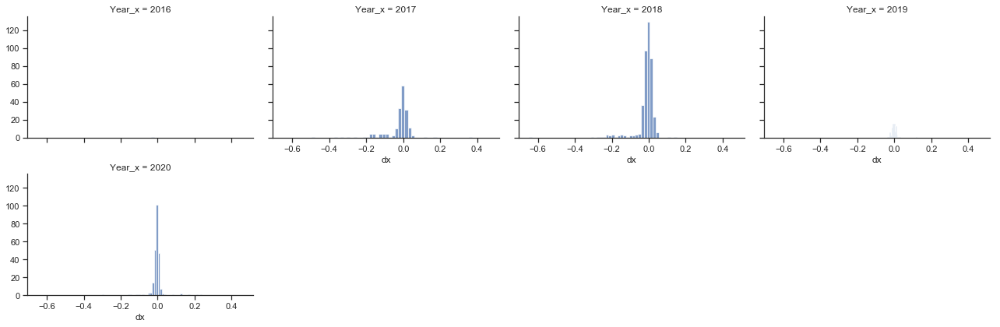

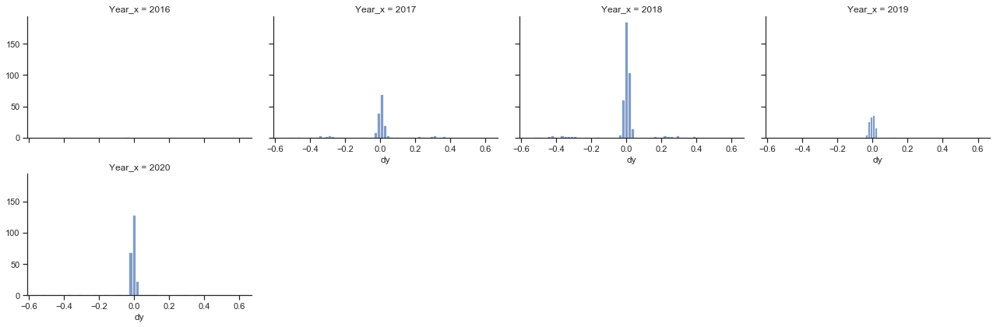

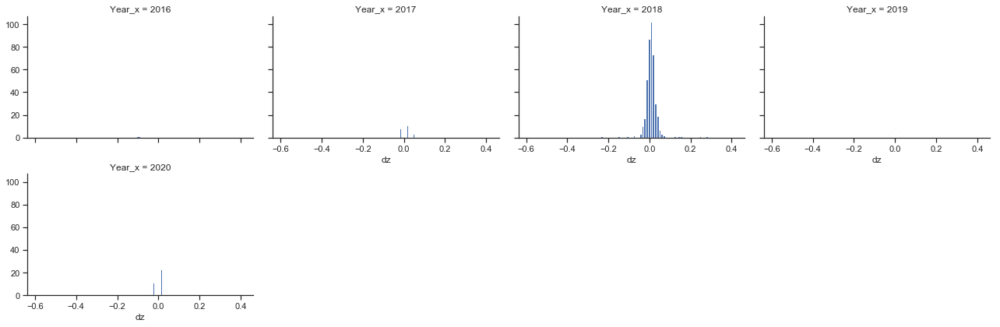

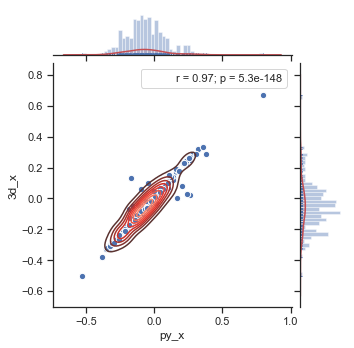

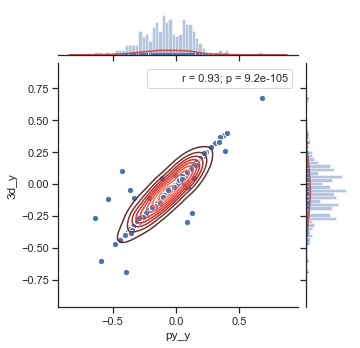

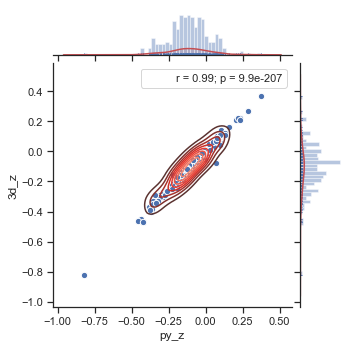

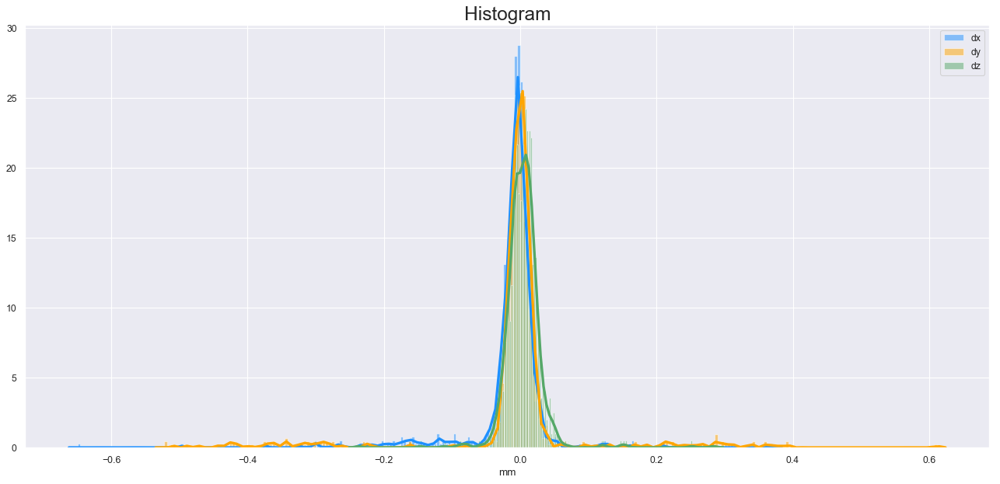

In [60]:
sns.set(style="ticks", color_codes=True)
g = sns.FacetGrid(new_df[['date_x','Year_x','dx','dy','dz']], col='Year_x',col_wrap=4,aspect=1.5)
g = (g.map(plt.hist,"dx", alpha=0.7,bins=50));

k = sns.FacetGrid(new_df[['date_x','Year_x','dx','dy','dz']], col='Year_x',col_wrap=4,aspect=1.5)
k = (k.map(plt.hist,"dy", alpha=0.7,bins=50));

p = sns.FacetGrid(new_df[['date_x','Year_x','dx','dy','dz']], col='Year_x',col_wrap=4,aspect=1.5)
p = (p.map(plt.hist,"dz", alpha=1,bins=50));

for x in zip(['py_x','py_y','py_z'],['3d_x','3d_y','3d_z']):
    #this will help ignore warnings
    filterwarnings ('ignore')
    g = sns.jointplot(x[0],x[1], data=new_df.loc[new_df['Year_x'].isin(['2020'])],height=5, 
                  stat_func=stats.pearsonr,marginal_kws=dict(bins=50, rug=True), annot_kws=dict(stat="r"),
                      s=40, edgecolor="w", linewidth=1)
    g.plot_joint(sns.kdeplot, cmap="Reds_d")
    g.plot_marginals(sns.kdeplot, color="r", shade=True)
    

#seaborn histogram
sns.set() #Seaborn plotting style.
plt.figure(figsize=(20,9), dpi= 80)
sns.distplot(new_df.dx, color="dodgerblue", label="dx", hist_kws={'alpha':.5}, kde_kws={'linewidth':3},bins=250)
sns.distplot(new_df.dy, color="orange", label="dy", hist_kws={'alpha':.5}, kde_kws={'linewidth':3},bins=250)
sns.distplot(new_df.dz, color="g", label="dz", hist_kws={'alpha':.5}, kde_kws={'linewidth':3},bins=250)

# Decoration
plt.title('Histogram', fontsize=22)
plt.legend()
plt.xlabel('mm')

plt.show()

In [41]:
new_df[['dx','dy','dz']].describe()

,dx,dy,dz
count,953.000000,953.000000,953.000000
mean,-0.012949,-0.005259,0.004158
std,0.056533,0.101058,0.026752
min,-0.649605,-0.522560,-0.236580
25%,-0.015959,-0.011023,-0.008372
50%,-0.004564,-0.000264,0.004105
75%,0.005057,0.009515,0.015597
max,0.371052,0.611837,0.283421


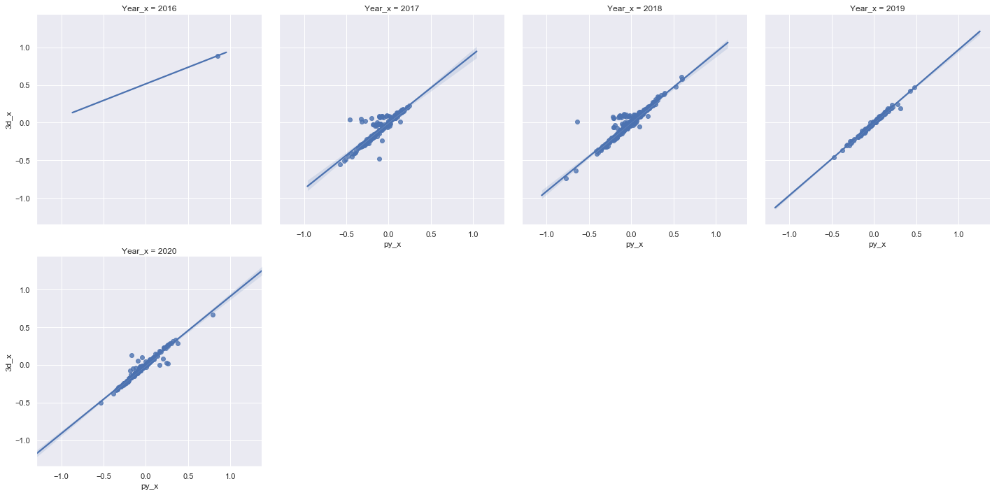

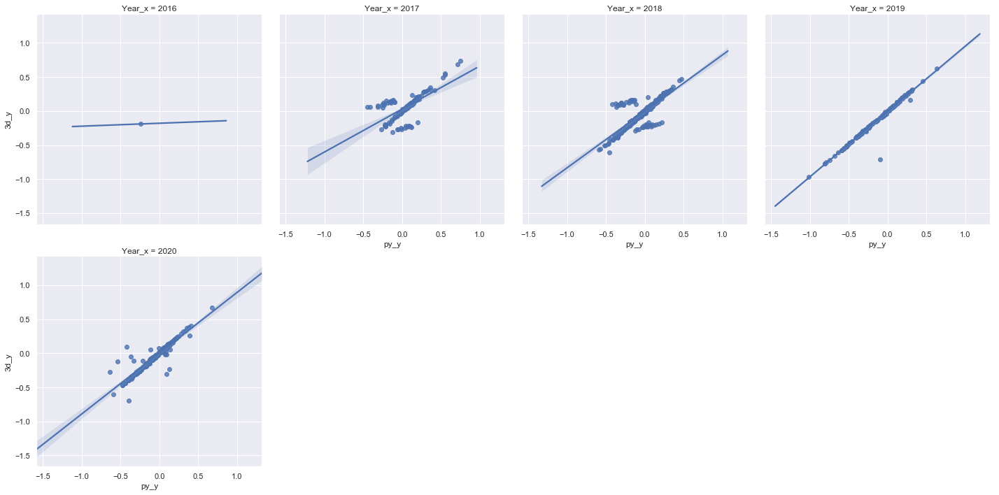

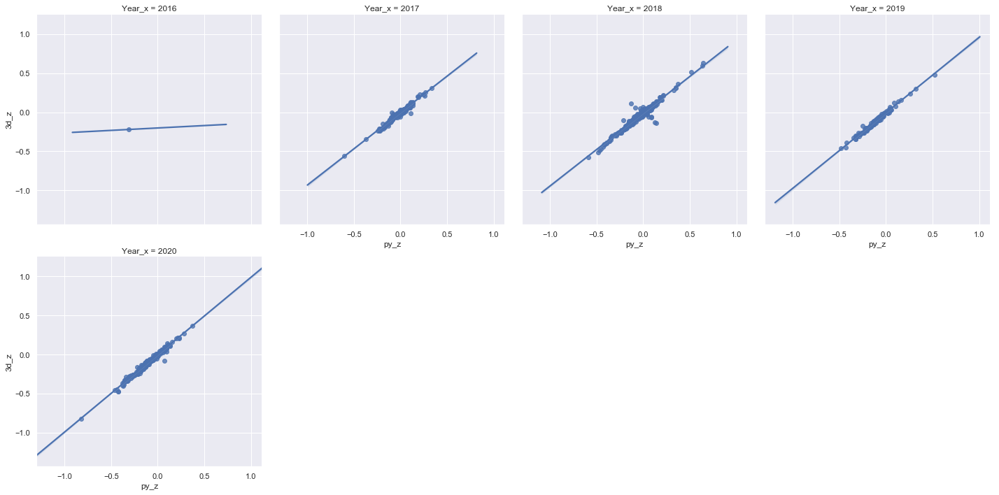

In [42]:
sns.set(color_codes=True)
for x in zip(['py_x','py_y','py_z'],['3d_x','3d_y','3d_z']):
    #this will help ignore warnings
    filterwarnings ('ignore')
    g = sns.lmplot(x=x[0], y=x[1], col="Year_x", data=new_df, col_wrap=4)

Text(0.5, 0, 'mm')

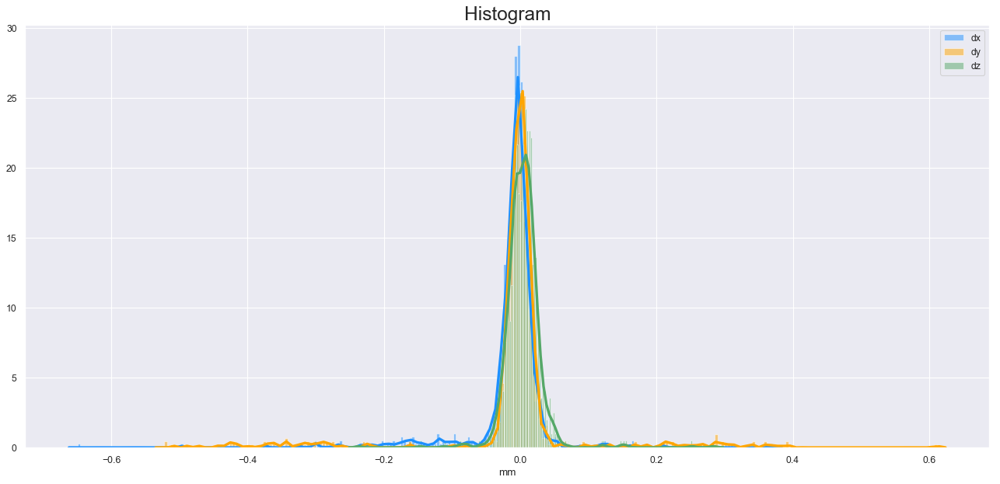

In [54]:
#seaborn histogram
sns.set() #Seaborn plotting style.
plt.figure(figsize=(20,9), dpi= 80)
#new_df2 = new_df.loc[new_df['Year_x'].isin(['2016'])]
new_df2 = new_df
sns.distplot(new_df2.dx, color="dodgerblue", label="dx", hist_kws={'alpha':.5}, kde_kws={'linewidth':3},bins=250)
sns.distplot(new_df2.dy, color="orange", label="dy", hist_kws={'alpha':.5}, kde_kws={'linewidth':3},bins=250)
sns.distplot(new_df2.dz, color="g", label="dz", hist_kws={'alpha':.5}, kde_kws={'linewidth':3},bins=250)

# Decoration
plt.title('Histogram', fontsize=22)
plt.legend()
plt.xlabel('mm')


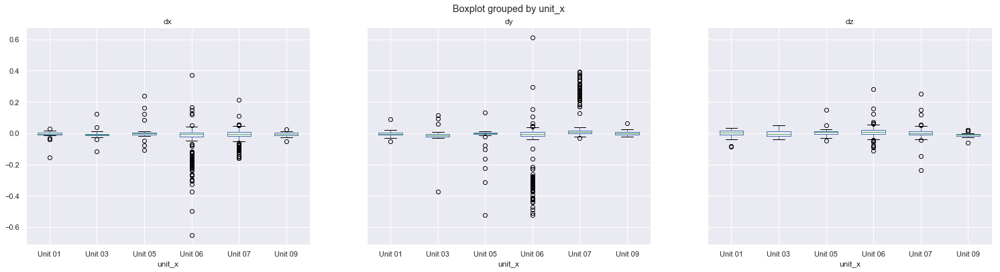

In [38]:
new_df.boxplot(column=['dx','dy','dz'],by='unit_x',figsize=(25,6),layout=(1,3))
plt.show()

Text(0.5, 0, 'mm')

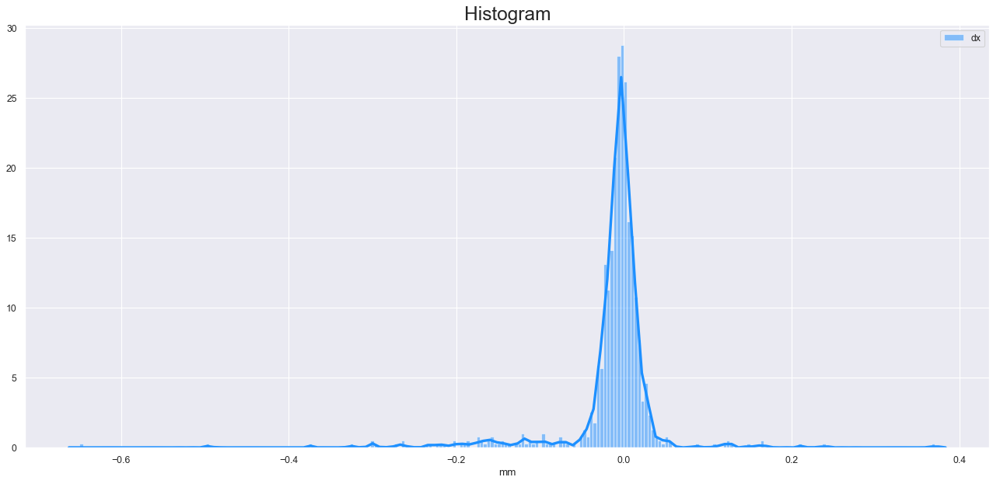

In [55]:
#seaborn histogram
sns.set() #Seaborn plotting style.
plt.figure(figsize=(20,9), dpi= 80)
#new_df2 = new_df.loc[new_df['Year_x'].isin(['2016'])]
new_df2 = new_df
sns.distplot(new_df2.dx, color="dodgerblue", label="dx", hist_kws={'alpha':.5}, kde_kws={'linewidth':3},bins=250)

# Decoration
plt.title('Histogram', fontsize=22)
plt.legend()
plt.xlabel('mm')

Text(0.5, 0, 'mm')

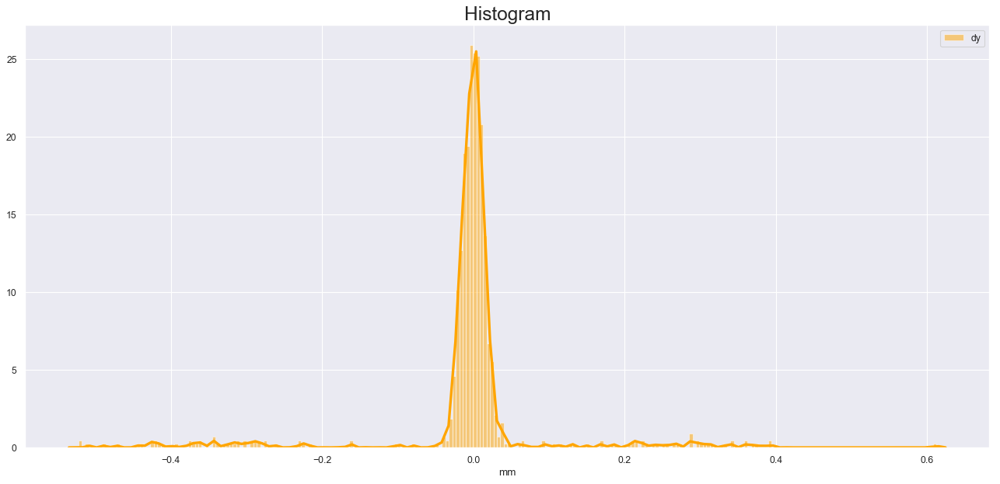

In [57]:
#seaborn histogram
sns.set() #Seaborn plotting style.
plt.figure(figsize=(20,9), dpi= 80)
#new_df2 = new_df.loc[new_df['Year_x'].isin(['2016'])]
new_df2 = new_df
sns.distplot(new_df2.dy, color="orange", label="dy", hist_kws={'alpha':.5}, kde_kws={'linewidth':3},bins=250)

# Decoration
plt.title('Histogram', fontsize=22)
plt.legend()
plt.xlabel('mm')

Text(0.5, 0, 'mm')

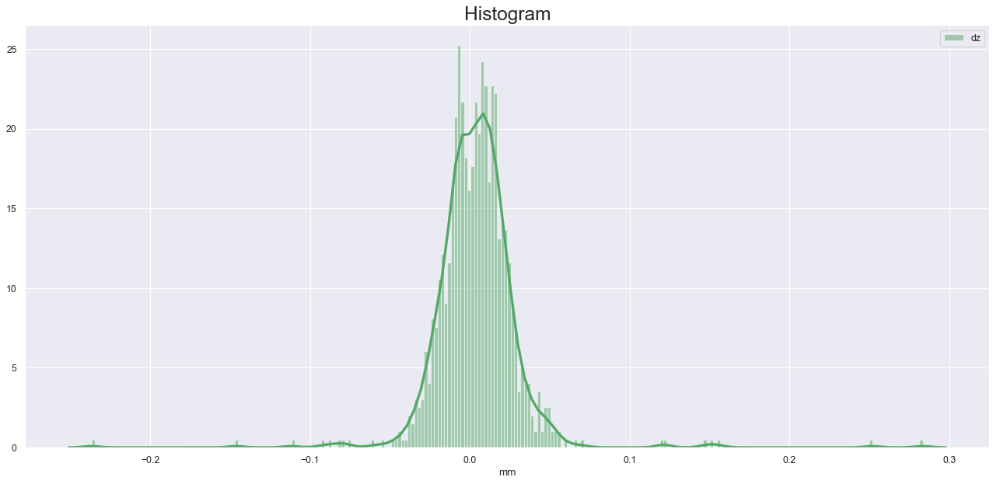

In [58]:
#seaborn histogram
sns.set() #Seaborn plotting style.
plt.figure(figsize=(20,9), dpi= 80)
#new_df2 = new_df.loc[new_df['Year_x'].isin(['2016'])]
new_df2 = new_df
sns.distplot(new_df2.dz, color="g", label="dz", hist_kws={'alpha':.5}, kde_kws={'linewidth':3},bins=250)

# Decoration
plt.title('Histogram', fontsize=22)
plt.legend()
plt.xlabel('mm')

In [59]:
new_df[['dx','dy','dz']].describe()

,dx,dy,dz
count,953.000000,953.000000,953.000000
mean,-0.012949,-0.005259,0.004158
std,0.056533,0.101058,0.026752
min,-0.649605,-0.522560,-0.236580
25%,-0.015959,-0.011023,-0.008372
50%,-0.004564,-0.000264,0.004105
75%,0.005057,0.009515,0.015597
max,0.371052,0.611837,0.283421


In [75]:
new_df2 = new_df.copy()

In [149]:
new_df2.loc[(new_df2["dy"] <= -0.25)]

,Unnamed: 0,Unnamed: 0_x,MU,date_x,py_x,py_y,py_z,unit_x,ID,Year_x,...,3d_x,3d_y,3d_z,date_y,filepath,unit_y,Year_y,dx,dy,dz
110,110,113,10.0,5/29/2020,-0.027942,-0.641263,-0.038571,Unit 03,Unit 03-2020-05-29,2020,...,-0.02,-0.27,-0.04,5/29/2020,"WL_Data\Unit 03\2020_05_29\2020-05-29, Unit 3,...",Unit 03,2020,-0.007942,-0.371263,0.001429
123,123,126,10.0,1/13/2020,0.164025,-0.365025,-0.119133,Unit 05,Unit 05-2020-01-13,2020,...,0.00,-0.05,-0.13,1/13/2020,"WL_Data\Unit 05\2020_01_13\2020-01-13, Unit 5_...",Unit 05,2020,0.164025,-0.315025,0.010867
196,196,203,10.0,1/3/2017,-0.094298,-0.150912,0.244005,Unit 06,Unit 06-2017-01-03,2017,...,0.08,0.14,0.23,1/3/2017,WL_Data\Unit 06\2017_01_03\Z20150323\2017-01-0...,Unit 06,2017,-0.174298,-0.290912,0.014005
197,197,203,10.0,1/3/2017,-0.094298,-0.150912,0.244005,Unit 06,Unit 06-2017-01-03,2017,...,0.08,0.14,0.23,1/3/2017,"WL_Data\Unit 06\2017_01_05\2017-01-03, Unit 6,...",Unit 06,2017,-0.174298,-0.290912,0.014005
206,206,216,10.0,3/27/2017,-0.202260,-0.200176,-0.101729,Unit 06,Unit 06-2017-03-27,2017,...,0.06,0.15,-0.12,3/27/2017,WL_Data\Unit 06\2017_03_27\Z20150323\2017-03-2...,Unit 06,2017,-0.262260,-0.350176,0.018271
207,207,217,10.0,7/4/2017,-0.029372,-0.228420,-0.009776,Unit 06,Unit 06-2017-07-04,2017,...,0.09,0.09,-0.03,7/4/2017,"WL_Data\Unit 06\2017_07_04\2017-07-04, Unit 6,...",Unit 06,2017,-0.119372,-0.318420,0.020224
214,214,224,10.0,7/17/2017,-0.323699,-0.182223,0.066656,Unit 06,Unit 06-2017-07-17,2017,...,0.05,0.12,0.06,7/17/2017,"WL_Data\Unit 06\2017_07_17\2017-07-17, Unit 6,...",Unit 06,2017,-0.373699,-0.302223,0.006656
218,218,228,10.0,7/24/2017,-0.101825,-0.140995,0.081899,Unit 06,Unit 06-2017-07-24,2017,...,0.07,0.12,0.09,7/24/2017,"WL_Data\Unit 06\2017_07_24\2017-07-24, Unit 6,...",Unit 06,2017,-0.171825,-0.260995,-0.008101
227,227,237,10.0,8/14/2017,-0.111299,-0.314618,-0.033833,Unit 06,Unit 06-2017-08-14,2017,...,0.08,0.08,-0.07,8/14/2017,"WL_Data\Unit 06\2017_08_14\2017-08-14, Unit 6,...",Unit 06,2017,-0.191299,-0.394618,0.036167
234,234,244,10.0,8/28/2017,0.006894,-0.315125,0.003184,Unit 06,Unit 06-2017-08-28,2017,...,0.09,0.06,-0.02,8/28/2017,"WL_Data\Unit 06\2017_08_28\2017-08-28, Unit 6,...",Unit 06,2017,-0.083106,-0.375125,0.023184


In [145]:
new_df2[['dx','dy','dz']].describe()

,dx,dy,dz
count,925.000000,925.000000,925.000000
mean,-0.010221,0.000677,0.003319
std,0.044419,0.083145,0.025887
min,-0.373699,-0.394618,-0.236580
25%,-0.015295,-0.010692,-0.008501
50%,-0.004333,-0.000194,0.003562
75%,0.005313,0.009563,0.015104
max,0.239368,0.392626,0.283421


In [143]:
new_df2 = new_df2.drop(index=547)

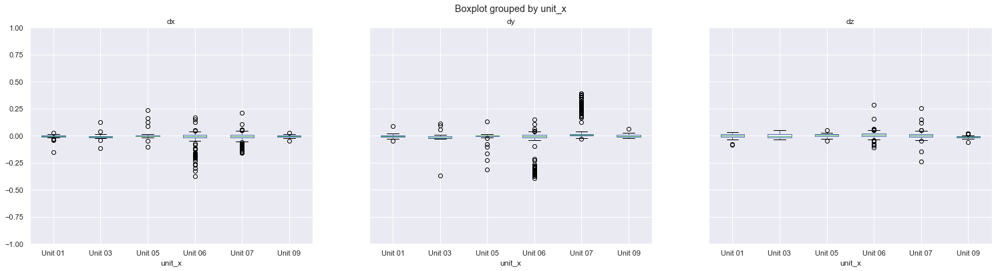

In [150]:
new_df2.boxplot(column=['dx','dy','dz'],by='unit_x',figsize=(25,6),layout=(1,3))
plt.ylim([-1,1])
plt.ylabel('mm')
plt.show()